# Model Free SARSA-QLearning Cartpole :
  
SARSA derivate from the TD algorithm, but instead of using value function, it is using the action function Q.

Contrary to Monte Carlo, the Q function is updated at each step of an episode. (so there is no need to save an episode). It is a on-policy method. The Q value for a state-action is updated by an error, adjusted by the learning rate $\alpha$.

$Q\left(s_{t}, a_{t}\right) \leftarrow Q\left(s_{t}, a_{t}\right)+\alpha\left[r_{t+1}+\gamma Q\left(s_{t+1}, a_{t+1}\right)-Q\left(s_{t}, a_{t}\right)\right]$


<img src="img/SARSA.png" >    

# SARSA

In [1]:
import gym
import numpy as np
from matplotlib import pyplot as plt
import copy

In [2]:
history = {}

In [3]:
env = gym.make("CartPole-v0")
original_max_ep = env._max_episode_steps
env._max_episode_steps = 500

"""
        
Actions:
        Type: Discrete(2)
        Num   Action
        0     Push cart to the left
        1     Push cart to the right
"""

def convert2discrete(observations, N=30):
    """
    Observation               Min                     Max
        0       Cart Position             -4.8                    4.8
        1       Cart Velocity             -Inf                    Inf
        2       Pole Angle                -0.418 rad (-24 deg)    0.418 rad (24 deg)
        3       Pole Angular Velocity     -Inf                    Inf

    """
    position = observations[0]
    angle = observations[2]
    velocity = observations[1]
    velocity2 = observations[3]
    
    min_vel = -5.0
    max_vel = 5.0
    step_vel = (max_vel - min_vel)/(N-1)
    
    min_vel2 = -5.0
    max_vel2 = 5.0
    step_vel2 = (max_vel2 - min_vel2)/(N-1)
    
    min_pos = -2.4
    max_pos = 2.4
    step_pos = (max_pos - min_pos)/(N-1)
    
    min_angle = -0.45
    max_angle = 0.45
    step_angle = (max_angle - min_angle)/(N-1)
    
    
    new_position = (position - min_pos)//step_pos
    
    new_angle = (angle - min_angle )//step_angle 
    
    new_vel = (velocity - min_vel )//step_vel
    
    new_vel2 = (velocity2 - min_vel2 )//step_vel2 
    return int(new_position), int(new_vel), int(new_angle), int(new_vel2)

In [4]:
epsilon=1.0
counts_steps = []
success = 0.
numberExp = 80000
discount = 0.98
discr = 40
alpha = 0.05
q = np.zeros((discr, discr, discr, discr,2))


In [5]:
def select_action(env, q, state, epsilon=None):
    if epsilon is None:
        return np.argmax(q[state[0], state[1], state[2], state[3]], axis=-1)
    else:
        if np.random.uniform() < epsilon:
            action = env.action_space.sample() # your agent here (this takes random actions)
        else:
            action = np.argmax(q[state[0], state[1], state[2], state[3]], axis=-1)
        return action

In [46]:
R = []
best_score = 0
for exp in range(numberExp+5000):
    observation = env.reset()
    old_state= convert2discrete(observation, N=discr)
    total_r = 0.
    action = select_action(env, q, old_state, epsilon=epsilon)
    for curr_step in range(env._max_episode_steps):      
        observation, reward, done, info = env.step(action)
        new_state = convert2discrete(observation, N=discr)
        new_action = select_action(env, q, new_state, epsilon=epsilon)#np.argmax(q[new_state[0], new_state[1], new_state[2], new_state[3]], axis=-1)
        
        #print(observation, done, info)
        if done:
            if total_r >= best_score:
                np.save("cartpole_sarsa", q)
                best_score = total_r
            reward = -10
            total_r += reward
            q[old_state[0], old_state[1], old_state[2], old_state[3], action] = (1-alpha) * q[old_state[0], old_state[1],old_state[2], old_state[3], action] + alpha * (reward + discount * q[new_state[0], new_state[1], new_state[2], new_state[3], new_action] )
            print(f" exp : {exp}  num_steps:{curr_step}, epsilon={epsilon}, Q:{q.sum()}")
            counts_steps.append(curr_step)    
            R.append(total_r)
            
            """
            if curr_step > 100 and epsilon > 0.4:
                epsilon = epsilon * 0.99
            elif curr_step > 60 and epsilon > 0.8:
                curr_step = epsilon * 0.99
            elif curr_step > 160 and epsilon > 0.3:
                epsilon = epsilon * 0.999
            elif curr_step > 250 and epsilon > 0.2:
                epsilon = epsilon * 0.99

            else:
                if curr_step > 250:
                    epsilon = max( epsilon * 0.99, 0.05)
            """
            break
        else:
            total_r += reward
            q[old_state[0], old_state[1], old_state[2], old_state[3], action] = (1-alpha) * q[old_state[0], old_state[1],old_state[2], old_state[3], action] + alpha * (reward+ discount * q[new_state[0], new_state[1], new_state[2], new_state[3], new_action])
        old_state = new_state
        action=new_action
    
    
    epsilon = max(0.0, (numberExp-exp)/numberExp)
env.close()

 exp : 0  num_steps:18, epsilon=1.0, Q:0.39995
 exp : 1  num_steps:24, epsilon=1.0, Q:1.0998500000000002
 exp : 2  num_steps:133, epsilon=0.9999875, Q:7.2461683439675495
 exp : 3  num_steps:11, epsilon=0.999975, Q:7.293618343967549
 exp : 4  num_steps:8, epsilon=0.9999625, Q:7.193468343967549
 exp : 5  num_steps:16, epsilon=0.99995, Q:7.488420843967548
 exp : 6  num_steps:20, epsilon=0.9999375, Q:7.988065993967548
 exp : 7  num_steps:15, epsilon=0.999925, Q:8.23244708409255
 exp : 8  num_steps:31, epsilon=0.9999125, Q:9.27365818392986
 exp : 9  num_steps:13, epsilon=0.9999, Q:9.420519364949662
 exp : 10  num_steps:12, epsilon=0.9998875, Q:9.505176346547447
 exp : 11  num_steps:11, epsilon=0.999875, Q:9.541893220275194
 exp : 12  num_steps:16, epsilon=0.9998625, Q:9.814473220275195
 exp : 13  num_steps:14, epsilon=0.99985, Q:10.01101547309688
 exp : 14  num_steps:29, epsilon=0.9998375, Q:10.95451007246815
 exp : 15  num_steps:11, epsilon=0.999825, Q:10.985261853604673
 exp : 16  num_ste

 exp : 132  num_steps:11, epsilon=0.9983625, Q:76.07848733412376
 exp : 133  num_steps:21, epsilon=0.99835, Q:76.54414572707608
 exp : 134  num_steps:9, epsilon=0.9983375, Q:76.41056740504385
 exp : 135  num_steps:17, epsilon=0.998325, Q:76.67583496030085
 exp : 136  num_steps:15, epsilon=0.9983125, Q:76.85203291637222
 exp : 137  num_steps:18, epsilon=0.9983, Q:77.14134686194024
 exp : 138  num_steps:12, epsilon=0.9982875, Q:77.15800784369713
 exp : 139  num_steps:28, epsilon=0.998275, Q:77.96149960183222
 exp : 140  num_steps:42, epsilon=0.9982625, Q:79.47587094781748
 exp : 141  num_steps:19, epsilon=0.99825, Q:79.79719701028934
 exp : 142  num_steps:45, epsilon=0.9982375, Q:81.47933006059786
 exp : 143  num_steps:20, epsilon=0.998225, Q:81.90438529929203
 exp : 144  num_steps:11, epsilon=0.9982125, Q:81.89244911597608
 exp : 145  num_steps:12, epsilon=0.9982, Q:81.92886103091607
 exp : 146  num_steps:23, epsilon=0.9981875, Q:82.45090135541687
 exp : 147  num_steps:19, epsilon=0.998

 exp : 265  num_steps:32, epsilon=0.9967, Q:141.94684514908073
 exp : 266  num_steps:12, epsilon=0.9966875, Q:141.83348669784587
 exp : 267  num_steps:24, epsilon=0.996675, Q:142.39628078405406
 exp : 268  num_steps:30, epsilon=0.9966625, Q:143.2190013173491
 exp : 269  num_steps:14, epsilon=0.99665, Q:143.26681120118303
 exp : 270  num_steps:9, epsilon=0.9966375, Q:143.12633578694403
 exp : 271  num_steps:30, epsilon=0.996625, Q:143.9020010521776
 exp : 272  num_steps:15, epsilon=0.9966125, Q:144.00186762842515
 exp : 273  num_steps:42, epsilon=0.9966, Q:145.46367148460988
 exp : 274  num_steps:13, epsilon=0.9965875, Q:145.46012791667425
 exp : 275  num_steps:18, epsilon=0.996575, Q:145.7229014008623
 exp : 276  num_steps:31, epsilon=0.9965625, Q:146.66988107507765
 exp : 277  num_steps:24, epsilon=0.99655, Q:147.20970731880266
 exp : 278  num_steps:14, epsilon=0.9965375, Q:147.28759833797315
 exp : 279  num_steps:15, epsilon=0.996525, Q:147.39555225046595
 exp : 280  num_steps:23, ep

 exp : 398  num_steps:9, epsilon=0.9950375, Q:185.03224218442114
 exp : 399  num_steps:14, epsilon=0.995025, Q:185.05657692199384
 exp : 400  num_steps:18, epsilon=0.9950125, Q:185.34357365911478
 exp : 401  num_steps:10, epsilon=0.995, Q:185.12239747181593
 exp : 402  num_steps:13, epsilon=0.9949875, Q:185.06777078713247
 exp : 403  num_steps:25, epsilon=0.994975, Q:185.59511971998853
 exp : 404  num_steps:17, epsilon=0.9949625, Q:185.81714841393296
 exp : 405  num_steps:22, epsilon=0.99495, Q:186.14649438735546
 exp : 406  num_steps:8, epsilon=0.9949375, Q:185.92770460968205
 exp : 407  num_steps:32, epsilon=0.994925, Q:186.86277203275552
 exp : 408  num_steps:51, epsilon=0.9949125, Q:188.76131421744446
 exp : 409  num_steps:23, epsilon=0.9949, Q:189.06911394347583
 exp : 410  num_steps:18, epsilon=0.9948875, Q:189.33714555256125
 exp : 411  num_steps:23, epsilon=0.994875, Q:189.7277144838971
 exp : 412  num_steps:15, epsilon=0.9948625, Q:189.81263252387623
 exp : 413  num_steps:35, 

 exp : 532  num_steps:10, epsilon=0.9933625, Q:229.9386860044013
 exp : 533  num_steps:59, epsilon=0.99335, Q:232.22252498496707
 exp : 534  num_steps:27, epsilon=0.9933375, Q:232.9077637333145
 exp : 535  num_steps:21, epsilon=0.993325, Q:233.21386678352175
 exp : 536  num_steps:23, epsilon=0.9933125, Q:233.49639198504318
 exp : 537  num_steps:26, epsilon=0.9933, Q:234.0617870221125
 exp : 538  num_steps:9, epsilon=0.9932875, Q:233.8170904023888
 exp : 539  num_steps:21, epsilon=0.993275, Q:233.98498996347624
 exp : 540  num_steps:22, epsilon=0.9932625, Q:234.43054399545002
 exp : 541  num_steps:24, epsilon=0.99325, Q:234.74921121490047
 exp : 542  num_steps:10, epsilon=0.9932375, Q:234.59027463822545
 exp : 543  num_steps:31, epsilon=0.993225, Q:235.3173059235592
 exp : 544  num_steps:15, epsilon=0.9932125, Q:235.26545406254493
 exp : 545  num_steps:14, epsilon=0.9932, Q:235.26882758808134
 exp : 546  num_steps:41, epsilon=0.9931875, Q:236.45653324276415
 exp : 547  num_steps:66, eps

 exp : 668  num_steps:14, epsilon=0.9916625, Q:282.4284107455484
 exp : 669  num_steps:16, epsilon=0.99165, Q:282.47855492618675
 exp : 670  num_steps:20, epsilon=0.9916375, Q:282.79807778872816
 exp : 671  num_steps:20, epsilon=0.991625, Q:283.04646127363145
 exp : 672  num_steps:105, epsilon=0.9916125, Q:287.5128141156832
 exp : 673  num_steps:16, epsilon=0.9916, Q:287.5646571324396
 exp : 674  num_steps:24, epsilon=0.9915875, Q:287.9669236117036
 exp : 675  num_steps:14, epsilon=0.991575, Q:287.7964605305308
 exp : 676  num_steps:15, epsilon=0.9915625, Q:287.8001728417011
 exp : 677  num_steps:24, epsilon=0.99155, Q:288.2935507060751
 exp : 678  num_steps:15, epsilon=0.9915375, Q:288.32267897842036
 exp : 679  num_steps:19, epsilon=0.991525, Q:288.5309917620199
 exp : 680  num_steps:56, epsilon=0.9915125, Q:290.40964531032216
 exp : 681  num_steps:19, epsilon=0.9915, Q:290.6138447208377
 exp : 682  num_steps:35, epsilon=0.9914875, Q:291.61507939180075
 exp : 683  num_steps:18, epsil

 exp : 803  num_steps:16, epsilon=0.989975, Q:318.9108177692669
 exp : 804  num_steps:12, epsilon=0.9899625, Q:318.8066733312348
 exp : 805  num_steps:10, epsilon=0.98995, Q:318.6042986706414
 exp : 806  num_steps:9, epsilon=0.9899375, Q:318.22902473817413
 exp : 807  num_steps:43, epsilon=0.989925, Q:319.6632176386627
 exp : 808  num_steps:15, epsilon=0.9899125, Q:319.62671718104457
 exp : 809  num_steps:39, epsilon=0.9899, Q:320.65376782575834
 exp : 810  num_steps:12, epsilon=0.9898875, Q:320.3982175463673
 exp : 811  num_steps:42, epsilon=0.989875, Q:321.7246387982051
 exp : 812  num_steps:18, epsilon=0.9898625, Q:321.88145978807916
 exp : 813  num_steps:15, epsilon=0.98985, Q:321.8492670259841
 exp : 814  num_steps:13, epsilon=0.9898375, Q:321.73425953769583
 exp : 815  num_steps:20, epsilon=0.989825, Q:321.9656278659261
 exp : 816  num_steps:30, epsilon=0.9898125, Q:322.6707705229316
 exp : 817  num_steps:15, epsilon=0.9898, Q:322.6887116538308
 exp : 818  num_steps:12, epsilon=0

 exp : 935  num_steps:33, epsilon=0.988325, Q:359.05332970351236
 exp : 936  num_steps:28, epsilon=0.9883125, Q:359.37712512241336
 exp : 937  num_steps:18, epsilon=0.9883, Q:359.516101794735
 exp : 938  num_steps:9, epsilon=0.9882875, Q:359.1766285784559
 exp : 939  num_steps:17, epsilon=0.988275, Q:359.10436506803313
 exp : 940  num_steps:23, epsilon=0.9882625, Q:359.4221546707129
 exp : 941  num_steps:19, epsilon=0.98825, Q:359.3158652633752
 exp : 942  num_steps:20, epsilon=0.9882375, Q:359.5265003465517
 exp : 943  num_steps:17, epsilon=0.988225, Q:359.65491716174296
 exp : 944  num_steps:36, epsilon=0.9882125, Q:360.57075975181186
 exp : 945  num_steps:16, epsilon=0.9882, Q:360.55678803488814
 exp : 946  num_steps:35, epsilon=0.9881875, Q:361.32291599438196
 exp : 947  num_steps:14, epsilon=0.988175, Q:361.1777409682698
 exp : 948  num_steps:14, epsilon=0.9881625, Q:361.1011771554403
 exp : 949  num_steps:16, epsilon=0.98815, Q:361.15913226775257
 exp : 950  num_steps:21, epsilon

 exp : 1065  num_steps:9, epsilon=0.9867, Q:390.62601009303637
 exp : 1066  num_steps:18, epsilon=0.9866875, Q:390.698336343489
 exp : 1067  num_steps:10, epsilon=0.986675, Q:390.4771168396703
 exp : 1068  num_steps:14, epsilon=0.9866625, Q:390.3946855904719
 exp : 1069  num_steps:20, epsilon=0.98665, Q:390.5899880815799
 exp : 1070  num_steps:21, epsilon=0.9866375, Q:390.7347052612133
 exp : 1071  num_steps:26, epsilon=0.986625, Q:391.2364794631725
 exp : 1072  num_steps:19, epsilon=0.9866125, Q:391.20130533131965
 exp : 1073  num_steps:31, epsilon=0.9866, Q:392.0005592396405
 exp : 1074  num_steps:8, epsilon=0.9865875, Q:391.6840229473556
 exp : 1075  num_steps:13, epsilon=0.986575, Q:391.5440065776302
 exp : 1076  num_steps:10, epsilon=0.9865625, Q:391.2317234166739
 exp : 1077  num_steps:18, epsilon=0.98655, Q:391.3242931555174
 exp : 1078  num_steps:24, epsilon=0.9865375, Q:391.69522691618084
 exp : 1079  num_steps:39, epsilon=0.986525, Q:392.71735482024366
 exp : 1080  num_steps:

 exp : 1199  num_steps:14, epsilon=0.985025, Q:425.60733361746423
 exp : 1200  num_steps:36, epsilon=0.9850125, Q:426.5338171883347
 exp : 1201  num_steps:43, epsilon=0.985, Q:427.7136087955161
 exp : 1202  num_steps:37, epsilon=0.9849875, Q:428.7311140194634
 exp : 1203  num_steps:31, epsilon=0.984975, Q:429.13972795448393
 exp : 1204  num_steps:16, epsilon=0.9849625, Q:429.09348859197684
 exp : 1205  num_steps:22, epsilon=0.98495, Q:429.3997192306293
 exp : 1206  num_steps:38, epsilon=0.9849375, Q:430.4363564060748
 exp : 1207  num_steps:54, epsilon=0.984925, Q:432.34342158224473
 exp : 1208  num_steps:18, epsilon=0.9849125, Q:432.39631918092215
 exp : 1209  num_steps:21, epsilon=0.9849, Q:432.66616467653813
 exp : 1210  num_steps:13, epsilon=0.9848875, Q:432.58269000990896
 exp : 1211  num_steps:9, epsilon=0.984875, Q:432.19666758210707
 exp : 1212  num_steps:17, epsilon=0.9848625, Q:432.1372853937052
 exp : 1213  num_steps:13, epsilon=0.98485, Q:431.9724389756355
 exp : 1214  num_s

 exp : 1327  num_steps:24, epsilon=0.983425, Q:457.1487585142511
 exp : 1328  num_steps:12, epsilon=0.9834125, Q:456.9371815919922
 exp : 1329  num_steps:17, epsilon=0.9834, Q:456.97314774477326
 exp : 1330  num_steps:17, epsilon=0.9833875, Q:457.01909661012945
 exp : 1331  num_steps:15, epsilon=0.983375, Q:456.6445458159207
 exp : 1332  num_steps:44, epsilon=0.9833625, Q:457.79245268359983
 exp : 1333  num_steps:16, epsilon=0.98335, Q:457.64219599931204
 exp : 1334  num_steps:15, epsilon=0.9833375, Q:457.6344065764827
 exp : 1335  num_steps:21, epsilon=0.983325, Q:457.82158827482675
 exp : 1336  num_steps:21, epsilon=0.9833125, Q:457.8741906837525
 exp : 1337  num_steps:31, epsilon=0.9833, Q:458.6121608998281
 exp : 1338  num_steps:10, epsilon=0.9832875, Q:458.2718496641168
 exp : 1339  num_steps:15, epsilon=0.983275, Q:458.18763286823986
 exp : 1340  num_steps:47, epsilon=0.9832625, Q:459.6948639744866
 exp : 1341  num_steps:69, epsilon=0.98325, Q:462.3834093410016
 exp : 1342  num_s

 exp : 1460  num_steps:18, epsilon=0.9817625, Q:491.4940849879368
 exp : 1461  num_steps:24, epsilon=0.98175, Q:491.7474994735674
 exp : 1462  num_steps:17, epsilon=0.9817375, Q:491.7233255403285
 exp : 1463  num_steps:15, epsilon=0.981725, Q:491.65371166689994
 exp : 1464  num_steps:26, epsilon=0.9817125, Q:492.0513267700351
 exp : 1465  num_steps:19, epsilon=0.9817, Q:492.2407795608651
 exp : 1466  num_steps:24, epsilon=0.9816875, Q:492.54626782732714
 exp : 1467  num_steps:15, epsilon=0.981675, Q:492.50218001375924
 exp : 1468  num_steps:31, epsilon=0.9816625, Q:493.1934571158796
 exp : 1469  num_steps:16, epsilon=0.98165, Q:493.12790988169115
 exp : 1470  num_steps:15, epsilon=0.9816375, Q:493.0611138961949
 exp : 1471  num_steps:54, epsilon=0.981625, Q:494.88547850208806
 exp : 1472  num_steps:20, epsilon=0.9816125, Q:494.903870590162
 exp : 1473  num_steps:11, epsilon=0.9816, Q:494.63248138671713
 exp : 1474  num_steps:23, epsilon=0.9815875, Q:494.9389690824884
 exp : 1475  num_s

 exp : 1599  num_steps:17, epsilon=0.980025, Q:508.16792085439675
 exp : 1600  num_steps:31, epsilon=0.9800125, Q:508.6535298577008
 exp : 1601  num_steps:9, epsilon=0.98, Q:508.35447277657687
 exp : 1602  num_steps:60, epsilon=0.9799875, Q:510.50516746798286
 exp : 1603  num_steps:40, epsilon=0.979975, Q:511.5063248933965
 exp : 1604  num_steps:16, epsilon=0.9799625, Q:511.41713154420586
 exp : 1605  num_steps:21, epsilon=0.97995, Q:511.6365345213841
 exp : 1606  num_steps:12, epsilon=0.9799375, Q:511.35602769548404
 exp : 1607  num_steps:25, epsilon=0.979925, Q:511.7142851259122
 exp : 1608  num_steps:14, epsilon=0.9799125, Q:511.2846830894797
 exp : 1609  num_steps:8, epsilon=0.9799, Q:510.9126900737696
 exp : 1610  num_steps:17, epsilon=0.9798875, Q:510.8497251670057
 exp : 1611  num_steps:16, epsilon=0.979875, Q:510.5982612077226
 exp : 1612  num_steps:47, epsilon=0.9798625, Q:511.7647364615572
 exp : 1613  num_steps:14, epsilon=0.97985, Q:511.64799356237586
 exp : 1614  num_steps

 exp : 1734  num_steps:39, epsilon=0.9783375, Q:534.2034805977107
 exp : 1735  num_steps:15, epsilon=0.978325, Q:534.0686204968972
 exp : 1736  num_steps:8, epsilon=0.9783125, Q:533.6970145221383
 exp : 1737  num_steps:16, epsilon=0.9783, Q:533.6922022990091
 exp : 1738  num_steps:29, epsilon=0.9782875, Q:534.1689872266643
 exp : 1739  num_steps:13, epsilon=0.978275, Q:534.0285699342026
 exp : 1740  num_steps:32, epsilon=0.9782625, Q:534.8102880590859
 exp : 1741  num_steps:13, epsilon=0.97825, Q:534.6540566579934
 exp : 1742  num_steps:23, epsilon=0.9782375, Q:534.932884619619
 exp : 1743  num_steps:28, epsilon=0.978225, Q:535.3654892929553
 exp : 1744  num_steps:49, epsilon=0.9782125, Q:536.9573691502618
 exp : 1745  num_steps:9, epsilon=0.9782, Q:536.3421358720424
 exp : 1746  num_steps:16, epsilon=0.9781875, Q:536.3373012905198
 exp : 1747  num_steps:20, epsilon=0.978175, Q:536.2115906840224
 exp : 1748  num_steps:54, epsilon=0.9781625, Q:538.0452338895727
 exp : 1749  num_steps:28

 exp : 1871  num_steps:19, epsilon=0.976625, Q:554.0243068122492
 exp : 1872  num_steps:28, epsilon=0.9766125, Q:554.5764223601619
 exp : 1873  num_steps:19, epsilon=0.9766, Q:554.5983887224852
 exp : 1874  num_steps:18, epsilon=0.9765875, Q:554.5713410842477
 exp : 1875  num_steps:11, epsilon=0.976575, Q:554.3523083748473
 exp : 1876  num_steps:12, epsilon=0.9765625, Q:553.7931601337507
 exp : 1877  num_steps:13, epsilon=0.97655, Q:553.5609032141119
 exp : 1878  num_steps:13, epsilon=0.9765375, Q:553.0368400059174
 exp : 1879  num_steps:14, epsilon=0.976525, Q:552.8245371807437
 exp : 1880  num_steps:9, epsilon=0.9765125, Q:552.3815115201014
 exp : 1881  num_steps:20, epsilon=0.9765, Q:552.5401265788666
 exp : 1882  num_steps:23, epsilon=0.9764875, Q:552.8438394392708
 exp : 1883  num_steps:35, epsilon=0.976475, Q:553.552730233103
 exp : 1884  num_steps:27, epsilon=0.9764625, Q:553.941889517522
 exp : 1885  num_steps:26, epsilon=0.97645, Q:554.2726537187594
 exp : 1886  num_steps:30, 

 exp : 2010  num_steps:27, epsilon=0.9748875, Q:567.919158094802
 exp : 2011  num_steps:16, epsilon=0.974875, Q:567.8534745078716
 exp : 2012  num_steps:42, epsilon=0.9748625, Q:569.0122306164831
 exp : 2013  num_steps:15, epsilon=0.97485, Q:568.9502763949811
 exp : 2014  num_steps:12, epsilon=0.9748375, Q:568.6690499258044
 exp : 2015  num_steps:16, epsilon=0.974825, Q:568.6615860093415
 exp : 2016  num_steps:22, epsilon=0.9748125, Q:568.7683626458348
 exp : 2017  num_steps:17, epsilon=0.9748, Q:568.3976311854632
 exp : 2018  num_steps:10, epsilon=0.9747875, Q:568.0539124439723
 exp : 2019  num_steps:28, epsilon=0.974775, Q:568.4204865698233
 exp : 2020  num_steps:21, epsilon=0.9747625, Q:568.5941422285299
 exp : 2021  num_steps:18, epsilon=0.97475, Q:568.3442894755873
 exp : 2022  num_steps:12, epsilon=0.9747375, Q:568.1065931330176
 exp : 2023  num_steps:36, epsilon=0.974725, Q:568.5394197228935
 exp : 2024  num_steps:25, epsilon=0.9747125, Q:568.7943489055318
 exp : 2025  num_steps

 exp : 2145  num_steps:13, epsilon=0.9732, Q:585.544250926306
 exp : 2146  num_steps:17, epsilon=0.9731875, Q:585.5219557088551
 exp : 2147  num_steps:41, epsilon=0.973175, Q:586.6241174739664
 exp : 2148  num_steps:20, epsilon=0.9731625, Q:586.6304302161404
 exp : 2149  num_steps:14, epsilon=0.97315, Q:586.3991111648754
 exp : 2150  num_steps:28, epsilon=0.9731375, Q:586.5055059408294
 exp : 2151  num_steps:11, epsilon=0.973125, Q:586.1496210898667
 exp : 2152  num_steps:30, epsilon=0.9731125, Q:586.464410825654
 exp : 2153  num_steps:27, epsilon=0.9731, Q:586.8170495403772
 exp : 2154  num_steps:10, epsilon=0.9730875, Q:586.1932495454896
 exp : 2155  num_steps:28, epsilon=0.973075, Q:586.5246393030553
 exp : 2156  num_steps:11, epsilon=0.9730625, Q:586.2040226606115
 exp : 2157  num_steps:19, epsilon=0.97305, Q:586.1038153994424
 exp : 2158  num_steps:26, epsilon=0.9730375, Q:586.3574595915544
 exp : 2159  num_steps:10, epsilon=0.973025, Q:585.9924085456499
 exp : 2160  num_steps:13,

 exp : 2276  num_steps:13, epsilon=0.9715625, Q:589.8619859327079
 exp : 2277  num_steps:33, epsilon=0.97155, Q:590.5088192511745
 exp : 2278  num_steps:11, epsilon=0.9715375, Q:590.1440367088576
 exp : 2279  num_steps:19, epsilon=0.971525, Q:590.1299777880641
 exp : 2280  num_steps:21, epsilon=0.9715125, Q:590.2761364949992
 exp : 2281  num_steps:34, epsilon=0.9715, Q:591.0058683146545
 exp : 2282  num_steps:16, epsilon=0.9714875, Q:590.7753245107009
 exp : 2283  num_steps:23, epsilon=0.971475, Q:590.9996124295036
 exp : 2284  num_steps:11, epsilon=0.9714625, Q:590.6313971651463
 exp : 2285  num_steps:58, epsilon=0.97145, Q:592.4311708559245
 exp : 2286  num_steps:14, epsilon=0.9714375, Q:591.9796438288942
 exp : 2287  num_steps:38, epsilon=0.971425, Q:592.8615725594478
 exp : 2288  num_steps:43, epsilon=0.9714125, Q:594.0035492094287
 exp : 2289  num_steps:15, epsilon=0.9714, Q:593.9439130525453
 exp : 2290  num_steps:28, epsilon=0.9713875, Q:594.3446459813113
 exp : 2291  num_steps:

 exp : 2406  num_steps:17, epsilon=0.9699375, Q:608.2023309277621
 exp : 2407  num_steps:9, epsilon=0.969925, Q:607.8258190573198
 exp : 2408  num_steps:20, epsilon=0.9699125, Q:607.6255597165451
 exp : 2409  num_steps:24, epsilon=0.9699, Q:607.667415822125
 exp : 2410  num_steps:12, epsilon=0.9698875, Q:607.1049297833111
 exp : 2411  num_steps:49, epsilon=0.969875, Q:608.6794019492835
 exp : 2412  num_steps:16, epsilon=0.9698625, Q:608.6541485391305
 exp : 2413  num_steps:22, epsilon=0.96985, Q:608.3449800186253
 exp : 2414  num_steps:10, epsilon=0.9698375, Q:607.932376756079
 exp : 2415  num_steps:17, epsilon=0.969825, Q:607.8546677300595
 exp : 2416  num_steps:29, epsilon=0.9698125, Q:608.4270926591208
 exp : 2417  num_steps:14, epsilon=0.9698, Q:608.1841360267493
 exp : 2418  num_steps:11, epsilon=0.9697875, Q:607.8360977380047
 exp : 2419  num_steps:56, epsilon=0.969775, Q:609.7914652033198
 exp : 2420  num_steps:13, epsilon=0.9697625, Q:609.1436484181773
 exp : 2421  num_steps:20

 exp : 2540  num_steps:27, epsilon=0.9682625, Q:618.3837218450745
 exp : 2541  num_steps:23, epsilon=0.96825, Q:618.5244560992486
 exp : 2542  num_steps:13, epsilon=0.9682375, Q:618.23466791265
 exp : 2543  num_steps:17, epsilon=0.968225, Q:617.8400130610722
 exp : 2544  num_steps:23, epsilon=0.9682125, Q:617.9654807131916
 exp : 2545  num_steps:12, epsilon=0.9682, Q:617.2131326473178
 exp : 2546  num_steps:27, epsilon=0.9681875, Q:617.6362584244345
 exp : 2547  num_steps:31, epsilon=0.968175, Q:618.1868446250509
 exp : 2548  num_steps:31, epsilon=0.9681625, Q:618.8187343895958
 exp : 2549  num_steps:27, epsilon=0.96815, Q:619.2420506855332
 exp : 2550  num_steps:13, epsilon=0.9681375, Q:619.0047169372264
 exp : 2551  num_steps:25, epsilon=0.968125, Q:619.3384536071395
 exp : 2552  num_steps:36, epsilon=0.9681125, Q:620.0698377244724
 exp : 2553  num_steps:22, epsilon=0.9681, Q:620.2267610926709
 exp : 2554  num_steps:18, epsilon=0.9680875, Q:620.1699917937364
 exp : 2555  num_steps:27

 exp : 2677  num_steps:20, epsilon=0.96655, Q:629.6622527291364
 exp : 2678  num_steps:15, epsilon=0.9665375, Q:629.2735402584068
 exp : 2679  num_steps:19, epsilon=0.966525, Q:629.2089978665535
 exp : 2680  num_steps:26, epsilon=0.9665125, Q:629.6104220021953
 exp : 2681  num_steps:12, epsilon=0.9665, Q:628.9229095729539
 exp : 2682  num_steps:11, epsilon=0.9664875, Q:628.5760173201962
 exp : 2683  num_steps:15, epsilon=0.966475, Q:628.0698514300561
 exp : 2684  num_steps:39, epsilon=0.9664625, Q:629.0461049678294
 exp : 2685  num_steps:13, epsilon=0.96645, Q:628.3543380657985
 exp : 2686  num_steps:34, epsilon=0.9664375, Q:628.6599749414859
 exp : 2687  num_steps:17, epsilon=0.966425, Q:628.4566744633224
 exp : 2688  num_steps:12, epsilon=0.9664125, Q:628.0999248770884
 exp : 2689  num_steps:10, epsilon=0.9664, Q:627.3426222533016
 exp : 2690  num_steps:24, epsilon=0.9663875, Q:627.5707111094063
 exp : 2691  num_steps:35, epsilon=0.966375, Q:628.3138050900019
 exp : 2692  num_steps:1

 exp : 2806  num_steps:13, epsilon=0.9649375, Q:645.2063600987
 exp : 2807  num_steps:13, epsilon=0.964925, Q:644.9864924244526
 exp : 2808  num_steps:20, epsilon=0.9649125, Q:645.003107531343
 exp : 2809  num_steps:25, epsilon=0.9649, Q:645.3651976304884
 exp : 2810  num_steps:20, epsilon=0.9648875, Q:645.4023381491993
 exp : 2811  num_steps:19, epsilon=0.964875, Q:645.406233698179
 exp : 2812  num_steps:28, epsilon=0.9648625, Q:645.7749931737876
 exp : 2813  num_steps:16, epsilon=0.96485, Q:645.146355782249
 exp : 2814  num_steps:12, epsilon=0.9648375, Q:644.8125855793514
 exp : 2815  num_steps:10, epsilon=0.964825, Q:644.3123052602102
 exp : 2816  num_steps:11, epsilon=0.9648125, Q:643.584253686578
 exp : 2817  num_steps:35, epsilon=0.9648, Q:644.2701929181203
 exp : 2818  num_steps:12, epsilon=0.9647875, Q:643.6946967599398
 exp : 2819  num_steps:58, epsilon=0.964775, Q:645.3599939296196
 exp : 2820  num_steps:17, epsilon=0.9647625, Q:645.1814784370282
 exp : 2821  num_steps:35, ep

 exp : 2934  num_steps:17, epsilon=0.9633375, Q:659.5790051118232
 exp : 2935  num_steps:17, epsilon=0.963325, Q:659.5147557769363
 exp : 2936  num_steps:13, epsilon=0.9633125, Q:659.1473080328134
 exp : 2937  num_steps:37, epsilon=0.9633, Q:659.8291023279365
 exp : 2938  num_steps:49, epsilon=0.9632875, Q:661.2429526139615
 exp : 2939  num_steps:64, epsilon=0.963275, Q:663.3251076234158
 exp : 2940  num_steps:25, epsilon=0.9632625, Q:663.054316166083
 exp : 2941  num_steps:18, epsilon=0.96325, Q:662.5084657940848
 exp : 2942  num_steps:25, epsilon=0.9632375, Q:662.3983322260858
 exp : 2943  num_steps:58, epsilon=0.963225, Q:663.7168250271721
 exp : 2944  num_steps:27, epsilon=0.9632125, Q:664.0476528664957
 exp : 2945  num_steps:36, epsilon=0.9632, Q:664.8764456645589
 exp : 2946  num_steps:33, epsilon=0.9631875, Q:665.1164924357857
 exp : 2947  num_steps:27, epsilon=0.963175, Q:665.0343787590022
 exp : 2948  num_steps:11, epsilon=0.9631625, Q:664.7037579370138
 exp : 2949  num_steps:

 exp : 3063  num_steps:20, epsilon=0.961725, Q:671.6719259073955
 exp : 3064  num_steps:23, epsilon=0.9617125, Q:671.8596723320634
 exp : 3065  num_steps:19, epsilon=0.9617, Q:671.7113022523538
 exp : 3066  num_steps:67, epsilon=0.9616875, Q:674.1338933825701
 exp : 3067  num_steps:28, epsilon=0.961675, Q:674.4484112502178
 exp : 3068  num_steps:13, epsilon=0.9616625, Q:674.0963678255293
 exp : 3069  num_steps:69, epsilon=0.96165, Q:676.4683153553187
 exp : 3070  num_steps:26, epsilon=0.9616375, Q:676.6713913374049
 exp : 3071  num_steps:34, epsilon=0.961625, Q:677.4430127424093
 exp : 3072  num_steps:12, epsilon=0.9616125, Q:676.6249673612449
 exp : 3073  num_steps:20, epsilon=0.9616, Q:676.6235171700619
 exp : 3074  num_steps:13, epsilon=0.9615875, Q:676.0253356519528
 exp : 3075  num_steps:34, epsilon=0.961575, Q:676.4663909187558
 exp : 3076  num_steps:10, epsilon=0.9615625, Q:676.0101868582287
 exp : 3077  num_steps:51, epsilon=0.96155, Q:677.3972292580656
 exp : 3078  num_steps:1

 exp : 3208  num_steps:11, epsilon=0.9599125, Q:678.0300825958793
 exp : 3209  num_steps:35, epsilon=0.9599, Q:678.797374621018
 exp : 3210  num_steps:10, epsilon=0.9598875, Q:677.9420655347762
 exp : 3211  num_steps:16, epsilon=0.959875, Q:677.7632176356582
 exp : 3212  num_steps:24, epsilon=0.9598625, Q:678.0643453673097
 exp : 3213  num_steps:19, epsilon=0.95985, Q:677.9347670722495
 exp : 3214  num_steps:14, epsilon=0.9598375, Q:677.0890593264556
 exp : 3215  num_steps:8, epsilon=0.959825, Q:676.500154056303
 exp : 3216  num_steps:10, epsilon=0.9598125, Q:675.8762953478945
 exp : 3217  num_steps:17, epsilon=0.9598, Q:675.7176943150869
 exp : 3218  num_steps:17, epsilon=0.9597875, Q:675.2506638190773
 exp : 3219  num_steps:28, epsilon=0.959775, Q:675.45832707969
 exp : 3220  num_steps:40, epsilon=0.9597625, Q:676.3938793518721
 exp : 3221  num_steps:52, epsilon=0.95975, Q:678.0823949559309
 exp : 3222  num_steps:19, epsilon=0.9597375, Q:678.0707122177704
 exp : 3223  num_steps:12, e

 exp : 3354  num_steps:16, epsilon=0.9580875, Q:687.6990220991235
 exp : 3355  num_steps:19, epsilon=0.958075, Q:687.594799535072
 exp : 3356  num_steps:21, epsilon=0.9580625, Q:687.2203304367233
 exp : 3357  num_steps:21, epsilon=0.95805, Q:687.2701450208539
 exp : 3358  num_steps:19, epsilon=0.9580375, Q:687.2560288188226
 exp : 3359  num_steps:10, epsilon=0.958025, Q:686.8082190945152
 exp : 3360  num_steps:22, epsilon=0.9580125, Q:686.8984518786547
 exp : 3361  num_steps:30, epsilon=0.958, Q:686.9024300642928
 exp : 3362  num_steps:12, epsilon=0.9579875, Q:686.6173955628925
 exp : 3363  num_steps:18, epsilon=0.957975, Q:686.4243094083556
 exp : 3364  num_steps:43, epsilon=0.9579625, Q:687.2257656594377
 exp : 3365  num_steps:21, epsilon=0.95795, Q:687.3305554944668
 exp : 3366  num_steps:25, epsilon=0.9579375, Q:687.3584201187382
 exp : 3367  num_steps:12, epsilon=0.957925, Q:687.0021579641389
 exp : 3368  num_steps:14, epsilon=0.9579125, Q:686.6113540864924
 exp : 3369  num_steps:

 exp : 3505  num_steps:24, epsilon=0.9562, Q:697.6803192614827
 exp : 3506  num_steps:14, epsilon=0.9561875, Q:697.4336209013042
 exp : 3507  num_steps:9, epsilon=0.956175, Q:696.9218367070825
 exp : 3508  num_steps:48, epsilon=0.9561625, Q:698.0361985259601
 exp : 3509  num_steps:24, epsilon=0.95615, Q:697.5444725741573
 exp : 3510  num_steps:18, epsilon=0.9561375, Q:697.4696610235818
 exp : 3511  num_steps:18, epsilon=0.956125, Q:697.0161852579803
 exp : 3512  num_steps:17, epsilon=0.9561125, Q:696.9241318294552
 exp : 3513  num_steps:17, epsilon=0.9561, Q:696.6335393735534
 exp : 3514  num_steps:14, epsilon=0.9560875, Q:695.9157114249566
 exp : 3515  num_steps:14, epsilon=0.956075, Q:695.1846827717983
 exp : 3516  num_steps:21, epsilon=0.9560625, Q:695.2387079635649
 exp : 3517  num_steps:28, epsilon=0.95605, Q:695.1125552335244
 exp : 3518  num_steps:34, epsilon=0.9560375, Q:695.7971306924386
 exp : 3519  num_steps:28, epsilon=0.956025, Q:696.1409288625013
 exp : 3520  num_steps:16

 exp : 3655  num_steps:16, epsilon=0.954325, Q:699.2328848930216
 exp : 3656  num_steps:21, epsilon=0.9543125, Q:699.2473891182805
 exp : 3657  num_steps:18, epsilon=0.9543, Q:699.2281280365015
 exp : 3658  num_steps:21, epsilon=0.9542875, Q:698.9218010758817
 exp : 3659  num_steps:7, epsilon=0.954275, Q:698.3129979598344
 exp : 3660  num_steps:11, epsilon=0.9542625, Q:697.9006109585013
 exp : 3661  num_steps:21, epsilon=0.95425, Q:697.8861000952812
 exp : 3662  num_steps:15, epsilon=0.9542375, Q:697.0969588146851
 exp : 3663  num_steps:10, epsilon=0.954225, Q:696.6211686376105
 exp : 3664  num_steps:18, epsilon=0.9542125, Q:696.566486634399
 exp : 3665  num_steps:30, epsilon=0.9542, Q:696.9784649482086
 exp : 3666  num_steps:11, epsilon=0.9541875, Q:696.5541856325021
 exp : 3667  num_steps:37, epsilon=0.954175, Q:697.3114997109162
 exp : 3668  num_steps:76, epsilon=0.9541625, Q:699.9411984374113
 exp : 3669  num_steps:17, epsilon=0.95415, Q:699.8092967282164
 exp : 3670  num_steps:16,

 exp : 3783  num_steps:18, epsilon=0.952725, Q:695.6464480724152
 exp : 3784  num_steps:21, epsilon=0.9527125, Q:695.6518446959998
 exp : 3785  num_steps:21, epsilon=0.9527, Q:695.5638026249684
 exp : 3786  num_steps:52, epsilon=0.9526875, Q:697.196411536335
 exp : 3787  num_steps:69, epsilon=0.952675, Q:699.49188497694
 exp : 3788  num_steps:14, epsilon=0.9526625, Q:699.2903666161163
 exp : 3789  num_steps:48, epsilon=0.95265, Q:699.927006221972
 exp : 3790  num_steps:21, epsilon=0.9526375, Q:699.952224103566
 exp : 3791  num_steps:16, epsilon=0.952625, Q:699.4862581747049
 exp : 3792  num_steps:13, epsilon=0.9526125, Q:698.6919300696655
 exp : 3793  num_steps:13, epsilon=0.9526, Q:698.4691969843274
 exp : 3794  num_steps:45, epsilon=0.9525875, Q:699.7001307302666
 exp : 3795  num_steps:23, epsilon=0.952575, Q:699.7489074871029
 exp : 3796  num_steps:39, epsilon=0.9525625, Q:700.5627855926558
 exp : 3797  num_steps:43, epsilon=0.95255, Q:701.7154937802328
 exp : 3798  num_steps:13, ep

 exp : 3932  num_steps:22, epsilon=0.9508625, Q:705.7071818252257
 exp : 3933  num_steps:9, epsilon=0.95085, Q:705.2652140853734
 exp : 3934  num_steps:9, epsilon=0.9508375, Q:704.7330370381801
 exp : 3935  num_steps:15, epsilon=0.950825, Q:704.4596124377156
 exp : 3936  num_steps:34, epsilon=0.9508125, Q:704.4514548914951
 exp : 3937  num_steps:13, epsilon=0.9508, Q:704.1322270407081
 exp : 3938  num_steps:16, epsilon=0.9507875, Q:703.916026889953
 exp : 3939  num_steps:29, epsilon=0.950775, Q:704.3210040602903
 exp : 3940  num_steps:23, epsilon=0.9507625, Q:704.0910098982633
 exp : 3941  num_steps:36, epsilon=0.95075, Q:704.8435103060548
 exp : 3942  num_steps:27, epsilon=0.9507375, Q:705.1506793332329
 exp : 3943  num_steps:33, epsilon=0.950725, Q:705.6617301987955
 exp : 3944  num_steps:17, epsilon=0.9507125, Q:705.4298601408644
 exp : 3945  num_steps:26, epsilon=0.9507, Q:705.253015685441
 exp : 3946  num_steps:17, epsilon=0.9506875, Q:705.0504770042472
 exp : 3947  num_steps:14, 

 exp : 4077  num_steps:22, epsilon=0.94905, Q:716.6894861982134
 exp : 4078  num_steps:13, epsilon=0.9490375, Q:716.3475751794228
 exp : 4079  num_steps:46, epsilon=0.949025, Q:717.5636941214677
 exp : 4080  num_steps:23, epsilon=0.9490125, Q:717.731516012241
 exp : 4081  num_steps:27, epsilon=0.949, Q:718.037778746927
 exp : 4082  num_steps:31, epsilon=0.9489875, Q:718.499857678777
 exp : 4083  num_steps:27, epsilon=0.948975, Q:718.8157084087846
 exp : 4084  num_steps:10, epsilon=0.9489625, Q:718.3791157283787
 exp : 4085  num_steps:17, epsilon=0.94895, Q:718.2490109078636
 exp : 4086  num_steps:8, epsilon=0.9489375, Q:717.755507827968
 exp : 4087  num_steps:30, epsilon=0.948925, Q:718.2305738796513
 exp : 4088  num_steps:16, epsilon=0.9489125, Q:718.052253286204
 exp : 4089  num_steps:11, epsilon=0.9489, Q:717.6148225457521
 exp : 4090  num_steps:24, epsilon=0.9488875, Q:717.6330557404431
 exp : 4091  num_steps:18, epsilon=0.948875, Q:717.482705652932
 exp : 4092  num_steps:27, epsil

 exp : 4225  num_steps:35, epsilon=0.9472, Q:738.5308036522002
 exp : 4226  num_steps:22, epsilon=0.9471875, Q:738.5637678207346
 exp : 4227  num_steps:27, epsilon=0.947175, Q:738.8789557067182
 exp : 4228  num_steps:13, epsilon=0.9471625, Q:738.1920279813457
 exp : 4229  num_steps:31, epsilon=0.94715, Q:738.7189840988698
 exp : 4230  num_steps:9, epsilon=0.9471375, Q:738.2250787954919
 exp : 4231  num_steps:33, epsilon=0.947125, Q:738.7727677545037
 exp : 4232  num_steps:23, epsilon=0.9471125, Q:738.8868032238701
 exp : 4233  num_steps:32, epsilon=0.9471, Q:739.43370966838
 exp : 4234  num_steps:27, epsilon=0.9470875, Q:739.6254355036348
 exp : 4235  num_steps:17, epsilon=0.947075, Q:739.5250027401436
 exp : 4236  num_steps:23, epsilon=0.9470625, Q:739.6422287228617
 exp : 4237  num_steps:14, epsilon=0.94705, Q:739.310437878874
 exp : 4238  num_steps:24, epsilon=0.9470375, Q:739.5693179760914
 exp : 4239  num_steps:26, epsilon=0.947025, Q:739.8182478337256
 exp : 4240  num_steps:42, e

 exp : 4375  num_steps:12, epsilon=0.945325, Q:736.4987704902793
 exp : 4376  num_steps:15, epsilon=0.9453125, Q:736.3322687608849
 exp : 4377  num_steps:16, epsilon=0.9453, Q:736.1067558032754
 exp : 4378  num_steps:11, epsilon=0.9452875, Q:735.6237188307138
 exp : 4379  num_steps:31, epsilon=0.945275, Q:735.974971929476
 exp : 4380  num_steps:16, epsilon=0.9452625, Q:735.5972965760383
 exp : 4381  num_steps:17, epsilon=0.94525, Q:735.5254486640723
 exp : 4382  num_steps:22, epsilon=0.9452375, Q:735.5937463953511
 exp : 4383  num_steps:34, epsilon=0.945225, Q:736.0853341783846
 exp : 4384  num_steps:17, epsilon=0.9452125, Q:735.6819558522706
 exp : 4385  num_steps:11, epsilon=0.9452, Q:735.2361358630372
 exp : 4386  num_steps:52, epsilon=0.9451875, Q:736.7447088966352
 exp : 4387  num_steps:14, epsilon=0.945175, Q:735.8062583918928
 exp : 4388  num_steps:11, epsilon=0.9451625, Q:735.4518147092443
 exp : 4389  num_steps:28, epsilon=0.94515, Q:735.6464158174574
 exp : 4390  num_steps:8,

 exp : 4505  num_steps:38, epsilon=0.9437, Q:724.5734910787777
 exp : 4506  num_steps:34, epsilon=0.9436875, Q:725.047280270651
 exp : 4507  num_steps:21, epsilon=0.943675, Q:725.1045482665467
 exp : 4508  num_steps:26, epsilon=0.9436625, Q:725.414501098517
 exp : 4509  num_steps:9, epsilon=0.94365, Q:724.7967904961448
 exp : 4510  num_steps:21, epsilon=0.9436375, Q:724.7594143230334
 exp : 4511  num_steps:16, epsilon=0.943625, Q:724.5504497737851
 exp : 4512  num_steps:32, epsilon=0.9436125, Q:725.1013199949335
 exp : 4513  num_steps:55, epsilon=0.9436, Q:726.395518174744
 exp : 4514  num_steps:28, epsilon=0.9435875, Q:726.7142881615034
 exp : 4515  num_steps:11, epsilon=0.943575, Q:726.111194626731
 exp : 4516  num_steps:20, epsilon=0.9435625, Q:726.0352422487352
 exp : 4517  num_steps:25, epsilon=0.94355, Q:725.9733466007204
 exp : 4518  num_steps:12, epsilon=0.9435375, Q:725.6805612654506
 exp : 4519  num_steps:20, epsilon=0.943525, Q:725.1355940347332
 exp : 4520  num_steps:11, ep

 exp : 4638  num_steps:19, epsilon=0.9420375, Q:730.2839247451645
 exp : 4639  num_steps:17, epsilon=0.942025, Q:729.9421246025138
 exp : 4640  num_steps:12, epsilon=0.9420125, Q:729.2782263083379
 exp : 4641  num_steps:16, epsilon=0.942, Q:729.0249260996836
 exp : 4642  num_steps:18, epsilon=0.9419875, Q:728.474107902897
 exp : 4643  num_steps:12, epsilon=0.941975, Q:728.0613393842489
 exp : 4644  num_steps:10, epsilon=0.9419625, Q:727.5340012543988
 exp : 4645  num_steps:18, epsilon=0.94195, Q:727.4061281839909
 exp : 4646  num_steps:19, epsilon=0.9419375, Q:727.3146828393658
 exp : 4647  num_steps:38, epsilon=0.941925, Q:727.9591280990714
 exp : 4648  num_steps:33, epsilon=0.9419125, Q:728.5266985077171
 exp : 4649  num_steps:37, epsilon=0.9419, Q:729.330950843377
 exp : 4650  num_steps:13, epsilon=0.9418875, Q:728.9704674199311
 exp : 4651  num_steps:16, epsilon=0.941875, Q:728.7117587371588
 exp : 4652  num_steps:19, epsilon=0.9418625, Q:728.5652301022512
 exp : 4653  num_steps:33

 exp : 4767  num_steps:101, epsilon=0.940425, Q:736.654388235846
 exp : 4768  num_steps:15, epsilon=0.9404125, Q:736.0281283932933
 exp : 4769  num_steps:27, epsilon=0.9404, Q:736.3841040840549
 exp : 4770  num_steps:12, epsilon=0.9403875, Q:735.9292479595246
 exp : 4771  num_steps:38, epsilon=0.940375, Q:736.7417032594618
 exp : 4772  num_steps:39, epsilon=0.9403625, Q:737.6796546565353
 exp : 4773  num_steps:16, epsilon=0.94035, Q:737.4675627847968
 exp : 4774  num_steps:47, epsilon=0.9403375, Q:738.3968673760227
 exp : 4775  num_steps:18, epsilon=0.940325, Q:738.2398816073847
 exp : 4776  num_steps:40, epsilon=0.9403125, Q:739.1579213928263
 exp : 4777  num_steps:16, epsilon=0.9403, Q:738.4867091871737
 exp : 4778  num_steps:19, epsilon=0.9402875, Q:738.3328617663373
 exp : 4779  num_steps:20, epsilon=0.940275, Q:738.3276097173979
 exp : 4780  num_steps:26, epsilon=0.9402625, Q:738.33424142755
 exp : 4781  num_steps:13, epsilon=0.94025, Q:737.666053795521
 exp : 4782  num_steps:9, e

 exp : 4894  num_steps:10, epsilon=0.9388375, Q:741.1552509736744
 exp : 4895  num_steps:29, epsilon=0.938825, Q:741.4676920318911
 exp : 4896  num_steps:12, epsilon=0.9388125, Q:741.0628371327327
 exp : 4897  num_steps:37, epsilon=0.9388, Q:741.7413135372483
 exp : 4898  num_steps:15, epsilon=0.9387875, Q:741.4004240122106
 exp : 4899  num_steps:15, epsilon=0.938775, Q:741.0270718269826
 exp : 4900  num_steps:28, epsilon=0.9387625, Q:741.2589436235908
 exp : 4901  num_steps:10, epsilon=0.93875, Q:740.4950188595872
 exp : 4902  num_steps:17, epsilon=0.9387375, Q:740.2328820847373
 exp : 4903  num_steps:12, epsilon=0.938725, Q:739.7586597960631
 exp : 4904  num_steps:18, epsilon=0.9387125, Q:739.5459350979582
 exp : 4905  num_steps:32, epsilon=0.9387, Q:740.0617602921483
 exp : 4906  num_steps:14, epsilon=0.9386875, Q:739.2578012114944
 exp : 4907  num_steps:11, epsilon=0.938675, Q:738.8122475639183
 exp : 4908  num_steps:12, epsilon=0.9386625, Q:738.3435781552749
 exp : 4909  num_steps

 exp : 5149  num_steps:30, epsilon=0.93565, Q:732.7688792646373
 exp : 5150  num_steps:14, epsilon=0.9356375, Q:732.4189857587145
 exp : 5151  num_steps:15, epsilon=0.935625, Q:731.5973659088137
 exp : 5152  num_steps:11, epsilon=0.9356125, Q:731.0974604837417
 exp : 5153  num_steps:24, epsilon=0.9356, Q:731.1665961698692
 exp : 5154  num_steps:34, epsilon=0.9355875, Q:731.2499740960683
 exp : 5155  num_steps:49, epsilon=0.935575, Q:732.6558182986129
 exp : 5156  num_steps:47, epsilon=0.9355625, Q:733.9464264716695
 exp : 5157  num_steps:11, epsilon=0.93555, Q:733.4645619860368
 exp : 5158  num_steps:16, epsilon=0.9355375, Q:733.189885327891
 exp : 5159  num_steps:30, epsilon=0.935525, Q:733.5240616651902
 exp : 5160  num_steps:47, epsilon=0.9355125, Q:734.79561213178
 exp : 5161  num_steps:21, epsilon=0.9355, Q:734.7535294885995
 exp : 5162  num_steps:11, epsilon=0.9354875, Q:734.2983110149253
 exp : 5163  num_steps:14, epsilon=0.935475, Q:733.9628928087818
 exp : 5164  num_steps:14, 

 exp : 5298  num_steps:29, epsilon=0.9337875, Q:735.7779012394301
 exp : 5299  num_steps:9, epsilon=0.933775, Q:735.1777797223725
 exp : 5300  num_steps:61, epsilon=0.9337625, Q:736.7550894734057
 exp : 5301  num_steps:14, epsilon=0.93375, Q:736.5092812863071
 exp : 5302  num_steps:27, epsilon=0.9337375, Q:736.7075906549295
 exp : 5303  num_steps:9, epsilon=0.933725, Q:736.2327696046906
 exp : 5304  num_steps:10, epsilon=0.9337125, Q:735.8439851242359
 exp : 5305  num_steps:9, epsilon=0.9337, Q:735.2348844660511
 exp : 5306  num_steps:13, epsilon=0.9336875, Q:734.8286052587877
 exp : 5307  num_steps:34, epsilon=0.933675, Q:735.3309079129357
 exp : 5308  num_steps:15, epsilon=0.9336625, Q:734.5996844260345
 exp : 5309  num_steps:35, epsilon=0.93365, Q:735.2159597101927
 exp : 5310  num_steps:14, epsilon=0.9336375, Q:734.8408925472161
 exp : 5311  num_steps:29, epsilon=0.933625, Q:735.1439988003472
 exp : 5312  num_steps:9, epsilon=0.9336125, Q:734.1274787766374
 exp : 5313  num_steps:12

 exp : 5425  num_steps:15, epsilon=0.9322, Q:727.4776720919908
 exp : 5426  num_steps:19, epsilon=0.9321875, Q:726.8920585150586
 exp : 5427  num_steps:18, epsilon=0.932175, Q:726.6418434892412
 exp : 5428  num_steps:14, epsilon=0.9321625, Q:726.2931233795657
 exp : 5429  num_steps:24, epsilon=0.93215, Q:726.385449998623
 exp : 5430  num_steps:14, epsilon=0.9321375, Q:725.984708401526
 exp : 5431  num_steps:14, epsilon=0.932125, Q:725.6290462700379
 exp : 5432  num_steps:9, epsilon=0.9321125, Q:725.1379847568016
 exp : 5433  num_steps:14, epsilon=0.9321, Q:724.4733111048959
 exp : 5434  num_steps:11, epsilon=0.9320875, Q:723.8503023499056
 exp : 5435  num_steps:26, epsilon=0.932075, Q:723.9944564255695
 exp : 5436  num_steps:36, epsilon=0.9320625, Q:724.6018109801723
 exp : 5437  num_steps:14, epsilon=0.93205, Q:724.0987837988973
 exp : 5438  num_steps:12, epsilon=0.9320375, Q:723.633182590849
 exp : 5439  num_steps:95, epsilon=0.932025, Q:727.1913195812114
 exp : 5440  num_steps:42, e

 exp : 5554  num_steps:15, epsilon=0.9305875, Q:716.2303476480955
 exp : 5555  num_steps:23, epsilon=0.930575, Q:716.0232811312884
 exp : 5556  num_steps:12, epsilon=0.9305625, Q:715.5611521534626
 exp : 5557  num_steps:16, epsilon=0.93055, Q:715.4147330763622
 exp : 5558  num_steps:20, epsilon=0.9305375, Q:714.7138701554859
 exp : 5559  num_steps:21, epsilon=0.930525, Q:714.5990830369367
 exp : 5560  num_steps:66, epsilon=0.9305125, Q:716.5970467981587
 exp : 5561  num_steps:15, epsilon=0.9305, Q:716.2683409845931
 exp : 5562  num_steps:20, epsilon=0.9304875, Q:716.0807271293463
 exp : 5563  num_steps:29, epsilon=0.930475, Q:716.3564147913253
 exp : 5564  num_steps:29, epsilon=0.9304625, Q:716.6256399709605
 exp : 5565  num_steps:11, epsilon=0.93045, Q:716.1713998751832
 exp : 5566  num_steps:43, epsilon=0.9304375, Q:717.2690695583497
 exp : 5567  num_steps:18, epsilon=0.930425, Q:716.6684977874811
 exp : 5568  num_steps:20, epsilon=0.9304125, Q:716.5840140720597
 exp : 5569  num_step

 exp : 5684  num_steps:8, epsilon=0.9289625, Q:722.1370164431808
 exp : 5685  num_steps:17, epsilon=0.92895, Q:721.8555402422985
 exp : 5686  num_steps:30, epsilon=0.9289375, Q:721.5684225008101
 exp : 5687  num_steps:17, epsilon=0.928925, Q:721.3192476783688
 exp : 5688  num_steps:23, epsilon=0.9289125, Q:720.9839619143659
 exp : 5689  num_steps:39, epsilon=0.9289, Q:721.5825965903493
 exp : 5690  num_steps:12, epsilon=0.9288875, Q:720.4820009121638
 exp : 5691  num_steps:42, epsilon=0.928875, Q:721.2923512611408
 exp : 5692  num_steps:28, epsilon=0.9288625, Q:721.6806357478719
 exp : 5693  num_steps:54, epsilon=0.92885, Q:722.8557382994194
 exp : 5694  num_steps:34, epsilon=0.9288375, Q:723.2268602676617
 exp : 5695  num_steps:19, epsilon=0.928825, Q:723.1972182453836
 exp : 5696  num_steps:44, epsilon=0.9288125, Q:724.0547934793157
 exp : 5697  num_steps:10, epsilon=0.9288, Q:723.4950079459938
 exp : 5698  num_steps:11, epsilon=0.9287875, Q:723.0447348563396
 exp : 5699  num_steps:3

 exp : 5815  num_steps:14, epsilon=0.927325, Q:709.8590725921048
 exp : 5816  num_steps:21, epsilon=0.9273125, Q:709.5916808456537
 exp : 5817  num_steps:30, epsilon=0.9273, Q:709.9293598284618
 exp : 5818  num_steps:10, epsilon=0.9272875, Q:709.4943353070313
 exp : 5819  num_steps:17, epsilon=0.927275, Q:709.211903733274
 exp : 5820  num_steps:41, epsilon=0.9272625, Q:710.0987418445692
 exp : 5821  num_steps:31, epsilon=0.92725, Q:710.0942643139607
 exp : 5822  num_steps:82, epsilon=0.9272375, Q:713.1728266897913
 exp : 5823  num_steps:17, epsilon=0.927225, Q:712.6735488632295
 exp : 5824  num_steps:19, epsilon=0.9272125, Q:712.5387559518682
 exp : 5825  num_steps:16, epsilon=0.9272, Q:712.248896287935
 exp : 5826  num_steps:25, epsilon=0.9271875, Q:712.3673231324291
 exp : 5827  num_steps:17, epsilon=0.927175, Q:712.1419532920941
 exp : 5828  num_steps:35, epsilon=0.9271625, Q:712.8910045552692
 exp : 5829  num_steps:41, epsilon=0.92715, Q:713.8423442134905
 exp : 5830  num_steps:24,

 exp : 5946  num_steps:39, epsilon=0.9256875, Q:707.6029900425988
 exp : 5947  num_steps:26, epsilon=0.925675, Q:707.7760483192178
 exp : 5948  num_steps:21, epsilon=0.9256625, Q:707.7563797605083
 exp : 5949  num_steps:15, epsilon=0.92565, Q:707.4450847104406
 exp : 5950  num_steps:48, epsilon=0.9256375, Q:708.7146417521396
 exp : 5951  num_steps:56, epsilon=0.925625, Q:710.4075597909339
 exp : 5952  num_steps:33, epsilon=0.9256125, Q:710.8441717173184
 exp : 5953  num_steps:51, epsilon=0.9256, Q:712.0270745151474
 exp : 5954  num_steps:19, epsilon=0.9255875, Q:711.4433299065722
 exp : 5955  num_steps:16, epsilon=0.925575, Q:711.1410273133115
 exp : 5956  num_steps:19, epsilon=0.9255625, Q:711.0081196182628
 exp : 5957  num_steps:10, epsilon=0.92555, Q:710.4938511920627
 exp : 5958  num_steps:15, epsilon=0.9255375, Q:709.9556681290405
 exp : 5959  num_steps:18, epsilon=0.925525, Q:709.8782005590267
 exp : 5960  num_steps:27, epsilon=0.9255125, Q:709.9488470535318
 exp : 5961  num_step

 exp : 6077  num_steps:28, epsilon=0.92405, Q:713.0316347955743
 exp : 6078  num_steps:20, epsilon=0.9240375, Q:712.9035354375314
 exp : 6079  num_steps:29, epsilon=0.924025, Q:713.235549366422
 exp : 6080  num_steps:14, epsilon=0.9240125, Q:712.9916659939288
 exp : 6081  num_steps:10, epsilon=0.924, Q:711.9682823262503
 exp : 6082  num_steps:23, epsilon=0.9239875, Q:711.7045298590924
 exp : 6083  num_steps:10, epsilon=0.923975, Q:711.1577442444103
 exp : 6084  num_steps:11, epsilon=0.9239625, Q:710.2938643020115
 exp : 6085  num_steps:27, epsilon=0.92395, Q:710.4848457061236
 exp : 6086  num_steps:48, epsilon=0.9239375, Q:711.6136928127061
 exp : 6087  num_steps:71, epsilon=0.923925, Q:713.6273979220285
 exp : 6088  num_steps:41, epsilon=0.9239125, Q:714.3808306502643
 exp : 6089  num_steps:27, epsilon=0.9239, Q:714.6041310286281
 exp : 6090  num_steps:13, epsilon=0.9238875, Q:713.7219148147555
 exp : 6091  num_steps:19, epsilon=0.923875, Q:713.2388307490661
 exp : 6092  num_steps:33,

 exp : 6207  num_steps:18, epsilon=0.922425, Q:716.2205124971819
 exp : 6208  num_steps:32, epsilon=0.9224125, Q:716.7355023520003
 exp : 6209  num_steps:24, epsilon=0.9224, Q:716.1384758403073
 exp : 6210  num_steps:22, epsilon=0.9223875, Q:716.0881200536008
 exp : 6211  num_steps:32, epsilon=0.922375, Q:716.428838192695
 exp : 6212  num_steps:17, epsilon=0.9223625, Q:716.1901729329162
 exp : 6213  num_steps:10, epsilon=0.92235, Q:715.7412850805514
 exp : 6214  num_steps:9, epsilon=0.9223375, Q:714.7835343149935
 exp : 6215  num_steps:19, epsilon=0.922325, Q:714.6738553312942
 exp : 6216  num_steps:30, epsilon=0.9223125, Q:714.9550282015613
 exp : 6217  num_steps:17, epsilon=0.9223, Q:714.7158996931054
 exp : 6218  num_steps:21, epsilon=0.9222875, Q:714.1348013356625
 exp : 6219  num_steps:32, epsilon=0.922275, Q:714.2147446389728
 exp : 6220  num_steps:24, epsilon=0.9222625, Q:714.1832437993963
 exp : 6221  num_steps:36, epsilon=0.92225, Q:714.7797176155026
 exp : 6222  num_steps:11,

 exp : 6336  num_steps:21, epsilon=0.9208125, Q:714.9874944957395
 exp : 6337  num_steps:19, epsilon=0.9208, Q:714.9295734848937
 exp : 6338  num_steps:20, epsilon=0.9207875, Q:714.768366747499
 exp : 6339  num_steps:47, epsilon=0.920775, Q:716.0481405674217
 exp : 6340  num_steps:19, epsilon=0.9207625, Q:715.6476178689107
 exp : 6341  num_steps:23, epsilon=0.92075, Q:715.7085751524234
 exp : 6342  num_steps:10, epsilon=0.9207375, Q:715.267436774477
 exp : 6343  num_steps:27, epsilon=0.920725, Q:715.3158485825596
 exp : 6344  num_steps:18, epsilon=0.9207125, Q:715.1638197658602
 exp : 6345  num_steps:29, epsilon=0.9207, Q:715.456853592582
 exp : 6346  num_steps:31, epsilon=0.9206875, Q:715.4800124268039
 exp : 6347  num_steps:10, epsilon=0.920675, Q:714.4688617382293
 exp : 6348  num_steps:10, epsilon=0.9206625, Q:713.9502814295573
 exp : 6349  num_steps:22, epsilon=0.92065, Q:713.9608133621645
 exp : 6350  num_steps:12, epsilon=0.9206375, Q:713.1933759004661
 exp : 6351  num_steps:10,

 exp : 6468  num_steps:29, epsilon=0.9191625, Q:700.9926192031077
 exp : 6469  num_steps:44, epsilon=0.91915, Q:702.0679390187514
 exp : 6470  num_steps:13, epsilon=0.9191375, Q:701.6575679820606
 exp : 6471  num_steps:17, epsilon=0.919125, Q:701.3853892962487
 exp : 6472  num_steps:14, epsilon=0.9191125, Q:700.9654588749598
 exp : 6473  num_steps:12, epsilon=0.9191, Q:700.5737926518681
 exp : 6474  num_steps:27, epsilon=0.9190875, Q:700.1584216181849
 exp : 6475  num_steps:25, epsilon=0.919075, Q:700.2407250788582
 exp : 6476  num_steps:8, epsilon=0.9190625, Q:699.6452676989128
 exp : 6477  num_steps:24, epsilon=0.91905, Q:699.7271174817896
 exp : 6478  num_steps:14, epsilon=0.9190375, Q:699.348764307652
 exp : 6479  num_steps:16, epsilon=0.919025, Q:699.1123510465885
 exp : 6480  num_steps:12, epsilon=0.9190125, Q:698.6976706201548
 exp : 6481  num_steps:11, epsilon=0.919, Q:698.2675064210993
 exp : 6482  num_steps:42, epsilon=0.9189875, Q:699.2123152703936
 exp : 6483  num_steps:23,

 exp : 6600  num_steps:34, epsilon=0.9175125, Q:700.613159043898
 exp : 6601  num_steps:21, epsilon=0.9175, Q:700.5539065696115
 exp : 6602  num_steps:12, epsilon=0.9174875, Q:700.0906520890088
 exp : 6603  num_steps:11, epsilon=0.917475, Q:699.628029273738
 exp : 6604  num_steps:22, epsilon=0.9174625, Q:699.5668080616925
 exp : 6605  num_steps:22, epsilon=0.91745, Q:699.564080937491
 exp : 6606  num_steps:14, epsilon=0.9174375, Q:699.1965241225531
 exp : 6607  num_steps:20, epsilon=0.917425, Q:698.8530296759319
 exp : 6608  num_steps:10, epsilon=0.9174125, Q:698.28632090039
 exp : 6609  num_steps:17, epsilon=0.9174, Q:698.0275922510049
 exp : 6610  num_steps:28, epsilon=0.9173875, Q:697.7623025019402
 exp : 6611  num_steps:19, epsilon=0.917375, Q:697.6701873239058
 exp : 6612  num_steps:12, epsilon=0.9173625, Q:696.779417932446
 exp : 6613  num_steps:33, epsilon=0.91735, Q:696.6196416348873
 exp : 6614  num_steps:43, epsilon=0.9173375, Q:697.5264217760587
 exp : 6615  num_steps:28, ep

 exp : 6729  num_steps:29, epsilon=0.9159, Q:713.1088472102018
 exp : 6730  num_steps:29, epsilon=0.9158875, Q:713.1061994523146
 exp : 6731  num_steps:51, epsilon=0.915875, Q:714.3083690742784
 exp : 6732  num_steps:11, epsilon=0.9158625, Q:713.8577622725112
 exp : 6733  num_steps:20, epsilon=0.91585, Q:713.6880929091991
 exp : 6734  num_steps:26, epsilon=0.9158375, Q:713.344118281034
 exp : 6735  num_steps:14, epsilon=0.915825, Q:713.0686783654579
 exp : 6736  num_steps:24, epsilon=0.9158125, Q:712.6695590633968
 exp : 6737  num_steps:19, epsilon=0.9158, Q:712.5177350669577
 exp : 6738  num_steps:45, epsilon=0.9157875, Q:713.5823172160432
 exp : 6739  num_steps:24, epsilon=0.915775, Q:712.8777856949552
 exp : 6740  num_steps:73, epsilon=0.9157625, Q:714.8779587204771
 exp : 6741  num_steps:16, epsilon=0.91575, Q:714.4146691720078
 exp : 6742  num_steps:16, epsilon=0.9157375, Q:714.00895548916
 exp : 6743  num_steps:37, epsilon=0.915725, Q:714.8204816273397
 exp : 6744  num_steps:84, 

 exp : 6860  num_steps:27, epsilon=0.9142625, Q:717.7200806225595
 exp : 6861  num_steps:66, epsilon=0.91425, Q:719.8452979508405
 exp : 6862  num_steps:35, epsilon=0.9142375, Q:720.303285781726
 exp : 6863  num_steps:16, epsilon=0.914225, Q:719.9692592290866
 exp : 6864  num_steps:23, epsilon=0.9142125, Q:719.491254021353
 exp : 6865  num_steps:12, epsilon=0.9142, Q:719.0010548342387
 exp : 6866  num_steps:30, epsilon=0.9141875, Q:719.333854978402
 exp : 6867  num_steps:26, epsilon=0.914175, Q:719.2870215459965
 exp : 6868  num_steps:46, epsilon=0.9141625, Q:720.351620728197
 exp : 6869  num_steps:36, epsilon=0.91415, Q:720.9731451534939
 exp : 6870  num_steps:12, epsilon=0.9141375, Q:720.5089206937386
 exp : 6871  num_steps:16, epsilon=0.914125, Q:719.9265205216906
 exp : 6872  num_steps:13, epsilon=0.9141125, Q:719.4984772779595
 exp : 6873  num_steps:10, epsilon=0.9141, Q:718.91104948378
 exp : 6874  num_steps:40, epsilon=0.9140875, Q:719.6173611950202
 exp : 6875  num_steps:11, ep

 exp : 6990  num_steps:16, epsilon=0.9126375, Q:713.9603362959066
 exp : 6991  num_steps:16, epsilon=0.912625, Q:713.6240367794381
 exp : 6992  num_steps:14, epsilon=0.9126125, Q:713.1898825128557
 exp : 6993  num_steps:26, epsilon=0.9126, Q:713.311277815275
 exp : 6994  num_steps:34, epsilon=0.9125875, Q:713.7186926954299
 exp : 6995  num_steps:12, epsilon=0.912575, Q:713.249121818075
 exp : 6996  num_steps:24, epsilon=0.9125625, Q:713.2880436255851
 exp : 6997  num_steps:21, epsilon=0.91255, Q:713.1328031419629
 exp : 6998  num_steps:21, epsilon=0.9125375, Q:713.0831882949395
 exp : 6999  num_steps:22, epsilon=0.912525, Q:713.0258595705099
 exp : 7000  num_steps:15, epsilon=0.9125125, Q:712.7870403246451
 exp : 7001  num_steps:29, epsilon=0.9125, Q:713.1370529046748
 exp : 7002  num_steps:35, epsilon=0.9124875, Q:713.7488760079781
 exp : 7003  num_steps:15, epsilon=0.912475, Q:713.3921895834013
 exp : 7004  num_steps:16, epsilon=0.9124625, Q:713.0528092299654
 exp : 7005  num_steps:1

 exp : 7118  num_steps:24, epsilon=0.9110375, Q:709.6945939267466
 exp : 7119  num_steps:53, epsilon=0.911025, Q:710.8480733692345
 exp : 7120  num_steps:19, epsilon=0.9110125, Q:710.1629425398678
 exp : 7121  num_steps:14, epsilon=0.911, Q:709.3116705404348
 exp : 7122  num_steps:8, epsilon=0.9109875, Q:708.6762097166409
 exp : 7123  num_steps:24, epsilon=0.910975, Q:708.813669190891
 exp : 7124  num_steps:22, epsilon=0.9109625, Q:708.352584276183
 exp : 7125  num_steps:47, epsilon=0.91095, Q:709.4258398676213
 exp : 7126  num_steps:10, epsilon=0.9109375, Q:708.8407792607456
 exp : 7127  num_steps:42, epsilon=0.910925, Q:709.7206334002924
 exp : 7128  num_steps:29, epsilon=0.9109125, Q:709.4761905148357
 exp : 7129  num_steps:48, epsilon=0.9109, Q:710.652773416306
 exp : 7130  num_steps:12, epsilon=0.9108875, Q:710.0327977285974
 exp : 7131  num_steps:25, epsilon=0.910875, Q:710.1771293949832
 exp : 7132  num_steps:60, epsilon=0.9108625, Q:712.1478252186891
 exp : 7133  num_steps:14, 

 exp : 7250  num_steps:23, epsilon=0.9093875, Q:699.327319311253
 exp : 7251  num_steps:28, epsilon=0.909375, Q:699.5672493632239
 exp : 7252  num_steps:13, epsilon=0.9093625, Q:698.7472756626305
 exp : 7253  num_steps:15, epsilon=0.90935, Q:697.9593153474175
 exp : 7254  num_steps:20, epsilon=0.9093375, Q:697.758596914412
 exp : 7255  num_steps:24, epsilon=0.909325, Q:697.8489018286741
 exp : 7256  num_steps:12, epsilon=0.9093125, Q:697.0041508603736
 exp : 7257  num_steps:31, epsilon=0.9093, Q:697.3990894843271
 exp : 7258  num_steps:26, epsilon=0.9092875, Q:697.5722849060712
 exp : 7259  num_steps:28, epsilon=0.909275, Q:697.4003744352447
 exp : 7260  num_steps:12, epsilon=0.9092625, Q:696.8831001444414
 exp : 7261  num_steps:39, epsilon=0.90925, Q:697.8421454831489
 exp : 7262  num_steps:16, epsilon=0.9092375, Q:697.5608521298452
 exp : 7263  num_steps:23, epsilon=0.909225, Q:697.6195869161154
 exp : 7264  num_steps:15, epsilon=0.9092125, Q:696.8156308409798
 exp : 7265  num_steps:

 exp : 7377  num_steps:23, epsilon=0.9078, Q:702.6291098564614
 exp : 7378  num_steps:36, epsilon=0.9077875, Q:703.3249100389316
 exp : 7379  num_steps:22, epsilon=0.907775, Q:702.8752336371831
 exp : 7380  num_steps:12, epsilon=0.9077625, Q:702.3972766346087
 exp : 7381  num_steps:15, epsilon=0.90775, Q:701.614663867414
 exp : 7382  num_steps:34, epsilon=0.9077375, Q:702.0837594481568
 exp : 7383  num_steps:24, epsilon=0.907725, Q:702.1894187633807
 exp : 7384  num_steps:20, epsilon=0.9077125, Q:702.0453266090078
 exp : 7385  num_steps:24, epsilon=0.9077, Q:701.5064743281948
 exp : 7386  num_steps:24, epsilon=0.9076875, Q:700.8308296465884
 exp : 7387  num_steps:15, epsilon=0.907675, Q:700.2438132338871
 exp : 7388  num_steps:11, epsilon=0.9076625, Q:699.757427650306
 exp : 7389  num_steps:16, epsilon=0.90765, Q:699.427718103959
 exp : 7390  num_steps:18, epsilon=0.9076375, Q:699.2284392957902
 exp : 7391  num_steps:24, epsilon=0.907625, Q:698.9086991499628
 exp : 7392  num_steps:15, 

 exp : 7510  num_steps:12, epsilon=0.9061375, Q:689.5272499157415
 exp : 7511  num_steps:18, epsilon=0.906125, Q:689.2891933160281
 exp : 7512  num_steps:26, epsilon=0.9061125, Q:689.4743386277396
 exp : 7513  num_steps:15, epsilon=0.9061, Q:688.5820911452399
 exp : 7514  num_steps:9, epsilon=0.9060875, Q:687.8083704323683
 exp : 7515  num_steps:41, epsilon=0.906075, Q:688.384728044731
 exp : 7516  num_steps:10, epsilon=0.9060625, Q:687.7947938213199
 exp : 7517  num_steps:52, epsilon=0.90605, Q:689.1669213115156
 exp : 7518  num_steps:38, epsilon=0.9060375, Q:689.7545019254919
 exp : 7519  num_steps:32, epsilon=0.906025, Q:690.2684294721903
 exp : 7520  num_steps:49, epsilon=0.9060125, Q:691.5122061328393
 exp : 7521  num_steps:36, epsilon=0.906, Q:692.2914458647365
 exp : 7522  num_steps:28, epsilon=0.9059875, Q:692.5220236375972
 exp : 7523  num_steps:13, epsilon=0.905975, Q:691.891100621656
 exp : 7524  num_steps:28, epsilon=0.9059625, Q:692.2316012130066
 exp : 7525  num_steps:10,

 exp : 7639  num_steps:24, epsilon=0.904525, Q:689.6041692793654
 exp : 7640  num_steps:27, epsilon=0.9045125, Q:689.8157709573072
 exp : 7641  num_steps:11, epsilon=0.9045, Q:689.2623449772693
 exp : 7642  num_steps:19, epsilon=0.9044875, Q:689.1486918049252
 exp : 7643  num_steps:29, epsilon=0.904475, Q:689.5154561079055
 exp : 7644  num_steps:16, epsilon=0.9044625, Q:689.2143471608665
 exp : 7645  num_steps:20, epsilon=0.90445, Q:688.9174262082249
 exp : 7646  num_steps:68, epsilon=0.9044375, Q:690.8416088782515
 exp : 7647  num_steps:27, epsilon=0.904425, Q:691.0987741601602
 exp : 7648  num_steps:19, epsilon=0.9044125, Q:690.8970570006047
 exp : 7649  num_steps:12, epsilon=0.9044, Q:690.438555346904
 exp : 7650  num_steps:15, epsilon=0.9043875, Q:689.59451645064
 exp : 7651  num_steps:20, epsilon=0.904375, Q:689.0292131824986
 exp : 7652  num_steps:11, epsilon=0.9043625, Q:688.6059273277565
 exp : 7653  num_steps:18, epsilon=0.90435, Q:688.2316963193189
 exp : 7654  num_steps:23, 

 exp : 7772  num_steps:20, epsilon=0.9028625, Q:688.2029801344987
 exp : 7773  num_steps:20, epsilon=0.90285, Q:687.5715826043951
 exp : 7774  num_steps:11, epsilon=0.9028375, Q:687.0277922047127
 exp : 7775  num_steps:19, epsilon=0.902825, Q:686.831251888186
 exp : 7776  num_steps:33, epsilon=0.9028125, Q:687.3619269479739
 exp : 7777  num_steps:14, epsilon=0.9028, Q:686.9808342309148
 exp : 7778  num_steps:33, epsilon=0.9027875, Q:687.4918831275282
 exp : 7779  num_steps:11, epsilon=0.902775, Q:686.5473885068278
 exp : 7780  num_steps:23, epsilon=0.9027625, Q:686.6644130590142
 exp : 7781  num_steps:25, epsilon=0.90275, Q:686.871661296958
 exp : 7782  num_steps:29, epsilon=0.9027375, Q:687.0087682606642
 exp : 7783  num_steps:20, epsilon=0.902725, Q:686.8465421109912
 exp : 7784  num_steps:14, epsilon=0.9027125, Q:686.1420018267087
 exp : 7785  num_steps:39, epsilon=0.9027, Q:686.8074369242585
 exp : 7786  num_steps:40, epsilon=0.9026875, Q:687.54923336835
 exp : 7787  num_steps:9, e

 exp : 7903  num_steps:37, epsilon=0.901225, Q:674.5836968491593
 exp : 7904  num_steps:9, epsilon=0.9012125, Q:674.0151563302737
 exp : 7905  num_steps:26, epsilon=0.9012, Q:674.0862989759293
 exp : 7906  num_steps:17, epsilon=0.9011875, Q:673.26772971243
 exp : 7907  num_steps:23, epsilon=0.901175, Q:673.2112834798335
 exp : 7908  num_steps:32, epsilon=0.9011625, Q:673.6622939186484
 exp : 7909  num_steps:71, epsilon=0.90115, Q:676.0490248175008
 exp : 7910  num_steps:36, epsilon=0.9011375, Q:676.6565804923569
 exp : 7911  num_steps:30, epsilon=0.901125, Q:676.9595615740525
 exp : 7912  num_steps:21, epsilon=0.9011125, Q:676.3925004999103
 exp : 7913  num_steps:41, epsilon=0.9011, Q:677.2703731860181
 exp : 7914  num_steps:17, epsilon=0.9010875, Q:677.063885468627
 exp : 7915  num_steps:26, epsilon=0.901075, Q:677.2048813511578
 exp : 7916  num_steps:77, epsilon=0.9010625, Q:679.6525955990412
 exp : 7917  num_steps:17, epsilon=0.90105, Q:678.9652305062291
 exp : 7918  num_steps:16, e

 exp : 8033  num_steps:17, epsilon=0.8996, Q:677.4359772837169
 exp : 8034  num_steps:17, epsilon=0.8995875, Q:676.7977853720914
 exp : 8035  num_steps:12, epsilon=0.899575, Q:676.4074162361545
 exp : 8036  num_steps:35, epsilon=0.8995625, Q:676.5421247615094
 exp : 8037  num_steps:28, epsilon=0.89955, Q:676.6325796061288
 exp : 8038  num_steps:12, epsilon=0.8995375, Q:675.647327213433
 exp : 8039  num_steps:17, epsilon=0.899525, Q:675.3260234067485
 exp : 8040  num_steps:19, epsilon=0.8995125, Q:675.1311961583916
 exp : 8041  num_steps:16, epsilon=0.8995, Q:674.7555588046758
 exp : 8042  num_steps:21, epsilon=0.8994875, Q:674.6067389808653
 exp : 8043  num_steps:35, epsilon=0.899475, Q:675.0193631575502
 exp : 8044  num_steps:12, epsilon=0.8994625, Q:674.5152653282972
 exp : 8045  num_steps:63, epsilon=0.89945, Q:676.2164183908328
 exp : 8046  num_steps:12, epsilon=0.8994375, Q:675.2426938092801
 exp : 8047  num_steps:14, epsilon=0.899425, Q:674.0903863967897
 exp : 8048  num_steps:23

 exp : 8164  num_steps:24, epsilon=0.8979625, Q:673.100130568043
 exp : 8165  num_steps:53, epsilon=0.89795, Q:674.5930580594217
 exp : 8166  num_steps:26, epsilon=0.8979375, Q:674.7347251525553
 exp : 8167  num_steps:22, epsilon=0.897925, Q:674.7451331188788
 exp : 8168  num_steps:9, epsilon=0.8979125, Q:674.0886337485982
 exp : 8169  num_steps:10, epsilon=0.8979, Q:673.5230426607067
 exp : 8170  num_steps:44, epsilon=0.8978875, Q:674.4111153285293
 exp : 8171  num_steps:24, epsilon=0.897875, Q:674.4936378906747
 exp : 8172  num_steps:19, epsilon=0.8978625, Q:674.3370507820304
 exp : 8173  num_steps:32, epsilon=0.89785, Q:674.6550686463878
 exp : 8174  num_steps:38, epsilon=0.8978375, Q:675.4539836457548
 exp : 8175  num_steps:16, epsilon=0.897825, Q:674.6650696454512
 exp : 8176  num_steps:23, epsilon=0.8978125, Q:674.7591109532268
 exp : 8177  num_steps:26, epsilon=0.8978, Q:674.8807957618785
 exp : 8178  num_steps:68, epsilon=0.8977875, Q:677.0354112677926
 exp : 8179  num_steps:11

 exp : 8297  num_steps:32, epsilon=0.8963, Q:673.4692037536988
 exp : 8298  num_steps:19, epsilon=0.8962875, Q:673.2326614625963
 exp : 8299  num_steps:33, epsilon=0.896275, Q:673.6128557483689
 exp : 8300  num_steps:30, epsilon=0.8962625, Q:673.9158134723732
 exp : 8301  num_steps:15, epsilon=0.89625, Q:673.5171831955663
 exp : 8302  num_steps:37, epsilon=0.8962375, Q:674.071742539742
 exp : 8303  num_steps:14, epsilon=0.896225, Q:673.6337502056922
 exp : 8304  num_steps:11, epsilon=0.8962125, Q:673.1070176672022
 exp : 8305  num_steps:19, epsilon=0.8962, Q:672.8850591231806
 exp : 8306  num_steps:22, epsilon=0.8961875, Q:672.820254903452
 exp : 8307  num_steps:15, epsilon=0.896175, Q:672.4646731309724
 exp : 8308  num_steps:19, epsilon=0.8961625, Q:672.2027018334015
 exp : 8309  num_steps:15, epsilon=0.89615, Q:671.7875789639174
 exp : 8310  num_steps:45, epsilon=0.8961375, Q:672.7472276393551
 exp : 8311  num_steps:10, epsilon=0.896125, Q:672.2881876984596
 exp : 8312  num_steps:46,

 exp : 8430  num_steps:21, epsilon=0.8946375, Q:667.8918184487161
 exp : 8431  num_steps:18, epsilon=0.894625, Q:667.1270175495305
 exp : 8432  num_steps:38, epsilon=0.8946125, Q:667.762113290505
 exp : 8433  num_steps:46, epsilon=0.8946, Q:668.7353001491193
 exp : 8434  num_steps:18, epsilon=0.8945875, Q:668.476199027508
 exp : 8435  num_steps:27, epsilon=0.894575, Q:668.5375975864554
 exp : 8436  num_steps:26, epsilon=0.8945625, Q:668.6644595978435
 exp : 8437  num_steps:64, epsilon=0.89455, Q:670.4031561614843
 exp : 8438  num_steps:35, epsilon=0.8945375, Q:670.6644270995932
 exp : 8439  num_steps:46, epsilon=0.894525, Q:671.5308504132147
 exp : 8440  num_steps:13, epsilon=0.8945125, Q:670.8235064075436
 exp : 8441  num_steps:22, epsilon=0.8945, Q:670.7856953535745
 exp : 8442  num_steps:28, epsilon=0.8944875, Q:671.076514651968
 exp : 8443  num_steps:47, epsilon=0.894475, Q:672.4048184786009
 exp : 8444  num_steps:17, epsilon=0.8944625, Q:672.0928336767577
 exp : 8445  num_steps:25

 exp : 8564  num_steps:21, epsilon=0.8929625, Q:665.0490918970158
 exp : 8565  num_steps:9, epsilon=0.89295, Q:664.3795637365185
 exp : 8566  num_steps:16, epsilon=0.8929375, Q:663.5588354315862
 exp : 8567  num_steps:18, epsilon=0.892925, Q:663.238757320948
 exp : 8568  num_steps:8, epsilon=0.8929125, Q:662.693560589457
 exp : 8569  num_steps:29, epsilon=0.8929, Q:662.9837951602882
 exp : 8570  num_steps:12, epsilon=0.8928875, Q:662.3759308209802
 exp : 8571  num_steps:15, epsilon=0.892875, Q:661.4451327424764
 exp : 8572  num_steps:19, epsilon=0.8928625, Q:661.2184630578705
 exp : 8573  num_steps:18, epsilon=0.89285, Q:660.1372714718581
 exp : 8574  num_steps:17, epsilon=0.8928375, Q:659.4447105746507
 exp : 8575  num_steps:41, epsilon=0.892825, Q:660.1103952232622
 exp : 8576  num_steps:14, epsilon=0.8928125, Q:659.2375647552421
 exp : 8577  num_steps:22, epsilon=0.8928, Q:659.2173989350528
 exp : 8578  num_steps:20, epsilon=0.8927875, Q:658.5975027616768
 exp : 8579  num_steps:25, 

 exp : 8695  num_steps:50, epsilon=0.891325, Q:662.3098458822246
 exp : 8696  num_steps:21, epsilon=0.8913125, Q:662.1958582352327
 exp : 8697  num_steps:22, epsilon=0.8913, Q:662.2501607509244
 exp : 8698  num_steps:47, epsilon=0.8912875, Q:663.3225421308498
 exp : 8699  num_steps:36, epsilon=0.891275, Q:663.7927223128712
 exp : 8700  num_steps:39, epsilon=0.8912625, Q:664.5547720688604
 exp : 8701  num_steps:12, epsilon=0.89125, Q:663.5937924363346
 exp : 8702  num_steps:31, epsilon=0.8912375, Q:663.6332841038239
 exp : 8703  num_steps:13, epsilon=0.891225, Q:663.1289384579056
 exp : 8704  num_steps:8, epsilon=0.8912125, Q:662.5663827214416
 exp : 8705  num_steps:37, epsilon=0.8912, Q:663.2137942937823
 exp : 8706  num_steps:39, epsilon=0.8911875, Q:663.8125074289519
 exp : 8707  num_steps:13, epsilon=0.891175, Q:663.3784734111478
 exp : 8708  num_steps:9, epsilon=0.8911625, Q:662.2736772353473
 exp : 8709  num_steps:17, epsilon=0.89115, Q:661.6182152251129
 exp : 8710  num_steps:10,

 exp : 8827  num_steps:15, epsilon=0.889675, Q:655.2954015339318
 exp : 8828  num_steps:11, epsilon=0.8896625, Q:654.4512863804604
 exp : 8829  num_steps:11, epsilon=0.88965, Q:653.4626956485785
 exp : 8830  num_steps:18, epsilon=0.8896375, Q:652.6103746568157
 exp : 8831  num_steps:15, epsilon=0.889625, Q:652.3931312800154
 exp : 8832  num_steps:22, epsilon=0.8896125, Q:652.2806523284586
 exp : 8833  num_steps:16, epsilon=0.8896, Q:651.984376489518
 exp : 8834  num_steps:25, epsilon=0.8895875, Q:652.0912970171576
 exp : 8835  num_steps:13, epsilon=0.889575, Q:651.6347062714202
 exp : 8836  num_steps:50, epsilon=0.8895625, Q:652.9265557474231
 exp : 8837  num_steps:21, epsilon=0.88955, Q:652.3740226698102
 exp : 8838  num_steps:29, epsilon=0.8895375, Q:652.4826176619084
 exp : 8839  num_steps:28, epsilon=0.889525, Q:652.759597846689
 exp : 8840  num_steps:44, epsilon=0.8895125, Q:653.4775370484662
 exp : 8841  num_steps:9, epsilon=0.8895, Q:652.3636081999565
 exp : 8842  num_steps:15, 

 exp : 8959  num_steps:34, epsilon=0.888025, Q:662.4507506527721
 exp : 8960  num_steps:21, epsilon=0.8880125, Q:662.2752678940653
 exp : 8961  num_steps:49, epsilon=0.888, Q:663.2539704466203
 exp : 8962  num_steps:42, epsilon=0.8879875, Q:664.1232003344442
 exp : 8963  num_steps:13, epsilon=0.887975, Q:662.8848083356619
 exp : 8964  num_steps:18, epsilon=0.8879625, Q:662.6680218154478
 exp : 8965  num_steps:23, epsilon=0.88795, Q:662.3063047893905
 exp : 8966  num_steps:45, epsilon=0.8879375, Q:662.922043259702
 exp : 8967  num_steps:30, epsilon=0.887925, Q:662.7107692244527
 exp : 8968  num_steps:18, epsilon=0.8879125, Q:662.0758445626802
 exp : 8969  num_steps:28, epsilon=0.8879, Q:662.2470954628043
 exp : 8970  num_steps:12, epsilon=0.8878875, Q:661.7883951409644
 exp : 8971  num_steps:26, epsilon=0.887875, Q:661.8340567719601
 exp : 8972  num_steps:17, epsilon=0.8878625, Q:661.6047602285047
 exp : 8973  num_steps:13, epsilon=0.88785, Q:660.9044060241412
 exp : 8974  num_steps:23,

 exp : 9090  num_steps:22, epsilon=0.8863875, Q:659.9528616940769
 exp : 9091  num_steps:24, epsilon=0.886375, Q:659.4318221995621
 exp : 9092  num_steps:13, epsilon=0.8863625, Q:658.9808127889777
 exp : 9093  num_steps:10, epsilon=0.88635, Q:658.4922290836856
 exp : 9094  num_steps:20, epsilon=0.8863375, Q:657.5405355311829
 exp : 9095  num_steps:22, epsilon=0.886325, Q:657.4651055724015
 exp : 9096  num_steps:33, epsilon=0.8863125, Q:657.9093773958955
 exp : 9097  num_steps:41, epsilon=0.8863, Q:658.1117154341334
 exp : 9098  num_steps:20, epsilon=0.8862875, Q:657.9245030675936
 exp : 9099  num_steps:23, epsilon=0.886275, Q:657.8894088715047
 exp : 9100  num_steps:32, epsilon=0.8862625, Q:658.3055674365535
 exp : 9101  num_steps:25, epsilon=0.88625, Q:658.3224904416059
 exp : 9102  num_steps:19, epsilon=0.8862375, Q:657.5872867959752
 exp : 9103  num_steps:47, epsilon=0.886225, Q:658.5025234929408
 exp : 9104  num_steps:18, epsilon=0.8862125, Q:658.2647585298815
 exp : 9105  num_step

 exp : 9224  num_steps:11, epsilon=0.8847125, Q:650.7062868169136
 exp : 9225  num_steps:13, epsilon=0.8847, Q:650.2042857322837
 exp : 9226  num_steps:38, epsilon=0.8846875, Q:650.733345983053
 exp : 9227  num_steps:60, epsilon=0.884675, Q:652.3784735230262
 exp : 9228  num_steps:15, epsilon=0.8846625, Q:651.9677902737718
 exp : 9229  num_steps:34, epsilon=0.88465, Q:651.9711846227034
 exp : 9230  num_steps:18, epsilon=0.8846375, Q:651.7052414012427
 exp : 9231  num_steps:23, epsilon=0.884625, Q:651.5545293577262
 exp : 9232  num_steps:29, epsilon=0.8846125, Q:651.6919064872121
 exp : 9233  num_steps:15, epsilon=0.8846, Q:651.2389456596846
 exp : 9234  num_steps:15, epsilon=0.8845875, Q:650.8940510258034
 exp : 9235  num_steps:11, epsilon=0.884575, Q:650.2884075781615
 exp : 9236  num_steps:32, epsilon=0.8845625, Q:650.5646633883389
 exp : 9237  num_steps:30, epsilon=0.88455, Q:650.3992548735771
 exp : 9238  num_steps:22, epsilon=0.8845375, Q:650.3494143837223
 exp : 9239  num_steps:1

 exp : 9358  num_steps:58, epsilon=0.8830375, Q:640.7614925323899
 exp : 9359  num_steps:18, epsilon=0.883025, Q:639.6208501759857
 exp : 9360  num_steps:25, epsilon=0.8830125, Q:639.6382710255914
 exp : 9361  num_steps:26, epsilon=0.883, Q:639.6857063532495
 exp : 9362  num_steps:26, epsilon=0.8829875, Q:639.8709875384482
 exp : 9363  num_steps:17, epsilon=0.882975, Q:639.6115158002128
 exp : 9364  num_steps:37, epsilon=0.8829625, Q:640.3981935319496
 exp : 9365  num_steps:16, epsilon=0.88295, Q:639.8400656953079
 exp : 9366  num_steps:12, epsilon=0.8829375, Q:639.4202936705044
 exp : 9367  num_steps:58, epsilon=0.882925, Q:640.8006955149683
 exp : 9368  num_steps:24, epsilon=0.8829125, Q:640.5207612141965
 exp : 9369  num_steps:22, epsilon=0.8829, Q:640.4897889904237
 exp : 9370  num_steps:59, epsilon=0.8828875, Q:642.1877482547507
 exp : 9371  num_steps:21, epsilon=0.882875, Q:641.6497097313461
 exp : 9372  num_steps:37, epsilon=0.8828625, Q:642.2113815430334
 exp : 9373  num_steps:

 exp : 9488  num_steps:12, epsilon=0.8814125, Q:637.0363960731847
 exp : 9489  num_steps:43, epsilon=0.8814, Q:637.4782743791825
 exp : 9490  num_steps:78, epsilon=0.8813875, Q:640.1484675933269
 exp : 9491  num_steps:13, epsilon=0.881375, Q:639.6518726929381
 exp : 9492  num_steps:36, epsilon=0.8813625, Q:640.2729448149986
 exp : 9493  num_steps:14, epsilon=0.88135, Q:639.8608528366373
 exp : 9494  num_steps:21, epsilon=0.8813375, Q:639.4979418308018
 exp : 9495  num_steps:47, epsilon=0.881325, Q:640.346145374995
 exp : 9496  num_steps:24, epsilon=0.8813125, Q:640.3516114752275
 exp : 9497  num_steps:12, epsilon=0.8813, Q:639.4708128774329
 exp : 9498  num_steps:27, epsilon=0.8812875, Q:639.6280350571243
 exp : 9499  num_steps:52, epsilon=0.881275, Q:640.8100029569898
 exp : 9500  num_steps:20, epsilon=0.8812625, Q:640.6445622118172
 exp : 9501  num_steps:17, epsilon=0.88125, Q:640.3634587278364
 exp : 9502  num_steps:18, epsilon=0.8812375, Q:639.6479449102234
 exp : 9503  num_steps:1

 exp : 9616  num_steps:59, epsilon=0.8798125, Q:643.5027733426338
 exp : 9617  num_steps:12, epsilon=0.8798, Q:643.0878411254613
 exp : 9618  num_steps:25, epsilon=0.8797875, Q:642.7819896131529
 exp : 9619  num_steps:15, epsilon=0.879775, Q:642.0091066178858
 exp : 9620  num_steps:33, epsilon=0.8797625, Q:642.417506964564
 exp : 9621  num_steps:48, epsilon=0.87975, Q:643.5041120709201
 exp : 9622  num_steps:15, epsilon=0.8797375, Q:642.8129064556257
 exp : 9623  num_steps:24, epsilon=0.879725, Q:642.3004765173661
 exp : 9624  num_steps:40, epsilon=0.8797125, Q:642.9563366818269
 exp : 9625  num_steps:21, epsilon=0.8797, Q:642.7221523073573
 exp : 9626  num_steps:31, epsilon=0.8796875, Q:642.9486253461113
 exp : 9627  num_steps:13, epsilon=0.879675, Q:642.4752089836182
 exp : 9628  num_steps:32, epsilon=0.8796625, Q:642.6919429207506
 exp : 9629  num_steps:26, epsilon=0.87965, Q:642.8724712138641
 exp : 9630  num_steps:14, epsilon=0.8796375, Q:642.0441399108644
 exp : 9631  num_steps:2

 exp : 9747  num_steps:27, epsilon=0.878175, Q:627.9716234038028
 exp : 9748  num_steps:15, epsilon=0.8781625, Q:627.6023095857352
 exp : 9749  num_steps:37, epsilon=0.87815, Q:628.173141643385
 exp : 9750  num_steps:25, epsilon=0.8781375, Q:628.0213534361123
 exp : 9751  num_steps:21, epsilon=0.878125, Q:627.8663632310565
 exp : 9752  num_steps:113, epsilon=0.8781125, Q:632.1641357328341
 exp : 9753  num_steps:28, epsilon=0.8781, Q:632.4004284386068
 exp : 9754  num_steps:25, epsilon=0.8780875, Q:632.4677119176648
 exp : 9755  num_steps:11, epsilon=0.878075, Q:631.8816589064901
 exp : 9756  num_steps:35, epsilon=0.8780625, Q:632.3130763915229
 exp : 9757  num_steps:46, epsilon=0.87805, Q:633.2579516940256
 exp : 9758  num_steps:32, epsilon=0.8780375, Q:633.470494493121
 exp : 9759  num_steps:14, epsilon=0.878025, Q:632.989378666187
 exp : 9760  num_steps:33, epsilon=0.8780125, Q:633.5747134999364
 exp : 9761  num_steps:17, epsilon=0.878, Q:633.2657644165573
 exp : 9762  num_steps:24, 

 exp : 9888  num_steps:11, epsilon=0.8764125, Q:621.322938908179
 exp : 9889  num_steps:21, epsilon=0.8764, Q:621.3712146897466
 exp : 9890  num_steps:18, epsilon=0.8763875, Q:621.1308833718218
 exp : 9891  num_steps:35, epsilon=0.876375, Q:621.5667124894568
 exp : 9892  num_steps:43, epsilon=0.8763625, Q:622.3182184108979
 exp : 9893  num_steps:30, epsilon=0.87635, Q:622.517750479616
 exp : 9894  num_steps:15, epsilon=0.8763375, Q:621.8680196695212
 exp : 9895  num_steps:16, epsilon=0.876325, Q:621.5304532654599
 exp : 9896  num_steps:14, epsilon=0.8763125, Q:621.2322922666596
 exp : 9897  num_steps:15, epsilon=0.8763, Q:620.858963266203
 exp : 9898  num_steps:27, epsilon=0.8762875, Q:620.9178825260973
 exp : 9899  num_steps:61, epsilon=0.876275, Q:621.7701440280933
 exp : 9900  num_steps:32, epsilon=0.8762625, Q:622.0995698903249
 exp : 9901  num_steps:102, epsilon=0.87625, Q:625.6208758788949
 exp : 9902  num_steps:9, epsilon=0.8762375, Q:624.9351267496903
 exp : 9903  num_steps:48,

 exp : 10019  num_steps:22, epsilon=0.874775, Q:625.5497562195009
 exp : 10020  num_steps:10, epsilon=0.8747625, Q:624.9392539787806
 exp : 10021  num_steps:19, epsilon=0.87475, Q:624.6743009560995
 exp : 10022  num_steps:42, epsilon=0.8747375, Q:625.1016298773446
 exp : 10023  num_steps:34, epsilon=0.874725, Q:625.0552197142418
 exp : 10024  num_steps:28, epsilon=0.8747125, Q:625.2517478847705
 exp : 10025  num_steps:22, epsilon=0.8747, Q:624.6704071230223
 exp : 10026  num_steps:17, epsilon=0.8746875, Q:624.3797483910383
 exp : 10027  num_steps:49, epsilon=0.874675, Q:625.5057550383502
 exp : 10028  num_steps:46, epsilon=0.8746625, Q:626.4576773874559
 exp : 10029  num_steps:31, epsilon=0.87465, Q:626.746984672746
 exp : 10030  num_steps:16, epsilon=0.8746375, Q:626.291500094564
 exp : 10031  num_steps:20, epsilon=0.874625, Q:626.1536498321024
 exp : 10032  num_steps:26, epsilon=0.8746125, Q:625.6826561633019
 exp : 10033  num_steps:36, epsilon=0.8746, Q:626.1692434291905
 exp : 1003

 exp : 10156  num_steps:40, epsilon=0.8730625, Q:635.6798371368244
 exp : 10157  num_steps:11, epsilon=0.87305, Q:635.0912056500334
 exp : 10158  num_steps:30, epsilon=0.8730375, Q:635.3473743417045
 exp : 10159  num_steps:8, epsilon=0.873025, Q:634.744155306843
 exp : 10160  num_steps:14, epsilon=0.8730125, Q:633.724905640826
 exp : 10161  num_steps:21, epsilon=0.873, Q:632.7164524090336
 exp : 10162  num_steps:14, epsilon=0.8729875, Q:631.8698089070828
 exp : 10163  num_steps:12, epsilon=0.872975, Q:630.8865815538851
 exp : 10164  num_steps:16, epsilon=0.8729625, Q:630.6322411140735
 exp : 10165  num_steps:15, epsilon=0.87295, Q:630.1602109326342
 exp : 10166  num_steps:13, epsilon=0.8729375, Q:629.2719753232105
 exp : 10167  num_steps:10, epsilon=0.872925, Q:628.1873544404567
 exp : 10168  num_steps:29, epsilon=0.8729125, Q:628.4378206356115
 exp : 10169  num_steps:46, epsilon=0.8729, Q:629.2661768880331
 exp : 10170  num_steps:14, epsilon=0.8728875, Q:628.3759264126717
 exp : 10171

 exp : 10292  num_steps:19, epsilon=0.8713625, Q:626.5935981549029
 exp : 10293  num_steps:17, epsilon=0.87135, Q:626.299826458374
 exp : 10294  num_steps:28, epsilon=0.8713375, Q:626.3984986456402
 exp : 10295  num_steps:37, epsilon=0.871325, Q:626.7122740935821
 exp : 10296  num_steps:29, epsilon=0.8713125, Q:626.4286695369325
 exp : 10297  num_steps:54, epsilon=0.8713, Q:627.6784586341956
 exp : 10298  num_steps:37, epsilon=0.8712875, Q:627.8126807835946
 exp : 10299  num_steps:20, epsilon=0.871275, Q:627.1138653812221
 exp : 10300  num_steps:25, epsilon=0.8712625, Q:627.1888518118755
 exp : 10301  num_steps:16, epsilon=0.87125, Q:626.8247378304574
 exp : 10302  num_steps:20, epsilon=0.8712375, Q:626.651664496513
 exp : 10303  num_steps:47, epsilon=0.871225, Q:627.5973627586346
 exp : 10304  num_steps:21, epsilon=0.8712125, Q:627.4288429338534
 exp : 10305  num_steps:42, epsilon=0.8712, Q:628.0753438744206
 exp : 10306  num_steps:19, epsilon=0.8711875, Q:627.4278240309098
 exp : 103

 exp : 10425  num_steps:30, epsilon=0.8697, Q:616.8959895327072
 exp : 10426  num_steps:22, epsilon=0.8696875, Q:616.8656465409878
 exp : 10427  num_steps:13, epsilon=0.869675, Q:615.9497736704878
 exp : 10428  num_steps:15, epsilon=0.8696625, Q:615.0205808971847
 exp : 10429  num_steps:18, epsilon=0.86965, Q:614.8211105161482
 exp : 10430  num_steps:21, epsilon=0.8696375, Q:614.6774272923832
 exp : 10431  num_steps:64, epsilon=0.869625, Q:616.6101252286948
 exp : 10432  num_steps:30, epsilon=0.8696125, Q:616.8480297131242
 exp : 10433  num_steps:13, epsilon=0.8696, Q:616.0834746260149
 exp : 10434  num_steps:13, epsilon=0.8695875, Q:615.7207189783727
 exp : 10435  num_steps:23, epsilon=0.869575, Q:615.6711805449653
 exp : 10436  num_steps:8, epsilon=0.8695625, Q:614.6855991362976
 exp : 10437  num_steps:30, epsilon=0.86955, Q:614.256655723655
 exp : 10438  num_steps:9, epsilon=0.8695375, Q:613.6389367770204
 exp : 10439  num_steps:36, epsilon=0.869525, Q:614.2758597924884
 exp : 10440

 exp : 10563  num_steps:42, epsilon=0.867975, Q:601.891578324217
 exp : 10564  num_steps:23, epsilon=0.8679625, Q:601.3592756380859
 exp : 10565  num_steps:46, epsilon=0.86795, Q:602.3474252904863
 exp : 10566  num_steps:35, epsilon=0.8679375, Q:602.1736245788389
 exp : 10567  num_steps:14, epsilon=0.867925, Q:600.885104672766
 exp : 10568  num_steps:41, epsilon=0.8679125, Q:601.6715231733286
 exp : 10569  num_steps:33, epsilon=0.8679, Q:601.9734654976959
 exp : 10570  num_steps:26, epsilon=0.8678875, Q:601.7528022162031
 exp : 10571  num_steps:22, epsilon=0.867875, Q:601.6032379367927
 exp : 10572  num_steps:33, epsilon=0.8678625, Q:601.9503679050648
 exp : 10573  num_steps:26, epsilon=0.86785, Q:601.6286011127817
 exp : 10574  num_steps:16, epsilon=0.8678375, Q:600.8498818597835
 exp : 10575  num_steps:26, epsilon=0.867825, Q:600.7631065801771
 exp : 10576  num_steps:12, epsilon=0.8678125, Q:599.9262448125556
 exp : 10577  num_steps:11, epsilon=0.8678, Q:599.4426270262928
 exp : 1057

 exp : 10697  num_steps:52, epsilon=0.8663, Q:616.6363387793093
 exp : 10698  num_steps:50, epsilon=0.8662875, Q:617.7550095919083
 exp : 10699  num_steps:36, epsilon=0.866275, Q:618.2582921693316
 exp : 10700  num_steps:21, epsilon=0.8662625, Q:618.1135038860294
 exp : 10701  num_steps:25, epsilon=0.86625, Q:617.9525954100633
 exp : 10702  num_steps:31, epsilon=0.8662375, Q:618.2028557061823
 exp : 10703  num_steps:16, epsilon=0.866225, Q:617.8392690524521
 exp : 10704  num_steps:39, epsilon=0.8662125, Q:617.7738282802662
 exp : 10705  num_steps:24, epsilon=0.8662, Q:617.7095936958236
 exp : 10706  num_steps:27, epsilon=0.8661875, Q:617.9508549784738
 exp : 10707  num_steps:43, epsilon=0.866175, Q:618.8837777639473
 exp : 10708  num_steps:28, epsilon=0.8661625, Q:618.993070787293
 exp : 10709  num_steps:32, epsilon=0.86615, Q:619.2303708783614
 exp : 10710  num_steps:16, epsilon=0.8661375, Q:618.3501276994083
 exp : 10711  num_steps:67, epsilon=0.866125, Q:620.1718118177131
 exp : 107

 exp : 10832  num_steps:54, epsilon=0.8646125, Q:613.9649839179241
 exp : 10833  num_steps:38, epsilon=0.8646, Q:614.4726939175504
 exp : 10834  num_steps:21, epsilon=0.8645875, Q:614.0712952163038
 exp : 10835  num_steps:14, epsilon=0.864575, Q:612.9639506553266
 exp : 10836  num_steps:35, epsilon=0.8645625, Q:613.2841914272375
 exp : 10837  num_steps:40, epsilon=0.86455, Q:614.0898912603778
 exp : 10838  num_steps:15, epsilon=0.8645375, Q:613.6431721300693
 exp : 10839  num_steps:18, epsilon=0.864525, Q:613.3451283138144
 exp : 10840  num_steps:19, epsilon=0.8645125, Q:613.1523790758425
 exp : 10841  num_steps:15, epsilon=0.8645, Q:612.7358176717427
 exp : 10842  num_steps:18, epsilon=0.8644875, Q:611.9103498585897
 exp : 10843  num_steps:12, epsilon=0.864475, Q:611.348861573004
 exp : 10844  num_steps:107, epsilon=0.8644625, Q:615.3787843518818
 exp : 10845  num_steps:18, epsilon=0.86445, Q:615.0683155857156
 exp : 10846  num_steps:44, epsilon=0.8644375, Q:616.0661350523109
 exp : 1

 exp : 10968  num_steps:17, epsilon=0.8629125, Q:609.3049435536954
 exp : 10969  num_steps:66, epsilon=0.8629, Q:611.2592067725105
 exp : 10970  num_steps:25, epsilon=0.8628875, Q:611.1934375378349
 exp : 10971  num_steps:18, epsilon=0.862875, Q:610.9925494489111
 exp : 10972  num_steps:20, epsilon=0.8628625, Q:610.3411242522606
 exp : 10973  num_steps:10, epsilon=0.86285, Q:609.1512130356051
 exp : 10974  num_steps:9, epsilon=0.8628375, Q:608.4735001957218
 exp : 10975  num_steps:13, epsilon=0.862825, Q:607.9796555144547
 exp : 10976  num_steps:49, epsilon=0.8628125, Q:608.8485858917253
 exp : 10977  num_steps:12, epsilon=0.8628, Q:608.2784601015356
 exp : 10978  num_steps:14, epsilon=0.8627875, Q:607.3303878676294
 exp : 10979  num_steps:40, epsilon=0.862775, Q:607.5956461213917
 exp : 10980  num_steps:13, epsilon=0.8627625, Q:607.0988971456844
 exp : 10981  num_steps:24, epsilon=0.86275, Q:607.0237461337791
 exp : 10982  num_steps:25, epsilon=0.8627375, Q:607.0342938009074
 exp : 10

 exp : 11103  num_steps:12, epsilon=0.861225, Q:604.3505600489729
 exp : 11104  num_steps:21, epsilon=0.8612125, Q:604.176766862853
 exp : 11105  num_steps:22, epsilon=0.8612, Q:603.5712788027325
 exp : 11106  num_steps:56, epsilon=0.8611875, Q:604.9292365623008
 exp : 11107  num_steps:43, epsilon=0.861175, Q:605.6553177596103
 exp : 11108  num_steps:33, epsilon=0.8611625, Q:605.9956021612458
 exp : 11109  num_steps:16, epsilon=0.86115, Q:605.794669739099
 exp : 11110  num_steps:21, epsilon=0.8611375, Q:605.5799588810224
 exp : 11111  num_steps:45, epsilon=0.861125, Q:606.4829510741216
 exp : 11112  num_steps:37, epsilon=0.8611125, Q:607.0389343495689
 exp : 11113  num_steps:21, epsilon=0.8611, Q:606.7278388279973
 exp : 11114  num_steps:35, epsilon=0.8610875, Q:606.5854525164665
 exp : 11115  num_steps:15, epsilon=0.861075, Q:605.679773049444
 exp : 11116  num_steps:42, epsilon=0.8610625, Q:605.973427190747
 exp : 11117  num_steps:16, epsilon=0.86105, Q:605.6263911129842
 exp : 11118 

 exp : 11234  num_steps:11, epsilon=0.8595875, Q:609.9160672310603
 exp : 11235  num_steps:22, epsilon=0.859575, Q:609.7059745124978
 exp : 11236  num_steps:29, epsilon=0.8595625, Q:609.3961941641181
 exp : 11237  num_steps:15, epsilon=0.85955, Q:608.9610977935484
 exp : 11238  num_steps:28, epsilon=0.8595375, Q:608.6318445175554
 exp : 11239  num_steps:14, epsilon=0.859525, Q:608.2371440615426
 exp : 11240  num_steps:24, epsilon=0.8595125, Q:607.648276793628
 exp : 11241  num_steps:14, epsilon=0.8595, Q:607.2081833274586
 exp : 11242  num_steps:40, epsilon=0.8594875, Q:608.038191514708
 exp : 11243  num_steps:53, epsilon=0.859475, Q:609.2905161272857
 exp : 11244  num_steps:15, epsilon=0.8594625, Q:608.9087744716727
 exp : 11245  num_steps:54, epsilon=0.85945, Q:610.0613044003018
 exp : 11246  num_steps:28, epsilon=0.8594375, Q:610.2153361220891
 exp : 11247  num_steps:16, epsilon=0.859425, Q:609.7814585664947
 exp : 11248  num_steps:12, epsilon=0.8594125, Q:609.2899504881713
 exp : 1

 exp : 11370  num_steps:15, epsilon=0.8578875, Q:601.3523144136028
 exp : 11371  num_steps:56, epsilon=0.857875, Q:602.6720728622992
 exp : 11372  num_steps:76, epsilon=0.8578625, Q:604.6582787498561
 exp : 11373  num_steps:10, epsilon=0.85785, Q:603.6093738519568
 exp : 11374  num_steps:27, epsilon=0.8578375, Q:603.7262596656714
 exp : 11375  num_steps:34, epsilon=0.857825, Q:603.8642703457054
 exp : 11376  num_steps:41, epsilon=0.8578125, Q:604.6875922647006
 exp : 11377  num_steps:16, epsilon=0.8578, Q:603.9380659786344
 exp : 11378  num_steps:31, epsilon=0.8577875, Q:604.2098751828422
 exp : 11379  num_steps:25, epsilon=0.857775, Q:603.7440576102659
 exp : 11380  num_steps:40, epsilon=0.8577625, Q:604.3160190141567
 exp : 11381  num_steps:18, epsilon=0.85775, Q:604.0081901477471
 exp : 11382  num_steps:47, epsilon=0.8577375, Q:605.0617340249747
 exp : 11383  num_steps:34, epsilon=0.857725, Q:605.4514481721782
 exp : 11384  num_steps:25, epsilon=0.8577125, Q:605.4502345548964
 exp :

 exp : 11504  num_steps:29, epsilon=0.8562125, Q:604.9539325966856
 exp : 11505  num_steps:18, epsilon=0.8562, Q:604.753485627375
 exp : 11506  num_steps:56, epsilon=0.8561875, Q:605.9137124945804
 exp : 11507  num_steps:57, epsilon=0.856175, Q:607.3530773793831
 exp : 11508  num_steps:15, epsilon=0.8561625, Q:606.9905809222931
 exp : 11509  num_steps:23, epsilon=0.85615, Q:606.9482508943851
 exp : 11510  num_steps:23, epsilon=0.8561375, Q:606.8752667970483
 exp : 11511  num_steps:49, epsilon=0.856125, Q:607.954367324218
 exp : 11512  num_steps:12, epsilon=0.8561125, Q:607.0987367624217
 exp : 11513  num_steps:11, epsilon=0.8561, Q:606.4997264188929
 exp : 11514  num_steps:24, epsilon=0.8560875, Q:606.4345628524828
 exp : 11515  num_steps:25, epsilon=0.856075, Q:606.4949136955069
 exp : 11516  num_steps:43, epsilon=0.8560625, Q:606.7501927548527
 exp : 11517  num_steps:14, epsilon=0.85605, Q:606.3076071437691
 exp : 11518  num_steps:47, epsilon=0.8560375, Q:607.4145345483902
 exp : 115

 exp : 11638  num_steps:22, epsilon=0.8545375, Q:598.0888267136035
 exp : 11639  num_steps:25, epsilon=0.854525, Q:598.0487478523913
 exp : 11640  num_steps:14, epsilon=0.8545125, Q:597.7151675407064
 exp : 11641  num_steps:23, epsilon=0.8545, Q:597.0960016654327
 exp : 11642  num_steps:43, epsilon=0.8544875, Q:598.0934553978053
 exp : 11643  num_steps:35, epsilon=0.854475, Q:598.1362122221461
 exp : 11644  num_steps:44, epsilon=0.8544625, Q:598.8982280151639
 exp : 11645  num_steps:10, epsilon=0.85445, Q:597.8701939187941
 exp : 11646  num_steps:11, epsilon=0.8544375, Q:596.9413228927507
 exp : 11647  num_steps:53, epsilon=0.854425, Q:598.3205353173322
 exp : 11648  num_steps:11, epsilon=0.8544125, Q:597.7615676362906
 exp : 11649  num_steps:34, epsilon=0.8544, Q:598.1646932677489
 exp : 11650  num_steps:35, epsilon=0.8543875, Q:598.6477357866437
 exp : 11651  num_steps:34, epsilon=0.854375, Q:598.8396908859203
 exp : 11652  num_steps:17, epsilon=0.8543625, Q:598.49815967596
 exp : 11

 exp : 11775  num_steps:21, epsilon=0.852825, Q:595.9270450678208
 exp : 11776  num_steps:43, epsilon=0.8528125, Q:596.7718486894197
 exp : 11777  num_steps:45, epsilon=0.8528, Q:597.5539407659543
 exp : 11778  num_steps:35, epsilon=0.8527875, Q:597.9624746496924
 exp : 11779  num_steps:42, epsilon=0.852775, Q:598.4267465631825
 exp : 11780  num_steps:10, epsilon=0.8527625, Q:597.7840800233502
 exp : 11781  num_steps:19, epsilon=0.85275, Q:597.4682228425962
 exp : 11782  num_steps:30, epsilon=0.8527375, Q:597.6479962652196
 exp : 11783  num_steps:28, epsilon=0.852725, Q:597.3722370098857
 exp : 11784  num_steps:25, epsilon=0.8527125, Q:597.3389904275422
 exp : 11785  num_steps:20, epsilon=0.8527, Q:597.1362901674607
 exp : 11786  num_steps:12, epsilon=0.8526875, Q:596.5951831452354
 exp : 11787  num_steps:25, epsilon=0.852675, Q:596.2781414929124
 exp : 11788  num_steps:19, epsilon=0.8526625, Q:596.0918531198198
 exp : 11789  num_steps:33, epsilon=0.85265, Q:596.4895479932269
 exp : 11

 exp : 11907  num_steps:11, epsilon=0.851175, Q:605.5036557266718
 exp : 11908  num_steps:24, epsilon=0.8511625, Q:605.4145745756006
 exp : 11909  num_steps:31, epsilon=0.85115, Q:605.7065427102028
 exp : 11910  num_steps:26, epsilon=0.8511375, Q:605.8418173482922
 exp : 11911  num_steps:37, epsilon=0.851125, Q:606.3251694510199
 exp : 11912  num_steps:22, epsilon=0.8511125, Q:605.4856184546446
 exp : 11913  num_steps:30, epsilon=0.8511, Q:605.6090828080197
 exp : 11914  num_steps:14, epsilon=0.8510875, Q:605.1294929881279
 exp : 11915  num_steps:19, epsilon=0.851075, Q:604.9930085220425
 exp : 11916  num_steps:31, epsilon=0.8510625, Q:605.0969181812042
 exp : 11917  num_steps:21, epsilon=0.85105, Q:604.5448975111998
 exp : 11918  num_steps:25, epsilon=0.8510375, Q:604.5681617579238
 exp : 11919  num_steps:22, epsilon=0.851025, Q:604.4394826211818
 exp : 11920  num_steps:70, epsilon=0.8510125, Q:606.4874759790715
 exp : 11921  num_steps:37, epsilon=0.851, Q:606.7917580366903
 exp : 119

 exp : 12042  num_steps:15, epsilon=0.8494875, Q:610.698720769915
 exp : 12043  num_steps:25, epsilon=0.849475, Q:610.375855998646
 exp : 12044  num_steps:27, epsilon=0.8494625, Q:610.2456806350036
 exp : 12045  num_steps:29, epsilon=0.84945, Q:610.2320694001586
 exp : 12046  num_steps:22, epsilon=0.8494375, Q:609.6573050348721
 exp : 12047  num_steps:54, epsilon=0.849425, Q:610.2863523765633
 exp : 12048  num_steps:24, epsilon=0.8494125, Q:609.9318172873444
 exp : 12049  num_steps:20, epsilon=0.8494, Q:609.5629193245246
 exp : 12050  num_steps:42, epsilon=0.8493875, Q:610.1565065063782
 exp : 12051  num_steps:26, epsilon=0.849375, Q:610.0453001787108
 exp : 12052  num_steps:12, epsilon=0.8493625, Q:609.5203282421472
 exp : 12053  num_steps:12, epsilon=0.84935, Q:608.7734945145322
 exp : 12054  num_steps:37, epsilon=0.8493375, Q:609.285353427016
 exp : 12055  num_steps:14, epsilon=0.849325, Q:608.3363751845053
 exp : 12056  num_steps:22, epsilon=0.8493125, Q:608.2195555379759
 exp : 12

 exp : 12173  num_steps:49, epsilon=0.84785, Q:601.5897686716972
 exp : 12174  num_steps:22, epsilon=0.8478375, Q:601.3765095889502
 exp : 12175  num_steps:55, epsilon=0.847825, Q:602.1891806015941
 exp : 12176  num_steps:39, epsilon=0.8478125, Q:602.1849730019779
 exp : 12177  num_steps:19, epsilon=0.8478, Q:601.475190958129
 exp : 12178  num_steps:22, epsilon=0.8477875, Q:601.2874255661894
 exp : 12179  num_steps:14, epsilon=0.847775, Q:600.8377859936917
 exp : 12180  num_steps:11, epsilon=0.8477625, Q:600.3058194103977
 exp : 12181  num_steps:31, epsilon=0.84775, Q:600.6359744577416
 exp : 12182  num_steps:21, epsilon=0.8477375, Q:600.4579429804152
 exp : 12183  num_steps:74, epsilon=0.847725, Q:602.8733136817278
 exp : 12184  num_steps:30, epsilon=0.8477125, Q:602.6112301648249
 exp : 12185  num_steps:29, epsilon=0.8477, Q:602.768309145025
 exp : 12186  num_steps:12, epsilon=0.8476875, Q:601.7252773885886
 exp : 12187  num_steps:19, epsilon=0.847675, Q:601.2493652178752
 exp : 1218

 exp : 12300  num_steps:12, epsilon=0.8462625, Q:618.2636201510755
 exp : 12301  num_steps:34, epsilon=0.84625, Q:618.3876222699322
 exp : 12302  num_steps:31, epsilon=0.8462375, Q:618.5755049443368
 exp : 12303  num_steps:17, epsilon=0.846225, Q:617.6730443703672
 exp : 12304  num_steps:21, epsilon=0.8462125, Q:616.9156323360916
 exp : 12305  num_steps:45, epsilon=0.8462, Q:617.7861494953596
 exp : 12306  num_steps:19, epsilon=0.8461875, Q:617.5039441975617
 exp : 12307  num_steps:25, epsilon=0.846175, Q:617.5802021595947
 exp : 12308  num_steps:16, epsilon=0.8461625, Q:617.1774969433903
 exp : 12309  num_steps:17, epsilon=0.84615, Q:616.8349779809618
 exp : 12310  num_steps:32, epsilon=0.8461375, Q:617.2156559643175
 exp : 12311  num_steps:25, epsilon=0.846125, Q:617.1497700734163
 exp : 12312  num_steps:39, epsilon=0.8461125, Q:617.8249881883193
 exp : 12313  num_steps:35, epsilon=0.8461, Q:618.1294995632014
 exp : 12314  num_steps:17, epsilon=0.8460875, Q:617.2940193450521
 exp : 1

 exp : 12428  num_steps:22, epsilon=0.8446625, Q:615.742325063315
 exp : 12429  num_steps:18, epsilon=0.84465, Q:615.4669349537352
 exp : 12430  num_steps:39, epsilon=0.8446375, Q:616.0635229524402
 exp : 12431  num_steps:72, epsilon=0.844625, Q:618.3287842158635
 exp : 12432  num_steps:14, epsilon=0.8446125, Q:617.894557983033
 exp : 12433  num_steps:35, epsilon=0.8446, Q:618.2999435995508
 exp : 12434  num_steps:37, epsilon=0.8445875, Q:618.9337475468045
 exp : 12435  num_steps:35, epsilon=0.844575, Q:619.2297448652145
 exp : 12436  num_steps:21, epsilon=0.8445625, Q:618.5492405513829
 exp : 12437  num_steps:24, epsilon=0.84455, Q:618.4948001138304
 exp : 12438  num_steps:15, epsilon=0.8445375, Q:618.1280609815802
 exp : 12439  num_steps:36, epsilon=0.844525, Q:618.5660091635722
 exp : 12440  num_steps:22, epsilon=0.8445125, Q:618.3998694766582
 exp : 12441  num_steps:28, epsilon=0.8445, Q:618.0305471114488
 exp : 12442  num_steps:16, epsilon=0.8444875, Q:617.6428442040241
 exp : 124

 exp : 12556  num_steps:32, epsilon=0.8430625, Q:611.742204306902
 exp : 12557  num_steps:32, epsilon=0.84305, Q:611.4118066326649
 exp : 12558  num_steps:21, epsilon=0.8430375, Q:610.3741302658508
 exp : 12559  num_steps:75, epsilon=0.843025, Q:612.842142316434
 exp : 12560  num_steps:19, epsilon=0.8430125, Q:612.0619087525289
 exp : 12561  num_steps:57, epsilon=0.843, Q:613.3967149987624
 exp : 12562  num_steps:30, epsilon=0.8429875, Q:613.5743819928756
 exp : 12563  num_steps:35, epsilon=0.842975, Q:614.0112176061335
 exp : 12564  num_steps:19, epsilon=0.8429625, Q:613.1671602873274
 exp : 12565  num_steps:16, epsilon=0.84295, Q:612.9324063330611
 exp : 12566  num_steps:28, epsilon=0.8429375, Q:612.799058526589
 exp : 12567  num_steps:23, epsilon=0.842925, Q:612.3709628214634
 exp : 12568  num_steps:30, epsilon=0.8429125, Q:611.7490731483539
 exp : 12569  num_steps:11, epsilon=0.8429, Q:610.7171424676898
 exp : 12570  num_steps:27, epsilon=0.8428875, Q:610.6013908232165
 exp : 12571

 exp : 12683  num_steps:13, epsilon=0.841475, Q:615.97637112575
 exp : 12684  num_steps:20, epsilon=0.8414625, Q:615.8823715736802
 exp : 12685  num_steps:72, epsilon=0.84145, Q:617.3661787501493
 exp : 12686  num_steps:10, epsilon=0.8414375, Q:616.1896394692602
 exp : 12687  num_steps:28, epsilon=0.841425, Q:615.7653228482044
 exp : 12688  num_steps:46, epsilon=0.8414125, Q:616.6923443986622
 exp : 12689  num_steps:23, epsilon=0.8414, Q:616.5525772723375
 exp : 12690  num_steps:21, epsilon=0.8413875, Q:615.8202047261917
 exp : 12691  num_steps:59, epsilon=0.841375, Q:617.2112628864569
 exp : 12692  num_steps:81, epsilon=0.8413625, Q:619.4334229359775
 exp : 12693  num_steps:13, epsilon=0.84135, Q:618.9512210175593
 exp : 12694  num_steps:45, epsilon=0.8413375, Q:619.7064048902283
 exp : 12695  num_steps:15, epsilon=0.841325, Q:619.1050213667567
 exp : 12696  num_steps:18, epsilon=0.8413125, Q:617.9913331561851
 exp : 12697  num_steps:36, epsilon=0.8413, Q:618.3369327608415
 exp : 1269

 exp : 12811  num_steps:55, epsilon=0.839875, Q:627.5155770592552
 exp : 12812  num_steps:41, epsilon=0.8398625, Q:627.588608047307
 exp : 12813  num_steps:10, epsilon=0.83985, Q:627.0729362376256
 exp : 12814  num_steps:36, epsilon=0.8398375, Q:627.5868084641435
 exp : 12815  num_steps:34, epsilon=0.839825, Q:627.8985596637771
 exp : 12816  num_steps:28, epsilon=0.8398125, Q:628.039988158041
 exp : 12817  num_steps:10, epsilon=0.8398, Q:627.3901216478747
 exp : 12818  num_steps:10, epsilon=0.8397875, Q:626.8846213442401
 exp : 12819  num_steps:52, epsilon=0.839775, Q:628.0902602256286
 exp : 12820  num_steps:17, epsilon=0.8397625, Q:627.5553150442666
 exp : 12821  num_steps:34, epsilon=0.83975, Q:627.0327147006327
 exp : 12822  num_steps:28, epsilon=0.8397375, Q:627.1684494514726
 exp : 12823  num_steps:113, epsilon=0.839725, Q:631.4215254923193
 exp : 12824  num_steps:26, epsilon=0.8397125, Q:631.417852698239
 exp : 12825  num_steps:56, epsilon=0.8397, Q:632.7714152787092
 exp : 1282

 exp : 12940  num_steps:35, epsilon=0.8382625, Q:634.9121516417921
 exp : 12941  num_steps:47, epsilon=0.83825, Q:635.7558390251655
 exp : 12942  num_steps:44, epsilon=0.8382375, Q:636.2987534352964
 exp : 12943  num_steps:23, epsilon=0.838225, Q:635.8504866871264
 exp : 12944  num_steps:16, epsilon=0.8382125, Q:635.4352152599498
 exp : 12945  num_steps:36, epsilon=0.8382, Q:635.7340677962051
 exp : 12946  num_steps:49, epsilon=0.8381875, Q:636.7773518172957
 exp : 12947  num_steps:14, epsilon=0.838175, Q:635.482971515143
 exp : 12948  num_steps:64, epsilon=0.8381625, Q:637.3263045861116
 exp : 12949  num_steps:33, epsilon=0.83815, Q:637.3046748292503
 exp : 12950  num_steps:19, epsilon=0.8381375, Q:637.0605050757439
 exp : 12951  num_steps:15, epsilon=0.838125, Q:636.0451991185101
 exp : 12952  num_steps:28, epsilon=0.8381125, Q:636.1882253524174
 exp : 12953  num_steps:23, epsilon=0.8381, Q:636.0267429722636
 exp : 12954  num_steps:13, epsilon=0.8380875, Q:635.4779594901639
 exp : 12

 exp : 13068  num_steps:15, epsilon=0.8366625, Q:629.8733876311993
 exp : 13069  num_steps:34, epsilon=0.83665, Q:630.4467151721128
 exp : 13070  num_steps:30, epsilon=0.8366375, Q:630.6862506938141
 exp : 13071  num_steps:46, epsilon=0.836625, Q:631.6137694080131
 exp : 13072  num_steps:20, epsilon=0.8366125, Q:631.0016642733004
 exp : 13073  num_steps:39, epsilon=0.8366, Q:631.7830991210932
 exp : 13074  num_steps:39, epsilon=0.8365875, Q:632.4768317051988
 exp : 13075  num_steps:47, epsilon=0.836575, Q:633.1640493355734
 exp : 13076  num_steps:42, epsilon=0.8365625, Q:633.9207458617706
 exp : 13077  num_steps:35, epsilon=0.83655, Q:634.0938177342958
 exp : 13078  num_steps:51, epsilon=0.8365375, Q:635.1334181738702
 exp : 13079  num_steps:18, epsilon=0.836525, Q:634.4277800054413
 exp : 13080  num_steps:43, epsilon=0.8365125, Q:635.2175205790019
 exp : 13081  num_steps:11, epsilon=0.8365, Q:633.7904902426114
 exp : 13082  num_steps:27, epsilon=0.8364875, Q:633.6281442033213
 exp : 1

 exp : 13194  num_steps:17, epsilon=0.8350875, Q:639.7189819532474
 exp : 13195  num_steps:15, epsilon=0.835075, Q:638.9338496221213
 exp : 13196  num_steps:8, epsilon=0.8350625, Q:638.2263851355921
 exp : 13197  num_steps:11, epsilon=0.83505, Q:637.6019233706445
 exp : 13198  num_steps:53, epsilon=0.8350375, Q:639.1018008035197
 exp : 13199  num_steps:66, epsilon=0.835025, Q:640.9312070102449
 exp : 13200  num_steps:12, epsilon=0.8350125, Q:640.4172307891552
 exp : 13201  num_steps:40, epsilon=0.835, Q:641.0554296575792
 exp : 13202  num_steps:21, epsilon=0.8349875, Q:640.8404011693196
 exp : 13203  num_steps:29, epsilon=0.834975, Q:640.7587430428384
 exp : 13204  num_steps:45, epsilon=0.8349625, Q:641.7284333475802
 exp : 13205  num_steps:43, epsilon=0.83495, Q:641.876616896843
 exp : 13206  num_steps:25, epsilon=0.8349375, Q:641.7863471164006
 exp : 13207  num_steps:16, epsilon=0.834925, Q:641.0273591328815
 exp : 13208  num_steps:16, epsilon=0.8349125, Q:640.7252348632852
 exp : 13

 exp : 13320  num_steps:41, epsilon=0.8335125, Q:654.4860143184334
 exp : 13321  num_steps:47, epsilon=0.8335, Q:655.2680097996955
 exp : 13322  num_steps:66, epsilon=0.8334875, Q:657.238078915981
 exp : 13323  num_steps:20, epsilon=0.833475, Q:656.4091641463759
 exp : 13324  num_steps:34, epsilon=0.8334625, Q:656.6207146429027
 exp : 13325  num_steps:16, epsilon=0.83345, Q:656.2768370584014
 exp : 13326  num_steps:21, epsilon=0.8334375, Q:656.1147650806512
 exp : 13327  num_steps:30, epsilon=0.833425, Q:656.3277237461307
 exp : 13328  num_steps:45, epsilon=0.8334125, Q:657.1889038298332
 exp : 13329  num_steps:17, epsilon=0.8334, Q:656.7547614427372
 exp : 13330  num_steps:16, epsilon=0.8333875, Q:656.4134749128257
 exp : 13331  num_steps:19, epsilon=0.833375, Q:656.1510010789898
 exp : 13332  num_steps:18, epsilon=0.8333625, Q:655.915197737555
 exp : 13333  num_steps:25, epsilon=0.83335, Q:655.8884633055559
 exp : 13334  num_steps:10, epsilon=0.8333375, Q:654.7371012350195
 exp : 133

 exp : 13450  num_steps:18, epsilon=0.8318875, Q:649.0237069017893
 exp : 13451  num_steps:26, epsilon=0.831875, Q:648.6891936647685
 exp : 13452  num_steps:130, epsilon=0.8318625, Q:653.394159067954
 exp : 13453  num_steps:18, epsilon=0.83185, Q:652.918918352507
 exp : 13454  num_steps:15, epsilon=0.8318375, Q:652.4796853312305
 exp : 13455  num_steps:15, epsilon=0.831825, Q:651.5273553732003
 exp : 13456  num_steps:27, epsilon=0.8318125, Q:651.1381305380481
 exp : 13457  num_steps:29, epsilon=0.8318, Q:651.0877504081634
 exp : 13458  num_steps:47, epsilon=0.8317875, Q:651.7986813174971
 exp : 13459  num_steps:53, epsilon=0.831775, Q:652.8697048258493
 exp : 13460  num_steps:38, epsilon=0.8317625, Q:653.4687580442094
 exp : 13461  num_steps:15, epsilon=0.83175, Q:653.0731732469305
 exp : 13462  num_steps:15, epsilon=0.8317375, Q:652.6771463060056
 exp : 13463  num_steps:30, epsilon=0.831725, Q:652.7647568198561
 exp : 13464  num_steps:31, epsilon=0.8317125, Q:652.5084036846296
 exp : 

 exp : 13578  num_steps:34, epsilon=0.8302875, Q:681.873062196718
 exp : 13579  num_steps:17, epsilon=0.830275, Q:680.9992657938725
 exp : 13580  num_steps:17, epsilon=0.8302625, Q:680.7042801448675
 exp : 13581  num_steps:22, epsilon=0.83025, Q:679.804369218005
 exp : 13582  num_steps:40, epsilon=0.8302375, Q:680.3951840970955
 exp : 13583  num_steps:22, epsilon=0.830225, Q:680.2596513376553
 exp : 13584  num_steps:21, epsilon=0.8302125, Q:679.7388705383579
 exp : 13585  num_steps:34, epsilon=0.8302, Q:679.7430140319531
 exp : 13586  num_steps:25, epsilon=0.8301875, Q:678.8498062295477
 exp : 13587  num_steps:22, epsilon=0.830175, Q:678.4170676546438
 exp : 13588  num_steps:50, epsilon=0.8301625, Q:679.7088721254362
 exp : 13589  num_steps:31, epsilon=0.83015, Q:679.8759172881397
 exp : 13590  num_steps:37, epsilon=0.8301375, Q:680.328743881796
 exp : 13591  num_steps:16, epsilon=0.830125, Q:679.8878686067529
 exp : 13592  num_steps:26, epsilon=0.8301125, Q:679.9599322024688
 exp : 13

 exp : 13707  num_steps:22, epsilon=0.828675, Q:690.1417810065644
 exp : 13708  num_steps:50, epsilon=0.8286625, Q:691.2170124533894
 exp : 13709  num_steps:16, epsilon=0.82865, Q:690.9548716018168
 exp : 13710  num_steps:28, epsilon=0.8286375, Q:690.5936631723849
 exp : 13711  num_steps:17, epsilon=0.828625, Q:689.7274990953719
 exp : 13712  num_steps:20, epsilon=0.8286125, Q:689.4646731454262
 exp : 13713  num_steps:10, epsilon=0.8286, Q:688.851663460873
 exp : 13714  num_steps:35, epsilon=0.8285875, Q:689.1061909030972
 exp : 13715  num_steps:58, epsilon=0.828575, Q:690.3810033045887
 exp : 13716  num_steps:37, epsilon=0.8285625, Q:690.7895533052657
 exp : 13717  num_steps:14, epsilon=0.82855, Q:690.3357559238798
 exp : 13718  num_steps:12, epsilon=0.8285375, Q:689.8134780408723
 exp : 13719  num_steps:46, epsilon=0.828525, Q:690.6741689129799
 exp : 13720  num_steps:18, epsilon=0.8285125, Q:690.3944068824611
 exp : 13721  num_steps:13, epsilon=0.8285, Q:689.8653840050976
 exp : 137

 exp : 13834  num_steps:19, epsilon=0.8270875, Q:695.1352035959451
 exp : 13835  num_steps:27, epsilon=0.827075, Q:695.1077659096411
 exp : 13836  num_steps:18, epsilon=0.8270625, Q:694.3322725743776
 exp : 13837  num_steps:12, epsilon=0.82705, Q:693.8774988912712
 exp : 13838  num_steps:21, epsilon=0.8270375, Q:693.4696259098116
 exp : 13839  num_steps:27, epsilon=0.827025, Q:693.4331865037268
 exp : 13840  num_steps:18, epsilon=0.8270125, Q:692.6558471979536
 exp : 13841  num_steps:41, epsilon=0.827, Q:693.3479438537845
 exp : 13842  num_steps:29, epsilon=0.8269875, Q:693.4365110638381
 exp : 13843  num_steps:47, epsilon=0.826975, Q:694.2446814706908
 exp : 13844  num_steps:61, epsilon=0.8269625, Q:695.5318867935083
 exp : 13845  num_steps:21, epsilon=0.82695, Q:695.3291403343271
 exp : 13846  num_steps:41, epsilon=0.8269375, Q:695.745578233034
 exp : 13847  num_steps:21, epsilon=0.826925, Q:695.7291057907979
 exp : 13848  num_steps:38, epsilon=0.8269125, Q:695.5409556885512
 exp : 1

 exp : 13963  num_steps:20, epsilon=0.825475, Q:700.6935137929911
 exp : 13964  num_steps:8, epsilon=0.8254625, Q:700.0856736934938
 exp : 13965  num_steps:97, epsilon=0.82545, Q:703.0507176473889
 exp : 13966  num_steps:10, epsilon=0.8254375, Q:702.5228846116179
 exp : 13967  num_steps:33, epsilon=0.825425, Q:702.7342938670361
 exp : 13968  num_steps:71, epsilon=0.8254125, Q:704.8681325137568
 exp : 13969  num_steps:16, epsilon=0.8254, Q:704.4562034792648
 exp : 13970  num_steps:18, epsilon=0.8253875, Q:703.5970205608335
 exp : 13971  num_steps:11, epsilon=0.825375, Q:702.4781391853262
 exp : 13972  num_steps:57, epsilon=0.8253625, Q:704.1525532408373
 exp : 13973  num_steps:10, epsilon=0.82535, Q:703.4661738404568
 exp : 13974  num_steps:30, epsilon=0.8253375, Q:703.623130280255
 exp : 13975  num_steps:12, epsilon=0.825325, Q:702.6309810774183
 exp : 13976  num_steps:53, epsilon=0.8253125, Q:703.899370668503
 exp : 13977  num_steps:23, epsilon=0.8253, Q:703.386891603858
 exp : 13978 

 exp : 14110  num_steps:12, epsilon=0.8236375, Q:724.0732814900884
 exp : 14111  num_steps:17, epsilon=0.823625, Q:723.7290693975394
 exp : 14112  num_steps:13, epsilon=0.8236125, Q:723.1980551933577
 exp : 14113  num_steps:24, epsilon=0.8236, Q:723.2002720963455
 exp : 14114  num_steps:25, epsilon=0.8235875, Q:722.7349396525547
 exp : 14115  num_steps:17, epsilon=0.823575, Q:722.3686358632372
 exp : 14116  num_steps:28, epsilon=0.8235625, Q:722.56881585467
 exp : 14117  num_steps:28, epsilon=0.82355, Q:722.7272400236229
 exp : 14118  num_steps:11, epsilon=0.8235375, Q:721.6676441357872
 exp : 14119  num_steps:25, epsilon=0.823525, Q:721.0831181275998
 exp : 14120  num_steps:32, epsilon=0.8235125, Q:721.3189744247761
 exp : 14121  num_steps:21, epsilon=0.8235, Q:721.1160971397862
 exp : 14122  num_steps:15, epsilon=0.8234875, Q:720.6335138638497
 exp : 14123  num_steps:13, epsilon=0.823475, Q:720.1206918024686
 exp : 14124  num_steps:31, epsilon=0.8234625, Q:720.4144503715765
 exp : 14

 exp : 14240  num_steps:18, epsilon=0.8220125, Q:725.1597715315485
 exp : 14241  num_steps:59, epsilon=0.822, Q:726.8814784282514
 exp : 14242  num_steps:9, epsilon=0.8219875, Q:726.1927956793692
 exp : 14243  num_steps:11, epsilon=0.821975, Q:725.0924700779314
 exp : 14244  num_steps:15, epsilon=0.8219625, Q:724.7481817192107
 exp : 14245  num_steps:39, epsilon=0.82195, Q:724.8857191834724
 exp : 14246  num_steps:10, epsilon=0.8219375, Q:724.2093902774565
 exp : 14247  num_steps:15, epsilon=0.821925, Q:723.761339644774
 exp : 14248  num_steps:64, epsilon=0.8219125, Q:725.1211816703643
 exp : 14249  num_steps:11, epsilon=0.8219, Q:724.637208939702
 exp : 14250  num_steps:27, epsilon=0.8218875, Q:724.6343357295565
 exp : 14251  num_steps:18, epsilon=0.821875, Q:724.000578263803
 exp : 14252  num_steps:42, epsilon=0.8218625, Q:724.6657865304596
 exp : 14253  num_steps:30, epsilon=0.82185, Q:725.0190664901661
 exp : 14254  num_steps:16, epsilon=0.8218375, Q:724.6354626543509
 exp : 14255 

 exp : 14368  num_steps:22, epsilon=0.8204125, Q:729.6863103826203
 exp : 14369  num_steps:20, epsilon=0.8204, Q:729.5130951665072
 exp : 14370  num_steps:47, epsilon=0.8203875, Q:730.5458151654817
 exp : 14371  num_steps:66, epsilon=0.820375, Q:732.5440493223947
 exp : 14372  num_steps:16, epsilon=0.8203625, Q:732.1610441087422
 exp : 14373  num_steps:22, epsilon=0.82035, Q:732.043572487975
 exp : 14374  num_steps:26, epsilon=0.8203375, Q:731.7076528842334
 exp : 14375  num_steps:34, epsilon=0.820325, Q:731.9188666965084
 exp : 14376  num_steps:14, epsilon=0.8203125, Q:731.4690351066407
 exp : 14377  num_steps:43, epsilon=0.8203, Q:731.9231382486529
 exp : 14378  num_steps:54, epsilon=0.8202875, Q:732.5759673879519
 exp : 14379  num_steps:59, epsilon=0.820275, Q:734.1042475233993
 exp : 14380  num_steps:13, epsilon=0.8202625, Q:733.6066849228704
 exp : 14381  num_steps:59, epsilon=0.82025, Q:735.1516590700475
 exp : 14382  num_steps:24, epsilon=0.8202375, Q:735.00429064202
 exp : 1438

 exp : 14497  num_steps:24, epsilon=0.8188, Q:739.9499475398899
 exp : 14498  num_steps:58, epsilon=0.8187875, Q:741.2685472314741
 exp : 14499  num_steps:29, epsilon=0.818775, Q:741.3109626057727
 exp : 14500  num_steps:42, epsilon=0.8187625, Q:742.0299430267938
 exp : 14501  num_steps:24, epsilon=0.81875, Q:741.9915254647741
 exp : 14502  num_steps:35, epsilon=0.8187375, Q:741.6438501771796
 exp : 14503  num_steps:20, epsilon=0.818725, Q:741.387441446314
 exp : 14504  num_steps:37, epsilon=0.8187125, Q:741.8475721097644
 exp : 14505  num_steps:27, epsilon=0.8187, Q:741.9081240212591
 exp : 14506  num_steps:17, epsilon=0.8186875, Q:741.5147076591949
 exp : 14507  num_steps:14, epsilon=0.818675, Q:740.9761398703846
 exp : 14508  num_steps:29, epsilon=0.8186625, Q:741.1849464677886
 exp : 14509  num_steps:8, epsilon=0.81865, Q:739.9426965727088
 exp : 14510  num_steps:45, epsilon=0.8186375, Q:740.8222800451906
 exp : 14511  num_steps:33, epsilon=0.818625, Q:741.1398406520191
 exp : 1451

 exp : 14623  num_steps:29, epsilon=0.817225, Q:743.8664738355286
 exp : 14624  num_steps:19, epsilon=0.8172125, Q:743.5193654504359
 exp : 14625  num_steps:27, epsilon=0.8172, Q:743.3853138061685
 exp : 14626  num_steps:54, epsilon=0.8171875, Q:744.8292721539827
 exp : 14627  num_steps:43, epsilon=0.817175, Q:745.7479577677485
 exp : 14628  num_steps:34, epsilon=0.8171625, Q:746.190474603707
 exp : 14629  num_steps:21, epsilon=0.81715, Q:746.077951238913
 exp : 14630  num_steps:20, epsilon=0.8171375, Q:745.8529191597951
 exp : 14631  num_steps:84, epsilon=0.817125, Q:748.785978739263
 exp : 14632  num_steps:48, epsilon=0.8171125, Q:749.956211411581
 exp : 14633  num_steps:11, epsilon=0.8171, Q:749.3240724085625
 exp : 14634  num_steps:21, epsilon=0.8170875, Q:749.1664959543424
 exp : 14635  num_steps:29, epsilon=0.817075, Q:749.2218405129285
 exp : 14636  num_steps:20, epsilon=0.8170625, Q:748.9707360034694
 exp : 14637  num_steps:40, epsilon=0.81705, Q:749.0830500070393
 exp : 14638 

 exp : 14752  num_steps:24, epsilon=0.8156125, Q:765.4599158397978
 exp : 14753  num_steps:29, epsilon=0.8156, Q:765.6234412476565
 exp : 14754  num_steps:24, epsilon=0.8155875, Q:765.6804184402552
 exp : 14755  num_steps:19, epsilon=0.815575, Q:765.3701961408474
 exp : 14756  num_steps:27, epsilon=0.8155625, Q:765.4005857026059
 exp : 14757  num_steps:79, epsilon=0.81555, Q:767.9953098197161
 exp : 14758  num_steps:28, epsilon=0.8155375, Q:768.0242075873921
 exp : 14759  num_steps:20, epsilon=0.815525, Q:766.9491816875038
 exp : 14760  num_steps:24, epsilon=0.8155125, Q:766.7655342694061
 exp : 14761  num_steps:16, epsilon=0.8155, Q:766.2724351619822
 exp : 14762  num_steps:12, epsilon=0.8154875, Q:765.6685295349894
 exp : 14763  num_steps:39, epsilon=0.815475, Q:766.0928901900497
 exp : 14764  num_steps:17, epsilon=0.8154625, Q:765.7867791536287
 exp : 14765  num_steps:22, epsilon=0.81545, Q:765.6233834602399
 exp : 14766  num_steps:10, epsilon=0.8154375, Q:765.0898013621554
 exp : 1

 exp : 14879  num_steps:35, epsilon=0.814025, Q:794.6996635065325
 exp : 14880  num_steps:13, epsilon=0.8140125, Q:794.1490104369113
 exp : 14881  num_steps:53, epsilon=0.814, Q:795.1014778678359
 exp : 14882  num_steps:16, epsilon=0.8139875, Q:794.6769823348986
 exp : 14883  num_steps:10, epsilon=0.813975, Q:794.094743073477
 exp : 14884  num_steps:26, epsilon=0.8139625, Q:794.0848318474666
 exp : 14885  num_steps:47, epsilon=0.81395, Q:795.2658094926737
 exp : 14886  num_steps:28, epsilon=0.8139375, Q:795.4256963200571
 exp : 14887  num_steps:36, epsilon=0.813925, Q:795.9933191705082
 exp : 14888  num_steps:110, epsilon=0.8139125, Q:799.4602273585258
 exp : 14889  num_steps:36, epsilon=0.8139, Q:799.5670066272019
 exp : 14890  num_steps:41, epsilon=0.8138875, Q:799.727509184991
 exp : 14891  num_steps:15, epsilon=0.813875, Q:799.280006680984
 exp : 14892  num_steps:39, epsilon=0.8138625, Q:799.8064023951532
 exp : 14893  num_steps:33, epsilon=0.81385, Q:800.1316445420492
 exp : 14894

 exp : 15008  num_steps:33, epsilon=0.8124125, Q:809.8160500963342
 exp : 15009  num_steps:22, epsilon=0.8124, Q:809.6766089928783
 exp : 15010  num_steps:99, epsilon=0.8123875, Q:812.6451818059127
 exp : 15011  num_steps:16, epsilon=0.812375, Q:812.2715279827955
 exp : 15012  num_steps:82, epsilon=0.8123625, Q:814.9765417185695
 exp : 15013  num_steps:16, epsilon=0.81235, Q:814.0371907721176
 exp : 15014  num_steps:46, epsilon=0.8123375, Q:814.2031942008348
 exp : 15015  num_steps:31, epsilon=0.812325, Q:814.3971279403436
 exp : 15016  num_steps:43, epsilon=0.8123125, Q:815.1279589573041
 exp : 15017  num_steps:19, epsilon=0.8123, Q:814.8045802522138
 exp : 15018  num_steps:27, epsilon=0.8122875, Q:814.9477886879233
 exp : 15019  num_steps:25, epsilon=0.812275, Q:814.8826341698241
 exp : 15020  num_steps:36, epsilon=0.8122625, Q:815.3578929176447
 exp : 15021  num_steps:23, epsilon=0.81225, Q:815.3329753404669
 exp : 15022  num_steps:51, epsilon=0.8122375, Q:816.3184853545195
 exp : 1

 exp : 15134  num_steps:21, epsilon=0.8108375, Q:821.5902235322854
 exp : 15135  num_steps:48, epsilon=0.810825, Q:822.4742429508609
 exp : 15136  num_steps:36, epsilon=0.8108125, Q:822.9112245487594
 exp : 15137  num_steps:12, epsilon=0.8108, Q:822.3454786937153
 exp : 15138  num_steps:23, epsilon=0.8107875, Q:821.6519263324293
 exp : 15139  num_steps:76, epsilon=0.810775, Q:823.9311856199355
 exp : 15140  num_steps:19, epsilon=0.8107625, Q:823.1204039345456
 exp : 15141  num_steps:17, epsilon=0.81075, Q:822.7628502152461
 exp : 15142  num_steps:31, epsilon=0.8107375, Q:822.9560395684863
 exp : 15143  num_steps:14, epsilon=0.810725, Q:821.6837170604418
 exp : 15144  num_steps:32, epsilon=0.8107125, Q:821.9668182240504
 exp : 15145  num_steps:39, epsilon=0.8107, Q:822.6630461546615
 exp : 15146  num_steps:46, epsilon=0.8106875, Q:823.3936057785322
 exp : 15147  num_steps:23, epsilon=0.810675, Q:822.9684611372559
 exp : 15148  num_steps:50, epsilon=0.8106625, Q:823.8757211754651
 exp : 

 exp : 15262  num_steps:63, epsilon=0.8092375, Q:841.8003683909852
 exp : 15263  num_steps:39, epsilon=0.809225, Q:842.4697137436629
 exp : 15264  num_steps:48, epsilon=0.8092125, Q:843.3953116757702
 exp : 15265  num_steps:11, epsilon=0.8092, Q:842.2270896695172
 exp : 15266  num_steps:15, epsilon=0.8091875, Q:841.5921639037615
 exp : 15267  num_steps:36, epsilon=0.809175, Q:841.9452317085488
 exp : 15268  num_steps:15, epsilon=0.8091625, Q:840.970600016128
 exp : 15269  num_steps:17, epsilon=0.80915, Q:840.6066236726649
 exp : 15270  num_steps:58, epsilon=0.8091375, Q:841.5722973171348
 exp : 15271  num_steps:45, epsilon=0.809125, Q:842.320885715251
 exp : 15272  num_steps:17, epsilon=0.8091125, Q:841.4094601132385
 exp : 15273  num_steps:51, epsilon=0.8091, Q:842.4560040061795
 exp : 15274  num_steps:26, epsilon=0.8090875, Q:842.1232556060809
 exp : 15275  num_steps:59, epsilon=0.809075, Q:842.9904539289364
 exp : 15276  num_steps:26, epsilon=0.8090625, Q:842.9817278624027
 exp : 15

 exp : 15387  num_steps:50, epsilon=0.807675, Q:857.1857969480867
 exp : 15388  num_steps:45, epsilon=0.8076625, Q:857.5190658917492
 exp : 15389  num_steps:34, epsilon=0.80765, Q:857.7398451080206
 exp : 15390  num_steps:39, epsilon=0.8076375, Q:858.0710013824151
 exp : 15391  num_steps:26, epsilon=0.807625, Q:857.5241966247057
 exp : 15392  num_steps:13, epsilon=0.8076125, Q:856.493800657572
 exp : 15393  num_steps:40, epsilon=0.8076, Q:857.0933661684634
 exp : 15394  num_steps:30, epsilon=0.8075875, Q:857.2373346871306
 exp : 15395  num_steps:43, epsilon=0.807575, Q:857.7864504743751
 exp : 15396  num_steps:10, epsilon=0.8075625, Q:857.099797961463
 exp : 15397  num_steps:17, epsilon=0.80755, Q:856.2660919427163
 exp : 15398  num_steps:27, epsilon=0.8075375, Q:856.2032401545722
 exp : 15399  num_steps:38, epsilon=0.807525, Q:856.3218262708234
 exp : 15400  num_steps:36, epsilon=0.8075125, Q:856.3396985169855
 exp : 15401  num_steps:15, epsilon=0.8075, Q:855.8628851378156
 exp : 1540

 exp : 15514  num_steps:14, epsilon=0.8060875, Q:868.4922957518723
 exp : 15515  num_steps:41, epsilon=0.806075, Q:869.2203483967564
 exp : 15516  num_steps:10, epsilon=0.8060625, Q:868.5378972540211
 exp : 15517  num_steps:12, epsilon=0.80605, Q:867.9830632787525
 exp : 15518  num_steps:17, epsilon=0.8060375, Q:867.6460931608681
 exp : 15519  num_steps:18, epsilon=0.806025, Q:866.5130406994685
 exp : 15520  num_steps:79, epsilon=0.8060125, Q:868.8193383567223
 exp : 15521  num_steps:19, epsilon=0.806, Q:868.4979761588879
 exp : 15522  num_steps:19, epsilon=0.8059875, Q:868.2058258963684
 exp : 15523  num_steps:18, epsilon=0.805975, Q:867.8846171213354
 exp : 15524  num_steps:25, epsilon=0.8059625, Q:867.4393282633987
 exp : 15525  num_steps:34, epsilon=0.80595, Q:867.6484780997439
 exp : 15526  num_steps:17, epsilon=0.8059375, Q:867.2920557787334
 exp : 15527  num_steps:16, epsilon=0.805925, Q:866.8200540335624
 exp : 15528  num_steps:12, epsilon=0.8059125, Q:866.2032891373105
 exp : 

 exp : 15641  num_steps:25, epsilon=0.8045, Q:891.6776980772466
 exp : 15642  num_steps:28, epsilon=0.8044875, Q:891.8139737525368
 exp : 15643  num_steps:41, epsilon=0.804475, Q:892.4003954634283
 exp : 15644  num_steps:26, epsilon=0.8044625, Q:892.3680605346291
 exp : 15645  num_steps:17, epsilon=0.80445, Q:892.0225949733464
 exp : 15646  num_steps:46, epsilon=0.8044375, Q:892.8076915127173
 exp : 15647  num_steps:43, epsilon=0.804425, Q:893.4939412368554
 exp : 15648  num_steps:11, epsilon=0.8044125, Q:892.9263900349894
 exp : 15649  num_steps:15, epsilon=0.8044, Q:892.4893859364416
 exp : 15650  num_steps:16, epsilon=0.8043875, Q:892.0437088798129
 exp : 15651  num_steps:30, epsilon=0.804375, Q:892.2590482391332
 exp : 15652  num_steps:18, epsilon=0.8043625, Q:891.5447654226354
 exp : 15653  num_steps:32, epsilon=0.80435, Q:891.9907207124726
 exp : 15654  num_steps:21, epsilon=0.8043375, Q:891.7716402850293
 exp : 15655  num_steps:72, epsilon=0.804325, Q:892.9643584618458
 exp : 15

 exp : 15766  num_steps:10, epsilon=0.8029375, Q:911.7643881965233
 exp : 15767  num_steps:26, epsilon=0.802925, Q:911.4188312245907
 exp : 15768  num_steps:79, epsilon=0.8029125, Q:913.8263660582852
 exp : 15769  num_steps:47, epsilon=0.8029, Q:914.8204556915782
 exp : 15770  num_steps:22, epsilon=0.8028875, Q:914.1080706787204
 exp : 15771  num_steps:9, epsilon=0.802875, Q:913.4318119109732
 exp : 15772  num_steps:18, epsilon=0.8028625, Q:912.2805134127022
 exp : 15773  num_steps:22, epsilon=0.80285, Q:912.174862637032
 exp : 15774  num_steps:30, epsilon=0.8028375, Q:912.4460359281472
 exp : 15775  num_steps:49, epsilon=0.802825, Q:913.2817008879863
 exp : 15776  num_steps:17, epsilon=0.8028125, Q:912.0183802722324
 exp : 15777  num_steps:21, epsilon=0.8028, Q:911.8009702925499
 exp : 15778  num_steps:50, epsilon=0.8027875, Q:912.2823373920876
 exp : 15779  num_steps:34, epsilon=0.802775, Q:912.7280677552278
 exp : 15780  num_steps:38, epsilon=0.8027625, Q:913.0522450871615
 exp : 15

 exp : 16036  num_steps:13, epsilon=0.7995625, Q:950.0693976339325
 exp : 16037  num_steps:59, epsilon=0.79955, Q:951.3162622605745
 exp : 16038  num_steps:49, epsilon=0.7995375, Q:952.1549272121391
 exp : 16039  num_steps:17, epsilon=0.799525, Q:951.5204188461074
 exp : 16040  num_steps:19, epsilon=0.7995125, Q:950.7370404157517
 exp : 16041  num_steps:15, epsilon=0.7995, Q:949.7759909776968
 exp : 16042  num_steps:12, epsilon=0.7994875, Q:949.2829171781908
 exp : 16043  num_steps:23, epsilon=0.799475, Q:948.5171022495473
 exp : 16044  num_steps:16, epsilon=0.7994625, Q:948.1808234308804
 exp : 16045  num_steps:10, epsilon=0.79945, Q:946.9281606267954
 exp : 16046  num_steps:9, epsilon=0.7994375, Q:946.1783255695362
 exp : 16047  num_steps:15, epsilon=0.799425, Q:945.7137494042973
 exp : 16048  num_steps:24, epsilon=0.7994125, Q:944.8398789818342
 exp : 16049  num_steps:21, epsilon=0.7994, Q:944.6337968978384
 exp : 16050  num_steps:11, epsilon=0.7993875, Q:944.1367447398833
 exp : 16

 exp : 16286  num_steps:18, epsilon=0.7964375, Q:968.6222071889101
 exp : 16287  num_steps:70, epsilon=0.796425, Q:970.8104368496707
 exp : 16288  num_steps:73, epsilon=0.7964125, Q:972.8475655906708
 exp : 16289  num_steps:47, epsilon=0.7964, Q:973.654916156018
 exp : 16290  num_steps:36, epsilon=0.7963875, Q:973.8781670032339
 exp : 16291  num_steps:46, epsilon=0.796375, Q:974.9834769701434
 exp : 16292  num_steps:19, epsilon=0.7963625, Q:974.1840090487677
 exp : 16293  num_steps:101, epsilon=0.79635, Q:977.5116733609767
 exp : 16294  num_steps:54, epsilon=0.7963375, Q:978.6753240836671
 exp : 16295  num_steps:43, epsilon=0.796325, Q:979.3627760978376
 exp : 16296  num_steps:17, epsilon=0.7963125, Q:979.0007735962862
 exp : 16297  num_steps:69, epsilon=0.7963, Q:980.9076354564809
 exp : 16298  num_steps:55, epsilon=0.7962875, Q:982.3651957553291
 exp : 16299  num_steps:12, epsilon=0.796275, Q:981.6009001360569
 exp : 16300  num_steps:33, epsilon=0.7962625, Q:981.9177947867722
 exp : 

 exp : 16532  num_steps:44, epsilon=0.7933625, Q:1025.867686777197
 exp : 16533  num_steps:57, epsilon=0.79335, Q:1027.2567705076997
 exp : 16534  num_steps:16, epsilon=0.7933375, Q:1026.865929822185
 exp : 16535  num_steps:15, epsilon=0.793325, Q:1026.3378370496876
 exp : 16536  num_steps:9, epsilon=0.7933125, Q:1025.659251686339
 exp : 16537  num_steps:21, epsilon=0.7933, Q:1025.457034003744
 exp : 16538  num_steps:24, epsilon=0.7932875, Q:1024.9907920856647
 exp : 16539  num_steps:46, epsilon=0.793275, Q:1025.0240478280537
 exp : 16540  num_steps:19, epsilon=0.7932625, Q:1024.7090901003405
 exp : 16541  num_steps:14, epsilon=0.79325, Q:1023.7238340863246
 exp : 16542  num_steps:12, epsilon=0.7932375, Q:1023.1040640142293
 exp : 16543  num_steps:26, epsilon=0.793225, Q:1022.7768775608389
 exp : 16544  num_steps:19, epsilon=0.7932125, Q:1022.1666958719339
 exp : 16545  num_steps:85, epsilon=0.7932, Q:1024.6399741383657
 exp : 16546  num_steps:19, epsilon=0.7931875, Q:1023.869909003113

 exp : 16670  num_steps:9, epsilon=0.7916375, Q:1054.04636032373
 exp : 16671  num_steps:34, epsilon=0.791625, Q:1054.4416271016078
 exp : 16672  num_steps:17, epsilon=0.7916125, Q:1054.0783663743982
 exp : 16673  num_steps:28, epsilon=0.7916, Q:1054.1207478685776
 exp : 16674  num_steps:29, epsilon=0.7915875, Q:1053.8335867448172
 exp : 16675  num_steps:10, epsilon=0.791575, Q:1053.1458398335235
 exp : 16676  num_steps:60, epsilon=0.7915625, Q:1054.6872460529025
 exp : 16677  num_steps:9, epsilon=0.79155, Q:1053.4623639003473
 exp : 16678  num_steps:20, epsilon=0.7915375, Q:1053.3216521769234
 exp : 16679  num_steps:27, epsilon=0.791525, Q:1053.473732018959
 exp : 16680  num_steps:49, epsilon=0.7915125, Q:1054.4769418851636
 exp : 16681  num_steps:97, epsilon=0.7915, Q:1057.5250019315552
 exp : 16682  num_steps:49, epsilon=0.7914875, Q:1058.5636029866578
 exp : 16683  num_steps:19, epsilon=0.791475, Q:1058.248832755203
 exp : 16684  num_steps:32, epsilon=0.7914625, Q:1058.473472563123

 exp : 16795  num_steps:16, epsilon=0.790075, Q:1079.3593476622625
 exp : 16796  num_steps:22, epsilon=0.7900625, Q:1078.9806974544101
 exp : 16797  num_steps:14, epsilon=0.79005, Q:1078.4071088098053
 exp : 16798  num_steps:46, epsilon=0.7900375, Q:1079.0974761515206
 exp : 16799  num_steps:57, epsilon=0.790025, Q:1080.1817199971235
 exp : 16800  num_steps:32, epsilon=0.7900125, Q:1080.1836459251422
 exp : 16801  num_steps:86, epsilon=0.79, Q:1082.6817978298404
 exp : 16802  num_steps:40, epsilon=0.7899875, Q:1083.4261515810472
 exp : 16803  num_steps:49, epsilon=0.789975, Q:1084.3158130240536
 exp : 16804  num_steps:21, epsilon=0.7899625, Q:1084.0520432404655
 exp : 16805  num_steps:22, epsilon=0.78995, Q:1083.8005779134737
 exp : 16806  num_steps:59, epsilon=0.7899375, Q:1085.0992589083248
 exp : 16807  num_steps:44, epsilon=0.789925, Q:1085.8203604344444
 exp : 16808  num_steps:38, epsilon=0.7899125, Q:1086.2608177926654
 exp : 16809  num_steps:21, epsilon=0.7899, Q:1085.9870288350

 exp : 16921  num_steps:26, epsilon=0.7885, Q:1099.408705251654
 exp : 16922  num_steps:51, epsilon=0.7884875, Q:1100.443647643779
 exp : 16923  num_steps:69, epsilon=0.788475, Q:1102.380780669674
 exp : 16924  num_steps:20, epsilon=0.7884625, Q:1102.0867894031485
 exp : 16925  num_steps:27, epsilon=0.78845, Q:1101.3122497454333
 exp : 16926  num_steps:43, epsilon=0.7884375, Q:1101.8738227349954
 exp : 16927  num_steps:54, epsilon=0.788425, Q:1103.2776343797063
 exp : 16928  num_steps:31, epsilon=0.7884125, Q:1103.4655134988793
 exp : 16929  num_steps:45, epsilon=0.7884, Q:1104.1991664881634
 exp : 16930  num_steps:22, epsilon=0.7883875, Q:1103.1464935526647
 exp : 16931  num_steps:75, epsilon=0.788375, Q:1105.3378209524335
 exp : 16932  num_steps:21, epsilon=0.7883625, Q:1104.722914155776
 exp : 16933  num_steps:13, epsilon=0.78835, Q:1104.2413134685198
 exp : 16934  num_steps:11, epsilon=0.7883375, Q:1103.6249628545015
 exp : 16935  num_steps:18, epsilon=0.788325, Q:1103.307847997090

 exp : 17045  num_steps:141, epsilon=0.78695, Q:1114.0602822161866
 exp : 17046  num_steps:59, epsilon=0.7869375, Q:1115.563320214408
 exp : 17047  num_steps:15, epsilon=0.786925, Q:1115.0559925265263
 exp : 17048  num_steps:49, epsilon=0.7869125, Q:1116.066695880864
 exp : 17049  num_steps:62, epsilon=0.7869, Q:1117.4909364264752
 exp : 17050  num_steps:9, epsilon=0.7868875, Q:1116.716473906781
 exp : 17051  num_steps:20, epsilon=0.786875, Q:1116.009497111904
 exp : 17052  num_steps:84, epsilon=0.7868625, Q:1118.5626576028524
 exp : 17053  num_steps:12, epsilon=0.78685, Q:1117.2108962030445
 exp : 17054  num_steps:34, epsilon=0.7868375, Q:1117.194193350391
 exp : 17055  num_steps:9, epsilon=0.786825, Q:1116.113933996813
 exp : 17056  num_steps:25, epsilon=0.7868125, Q:1116.1319256627278
 exp : 17057  num_steps:52, epsilon=0.7868, Q:1117.330391412732
 exp : 17058  num_steps:26, epsilon=0.7867875, Q:1117.0004847567054
 exp : 17059  num_steps:65, epsilon=0.786775, Q:1118.5702245115506
 e

 exp : 17168  num_steps:68, epsilon=0.7854125, Q:1124.5694556409444
 exp : 17169  num_steps:14, epsilon=0.7854, Q:1124.0469287368219
 exp : 17170  num_steps:51, epsilon=0.7853875, Q:1124.6051668735186
 exp : 17171  num_steps:22, epsilon=0.785375, Q:1124.4597723408685
 exp : 17172  num_steps:26, epsilon=0.7853625, Q:1124.4054335694939
 exp : 17173  num_steps:50, epsilon=0.78535, Q:1125.408279965984
 exp : 17174  num_steps:11, epsilon=0.7853375, Q:1124.9048786415242
 exp : 17175  num_steps:53, epsilon=0.785325, Q:1125.9698125791083
 exp : 17176  num_steps:13, epsilon=0.7853125, Q:1125.41388581828
 exp : 17177  num_steps:19, epsilon=0.7853, Q:1125.034806625581
 exp : 17178  num_steps:74, epsilon=0.7852875, Q:1126.8500129987951
 exp : 17179  num_steps:40, epsilon=0.785275, Q:1127.2820360526568
 exp : 17180  num_steps:19, epsilon=0.7852625, Q:1126.9018936746888
 exp : 17181  num_steps:52, epsilon=0.78525, Q:1128.07192496791
 exp : 17182  num_steps:64, epsilon=0.7852375, Q:1129.6786165720334

 exp : 17294  num_steps:22, epsilon=0.7838375, Q:1159.4973365924836
 exp : 17295  num_steps:39, epsilon=0.783825, Q:1159.0657868810472
 exp : 17296  num_steps:16, epsilon=0.7838125, Q:1158.66100620704
 exp : 17297  num_steps:31, epsilon=0.7838, Q:1158.8597219200506
 exp : 17298  num_steps:9, epsilon=0.7837875, Q:1157.6331328006777
 exp : 17299  num_steps:23, epsilon=0.783775, Q:1157.4596574330617
 exp : 17300  num_steps:16, epsilon=0.7837625, Q:1157.0624178240255
 exp : 17301  num_steps:20, epsilon=0.78375, Q:1156.7687338757664
 exp : 17302  num_steps:14, epsilon=0.7837375, Q:1155.9099179189811
 exp : 17303  num_steps:25, epsilon=0.783725, Q:1155.834541279174
 exp : 17304  num_steps:15, epsilon=0.7837125, Q:1155.2110991206066
 exp : 17305  num_steps:58, epsilon=0.7837, Q:1156.2362835569118
 exp : 17306  num_steps:21, epsilon=0.7836875, Q:1156.15078201333
 exp : 17307  num_steps:17, epsilon=0.783675, Q:1155.8227558967576
 exp : 17308  num_steps:13, epsilon=0.7836625, Q:1154.930105739732

 exp : 17424  num_steps:42, epsilon=0.7822125, Q:1175.3417766602781
 exp : 17425  num_steps:25, epsilon=0.7822, Q:1175.2349108337755
 exp : 17426  num_steps:29, epsilon=0.7821875, Q:1175.3413493794458
 exp : 17427  num_steps:37, epsilon=0.782175, Q:1175.0587147798012
 exp : 17428  num_steps:17, epsilon=0.7821625, Q:1174.4623485350942
 exp : 17429  num_steps:8, epsilon=0.78215, Q:1173.229812715389
 exp : 17430  num_steps:45, epsilon=0.7821375, Q:1173.8253716371767
 exp : 17431  num_steps:25, epsilon=0.782125, Q:1173.7038087502592
 exp : 17432  num_steps:13, epsilon=0.7821125, Q:1173.061632207032
 exp : 17433  num_steps:27, epsilon=0.7821, Q:1172.9799493512385
 exp : 17434  num_steps:65, epsilon=0.7820875, Q:1174.6969227344423
 exp : 17435  num_steps:19, epsilon=0.782075, Q:1174.3362459237521
 exp : 17436  num_steps:20, epsilon=0.7820625, Q:1173.2773002257516
 exp : 17437  num_steps:69, epsilon=0.78205, Q:1175.031630082285
 exp : 17438  num_steps:31, epsilon=0.7820375, Q:1175.02012592587

 exp : 17551  num_steps:17, epsilon=0.780625, Q:1188.4834055210076
 exp : 17552  num_steps:26, epsilon=0.7806125, Q:1187.9480422285797
 exp : 17553  num_steps:29, epsilon=0.7806, Q:1188.016481657604
 exp : 17554  num_steps:29, epsilon=0.7805875, Q:1188.150914537563
 exp : 17555  num_steps:86, epsilon=0.780575, Q:1190.7393146950046
 exp : 17556  num_steps:18, epsilon=0.7805625, Q:1190.3919771692192
 exp : 17557  num_steps:55, epsilon=0.78055, Q:1191.5326642272582
 exp : 17558  num_steps:97, epsilon=0.7805375, Q:1194.651500397483
 exp : 17559  num_steps:31, epsilon=0.780525, Q:1194.8275179943416
 exp : 17560  num_steps:120, epsilon=0.7805125, Q:1198.8553228037656
 exp : 17561  num_steps:27, epsilon=0.7805, Q:1198.8267756699524
 exp : 17562  num_steps:82, epsilon=0.7804875, Q:1200.8217015675407
 exp : 17563  num_steps:15, epsilon=0.780475, Q:1200.5167141780166
 exp : 17564  num_steps:11, epsilon=0.7804625, Q:1199.8466357631464
 exp : 17565  num_steps:16, epsilon=0.78045, Q:1198.8912760319

 exp : 17674  num_steps:11, epsilon=0.7790875, Q:1227.8925138972998
 exp : 17675  num_steps:37, epsilon=0.779075, Q:1227.8873110346756
 exp : 17676  num_steps:22, epsilon=0.7790625, Q:1227.6825363271887
 exp : 17677  num_steps:74, epsilon=0.77905, Q:1229.4345965606444
 exp : 17678  num_steps:19, epsilon=0.7790375, Q:1228.561390510869
 exp : 17679  num_steps:29, epsilon=0.779025, Q:1227.9400379028584
 exp : 17680  num_steps:14, epsilon=0.7790125, Q:1227.395546090896
 exp : 17681  num_steps:23, epsilon=0.779, Q:1227.159509883953
 exp : 17682  num_steps:34, epsilon=0.7789875, Q:1227.4167842074362
 exp : 17683  num_steps:13, epsilon=0.778975, Q:1226.3332587135737
 exp : 17684  num_steps:90, epsilon=0.7789625, Q:1229.050012516341
 exp : 17685  num_steps:45, epsilon=0.77895, Q:1229.0976788354458
 exp : 17686  num_steps:43, epsilon=0.7789375, Q:1229.5248402253276
 exp : 17687  num_steps:28, epsilon=0.778925, Q:1229.077448109912
 exp : 17688  num_steps:22, epsilon=0.7789125, Q:1228.18791693947

 exp : 17921  num_steps:79, epsilon=0.776, Q:1287.4759662411104
 exp : 17922  num_steps:26, epsilon=0.7759875, Q:1287.577807253461
 exp : 17923  num_steps:18, epsilon=0.775975, Q:1286.898734914476
 exp : 17924  num_steps:26, epsilon=0.7759625, Q:1286.3241831143016
 exp : 17925  num_steps:14, epsilon=0.77595, Q:1285.3219044915638
 exp : 17926  num_steps:32, epsilon=0.7759375, Q:1284.9767158423963
 exp : 17927  num_steps:33, epsilon=0.775925, Q:1285.32288998233
 exp : 17928  num_steps:62, epsilon=0.7759125, Q:1286.5067450380523
 exp : 17929  num_steps:14, epsilon=0.7759, Q:1285.942823348034
 exp : 17930  num_steps:54, epsilon=0.7758875, Q:1286.559605244874
 exp : 17931  num_steps:54, epsilon=0.775875, Q:1287.6008978266154
 exp : 17932  num_steps:19, epsilon=0.7758625, Q:1287.4258924472974
 exp : 17933  num_steps:23, epsilon=0.77585, Q:1287.2957596126143
 exp : 17934  num_steps:17, epsilon=0.7758375, Q:1286.8574299910142
 exp : 17935  num_steps:19, epsilon=0.775825, Q:1286.4624821924526
 

 exp : 18064  num_steps:40, epsilon=0.7742125, Q:1314.1710256569008
 exp : 18065  num_steps:58, epsilon=0.7742, Q:1315.2629217988722
 exp : 18066  num_steps:22, epsilon=0.7741875, Q:1314.6799428632223
 exp : 18067  num_steps:83, epsilon=0.774175, Q:1317.0552511560538
 exp : 18068  num_steps:64, epsilon=0.7741625, Q:1318.5947562666613
 exp : 18069  num_steps:23, epsilon=0.77415, Q:1318.4306423166506
 exp : 18070  num_steps:17, epsilon=0.7741375, Q:1317.6517959677992
 exp : 18071  num_steps:16, epsilon=0.774125, Q:1316.5273071397594
 exp : 18072  num_steps:39, epsilon=0.7741125, Q:1316.4319355828468
 exp : 18073  num_steps:15, epsilon=0.7741, Q:1315.4258802752581
 exp : 18074  num_steps:14, epsilon=0.7740875, Q:1314.9354102433224
 exp : 18075  num_steps:10, epsilon=0.774075, Q:1314.0035137678658
 exp : 18076  num_steps:68, epsilon=0.7740625, Q:1315.6807144846773
 exp : 18077  num_steps:23, epsilon=0.77405, Q:1315.4818419505834
 exp : 18078  num_steps:53, epsilon=0.7740375, Q:1316.6050900

 exp : 18309  num_steps:57, epsilon=0.77115, Q:1373.6694840942907
 exp : 18310  num_steps:19, epsilon=0.7711375, Q:1372.8327687825683
 exp : 18311  num_steps:43, epsilon=0.771125, Q:1373.477239731412
 exp : 18312  num_steps:17, epsilon=0.7711125, Q:1372.473542117348
 exp : 18313  num_steps:18, epsilon=0.7711, Q:1371.9449112590867
 exp : 18314  num_steps:91, epsilon=0.7710875, Q:1374.3007777792911
 exp : 18315  num_steps:26, epsilon=0.771075, Q:1373.9639206652112
 exp : 18316  num_steps:52, epsilon=0.7710625, Q:1374.9078711501618
 exp : 18317  num_steps:23, epsilon=0.77105, Q:1374.2152148264206
 exp : 18318  num_steps:53, epsilon=0.7710375, Q:1375.3837158210465
 exp : 18319  num_steps:28, epsilon=0.771025, Q:1374.791024226295
 exp : 18320  num_steps:42, epsilon=0.7710125, Q:1375.3225192713387
 exp : 18321  num_steps:67, epsilon=0.771, Q:1376.8802262561946
 exp : 18322  num_steps:12, epsilon=0.7709875, Q:1376.2494627504955
 exp : 18323  num_steps:50, epsilon=0.770975, Q:1377.242375854416

 exp : 18432  num_steps:40, epsilon=0.7696125, Q:1394.251061496808
 exp : 18433  num_steps:30, epsilon=0.7696, Q:1394.2921379477527
 exp : 18434  num_steps:47, epsilon=0.7695875, Q:1394.6005847358413
 exp : 18435  num_steps:17, epsilon=0.769575, Q:1394.1057492481916
 exp : 18436  num_steps:24, epsilon=0.7695625, Q:1394.1719482352453
 exp : 18437  num_steps:19, epsilon=0.76955, Q:1393.2877854221745
 exp : 18438  num_steps:15, epsilon=0.7695375, Q:1392.5243166638747
 exp : 18439  num_steps:22, epsilon=0.769525, Q:1392.2925604668117
 exp : 18440  num_steps:12, epsilon=0.7695125, Q:1391.6891451461788
 exp : 18441  num_steps:29, epsilon=0.7695, Q:1391.1844089555457
 exp : 18442  num_steps:80, epsilon=0.7694875, Q:1393.1720655806198
 exp : 18443  num_steps:47, epsilon=0.769475, Q:1393.9578017135218
 exp : 18444  num_steps:70, epsilon=0.7694625, Q:1395.7913612912948
 exp : 18445  num_steps:29, epsilon=0.76945, Q:1395.7015683296763
 exp : 18446  num_steps:40, epsilon=0.7694375, Q:1396.41374281

 exp : 18560  num_steps:20, epsilon=0.7680125, Q:1426.066046408632
 exp : 18561  num_steps:14, epsilon=0.768, Q:1425.5234161244068
 exp : 18562  num_steps:33, epsilon=0.7679875, Q:1425.555954433478
 exp : 18563  num_steps:15, epsilon=0.767975, Q:1425.0390675149918
 exp : 18564  num_steps:47, epsilon=0.7679625, Q:1425.397281861409
 exp : 18565  num_steps:22, epsilon=0.76795, Q:1424.720411554916
 exp : 18566  num_steps:25, epsilon=0.7679375, Q:1424.3331166223854
 exp : 18567  num_steps:23, epsilon=0.767925, Q:1424.1411713529055
 exp : 18568  num_steps:15, epsilon=0.7679125, Q:1423.6796483326934
 exp : 18569  num_steps:54, epsilon=0.7679, Q:1424.741260352406
 exp : 18570  num_steps:28, epsilon=0.7678875, Q:1424.760229519329
 exp : 18571  num_steps:12, epsilon=0.767875, Q:1424.121214898866
 exp : 18572  num_steps:23, epsilon=0.7678625, Q:1423.8667587683178
 exp : 18573  num_steps:42, epsilon=0.76785, Q:1424.324204907239
 exp : 18574  num_steps:28, epsilon=0.7678375, Q:1424.482111649658
 ex

 exp : 18683  num_steps:46, epsilon=0.766475, Q:1462.4057787378667
 exp : 18684  num_steps:24, epsilon=0.7664625, Q:1461.3919810831992
 exp : 18685  num_steps:56, epsilon=0.76645, Q:1462.6474621121906
 exp : 18686  num_steps:40, epsilon=0.7664375, Q:1463.2792271722353
 exp : 18687  num_steps:36, epsilon=0.766425, Q:1462.594563760167
 exp : 18688  num_steps:75, epsilon=0.7664125, Q:1463.6736109590659
 exp : 18689  num_steps:27, epsilon=0.7664, Q:1463.6014578753304
 exp : 18690  num_steps:35, epsilon=0.7663875, Q:1463.7842696079927
 exp : 18691  num_steps:14, epsilon=0.766375, Q:1462.6989159497182
 exp : 18692  num_steps:31, epsilon=0.7663625, Q:1462.7569895344147
 exp : 18693  num_steps:49, epsilon=0.76635, Q:1463.681664734242
 exp : 18694  num_steps:12, epsilon=0.7663375, Q:1462.596496440583
 exp : 18695  num_steps:33, epsilon=0.766325, Q:1462.8245794189065
 exp : 18696  num_steps:13, epsilon=0.7663125, Q:1462.1744976196087
 exp : 18697  num_steps:17, epsilon=0.7663, Q:1461.45150877461

 exp : 18810  num_steps:31, epsilon=0.7648875, Q:1500.2810113190878
 exp : 18811  num_steps:62, epsilon=0.764875, Q:1501.7979161589908
 exp : 18812  num_steps:11, epsilon=0.7648625, Q:1501.230587114533
 exp : 18813  num_steps:72, epsilon=0.76485, Q:1503.227775587546
 exp : 18814  num_steps:17, epsilon=0.7648375, Q:1502.8011062301691
 exp : 18815  num_steps:103, epsilon=0.764825, Q:1506.229260061187
 exp : 18816  num_steps:26, epsilon=0.7648125, Q:1505.9510881854283
 exp : 18817  num_steps:49, epsilon=0.7648, Q:1506.9162932330294
 exp : 18818  num_steps:65, epsilon=0.7647875, Q:1508.77762532757
 exp : 18819  num_steps:24, epsilon=0.764775, Q:1508.2026082093298
 exp : 18820  num_steps:12, epsilon=0.7647625, Q:1507.602010166361
 exp : 18821  num_steps:21, epsilon=0.76475, Q:1507.330390968759
 exp : 18822  num_steps:77, epsilon=0.7647375, Q:1509.3018178800537
 exp : 18823  num_steps:50, epsilon=0.764725, Q:1510.112344894407
 exp : 18824  num_steps:13, epsilon=0.7647125, Q:1508.962233923476

 exp : 18933  num_steps:42, epsilon=0.76335, Q:1540.1206594498196
 exp : 18934  num_steps:24, epsilon=0.7633375, Q:1539.9138073889096
 exp : 18935  num_steps:11, epsilon=0.763325, Q:1539.131996037532
 exp : 18936  num_steps:46, epsilon=0.7633125, Q:1539.947732417917
 exp : 18937  num_steps:14, epsilon=0.7633, Q:1538.9284549519048
 exp : 18938  num_steps:69, epsilon=0.7632875, Q:1539.9700539149057
 exp : 18939  num_steps:35, epsilon=0.763275, Q:1540.189695864432
 exp : 18940  num_steps:31, epsilon=0.7632625, Q:1540.2582787660708
 exp : 18941  num_steps:18, epsilon=0.76325, Q:1539.8568173268145
 exp : 18942  num_steps:17, epsilon=0.7632375, Q:1539.3991049927718
 exp : 18943  num_steps:22, epsilon=0.763225, Q:1539.2360924470217
 exp : 18944  num_steps:42, epsilon=0.7632125, Q:1539.7547396196494
 exp : 18945  num_steps:47, epsilon=0.7632, Q:1540.486258207193
 exp : 18946  num_steps:20, epsilon=0.7631875, Q:1540.1531398520635
 exp : 18947  num_steps:42, epsilon=0.763175, Q:1540.250372631977

 exp : 19057  num_steps:27, epsilon=0.7618, Q:1567.4881271248964
 exp : 19058  num_steps:38, epsilon=0.7617875, Q:1568.0474454138216
 exp : 19059  num_steps:12, epsilon=0.761775, Q:1567.0550259678973
 exp : 19060  num_steps:74, epsilon=0.7617625, Q:1569.1586491565452
 exp : 19061  num_steps:26, epsilon=0.76175, Q:1569.0354612420283
 exp : 19062  num_steps:8, epsilon=0.7617375, Q:1568.2274482149433
 exp : 19063  num_steps:8, epsilon=0.761725, Q:1567.4573508597337
 exp : 19064  num_steps:35, epsilon=0.7617125, Q:1567.4348621547801
 exp : 19065  num_steps:26, epsilon=0.7617, Q:1567.0648601647936
 exp : 19066  num_steps:13, epsilon=0.7616875, Q:1566.4165325558897
 exp : 19067  num_steps:20, epsilon=0.761675, Q:1565.755138233669
 exp : 19068  num_steps:28, epsilon=0.7616625, Q:1565.7377880714782
 exp : 19069  num_steps:8, epsilon=0.76165, Q:1564.966829713065
 exp : 19070  num_steps:16, epsilon=0.7616375, Q:1564.4252796360513
 exp : 19071  num_steps:17, epsilon=0.761625, Q:1563.9121260182844

 exp : 19183  num_steps:53, epsilon=0.760225, Q:1583.5700508572293
 exp : 19184  num_steps:61, epsilon=0.7602125, Q:1585.058925433965
 exp : 19185  num_steps:10, epsilon=0.7602, Q:1584.3241806976753
 exp : 19186  num_steps:67, epsilon=0.7601875, Q:1585.9328365272872
 exp : 19187  num_steps:48, epsilon=0.760175, Q:1586.883416053292
 exp : 19188  num_steps:53, epsilon=0.7601625, Q:1587.8898945928727
 exp : 19189  num_steps:115, epsilon=0.76015, Q:1591.5785100845144
 exp : 19190  num_steps:16, epsilon=0.7601375, Q:1591.092695304903
 exp : 19191  num_steps:12, epsilon=0.760125, Q:1590.4101076921488
 exp : 19192  num_steps:25, epsilon=0.7601125, Q:1590.3084647034116
 exp : 19193  num_steps:27, epsilon=0.7601, Q:1589.815799143149
 exp : 19194  num_steps:128, epsilon=0.7600875, Q:1594.3528512741232
 exp : 19195  num_steps:28, epsilon=0.760075, Q:1594.084926166562
 exp : 19196  num_steps:31, epsilon=0.7600625, Q:1594.0907109559269
 exp : 19197  num_steps:49, epsilon=0.76005, Q:1594.57718369297

 exp : 19311  num_steps:28, epsilon=0.758625, Q:1628.7051239423997
 exp : 19312  num_steps:34, epsilon=0.7586125, Q:1628.757568072635
 exp : 19313  num_steps:45, epsilon=0.7586, Q:1629.429337153841
 exp : 19314  num_steps:11, epsilon=0.7585875, Q:1628.235267413797
 exp : 19315  num_steps:27, epsilon=0.758575, Q:1627.635415956538
 exp : 19316  num_steps:56, epsilon=0.7585625, Q:1628.9956132787784
 exp : 19317  num_steps:12, epsilon=0.75855, Q:1628.337060254751
 exp : 19318  num_steps:38, epsilon=0.7585375, Q:1628.7024038244365
 exp : 19319  num_steps:38, epsilon=0.758525, Q:1629.1352892767502
 exp : 19320  num_steps:55, epsilon=0.7585125, Q:1630.6076238421076
 exp : 19321  num_steps:28, epsilon=0.7585, Q:1629.7115101167822
 exp : 19322  num_steps:45, epsilon=0.7584875, Q:1630.1502527990258
 exp : 19323  num_steps:29, epsilon=0.758475, Q:1630.2832531422794
 exp : 19324  num_steps:33, epsilon=0.7584625, Q:1630.4870774270119
 exp : 19325  num_steps:34, epsilon=0.75845, Q:1630.190214691853


 exp : 19436  num_steps:9, epsilon=0.7570625, Q:1669.2577788727433
 exp : 19437  num_steps:48, epsilon=0.75705, Q:1670.2078875234017
 exp : 19438  num_steps:22, epsilon=0.7570375, Q:1669.9694295258994
 exp : 19439  num_steps:60, epsilon=0.757025, Q:1671.2514798244706
 exp : 19440  num_steps:38, epsilon=0.7570125, Q:1671.6851571413504
 exp : 19441  num_steps:22, epsilon=0.757, Q:1671.3668378967322
 exp : 19442  num_steps:27, epsilon=0.7569875, Q:1671.2926356304215
 exp : 19443  num_steps:44, epsilon=0.756975, Q:1671.9932797842825
 exp : 19444  num_steps:35, epsilon=0.7569625, Q:1672.2721713878516
 exp : 19445  num_steps:66, epsilon=0.75695, Q:1673.6386046043233
 exp : 19446  num_steps:38, epsilon=0.7569375, Q:1674.0018568125233
 exp : 19447  num_steps:40, epsilon=0.756925, Q:1673.8733247406726
 exp : 19448  num_steps:16, epsilon=0.7569125, Q:1673.4317308755108
 exp : 19449  num_steps:32, epsilon=0.7569, Q:1673.5847657256636
 exp : 19450  num_steps:60, epsilon=0.7568875, Q:1674.906071307

 exp : 19561  num_steps:80, epsilon=0.7555, Q:1702.286675114738
 exp : 19562  num_steps:38, epsilon=0.7554875, Q:1702.7491721309175
 exp : 19563  num_steps:92, epsilon=0.755475, Q:1705.454343480359
 exp : 19564  num_steps:15, epsilon=0.7554625, Q:1704.9015252075696
 exp : 19565  num_steps:50, epsilon=0.75545, Q:1706.013546162685
 exp : 19566  num_steps:13, epsilon=0.7554375, Q:1705.4068957499585
 exp : 19567  num_steps:23, epsilon=0.755425, Q:1704.8628424687845
 exp : 19568  num_steps:45, epsilon=0.7554125, Q:1705.7203790798612
 exp : 19569  num_steps:44, epsilon=0.7554, Q:1706.5005487755693
 exp : 19570  num_steps:39, epsilon=0.7553875, Q:1706.6248615961713
 exp : 19571  num_steps:79, epsilon=0.755375, Q:1708.7770705594558
 exp : 19572  num_steps:65, epsilon=0.7553625, Q:1710.0156188760739
 exp : 19573  num_steps:95, epsilon=0.75535, Q:1712.8293849050358
 exp : 19574  num_steps:52, epsilon=0.7553375, Q:1713.9821831269753
 exp : 19575  num_steps:90, epsilon=0.755325, Q:1716.84800475214

 exp : 19805  num_steps:46, epsilon=0.75245, Q:1757.750339190288
 exp : 19806  num_steps:63, epsilon=0.7524375, Q:1759.112891228591
 exp : 19807  num_steps:11, epsilon=0.752425, Q:1758.4423637665002
 exp : 19808  num_steps:15, epsilon=0.7524125, Q:1758.0415225056238
 exp : 19809  num_steps:18, epsilon=0.7524, Q:1757.1457249126959
 exp : 19810  num_steps:22, epsilon=0.7523875, Q:1756.917484135677
 exp : 19811  num_steps:21, epsilon=0.752375, Q:1756.5592636842973
 exp : 19812  num_steps:24, epsilon=0.7523625, Q:1756.3261007623194
 exp : 19813  num_steps:40, epsilon=0.75235, Q:1756.9331161939888
 exp : 19814  num_steps:55, epsilon=0.7523375, Q:1757.8913646101853
 exp : 19815  num_steps:40, epsilon=0.752325, Q:1758.6354534633813
 exp : 19816  num_steps:86, epsilon=0.7523125, Q:1761.3346066334923
 exp : 19817  num_steps:74, epsilon=0.7523, Q:1763.4495019993733
 exp : 19818  num_steps:29, epsilon=0.7522875, Q:1762.7833605356673
 exp : 19819  num_steps:17, epsilon=0.752275, Q:1762.37236909547

 exp : 19932  num_steps:80, epsilon=0.7508625, Q:1782.4586196535697
 exp : 19933  num_steps:20, epsilon=0.75085, Q:1781.9311938188334
 exp : 19934  num_steps:59, epsilon=0.7508375, Q:1783.27064870498
 exp : 19935  num_steps:21, epsilon=0.750825, Q:1783.0781492657734
 exp : 19936  num_steps:61, epsilon=0.7508125, Q:1784.7522684809503
 exp : 19937  num_steps:36, epsilon=0.7508, Q:1784.4299278494138
 exp : 19938  num_steps:61, epsilon=0.7507875, Q:1786.1349385416352
 exp : 19939  num_steps:63, epsilon=0.750775, Q:1787.4586900261688
 exp : 19940  num_steps:26, epsilon=0.7507625, Q:1787.4003645420348
 exp : 19941  num_steps:49, epsilon=0.75075, Q:1787.6678296922444
 exp : 19942  num_steps:50, epsilon=0.7507375, Q:1788.5276414949983
 exp : 19943  num_steps:37, epsilon=0.750725, Q:1788.8708281328443
 exp : 19944  num_steps:68, epsilon=0.7507125, Q:1790.4288404279039
 exp : 19945  num_steps:38, epsilon=0.7507, Q:1790.8333312130128
 exp : 19946  num_steps:81, epsilon=0.7506875, Q:1793.190243776

 exp : 20057  num_steps:10, epsilon=0.7493, Q:1821.4608881204942
 exp : 20058  num_steps:44, epsilon=0.7492875, Q:1821.9371300255507
 exp : 20059  num_steps:26, epsilon=0.749275, Q:1821.7783919701042
 exp : 20060  num_steps:45, epsilon=0.7492625, Q:1822.5822651325711
 exp : 20061  num_steps:42, epsilon=0.74925, Q:1823.0801786581555
 exp : 20062  num_steps:19, epsilon=0.7492375, Q:1822.1425088084877
 exp : 20063  num_steps:36, epsilon=0.749225, Q:1822.4838656367008
 exp : 20064  num_steps:37, epsilon=0.7492125, Q:1822.4008575840342
 exp : 20065  num_steps:19, epsilon=0.7492, Q:1821.563329114698
 exp : 20066  num_steps:9, epsilon=0.7491875, Q:1820.7539082698402
 exp : 20067  num_steps:63, epsilon=0.749175, Q:1822.306637548241
 exp : 20068  num_steps:75, epsilon=0.7491625, Q:1824.369881636934
 exp : 20069  num_steps:34, epsilon=0.74915, Q:1824.3829082089949
 exp : 20070  num_steps:26, epsilon=0.7491375, Q:1823.7428340701815
 exp : 20071  num_steps:13, epsilon=0.749125, Q:1822.272337910066

 exp : 20184  num_steps:33, epsilon=0.7477125, Q:1872.9750506823368
 exp : 20185  num_steps:27, epsilon=0.7477, Q:1872.841257607274
 exp : 20186  num_steps:28, epsilon=0.7476875, Q:1872.7121150660066
 exp : 20187  num_steps:23, epsilon=0.747675, Q:1872.4821816809474
 exp : 20188  num_steps:48, epsilon=0.7476625, Q:1872.8898440236956
 exp : 20189  num_steps:57, epsilon=0.74765, Q:1874.48601088219
 exp : 20190  num_steps:39, epsilon=0.7476375, Q:1874.180927408796
 exp : 20191  num_steps:35, epsilon=0.747625, Q:1874.3885310879027
 exp : 20192  num_steps:42, epsilon=0.7476125, Q:1874.7963882302042
 exp : 20193  num_steps:34, epsilon=0.7476, Q:1874.834950352104
 exp : 20194  num_steps:53, epsilon=0.7475875, Q:1875.8131884333216
 exp : 20195  num_steps:47, epsilon=0.747575, Q:1876.8017221495265
 exp : 20196  num_steps:30, epsilon=0.7475625, Q:1876.6740439416099
 exp : 20197  num_steps:15, epsilon=0.74755, Q:1876.1727687273042
 exp : 20198  num_steps:13, epsilon=0.7475375, Q:1875.132659705142

 exp : 20309  num_steps:176, epsilon=0.74615, Q:1911.6378718281992
 exp : 20310  num_steps:68, epsilon=0.7461375, Q:1913.1721872941237
 exp : 20311  num_steps:52, epsilon=0.746125, Q:1914.1396482386124
 exp : 20312  num_steps:53, epsilon=0.7461125, Q:1914.6596972849945
 exp : 20313  num_steps:16, epsilon=0.7461, Q:1914.1419122419873
 exp : 20314  num_steps:55, epsilon=0.7460875, Q:1914.9638839131514
 exp : 20315  num_steps:10, epsilon=0.746075, Q:1914.206708484149
 exp : 20316  num_steps:28, epsilon=0.7460625, Q:1914.2216722512442
 exp : 20317  num_steps:56, epsilon=0.74605, Q:1915.2655103666718
 exp : 20318  num_steps:24, epsilon=0.7460375, Q:1915.0433427846926
 exp : 20319  num_steps:90, epsilon=0.746025, Q:1917.6466805579182
 exp : 20320  num_steps:17, epsilon=0.7460125, Q:1916.354223953702
 exp : 20321  num_steps:42, epsilon=0.746, Q:1917.058029480381
 exp : 20322  num_steps:9, epsilon=0.7459875, Q:1916.2595509392856
 exp : 20323  num_steps:25, epsilon=0.745975, Q:1916.038259570565

 exp : 20435  num_steps:42, epsilon=0.744575, Q:1966.3532191419806
 exp : 20436  num_steps:99, epsilon=0.7445625, Q:1969.4771140687305
 exp : 20437  num_steps:17, epsilon=0.74455, Q:1968.9456578662632
 exp : 20438  num_steps:13, epsilon=0.7445375, Q:1968.3489625521545
 exp : 20439  num_steps:38, epsilon=0.744525, Q:1968.7034062631221
 exp : 20440  num_steps:25, epsilon=0.7445125, Q:1968.1321006846013
 exp : 20441  num_steps:15, epsilon=0.7445, Q:1967.565259518194
 exp : 20442  num_steps:87, epsilon=0.7444875, Q:1970.2002319147534
 exp : 20443  num_steps:14, epsilon=0.744475, Q:1969.564033134446
 exp : 20444  num_steps:28, epsilon=0.7444625, Q:1969.4056748115402
 exp : 20445  num_steps:19, epsilon=0.74445, Q:1969.022718537026
 exp : 20446  num_steps:38, epsilon=0.7444375, Q:1968.9894401470085
 exp : 20447  num_steps:45, epsilon=0.744425, Q:1969.6286774638122
 exp : 20448  num_steps:49, epsilon=0.7444125, Q:1970.3945193122038
 exp : 20449  num_steps:51, epsilon=0.7444, Q:1971.41396255077

 exp : 20564  num_steps:33, epsilon=0.7429625, Q:1994.9643299541208
 exp : 20565  num_steps:26, epsilon=0.74295, Q:1994.9216813393937
 exp : 20566  num_steps:99, epsilon=0.7429375, Q:1997.4992475164759
 exp : 20567  num_steps:47, epsilon=0.742925, Q:1997.6176305320741
 exp : 20568  num_steps:66, epsilon=0.7429125, Q:1999.1660746138327
 exp : 20569  num_steps:37, epsilon=0.7429, Q:1999.4207804398197
 exp : 20570  num_steps:24, epsilon=0.7428875, Q:1999.3133412518387
 exp : 20571  num_steps:37, epsilon=0.742875, Q:1999.673314684927
 exp : 20572  num_steps:69, epsilon=0.7428625, Q:2001.2629224324805
 exp : 20573  num_steps:76, epsilon=0.74285, Q:2003.1121299631632
 exp : 20574  num_steps:34, epsilon=0.7428375, Q:2003.339203996945
 exp : 20575  num_steps:27, epsilon=0.742825, Q:2003.195185283922
 exp : 20576  num_steps:40, epsilon=0.7428125, Q:2003.8022299413965
 exp : 20577  num_steps:85, epsilon=0.7428, Q:2006.5743703912015
 exp : 20578  num_steps:22, epsilon=0.7427875, Q:2005.5233664531

 exp : 20688  num_steps:16, epsilon=0.7414125, Q:2026.7479084045608
 exp : 20689  num_steps:46, epsilon=0.7414, Q:2027.6151889612884
 exp : 20690  num_steps:12, epsilon=0.7413875, Q:2026.9401154152724
 exp : 20691  num_steps:22, epsilon=0.741375, Q:2026.6785298147088
 exp : 20692  num_steps:28, epsilon=0.7413625, Q:2026.7990436565033
 exp : 20693  num_steps:16, epsilon=0.74135, Q:2025.8396411602962
 exp : 20694  num_steps:26, epsilon=0.7413375, Q:2025.7875552683618
 exp : 20695  num_steps:40, epsilon=0.741325, Q:2026.371053877821
 exp : 20696  num_steps:57, epsilon=0.7413125, Q:2027.631545358307
 exp : 20697  num_steps:34, epsilon=0.7413, Q:2027.5380913930635
 exp : 20698  num_steps:48, epsilon=0.7412875, Q:2028.286698608376
 exp : 20699  num_steps:20, epsilon=0.741275, Q:2028.0276053914781
 exp : 20700  num_steps:80, epsilon=0.7412625, Q:2030.5112080739034
 exp : 20701  num_steps:29, epsilon=0.74125, Q:2030.6927729271663
 exp : 20702  num_steps:16, epsilon=0.7412375, Q:2030.2157481872

 exp : 20816  num_steps:41, epsilon=0.7398125, Q:2052.206003675994
 exp : 20817  num_steps:44, epsilon=0.7398, Q:2052.886116242258
 exp : 20818  num_steps:14, epsilon=0.7397875, Q:2052.2630340844084
 exp : 20819  num_steps:62, epsilon=0.739775, Q:2053.6955962742672
 exp : 20820  num_steps:24, epsilon=0.7397625, Q:2053.581358564254
 exp : 20821  num_steps:13, epsilon=0.73975, Q:2052.902270277332
 exp : 20822  num_steps:47, epsilon=0.7397375, Q:2053.6987473340146
 exp : 20823  num_steps:49, epsilon=0.739725, Q:2054.587861911214
 exp : 20824  num_steps:20, epsilon=0.7397125, Q:2053.7070753395833
 exp : 20825  num_steps:15, epsilon=0.7397, Q:2053.170807603627
 exp : 20826  num_steps:20, epsilon=0.7396875, Q:2052.8057659018564
 exp : 20827  num_steps:13, epsilon=0.739675, Q:2052.1114892261426
 exp : 20828  num_steps:20, epsilon=0.7396625, Q:2051.8451381810555
 exp : 20829  num_steps:99, epsilon=0.73965, Q:2054.623996649138
 exp : 20830  num_steps:50, epsilon=0.7396375, Q:2055.1988748002623


 exp : 20942  num_steps:47, epsilon=0.7382375, Q:2094.5634525607734
 exp : 20943  num_steps:40, epsilon=0.738225, Q:2094.411294569329
 exp : 20944  num_steps:48, epsilon=0.7382125, Q:2095.2296496434997
 exp : 20945  num_steps:47, epsilon=0.7382, Q:2095.8831380861184
 exp : 20946  num_steps:27, epsilon=0.7381875, Q:2095.7725030992688
 exp : 20947  num_steps:28, epsilon=0.738175, Q:2095.695538527928
 exp : 20948  num_steps:10, epsilon=0.7381625, Q:2094.6235287930167
 exp : 20949  num_steps:76, epsilon=0.73815, Q:2096.659701571772
 exp : 20950  num_steps:24, epsilon=0.7381375, Q:2096.6306856035917
 exp : 20951  num_steps:55, epsilon=0.738125, Q:2097.960026345435
 exp : 20952  num_steps:21, epsilon=0.7381125, Q:2097.622273167678
 exp : 20953  num_steps:75, epsilon=0.7381, Q:2099.5455426651147
 exp : 20954  num_steps:52, epsilon=0.7380875, Q:2100.555233879363
 exp : 20955  num_steps:18, epsilon=0.738075, Q:2100.068741035511
 exp : 20956  num_steps:25, epsilon=0.7380625, Q:2098.8971007716204

 exp : 21087  num_steps:51, epsilon=0.736425, Q:2136.9246478455984
 exp : 21088  num_steps:51, epsilon=0.7364125, Q:2137.9510069185976
 exp : 21089  num_steps:22, epsilon=0.7364, Q:2137.6054249503472
 exp : 21090  num_steps:68, epsilon=0.7363875, Q:2139.1329848129594
 exp : 21091  num_steps:100, epsilon=0.736375, Q:2141.3679843656323
 exp : 21092  num_steps:60, epsilon=0.7363625, Q:2142.444099800365
 exp : 21093  num_steps:29, epsilon=0.73635, Q:2141.9948527966967
 exp : 21094  num_steps:39, epsilon=0.7363375, Q:2142.4429185241393
 exp : 21095  num_steps:42, epsilon=0.736325, Q:2142.933196056982
 exp : 21096  num_steps:55, epsilon=0.7363125, Q:2144.0771403750277
 exp : 21097  num_steps:24, epsilon=0.7363, Q:2144.0335056055133
 exp : 21098  num_steps:11, epsilon=0.7362875, Q:2143.4945797867067
 exp : 21099  num_steps:42, epsilon=0.736275, Q:2144.0950166166585
 exp : 21100  num_steps:90, epsilon=0.7362625, Q:2146.6665363195298
 exp : 21101  num_steps:43, epsilon=0.73625, Q:2147.277767405

 exp : 21211  num_steps:41, epsilon=0.734875, Q:2188.00033383682
 exp : 21212  num_steps:65, epsilon=0.7348625, Q:2189.650322406105
 exp : 21213  num_steps:45, epsilon=0.73485, Q:2190.401789422766
 exp : 21214  num_steps:63, epsilon=0.7348375, Q:2191.45729414557
 exp : 21215  num_steps:40, epsilon=0.734825, Q:2191.289849826093
 exp : 21216  num_steps:21, epsilon=0.7348125, Q:2190.9451309930046
 exp : 21217  num_steps:61, epsilon=0.7348, Q:2192.338852291092
 exp : 21218  num_steps:18, epsilon=0.7347875, Q:2192.1470693078363
 exp : 21219  num_steps:29, epsilon=0.734775, Q:2191.669114764005
 exp : 21220  num_steps:62, epsilon=0.7347625, Q:2193.329827668755
 exp : 21221  num_steps:68, epsilon=0.73475, Q:2194.947486433419
 exp : 21222  num_steps:31, epsilon=0.7347375, Q:2194.9293910222164
 exp : 21223  num_steps:77, epsilon=0.734725, Q:2196.9882817764706
 exp : 21224  num_steps:15, epsilon=0.7347125, Q:2196.4569229884933
 exp : 21225  num_steps:53, epsilon=0.7347, Q:2196.86823307808
 exp : 

 exp : 21358  num_steps:65, epsilon=0.7330375, Q:2269.9545461076987
 exp : 21359  num_steps:19, epsilon=0.733025, Q:2269.6202245478735
 exp : 21360  num_steps:40, epsilon=0.7330125, Q:2269.9207418739825
 exp : 21361  num_steps:54, epsilon=0.733, Q:2271.1876226612603
 exp : 21362  num_steps:48, epsilon=0.7329875, Q:2271.4686265556893
 exp : 21363  num_steps:10, epsilon=0.732975, Q:2270.717667610044
 exp : 21364  num_steps:36, epsilon=0.7329625, Q:2270.9500248108475
 exp : 21365  num_steps:59, epsilon=0.73295, Q:2272.142003077825
 exp : 21366  num_steps:74, epsilon=0.7329375, Q:2274.25312862292
 exp : 21367  num_steps:14, epsilon=0.732925, Q:2272.8612588921114
 exp : 21368  num_steps:40, epsilon=0.7329125, Q:2273.2786370832805
 exp : 21369  num_steps:18, epsilon=0.7329, Q:2272.8255868474243
 exp : 21370  num_steps:22, epsilon=0.7328875, Q:2272.6124926664206
 exp : 21371  num_steps:17, epsilon=0.732875, Q:2272.18185487663
 exp : 21372  num_steps:60, epsilon=0.7328625, Q:2273.6317092953454

 exp : 21483  num_steps:75, epsilon=0.731475, Q:2299.5765460203997
 exp : 21484  num_steps:76, epsilon=0.7314625, Q:2301.932627354458
 exp : 21485  num_steps:48, epsilon=0.73145, Q:2302.810188477621
 exp : 21486  num_steps:59, epsilon=0.7314375, Q:2304.0726537381984
 exp : 21487  num_steps:21, epsilon=0.731425, Q:2303.194165098777
 exp : 21488  num_steps:10, epsilon=0.7314125, Q:2302.4421602533307
 exp : 21489  num_steps:34, epsilon=0.7314, Q:2301.8227369127976
 exp : 21490  num_steps:21, epsilon=0.7313875, Q:2301.4508340511006
 exp : 21491  num_steps:49, epsilon=0.731375, Q:2302.319153668516
 exp : 21492  num_steps:15, epsilon=0.7313625, Q:2301.8050395381865
 exp : 21493  num_steps:74, epsilon=0.73135, Q:2304.011206971297
 exp : 21494  num_steps:23, epsilon=0.7313375, Q:2303.294372790262
 exp : 21495  num_steps:52, epsilon=0.731325, Q:2304.5372285542016
 exp : 21496  num_steps:61, epsilon=0.7313125, Q:2305.7605162867508
 exp : 21497  num_steps:29, epsilon=0.7313, Q:2305.082598597665
 

 exp : 21608  num_steps:72, epsilon=0.7299125, Q:2335.311297809185
 exp : 21609  num_steps:48, epsilon=0.7299, Q:2335.67411066184
 exp : 21610  num_steps:22, epsilon=0.7298875, Q:2335.355624797302
 exp : 21611  num_steps:32, epsilon=0.729875, Q:2335.432269493029
 exp : 21612  num_steps:36, epsilon=0.7298625, Q:2335.7929716637354
 exp : 21613  num_steps:18, epsilon=0.72985, Q:2335.3331151419247
 exp : 21614  num_steps:22, epsilon=0.7298375, Q:2335.0222696983237
 exp : 21615  num_steps:64, epsilon=0.729825, Q:2336.5911261318442
 exp : 21616  num_steps:22, epsilon=0.7298125, Q:2336.2228270091364
 exp : 21617  num_steps:25, epsilon=0.7298, Q:2335.917232257059
 exp : 21618  num_steps:19, epsilon=0.7297875, Q:2335.4814982994535
 exp : 21619  num_steps:11, epsilon=0.729775, Q:2334.7602870296737
 exp : 21620  num_steps:115, epsilon=0.7297625, Q:2338.614179058811
 exp : 21621  num_steps:76, epsilon=0.72975, Q:2340.802515869437
 exp : 21622  num_steps:36, epsilon=0.7297375, Q:2341.199080296026
 

 exp : 21855  num_steps:59, epsilon=0.726825, Q:2414.875321043614
 exp : 21856  num_steps:54, epsilon=0.7268125, Q:2415.971172511826
 exp : 21857  num_steps:12, epsilon=0.7268, Q:2414.816279489526
 exp : 21858  num_steps:52, epsilon=0.7267875, Q:2414.9512562684176
 exp : 21859  num_steps:35, epsilon=0.726775, Q:2414.6955353158264
 exp : 21860  num_steps:30, epsilon=0.7267625, Q:2414.618492249078
 exp : 21861  num_steps:39, epsilon=0.72675, Q:2414.6310657541567
 exp : 21862  num_steps:26, epsilon=0.7267375, Q:2413.8155385515342
 exp : 21863  num_steps:22, epsilon=0.726725, Q:2413.591527752115
 exp : 21864  num_steps:44, epsilon=0.7267125, Q:2414.1484554041535
 exp : 21865  num_steps:22, epsilon=0.7267, Q:2414.0077484063386
 exp : 21866  num_steps:92, epsilon=0.7266875, Q:2416.6283792266013
 exp : 21867  num_steps:22, epsilon=0.726675, Q:2415.751656677371
 exp : 21868  num_steps:20, epsilon=0.7266625, Q:2415.381769216766
 exp : 21869  num_steps:32, epsilon=0.72665, Q:2415.2580331422346
 

 exp : 21980  num_steps:84, epsilon=0.7252625, Q:2455.1187953892168
 exp : 21981  num_steps:28, epsilon=0.72525, Q:2454.9657290849195
 exp : 21982  num_steps:9, epsilon=0.7252375, Q:2454.2294027857874
 exp : 21983  num_steps:24, epsilon=0.725225, Q:2453.568511468345
 exp : 21984  num_steps:48, epsilon=0.7252125, Q:2454.436784451344
 exp : 21985  num_steps:15, epsilon=0.7252, Q:2453.9093990345214
 exp : 21986  num_steps:30, epsilon=0.7251875, Q:2453.952209979594
 exp : 21987  num_steps:79, epsilon=0.725175, Q:2456.116875937467
 exp : 21988  num_steps:46, epsilon=0.7251625, Q:2456.865252862039
 exp : 21989  num_steps:50, epsilon=0.72515, Q:2457.092997673033
 exp : 21990  num_steps:67, epsilon=0.7251375, Q:2457.950211484309
 exp : 21991  num_steps:39, epsilon=0.725125, Q:2458.1657272286634
 exp : 21992  num_steps:66, epsilon=0.7251125, Q:2459.7615447728695
 exp : 21993  num_steps:82, epsilon=0.7251, Q:2461.2774344670956
 exp : 21994  num_steps:28, epsilon=0.7250875, Q:2460.3904280056367
 

 exp : 22126  num_steps:15, epsilon=0.7234375, Q:2495.9767359407233
 exp : 22127  num_steps:34, epsilon=0.723425, Q:2496.0628046838447
 exp : 22128  num_steps:19, epsilon=0.7234125, Q:2495.147233317516
 exp : 22129  num_steps:44, epsilon=0.7234, Q:2495.719436061232
 exp : 22130  num_steps:10, epsilon=0.7233875, Q:2494.4261727070957
 exp : 22131  num_steps:54, epsilon=0.723375, Q:2495.0847222998464
 exp : 22132  num_steps:33, epsilon=0.7233625, Q:2494.836070240717
 exp : 22133  num_steps:80, epsilon=0.72335, Q:2496.9644281548835
 exp : 22134  num_steps:11, epsilon=0.7233375, Q:2495.9687519535405
 exp : 22135  num_steps:18, epsilon=0.723325, Q:2494.990368040546
 exp : 22136  num_steps:50, epsilon=0.7233125, Q:2495.9973260553784
 exp : 22137  num_steps:13, epsilon=0.7233, Q:2495.40248930984
 exp : 22138  num_steps:30, epsilon=0.7232875, Q:2494.4965985391896
 exp : 22139  num_steps:28, epsilon=0.723275, Q:2494.479882088414
 exp : 22140  num_steps:38, epsilon=0.7232625, Q:2494.8651569170074

 exp : 22392  num_steps:25, epsilon=0.7201125, Q:2600.2546748456516
 exp : 22393  num_steps:23, epsilon=0.7201, Q:2599.2858417853586
 exp : 22394  num_steps:34, epsilon=0.7200875, Q:2599.283025891549
 exp : 22395  num_steps:48, epsilon=0.720075, Q:2599.9389601120174
 exp : 22396  num_steps:29, epsilon=0.7200625, Q:2600.0093283733813
 exp : 22397  num_steps:21, epsilon=0.72005, Q:2598.737448150614
 exp : 22398  num_steps:31, epsilon=0.7200375, Q:2598.293593038886
 exp : 22399  num_steps:23, epsilon=0.720025, Q:2597.9297158050995
 exp : 22400  num_steps:20, epsilon=0.7200125, Q:2597.047540362173
 exp : 22401  num_steps:22, epsilon=0.72, Q:2596.692182208878
 exp : 22402  num_steps:37, epsilon=0.7199875, Q:2596.9702424123006
 exp : 22403  num_steps:22, epsilon=0.719975, Q:2596.1615467053916
 exp : 22404  num_steps:45, epsilon=0.7199625, Q:2596.8318428878965
 exp : 22405  num_steps:33, epsilon=0.71995, Q:2596.87558344403
 exp : 22406  num_steps:56, epsilon=0.7199375, Q:2598.0087007413413
 e

 exp : 22538  num_steps:67, epsilon=0.7182875, Q:2643.5784749568934
 exp : 22539  num_steps:50, epsilon=0.718275, Q:2644.2350460455923
 exp : 22540  num_steps:16, epsilon=0.7182625, Q:2643.133413363107
 exp : 22541  num_steps:79, epsilon=0.71825, Q:2644.8430111197513
 exp : 22542  num_steps:98, epsilon=0.7182375, Q:2647.2682862137167
 exp : 22543  num_steps:49, epsilon=0.718225, Q:2647.997763625552
 exp : 22544  num_steps:37, epsilon=0.7182125, Q:2648.252519485238
 exp : 22545  num_steps:21, epsilon=0.7182, Q:2647.2828573137563
 exp : 22546  num_steps:65, epsilon=0.7181875, Q:2649.149212825521
 exp : 22547  num_steps:37, epsilon=0.718175, Q:2649.484676013982
 exp : 22548  num_steps:71, epsilon=0.7181625, Q:2651.380294666429
 exp : 22549  num_steps:40, epsilon=0.71815, Q:2651.798395898814
 exp : 22550  num_steps:23, epsilon=0.7181375, Q:2651.7263307516837
 exp : 22551  num_steps:10, epsilon=0.718125, Q:2650.937532497303
 exp : 22552  num_steps:30, epsilon=0.7181125, Q:2650.42939072016
 

 exp : 22685  num_steps:15, epsilon=0.71645, Q:2686.3237142115872
 exp : 22686  num_steps:31, epsilon=0.7164375, Q:2686.451870690967
 exp : 22687  num_steps:62, epsilon=0.716425, Q:2687.5464767355556
 exp : 22688  num_steps:43, epsilon=0.7164125, Q:2687.8842024003397
 exp : 22689  num_steps:42, epsilon=0.7164, Q:2687.892292138334
 exp : 22690  num_steps:20, epsilon=0.7163875, Q:2687.551296573193
 exp : 22691  num_steps:63, epsilon=0.716375, Q:2688.960335593824
 exp : 22692  num_steps:16, epsilon=0.7163625, Q:2688.3951356473303
 exp : 22693  num_steps:34, epsilon=0.71635, Q:2688.5655517790046
 exp : 22694  num_steps:32, epsilon=0.7163375, Q:2688.5724728352334
 exp : 22695  num_steps:48, epsilon=0.716325, Q:2689.158847698852
 exp : 22696  num_steps:51, epsilon=0.7163125, Q:2689.969874117813
 exp : 22697  num_steps:43, epsilon=0.7163, Q:2690.525237221961
 exp : 22698  num_steps:28, epsilon=0.7162875, Q:2690.379312399581
 exp : 22699  num_steps:96, epsilon=0.716275, Q:2693.3728712430907
 e

 exp : 22832  num_steps:61, epsilon=0.7146125, Q:2736.8138811664
 exp : 22833  num_steps:49, epsilon=0.7146, Q:2737.6427827353705
 exp : 22834  num_steps:96, epsilon=0.7145875, Q:2739.8146535343094
 exp : 22835  num_steps:14, epsilon=0.714575, Q:2739.310833914732
 exp : 22836  num_steps:47, epsilon=0.7145625, Q:2740.1679318379347
 exp : 22837  num_steps:47, epsilon=0.71455, Q:2740.817535919786
 exp : 22838  num_steps:64, epsilon=0.7145375, Q:2742.3335919613655
 exp : 22839  num_steps:59, epsilon=0.714525, Q:2742.929704855676
 exp : 22840  num_steps:27, epsilon=0.7145125, Q:2742.8123635701913
 exp : 22841  num_steps:76, epsilon=0.7145, Q:2744.533667592629
 exp : 22842  num_steps:14, epsilon=0.7144875, Q:2743.5384393139193
 exp : 22843  num_steps:23, epsilon=0.714475, Q:2742.7187166573685
 exp : 22844  num_steps:103, epsilon=0.7144625, Q:2745.699013957078
 exp : 22845  num_steps:101, epsilon=0.71445, Q:2748.631614547004
 exp : 22846  num_steps:39, epsilon=0.7144375, Q:2749.001096836834
 

 exp : 22978  num_steps:20, epsilon=0.7127875, Q:2797.1770282414645
 exp : 22979  num_steps:19, epsilon=0.712775, Q:2796.7915241486307
 exp : 22980  num_steps:22, epsilon=0.7127625, Q:2795.941009864696
 exp : 22981  num_steps:66, epsilon=0.71275, Q:2797.326291922262
 exp : 22982  num_steps:21, epsilon=0.7127375, Q:2796.9504797481945
 exp : 22983  num_steps:31, epsilon=0.712725, Q:2797.1154974311144
 exp : 22984  num_steps:24, epsilon=0.7127125, Q:2796.855113364139
 exp : 22985  num_steps:89, epsilon=0.7127, Q:2799.428438010524
 exp : 22986  num_steps:73, epsilon=0.7126875, Q:2800.7445748619116
 exp : 22987  num_steps:49, epsilon=0.712675, Q:2801.6381485216393
 exp : 22988  num_steps:57, epsilon=0.7126625, Q:2802.697488140589
 exp : 22989  num_steps:50, epsilon=0.71265, Q:2803.474718673919
 exp : 22990  num_steps:50, epsilon=0.7126375, Q:2804.1253362719285
 exp : 22991  num_steps:52, epsilon=0.712625, Q:2805.2201390588175
 exp : 22992  num_steps:42, epsilon=0.7126125, Q:2805.22792563979

 exp : 23102  num_steps:12, epsilon=0.7112375, Q:2849.9102848462067
 exp : 23103  num_steps:45, epsilon=0.711225, Q:2850.4198501070136
 exp : 23104  num_steps:23, epsilon=0.7112125, Q:2850.2476069426007
 exp : 23105  num_steps:8, epsilon=0.7112, Q:2849.300958991333
 exp : 23106  num_steps:131, epsilon=0.7111875, Q:2853.4244394706184
 exp : 23107  num_steps:21, epsilon=0.711175, Q:2852.991505617907
 exp : 23108  num_steps:71, epsilon=0.7111625, Q:2854.8307848160666
 exp : 23109  num_steps:13, epsilon=0.71115, Q:2854.1775484807595
 exp : 23110  num_steps:52, epsilon=0.7111375, Q:2854.8973519664924
 exp : 23111  num_steps:110, epsilon=0.711125, Q:2858.6964068019606
 exp : 23112  num_steps:74, epsilon=0.7111125, Q:2860.885666046558
 exp : 23113  num_steps:100, epsilon=0.7111, Q:2863.658317415492
 exp : 23114  num_steps:20, epsilon=0.7110875, Q:2862.834024749773
 exp : 23115  num_steps:12, epsilon=0.711075, Q:2862.1103957356736
 exp : 23116  num_steps:42, epsilon=0.7110625, Q:2862.389473154

 exp : 23226  num_steps:54, epsilon=0.7096875, Q:2896.4533976193898
 exp : 23227  num_steps:92, epsilon=0.709675, Q:2898.968646104884
 exp : 23228  num_steps:59, epsilon=0.7096625, Q:2899.98119966243
 exp : 23229  num_steps:20, epsilon=0.70965, Q:2899.536818788967
 exp : 23230  num_steps:58, epsilon=0.7096375, Q:2900.1613673463944
 exp : 23231  num_steps:51, epsilon=0.709625, Q:2901.037719941822
 exp : 23232  num_steps:34, epsilon=0.7096125, Q:2901.147447654845
 exp : 23233  num_steps:64, epsilon=0.7096, Q:2902.7639150215928
 exp : 23234  num_steps:11, epsilon=0.7095875, Q:2902.0108962482327
 exp : 23235  num_steps:22, epsilon=0.709575, Q:2901.6110388867737
 exp : 23236  num_steps:21, epsilon=0.7095625, Q:2901.3393943176125
 exp : 23237  num_steps:211, epsilon=0.70955, Q:2908.9748629026935
 exp : 23238  num_steps:27, epsilon=0.7095375, Q:2908.7705624253467
 exp : 23239  num_steps:33, epsilon=0.709525, Q:2908.832275630928
 exp : 23240  num_steps:47, epsilon=0.7095125, Q:2909.41534845568

 exp : 23358  num_steps:126, epsilon=0.7080375, Q:2977.8164642852257
 exp : 23359  num_steps:40, epsilon=0.708025, Q:2977.7743325362208
 exp : 23360  num_steps:93, epsilon=0.7080125, Q:2980.678897664705
 exp : 23361  num_steps:64, epsilon=0.708, Q:2981.6415992712928
 exp : 23362  num_steps:27, epsilon=0.7079875, Q:2981.4330790792183
 exp : 23363  num_steps:74, epsilon=0.707975, Q:2983.1153881508462
 exp : 23364  num_steps:32, epsilon=0.7079625, Q:2983.0951325102915
 exp : 23365  num_steps:27, epsilon=0.70795, Q:2982.9790066026735
 exp : 23366  num_steps:29, epsilon=0.7079375, Q:2983.1572933731186
 exp : 23367  num_steps:77, epsilon=0.707925, Q:2985.352638414427
 exp : 23368  num_steps:38, epsilon=0.7079125, Q:2985.7709335728277
 exp : 23369  num_steps:62, epsilon=0.7079, Q:2986.968559826756
 exp : 23370  num_steps:14, epsilon=0.7078875, Q:2986.3629155681137
 exp : 23371  num_steps:80, epsilon=0.707875, Q:2988.360495970323
 exp : 23372  num_steps:44, epsilon=0.7078625, Q:2988.8114379578

 exp : 23482  num_steps:23, epsilon=0.7064875, Q:3033.796234974421
 exp : 23483  num_steps:57, epsilon=0.706475, Q:3034.800706577753
 exp : 23484  num_steps:38, epsilon=0.7064625, Q:3035.0293892373843
 exp : 23485  num_steps:55, epsilon=0.70645, Q:3036.244159716947
 exp : 23486  num_steps:55, epsilon=0.7064375, Q:3037.2466726830044
 exp : 23487  num_steps:53, epsilon=0.706425, Q:3037.2000482442345
 exp : 23488  num_steps:37, epsilon=0.7064125, Q:3037.4529606251485
 exp : 23489  num_steps:12, epsilon=0.7064, Q:3036.705805633235
 exp : 23490  num_steps:31, epsilon=0.7063875, Q:3036.7078845909805
 exp : 23491  num_steps:78, epsilon=0.706375, Q:3038.7160690296087
 exp : 23492  num_steps:60, epsilon=0.7063625, Q:3040.16537705835
 exp : 23493  num_steps:9, epsilon=0.70635, Q:3038.9513914338036
 exp : 23494  num_steps:34, epsilon=0.7063375, Q:3038.150534147665
 exp : 23495  num_steps:57, epsilon=0.706325, Q:3039.097077651222
 exp : 23496  num_steps:44, epsilon=0.7063125, Q:3039.6451418806687


 exp : 23750  num_steps:113, epsilon=0.7031375, Q:3167.1920931639042
 exp : 23751  num_steps:27, epsilon=0.703125, Q:3166.316546271015
 exp : 23752  num_steps:26, epsilon=0.7031125, Q:3165.632757872674
 exp : 23753  num_steps:61, epsilon=0.7031, Q:3166.8944485124484
 exp : 23754  num_steps:127, epsilon=0.7030875, Q:3170.9668929459613
 exp : 23755  num_steps:106, epsilon=0.703075, Q:3174.0940912429637
 exp : 23756  num_steps:77, epsilon=0.7030625, Q:3175.921971779648
 exp : 23757  num_steps:112, epsilon=0.70305, Q:3179.5406422434794
 exp : 23758  num_steps:29, epsilon=0.7030375, Q:3178.953482943526
 exp : 23759  num_steps:51, epsilon=0.703025, Q:3179.641233507358
 exp : 23760  num_steps:41, epsilon=0.7030125, Q:3180.199937093355
 exp : 23761  num_steps:34, epsilon=0.703, Q:3180.5306826229425
 exp : 23762  num_steps:76, epsilon=0.7029875, Q:3182.277084128988
 exp : 23763  num_steps:23, epsilon=0.702975, Q:3181.964543761199
 exp : 23764  num_steps:30, epsilon=0.7029625, Q:3181.85245422750

 exp : 23896  num_steps:28, epsilon=0.7013125, Q:3245.9801371051385
 exp : 23897  num_steps:40, epsilon=0.7013, Q:3246.4752709139398
 exp : 23898  num_steps:55, epsilon=0.7012875, Q:3247.469319369428
 exp : 23899  num_steps:31, epsilon=0.701275, Q:3246.8354551525404
 exp : 23900  num_steps:18, epsilon=0.7012625, Q:3245.789793350739
 exp : 23901  num_steps:30, epsilon=0.70125, Q:3245.634492238751
 exp : 23902  num_steps:49, epsilon=0.7012375, Q:3246.4351682614174
 exp : 23903  num_steps:24, epsilon=0.701225, Q:3245.6803906754917
 exp : 23904  num_steps:127, epsilon=0.7012125, Q:3250.077009639153
 exp : 23905  num_steps:65, epsilon=0.7012, Q:3251.4939187885425
 exp : 23906  num_steps:63, epsilon=0.7011875, Q:3252.867856886877
 exp : 23907  num_steps:133, epsilon=0.701175, Q:3257.6871357791883
 exp : 23908  num_steps:43, epsilon=0.7011625, Q:3258.2544491022754
 exp : 23909  num_steps:13, epsilon=0.70115, Q:3257.084496262042
 exp : 23910  num_steps:104, epsilon=0.7011375, Q:3259.1606470344

 exp : 24043  num_steps:36, epsilon=0.699475, Q:3305.310008724645
 exp : 24044  num_steps:55, epsilon=0.6994625, Q:3306.436771141575
 exp : 24045  num_steps:44, epsilon=0.69945, Q:3306.895310900328
 exp : 24046  num_steps:77, epsilon=0.6994375, Q:3308.63851874793
 exp : 24047  num_steps:36, epsilon=0.699425, Q:3309.0354134691074
 exp : 24048  num_steps:13, epsilon=0.6994125, Q:3307.967796700423
 exp : 24049  num_steps:27, epsilon=0.6994, Q:3307.917756522122
 exp : 24050  num_steps:18, epsilon=0.6993875, Q:3307.431949923304
 exp : 24051  num_steps:10, epsilon=0.699375, Q:3305.9316943239696
 exp : 24052  num_steps:67, epsilon=0.6993625, Q:3307.132536985146
 exp : 24053  num_steps:52, epsilon=0.69935, Q:3308.300622575472
 exp : 24054  num_steps:40, epsilon=0.6993375, Q:3308.7855996760545
 exp : 24055  num_steps:66, epsilon=0.699325, Q:3310.3442884720353
 exp : 24056  num_steps:60, epsilon=0.6993125, Q:3311.5951556809073
 exp : 24057  num_steps:10, epsilon=0.6993, Q:3310.5503179388547
 exp

 exp : 24167  num_steps:50, epsilon=0.697925, Q:3364.881737686067
 exp : 24168  num_steps:49, epsilon=0.6979125, Q:3364.933678472453
 exp : 24169  num_steps:25, epsilon=0.6979, Q:3364.7124820268173
 exp : 24170  num_steps:41, epsilon=0.6978875, Q:3365.229413923533
 exp : 24171  num_steps:29, epsilon=0.697875, Q:3365.169140979843
 exp : 24172  num_steps:54, epsilon=0.6978625, Q:3365.7014313475966
 exp : 24173  num_steps:65, epsilon=0.69785, Q:3366.7491167294775
 exp : 24174  num_steps:74, epsilon=0.6978375, Q:3368.297398108185
 exp : 24175  num_steps:126, epsilon=0.697825, Q:3372.46700286556
 exp : 24176  num_steps:44, epsilon=0.6978125, Q:3373.0257309343333
 exp : 24177  num_steps:55, epsilon=0.6978, Q:3373.8407239664703
 exp : 24178  num_steps:49, epsilon=0.6977875, Q:3374.679949937752
 exp : 24179  num_steps:21, epsilon=0.697775, Q:3374.25046654987
 exp : 24180  num_steps:22, epsilon=0.6977625, Q:3373.7219913002764
 exp : 24181  num_steps:31, epsilon=0.69775, Q:3373.6797212164247
 ex

 exp : 24291  num_steps:42, epsilon=0.696375, Q:3411.3967490962905
 exp : 24292  num_steps:50, epsilon=0.6963625, Q:3411.7919116741277
 exp : 24293  num_steps:44, epsilon=0.69635, Q:3411.7168169996357
 exp : 24294  num_steps:62, epsilon=0.6963375, Q:3412.6904417086944
 exp : 24295  num_steps:26, epsilon=0.696325, Q:3411.9643656689113
 exp : 24296  num_steps:39, epsilon=0.6963125, Q:3412.378363213438
 exp : 24297  num_steps:51, epsilon=0.6963, Q:3412.9960657995343
 exp : 24298  num_steps:24, epsilon=0.6962875, Q:3412.2575389561125
 exp : 24299  num_steps:40, epsilon=0.696275, Q:3412.9466621218025
 exp : 24300  num_steps:20, epsilon=0.6962625, Q:3412.5293926222657
 exp : 24301  num_steps:10, epsilon=0.69625, Q:3411.7730180355484
 exp : 24302  num_steps:17, epsilon=0.6962375, Q:3411.1713499961406
 exp : 24303  num_steps:13, epsilon=0.696225, Q:3409.998158274807
 exp : 24304  num_steps:33, epsilon=0.6962125, Q:3409.6592669808297
 exp : 24305  num_steps:15, epsilon=0.6962, Q:3408.7917459898

 exp : 24414  num_steps:35, epsilon=0.6948375, Q:3460.9830423948433
 exp : 24415  num_steps:46, epsilon=0.694825, Q:3461.239333981347
 exp : 24416  num_steps:56, epsilon=0.6948125, Q:3462.360111502665
 exp : 24417  num_steps:20, epsilon=0.6948, Q:3461.0844992514567
 exp : 24418  num_steps:73, epsilon=0.6947875, Q:3463.0557492951352
 exp : 24419  num_steps:36, epsilon=0.694775, Q:3463.2411752004914
 exp : 24420  num_steps:49, epsilon=0.6947625, Q:3463.988101912291
 exp : 24421  num_steps:20, epsilon=0.69475, Q:3463.5843325976816
 exp : 24422  num_steps:42, epsilon=0.6947375, Q:3463.850555019971
 exp : 24423  num_steps:61, epsilon=0.694725, Q:3465.0898983000056
 exp : 24424  num_steps:50, epsilon=0.6947125, Q:3465.716475405407
 exp : 24425  num_steps:45, epsilon=0.6947, Q:3466.215574503934
 exp : 24426  num_steps:29, epsilon=0.6946875, Q:3465.748026140854
 exp : 24427  num_steps:63, epsilon=0.694675, Q:3466.9814335594388
 exp : 24428  num_steps:80, epsilon=0.6946625, Q:3469.261988643126


 exp : 24560  num_steps:46, epsilon=0.6930125, Q:3516.408529972902
 exp : 24561  num_steps:108, epsilon=0.693, Q:3519.672704390019
 exp : 24562  num_steps:42, epsilon=0.6929875, Q:3520.197499943784
 exp : 24563  num_steps:48, epsilon=0.692975, Q:3520.2861005739965
 exp : 24564  num_steps:41, epsilon=0.6929625, Q:3520.6963715514735
 exp : 24565  num_steps:55, epsilon=0.69295, Q:3521.946191028144
 exp : 24566  num_steps:32, epsilon=0.6929375, Q:3521.4881091553193
 exp : 24567  num_steps:58, epsilon=0.692925, Q:3522.481390316575
 exp : 24568  num_steps:31, epsilon=0.6929125, Q:3522.107962624498
 exp : 24569  num_steps:90, epsilon=0.6929, Q:3524.4557128893703
 exp : 24570  num_steps:14, epsilon=0.6928875, Q:3523.4667581761096
 exp : 24571  num_steps:64, epsilon=0.692875, Q:3525.241998820349
 exp : 24572  num_steps:54, epsilon=0.6928625, Q:3525.937176836134
 exp : 24573  num_steps:34, epsilon=0.69285, Q:3526.1207557804505
 exp : 24574  num_steps:45, epsilon=0.6928375, Q:3526.6517924247382
 

 exp : 24705  num_steps:10, epsilon=0.6912, Q:3578.3430584795306
 exp : 24706  num_steps:66, epsilon=0.6911875, Q:3579.474973627142
 exp : 24707  num_steps:44, epsilon=0.691175, Q:3579.8064815477956
 exp : 24708  num_steps:65, epsilon=0.6911625, Q:3581.3531260650184
 exp : 24709  num_steps:71, epsilon=0.69115, Q:3583.1885150566955
 exp : 24710  num_steps:62, epsilon=0.6911375, Q:3584.553066488955
 exp : 24711  num_steps:47, epsilon=0.691125, Q:3585.2348855000605
 exp : 24712  num_steps:74, epsilon=0.6911125, Q:3586.878763744248
 exp : 24713  num_steps:32, epsilon=0.6911, Q:3586.883813527263
 exp : 24714  num_steps:50, epsilon=0.6910875, Q:3587.815570935952
 exp : 24715  num_steps:53, epsilon=0.691075, Q:3588.6118317845944
 exp : 24716  num_steps:19, epsilon=0.6910625, Q:3588.1727818572276
 exp : 24717  num_steps:70, epsilon=0.69105, Q:3590.083404884806
 exp : 24718  num_steps:40, epsilon=0.6910375, Q:3590.0403298909846
 exp : 24719  num_steps:24, epsilon=0.691025, Q:3589.7897483672436


 exp : 24971  num_steps:59, epsilon=0.687875, Q:3726.4485762376935
 exp : 24972  num_steps:40, epsilon=0.6878625, Q:3726.67427821014
 exp : 24973  num_steps:59, epsilon=0.68785, Q:3727.2462407853436
 exp : 24974  num_steps:30, epsilon=0.6878375, Q:3727.0856383541113
 exp : 24975  num_steps:107, epsilon=0.687825, Q:3730.1937791698247
 exp : 24976  num_steps:13, epsilon=0.6878125, Q:3729.4268090416263
 exp : 24977  num_steps:44, epsilon=0.6878, Q:3729.773757582495
 exp : 24978  num_steps:90, epsilon=0.6877875, Q:3732.333680187432
 exp : 24979  num_steps:21, epsilon=0.687775, Q:3732.0038119957417
 exp : 24980  num_steps:24, epsilon=0.6877625, Q:3731.801365808703
 exp : 24981  num_steps:42, epsilon=0.68775, Q:3731.776992183457
 exp : 24982  num_steps:35, epsilon=0.6877375, Q:3731.9836493337243
 exp : 24983  num_steps:119, epsilon=0.687725, Q:3735.6587779592455
 exp : 24984  num_steps:43, epsilon=0.6877125, Q:3736.10552047317
 exp : 24985  num_steps:36, epsilon=0.6877, Q:3736.471001657529
 

 exp : 25115  num_steps:26, epsilon=0.686075, Q:3797.2216934241214
 exp : 25116  num_steps:28, epsilon=0.6860625, Q:3797.0704108767304
 exp : 25117  num_steps:31, epsilon=0.68605, Q:3796.5643472475786
 exp : 25118  num_steps:45, epsilon=0.6860375, Q:3797.153375283087
 exp : 25119  num_steps:50, epsilon=0.686025, Q:3797.7844028804034
 exp : 25120  num_steps:63, epsilon=0.6860125, Q:3799.374292652861
 exp : 25121  num_steps:26, epsilon=0.686, Q:3798.9116786652758
 exp : 25122  num_steps:19, epsilon=0.6859875, Q:3798.363801729489
 exp : 25123  num_steps:54, epsilon=0.685975, Q:3798.685386084213
 exp : 25124  num_steps:28, epsilon=0.6859625, Q:3798.4679923790545
 exp : 25125  num_steps:18, epsilon=0.68595, Q:3797.891379570702
 exp : 25126  num_steps:20, epsilon=0.6859375, Q:3797.2532786754136
 exp : 25127  num_steps:16, epsilon=0.685925, Q:3796.113529495956
 exp : 25128  num_steps:65, epsilon=0.6859125, Q:3797.021814023514
 exp : 25129  num_steps:65, epsilon=0.6859, Q:3798.214958931495
 ex

 exp : 25260  num_steps:20, epsilon=0.6842625, Q:3845.3093457764194
 exp : 25261  num_steps:26, epsilon=0.68425, Q:3844.8058840500657
 exp : 25262  num_steps:49, epsilon=0.6842375, Q:3845.4700383867607
 exp : 25263  num_steps:12, epsilon=0.684225, Q:3844.665814206431
 exp : 25264  num_steps:10, epsilon=0.6842125, Q:3843.794099753624
 exp : 25265  num_steps:38, epsilon=0.6842, Q:3843.8902038168485
 exp : 25266  num_steps:44, epsilon=0.6841875, Q:3844.274049717234
 exp : 25267  num_steps:83, epsilon=0.684175, Q:3846.438605647793
 exp : 25268  num_steps:26, epsilon=0.6841625, Q:3845.508501134392
 exp : 25269  num_steps:61, epsilon=0.68415, Q:3846.9168598643123
 exp : 25270  num_steps:19, epsilon=0.6841375, Q:3846.3538020492433
 exp : 25271  num_steps:37, epsilon=0.684125, Q:3846.2457837470656
 exp : 25272  num_steps:44, epsilon=0.6841125, Q:3846.691121754115
 exp : 25273  num_steps:41, epsilon=0.6841, Q:3847.1689029290824
 exp : 25274  num_steps:57, epsilon=0.6840875, Q:3848.1793254715562

 exp : 25405  num_steps:78, epsilon=0.68245, Q:3907.0414948728603
 exp : 25406  num_steps:30, epsilon=0.6824375, Q:3907.1025484180873
 exp : 25407  num_steps:18, epsilon=0.682425, Q:3906.1573743746076
 exp : 25408  num_steps:117, epsilon=0.6824125, Q:3908.992458031371
 exp : 25409  num_steps:95, epsilon=0.6824, Q:3911.15267257694
 exp : 25410  num_steps:23, epsilon=0.6823875, Q:3910.699990384468
 exp : 25411  num_steps:23, epsilon=0.682375, Q:3910.342672051065
 exp : 25412  num_steps:51, epsilon=0.6823625, Q:3911.230600786871
 exp : 25413  num_steps:64, epsilon=0.68235, Q:3912.499531482613
 exp : 25414  num_steps:24, epsilon=0.6823375, Q:3912.245459005225
 exp : 25415  num_steps:16, epsilon=0.682325, Q:3911.617574941074
 exp : 25416  num_steps:47, epsilon=0.6823125, Q:3911.8083009569673
 exp : 25417  num_steps:50, epsilon=0.6823, Q:3912.4568067509063
 exp : 25418  num_steps:86, epsilon=0.6822875, Q:3914.9247052666815
 exp : 25419  num_steps:52, epsilon=0.682275, Q:3915.8029480399946
 e

 exp : 25546  num_steps:105, epsilon=0.6806875, Q:3988.9337602535606
 exp : 25547  num_steps:74, epsilon=0.680675, Q:3990.633949300999
 exp : 25548  num_steps:44, epsilon=0.6806625, Q:3990.661390229451
 exp : 25549  num_steps:13, epsilon=0.68065, Q:3989.46972318425
 exp : 25550  num_steps:28, epsilon=0.6806375, Q:3989.2133404320784
 exp : 25551  num_steps:42, epsilon=0.680625, Q:3989.5343098869316
 exp : 25552  num_steps:30, epsilon=0.6806125, Q:3989.3668686610754
 exp : 25553  num_steps:12, epsilon=0.6806, Q:3988.8049019861564
 exp : 25554  num_steps:46, epsilon=0.6805875, Q:3989.582565491851
 exp : 25555  num_steps:39, epsilon=0.680575, Q:3989.8308300170775
 exp : 25556  num_steps:34, epsilon=0.6805625, Q:3989.917055742404
 exp : 25557  num_steps:27, epsilon=0.68055, Q:3989.724708757175
 exp : 25558  num_steps:104, epsilon=0.6805375, Q:3992.6428394802606
 exp : 25559  num_steps:50, epsilon=0.680525, Q:3993.652501024453
 exp : 25560  num_steps:80, epsilon=0.6805125, Q:3995.33625828340

 exp : 25684  num_steps:38, epsilon=0.6789625, Q:4062.7840239600146
 exp : 25685  num_steps:61, epsilon=0.67895, Q:4063.9884027482044
 exp : 25686  num_steps:50, epsilon=0.6789375, Q:4064.8632700856792
 exp : 25687  num_steps:18, epsilon=0.678925, Q:4063.7621636881545
 exp : 25688  num_steps:47, epsilon=0.6789125, Q:4064.2357489543733
 exp : 25689  num_steps:26, epsilon=0.6789, Q:4063.428568058674
 exp : 25690  num_steps:12, epsilon=0.6788875, Q:4062.6730469662493
 exp : 25691  num_steps:23, epsilon=0.678875, Q:4062.1826386458274
 exp : 25692  num_steps:78, epsilon=0.6788625, Q:4063.8334851168574
 exp : 25693  num_steps:22, epsilon=0.67885, Q:4062.95207365596
 exp : 25694  num_steps:37, epsilon=0.6788375, Q:4063.0071594313113
 exp : 25695  num_steps:36, epsilon=0.678825, Q:4063.285847211183
 exp : 25696  num_steps:106, epsilon=0.6788125, Q:4066.4459803936306
 exp : 25697  num_steps:67, epsilon=0.6788, Q:4067.8601407065544
 exp : 25698  num_steps:65, epsilon=0.6787875, Q:4068.9755494407

 exp : 25829  num_steps:36, epsilon=0.67715, Q:4150.55033344556
 exp : 25830  num_steps:34, epsilon=0.6771375, Q:4150.111173687547
 exp : 25831  num_steps:36, epsilon=0.677125, Q:4149.879331264078
 exp : 25832  num_steps:60, epsilon=0.6771125, Q:4151.10724086348
 exp : 25833  num_steps:15, epsilon=0.6771, Q:4150.421076654348
 exp : 25834  num_steps:127, epsilon=0.6770875, Q:4154.33794241801
 exp : 25835  num_steps:54, epsilon=0.677075, Q:4155.471682155826
 exp : 25836  num_steps:32, epsilon=0.6770625, Q:4154.599348665192
 exp : 25837  num_steps:63, epsilon=0.67705, Q:4155.506931957335
 exp : 25838  num_steps:72, epsilon=0.6770375, Q:4157.24261115321
 exp : 25839  num_steps:49, epsilon=0.677025, Q:4157.555713614115
 exp : 25840  num_steps:23, epsilon=0.6770125, Q:4156.0364073154715
 exp : 25841  num_steps:75, epsilon=0.677, Q:4158.094445293798
 exp : 25842  num_steps:51, epsilon=0.6769875, Q:4158.968196542719
 exp : 25843  num_steps:50, epsilon=0.676975, Q:4159.843009848258
 exp : 25844

 exp : 25973  num_steps:71, epsilon=0.67535, Q:4213.047937704513
 exp : 25974  num_steps:51, epsilon=0.6753375, Q:4213.821617006635
 exp : 25975  num_steps:45, epsilon=0.675325, Q:4214.209608599832
 exp : 25976  num_steps:20, epsilon=0.6753125, Q:4213.73463403907
 exp : 25977  num_steps:14, epsilon=0.6753, Q:4212.566754845035
 exp : 25978  num_steps:28, epsilon=0.6752875, Q:4212.3835348525
 exp : 25979  num_steps:29, epsilon=0.675275, Q:4211.6279164637735
 exp : 25980  num_steps:14, epsilon=0.6752625, Q:4210.9547604768995
 exp : 25981  num_steps:39, epsilon=0.67525, Q:4210.591320205189
 exp : 25982  num_steps:54, epsilon=0.6752375, Q:4211.173974707754
 exp : 25983  num_steps:12, epsilon=0.675225, Q:4210.473634081316
 exp : 25984  num_steps:37, epsilon=0.6752125, Q:4210.61586743919
 exp : 25985  num_steps:43, epsilon=0.6752, Q:4211.138695614416
 exp : 25986  num_steps:65, epsilon=0.6751875, Q:4212.502127537586
 exp : 25987  num_steps:22, epsilon=0.675175, Q:4212.057216269703
 exp : 2598

 exp : 26118  num_steps:71, epsilon=0.6735375, Q:4280.408514160752
 exp : 26119  num_steps:60, epsilon=0.673525, Q:4281.40866139047
 exp : 26120  num_steps:58, epsilon=0.6735125, Q:4282.115558860827
 exp : 26121  num_steps:23, epsilon=0.6735, Q:4281.759277350455
 exp : 26122  num_steps:74, epsilon=0.6734875, Q:4283.374309851085
 exp : 26123  num_steps:100, epsilon=0.673475, Q:4286.332633177127
 exp : 26124  num_steps:51, epsilon=0.6734625, Q:4286.251986043079
 exp : 26125  num_steps:78, epsilon=0.67345, Q:4287.388151122055
 exp : 26126  num_steps:33, epsilon=0.6734375, Q:4287.285826338241
 exp : 26127  num_steps:18, epsilon=0.673425, Q:4286.706618813445
 exp : 26128  num_steps:62, epsilon=0.6734125, Q:4287.896404717251
 exp : 26129  num_steps:22, epsilon=0.6734, Q:4287.552738140964
 exp : 26130  num_steps:20, epsilon=0.6733875, Q:4287.12847344467
 exp : 26131  num_steps:26, epsilon=0.673375, Q:4286.912185723595
 exp : 26132  num_steps:44, epsilon=0.6733625, Q:4287.160694566053
 exp : 2

 exp : 26262  num_steps:73, epsilon=0.6717375, Q:4366.0568554289985
 exp : 26263  num_steps:18, epsilon=0.671725, Q:4365.550818718453
 exp : 26264  num_steps:47, epsilon=0.6717125, Q:4365.960209529025
 exp : 26265  num_steps:14, epsilon=0.6717, Q:4364.787703894261
 exp : 26266  num_steps:42, epsilon=0.6716875, Q:4365.294057080153
 exp : 26267  num_steps:11, epsilon=0.671675, Q:4364.534871227937
 exp : 26268  num_steps:27, epsilon=0.6716625, Q:4364.495882241779
 exp : 26269  num_steps:144, epsilon=0.67165, Q:4369.70882479463
 exp : 26270  num_steps:28, epsilon=0.6716375, Q:4369.454722773848
 exp : 26271  num_steps:41, epsilon=0.671625, Q:4369.8407774823345
 exp : 26272  num_steps:33, epsilon=0.6716125, Q:4369.748173950883
 exp : 26273  num_steps:27, epsilon=0.6716, Q:4369.479096215528
 exp : 26274  num_steps:123, epsilon=0.6715875, Q:4373.872714231395
 exp : 26275  num_steps:72, epsilon=0.671575, Q:4375.348553322968
 exp : 26276  num_steps:51, epsilon=0.6715625, Q:4376.072496903413
 exp

 exp : 26532  num_steps:69, epsilon=0.6683625, Q:4517.4628565060475
 exp : 26533  num_steps:55, epsilon=0.66835, Q:4518.180984211068
 exp : 26534  num_steps:26, epsilon=0.6683375, Q:4517.478086889219
 exp : 26535  num_steps:74, epsilon=0.668325, Q:4519.676344449913
 exp : 26536  num_steps:50, epsilon=0.6683125, Q:4520.444997448547
 exp : 26537  num_steps:10, epsilon=0.6683, Q:4519.550850516514
 exp : 26538  num_steps:33, epsilon=0.6682875, Q:4519.017631710674
 exp : 26539  num_steps:55, epsilon=0.668275, Q:4519.891019691093
 exp : 26540  num_steps:71, epsilon=0.6682625, Q:4521.323531920628
 exp : 26541  num_steps:99, epsilon=0.66825, Q:4524.033893582814
 exp : 26542  num_steps:28, epsilon=0.6682375, Q:4523.332866243286
 exp : 26543  num_steps:14, epsilon=0.668225, Q:4522.747312051581
 exp : 26544  num_steps:49, epsilon=0.6682125, Q:4522.9288257091275
 exp : 26545  num_steps:78, epsilon=0.6682, Q:4524.778721158014
 exp : 26546  num_steps:28, epsilon=0.6681875, Q:4524.549665385405
 exp :

 exp : 26802  num_steps:53, epsilon=0.6649875, Q:4693.592789193915
 exp : 26803  num_steps:43, epsilon=0.664975, Q:4693.648060667754
 exp : 26804  num_steps:67, epsilon=0.6649625, Q:4694.727682834489
 exp : 26805  num_steps:49, epsilon=0.66495, Q:4695.176026379371
 exp : 26806  num_steps:35, epsilon=0.6649375, Q:4695.461549502006
 exp : 26807  num_steps:40, epsilon=0.664925, Q:4695.717462405343
 exp : 26808  num_steps:78, epsilon=0.6649125, Q:4697.758134491562
 exp : 26809  num_steps:75, epsilon=0.6649, Q:4699.527877606553
 exp : 26810  num_steps:23, epsilon=0.6648875, Q:4698.643543397249
 exp : 26811  num_steps:43, epsilon=0.664875, Q:4698.275331171743
 exp : 26812  num_steps:84, epsilon=0.6648625, Q:4700.347396263493
 exp : 26813  num_steps:59, epsilon=0.66485, Q:4701.5388228903275
 exp : 26814  num_steps:71, epsilon=0.6648375, Q:4702.569345128536
 exp : 26815  num_steps:14, epsilon=0.664825, Q:4701.860258026251
 exp : 26816  num_steps:82, epsilon=0.6648125, Q:4703.848229250687
 exp 

 exp : 26944  num_steps:68, epsilon=0.6632125, Q:4786.49799989988
 exp : 26945  num_steps:60, epsilon=0.6632, Q:4787.589152115529
 exp : 26946  num_steps:58, epsilon=0.6631875, Q:4788.666123446615
 exp : 26947  num_steps:72, epsilon=0.663175, Q:4790.789099150986
 exp : 26948  num_steps:17, epsilon=0.6631625, Q:4789.958950696512
 exp : 26949  num_steps:55, epsilon=0.66315, Q:4790.736733640847
 exp : 26950  num_steps:83, epsilon=0.6631375, Q:4793.373591580901
 exp : 26951  num_steps:44, epsilon=0.663125, Q:4793.966768780515
 exp : 26952  num_steps:100, epsilon=0.6631125, Q:4796.567207657683
 exp : 26953  num_steps:84, epsilon=0.6631, Q:4799.164098746211
 exp : 26954  num_steps:20, epsilon=0.6630875, Q:4798.6419476209185
 exp : 26955  num_steps:46, epsilon=0.663075, Q:4799.170589294107
 exp : 26956  num_steps:148, epsilon=0.6630625, Q:4803.463866771532
 exp : 26957  num_steps:58, epsilon=0.66305, Q:4804.238967660736
 exp : 26958  num_steps:60, epsilon=0.6630375, Q:4805.210495702007
 exp :

 exp : 27071  num_steps:213, epsilon=0.661625, Q:4872.679010715809
 exp : 27072  num_steps:65, epsilon=0.6616125, Q:4874.048317104539
 exp : 27073  num_steps:48, epsilon=0.6616, Q:4874.347330673988
 exp : 27074  num_steps:58, epsilon=0.6615875, Q:4875.344997015128
 exp : 27075  num_steps:19, epsilon=0.661575, Q:4874.762319931152
 exp : 27076  num_steps:16, epsilon=0.6615625, Q:4874.062663628719
 exp : 27077  num_steps:30, epsilon=0.66155, Q:4873.856466167695
 exp : 27078  num_steps:51, epsilon=0.6615375, Q:4874.342139443296
 exp : 27079  num_steps:62, epsilon=0.661525, Q:4875.501171129744
 exp : 27080  num_steps:78, epsilon=0.6615125, Q:4876.900168678386
 exp : 27081  num_steps:61, epsilon=0.6615, Q:4877.94355161552
 exp : 27082  num_steps:10, epsilon=0.6614875, Q:4876.305468294016
 exp : 27083  num_steps:16, epsilon=0.661475, Q:4875.170103062827
 exp : 27084  num_steps:69, epsilon=0.6614625, Q:4876.872164490938
 exp : 27085  num_steps:49, epsilon=0.66145, Q:4877.811841573493
 exp : 27

 exp : 27215  num_steps:74, epsilon=0.659825, Q:4942.2644761921765
 exp : 27216  num_steps:15, epsilon=0.6598125, Q:4941.709481064044
 exp : 27217  num_steps:146, epsilon=0.6598, Q:4946.424334767841
 exp : 27218  num_steps:35, epsilon=0.6597875, Q:4946.449780482264
 exp : 27219  num_steps:27, epsilon=0.659775, Q:4945.81708966942
 exp : 27220  num_steps:12, epsilon=0.6597625, Q:4944.952943058459
 exp : 27221  num_steps:12, epsilon=0.65975, Q:4943.706369664848
 exp : 27222  num_steps:40, epsilon=0.6597375, Q:4944.118592213502
 exp : 27223  num_steps:10, epsilon=0.659725, Q:4943.382929817199
 exp : 27224  num_steps:10, epsilon=0.6597125, Q:4942.489659433904
 exp : 27225  num_steps:35, epsilon=0.6597, Q:4942.482649599368
 exp : 27226  num_steps:46, epsilon=0.6596875, Q:4943.053595396209
 exp : 27227  num_steps:83, epsilon=0.659675, Q:4944.805976600515
 exp : 27228  num_steps:39, epsilon=0.6596625, Q:4944.906176277522
 exp : 27229  num_steps:50, epsilon=0.65965, Q:4945.238850402545
 exp : 2

 exp : 27355  num_steps:36, epsilon=0.658075, Q:5046.157070097121
 exp : 27356  num_steps:35, epsilon=0.6580625, Q:5046.3196574614785
 exp : 27357  num_steps:46, epsilon=0.65805, Q:5046.444793931676
 exp : 27358  num_steps:32, epsilon=0.6580375, Q:5046.1156236854595
 exp : 27359  num_steps:53, epsilon=0.658025, Q:5046.407614115488
 exp : 27360  num_steps:14, epsilon=0.6580125, Q:5045.6971521943215
 exp : 27361  num_steps:49, epsilon=0.658, Q:5046.439245649511
 exp : 27362  num_steps:56, epsilon=0.6579875, Q:5047.455323305055
 exp : 27363  num_steps:29, epsilon=0.657975, Q:5046.984613453274
 exp : 27364  num_steps:78, epsilon=0.6579625, Q:5048.491361319252
 exp : 27365  num_steps:85, epsilon=0.65795, Q:5050.672605136907
 exp : 27366  num_steps:63, epsilon=0.6579375, Q:5051.671821163752
 exp : 27367  num_steps:24, epsilon=0.657925, Q:5050.771623736162
 exp : 27368  num_steps:31, epsilon=0.6579125, Q:5050.64479218503
 exp : 27369  num_steps:66, epsilon=0.6579, Q:5051.7794168847595
 exp : 

 exp : 27501  num_steps:34, epsilon=0.65625, Q:5129.232946443383
 exp : 27502  num_steps:32, epsilon=0.6562375, Q:5129.090183985774
 exp : 27503  num_steps:11, epsilon=0.656225, Q:5128.19405547065
 exp : 27504  num_steps:16, epsilon=0.6562125, Q:5127.55314384144
 exp : 27505  num_steps:51, epsilon=0.6562, Q:5127.8705220448
 exp : 27506  num_steps:83, epsilon=0.6561875, Q:5129.927254110181
 exp : 27507  num_steps:27, epsilon=0.656175, Q:5129.111607053447
 exp : 27508  num_steps:104, epsilon=0.6561625, Q:5132.580135408668
 exp : 27509  num_steps:63, epsilon=0.65615, Q:5133.893929999251
 exp : 27510  num_steps:77, epsilon=0.6561375, Q:5135.450138949469
 exp : 27511  num_steps:52, epsilon=0.656125, Q:5135.926643855891
 exp : 27512  num_steps:118, epsilon=0.6561125, Q:5139.580911564345
 exp : 27513  num_steps:14, epsilon=0.6561, Q:5138.793826044531
 exp : 27514  num_steps:54, epsilon=0.6560875, Q:5139.430523201374
 exp : 27515  num_steps:20, epsilon=0.656075, Q:5138.198752221646
 exp : 2751

 exp : 27648  num_steps:75, epsilon=0.6544125, Q:5193.225131368396
 exp : 27649  num_steps:24, epsilon=0.6544, Q:5192.863033014041
 exp : 27650  num_steps:31, epsilon=0.6543875, Q:5192.9337255107575
 exp : 27651  num_steps:29, epsilon=0.654375, Q:5192.867108181202
 exp : 27652  num_steps:58, epsilon=0.6543625, Q:5194.057193996285
 exp : 27653  num_steps:17, epsilon=0.65435, Q:5193.483566521727
 exp : 27654  num_steps:43, epsilon=0.6543375, Q:5193.68961227952
 exp : 27655  num_steps:65, epsilon=0.654325, Q:5194.38770125999
 exp : 27656  num_steps:51, epsilon=0.6543125, Q:5195.083100279035
 exp : 27657  num_steps:54, epsilon=0.6543, Q:5196.313556097712
 exp : 27658  num_steps:44, epsilon=0.6542875, Q:5196.441683118155
 exp : 27659  num_steps:40, epsilon=0.654275, Q:5196.805677360304
 exp : 27660  num_steps:55, epsilon=0.6542625, Q:5197.221437603248
 exp : 27661  num_steps:25, epsilon=0.65425, Q:5197.111366492929
 exp : 27662  num_steps:13, epsilon=0.6542375, Q:5196.338192491879
 exp : 27

 exp : 27913  num_steps:38, epsilon=0.6511, Q:5319.657227933095
 exp : 27914  num_steps:16, epsilon=0.6510875, Q:5318.453626753517
 exp : 27915  num_steps:15, epsilon=0.651075, Q:5317.290540173891
 exp : 27916  num_steps:42, epsilon=0.6510625, Q:5317.76270944727
 exp : 27917  num_steps:39, epsilon=0.65105, Q:5318.01203607929
 exp : 27918  num_steps:88, epsilon=0.6510375, Q:5319.943962886275
 exp : 27919  num_steps:46, epsilon=0.651025, Q:5320.472511390973
 exp : 27920  num_steps:25, epsilon=0.6510125, Q:5320.1526065583375
 exp : 27921  num_steps:40, epsilon=0.651, Q:5320.385823289892
 exp : 27922  num_steps:46, epsilon=0.6509875, Q:5320.805052289514
 exp : 27923  num_steps:34, epsilon=0.650975, Q:5320.735706567336
 exp : 27924  num_steps:48, epsilon=0.6509625, Q:5320.961932794035
 exp : 27925  num_steps:53, epsilon=0.65095, Q:5321.732558723036
 exp : 27926  num_steps:26, epsilon=0.6509375, Q:5321.402947917083
 exp : 27927  num_steps:44, epsilon=0.650925, Q:5321.148738557632
 exp : 2792

 exp : 28053  num_steps:23, epsilon=0.64935, Q:5401.774206259732
 exp : 28054  num_steps:105, epsilon=0.6493375, Q:5404.746526559862
 exp : 28055  num_steps:35, epsilon=0.649325, Q:5404.905198037639
 exp : 28056  num_steps:32, epsilon=0.6493125, Q:5404.356891807043
 exp : 28057  num_steps:36, epsilon=0.6493, Q:5404.7348753142
 exp : 28058  num_steps:51, epsilon=0.6492875, Q:5405.27582485063
 exp : 28059  num_steps:98, epsilon=0.649275, Q:5407.599323030184
 exp : 28060  num_steps:82, epsilon=0.6492625, Q:5409.469538302093
 exp : 28061  num_steps:58, epsilon=0.64925, Q:5410.388846371052
 exp : 28062  num_steps:84, epsilon=0.6492375, Q:5412.248803327971
 exp : 28063  num_steps:57, epsilon=0.649225, Q:5412.77112614453
 exp : 28064  num_steps:22, epsilon=0.6492125, Q:5411.815141906904
 exp : 28065  num_steps:56, epsilon=0.6492, Q:5412.5000831561065
 exp : 28066  num_steps:91, epsilon=0.6491875, Q:5414.766137035413
 exp : 28067  num_steps:74, epsilon=0.649175, Q:5416.526196374168
 exp : 2806

 exp : 28183  num_steps:83, epsilon=0.647725, Q:5475.769330563637
 exp : 28184  num_steps:83, epsilon=0.6477125, Q:5477.488967061752
 exp : 28185  num_steps:99, epsilon=0.6477, Q:5480.441794906911
 exp : 28186  num_steps:68, epsilon=0.6476875, Q:5481.816941658025
 exp : 28187  num_steps:59, epsilon=0.647675, Q:5482.626076459707
 exp : 28188  num_steps:31, epsilon=0.6476625, Q:5482.485713746336
 exp : 28189  num_steps:7, epsilon=0.64765, Q:5481.607058908073
 exp : 28190  num_steps:66, epsilon=0.6476375, Q:5483.325085250214
 exp : 28191  num_steps:11, epsilon=0.647625, Q:5482.444005496393
 exp : 28192  num_steps:90, epsilon=0.6476125, Q:5484.951006047156
 exp : 28193  num_steps:26, epsilon=0.6476, Q:5484.063402282333
 exp : 28194  num_steps:25, epsilon=0.6475875, Q:5483.630331809128
 exp : 28195  num_steps:27, epsilon=0.647575, Q:5483.077008321903
 exp : 28196  num_steps:19, epsilon=0.6475625, Q:5482.540521747729
 exp : 28197  num_steps:69, epsilon=0.64755, Q:5484.076988884148
 exp : 281

 exp : 28314  num_steps:70, epsilon=0.6460875, Q:5557.365205485702
 exp : 28315  num_steps:44, epsilon=0.646075, Q:5557.760613712357
 exp : 28316  num_steps:61, epsilon=0.6460625, Q:5558.6360478976885
 exp : 28317  num_steps:42, epsilon=0.64605, Q:5558.996211141943
 exp : 28318  num_steps:64, epsilon=0.6460375, Q:5560.08021895878
 exp : 28319  num_steps:57, epsilon=0.646025, Q:5561.028135648589
 exp : 28320  num_steps:64, epsilon=0.6460125, Q:5562.143624987185
 exp : 28321  num_steps:83, epsilon=0.646, Q:5564.2978944035485
 exp : 28322  num_steps:164, epsilon=0.6459875, Q:5569.192995311995
 exp : 28323  num_steps:42, epsilon=0.645975, Q:5569.395513853876
 exp : 28324  num_steps:18, epsilon=0.6459625, Q:5568.288558783197
 exp : 28325  num_steps:48, epsilon=0.64595, Q:5568.6342553705235
 exp : 28326  num_steps:23, epsilon=0.6459375, Q:5568.0206734692865
 exp : 28327  num_steps:75, epsilon=0.645925, Q:5570.029676149936
 exp : 28328  num_steps:38, epsilon=0.6459125, Q:5569.921043646205
 ex

 exp : 28445  num_steps:64, epsilon=0.64445, Q:5654.240543081149
 exp : 28446  num_steps:96, epsilon=0.6444375, Q:5657.081704668684
 exp : 28447  num_steps:120, epsilon=0.644425, Q:5660.099906055872
 exp : 28448  num_steps:26, epsilon=0.6444125, Q:5659.800677442181
 exp : 28449  num_steps:26, epsilon=0.6444, Q:5659.467349886285
 exp : 28450  num_steps:57, epsilon=0.6443875, Q:5660.5062261189605
 exp : 28451  num_steps:49, epsilon=0.644375, Q:5661.0061023347125
 exp : 28452  num_steps:70, epsilon=0.6443625, Q:5662.649437396046
 exp : 28453  num_steps:16, epsilon=0.64435, Q:5661.910479741039
 exp : 28454  num_steps:55, epsilon=0.6443375, Q:5662.610995518288
 exp : 28455  num_steps:44, epsilon=0.644325, Q:5662.798877800617
 exp : 28456  num_steps:13, epsilon=0.6443125, Q:5662.021793291716
 exp : 28457  num_steps:11, epsilon=0.6443, Q:5661.153041770597
 exp : 28458  num_steps:43, epsilon=0.6442875, Q:5661.487760212364
 exp : 28459  num_steps:81, epsilon=0.644275, Q:5663.232673846361
 exp :

 exp : 28577  num_steps:87, epsilon=0.6428, Q:5764.1993038452165
 exp : 28578  num_steps:45, epsilon=0.6427875, Q:5764.505667593624
 exp : 28579  num_steps:18, epsilon=0.642775, Q:5763.461966951584
 exp : 28580  num_steps:68, epsilon=0.6427625, Q:5764.32569787504
 exp : 28581  num_steps:50, epsilon=0.64275, Q:5764.961483468151
 exp : 28582  num_steps:51, epsilon=0.6427375, Q:5765.705653210811
 exp : 28583  num_steps:51, epsilon=0.642725, Q:5765.81381825217
 exp : 28584  num_steps:115, epsilon=0.6427125, Q:5768.657638008839
 exp : 28585  num_steps:75, epsilon=0.6427, Q:5770.387681376645
 exp : 28586  num_steps:35, epsilon=0.6426875, Q:5769.918720505733
 exp : 28587  num_steps:110, epsilon=0.642675, Q:5772.595646533143
 exp : 28588  num_steps:54, epsilon=0.6426625, Q:5773.4421944964315
 exp : 28589  num_steps:82, epsilon=0.64265, Q:5775.604916757879
 exp : 28590  num_steps:11, epsilon=0.6426375, Q:5774.827621528323
 exp : 28591  num_steps:13, epsilon=0.642625, Q:5774.109880943435
 exp : 

 exp : 28707  num_steps:93, epsilon=0.641175, Q:5870.870277999233
 exp : 28708  num_steps:9, epsilon=0.6411625, Q:5869.556853647253
 exp : 28709  num_steps:38, epsilon=0.64115, Q:5869.54617718527
 exp : 28710  num_steps:72, epsilon=0.6411375, Q:5871.170154876907
 exp : 28711  num_steps:19, epsilon=0.641125, Q:5870.519307330429
 exp : 28712  num_steps:40, epsilon=0.6411125, Q:5870.604997194956
 exp : 28713  num_steps:46, epsilon=0.6411, Q:5871.028174280502
 exp : 28714  num_steps:30, epsilon=0.6410875, Q:5870.305885871261
 exp : 28715  num_steps:27, epsilon=0.641075, Q:5869.754502088488
 exp : 28716  num_steps:28, epsilon=0.6410625, Q:5869.143765970561
 exp : 28717  num_steps:92, epsilon=0.64105, Q:5871.3793059432155
 exp : 28718  num_steps:18, epsilon=0.6410375, Q:5870.866017054068
 exp : 28719  num_steps:65, epsilon=0.641025, Q:5872.273222250773
 exp : 28720  num_steps:39, epsilon=0.6410125, Q:5871.957745898493
 exp : 28721  num_steps:89, epsilon=0.641, Q:5874.111790506064
 exp : 2872

 exp : 28839  num_steps:33, epsilon=0.639525, Q:5961.663326564423
 exp : 28840  num_steps:46, epsilon=0.6395125, Q:5961.529970409854
 exp : 28841  num_steps:59, epsilon=0.6395, Q:5962.345210576601
 exp : 28842  num_steps:96, epsilon=0.6394875, Q:5964.550925002341
 exp : 28843  num_steps:128, epsilon=0.639475, Q:5968.45129679803
 exp : 28844  num_steps:77, epsilon=0.6394625, Q:5970.187403603888
 exp : 28845  num_steps:26, epsilon=0.63945, Q:5969.872067539536
 exp : 28846  num_steps:61, epsilon=0.6394375, Q:5970.704167185791
 exp : 28847  num_steps:50, epsilon=0.639425, Q:5971.513654869457
 exp : 28848  num_steps:42, epsilon=0.6394125, Q:5971.949222489324
 exp : 28849  num_steps:40, epsilon=0.6394, Q:5971.544452235326
 exp : 28850  num_steps:106, epsilon=0.6393875, Q:5974.465112517388
 exp : 28851  num_steps:58, epsilon=0.639375, Q:5975.5533387382075
 exp : 28852  num_steps:62, epsilon=0.6393625, Q:5976.479161498892
 exp : 28853  num_steps:96, epsilon=0.63935, Q:5978.889671026789
 exp : 

 exp : 28969  num_steps:24, epsilon=0.6379, Q:6024.779872197072
 exp : 28970  num_steps:11, epsilon=0.6378875, Q:6023.955934277762
 exp : 28971  num_steps:124, epsilon=0.637875, Q:6027.958553573284
 exp : 28972  num_steps:62, epsilon=0.6378625, Q:6028.96335598547
 exp : 28973  num_steps:69, epsilon=0.63785, Q:6030.563775066874
 exp : 28974  num_steps:160, epsilon=0.6378375, Q:6035.899648062862
 exp : 28975  num_steps:89, epsilon=0.637825, Q:6037.90074804809
 exp : 28976  num_steps:27, epsilon=0.6378125, Q:6037.024424143715
 exp : 28977  num_steps:71, epsilon=0.6378, Q:6038.528252603564
 exp : 28978  num_steps:33, epsilon=0.6377875, Q:6038.392857358548
 exp : 28979  num_steps:69, epsilon=0.637775, Q:6039.856009997913
 exp : 28980  num_steps:10, epsilon=0.6377625, Q:6038.438564386162
 exp : 28981  num_steps:71, epsilon=0.63775, Q:6039.70877770892
 exp : 28982  num_steps:132, epsilon=0.6377375, Q:6043.509674935378
 exp : 28983  num_steps:38, epsilon=0.637725, Q:6043.488562466058
 exp : 28

 exp : 29097  num_steps:21, epsilon=0.6363, Q:6129.975822563181
 exp : 29098  num_steps:90, epsilon=0.6362875, Q:6132.347069465601
 exp : 29099  num_steps:84, epsilon=0.636275, Q:6134.108811409979
 exp : 29100  num_steps:55, epsilon=0.6362625, Q:6135.184146520495
 exp : 29101  num_steps:59, epsilon=0.63625, Q:6136.143787684438
 exp : 29102  num_steps:51, epsilon=0.6362375, Q:6136.606811696475
 exp : 29103  num_steps:28, epsilon=0.636225, Q:6136.38598985151
 exp : 29104  num_steps:88, epsilon=0.6362125, Q:6138.73424195607
 exp : 29105  num_steps:92, epsilon=0.6362, Q:6140.926783067992
 exp : 29106  num_steps:12, epsilon=0.6361875, Q:6140.060451807539
 exp : 29107  num_steps:21, epsilon=0.636175, Q:6139.606890665649
 exp : 29108  num_steps:31, epsilon=0.6361625, Q:6139.339803772645
 exp : 29109  num_steps:77, epsilon=0.63615, Q:6141.132079986854
 exp : 29110  num_steps:57, epsilon=0.6361375, Q:6141.579800221582
 exp : 29111  num_steps:45, epsilon=0.636125, Q:6141.862724967735
 exp : 2911

 exp : 29235  num_steps:76, epsilon=0.634575, Q:6223.1636994745695
 exp : 29236  num_steps:16, epsilon=0.6345625, Q:6222.450719510347
 exp : 29237  num_steps:77, epsilon=0.63455, Q:6224.015236824262
 exp : 29238  num_steps:98, epsilon=0.6345375, Q:6226.360244899604
 exp : 29239  num_steps:21, epsilon=0.634525, Q:6225.348185042176
 exp : 29240  num_steps:72, epsilon=0.6345125, Q:6226.622472212638
 exp : 29241  num_steps:85, epsilon=0.6345, Q:6228.341261758541
 exp : 29242  num_steps:82, epsilon=0.6344875, Q:6230.0371793453805
 exp : 29243  num_steps:32, epsilon=0.634475, Q:6229.966111678431
 exp : 29244  num_steps:66, epsilon=0.6344625, Q:6231.106312046677
 exp : 29245  num_steps:65, epsilon=0.63445, Q:6232.421072796957
 exp : 29246  num_steps:36, epsilon=0.6344375, Q:6232.508673425547
 exp : 29247  num_steps:103, epsilon=0.634425, Q:6235.161430531705
 exp : 29248  num_steps:83, epsilon=0.6344125, Q:6237.027654780037
 exp : 29249  num_steps:52, epsilon=0.6344, Q:6237.862005645031
 exp :

 exp : 29367  num_steps:37, epsilon=0.632925, Q:6309.788837348323
 exp : 29368  num_steps:65, epsilon=0.6329125, Q:6311.467418088866
 exp : 29369  num_steps:67, epsilon=0.6329, Q:6312.599043617219
 exp : 29370  num_steps:19, epsilon=0.6328875, Q:6312.022187054726
 exp : 29371  num_steps:97, epsilon=0.632875, Q:6314.599951446716
 exp : 29372  num_steps:57, epsilon=0.6328625, Q:6315.411348648533
 exp : 29373  num_steps:59, epsilon=0.63285, Q:6316.620940534572
 exp : 29374  num_steps:35, epsilon=0.6328375, Q:6316.742014868915
 exp : 29375  num_steps:40, epsilon=0.632825, Q:6316.03032115611
 exp : 29376  num_steps:40, epsilon=0.6328125, Q:6316.075390418518
 exp : 29377  num_steps:64, epsilon=0.6328, Q:6317.332644102168
 exp : 29378  num_steps:90, epsilon=0.6327875, Q:6319.785279469293
 exp : 29379  num_steps:20, epsilon=0.632775, Q:6318.698057079348
 exp : 29380  num_steps:92, epsilon=0.6327625, Q:6320.797850079662
 exp : 29381  num_steps:71, epsilon=0.63275, Q:6322.156712623255
 exp : 293

 exp : 29508  num_steps:64, epsilon=0.6311625, Q:6445.953063362221
 exp : 29509  num_steps:51, epsilon=0.63115, Q:6446.723554855439
 exp : 29510  num_steps:61, epsilon=0.6311375, Q:6447.189709037812
 exp : 29511  num_steps:61, epsilon=0.631125, Q:6448.414692135296
 exp : 29512  num_steps:106, epsilon=0.6311125, Q:6451.342648804364
 exp : 29513  num_steps:30, epsilon=0.6311, Q:6451.146678744828
 exp : 29514  num_steps:15, epsilon=0.6310875, Q:6449.6423792370315
 exp : 29515  num_steps:63, epsilon=0.631075, Q:6451.008407949086
 exp : 29516  num_steps:42, epsilon=0.6310625, Q:6451.4828489559895
 exp : 29517  num_steps:42, epsilon=0.63105, Q:6451.151643069888
 exp : 29518  num_steps:82, epsilon=0.6310375, Q:6452.871443238235
 exp : 29519  num_steps:49, epsilon=0.631025, Q:6453.056326691403
 exp : 29520  num_steps:117, epsilon=0.6310125, Q:6456.158660239236
 exp : 29521  num_steps:73, epsilon=0.631, Q:6457.61259636916
 exp : 29522  num_steps:51, epsilon=0.6309875, Q:6458.330382544406
 exp :

 exp : 29649  num_steps:67, epsilon=0.6294, Q:6543.774267501269
 exp : 29650  num_steps:75, epsilon=0.6293875, Q:6545.347925715722
 exp : 29651  num_steps:37, epsilon=0.629375, Q:6545.367780198475
 exp : 29652  num_steps:97, epsilon=0.6293625, Q:6548.389955782596
 exp : 29653  num_steps:46, epsilon=0.62935, Q:6548.586139002305
 exp : 29654  num_steps:19, epsilon=0.6293375, Q:6547.935251226773
 exp : 29655  num_steps:61, epsilon=0.629325, Q:6548.81449705935
 exp : 29656  num_steps:25, epsilon=0.6293125, Q:6548.41673647347
 exp : 29657  num_steps:57, epsilon=0.6293, Q:6548.976767674714
 exp : 29658  num_steps:31, epsilon=0.6292875, Q:6548.740715256717
 exp : 29659  num_steps:126, epsilon=0.629275, Q:6552.523208477613
 exp : 29660  num_steps:14, epsilon=0.6292625, Q:6551.735293264279
 exp : 29661  num_steps:77, epsilon=0.62925, Q:6553.292463124157
 exp : 29662  num_steps:42, epsilon=0.6292375, Q:6553.356335625185
 exp : 29663  num_steps:35, epsilon=0.629225, Q:6553.231308159697
 exp : 296

 exp : 29794  num_steps:62, epsilon=0.6275875, Q:6620.729358214522
 exp : 29795  num_steps:104, epsilon=0.627575, Q:6622.828475223646
 exp : 29796  num_steps:89, epsilon=0.6275625, Q:6624.707353633121
 exp : 29797  num_steps:116, epsilon=0.62755, Q:6627.789857436932
 exp : 29798  num_steps:63, epsilon=0.6275375, Q:6628.58460324243
 exp : 29799  num_steps:51, epsilon=0.627525, Q:6629.181493473887
 exp : 29800  num_steps:52, epsilon=0.6275125, Q:6629.872277995515
 exp : 29801  num_steps:17, epsilon=0.6275, Q:6628.662436061134
 exp : 29802  num_steps:88, epsilon=0.6274875, Q:6630.920210534428
 exp : 29803  num_steps:10, epsilon=0.627475, Q:6630.074369875734
 exp : 29804  num_steps:64, epsilon=0.6274625, Q:6630.9901503353885
 exp : 29805  num_steps:119, epsilon=0.62745, Q:6633.8544442891025
 exp : 29806  num_steps:56, epsilon=0.6274375, Q:6634.570638518116
 exp : 29807  num_steps:86, epsilon=0.627425, Q:6636.365632753139
 exp : 29808  num_steps:79, epsilon=0.6274125, Q:6638.6999996347
 exp

 exp : 29933  num_steps:22, epsilon=0.62585, Q:6724.42522478671
 exp : 29934  num_steps:40, epsilon=0.6258375, Q:6724.33195697156
 exp : 29935  num_steps:91, epsilon=0.625825, Q:6726.600342142273
 exp : 29936  num_steps:58, epsilon=0.6258125, Q:6727.473956150559
 exp : 29937  num_steps:87, epsilon=0.6258, Q:6729.426975653154
 exp : 29938  num_steps:19, epsilon=0.6257875, Q:6728.133300200028
 exp : 29939  num_steps:9, epsilon=0.625775, Q:6727.114977361929
 exp : 29940  num_steps:67, epsilon=0.6257625, Q:6728.476352652549
 exp : 29941  num_steps:103, epsilon=0.62575, Q:6730.620603240992
 exp : 29942  num_steps:36, epsilon=0.6257375, Q:6730.637786049312
 exp : 29943  num_steps:52, epsilon=0.625725, Q:6731.357369275816
 exp : 29944  num_steps:55, epsilon=0.6257125, Q:6731.974253629496
 exp : 29945  num_steps:39, epsilon=0.6257, Q:6731.949601876816
 exp : 29946  num_steps:138, epsilon=0.6256875, Q:6736.2631301295105
 exp : 29947  num_steps:26, epsilon=0.625675, Q:6735.827668169307
 exp : 29

 exp : 30073  num_steps:63, epsilon=0.6241, Q:6829.113193782191
 exp : 30074  num_steps:51, epsilon=0.6240875, Q:6829.271755705119
 exp : 30075  num_steps:75, epsilon=0.624075, Q:6830.720248241254
 exp : 30076  num_steps:69, epsilon=0.6240625, Q:6831.787419084929
 exp : 30077  num_steps:32, epsilon=0.62405, Q:6831.930105633192
 exp : 30078  num_steps:23, epsilon=0.6240375, Q:6831.5243034531895
 exp : 30079  num_steps:64, epsilon=0.624025, Q:6832.59026617946
 exp : 30080  num_steps:14, epsilon=0.6240125, Q:6831.79808256382
 exp : 30081  num_steps:15, epsilon=0.624, Q:6830.934718057527
 exp : 30082  num_steps:55, epsilon=0.6239875, Q:6831.85472793857
 exp : 30083  num_steps:25, epsilon=0.623975, Q:6831.5652214611355
 exp : 30084  num_steps:35, epsilon=0.6239625, Q:6831.242076186585
 exp : 30085  num_steps:71, epsilon=0.62395, Q:6831.550321985569
 exp : 30086  num_steps:12, epsilon=0.6239375, Q:6830.623391313887
 exp : 30087  num_steps:42, epsilon=0.623925, Q:6830.810752847118
 exp : 3008

 exp : 30214  num_steps:78, epsilon=0.6223375, Q:6912.88142858884
 exp : 30215  num_steps:29, epsilon=0.622325, Q:6912.445576342761
 exp : 30216  num_steps:42, epsilon=0.6223125, Q:6912.589830903152
 exp : 30217  num_steps:51, epsilon=0.6223, Q:6913.028582185196
 exp : 30218  num_steps:20, epsilon=0.6222875, Q:6912.090064584723
 exp : 30219  num_steps:60, epsilon=0.622275, Q:6912.707182013377
 exp : 30220  num_steps:34, epsilon=0.6222625, Q:6912.319265784791
 exp : 30221  num_steps:30, epsilon=0.62225, Q:6912.029119860078
 exp : 30222  num_steps:106, epsilon=0.6222375, Q:6915.2444902708185
 exp : 30223  num_steps:25, epsilon=0.622225, Q:6913.879647139961
 exp : 30224  num_steps:45, epsilon=0.6222125, Q:6914.132273140846
 exp : 30225  num_steps:113, epsilon=0.6222, Q:6916.7714620479055
 exp : 30226  num_steps:36, epsilon=0.6221875, Q:6916.669489001288
 exp : 30227  num_steps:93, epsilon=0.622175, Q:6918.901183410619
 exp : 30228  num_steps:107, epsilon=0.6221625, Q:6922.084291974425
 ex

 exp : 30353  num_steps:53, epsilon=0.6206, Q:7009.191350906466
 exp : 30354  num_steps:22, epsilon=0.6205875, Q:7007.854179979121
 exp : 30355  num_steps:49, epsilon=0.620575, Q:7008.090580162179
 exp : 30356  num_steps:63, epsilon=0.6205625, Q:7009.457309589057
 exp : 30357  num_steps:110, epsilon=0.62055, Q:7012.528242331565
 exp : 30358  num_steps:80, epsilon=0.6205375, Q:7014.540266621202
 exp : 30359  num_steps:28, epsilon=0.620525, Q:7014.377982507056
 exp : 30360  num_steps:150, epsilon=0.6205125, Q:7019.004517873449
 exp : 30361  num_steps:41, epsilon=0.6205, Q:7019.4378307118695
 exp : 30362  num_steps:37, epsilon=0.6204875, Q:7019.141915124061
 exp : 30363  num_steps:81, epsilon=0.620475, Q:7020.656550270986
 exp : 30364  num_steps:72, epsilon=0.6204625, Q:7022.501163965472
 exp : 30365  num_steps:13, epsilon=0.62045, Q:7021.675911313775
 exp : 30366  num_steps:50, epsilon=0.6204375, Q:7022.523023045896
 exp : 30367  num_steps:35, epsilon=0.620425, Q:7022.454200000836
 exp :

 exp : 30492  num_steps:37, epsilon=0.6188625, Q:7119.177744147834
 exp : 30493  num_steps:11, epsilon=0.61885, Q:7117.744403837665
 exp : 30494  num_steps:32, epsilon=0.6188375, Q:7117.058671501443
 exp : 30495  num_steps:13, epsilon=0.618825, Q:7116.222761763653
 exp : 30496  num_steps:92, epsilon=0.6188125, Q:7118.572655473971
 exp : 30497  num_steps:151, epsilon=0.6188, Q:7122.392065864767
 exp : 30498  num_steps:57, epsilon=0.6187875, Q:7122.95804006399
 exp : 30499  num_steps:46, epsilon=0.618775, Q:7123.311513412662
 exp : 30500  num_steps:51, epsilon=0.6187625, Q:7124.115433347714
 exp : 30501  num_steps:33, epsilon=0.61875, Q:7124.137803631668
 exp : 30502  num_steps:64, epsilon=0.6187375, Q:7124.9900398769305
 exp : 30503  num_steps:51, epsilon=0.618725, Q:7125.670515791787
 exp : 30504  num_steps:58, epsilon=0.6187125, Q:7126.296874822457
 exp : 30505  num_steps:62, epsilon=0.6187, Q:7127.074517145171
 exp : 30506  num_steps:106, epsilon=0.6186875, Q:7129.899377846772
 exp :

 exp : 30635  num_steps:41, epsilon=0.617075, Q:7210.018891257726
 exp : 30636  num_steps:95, epsilon=0.6170625, Q:7212.050337009102
 exp : 30637  num_steps:45, epsilon=0.61705, Q:7212.5112218894865
 exp : 30638  num_steps:56, epsilon=0.6170375, Q:7212.654603491827
 exp : 30639  num_steps:91, epsilon=0.617025, Q:7214.584570806418
 exp : 30640  num_steps:79, epsilon=0.6170125, Q:7215.687433968699
 exp : 30641  num_steps:36, epsilon=0.617, Q:7215.686275797729
 exp : 30642  num_steps:86, epsilon=0.6169875, Q:7217.3873754602755
 exp : 30643  num_steps:37, epsilon=0.616975, Q:7216.852453994144
 exp : 30644  num_steps:12, epsilon=0.6169625, Q:7215.987419339836
 exp : 30645  num_steps:85, epsilon=0.61695, Q:7218.230365840857
 exp : 30646  num_steps:23, epsilon=0.6169375, Q:7217.696718755652
 exp : 30647  num_steps:78, epsilon=0.616925, Q:7219.141465817243
 exp : 30648  num_steps:17, epsilon=0.6169125, Q:7218.166359186399
 exp : 30649  num_steps:96, epsilon=0.6169, Q:7220.5288361918565
 exp : 

 exp : 30777  num_steps:67, epsilon=0.6153, Q:7336.727194794775
 exp : 30778  num_steps:18, epsilon=0.6152875, Q:7336.118984974314
 exp : 30779  num_steps:107, epsilon=0.615275, Q:7339.2788101741335
 exp : 30780  num_steps:42, epsilon=0.6152625, Q:7339.653235440912
 exp : 30781  num_steps:85, epsilon=0.61525, Q:7341.914339103875
 exp : 30782  num_steps:83, epsilon=0.6152375, Q:7343.980817232914
 exp : 30783  num_steps:50, epsilon=0.615225, Q:7344.272680901097
 exp : 30784  num_steps:67, epsilon=0.6152125, Q:7345.395407329953
 exp : 30785  num_steps:34, epsilon=0.6152, Q:7344.934755489349
 exp : 30786  num_steps:15, epsilon=0.6151875, Q:7344.133864649645
 exp : 30787  num_steps:31, epsilon=0.615175, Q:7342.956513344821
 exp : 30788  num_steps:16, epsilon=0.6151625, Q:7341.347978864452
 exp : 30789  num_steps:25, epsilon=0.61515, Q:7341.113261396606
 exp : 30790  num_steps:77, epsilon=0.6151375, Q:7342.732952910729
 exp : 30791  num_steps:81, epsilon=0.615125, Q:7344.825689495115
 exp : 

 exp : 30921  num_steps:74, epsilon=0.6135, Q:7425.045763957617
 exp : 30922  num_steps:74, epsilon=0.6134875, Q:7426.675957947086
 exp : 30923  num_steps:38, epsilon=0.613475, Q:7426.64366470936
 exp : 30924  num_steps:74, epsilon=0.6134625, Q:7428.1265536047495
 exp : 30925  num_steps:49, epsilon=0.61345, Q:7428.695804338657
 exp : 30926  num_steps:57, epsilon=0.6134375, Q:7429.59260880587
 exp : 30927  num_steps:71, epsilon=0.613425, Q:7431.227571066366
 exp : 30928  num_steps:51, epsilon=0.6134125, Q:7431.313889081283
 exp : 30929  num_steps:80, epsilon=0.6134, Q:7433.071354116703
 exp : 30930  num_steps:136, epsilon=0.6133875, Q:7436.936636672639
 exp : 30931  num_steps:32, epsilon=0.613375, Q:7436.75784842338
 exp : 30932  num_steps:50, epsilon=0.6133625, Q:7437.0440608610315
 exp : 30933  num_steps:75, epsilon=0.61335, Q:7438.4880330331525
 exp : 30934  num_steps:51, epsilon=0.6133375, Q:7439.321348037229
 exp : 30935  num_steps:15, epsilon=0.613325, Q:7438.050842100536
 exp : 3

 exp : 31062  num_steps:84, epsilon=0.6117375, Q:7552.951513759646
 exp : 31063  num_steps:69, epsilon=0.611725, Q:7554.15437597099
 exp : 31064  num_steps:43, epsilon=0.6117125, Q:7554.246865867467
 exp : 31065  num_steps:51, epsilon=0.6117, Q:7554.130711057471
 exp : 31066  num_steps:98, epsilon=0.6116875, Q:7556.80125396209
 exp : 31067  num_steps:27, epsilon=0.611675, Q:7556.384523997793
 exp : 31068  num_steps:50, epsilon=0.6116625, Q:7557.0190457972185
 exp : 31069  num_steps:108, epsilon=0.61165, Q:7559.511103051558
 exp : 31070  num_steps:24, epsilon=0.6116375, Q:7558.984144896945
 exp : 31071  num_steps:41, epsilon=0.611625, Q:7559.282765581102
 exp : 31072  num_steps:38, epsilon=0.6116125, Q:7559.3533584051065
 exp : 31073  num_steps:44, epsilon=0.6116, Q:7559.297763333226
 exp : 31074  num_steps:18, epsilon=0.6115875, Q:7558.229833236026
 exp : 31075  num_steps:173, epsilon=0.611575, Q:7563.704917650904
 exp : 31076  num_steps:45, epsilon=0.6115625, Q:7563.962505693002
 exp 

 exp : 31204  num_steps:119, epsilon=0.6099625, Q:7674.019923986151
 exp : 31205  num_steps:56, epsilon=0.60995, Q:7675.043223037651
 exp : 31206  num_steps:29, epsilon=0.6099375, Q:7674.169562286955
 exp : 31207  num_steps:13, epsilon=0.609925, Q:7672.880395073996
 exp : 31208  num_steps:57, epsilon=0.6099125, Q:7673.402171157636
 exp : 31209  num_steps:24, epsilon=0.6099, Q:7672.923528095612
 exp : 31210  num_steps:101, epsilon=0.6098875, Q:7675.6367208568045
 exp : 31211  num_steps:42, epsilon=0.609875, Q:7675.868943534811
 exp : 31212  num_steps:64, epsilon=0.6098625, Q:7676.766597127005
 exp : 31213  num_steps:33, epsilon=0.60985, Q:7676.507115418159
 exp : 31214  num_steps:54, epsilon=0.6098375, Q:7677.266406552047
 exp : 31215  num_steps:52, epsilon=0.609825, Q:7677.897908410622
 exp : 31216  num_steps:51, epsilon=0.6098125, Q:7678.118327023715
 exp : 31217  num_steps:45, epsilon=0.6098, Q:7678.3839032625665
 exp : 31218  num_steps:19, epsilon=0.6097875, Q:7677.76398601068
 exp 

 exp : 31347  num_steps:39, epsilon=0.608175, Q:7778.940439885013
 exp : 31348  num_steps:8, epsilon=0.6081625, Q:7777.514333844492
 exp : 31349  num_steps:34, epsilon=0.60815, Q:7777.452835538999
 exp : 31350  num_steps:55, epsilon=0.6081375, Q:7778.241877792478
 exp : 31351  num_steps:121, epsilon=0.608125, Q:7781.167609834451
 exp : 31352  num_steps:36, epsilon=0.6081125, Q:7780.643683093678
 exp : 31353  num_steps:94, epsilon=0.6081, Q:7783.335643021363
 exp : 31354  num_steps:84, epsilon=0.6080875, Q:7785.17899883132
 exp : 31355  num_steps:19, epsilon=0.608075, Q:7784.642331381044
 exp : 31356  num_steps:223, epsilon=0.6080625, Q:7791.384283562113
 exp : 31357  num_steps:85, epsilon=0.60805, Q:7793.558368278571
 exp : 31358  num_steps:60, epsilon=0.6080375, Q:7794.322986676309
 exp : 31359  num_steps:48, epsilon=0.608025, Q:7794.833594288724
 exp : 31360  num_steps:51, epsilon=0.6080125, Q:7795.028814170408
 exp : 31361  num_steps:73, epsilon=0.608, Q:7795.754734467153
 exp : 313

 exp : 31485  num_steps:35, epsilon=0.60645, Q:7894.067885953867
 exp : 31486  num_steps:37, epsilon=0.6064375, Q:7893.621162868048
 exp : 31487  num_steps:17, epsilon=0.606425, Q:7892.072518630785
 exp : 31488  num_steps:75, epsilon=0.6064125, Q:7893.492519367497
 exp : 31489  num_steps:92, epsilon=0.6064, Q:7895.889956787367
 exp : 31490  num_steps:81, epsilon=0.6063875, Q:7897.438572736798
 exp : 31491  num_steps:142, epsilon=0.606375, Q:7901.195564619399
 exp : 31492  num_steps:28, epsilon=0.6063625, Q:7900.829862566671
 exp : 31493  num_steps:27, epsilon=0.60635, Q:7899.907780241277
 exp : 31494  num_steps:56, epsilon=0.6063375, Q:7900.95055918554
 exp : 31495  num_steps:51, epsilon=0.606325, Q:7901.686995294142
 exp : 31496  num_steps:95, epsilon=0.6063125, Q:7904.5134926735445
 exp : 31497  num_steps:75, epsilon=0.6063, Q:7905.758495513914
 exp : 31498  num_steps:75, epsilon=0.6062875, Q:7907.104027711436
 exp : 31499  num_steps:48, epsilon=0.606275, Q:7907.560074071458
 exp : 3

 exp : 31625  num_steps:38, epsilon=0.6047, Q:7996.21966859046
 exp : 31626  num_steps:34, epsilon=0.6046875, Q:7996.0211131682945
 exp : 31627  num_steps:53, epsilon=0.604675, Q:7996.7053019879795
 exp : 31628  num_steps:36, epsilon=0.6046625, Q:7996.04052852676
 exp : 31629  num_steps:36, epsilon=0.60465, Q:7995.647515774645
 exp : 31630  num_steps:135, epsilon=0.6046375, Q:7999.37146007813
 exp : 31631  num_steps:93, epsilon=0.604625, Q:8001.990799216357
 exp : 31632  num_steps:113, epsilon=0.6046125, Q:8004.678236371439
 exp : 31633  num_steps:40, epsilon=0.6046, Q:8004.673734586304
 exp : 31634  num_steps:89, epsilon=0.6045875, Q:8006.424720087526
 exp : 31635  num_steps:31, epsilon=0.604575, Q:8006.16587181659
 exp : 31636  num_steps:90, epsilon=0.6045625, Q:8007.743625277993
 exp : 31637  num_steps:127, epsilon=0.60455, Q:8011.614039371836
 exp : 31638  num_steps:28, epsilon=0.6045375, Q:8011.3749135122
 exp : 31639  num_steps:30, epsilon=0.604525, Q:8011.053133967129
 exp : 316

 exp : 31761  num_steps:72, epsilon=0.603, Q:8112.169270769645
 exp : 31762  num_steps:56, epsilon=0.6029875, Q:8112.736347143776
 exp : 31763  num_steps:61, epsilon=0.602975, Q:8113.944606177073
 exp : 31764  num_steps:73, epsilon=0.6029625, Q:8115.557548659387
 exp : 31765  num_steps:67, epsilon=0.60295, Q:8116.390421146878
 exp : 31766  num_steps:60, epsilon=0.6029375, Q:8117.53317384181
 exp : 31767  num_steps:33, epsilon=0.602925, Q:8117.296217126866
 exp : 31768  num_steps:82, epsilon=0.6029125, Q:8118.882189590368
 exp : 31769  num_steps:46, epsilon=0.6029, Q:8119.41306096563
 exp : 31770  num_steps:87, epsilon=0.6028875, Q:8121.505734889978
 exp : 31771  num_steps:42, epsilon=0.602875, Q:8121.759563102537
 exp : 31772  num_steps:61, epsilon=0.6028625, Q:8122.6593715870995
 exp : 31773  num_steps:80, epsilon=0.60285, Q:8124.507707834806
 exp : 31774  num_steps:17, epsilon=0.6028375, Q:8123.827617160194
 exp : 31775  num_steps:68, epsilon=0.602825, Q:8124.907861135426
 exp : 3177

 exp : 31899  num_steps:71, epsilon=0.601275, Q:8213.846451441166
 exp : 31900  num_steps:14, epsilon=0.6012625, Q:8213.02226105219
 exp : 31901  num_steps:38, epsilon=0.60125, Q:8213.2400150589
 exp : 31902  num_steps:51, epsilon=0.6012375, Q:8213.87753670028
 exp : 31903  num_steps:29, epsilon=0.601225, Q:8213.439209053306
 exp : 31904  num_steps:60, epsilon=0.6012125, Q:8214.751441083974
 exp : 31905  num_steps:94, epsilon=0.6012, Q:8216.490859596282
 exp : 31906  num_steps:86, epsilon=0.6011875, Q:8219.006492654747
 exp : 31907  num_steps:123, epsilon=0.601175, Q:8222.903350752307
 exp : 31908  num_steps:66, epsilon=0.6011625, Q:8223.851692355454
 exp : 31909  num_steps:55, epsilon=0.60115, Q:8224.70845250114
 exp : 31910  num_steps:51, epsilon=0.6011375, Q:8224.926606367027
 exp : 31911  num_steps:59, epsilon=0.601125, Q:8225.849140393328
 exp : 31912  num_steps:148, epsilon=0.6011125, Q:8229.78025713649
 exp : 31913  num_steps:54, epsilon=0.6011, Q:8230.729139021709
 exp : 31914 

 exp : 32039  num_steps:25, epsilon=0.599525, Q:8335.130507719545
 exp : 32040  num_steps:8, epsilon=0.5995125, Q:8333.773313425518
 exp : 32041  num_steps:40, epsilon=0.5995, Q:8333.690199636461
 exp : 32042  num_steps:40, epsilon=0.5994875, Q:8333.498019373503
 exp : 32043  num_steps:19, epsilon=0.599475, Q:8332.797544354287
 exp : 32044  num_steps:103, epsilon=0.5994625, Q:8335.091092660781
 exp : 32045  num_steps:56, epsilon=0.59945, Q:8335.95759425469
 exp : 32046  num_steps:59, epsilon=0.5994375, Q:8336.859852923712
 exp : 32047  num_steps:119, epsilon=0.599425, Q:8340.167294480676
 exp : 32048  num_steps:90, epsilon=0.5994125, Q:8341.989979180466
 exp : 32049  num_steps:44, epsilon=0.5994, Q:8341.17010570472
 exp : 32050  num_steps:60, epsilon=0.5993875, Q:8342.111550056825
 exp : 32051  num_steps:80, epsilon=0.599375, Q:8343.82918145163
 exp : 32052  num_steps:112, epsilon=0.5993625, Q:8346.809460198274
 exp : 32053  num_steps:23, epsilon=0.59935, Q:8345.963901188814
 exp : 320

 exp : 32178  num_steps:32, epsilon=0.5977875, Q:8410.39735887857
 exp : 32179  num_steps:54, epsilon=0.597775, Q:8411.085332581975
 exp : 32180  num_steps:78, epsilon=0.5977625, Q:8412.787292023346
 exp : 32181  num_steps:60, epsilon=0.59775, Q:8413.418178267177
 exp : 32182  num_steps:108, epsilon=0.5977375, Q:8416.355743589533
 exp : 32183  num_steps:60, epsilon=0.597725, Q:8416.887643675369
 exp : 32184  num_steps:84, epsilon=0.5977125, Q:8418.633903479227
 exp : 32185  num_steps:17, epsilon=0.5977, Q:8417.615704241953
 exp : 32186  num_steps:39, epsilon=0.5976875, Q:8417.809302842068
 exp : 32187  num_steps:54, epsilon=0.597675, Q:8418.496465195569
 exp : 32188  num_steps:16, epsilon=0.5976625, Q:8417.638195990707
 exp : 32189  num_steps:177, epsilon=0.59765, Q:8423.613696811837
 exp : 32190  num_steps:65, epsilon=0.5976375, Q:8424.667806939793
 exp : 32191  num_steps:21, epsilon=0.597625, Q:8423.506361538854
 exp : 32192  num_steps:83, epsilon=0.5976125, Q:8424.952012869948
 exp 

 exp : 32315  num_steps:73, epsilon=0.596075, Q:8523.177490781047
 exp : 32316  num_steps:48, epsilon=0.5960625, Q:8523.818544163556
 exp : 32317  num_steps:68, epsilon=0.59605, Q:8524.927968254167
 exp : 32318  num_steps:31, epsilon=0.5960375, Q:8524.084565457233
 exp : 32319  num_steps:27, epsilon=0.596025, Q:8522.911325440013
 exp : 32320  num_steps:65, epsilon=0.5960125, Q:8524.136740191467
 exp : 32321  num_steps:20, epsilon=0.596, Q:8523.445855994669
 exp : 32322  num_steps:45, epsilon=0.5959875, Q:8523.042986536931
 exp : 32323  num_steps:74, epsilon=0.595975, Q:8524.177535567169
 exp : 32324  num_steps:103, epsilon=0.5959625, Q:8526.211064596728
 exp : 32325  num_steps:79, epsilon=0.59595, Q:8527.925269344662
 exp : 32326  num_steps:81, epsilon=0.5959375, Q:8529.63204839894
 exp : 32327  num_steps:24, epsilon=0.595925, Q:8529.131616751685
 exp : 32328  num_steps:81, epsilon=0.5959125, Q:8530.835896067776
 exp : 32329  num_steps:80, epsilon=0.5959, Q:8532.40178573484
 exp : 3233

 exp : 32451  num_steps:77, epsilon=0.594375, Q:8641.900070332003
 exp : 32452  num_steps:101, epsilon=0.5943625, Q:8643.67682562257
 exp : 32453  num_steps:127, epsilon=0.59435, Q:8647.051545321421
 exp : 32454  num_steps:65, epsilon=0.5943375, Q:8647.933774170426
 exp : 32455  num_steps:69, epsilon=0.594325, Q:8648.82891686196
 exp : 32456  num_steps:32, epsilon=0.5943125, Q:8648.026063907466
 exp : 32457  num_steps:52, epsilon=0.5943, Q:8648.535553984138
 exp : 32458  num_steps:39, epsilon=0.5942875, Q:8648.49096235087
 exp : 32459  num_steps:65, epsilon=0.594275, Q:8649.293026189354
 exp : 32460  num_steps:58, epsilon=0.5942625, Q:8649.887962884142
 exp : 32461  num_steps:51, epsilon=0.59425, Q:8650.506407189352
 exp : 32462  num_steps:58, epsilon=0.5942375, Q:8651.729821473838
 exp : 32463  num_steps:154, epsilon=0.594225, Q:8656.633212684188
 exp : 32464  num_steps:31, epsilon=0.5942125, Q:8656.611763816738
 exp : 32465  num_steps:20, epsilon=0.5942, Q:8655.516914470314
 exp : 32

 exp : 32586  num_steps:35, epsilon=0.5926875, Q:8744.468816705079
 exp : 32587  num_steps:118, epsilon=0.592675, Q:8747.326556847362
 exp : 32588  num_steps:34, epsilon=0.5926625, Q:8746.593311608101
 exp : 32589  num_steps:52, epsilon=0.59265, Q:8747.504508476555
 exp : 32590  num_steps:62, epsilon=0.5926375, Q:8748.835018202937
 exp : 32591  num_steps:52, epsilon=0.592625, Q:8749.65568728312
 exp : 32592  num_steps:31, epsilon=0.5926125, Q:8749.27715232613
 exp : 32593  num_steps:35, epsilon=0.5926, Q:8748.498901687863
 exp : 32594  num_steps:78, epsilon=0.5925875, Q:8750.604586935822
 exp : 32595  num_steps:77, epsilon=0.592575, Q:8752.514776666088
 exp : 32596  num_steps:41, epsilon=0.5925625, Q:8752.464453515846
 exp : 32597  num_steps:79, epsilon=0.59255, Q:8753.866075649683
 exp : 32598  num_steps:73, epsilon=0.5925375, Q:8755.254143437047
 exp : 32599  num_steps:11, epsilon=0.592525, Q:8754.28003279208
 exp : 32600  num_steps:70, epsilon=0.5925125, Q:8755.529131972515
 exp : 3

 exp : 32724  num_steps:32, epsilon=0.5909625, Q:8875.435639111414
 exp : 32725  num_steps:22, epsilon=0.59095, Q:8874.816838190689
 exp : 32726  num_steps:113, epsilon=0.5909375, Q:8877.8437142338
 exp : 32727  num_steps:20, epsilon=0.590925, Q:8876.680820435542
 exp : 32728  num_steps:62, epsilon=0.5909125, Q:8877.175334727612
 exp : 32729  num_steps:61, epsilon=0.5909, Q:8878.540911921795
 exp : 32730  num_steps:18, epsilon=0.5908875, Q:8877.88837262197
 exp : 32731  num_steps:153, epsilon=0.590875, Q:8882.278554799974
 exp : 32732  num_steps:103, epsilon=0.5908625, Q:8884.590443910649
 exp : 32733  num_steps:45, epsilon=0.59085, Q:8884.485358022532
 exp : 32734  num_steps:77, epsilon=0.5908375, Q:8885.952388360498
 exp : 32735  num_steps:81, epsilon=0.590825, Q:8887.82305574974
 exp : 32736  num_steps:64, epsilon=0.5908125, Q:8889.000338749614
 exp : 32737  num_steps:53, epsilon=0.5908, Q:8889.627882116887
 exp : 32738  num_steps:86, epsilon=0.5907875, Q:8891.574328372397
 exp : 32

 exp : 32865  num_steps:81, epsilon=0.5892, Q:8981.81793929236
 exp : 32866  num_steps:53, epsilon=0.5891875, Q:8982.31158600822
 exp : 32867  num_steps:114, epsilon=0.589175, Q:8985.427776552191
 exp : 32868  num_steps:57, epsilon=0.5891625, Q:8986.045459703262
 exp : 32869  num_steps:56, epsilon=0.58915, Q:8986.606188540427
 exp : 32870  num_steps:125, epsilon=0.5891375, Q:8990.195252803216
 exp : 32871  num_steps:68, epsilon=0.589125, Q:8991.57810426352
 exp : 32872  num_steps:30, epsilon=0.5891125, Q:8990.731361836235
 exp : 32873  num_steps:63, epsilon=0.5891, Q:8991.640713583145
 exp : 32874  num_steps:43, epsilon=0.5890875, Q:8991.758286642053
 exp : 32875  num_steps:60, epsilon=0.589075, Q:8992.542562791376
 exp : 32876  num_steps:74, epsilon=0.5890625, Q:8994.23814854886
 exp : 32877  num_steps:141, epsilon=0.58905, Q:8998.253765880727
 exp : 32878  num_steps:29, epsilon=0.5890375, Q:8997.840349773693
 exp : 32879  num_steps:21, epsilon=0.589025, Q:8996.805557212545
 exp : 328

 exp : 33004  num_steps:55, epsilon=0.5874625, Q:9108.589862716497
 exp : 33005  num_steps:41, epsilon=0.58745, Q:9108.645407999305
 exp : 33006  num_steps:29, epsilon=0.5874375, Q:9108.290408469475
 exp : 33007  num_steps:100, epsilon=0.587425, Q:9110.192638087805
 exp : 33008  num_steps:33, epsilon=0.5874125, Q:9109.960383449243
 exp : 33009  num_steps:61, epsilon=0.5874, Q:9110.3779917529
 exp : 33010  num_steps:55, epsilon=0.5873875, Q:9110.940029371232
 exp : 33011  num_steps:27, epsilon=0.587375, Q:9110.465150889831
 exp : 33012  num_steps:67, epsilon=0.5873625, Q:9111.495911461165
 exp : 33013  num_steps:98, epsilon=0.58735, Q:9114.042602621523
 exp : 33014  num_steps:66, epsilon=0.5873375, Q:9115.154253337461
 exp : 33015  num_steps:47, epsilon=0.587325, Q:9115.823696447256
 exp : 33016  num_steps:38, epsilon=0.5873125, Q:9115.147721348534
 exp : 33017  num_steps:92, epsilon=0.5873, Q:9117.363114147873
 exp : 33018  num_steps:96, epsilon=0.5872875, Q:9119.836839137028
 exp : 33

 exp : 33140  num_steps:130, epsilon=0.5857625, Q:9262.52242471949
 exp : 33141  num_steps:86, epsilon=0.58575, Q:9264.43827666985
 exp : 33142  num_steps:109, epsilon=0.5857375, Q:9267.433355068331
 exp : 33143  num_steps:58, epsilon=0.585725, Q:9268.488616534056
 exp : 33144  num_steps:47, epsilon=0.5857125, Q:9268.912783249314
 exp : 33145  num_steps:107, epsilon=0.5857, Q:9271.420007285597
 exp : 33146  num_steps:60, epsilon=0.5856875, Q:9272.334800215223
 exp : 33147  num_steps:46, epsilon=0.585675, Q:9272.397727733116
 exp : 33148  num_steps:67, epsilon=0.5856625, Q:9273.040698352352
 exp : 33149  num_steps:153, epsilon=0.58565, Q:9277.15789412868
 exp : 33150  num_steps:109, epsilon=0.5856375, Q:9279.922790849256
 exp : 33151  num_steps:60, epsilon=0.585625, Q:9280.644809575906
 exp : 33152  num_steps:65, epsilon=0.5856125, Q:9281.892270011711
 exp : 33153  num_steps:60, epsilon=0.5856, Q:9282.397634946868
 exp : 33154  num_steps:69, epsilon=0.5855875, Q:9283.248651617028
 exp :

 exp : 33281  num_steps:39, epsilon=0.584, Q:9365.415799047294
 exp : 33282  num_steps:62, epsilon=0.5839875, Q:9365.440585795075
 exp : 33283  num_steps:44, epsilon=0.583975, Q:9365.629074588001
 exp : 33284  num_steps:17, epsilon=0.5839625, Q:9365.029514522941
 exp : 33285  num_steps:36, epsilon=0.58395, Q:9365.169198062931
 exp : 33286  num_steps:35, epsilon=0.5839375, Q:9364.350266083244
 exp : 33287  num_steps:71, epsilon=0.583925, Q:9365.723117939773
 exp : 33288  num_steps:55, epsilon=0.5839125, Q:9366.614878212955
 exp : 33289  num_steps:106, epsilon=0.5839, Q:9369.039219717157
 exp : 33290  num_steps:125, epsilon=0.5838875, Q:9372.728298494903
 exp : 33291  num_steps:34, epsilon=0.583875, Q:9372.055930187562
 exp : 33292  num_steps:42, epsilon=0.5838625, Q:9372.30881730559
 exp : 33293  num_steps:78, epsilon=0.58385, Q:9374.236157430956
 exp : 33294  num_steps:80, epsilon=0.5838375, Q:9374.911815347241
 exp : 33295  num_steps:51, epsilon=0.583825, Q:9375.308273552131
 exp : 33

 exp : 33422  num_steps:51, epsilon=0.5822375, Q:9494.175103850706
 exp : 33423  num_steps:73, epsilon=0.582225, Q:9495.632043555348
 exp : 33424  num_steps:98, epsilon=0.5822125, Q:9498.51700533197
 exp : 33425  num_steps:134, epsilon=0.5822, Q:9501.1782389247
 exp : 33426  num_steps:58, epsilon=0.5821875, Q:9501.75800652897
 exp : 33427  num_steps:78, epsilon=0.582175, Q:9503.141448322833
 exp : 33428  num_steps:68, epsilon=0.5821625, Q:9503.440536914293
 exp : 33429  num_steps:19, epsilon=0.58215, Q:9502.186798160106
 exp : 33430  num_steps:66, epsilon=0.5821375, Q:9503.010672867102
 exp : 33431  num_steps:62, epsilon=0.582125, Q:9503.081413875996
 exp : 33432  num_steps:97, epsilon=0.5821125, Q:9505.442205473428
 exp : 33433  num_steps:40, epsilon=0.5821, Q:9505.510170318723
 exp : 33434  num_steps:78, epsilon=0.5820875, Q:9506.960850333466
 exp : 33435  num_steps:54, epsilon=0.582075, Q:9507.479082911912
 exp : 33436  num_steps:36, epsilon=0.5820625, Q:9506.814364359123
 exp : 334

 exp : 33560  num_steps:93, epsilon=0.5805125, Q:9636.853089679964
 exp : 33561  num_steps:52, epsilon=0.5805, Q:9637.123683765101
 exp : 33562  num_steps:18, epsilon=0.5804875, Q:9636.378084944186
 exp : 33563  num_steps:67, epsilon=0.580475, Q:9637.735600721504
 exp : 33564  num_steps:69, epsilon=0.5804625, Q:9639.144435251621
 exp : 33565  num_steps:36, epsilon=0.58045, Q:9638.979292008118
 exp : 33566  num_steps:85, epsilon=0.5804375, Q:9640.920174310106
 exp : 33567  num_steps:78, epsilon=0.580425, Q:9641.898331325548
 exp : 33568  num_steps:81, epsilon=0.5804125, Q:9643.398034680118
 exp : 33569  num_steps:54, epsilon=0.5804, Q:9643.716156789873
 exp : 33570  num_steps:80, epsilon=0.5803875, Q:9645.041627461747
 exp : 33571  num_steps:68, epsilon=0.580375, Q:9646.048751845063
 exp : 33572  num_steps:16, epsilon=0.5803625, Q:9645.219866593963
 exp : 33573  num_steps:45, epsilon=0.58035, Q:9645.546270936107
 exp : 33574  num_steps:74, epsilon=0.5803375, Q:9647.233834746208
 exp : 3

 exp : 33701  num_steps:29, epsilon=0.57875, Q:9759.817565826554
 exp : 33702  num_steps:98, epsilon=0.5787375, Q:9762.374528997936
 exp : 33703  num_steps:48, epsilon=0.578725, Q:9762.36841940244
 exp : 33704  num_steps:69, epsilon=0.5787125, Q:9763.675282929198
 exp : 33705  num_steps:97, epsilon=0.5787, Q:9765.835321142475
 exp : 33706  num_steps:54, epsilon=0.5786875, Q:9766.847273967267
 exp : 33707  num_steps:54, epsilon=0.578675, Q:9767.56748229867
 exp : 33708  num_steps:66, epsilon=0.5786625, Q:9768.129254508143
 exp : 33709  num_steps:76, epsilon=0.57865, Q:9769.655796375058
 exp : 33710  num_steps:83, epsilon=0.5786375, Q:9771.245468972398
 exp : 33711  num_steps:80, epsilon=0.578625, Q:9772.94988383856
 exp : 33712  num_steps:119, epsilon=0.5786125, Q:9776.547011483883
 exp : 33713  num_steps:18, epsilon=0.5786, Q:9775.6703143965
 exp : 33714  num_steps:41, epsilon=0.5785875, Q:9775.558572604501
 exp : 33715  num_steps:96, epsilon=0.578575, Q:9777.376040245113
 exp : 33716 

 exp : 33841  num_steps:22, epsilon=0.577, Q:9873.988689071251
 exp : 33842  num_steps:77, epsilon=0.5769875, Q:9875.76467940043
 exp : 33843  num_steps:64, epsilon=0.576975, Q:9876.551093646733
 exp : 33844  num_steps:41, epsilon=0.5769625, Q:9876.692026252289
 exp : 33845  num_steps:19, epsilon=0.57695, Q:9875.890896293722
 exp : 33846  num_steps:57, epsilon=0.5769375, Q:9876.268155249449
 exp : 33847  num_steps:78, epsilon=0.576925, Q:9877.60129583231
 exp : 33848  num_steps:113, epsilon=0.5769125, Q:9880.534317735877
 exp : 33849  num_steps:68, epsilon=0.5769, Q:9881.56637487219
 exp : 33850  num_steps:46, epsilon=0.5768875, Q:9880.805159215704
 exp : 33851  num_steps:71, epsilon=0.576875, Q:9881.328550057517
 exp : 33852  num_steps:154, epsilon=0.5768625, Q:9886.571333178897
 exp : 33853  num_steps:81, epsilon=0.57685, Q:9888.035056488003
 exp : 33854  num_steps:27, epsilon=0.5768375, Q:9887.583451373397
 exp : 33855  num_steps:58, epsilon=0.576825, Q:9888.161024087227
 exp : 3385

 exp : 33982  num_steps:101, epsilon=0.5752375, Q:9993.456906582902
 exp : 33983  num_steps:72, epsilon=0.575225, Q:9995.110581588668
 exp : 33984  num_steps:75, epsilon=0.5752125, Q:9996.473565317621
 exp : 33985  num_steps:23, epsilon=0.5752, Q:9995.378254027637
 exp : 33986  num_steps:49, epsilon=0.5751875, Q:9995.44296255317
 exp : 33987  num_steps:14, epsilon=0.575175, Q:9994.531236025872
 exp : 33988  num_steps:41, epsilon=0.5751625, Q:9994.448820651032
 exp : 33989  num_steps:54, epsilon=0.57515, Q:9995.464204745447
 exp : 33990  num_steps:44, epsilon=0.5751375, Q:9995.504931836756
 exp : 33991  num_steps:62, epsilon=0.575125, Q:9996.729502151433
 exp : 33992  num_steps:89, epsilon=0.5751125, Q:9998.36049403351
 exp : 33993  num_steps:17, epsilon=0.5751, Q:9997.07304657407
 exp : 33994  num_steps:103, epsilon=0.5750875, Q:10000.229199265455
 exp : 33995  num_steps:112, epsilon=0.575075, Q:10002.8727704985
 exp : 33996  num_steps:87, epsilon=0.5750625, Q:10004.534159000665
 exp :

 exp : 34123  num_steps:24, epsilon=0.573475, Q:10115.282947136657
 exp : 34124  num_steps:28, epsilon=0.5734625, Q:10114.793516729645
 exp : 34125  num_steps:107, epsilon=0.57345, Q:10117.02656880067
 exp : 34126  num_steps:44, epsilon=0.5734375, Q:10116.990141176739
 exp : 34127  num_steps:93, epsilon=0.573425, Q:10118.762275569617
 exp : 34128  num_steps:73, epsilon=0.5734125, Q:10119.904866624547
 exp : 34129  num_steps:31, epsilon=0.5734, Q:10119.283553183506
 exp : 34130  num_steps:15, epsilon=0.5733875, Q:10118.329381532949
 exp : 34131  num_steps:65, epsilon=0.573375, Q:10119.482595642161
 exp : 34132  num_steps:88, epsilon=0.5733625, Q:10121.141217421615
 exp : 34133  num_steps:61, epsilon=0.57335, Q:10122.087017304124
 exp : 34134  num_steps:62, epsilon=0.5733375, Q:10123.300155561263
 exp : 34135  num_steps:11, epsilon=0.573325, Q:10121.794302449225
 exp : 34136  num_steps:110, epsilon=0.5733125, Q:10124.615927976058
 exp : 34137  num_steps:10, epsilon=0.5733, Q:10123.587108

 exp : 34259  num_steps:52, epsilon=0.571775, Q:10256.226112950715
 exp : 34260  num_steps:21, epsilon=0.5717625, Q:10254.843733802572
 exp : 34261  num_steps:29, epsilon=0.57175, Q:10254.484780619592
 exp : 34262  num_steps:43, epsilon=0.5717375, Q:10254.567704383417
 exp : 34263  num_steps:95, epsilon=0.571725, Q:10256.309081116817
 exp : 34264  num_steps:17, epsilon=0.5717125, Q:10254.995435381832
 exp : 34265  num_steps:38, epsilon=0.5717, Q:10254.844594800397
 exp : 34266  num_steps:72, epsilon=0.5716875, Q:10255.742026414313
 exp : 34267  num_steps:24, epsilon=0.571675, Q:10254.637888059304
 exp : 34268  num_steps:46, epsilon=0.5716625, Q:10254.914300392014
 exp : 34269  num_steps:108, epsilon=0.57165, Q:10257.73953868818
 exp : 34270  num_steps:74, epsilon=0.5716375, Q:10259.106791631473
 exp : 34271  num_steps:72, epsilon=0.571625, Q:10260.467229294563
 exp : 34272  num_steps:42, epsilon=0.5716125, Q:10260.444236937883
 exp : 34273  num_steps:94, epsilon=0.5716, Q:10262.4131152

 exp : 34397  num_steps:148, epsilon=0.57005, Q:10377.582968984438
 exp : 34398  num_steps:96, epsilon=0.5700375, Q:10379.853643456068
 exp : 34399  num_steps:91, epsilon=0.570025, Q:10381.90747538288
 exp : 34400  num_steps:152, epsilon=0.5700125, Q:10385.701201256135
 exp : 34401  num_steps:147, epsilon=0.57, Q:10390.29244695326
 exp : 34402  num_steps:14, epsilon=0.5699875, Q:10388.85631739976
 exp : 34403  num_steps:46, epsilon=0.569975, Q:10388.824450204946
 exp : 34404  num_steps:51, epsilon=0.5699625, Q:10389.11650736933
 exp : 34405  num_steps:35, epsilon=0.56995, Q:10389.11838298942
 exp : 34406  num_steps:29, epsilon=0.5699375, Q:10388.075148245729
 exp : 34407  num_steps:75, epsilon=0.569925, Q:10389.692255899858
 exp : 34408  num_steps:27, epsilon=0.5699125, Q:10389.176356287531
 exp : 34409  num_steps:68, epsilon=0.5699, Q:10390.514472611409
 exp : 34410  num_steps:131, epsilon=0.5698875, Q:10394.240036238105
 exp : 34411  num_steps:19, epsilon=0.569875, Q:10393.1170895574

 exp : 34533  num_steps:64, epsilon=0.56835, Q:10502.29084393251
 exp : 34534  num_steps:34, epsilon=0.5683375, Q:10502.024293893963
 exp : 34535  num_steps:102, epsilon=0.568325, Q:10504.13416509956
 exp : 34536  num_steps:25, epsilon=0.5683125, Q:10503.52191944695
 exp : 34537  num_steps:116, epsilon=0.5683, Q:10506.327363478664
 exp : 34538  num_steps:64, epsilon=0.5682875, Q:10506.858453120221
 exp : 34539  num_steps:96, epsilon=0.568275, Q:10508.857086972961
 exp : 34540  num_steps:107, epsilon=0.5682625, Q:10510.726255610103
 exp : 34541  num_steps:81, epsilon=0.56825, Q:10512.136710564053
 exp : 34542  num_steps:50, epsilon=0.5682375, Q:10512.713627008172
 exp : 34543  num_steps:88, epsilon=0.568225, Q:10514.247060065396
 exp : 34544  num_steps:102, epsilon=0.5682125, Q:10517.311357218323
 exp : 34545  num_steps:73, epsilon=0.5682, Q:10518.19366043996
 exp : 34546  num_steps:60, epsilon=0.5681875, Q:10519.229952524976
 exp : 34547  num_steps:73, epsilon=0.568175, Q:10520.7163254

 exp : 34670  num_steps:59, epsilon=0.5666375, Q:10629.77152910748
 exp : 34671  num_steps:13, epsilon=0.566625, Q:10628.628270182646
 exp : 34672  num_steps:38, epsilon=0.5666125, Q:10628.635325681475
 exp : 34673  num_steps:16, epsilon=0.5666, Q:10627.864614258926
 exp : 34674  num_steps:30, epsilon=0.5665875, Q:10627.441480922527
 exp : 34675  num_steps:175, epsilon=0.566575, Q:10632.889103394893
 exp : 34676  num_steps:20, epsilon=0.5665625, Q:10632.154726072906
 exp : 34677  num_steps:54, epsilon=0.56655, Q:10632.965641982915
 exp : 34678  num_steps:107, epsilon=0.5665375, Q:10635.445884536415
 exp : 34679  num_steps:101, epsilon=0.566525, Q:10637.702452325517
 exp : 34680  num_steps:134, epsilon=0.5665125, Q:10641.297428716052
 exp : 34681  num_steps:79, epsilon=0.5665, Q:10642.655869383021
 exp : 34682  num_steps:109, epsilon=0.5664875, Q:10645.374488635844
 exp : 34683  num_steps:81, epsilon=0.566475, Q:10646.584374074646
 exp : 34684  num_steps:65, epsilon=0.5664625, Q:10647.6

 exp : 34803  num_steps:88, epsilon=0.564975, Q:10774.240015871352
 exp : 34804  num_steps:119, epsilon=0.5649625, Q:10776.64361466521
 exp : 34805  num_steps:58, epsilon=0.56495, Q:10777.153483557862
 exp : 34806  num_steps:38, epsilon=0.5649375, Q:10777.182018523976
 exp : 34807  num_steps:21, epsilon=0.564925, Q:10776.376252353371
 exp : 34808  num_steps:75, epsilon=0.5649125, Q:10777.772999908178
 exp : 34809  num_steps:30, epsilon=0.5649, Q:10776.757962012809
 exp : 34810  num_steps:44, epsilon=0.5648875, Q:10776.752068385842
 exp : 34811  num_steps:91, epsilon=0.564875, Q:10778.477827784638
 exp : 34812  num_steps:89, epsilon=0.5648625, Q:10780.552917122714
 exp : 34813  num_steps:13, epsilon=0.56485, Q:10779.174556260135
 exp : 34814  num_steps:63, epsilon=0.5648375, Q:10780.540791412002
 exp : 34815  num_steps:45, epsilon=0.564825, Q:10779.897090881796
 exp : 34816  num_steps:66, epsilon=0.5648125, Q:10780.942394078495
 exp : 34817  num_steps:90, epsilon=0.5648, Q:10782.2988757

 exp : 34937  num_steps:68, epsilon=0.5633, Q:10889.942830720647
 exp : 34938  num_steps:158, epsilon=0.5632875, Q:10893.955927418572
 exp : 34939  num_steps:88, epsilon=0.563275, Q:10896.133306071173
 exp : 34940  num_steps:68, epsilon=0.5632625, Q:10897.011287552003
 exp : 34941  num_steps:51, epsilon=0.56325, Q:10897.31811010632
 exp : 34942  num_steps:46, epsilon=0.5632375, Q:10897.089468506198
 exp : 34943  num_steps:70, epsilon=0.563225, Q:10898.645270955876
 exp : 34944  num_steps:69, epsilon=0.5632125, Q:10899.876088355304
 exp : 34945  num_steps:11, epsilon=0.5632, Q:10898.375200384067
 exp : 34946  num_steps:40, epsilon=0.5631875, Q:10898.28917202873
 exp : 34947  num_steps:38, epsilon=0.563175, Q:10898.160153418452
 exp : 34948  num_steps:89, epsilon=0.5631625, Q:10899.971704261405
 exp : 34949  num_steps:97, epsilon=0.56315, Q:10901.698120711171
 exp : 34950  num_steps:33, epsilon=0.5631375, Q:10900.970242183095
 exp : 34951  num_steps:74, epsilon=0.563125, Q:10901.82305774

 exp : 35073  num_steps:89, epsilon=0.5616, Q:11002.775500585136
 exp : 35074  num_steps:82, epsilon=0.5615875, Q:11004.42812414902
 exp : 35075  num_steps:79, epsilon=0.561575, Q:11006.041007795422
 exp : 35076  num_steps:70, epsilon=0.5615625, Q:11007.213618874111
 exp : 35077  num_steps:46, epsilon=0.56155, Q:11007.323251038035
 exp : 35078  num_steps:44, epsilon=0.5615375, Q:11007.192815520653
 exp : 35079  num_steps:106, epsilon=0.561525, Q:11009.84989695559
 exp : 35080  num_steps:18, epsilon=0.5615125, Q:11009.08838641774
 exp : 35081  num_steps:92, epsilon=0.5615, Q:11011.153716195828
 exp : 35082  num_steps:23, epsilon=0.5614875, Q:11010.620906550734
 exp : 35083  num_steps:84, epsilon=0.561475, Q:11012.42047372202
 exp : 35084  num_steps:93, epsilon=0.5614625, Q:11014.24191908344
 exp : 35085  num_steps:189, epsilon=0.56145, Q:11019.516063177287
 exp : 35086  num_steps:191, epsilon=0.5614375, Q:11024.294646529663
 exp : 35087  num_steps:99, epsilon=0.561425, Q:11026.489623063

 exp : 35197  num_steps:66, epsilon=0.56005, Q:11127.080150628504
 exp : 35198  num_steps:47, epsilon=0.5600375, Q:11127.09498240299
 exp : 35199  num_steps:45, epsilon=0.560025, Q:11126.25566049112
 exp : 35200  num_steps:108, epsilon=0.5600125, Q:11128.658629369907
 exp : 35201  num_steps:30, epsilon=0.56, Q:11127.650824838736
 exp : 35202  num_steps:87, epsilon=0.5599875, Q:11129.251128251974
 exp : 35203  num_steps:88, epsilon=0.559975, Q:11130.927129277172
 exp : 35204  num_steps:76, epsilon=0.5599625, Q:11132.388303291838
 exp : 35205  num_steps:19, epsilon=0.55995, Q:11131.64998981126
 exp : 35206  num_steps:40, epsilon=0.5599375, Q:11130.800710601616
 exp : 35207  num_steps:74, epsilon=0.559925, Q:11131.92208962827
 exp : 35208  num_steps:52, epsilon=0.5599125, Q:11132.494979077117
 exp : 35209  num_steps:76, epsilon=0.5599, Q:11133.641949760853
 exp : 35210  num_steps:97, epsilon=0.5598875, Q:11135.818070047482
 exp : 35211  num_steps:85, epsilon=0.559875, Q:11137.800581446934

 exp : 35321  num_steps:80, epsilon=0.5585, Q:11255.362834216974
 exp : 35322  num_steps:13, epsilon=0.5584875, Q:11254.392911853305
 exp : 35323  num_steps:26, epsilon=0.558475, Q:11253.769366605611
 exp : 35324  num_steps:29, epsilon=0.5584625, Q:11253.343211198211
 exp : 35325  num_steps:80, epsilon=0.55845, Q:11255.374609275168
 exp : 35326  num_steps:14, epsilon=0.5584375, Q:11254.431402451908
 exp : 35327  num_steps:68, epsilon=0.558425, Q:11255.401072739096
 exp : 35328  num_steps:121, epsilon=0.5584125, Q:11258.520802198795
 exp : 35329  num_steps:29, epsilon=0.5584, Q:11257.673169477577
 exp : 35330  num_steps:99, epsilon=0.5583875, Q:11259.73875842978
 exp : 35331  num_steps:117, epsilon=0.558375, Q:11262.471439088406
 exp : 35332  num_steps:36, epsilon=0.5583625, Q:11261.896812903049
 exp : 35333  num_steps:88, epsilon=0.55835, Q:11263.839650030039
 exp : 35334  num_steps:24, epsilon=0.5583375, Q:11262.769271545507
 exp : 35335  num_steps:58, epsilon=0.558325, Q:11263.603689

 exp : 35454  num_steps:31, epsilon=0.5568375, Q:11394.030510357878
 exp : 35455  num_steps:36, epsilon=0.556825, Q:11392.976502796491
 exp : 35456  num_steps:58, epsilon=0.5568125, Q:11393.90447041839
 exp : 35457  num_steps:26, epsilon=0.5568, Q:11393.236459383194
 exp : 35458  num_steps:60, epsilon=0.5567875, Q:11393.905875945482
 exp : 35459  num_steps:78, epsilon=0.556775, Q:11395.327289724388
 exp : 35460  num_steps:86, epsilon=0.5567625, Q:11397.454014182513
 exp : 35461  num_steps:76, epsilon=0.55675, Q:11398.359180554047
 exp : 35462  num_steps:66, epsilon=0.5567375, Q:11398.365705360311
 exp : 35463  num_steps:62, epsilon=0.556725, Q:11399.0680316032
 exp : 35464  num_steps:138, epsilon=0.5567125, Q:11402.489575658468
 exp : 35465  num_steps:44, epsilon=0.5567, Q:11402.83196509071
 exp : 35466  num_steps:26, epsilon=0.5566875, Q:11401.70337604598
 exp : 35467  num_steps:50, epsilon=0.556675, Q:11402.119752677705
 exp : 35468  num_steps:46, epsilon=0.5566625, Q:11401.551700816

 exp : 35578  num_steps:34, epsilon=0.5552875, Q:11505.098408087591
 exp : 35579  num_steps:126, epsilon=0.555275, Q:11508.256617532514
 exp : 35580  num_steps:82, epsilon=0.5552625, Q:11509.651280438266
 exp : 35581  num_steps:64, epsilon=0.55525, Q:11510.000239585606
 exp : 35582  num_steps:95, epsilon=0.5552375, Q:11511.936520732881
 exp : 35583  num_steps:62, epsilon=0.555225, Q:11512.859793661202
 exp : 35584  num_steps:72, epsilon=0.5552125, Q:11514.020840525238
 exp : 35585  num_steps:112, epsilon=0.5552, Q:11516.572336028798
 exp : 35586  num_steps:19, epsilon=0.5551875, Q:11515.783118664716
 exp : 35587  num_steps:73, epsilon=0.555175, Q:11517.011414260083
 exp : 35588  num_steps:41, epsilon=0.5551625, Q:11517.344422040343
 exp : 35589  num_steps:74, epsilon=0.55515, Q:11518.89051660787
 exp : 35590  num_steps:36, epsilon=0.5551375, Q:11518.624906814804
 exp : 35591  num_steps:54, epsilon=0.555125, Q:11518.855398261598
 exp : 35592  num_steps:104, epsilon=0.5551125, Q:11521.20

 exp : 35723  num_steps:58, epsilon=0.553475, Q:11655.07337067948
 exp : 35724  num_steps:72, epsilon=0.5534625, Q:11656.416743632173
 exp : 35725  num_steps:28, epsilon=0.55345, Q:11655.829638269908
 exp : 35726  num_steps:70, epsilon=0.5534375, Q:11656.741414251026
 exp : 35727  num_steps:60, epsilon=0.553425, Q:11657.255871625983
 exp : 35728  num_steps:80, epsilon=0.5534125, Q:11658.79082260632
 exp : 35729  num_steps:30, epsilon=0.5534, Q:11658.409065524147
 exp : 35730  num_steps:149, epsilon=0.5533875, Q:11662.498886565561
 exp : 35731  num_steps:92, epsilon=0.553375, Q:11664.241546328936
 exp : 35732  num_steps:61, epsilon=0.5533625, Q:11664.796929856813
 exp : 35733  num_steps:102, epsilon=0.55335, Q:11667.043301725447
 exp : 35734  num_steps:79, epsilon=0.5533375, Q:11668.119257074524
 exp : 35735  num_steps:72, epsilon=0.553325, Q:11669.378251840295
 exp : 35736  num_steps:46, epsilon=0.5533125, Q:11669.561504926205
 exp : 35737  num_steps:66, epsilon=0.5533, Q:11670.8954768

 exp : 35988  num_steps:22, epsilon=0.5501625, Q:11909.5396304977
 exp : 35989  num_steps:45, epsilon=0.55015, Q:11909.699874399488
 exp : 35990  num_steps:33, epsilon=0.5501375, Q:11909.401656440186
 exp : 35991  num_steps:44, epsilon=0.550125, Q:11909.56169782058
 exp : 35992  num_steps:9, epsilon=0.5501125, Q:11908.366979363587
 exp : 35993  num_steps:61, epsilon=0.5501, Q:11909.072120401359
 exp : 35994  num_steps:51, epsilon=0.5500875, Q:11909.432929228058
 exp : 35995  num_steps:21, epsilon=0.550075, Q:11908.69350822206
 exp : 35996  num_steps:77, epsilon=0.5500625, Q:11909.918459343286
 exp : 35997  num_steps:153, epsilon=0.55005, Q:11912.73191893217
 exp : 35998  num_steps:97, epsilon=0.5500375, Q:11914.51227206104
 exp : 35999  num_steps:24, epsilon=0.550025, Q:11912.972543032172
 exp : 36000  num_steps:70, epsilon=0.5500125, Q:11914.007318278664
 exp : 36001  num_steps:34, epsilon=0.55, Q:11912.762139201433
 exp : 36002  num_steps:78, epsilon=0.5499875, Q:11914.109188781902
 

 exp : 36131  num_steps:107, epsilon=0.548375, Q:12038.440173783254
 exp : 36132  num_steps:45, epsilon=0.5483625, Q:12038.406057732023
 exp : 36133  num_steps:103, epsilon=0.54835, Q:12040.825836969416
 exp : 36134  num_steps:48, epsilon=0.5483375, Q:12041.170402730826
 exp : 36135  num_steps:90, epsilon=0.548325, Q:12043.136512281342
 exp : 36136  num_steps:94, epsilon=0.5483125, Q:12045.030584328477
 exp : 36137  num_steps:98, epsilon=0.5483, Q:12047.430139490461
 exp : 36138  num_steps:59, epsilon=0.5482875, Q:12047.722490768356
 exp : 36139  num_steps:133, epsilon=0.548275, Q:12051.06171730772
 exp : 36140  num_steps:18, epsilon=0.5482625, Q:12050.390631134986
 exp : 36141  num_steps:83, epsilon=0.54825, Q:12051.811080144418
 exp : 36142  num_steps:114, epsilon=0.5482375, Q:12054.781410280919
 exp : 36143  num_steps:52, epsilon=0.548225, Q:12054.72638207618
 exp : 36144  num_steps:70, epsilon=0.5482125, Q:12055.48349517168
 exp : 36145  num_steps:85, epsilon=0.5482, Q:12056.853442

 exp : 36271  num_steps:58, epsilon=0.546625, Q:12183.093842470003
 exp : 36272  num_steps:94, epsilon=0.5466125, Q:12184.491229936484
 exp : 36273  num_steps:119, epsilon=0.5466, Q:12187.721870478643
 exp : 36274  num_steps:65, epsilon=0.5465875, Q:12188.865171323061
 exp : 36275  num_steps:144, epsilon=0.546575, Q:12192.128074359807
 exp : 36276  num_steps:73, epsilon=0.5465625, Q:12193.554082813445
 exp : 36277  num_steps:92, epsilon=0.54655, Q:12195.414092898509
 exp : 36278  num_steps:42, epsilon=0.5465375, Q:12195.335528318263
 exp : 36279  num_steps:38, epsilon=0.546525, Q:12195.205332755933
 exp : 36280  num_steps:103, epsilon=0.5465125, Q:12197.28033530727
 exp : 36281  num_steps:110, epsilon=0.5465, Q:12200.158318973763
 exp : 36282  num_steps:105, epsilon=0.5464875, Q:12202.989915074242
 exp : 36283  num_steps:110, epsilon=0.546475, Q:12205.170386299225
 exp : 36284  num_steps:13, epsilon=0.5464625, Q:12203.953630097354
 exp : 36285  num_steps:144, epsilon=0.54645, Q:12207.5

 exp : 36404  num_steps:132, epsilon=0.5449625, Q:12349.626183479382
 exp : 36405  num_steps:86, epsilon=0.54495, Q:12351.019282115914
 exp : 36406  num_steps:44, epsilon=0.5449375, Q:12351.161130809878
 exp : 36407  num_steps:51, epsilon=0.544925, Q:12351.29955209618
 exp : 36408  num_steps:76, epsilon=0.5449125, Q:12351.993202293983
 exp : 36409  num_steps:62, epsilon=0.5449, Q:12352.869117077033
 exp : 36410  num_steps:97, epsilon=0.5448875, Q:12355.249284983573
 exp : 36411  num_steps:50, epsilon=0.544875, Q:12355.365034895158
 exp : 36412  num_steps:51, epsilon=0.5448625, Q:12354.952985075632
 exp : 36413  num_steps:113, epsilon=0.54485, Q:12357.536844454153
 exp : 36414  num_steps:90, epsilon=0.5448375, Q:12358.999613944361
 exp : 36415  num_steps:122, epsilon=0.544825, Q:12361.67085621068
 exp : 36416  num_steps:47, epsilon=0.5448125, Q:12361.970048386656
 exp : 36417  num_steps:89, epsilon=0.5448, Q:12364.082144023572
 exp : 36418  num_steps:109, epsilon=0.5447875, Q:12366.3328

 exp : 36540  num_steps:127, epsilon=0.5432625, Q:12493.858509785541
 exp : 36541  num_steps:148, epsilon=0.54325, Q:12497.51469066143
 exp : 36542  num_steps:140, epsilon=0.5432375, Q:12500.462475505365
 exp : 36543  num_steps:48, epsilon=0.543225, Q:12500.866988187912
 exp : 36544  num_steps:72, epsilon=0.5432125, Q:12501.129607789184
 exp : 36545  num_steps:86, epsilon=0.5432, Q:12502.604006143707
 exp : 36546  num_steps:61, epsilon=0.5431875, Q:12503.539828902169
 exp : 36547  num_steps:24, epsilon=0.543175, Q:12501.886777283056
 exp : 36548  num_steps:75, epsilon=0.5431625, Q:12503.41656667154
 exp : 36549  num_steps:22, epsilon=0.54315, Q:12502.715967537242
 exp : 36550  num_steps:17, epsilon=0.5431375, Q:12501.79016809143
 exp : 36551  num_steps:52, epsilon=0.543125, Q:12502.416852206745
 exp : 36552  num_steps:178, epsilon=0.5431125, Q:12507.288295522561
 exp : 36553  num_steps:123, epsilon=0.5431, Q:12510.506907319628
 exp : 36554  num_steps:124, epsilon=0.5430875, Q:12513.889

 exp : 36674  num_steps:107, epsilon=0.5415875, Q:12652.9870734935
 exp : 36675  num_steps:60, epsilon=0.541575, Q:12653.56725540502
 exp : 36676  num_steps:42, epsilon=0.5415625, Q:12653.598271050727
 exp : 36677  num_steps:51, epsilon=0.54155, Q:12654.289378023535
 exp : 36678  num_steps:202, epsilon=0.5415375, Q:12660.986788978058
 exp : 36679  num_steps:74, epsilon=0.541525, Q:12662.326051278978
 exp : 36680  num_steps:124, epsilon=0.5415125, Q:12665.346527339514
 exp : 36681  num_steps:88, epsilon=0.5415, Q:12667.080616359572
 exp : 36682  num_steps:72, epsilon=0.5414875, Q:12668.115713182111
 exp : 36683  num_steps:13, epsilon=0.541475, Q:12667.084870537017
 exp : 36684  num_steps:83, epsilon=0.5414625, Q:12668.389573083252
 exp : 36685  num_steps:56, epsilon=0.54145, Q:12668.811944417806
 exp : 36686  num_steps:83, epsilon=0.5414375, Q:12670.035792083621
 exp : 36687  num_steps:89, epsilon=0.541425, Q:12671.588641361957
 exp : 36688  num_steps:65, epsilon=0.5414125, Q:12672.3731

 exp : 36805  num_steps:307, epsilon=0.53995, Q:12834.530153199134
 exp : 36806  num_steps:106, epsilon=0.5399375, Q:12837.426347225513
 exp : 36807  num_steps:80, epsilon=0.539925, Q:12838.6082068328
 exp : 36808  num_steps:62, epsilon=0.5399125, Q:12839.393296775124
 exp : 36809  num_steps:115, epsilon=0.5399, Q:12842.348637763975
 exp : 36810  num_steps:94, epsilon=0.5398875, Q:12844.51555115938
 exp : 36811  num_steps:85, epsilon=0.539875, Q:12845.747848292527
 exp : 36812  num_steps:18, epsilon=0.5398625, Q:12844.884679396408
 exp : 36813  num_steps:22, epsilon=0.53985, Q:12844.35100767101
 exp : 36814  num_steps:79, epsilon=0.5398375, Q:12846.070754706116
 exp : 36815  num_steps:99, epsilon=0.539825, Q:12847.683115449161
 exp : 36816  num_steps:69, epsilon=0.5398125, Q:12849.03543679888
 exp : 36817  num_steps:27, epsilon=0.5398, Q:12848.412140558248
 exp : 36818  num_steps:26, epsilon=0.5397875, Q:12847.95273489221
 exp : 36819  num_steps:66, epsilon=0.539775, Q:12848.6541055122

 exp : 36943  num_steps:26, epsilon=0.538225, Q:13002.762103622646
 exp : 36944  num_steps:35, epsilon=0.5382125, Q:13002.219303757467
 exp : 36945  num_steps:87, epsilon=0.5382, Q:13003.92918786237
 exp : 36946  num_steps:115, epsilon=0.5381875, Q:13006.283123307356
 exp : 36947  num_steps:43, epsilon=0.538175, Q:13005.859321264525
 exp : 36948  num_steps:94, epsilon=0.5381625, Q:13007.839781073726
 exp : 36949  num_steps:28, epsilon=0.53815, Q:13007.356635618265
 exp : 36950  num_steps:29, epsilon=0.5381375, Q:13006.768785272701
 exp : 36951  num_steps:99, epsilon=0.538125, Q:13008.932841135409
 exp : 36952  num_steps:81, epsilon=0.5381125, Q:13010.391965019044
 exp : 36953  num_steps:25, epsilon=0.5381, Q:13009.263069919638
 exp : 36954  num_steps:154, epsilon=0.5380875, Q:13013.80611041814
 exp : 36955  num_steps:10, epsilon=0.538075, Q:13012.858486091145
 exp : 36956  num_steps:81, epsilon=0.5380625, Q:13014.997228563874
 exp : 36957  num_steps:66, epsilon=0.53805, Q:13015.9830931

 exp : 37079  num_steps:83, epsilon=0.536525, Q:13156.283652308863
 exp : 37080  num_steps:63, epsilon=0.5365125, Q:13156.37546607864
 exp : 37081  num_steps:92, epsilon=0.5365, Q:13158.772963395299
 exp : 37082  num_steps:44, epsilon=0.5364875, Q:13158.209177595822
 exp : 37083  num_steps:48, epsilon=0.536475, Q:13158.467856683037
 exp : 37084  num_steps:42, epsilon=0.5364625, Q:13157.831828478023
 exp : 37085  num_steps:150, epsilon=0.53645, Q:13161.782342961023
 exp : 37086  num_steps:96, epsilon=0.5364375, Q:13164.256031872796
 exp : 37087  num_steps:70, epsilon=0.536425, Q:13165.022093085228
 exp : 37088  num_steps:142, epsilon=0.5364125, Q:13168.858554853115
 exp : 37089  num_steps:86, epsilon=0.5364, Q:13170.010639676537
 exp : 37090  num_steps:67, epsilon=0.5363875, Q:13170.779158601761
 exp : 37091  num_steps:71, epsilon=0.536375, Q:13171.774421024069
 exp : 37092  num_steps:48, epsilon=0.5363625, Q:13171.885410939716
 exp : 37093  num_steps:98, epsilon=0.53635, Q:13173.863074

 exp : 37212  num_steps:105, epsilon=0.5348625, Q:13314.182453060881
 exp : 37213  num_steps:54, epsilon=0.53485, Q:13314.909433834551
 exp : 37214  num_steps:19, epsilon=0.5348375, Q:13314.03858863559
 exp : 37215  num_steps:102, epsilon=0.534825, Q:13316.140972798947
 exp : 37216  num_steps:99, epsilon=0.5348125, Q:13318.114245706804
 exp : 37217  num_steps:97, epsilon=0.5348, Q:13320.442422346763
 exp : 37218  num_steps:98, epsilon=0.5347875, Q:13322.28815007458
 exp : 37219  num_steps:94, epsilon=0.534775, Q:13324.501730378453
 exp : 37220  num_steps:32, epsilon=0.5347625, Q:13323.709090417806
 exp : 37221  num_steps:14, epsilon=0.53475, Q:13322.36156806825
 exp : 37222  num_steps:87, epsilon=0.5347375, Q:13323.966179324709
 exp : 37223  num_steps:113, epsilon=0.534725, Q:13326.486288549995
 exp : 37224  num_steps:70, epsilon=0.5347125, Q:13327.565020878235
 exp : 37225  num_steps:197, epsilon=0.5347, Q:13333.19506872124
 exp : 37226  num_steps:25, epsilon=0.5346875, Q:13332.474766

 exp : 37350  num_steps:129, epsilon=0.5331375, Q:13468.751542794422
 exp : 37351  num_steps:109, epsilon=0.533125, Q:13471.920789123293
 exp : 37352  num_steps:218, epsilon=0.5331125, Q:13478.587448641107
 exp : 37353  num_steps:120, epsilon=0.5331, Q:13480.950301700226
 exp : 37354  num_steps:115, epsilon=0.5330875, Q:13484.287418340404
 exp : 37355  num_steps:69, epsilon=0.533075, Q:13485.272173372372
 exp : 37356  num_steps:169, epsilon=0.5330625, Q:13490.284468155816
 exp : 37357  num_steps:63, epsilon=0.53305, Q:13490.957669901003
 exp : 37358  num_steps:100, epsilon=0.5330375, Q:13492.82543823562
 exp : 37359  num_steps:82, epsilon=0.533025, Q:13494.270392690585
 exp : 37360  num_steps:112, epsilon=0.5330125, Q:13496.749801980639
 exp : 37361  num_steps:112, epsilon=0.533, Q:13499.045685515539
 exp : 37362  num_steps:67, epsilon=0.5329875, Q:13499.451908094023
 exp : 37363  num_steps:101, epsilon=0.532975, Q:13501.681660538281
 exp : 37364  num_steps:36, epsilon=0.5329625, Q:135

 exp : 37480  num_steps:101, epsilon=0.5315125, Q:13636.28725594044
 exp : 37481  num_steps:16, epsilon=0.5315, Q:13635.32397837899
 exp : 37482  num_steps:38, epsilon=0.5314875, Q:13634.819572064249
 exp : 37483  num_steps:70, epsilon=0.531475, Q:13634.98901293165
 exp : 37484  num_steps:69, epsilon=0.5314625, Q:13635.547838744038
 exp : 37485  num_steps:34, epsilon=0.53145, Q:13635.054762099317
 exp : 37486  num_steps:62, epsilon=0.5314375, Q:13635.575335755286
 exp : 37487  num_steps:113, epsilon=0.531425, Q:13637.982943558229
 exp : 37488  num_steps:55, epsilon=0.5314125, Q:13638.336932095577
 exp : 37489  num_steps:51, epsilon=0.5314, Q:13638.3933510687
 exp : 37490  num_steps:105, epsilon=0.5313875, Q:13640.32011569397
 exp : 37491  num_steps:71, epsilon=0.531375, Q:13641.38114336174
 exp : 37492  num_steps:71, epsilon=0.5313625, Q:13642.69873894153
 exp : 37493  num_steps:35, epsilon=0.53135, Q:13642.399636422655
 exp : 37494  num_steps:54, epsilon=0.5313375, Q:13642.21246386300

 exp : 37616  num_steps:48, epsilon=0.5298125, Q:13743.553605109859
 exp : 37617  num_steps:107, epsilon=0.5298, Q:13745.772957138195
 exp : 37618  num_steps:49, epsilon=0.5297875, Q:13746.359321549222
 exp : 37619  num_steps:82, epsilon=0.529775, Q:13747.61971509323
 exp : 37620  num_steps:83, epsilon=0.5297625, Q:13749.256383425334
 exp : 37621  num_steps:63, epsilon=0.52975, Q:13750.042508290177
 exp : 37622  num_steps:24, epsilon=0.5297375, Q:13748.569077920525
 exp : 37623  num_steps:75, epsilon=0.529725, Q:13749.780440816896
 exp : 37624  num_steps:46, epsilon=0.5297125, Q:13749.705894799665
 exp : 37625  num_steps:92, epsilon=0.5297, Q:13751.689753295916
 exp : 37626  num_steps:82, epsilon=0.5296875, Q:13753.388019543681
 exp : 37627  num_steps:53, epsilon=0.529675, Q:13753.643178642078
 exp : 37628  num_steps:17, epsilon=0.5296625, Q:13752.202258931511
 exp : 37629  num_steps:84, epsilon=0.52965, Q:13753.373290820024
 exp : 37630  num_steps:69, epsilon=0.5296375, Q:13754.608307

 exp : 37751  num_steps:122, epsilon=0.528125, Q:13876.860643075532
 exp : 37752  num_steps:78, epsilon=0.5281125, Q:13877.779461889359
 exp : 37753  num_steps:20, epsilon=0.5281, Q:13876.901738949007
 exp : 37754  num_steps:119, epsilon=0.5280875, Q:13879.646066460758
 exp : 37755  num_steps:16, epsilon=0.528075, Q:13878.68473016319
 exp : 37756  num_steps:51, epsilon=0.5280625, Q:13879.25722803271
 exp : 37757  num_steps:42, epsilon=0.52805, Q:13879.149918515282
 exp : 37758  num_steps:96, epsilon=0.5280375, Q:13881.283285720554
 exp : 37759  num_steps:42, epsilon=0.528025, Q:13881.036244378762
 exp : 37760  num_steps:20, epsilon=0.5280125, Q:13880.195402755528
 exp : 37761  num_steps:68, epsilon=0.528, Q:13881.325001141247
 exp : 37762  num_steps:55, epsilon=0.5279875, Q:13881.709701034859
 exp : 37763  num_steps:27, epsilon=0.527975, Q:13881.144103770293
 exp : 37764  num_steps:83, epsilon=0.5279625, Q:13882.516850933853
 exp : 37765  num_steps:10, epsilon=0.52795, Q:13881.37299166

 exp : 37888  num_steps:81, epsilon=0.5264125, Q:14009.679461554426
 exp : 37889  num_steps:72, epsilon=0.5264, Q:14010.871619414624
 exp : 37890  num_steps:51, epsilon=0.5263875, Q:14010.913720583156
 exp : 37891  num_steps:71, epsilon=0.526375, Q:14012.056554162094
 exp : 37892  num_steps:52, epsilon=0.5263625, Q:14011.51256887242
 exp : 37893  num_steps:101, epsilon=0.52635, Q:14013.705635837361
 exp : 37894  num_steps:17, epsilon=0.5263375, Q:14012.794401599056
 exp : 37895  num_steps:117, epsilon=0.526325, Q:14015.584530509097
 exp : 37896  num_steps:95, epsilon=0.5263125, Q:14017.090658669878
 exp : 37897  num_steps:82, epsilon=0.5263, Q:14018.745965455173
 exp : 37898  num_steps:83, epsilon=0.5262875, Q:14020.0731967081
 exp : 37899  num_steps:67, epsilon=0.526275, Q:14020.916797297363
 exp : 37900  num_steps:110, epsilon=0.5262625, Q:14022.944019064176
 exp : 37901  num_steps:57, epsilon=0.52625, Q:14023.491256356428
 exp : 37902  num_steps:24, epsilon=0.5262375, Q:14022.310200

 exp : 38022  num_steps:96, epsilon=0.5247375, Q:14179.524830431914
 exp : 38023  num_steps:55, epsilon=0.524725, Q:14179.755165204677
 exp : 38024  num_steps:83, epsilon=0.5247125, Q:14181.159093239754
 exp : 38025  num_steps:73, epsilon=0.5247, Q:14182.17029750761
 exp : 38026  num_steps:89, epsilon=0.5246875, Q:14183.473083602541
 exp : 38027  num_steps:34, epsilon=0.524675, Q:14182.816499394783
 exp : 38028  num_steps:75, epsilon=0.5246625, Q:14183.729197219436
 exp : 38029  num_steps:109, epsilon=0.52465, Q:14186.08607982965
 exp : 38030  num_steps:118, epsilon=0.5246375, Q:14188.451981427048
 exp : 38031  num_steps:27, epsilon=0.524625, Q:14187.420034929983
 exp : 38032  num_steps:114, epsilon=0.5246125, Q:14190.035752803899
 exp : 38033  num_steps:89, epsilon=0.5246, Q:14191.493424937533
 exp : 38034  num_steps:70, epsilon=0.5245875, Q:14192.181013265896
 exp : 38035  num_steps:86, epsilon=0.524575, Q:14193.612279392783
 exp : 38036  num_steps:48, epsilon=0.5245625, Q:14193.7619

 exp : 38156  num_steps:94, epsilon=0.5230625, Q:14341.571455527675
 exp : 38157  num_steps:104, epsilon=0.52305, Q:14344.217930741455
 exp : 38158  num_steps:105, epsilon=0.5230375, Q:14346.638691434091
 exp : 38159  num_steps:144, epsilon=0.523025, Q:14350.594819053513
 exp : 38160  num_steps:108, epsilon=0.5230125, Q:14353.245355193952
 exp : 38161  num_steps:104, epsilon=0.523, Q:14355.17397715694
 exp : 38162  num_steps:57, epsilon=0.5229875, Q:14354.81101441085
 exp : 38163  num_steps:57, epsilon=0.522975, Q:14355.12580152604
 exp : 38164  num_steps:80, epsilon=0.5229625, Q:14356.207460357524
 exp : 38165  num_steps:99, epsilon=0.52295, Q:14358.216384048183
 exp : 38166  num_steps:177, epsilon=0.5229375, Q:14363.177469667204
 exp : 38167  num_steps:94, epsilon=0.522925, Q:14364.047055387935
 exp : 38168  num_steps:22, epsilon=0.5229125, Q:14363.366481896734
 exp : 38169  num_steps:94, epsilon=0.5229, Q:14364.993094382055
 exp : 38170  num_steps:85, epsilon=0.5228875, Q:14365.7558

 exp : 38287  num_steps:99, epsilon=0.521425, Q:14519.28770073713
 exp : 38288  num_steps:13, epsilon=0.5214125, Q:14517.696340403707
 exp : 38289  num_steps:146, epsilon=0.5214, Q:14521.079249234035
 exp : 38290  num_steps:81, epsilon=0.5213875, Q:14522.458592911675
 exp : 38291  num_steps:120, epsilon=0.521375, Q:14524.525470673263
 exp : 38292  num_steps:68, epsilon=0.5213625, Q:14525.845067540566
 exp : 38293  num_steps:65, epsilon=0.52135, Q:14526.790859601866
 exp : 38294  num_steps:133, epsilon=0.5213375, Q:14530.220791605612
 exp : 38295  num_steps:50, epsilon=0.521325, Q:14530.540612392297
 exp : 38296  num_steps:83, epsilon=0.5213125, Q:14531.668610144392
 exp : 38297  num_steps:34, epsilon=0.5213, Q:14530.422533913365
 exp : 38298  num_steps:86, epsilon=0.5212875, Q:14532.596534600656
 exp : 38299  num_steps:110, epsilon=0.521275, Q:14535.348020591966
 exp : 38300  num_steps:118, epsilon=0.5212625, Q:14538.603476738654
 exp : 38301  num_steps:116, epsilon=0.52125, Q:14541.44

 exp : 38419  num_steps:111, epsilon=0.519775, Q:14679.250456493679
 exp : 38420  num_steps:64, epsilon=0.5197625, Q:14680.345101019622
 exp : 38421  num_steps:70, epsilon=0.51975, Q:14681.4929337932
 exp : 38422  num_steps:34, epsilon=0.5197375, Q:14681.036250865338
 exp : 38423  num_steps:31, epsilon=0.519725, Q:14680.77359299599
 exp : 38424  num_steps:94, epsilon=0.5197125, Q:14682.704708017687
 exp : 38425  num_steps:89, epsilon=0.5197, Q:14684.577210126754
 exp : 38426  num_steps:74, epsilon=0.5196875, Q:14686.279509753915
 exp : 38427  num_steps:104, epsilon=0.519675, Q:14688.732566800632
 exp : 38428  num_steps:52, epsilon=0.5196625, Q:14688.422728653395
 exp : 38429  num_steps:67, epsilon=0.51965, Q:14689.48048202364
 exp : 38430  num_steps:111, epsilon=0.5196375, Q:14691.568029264841
 exp : 38431  num_steps:48, epsilon=0.519625, Q:14691.771070511868
 exp : 38432  num_steps:105, epsilon=0.5196125, Q:14693.799393759486
 exp : 38433  num_steps:28, epsilon=0.5196, Q:14693.1622504

 exp : 38550  num_steps:55, epsilon=0.5181375, Q:14843.699805365779
 exp : 38551  num_steps:67, epsilon=0.518125, Q:14844.457004603826
 exp : 38552  num_steps:66, epsilon=0.5181125, Q:14845.615682640195
 exp : 38553  num_steps:76, epsilon=0.5181, Q:14846.486456668415
 exp : 38554  num_steps:39, epsilon=0.5180875, Q:14846.076086930516
 exp : 38555  num_steps:113, epsilon=0.518075, Q:14848.239880387302
 exp : 38556  num_steps:82, epsilon=0.5180625, Q:14849.43495745031
 exp : 38557  num_steps:74, epsilon=0.51805, Q:14849.650414219208
 exp : 38558  num_steps:95, epsilon=0.5180375, Q:14851.243728689547
 exp : 38559  num_steps:106, epsilon=0.518025, Q:14853.566663360478
 exp : 38560  num_steps:62, epsilon=0.5180125, Q:14853.984043588674
 exp : 38561  num_steps:80, epsilon=0.518, Q:14855.30603439663
 exp : 38562  num_steps:69, epsilon=0.5179875, Q:14856.496153915257
 exp : 38563  num_steps:61, epsilon=0.517975, Q:14856.965168540035
 exp : 38564  num_steps:66, epsilon=0.5179625, Q:14857.331117

 exp : 38676  num_steps:59, epsilon=0.5165625, Q:14983.024317521753
 exp : 38677  num_steps:123, epsilon=0.51655, Q:14985.408504624758
 exp : 38678  num_steps:29, epsilon=0.5165375, Q:14984.8477690498
 exp : 38679  num_steps:81, epsilon=0.516525, Q:14986.183920768257
 exp : 38680  num_steps:40, epsilon=0.5165125, Q:14985.910842796322
 exp : 38681  num_steps:103, epsilon=0.5165, Q:14987.647789669878
 exp : 38682  num_steps:104, epsilon=0.5164875, Q:14989.763615413429
 exp : 38683  num_steps:48, epsilon=0.516475, Q:14989.733501802812
 exp : 38684  num_steps:118, epsilon=0.5164625, Q:14993.031039668404
 exp : 38685  num_steps:18, epsilon=0.51645, Q:14992.166976432352
 exp : 38686  num_steps:62, epsilon=0.5164375, Q:14992.94534301359
 exp : 38687  num_steps:82, epsilon=0.516425, Q:14994.485261483329
 exp : 38688  num_steps:119, epsilon=0.5164125, Q:14997.211631251681
 exp : 38689  num_steps:35, epsilon=0.5164, Q:14996.61626415202
 exp : 38690  num_steps:101, epsilon=0.5163875, Q:14999.2287

 exp : 38803  num_steps:59, epsilon=0.514975, Q:15127.746722113956
 exp : 38804  num_steps:116, epsilon=0.5149625, Q:15130.195604317154
 exp : 38805  num_steps:64, epsilon=0.51495, Q:15130.912756333822
 exp : 38806  num_steps:80, epsilon=0.5149375, Q:15131.771212960402
 exp : 38807  num_steps:179, epsilon=0.514925, Q:15135.949665275915
 exp : 38808  num_steps:115, epsilon=0.5149125, Q:15138.385291072911
 exp : 38809  num_steps:94, epsilon=0.5149, Q:15140.731727388273
 exp : 38810  num_steps:50, epsilon=0.5148875, Q:15140.967466444343
 exp : 38811  num_steps:12, epsilon=0.514875, Q:15139.9213662707
 exp : 38812  num_steps:20, epsilon=0.5148625, Q:15138.540973834366
 exp : 38813  num_steps:53, epsilon=0.51485, Q:15138.17005526924
 exp : 38814  num_steps:19, epsilon=0.5148375, Q:15137.256327517372
 exp : 38815  num_steps:115, epsilon=0.514825, Q:15139.862611796032
 exp : 38816  num_steps:92, epsilon=0.5148125, Q:15141.545016537139
 exp : 38817  num_steps:129, epsilon=0.5148, Q:15144.37590

 exp : 38930  num_steps:94, epsilon=0.5133875, Q:15256.56310419613
 exp : 38931  num_steps:29, epsilon=0.513375, Q:15255.014972461895
 exp : 38932  num_steps:85, epsilon=0.5133625, Q:15256.575162136684
 exp : 38933  num_steps:150, epsilon=0.51335, Q:15260.081863913367
 exp : 38934  num_steps:76, epsilon=0.5133375, Q:15261.398468185555
 exp : 38935  num_steps:90, epsilon=0.513325, Q:15262.71227565163
 exp : 38936  num_steps:76, epsilon=0.5133125, Q:15263.819546317169
 exp : 38937  num_steps:106, epsilon=0.5133, Q:15266.011714853881
 exp : 38938  num_steps:88, epsilon=0.5132875, Q:15267.42532678015
 exp : 38939  num_steps:60, epsilon=0.513275, Q:15268.371863670043
 exp : 38940  num_steps:71, epsilon=0.5132625, Q:15269.213206594573
 exp : 38941  num_steps:55, epsilon=0.51325, Q:15269.44635642497
 exp : 38942  num_steps:58, epsilon=0.5132375, Q:15270.116802600918
 exp : 38943  num_steps:72, epsilon=0.513225, Q:15271.219327996243
 exp : 38944  num_steps:81, epsilon=0.5132125, Q:15272.392153

 exp : 39058  num_steps:32, epsilon=0.5117875, Q:15390.426070319218
 exp : 39059  num_steps:120, epsilon=0.511775, Q:15393.180064263212
 exp : 39060  num_steps:55, epsilon=0.5117625, Q:15393.919887009011
 exp : 39061  num_steps:42, epsilon=0.51175, Q:15393.562804133611
 exp : 39062  num_steps:39, epsilon=0.5117375, Q:15393.336152354443
 exp : 39063  num_steps:81, epsilon=0.511725, Q:15394.632581337868
 exp : 39064  num_steps:78, epsilon=0.5117125, Q:15395.917850077425
 exp : 39065  num_steps:107, epsilon=0.5117, Q:15398.256066404509
 exp : 39066  num_steps:106, epsilon=0.5116875, Q:15400.411854405793
 exp : 39067  num_steps:92, epsilon=0.511675, Q:15402.532727183123
 exp : 39068  num_steps:107, epsilon=0.5116625, Q:15405.005190596332
 exp : 39069  num_steps:98, epsilon=0.51165, Q:15407.57428935552
 exp : 39070  num_steps:54, epsilon=0.5116375, Q:15408.23990500946
 exp : 39071  num_steps:112, epsilon=0.511625, Q:15409.836323687623
 exp : 39072  num_steps:89, epsilon=0.5116125, Q:15411.5

 exp : 39188  num_steps:135, epsilon=0.5101625, Q:15563.140461529772
 exp : 39189  num_steps:50, epsilon=0.51015, Q:15563.222870932204
 exp : 39190  num_steps:104, epsilon=0.5101375, Q:15565.879671150935
 exp : 39191  num_steps:79, epsilon=0.510125, Q:15567.194128043224
 exp : 39192  num_steps:84, epsilon=0.5101125, Q:15568.566477160466
 exp : 39193  num_steps:54, epsilon=0.5101, Q:15568.644005489721
 exp : 39194  num_steps:72, epsilon=0.5100875, Q:15569.922571015679
 exp : 39195  num_steps:100, epsilon=0.510075, Q:15571.379355471647
 exp : 39196  num_steps:95, epsilon=0.5100625, Q:15573.463793289764
 exp : 39197  num_steps:68, epsilon=0.51005, Q:15574.705888053166
 exp : 39198  num_steps:17, epsilon=0.5100375, Q:15573.828140493159
 exp : 39199  num_steps:86, epsilon=0.510025, Q:15575.909041293491
 exp : 39200  num_steps:81, epsilon=0.5100125, Q:15577.871586950936
 exp : 39201  num_steps:54, epsilon=0.51, Q:15578.267341185452
 exp : 39202  num_steps:66, epsilon=0.5099875, Q:15578.83798

 exp : 39315  num_steps:74, epsilon=0.508575, Q:15728.480429604517
 exp : 39316  num_steps:131, epsilon=0.5085625, Q:15731.860048569926
 exp : 39317  num_steps:76, epsilon=0.50855, Q:15731.905882241137
 exp : 39318  num_steps:67, epsilon=0.5085375, Q:15732.455216811402
 exp : 39319  num_steps:85, epsilon=0.508525, Q:15734.231640999813
 exp : 39320  num_steps:70, epsilon=0.5085125, Q:15734.91217909002
 exp : 39321  num_steps:37, epsilon=0.5085, Q:15734.0635875285
 exp : 39322  num_steps:64, epsilon=0.5084875, Q:15734.562509380852
 exp : 39323  num_steps:93, epsilon=0.508475, Q:15735.998234643657
 exp : 39324  num_steps:64, epsilon=0.5084625, Q:15736.54803969197
 exp : 39325  num_steps:145, epsilon=0.50845, Q:15740.58368943773
 exp : 39326  num_steps:51, epsilon=0.5084375, Q:15740.70474351664
 exp : 39327  num_steps:61, epsilon=0.508425, Q:15741.197655798247
 exp : 39328  num_steps:91, epsilon=0.5084125, Q:15743.270093097044
 exp : 39329  num_steps:87, epsilon=0.5084, Q:15745.22079692928

 exp : 39443  num_steps:118, epsilon=0.506975, Q:15877.783307061578
 exp : 39444  num_steps:41, epsilon=0.5069625, Q:15877.293421484534
 exp : 39445  num_steps:36, epsilon=0.50695, Q:15876.701483281267
 exp : 39446  num_steps:75, epsilon=0.5069375, Q:15877.618684879777
 exp : 39447  num_steps:39, epsilon=0.506925, Q:15877.621200956499
 exp : 39448  num_steps:18, epsilon=0.5069125, Q:15876.638834112795
 exp : 39449  num_steps:102, epsilon=0.5069, Q:15878.97740124677
 exp : 39450  num_steps:80, epsilon=0.5068875, Q:15880.807781890375
 exp : 39451  num_steps:14, epsilon=0.506875, Q:15879.38334686239
 exp : 39452  num_steps:110, epsilon=0.5068625, Q:15881.989791780865
 exp : 39453  num_steps:63, epsilon=0.50685, Q:15882.689084904843
 exp : 39454  num_steps:129, epsilon=0.5068375, Q:15885.612752794164
 exp : 39455  num_steps:157, epsilon=0.506825, Q:15889.933819993821
 exp : 39456  num_steps:77, epsilon=0.5068125, Q:15890.94135643908
 exp : 39457  num_steps:40, epsilon=0.5068, Q:15890.16341

 exp : 39567  num_steps:89, epsilon=0.505425, Q:16047.90124184237
 exp : 39568  num_steps:101, epsilon=0.5054125, Q:16049.41650564104
 exp : 39569  num_steps:146, epsilon=0.5054, Q:16052.784403404698
 exp : 39570  num_steps:132, epsilon=0.5053875, Q:16055.963908954924
 exp : 39571  num_steps:172, epsilon=0.505375, Q:16060.118234119778
 exp : 39572  num_steps:110, epsilon=0.5053625, Q:16062.751123033415
 exp : 39573  num_steps:126, epsilon=0.50535, Q:16064.883712702922
 exp : 39574  num_steps:14, epsilon=0.5053375, Q:16063.84982619574
 exp : 39575  num_steps:220, epsilon=0.505325, Q:16069.672959480287
 exp : 39576  num_steps:122, epsilon=0.5053125, Q:16072.30592315113
 exp : 39577  num_steps:145, epsilon=0.5053, Q:16075.458851715752
 exp : 39578  num_steps:25, epsilon=0.5052875, Q:16074.72656596756
 exp : 39579  num_steps:61, epsilon=0.505275, Q:16074.977615562682
 exp : 39580  num_steps:139, epsilon=0.5052625, Q:16078.785390279842
 exp : 39581  num_steps:60, epsilon=0.50525, Q:16078.73

 exp : 39690  num_steps:103, epsilon=0.5038875, Q:16228.60688593064
 exp : 39691  num_steps:128, epsilon=0.503875, Q:16231.40030596802
 exp : 39692  num_steps:95, epsilon=0.5038625, Q:16233.583878980926
 exp : 39693  num_steps:98, epsilon=0.50385, Q:16235.446558271633
 exp : 39694  num_steps:118, epsilon=0.5038375, Q:16237.594214627143
 exp : 39695  num_steps:67, epsilon=0.503825, Q:16238.478276383488
 exp : 39696  num_steps:141, epsilon=0.5038125, Q:16242.411481641908
 exp : 39697  num_steps:17, epsilon=0.5038, Q:16241.334097335466
 exp : 39698  num_steps:184, epsilon=0.5037875, Q:16245.743157261059
 exp : 39699  num_steps:80, epsilon=0.503775, Q:16247.02184281036
 exp : 39700  num_steps:99, epsilon=0.5037625, Q:16249.171886124212
 exp : 39701  num_steps:26, epsilon=0.50375, Q:16247.601487242307
 exp : 39702  num_steps:126, epsilon=0.5037375, Q:16250.911826436239
 exp : 39703  num_steps:88, epsilon=0.503725, Q:16252.16425444941
 exp : 39704  num_steps:84, epsilon=0.5037125, Q:16253.01

 exp : 39815  num_steps:127, epsilon=0.502325, Q:16377.674557746006
 exp : 39816  num_steps:34, epsilon=0.5023125, Q:16377.398211827782
 exp : 39817  num_steps:21, epsilon=0.5023, Q:16375.997932691007
 exp : 39818  num_steps:66, epsilon=0.5022875, Q:16376.61905446797
 exp : 39819  num_steps:111, epsilon=0.502275, Q:16378.70050063843
 exp : 39820  num_steps:37, epsilon=0.5022625, Q:16378.254036808614
 exp : 39821  num_steps:42, epsilon=0.50225, Q:16377.429646655317
 exp : 39822  num_steps:65, epsilon=0.5022375, Q:16378.315364087635
 exp : 39823  num_steps:77, epsilon=0.502225, Q:16379.291300876686
 exp : 39824  num_steps:75, epsilon=0.5022125, Q:16380.106923335965
 exp : 39825  num_steps:106, epsilon=0.5022, Q:16382.509377491333
 exp : 39826  num_steps:93, epsilon=0.5021875, Q:16384.61997626585
 exp : 39827  num_steps:147, epsilon=0.502175, Q:16387.34694920882
 exp : 39828  num_steps:72, epsilon=0.5021625, Q:16388.47608649521
 exp : 39829  num_steps:47, epsilon=0.50215, Q:16388.39953292

 exp : 39944  num_steps:95, epsilon=0.5007125, Q:16525.034668431366
 exp : 39945  num_steps:78, epsilon=0.5007, Q:16526.275812689262
 exp : 39946  num_steps:73, epsilon=0.5006875, Q:16526.867728251644
 exp : 39947  num_steps:97, epsilon=0.500675, Q:16528.84427162869
 exp : 39948  num_steps:20, epsilon=0.5006625, Q:16527.464691866837
 exp : 39949  num_steps:102, epsilon=0.50065, Q:16529.076528093297
 exp : 39950  num_steps:94, epsilon=0.5006375, Q:16530.845193510144
 exp : 39951  num_steps:96, epsilon=0.500625, Q:16532.5476745001
 exp : 39952  num_steps:168, epsilon=0.5006125, Q:16536.632051539465
 exp : 39953  num_steps:16, epsilon=0.5006, Q:16535.540264321495
 exp : 39954  num_steps:58, epsilon=0.5005875, Q:16535.74764042458
 exp : 39955  num_steps:14, epsilon=0.500575, Q:16534.623822046724
 exp : 39956  num_steps:71, epsilon=0.5005625, Q:16535.7440436927
 exp : 39957  num_steps:82, epsilon=0.50055, Q:16536.689785468105
 exp : 39958  num_steps:103, epsilon=0.5005375, Q:16538.573690981

 exp : 40070  num_steps:100, epsilon=0.4991375, Q:16678.941986530066
 exp : 40071  num_steps:9, epsilon=0.499125, Q:16677.3332312041
 exp : 40072  num_steps:40, epsilon=0.4991125, Q:16677.193955464765
 exp : 40073  num_steps:49, epsilon=0.4991, Q:16676.64081032337
 exp : 40074  num_steps:80, epsilon=0.4990875, Q:16677.188637617415
 exp : 40075  num_steps:108, epsilon=0.499075, Q:16679.393662958937
 exp : 40076  num_steps:96, epsilon=0.4990625, Q:16680.944131878226
 exp : 40077  num_steps:118, epsilon=0.49905, Q:16683.412015194393
 exp : 40078  num_steps:73, epsilon=0.4990375, Q:16683.96817112979
 exp : 40079  num_steps:82, epsilon=0.499025, Q:16685.30088905868
 exp : 40080  num_steps:90, epsilon=0.4990125, Q:16686.968230679275
 exp : 40081  num_steps:92, epsilon=0.499, Q:16688.30960238426
 exp : 40082  num_steps:109, epsilon=0.4989875, Q:16690.937078609106
 exp : 40083  num_steps:37, epsilon=0.498975, Q:16689.98900229926
 exp : 40084  num_steps:103, epsilon=0.4989625, Q:16691.933724335

 exp : 40194  num_steps:96, epsilon=0.4975875, Q:16850.662843831687
 exp : 40195  num_steps:85, epsilon=0.497575, Q:16851.746984863505
 exp : 40196  num_steps:129, epsilon=0.4975625, Q:16854.205750931982
 exp : 40197  num_steps:110, epsilon=0.49755, Q:16856.141352430455
 exp : 40198  num_steps:52, epsilon=0.4975375, Q:16856.645998097345
 exp : 40199  num_steps:62, epsilon=0.497525, Q:16856.822501978466
 exp : 40200  num_steps:79, epsilon=0.4975125, Q:16857.79401875324
 exp : 40201  num_steps:108, epsilon=0.4975, Q:16859.729220124485
 exp : 40202  num_steps:67, epsilon=0.4974875, Q:16860.214641544946
 exp : 40203  num_steps:133, epsilon=0.497475, Q:16863.211667856034
 exp : 40204  num_steps:39, epsilon=0.4974625, Q:16862.92953329217
 exp : 40205  num_steps:79, epsilon=0.49745, Q:16864.122573939283
 exp : 40206  num_steps:86, epsilon=0.4974375, Q:16864.630248711303
 exp : 40207  num_steps:74, epsilon=0.497425, Q:16864.754508175025
 exp : 40208  num_steps:88, epsilon=0.4974125, Q:16866.00

 exp : 40317  num_steps:66, epsilon=0.49605, Q:16992.05187957432
 exp : 40318  num_steps:82, epsilon=0.4960375, Q:16993.04661300637
 exp : 40319  num_steps:80, epsilon=0.496025, Q:16994.49032351255
 exp : 40320  num_steps:15, epsilon=0.4960125, Q:16993.398920269727
 exp : 40321  num_steps:96, epsilon=0.496, Q:16994.45094889366
 exp : 40322  num_steps:27, epsilon=0.4959875, Q:16993.8161425602
 exp : 40323  num_steps:155, epsilon=0.495975, Q:16997.869824157027
 exp : 40324  num_steps:119, epsilon=0.4959625, Q:17000.191308135323
 exp : 40325  num_steps:74, epsilon=0.49595, Q:17001.155184286486
 exp : 40326  num_steps:54, epsilon=0.4959375, Q:17000.093267423457
 exp : 40327  num_steps:89, epsilon=0.495925, Q:17001.770203470987
 exp : 40328  num_steps:79, epsilon=0.4959125, Q:17003.08671629969
 exp : 40329  num_steps:125, epsilon=0.4959, Q:17006.459471058923
 exp : 40330  num_steps:120, epsilon=0.4958875, Q:17008.926844396618
 exp : 40331  num_steps:82, epsilon=0.495875, Q:17010.90395093725

 exp : 40442  num_steps:192, epsilon=0.4944875, Q:17132.787693374063
 exp : 40443  num_steps:148, epsilon=0.494475, Q:17135.63592701699
 exp : 40444  num_steps:88, epsilon=0.4944625, Q:17136.881939845483
 exp : 40445  num_steps:75, epsilon=0.49445, Q:17138.1442649857
 exp : 40446  num_steps:71, epsilon=0.4944375, Q:17138.850631992773
 exp : 40447  num_steps:59, epsilon=0.494425, Q:17139.140190248643
 exp : 40448  num_steps:22, epsilon=0.4944125, Q:17138.232722811077
 exp : 40449  num_steps:58, epsilon=0.4944, Q:17137.920211571025
 exp : 40450  num_steps:45, epsilon=0.4943875, Q:17137.873673679238
 exp : 40451  num_steps:27, epsilon=0.494375, Q:17137.124395006987
 exp : 40452  num_steps:150, epsilon=0.4943625, Q:17140.514717827402
 exp : 40453  num_steps:113, epsilon=0.49435, Q:17143.110217645604
 exp : 40454  num_steps:119, epsilon=0.4943375, Q:17145.536886182785
 exp : 40455  num_steps:102, epsilon=0.494325, Q:17147.155528592277
 exp : 40456  num_steps:61, epsilon=0.4943125, Q:17147.2

 exp : 40566  num_steps:85, epsilon=0.4929375, Q:17311.759367540813
 exp : 40567  num_steps:111, epsilon=0.492925, Q:17314.260122445878
 exp : 40568  num_steps:26, epsilon=0.4929125, Q:17313.44885498248
 exp : 40569  num_steps:72, epsilon=0.4929, Q:17314.754200457966
 exp : 40570  num_steps:58, epsilon=0.4928875, Q:17315.185808973896
 exp : 40571  num_steps:107, epsilon=0.492875, Q:17317.52485303191
 exp : 40572  num_steps:18, epsilon=0.4928625, Q:17315.90114183418
 exp : 40573  num_steps:35, epsilon=0.49285, Q:17315.46680454985
 exp : 40574  num_steps:42, epsilon=0.4928375, Q:17314.701959777118
 exp : 40575  num_steps:108, epsilon=0.492825, Q:17315.96951580339
 exp : 40576  num_steps:77, epsilon=0.4928125, Q:17317.05701729632
 exp : 40577  num_steps:195, epsilon=0.4928, Q:17321.730644596744
 exp : 40578  num_steps:53, epsilon=0.4927875, Q:17321.63293817046
 exp : 40579  num_steps:181, epsilon=0.492775, Q:17324.84159965564
 exp : 40580  num_steps:47, epsilon=0.4927625, Q:17324.17422987

 exp : 40693  num_steps:77, epsilon=0.49135, Q:17461.475557782844
 exp : 40694  num_steps:129, epsilon=0.4913375, Q:17463.575742547506
 exp : 40695  num_steps:102, epsilon=0.491325, Q:17466.278017666926
 exp : 40696  num_steps:129, epsilon=0.4913125, Q:17468.9363018215
 exp : 40697  num_steps:61, epsilon=0.4913, Q:17469.24763055106
 exp : 40698  num_steps:12, epsilon=0.4912875, Q:17467.71201741566
 exp : 40699  num_steps:81, epsilon=0.491275, Q:17469.1412274993
 exp : 40700  num_steps:89, epsilon=0.4912625, Q:17470.574374326945
 exp : 40701  num_steps:67, epsilon=0.49125, Q:17471.5746506044
 exp : 40702  num_steps:80, epsilon=0.4912375, Q:17472.597115627745
 exp : 40703  num_steps:76, epsilon=0.491225, Q:17473.75413148295
 exp : 40704  num_steps:41, epsilon=0.4912125, Q:17473.11573470568
 exp : 40705  num_steps:72, epsilon=0.4912, Q:17474.123757245085
 exp : 40706  num_steps:119, epsilon=0.4911875, Q:17476.572860303462
 exp : 40707  num_steps:84, epsilon=0.491175, Q:17478.058067013793


 exp : 40819  num_steps:65, epsilon=0.489775, Q:17598.412463851724
 exp : 40820  num_steps:54, epsilon=0.4897625, Q:17598.363109333935
 exp : 40821  num_steps:19, epsilon=0.48975, Q:17596.89600225663
 exp : 40822  num_steps:43, epsilon=0.4897375, Q:17596.78539161218
 exp : 40823  num_steps:44, epsilon=0.489725, Q:17596.55818203628
 exp : 40824  num_steps:46, epsilon=0.4897125, Q:17596.818498533332
 exp : 40825  num_steps:77, epsilon=0.4897, Q:17597.485784948138
 exp : 40826  num_steps:106, epsilon=0.4896875, Q:17600.07338346155
 exp : 40827  num_steps:20, epsilon=0.489675, Q:17599.16928072293
 exp : 40828  num_steps:203, epsilon=0.4896625, Q:17604.690867617126
 exp : 40829  num_steps:120, epsilon=0.48965, Q:17607.13317888587
 exp : 40830  num_steps:99, epsilon=0.4896375, Q:17609.362923225093
 exp : 40831  num_steps:31, epsilon=0.489625, Q:17608.672455600008
 exp : 40832  num_steps:141, epsilon=0.4896125, Q:17612.37080803872
 exp : 40833  num_steps:93, epsilon=0.4896, Q:17613.9261981872

 exp : 41077  num_steps:88, epsilon=0.48655, Q:17967.560399101665
 exp : 41078  num_steps:70, epsilon=0.4865375, Q:17968.057290652418
 exp : 41079  num_steps:42, epsilon=0.486525, Q:17967.865281129198
 exp : 41080  num_steps:83, epsilon=0.4865125, Q:17968.668366461778
 exp : 41081  num_steps:126, epsilon=0.4865, Q:17971.29905905631
 exp : 41082  num_steps:87, epsilon=0.4864875, Q:17972.581927475465
 exp : 41083  num_steps:115, epsilon=0.486475, Q:17974.936089838233
 exp : 41084  num_steps:127, epsilon=0.4864625, Q:17978.094937048645
 exp : 41085  num_steps:21, epsilon=0.48645, Q:17977.313497396168
 exp : 41086  num_steps:115, epsilon=0.4864375, Q:17979.619452667972
 exp : 41087  num_steps:91, epsilon=0.486425, Q:17980.984575707113
 exp : 41088  num_steps:96, epsilon=0.4864125, Q:17982.101026772198
 exp : 41089  num_steps:60, epsilon=0.4864, Q:17981.71740114906
 exp : 41090  num_steps:100, epsilon=0.4863875, Q:17983.84006171374
 exp : 41091  num_steps:168, epsilon=0.486375, Q:17988.0065

 exp : 41202  num_steps:68, epsilon=0.4849875, Q:18149.54344326032
 exp : 41203  num_steps:84, epsilon=0.484975, Q:18151.215016483886
 exp : 41204  num_steps:129, epsilon=0.4849625, Q:18153.727786489082
 exp : 41205  num_steps:59, epsilon=0.48495, Q:18153.99221993472
 exp : 41206  num_steps:96, epsilon=0.4849375, Q:18155.682605004593
 exp : 41207  num_steps:145, epsilon=0.484925, Q:18158.509906340867
 exp : 41208  num_steps:137, epsilon=0.4849125, Q:18161.398324299083
 exp : 41209  num_steps:136, epsilon=0.4849, Q:18164.839181053147
 exp : 41210  num_steps:96, epsilon=0.4848875, Q:18166.427688588585
 exp : 41211  num_steps:67, epsilon=0.484875, Q:18167.364099163875
 exp : 41212  num_steps:74, epsilon=0.4848625, Q:18168.532736550944
 exp : 41213  num_steps:84, epsilon=0.48485, Q:18169.905005482087
 exp : 41214  num_steps:95, epsilon=0.4848375, Q:18171.16565086393
 exp : 41215  num_steps:53, epsilon=0.484825, Q:18170.957274549077
 exp : 41216  num_steps:79, epsilon=0.4848125, Q:18172.622

 exp : 41325  num_steps:324, epsilon=0.48345, Q:18336.610211575946
 exp : 41326  num_steps:230, epsilon=0.4834375, Q:18342.14020662778
 exp : 41327  num_steps:76, epsilon=0.483425, Q:18343.439542377764
 exp : 41328  num_steps:69, epsilon=0.4834125, Q:18344.023118512978
 exp : 41329  num_steps:55, epsilon=0.4834, Q:18344.321563680332
 exp : 41330  num_steps:133, epsilon=0.4833875, Q:18347.787386757387
 exp : 41331  num_steps:110, epsilon=0.483375, Q:18350.19147485866
 exp : 41332  num_steps:85, epsilon=0.4833625, Q:18351.696122722427
 exp : 41333  num_steps:133, epsilon=0.48335, Q:18354.239902391488
 exp : 41334  num_steps:155, epsilon=0.4833375, Q:18357.411861747692
 exp : 41335  num_steps:62, epsilon=0.483325, Q:18357.672554910823
 exp : 41336  num_steps:65, epsilon=0.4833125, Q:18358.29260486272
 exp : 41337  num_steps:60, epsilon=0.4833, Q:18357.82972118033
 exp : 41338  num_steps:20, epsilon=0.4832875, Q:18356.698954870677
 exp : 41339  num_steps:23, epsilon=0.483275, Q:18355.83732

 exp : 41454  num_steps:34, epsilon=0.4818375, Q:18531.912686166983
 exp : 41455  num_steps:140, epsilon=0.481825, Q:18535.882933631878
 exp : 41456  num_steps:81, epsilon=0.4818125, Q:18537.030817818475
 exp : 41457  num_steps:115, epsilon=0.4818, Q:18538.689304127412
 exp : 41458  num_steps:78, epsilon=0.4817875, Q:18539.496757384928
 exp : 41459  num_steps:94, epsilon=0.481775, Q:18540.70851002814
 exp : 41460  num_steps:142, epsilon=0.4817625, Q:18543.418854957286
 exp : 41461  num_steps:153, epsilon=0.48175, Q:18547.25845387127
 exp : 41462  num_steps:43, epsilon=0.4817375, Q:18547.463530555167
 exp : 41463  num_steps:16, epsilon=0.481725, Q:18545.939298217952
 exp : 41464  num_steps:102, epsilon=0.4817125, Q:18547.84794627819
 exp : 41465  num_steps:113, epsilon=0.4817, Q:18550.785522643542
 exp : 41466  num_steps:69, epsilon=0.4816875, Q:18550.943893112097
 exp : 41467  num_steps:145, epsilon=0.481675, Q:18554.165302531608
 exp : 41468  num_steps:104, epsilon=0.4816625, Q:18556.

 exp : 41580  num_steps:143, epsilon=0.4802625, Q:18717.282101008008
 exp : 41581  num_steps:69, epsilon=0.48025, Q:18718.40930612319
 exp : 41582  num_steps:51, epsilon=0.4802375, Q:18718.619713917
 exp : 41583  num_steps:82, epsilon=0.480225, Q:18719.443035627315
 exp : 41584  num_steps:123, epsilon=0.4802125, Q:18721.79377336926
 exp : 41585  num_steps:92, epsilon=0.4802, Q:18724.390123357072
 exp : 41586  num_steps:43, epsilon=0.4801875, Q:18723.636694594996
 exp : 41587  num_steps:149, epsilon=0.480175, Q:18728.013540421267
 exp : 41588  num_steps:55, epsilon=0.4801625, Q:18727.821294083395
 exp : 41589  num_steps:100, epsilon=0.48015, Q:18729.634919861666
 exp : 41590  num_steps:97, epsilon=0.4801375, Q:18731.639608608202
 exp : 41591  num_steps:135, epsilon=0.480125, Q:18734.565601282593
 exp : 41592  num_steps:76, epsilon=0.4801125, Q:18735.014194273506
 exp : 41593  num_steps:18, epsilon=0.4801, Q:18733.903918140437
 exp : 41594  num_steps:72, epsilon=0.4800875, Q:18735.221605

 exp : 41704  num_steps:83, epsilon=0.4787125, Q:18881.3338510626
 exp : 41705  num_steps:134, epsilon=0.4787, Q:18884.215427098767
 exp : 41706  num_steps:97, epsilon=0.4786875, Q:18885.42876633319
 exp : 41707  num_steps:108, epsilon=0.478675, Q:18888.081502862216
 exp : 41708  num_steps:142, epsilon=0.4786625, Q:18892.27034125475
 exp : 41709  num_steps:76, epsilon=0.47865, Q:18893.132248116734
 exp : 41710  num_steps:106, epsilon=0.4786375, Q:18895.310660602707
 exp : 41711  num_steps:59, epsilon=0.478625, Q:18895.494358741824
 exp : 41712  num_steps:81, epsilon=0.4786125, Q:18896.21546907856
 exp : 41713  num_steps:163, epsilon=0.4786, Q:18899.213814842355
 exp : 41714  num_steps:62, epsilon=0.4785875, Q:18899.63723528065
 exp : 41715  num_steps:113, epsilon=0.478575, Q:18900.931207002322
 exp : 41716  num_steps:75, epsilon=0.4785625, Q:18901.770921707626
 exp : 41717  num_steps:131, epsilon=0.47855, Q:18904.386046966356
 exp : 41718  num_steps:57, epsilon=0.4785375, Q:18904.63572

 exp : 41827  num_steps:112, epsilon=0.477175, Q:19060.832555551562
 exp : 41828  num_steps:61, epsilon=0.4771625, Q:19061.7562116758
 exp : 41829  num_steps:155, epsilon=0.47715, Q:19065.00692837659
 exp : 41830  num_steps:83, epsilon=0.4771375, Q:19065.621955535447
 exp : 41831  num_steps:61, epsilon=0.477125, Q:19065.76694024798
 exp : 41832  num_steps:46, epsilon=0.4771125, Q:19065.52315140166
 exp : 41833  num_steps:75, epsilon=0.4771, Q:19066.17669595968
 exp : 41834  num_steps:65, epsilon=0.4770875, Q:19066.8411356529
 exp : 41835  num_steps:58, epsilon=0.477075, Q:19066.593819493395
 exp : 41836  num_steps:28, epsilon=0.4770625, Q:19065.506475835264
 exp : 41837  num_steps:83, epsilon=0.47705, Q:19067.155536514718
 exp : 41838  num_steps:73, epsilon=0.4770375, Q:19068.05650726683
 exp : 41839  num_steps:64, epsilon=0.477025, Q:19068.438195082235
 exp : 41840  num_steps:112, epsilon=0.4770125, Q:19070.68729153811
 exp : 41841  num_steps:87, epsilon=0.477, Q:19072.092963314382
 e

 exp : 41953  num_steps:79, epsilon=0.4756, Q:19193.89949151817
 exp : 41954  num_steps:104, epsilon=0.4755875, Q:19196.416744318532
 exp : 41955  num_steps:28, epsilon=0.475575, Q:19195.865505159403
 exp : 41956  num_steps:19, epsilon=0.4755625, Q:19194.785707854106
 exp : 41957  num_steps:46, epsilon=0.47555, Q:19194.20724004001
 exp : 41958  num_steps:73, epsilon=0.4755375, Q:19195.341666746128
 exp : 41959  num_steps:29, epsilon=0.475525, Q:19193.91405061184
 exp : 41960  num_steps:17, epsilon=0.4755125, Q:19192.850405886238
 exp : 41961  num_steps:83, epsilon=0.4755, Q:19193.562166764885
 exp : 41962  num_steps:36, epsilon=0.4754875, Q:19192.688393055774
 exp : 41963  num_steps:27, epsilon=0.475475, Q:19191.944207508102
 exp : 41964  num_steps:87, epsilon=0.4754625, Q:19193.331108952803
 exp : 41965  num_steps:37, epsilon=0.47545, Q:19192.100067790438
 exp : 41966  num_steps:144, epsilon=0.4754375, Q:19196.47706155217
 exp : 41967  num_steps:23, epsilon=0.475425, Q:19194.854853047

 exp : 42091  num_steps:193, epsilon=0.473875, Q:19374.391243097372
 exp : 42092  num_steps:121, epsilon=0.4738625, Q:19376.226426130965
 exp : 42093  num_steps:200, epsilon=0.47385, Q:19382.178935591637
 exp : 42094  num_steps:39, epsilon=0.4738375, Q:19381.619590735816
 exp : 42095  num_steps:96, epsilon=0.473825, Q:19383.171805553928
 exp : 42096  num_steps:111, epsilon=0.4738125, Q:19385.740264127508
 exp : 42097  num_steps:104, epsilon=0.4738, Q:19387.59616158692
 exp : 42098  num_steps:82, epsilon=0.4737875, Q:19389.0445752675
 exp : 42099  num_steps:49, epsilon=0.473775, Q:19388.80707406387
 exp : 42100  num_steps:69, epsilon=0.4737625, Q:19389.656711092714
 exp : 42101  num_steps:92, epsilon=0.47375, Q:19390.882687266083
 exp : 42102  num_steps:313, epsilon=0.4737375, Q:19400.450966508728
 exp : 42103  num_steps:28, epsilon=0.473725, Q:19399.842687183893
 exp : 42104  num_steps:115, epsilon=0.4737125, Q:19402.029320917532
 exp : 42105  num_steps:59, epsilon=0.4737, Q:19402.1121

 exp : 42228  num_steps:113, epsilon=0.4721625, Q:19591.980420938227
 exp : 42229  num_steps:71, epsilon=0.47215, Q:19592.851617005676
 exp : 42230  num_steps:63, epsilon=0.4721375, Q:19592.985331408476
 exp : 42231  num_steps:71, epsilon=0.472125, Q:19593.6015210221
 exp : 42232  num_steps:83, epsilon=0.4721125, Q:19594.67305353315
 exp : 42233  num_steps:99, epsilon=0.4721, Q:19596.366168942754
 exp : 42234  num_steps:22, epsilon=0.4720875, Q:19595.32768382717
 exp : 42235  num_steps:103, epsilon=0.472075, Q:19596.488521854786
 exp : 42236  num_steps:197, epsilon=0.4720625, Q:19600.61475711204
 exp : 42237  num_steps:185, epsilon=0.47205, Q:19605.23749926311
 exp : 42238  num_steps:64, epsilon=0.4720375, Q:19605.69629603595
 exp : 42239  num_steps:16, epsilon=0.472025, Q:19604.77138072586
 exp : 42240  num_steps:72, epsilon=0.4720125, Q:19604.585629241486
 exp : 42241  num_steps:96, epsilon=0.472, Q:19606.115310891073
 exp : 42242  num_steps:87, epsilon=0.4719875, Q:19607.90826217365

 exp : 42367  num_steps:18, epsilon=0.470425, Q:19745.758836190897
 exp : 42368  num_steps:177, epsilon=0.4704125, Q:19751.34507714706
 exp : 42369  num_steps:76, epsilon=0.4704, Q:19751.996241082557
 exp : 42370  num_steps:26, epsilon=0.4703875, Q:19751.152942560544
 exp : 42371  num_steps:42, epsilon=0.470375, Q:19750.167273838524
 exp : 42372  num_steps:122, epsilon=0.4703625, Q:19752.52858304798
 exp : 42373  num_steps:83, epsilon=0.47035, Q:19753.459574430057
 exp : 42374  num_steps:31, epsilon=0.4703375, Q:19752.292434150026
 exp : 42375  num_steps:148, epsilon=0.470325, Q:19755.28855430549
 exp : 42376  num_steps:115, epsilon=0.4703125, Q:19757.240182963847
 exp : 42377  num_steps:69, epsilon=0.4703, Q:19758.02318903276
 exp : 42378  num_steps:78, epsilon=0.4702875, Q:19759.57509223173
 exp : 42379  num_steps:66, epsilon=0.470275, Q:19760.37384138281
 exp : 42380  num_steps:190, epsilon=0.4702625, Q:19764.749541573026
 exp : 42381  num_steps:128, epsilon=0.47025, Q:19767.6511982

 exp : 42505  num_steps:115, epsilon=0.4687, Q:19939.07798171477
 exp : 42506  num_steps:19, epsilon=0.4686875, Q:19938.035312433312
 exp : 42507  num_steps:37, epsilon=0.468675, Q:19936.95258817407
 exp : 42508  num_steps:96, epsilon=0.4686625, Q:19939.113303427497
 exp : 42509  num_steps:73, epsilon=0.46865, Q:19940.0034818527
 exp : 42510  num_steps:99, epsilon=0.4686375, Q:19941.856923801002
 exp : 42511  num_steps:132, epsilon=0.468625, Q:19944.187397234196
 exp : 42512  num_steps:153, epsilon=0.4686125, Q:19948.186107836278
 exp : 42513  num_steps:139, epsilon=0.4686, Q:19950.721365414312
 exp : 42514  num_steps:181, epsilon=0.4685875, Q:19954.373092793685
 exp : 42515  num_steps:148, epsilon=0.468575, Q:19957.84484126572
 exp : 42516  num_steps:99, epsilon=0.4685625, Q:19959.581922755824
 exp : 42517  num_steps:99, epsilon=0.46855, Q:19960.98460331
 exp : 42518  num_steps:74, epsilon=0.4685375, Q:19962.4613164334
 exp : 42519  num_steps:24, epsilon=0.468525, Q:19961.504425298826

 exp : 42627  num_steps:59, epsilon=0.467175, Q:20118.906217105272
 exp : 42628  num_steps:97, epsilon=0.4671625, Q:20120.38484392479
 exp : 42629  num_steps:141, epsilon=0.46715, Q:20122.956813707908
 exp : 42630  num_steps:75, epsilon=0.4671375, Q:20123.72379586149
 exp : 42631  num_steps:31, epsilon=0.467125, Q:20123.002043564713
 exp : 42632  num_steps:166, epsilon=0.4671125, Q:20126.40115620543
 exp : 42633  num_steps:30, epsilon=0.4671, Q:20125.574007244726
 exp : 42634  num_steps:100, epsilon=0.4670875, Q:20127.256600620403
 exp : 42635  num_steps:73, epsilon=0.467075, Q:20127.975811852022
 exp : 42636  num_steps:107, epsilon=0.4670625, Q:20129.671732394487
 exp : 42637  num_steps:72, epsilon=0.46705, Q:20130.613717573127
 exp : 42638  num_steps:94, epsilon=0.4670375, Q:20132.372787976743
 exp : 42639  num_steps:75, epsilon=0.467025, Q:20133.56766553589
 exp : 42640  num_steps:178, epsilon=0.4670125, Q:20137.323124454804
 exp : 42641  num_steps:13, epsilon=0.467, Q:20135.6543680

 exp : 42750  num_steps:95, epsilon=0.4656375, Q:20318.850364182075
 exp : 42751  num_steps:117, epsilon=0.465625, Q:20320.611532905834
 exp : 42752  num_steps:103, epsilon=0.4656125, Q:20321.87541025882
 exp : 42753  num_steps:182, epsilon=0.4656, Q:20326.114963508626
 exp : 42754  num_steps:144, epsilon=0.4655875, Q:20329.0507272485
 exp : 42755  num_steps:88, epsilon=0.465575, Q:20329.953208656185
 exp : 42756  num_steps:177, epsilon=0.4655625, Q:20334.140723020228
 exp : 42757  num_steps:263, epsilon=0.46555, Q:20341.57095446562
 exp : 42758  num_steps:209, epsilon=0.4655375, Q:20347.143215023047
 exp : 42759  num_steps:80, epsilon=0.465525, Q:20348.703938593884
 exp : 42760  num_steps:82, epsilon=0.4655125, Q:20349.444486290577
 exp : 42761  num_steps:167, epsilon=0.4655, Q:20354.205105266174
 exp : 42762  num_steps:96, epsilon=0.4654875, Q:20355.475976748425
 exp : 42763  num_steps:108, epsilon=0.465475, Q:20357.575128750213
 exp : 42764  num_steps:103, epsilon=0.4654625, Q:20360

 exp : 42873  num_steps:92, epsilon=0.4641, Q:20524.720491277596
 exp : 42874  num_steps:105, epsilon=0.4640875, Q:20526.448816077762
 exp : 42875  num_steps:138, epsilon=0.464075, Q:20528.57614631205
 exp : 42876  num_steps:58, epsilon=0.4640625, Q:20528.294384766807
 exp : 42877  num_steps:119, epsilon=0.46405, Q:20530.60545645996
 exp : 42878  num_steps:124, epsilon=0.4640375, Q:20533.105305826186
 exp : 42879  num_steps:89, epsilon=0.464025, Q:20534.852203387723
 exp : 42880  num_steps:65, epsilon=0.4640125, Q:20535.242906293293
 exp : 42881  num_steps:89, epsilon=0.464, Q:20536.445273361005
 exp : 42882  num_steps:67, epsilon=0.4639875, Q:20537.266064195315
 exp : 42883  num_steps:11, epsilon=0.463975, Q:20536.015682665104
 exp : 42884  num_steps:109, epsilon=0.4639625, Q:20537.81401482514
 exp : 42885  num_steps:45, epsilon=0.46395, Q:20537.33637582254
 exp : 42886  num_steps:159, epsilon=0.4639375, Q:20540.44800933389
 exp : 42887  num_steps:130, epsilon=0.463925, Q:20542.233260

 exp : 42999  num_steps:90, epsilon=0.462525, Q:20688.19036744685
 exp : 43000  num_steps:151, epsilon=0.4625125, Q:20690.55293774415
 exp : 43001  num_steps:99, epsilon=0.4625, Q:20692.097664656507
 exp : 43002  num_steps:53, epsilon=0.4624875, Q:20692.12205746455
 exp : 43003  num_steps:79, epsilon=0.462475, Q:20693.34144825544
 exp : 43004  num_steps:60, epsilon=0.4624625, Q:20693.948158063402
 exp : 43005  num_steps:61, epsilon=0.46245, Q:20694.59725799542
 exp : 43006  num_steps:153, epsilon=0.4624375, Q:20698.008392133353
 exp : 43007  num_steps:98, epsilon=0.462425, Q:20699.38299293503
 exp : 43008  num_steps:94, epsilon=0.4624125, Q:20701.511985701556
 exp : 43009  num_steps:94, epsilon=0.4624, Q:20702.94200518035
 exp : 43010  num_steps:85, epsilon=0.4623875, Q:20703.612125142226
 exp : 43011  num_steps:98, epsilon=0.462375, Q:20705.137904870146
 exp : 43012  num_steps:203, epsilon=0.4623625, Q:20709.988023325775
 exp : 43013  num_steps:69, epsilon=0.46235, Q:20710.48918644519

 exp : 43126  num_steps:94, epsilon=0.4609375, Q:20900.840515938646
 exp : 43127  num_steps:29, epsilon=0.460925, Q:20900.377061587562
 exp : 43128  num_steps:85, epsilon=0.4609125, Q:20901.593044403606
 exp : 43129  num_steps:180, epsilon=0.4609, Q:20905.55085710259
 exp : 43130  num_steps:82, epsilon=0.4608875, Q:20906.764529701453
 exp : 43131  num_steps:69, epsilon=0.460875, Q:20907.444672221165
 exp : 43132  num_steps:121, epsilon=0.4608625, Q:20909.445980336124
 exp : 43133  num_steps:35, epsilon=0.46085, Q:20908.45714711049
 exp : 43134  num_steps:147, epsilon=0.4608375, Q:20910.96689490872
 exp : 43135  num_steps:165, epsilon=0.460825, Q:20915.575889709526
 exp : 43136  num_steps:97, epsilon=0.4608125, Q:20917.338088018965
 exp : 43137  num_steps:166, epsilon=0.4608, Q:20920.41209022892
 exp : 43138  num_steps:90, epsilon=0.4607875, Q:20921.030177266824
 exp : 43139  num_steps:103, epsilon=0.460775, Q:20923.38434826496
 exp : 43140  num_steps:104, epsilon=0.4607625, Q:20924.916

 exp : 43251  num_steps:143, epsilon=0.459375, Q:21078.141057325298
 exp : 43252  num_steps:200, epsilon=0.4593625, Q:21082.380534876414
 exp : 43253  num_steps:93, epsilon=0.45935, Q:21083.937384375058
 exp : 43254  num_steps:99, epsilon=0.4593375, Q:21085.70845478725
 exp : 43255  num_steps:72, epsilon=0.459325, Q:21086.11865425157
 exp : 43256  num_steps:106, epsilon=0.4593125, Q:21087.25831777041
 exp : 43257  num_steps:152, epsilon=0.4593, Q:21090.76775471141
 exp : 43258  num_steps:117, epsilon=0.4592875, Q:21092.27859663403
 exp : 43259  num_steps:126, epsilon=0.459275, Q:21094.653364867103
 exp : 43260  num_steps:78, epsilon=0.4592625, Q:21095.74316119213
 exp : 43261  num_steps:74, epsilon=0.45925, Q:21095.697051196403
 exp : 43262  num_steps:82, epsilon=0.4592375, Q:21096.280283154905
 exp : 43263  num_steps:100, epsilon=0.459225, Q:21098.131839193968
 exp : 43264  num_steps:70, epsilon=0.4592125, Q:21098.54892218468
 exp : 43265  num_steps:66, epsilon=0.4592, Q:21099.1310996

 exp : 43374  num_steps:78, epsilon=0.4578375, Q:21254.47909595512
 exp : 43375  num_steps:163, epsilon=0.457825, Q:21257.25874919898
 exp : 43376  num_steps:13, epsilon=0.4578125, Q:21256.05559606981
 exp : 43377  num_steps:145, epsilon=0.4578, Q:21259.08275681399
 exp : 43378  num_steps:16, epsilon=0.4577875, Q:21257.419083629087
 exp : 43379  num_steps:87, epsilon=0.457775, Q:21258.45426757898
 exp : 43380  num_steps:159, epsilon=0.4577625, Q:21261.279835212554
 exp : 43381  num_steps:134, epsilon=0.45775, Q:21264.463077579618
 exp : 43382  num_steps:106, epsilon=0.4577375, Q:21266.674916257507
 exp : 43383  num_steps:65, epsilon=0.457725, Q:21267.01339632727
 exp : 43384  num_steps:42, epsilon=0.4577125, Q:21266.164598546748
 exp : 43385  num_steps:107, epsilon=0.4577, Q:21267.895041226013
 exp : 43386  num_steps:131, epsilon=0.4576875, Q:21269.88817302738
 exp : 43387  num_steps:95, epsilon=0.457675, Q:21271.258520110998
 exp : 43388  num_steps:58, epsilon=0.4576625, Q:21271.04956

 exp : 43511  num_steps:129, epsilon=0.456125, Q:21486.378738500494
 exp : 43512  num_steps:136, epsilon=0.4561125, Q:21490.20037515675
 exp : 43513  num_steps:216, epsilon=0.4561, Q:21495.41760077215
 exp : 43514  num_steps:73, epsilon=0.4560875, Q:21495.98167990329
 exp : 43515  num_steps:51, epsilon=0.456075, Q:21495.814430425493
 exp : 43516  num_steps:12, epsilon=0.4560625, Q:21494.589104846644
 exp : 43517  num_steps:95, epsilon=0.45605, Q:21496.47892332039
 exp : 43518  num_steps:36, epsilon=0.4560375, Q:21495.909249573226
 exp : 43519  num_steps:86, epsilon=0.456025, Q:21497.191938828466
 exp : 43520  num_steps:87, epsilon=0.4560125, Q:21498.982838259013
 exp : 43521  num_steps:123, epsilon=0.456, Q:21501.13108847719
 exp : 43522  num_steps:158, epsilon=0.4559875, Q:21505.473351196586
 exp : 43523  num_steps:174, epsilon=0.455975, Q:21509.57627147598
 exp : 43524  num_steps:79, epsilon=0.4559625, Q:21510.538295989885
 exp : 43525  num_steps:229, epsilon=0.45595, Q:21516.4425269

 exp : 43650  num_steps:69, epsilon=0.4543875, Q:21681.10671601284
 exp : 43651  num_steps:141, epsilon=0.454375, Q:21684.2933820345
 exp : 43652  num_steps:41, epsilon=0.4543625, Q:21683.7664214728
 exp : 43653  num_steps:148, epsilon=0.45435, Q:21687.59568499283
 exp : 43654  num_steps:72, epsilon=0.4543375, Q:21688.77566019972
 exp : 43655  num_steps:63, epsilon=0.454325, Q:21689.089604853958
 exp : 43656  num_steps:105, epsilon=0.4543125, Q:21691.35001440453
 exp : 43657  num_steps:57, epsilon=0.4543, Q:21691.629552620154
 exp : 43658  num_steps:207, epsilon=0.4542875, Q:21697.45773976405
 exp : 43659  num_steps:17, epsilon=0.454275, Q:21696.226470447735
 exp : 43660  num_steps:46, epsilon=0.4542625, Q:21695.912126078052
 exp : 43661  num_steps:179, epsilon=0.45425, Q:21699.41268117207
 exp : 43662  num_steps:136, epsilon=0.4542375, Q:21702.773017248655
 exp : 43663  num_steps:137, epsilon=0.454225, Q:21704.760973036064
 exp : 43664  num_steps:71, epsilon=0.4542125, Q:21705.5025315

 exp : 43790  num_steps:106, epsilon=0.4526375, Q:21882.815897695637
 exp : 43791  num_steps:101, epsilon=0.452625, Q:21884.1129610879
 exp : 43792  num_steps:91, epsilon=0.4526125, Q:21884.91807369658
 exp : 43793  num_steps:70, epsilon=0.4526, Q:21885.176570160318
 exp : 43794  num_steps:97, epsilon=0.4525875, Q:21886.446756015
 exp : 43795  num_steps:11, epsilon=0.452575, Q:21885.12686242538
 exp : 43796  num_steps:86, epsilon=0.4525625, Q:21886.259828426493
 exp : 43797  num_steps:141, epsilon=0.45255, Q:21889.00823128579
 exp : 43798  num_steps:21, epsilon=0.4525375, Q:21888.011931096276
 exp : 43799  num_steps:9, epsilon=0.452525, Q:21886.59357563084
 exp : 43800  num_steps:128, epsilon=0.4525125, Q:21889.687278003665
 exp : 43801  num_steps:97, epsilon=0.4525, Q:21891.48374997398
 exp : 43802  num_steps:44, epsilon=0.4524875, Q:21890.963915015
 exp : 43803  num_steps:38, epsilon=0.452475, Q:21890.456371204018
 exp : 43804  num_steps:41, epsilon=0.4524625, Q:21889.419288523466
 e

 exp : 43932  num_steps:100, epsilon=0.4508625, Q:22083.19440226794
 exp : 43933  num_steps:104, epsilon=0.45085, Q:22085.16976629438
 exp : 43934  num_steps:106, epsilon=0.4508375, Q:22086.757164430335
 exp : 43935  num_steps:55, epsilon=0.450825, Q:22085.830164031995
 exp : 43936  num_steps:81, epsilon=0.4508125, Q:22086.697711632052
 exp : 43937  num_steps:89, epsilon=0.4508, Q:22087.57439075457
 exp : 43938  num_steps:67, epsilon=0.4507875, Q:22088.584434184388
 exp : 43939  num_steps:83, epsilon=0.450775, Q:22089.60284378399
 exp : 43940  num_steps:113, epsilon=0.4507625, Q:22091.9885225881
 exp : 43941  num_steps:137, epsilon=0.45075, Q:22095.95835272622
 exp : 43942  num_steps:86, epsilon=0.4507375, Q:22096.921152697345
 exp : 43943  num_steps:92, epsilon=0.450725, Q:22097.103673779846
 exp : 43944  num_steps:121, epsilon=0.4507125, Q:22099.315967740866
 exp : 43945  num_steps:96, epsilon=0.4507, Q:22100.7289529898
 exp : 43946  num_steps:170, epsilon=0.4506875, Q:22104.78152311

 exp : 44072  num_steps:205, epsilon=0.4491125, Q:22299.988589035
 exp : 44073  num_steps:149, epsilon=0.4491, Q:22303.261828927545
 exp : 44074  num_steps:113, epsilon=0.4490875, Q:22305.90081512448
 exp : 44075  num_steps:76, epsilon=0.449075, Q:22307.494787772648
 exp : 44076  num_steps:80, epsilon=0.4490625, Q:22307.96736242126
 exp : 44077  num_steps:111, epsilon=0.44905, Q:22309.870771626527
 exp : 44078  num_steps:127, epsilon=0.4490375, Q:22312.52369455686
 exp : 44079  num_steps:19, epsilon=0.449025, Q:22311.395389737438
 exp : 44080  num_steps:114, epsilon=0.4490125, Q:22313.83780802932
 exp : 44081  num_steps:189, epsilon=0.449, Q:22318.893705090813
 exp : 44082  num_steps:86, epsilon=0.4489875, Q:22319.630076170033
 exp : 44083  num_steps:139, epsilon=0.448975, Q:22321.87948259659
 exp : 44084  num_steps:103, epsilon=0.4489625, Q:22323.879515444027
 exp : 44085  num_steps:60, epsilon=0.44895, Q:22323.959314432872
 exp : 44086  num_steps:92, epsilon=0.4489375, Q:22325.155291

 exp : 44213  num_steps:182, epsilon=0.44735, Q:22520.460148654533
 exp : 44214  num_steps:132, epsilon=0.4473375, Q:22522.942219107226
 exp : 44215  num_steps:84, epsilon=0.447325, Q:22524.092537239507
 exp : 44216  num_steps:88, epsilon=0.4473125, Q:22525.980812229558
 exp : 44217  num_steps:206, epsilon=0.4473, Q:22530.434398517187
 exp : 44218  num_steps:9, epsilon=0.4472875, Q:22529.05306616995
 exp : 44219  num_steps:210, epsilon=0.447275, Q:22533.762621824644
 exp : 44220  num_steps:59, epsilon=0.4472625, Q:22533.62893403702
 exp : 44221  num_steps:91, epsilon=0.44725, Q:22534.93671297314
 exp : 44222  num_steps:81, epsilon=0.4472375, Q:22535.859544831394
 exp : 44223  num_steps:85, epsilon=0.447225, Q:22536.913468520637
 exp : 44224  num_steps:51, epsilon=0.4472125, Q:22537.034198404348
 exp : 44225  num_steps:59, epsilon=0.4472, Q:22537.26428564298
 exp : 44226  num_steps:203, epsilon=0.4471875, Q:22542.615305335872
 exp : 44227  num_steps:57, epsilon=0.447175, Q:22542.5306202

 exp : 44352  num_steps:71, epsilon=0.4456125, Q:22756.056615877184
 exp : 44353  num_steps:108, epsilon=0.4456, Q:22758.302620510716
 exp : 44354  num_steps:176, epsilon=0.4455875, Q:22761.989169163953
 exp : 44355  num_steps:92, epsilon=0.445575, Q:22763.155606450237
 exp : 44356  num_steps:112, epsilon=0.4455625, Q:22764.658057443576
 exp : 44357  num_steps:155, epsilon=0.44555, Q:22767.646583766167
 exp : 44358  num_steps:101, epsilon=0.4455375, Q:22769.8096077809
 exp : 44359  num_steps:77, epsilon=0.445525, Q:22770.87378441115
 exp : 44360  num_steps:97, epsilon=0.4455125, Q:22772.64689067763
 exp : 44361  num_steps:79, epsilon=0.4455, Q:22774.220221094874
 exp : 44362  num_steps:106, epsilon=0.4454875, Q:22776.0070752644
 exp : 44363  num_steps:152, epsilon=0.445475, Q:22779.413900251995
 exp : 44364  num_steps:50, epsilon=0.4454625, Q:22778.993053826372
 exp : 44365  num_steps:112, epsilon=0.44545, Q:22780.765497376808
 exp : 44366  num_steps:95, epsilon=0.4454375, Q:22782.6531

 exp : 44491  num_steps:51, epsilon=0.443875, Q:22985.50620902797
 exp : 44492  num_steps:86, epsilon=0.4438625, Q:22986.535487166795
 exp : 44493  num_steps:59, epsilon=0.44385, Q:22986.446290115753
 exp : 44494  num_steps:63, epsilon=0.4438375, Q:22987.175475387598
 exp : 44495  num_steps:139, epsilon=0.443825, Q:22989.707203027352
 exp : 44496  num_steps:94, epsilon=0.4438125, Q:22991.39884821536
 exp : 44497  num_steps:68, epsilon=0.4438, Q:22992.513937685304
 exp : 44498  num_steps:83, epsilon=0.4437875, Q:22993.34622269989
 exp : 44499  num_steps:95, epsilon=0.443775, Q:22994.512243091332
 exp : 44500  num_steps:77, epsilon=0.4437625, Q:22995.381207867344
 exp : 44501  num_steps:149, epsilon=0.44375, Q:22998.3981786909
 exp : 44502  num_steps:172, epsilon=0.4437375, Q:23001.865305839434
 exp : 44503  num_steps:18, epsilon=0.443725, Q:23000.268024682737
 exp : 44504  num_steps:137, epsilon=0.4437125, Q:23003.466587304894
 exp : 44505  num_steps:53, epsilon=0.4437, Q:23003.32086685

 exp : 44617  num_steps:104, epsilon=0.4423, Q:23190.228404398968
 exp : 44618  num_steps:129, epsilon=0.4422875, Q:23192.80950187719
 exp : 44619  num_steps:168, epsilon=0.442275, Q:23196.803872126697
 exp : 44620  num_steps:114, epsilon=0.4422625, Q:23198.81174848983
 exp : 44621  num_steps:106, epsilon=0.44225, Q:23200.174792159884
 exp : 44622  num_steps:157, epsilon=0.4422375, Q:23203.704878117835
 exp : 44623  num_steps:92, epsilon=0.442225, Q:23204.824955632354
 exp : 44624  num_steps:200, epsilon=0.4422125, Q:23209.538059463473
 exp : 44625  num_steps:214, epsilon=0.4422, Q:23214.28929384166
 exp : 44626  num_steps:144, epsilon=0.4421875, Q:23217.201452700243
 exp : 44627  num_steps:79, epsilon=0.442175, Q:23218.165587876683
 exp : 44628  num_steps:188, epsilon=0.4421625, Q:23223.524728785316
 exp : 44629  num_steps:193, epsilon=0.44215, Q:23227.799661935227
 exp : 44630  num_steps:110, epsilon=0.4421375, Q:23229.884544686734
 exp : 44631  num_steps:204, epsilon=0.442125, Q:232

 exp : 44863  num_steps:79, epsilon=0.439225, Q:23576.199279878918
 exp : 44864  num_steps:89, epsilon=0.4392125, Q:23577.403508031926
 exp : 44865  num_steps:60, epsilon=0.4392, Q:23577.476253064633
 exp : 44866  num_steps:23, epsilon=0.4391875, Q:23576.162454387344
 exp : 44867  num_steps:60, epsilon=0.439175, Q:23576.03993303706
 exp : 44868  num_steps:145, epsilon=0.4391625, Q:23579.305958530116
 exp : 44869  num_steps:189, epsilon=0.43915, Q:23583.651791829467
 exp : 44870  num_steps:121, epsilon=0.4391375, Q:23585.779889336336
 exp : 44871  num_steps:48, epsilon=0.439125, Q:23585.52183717906
 exp : 44872  num_steps:101, epsilon=0.4391125, Q:23586.788576846724
 exp : 44873  num_steps:141, epsilon=0.4391, Q:23589.455484952658
 exp : 44874  num_steps:105, epsilon=0.4390875, Q:23591.116006707325
 exp : 44875  num_steps:105, epsilon=0.439075, Q:23592.92276227196
 exp : 44876  num_steps:154, epsilon=0.4390625, Q:23596.181272396585
 exp : 44877  num_steps:53, epsilon=0.43905, Q:23595.93

 exp : 45003  num_steps:138, epsilon=0.437475, Q:23818.277586226246
 exp : 45004  num_steps:74, epsilon=0.4374625, Q:23818.943864565903
 exp : 45005  num_steps:84, epsilon=0.43745, Q:23819.88115849502
 exp : 45006  num_steps:224, epsilon=0.4374375, Q:23825.758067865954
 exp : 45007  num_steps:174, epsilon=0.437425, Q:23828.45550715705
 exp : 45008  num_steps:186, epsilon=0.4374125, Q:23832.804519344896
 exp : 45009  num_steps:39, epsilon=0.4374, Q:23832.14498779887
 exp : 45010  num_steps:178, epsilon=0.4373875, Q:23835.158271846976
 exp : 45011  num_steps:36, epsilon=0.437375, Q:23834.259230666314
 exp : 45012  num_steps:92, epsilon=0.4373625, Q:23835.837953193215
 exp : 45013  num_steps:98, epsilon=0.43735, Q:23836.853963339956
 exp : 45014  num_steps:74, epsilon=0.4373375, Q:23837.187929254804
 exp : 45015  num_steps:74, epsilon=0.437325, Q:23837.99416507254
 exp : 45016  num_steps:90, epsilon=0.4373125, Q:23839.67145961251
 exp : 45017  num_steps:111, epsilon=0.4373, Q:23841.495764

 exp : 45129  num_steps:320, epsilon=0.4359, Q:24015.61559949665
 exp : 45130  num_steps:105, epsilon=0.4358875, Q:24016.46622699895
 exp : 45131  num_steps:59, epsilon=0.435875, Q:24016.769718039177
 exp : 45132  num_steps:160, epsilon=0.4358625, Q:24019.818436866924
 exp : 45133  num_steps:122, epsilon=0.43585, Q:24022.142431412143
 exp : 45134  num_steps:85, epsilon=0.4358375, Q:24023.555458600076
 exp : 45135  num_steps:128, epsilon=0.435825, Q:24026.885600273064
 exp : 45136  num_steps:35, epsilon=0.4358125, Q:24025.755020798315
 exp : 45137  num_steps:93, epsilon=0.4358, Q:24027.12623077608
 exp : 45138  num_steps:119, epsilon=0.4357875, Q:24029.81651365528
 exp : 45139  num_steps:98, epsilon=0.435775, Q:24030.43090416786
 exp : 45140  num_steps:97, epsilon=0.4357625, Q:24031.88332335517
 exp : 45141  num_steps:124, epsilon=0.43575, Q:24034.2067919227
 exp : 45142  num_steps:162, epsilon=0.4357375, Q:24037.87889108332
 exp : 45143  num_steps:52, epsilon=0.435725, Q:24037.85805916

 exp : 45257  num_steps:62, epsilon=0.4343, Q:24209.849312394203
 exp : 45258  num_steps:24, epsilon=0.4342875, Q:24208.75354622114
 exp : 45259  num_steps:100, epsilon=0.434275, Q:24209.97796849439
 exp : 45260  num_steps:60, epsilon=0.4342625, Q:24210.42248485023
 exp : 45261  num_steps:115, epsilon=0.43425, Q:24212.7127724832
 exp : 45262  num_steps:152, epsilon=0.4342375, Q:24216.16477047928
 exp : 45263  num_steps:261, epsilon=0.434225, Q:24222.7500743519
 exp : 45264  num_steps:92, epsilon=0.4342125, Q:24223.976247237406
 exp : 45265  num_steps:157, epsilon=0.4342, Q:24227.34481697986
 exp : 45266  num_steps:80, epsilon=0.4341875, Q:24228.507391917236
 exp : 45267  num_steps:95, epsilon=0.434175, Q:24230.26113276332
 exp : 45268  num_steps:125, epsilon=0.4341625, Q:24231.649964412987
 exp : 45269  num_steps:55, epsilon=0.43415, Q:24231.31679348783
 exp : 45270  num_steps:229, epsilon=0.4341375, Q:24236.897359833652
 exp : 45271  num_steps:134, epsilon=0.434125, Q:24238.7651076406

 exp : 45380  num_steps:166, epsilon=0.4327625, Q:24422.53867950282
 exp : 45381  num_steps:80, epsilon=0.43275, Q:24423.970558154946
 exp : 45382  num_steps:117, epsilon=0.4327375, Q:24426.591802572464
 exp : 45383  num_steps:103, epsilon=0.432725, Q:24428.80921467458
 exp : 45384  num_steps:86, epsilon=0.4327125, Q:24429.705902871687
 exp : 45385  num_steps:24, epsilon=0.4327, Q:24428.192867192567
 exp : 45386  num_steps:64, epsilon=0.4326875, Q:24428.333648785872
 exp : 45387  num_steps:85, epsilon=0.432675, Q:24429.255718488454
 exp : 45388  num_steps:108, epsilon=0.4326625, Q:24431.006264931664
 exp : 45389  num_steps:114, epsilon=0.43265, Q:24432.326946780293
 exp : 45390  num_steps:94, epsilon=0.4326375, Q:24433.728752038503
 exp : 45391  num_steps:142, epsilon=0.432625, Q:24436.174732197636
 exp : 45392  num_steps:76, epsilon=0.4326125, Q:24435.96429126843
 exp : 45393  num_steps:60, epsilon=0.4326, Q:24436.242129864007
 exp : 45394  num_steps:98, epsilon=0.4325875, Q:24438.057

 exp : 45508  num_steps:183, epsilon=0.4311625, Q:24620.149434964824
 exp : 45509  num_steps:161, epsilon=0.43115, Q:24623.50902133867
 exp : 45510  num_steps:178, epsilon=0.4311375, Q:24626.995134768054
 exp : 45511  num_steps:110, epsilon=0.431125, Q:24628.938336347517
 exp : 45512  num_steps:67, epsilon=0.4311125, Q:24628.489579332938
 exp : 45513  num_steps:180, epsilon=0.4311, Q:24632.40062351422
 exp : 45514  num_steps:119, epsilon=0.4310875, Q:24633.20480841537
 exp : 45515  num_steps:90, epsilon=0.431075, Q:24633.87964615057
 exp : 45516  num_steps:45, epsilon=0.4310625, Q:24633.362518744485
 exp : 45517  num_steps:82, epsilon=0.43105, Q:24633.710433504042
 exp : 45518  num_steps:138, epsilon=0.4310375, Q:24635.04524204906
 exp : 45519  num_steps:88, epsilon=0.431025, Q:24635.33501439911
 exp : 45520  num_steps:164, epsilon=0.4310125, Q:24638.45628909961
 exp : 45521  num_steps:69, epsilon=0.431, Q:24638.354025737546
 exp : 45522  num_steps:82, epsilon=0.4309875, Q:24640.170549

 exp : 45630  num_steps:129, epsilon=0.4296375, Q:24790.85241392785
 exp : 45631  num_steps:109, epsilon=0.429625, Q:24792.77692730464
 exp : 45632  num_steps:95, epsilon=0.4296125, Q:24794.43004770808
 exp : 45633  num_steps:149, epsilon=0.4296, Q:24797.264286860373
 exp : 45634  num_steps:55, epsilon=0.4295875, Q:24797.13038382189
 exp : 45635  num_steps:28, epsilon=0.429575, Q:24796.224414646324
 exp : 45636  num_steps:82, epsilon=0.4295625, Q:24797.04224041657
 exp : 45637  num_steps:92, epsilon=0.42955, Q:24798.192128309838
 exp : 45638  num_steps:111, epsilon=0.4295375, Q:24800.06700676451
 exp : 45639  num_steps:60, epsilon=0.429525, Q:24800.24936897324
 exp : 45640  num_steps:86, epsilon=0.4295125, Q:24800.73934130962
 exp : 45641  num_steps:146, epsilon=0.4295, Q:24804.688955267953
 exp : 45642  num_steps:110, epsilon=0.4294875, Q:24807.079988173595
 exp : 45643  num_steps:165, epsilon=0.429475, Q:24810.407943126636
 exp : 45644  num_steps:175, epsilon=0.4294625, Q:24815.39972

 exp : 45752  num_steps:486, epsilon=0.4281125, Q:24987.119725191696
 exp : 45753  num_steps:74, epsilon=0.4281, Q:24987.653336064992
 exp : 45754  num_steps:89, epsilon=0.4280875, Q:24988.859092749342
 exp : 45755  num_steps:85, epsilon=0.428075, Q:24989.851961247485
 exp : 45756  num_steps:114, epsilon=0.4280625, Q:24991.59660285028
 exp : 45757  num_steps:71, epsilon=0.42805, Q:24992.39847966776
 exp : 45758  num_steps:127, epsilon=0.4280375, Q:24994.47835560129
 exp : 45759  num_steps:168, epsilon=0.428025, Q:24998.066227688338
 exp : 45760  num_steps:111, epsilon=0.4280125, Q:24999.935882088706
 exp : 45761  num_steps:29, epsilon=0.428, Q:24998.934450533343
 exp : 45762  num_steps:108, epsilon=0.4279875, Q:25000.74453673679
 exp : 45763  num_steps:139, epsilon=0.427975, Q:25003.94821149265
 exp : 45764  num_steps:70, epsilon=0.4279625, Q:25005.122953909136
 exp : 45765  num_steps:140, epsilon=0.42795, Q:25007.578947542723
 exp : 45766  num_steps:115, epsilon=0.4279375, Q:25010.494

 exp : 45891  num_steps:239, epsilon=0.426375, Q:25196.78689521005
 exp : 45892  num_steps:78, epsilon=0.4263625, Q:25197.606755166515
 exp : 45893  num_steps:23, epsilon=0.42635, Q:25196.595142886195
 exp : 45894  num_steps:102, epsilon=0.4263375, Q:25198.882141460548
 exp : 45895  num_steps:112, epsilon=0.426325, Q:25201.195881889165
 exp : 45896  num_steps:75, epsilon=0.4263125, Q:25201.47401935565
 exp : 45897  num_steps:82, epsilon=0.4263, Q:25202.254781298867
 exp : 45898  num_steps:72, epsilon=0.4262875, Q:25202.376142575173
 exp : 45899  num_steps:107, epsilon=0.426275, Q:25203.749412315592
 exp : 45900  num_steps:33, epsilon=0.4262625, Q:25202.832367520004
 exp : 45901  num_steps:62, epsilon=0.42625, Q:25202.53898580572
 exp : 45902  num_steps:103, epsilon=0.4262375, Q:25204.402470745008
 exp : 45903  num_steps:111, epsilon=0.426225, Q:25206.592956199645
 exp : 45904  num_steps:99, epsilon=0.4262125, Q:25207.384030043522
 exp : 45905  num_steps:108, epsilon=0.4262, Q:25209.657

 exp : 46027  num_steps:92, epsilon=0.424675, Q:25431.091352548094
 exp : 46028  num_steps:113, epsilon=0.4246625, Q:25432.999744612076
 exp : 46029  num_steps:30, epsilon=0.42465, Q:25432.04276059664
 exp : 46030  num_steps:79, epsilon=0.4246375, Q:25432.885750170215
 exp : 46031  num_steps:44, epsilon=0.424625, Q:25432.34460253088
 exp : 46032  num_steps:137, epsilon=0.4246125, Q:25434.606729925785
 exp : 46033  num_steps:70, epsilon=0.4246, Q:25435.005866095224
 exp : 46034  num_steps:79, epsilon=0.4245875, Q:25436.40910878334
 exp : 46035  num_steps:122, epsilon=0.424575, Q:25438.88029217422
 exp : 46036  num_steps:125, epsilon=0.4245625, Q:25441.365663151333
 exp : 46037  num_steps:104, epsilon=0.42455, Q:25443.015516929754
 exp : 46038  num_steps:124, epsilon=0.4245375, Q:25445.196545778654
 exp : 46039  num_steps:22, epsilon=0.424525, Q:25444.06604615585
 exp : 46040  num_steps:112, epsilon=0.4245125, Q:25445.72101161002
 exp : 46041  num_steps:26, epsilon=0.4245, Q:25444.460660

 exp : 46165  num_steps:30, epsilon=0.42295, Q:25656.551936203476
 exp : 46166  num_steps:105, epsilon=0.4229375, Q:25658.493654849313
 exp : 46167  num_steps:101, epsilon=0.422925, Q:25659.8060629858
 exp : 46168  num_steps:182, epsilon=0.4229125, Q:25663.86863126689
 exp : 46169  num_steps:130, epsilon=0.4229, Q:25666.87676927882
 exp : 46170  num_steps:125, epsilon=0.4228875, Q:25668.823350110724
 exp : 46171  num_steps:80, epsilon=0.422875, Q:25668.3509749235
 exp : 46172  num_steps:112, epsilon=0.4228625, Q:25670.08786919793
 exp : 46173  num_steps:139, epsilon=0.42285, Q:25672.107493984015
 exp : 46174  num_steps:51, epsilon=0.4228375, Q:25672.245730774775
 exp : 46175  num_steps:49, epsilon=0.422825, Q:25671.87380361762
 exp : 46176  num_steps:67, epsilon=0.4228125, Q:25671.99992685014
 exp : 46177  num_steps:315, epsilon=0.4228, Q:25679.117111473173
 exp : 46178  num_steps:180, epsilon=0.4227875, Q:25682.537418372358
 exp : 46179  num_steps:21, epsilon=0.422775, Q:25681.3075258

 exp : 46303  num_steps:99, epsilon=0.421225, Q:25870.255169500324
 exp : 46304  num_steps:131, epsilon=0.4212125, Q:25872.528050809564
 exp : 46305  num_steps:132, epsilon=0.4212, Q:25874.51978643055
 exp : 46306  num_steps:118, epsilon=0.4211875, Q:25876.495128458882
 exp : 46307  num_steps:71, epsilon=0.421175, Q:25877.333168462985
 exp : 46308  num_steps:108, epsilon=0.4211625, Q:25878.53626283453
 exp : 46309  num_steps:103, epsilon=0.42115, Q:25879.345800094037
 exp : 46310  num_steps:54, epsilon=0.4211375, Q:25879.29989215696
 exp : 46311  num_steps:195, epsilon=0.421125, Q:25882.275637191142
 exp : 46312  num_steps:129, epsilon=0.4211125, Q:25883.93675824751
 exp : 46313  num_steps:123, epsilon=0.4211, Q:25886.794489726853
 exp : 46314  num_steps:39, epsilon=0.4210875, Q:25886.195084789415
 exp : 46315  num_steps:104, epsilon=0.421075, Q:25887.02938628766
 exp : 46316  num_steps:107, epsilon=0.4210625, Q:25888.06855291309
 exp : 46317  num_steps:145, epsilon=0.42105, Q:25890.05

 exp : 46561  num_steps:105, epsilon=0.418, Q:26341.190690795036
 exp : 46562  num_steps:113, epsilon=0.4179875, Q:26343.182935911045
 exp : 46563  num_steps:74, epsilon=0.417975, Q:26343.67473761021
 exp : 46564  num_steps:116, epsilon=0.4179625, Q:26346.168622877965
 exp : 46565  num_steps:265, epsilon=0.41795, Q:26351.151559712813
 exp : 46566  num_steps:76, epsilon=0.4179375, Q:26351.834243523557
 exp : 46567  num_steps:89, epsilon=0.417925, Q:26352.971673599266
 exp : 46568  num_steps:13, epsilon=0.4179125, Q:26351.63548013261
 exp : 46569  num_steps:102, epsilon=0.4179, Q:26353.063162025468
 exp : 46570  num_steps:174, epsilon=0.4178875, Q:26357.407227341348
 exp : 46571  num_steps:112, epsilon=0.417875, Q:26359.54251554847
 exp : 46572  num_steps:77, epsilon=0.4178625, Q:26360.09447595744
 exp : 46573  num_steps:69, epsilon=0.41785, Q:26360.657610789436
 exp : 46574  num_steps:121, epsilon=0.4178375, Q:26362.52796487874
 exp : 46575  num_steps:233, epsilon=0.417825, Q:26367.5589

 exp : 46701  num_steps:110, epsilon=0.41625, Q:26577.188700800667
 exp : 46702  num_steps:131, epsilon=0.4162375, Q:26579.443554139085
 exp : 46703  num_steps:137, epsilon=0.416225, Q:26581.594028722793
 exp : 46704  num_steps:122, epsilon=0.4162125, Q:26583.088685602936
 exp : 46705  num_steps:95, epsilon=0.4162, Q:26584.713186804376
 exp : 46706  num_steps:97, epsilon=0.4161875, Q:26585.90379155962
 exp : 46707  num_steps:105, epsilon=0.416175, Q:26587.957307521632
 exp : 46708  num_steps:71, epsilon=0.4161625, Q:26588.710564076435
 exp : 46709  num_steps:151, epsilon=0.41615, Q:26591.67207510444
 exp : 46710  num_steps:150, epsilon=0.4161375, Q:26594.562350263688
 exp : 46711  num_steps:117, epsilon=0.416125, Q:26597.13885499985
 exp : 46712  num_steps:188, epsilon=0.4161125, Q:26600.046756753003
 exp : 46713  num_steps:116, epsilon=0.4161, Q:26602.027069130887
 exp : 46714  num_steps:131, epsilon=0.4160875, Q:26604.423847628186
 exp : 46715  num_steps:44, epsilon=0.416075, Q:26603

 exp : 46831  num_steps:78, epsilon=0.414625, Q:26831.915087263424
 exp : 46832  num_steps:145, epsilon=0.4146125, Q:26835.70708690577
 exp : 46833  num_steps:112, epsilon=0.4146, Q:26836.690228081196
 exp : 46834  num_steps:67, epsilon=0.4145875, Q:26836.85522246636
 exp : 46835  num_steps:40, epsilon=0.414575, Q:26836.05474420858
 exp : 46836  num_steps:148, epsilon=0.4145625, Q:26838.970706875658
 exp : 46837  num_steps:71, epsilon=0.41455, Q:26839.24330634243
 exp : 46838  num_steps:117, epsilon=0.4145375, Q:26841.65573609371
 exp : 46839  num_steps:79, epsilon=0.414525, Q:26842.24322822106
 exp : 46840  num_steps:115, epsilon=0.4145125, Q:26843.99724638304
 exp : 46841  num_steps:135, epsilon=0.4145, Q:26846.335651975958
 exp : 46842  num_steps:69, epsilon=0.4144875, Q:26846.36783532234
 exp : 46843  num_steps:145, epsilon=0.414475, Q:26848.772008651045
 exp : 46844  num_steps:107, epsilon=0.4144625, Q:26850.31931546915
 exp : 46845  num_steps:109, epsilon=0.41445, Q:26851.8145800

 exp : 46965  num_steps:236, epsilon=0.41295, Q:27018.793841423347
 exp : 46966  num_steps:120, epsilon=0.4129375, Q:27021.069500397174
 exp : 46967  num_steps:61, epsilon=0.412925, Q:27021.3740915979
 exp : 46968  num_steps:140, epsilon=0.4129125, Q:27023.559723803617
 exp : 46969  num_steps:137, epsilon=0.4129, Q:27026.490187993233
 exp : 46970  num_steps:57, epsilon=0.4128875, Q:27026.577727900356
 exp : 46971  num_steps:45, epsilon=0.412875, Q:27025.461795121486
 exp : 46972  num_steps:109, epsilon=0.4128625, Q:27027.024443153732
 exp : 46973  num_steps:88, epsilon=0.41285, Q:27027.768859119435
 exp : 46974  num_steps:99, epsilon=0.4128375, Q:27029.139276519298
 exp : 46975  num_steps:125, epsilon=0.412825, Q:27031.448797738092
 exp : 46976  num_steps:104, epsilon=0.4128125, Q:27032.550298550137
 exp : 46977  num_steps:161, epsilon=0.4128, Q:27035.780643202277
 exp : 46978  num_steps:133, epsilon=0.4127875, Q:27037.601894414533
 exp : 46979  num_steps:112, epsilon=0.412775, Q:27039

 exp : 47096  num_steps:82, epsilon=0.4113125, Q:27257.387369272532
 exp : 47097  num_steps:143, epsilon=0.4113, Q:27259.40107376934
 exp : 47098  num_steps:90, epsilon=0.4112875, Q:27260.969351817956
 exp : 47099  num_steps:54, epsilon=0.411275, Q:27260.630809306927
 exp : 47100  num_steps:128, epsilon=0.4112625, Q:27262.64784106701
 exp : 47101  num_steps:119, epsilon=0.41125, Q:27264.887177406665
 exp : 47102  num_steps:134, epsilon=0.4112375, Q:27267.070322079177
 exp : 47103  num_steps:69, epsilon=0.411225, Q:27266.971054827343
 exp : 47104  num_steps:142, epsilon=0.4112125, Q:27269.632583065722
 exp : 47105  num_steps:100, epsilon=0.4112, Q:27270.869785986375
 exp : 47106  num_steps:133, epsilon=0.4111875, Q:27272.815947483756
 exp : 47107  num_steps:117, epsilon=0.411175, Q:27275.19216686578
 exp : 47108  num_steps:139, epsilon=0.4111625, Q:27277.27539202078
 exp : 47109  num_steps:101, epsilon=0.41115, Q:27278.785245254203
 exp : 47110  num_steps:73, epsilon=0.4111375, Q:27279.

 exp : 47227  num_steps:168, epsilon=0.409675, Q:27489.093463153902
 exp : 47228  num_steps:352, epsilon=0.4096625, Q:27498.12053726292
 exp : 47229  num_steps:91, epsilon=0.40965, Q:27498.90718733375
 exp : 47230  num_steps:77, epsilon=0.4096375, Q:27499.28636611894
 exp : 47231  num_steps:49, epsilon=0.409625, Q:27498.669082768247
 exp : 47232  num_steps:139, epsilon=0.4096125, Q:27501.73910399529
 exp : 47233  num_steps:100, epsilon=0.4096, Q:27503.183712446636
 exp : 47234  num_steps:86, epsilon=0.4095875, Q:27504.058940825005
 exp : 47235  num_steps:210, epsilon=0.409575, Q:27508.49145179286
 exp : 47236  num_steps:153, epsilon=0.4095625, Q:27511.982656922224
 exp : 47237  num_steps:101, epsilon=0.40955, Q:27513.191072754988
 exp : 47238  num_steps:32, epsilon=0.4095375, Q:27511.774016930154
 exp : 47239  num_steps:129, epsilon=0.409525, Q:27514.487559876146
 exp : 47240  num_steps:69, epsilon=0.4095125, Q:27514.735504700275
 exp : 47241  num_steps:106, epsilon=0.4095, Q:27516.408

 exp : 47361  num_steps:104, epsilon=0.408, Q:27720.669241820207
 exp : 47362  num_steps:96, epsilon=0.4079875, Q:27722.05081068661
 exp : 47363  num_steps:85, epsilon=0.407975, Q:27722.783058496883
 exp : 47364  num_steps:161, epsilon=0.4079625, Q:27726.67370294218
 exp : 47365  num_steps:124, epsilon=0.40795, Q:27728.09358031389
 exp : 47366  num_steps:105, epsilon=0.4079375, Q:27729.291230859166
 exp : 47367  num_steps:147, epsilon=0.407925, Q:27731.31316441618
 exp : 47368  num_steps:143, epsilon=0.4079125, Q:27733.61084986007
 exp : 47369  num_steps:137, epsilon=0.4079, Q:27735.89923018894
 exp : 47370  num_steps:121, epsilon=0.4078875, Q:27738.826628815117
 exp : 47371  num_steps:159, epsilon=0.407875, Q:27741.80459880169
 exp : 47372  num_steps:145, epsilon=0.4078625, Q:27744.030874802815
 exp : 47373  num_steps:94, epsilon=0.40785, Q:27745.38535206043
 exp : 47374  num_steps:16, epsilon=0.4078375, Q:27744.001659232345
 exp : 47375  num_steps:137, epsilon=0.407825, Q:27746.14265

 exp : 47496  num_steps:110, epsilon=0.4063125, Q:27987.568199412544
 exp : 47497  num_steps:112, epsilon=0.4063, Q:27990.000992770976
 exp : 47498  num_steps:99, epsilon=0.4062875, Q:27991.477819235206
 exp : 47499  num_steps:179, epsilon=0.406275, Q:27995.715484123764
 exp : 47500  num_steps:102, epsilon=0.4062625, Q:27997.115497776787
 exp : 47501  num_steps:156, epsilon=0.40625, Q:28000.0568363723
 exp : 47502  num_steps:15, epsilon=0.4062375, Q:27998.04678600061
 exp : 47503  num_steps:49, epsilon=0.406225, Q:27997.55674073782
 exp : 47504  num_steps:218, epsilon=0.4062125, Q:28003.438563830285
 exp : 47505  num_steps:211, epsilon=0.4062, Q:28007.43452200702
 exp : 47506  num_steps:103, epsilon=0.4061875, Q:28008.578690923463
 exp : 47507  num_steps:161, epsilon=0.406175, Q:28010.673885698012
 exp : 47508  num_steps:118, epsilon=0.4061625, Q:28012.555885703787
 exp : 47509  num_steps:129, epsilon=0.40615, Q:28014.80579881024
 exp : 47510  num_steps:166, epsilon=0.4061375, Q:28017.

 exp : 47631  num_steps:218, epsilon=0.404625, Q:28230.49039668587
 exp : 47632  num_steps:247, epsilon=0.4046125, Q:28236.11391362051
 exp : 47633  num_steps:144, epsilon=0.4046, Q:28239.101142546897
 exp : 47634  num_steps:130, epsilon=0.4045875, Q:28241.19117714591
 exp : 47635  num_steps:56, epsilon=0.404575, Q:28241.192402640696
 exp : 47636  num_steps:106, epsilon=0.4045625, Q:28243.168990329712
 exp : 47637  num_steps:147, epsilon=0.40455, Q:28246.064889130015
 exp : 47638  num_steps:221, epsilon=0.4045375, Q:28250.27692265227
 exp : 47639  num_steps:52, epsilon=0.404525, Q:28249.78838384261
 exp : 47640  num_steps:89, epsilon=0.4045125, Q:28250.814587088087
 exp : 47641  num_steps:117, epsilon=0.4045, Q:28253.0119439638
 exp : 47642  num_steps:153, epsilon=0.4044875, Q:28255.459729797898
 exp : 47643  num_steps:157, epsilon=0.404475, Q:28258.036892998985
 exp : 47644  num_steps:101, epsilon=0.4044625, Q:28259.855075122832
 exp : 47645  num_steps:132, epsilon=0.40445, Q:28261.70

 exp : 47764  num_steps:77, epsilon=0.4029625, Q:28501.315389826595
 exp : 47765  num_steps:172, epsilon=0.40295, Q:28503.68480785299
 exp : 47766  num_steps:82, epsilon=0.4029375, Q:28504.548062706584
 exp : 47767  num_steps:116, epsilon=0.402925, Q:28506.127924653487
 exp : 47768  num_steps:66, epsilon=0.4029125, Q:28506.05796239299
 exp : 47769  num_steps:95, epsilon=0.4029, Q:28507.794768753498
 exp : 47770  num_steps:189, epsilon=0.4028875, Q:28512.351895343243
 exp : 47771  num_steps:130, epsilon=0.402875, Q:28514.702114884745
 exp : 47772  num_steps:82, epsilon=0.4028625, Q:28514.99673254413
 exp : 47773  num_steps:145, epsilon=0.40285, Q:28517.980408527474
 exp : 47774  num_steps:65, epsilon=0.4028375, Q:28518.24745991051
 exp : 47775  num_steps:108, epsilon=0.402825, Q:28519.788668414723
 exp : 47776  num_steps:142, epsilon=0.4028125, Q:28523.082536176207
 exp : 47777  num_steps:128, epsilon=0.4028, Q:28525.69053856878
 exp : 47778  num_steps:221, epsilon=0.4027875, Q:28531.47

 exp : 47898  num_steps:160, epsilon=0.4012875, Q:28764.067968678475
 exp : 47899  num_steps:97, epsilon=0.401275, Q:28765.25771603515
 exp : 47900  num_steps:159, epsilon=0.4012625, Q:28769.06453330866
 exp : 47901  num_steps:174, epsilon=0.40125, Q:28772.74531513838
 exp : 47902  num_steps:141, epsilon=0.4012375, Q:28774.574623123888
 exp : 47903  num_steps:19, epsilon=0.401225, Q:28773.28596249273
 exp : 47904  num_steps:121, epsilon=0.4012125, Q:28775.443989029984
 exp : 47905  num_steps:115, epsilon=0.4012, Q:28777.82285566337
 exp : 47906  num_steps:145, epsilon=0.4011875, Q:28781.127947714718
 exp : 47907  num_steps:124, epsilon=0.401175, Q:28783.36419219312
 exp : 47908  num_steps:91, epsilon=0.4011625, Q:28784.885899735313
 exp : 47909  num_steps:144, epsilon=0.40115, Q:28787.381989741225
 exp : 47910  num_steps:47, epsilon=0.4011375, Q:28786.78640585266
 exp : 47911  num_steps:68, epsilon=0.401125, Q:28786.00697601778
 exp : 47912  num_steps:49, epsilon=0.4011125, Q:28785.055

 exp : 48035  num_steps:94, epsilon=0.399575, Q:28995.655940013985
 exp : 48036  num_steps:74, epsilon=0.3995625, Q:28996.34719067853
 exp : 48037  num_steps:100, epsilon=0.39955, Q:28998.372136503185
 exp : 48038  num_steps:197, epsilon=0.3995375, Q:29002.868396414073
 exp : 48039  num_steps:125, epsilon=0.399525, Q:29005.67890090777
 exp : 48040  num_steps:87, epsilon=0.3995125, Q:29006.795148164827
 exp : 48041  num_steps:60, epsilon=0.3995, Q:29006.521956773322
 exp : 48042  num_steps:156, epsilon=0.3994875, Q:29009.752221118822
 exp : 48043  num_steps:109, epsilon=0.399475, Q:29011.954877414955
 exp : 48044  num_steps:96, epsilon=0.3994625, Q:29013.48598968369
 exp : 48045  num_steps:74, epsilon=0.39945, Q:29014.148106028013
 exp : 48046  num_steps:119, epsilon=0.3994375, Q:29016.76498898901
 exp : 48047  num_steps:105, epsilon=0.399425, Q:29018.246463328058
 exp : 48048  num_steps:110, epsilon=0.3994125, Q:29019.887707050188
 exp : 48049  num_steps:17, epsilon=0.3994, Q:29018.624

 exp : 48172  num_steps:124, epsilon=0.3978625, Q:29212.61810104023
 exp : 48173  num_steps:114, epsilon=0.39785, Q:29214.47863871424
 exp : 48174  num_steps:242, epsilon=0.3978375, Q:29219.08741431086
 exp : 48175  num_steps:92, epsilon=0.397825, Q:29219.91799727077
 exp : 48176  num_steps:136, epsilon=0.3978125, Q:29223.808297593
 exp : 48177  num_steps:85, epsilon=0.3978, Q:29225.178553791884
 exp : 48178  num_steps:75, epsilon=0.3977875, Q:29225.344142273647
 exp : 48179  num_steps:104, epsilon=0.397775, Q:29226.308033910373
 exp : 48180  num_steps:133, epsilon=0.3977625, Q:29229.01133535053
 exp : 48181  num_steps:269, epsilon=0.39775, Q:29234.568899533533
 exp : 48182  num_steps:145, epsilon=0.3977375, Q:29237.684935846308
 exp : 48183  num_steps:105, epsilon=0.397725, Q:29239.60768195893
 exp : 48184  num_steps:106, epsilon=0.3977125, Q:29242.1488178514
 exp : 48185  num_steps:84, epsilon=0.3977, Q:29243.163246750755
 exp : 48186  num_steps:70, epsilon=0.3976875, Q:29243.7903017

 exp : 48307  num_steps:82, epsilon=0.396175, Q:29447.27846576503
 exp : 48308  num_steps:112, epsilon=0.3961625, Q:29449.40363986597
 exp : 48309  num_steps:143, epsilon=0.39615, Q:29452.027342741283
 exp : 48310  num_steps:159, epsilon=0.3961375, Q:29455.54425934848
 exp : 48311  num_steps:90, epsilon=0.396125, Q:29456.487846954937
 exp : 48312  num_steps:127, epsilon=0.3961125, Q:29458.378886232113
 exp : 48313  num_steps:100, epsilon=0.3961, Q:29459.415568893022
 exp : 48314  num_steps:134, epsilon=0.3960875, Q:29462.377536881697
 exp : 48315  num_steps:162, epsilon=0.396075, Q:29465.118487878728
 exp : 48316  num_steps:96, epsilon=0.3960625, Q:29465.849205437087
 exp : 48317  num_steps:115, epsilon=0.39605, Q:29467.299586194924
 exp : 48318  num_steps:153, epsilon=0.3960375, Q:29470.528546741825
 exp : 48319  num_steps:143, epsilon=0.396025, Q:29473.39813619961
 exp : 48320  num_steps:124, epsilon=0.3960125, Q:29475.370363853013
 exp : 48321  num_steps:190, epsilon=0.396, Q:29478.

 exp : 48444  num_steps:93, epsilon=0.3944625, Q:29660.132075142785
 exp : 48445  num_steps:74, epsilon=0.39445, Q:29660.314282479812
 exp : 48446  num_steps:109, epsilon=0.3944375, Q:29661.372979877735
 exp : 48447  num_steps:294, epsilon=0.394425, Q:29667.91042909982
 exp : 48448  num_steps:109, epsilon=0.3944125, Q:29669.647371968287
 exp : 48449  num_steps:149, epsilon=0.3944, Q:29672.343133069055
 exp : 48450  num_steps:153, epsilon=0.3943875, Q:29674.478252881298
 exp : 48451  num_steps:127, epsilon=0.394375, Q:29676.609026821057
 exp : 48452  num_steps:83, epsilon=0.3943625, Q:29676.73468854805
 exp : 48453  num_steps:118, epsilon=0.39435, Q:29678.49402798711
 exp : 48454  num_steps:135, epsilon=0.3943375, Q:29681.240483401943
 exp : 48455  num_steps:53, epsilon=0.394325, Q:29681.416745467995
 exp : 48456  num_steps:101, epsilon=0.3943125, Q:29682.956433648847
 exp : 48457  num_steps:186, epsilon=0.3943, Q:29687.172673662666
 exp : 48458  num_steps:172, epsilon=0.3942875, Q:2969

 exp : 48579  num_steps:152, epsilon=0.392775, Q:29935.317168068643
 exp : 48580  num_steps:99, epsilon=0.3927625, Q:29937.00640956955
 exp : 48581  num_steps:53, epsilon=0.39275, Q:29936.684851497186
 exp : 48582  num_steps:113, epsilon=0.3927375, Q:29938.35677092623
 exp : 48583  num_steps:91, epsilon=0.392725, Q:29940.163888052462
 exp : 48584  num_steps:98, epsilon=0.3927125, Q:29941.099544667013
 exp : 48585  num_steps:75, epsilon=0.3927, Q:29941.576694376512
 exp : 48586  num_steps:130, epsilon=0.3926875, Q:29943.565426845547
 exp : 48587  num_steps:129, epsilon=0.392675, Q:29945.21131155062
 exp : 48588  num_steps:93, epsilon=0.3926625, Q:29945.94837847814
 exp : 48589  num_steps:330, epsilon=0.39265, Q:29953.53103523836
 exp : 48590  num_steps:144, epsilon=0.3926375, Q:29956.776571983566
 exp : 48591  num_steps:189, epsilon=0.392625, Q:29961.449587058418
 exp : 48592  num_steps:155, epsilon=0.3926125, Q:29964.560727259402
 exp : 48593  num_steps:163, epsilon=0.3926, Q:29968.523

 exp : 48716  num_steps:147, epsilon=0.3910625, Q:30201.883085613696
 exp : 48717  num_steps:68, epsilon=0.39105, Q:30201.765384155344
 exp : 48718  num_steps:151, epsilon=0.3910375, Q:30204.90410016906
 exp : 48719  num_steps:206, epsilon=0.391025, Q:30209.210711561078
 exp : 48720  num_steps:132, epsilon=0.3910125, Q:30211.170050344685
 exp : 48721  num_steps:156, epsilon=0.391, Q:30214.247504441097
 exp : 48722  num_steps:285, epsilon=0.3909875, Q:30219.03554198921
 exp : 48723  num_steps:116, epsilon=0.390975, Q:30220.053487009
 exp : 48724  num_steps:98, epsilon=0.3909625, Q:30221.350867461944
 exp : 48725  num_steps:151, epsilon=0.39095, Q:30224.13301699641
 exp : 48726  num_steps:112, epsilon=0.3909375, Q:30226.095513959983
 exp : 48727  num_steps:186, epsilon=0.390925, Q:30230.102513548904
 exp : 48728  num_steps:140, epsilon=0.3909125, Q:30233.50497670383
 exp : 48729  num_steps:170, epsilon=0.3909, Q:30236.983375440886
 exp : 48730  num_steps:105, epsilon=0.3908875, Q:30238.3

 exp : 48846  num_steps:99, epsilon=0.3894375, Q:30477.11029791121
 exp : 48847  num_steps:75, epsilon=0.389425, Q:30477.39302260062
 exp : 48848  num_steps:102, epsilon=0.3894125, Q:30479.20785953082
 exp : 48849  num_steps:83, epsilon=0.3894, Q:30480.268912537245
 exp : 48850  num_steps:79, epsilon=0.3893875, Q:30481.482306057118
 exp : 48851  num_steps:115, epsilon=0.389375, Q:30483.756281078146
 exp : 48852  num_steps:120, epsilon=0.3893625, Q:30485.342575387167
 exp : 48853  num_steps:113, epsilon=0.38935, Q:30486.888705970985
 exp : 48854  num_steps:146, epsilon=0.3893375, Q:30489.003146684063
 exp : 48855  num_steps:156, epsilon=0.389325, Q:30492.17328226286
 exp : 48856  num_steps:130, epsilon=0.3893125, Q:30494.7097852712
 exp : 48857  num_steps:72, epsilon=0.3893, Q:30495.41544818471
 exp : 48858  num_steps:96, epsilon=0.3892875, Q:30496.33352037323
 exp : 48859  num_steps:161, epsilon=0.389275, Q:30498.94279437795
 exp : 48860  num_steps:95, epsilon=0.3892625, Q:30499.827724

 exp : 48980  num_steps:98, epsilon=0.3877625, Q:30733.75402701413
 exp : 48981  num_steps:67, epsilon=0.38775, Q:30733.816600783935
 exp : 48982  num_steps:97, epsilon=0.3877375, Q:30735.170766496325
 exp : 48983  num_steps:17, epsilon=0.387725, Q:30733.29885829177
 exp : 48984  num_steps:97, epsilon=0.3877125, Q:30734.77502112094
 exp : 48985  num_steps:221, epsilon=0.3877, Q:30739.492076361832
 exp : 48986  num_steps:71, epsilon=0.3876875, Q:30739.525391788102
 exp : 48987  num_steps:48, epsilon=0.387675, Q:30739.065793292622
 exp : 48988  num_steps:95, epsilon=0.3876625, Q:30740.100940514265
 exp : 48989  num_steps:113, epsilon=0.38765, Q:30742.023585655163
 exp : 48990  num_steps:106, epsilon=0.3876375, Q:30743.321565875587
 exp : 48991  num_steps:349, epsilon=0.387625, Q:30750.726631268393
 exp : 48992  num_steps:119, epsilon=0.3876125, Q:30751.748296259226
 exp : 48993  num_steps:133, epsilon=0.3876, Q:30753.95454617474
 exp : 48994  num_steps:126, epsilon=0.3875875, Q:30756.281

 exp : 49115  num_steps:199, epsilon=0.386075, Q:30954.167694837448
 exp : 49116  num_steps:114, epsilon=0.3860625, Q:30956.193698111696
 exp : 49117  num_steps:199, epsilon=0.38605, Q:30960.886194133927
 exp : 49118  num_steps:73, epsilon=0.3860375, Q:30961.78858576434
 exp : 49119  num_steps:95, epsilon=0.386025, Q:30963.164182452296
 exp : 49120  num_steps:76, epsilon=0.3860125, Q:30963.204869946298
 exp : 49121  num_steps:104, epsilon=0.386, Q:30964.75993619934
 exp : 49122  num_steps:212, epsilon=0.3859875, Q:30969.576642286695
 exp : 49123  num_steps:70, epsilon=0.385975, Q:30970.416332801666
 exp : 49124  num_steps:15, epsilon=0.3859625, Q:30968.503434454287
 exp : 49125  num_steps:177, epsilon=0.38595, Q:30971.92726586793
 exp : 49126  num_steps:87, epsilon=0.3859375, Q:30972.93953037027
 exp : 49127  num_steps:60, epsilon=0.385925, Q:30973.286759363647
 exp : 49128  num_steps:95, epsilon=0.3859125, Q:30974.511917180647
 exp : 49129  num_steps:141, epsilon=0.3859, Q:30977.34924

 exp : 49245  num_steps:110, epsilon=0.38445, Q:31211.660071821312
 exp : 49246  num_steps:78, epsilon=0.3844375, Q:31211.958789470515
 exp : 49247  num_steps:116, epsilon=0.384425, Q:31213.095222209915
 exp : 49248  num_steps:129, epsilon=0.3844125, Q:31215.017006406153
 exp : 49249  num_steps:140, epsilon=0.3844, Q:31217.965500935417
 exp : 49250  num_steps:172, epsilon=0.3843875, Q:31221.309979011618
 exp : 49251  num_steps:117, epsilon=0.384375, Q:31222.633062967652
 exp : 49252  num_steps:83, epsilon=0.3843625, Q:31222.759937358394
 exp : 49253  num_steps:160, epsilon=0.38435, Q:31225.26380839925
 exp : 49254  num_steps:129, epsilon=0.3843375, Q:31226.923294876022
 exp : 49255  num_steps:100, epsilon=0.384325, Q:31228.461074936302
 exp : 49256  num_steps:127, epsilon=0.3843125, Q:31230.598745583873
 exp : 49257  num_steps:77, epsilon=0.3843, Q:31231.01175432093
 exp : 49258  num_steps:180, epsilon=0.3842875, Q:31234.875373631716
 exp : 49259  num_steps:120, epsilon=0.384275, Q:312

 exp : 49373  num_steps:142, epsilon=0.38285, Q:31460.721865517193
 exp : 49374  num_steps:106, epsilon=0.3828375, Q:31461.966729740183
 exp : 49375  num_steps:165, epsilon=0.382825, Q:31465.62550009008
 exp : 49376  num_steps:246, epsilon=0.3828125, Q:31469.90876764391
 exp : 49377  num_steps:96, epsilon=0.3828, Q:31471.72233178271
 exp : 49378  num_steps:118, epsilon=0.3827875, Q:31473.99076588676
 exp : 49379  num_steps:73, epsilon=0.382775, Q:31473.96047880058
 exp : 49380  num_steps:77, epsilon=0.3827625, Q:31475.02041225823
 exp : 49381  num_steps:113, epsilon=0.38275, Q:31477.117030567926
 exp : 49382  num_steps:102, epsilon=0.3827375, Q:31478.741268026
 exp : 49383  num_steps:125, epsilon=0.382725, Q:31480.329564194853
 exp : 49384  num_steps:103, epsilon=0.3827125, Q:31481.480865733367
 exp : 49385  num_steps:217, epsilon=0.3827, Q:31485.156852016447
 exp : 49386  num_steps:60, epsilon=0.3826875, Q:31485.09664912556
 exp : 49387  num_steps:249, epsilon=0.382675, Q:31490.272451

 exp : 49503  num_steps:94, epsilon=0.381225, Q:31721.615761170517
 exp : 49504  num_steps:104, epsilon=0.3812125, Q:31724.008632875364
 exp : 49505  num_steps:16, epsilon=0.3812, Q:31722.120358734497
 exp : 49506  num_steps:94, epsilon=0.3811875, Q:31723.39358731634
 exp : 49507  num_steps:65, epsilon=0.381175, Q:31723.95634702958
 exp : 49508  num_steps:127, epsilon=0.3811625, Q:31726.295319965717
 exp : 49509  num_steps:182, epsilon=0.38115, Q:31729.7507786917
 exp : 49510  num_steps:123, epsilon=0.3811375, Q:31731.611104846168
 exp : 49511  num_steps:149, epsilon=0.381125, Q:31735.21787713576
 exp : 49512  num_steps:137, epsilon=0.3811125, Q:31737.604655552514
 exp : 49513  num_steps:102, epsilon=0.3811, Q:31738.586845209924
 exp : 49514  num_steps:199, epsilon=0.3810875, Q:31742.6994287438
 exp : 49515  num_steps:94, epsilon=0.381075, Q:31743.94000547695
 exp : 49516  num_steps:130, epsilon=0.3810625, Q:31745.8756651011
 exp : 49517  num_steps:163, epsilon=0.38105, Q:31750.5034457

 exp : 49642  num_steps:161, epsilon=0.3794875, Q:31956.313271818017
 exp : 49643  num_steps:159, epsilon=0.379475, Q:31959.69388282003
 exp : 49644  num_steps:48, epsilon=0.3794625, Q:31959.472216879563
 exp : 49645  num_steps:198, epsilon=0.37945, Q:31963.759389837218
 exp : 49646  num_steps:39, epsilon=0.3794375, Q:31962.82018737803
 exp : 49647  num_steps:112, epsilon=0.379425, Q:31964.532457693855
 exp : 49648  num_steps:210, epsilon=0.3794125, Q:31968.652065050115
 exp : 49649  num_steps:98, epsilon=0.3794, Q:31969.97434320515
 exp : 49650  num_steps:75, epsilon=0.3793875, Q:31970.163867395153
 exp : 49651  num_steps:114, epsilon=0.379375, Q:31972.4493274388
 exp : 49652  num_steps:122, epsilon=0.3793625, Q:31974.174546258146
 exp : 49653  num_steps:171, epsilon=0.37935, Q:31978.12673544322
 exp : 49654  num_steps:114, epsilon=0.3793375, Q:31979.76699871001
 exp : 49655  num_steps:191, epsilon=0.379325, Q:31982.861502829106
 exp : 49656  num_steps:85, epsilon=0.3793125, Q:31984.5

 exp : 49775  num_steps:107, epsilon=0.377825, Q:32219.452789778865
 exp : 49776  num_steps:64, epsilon=0.3778125, Q:32219.443401494136
 exp : 49777  num_steps:152, epsilon=0.3778, Q:32221.909060087957
 exp : 49778  num_steps:33, epsilon=0.3777875, Q:32220.259254406905
 exp : 49779  num_steps:133, epsilon=0.377775, Q:32221.95843245207
 exp : 49780  num_steps:60, epsilon=0.3777625, Q:32221.964775998513
 exp : 49781  num_steps:128, epsilon=0.37775, Q:32223.588226770782
 exp : 49782  num_steps:201, epsilon=0.3777375, Q:32227.94230044952
 exp : 49783  num_steps:161, epsilon=0.377725, Q:32231.15056565088
 exp : 49784  num_steps:167, epsilon=0.3777125, Q:32234.24582071465
 exp : 49785  num_steps:159, epsilon=0.3777, Q:32237.25010055249
 exp : 49786  num_steps:97, epsilon=0.3776875, Q:32238.497977982028
 exp : 49787  num_steps:116, epsilon=0.377675, Q:32240.26527439162
 exp : 49788  num_steps:78, epsilon=0.3776625, Q:32241.628614516838
 exp : 49789  num_steps:102, epsilon=0.37765, Q:32242.765

 exp : 49904  num_steps:112, epsilon=0.3762125, Q:32502.778180187815
 exp : 49905  num_steps:273, epsilon=0.3762, Q:32508.4815358209
 exp : 49906  num_steps:95, epsilon=0.3761875, Q:32509.113114033233
 exp : 49907  num_steps:101, epsilon=0.376175, Q:32510.712399946693
 exp : 49908  num_steps:72, epsilon=0.3761625, Q:32511.272430564386
 exp : 49909  num_steps:86, epsilon=0.37615, Q:32512.008369997504
 exp : 49910  num_steps:65, epsilon=0.3761375, Q:32512.596067673083
 exp : 49911  num_steps:143, epsilon=0.376125, Q:32515.64775392062
 exp : 49912  num_steps:70, epsilon=0.3761125, Q:32516.125349837064
 exp : 49913  num_steps:250, epsilon=0.3761, Q:32521.286091977392
 exp : 49914  num_steps:169, epsilon=0.3760875, Q:32525.454590401583
 exp : 49915  num_steps:52, epsilon=0.376075, Q:32524.433632941447
 exp : 49916  num_steps:215, epsilon=0.3760625, Q:32529.397307256746
 exp : 49917  num_steps:221, epsilon=0.37605, Q:32533.45965661453
 exp : 49918  num_steps:86, epsilon=0.3760375, Q:32534.73

 exp : 50039  num_steps:100, epsilon=0.374525, Q:32760.74689130342
 exp : 50040  num_steps:168, epsilon=0.3745125, Q:32763.681373205854
 exp : 50041  num_steps:92, epsilon=0.3745, Q:32764.13834916319
 exp : 50042  num_steps:146, epsilon=0.3744875, Q:32766.282570744945
 exp : 50043  num_steps:28, epsilon=0.374475, Q:32765.043172087946
 exp : 50044  num_steps:147, epsilon=0.3744625, Q:32767.75424606681
 exp : 50045  num_steps:96, epsilon=0.37445, Q:32769.30956130106
 exp : 50046  num_steps:122, epsilon=0.3744375, Q:32771.723381986456
 exp : 50047  num_steps:114, epsilon=0.374425, Q:32773.75438885288
 exp : 50048  num_steps:99, epsilon=0.3744125, Q:32774.98759943291
 exp : 50049  num_steps:93, epsilon=0.3744, Q:32775.84768072574
 exp : 50050  num_steps:128, epsilon=0.3743875, Q:32777.12330579603
 exp : 50051  num_steps:152, epsilon=0.374375, Q:32779.552332905325
 exp : 50052  num_steps:180, epsilon=0.3743625, Q:32783.62474154723
 exp : 50053  num_steps:104, epsilon=0.37435, Q:32784.328443

 exp : 50172  num_steps:157, epsilon=0.3728625, Q:33029.23224525216
 exp : 50173  num_steps:68, epsilon=0.37285, Q:33029.6266478071
 exp : 50174  num_steps:95, epsilon=0.3728375, Q:33030.56159815736
 exp : 50175  num_steps:139, epsilon=0.372825, Q:33032.34294508431
 exp : 50176  num_steps:177, epsilon=0.3728125, Q:33036.63952389873
 exp : 50177  num_steps:155, epsilon=0.3728, Q:33038.67315084652
 exp : 50178  num_steps:107, epsilon=0.3727875, Q:33040.14651433575
 exp : 50179  num_steps:43, epsilon=0.372775, Q:33039.33460680056
 exp : 50180  num_steps:62, epsilon=0.3727625, Q:33039.1984613976
 exp : 50181  num_steps:96, epsilon=0.37275, Q:33040.447152457964
 exp : 50182  num_steps:111, epsilon=0.3727375, Q:33041.87771381863
 exp : 50183  num_steps:172, epsilon=0.372725, Q:33044.964924691594
 exp : 50184  num_steps:49, epsilon=0.3727125, Q:33044.43576196997
 exp : 50185  num_steps:131, epsilon=0.3727, Q:33046.193419309566
 exp : 50186  num_steps:104, epsilon=0.3726875, Q:33047.6054502518

 exp : 50309  num_steps:79, epsilon=0.37115, Q:33256.26599195013
 exp : 50310  num_steps:261, epsilon=0.3711375, Q:33261.21004029432
 exp : 50311  num_steps:67, epsilon=0.371125, Q:33261.00480462703
 exp : 50312  num_steps:171, epsilon=0.3711125, Q:33263.35079065875
 exp : 50313  num_steps:192, epsilon=0.3711, Q:33267.34514258604
 exp : 50314  num_steps:97, epsilon=0.3710875, Q:33268.204809213545
 exp : 50315  num_steps:118, epsilon=0.371075, Q:33269.549047293935
 exp : 50316  num_steps:158, epsilon=0.3710625, Q:33273.31582204915
 exp : 50317  num_steps:90, epsilon=0.37105, Q:33274.24286364571
 exp : 50318  num_steps:188, epsilon=0.3710375, Q:33278.07256192324
 exp : 50319  num_steps:168, epsilon=0.371025, Q:33281.46416344505
 exp : 50320  num_steps:154, epsilon=0.3710125, Q:33284.33606496872
 exp : 50321  num_steps:163, epsilon=0.371, Q:33287.59487577425
 exp : 50322  num_steps:65, epsilon=0.3709875, Q:33286.916199071624
 exp : 50323  num_steps:136, epsilon=0.370975, Q:33289.708290072

 exp : 50441  num_steps:67, epsilon=0.3695, Q:33514.27623490878
 exp : 50442  num_steps:132, epsilon=0.3694875, Q:33515.659599947656
 exp : 50443  num_steps:84, epsilon=0.369475, Q:33516.21070304344
 exp : 50444  num_steps:38, epsilon=0.3694625, Q:33515.23099279233
 exp : 50445  num_steps:67, epsilon=0.36945, Q:33515.34599281898
 exp : 50446  num_steps:11, epsilon=0.3694375, Q:33513.49007924763
 exp : 50447  num_steps:156, epsilon=0.369425, Q:33516.22502613415
 exp : 50448  num_steps:89, epsilon=0.3694125, Q:33516.85666790244
 exp : 50449  num_steps:60, epsilon=0.3694, Q:33516.22867492856
 exp : 50450  num_steps:105, epsilon=0.3693875, Q:33517.32940622429
 exp : 50451  num_steps:160, epsilon=0.369375, Q:33519.62328818717
 exp : 50452  num_steps:69, epsilon=0.3693625, Q:33520.13201440456
 exp : 50453  num_steps:190, epsilon=0.36935, Q:33523.22232007189
 exp : 50454  num_steps:105, epsilon=0.3693375, Q:33524.7509869226
 exp : 50455  num_steps:81, epsilon=0.369325, Q:33525.09902164502
 ex

 exp : 50576  num_steps:81, epsilon=0.3678125, Q:33755.41756843787
 exp : 50577  num_steps:67, epsilon=0.3678, Q:33755.798818716285
 exp : 50578  num_steps:122, epsilon=0.3677875, Q:33758.371602338186
 exp : 50579  num_steps:151, epsilon=0.367775, Q:33761.173053620325
 exp : 50580  num_steps:111, epsilon=0.3677625, Q:33763.162256301235
 exp : 50581  num_steps:148, epsilon=0.36775, Q:33766.21536180639
 exp : 50582  num_steps:191, epsilon=0.3677375, Q:33769.51091814036
 exp : 50583  num_steps:87, epsilon=0.367725, Q:33770.366323999195
 exp : 50584  num_steps:133, epsilon=0.3677125, Q:33772.81241333044
 exp : 50585  num_steps:144, epsilon=0.3677, Q:33774.97007994064
 exp : 50586  num_steps:260, epsilon=0.3676875, Q:33780.242530191084
 exp : 50587  num_steps:62, epsilon=0.367675, Q:33780.59031796259
 exp : 50588  num_steps:95, epsilon=0.3676625, Q:33781.78926530876
 exp : 50589  num_steps:152, epsilon=0.36765, Q:33785.08338735552
 exp : 50590  num_steps:101, epsilon=0.3676375, Q:33786.4128

 exp : 50709  num_steps:57, epsilon=0.36615, Q:34038.005077193324
 exp : 50710  num_steps:99, epsilon=0.3661375, Q:34038.809113432886
 exp : 50711  num_steps:327, epsilon=0.366125, Q:34045.0484470688
 exp : 50712  num_steps:127, epsilon=0.3661125, Q:34046.36102467408
 exp : 50713  num_steps:147, epsilon=0.3661, Q:34049.16176561705
 exp : 50714  num_steps:230, epsilon=0.3660875, Q:34054.330617687374
 exp : 50715  num_steps:92, epsilon=0.366075, Q:34054.596479558546
 exp : 50716  num_steps:86, epsilon=0.3660625, Q:34055.428499505935
 exp : 50717  num_steps:119, epsilon=0.36605, Q:34057.40768185728
 exp : 50718  num_steps:187, epsilon=0.3660375, Q:34061.714684556515
 exp : 50719  num_steps:169, epsilon=0.366025, Q:34064.9186143036
 exp : 50720  num_steps:112, epsilon=0.3660125, Q:34067.02163609507
 exp : 50721  num_steps:145, epsilon=0.366, Q:34068.43179458119
 exp : 50722  num_steps:131, epsilon=0.3659875, Q:34069.98030094804
 exp : 50723  num_steps:102, epsilon=0.365975, Q:34071.3743575

 exp : 50835  num_steps:99, epsilon=0.364575, Q:34295.670549691305
 exp : 50836  num_steps:91, epsilon=0.3645625, Q:34296.57024662849
 exp : 50837  num_steps:45, epsilon=0.36455, Q:34295.851858359405
 exp : 50838  num_steps:227, epsilon=0.3645375, Q:34299.684159779456
 exp : 50839  num_steps:124, epsilon=0.364525, Q:34301.60655533233
 exp : 50840  num_steps:175, epsilon=0.3645125, Q:34304.57881948493
 exp : 50841  num_steps:139, epsilon=0.3645, Q:34306.458364548336
 exp : 50842  num_steps:70, epsilon=0.3644875, Q:34306.295690046965
 exp : 50843  num_steps:228, epsilon=0.364475, Q:34310.681802058534
 exp : 50844  num_steps:139, epsilon=0.3644625, Q:34312.29844843021
 exp : 50845  num_steps:147, epsilon=0.36445, Q:34315.31270068373
 exp : 50846  num_steps:231, epsilon=0.3644375, Q:34318.96228342248
 exp : 50847  num_steps:144, epsilon=0.364425, Q:34322.41439775983
 exp : 50848  num_steps:261, epsilon=0.3644125, Q:34326.55648656843
 exp : 50849  num_steps:166, epsilon=0.3644, Q:34329.1996

 exp : 50966  num_steps:133, epsilon=0.3629375, Q:34565.63671564227
 exp : 50967  num_steps:62, epsilon=0.362925, Q:34565.62007481668
 exp : 50968  num_steps:191, epsilon=0.3629125, Q:34568.69689563277
 exp : 50969  num_steps:156, epsilon=0.3629, Q:34570.23324445304
 exp : 50970  num_steps:189, epsilon=0.3628875, Q:34573.91423195853
 exp : 50971  num_steps:125, epsilon=0.362875, Q:34575.86783945217
 exp : 50972  num_steps:96, epsilon=0.3628625, Q:34576.87355638793
 exp : 50973  num_steps:157, epsilon=0.36285, Q:34578.99565920925
 exp : 50974  num_steps:46, epsilon=0.3628375, Q:34578.21447648931
 exp : 50975  num_steps:76, epsilon=0.362825, Q:34578.75108814261
 exp : 50976  num_steps:112, epsilon=0.3628125, Q:34580.15408971023
 exp : 50977  num_steps:91, epsilon=0.3628, Q:34579.83688652152
 exp : 50978  num_steps:140, epsilon=0.3627875, Q:34582.27244013982
 exp : 50979  num_steps:116, epsilon=0.362775, Q:34583.91432823352
 exp : 50980  num_steps:138, epsilon=0.3627625, Q:34586.025606355

 exp : 51097  num_steps:191, epsilon=0.3613, Q:34830.392651969654
 exp : 51098  num_steps:73, epsilon=0.3612875, Q:34830.64405414134
 exp : 51099  num_steps:199, epsilon=0.361275, Q:34836.20671289503
 exp : 51100  num_steps:190, epsilon=0.3612625, Q:34839.682068239774
 exp : 51101  num_steps:87, epsilon=0.36125, Q:34840.32157568935
 exp : 51102  num_steps:185, epsilon=0.3612375, Q:34843.78482742944
 exp : 51103  num_steps:166, epsilon=0.361225, Q:34844.70673610784
 exp : 51104  num_steps:137, epsilon=0.3612125, Q:34847.282316770565
 exp : 51105  num_steps:180, epsilon=0.3612, Q:34850.28509296207
 exp : 51106  num_steps:83, epsilon=0.3611875, Q:34850.99206261227
 exp : 51107  num_steps:170, epsilon=0.361175, Q:34853.92736714206
 exp : 51108  num_steps:65, epsilon=0.3611625, Q:34854.29330333439
 exp : 51109  num_steps:105, epsilon=0.36115, Q:34855.58061653922
 exp : 51110  num_steps:350, epsilon=0.3611375, Q:34862.30526532867
 exp : 51111  num_steps:159, epsilon=0.361125, Q:34864.5200116

 exp : 51230  num_steps:153, epsilon=0.3596375, Q:35092.61697697553
 exp : 51231  num_steps:119, epsilon=0.359625, Q:35095.43278169571
 exp : 51232  num_steps:102, epsilon=0.3596125, Q:35096.167443431805
 exp : 51233  num_steps:171, epsilon=0.3596, Q:35100.171153074974
 exp : 51234  num_steps:252, epsilon=0.3595875, Q:35105.34003439535
 exp : 51235  num_steps:162, epsilon=0.359575, Q:35108.04180804093
 exp : 51236  num_steps:57, epsilon=0.3595625, Q:35107.45203223595
 exp : 51237  num_steps:101, epsilon=0.35955, Q:35108.62606960958
 exp : 51238  num_steps:89, epsilon=0.3595375, Q:35109.249612523716
 exp : 51239  num_steps:165, epsilon=0.359525, Q:35111.770852115
 exp : 51240  num_steps:173, epsilon=0.3595125, Q:35115.09265748757
 exp : 51241  num_steps:133, epsilon=0.3595, Q:35117.309816931294
 exp : 51242  num_steps:185, epsilon=0.3594875, Q:35120.682279075714
 exp : 51243  num_steps:105, epsilon=0.359475, Q:35122.826619312626
 exp : 51244  num_steps:115, epsilon=0.3594625, Q:35123.76

 exp : 51364  num_steps:106, epsilon=0.3579625, Q:35357.520049717285
 exp : 51365  num_steps:135, epsilon=0.35795, Q:35359.31361039653
 exp : 51366  num_steps:110, epsilon=0.3579375, Q:35360.584120654756
 exp : 51367  num_steps:81, epsilon=0.357925, Q:35360.42704986768
 exp : 51368  num_steps:133, epsilon=0.3579125, Q:35362.700833003575
 exp : 51369  num_steps:118, epsilon=0.3579, Q:35363.75393717564
 exp : 51370  num_steps:131, epsilon=0.3578875, Q:35365.890332424446
 exp : 51371  num_steps:151, epsilon=0.357875, Q:35368.89125570944
 exp : 51372  num_steps:103, epsilon=0.3578625, Q:35369.371213251434
 exp : 51373  num_steps:158, epsilon=0.35785, Q:35372.24579534686
 exp : 51374  num_steps:120, epsilon=0.3578375, Q:35374.14832280737
 exp : 51375  num_steps:210, epsilon=0.357825, Q:35377.12108603883
 exp : 51376  num_steps:101, epsilon=0.3578125, Q:35377.8814945832
 exp : 51377  num_steps:150, epsilon=0.3578, Q:35380.84298961724
 exp : 51378  num_steps:303, epsilon=0.3577875, Q:35387.51

 exp : 51494  num_steps:224, epsilon=0.3563375, Q:35626.08252182469
 exp : 51495  num_steps:56, epsilon=0.356325, Q:35625.43139227181
 exp : 51496  num_steps:145, epsilon=0.3563125, Q:35627.249251954076
 exp : 51497  num_steps:61, epsilon=0.3563, Q:35626.45150338708
 exp : 51498  num_steps:105, epsilon=0.3562875, Q:35628.12018210825
 exp : 51499  num_steps:52, epsilon=0.356275, Q:35627.6933860198
 exp : 51500  num_steps:95, epsilon=0.3562625, Q:35628.6417418437
 exp : 51501  num_steps:90, epsilon=0.35625, Q:35629.1800312949
 exp : 51502  num_steps:147, epsilon=0.3562375, Q:35631.12354875295
 exp : 51503  num_steps:143, epsilon=0.356225, Q:35633.016808179134
 exp : 51504  num_steps:99, epsilon=0.3562125, Q:35634.10918263993
 exp : 51505  num_steps:41, epsilon=0.3562, Q:35632.89270840793
 exp : 51506  num_steps:201, epsilon=0.3561875, Q:35636.42992448988
 exp : 51507  num_steps:128, epsilon=0.356175, Q:35638.70981563587
 exp : 51508  num_steps:236, epsilon=0.3561625, Q:35643.42360758836


 exp : 51621  num_steps:491, epsilon=0.35475, Q:35896.743034322804
 exp : 51622  num_steps:90, epsilon=0.3547375, Q:35898.469444870694
 exp : 51623  num_steps:143, epsilon=0.354725, Q:35901.046650563396
 exp : 51624  num_steps:150, epsilon=0.3547125, Q:35903.37863608196
 exp : 51625  num_steps:167, epsilon=0.3547, Q:35906.528755023195
 exp : 51626  num_steps:115, epsilon=0.3546875, Q:35907.96625497757
 exp : 51627  num_steps:26, epsilon=0.354675, Q:35906.466959667516
 exp : 51628  num_steps:28, epsilon=0.3546625, Q:35905.26029022125
 exp : 51629  num_steps:116, epsilon=0.35465, Q:35906.77031444004
 exp : 51630  num_steps:156, epsilon=0.3546375, Q:35908.89598810549
 exp : 51631  num_steps:107, epsilon=0.354625, Q:35909.725847160655
 exp : 51632  num_steps:46, epsilon=0.3546125, Q:35908.83245065333
 exp : 51633  num_steps:112, epsilon=0.3546, Q:35910.43818140824
 exp : 51634  num_steps:88, epsilon=0.3545875, Q:35911.09373714728
 exp : 51635  num_steps:131, epsilon=0.354575, Q:35913.27147

 exp : 51751  num_steps:144, epsilon=0.353125, Q:36153.8688325373
 exp : 51752  num_steps:148, epsilon=0.3531125, Q:36155.89381969203
 exp : 51753  num_steps:200, epsilon=0.3531, Q:36159.47783781669
 exp : 51754  num_steps:192, epsilon=0.3530875, Q:36162.63791907504
 exp : 51755  num_steps:76, epsilon=0.353075, Q:36162.94827586684
 exp : 51756  num_steps:88, epsilon=0.3530625, Q:36163.797624465704
 exp : 51757  num_steps:124, epsilon=0.35305, Q:36166.053156599606
 exp : 51758  num_steps:115, epsilon=0.3530375, Q:36167.27382822835
 exp : 51759  num_steps:97, epsilon=0.353025, Q:36168.33406669999
 exp : 51760  num_steps:145, epsilon=0.3530125, Q:36170.61018185924
 exp : 51761  num_steps:213, epsilon=0.353, Q:36174.46159681455
 exp : 51762  num_steps:95, epsilon=0.3529875, Q:36175.77530823895
 exp : 51763  num_steps:108, epsilon=0.352975, Q:36177.34115413354
 exp : 51764  num_steps:131, epsilon=0.3529625, Q:36179.14362232365
 exp : 51765  num_steps:42, epsilon=0.35295, Q:36178.14836404812

 exp : 51883  num_steps:48, epsilon=0.351475, Q:36410.877616060156
 exp : 51884  num_steps:139, epsilon=0.3514625, Q:36413.168785251444
 exp : 51885  num_steps:215, epsilon=0.35145, Q:36417.444149978626
 exp : 51886  num_steps:98, epsilon=0.3514375, Q:36418.71336061144
 exp : 51887  num_steps:168, epsilon=0.351425, Q:36422.04736153766
 exp : 51888  num_steps:126, epsilon=0.3514125, Q:36424.37495898254
 exp : 51889  num_steps:129, epsilon=0.3514, Q:36426.71508491759
 exp : 51890  num_steps:153, epsilon=0.3513875, Q:36428.55160566698
 exp : 51891  num_steps:82, epsilon=0.351375, Q:36429.378134890925
 exp : 51892  num_steps:199, epsilon=0.3513625, Q:36432.32875497133
 exp : 51893  num_steps:124, epsilon=0.35135, Q:36434.223980768504
 exp : 51894  num_steps:141, epsilon=0.3513375, Q:36436.14809632229
 exp : 51895  num_steps:212, epsilon=0.351325, Q:36439.96065491301
 exp : 51896  num_steps:117, epsilon=0.3513125, Q:36441.89042195458
 exp : 51897  num_steps:147, epsilon=0.3513, Q:36444.0844

 exp : 52015  num_steps:254, epsilon=0.349825, Q:36693.82351721008
 exp : 52016  num_steps:100, epsilon=0.3498125, Q:36695.005644294324
 exp : 52017  num_steps:82, epsilon=0.3498, Q:36696.495055651285
 exp : 52018  num_steps:172, epsilon=0.3497875, Q:36698.924782725786
 exp : 52019  num_steps:97, epsilon=0.349775, Q:36698.81032183032
 exp : 52020  num_steps:128, epsilon=0.3497625, Q:36700.85165058922
 exp : 52021  num_steps:48, epsilon=0.34975, Q:36699.98391782465
 exp : 52022  num_steps:105, epsilon=0.3497375, Q:36701.57725468655
 exp : 52023  num_steps:111, epsilon=0.349725, Q:36702.47244002543
 exp : 52024  num_steps:44, epsilon=0.3497125, Q:36701.797937490235
 exp : 52025  num_steps:285, epsilon=0.3497, Q:36706.94158259497
 exp : 52026  num_steps:180, epsilon=0.3496875, Q:36709.67056447866
 exp : 52027  num_steps:129, epsilon=0.349675, Q:36711.57886870149
 exp : 52028  num_steps:139, epsilon=0.3496625, Q:36713.8687961984
 exp : 52029  num_steps:69, epsilon=0.34965, Q:36713.84689129

 exp : 52148  num_steps:135, epsilon=0.3481625, Q:36946.7513596949
 exp : 52149  num_steps:288, epsilon=0.34815, Q:36952.53997173925
 exp : 52150  num_steps:83, epsilon=0.3481375, Q:36952.04983883084
 exp : 52151  num_steps:132, epsilon=0.348125, Q:36953.68131491633
 exp : 52152  num_steps:72, epsilon=0.3481125, Q:36953.15152242403
 exp : 52153  num_steps:318, epsilon=0.3481, Q:36959.37822735008
 exp : 52154  num_steps:186, epsilon=0.3480875, Q:36963.146407142274
 exp : 52155  num_steps:154, epsilon=0.348075, Q:36965.5611957209
 exp : 52156  num_steps:163, epsilon=0.3480625, Q:36968.851108214534
 exp : 52157  num_steps:102, epsilon=0.34805, Q:36969.9303132932
 exp : 52158  num_steps:134, epsilon=0.3480375, Q:36972.26950981485
 exp : 52159  num_steps:152, epsilon=0.348025, Q:36974.03414472707
 exp : 52160  num_steps:110, epsilon=0.3480125, Q:36974.581436055894
 exp : 52161  num_steps:166, epsilon=0.348, Q:36977.94148479302
 exp : 52162  num_steps:129, epsilon=0.3479875, Q:36979.95067730

 exp : 52281  num_steps:161, epsilon=0.3465, Q:37226.4227688362
 exp : 52282  num_steps:143, epsilon=0.3464875, Q:37227.7353259228
 exp : 52283  num_steps:100, epsilon=0.346475, Q:37229.03602419933
 exp : 52284  num_steps:204, epsilon=0.3464625, Q:37232.928226779164
 exp : 52285  num_steps:102, epsilon=0.34645, Q:37234.3101983534
 exp : 52286  num_steps:149, epsilon=0.3464375, Q:37236.425887440455
 exp : 52287  num_steps:227, epsilon=0.346425, Q:37240.873899650665
 exp : 52288  num_steps:90, epsilon=0.3464125, Q:37242.00636709454
 exp : 52289  num_steps:154, epsilon=0.3464, Q:37244.720358470004
 exp : 52290  num_steps:169, epsilon=0.3463875, Q:37247.68776781899
 exp : 52291  num_steps:156, epsilon=0.346375, Q:37250.50915624295
 exp : 52292  num_steps:177, epsilon=0.3463625, Q:37254.26712449348
 exp : 52293  num_steps:135, epsilon=0.34635, Q:37256.07370361489
 exp : 52294  num_steps:236, epsilon=0.3463375, Q:37260.49424670765
 exp : 52295  num_steps:201, epsilon=0.346325, Q:37264.763561

 exp : 52409  num_steps:66, epsilon=0.3449, Q:37496.76822756207
 exp : 52410  num_steps:185, epsilon=0.3448875, Q:37499.75584382858
 exp : 52411  num_steps:202, epsilon=0.344875, Q:37502.809359889325
 exp : 52412  num_steps:186, epsilon=0.3448625, Q:37506.725520075415
 exp : 52413  num_steps:171, epsilon=0.34485, Q:37509.43367316174
 exp : 52414  num_steps:126, epsilon=0.3448375, Q:37510.83147654346
 exp : 52415  num_steps:184, epsilon=0.344825, Q:37513.55407831281
 exp : 52416  num_steps:133, epsilon=0.3448125, Q:37514.63566180796
 exp : 52417  num_steps:350, epsilon=0.3448, Q:37521.03152479567
 exp : 52418  num_steps:152, epsilon=0.3447875, Q:37523.45836190461
 exp : 52419  num_steps:80, epsilon=0.344775, Q:37524.38610125245
 exp : 52420  num_steps:254, epsilon=0.3447625, Q:37528.93298366172
 exp : 52421  num_steps:23, epsilon=0.34475, Q:37526.823830886686
 exp : 52422  num_steps:126, epsilon=0.3447375, Q:37528.77903299928
 exp : 52423  num_steps:141, epsilon=0.344725, Q:37531.120535

 exp : 52535  num_steps:289, epsilon=0.343325, Q:37767.66354286011
 exp : 52536  num_steps:146, epsilon=0.3433125, Q:37769.23321482014
 exp : 52537  num_steps:104, epsilon=0.3433, Q:37769.800701750435
 exp : 52538  num_steps:35, epsilon=0.3432875, Q:37768.78096941412
 exp : 52539  num_steps:98, epsilon=0.343275, Q:37769.69319469063
 exp : 52540  num_steps:173, epsilon=0.3432625, Q:37772.10469823483
 exp : 52541  num_steps:39, epsilon=0.34325, Q:37770.817794285875
 exp : 52542  num_steps:150, epsilon=0.3432375, Q:37772.92608893531
 exp : 52543  num_steps:203, epsilon=0.343225, Q:37777.17241158474
 exp : 52544  num_steps:19, epsilon=0.3432125, Q:37775.75288809266
 exp : 52545  num_steps:136, epsilon=0.3432, Q:37777.70380130376
 exp : 52546  num_steps:128, epsilon=0.3431875, Q:37779.253886018865
 exp : 52547  num_steps:139, epsilon=0.343175, Q:37780.565450434326
 exp : 52548  num_steps:143, epsilon=0.3431625, Q:37782.61529363592
 exp : 52549  num_steps:148, epsilon=0.34315, Q:37784.584390

 exp : 52660  num_steps:237, epsilon=0.3417625, Q:37980.46333102166
 exp : 52661  num_steps:121, epsilon=0.34175, Q:37982.006049257114
 exp : 52662  num_steps:113, epsilon=0.3417375, Q:37982.953496879716
 exp : 52663  num_steps:140, epsilon=0.341725, Q:37985.19206651354
 exp : 52664  num_steps:92, epsilon=0.3417125, Q:37985.90880867494
 exp : 52665  num_steps:127, epsilon=0.3417, Q:37987.344901763994
 exp : 52666  num_steps:150, epsilon=0.3416875, Q:37989.835126258884
 exp : 52667  num_steps:218, epsilon=0.341675, Q:37993.03738265124
 exp : 52668  num_steps:183, epsilon=0.3416625, Q:37997.29698710573
 exp : 52669  num_steps:157, epsilon=0.34165, Q:37999.09596745262
 exp : 52670  num_steps:128, epsilon=0.3416375, Q:37999.61828668477
 exp : 52671  num_steps:127, epsilon=0.341625, Q:38001.257279700345
 exp : 52672  num_steps:179, epsilon=0.3416125, Q:38005.45778874901
 exp : 52673  num_steps:210, epsilon=0.3416, Q:38009.78244505812
 exp : 52674  num_steps:100, epsilon=0.3415875, Q:38010.9

 exp : 52908  num_steps:170, epsilon=0.3386625, Q:38515.519483920594
 exp : 52909  num_steps:187, epsilon=0.33865, Q:38519.7223561426
 exp : 52910  num_steps:161, epsilon=0.3386375, Q:38522.568600700186
 exp : 52911  num_steps:292, epsilon=0.338625, Q:38529.16712274811
 exp : 52912  num_steps:154, epsilon=0.3386125, Q:38531.18046777713
 exp : 52913  num_steps:130, epsilon=0.3386, Q:38532.89393478738
 exp : 52914  num_steps:172, epsilon=0.3385875, Q:38536.043213372046
 exp : 52915  num_steps:258, epsilon=0.338575, Q:38541.17519969806
 exp : 52916  num_steps:168, epsilon=0.3385625, Q:38543.68577839935
 exp : 52917  num_steps:223, epsilon=0.33855, Q:38549.37394281036
 exp : 52918  num_steps:308, epsilon=0.3385375, Q:38556.04981063957
 exp : 52919  num_steps:158, epsilon=0.338525, Q:38559.373497091496
 exp : 52920  num_steps:99, epsilon=0.3385125, Q:38560.31198956807
 exp : 52921  num_steps:161, epsilon=0.3385, Q:38563.03661043632
 exp : 52922  num_steps:226, epsilon=0.3384875, Q:38567.122

 exp : 53032  num_steps:140, epsilon=0.3371125, Q:38793.42674504904
 exp : 53033  num_steps:161, epsilon=0.3371, Q:38795.779260585485
 exp : 53034  num_steps:332, epsilon=0.3370875, Q:38803.01742412755
 exp : 53035  num_steps:84, epsilon=0.337075, Q:38803.12599419502
 exp : 53036  num_steps:96, epsilon=0.3370625, Q:38803.73589314047
 exp : 53037  num_steps:335, epsilon=0.33705, Q:38810.67586069321
 exp : 53038  num_steps:161, epsilon=0.3370375, Q:38813.59289009353
 exp : 53039  num_steps:37, epsilon=0.337025, Q:38812.38123265845
 exp : 53040  num_steps:146, epsilon=0.3370125, Q:38814.242614918425
 exp : 53041  num_steps:95, epsilon=0.337, Q:38814.87644704396
 exp : 53042  num_steps:177, epsilon=0.3369875, Q:38818.06069661658
 exp : 53043  num_steps:82, epsilon=0.336975, Q:38818.59866595292
 exp : 53044  num_steps:185, epsilon=0.3369625, Q:38823.58333782386
 exp : 53045  num_steps:264, epsilon=0.33695, Q:38828.491089471514
 exp : 53046  num_steps:99, epsilon=0.3369375, Q:38830.541930805

 exp : 53157  num_steps:174, epsilon=0.33555, Q:39041.68528694794
 exp : 53158  num_steps:162, epsilon=0.3355375, Q:39044.33628322744
 exp : 53159  num_steps:99, epsilon=0.335525, Q:39045.238113064275
 exp : 53160  num_steps:164, epsilon=0.3355125, Q:39047.279883971765
 exp : 53161  num_steps:154, epsilon=0.3355, Q:39050.128252771676
 exp : 53162  num_steps:204, epsilon=0.3354875, Q:39053.594142013215
 exp : 53163  num_steps:208, epsilon=0.335475, Q:39056.72891639097
 exp : 53164  num_steps:176, epsilon=0.3354625, Q:39059.772164676135
 exp : 53165  num_steps:240, epsilon=0.33545, Q:39064.17079482258
 exp : 53166  num_steps:237, epsilon=0.3354375, Q:39068.44767219681
 exp : 53167  num_steps:77, epsilon=0.335425, Q:39067.848062958554
 exp : 53168  num_steps:156, epsilon=0.3354125, Q:39069.99857791084
 exp : 53169  num_steps:127, epsilon=0.3354, Q:39071.94522399656
 exp : 53170  num_steps:108, epsilon=0.3353875, Q:39073.39946891772
 exp : 53171  num_steps:121, epsilon=0.335375, Q:39075.01

 exp : 53406  num_steps:148, epsilon=0.3324375, Q:39592.742417871894
 exp : 53407  num_steps:157, epsilon=0.332425, Q:39594.96937029873
 exp : 53408  num_steps:105, epsilon=0.3324125, Q:39596.255829660775
 exp : 53409  num_steps:151, epsilon=0.3324, Q:39598.92134644174
 exp : 53410  num_steps:173, epsilon=0.3323875, Q:39602.38072995043
 exp : 53411  num_steps:153, epsilon=0.332375, Q:39604.52216831917
 exp : 53412  num_steps:115, epsilon=0.3323625, Q:39606.47342017166
 exp : 53413  num_steps:41, epsilon=0.33235, Q:39605.150478374766
 exp : 53414  num_steps:129, epsilon=0.3323375, Q:39607.45506499726
 exp : 53415  num_steps:212, epsilon=0.332325, Q:39610.73534921649
 exp : 53416  num_steps:122, epsilon=0.3323125, Q:39611.84303254321
 exp : 53417  num_steps:108, epsilon=0.3323, Q:39612.87775963194
 exp : 53418  num_steps:88, epsilon=0.3322875, Q:39613.41660139804
 exp : 53419  num_steps:116, epsilon=0.332275, Q:39614.94736086762
 exp : 53420  num_steps:12, epsilon=0.3322625, Q:39612.9463

 exp : 53532  num_steps:103, epsilon=0.3308625, Q:39846.68714284646
 exp : 53533  num_steps:229, epsilon=0.33085, Q:39850.214516815344
 exp : 53534  num_steps:154, epsilon=0.3308375, Q:39852.58473131744
 exp : 53535  num_steps:157, epsilon=0.330825, Q:39855.50677041067
 exp : 53536  num_steps:147, epsilon=0.3308125, Q:39857.126614551875
 exp : 53537  num_steps:189, epsilon=0.3308, Q:39860.2175704619
 exp : 53538  num_steps:126, epsilon=0.3307875, Q:39861.67319350307
 exp : 53539  num_steps:109, epsilon=0.330775, Q:39862.68914014312
 exp : 53540  num_steps:281, epsilon=0.3307625, Q:39868.1555508216
 exp : 53541  num_steps:121, epsilon=0.33075, Q:39869.88998552022
 exp : 53542  num_steps:85, epsilon=0.3307375, Q:39870.629385634864
 exp : 53543  num_steps:139, epsilon=0.330725, Q:39872.187556478704
 exp : 53544  num_steps:192, epsilon=0.3307125, Q:39876.691983302786
 exp : 53545  num_steps:145, epsilon=0.3307, Q:39878.711992669465
 exp : 53546  num_steps:96, epsilon=0.3306875, Q:39879.940

 exp : 53660  num_steps:97, epsilon=0.3292625, Q:40128.72762978305
 exp : 53661  num_steps:184, epsilon=0.32925, Q:40132.08548379092
 exp : 53662  num_steps:149, epsilon=0.3292375, Q:40133.78855165949
 exp : 53663  num_steps:152, epsilon=0.329225, Q:40135.817314782995
 exp : 53664  num_steps:186, epsilon=0.3292125, Q:40140.37605233532
 exp : 53665  num_steps:123, epsilon=0.3292, Q:40142.412598376526
 exp : 53666  num_steps:174, epsilon=0.3291875, Q:40145.38615827248
 exp : 53667  num_steps:103, epsilon=0.329175, Q:40145.67352450972
 exp : 53668  num_steps:134, epsilon=0.3291625, Q:40147.16671838073
 exp : 53669  num_steps:109, epsilon=0.32915, Q:40149.01283187923
 exp : 53670  num_steps:108, epsilon=0.3291375, Q:40149.933265162384
 exp : 53671  num_steps:50, epsilon=0.329125, Q:40149.78623373744
 exp : 53672  num_steps:77, epsilon=0.3291125, Q:40150.13442985213
 exp : 53673  num_steps:116, epsilon=0.3291, Q:40151.24572486484
 exp : 53674  num_steps:101, epsilon=0.3290875, Q:40151.63737

 exp : 53789  num_steps:20, epsilon=0.32765, Q:40362.27253987354
 exp : 53790  num_steps:150, epsilon=0.3276375, Q:40363.82696590272
 exp : 53791  num_steps:169, epsilon=0.327625, Q:40366.525902808244
 exp : 53792  num_steps:94, epsilon=0.3276125, Q:40367.033335215565
 exp : 53793  num_steps:178, epsilon=0.3276, Q:40370.40066057008
 exp : 53794  num_steps:138, epsilon=0.3275875, Q:40372.90573965427
 exp : 53795  num_steps:143, epsilon=0.327575, Q:40375.10350281557
 exp : 53796  num_steps:143, epsilon=0.3275625, Q:40377.23939264979
 exp : 53797  num_steps:161, epsilon=0.32755, Q:40378.314188604505
 exp : 53798  num_steps:212, epsilon=0.3275375, Q:40382.05846285513
 exp : 53799  num_steps:115, epsilon=0.327525, Q:40382.29483236414
 exp : 53800  num_steps:156, epsilon=0.3275125, Q:40384.822415700204
 exp : 53801  num_steps:123, epsilon=0.3275, Q:40386.59734541478
 exp : 53802  num_steps:29, epsilon=0.3274875, Q:40385.26129162177
 exp : 53803  num_steps:94, epsilon=0.327475, Q:40385.441643

 exp : 53912  num_steps:241, epsilon=0.3261125, Q:40642.824027035036
 exp : 53913  num_steps:26, epsilon=0.3261, Q:40641.03169202314
 exp : 53914  num_steps:96, epsilon=0.3260875, Q:40640.97341784678
 exp : 53915  num_steps:123, epsilon=0.326075, Q:40642.067870866456
 exp : 53916  num_steps:102, epsilon=0.3260625, Q:40643.456815547564
 exp : 53917  num_steps:84, epsilon=0.32605, Q:40643.831628041815
 exp : 53918  num_steps:161, epsilon=0.3260375, Q:40646.532087642074
 exp : 53919  num_steps:165, epsilon=0.326025, Q:40649.32450577502
 exp : 53920  num_steps:155, epsilon=0.3260125, Q:40652.28475012298
 exp : 53921  num_steps:103, epsilon=0.326, Q:40653.772318068965
 exp : 53922  num_steps:110, epsilon=0.3259875, Q:40655.10695832268
 exp : 53923  num_steps:165, epsilon=0.325975, Q:40658.63992911719
 exp : 53924  num_steps:185, epsilon=0.3259625, Q:40662.23337071094
 exp : 53925  num_steps:130, epsilon=0.32595, Q:40663.87291340849
 exp : 53926  num_steps:145, epsilon=0.3259375, Q:40664.955

 exp : 54037  num_steps:124, epsilon=0.32455, Q:40888.74388663719
 exp : 54038  num_steps:104, epsilon=0.3245375, Q:40890.153135806315
 exp : 54039  num_steps:148, epsilon=0.324525, Q:40892.69284229614
 exp : 54040  num_steps:214, epsilon=0.3245125, Q:40897.36535898241
 exp : 54041  num_steps:168, epsilon=0.3245, Q:40899.87798610481
 exp : 54042  num_steps:109, epsilon=0.3244875, Q:40900.82001649456
 exp : 54043  num_steps:88, epsilon=0.324475, Q:40901.50231566168
 exp : 54044  num_steps:105, epsilon=0.3244625, Q:40902.354402528625
 exp : 54045  num_steps:191, epsilon=0.32445, Q:40904.51567111405
 exp : 54046  num_steps:108, epsilon=0.3244375, Q:40906.25117585365
 exp : 54047  num_steps:106, epsilon=0.324425, Q:40907.27131202546
 exp : 54048  num_steps:183, epsilon=0.3244125, Q:40909.53308018257
 exp : 54049  num_steps:134, epsilon=0.3244, Q:40911.45361696007
 exp : 54050  num_steps:153, epsilon=0.3243875, Q:40913.70622144799
 exp : 54051  num_steps:186, epsilon=0.324375, Q:40916.65219

 exp : 54162  num_steps:139, epsilon=0.3229875, Q:41148.16037709605
 exp : 54163  num_steps:168, epsilon=0.322975, Q:41150.59888915328
 exp : 54164  num_steps:89, epsilon=0.3229625, Q:41151.03007523625
 exp : 54165  num_steps:190, epsilon=0.32295, Q:41155.62587878392
 exp : 54166  num_steps:109, epsilon=0.3229375, Q:41156.56596137992
 exp : 54167  num_steps:105, epsilon=0.322925, Q:41157.512839525625
 exp : 54168  num_steps:111, epsilon=0.3229125, Q:41158.637160823135
 exp : 54169  num_steps:195, epsilon=0.3229, Q:41161.943725335994
 exp : 54170  num_steps:181, epsilon=0.3228875, Q:41165.531101078894
 exp : 54171  num_steps:132, epsilon=0.322875, Q:41167.83458621369
 exp : 54172  num_steps:120, epsilon=0.3228625, Q:41169.0311375398
 exp : 54173  num_steps:150, epsilon=0.32285, Q:41169.88495224714
 exp : 54174  num_steps:169, epsilon=0.3228375, Q:41172.40506217496
 exp : 54175  num_steps:96, epsilon=0.322825, Q:41173.237263898794
 exp : 54176  num_steps:102, epsilon=0.3228125, Q:41173.9

 exp : 54287  num_steps:112, epsilon=0.321425, Q:41403.91356100165
 exp : 54288  num_steps:142, epsilon=0.3214125, Q:41405.49289221279
 exp : 54289  num_steps:109, epsilon=0.3214, Q:41406.54399820457
 exp : 54290  num_steps:121, epsilon=0.3213875, Q:41408.337581102234
 exp : 54291  num_steps:117, epsilon=0.321375, Q:41409.81407825444
 exp : 54292  num_steps:66, epsilon=0.3213625, Q:41409.401460161345
 exp : 54293  num_steps:108, epsilon=0.32135, Q:41410.01274653017
 exp : 54294  num_steps:114, epsilon=0.3213375, Q:41410.8712720583
 exp : 54295  num_steps:114, epsilon=0.321325, Q:41411.769824864474
 exp : 54296  num_steps:163, epsilon=0.3213125, Q:41413.94831952158
 exp : 54297  num_steps:178, epsilon=0.3213, Q:41416.63373693532
 exp : 54298  num_steps:157, epsilon=0.3212875, Q:41419.349534796456
 exp : 54299  num_steps:136, epsilon=0.321275, Q:41421.35407823561
 exp : 54300  num_steps:137, epsilon=0.3212625, Q:41423.10326369964
 exp : 54301  num_steps:131, epsilon=0.32125, Q:41424.4154

 exp : 54414  num_steps:141, epsilon=0.3198375, Q:41638.47368968134
 exp : 54415  num_steps:101, epsilon=0.319825, Q:41639.470586466596
 exp : 54416  num_steps:267, epsilon=0.3198125, Q:41644.64190823991
 exp : 54417  num_steps:85, epsilon=0.3198, Q:41644.45051370108
 exp : 54418  num_steps:166, epsilon=0.3197875, Q:41646.43886198493
 exp : 54419  num_steps:170, epsilon=0.319775, Q:41649.341412204565
 exp : 54420  num_steps:156, epsilon=0.3197625, Q:41651.42550073734
 exp : 54421  num_steps:192, epsilon=0.31975, Q:41654.79273691786
 exp : 54422  num_steps:119, epsilon=0.3197375, Q:41655.31772480409
 exp : 54423  num_steps:77, epsilon=0.319725, Q:41655.818804873124
 exp : 54424  num_steps:162, epsilon=0.3197125, Q:41657.92489708854
 exp : 54425  num_steps:88, epsilon=0.3197, Q:41658.43912208317
 exp : 54426  num_steps:92, epsilon=0.3196875, Q:41659.30671168329
 exp : 54427  num_steps:138, epsilon=0.319675, Q:41662.162783030886
 exp : 54428  num_steps:124, epsilon=0.3196625, Q:41663.6315

 exp : 54539  num_steps:88, epsilon=0.318275, Q:41883.229836279046
 exp : 54540  num_steps:150, epsilon=0.3182625, Q:41885.31047509844
 exp : 54541  num_steps:100, epsilon=0.31825, Q:41885.78931363845
 exp : 54542  num_steps:215, epsilon=0.3182375, Q:41889.61417443092
 exp : 54543  num_steps:189, epsilon=0.318225, Q:41893.159795006795
 exp : 54544  num_steps:196, epsilon=0.3182125, Q:41895.34952546238
 exp : 54545  num_steps:133, epsilon=0.3182, Q:41896.71651709188
 exp : 54546  num_steps:164, epsilon=0.3181875, Q:41899.29366294541
 exp : 54547  num_steps:175, epsilon=0.318175, Q:41901.62101719525
 exp : 54548  num_steps:183, epsilon=0.3181625, Q:41904.31764001028
 exp : 54549  num_steps:115, epsilon=0.31815, Q:41905.57509571355
 exp : 54550  num_steps:143, epsilon=0.3181375, Q:41907.95539900939
 exp : 54551  num_steps:203, epsilon=0.318125, Q:41910.622221618396
 exp : 54552  num_steps:141, epsilon=0.3181125, Q:41912.49872863885
 exp : 54553  num_steps:122, epsilon=0.3181, Q:41914.1405

 exp : 54666  num_steps:148, epsilon=0.3166875, Q:42132.55460169014
 exp : 54667  num_steps:93, epsilon=0.316675, Q:42133.735692339396
 exp : 54668  num_steps:127, epsilon=0.3166625, Q:42135.88590117133
 exp : 54669  num_steps:138, epsilon=0.31665, Q:42137.62009088665
 exp : 54670  num_steps:180, epsilon=0.3166375, Q:42140.644176148555
 exp : 54671  num_steps:160, epsilon=0.316625, Q:42143.34489761134
 exp : 54672  num_steps:138, epsilon=0.3166125, Q:42144.76587066822
 exp : 54673  num_steps:168, epsilon=0.3166, Q:42147.75849939314
 exp : 54674  num_steps:67, epsilon=0.3165875, Q:42147.933349433704
 exp : 54675  num_steps:224, epsilon=0.316575, Q:42151.02285652543
 exp : 54676  num_steps:221, epsilon=0.3165625, Q:42155.1653645538
 exp : 54677  num_steps:145, epsilon=0.31655, Q:42157.883462176556
 exp : 54678  num_steps:158, epsilon=0.3165375, Q:42160.18072170643
 exp : 54679  num_steps:166, epsilon=0.316525, Q:42162.12872712896
 exp : 54680  num_steps:200, epsilon=0.3165125, Q:42165.64

 exp : 54912  num_steps:151, epsilon=0.3136125, Q:42647.49793227143
 exp : 54913  num_steps:116, epsilon=0.3136, Q:42648.94272056295
 exp : 54914  num_steps:172, epsilon=0.3135875, Q:42651.697139854965
 exp : 54915  num_steps:175, epsilon=0.313575, Q:42653.55518761946
 exp : 54916  num_steps:102, epsilon=0.3135625, Q:42653.9063536397
 exp : 54917  num_steps:41, epsilon=0.31355, Q:42652.63749063507
 exp : 54918  num_steps:185, epsilon=0.3135375, Q:42657.30235096715
 exp : 54919  num_steps:296, epsilon=0.313525, Q:42660.98301321791
 exp : 54920  num_steps:156, epsilon=0.3135125, Q:42663.28057927572
 exp : 54921  num_steps:242, epsilon=0.3135, Q:42666.89854722542
 exp : 54922  num_steps:90, epsilon=0.3134875, Q:42667.42930619517
 exp : 54923  num_steps:144, epsilon=0.313475, Q:42669.35447393385
 exp : 54924  num_steps:170, epsilon=0.3134625, Q:42671.84299097305
 exp : 54925  num_steps:250, epsilon=0.31345, Q:42675.61464302098
 exp : 54926  num_steps:110, epsilon=0.3134375, Q:42676.4630493

 exp : 55163  num_steps:175, epsilon=0.310475, Q:43191.87610185289
 exp : 55164  num_steps:145, epsilon=0.3104625, Q:43192.833549977164
 exp : 55165  num_steps:164, epsilon=0.31045, Q:43194.96703373966
 exp : 55166  num_steps:211, epsilon=0.3104375, Q:43200.14263401848
 exp : 55167  num_steps:137, epsilon=0.310425, Q:43202.656185824446
 exp : 55168  num_steps:240, epsilon=0.3104125, Q:43207.41610279238
 exp : 55169  num_steps:83, epsilon=0.3104, Q:43208.38954188981
 exp : 55170  num_steps:80, epsilon=0.3103875, Q:43208.66851608207
 exp : 55171  num_steps:97, epsilon=0.310375, Q:43209.760236163616
 exp : 55172  num_steps:160, epsilon=0.3103625, Q:43210.99623826425
 exp : 55173  num_steps:202, epsilon=0.31035, Q:43214.00015630821
 exp : 55174  num_steps:129, epsilon=0.3103375, Q:43215.11770165983
 exp : 55175  num_steps:136, epsilon=0.310325, Q:43216.61380503093
 exp : 55176  num_steps:174, epsilon=0.3103125, Q:43219.29324174166
 exp : 55177  num_steps:227, epsilon=0.3103, Q:43223.397384

 exp : 55290  num_steps:170, epsilon=0.3088875, Q:43483.5881456601
 exp : 55291  num_steps:79, epsilon=0.308875, Q:43483.61922521271
 exp : 55292  num_steps:177, epsilon=0.3088625, Q:43486.13653663458
 exp : 55293  num_steps:354, epsilon=0.30885, Q:43493.02867724946
 exp : 55294  num_steps:176, epsilon=0.3088375, Q:43495.480234063114
 exp : 55295  num_steps:128, epsilon=0.308825, Q:43497.59660085979
 exp : 55296  num_steps:204, epsilon=0.3088125, Q:43499.24670032573
 exp : 55297  num_steps:138, epsilon=0.3088, Q:43501.26677149495
 exp : 55298  num_steps:204, epsilon=0.3087875, Q:43503.05103363581
 exp : 55299  num_steps:108, epsilon=0.308775, Q:43504.18356521015
 exp : 55300  num_steps:85, epsilon=0.3087625, Q:43503.81171859735
 exp : 55301  num_steps:132, epsilon=0.30875, Q:43505.87056176486
 exp : 55302  num_steps:173, epsilon=0.3087375, Q:43509.77972401289
 exp : 55303  num_steps:189, epsilon=0.308725, Q:43512.26196984438
 exp : 55304  num_steps:162, epsilon=0.3087125, Q:43514.11482

 exp : 55417  num_steps:129, epsilon=0.3073, Q:43741.32591711711
 exp : 55418  num_steps:142, epsilon=0.3072875, Q:43742.8695635217
 exp : 55419  num_steps:141, epsilon=0.307275, Q:43744.754874515595
 exp : 55420  num_steps:138, epsilon=0.3072625, Q:43746.30534281138
 exp : 55421  num_steps:108, epsilon=0.30725, Q:43747.88644987083
 exp : 55422  num_steps:102, epsilon=0.3072375, Q:43748.65049041965
 exp : 55423  num_steps:108, epsilon=0.307225, Q:43749.61675430787
 exp : 55424  num_steps:118, epsilon=0.3072125, Q:43751.246165812154
 exp : 55425  num_steps:383, epsilon=0.3072, Q:43757.61335544247
 exp : 55426  num_steps:136, epsilon=0.3071875, Q:43760.15987678006
 exp : 55427  num_steps:104, epsilon=0.307175, Q:43761.6609163194
 exp : 55428  num_steps:13, epsilon=0.3071625, Q:43760.00184652571
 exp : 55429  num_steps:105, epsilon=0.30715, Q:43761.27210260425
 exp : 55430  num_steps:118, epsilon=0.3071375, Q:43760.93169421274
 exp : 55431  num_steps:103, epsilon=0.307125, Q:43762.3405374

 exp : 55541  num_steps:132, epsilon=0.30575, Q:44010.58187236586
 exp : 55542  num_steps:104, epsilon=0.3057375, Q:44012.66336915005
 exp : 55543  num_steps:97, epsilon=0.305725, Q:44013.1047103145
 exp : 55544  num_steps:166, epsilon=0.3057125, Q:44015.973185196905
 exp : 55545  num_steps:159, epsilon=0.3057, Q:44017.74887778813
 exp : 55546  num_steps:140, epsilon=0.3056875, Q:44019.298295248205
 exp : 55547  num_steps:143, epsilon=0.305675, Q:44021.07376173194
 exp : 55548  num_steps:103, epsilon=0.3056625, Q:44022.45092074194
 exp : 55549  num_steps:184, epsilon=0.30565, Q:44025.44994493045
 exp : 55550  num_steps:120, epsilon=0.3056375, Q:44026.54952397191
 exp : 55551  num_steps:74, epsilon=0.305625, Q:44025.97654133731
 exp : 55552  num_steps:141, epsilon=0.3056125, Q:44027.35301404701
 exp : 55553  num_steps:221, epsilon=0.3056, Q:44030.91198163307
 exp : 55554  num_steps:153, epsilon=0.3055875, Q:44033.23335297363
 exp : 55555  num_steps:63, epsilon=0.305575, Q:44033.08836856

 exp : 55665  num_steps:111, epsilon=0.3042, Q:44261.093080249724
 exp : 55666  num_steps:160, epsilon=0.3041875, Q:44263.44840297774
 exp : 55667  num_steps:125, epsilon=0.304175, Q:44265.32284227394
 exp : 55668  num_steps:73, epsilon=0.3041625, Q:44264.626897750924
 exp : 55669  num_steps:113, epsilon=0.30415, Q:44265.142957295226
 exp : 55670  num_steps:136, epsilon=0.3041375, Q:44266.92446382666
 exp : 55671  num_steps:148, epsilon=0.304125, Q:44268.13777577486
 exp : 55672  num_steps:320, epsilon=0.3041125, Q:44274.33379679356
 exp : 55673  num_steps:261, epsilon=0.3041, Q:44278.72029387013
 exp : 55674  num_steps:335, epsilon=0.3040875, Q:44285.15862405203
 exp : 55675  num_steps:156, epsilon=0.304075, Q:44287.05650411054
 exp : 55676  num_steps:138, epsilon=0.3040625, Q:44288.7613974473
 exp : 55677  num_steps:186, epsilon=0.30405, Q:44292.14940386689
 exp : 55678  num_steps:126, epsilon=0.3040375, Q:44293.78749853275
 exp : 55679  num_steps:403, epsilon=0.304025, Q:44300.86651

 exp : 55791  num_steps:143, epsilon=0.302625, Q:44559.14301590183
 exp : 55792  num_steps:254, epsilon=0.3026125, Q:44563.193210332545
 exp : 55793  num_steps:121, epsilon=0.3026, Q:44564.98320515135
 exp : 55794  num_steps:231, epsilon=0.3025875, Q:44569.99227842237
 exp : 55795  num_steps:108, epsilon=0.302575, Q:44570.45520910108
 exp : 55796  num_steps:295, epsilon=0.3025625, Q:44576.251775507386
 exp : 55797  num_steps:191, epsilon=0.30255, Q:44579.203488263694
 exp : 55798  num_steps:149, epsilon=0.3025375, Q:44582.00706054997
 exp : 55799  num_steps:222, epsilon=0.302525, Q:44585.216846457166
 exp : 55800  num_steps:232, epsilon=0.3025125, Q:44588.303719168696
 exp : 55801  num_steps:320, epsilon=0.3025, Q:44594.24354225892
 exp : 55802  num_steps:123, epsilon=0.3024875, Q:44594.65304087342
 exp : 55803  num_steps:129, epsilon=0.302475, Q:44595.66362905502
 exp : 55804  num_steps:167, epsilon=0.3024625, Q:44597.61027063304
 exp : 55805  num_steps:148, epsilon=0.30245, Q:44599.3

 exp : 56038  num_steps:123, epsilon=0.2995375, Q:45222.49338352607
 exp : 56039  num_steps:71, epsilon=0.299525, Q:45222.5610351106
 exp : 56040  num_steps:99, epsilon=0.2995125, Q:45223.41573135499
 exp : 56041  num_steps:156, epsilon=0.2995, Q:45225.47299739674
 exp : 56042  num_steps:169, epsilon=0.2994875, Q:45228.20474921665
 exp : 56043  num_steps:140, epsilon=0.299475, Q:45230.153359731536
 exp : 56044  num_steps:135, epsilon=0.2994625, Q:45231.59984737874
 exp : 56045  num_steps:169, epsilon=0.29945, Q:45235.261685814046
 exp : 56046  num_steps:149, epsilon=0.2994375, Q:45237.482220640435
 exp : 56047  num_steps:175, epsilon=0.299425, Q:45239.990428419165
 exp : 56048  num_steps:130, epsilon=0.2994125, Q:45240.22794224556
 exp : 56049  num_steps:153, epsilon=0.2994, Q:45242.520100682406
 exp : 56050  num_steps:202, epsilon=0.2993875, Q:45246.42254490903
 exp : 56051  num_steps:253, epsilon=0.299375, Q:45250.82279003412
 exp : 56052  num_steps:233, epsilon=0.2993625, Q:45254.61

 exp : 56163  num_steps:266, epsilon=0.297975, Q:45504.5631770365
 exp : 56164  num_steps:127, epsilon=0.2979625, Q:45506.59434808347
 exp : 56165  num_steps:159, epsilon=0.29795, Q:45508.861677535446
 exp : 56166  num_steps:172, epsilon=0.2979375, Q:45511.189905367515
 exp : 56167  num_steps:154, epsilon=0.297925, Q:45513.33561331792
 exp : 56168  num_steps:233, epsilon=0.2979125, Q:45516.89374662407
 exp : 56169  num_steps:130, epsilon=0.2979, Q:45518.92590525343
 exp : 56170  num_steps:180, epsilon=0.2978875, Q:45522.16220039742
 exp : 56171  num_steps:114, epsilon=0.297875, Q:45523.27901164234
 exp : 56172  num_steps:219, epsilon=0.2978625, Q:45525.77332775424
 exp : 56173  num_steps:246, epsilon=0.29785, Q:45529.37782651058
 exp : 56174  num_steps:195, epsilon=0.2978375, Q:45533.5717550993
 exp : 56175  num_steps:183, epsilon=0.297825, Q:45536.935488962044
 exp : 56176  num_steps:180, epsilon=0.2978125, Q:45539.62199281582
 exp : 56177  num_steps:220, epsilon=0.2978, Q:45542.99789

 exp : 56289  num_steps:124, epsilon=0.2964, Q:45813.07632231911
 exp : 56290  num_steps:167, epsilon=0.2963875, Q:45814.76074255514
 exp : 56291  num_steps:205, epsilon=0.296375, Q:45818.0795205993
 exp : 56292  num_steps:105, epsilon=0.2963625, Q:45818.59925335164
 exp : 56293  num_steps:143, epsilon=0.29635, Q:45821.07294952997
 exp : 56294  num_steps:125, epsilon=0.2963375, Q:45822.33369853496
 exp : 56295  num_steps:126, epsilon=0.296325, Q:45823.95279737272
 exp : 56296  num_steps:65, epsilon=0.2963125, Q:45823.71668249888
 exp : 56297  num_steps:111, epsilon=0.2963, Q:45825.30931091509
 exp : 56298  num_steps:90, epsilon=0.2962875, Q:45825.55858017258
 exp : 56299  num_steps:244, epsilon=0.296275, Q:45828.91912423903
 exp : 56300  num_steps:115, epsilon=0.2962625, Q:45830.54157268404
 exp : 56301  num_steps:185, epsilon=0.29625, Q:45833.541285163315
 exp : 56302  num_steps:123, epsilon=0.2962375, Q:45834.416564856336
 exp : 56303  num_steps:183, epsilon=0.296225, Q:45835.7436839

 exp : 56415  num_steps:148, epsilon=0.294825, Q:46058.41928264037
 exp : 56416  num_steps:192, epsilon=0.2948125, Q:46061.27883367573
 exp : 56417  num_steps:222, epsilon=0.2948, Q:46065.21440508594
 exp : 56418  num_steps:170, epsilon=0.2947875, Q:46068.09348984069
 exp : 56419  num_steps:180, epsilon=0.294775, Q:46069.97156280213
 exp : 56420  num_steps:203, epsilon=0.2947625, Q:46072.13455674321
 exp : 56421  num_steps:140, epsilon=0.29475, Q:46073.37238782134
 exp : 56422  num_steps:177, epsilon=0.2947375, Q:46075.957464858926
 exp : 56423  num_steps:126, epsilon=0.294725, Q:46077.8295991705
 exp : 56424  num_steps:245, epsilon=0.2947125, Q:46081.969359685354
 exp : 56425  num_steps:140, epsilon=0.2947, Q:46083.17049217967
 exp : 56426  num_steps:278, epsilon=0.2946875, Q:46088.5668558063
 exp : 56427  num_steps:170, epsilon=0.294675, Q:46091.015779751695
 exp : 56428  num_steps:92, epsilon=0.2946625, Q:46091.49752319253
 exp : 56429  num_steps:138, epsilon=0.29465, Q:46092.871817

 exp : 56538  num_steps:118, epsilon=0.2932875, Q:46330.96792928367
 exp : 56539  num_steps:379, epsilon=0.293275, Q:46337.585507711156
 exp : 56540  num_steps:232, epsilon=0.2932625, Q:46341.22121698353
 exp : 56541  num_steps:317, epsilon=0.29325, Q:46347.683862002326
 exp : 56542  num_steps:166, epsilon=0.2932375, Q:46350.72683562337
 exp : 56543  num_steps:86, epsilon=0.293225, Q:46349.74732431259
 exp : 56544  num_steps:142, epsilon=0.2932125, Q:46351.993994839904
 exp : 56545  num_steps:18, epsilon=0.2932, Q:46349.972513687324
 exp : 56546  num_steps:102, epsilon=0.2931875, Q:46350.80680945581
 exp : 56547  num_steps:121, epsilon=0.293175, Q:46351.23985374187
 exp : 56548  num_steps:431, epsilon=0.2931625, Q:46358.34505701393
 exp : 56549  num_steps:112, epsilon=0.29315, Q:46359.36932165392
 exp : 56550  num_steps:131, epsilon=0.2931375, Q:46361.24114257721
 exp : 56551  num_steps:309, epsilon=0.293125, Q:46367.189565633766
 exp : 56552  num_steps:231, epsilon=0.2931125, Q:46370.

 exp : 56674  num_steps:121, epsilon=0.2915875, Q:46697.491964428526
 exp : 56675  num_steps:192, epsilon=0.291575, Q:46699.64728718815
 exp : 56676  num_steps:258, epsilon=0.2915625, Q:46703.274675613866
 exp : 56677  num_steps:192, epsilon=0.29155, Q:46706.66818719699
 exp : 56678  num_steps:82, epsilon=0.2915375, Q:46707.44702681685
 exp : 56679  num_steps:167, epsilon=0.291525, Q:46709.34946302876
 exp : 56680  num_steps:171, epsilon=0.2915125, Q:46711.20831679212
 exp : 56681  num_steps:70, epsilon=0.2915, Q:46711.71965576225
 exp : 56682  num_steps:185, epsilon=0.2914875, Q:46714.14187615007
 exp : 56683  num_steps:183, epsilon=0.291475, Q:46716.2899835665
 exp : 56684  num_steps:155, epsilon=0.2914625, Q:46717.84817309763
 exp : 56685  num_steps:129, epsilon=0.29145, Q:46719.17830861104
 exp : 56686  num_steps:146, epsilon=0.2914375, Q:46720.66987491477
 exp : 56687  num_steps:144, epsilon=0.291425, Q:46721.90589368751
 exp : 56688  num_steps:230, epsilon=0.2914125, Q:46725.2836

 exp : 56800  num_steps:185, epsilon=0.2900125, Q:46948.620328590885
 exp : 56801  num_steps:190, epsilon=0.29, Q:46951.96368521915
 exp : 56802  num_steps:404, epsilon=0.2899875, Q:46958.4789583153
 exp : 56803  num_steps:187, epsilon=0.289975, Q:46962.06420163809
 exp : 56804  num_steps:119, epsilon=0.2899625, Q:46962.7184781533
 exp : 56805  num_steps:200, epsilon=0.28995, Q:46966.8617779184
 exp : 56806  num_steps:196, epsilon=0.2899375, Q:46969.6958851991
 exp : 56807  num_steps:208, epsilon=0.289925, Q:46972.25987597867
 exp : 56808  num_steps:229, epsilon=0.2899125, Q:46977.034350275135
 exp : 56809  num_steps:242, epsilon=0.2899, Q:46981.514853345245
 exp : 56810  num_steps:109, epsilon=0.2898875, Q:46983.114909180134
 exp : 56811  num_steps:231, epsilon=0.289875, Q:46987.46822177929
 exp : 56812  num_steps:203, epsilon=0.2898625, Q:46989.879301054534
 exp : 56813  num_steps:264, epsilon=0.28985, Q:46993.776770380275
 exp : 56814  num_steps:180, epsilon=0.2898375, Q:46996.95628

 exp : 56939  num_steps:148, epsilon=0.288275, Q:47309.72146433993
 exp : 56940  num_steps:172, epsilon=0.2882625, Q:47312.92051156395
 exp : 56941  num_steps:227, epsilon=0.28825, Q:47315.758010634265
 exp : 56942  num_steps:239, epsilon=0.2882375, Q:47319.67418447026
 exp : 56943  num_steps:136, epsilon=0.288225, Q:47321.548170286376
 exp : 56944  num_steps:175, epsilon=0.2882125, Q:47323.488819313934
 exp : 56945  num_steps:160, epsilon=0.2882, Q:47325.2687294949
 exp : 56946  num_steps:141, epsilon=0.2881875, Q:47327.23332579793
 exp : 56947  num_steps:135, epsilon=0.288175, Q:47328.550009263745
 exp : 56948  num_steps:244, epsilon=0.2881625, Q:47332.919731668946
 exp : 56949  num_steps:165, epsilon=0.28815, Q:47335.740819514154
 exp : 56950  num_steps:206, epsilon=0.2881375, Q:47338.722261944946
 exp : 56951  num_steps:189, epsilon=0.288125, Q:47341.27961047487
 exp : 56952  num_steps:115, epsilon=0.2881125, Q:47342.69568515793
 exp : 56953  num_steps:179, epsilon=0.2881, Q:47345.

 exp : 57063  num_steps:163, epsilon=0.286725, Q:47572.13722055571
 exp : 57064  num_steps:254, epsilon=0.2867125, Q:47576.31456775784
 exp : 57065  num_steps:128, epsilon=0.2867, Q:47577.51804096679
 exp : 57066  num_steps:195, epsilon=0.2866875, Q:47580.497128101495
 exp : 57067  num_steps:120, epsilon=0.286675, Q:47582.30789447117
 exp : 57068  num_steps:162, epsilon=0.2866625, Q:47584.22580263695
 exp : 57069  num_steps:206, epsilon=0.28665, Q:47588.09056500438
 exp : 57070  num_steps:145, epsilon=0.2866375, Q:47590.04440961492
 exp : 57071  num_steps:230, epsilon=0.286625, Q:47593.959319306065
 exp : 57072  num_steps:267, epsilon=0.2866125, Q:47599.09208464651
 exp : 57073  num_steps:117, epsilon=0.2866, Q:47600.45646827782
 exp : 57074  num_steps:118, epsilon=0.2865875, Q:47601.59563282108
 exp : 57075  num_steps:184, epsilon=0.286575, Q:47604.706209201795
 exp : 57076  num_steps:201, epsilon=0.2865625, Q:47608.502376298755
 exp : 57077  num_steps:150, epsilon=0.28655, Q:47610.68

 exp : 57190  num_steps:172, epsilon=0.2851375, Q:47831.60406764311
 exp : 57191  num_steps:111, epsilon=0.285125, Q:47831.59809653563
 exp : 57192  num_steps:351, epsilon=0.2851125, Q:47836.841306492366
 exp : 57193  num_steps:147, epsilon=0.2851, Q:47838.77298710873
 exp : 57194  num_steps:75, epsilon=0.2850875, Q:47838.926351018505
 exp : 57195  num_steps:271, epsilon=0.285075, Q:47843.81884554974
 exp : 57196  num_steps:135, epsilon=0.2850625, Q:47844.75143699185
 exp : 57197  num_steps:145, epsilon=0.28505, Q:47847.17655509842
 exp : 57198  num_steps:190, epsilon=0.2850375, Q:47850.41687305074
 exp : 57199  num_steps:200, epsilon=0.285025, Q:47854.32728634532
 exp : 57200  num_steps:204, epsilon=0.2850125, Q:47857.099843504635
 exp : 57201  num_steps:93, epsilon=0.285, Q:47856.339830206016
 exp : 57202  num_steps:180, epsilon=0.2849875, Q:47858.33115414705
 exp : 57203  num_steps:441, epsilon=0.284975, Q:47865.28019149373
 exp : 57204  num_steps:257, epsilon=0.2849625, Q:47868.968

 exp : 57315  num_steps:206, epsilon=0.283575, Q:48125.376071831
 exp : 57316  num_steps:250, epsilon=0.2835625, Q:48129.41444666119
 exp : 57317  num_steps:334, epsilon=0.28355, Q:48135.07343902564
 exp : 57318  num_steps:177, epsilon=0.2835375, Q:48137.94443227126
 exp : 57319  num_steps:129, epsilon=0.283525, Q:48138.61111236156
 exp : 57320  num_steps:161, epsilon=0.2835125, Q:48139.52885238015
 exp : 57321  num_steps:126, epsilon=0.2835, Q:48141.004863527596
 exp : 57322  num_steps:82, epsilon=0.2834875, Q:48140.94603714762
 exp : 57323  num_steps:119, epsilon=0.283475, Q:48142.247775314325
 exp : 57324  num_steps:194, epsilon=0.2834625, Q:48146.24481395071
 exp : 57325  num_steps:176, epsilon=0.28345, Q:48148.574806159006
 exp : 57326  num_steps:131, epsilon=0.2834375, Q:48150.23387956538
 exp : 57327  num_steps:145, epsilon=0.283425, Q:48151.32711207487
 exp : 57328  num_steps:220, epsilon=0.2834125, Q:48154.65060174152
 exp : 57329  num_steps:237, epsilon=0.2834, Q:48158.930743

 exp : 57442  num_steps:83, epsilon=0.2819875, Q:48464.083872871124
 exp : 57443  num_steps:174, epsilon=0.281975, Q:48467.30520911555
 exp : 57444  num_steps:264, epsilon=0.2819625, Q:48473.33703594804
 exp : 57445  num_steps:216, epsilon=0.28195, Q:48475.79409188592
 exp : 57446  num_steps:147, epsilon=0.2819375, Q:48477.55287165634
 exp : 57447  num_steps:94, epsilon=0.281925, Q:48478.447622151056
 exp : 57448  num_steps:218, epsilon=0.2819125, Q:48480.986375223874
 exp : 57449  num_steps:113, epsilon=0.2819, Q:48482.335366168234
 exp : 57450  num_steps:130, epsilon=0.2818875, Q:48483.73286424395
 exp : 57451  num_steps:140, epsilon=0.281875, Q:48484.46104449651
 exp : 57452  num_steps:132, epsilon=0.2818625, Q:48486.14445794224
 exp : 57453  num_steps:198, epsilon=0.28185, Q:48489.34781536889
 exp : 57454  num_steps:133, epsilon=0.2818375, Q:48490.21168333519
 exp : 57455  num_steps:193, epsilon=0.281825, Q:48493.16072024853
 exp : 57456  num_steps:160, epsilon=0.2818125, Q:48495.3

 exp : 57569  num_steps:289, epsilon=0.2804, Q:48757.04969088783
 exp : 57570  num_steps:97, epsilon=0.2803875, Q:48757.91302638519
 exp : 57571  num_steps:150, epsilon=0.280375, Q:48759.35461037175
 exp : 57572  num_steps:226, epsilon=0.2803625, Q:48763.07193723513
 exp : 57573  num_steps:244, epsilon=0.28035, Q:48767.324860236375
 exp : 57574  num_steps:220, epsilon=0.2803375, Q:48770.58894255399
 exp : 57575  num_steps:138, epsilon=0.280325, Q:48772.047866516084
 exp : 57576  num_steps:162, epsilon=0.2803125, Q:48774.051600648534
 exp : 57577  num_steps:133, epsilon=0.2803, Q:48775.21795362551
 exp : 57578  num_steps:305, epsilon=0.2802875, Q:48781.49721053269
 exp : 57579  num_steps:102, epsilon=0.280275, Q:48782.14439021141
 exp : 57580  num_steps:174, epsilon=0.2802625, Q:48784.835554883226
 exp : 57581  num_steps:278, epsilon=0.28025, Q:48788.898367938826
 exp : 57582  num_steps:213, epsilon=0.2802375, Q:48793.32392637248
 exp : 57583  num_steps:31, epsilon=0.280225, Q:48791.669

 exp : 57691  num_steps:38, epsilon=0.278875, Q:49056.94362935628
 exp : 57692  num_steps:117, epsilon=0.2788625, Q:49057.88571358993
 exp : 57693  num_steps:220, epsilon=0.27885, Q:49061.83656400445
 exp : 57694  num_steps:123, epsilon=0.2788375, Q:49063.607115258645
 exp : 57695  num_steps:216, epsilon=0.278825, Q:49066.374213581315
 exp : 57696  num_steps:185, epsilon=0.2788125, Q:49069.328991976145
 exp : 57697  num_steps:111, epsilon=0.2788, Q:49070.01850773587
 exp : 57698  num_steps:101, epsilon=0.2787875, Q:49070.50932852261
 exp : 57699  num_steps:251, epsilon=0.278775, Q:49076.141470096176
 exp : 57700  num_steps:216, epsilon=0.2787625, Q:49078.433266498614
 exp : 57701  num_steps:230, epsilon=0.27875, Q:49082.21039675036
 exp : 57702  num_steps:221, epsilon=0.2787375, Q:49085.74336813579
 exp : 57703  num_steps:296, epsilon=0.278725, Q:49090.9044912526
 exp : 57704  num_steps:124, epsilon=0.2787125, Q:49092.45260980664
 exp : 57705  num_steps:216, epsilon=0.2787, Q:49097.352

 exp : 57815  num_steps:205, epsilon=0.277325, Q:49330.46900485801
 exp : 57816  num_steps:176, epsilon=0.2773125, Q:49333.294103738
 exp : 57817  num_steps:133, epsilon=0.2773, Q:49334.433370350496
 exp : 57818  num_steps:96, epsilon=0.2772875, Q:49335.583804924965
 exp : 57819  num_steps:217, epsilon=0.277275, Q:49338.882118305366
 exp : 57820  num_steps:116, epsilon=0.2772625, Q:49339.753323780336
 exp : 57821  num_steps:146, epsilon=0.27725, Q:49341.206947704915
 exp : 57822  num_steps:180, epsilon=0.2772375, Q:49344.25155408921
 exp : 57823  num_steps:126, epsilon=0.277225, Q:49344.279077696905
 exp : 57824  num_steps:271, epsilon=0.2772125, Q:49349.26443715636
 exp : 57825  num_steps:138, epsilon=0.2772, Q:49350.60076208642
 exp : 57826  num_steps:153, epsilon=0.2771875, Q:49352.27088491929
 exp : 57827  num_steps:136, epsilon=0.277175, Q:49353.21281261961
 exp : 57828  num_steps:161, epsilon=0.2771625, Q:49355.806245133695
 exp : 57829  num_steps:295, epsilon=0.27715, Q:49361.29

 exp : 57937  num_steps:81, epsilon=0.2758, Q:49606.180977098775
 exp : 57938  num_steps:77, epsilon=0.2757875, Q:49606.11932439958
 exp : 57939  num_steps:119, epsilon=0.275775, Q:49606.85402096018
 exp : 57940  num_steps:235, epsilon=0.2757625, Q:49610.80907397679
 exp : 57941  num_steps:320, epsilon=0.27575, Q:49616.92715380281
 exp : 57942  num_steps:197, epsilon=0.2757375, Q:49619.90450486729
 exp : 57943  num_steps:184, epsilon=0.275725, Q:49622.90280085998
 exp : 57944  num_steps:232, epsilon=0.2757125, Q:49627.17226549107
 exp : 57945  num_steps:295, epsilon=0.2757, Q:49632.10645746475
 exp : 57946  num_steps:195, epsilon=0.2756875, Q:49633.88267541899
 exp : 57947  num_steps:215, epsilon=0.275675, Q:49636.910030477935
 exp : 57948  num_steps:176, epsilon=0.2756625, Q:49639.86010824126
 exp : 57949  num_steps:188, epsilon=0.27565, Q:49642.259085038146
 exp : 57950  num_steps:247, epsilon=0.2756375, Q:49645.915710434776
 exp : 57951  num_steps:294, epsilon=0.275625, Q:49651.1333

 exp : 58072  num_steps:229, epsilon=0.2741125, Q:49996.1809133411
 exp : 58073  num_steps:188, epsilon=0.2741, Q:49999.32248518118
 exp : 58074  num_steps:165, epsilon=0.2740875, Q:50001.3387850447
 exp : 58075  num_steps:475, epsilon=0.274075, Q:50010.869092045425
 exp : 58076  num_steps:238, epsilon=0.2740625, Q:50015.10901983922
 exp : 58077  num_steps:169, epsilon=0.27405, Q:50016.47790600803
 exp : 58078  num_steps:152, epsilon=0.2740375, Q:50018.589800633235
 exp : 58079  num_steps:166, epsilon=0.274025, Q:50020.336622631854
 exp : 58080  num_steps:260, epsilon=0.2740125, Q:50023.29479108435
 exp : 58081  num_steps:243, epsilon=0.274, Q:50025.97780528946
 exp : 58082  num_steps:182, epsilon=0.2739875, Q:50028.20703830415
 exp : 58083  num_steps:204, epsilon=0.273975, Q:50031.28202098694
 exp : 58084  num_steps:354, epsilon=0.2739625, Q:50037.22924816697
 exp : 58085  num_steps:219, epsilon=0.27395, Q:50040.51451156599
 exp : 58086  num_steps:156, epsilon=0.2739375, Q:50042.16368

 exp : 58208  num_steps:16, epsilon=0.2724125, Q:50340.608107956905
 exp : 58209  num_steps:325, epsilon=0.2724, Q:50344.765598061145
 exp : 58210  num_steps:206, epsilon=0.2723875, Q:50347.040842395596
 exp : 58211  num_steps:178, epsilon=0.272375, Q:50348.90704751867
 exp : 58212  num_steps:106, epsilon=0.2723625, Q:50349.68043972971
 exp : 58213  num_steps:171, epsilon=0.27235, Q:50352.4568758199
 exp : 58214  num_steps:116, epsilon=0.2723375, Q:50353.753775786165
 exp : 58215  num_steps:186, epsilon=0.272325, Q:50356.45535830198
 exp : 58216  num_steps:221, epsilon=0.2723125, Q:50359.95022382118
 exp : 58217  num_steps:202, epsilon=0.2723, Q:50361.972400697865
 exp : 58218  num_steps:133, epsilon=0.2722875, Q:50363.95403873081
 exp : 58219  num_steps:127, epsilon=0.272275, Q:50365.04098903429
 exp : 58220  num_steps:126, epsilon=0.2722625, Q:50366.395667429715
 exp : 58221  num_steps:253, epsilon=0.27225, Q:50369.18684707876
 exp : 58222  num_steps:170, epsilon=0.2722375, Q:50372.3

 exp : 58333  num_steps:103, epsilon=0.27085, Q:50634.9544297384
 exp : 58334  num_steps:265, epsilon=0.2708375, Q:50638.37928989163
 exp : 58335  num_steps:169, epsilon=0.270825, Q:50640.00924426208
 exp : 58336  num_steps:337, epsilon=0.2708125, Q:50645.95694680376
 exp : 58337  num_steps:93, epsilon=0.2708, Q:50645.83609455385
 exp : 58338  num_steps:202, epsilon=0.2707875, Q:50648.82250971011
 exp : 58339  num_steps:129, epsilon=0.270775, Q:50650.59117046407
 exp : 58340  num_steps:208, epsilon=0.2707625, Q:50652.7114380293
 exp : 58341  num_steps:140, epsilon=0.27075, Q:50654.657165226614
 exp : 58342  num_steps:180, epsilon=0.2707375, Q:50657.62687631123
 exp : 58343  num_steps:332, epsilon=0.270725, Q:50663.12199119096
 exp : 58344  num_steps:181, epsilon=0.2707125, Q:50664.548441565435
 exp : 58345  num_steps:362, epsilon=0.2707, Q:50672.23297095066
 exp : 58346  num_steps:133, epsilon=0.2706875, Q:50673.02877545403
 exp : 58347  num_steps:283, epsilon=0.270675, Q:50677.0821035

 exp : 58457  num_steps:164, epsilon=0.2693, Q:50997.453597799766
 exp : 58458  num_steps:176, epsilon=0.2692875, Q:50999.504439927856
 exp : 58459  num_steps:118, epsilon=0.269275, Q:51000.28463712565
 exp : 58460  num_steps:115, epsilon=0.2692625, Q:51000.99115469707
 exp : 58461  num_steps:125, epsilon=0.26925, Q:51001.658715327576
 exp : 58462  num_steps:161, epsilon=0.2692375, Q:51003.54857751993
 exp : 58463  num_steps:178, epsilon=0.269225, Q:51005.88542699316
 exp : 58464  num_steps:236, epsilon=0.2692125, Q:51010.371757456945
 exp : 58465  num_steps:171, epsilon=0.2692, Q:51012.52012671648
 exp : 58466  num_steps:281, epsilon=0.2691875, Q:51015.61510056789
 exp : 58467  num_steps:191, epsilon=0.269175, Q:51018.31453948438
 exp : 58468  num_steps:125, epsilon=0.2691625, Q:51019.99500289916
 exp : 58469  num_steps:148, epsilon=0.26915, Q:51022.00860536136
 exp : 58470  num_steps:12, epsilon=0.2691375, Q:51019.80898183193
 exp : 58471  num_steps:179, epsilon=0.269125, Q:51021.549

 exp : 58699  num_steps:280, epsilon=0.266275, Q:51570.98029348272
 exp : 58700  num_steps:132, epsilon=0.2662625, Q:51571.63037303195
 exp : 58701  num_steps:203, epsilon=0.26625, Q:51573.6322040628
 exp : 58702  num_steps:172, epsilon=0.2662375, Q:51575.87685245186
 exp : 58703  num_steps:234, epsilon=0.266225, Q:51578.959693348486
 exp : 58704  num_steps:145, epsilon=0.2662125, Q:51580.88462276306
 exp : 58705  num_steps:185, epsilon=0.2662, Q:51583.90209875207
 exp : 58706  num_steps:178, epsilon=0.2661875, Q:51585.960576247635
 exp : 58707  num_steps:128, epsilon=0.266175, Q:51587.13664966708
 exp : 58708  num_steps:123, epsilon=0.2661625, Q:51589.11703343129
 exp : 58709  num_steps:178, epsilon=0.26615, Q:51591.53681030714
 exp : 58710  num_steps:326, epsilon=0.2661375, Q:51597.196787937806
 exp : 58711  num_steps:170, epsilon=0.266125, Q:51598.76921056052
 exp : 58712  num_steps:46, epsilon=0.2661125, Q:51597.50428001557
 exp : 58713  num_steps:132, epsilon=0.2661, Q:51598.68478

 exp : 58831  num_steps:379, epsilon=0.264625, Q:51949.71519815429
 exp : 58832  num_steps:270, epsilon=0.2646125, Q:51953.872812391804
 exp : 58833  num_steps:136, epsilon=0.2646, Q:51955.708412049564
 exp : 58834  num_steps:245, epsilon=0.2645875, Q:51960.17356221886
 exp : 58835  num_steps:130, epsilon=0.264575, Q:51961.47014193637
 exp : 58836  num_steps:136, epsilon=0.2645625, Q:51962.85383068203
 exp : 58837  num_steps:379, epsilon=0.26455, Q:51969.20843029786
 exp : 58838  num_steps:499, epsilon=0.2645375, Q:51976.248102112535
 exp : 58839  num_steps:217, epsilon=0.264525, Q:51979.34170436227
 exp : 58840  num_steps:209, epsilon=0.2645125, Q:51982.32152965308
 exp : 58841  num_steps:195, epsilon=0.2645, Q:51985.90751315943
 exp : 58842  num_steps:109, epsilon=0.2644875, Q:51987.03796735259
 exp : 58843  num_steps:147, epsilon=0.264475, Q:51988.37716271369
 exp : 58844  num_steps:499, epsilon=0.2644625, Q:51995.5425910813
 exp : 58845  num_steps:370, epsilon=0.26445, Q:52000.8056

 exp : 58966  num_steps:153, epsilon=0.2629375, Q:52331.33897720745
 exp : 58967  num_steps:220, epsilon=0.262925, Q:52333.90177191076
 exp : 58968  num_steps:176, epsilon=0.2629125, Q:52335.68908567574
 exp : 58969  num_steps:204, epsilon=0.2629, Q:52338.86437821472
 exp : 58970  num_steps:131, epsilon=0.2628875, Q:52339.80947116738
 exp : 58971  num_steps:186, epsilon=0.262875, Q:52342.67529780858
 exp : 58972  num_steps:222, epsilon=0.2628625, Q:52345.129896336664
 exp : 58973  num_steps:131, epsilon=0.26285, Q:52346.499319975475
 exp : 58974  num_steps:134, epsilon=0.2628375, Q:52347.722126417175
 exp : 58975  num_steps:48, epsilon=0.262825, Q:52347.14279484575
 exp : 58976  num_steps:179, epsilon=0.2628125, Q:52349.23023539981
 exp : 58977  num_steps:156, epsilon=0.2628, Q:52350.99399702309
 exp : 58978  num_steps:392, epsilon=0.2627875, Q:52357.05249657094
 exp : 58979  num_steps:53, epsilon=0.262775, Q:52356.19421176956
 exp : 58980  num_steps:176, epsilon=0.2627625, Q:52358.156

 exp : 59089  num_steps:146, epsilon=0.2614, Q:52590.114376473975
 exp : 59090  num_steps:223, epsilon=0.2613875, Q:52592.78416941333
 exp : 59091  num_steps:56, epsilon=0.261375, Q:52592.86497428004
 exp : 59092  num_steps:135, epsilon=0.2613625, Q:52594.032807835996
 exp : 59093  num_steps:139, epsilon=0.26135, Q:52594.67774263006
 exp : 59094  num_steps:221, epsilon=0.2613375, Q:52598.196120995075
 exp : 59095  num_steps:254, epsilon=0.261325, Q:52601.4654681249
 exp : 59096  num_steps:181, epsilon=0.2613125, Q:52602.748796878914
 exp : 59097  num_steps:285, epsilon=0.2613, Q:52606.56006233728
 exp : 59098  num_steps:285, epsilon=0.2612875, Q:52610.621060707956
 exp : 59099  num_steps:374, epsilon=0.261275, Q:52615.51535815371
 exp : 59100  num_steps:192, epsilon=0.2612625, Q:52618.669967707385
 exp : 59101  num_steps:151, epsilon=0.26125, Q:52620.998118789656
 exp : 59102  num_steps:226, epsilon=0.2612375, Q:52624.33147791983
 exp : 59103  num_steps:289, epsilon=0.261225, Q:52628.9

 exp : 59212  num_steps:127, epsilon=0.2598625, Q:52851.65758564385
 exp : 59213  num_steps:88, epsilon=0.25985, Q:52851.91926186566
 exp : 59214  num_steps:422, epsilon=0.2598375, Q:52859.793313349976
 exp : 59215  num_steps:119, epsilon=0.259825, Q:52860.76386516171
 exp : 59216  num_steps:196, epsilon=0.2598125, Q:52864.21628130296
 exp : 59217  num_steps:170, epsilon=0.2598, Q:52865.17888276474
 exp : 59218  num_steps:121, epsilon=0.2597875, Q:52866.849874051724
 exp : 59219  num_steps:308, epsilon=0.259775, Q:52871.98028610708
 exp : 59220  num_steps:201, epsilon=0.2597625, Q:52875.932927484304
 exp : 59221  num_steps:141, epsilon=0.25975, Q:52876.80707240899
 exp : 59222  num_steps:80, epsilon=0.2597375, Q:52877.356747911945
 exp : 59223  num_steps:347, epsilon=0.259725, Q:52882.599600182824
 exp : 59224  num_steps:187, epsilon=0.2597125, Q:52884.858172960936
 exp : 59225  num_steps:181, epsilon=0.2597, Q:52887.464243329916
 exp : 59226  num_steps:107, epsilon=0.2596875, Q:52887.

 exp : 59339  num_steps:189, epsilon=0.258275, Q:53152.01981472814
 exp : 59340  num_steps:164, epsilon=0.2582625, Q:53154.525992669645
 exp : 59341  num_steps:245, epsilon=0.25825, Q:53158.01263801945
 exp : 59342  num_steps:351, epsilon=0.2582375, Q:53163.69170839992
 exp : 59343  num_steps:254, epsilon=0.258225, Q:53167.97656290128
 exp : 59344  num_steps:220, epsilon=0.2582125, Q:53170.244021789345
 exp : 59345  num_steps:217, epsilon=0.2582, Q:53172.125446216414
 exp : 59346  num_steps:239, epsilon=0.2581875, Q:53176.13621932635
 exp : 59347  num_steps:337, epsilon=0.258175, Q:53181.01795470246
 exp : 59348  num_steps:376, epsilon=0.2581625, Q:53186.362431772366
 exp : 59349  num_steps:125, epsilon=0.25815, Q:53187.60393795246
 exp : 59350  num_steps:252, epsilon=0.2581375, Q:53191.84621988121
 exp : 59351  num_steps:461, epsilon=0.258125, Q:53197.85205291271
 exp : 59352  num_steps:270, epsilon=0.2581125, Q:53201.25462427127
 exp : 59353  num_steps:421, epsilon=0.2581, Q:53208.06

 exp : 59470  num_steps:334, epsilon=0.2566375, Q:53537.77352833819
 exp : 59471  num_steps:230, epsilon=0.256625, Q:53541.689041954814
 exp : 59472  num_steps:134, epsilon=0.2566125, Q:53544.232108632954
 exp : 59473  num_steps:224, epsilon=0.2566, Q:53546.96619574399
 exp : 59474  num_steps:125, epsilon=0.2565875, Q:53547.793187259515
 exp : 59475  num_steps:163, epsilon=0.256575, Q:53548.760732597344
 exp : 59476  num_steps:111, epsilon=0.2565625, Q:53549.041252959934
 exp : 59477  num_steps:348, epsilon=0.25655, Q:53554.87817773652
 exp : 59478  num_steps:151, epsilon=0.2565375, Q:53557.32295623939
 exp : 59479  num_steps:212, epsilon=0.256525, Q:53559.882258920814
 exp : 59480  num_steps:169, epsilon=0.2565125, Q:53562.419698192636
 exp : 59481  num_steps:107, epsilon=0.2565, Q:53564.471714539766
 exp : 59482  num_steps:129, epsilon=0.2564875, Q:53566.005633575856
 exp : 59483  num_steps:161, epsilon=0.256475, Q:53567.12417124718
 exp : 59484  num_steps:110, epsilon=0.2564625, Q:5

 exp : 59602  num_steps:174, epsilon=0.2549875, Q:53865.92544125195
 exp : 59603  num_steps:310, epsilon=0.254975, Q:53870.29805041188
 exp : 59604  num_steps:132, epsilon=0.2549625, Q:53871.56947597023
 exp : 59605  num_steps:381, epsilon=0.25495, Q:53877.70945368503
 exp : 59606  num_steps:204, epsilon=0.2549375, Q:53881.90249771402
 exp : 59607  num_steps:335, epsilon=0.254925, Q:53886.71612028101
 exp : 59608  num_steps:312, epsilon=0.2549125, Q:53891.19324541866
 exp : 59609  num_steps:339, epsilon=0.2549, Q:53897.96901147036
 exp : 59610  num_steps:112, epsilon=0.2548875, Q:53899.53027255547
 exp : 59611  num_steps:107, epsilon=0.254875, Q:53900.142651152484
 exp : 59612  num_steps:218, epsilon=0.2548625, Q:53903.00328812876
 exp : 59613  num_steps:195, epsilon=0.25485, Q:53904.63716728463
 exp : 59614  num_steps:435, epsilon=0.2548375, Q:53912.944794735406
 exp : 59615  num_steps:212, epsilon=0.254825, Q:53915.88549507191
 exp : 59616  num_steps:254, epsilon=0.2548125, Q:53919.0

 exp : 59724  num_steps:262, epsilon=0.2534625, Q:54179.48208312039
 exp : 59725  num_steps:245, epsilon=0.25345, Q:54182.050039490845
 exp : 59726  num_steps:268, epsilon=0.2534375, Q:54184.82349311302
 exp : 59727  num_steps:220, epsilon=0.253425, Q:54188.59915160797
 exp : 59728  num_steps:252, epsilon=0.2534125, Q:54191.68035356401
 exp : 59729  num_steps:171, epsilon=0.2534, Q:54193.76509479386
 exp : 59730  num_steps:142, epsilon=0.2533875, Q:54195.37910698003
 exp : 59731  num_steps:106, epsilon=0.253375, Q:54195.63088370675
 exp : 59732  num_steps:99, epsilon=0.2533625, Q:54196.151158970315
 exp : 59733  num_steps:202, epsilon=0.25335, Q:54199.63815411945
 exp : 59734  num_steps:138, epsilon=0.2533375, Q:54200.46512883643
 exp : 59735  num_steps:218, epsilon=0.253325, Q:54204.3323981968
 exp : 59736  num_steps:188, epsilon=0.2533125, Q:54206.44576344843
 exp : 59737  num_steps:154, epsilon=0.2533, Q:54208.31471923059
 exp : 59738  num_steps:256, epsilon=0.2532875, Q:54212.52680

 exp : 59854  num_steps:82, epsilon=0.2518375, Q:54475.83528719473
 exp : 59855  num_steps:449, epsilon=0.251825, Q:54483.108313559176
 exp : 59856  num_steps:162, epsilon=0.2518125, Q:54484.74695056499
 exp : 59857  num_steps:115, epsilon=0.2518, Q:54485.34210683468
 exp : 59858  num_steps:124, epsilon=0.2517875, Q:54486.44125177096
 exp : 59859  num_steps:197, epsilon=0.251775, Q:54490.20595489761
 exp : 59860  num_steps:168, epsilon=0.2517625, Q:54492.23597438788
 exp : 59861  num_steps:208, epsilon=0.25175, Q:54494.03975462772
 exp : 59862  num_steps:214, epsilon=0.2517375, Q:54496.70561665628
 exp : 59863  num_steps:182, epsilon=0.251725, Q:54498.44640390949
 exp : 59864  num_steps:185, epsilon=0.2517125, Q:54500.49030535502
 exp : 59865  num_steps:262, epsilon=0.2517, Q:54504.85379043719
 exp : 59866  num_steps:163, epsilon=0.2516875, Q:54507.07035644054
 exp : 59867  num_steps:181, epsilon=0.251675, Q:54509.20879804766
 exp : 59868  num_steps:133, epsilon=0.2516625, Q:54510.1709

 exp : 59983  num_steps:154, epsilon=0.250225, Q:54753.87662959512
 exp : 59984  num_steps:197, epsilon=0.2502125, Q:54757.0539235444
 exp : 59985  num_steps:54, epsilon=0.2502, Q:54755.53778745275
 exp : 59986  num_steps:284, epsilon=0.2501875, Q:54759.24854133648
 exp : 59987  num_steps:130, epsilon=0.250175, Q:54759.9590132863
 exp : 59988  num_steps:197, epsilon=0.2501625, Q:54761.86425002176
 exp : 59989  num_steps:151, epsilon=0.25015, Q:54763.208035173535
 exp : 59990  num_steps:233, epsilon=0.2501375, Q:54767.49364723281
 exp : 59991  num_steps:188, epsilon=0.250125, Q:54769.651505727124
 exp : 59992  num_steps:431, epsilon=0.2501125, Q:54775.51925974747
 exp : 59993  num_steps:153, epsilon=0.2501, Q:54777.58309524826
 exp : 59994  num_steps:182, epsilon=0.2500875, Q:54780.28722586323
 exp : 59995  num_steps:270, epsilon=0.250075, Q:54784.75728303516
 exp : 59996  num_steps:306, epsilon=0.2500625, Q:54788.95220600983
 exp : 59997  num_steps:223, epsilon=0.25005, Q:54792.0158201

 exp : 60118  num_steps:170, epsilon=0.2485375, Q:55075.654172389164
 exp : 60119  num_steps:229, epsilon=0.248525, Q:55080.23778948498
 exp : 60120  num_steps:233, epsilon=0.2485125, Q:55084.25012633777
 exp : 60121  num_steps:189, epsilon=0.2485, Q:55086.89661957549
 exp : 60122  num_steps:158, epsilon=0.2484875, Q:55088.25357559361
 exp : 60123  num_steps:247, epsilon=0.248475, Q:55092.732493381234
 exp : 60124  num_steps:166, epsilon=0.2484625, Q:55094.639364828945
 exp : 60125  num_steps:105, epsilon=0.24845, Q:55094.915511001534
 exp : 60126  num_steps:141, epsilon=0.2484375, Q:55096.44359498022
 exp : 60127  num_steps:191, epsilon=0.248425, Q:55100.05625102472
 exp : 60128  num_steps:146, epsilon=0.2484125, Q:55101.401596006544
 exp : 60129  num_steps:186, epsilon=0.2484, Q:55104.905573728494
 exp : 60130  num_steps:200, epsilon=0.2483875, Q:55106.568617766054
 exp : 60131  num_steps:290, epsilon=0.248375, Q:55111.30017907628
 exp : 60132  num_steps:105, epsilon=0.2483625, Q:551

 exp : 60243  num_steps:130, epsilon=0.246975, Q:55330.94755932049
 exp : 60244  num_steps:175, epsilon=0.2469625, Q:55332.201373214826
 exp : 60245  num_steps:135, epsilon=0.24695, Q:55333.79785362874
 exp : 60246  num_steps:166, epsilon=0.2469375, Q:55336.41370033177
 exp : 60247  num_steps:87, epsilon=0.246925, Q:55337.088785849264
 exp : 60248  num_steps:184, epsilon=0.2469125, Q:55339.8374086393
 exp : 60249  num_steps:128, epsilon=0.2469, Q:55340.74834181824
 exp : 60250  num_steps:165, epsilon=0.2468875, Q:55342.23461323739
 exp : 60251  num_steps:150, epsilon=0.246875, Q:55343.17667312855
 exp : 60252  num_steps:138, epsilon=0.2468625, Q:55343.94690852169
 exp : 60253  num_steps:224, epsilon=0.24685, Q:55346.868555171146
 exp : 60254  num_steps:143, epsilon=0.2468375, Q:55348.03730410908
 exp : 60255  num_steps:239, epsilon=0.246825, Q:55351.403700076335
 exp : 60256  num_steps:256, epsilon=0.2468125, Q:55356.08838410015
 exp : 60257  num_steps:229, epsilon=0.2468, Q:55358.5460

 exp : 60366  num_steps:225, epsilon=0.2454375, Q:55581.045448240184
 exp : 60367  num_steps:208, epsilon=0.245425, Q:55584.19063343957
 exp : 60368  num_steps:202, epsilon=0.2454125, Q:55587.37657094386
 exp : 60369  num_steps:188, epsilon=0.2454, Q:55590.092626978716
 exp : 60370  num_steps:137, epsilon=0.2453875, Q:55590.996036451186
 exp : 60371  num_steps:113, epsilon=0.245375, Q:55591.29080904452
 exp : 60372  num_steps:129, epsilon=0.2453625, Q:55592.66424962951
 exp : 60373  num_steps:388, epsilon=0.24535, Q:55598.681816654396
 exp : 60374  num_steps:178, epsilon=0.2453375, Q:55601.199788996615
 exp : 60375  num_steps:151, epsilon=0.245325, Q:55604.337466179146
 exp : 60376  num_steps:98, epsilon=0.2453125, Q:55605.74814205307
 exp : 60377  num_steps:133, epsilon=0.2453, Q:55607.193527679956
 exp : 60378  num_steps:174, epsilon=0.2452875, Q:55608.98199825646
 exp : 60379  num_steps:461, epsilon=0.245275, Q:55614.559509557504
 exp : 60380  num_steps:176, epsilon=0.2452625, Q:556

 exp : 60501  num_steps:126, epsilon=0.24375, Q:55921.27508986596
 exp : 60502  num_steps:147, epsilon=0.2437375, Q:55923.110131372276
 exp : 60503  num_steps:272, epsilon=0.243725, Q:55925.7130996135
 exp : 60504  num_steps:125, epsilon=0.2437125, Q:55926.745322938536
 exp : 60505  num_steps:268, epsilon=0.2437, Q:55931.09770897612
 exp : 60506  num_steps:122, epsilon=0.2436875, Q:55931.66352279019
 exp : 60507  num_steps:178, epsilon=0.243675, Q:55934.250349909926
 exp : 60508  num_steps:191, epsilon=0.2436625, Q:55936.49757113174
 exp : 60509  num_steps:203, epsilon=0.24365, Q:55939.38501691829
 exp : 60510  num_steps:201, epsilon=0.2436375, Q:55941.02681302158
 exp : 60511  num_steps:252, epsilon=0.243625, Q:55945.28765068031
 exp : 60512  num_steps:208, epsilon=0.2436125, Q:55947.534947447326
 exp : 60513  num_steps:151, epsilon=0.2436, Q:55948.787787841546
 exp : 60514  num_steps:164, epsilon=0.2435875, Q:55949.965404828385
 exp : 60515  num_steps:164, epsilon=0.243575, Q:55951.7

 exp : 60627  num_steps:350, epsilon=0.242175, Q:56268.06564106802
 exp : 60628  num_steps:287, epsilon=0.2421625, Q:56273.146954395845
 exp : 60629  num_steps:469, epsilon=0.24215, Q:56282.49487986151
 exp : 60630  num_steps:406, epsilon=0.2421375, Q:56288.47689010163
 exp : 60631  num_steps:152, epsilon=0.242125, Q:56289.94441052845
 exp : 60632  num_steps:192, epsilon=0.2421125, Q:56293.43984863159
 exp : 60633  num_steps:142, epsilon=0.2421, Q:56295.68439004355
 exp : 60634  num_steps:104, epsilon=0.2420875, Q:56296.664750471406
 exp : 60635  num_steps:108, epsilon=0.242075, Q:56297.36096670389
 exp : 60636  num_steps:253, epsilon=0.2420625, Q:56301.60606749838
 exp : 60637  num_steps:174, epsilon=0.24205, Q:56303.91217171944
 exp : 60638  num_steps:158, epsilon=0.2420375, Q:56306.360748295985
 exp : 60639  num_steps:95, epsilon=0.242025, Q:56306.53920829922
 exp : 60640  num_steps:225, epsilon=0.2420125, Q:56310.30555985526
 exp : 60641  num_steps:390, epsilon=0.242, Q:56315.49644

 exp : 60758  num_steps:194, epsilon=0.2405375, Q:56635.26244534872
 exp : 60759  num_steps:197, epsilon=0.240525, Q:56638.49148696133
 exp : 60760  num_steps:34, epsilon=0.2405125, Q:56636.511340908895
 exp : 60761  num_steps:238, epsilon=0.2405, Q:56639.295783778274
 exp : 60762  num_steps:137, epsilon=0.2404875, Q:56641.52858016186
 exp : 60763  num_steps:208, epsilon=0.240475, Q:56644.282156973706
 exp : 60764  num_steps:192, epsilon=0.2404625, Q:56645.94836156865
 exp : 60765  num_steps:199, epsilon=0.24045, Q:56649.01410959549
 exp : 60766  num_steps:309, epsilon=0.2404375, Q:56652.452593171496
 exp : 60767  num_steps:224, epsilon=0.240425, Q:56656.026791140626
 exp : 60768  num_steps:345, epsilon=0.2404125, Q:56661.14624103383
 exp : 60769  num_steps:370, epsilon=0.2404, Q:56666.64557955462
 exp : 60770  num_steps:379, epsilon=0.2403875, Q:56672.69708249028
 exp : 60771  num_steps:499, epsilon=0.240375, Q:56680.559385090535
 exp : 60772  num_steps:250, epsilon=0.2403625, Q:56683

 exp : 60886  num_steps:118, epsilon=0.2389375, Q:56966.42863337082
 exp : 60887  num_steps:192, epsilon=0.238925, Q:56970.033054126405
 exp : 60888  num_steps:193, epsilon=0.2389125, Q:56972.89458661997
 exp : 60889  num_steps:109, epsilon=0.2389, Q:56973.67495085708
 exp : 60890  num_steps:144, epsilon=0.2388875, Q:56974.074097673314
 exp : 60891  num_steps:189, epsilon=0.238875, Q:56977.07788854095
 exp : 60892  num_steps:123, epsilon=0.2388625, Q:56977.45503587347
 exp : 60893  num_steps:184, epsilon=0.23885, Q:56979.065105197566
 exp : 60894  num_steps:219, epsilon=0.2388375, Q:56982.53595523426
 exp : 60895  num_steps:132, epsilon=0.238825, Q:56983.92966296248
 exp : 60896  num_steps:189, epsilon=0.2388125, Q:56986.574110949376
 exp : 60897  num_steps:196, epsilon=0.2388, Q:56989.44620418487
 exp : 60898  num_steps:135, epsilon=0.2387875, Q:56990.55536746288
 exp : 60899  num_steps:384, epsilon=0.238775, Q:56995.79017974638
 exp : 60900  num_steps:238, epsilon=0.2387625, Q:56999.

 exp : 61021  num_steps:82, epsilon=0.23725, Q:57291.13106104235
 exp : 61022  num_steps:197, epsilon=0.2372375, Q:57293.75277676646
 exp : 61023  num_steps:173, epsilon=0.237225, Q:57295.360636516176
 exp : 61024  num_steps:110, epsilon=0.2372125, Q:57295.93562514072
 exp : 61025  num_steps:201, epsilon=0.2372, Q:57299.42102293543
 exp : 61026  num_steps:135, epsilon=0.2371875, Q:57300.66727081922
 exp : 61027  num_steps:127, epsilon=0.237175, Q:57301.44037867454
 exp : 61028  num_steps:117, epsilon=0.2371625, Q:57301.89628011714
 exp : 61029  num_steps:119, epsilon=0.23715, Q:57302.498415406364
 exp : 61030  num_steps:145, epsilon=0.2371375, Q:57304.13863260057
 exp : 61031  num_steps:202, epsilon=0.237125, Q:57306.14143898918
 exp : 61032  num_steps:133, epsilon=0.2371125, Q:57307.83536931336
 exp : 61033  num_steps:223, epsilon=0.2371, Q:57311.61753538542
 exp : 61034  num_steps:274, epsilon=0.2370875, Q:57315.71783181966
 exp : 61035  num_steps:259, epsilon=0.237075, Q:57319.07425

 exp : 61158  num_steps:393, epsilon=0.2355375, Q:57600.69677154398
 exp : 61159  num_steps:468, epsilon=0.235525, Q:57607.58508314694
 exp : 61160  num_steps:290, epsilon=0.2355125, Q:57611.41305101053
 exp : 61161  num_steps:170, epsilon=0.2355, Q:57612.70902275106
 exp : 61162  num_steps:166, epsilon=0.2354875, Q:57615.185708816396
 exp : 61163  num_steps:155, epsilon=0.235475, Q:57616.85853021531
 exp : 61164  num_steps:170, epsilon=0.2354625, Q:57619.42318845262
 exp : 61165  num_steps:302, epsilon=0.23545, Q:57622.820667848864
 exp : 61166  num_steps:398, epsilon=0.2354375, Q:57628.568834364916
 exp : 61167  num_steps:196, epsilon=0.235425, Q:57631.13142032107
 exp : 61168  num_steps:208, epsilon=0.2354125, Q:57633.92118949992
 exp : 61169  num_steps:54, epsilon=0.2354, Q:57632.09270390084
 exp : 61170  num_steps:362, epsilon=0.2353875, Q:57637.52336821076
 exp : 61171  num_steps:101, epsilon=0.235375, Q:57637.93294105934
 exp : 61172  num_steps:224, epsilon=0.2353625, Q:57641.76

 exp : 61407  num_steps:226, epsilon=0.232425, Q:58235.07003472771
 exp : 61408  num_steps:308, epsilon=0.2324125, Q:58239.9539239071
 exp : 61409  num_steps:298, epsilon=0.2324, Q:58245.39389040741
 exp : 61410  num_steps:346, epsilon=0.2323875, Q:58251.690440436185
 exp : 61411  num_steps:245, epsilon=0.232375, Q:58255.130798840015
 exp : 61412  num_steps:80, epsilon=0.2323625, Q:58254.936966323236
 exp : 61413  num_steps:406, epsilon=0.23235, Q:58260.51756348722
 exp : 61414  num_steps:446, epsilon=0.2323375, Q:58266.71312181319
 exp : 61415  num_steps:124, epsilon=0.232325, Q:58266.51186576717
 exp : 61416  num_steps:148, epsilon=0.2323125, Q:58268.556386171585
 exp : 61417  num_steps:219, epsilon=0.2323, Q:58271.49303206583
 exp : 61418  num_steps:142, epsilon=0.2322875, Q:58272.36450466164
 exp : 61419  num_steps:140, epsilon=0.232275, Q:58274.04397085002
 exp : 61420  num_steps:256, epsilon=0.2322625, Q:58277.848267844965
 exp : 61421  num_steps:190, epsilon=0.23225, Q:58280.539

 exp : 61540  num_steps:499, epsilon=0.2307625, Q:58672.304428121744
 exp : 61541  num_steps:348, epsilon=0.23075, Q:58676.48293229154
 exp : 61542  num_steps:307, epsilon=0.2307375, Q:58681.41986101618
 exp : 61543  num_steps:323, epsilon=0.230725, Q:58686.47157077594
 exp : 61544  num_steps:170, epsilon=0.2307125, Q:58687.978731390554
 exp : 61545  num_steps:258, epsilon=0.2307, Q:58691.59541169085
 exp : 61546  num_steps:240, epsilon=0.2306875, Q:58695.183628621584
 exp : 61547  num_steps:158, epsilon=0.230675, Q:58697.185399158465
 exp : 61548  num_steps:168, epsilon=0.2306625, Q:58699.371519405744
 exp : 61549  num_steps:310, epsilon=0.23065, Q:58704.49320782075
 exp : 61550  num_steps:190, epsilon=0.2306375, Q:58706.71614427041
 exp : 61551  num_steps:127, epsilon=0.230625, Q:58707.51745385952
 exp : 61552  num_steps:218, epsilon=0.2306125, Q:58709.074082113184
 exp : 61553  num_steps:158, epsilon=0.2306, Q:58710.07530000896
 exp : 61554  num_steps:159, epsilon=0.2305875, Q:58711

 exp : 61673  num_steps:499, epsilon=0.2291, Q:59011.77702135917
 exp : 61674  num_steps:143, epsilon=0.2290875, Q:59012.32629962935
 exp : 61675  num_steps:198, epsilon=0.229075, Q:59014.01698282841
 exp : 61676  num_steps:186, epsilon=0.2290625, Q:59017.040659900405
 exp : 61677  num_steps:295, epsilon=0.22905, Q:59020.288115879404
 exp : 61678  num_steps:73, epsilon=0.2290375, Q:59020.28569410512
 exp : 61679  num_steps:141, epsilon=0.229025, Q:59021.88990867186
 exp : 61680  num_steps:189, epsilon=0.2290125, Q:59023.85522655791
 exp : 61681  num_steps:195, epsilon=0.229, Q:59026.71540348997
 exp : 61682  num_steps:363, epsilon=0.2289875, Q:59032.847914918195
 exp : 61683  num_steps:239, epsilon=0.228975, Q:59036.116340395776
 exp : 61684  num_steps:385, epsilon=0.2289625, Q:59042.0309255748
 exp : 61685  num_steps:428, epsilon=0.22895, Q:59048.07724879554
 exp : 61686  num_steps:160, epsilon=0.2289375, Q:59050.15828388883
 exp : 61687  num_steps:359, epsilon=0.228925, Q:59054.76746

 exp : 61802  num_steps:161, epsilon=0.2274875, Q:59351.027656459795
 exp : 61803  num_steps:161, epsilon=0.227475, Q:59353.13052157085
 exp : 61804  num_steps:314, epsilon=0.2274625, Q:59358.276163662624
 exp : 61805  num_steps:112, epsilon=0.22745, Q:59357.69052134825
 exp : 61806  num_steps:179, epsilon=0.2274375, Q:59359.07808002437
 exp : 61807  num_steps:174, epsilon=0.227425, Q:59361.03453498425
 exp : 61808  num_steps:272, epsilon=0.2274125, Q:59364.96148039371
 exp : 61809  num_steps:253, epsilon=0.2274, Q:59368.19812288388
 exp : 61810  num_steps:441, epsilon=0.2273875, Q:59373.43222394985
 exp : 61811  num_steps:198, epsilon=0.227375, Q:59375.94579145399
 exp : 61812  num_steps:316, epsilon=0.2273625, Q:59379.74255573311
 exp : 61813  num_steps:203, epsilon=0.22735, Q:59382.05743665243
 exp : 61814  num_steps:204, epsilon=0.2273375, Q:59383.86043829546
 exp : 61815  num_steps:152, epsilon=0.227325, Q:59384.69202402511
 exp : 61816  num_steps:143, epsilon=0.2273125, Q:59386.6

 exp : 61938  num_steps:217, epsilon=0.2257875, Q:59661.601961371634
 exp : 61939  num_steps:291, epsilon=0.225775, Q:59665.066280647145
 exp : 61940  num_steps:179, epsilon=0.2257625, Q:59667.605777112774
 exp : 61941  num_steps:152, epsilon=0.22575, Q:59668.97578064605
 exp : 61942  num_steps:263, epsilon=0.2257375, Q:59673.78938963269
 exp : 61943  num_steps:224, epsilon=0.225725, Q:59677.72618793578
 exp : 61944  num_steps:107, epsilon=0.2257125, Q:59677.527940420056
 exp : 61945  num_steps:353, epsilon=0.2257, Q:59684.09481127691
 exp : 61946  num_steps:179, epsilon=0.2256875, Q:59685.64799704435
 exp : 61947  num_steps:340, epsilon=0.225675, Q:59690.476606540244
 exp : 61948  num_steps:264, epsilon=0.2256625, Q:59695.33124565111
 exp : 61949  num_steps:181, epsilon=0.22565, Q:59698.59151301861
 exp : 61950  num_steps:105, epsilon=0.2256375, Q:59699.58004633599
 exp : 61951  num_steps:222, epsilon=0.225625, Q:59702.14005415616
 exp : 61952  num_steps:156, epsilon=0.2256125, Q:5970

 exp : 62061  num_steps:211, epsilon=0.22425, Q:59958.935272476076
 exp : 62062  num_steps:154, epsilon=0.2242375, Q:59960.49056844189
 exp : 62063  num_steps:214, epsilon=0.224225, Q:59963.35071917176
 exp : 62064  num_steps:128, epsilon=0.2242125, Q:59963.90994410356
 exp : 62065  num_steps:160, epsilon=0.2242, Q:59965.838747623326
 exp : 62066  num_steps:99, epsilon=0.2241875, Q:59965.79987492294
 exp : 62067  num_steps:129, epsilon=0.224175, Q:59966.34199579908
 exp : 62068  num_steps:148, epsilon=0.2241625, Q:59966.6699580834
 exp : 62069  num_steps:106, epsilon=0.22415, Q:59967.09420031484
 exp : 62070  num_steps:258, epsilon=0.2241375, Q:59971.07816852078
 exp : 62071  num_steps:254, epsilon=0.224125, Q:59976.97973426068
 exp : 62072  num_steps:234, epsilon=0.2241125, Q:59978.66094813373
 exp : 62073  num_steps:242, epsilon=0.2241, Q:59981.24214314698
 exp : 62074  num_steps:273, epsilon=0.2240875, Q:59985.71445467277
 exp : 62075  num_steps:272, epsilon=0.224075, Q:59990.411513

 exp : 62305  num_steps:499, epsilon=0.2212, Q:60575.846814002354
 exp : 62306  num_steps:201, epsilon=0.2211875, Q:60577.9155118462
 exp : 62307  num_steps:368, epsilon=0.221175, Q:60582.07443869579
 exp : 62308  num_steps:374, epsilon=0.2211625, Q:60586.33583127635
 exp : 62309  num_steps:139, epsilon=0.22115, Q:60587.27832004992
 exp : 62310  num_steps:273, epsilon=0.2211375, Q:60591.547172290084
 exp : 62311  num_steps:183, epsilon=0.221125, Q:60593.64149136557
 exp : 62312  num_steps:236, epsilon=0.2211125, Q:60596.79808502955
 exp : 62313  num_steps:169, epsilon=0.2211, Q:60598.43299001815
 exp : 62314  num_steps:171, epsilon=0.2210875, Q:60599.657610013
 exp : 62315  num_steps:253, epsilon=0.221075, Q:60602.89868096791
 exp : 62316  num_steps:133, epsilon=0.2210625, Q:60604.239655327154
 exp : 62317  num_steps:202, epsilon=0.22105, Q:60606.16879063282
 exp : 62318  num_steps:170, epsilon=0.2210375, Q:60607.52134670064
 exp : 62319  num_steps:166, epsilon=0.221025, Q:60608.894150

 exp : 62440  num_steps:103, epsilon=0.2195125, Q:60936.48095786217
 exp : 62441  num_steps:212, epsilon=0.2195, Q:60939.884522505454
 exp : 62442  num_steps:165, epsilon=0.2194875, Q:60941.884867978355
 exp : 62443  num_steps:148, epsilon=0.219475, Q:60943.46656591738
 exp : 62444  num_steps:293, epsilon=0.2194625, Q:60946.86474352261
 exp : 62445  num_steps:207, epsilon=0.21945, Q:60950.52565875802
 exp : 62446  num_steps:155, epsilon=0.2194375, Q:60951.13861815175
 exp : 62447  num_steps:335, epsilon=0.219425, Q:60956.05421120426
 exp : 62448  num_steps:339, epsilon=0.2194125, Q:60960.201055951744
 exp : 62449  num_steps:138, epsilon=0.2194, Q:60961.19714712861
 exp : 62450  num_steps:320, epsilon=0.2193875, Q:60965.48212737767
 exp : 62451  num_steps:331, epsilon=0.219375, Q:60969.92193827693
 exp : 62452  num_steps:89, epsilon=0.2193625, Q:60970.1378529852
 exp : 62453  num_steps:240, epsilon=0.21935, Q:60973.33974540568
 exp : 62454  num_steps:244, epsilon=0.2193375, Q:60977.2391

 exp : 62568  num_steps:186, epsilon=0.2179125, Q:61277.383311450234
 exp : 62569  num_steps:300, epsilon=0.2179, Q:61279.93952015479
 exp : 62570  num_steps:190, epsilon=0.2178875, Q:61282.308463639754
 exp : 62571  num_steps:499, epsilon=0.217875, Q:61289.55160543168
 exp : 62572  num_steps:143, epsilon=0.2178625, Q:61290.65096716845
 exp : 62573  num_steps:218, epsilon=0.21785, Q:61293.27883133913
 exp : 62574  num_steps:184, epsilon=0.2178375, Q:61295.96641987384
 exp : 62575  num_steps:136, epsilon=0.217825, Q:61296.63143591309
 exp : 62576  num_steps:499, epsilon=0.2178125, Q:61303.55330176361
 exp : 62577  num_steps:138, epsilon=0.2178, Q:61304.301144645404
 exp : 62578  num_steps:127, epsilon=0.2177875, Q:61305.300590184896
 exp : 62579  num_steps:236, epsilon=0.217775, Q:61308.511626492
 exp : 62580  num_steps:170, epsilon=0.2177625, Q:61311.14551175429
 exp : 62581  num_steps:378, epsilon=0.21775, Q:61315.503462069304
 exp : 62582  num_steps:227, epsilon=0.2177375, Q:61317.57

 exp : 62697  num_steps:266, epsilon=0.2163, Q:61621.68298163649
 exp : 62698  num_steps:183, epsilon=0.2162875, Q:61623.74057499334
 exp : 62699  num_steps:120, epsilon=0.216275, Q:61624.17848533454
 exp : 62700  num_steps:208, epsilon=0.2162625, Q:61626.60947598249
 exp : 62701  num_steps:267, epsilon=0.21625, Q:61631.13661422836
 exp : 62702  num_steps:125, epsilon=0.2162375, Q:61631.46995286485
 exp : 62703  num_steps:318, epsilon=0.216225, Q:61635.28339156164
 exp : 62704  num_steps:348, epsilon=0.2162125, Q:61639.91801358688
 exp : 62705  num_steps:198, epsilon=0.2162, Q:61642.236724150804
 exp : 62706  num_steps:88, epsilon=0.2161875, Q:61642.604869393785
 exp : 62707  num_steps:204, epsilon=0.216175, Q:61644.901056283816
 exp : 62708  num_steps:310, epsilon=0.2161625, Q:61648.08028445539
 exp : 62709  num_steps:238, epsilon=0.21615, Q:61650.994683475605
 exp : 62710  num_steps:391, epsilon=0.2161375, Q:61655.14004272292
 exp : 62711  num_steps:242, epsilon=0.216125, Q:61658.072

 exp : 62821  num_steps:325, epsilon=0.21475, Q:61973.94862114426
 exp : 62822  num_steps:297, epsilon=0.2147375, Q:61978.68207603727
 exp : 62823  num_steps:146, epsilon=0.214725, Q:61979.63844365549
 exp : 62824  num_steps:134, epsilon=0.2147125, Q:61980.22765533781
 exp : 62825  num_steps:298, epsilon=0.2147, Q:61983.68285242036
 exp : 62826  num_steps:173, epsilon=0.2146875, Q:61984.61105901307
 exp : 62827  num_steps:281, epsilon=0.214675, Q:61988.74931460409
 exp : 62828  num_steps:256, epsilon=0.2146625, Q:61991.27155244259
 exp : 62829  num_steps:285, epsilon=0.21465, Q:61995.343666320834
 exp : 62830  num_steps:123, epsilon=0.2146375, Q:61995.53800388419
 exp : 62831  num_steps:273, epsilon=0.214625, Q:61997.83976330571
 exp : 62832  num_steps:277, epsilon=0.2146125, Q:62001.393597058035
 exp : 62833  num_steps:499, epsilon=0.2146, Q:62007.32181508254
 exp : 62834  num_steps:456, epsilon=0.2145875, Q:62014.2043064187
 exp : 62835  num_steps:457, epsilon=0.214575, Q:62022.52758

 exp : 62952  num_steps:189, epsilon=0.2131125, Q:62379.01294077896
 exp : 62953  num_steps:175, epsilon=0.2131, Q:62380.01447682639
 exp : 62954  num_steps:178, epsilon=0.2130875, Q:62381.93628969576
 exp : 62955  num_steps:150, epsilon=0.213075, Q:62382.79599337804
 exp : 62956  num_steps:273, epsilon=0.2130625, Q:62387.01442608962
 exp : 62957  num_steps:338, epsilon=0.21305, Q:62391.86088621018
 exp : 62958  num_steps:220, epsilon=0.2130375, Q:62394.1934308279
 exp : 62959  num_steps:219, epsilon=0.213025, Q:62397.342705828996
 exp : 62960  num_steps:215, epsilon=0.2130125, Q:62399.30961158757
 exp : 62961  num_steps:127, epsilon=0.213, Q:62399.84691636311
 exp : 62962  num_steps:318, epsilon=0.2129875, Q:62403.47857750578
 exp : 62963  num_steps:499, epsilon=0.212975, Q:62409.78217414906
 exp : 62964  num_steps:357, epsilon=0.2129625, Q:62413.66108050877
 exp : 62965  num_steps:180, epsilon=0.21295, Q:62416.29116319402
 exp : 62966  num_steps:156, epsilon=0.2129375, Q:62417.645784

 exp : 63084  num_steps:499, epsilon=0.2114625, Q:62798.39735904004
 exp : 63085  num_steps:191, epsilon=0.21145, Q:62799.49105373271
 exp : 63086  num_steps:259, epsilon=0.2114375, Q:62801.93312077656
 exp : 63087  num_steps:116, epsilon=0.211425, Q:62802.015136450915
 exp : 63088  num_steps:184, epsilon=0.2114125, Q:62803.22295480325
 exp : 63089  num_steps:240, epsilon=0.2114, Q:62806.497583280936
 exp : 63090  num_steps:165, epsilon=0.2113875, Q:62807.018873164154
 exp : 63091  num_steps:311, epsilon=0.211375, Q:62811.70134172263
 exp : 63092  num_steps:282, epsilon=0.2113625, Q:62814.93574377786
 exp : 63093  num_steps:214, epsilon=0.21135, Q:62815.23821360159
 exp : 63094  num_steps:203, epsilon=0.2113375, Q:62815.94825796164
 exp : 63095  num_steps:232, epsilon=0.211325, Q:62818.931335966605
 exp : 63096  num_steps:246, epsilon=0.2113125, Q:62822.59628826581
 exp : 63097  num_steps:284, epsilon=0.2113, Q:62826.04711713188
 exp : 63098  num_steps:401, epsilon=0.2112875, Q:62831.2

 exp : 63207  num_steps:218, epsilon=0.209925, Q:63086.70998003093
 exp : 63208  num_steps:233, epsilon=0.2099125, Q:63089.64190124047
 exp : 63209  num_steps:229, epsilon=0.2099, Q:63091.81303296808
 exp : 63210  num_steps:431, epsilon=0.2098875, Q:63097.21135903588
 exp : 63211  num_steps:143, epsilon=0.209875, Q:63097.62771287333
 exp : 63212  num_steps:173, epsilon=0.2098625, Q:63098.95444079205
 exp : 63213  num_steps:195, epsilon=0.20985, Q:63100.52734471343
 exp : 63214  num_steps:140, epsilon=0.2098375, Q:63103.09708409622
 exp : 63215  num_steps:193, epsilon=0.209825, Q:63105.21655705166
 exp : 63216  num_steps:114, epsilon=0.2098125, Q:63104.64975746413
 exp : 63217  num_steps:159, epsilon=0.2098, Q:63105.75370940145
 exp : 63218  num_steps:473, epsilon=0.2097875, Q:63111.79990982863
 exp : 63219  num_steps:80, epsilon=0.209775, Q:63112.000574985075
 exp : 63220  num_steps:284, epsilon=0.2097625, Q:63115.97444475999
 exp : 63221  num_steps:181, epsilon=0.20975, Q:63117.239656

 exp : 63339  num_steps:211, epsilon=0.208275, Q:63426.130396785906
 exp : 63340  num_steps:199, epsilon=0.2082625, Q:63428.11460012978
 exp : 63341  num_steps:247, epsilon=0.20825, Q:63430.12721563043
 exp : 63342  num_steps:291, epsilon=0.2082375, Q:63434.49745022669
 exp : 63343  num_steps:70, epsilon=0.208225, Q:63433.97699846855
 exp : 63344  num_steps:122, epsilon=0.2082125, Q:63435.32981427045
 exp : 63345  num_steps:498, epsilon=0.2082, Q:63442.17994822652
 exp : 63346  num_steps:213, epsilon=0.2081875, Q:63444.87442641428
 exp : 63347  num_steps:266, epsilon=0.208175, Q:63447.46521276844
 exp : 63348  num_steps:213, epsilon=0.2081625, Q:63449.873703367535
 exp : 63349  num_steps:141, epsilon=0.20815, Q:63450.70826292418
 exp : 63350  num_steps:165, epsilon=0.2081375, Q:63452.79925115717
 exp : 63351  num_steps:160, epsilon=0.208125, Q:63454.862694948555
 exp : 63352  num_steps:238, epsilon=0.2081125, Q:63457.64348215884
 exp : 63353  num_steps:115, epsilon=0.2081, Q:63457.3838

 exp : 63473  num_steps:499, epsilon=0.2066, Q:63717.26563544524
 exp : 63474  num_steps:139, epsilon=0.2065875, Q:63718.757301396545
 exp : 63475  num_steps:189, epsilon=0.206575, Q:63721.37747049065
 exp : 63476  num_steps:198, epsilon=0.2065625, Q:63723.729167998536
 exp : 63477  num_steps:490, epsilon=0.20655, Q:63730.13074154458
 exp : 63478  num_steps:121, epsilon=0.2065375, Q:63730.50179440689
 exp : 63479  num_steps:208, epsilon=0.206525, Q:63732.53194100548
 exp : 63480  num_steps:177, epsilon=0.2065125, Q:63733.67791402012
 exp : 63481  num_steps:193, epsilon=0.2065, Q:63735.474358614745
 exp : 63482  num_steps:499, epsilon=0.2064875, Q:63743.25416994089
 exp : 63483  num_steps:332, epsilon=0.206475, Q:63747.23012602643
 exp : 63484  num_steps:155, epsilon=0.2064625, Q:63749.03922046604
 exp : 63485  num_steps:499, epsilon=0.20645, Q:63757.330625098795
 exp : 63486  num_steps:198, epsilon=0.2064375, Q:63759.66035590848
 exp : 63487  num_steps:135, epsilon=0.206425, Q:63760.37

 exp : 63716  num_steps:133, epsilon=0.2035625, Q:64338.60697197413
 exp : 63717  num_steps:219, epsilon=0.20355, Q:64340.97039727677
 exp : 63718  num_steps:212, epsilon=0.2035375, Q:64342.16728451941
 exp : 63719  num_steps:180, epsilon=0.203525, Q:64344.75346003261
 exp : 63720  num_steps:152, epsilon=0.2035125, Q:64346.21745050516
 exp : 63721  num_steps:189, epsilon=0.2035, Q:64347.684541962706
 exp : 63722  num_steps:156, epsilon=0.2034875, Q:64348.07069598797
 exp : 63723  num_steps:228, epsilon=0.203475, Q:64350.421455431795
 exp : 63724  num_steps:207, epsilon=0.2034625, Q:64352.73026888805
 exp : 63725  num_steps:197, epsilon=0.20345, Q:64354.84165118265
 exp : 63726  num_steps:87, epsilon=0.2034375, Q:64354.1157697626
 exp : 63727  num_steps:150, epsilon=0.203425, Q:64355.27924308367
 exp : 63728  num_steps:207, epsilon=0.2034125, Q:64356.80461733945
 exp : 63729  num_steps:162, epsilon=0.2034, Q:64358.45707334361
 exp : 63730  num_steps:151, epsilon=0.2033875, Q:64358.99685

 exp : 63853  num_steps:145, epsilon=0.20185, Q:64592.169379464416
 exp : 63854  num_steps:157, epsilon=0.2018375, Q:64594.48550466198
 exp : 63855  num_steps:195, epsilon=0.201825, Q:64597.1132223153
 exp : 63856  num_steps:139, epsilon=0.2018125, Q:64597.44475053062
 exp : 63857  num_steps:169, epsilon=0.2018, Q:64598.90667247007
 exp : 63858  num_steps:453, epsilon=0.2017875, Q:64602.92849382745
 exp : 63859  num_steps:444, epsilon=0.201775, Q:64609.48052809783
 exp : 63860  num_steps:186, epsilon=0.2017625, Q:64612.101612992126
 exp : 63861  num_steps:499, epsilon=0.20175, Q:64618.20888088973
 exp : 63862  num_steps:177, epsilon=0.2017375, Q:64620.358899028775
 exp : 63863  num_steps:152, epsilon=0.201725, Q:64620.18519588031
 exp : 63864  num_steps:273, epsilon=0.2017125, Q:64623.18456470556
 exp : 63865  num_steps:159, epsilon=0.2017, Q:64623.572159496835
 exp : 63866  num_steps:236, epsilon=0.2016875, Q:64626.342637450456
 exp : 63867  num_steps:151, epsilon=0.201675, Q:64628.48

 exp : 63981  num_steps:207, epsilon=0.20025, Q:64872.39487567477
 exp : 63982  num_steps:165, epsilon=0.2002375, Q:64873.943884021646
 exp : 63983  num_steps:193, epsilon=0.200225, Q:64876.1579190584
 exp : 63984  num_steps:154, epsilon=0.2002125, Q:64877.9912599943
 exp : 63985  num_steps:178, epsilon=0.2002, Q:64880.549432404776
 exp : 63986  num_steps:153, epsilon=0.2001875, Q:64882.08932121247
 exp : 63987  num_steps:261, epsilon=0.200175, Q:64885.66790090288
 exp : 63988  num_steps:199, epsilon=0.2001625, Q:64888.032827350245
 exp : 63989  num_steps:163, epsilon=0.20015, Q:64890.237515324334
 exp : 63990  num_steps:240, epsilon=0.2001375, Q:64893.33457167098
 exp : 63991  num_steps:179, epsilon=0.200125, Q:64895.40754610568
 exp : 63992  num_steps:128, epsilon=0.2001125, Q:64895.815957857645
 exp : 63993  num_steps:237, epsilon=0.2001, Q:64898.46414984365
 exp : 63994  num_steps:202, epsilon=0.2000875, Q:64900.58456844581
 exp : 63995  num_steps:178, epsilon=0.200075, Q:64901.614

 exp : 64231  num_steps:499, epsilon=0.197125, Q:65364.84026605339
 exp : 64232  num_steps:169, epsilon=0.1971125, Q:65367.165999057805
 exp : 64233  num_steps:115, epsilon=0.1971, Q:65367.00402293232
 exp : 64234  num_steps:130, epsilon=0.1970875, Q:65366.82057052912
 exp : 64235  num_steps:104, epsilon=0.197075, Q:65367.40778321266
 exp : 64236  num_steps:232, epsilon=0.1970625, Q:65370.23493244484
 exp : 64237  num_steps:196, epsilon=0.19705, Q:65371.452353661625
 exp : 64238  num_steps:320, epsilon=0.1970375, Q:65374.909919070844
 exp : 64239  num_steps:146, epsilon=0.197025, Q:65375.35707551418
 exp : 64240  num_steps:183, epsilon=0.1970125, Q:65377.09895774193
 exp : 64241  num_steps:311, epsilon=0.197, Q:65380.700020816315
 exp : 64242  num_steps:486, epsilon=0.1969875, Q:65389.47129360686
 exp : 64243  num_steps:196, epsilon=0.196975, Q:65390.77587359699
 exp : 64244  num_steps:380, epsilon=0.1969625, Q:65395.43188996471
 exp : 64245  num_steps:134, epsilon=0.19695, Q:65396.419

 exp : 64358  num_steps:222, epsilon=0.1955375, Q:65637.28108641926
 exp : 64359  num_steps:192, epsilon=0.195525, Q:65638.89477404117
 exp : 64360  num_steps:149, epsilon=0.1955125, Q:65640.5518490774
 exp : 64361  num_steps:262, epsilon=0.1955, Q:65644.43860563044
 exp : 64362  num_steps:315, epsilon=0.1954875, Q:65647.57171016882
 exp : 64363  num_steps:380, epsilon=0.195475, Q:65653.08398976305
 exp : 64364  num_steps:448, epsilon=0.1954625, Q:65662.80419148853
 exp : 64365  num_steps:216, epsilon=0.19545, Q:65665.32858867393
 exp : 64366  num_steps:417, epsilon=0.1954375, Q:65670.97661224843
 exp : 64367  num_steps:212, epsilon=0.195425, Q:65672.94159587166
 exp : 64368  num_steps:303, epsilon=0.1954125, Q:65678.38400410382
 exp : 64369  num_steps:145, epsilon=0.1954, Q:65678.99906857139
 exp : 64370  num_steps:153, epsilon=0.1953875, Q:65680.23069372239
 exp : 64371  num_steps:273, epsilon=0.195375, Q:65684.71517052282
 exp : 64372  num_steps:122, epsilon=0.1953625, Q:65684.78063

 exp : 64488  num_steps:201, epsilon=0.1939125, Q:65991.73088542497
 exp : 64489  num_steps:208, epsilon=0.1939, Q:65994.62283062952
 exp : 64490  num_steps:201, epsilon=0.1938875, Q:65996.10247356042
 exp : 64491  num_steps:275, epsilon=0.193875, Q:65998.63715625671
 exp : 64492  num_steps:236, epsilon=0.1938625, Q:66001.6915890915
 exp : 64493  num_steps:198, epsilon=0.19385, Q:66004.42309920069
 exp : 64494  num_steps:228, epsilon=0.1938375, Q:66007.98245365784
 exp : 64495  num_steps:184, epsilon=0.193825, Q:66009.38510827397
 exp : 64496  num_steps:208, epsilon=0.1938125, Q:66011.81912656713
 exp : 64497  num_steps:196, epsilon=0.1938, Q:66014.20789504949
 exp : 64498  num_steps:424, epsilon=0.1937875, Q:66019.7203621514
 exp : 64499  num_steps:188, epsilon=0.193775, Q:66021.49110322494
 exp : 64500  num_steps:190, epsilon=0.1937625, Q:66023.6283364014
 exp : 64501  num_steps:183, epsilon=0.19375, Q:66025.62611320967
 exp : 64502  num_steps:318, epsilon=0.1937375, Q:66028.30809940

 exp : 64618  num_steps:122, epsilon=0.1922875, Q:66301.91820561422
 exp : 64619  num_steps:102, epsilon=0.192275, Q:66301.52494661238
 exp : 64620  num_steps:249, epsilon=0.1922625, Q:66304.82386514601
 exp : 64621  num_steps:125, epsilon=0.19225, Q:66305.72046071147
 exp : 64622  num_steps:264, epsilon=0.1922375, Q:66308.78476188843
 exp : 64623  num_steps:204, epsilon=0.192225, Q:66310.3829180154
 exp : 64624  num_steps:277, epsilon=0.1922125, Q:66314.25122151674
 exp : 64625  num_steps:153, epsilon=0.1922, Q:66315.14572498687
 exp : 64626  num_steps:254, epsilon=0.1921875, Q:66319.36852633825
 exp : 64627  num_steps:221, epsilon=0.192175, Q:66321.27167025428
 exp : 64628  num_steps:198, epsilon=0.1921625, Q:66322.15538254347
 exp : 64629  num_steps:275, epsilon=0.19215, Q:66324.99951882532
 exp : 64630  num_steps:465, epsilon=0.1921375, Q:66329.80522779997
 exp : 64631  num_steps:263, epsilon=0.192125, Q:66333.39787400792
 exp : 64632  num_steps:265, epsilon=0.1921125, Q:66336.6372

 exp : 64746  num_steps:171, epsilon=0.1906875, Q:66615.25806467108
 exp : 64747  num_steps:212, epsilon=0.190675, Q:66617.50259532561
 exp : 64748  num_steps:164, epsilon=0.1906625, Q:66618.19106976656
 exp : 64749  num_steps:232, epsilon=0.19065, Q:66620.21012199839
 exp : 64750  num_steps:223, epsilon=0.1906375, Q:66622.36050007105
 exp : 64751  num_steps:233, epsilon=0.190625, Q:66624.1284289112
 exp : 64752  num_steps:178, epsilon=0.1906125, Q:66625.83199325451
 exp : 64753  num_steps:143, epsilon=0.1906, Q:66626.35039243368
 exp : 64754  num_steps:150, epsilon=0.1905875, Q:66627.06444450608
 exp : 64755  num_steps:146, epsilon=0.190575, Q:66627.81639183768
 exp : 64756  num_steps:434, epsilon=0.1905625, Q:66632.13487966722
 exp : 64757  num_steps:209, epsilon=0.19055, Q:66634.02216564462
 exp : 64758  num_steps:157, epsilon=0.1905375, Q:66635.26499416344
 exp : 64759  num_steps:220, epsilon=0.190525, Q:66636.74731072779
 exp : 64760  num_steps:201, epsilon=0.1905125, Q:66638.6029

 exp : 64869  num_steps:161, epsilon=0.18915, Q:66819.98341329984
 exp : 64870  num_steps:170, epsilon=0.1891375, Q:66822.20602396321
 exp : 64871  num_steps:105, epsilon=0.189125, Q:66821.72291051569
 exp : 64872  num_steps:158, epsilon=0.1891125, Q:66823.22472654506
 exp : 64873  num_steps:144, epsilon=0.1891, Q:66824.04418547767
 exp : 64874  num_steps:139, epsilon=0.1890875, Q:66824.44016939901
 exp : 64875  num_steps:254, epsilon=0.189075, Q:66827.97963635271
 exp : 64876  num_steps:117, epsilon=0.1890625, Q:66828.19407719879
 exp : 64877  num_steps:214, epsilon=0.18905, Q:66829.78612315655
 exp : 64878  num_steps:193, epsilon=0.1890375, Q:66832.32406409841
 exp : 64879  num_steps:172, epsilon=0.189025, Q:66834.26312857156
 exp : 64880  num_steps:190, epsilon=0.1890125, Q:66835.08255978944
 exp : 64881  num_steps:189, epsilon=0.189, Q:66836.56958972804
 exp : 64882  num_steps:228, epsilon=0.1889875, Q:66839.47963261406
 exp : 64883  num_steps:335, epsilon=0.188975, Q:66842.0777954

 exp : 64992  num_steps:161, epsilon=0.1876125, Q:67062.88346651319
 exp : 64993  num_steps:146, epsilon=0.1876, Q:67063.40501873517
 exp : 64994  num_steps:406, epsilon=0.1875875, Q:67068.85771991644
 exp : 64995  num_steps:186, epsilon=0.187575, Q:67069.87441547416
 exp : 64996  num_steps:148, epsilon=0.1875625, Q:67070.49885863165
 exp : 64997  num_steps:263, epsilon=0.18755, Q:67072.71136807252
 exp : 64998  num_steps:182, epsilon=0.1875375, Q:67074.15433403812
 exp : 64999  num_steps:119, epsilon=0.187525, Q:67074.20378364848
 exp : 65000  num_steps:179, epsilon=0.1875125, Q:67074.77648070511
 exp : 65001  num_steps:182, epsilon=0.1875, Q:67076.2250633149
 exp : 65002  num_steps:154, epsilon=0.1874875, Q:67077.72517250905
 exp : 65003  num_steps:202, epsilon=0.187475, Q:67080.29527184543
 exp : 65004  num_steps:249, epsilon=0.1874625, Q:67082.21153920851
 exp : 65005  num_steps:242, epsilon=0.18745, Q:67084.98168714788
 exp : 65006  num_steps:126, epsilon=0.1874375, Q:67085.741081

 exp : 65127  num_steps:133, epsilon=0.185925, Q:67344.09842918781
 exp : 65128  num_steps:113, epsilon=0.1859125, Q:67345.3153154108
 exp : 65129  num_steps:182, epsilon=0.1859, Q:67346.60511469503
 exp : 65130  num_steps:248, epsilon=0.1858875, Q:67350.33499486666
 exp : 65131  num_steps:184, epsilon=0.185875, Q:67352.04644164143
 exp : 65132  num_steps:154, epsilon=0.1858625, Q:67352.46629479146
 exp : 65133  num_steps:145, epsilon=0.18585, Q:67353.72417597337
 exp : 65134  num_steps:170, epsilon=0.1858375, Q:67355.35810213852
 exp : 65135  num_steps:208, epsilon=0.185825, Q:67358.57046021122
 exp : 65136  num_steps:140, epsilon=0.1858125, Q:67358.69412085769
 exp : 65137  num_steps:160, epsilon=0.1858, Q:67360.49259589006
 exp : 65138  num_steps:139, epsilon=0.1857875, Q:67361.34061058346
 exp : 65139  num_steps:148, epsilon=0.185775, Q:67363.14266737792
 exp : 65140  num_steps:196, epsilon=0.1857625, Q:67365.65782345823
 exp : 65141  num_steps:225, epsilon=0.18575, Q:67368.2799099

 exp : 65251  num_steps:202, epsilon=0.184375, Q:67561.44589235824
 exp : 65252  num_steps:189, epsilon=0.1843625, Q:67563.71860926051
 exp : 65253  num_steps:162, epsilon=0.18435, Q:67564.50382523371
 exp : 65254  num_steps:125, epsilon=0.1843375, Q:67564.318610252
 exp : 65255  num_steps:192, epsilon=0.184325, Q:67565.95544394838
 exp : 65256  num_steps:177, epsilon=0.1843125, Q:67568.57766285779
 exp : 65257  num_steps:408, epsilon=0.1843, Q:67573.53507743495
 exp : 65258  num_steps:227, epsilon=0.1842875, Q:67576.90892545857
 exp : 65259  num_steps:211, epsilon=0.184275, Q:67579.66797991234
 exp : 65260  num_steps:426, epsilon=0.1842625, Q:67585.38254121045
 exp : 65261  num_steps:227, epsilon=0.18425, Q:67588.52484795239
 exp : 65262  num_steps:384, epsilon=0.1842375, Q:67595.2374390953
 exp : 65263  num_steps:267, epsilon=0.184225, Q:67598.4336011261
 exp : 65264  num_steps:306, epsilon=0.1842125, Q:67601.92730349755
 exp : 65265  num_steps:353, epsilon=0.1842, Q:67607.6044893831

 exp : 65387  num_steps:181, epsilon=0.182675, Q:67897.72790318154
 exp : 65388  num_steps:402, epsilon=0.1826625, Q:67902.63577001721
 exp : 65389  num_steps:217, epsilon=0.18265, Q:67904.03716593629
 exp : 65390  num_steps:101, epsilon=0.1826375, Q:67903.36466765674
 exp : 65391  num_steps:144, epsilon=0.182625, Q:67904.19277882007
 exp : 65392  num_steps:288, epsilon=0.1826125, Q:67907.14721224185
 exp : 65393  num_steps:334, epsilon=0.1826, Q:67912.535764893
 exp : 65394  num_steps:186, epsilon=0.1825875, Q:67914.62565973861
 exp : 65395  num_steps:393, epsilon=0.182575, Q:67919.2014257857
 exp : 65396  num_steps:415, epsilon=0.1825625, Q:67923.90829974679
 exp : 65397  num_steps:370, epsilon=0.18255, Q:67927.2416566006
 exp : 65398  num_steps:263, epsilon=0.1825375, Q:67929.75021054337
 exp : 65399  num_steps:229, epsilon=0.182525, Q:67933.38947671214
 exp : 65400  num_steps:149, epsilon=0.1825125, Q:67933.46318418942
 exp : 65401  num_steps:420, epsilon=0.1825, Q:67938.7088468592

 exp : 65523  num_steps:212, epsilon=0.180975, Q:68233.66867660014
 exp : 65524  num_steps:125, epsilon=0.1809625, Q:68233.48578355747
 exp : 65525  num_steps:222, epsilon=0.18095, Q:68236.38490093284
 exp : 65526  num_steps:174, epsilon=0.1809375, Q:68237.81529792024
 exp : 65527  num_steps:178, epsilon=0.180925, Q:68240.15342891323
 exp : 65528  num_steps:136, epsilon=0.1809125, Q:68240.83377920174
 exp : 65529  num_steps:260, epsilon=0.1809, Q:68244.30899689371
 exp : 65530  num_steps:285, epsilon=0.1808875, Q:68247.41224945085
 exp : 65531  num_steps:139, epsilon=0.180875, Q:68248.24709247163
 exp : 65532  num_steps:129, epsilon=0.1808625, Q:68249.21323190798
 exp : 65533  num_steps:182, epsilon=0.18085, Q:68251.41217857921
 exp : 65534  num_steps:200, epsilon=0.1808375, Q:68252.49358561172
 exp : 65535  num_steps:226, epsilon=0.180825, Q:68254.11528671758
 exp : 65536  num_steps:484, epsilon=0.1808125, Q:68263.99777724664
 exp : 65537  num_steps:65, epsilon=0.1808, Q:68262.6755045

 exp : 65659  num_steps:171, epsilon=0.179275, Q:68515.73213798912
 exp : 65660  num_steps:193, epsilon=0.1792625, Q:68517.4278668727
 exp : 65661  num_steps:223, epsilon=0.17925, Q:68518.02776629386
 exp : 65662  num_steps:202, epsilon=0.1792375, Q:68520.61735921762
 exp : 65663  num_steps:373, epsilon=0.179225, Q:68525.85215078511
 exp : 65664  num_steps:168, epsilon=0.1792125, Q:68528.42757307409
 exp : 65665  num_steps:233, epsilon=0.1792, Q:68531.69345105546
 exp : 65666  num_steps:370, epsilon=0.1791875, Q:68537.07822409538
 exp : 65667  num_steps:243, epsilon=0.179175, Q:68540.80389532905
 exp : 65668  num_steps:170, epsilon=0.1791625, Q:68542.0891880629
 exp : 65669  num_steps:169, epsilon=0.17915, Q:68543.28121423202
 exp : 65670  num_steps:193, epsilon=0.1791375, Q:68545.67872051595
 exp : 65671  num_steps:178, epsilon=0.179125, Q:68548.35257521736
 exp : 65672  num_steps:162, epsilon=0.1791125, Q:68548.71834940094
 exp : 65673  num_steps:194, epsilon=0.1791, Q:68551.57722127

 exp : 65787  num_steps:170, epsilon=0.177675, Q:68761.99503681954
 exp : 65788  num_steps:154, epsilon=0.1776625, Q:68763.60978257997
 exp : 65789  num_steps:284, epsilon=0.17765, Q:68766.92477067305
 exp : 65790  num_steps:308, epsilon=0.1776375, Q:68772.33914844645
 exp : 65791  num_steps:137, epsilon=0.177625, Q:68772.46758400949
 exp : 65792  num_steps:167, epsilon=0.1776125, Q:68772.8396607367
 exp : 65793  num_steps:145, epsilon=0.1776, Q:68774.7546436339
 exp : 65794  num_steps:189, epsilon=0.1775875, Q:68776.2274412382
 exp : 65795  num_steps:239, epsilon=0.177575, Q:68780.0724112502
 exp : 65796  num_steps:207, epsilon=0.1775625, Q:68782.5616986712
 exp : 65797  num_steps:158, epsilon=0.17755, Q:68783.3977531631
 exp : 65798  num_steps:499, epsilon=0.1775375, Q:68792.62934369985
 exp : 65799  num_steps:265, epsilon=0.177525, Q:68795.85556216436
 exp : 65800  num_steps:273, epsilon=0.1775125, Q:68799.26107292765
 exp : 65801  num_steps:190, epsilon=0.1775, Q:68801.76704036878


 exp : 65910  num_steps:499, epsilon=0.1761375, Q:69066.8353715927
 exp : 65911  num_steps:330, epsilon=0.176125, Q:69070.85366792406
 exp : 65912  num_steps:188, epsilon=0.1761125, Q:69074.56041670269
 exp : 65913  num_steps:243, epsilon=0.1761, Q:69077.26849755348
 exp : 65914  num_steps:319, epsilon=0.1760875, Q:69080.59010707574
 exp : 65915  num_steps:304, epsilon=0.176075, Q:69082.4945040798
 exp : 65916  num_steps:242, epsilon=0.1760625, Q:69084.77824186647
 exp : 65917  num_steps:191, epsilon=0.17605, Q:69086.57597735857
 exp : 65918  num_steps:344, epsilon=0.1760375, Q:69089.53542309612
 exp : 65919  num_steps:163, epsilon=0.176025, Q:69090.87628939893
 exp : 65920  num_steps:146, epsilon=0.1760125, Q:69091.16029338406
 exp : 65921  num_steps:499, epsilon=0.176, Q:69099.49251471266
 exp : 65922  num_steps:149, epsilon=0.1759875, Q:69100.38670390953
 exp : 65923  num_steps:191, epsilon=0.175975, Q:69101.84883828406
 exp : 65924  num_steps:168, epsilon=0.1759625, Q:69103.2480627

 exp : 66033  num_steps:169, epsilon=0.1746, Q:69296.0133002237
 exp : 66034  num_steps:206, epsilon=0.1745875, Q:69299.08973516518
 exp : 66035  num_steps:233, epsilon=0.174575, Q:69301.60362469178
 exp : 66036  num_steps:153, epsilon=0.1745625, Q:69303.49006018258
 exp : 66037  num_steps:162, epsilon=0.17455, Q:69305.60346481169
 exp : 66038  num_steps:124, epsilon=0.1745375, Q:69306.24774795274
 exp : 66039  num_steps:149, epsilon=0.174525, Q:69307.19709657102
 exp : 66040  num_steps:260, epsilon=0.1745125, Q:69309.9030223167
 exp : 66041  num_steps:191, epsilon=0.1745, Q:69312.16251512397
 exp : 66042  num_steps:147, epsilon=0.1744875, Q:69313.02259485872
 exp : 66043  num_steps:134, epsilon=0.174475, Q:69313.91955399705
 exp : 66044  num_steps:188, epsilon=0.1744625, Q:69315.89900599564
 exp : 66045  num_steps:200, epsilon=0.17445, Q:69317.38612503788
 exp : 66046  num_steps:157, epsilon=0.1744375, Q:69317.86820510616
 exp : 66047  num_steps:116, epsilon=0.174425, Q:69318.61474044

 exp : 66166  num_steps:215, epsilon=0.1729375, Q:69550.79231417447
 exp : 66167  num_steps:153, epsilon=0.172925, Q:69551.98691526699
 exp : 66168  num_steps:312, epsilon=0.1729125, Q:69554.94221261745
 exp : 66169  num_steps:196, epsilon=0.1729, Q:69556.7922429419
 exp : 66170  num_steps:198, epsilon=0.1728875, Q:69558.29504964156
 exp : 66171  num_steps:418, epsilon=0.172875, Q:69562.71587591046
 exp : 66172  num_steps:226, epsilon=0.1728625, Q:69564.70156839423
 exp : 66173  num_steps:136, epsilon=0.17285, Q:69565.6419304304
 exp : 66174  num_steps:117, epsilon=0.1728375, Q:69565.86274086301
 exp : 66175  num_steps:159, epsilon=0.172825, Q:69567.03988210169
 exp : 66176  num_steps:218, epsilon=0.1728125, Q:69569.04704917064
 exp : 66177  num_steps:242, epsilon=0.1728, Q:69572.0926394934
 exp : 66178  num_steps:151, epsilon=0.1727875, Q:69573.5025564704
 exp : 66179  num_steps:162, epsilon=0.172775, Q:69575.04857181596
 exp : 66180  num_steps:162, epsilon=0.1727625, Q:69575.99423725

 exp : 66298  num_steps:209, epsilon=0.1712875, Q:69808.14516854809
 exp : 66299  num_steps:174, epsilon=0.171275, Q:69809.38219206598
 exp : 66300  num_steps:278, epsilon=0.1712625, Q:69813.26592791386
 exp : 66301  num_steps:199, epsilon=0.17125, Q:69814.18153765221
 exp : 66302  num_steps:242, epsilon=0.1712375, Q:69817.45093360117
 exp : 66303  num_steps:290, epsilon=0.171225, Q:69820.37679564099
 exp : 66304  num_steps:181, epsilon=0.1712125, Q:69822.72382060814
 exp : 66305  num_steps:214, epsilon=0.1712, Q:69825.43815427469
 exp : 66306  num_steps:233, epsilon=0.1711875, Q:69828.42261255102
 exp : 66307  num_steps:151, epsilon=0.171175, Q:69829.81416405652
 exp : 66308  num_steps:188, epsilon=0.1711625, Q:69831.91557214838
 exp : 66309  num_steps:228, epsilon=0.17115, Q:69834.23600261
 exp : 66310  num_steps:340, epsilon=0.1711375, Q:69838.18121835859
 exp : 66311  num_steps:154, epsilon=0.171125, Q:69839.08751439006
 exp : 66312  num_steps:240, epsilon=0.1711125, Q:69841.935050

 exp : 66430  num_steps:467, epsilon=0.1696375, Q:70110.79845630606
 exp : 66431  num_steps:208, epsilon=0.169625, Q:70113.49324415588
 exp : 66432  num_steps:238, epsilon=0.1696125, Q:70116.47381141783
 exp : 66433  num_steps:176, epsilon=0.1696, Q:70118.19444254228
 exp : 66434  num_steps:252, epsilon=0.1695875, Q:70121.22569062561
 exp : 66435  num_steps:168, epsilon=0.169575, Q:70122.5498400023
 exp : 66436  num_steps:193, epsilon=0.1695625, Q:70124.27679889834
 exp : 66437  num_steps:199, epsilon=0.16955, Q:70125.93391930315
 exp : 66438  num_steps:482, epsilon=0.1695375, Q:70132.6076735154
 exp : 66439  num_steps:152, epsilon=0.169525, Q:70134.40445365779
 exp : 66440  num_steps:228, epsilon=0.1695125, Q:70137.85273950723
 exp : 66441  num_steps:205, epsilon=0.1695, Q:70139.64714751576
 exp : 66442  num_steps:350, epsilon=0.1694875, Q:70143.33235413338
 exp : 66443  num_steps:146, epsilon=0.169475, Q:70143.24886200992
 exp : 66444  num_steps:201, epsilon=0.1694625, Q:70145.856474

 exp : 66554  num_steps:248, epsilon=0.1680875, Q:70397.13223383023
 exp : 66555  num_steps:169, epsilon=0.168075, Q:70398.74448055611
 exp : 66556  num_steps:286, epsilon=0.1680625, Q:70402.83616338305
 exp : 66557  num_steps:136, epsilon=0.16805, Q:70403.24710154331
 exp : 66558  num_steps:499, epsilon=0.1680375, Q:70409.24119530256
 exp : 66559  num_steps:204, epsilon=0.168025, Q:70410.47755097129
 exp : 66560  num_steps:280, epsilon=0.1680125, Q:70413.71893747179
 exp : 66561  num_steps:90, epsilon=0.168, Q:70413.04649418315
 exp : 66562  num_steps:499, epsilon=0.1679875, Q:70420.00893740072
 exp : 66563  num_steps:193, epsilon=0.167975, Q:70421.20972925001
 exp : 66564  num_steps:222, epsilon=0.1679625, Q:70424.70788230142
 exp : 66565  num_steps:499, epsilon=0.16795, Q:70430.9789288377
 exp : 66566  num_steps:194, epsilon=0.1679375, Q:70432.42041913765
 exp : 66567  num_steps:189, epsilon=0.167925, Q:70434.41997657
 exp : 66568  num_steps:182, epsilon=0.1679125, Q:70435.334574463

 exp : 66677  num_steps:309, epsilon=0.16655, Q:70686.57141578457
 exp : 66678  num_steps:181, epsilon=0.1665375, Q:70688.76536871093
 exp : 66679  num_steps:144, epsilon=0.166525, Q:70689.53518009213
 exp : 66680  num_steps:119, epsilon=0.1665125, Q:70689.60786700979
 exp : 66681  num_steps:341, epsilon=0.1665, Q:70693.65840879083
 exp : 66682  num_steps:202, epsilon=0.1664875, Q:70694.39250931171
 exp : 66683  num_steps:186, epsilon=0.166475, Q:70695.1087379575
 exp : 66684  num_steps:253, epsilon=0.1664625, Q:70697.65528512117
 exp : 66685  num_steps:312, epsilon=0.16645, Q:70701.24447175351
 exp : 66686  num_steps:281, epsilon=0.1664375, Q:70704.69934525134
 exp : 66687  num_steps:267, epsilon=0.166425, Q:70707.31060710874
 exp : 66688  num_steps:200, epsilon=0.1664125, Q:70709.16406822167
 exp : 66689  num_steps:226, epsilon=0.1664, Q:70710.72529947545
 exp : 66690  num_steps:340, epsilon=0.1663875, Q:70715.46898940089
 exp : 66691  num_steps:249, epsilon=0.166375, Q:70718.0797873

 exp : 66801  num_steps:203, epsilon=0.165, Q:70983.87995493835
 exp : 66802  num_steps:146, epsilon=0.1649875, Q:70985.38737448654
 exp : 66803  num_steps:161, epsilon=0.164975, Q:70986.56885048805
 exp : 66804  num_steps:186, epsilon=0.1649625, Q:70986.93203151693
 exp : 66805  num_steps:122, epsilon=0.16495, Q:70986.8807168207
 exp : 66806  num_steps:242, epsilon=0.1649375, Q:70989.01825195734
 exp : 66807  num_steps:174, epsilon=0.164925, Q:70990.9505074757
 exp : 66808  num_steps:146, epsilon=0.1649125, Q:70992.243222815
 exp : 66809  num_steps:120, epsilon=0.1649, Q:70992.32973395952
 exp : 66810  num_steps:177, epsilon=0.1648875, Q:70993.75971843633
 exp : 66811  num_steps:276, epsilon=0.164875, Q:70996.69312441374
 exp : 66812  num_steps:133, epsilon=0.1648625, Q:70996.64537510264
 exp : 66813  num_steps:155, epsilon=0.16485, Q:70997.20627549344
 exp : 66814  num_steps:214, epsilon=0.1648375, Q:71000.34608664598
 exp : 66815  num_steps:186, epsilon=0.164825, Q:71002.14693066382

 exp : 66933  num_steps:499, epsilon=0.16335, Q:71264.10055524488
 exp : 66934  num_steps:175, epsilon=0.1633375, Q:71264.9101725347
 exp : 66935  num_steps:126, epsilon=0.163325, Q:71265.1299404557
 exp : 66936  num_steps:152, epsilon=0.1633125, Q:71266.23112878871
 exp : 66937  num_steps:158, epsilon=0.1633, Q:71266.84665822165
 exp : 66938  num_steps:169, epsilon=0.1632875, Q:71266.81544759008
 exp : 66939  num_steps:117, epsilon=0.163275, Q:71267.25803858702
 exp : 66940  num_steps:141, epsilon=0.1632625, Q:71267.67372406753
 exp : 66941  num_steps:251, epsilon=0.16325, Q:71269.22791928994
 exp : 66942  num_steps:154, epsilon=0.1632375, Q:71269.6962110495
 exp : 66943  num_steps:298, epsilon=0.163225, Q:71271.52751103666
 exp : 66944  num_steps:298, epsilon=0.1632125, Q:71273.93512462027
 exp : 66945  num_steps:201, epsilon=0.1632, Q:71275.19586215314
 exp : 66946  num_steps:170, epsilon=0.1631875, Q:71275.97184507987
 exp : 66947  num_steps:276, epsilon=0.163175, Q:71277.139058632

 exp : 67061  num_steps:190, epsilon=0.16175, Q:71553.85755486289
 exp : 67062  num_steps:213, epsilon=0.1617375, Q:71556.0097831339
 exp : 67063  num_steps:322, epsilon=0.161725, Q:71557.49785627333
 exp : 67064  num_steps:182, epsilon=0.1617125, Q:71559.39800126177
 exp : 67065  num_steps:262, epsilon=0.1617, Q:71563.03119595732
 exp : 67066  num_steps:154, epsilon=0.1616875, Q:71564.35245654776
 exp : 67067  num_steps:209, epsilon=0.161675, Q:71565.58072379565
 exp : 67068  num_steps:187, epsilon=0.1616625, Q:71567.20524910446
 exp : 67069  num_steps:141, epsilon=0.16165, Q:71567.85248986281
 exp : 67070  num_steps:216, epsilon=0.1616375, Q:71570.56013117934
 exp : 67071  num_steps:257, epsilon=0.161625, Q:71573.96697999848
 exp : 67072  num_steps:499, epsilon=0.1616125, Q:71578.26333079033
 exp : 67073  num_steps:316, epsilon=0.1616, Q:71580.57997351649
 exp : 67074  num_steps:309, epsilon=0.1615875, Q:71583.2421663399
 exp : 67075  num_steps:182, epsilon=0.161575, Q:71584.75198402

 exp : 67198  num_steps:270, epsilon=0.1600375, Q:71834.10753958092
 exp : 67199  num_steps:166, epsilon=0.160025, Q:71835.52002058893
 exp : 67200  num_steps:276, epsilon=0.1600125, Q:71838.75593038995
 exp : 67201  num_steps:174, epsilon=0.16, Q:71840.54503484236
 exp : 67202  num_steps:202, epsilon=0.1599875, Q:71842.30868590997
 exp : 67203  num_steps:154, epsilon=0.159975, Q:71843.83297537947
 exp : 67204  num_steps:141, epsilon=0.1599625, Q:71844.5297981019
 exp : 67205  num_steps:254, epsilon=0.15995, Q:71846.9184730435
 exp : 67206  num_steps:339, epsilon=0.1599375, Q:71852.0106035448
 exp : 67207  num_steps:313, epsilon=0.159925, Q:71854.98284416644
 exp : 67208  num_steps:260, epsilon=0.1599125, Q:71856.80212150964
 exp : 67209  num_steps:272, epsilon=0.1599, Q:71859.64562365528
 exp : 67210  num_steps:218, epsilon=0.1598875, Q:71861.81119094102
 exp : 67211  num_steps:116, epsilon=0.159875, Q:71861.73729257577
 exp : 67212  num_steps:294, epsilon=0.1598625, Q:71865.116981783

 exp : 67322  num_steps:499, epsilon=0.1584875, Q:72139.39547544606
 exp : 67323  num_steps:262, epsilon=0.158475, Q:72140.88157268199
 exp : 67324  num_steps:275, epsilon=0.1584625, Q:72144.98760541633
 exp : 67325  num_steps:336, epsilon=0.15845, Q:72148.25813206178
 exp : 67326  num_steps:499, epsilon=0.1584375, Q:72153.36001658678
 exp : 67327  num_steps:335, epsilon=0.158425, Q:72156.14852154546
 exp : 67328  num_steps:402, epsilon=0.1584125, Q:72162.23989817403
 exp : 67329  num_steps:294, epsilon=0.1584, Q:72164.81872776731
 exp : 67330  num_steps:354, epsilon=0.1583875, Q:72168.84336736659
 exp : 67331  num_steps:135, epsilon=0.158375, Q:72170.3925370614
 exp : 67332  num_steps:461, epsilon=0.1583625, Q:72173.53643094271
 exp : 67333  num_steps:247, epsilon=0.15835, Q:72175.02904572498
 exp : 67334  num_steps:209, epsilon=0.1583375, Q:72177.53808356167
 exp : 67335  num_steps:258, epsilon=0.158325, Q:72181.20279626152
 exp : 67336  num_steps:236, epsilon=0.1583125, Q:72183.4534

 exp : 67446  num_steps:499, epsilon=0.1569375, Q:72485.14863701073
 exp : 67447  num_steps:235, epsilon=0.156925, Q:72488.6188871851
 exp : 67448  num_steps:202, epsilon=0.1569125, Q:72491.00038267823
 exp : 67449  num_steps:327, epsilon=0.1569, Q:72493.41106807826
 exp : 67450  num_steps:132, epsilon=0.1568875, Q:72493.85941359214
 exp : 67451  num_steps:339, epsilon=0.156875, Q:72498.23851824891
 exp : 67452  num_steps:499, epsilon=0.1568625, Q:72503.63182781654
 exp : 67453  num_steps:232, epsilon=0.15685, Q:72507.03835840632
 exp : 67454  num_steps:194, epsilon=0.1568375, Q:72507.84386351949
 exp : 67455  num_steps:218, epsilon=0.156825, Q:72509.82936740601
 exp : 67456  num_steps:135, epsilon=0.1568125, Q:72509.63800969171
 exp : 67457  num_steps:172, epsilon=0.1568, Q:72511.05829794661
 exp : 67458  num_steps:149, epsilon=0.1567875, Q:72511.36271392375
 exp : 67459  num_steps:270, epsilon=0.156775, Q:72513.58964253
 exp : 67460  num_steps:286, epsilon=0.1567625, Q:72516.97857881

 exp : 67577  num_steps:499, epsilon=0.1553, Q:72821.13558741556
 exp : 67578  num_steps:197, epsilon=0.1552875, Q:72822.82090496512
 exp : 67579  num_steps:344, epsilon=0.155275, Q:72826.57905963769
 exp : 67580  num_steps:499, epsilon=0.1552625, Q:72831.13694064332
 exp : 67581  num_steps:499, epsilon=0.15525, Q:72836.08182796776
 exp : 67582  num_steps:499, epsilon=0.1552375, Q:72841.4362151798
 exp : 67583  num_steps:335, epsilon=0.155225, Q:72846.71285463743
 exp : 67584  num_steps:236, epsilon=0.1552125, Q:72849.57640875658
 exp : 67585  num_steps:224, epsilon=0.1552, Q:72851.55935278509
 exp : 67586  num_steps:207, epsilon=0.1551875, Q:72854.00210418193
 exp : 67587  num_steps:314, epsilon=0.155175, Q:72856.81995262376
 exp : 67588  num_steps:499, epsilon=0.1551625, Q:72861.22717088852
 exp : 67589  num_steps:328, epsilon=0.15515, Q:72864.88906583129
 exp : 67590  num_steps:218, epsilon=0.1551375, Q:72866.53244613347
 exp : 67591  num_steps:169, epsilon=0.155125, Q:72867.7024726

 exp : 67713  num_steps:445, epsilon=0.1536, Q:73205.92539314117
 exp : 67714  num_steps:134, epsilon=0.1535875, Q:73206.36951109274
 exp : 67715  num_steps:301, epsilon=0.153575, Q:73208.1449345375
 exp : 67716  num_steps:127, epsilon=0.1535625, Q:73208.19786140206
 exp : 67717  num_steps:207, epsilon=0.15355, Q:73210.5938843433
 exp : 67718  num_steps:251, epsilon=0.1535375, Q:73212.81926175124
 exp : 67719  num_steps:168, epsilon=0.153525, Q:73214.46900788794
 exp : 67720  num_steps:152, epsilon=0.1535125, Q:73215.03594652243
 exp : 67721  num_steps:280, epsilon=0.1535, Q:73217.89260064343
 exp : 67722  num_steps:255, epsilon=0.1534875, Q:73220.2336894063
 exp : 67723  num_steps:372, epsilon=0.153475, Q:73225.34506724402
 exp : 67724  num_steps:140, epsilon=0.1534625, Q:73225.75872143125
 exp : 67725  num_steps:349, epsilon=0.15345, Q:73228.6337072419
 exp : 67726  num_steps:299, epsilon=0.1534375, Q:73231.17000526132
 exp : 67727  num_steps:176, epsilon=0.153425, Q:73232.4709696155

 exp : 67843  num_steps:188, epsilon=0.151975, Q:73545.74354419936
 exp : 67844  num_steps:240, epsilon=0.1519625, Q:73547.02945117207
 exp : 67845  num_steps:144, epsilon=0.15195, Q:73547.45601883695
 exp : 67846  num_steps:196, epsilon=0.1519375, Q:73548.4548950325
 exp : 67847  num_steps:194, epsilon=0.151925, Q:73549.94100306045
 exp : 67848  num_steps:389, epsilon=0.1519125, Q:73555.08199088402
 exp : 67849  num_steps:285, epsilon=0.1519, Q:73558.81789937595
 exp : 67850  num_steps:420, epsilon=0.1518875, Q:73564.7102720343
 exp : 67851  num_steps:236, epsilon=0.151875, Q:73565.98699390357
 exp : 67852  num_steps:189, epsilon=0.1518625, Q:73568.84280416247
 exp : 67853  num_steps:92, epsilon=0.15185, Q:73568.7785588601
 exp : 67854  num_steps:123, epsilon=0.1518375, Q:73568.86628533006
 exp : 67855  num_steps:227, epsilon=0.151825, Q:73570.73799082494
 exp : 67856  num_steps:240, epsilon=0.1518125, Q:73572.28502872736
 exp : 67857  num_steps:260, epsilon=0.1518, Q:73574.2036150910

 exp : 67973  num_steps:204, epsilon=0.15035, Q:73853.36514275678
 exp : 67974  num_steps:173, epsilon=0.1503375, Q:73855.00914639496
 exp : 67975  num_steps:264, epsilon=0.150325, Q:73857.99319642436
 exp : 67976  num_steps:226, epsilon=0.1503125, Q:73860.7722361083
 exp : 67977  num_steps:203, epsilon=0.1503, Q:73863.12723921862
 exp : 67978  num_steps:156, epsilon=0.1502875, Q:73864.15969938072
 exp : 67979  num_steps:243, epsilon=0.150275, Q:73867.45470659899
 exp : 67980  num_steps:385, epsilon=0.1502625, Q:73871.0365398829
 exp : 67981  num_steps:239, epsilon=0.15025, Q:73873.97143212715
 exp : 67982  num_steps:175, epsilon=0.1502375, Q:73874.86320421909
 exp : 67983  num_steps:159, epsilon=0.150225, Q:73875.80223285078
 exp : 67984  num_steps:444, epsilon=0.1502125, Q:73880.6057791809
 exp : 67985  num_steps:155, epsilon=0.1502, Q:73881.89855511558
 exp : 67986  num_steps:194, epsilon=0.1501875, Q:73883.32380452182
 exp : 67987  num_steps:352, epsilon=0.150175, Q:73885.905235627

 exp : 68101  num_steps:253, epsilon=0.14875, Q:74210.25578279627
 exp : 68102  num_steps:143, epsilon=0.1487375, Q:74210.51238110215
 exp : 68103  num_steps:255, epsilon=0.148725, Q:74213.19597654593
 exp : 68104  num_steps:136, epsilon=0.1487125, Q:74213.65866429555
 exp : 68105  num_steps:179, epsilon=0.1487, Q:74215.15100786617
 exp : 68106  num_steps:267, epsilon=0.1486875, Q:74216.72395098687
 exp : 68107  num_steps:248, epsilon=0.148675, Q:74219.12699739794
 exp : 68108  num_steps:293, epsilon=0.1486625, Q:74221.90130436962
 exp : 68109  num_steps:164, epsilon=0.14865, Q:74223.01581707358
 exp : 68110  num_steps:132, epsilon=0.1486375, Q:74223.41141960127
 exp : 68111  num_steps:299, epsilon=0.148625, Q:74226.66232827745
 exp : 68112  num_steps:123, epsilon=0.1486125, Q:74227.02430158478
 exp : 68113  num_steps:439, epsilon=0.1486, Q:74233.00804069825
 exp : 68114  num_steps:229, epsilon=0.1485875, Q:74234.8422279223
 exp : 68115  num_steps:221, epsilon=0.148575, Q:74236.7282009

 exp : 68234  num_steps:499, epsilon=0.1470875, Q:74512.0375543157
 exp : 68235  num_steps:370, epsilon=0.147075, Q:74517.09093117372
 exp : 68236  num_steps:197, epsilon=0.1470625, Q:74518.99931050919
 exp : 68237  num_steps:322, epsilon=0.14705, Q:74522.79805463264
 exp : 68238  num_steps:201, epsilon=0.1470375, Q:74525.4888631533
 exp : 68239  num_steps:344, epsilon=0.147025, Q:74529.70764985999
 exp : 68240  num_steps:185, epsilon=0.1470125, Q:74530.36048168577
 exp : 68241  num_steps:282, epsilon=0.147, Q:74532.05563445928
 exp : 68242  num_steps:315, epsilon=0.1469875, Q:74535.84894136604
 exp : 68243  num_steps:281, epsilon=0.146975, Q:74538.90436561103
 exp : 68244  num_steps:392, epsilon=0.1469625, Q:74543.42360897257
 exp : 68245  num_steps:261, epsilon=0.14695, Q:74545.31109799551
 exp : 68246  num_steps:364, epsilon=0.1469375, Q:74547.49267610576
 exp : 68247  num_steps:367, epsilon=0.146925, Q:74551.63120487146
 exp : 68248  num_steps:231, epsilon=0.1469125, Q:74554.489900

 exp : 68359  num_steps:499, epsilon=0.145525, Q:74833.6841762078
 exp : 68360  num_steps:373, epsilon=0.1455125, Q:74836.62070647634
 exp : 68361  num_steps:333, epsilon=0.1455, Q:74838.55587849118
 exp : 68362  num_steps:395, epsilon=0.1454875, Q:74842.67962795278
 exp : 68363  num_steps:170, epsilon=0.145475, Q:74844.11094932379
 exp : 68364  num_steps:201, epsilon=0.1454625, Q:74846.68244115265
 exp : 68365  num_steps:349, epsilon=0.14545, Q:74848.95846129769
 exp : 68366  num_steps:236, epsilon=0.1454375, Q:74850.81687375234
 exp : 68367  num_steps:163, epsilon=0.145425, Q:74851.74229462066
 exp : 68368  num_steps:167, epsilon=0.1454125, Q:74853.65324714305
 exp : 68369  num_steps:225, epsilon=0.1454, Q:74855.76025881518
 exp : 68370  num_steps:132, epsilon=0.1453875, Q:74855.39437699887
 exp : 68371  num_steps:198, epsilon=0.145375, Q:74856.76993437405
 exp : 68372  num_steps:173, epsilon=0.1453625, Q:74857.4524868369
 exp : 68373  num_steps:142, epsilon=0.14535, Q:74858.65664476

 exp : 68608  num_steps:499, epsilon=0.1424125, Q:75456.82826790183
 exp : 68609  num_steps:150, epsilon=0.1424, Q:75458.0547128553
 exp : 68610  num_steps:170, epsilon=0.1423875, Q:75459.34737914415
 exp : 68611  num_steps:246, epsilon=0.142375, Q:75461.89762255525
 exp : 68612  num_steps:258, epsilon=0.1423625, Q:75464.86845419522
 exp : 68613  num_steps:161, epsilon=0.14235, Q:75464.5487044796
 exp : 68614  num_steps:202, epsilon=0.1423375, Q:75467.26457230869
 exp : 68615  num_steps:179, epsilon=0.142325, Q:75467.870594849
 exp : 68616  num_steps:156, epsilon=0.1423125, Q:75469.62591238866
 exp : 68617  num_steps:164, epsilon=0.1423, Q:75470.23003914804
 exp : 68618  num_steps:215, epsilon=0.1422875, Q:75473.24324686264
 exp : 68619  num_steps:200, epsilon=0.142275, Q:75475.93077667309
 exp : 68620  num_steps:307, epsilon=0.1422625, Q:75480.41117085185
 exp : 68621  num_steps:190, epsilon=0.14225, Q:75481.32799988842
 exp : 68622  num_steps:201, epsilon=0.1422375, Q:75482.497334769

 exp : 68745  num_steps:232, epsilon=0.1407, Q:75733.98903898532
 exp : 68746  num_steps:223, epsilon=0.1406875, Q:75736.16352186269
 exp : 68747  num_steps:210, epsilon=0.140675, Q:75737.71052980548
 exp : 68748  num_steps:190, epsilon=0.1406625, Q:75739.12486666959
 exp : 68749  num_steps:277, epsilon=0.14065, Q:75740.95770539377
 exp : 68750  num_steps:228, epsilon=0.1406375, Q:75742.06908863908
 exp : 68751  num_steps:208, epsilon=0.140625, Q:75744.03559678876
 exp : 68752  num_steps:179, epsilon=0.1406125, Q:75745.70697204786
 exp : 68753  num_steps:274, epsilon=0.1406, Q:75748.71357083424
 exp : 68754  num_steps:145, epsilon=0.1405875, Q:75748.51399900891
 exp : 68755  num_steps:360, epsilon=0.140575, Q:75752.16451860932
 exp : 68756  num_steps:331, epsilon=0.1405625, Q:75752.85814331692
 exp : 68757  num_steps:314, epsilon=0.14055, Q:75757.02290657429
 exp : 68758  num_steps:296, epsilon=0.1405375, Q:75758.72181270074
 exp : 68759  num_steps:422, epsilon=0.140525, Q:75762.262581

 exp : 68870  num_steps:173, epsilon=0.1391375, Q:76030.60532959315
 exp : 68871  num_steps:212, epsilon=0.139125, Q:76031.08081506236
 exp : 68872  num_steps:181, epsilon=0.1391125, Q:76032.6529298481
 exp : 68873  num_steps:104, epsilon=0.1391, Q:76031.61659097635
 exp : 68874  num_steps:339, epsilon=0.1390875, Q:76035.67958006
 exp : 68875  num_steps:323, epsilon=0.139075, Q:76040.49514660035
 exp : 68876  num_steps:235, epsilon=0.1390625, Q:76043.39655282827
 exp : 68877  num_steps:181, epsilon=0.13905, Q:76043.64857047496
 exp : 68878  num_steps:125, epsilon=0.1390375, Q:76043.66644371663
 exp : 68879  num_steps:239, epsilon=0.139025, Q:76046.51871516249
 exp : 68880  num_steps:217, epsilon=0.1390125, Q:76048.18478052638
 exp : 68881  num_steps:380, epsilon=0.139, Q:76053.53100831505
 exp : 68882  num_steps:261, epsilon=0.1389875, Q:76056.04252536403
 exp : 68883  num_steps:182, epsilon=0.138975, Q:76057.07608655444
 exp : 68884  num_steps:357, epsilon=0.1389625, Q:76059.704803030

 exp : 68994  num_steps:235, epsilon=0.1375875, Q:76304.55392209649
 exp : 68995  num_steps:191, epsilon=0.137575, Q:76306.24715002385
 exp : 68996  num_steps:270, epsilon=0.1375625, Q:76308.74554003736
 exp : 68997  num_steps:269, epsilon=0.13755, Q:76311.89637679211
 exp : 68998  num_steps:391, epsilon=0.1375375, Q:76317.41697249832
 exp : 68999  num_steps:307, epsilon=0.137525, Q:76320.67420612079
 exp : 69000  num_steps:394, epsilon=0.1375125, Q:76326.34511896776
 exp : 69001  num_steps:165, epsilon=0.1375, Q:76327.95156687537
 exp : 69002  num_steps:207, epsilon=0.1374875, Q:76329.49129225544
 exp : 69003  num_steps:190, epsilon=0.137475, Q:76329.74657598491
 exp : 69004  num_steps:233, epsilon=0.1374625, Q:76331.63338897478
 exp : 69005  num_steps:193, epsilon=0.13745, Q:76332.8232135016
 exp : 69006  num_steps:411, epsilon=0.1374375, Q:76337.78558196584
 exp : 69007  num_steps:347, epsilon=0.137425, Q:76341.33868044172
 exp : 69008  num_steps:188, epsilon=0.1374125, Q:76343.9043

 exp : 69251  num_steps:173, epsilon=0.134375, Q:76791.58989894399
 exp : 69252  num_steps:179, epsilon=0.1343625, Q:76792.90633030981
 exp : 69253  num_steps:193, epsilon=0.13435, Q:76794.52093573227
 exp : 69254  num_steps:258, epsilon=0.1343375, Q:76797.38523996461
 exp : 69255  num_steps:238, epsilon=0.134325, Q:76798.56299301135
 exp : 69256  num_steps:287, epsilon=0.1343125, Q:76801.35301485987
 exp : 69257  num_steps:374, epsilon=0.1343, Q:76805.72330091192
 exp : 69258  num_steps:458, epsilon=0.1342875, Q:76810.68676441256
 exp : 69259  num_steps:189, epsilon=0.134275, Q:76811.92851309913
 exp : 69260  num_steps:342, epsilon=0.1342625, Q:76815.05652135483
 exp : 69261  num_steps:285, epsilon=0.13425, Q:76817.53791597176
 exp : 69262  num_steps:304, epsilon=0.1342375, Q:76821.0708736191
 exp : 69263  num_steps:248, epsilon=0.134225, Q:76824.11597491425
 exp : 69264  num_steps:264, epsilon=0.1342125, Q:76825.37261330977
 exp : 69265  num_steps:253, epsilon=0.1342, Q:76828.5654229

 exp : 69382  num_steps:499, epsilon=0.1327375, Q:77037.81905229622
 exp : 69383  num_steps:499, epsilon=0.132725, Q:77043.49569362107
 exp : 69384  num_steps:204, epsilon=0.1327125, Q:77045.20442755538
 exp : 69385  num_steps:318, epsilon=0.1327, Q:77047.8118610299
 exp : 69386  num_steps:197, epsilon=0.1326875, Q:77049.42434774
 exp : 69387  num_steps:213, epsilon=0.132675, Q:77051.30905142662
 exp : 69388  num_steps:209, epsilon=0.1326625, Q:77053.11903537001
 exp : 69389  num_steps:172, epsilon=0.13265, Q:77054.23724809772
 exp : 69390  num_steps:491, epsilon=0.1326375, Q:77059.15392188389
 exp : 69391  num_steps:155, epsilon=0.132625, Q:77059.67373798038
 exp : 69392  num_steps:163, epsilon=0.1326125, Q:77060.74747085254
 exp : 69393  num_steps:173, epsilon=0.1326, Q:77060.79940359892
 exp : 69394  num_steps:231, epsilon=0.1325875, Q:77063.1187430734
 exp : 69395  num_steps:175, epsilon=0.132575, Q:77063.543199952
 exp : 69396  num_steps:247, epsilon=0.1325625, Q:77066.65666203114

 exp : 69511  num_steps:231, epsilon=0.131125, Q:77270.1530183317
 exp : 69512  num_steps:224, epsilon=0.1311125, Q:77272.46602233342
 exp : 69513  num_steps:244, epsilon=0.1311, Q:77273.67276532156
 exp : 69514  num_steps:149, epsilon=0.1310875, Q:77274.286537758
 exp : 69515  num_steps:126, epsilon=0.131075, Q:77274.87680262623
 exp : 69516  num_steps:196, epsilon=0.1310625, Q:77274.92400755892
 exp : 69517  num_steps:486, epsilon=0.13105, Q:77280.60522421784
 exp : 69518  num_steps:278, epsilon=0.1310375, Q:77283.39477310843
 exp : 69519  num_steps:223, epsilon=0.131025, Q:77285.2083345376
 exp : 69520  num_steps:175, epsilon=0.1310125, Q:77286.37169167123
 exp : 69521  num_steps:241, epsilon=0.131, Q:77289.48135524149
 exp : 69522  num_steps:219, epsilon=0.1309875, Q:77291.01302303397
 exp : 69523  num_steps:262, epsilon=0.130975, Q:77293.10427471319
 exp : 69524  num_steps:253, epsilon=0.1309625, Q:77295.18965890701
 exp : 69525  num_steps:184, epsilon=0.13095, Q:77297.08150698655

 exp : 69635  num_steps:467, epsilon=0.129575, Q:77547.5933599133
 exp : 69636  num_steps:316, epsilon=0.1295625, Q:77550.51530017694
 exp : 69637  num_steps:315, epsilon=0.12955, Q:77552.68008315003
 exp : 69638  num_steps:323, epsilon=0.1295375, Q:77554.69138074714
 exp : 69639  num_steps:172, epsilon=0.129525, Q:77555.26084184038
 exp : 69640  num_steps:271, epsilon=0.1295125, Q:77557.6265247502
 exp : 69641  num_steps:394, epsilon=0.1295, Q:77563.19511822346
 exp : 69642  num_steps:259, epsilon=0.1294875, Q:77565.7976069088
 exp : 69643  num_steps:301, epsilon=0.129475, Q:77568.18336194441
 exp : 69644  num_steps:289, epsilon=0.1294625, Q:77571.34791032205
 exp : 69645  num_steps:324, epsilon=0.12945, Q:77573.88624205941
 exp : 69646  num_steps:286, epsilon=0.1294375, Q:77575.26485707615
 exp : 69647  num_steps:328, epsilon=0.129425, Q:77578.93268420543
 exp : 69648  num_steps:430, epsilon=0.1294125, Q:77583.32378188554
 exp : 69649  num_steps:223, epsilon=0.1294, Q:77586.183078774

 exp : 69759  num_steps:499, epsilon=0.128025, Q:77869.86857047156
 exp : 69760  num_steps:254, epsilon=0.1280125, Q:77873.087084595
 exp : 69761  num_steps:225, epsilon=0.128, Q:77876.48165083083
 exp : 69762  num_steps:499, epsilon=0.1279875, Q:77882.32838623844
 exp : 69763  num_steps:392, epsilon=0.127975, Q:77885.07451561402
 exp : 69764  num_steps:162, epsilon=0.1279625, Q:77886.27857528474
 exp : 69765  num_steps:410, epsilon=0.12795, Q:77890.08595235499
 exp : 69766  num_steps:499, epsilon=0.1279375, Q:77894.36704657579
 exp : 69767  num_steps:323, epsilon=0.127925, Q:77896.08646332404
 exp : 69768  num_steps:376, epsilon=0.1279125, Q:77899.60555359059
 exp : 69769  num_steps:340, epsilon=0.1279, Q:77902.13990923265
 exp : 69770  num_steps:499, epsilon=0.1278875, Q:77905.98697998276
 exp : 69771  num_steps:300, epsilon=0.127875, Q:77907.94354497067
 exp : 69772  num_steps:499, epsilon=0.1278625, Q:77913.52587128605
 exp : 69773  num_steps:318, epsilon=0.12785, Q:77916.456323074

 exp : 69885  num_steps:499, epsilon=0.12645, Q:78182.74873480872
 exp : 69886  num_steps:344, epsilon=0.1264375, Q:78185.97809457168
 exp : 69887  num_steps:447, epsilon=0.126425, Q:78189.64493985298
 exp : 69888  num_steps:409, epsilon=0.1264125, Q:78193.69922706552
 exp : 69889  num_steps:296, epsilon=0.1264, Q:78196.75731661556
 exp : 69890  num_steps:315, epsilon=0.1263875, Q:78200.10562487422
 exp : 69891  num_steps:164, epsilon=0.126375, Q:78200.92304486323
 exp : 69892  num_steps:374, epsilon=0.1263625, Q:78204.00360182745
 exp : 69893  num_steps:265, epsilon=0.12635, Q:78206.44361819392
 exp : 69894  num_steps:337, epsilon=0.1263375, Q:78209.51939358418
 exp : 69895  num_steps:197, epsilon=0.126325, Q:78211.36798350059
 exp : 69896  num_steps:202, epsilon=0.1263125, Q:78213.20709465395
 exp : 69897  num_steps:300, epsilon=0.1263, Q:78214.97158804092
 exp : 69898  num_steps:434, epsilon=0.1262875, Q:78220.1646245954
 exp : 69899  num_steps:353, epsilon=0.126275, Q:78223.6090890

 exp : 70013  num_steps:323, epsilon=0.12485, Q:78461.8667831954
 exp : 70014  num_steps:159, epsilon=0.1248375, Q:78462.14062914542
 exp : 70015  num_steps:296, epsilon=0.124825, Q:78465.59367198996
 exp : 70016  num_steps:190, epsilon=0.1248125, Q:78466.69096348461
 exp : 70017  num_steps:348, epsilon=0.1248, Q:78469.50711183918
 exp : 70018  num_steps:338, epsilon=0.1247875, Q:78471.60590157508
 exp : 70019  num_steps:322, epsilon=0.124775, Q:78474.95225584504
 exp : 70020  num_steps:187, epsilon=0.1247625, Q:78476.3312636188
 exp : 70021  num_steps:163, epsilon=0.12475, Q:78477.79719847253
 exp : 70022  num_steps:168, epsilon=0.1247375, Q:78478.75191811087
 exp : 70023  num_steps:249, epsilon=0.124725, Q:78481.61134342705
 exp : 70024  num_steps:221, epsilon=0.1247125, Q:78484.03202132811
 exp : 70025  num_steps:206, epsilon=0.1247, Q:78484.86924647438
 exp : 70026  num_steps:245, epsilon=0.1246875, Q:78487.22688244328
 exp : 70027  num_steps:177, epsilon=0.124675, Q:78488.22740604

 exp : 70143  num_steps:499, epsilon=0.123225, Q:78743.60104626916
 exp : 70144  num_steps:429, epsilon=0.1232125, Q:78747.51508151767
 exp : 70145  num_steps:204, epsilon=0.1232, Q:78749.75072012989
 exp : 70146  num_steps:252, epsilon=0.1231875, Q:78753.47439989769
 exp : 70147  num_steps:244, epsilon=0.123175, Q:78755.4565591429
 exp : 70148  num_steps:499, epsilon=0.1231625, Q:78759.74222256699
 exp : 70149  num_steps:212, epsilon=0.12315, Q:78761.12586158927
 exp : 70150  num_steps:461, epsilon=0.1231375, Q:78766.43582617257
 exp : 70151  num_steps:318, epsilon=0.123125, Q:78770.70692474798
 exp : 70152  num_steps:139, epsilon=0.1231125, Q:78770.61261324323
 exp : 70153  num_steps:264, epsilon=0.1231, Q:78773.14776490766
 exp : 70154  num_steps:278, epsilon=0.1230875, Q:78775.56447692434
 exp : 70155  num_steps:173, epsilon=0.123075, Q:78776.97456934427
 exp : 70156  num_steps:199, epsilon=0.1230625, Q:78778.78736688671
 exp : 70157  num_steps:220, epsilon=0.12305, Q:78780.0075460

 exp : 70267  num_steps:499, epsilon=0.121675, Q:79027.10284999113
 exp : 70268  num_steps:364, epsilon=0.1216625, Q:79030.52445783436
 exp : 70269  num_steps:270, epsilon=0.12165, Q:79032.67319764805
 exp : 70270  num_steps:268, epsilon=0.1216375, Q:79034.96779218211
 exp : 70271  num_steps:141, epsilon=0.121625, Q:79034.58002389081
 exp : 70272  num_steps:263, epsilon=0.1216125, Q:79037.28777033355
 exp : 70273  num_steps:164, epsilon=0.1216, Q:79038.99398840473
 exp : 70274  num_steps:155, epsilon=0.1215875, Q:79039.10416869748
 exp : 70275  num_steps:281, epsilon=0.121575, Q:79041.03329080003
 exp : 70276  num_steps:225, epsilon=0.1215625, Q:79042.79066163297
 exp : 70277  num_steps:193, epsilon=0.12155, Q:79043.6774303062
 exp : 70278  num_steps:188, epsilon=0.1215375, Q:79044.77763037094
 exp : 70279  num_steps:206, epsilon=0.121525, Q:79046.4072593533
 exp : 70280  num_steps:134, epsilon=0.1215125, Q:79046.26053254631
 exp : 70281  num_steps:214, epsilon=0.1215, Q:79048.44072480

 exp : 70391  num_steps:499, epsilon=0.120125, Q:79300.2301669036
 exp : 70392  num_steps:143, epsilon=0.1201125, Q:79300.27502488172
 exp : 70393  num_steps:465, epsilon=0.1201, Q:79304.22375428645
 exp : 70394  num_steps:473, epsilon=0.1200875, Q:79307.82215255982
 exp : 70395  num_steps:345, epsilon=0.120075, Q:79310.06479225805
 exp : 70396  num_steps:499, epsilon=0.1200625, Q:79313.94267461984
 exp : 70397  num_steps:224, epsilon=0.12005, Q:79314.95121695925
 exp : 70398  num_steps:499, epsilon=0.1200375, Q:79318.32524303679
 exp : 70399  num_steps:499, epsilon=0.120025, Q:79322.83915041585
 exp : 70400  num_steps:325, epsilon=0.1200125, Q:79325.10461511136
 exp : 70401  num_steps:499, epsilon=0.12, Q:79329.10128654783
 exp : 70402  num_steps:401, epsilon=0.1199875, Q:79332.60276040826
 exp : 70403  num_steps:486, epsilon=0.119975, Q:79336.32572424861
 exp : 70404  num_steps:247, epsilon=0.1199625, Q:79338.45073813052
 exp : 70405  num_steps:227, epsilon=0.11995, Q:79339.520427475

 exp : 70514  num_steps:499, epsilon=0.1185875, Q:79612.21957215492
 exp : 70515  num_steps:346, epsilon=0.118575, Q:79614.245772045
 exp : 70516  num_steps:266, epsilon=0.1185625, Q:79616.60462021858
 exp : 70517  num_steps:399, epsilon=0.11855, Q:79619.42042793226
 exp : 70518  num_steps:499, epsilon=0.1185375, Q:79624.93201416441
 exp : 70519  num_steps:499, epsilon=0.118525, Q:79628.75126866858
 exp : 70520  num_steps:288, epsilon=0.1185125, Q:79631.50000948651
 exp : 70521  num_steps:452, epsilon=0.1185, Q:79636.68437926525
 exp : 70522  num_steps:323, epsilon=0.1184875, Q:79639.97277301578
 exp : 70523  num_steps:323, epsilon=0.118475, Q:79642.18192534799
 exp : 70524  num_steps:300, epsilon=0.1184625, Q:79645.01888947596
 exp : 70525  num_steps:329, epsilon=0.11845, Q:79646.20216788739
 exp : 70526  num_steps:272, epsilon=0.1184375, Q:79647.64903175627
 exp : 70527  num_steps:290, epsilon=0.118425, Q:79648.76895224041
 exp : 70528  num_steps:378, epsilon=0.1184125, Q:79652.40188

 exp : 70639  num_steps:189, epsilon=0.117025, Q:79917.71316483174
 exp : 70640  num_steps:240, epsilon=0.1170125, Q:79919.82973864302
 exp : 70641  num_steps:203, epsilon=0.117, Q:79920.57029878539
 exp : 70642  num_steps:218, epsilon=0.1169875, Q:79921.32723451986
 exp : 70643  num_steps:270, epsilon=0.116975, Q:79924.56942582331
 exp : 70644  num_steps:273, epsilon=0.1169625, Q:79927.13144575972
 exp : 70645  num_steps:499, epsilon=0.11695, Q:79931.71442781448
 exp : 70646  num_steps:209, epsilon=0.1169375, Q:79934.24117522057
 exp : 70647  num_steps:251, epsilon=0.116925, Q:79936.67385699485
 exp : 70648  num_steps:405, epsilon=0.1169125, Q:79940.34522973892
 exp : 70649  num_steps:392, epsilon=0.1169, Q:79943.70836989484
 exp : 70650  num_steps:327, epsilon=0.1168875, Q:79946.18244872955
 exp : 70651  num_steps:499, epsilon=0.116875, Q:79950.79970999745
 exp : 70652  num_steps:499, epsilon=0.1168625, Q:79955.93327834592
 exp : 70653  num_steps:211, epsilon=0.11685, Q:79957.6748713

 exp : 70774  num_steps:184, epsilon=0.1153375, Q:80253.16637096288
 exp : 70775  num_steps:499, epsilon=0.115325, Q:80257.0015641066
 exp : 70776  num_steps:216, epsilon=0.1153125, Q:80257.618672779
 exp : 70777  num_steps:292, epsilon=0.1153, Q:80260.36170199742
 exp : 70778  num_steps:499, epsilon=0.1152875, Q:80264.44032220314
 exp : 70779  num_steps:257, epsilon=0.115275, Q:80267.03653729775
 exp : 70780  num_steps:295, epsilon=0.1152625, Q:80269.26867665318
 exp : 70781  num_steps:165, epsilon=0.11525, Q:80269.3467246076
 exp : 70782  num_steps:332, epsilon=0.1152375, Q:80273.51449894177
 exp : 70783  num_steps:346, epsilon=0.115225, Q:80275.82109212877
 exp : 70784  num_steps:184, epsilon=0.1152125, Q:80277.24264441813
 exp : 70785  num_steps:499, epsilon=0.1152, Q:80281.57405397917
 exp : 70786  num_steps:291, epsilon=0.1151875, Q:80283.7067042632
 exp : 70787  num_steps:218, epsilon=0.115175, Q:80285.18945323555
 exp : 70788  num_steps:196, epsilon=0.1151625, Q:80286.899612300

 exp : 70900  num_steps:499, epsilon=0.1137625, Q:80525.20670926945
 exp : 70901  num_steps:286, epsilon=0.11375, Q:80527.15799301202
 exp : 70902  num_steps:333, epsilon=0.1137375, Q:80529.70955838298
 exp : 70903  num_steps:499, epsilon=0.113725, Q:80532.36938266971
 exp : 70904  num_steps:499, epsilon=0.1137125, Q:80535.9117943351
 exp : 70905  num_steps:462, epsilon=0.1137, Q:80538.8582630698
 exp : 70906  num_steps:398, epsilon=0.1136875, Q:80543.3073035971
 exp : 70907  num_steps:75, epsilon=0.113675, Q:80541.42656271403
 exp : 70908  num_steps:415, epsilon=0.1136625, Q:80545.48099944119
 exp : 70909  num_steps:293, epsilon=0.11365, Q:80548.30781947868
 exp : 70910  num_steps:401, epsilon=0.1136375, Q:80552.56975158102
 exp : 70911  num_steps:348, epsilon=0.113625, Q:80554.90073716734
 exp : 70912  num_steps:220, epsilon=0.1136125, Q:80555.68251838206
 exp : 70913  num_steps:232, epsilon=0.1136, Q:80557.34845464326
 exp : 70914  num_steps:258, epsilon=0.1135875, Q:80558.324843351

 exp : 71030  num_steps:225, epsilon=0.1121375, Q:80836.68518237071
 exp : 71031  num_steps:129, epsilon=0.112125, Q:80836.55538289274
 exp : 71032  num_steps:321, epsilon=0.1121125, Q:80840.76445891954
 exp : 71033  num_steps:186, epsilon=0.1121, Q:80841.91023535226
 exp : 71034  num_steps:321, epsilon=0.1120875, Q:80845.80485351023
 exp : 71035  num_steps:201, epsilon=0.112075, Q:80846.30094954009
 exp : 71036  num_steps:176, epsilon=0.1120625, Q:80846.31432695492
 exp : 71037  num_steps:413, epsilon=0.11205, Q:80849.47182518107
 exp : 71038  num_steps:415, epsilon=0.1120375, Q:80853.48589497778
 exp : 71039  num_steps:280, epsilon=0.112025, Q:80857.54852638
 exp : 71040  num_steps:219, epsilon=0.1120125, Q:80858.87975379132
 exp : 71041  num_steps:228, epsilon=0.112, Q:80860.00862077755
 exp : 71042  num_steps:206, epsilon=0.1119875, Q:80861.07274245073
 exp : 71043  num_steps:189, epsilon=0.111975, Q:80862.2419856118
 exp : 71044  num_steps:197, epsilon=0.1119625, Q:80863.122170495

 exp : 71160  num_steps:390, epsilon=0.1105125, Q:81087.85395706732
 exp : 71161  num_steps:135, epsilon=0.1105, Q:81087.99721721458
 exp : 71162  num_steps:220, epsilon=0.1104875, Q:81088.46845687687
 exp : 71163  num_steps:499, epsilon=0.110475, Q:81092.35983789725
 exp : 71164  num_steps:222, epsilon=0.1104625, Q:81093.5354439309
 exp : 71165  num_steps:212, epsilon=0.11045, Q:81095.05239026813
 exp : 71166  num_steps:211, epsilon=0.1104375, Q:81096.31356956548
 exp : 71167  num_steps:190, epsilon=0.110425, Q:81097.03622840084
 exp : 71168  num_steps:190, epsilon=0.1104125, Q:81098.27616990487
 exp : 71169  num_steps:353, epsilon=0.1104, Q:81102.30452540366
 exp : 71170  num_steps:152, epsilon=0.1103875, Q:81102.42529234964
 exp : 71171  num_steps:415, epsilon=0.110375, Q:81107.71071864624
 exp : 71172  num_steps:305, epsilon=0.1103625, Q:81110.23113934291
 exp : 71173  num_steps:216, epsilon=0.11035, Q:81111.91347160097
 exp : 71174  num_steps:176, epsilon=0.1103375, Q:81112.499044

 exp : 71292  num_steps:127, epsilon=0.1088625, Q:81360.4673883868
 exp : 71293  num_steps:354, epsilon=0.10885, Q:81364.68937416843
 exp : 71294  num_steps:259, epsilon=0.1088375, Q:81367.48438183469
 exp : 71295  num_steps:204, epsilon=0.108825, Q:81368.48904359416
 exp : 71296  num_steps:238, epsilon=0.1088125, Q:81369.44063928866
 exp : 71297  num_steps:276, epsilon=0.1088, Q:81371.38668178003
 exp : 71298  num_steps:358, epsilon=0.1087875, Q:81374.6423728717
 exp : 71299  num_steps:240, epsilon=0.108775, Q:81375.93791645255
 exp : 71300  num_steps:228, epsilon=0.1087625, Q:81377.45554756021
 exp : 71301  num_steps:447, epsilon=0.10875, Q:81382.35988724159
 exp : 71302  num_steps:223, epsilon=0.1087375, Q:81384.10418357216
 exp : 71303  num_steps:141, epsilon=0.108725, Q:81383.91005779247
 exp : 71304  num_steps:246, epsilon=0.1087125, Q:81386.54934977686
 exp : 71305  num_steps:107, epsilon=0.1087, Q:81385.95594109081
 exp : 71306  num_steps:160, epsilon=0.1086875, Q:81386.8260450

 exp : 71420  num_steps:232, epsilon=0.1072625, Q:81601.43666536182
 exp : 71421  num_steps:282, epsilon=0.10725, Q:81603.44915685566
 exp : 71422  num_steps:231, epsilon=0.1072375, Q:81606.0471897472
 exp : 71423  num_steps:405, epsilon=0.107225, Q:81608.72716507538
 exp : 71424  num_steps:155, epsilon=0.1072125, Q:81609.64339793463
 exp : 71425  num_steps:337, epsilon=0.1072, Q:81612.35785613414
 exp : 71426  num_steps:213, epsilon=0.1071875, Q:81613.96455274858
 exp : 71427  num_steps:259, epsilon=0.107175, Q:81614.5858549438
 exp : 71428  num_steps:227, epsilon=0.1071625, Q:81616.89040833942
 exp : 71429  num_steps:323, epsilon=0.10715, Q:81618.97181284189
 exp : 71430  num_steps:286, epsilon=0.1071375, Q:81620.48233602653
 exp : 71431  num_steps:217, epsilon=0.107125, Q:81621.77272543428
 exp : 71432  num_steps:233, epsilon=0.1071125, Q:81622.78106967366
 exp : 71433  num_steps:143, epsilon=0.1071, Q:81623.15725494895
 exp : 71434  num_steps:220, epsilon=0.1070875, Q:81623.5383167

 exp : 71553  num_steps:224, epsilon=0.1056, Q:81798.60950545076
 exp : 71554  num_steps:254, epsilon=0.1055875, Q:81802.44949321602
 exp : 71555  num_steps:333, epsilon=0.105575, Q:81805.31293783028
 exp : 71556  num_steps:291, epsilon=0.1055625, Q:81808.04419988068
 exp : 71557  num_steps:221, epsilon=0.10555, Q:81810.59942541705
 exp : 71558  num_steps:499, epsilon=0.1055375, Q:81813.8942514834
 exp : 71559  num_steps:221, epsilon=0.105525, Q:81814.80404993995
 exp : 71560  num_steps:439, epsilon=0.1055125, Q:81818.89199860077
 exp : 71561  num_steps:218, epsilon=0.1055, Q:81819.30364095466
 exp : 71562  num_steps:296, epsilon=0.1054875, Q:81822.31026059565
 exp : 71563  num_steps:261, epsilon=0.105475, Q:81823.78955971576
 exp : 71564  num_steps:415, epsilon=0.1054625, Q:81827.72529209945
 exp : 71565  num_steps:186, epsilon=0.10545, Q:81829.28734054987
 exp : 71566  num_steps:136, epsilon=0.1054375, Q:81828.75385193447
 exp : 71567  num_steps:177, epsilon=0.105425, Q:81829.8002300

 exp : 71690  num_steps:228, epsilon=0.1038875, Q:82030.42101701708
 exp : 71691  num_steps:182, epsilon=0.103875, Q:82030.79146714344
 exp : 71692  num_steps:215, epsilon=0.1038625, Q:82032.4343928882
 exp : 71693  num_steps:222, epsilon=0.10385, Q:82033.63070608707
 exp : 71694  num_steps:142, epsilon=0.1038375, Q:82033.5029911271
 exp : 71695  num_steps:378, epsilon=0.103825, Q:82036.20133517278
 exp : 71696  num_steps:360, epsilon=0.1038125, Q:82039.1152247891
 exp : 71697  num_steps:131, epsilon=0.1038, Q:82039.03341593425
 exp : 71698  num_steps:219, epsilon=0.1037875, Q:82040.79938463983
 exp : 71699  num_steps:238, epsilon=0.103775, Q:82042.30464912197
 exp : 71700  num_steps:223, epsilon=0.1037625, Q:82043.15330655931
 exp : 71701  num_steps:358, epsilon=0.10375, Q:82046.13387229563
 exp : 71702  num_steps:194, epsilon=0.1037375, Q:82048.38576124221
 exp : 71703  num_steps:265, epsilon=0.103725, Q:82051.26023686453
 exp : 71704  num_steps:181, epsilon=0.1037125, Q:82051.715992

 exp : 71824  num_steps:192, epsilon=0.1022125, Q:82328.82755284298
 exp : 71825  num_steps:233, epsilon=0.1022, Q:82330.20903281093
 exp : 71826  num_steps:442, epsilon=0.1021875, Q:82333.76132539926
 exp : 71827  num_steps:187, epsilon=0.102175, Q:82335.36497675694
 exp : 71828  num_steps:235, epsilon=0.1021625, Q:82337.49902370591
 exp : 71829  num_steps:201, epsilon=0.10215, Q:82338.88756391626
 exp : 71830  num_steps:191, epsilon=0.1021375, Q:82339.19872910107
 exp : 71831  num_steps:163, epsilon=0.102125, Q:82340.85408808175
 exp : 71832  num_steps:166, epsilon=0.1021125, Q:82341.89263560742
 exp : 71833  num_steps:233, epsilon=0.1021, Q:82343.70227678915
 exp : 71834  num_steps:224, epsilon=0.1020875, Q:82345.7797864678
 exp : 71835  num_steps:410, epsilon=0.102075, Q:82350.60200362645
 exp : 71836  num_steps:183, epsilon=0.1020625, Q:82351.02740021059
 exp : 71837  num_steps:236, epsilon=0.10205, Q:82351.72419994857
 exp : 71838  num_steps:168, epsilon=0.1020375, Q:82351.916463

 exp : 71949  num_steps:499, epsilon=0.10065, Q:82565.80744849292
 exp : 71950  num_steps:499, epsilon=0.1006375, Q:82571.39162718768
 exp : 71951  num_steps:435, epsilon=0.100625, Q:82576.11850592114
 exp : 71952  num_steps:186, epsilon=0.1006125, Q:82578.16268400694
 exp : 71953  num_steps:368, epsilon=0.1006, Q:82580.78076988869
 exp : 71954  num_steps:215, epsilon=0.1005875, Q:82580.81371723446
 exp : 71955  num_steps:369, epsilon=0.100575, Q:82583.3996187781
 exp : 71956  num_steps:146, epsilon=0.1005625, Q:82583.98808596176
 exp : 71957  num_steps:463, epsilon=0.10055, Q:82588.26052125072
 exp : 71958  num_steps:246, epsilon=0.1005375, Q:82589.99410807507
 exp : 71959  num_steps:417, epsilon=0.100525, Q:82593.33395578859
 exp : 71960  num_steps:311, epsilon=0.1005125, Q:82595.76136102263
 exp : 71961  num_steps:425, epsilon=0.1005, Q:82600.05067475513
 exp : 71962  num_steps:247, epsilon=0.1004875, Q:82602.96201283691
 exp : 71963  num_steps:228, epsilon=0.100475, Q:82604.9306022

 exp : 72080  num_steps:247, epsilon=0.0990125, Q:82854.7874607235
 exp : 72081  num_steps:246, epsilon=0.099, Q:82856.45594181934
 exp : 72082  num_steps:297, epsilon=0.0989875, Q:82857.79082597014
 exp : 72083  num_steps:364, epsilon=0.098975, Q:82860.3081399727
 exp : 72084  num_steps:499, epsilon=0.0989625, Q:82865.2655419255
 exp : 72085  num_steps:214, epsilon=0.09895, Q:82866.88851590606
 exp : 72086  num_steps:243, epsilon=0.0989375, Q:82869.52385766592
 exp : 72087  num_steps:341, epsilon=0.098925, Q:82873.85746696818
 exp : 72088  num_steps:233, epsilon=0.0989125, Q:82875.21993266963
 exp : 72089  num_steps:173, epsilon=0.0989, Q:82874.98717080691
 exp : 72090  num_steps:250, epsilon=0.0988875, Q:82877.26102761323
 exp : 72091  num_steps:408, epsilon=0.098875, Q:82881.63646809763
 exp : 72092  num_steps:223, epsilon=0.0988625, Q:82882.91847666685
 exp : 72093  num_steps:257, epsilon=0.09885, Q:82883.82797791822
 exp : 72094  num_steps:270, epsilon=0.0988375, Q:82886.372960718

 exp : 72217  num_steps:198, epsilon=0.0973, Q:83154.31209073206
 exp : 72218  num_steps:347, epsilon=0.0972875, Q:83157.31077305666
 exp : 72219  num_steps:222, epsilon=0.097275, Q:83158.84474630523
 exp : 72220  num_steps:174, epsilon=0.0972625, Q:83160.35040368051
 exp : 72221  num_steps:326, epsilon=0.09725, Q:83162.79704778799
 exp : 72222  num_steps:206, epsilon=0.0972375, Q:83162.52253794446
 exp : 72223  num_steps:210, epsilon=0.097225, Q:83163.79969933614
 exp : 72224  num_steps:290, epsilon=0.0972125, Q:83166.16991941679
 exp : 72225  num_steps:134, epsilon=0.0972, Q:83166.2702640558
 exp : 72226  num_steps:237, epsilon=0.0971875, Q:83168.82804099552
 exp : 72227  num_steps:217, epsilon=0.097175, Q:83170.04250384495
 exp : 72228  num_steps:351, epsilon=0.0971625, Q:83171.75260351991
 exp : 72229  num_steps:392, epsilon=0.09715, Q:83173.4243721063
 exp : 72230  num_steps:150, epsilon=0.0971375, Q:83174.36827175748
 exp : 72231  num_steps:212, epsilon=0.097125, Q:83176.02920865

 exp : 72350  num_steps:365, epsilon=0.0956375, Q:83460.44858960088
 exp : 72351  num_steps:298, epsilon=0.095625, Q:83462.65897765191
 exp : 72352  num_steps:342, epsilon=0.0956125, Q:83463.51676539132
 exp : 72353  num_steps:346, epsilon=0.0956, Q:83464.12082185863
 exp : 72354  num_steps:435, epsilon=0.0955875, Q:83466.7632765006
 exp : 72355  num_steps:440, epsilon=0.095575, Q:83469.56928684573
 exp : 72356  num_steps:310, epsilon=0.0955625, Q:83471.33452248624
 exp : 72357  num_steps:220, epsilon=0.09555, Q:83473.00749709184
 exp : 72358  num_steps:291, epsilon=0.0955375, Q:83474.22980527878
 exp : 72359  num_steps:154, epsilon=0.095525, Q:83474.0475257509
 exp : 72360  num_steps:244, epsilon=0.0955125, Q:83475.05386962711
 exp : 72361  num_steps:327, epsilon=0.0955, Q:83477.42485922769
 exp : 72362  num_steps:332, epsilon=0.0954875, Q:83479.02033951298
 exp : 72363  num_steps:345, epsilon=0.095475, Q:83480.01725818733
 exp : 72364  num_steps:230, epsilon=0.0954625, Q:83482.406280

 exp : 72605  num_steps:326, epsilon=0.09245, Q:84009.34229357837
 exp : 72606  num_steps:192, epsilon=0.0924375, Q:84009.97835066721
 exp : 72607  num_steps:341, epsilon=0.092425, Q:84013.30142667946
 exp : 72608  num_steps:200, epsilon=0.0924125, Q:84014.99357831519
 exp : 72609  num_steps:290, epsilon=0.0924, Q:84016.18358684333
 exp : 72610  num_steps:197, epsilon=0.0923875, Q:84017.01266618192
 exp : 72611  num_steps:211, epsilon=0.092375, Q:84016.97185390288
 exp : 72612  num_steps:139, epsilon=0.0923625, Q:84017.211895505
 exp : 72613  num_steps:191, epsilon=0.09235, Q:84017.68918917504
 exp : 72614  num_steps:275, epsilon=0.0923375, Q:84018.15239376333
 exp : 72615  num_steps:197, epsilon=0.092325, Q:84018.43603435237
 exp : 72616  num_steps:213, epsilon=0.0923125, Q:84018.87477149589
 exp : 72617  num_steps:151, epsilon=0.0923, Q:84019.6742208732
 exp : 72618  num_steps:499, epsilon=0.0922875, Q:84023.76552471677
 exp : 72619  num_steps:228, epsilon=0.092275, Q:84023.639438012

 exp : 72728  num_steps:499, epsilon=0.0909125, Q:84283.18666609396
 exp : 72729  num_steps:366, epsilon=0.0909, Q:84284.65479538069
 exp : 72730  num_steps:398, epsilon=0.0908875, Q:84288.09665604703
 exp : 72731  num_steps:499, epsilon=0.090875, Q:84292.41089792553
 exp : 72732  num_steps:226, epsilon=0.0908625, Q:84292.67301167554
 exp : 72733  num_steps:363, epsilon=0.09085, Q:84294.24455919705
 exp : 72734  num_steps:191, epsilon=0.0908375, Q:84295.91546231529
 exp : 72735  num_steps:499, epsilon=0.090825, Q:84299.67206497407
 exp : 72736  num_steps:499, epsilon=0.0908125, Q:84303.09982842178
 exp : 72737  num_steps:408, epsilon=0.0908, Q:84306.5212807269
 exp : 72738  num_steps:203, epsilon=0.0907875, Q:84307.92711640052
 exp : 72739  num_steps:298, epsilon=0.090775, Q:84310.39473452553
 exp : 72740  num_steps:218, epsilon=0.0907625, Q:84312.36250511691
 exp : 72741  num_steps:364, epsilon=0.09075, Q:84315.06613895136
 exp : 72742  num_steps:412, epsilon=0.0907375, Q:84319.028359

 exp : 72856  num_steps:272, epsilon=0.0893125, Q:84574.68217473794
 exp : 72857  num_steps:303, epsilon=0.0893, Q:84576.75573222186
 exp : 72858  num_steps:192, epsilon=0.0892875, Q:84577.32093997694
 exp : 72859  num_steps:213, epsilon=0.089275, Q:84578.04681422214
 exp : 72860  num_steps:174, epsilon=0.0892625, Q:84577.75882884522
 exp : 72861  num_steps:311, epsilon=0.08925, Q:84580.87970932137
 exp : 72862  num_steps:232, epsilon=0.0892375, Q:84583.11181865926
 exp : 72863  num_steps:155, epsilon=0.089225, Q:84582.8863912636
 exp : 72864  num_steps:331, epsilon=0.0892125, Q:84585.81403084626
 exp : 72865  num_steps:499, epsilon=0.0892, Q:84590.53957867106
 exp : 72866  num_steps:190, epsilon=0.0891875, Q:84591.58321005011
 exp : 72867  num_steps:297, epsilon=0.089175, Q:84592.29947508559
 exp : 72868  num_steps:407, epsilon=0.0891625, Q:84596.31197314341
 exp : 72869  num_steps:261, epsilon=0.08915, Q:84598.0069158466
 exp : 72870  num_steps:310, epsilon=0.0891375, Q:84602.3972298

 exp : 72993  num_steps:185, epsilon=0.0876, Q:84802.86520362133
 exp : 72994  num_steps:157, epsilon=0.0875875, Q:84802.54608485452
 exp : 72995  num_steps:224, epsilon=0.087575, Q:84805.78457997613
 exp : 72996  num_steps:150, epsilon=0.0875625, Q:84805.21634546254
 exp : 72997  num_steps:272, epsilon=0.08755, Q:84808.73410886452
 exp : 72998  num_steps:190, epsilon=0.0875375, Q:84809.54369255953
 exp : 72999  num_steps:251, epsilon=0.087525, Q:84811.63709444394
 exp : 73000  num_steps:212, epsilon=0.0875125, Q:84811.31596259546
 exp : 73001  num_steps:150, epsilon=0.0875, Q:84810.92205751681
 exp : 73002  num_steps:215, epsilon=0.0874875, Q:84811.30307568205
 exp : 73003  num_steps:256, epsilon=0.087475, Q:84812.60219054042
 exp : 73004  num_steps:243, epsilon=0.0874625, Q:84815.7712272761
 exp : 73005  num_steps:385, epsilon=0.08745, Q:84818.84631970648
 exp : 73006  num_steps:280, epsilon=0.0874375, Q:84821.70847608108
 exp : 73007  num_steps:221, epsilon=0.087425, Q:84823.4480894

 exp : 73117  num_steps:194, epsilon=0.08605, Q:84993.12397752414
 exp : 73118  num_steps:196, epsilon=0.0860375, Q:84994.4620060142
 exp : 73119  num_steps:176, epsilon=0.086025, Q:84995.2435355091
 exp : 73120  num_steps:189, epsilon=0.0860125, Q:84995.51166615094
 exp : 73121  num_steps:274, epsilon=0.086, Q:84997.06368891388
 exp : 73122  num_steps:217, epsilon=0.0859875, Q:84998.27998820374
 exp : 73123  num_steps:136, epsilon=0.085975, Q:84997.58958257237
 exp : 73124  num_steps:303, epsilon=0.0859625, Q:84999.87020967911
 exp : 73125  num_steps:240, epsilon=0.08595, Q:85002.21325107627
 exp : 73126  num_steps:310, epsilon=0.0859375, Q:85004.19812194267
 exp : 73127  num_steps:207, epsilon=0.085925, Q:85005.00375001281
 exp : 73128  num_steps:205, epsilon=0.0859125, Q:85006.72586154628
 exp : 73129  num_steps:216, epsilon=0.0859, Q:85007.42272496743
 exp : 73130  num_steps:316, epsilon=0.0858875, Q:85009.75986614195
 exp : 73131  num_steps:314, epsilon=0.085875, Q:85012.709654032

 exp : 73249  num_steps:212, epsilon=0.0844, Q:85223.65093062176
 exp : 73250  num_steps:188, epsilon=0.0843875, Q:85224.2624421764
 exp : 73251  num_steps:271, epsilon=0.084375, Q:85225.86159218516
 exp : 73252  num_steps:248, epsilon=0.0843625, Q:85227.20825986336
 exp : 73253  num_steps:338, epsilon=0.08435, Q:85231.14201115021
 exp : 73254  num_steps:465, epsilon=0.0843375, Q:85235.81830197366
 exp : 73255  num_steps:255, epsilon=0.084325, Q:85238.48656028017
 exp : 73256  num_steps:201, epsilon=0.0843125, Q:85240.12889693597
 exp : 73257  num_steps:265, epsilon=0.0843, Q:85241.62814571298
 exp : 73258  num_steps:246, epsilon=0.0842875, Q:85245.39960195062
 exp : 73259  num_steps:290, epsilon=0.084275, Q:85247.03947383632
 exp : 73260  num_steps:277, epsilon=0.0842625, Q:85250.81789938596
 exp : 73261  num_steps:284, epsilon=0.08425, Q:85252.70836575267
 exp : 73262  num_steps:164, epsilon=0.0842375, Q:85253.13467120656
 exp : 73263  num_steps:189, epsilon=0.084225, Q:85253.3039276

 exp : 73372  num_steps:499, epsilon=0.0828625, Q:85429.04339012475
 exp : 73373  num_steps:276, epsilon=0.08285, Q:85430.18236744605
 exp : 73374  num_steps:133, epsilon=0.0828375, Q:85430.73818962484
 exp : 73375  num_steps:415, epsilon=0.082825, Q:85434.10877915105
 exp : 73376  num_steps:167, epsilon=0.0828125, Q:85436.01722504296
 exp : 73377  num_steps:186, epsilon=0.0828, Q:85436.88473828776
 exp : 73378  num_steps:499, epsilon=0.0827875, Q:85440.30953633822
 exp : 73379  num_steps:314, epsilon=0.082775, Q:85444.18254840483
 exp : 73380  num_steps:187, epsilon=0.0827625, Q:85445.31039856708
 exp : 73381  num_steps:180, epsilon=0.08275, Q:85446.28229722567
 exp : 73382  num_steps:268, epsilon=0.0827375, Q:85448.35612602632
 exp : 73383  num_steps:499, epsilon=0.082725, Q:85450.87243021379
 exp : 73384  num_steps:357, epsilon=0.0827125, Q:85454.0890668039
 exp : 73385  num_steps:306, epsilon=0.0827, Q:85454.80800301177
 exp : 73386  num_steps:211, epsilon=0.0826875, Q:85455.287148

 exp : 73499  num_steps:360, epsilon=0.081275, Q:85652.41501200682
 exp : 73500  num_steps:200, epsilon=0.0812625, Q:85652.97728696188
 exp : 73501  num_steps:293, epsilon=0.08125, Q:85655.49824307243
 exp : 73502  num_steps:237, epsilon=0.0812375, Q:85656.67646451456
 exp : 73503  num_steps:260, epsilon=0.081225, Q:85659.61675806112
 exp : 73504  num_steps:292, epsilon=0.0812125, Q:85662.6428092146
 exp : 73505  num_steps:202, epsilon=0.0812, Q:85663.34880251515
 exp : 73506  num_steps:251, epsilon=0.0811875, Q:85665.24200768536
 exp : 73507  num_steps:175, epsilon=0.081175, Q:85666.01746975897
 exp : 73508  num_steps:223, epsilon=0.0811625, Q:85667.2305756205
 exp : 73509  num_steps:217, epsilon=0.08115, Q:85668.87877224664
 exp : 73510  num_steps:316, epsilon=0.0811375, Q:85670.87501941764
 exp : 73511  num_steps:218, epsilon=0.081125, Q:85672.2092615971
 exp : 73512  num_steps:260, epsilon=0.0811125, Q:85675.61396140348
 exp : 73513  num_steps:285, epsilon=0.0811, Q:85678.113160259

 exp : 73634  num_steps:312, epsilon=0.0795875, Q:85831.00168586335
 exp : 73635  num_steps:199, epsilon=0.079575, Q:85832.05524447148
 exp : 73636  num_steps:260, epsilon=0.0795625, Q:85833.5836749977
 exp : 73637  num_steps:269, epsilon=0.07955, Q:85835.60649649764
 exp : 73638  num_steps:444, epsilon=0.0795375, Q:85838.06728835615
 exp : 73639  num_steps:312, epsilon=0.079525, Q:85840.45891913018
 exp : 73640  num_steps:340, epsilon=0.0795125, Q:85842.24937526432
 exp : 73641  num_steps:292, epsilon=0.0795, Q:85843.79987947474
 exp : 73642  num_steps:429, epsilon=0.0794875, Q:85847.67465766471
 exp : 73643  num_steps:424, epsilon=0.079475, Q:85850.89393132243
 exp : 73644  num_steps:285, epsilon=0.0794625, Q:85851.88979232556
 exp : 73645  num_steps:383, epsilon=0.07945, Q:85854.22649702354
 exp : 73646  num_steps:427, epsilon=0.0794375, Q:85855.81551349512
 exp : 73647  num_steps:317, epsilon=0.079425, Q:85859.29946102072
 exp : 73648  num_steps:231, epsilon=0.0794125, Q:85860.3709

 exp : 73881  num_steps:499, epsilon=0.0765, Q:86367.9737830441
 exp : 73882  num_steps:343, epsilon=0.0764875, Q:86369.99584953525
 exp : 73883  num_steps:336, epsilon=0.076475, Q:86373.63356693866
 exp : 73884  num_steps:487, epsilon=0.0764625, Q:86377.34364477615
 exp : 73885  num_steps:308, epsilon=0.07645, Q:86378.9373138971
 exp : 73886  num_steps:367, epsilon=0.0764375, Q:86382.6798591141
 exp : 73887  num_steps:360, epsilon=0.076425, Q:86384.3304376653
 exp : 73888  num_steps:457, epsilon=0.0764125, Q:86388.2981768359
 exp : 73889  num_steps:198, epsilon=0.0764, Q:86389.74116665279
 exp : 73890  num_steps:379, epsilon=0.0763875, Q:86392.78886987525
 exp : 73891  num_steps:161, epsilon=0.076375, Q:86393.25298950534
 exp : 73892  num_steps:194, epsilon=0.0763625, Q:86393.9247929543
 exp : 73893  num_steps:393, epsilon=0.07635, Q:86395.8296585787
 exp : 73894  num_steps:257, epsilon=0.0763375, Q:86398.56857777541
 exp : 73895  num_steps:245, epsilon=0.076325, Q:86401.21158668178
 

 exp : 74011  num_steps:499, epsilon=0.074875, Q:86649.4334339648
 exp : 74012  num_steps:382, epsilon=0.0748625, Q:86651.40192805896
 exp : 74013  num_steps:238, epsilon=0.07485, Q:86652.90863536781
 exp : 74014  num_steps:292, epsilon=0.0748375, Q:86654.17173804913
 exp : 74015  num_steps:499, epsilon=0.074825, Q:86657.17336705732
 exp : 74016  num_steps:225, epsilon=0.0748125, Q:86658.10699794849
 exp : 74017  num_steps:227, epsilon=0.0748, Q:86659.06948464543
 exp : 74018  num_steps:231, epsilon=0.0747875, Q:86660.48916109689
 exp : 74019  num_steps:284, epsilon=0.074775, Q:86664.01127933538
 exp : 74020  num_steps:463, epsilon=0.0747625, Q:86667.1402050614
 exp : 74021  num_steps:256, epsilon=0.07475, Q:86668.9756834785
 exp : 74022  num_steps:293, epsilon=0.0747375, Q:86670.80485101056
 exp : 74023  num_steps:499, epsilon=0.074725, Q:86674.67944139772
 exp : 74024  num_steps:253, epsilon=0.0747125, Q:86676.54397633248
 exp : 74025  num_steps:215, epsilon=0.0747, Q:86677.655594407

 exp : 74141  num_steps:197, epsilon=0.07325, Q:86901.2893938909
 exp : 74142  num_steps:470, epsilon=0.0732375, Q:86905.24828469202
 exp : 74143  num_steps:173, epsilon=0.073225, Q:86906.56096327238
 exp : 74144  num_steps:262, epsilon=0.0732125, Q:86908.96792859818
 exp : 74145  num_steps:195, epsilon=0.0732, Q:86909.45325366622
 exp : 74146  num_steps:233, epsilon=0.0731875, Q:86910.64288303157
 exp : 74147  num_steps:268, epsilon=0.073175, Q:86911.28441451411
 exp : 74148  num_steps:208, epsilon=0.0731625, Q:86911.80377604457
 exp : 74149  num_steps:196, epsilon=0.07315, Q:86912.66574530664
 exp : 74150  num_steps:194, epsilon=0.0731375, Q:86913.63819331823
 exp : 74151  num_steps:316, epsilon=0.073125, Q:86916.84530255453
 exp : 74152  num_steps:180, epsilon=0.0731125, Q:86915.99947976647
 exp : 74153  num_steps:213, epsilon=0.0731, Q:86916.9487786885
 exp : 74154  num_steps:197, epsilon=0.0730875, Q:86918.22095757679
 exp : 74155  num_steps:214, epsilon=0.073075, Q:86919.88556287

 exp : 74267  num_steps:254, epsilon=0.071675, Q:87089.73094045324
 exp : 74268  num_steps:230, epsilon=0.0716625, Q:87091.6513307102
 exp : 74269  num_steps:391, epsilon=0.07165, Q:87093.34606360519
 exp : 74270  num_steps:227, epsilon=0.0716375, Q:87094.48294367094
 exp : 74271  num_steps:209, epsilon=0.071625, Q:87096.07266123357
 exp : 74272  num_steps:220, epsilon=0.0716125, Q:87097.1893753095
 exp : 74273  num_steps:251, epsilon=0.0716, Q:87099.3017154427
 exp : 74274  num_steps:321, epsilon=0.0715875, Q:87102.22592055738
 exp : 74275  num_steps:229, epsilon=0.071575, Q:87102.29756929801
 exp : 74276  num_steps:288, epsilon=0.0715625, Q:87105.42229939891
 exp : 74277  num_steps:405, epsilon=0.07155, Q:87107.63972869322
 exp : 74278  num_steps:246, epsilon=0.0715375, Q:87109.98467361377
 exp : 74279  num_steps:218, epsilon=0.071525, Q:87111.47875184554
 exp : 74280  num_steps:214, epsilon=0.0715125, Q:87112.12943972708
 exp : 74281  num_steps:221, epsilon=0.0715, Q:87113.114008527

 exp : 74395  num_steps:273, epsilon=0.070075, Q:87282.29040477688
 exp : 74396  num_steps:213, epsilon=0.0700625, Q:87283.31686046238
 exp : 74397  num_steps:320, epsilon=0.07005, Q:87286.7139000848
 exp : 74398  num_steps:136, epsilon=0.0700375, Q:87285.6498240039
 exp : 74399  num_steps:202, epsilon=0.070025, Q:87285.96991207078
 exp : 74400  num_steps:239, epsilon=0.0700125, Q:87287.34733285823
 exp : 74401  num_steps:216, epsilon=0.07, Q:87288.52249880093
 exp : 74402  num_steps:225, epsilon=0.0699875, Q:87289.25747704822
 exp : 74403  num_steps:232, epsilon=0.069975, Q:87290.92935774129
 exp : 74404  num_steps:252, epsilon=0.0699625, Q:87291.45940911256
 exp : 74405  num_steps:227, epsilon=0.06995, Q:87293.08112144182
 exp : 74406  num_steps:239, epsilon=0.0699375, Q:87293.71941717813
 exp : 74407  num_steps:287, epsilon=0.069925, Q:87296.62210204132
 exp : 74408  num_steps:279, epsilon=0.0699125, Q:87298.14114725568
 exp : 74409  num_steps:206, epsilon=0.0699, Q:87299.0055000470

 exp : 74528  num_steps:245, epsilon=0.0684125, Q:87513.07107216178
 exp : 74529  num_steps:212, epsilon=0.0684, Q:87513.15662066817
 exp : 74530  num_steps:185, epsilon=0.0683875, Q:87513.36419862439
 exp : 74531  num_steps:274, epsilon=0.068375, Q:87516.13779114233
 exp : 74532  num_steps:328, epsilon=0.0683625, Q:87518.59805113722
 exp : 74533  num_steps:169, epsilon=0.06835, Q:87519.3433420113
 exp : 74534  num_steps:256, epsilon=0.0683375, Q:87522.19393584802
 exp : 74535  num_steps:290, epsilon=0.068325, Q:87525.2600446128
 exp : 74536  num_steps:216, epsilon=0.0683125, Q:87525.54201299063
 exp : 74537  num_steps:430, epsilon=0.0683, Q:87529.75370358722
 exp : 74538  num_steps:242, epsilon=0.0682875, Q:87531.89184560713
 exp : 74539  num_steps:206, epsilon=0.068275, Q:87532.4391231567
 exp : 74540  num_steps:238, epsilon=0.0682625, Q:87532.69520097115
 exp : 74541  num_steps:227, epsilon=0.06825, Q:87534.48470151913
 exp : 74542  num_steps:328, epsilon=0.0682375, Q:87535.07661319

 exp : 74652  num_steps:499, epsilon=0.0668625, Q:87704.39440036989
 exp : 74653  num_steps:195, epsilon=0.06685, Q:87706.18601850713
 exp : 74654  num_steps:208, epsilon=0.0668375, Q:87707.26114436076
 exp : 74655  num_steps:174, epsilon=0.066825, Q:87707.05642326997
 exp : 74656  num_steps:171, epsilon=0.0668125, Q:87707.01110942873
 exp : 74657  num_steps:173, epsilon=0.0668, Q:87706.89487880346
 exp : 74658  num_steps:198, epsilon=0.0667875, Q:87707.28871153848
 exp : 74659  num_steps:196, epsilon=0.066775, Q:87708.12198703461
 exp : 74660  num_steps:261, epsilon=0.0667625, Q:87710.18530171781
 exp : 74661  num_steps:470, epsilon=0.06675, Q:87713.52953512828
 exp : 74662  num_steps:194, epsilon=0.0667375, Q:87713.29433003934
 exp : 74663  num_steps:238, epsilon=0.066725, Q:87714.65245044141
 exp : 74664  num_steps:204, epsilon=0.0667125, Q:87715.85611995705
 exp : 74665  num_steps:489, epsilon=0.0667, Q:87721.1669049611
 exp : 74666  num_steps:291, epsilon=0.0666875, Q:87722.166485

 exp : 74784  num_steps:224, epsilon=0.0652125, Q:87875.5927073018
 exp : 74785  num_steps:182, epsilon=0.0652, Q:87875.40430488432
 exp : 74786  num_steps:209, epsilon=0.0651875, Q:87875.60926296723
 exp : 74787  num_steps:147, epsilon=0.065175, Q:87876.4328538684
 exp : 74788  num_steps:177, epsilon=0.0651625, Q:87876.4622851511
 exp : 74789  num_steps:188, epsilon=0.06515, Q:87876.97904559624
 exp : 74790  num_steps:255, epsilon=0.0651375, Q:87879.59177971777
 exp : 74791  num_steps:173, epsilon=0.065125, Q:87879.66133676235
 exp : 74792  num_steps:146, epsilon=0.0651125, Q:87879.37236415043
 exp : 74793  num_steps:263, epsilon=0.0651, Q:87882.28771007885
 exp : 74794  num_steps:209, epsilon=0.0650875, Q:87883.036095216
 exp : 74795  num_steps:211, epsilon=0.065075, Q:87884.65094797792
 exp : 74796  num_steps:279, epsilon=0.0650625, Q:87888.19189120545
 exp : 74797  num_steps:203, epsilon=0.06505, Q:87889.3296330809
 exp : 74798  num_steps:215, epsilon=0.0650375, Q:87890.15139805237

 exp : 74910  num_steps:416, epsilon=0.0636375, Q:88056.27672697583
 exp : 74911  num_steps:271, epsilon=0.063625, Q:88058.73693563753
 exp : 74912  num_steps:178, epsilon=0.0636125, Q:88059.46923164286
 exp : 74913  num_steps:220, epsilon=0.0636, Q:88060.5461612514
 exp : 74914  num_steps:289, epsilon=0.0635875, Q:88063.90487340529
 exp : 74915  num_steps:294, epsilon=0.063575, Q:88063.96315514413
 exp : 74916  num_steps:238, epsilon=0.0635625, Q:88065.82534276963
 exp : 74917  num_steps:206, epsilon=0.06355, Q:88067.21913526798
 exp : 74918  num_steps:226, epsilon=0.0635375, Q:88068.6657563004
 exp : 74919  num_steps:269, epsilon=0.063525, Q:88071.31650697414
 exp : 74920  num_steps:208, epsilon=0.0635125, Q:88072.72128879173
 exp : 74921  num_steps:259, epsilon=0.0635, Q:88074.3531579426
 exp : 74922  num_steps:423, epsilon=0.0634875, Q:88077.28762366225
 exp : 74923  num_steps:178, epsilon=0.063475, Q:88077.00806160815
 exp : 74924  num_steps:220, epsilon=0.0634625, Q:88078.7995906

 exp : 75038  num_steps:499, epsilon=0.0620375, Q:88303.50802194852
 exp : 75039  num_steps:218, epsilon=0.062025, Q:88305.71682832298
 exp : 75040  num_steps:199, epsilon=0.0620125, Q:88306.9279559776
 exp : 75041  num_steps:151, epsilon=0.062, Q:88307.1270860385
 exp : 75042  num_steps:382, epsilon=0.0619875, Q:88308.7169251916
 exp : 75043  num_steps:217, epsilon=0.061975, Q:88309.29466945778
 exp : 75044  num_steps:499, epsilon=0.0619625, Q:88312.12844145102
 exp : 75045  num_steps:274, epsilon=0.06195, Q:88314.05632238071
 exp : 75046  num_steps:202, epsilon=0.0619375, Q:88315.46491795799
 exp : 75047  num_steps:179, epsilon=0.061925, Q:88317.31771688636
 exp : 75048  num_steps:216, epsilon=0.0619125, Q:88317.83497328237
 exp : 75049  num_steps:214, epsilon=0.0619, Q:88319.43766424616
 exp : 75050  num_steps:319, epsilon=0.0618875, Q:88323.3773987304
 exp : 75051  num_steps:236, epsilon=0.061875, Q:88324.42498166175
 exp : 75052  num_steps:290, epsilon=0.0618625, Q:88327.190907418

 exp : 75161  num_steps:499, epsilon=0.0605, Q:88495.2071629772
 exp : 75162  num_steps:283, epsilon=0.0604875, Q:88497.50121062824
 exp : 75163  num_steps:255, epsilon=0.060475, Q:88498.37231484406
 exp : 75164  num_steps:259, epsilon=0.0604625, Q:88499.83790387891
 exp : 75165  num_steps:223, epsilon=0.06045, Q:88501.36859984248
 exp : 75166  num_steps:362, epsilon=0.0604375, Q:88505.42532670766
 exp : 75167  num_steps:271, epsilon=0.060425, Q:88506.297969533
 exp : 75168  num_steps:130, epsilon=0.0604125, Q:88505.86359110345
 exp : 75169  num_steps:380, epsilon=0.0604, Q:88508.64135960581
 exp : 75170  num_steps:218, epsilon=0.0603875, Q:88508.66050294637
 exp : 75171  num_steps:285, epsilon=0.060375, Q:88509.81299840265
 exp : 75172  num_steps:344, epsilon=0.0603625, Q:88510.97566564684
 exp : 75173  num_steps:324, epsilon=0.06035, Q:88513.29896907858
 exp : 75174  num_steps:292, epsilon=0.0603375, Q:88516.86311095185
 exp : 75175  num_steps:424, epsilon=0.060325, Q:88520.168708259

 exp : 75294  num_steps:353, epsilon=0.0588375, Q:88686.7259296956
 exp : 75295  num_steps:277, epsilon=0.058825, Q:88688.86327453528
 exp : 75296  num_steps:252, epsilon=0.0588125, Q:88690.67768991504
 exp : 75297  num_steps:248, epsilon=0.0588, Q:88692.09988632672
 exp : 75298  num_steps:201, epsilon=0.0587875, Q:88691.64641100443
 exp : 75299  num_steps:140, epsilon=0.058775, Q:88691.21874042664
 exp : 75300  num_steps:200, epsilon=0.0587625, Q:88691.94720751762
 exp : 75301  num_steps:199, epsilon=0.05875, Q:88692.44550251226
 exp : 75302  num_steps:291, epsilon=0.0587375, Q:88694.51759086124
 exp : 75303  num_steps:219, epsilon=0.058725, Q:88696.415060254
 exp : 75304  num_steps:163, epsilon=0.0587125, Q:88696.84345467576
 exp : 75305  num_steps:482, epsilon=0.0587, Q:88698.50260937077
 exp : 75306  num_steps:205, epsilon=0.0586875, Q:88699.89644434833
 exp : 75307  num_steps:232, epsilon=0.058675, Q:88701.3981298693
 exp : 75308  num_steps:188, epsilon=0.0586625, Q:88702.01353581

 exp : 75418  num_steps:499, epsilon=0.0572875, Q:88932.69796907868
 exp : 75419  num_steps:268, epsilon=0.057275, Q:88932.72138009804
 exp : 75420  num_steps:499, epsilon=0.0572625, Q:88936.73031917996
 exp : 75421  num_steps:499, epsilon=0.05725, Q:88940.35012147443
 exp : 75422  num_steps:280, epsilon=0.0572375, Q:88943.4155655646
 exp : 75423  num_steps:219, epsilon=0.057225, Q:88943.65877740369
 exp : 75424  num_steps:440, epsilon=0.0572125, Q:88945.6917491945
 exp : 75425  num_steps:224, epsilon=0.0572, Q:88946.93556353128
 exp : 75426  num_steps:240, epsilon=0.0571875, Q:88947.86276913033
 exp : 75427  num_steps:235, epsilon=0.057175, Q:88949.012390858
 exp : 75428  num_steps:200, epsilon=0.0571625, Q:88949.6580329025
 exp : 75429  num_steps:199, epsilon=0.05715, Q:88949.83803521906
 exp : 75430  num_steps:219, epsilon=0.0571375, Q:88950.63170411153
 exp : 75431  num_steps:499, epsilon=0.057125, Q:88954.21985190583
 exp : 75432  num_steps:248, epsilon=0.0571125, Q:88956.28578974

 exp : 75543  num_steps:257, epsilon=0.055725, Q:89169.69925958512
 exp : 75544  num_steps:315, epsilon=0.0557125, Q:89172.87032142194
 exp : 75545  num_steps:216, epsilon=0.0557, Q:89175.0790736563
 exp : 75546  num_steps:417, epsilon=0.0556875, Q:89177.425235886
 exp : 75547  num_steps:310, epsilon=0.055675, Q:89178.9174628762
 exp : 75548  num_steps:157, epsilon=0.0556625, Q:89178.8711474894
 exp : 75549  num_steps:267, epsilon=0.05565, Q:89181.82774382604
 exp : 75550  num_steps:227, epsilon=0.0556375, Q:89183.58853655744
 exp : 75551  num_steps:216, epsilon=0.055625, Q:89184.59436008576
 exp : 75552  num_steps:276, epsilon=0.0556125, Q:89187.06310385081
 exp : 75553  num_steps:201, epsilon=0.0556, Q:89187.93320810345
 exp : 75554  num_steps:144, epsilon=0.0555875, Q:89187.47655393466
 exp : 75555  num_steps:185, epsilon=0.055575, Q:89188.58799323531
 exp : 75556  num_steps:225, epsilon=0.0555625, Q:89188.98714138266
 exp : 75557  num_steps:196, epsilon=0.05555, Q:89190.19822200769

 exp : 75678  num_steps:176, epsilon=0.0540375, Q:89369.78492612341
 exp : 75679  num_steps:244, epsilon=0.054025, Q:89370.42794967255
 exp : 75680  num_steps:357, epsilon=0.0540125, Q:89372.12415412824
 exp : 75681  num_steps:206, epsilon=0.054, Q:89372.51289335017
 exp : 75682  num_steps:237, epsilon=0.0539875, Q:89373.74701633462
 exp : 75683  num_steps:177, epsilon=0.053975, Q:89374.93846406082
 exp : 75684  num_steps:230, epsilon=0.0539625, Q:89375.26806454957
 exp : 75685  num_steps:223, epsilon=0.05395, Q:89375.81970597646
 exp : 75686  num_steps:216, epsilon=0.0539375, Q:89376.85615625883
 exp : 75687  num_steps:223, epsilon=0.053925, Q:89377.72259881992
 exp : 75688  num_steps:187, epsilon=0.0539125, Q:89377.74124060203
 exp : 75689  num_steps:250, epsilon=0.0539, Q:89379.99161342194
 exp : 75690  num_steps:220, epsilon=0.0538875, Q:89381.58099371403
 exp : 75691  num_steps:242, epsilon=0.053875, Q:89382.87411843876
 exp : 75692  num_steps:197, epsilon=0.0538625, Q:89383.23156

 exp : 75803  num_steps:499, epsilon=0.052475, Q:89557.17158613831
 exp : 75804  num_steps:430, epsilon=0.0524625, Q:89561.45045249489
 exp : 75805  num_steps:360, epsilon=0.05245, Q:89563.5216789823
 exp : 75806  num_steps:268, epsilon=0.0524375, Q:89566.20430381679
 exp : 75807  num_steps:372, epsilon=0.052425, Q:89569.56088522897
 exp : 75808  num_steps:433, epsilon=0.0524125, Q:89572.47829857658
 exp : 75809  num_steps:499, epsilon=0.0524, Q:89575.44307188969
 exp : 75810  num_steps:499, epsilon=0.0523875, Q:89578.48728642208
 exp : 75811  num_steps:283, epsilon=0.052375, Q:89580.13324070344
 exp : 75812  num_steps:375, epsilon=0.0523625, Q:89581.11106148247
 exp : 75813  num_steps:431, epsilon=0.05235, Q:89582.91536270428
 exp : 75814  num_steps:456, epsilon=0.0523375, Q:89584.98328008757
 exp : 75815  num_steps:499, epsilon=0.052325, Q:89589.03525185613
 exp : 75816  num_steps:419, epsilon=0.0523125, Q:89592.61201241756
 exp : 75817  num_steps:219, epsilon=0.0523, Q:89592.6635764

 exp : 75926  num_steps:499, epsilon=0.0509375, Q:89840.1034011742
 exp : 75927  num_steps:344, epsilon=0.050925, Q:89842.28958550708
 exp : 75928  num_steps:499, epsilon=0.0509125, Q:89845.23545380108
 exp : 75929  num_steps:499, epsilon=0.0509, Q:89847.92667591092
 exp : 75930  num_steps:499, epsilon=0.0508875, Q:89849.79450091095
 exp : 75931  num_steps:499, epsilon=0.050875, Q:89852.24907743734
 exp : 75932  num_steps:423, epsilon=0.0508625, Q:89854.87472390638
 exp : 75933  num_steps:499, epsilon=0.05085, Q:89856.59700778377
 exp : 75934  num_steps:499, epsilon=0.0508375, Q:89860.08160142
 exp : 75935  num_steps:499, epsilon=0.050825, Q:89861.95984256384
 exp : 75936  num_steps:255, epsilon=0.0508125, Q:89864.63549453675
 exp : 75937  num_steps:499, epsilon=0.0508, Q:89868.96935010077
 exp : 75938  num_steps:499, epsilon=0.0507875, Q:89871.45296318737
 exp : 75939  num_steps:358, epsilon=0.050775, Q:89873.58061853595
 exp : 75940  num_steps:313, epsilon=0.0507625, Q:89874.07635133

 exp : 76049  num_steps:499, epsilon=0.0494, Q:90131.89971546436
 exp : 76050  num_steps:499, epsilon=0.0493875, Q:90134.7253828473
 exp : 76051  num_steps:499, epsilon=0.049375, Q:90136.75053576934
 exp : 76052  num_steps:499, epsilon=0.0493625, Q:90139.249792515
 exp : 76053  num_steps:499, epsilon=0.04935, Q:90141.8287464028
 exp : 76054  num_steps:499, epsilon=0.0493375, Q:90144.07647327238
 exp : 76055  num_steps:499, epsilon=0.049325, Q:90146.5099587662
 exp : 76056  num_steps:499, epsilon=0.0493125, Q:90147.3260551802
 exp : 76057  num_steps:292, epsilon=0.0493, Q:90147.27947852905
 exp : 76058  num_steps:499, epsilon=0.0492875, Q:90149.51604578373
 exp : 76059  num_steps:499, epsilon=0.049275, Q:90152.31123041677
 exp : 76060  num_steps:499, epsilon=0.0492625, Q:90154.45118470589
 exp : 76061  num_steps:499, epsilon=0.04925, Q:90156.40307747452
 exp : 76062  num_steps:499, epsilon=0.0492375, Q:90158.6627306855
 exp : 76063  num_steps:499, epsilon=0.049225, Q:90160.54868648032
 

 exp : 76172  num_steps:499, epsilon=0.0478625, Q:90404.63312393441
 exp : 76173  num_steps:499, epsilon=0.04785, Q:90407.37828650858
 exp : 76174  num_steps:499, epsilon=0.0478375, Q:90409.73427867408
 exp : 76175  num_steps:420, epsilon=0.047825, Q:90413.0941125723
 exp : 76176  num_steps:149, epsilon=0.0478125, Q:90412.66621392705
 exp : 76177  num_steps:499, epsilon=0.0478, Q:90414.15744720663
 exp : 76178  num_steps:499, epsilon=0.0477875, Q:90417.0988457843
 exp : 76179  num_steps:209, epsilon=0.047775, Q:90416.762235191
 exp : 76180  num_steps:461, epsilon=0.0477625, Q:90420.69208192315
 exp : 76181  num_steps:499, epsilon=0.04775, Q:90423.48532489651
 exp : 76182  num_steps:396, epsilon=0.0477375, Q:90425.90116460258
 exp : 76183  num_steps:337, epsilon=0.047725, Q:90427.93229922753
 exp : 76184  num_steps:499, epsilon=0.0477125, Q:90431.58877349539
 exp : 76185  num_steps:499, epsilon=0.0477, Q:90434.04641323847
 exp : 76186  num_steps:499, epsilon=0.0476875, Q:90437.547296031

 exp : 76295  num_steps:499, epsilon=0.046325, Q:90667.07701416308
 exp : 76296  num_steps:499, epsilon=0.0463125, Q:90668.60524294918
 exp : 76297  num_steps:499, epsilon=0.0463, Q:90670.43072053257
 exp : 76298  num_steps:354, epsilon=0.0462875, Q:90671.1787496174
 exp : 76299  num_steps:287, epsilon=0.046275, Q:90672.34722540918
 exp : 76300  num_steps:357, epsilon=0.0462625, Q:90673.46724005333
 exp : 76301  num_steps:499, epsilon=0.04625, Q:90675.24402844317
 exp : 76302  num_steps:283, epsilon=0.0462375, Q:90677.63291952119
 exp : 76303  num_steps:499, epsilon=0.046225, Q:90679.55715809378
 exp : 76304  num_steps:499, epsilon=0.0462125, Q:90682.18903887455
 exp : 76305  num_steps:346, epsilon=0.0462, Q:90682.98262990126
 exp : 76306  num_steps:357, epsilon=0.0461875, Q:90686.06999421064
 exp : 76307  num_steps:499, epsilon=0.046175, Q:90688.13172068502
 exp : 76308  num_steps:499, epsilon=0.0461625, Q:90690.84337813852
 exp : 76309  num_steps:499, epsilon=0.04615, Q:90693.1564864

 exp : 76422  num_steps:499, epsilon=0.0447375, Q:90885.34529036266
 exp : 76423  num_steps:364, epsilon=0.044725, Q:90886.5101263212
 exp : 76424  num_steps:398, epsilon=0.0447125, Q:90888.74783617997
 exp : 76425  num_steps:315, epsilon=0.0447, Q:90891.45372514905
 exp : 76426  num_steps:256, epsilon=0.0446875, Q:90892.2713849597
 exp : 76427  num_steps:230, epsilon=0.044675, Q:90892.82144459787
 exp : 76428  num_steps:181, epsilon=0.0446625, Q:90892.56056195895
 exp : 76429  num_steps:388, epsilon=0.04465, Q:90895.79548536502
 exp : 76430  num_steps:387, epsilon=0.0446375, Q:90898.62196284653
 exp : 76431  num_steps:257, epsilon=0.044625, Q:90901.15730385347
 exp : 76432  num_steps:261, epsilon=0.0446125, Q:90902.14358043497
 exp : 76433  num_steps:213, epsilon=0.0446, Q:90902.94534378863
 exp : 76434  num_steps:214, epsilon=0.0445875, Q:90903.96056577512
 exp : 76435  num_steps:384, epsilon=0.044575, Q:90906.64658977943
 exp : 76436  num_steps:199, epsilon=0.0445625, Q:90908.278189

 exp : 76545  num_steps:499, epsilon=0.0432, Q:91069.93683058434
 exp : 76546  num_steps:284, epsilon=0.0431875, Q:91070.78573976537
 exp : 76547  num_steps:244, epsilon=0.043175, Q:91071.19672354862
 exp : 76548  num_steps:262, epsilon=0.0431625, Q:91071.72153283843
 exp : 76549  num_steps:246, epsilon=0.04315, Q:91073.92367512424
 exp : 76550  num_steps:275, epsilon=0.0431375, Q:91075.01006368162
 exp : 76551  num_steps:329, epsilon=0.043125, Q:91076.7755059969
 exp : 76552  num_steps:228, epsilon=0.0431125, Q:91077.89160663045
 exp : 76553  num_steps:292, epsilon=0.0431, Q:91080.3842884665
 exp : 76554  num_steps:477, epsilon=0.0430875, Q:91083.95921796575
 exp : 76555  num_steps:447, epsilon=0.043075, Q:91086.3317832325
 exp : 76556  num_steps:499, epsilon=0.0430625, Q:91087.78498480754
 exp : 76557  num_steps:304, epsilon=0.04305, Q:91091.17916839232
 exp : 76558  num_steps:499, epsilon=0.0430375, Q:91093.05183008556
 exp : 76559  num_steps:324, epsilon=0.043025, Q:91096.174522187

 exp : 76679  num_steps:499, epsilon=0.041525, Q:91270.58436575491
 exp : 76680  num_steps:286, epsilon=0.0415125, Q:91272.4351824735
 exp : 76681  num_steps:201, epsilon=0.0415, Q:91272.6813304567
 exp : 76682  num_steps:484, epsilon=0.0414875, Q:91274.0919528889
 exp : 76683  num_steps:296, epsilon=0.041475, Q:91276.58497909308
 exp : 76684  num_steps:290, epsilon=0.0414625, Q:91278.23444294461
 exp : 76685  num_steps:202, epsilon=0.04145, Q:91279.24637941856
 exp : 76686  num_steps:276, epsilon=0.0414375, Q:91280.71592865282
 exp : 76687  num_steps:499, epsilon=0.041425, Q:91283.15399774483
 exp : 76688  num_steps:331, epsilon=0.0414125, Q:91285.77901696449
 exp : 76689  num_steps:222, epsilon=0.0414, Q:91287.00415887564
 exp : 76690  num_steps:322, epsilon=0.0413875, Q:91288.2529087066
 exp : 76691  num_steps:230, epsilon=0.041375, Q:91289.6938543692
 exp : 76692  num_steps:218, epsilon=0.0413625, Q:91290.66633489075
 exp : 76693  num_steps:259, epsilon=0.04135, Q:91291.90928650305

 exp : 76805  num_steps:499, epsilon=0.03995, Q:91477.39710606718
 exp : 76806  num_steps:499, epsilon=0.0399375, Q:91479.41493683695
 exp : 76807  num_steps:499, epsilon=0.039925, Q:91482.39645660149
 exp : 76808  num_steps:205, epsilon=0.0399125, Q:91482.238159845
 exp : 76809  num_steps:325, epsilon=0.0399, Q:91483.76080282053
 exp : 76810  num_steps:451, epsilon=0.0398875, Q:91485.50912502556
 exp : 76811  num_steps:499, epsilon=0.039875, Q:91488.07033948966
 exp : 76812  num_steps:499, epsilon=0.0398625, Q:91489.43305425067
 exp : 76813  num_steps:499, epsilon=0.03985, Q:91493.19646087856
 exp : 76814  num_steps:224, epsilon=0.0398375, Q:91493.53385212197
 exp : 76815  num_steps:375, epsilon=0.039825, Q:91494.23615048475
 exp : 76816  num_steps:467, epsilon=0.0398125, Q:91498.51654678257
 exp : 76817  num_steps:386, epsilon=0.0398, Q:91499.6880695161
 exp : 76818  num_steps:499, epsilon=0.0397875, Q:91502.34189298975
 exp : 76819  num_steps:499, epsilon=0.039775, Q:91504.327119599

 exp : 76929  num_steps:499, epsilon=0.0384, Q:91672.83636346915
 exp : 76930  num_steps:499, epsilon=0.0383875, Q:91675.46071700356
 exp : 76931  num_steps:277, epsilon=0.038375, Q:91677.18419361177
 exp : 76932  num_steps:499, epsilon=0.0383625, Q:91679.49527798485
 exp : 76933  num_steps:252, epsilon=0.03835, Q:91680.7027538979
 exp : 76934  num_steps:499, epsilon=0.0383375, Q:91682.358842204
 exp : 76935  num_steps:499, epsilon=0.038325, Q:91683.90525330885
 exp : 76936  num_steps:255, epsilon=0.0383125, Q:91685.67713138323
 exp : 76937  num_steps:264, epsilon=0.0383, Q:91688.46910483643
 exp : 76938  num_steps:499, epsilon=0.0382875, Q:91690.12016074953
 exp : 76939  num_steps:240, epsilon=0.038275, Q:91690.50599616945
 exp : 76940  num_steps:287, epsilon=0.0382625, Q:91692.64541563668
 exp : 76941  num_steps:193, epsilon=0.03825, Q:91692.84793715806
 exp : 76942  num_steps:499, epsilon=0.0382375, Q:91694.25441655319
 exp : 76943  num_steps:195, epsilon=0.038225, Q:91695.328375093

 exp : 77052  num_steps:499, epsilon=0.0368625, Q:91869.23546953748
 exp : 77053  num_steps:499, epsilon=0.03685, Q:91870.5878816994
 exp : 77054  num_steps:499, epsilon=0.0368375, Q:91872.00081294976
 exp : 77055  num_steps:499, epsilon=0.036825, Q:91873.67935641344
 exp : 77056  num_steps:499, epsilon=0.0368125, Q:91875.37359059785
 exp : 77057  num_steps:434, epsilon=0.0368, Q:91879.28666251338
 exp : 77058  num_steps:420, epsilon=0.0367875, Q:91881.21791342825
 exp : 77059  num_steps:254, epsilon=0.036775, Q:91882.47958207341
 exp : 77060  num_steps:415, epsilon=0.0367625, Q:91885.60281650093
 exp : 77061  num_steps:460, epsilon=0.03675, Q:91887.05197896877
 exp : 77062  num_steps:499, epsilon=0.0367375, Q:91888.70318382017
 exp : 77063  num_steps:499, epsilon=0.036725, Q:91890.11356961115
 exp : 77064  num_steps:372, epsilon=0.0367125, Q:91893.06323299913
 exp : 77065  num_steps:497, epsilon=0.0367, Q:91895.95132885048
 exp : 77066  num_steps:499, epsilon=0.0366875, Q:91897.778759

 exp : 77175  num_steps:499, epsilon=0.035325, Q:92106.91334840935
 exp : 77176  num_steps:499, epsilon=0.0353125, Q:92108.77723617003
 exp : 77177  num_steps:227, epsilon=0.0353, Q:92107.71806610769
 exp : 77178  num_steps:431, epsilon=0.0352875, Q:92109.43202866142
 exp : 77179  num_steps:202, epsilon=0.035275, Q:92110.74032339428
 exp : 77180  num_steps:499, epsilon=0.0352625, Q:92112.43662375365
 exp : 77181  num_steps:499, epsilon=0.03525, Q:92114.34973412899
 exp : 77182  num_steps:396, epsilon=0.0352375, Q:92117.17340131132
 exp : 77183  num_steps:416, epsilon=0.035225, Q:92118.09028850871
 exp : 77184  num_steps:499, epsilon=0.0352125, Q:92120.66888101098
 exp : 77185  num_steps:242, epsilon=0.0352, Q:92121.81286488214
 exp : 77186  num_steps:221, epsilon=0.0351875, Q:92123.64371168487
 exp : 77187  num_steps:499, epsilon=0.035175, Q:92125.54077043118
 exp : 77188  num_steps:380, epsilon=0.0351625, Q:92127.52221922843
 exp : 77189  num_steps:412, epsilon=0.03515, Q:92131.330545

 exp : 77298  num_steps:499, epsilon=0.0337875, Q:92330.09285191557
 exp : 77299  num_steps:193, epsilon=0.033775, Q:92330.62966326457
 exp : 77300  num_steps:499, epsilon=0.0337625, Q:92332.96898544462
 exp : 77301  num_steps:499, epsilon=0.03375, Q:92334.36964772284
 exp : 77302  num_steps:499, epsilon=0.0337375, Q:92337.48470802246
 exp : 77303  num_steps:499, epsilon=0.033725, Q:92339.84424168715
 exp : 77304  num_steps:218, epsilon=0.0337125, Q:92341.84545912778
 exp : 77305  num_steps:456, epsilon=0.0337, Q:92343.52473424039
 exp : 77306  num_steps:499, epsilon=0.0336875, Q:92345.2655150804
 exp : 77307  num_steps:499, epsilon=0.033675, Q:92347.06118693644
 exp : 77308  num_steps:310, epsilon=0.0336625, Q:92349.30306202044
 exp : 77309  num_steps:499, epsilon=0.03365, Q:92351.73970763123
 exp : 77310  num_steps:264, epsilon=0.0336375, Q:92353.30515237589
 exp : 77311  num_steps:336, epsilon=0.033625, Q:92355.0894202968
 exp : 77312  num_steps:499, epsilon=0.0336125, Q:92356.81009

 exp : 77421  num_steps:499, epsilon=0.03225, Q:92546.0802933582
 exp : 77422  num_steps:352, epsilon=0.0322375, Q:92548.70066103511
 exp : 77423  num_steps:235, epsilon=0.032225, Q:92550.3294853246
 exp : 77424  num_steps:246, epsilon=0.0322125, Q:92550.13117744161
 exp : 77425  num_steps:226, epsilon=0.0322, Q:92549.89702497203
 exp : 77426  num_steps:499, epsilon=0.0321875, Q:92552.69236074011
 exp : 77427  num_steps:314, epsilon=0.032175, Q:92554.06512141884
 exp : 77428  num_steps:281, epsilon=0.0321625, Q:92554.59367668959
 exp : 77429  num_steps:382, epsilon=0.03215, Q:92556.64384644131
 exp : 77430  num_steps:499, epsilon=0.0321375, Q:92558.40300087958
 exp : 77431  num_steps:166, epsilon=0.032125, Q:92558.74502491471
 exp : 77432  num_steps:417, epsilon=0.0321125, Q:92560.8072392809
 exp : 77433  num_steps:499, epsilon=0.0321, Q:92562.39320985136
 exp : 77434  num_steps:499, epsilon=0.0320875, Q:92565.0063138644
 exp : 77435  num_steps:499, epsilon=0.032075, Q:92567.2931302396

 exp : 77544  num_steps:499, epsilon=0.0307125, Q:92797.5058363967
 exp : 77545  num_steps:267, epsilon=0.0307, Q:92799.2702240713
 exp : 77546  num_steps:499, epsilon=0.0306875, Q:92801.07361575506
 exp : 77547  num_steps:235, epsilon=0.030675, Q:92801.4316370673
 exp : 77548  num_steps:343, epsilon=0.0306625, Q:92802.40506401773
 exp : 77549  num_steps:499, epsilon=0.03065, Q:92805.46377990635
 exp : 77550  num_steps:424, epsilon=0.0306375, Q:92808.72707780142
 exp : 77551  num_steps:499, epsilon=0.030625, Q:92812.22377916388
 exp : 77552  num_steps:499, epsilon=0.0306125, Q:92813.79897309767
 exp : 77553  num_steps:198, epsilon=0.0306, Q:92812.83714130352
 exp : 77554  num_steps:262, epsilon=0.0305875, Q:92814.72605442577
 exp : 77555  num_steps:499, epsilon=0.030575, Q:92816.5063307456
 exp : 77556  num_steps:459, epsilon=0.0305625, Q:92820.66890825976
 exp : 77557  num_steps:499, epsilon=0.03055, Q:92822.39117100924
 exp : 77558  num_steps:438, epsilon=0.0305375, Q:92825.480404177

 exp : 77678  num_steps:354, epsilon=0.0290375, Q:92978.89905728353
 exp : 77679  num_steps:499, epsilon=0.029025, Q:92980.77747868799
 exp : 77680  num_steps:298, epsilon=0.0290125, Q:92982.50437797891
 exp : 77681  num_steps:245, epsilon=0.029, Q:92982.86450565972
 exp : 77682  num_steps:195, epsilon=0.0289875, Q:92983.48249544972
 exp : 77683  num_steps:223, epsilon=0.028975, Q:92984.77020639903
 exp : 77684  num_steps:499, epsilon=0.0289625, Q:92986.10305141381
 exp : 77685  num_steps:499, epsilon=0.02895, Q:92987.584560347
 exp : 77686  num_steps:302, epsilon=0.0289375, Q:92989.5553464976
 exp : 77687  num_steps:499, epsilon=0.028925, Q:92991.09732729585
 exp : 77688  num_steps:460, epsilon=0.0289125, Q:92993.58123004109
 exp : 77689  num_steps:499, epsilon=0.0289, Q:92995.31038329989
 exp : 77690  num_steps:499, epsilon=0.0288875, Q:92996.69717660958
 exp : 77691  num_steps:499, epsilon=0.028875, Q:92997.97230555332
 exp : 77692  num_steps:246, epsilon=0.0288625, Q:92998.29630223

 exp : 77804  num_steps:499, epsilon=0.0274625, Q:93200.82450849723
 exp : 77805  num_steps:499, epsilon=0.02745, Q:93202.29944272252
 exp : 77806  num_steps:224, epsilon=0.0274375, Q:93203.57815356005
 exp : 77807  num_steps:419, epsilon=0.027425, Q:93205.8009201694
 exp : 77808  num_steps:499, epsilon=0.0274125, Q:93208.11615737813
 exp : 77809  num_steps:384, epsilon=0.0274, Q:93208.97797583933
 exp : 77810  num_steps:499, epsilon=0.0273875, Q:93210.3971542454
 exp : 77811  num_steps:318, epsilon=0.027375, Q:93212.54953602726
 exp : 77812  num_steps:499, epsilon=0.0273625, Q:93214.73595645864
 exp : 77813  num_steps:391, epsilon=0.02735, Q:93216.54731045903
 exp : 77814  num_steps:431, epsilon=0.0273375, Q:93219.53316560101
 exp : 77815  num_steps:499, epsilon=0.027325, Q:93221.8132720216
 exp : 77816  num_steps:499, epsilon=0.0273125, Q:93224.08716935199
 exp : 77817  num_steps:411, epsilon=0.0273, Q:93225.91898665189
 exp : 77818  num_steps:499, epsilon=0.0272875, Q:93227.38472234

 exp : 78051  num_steps:499, epsilon=0.024375, Q:93611.82739993786
 exp : 78052  num_steps:321, epsilon=0.0243625, Q:93613.43071502661
 exp : 78053  num_steps:275, epsilon=0.02435, Q:93615.38363881478
 exp : 78054  num_steps:310, epsilon=0.0243375, Q:93616.26112227645
 exp : 78055  num_steps:499, epsilon=0.024325, Q:93618.44294646704
 exp : 78056  num_steps:216, epsilon=0.0243125, Q:93618.66249034714
 exp : 78057  num_steps:182, epsilon=0.0243, Q:93619.12868908736
 exp : 78058  num_steps:297, epsilon=0.0242875, Q:93620.36849164538
 exp : 78059  num_steps:233, epsilon=0.024275, Q:93620.98944781354
 exp : 78060  num_steps:248, epsilon=0.0242625, Q:93621.37041937916
 exp : 78061  num_steps:320, epsilon=0.02425, Q:93623.78018491589
 exp : 78062  num_steps:197, epsilon=0.0242375, Q:93625.43934986772
 exp : 78063  num_steps:273, epsilon=0.024225, Q:93626.46610654356
 exp : 78064  num_steps:238, epsilon=0.0242125, Q:93627.83589777471
 exp : 78065  num_steps:294, epsilon=0.0242, Q:93629.797361

 exp : 78176  num_steps:236, epsilon=0.0228125, Q:93745.81445183007
 exp : 78177  num_steps:305, epsilon=0.0228, Q:93747.31054362524
 exp : 78178  num_steps:221, epsilon=0.0227875, Q:93747.55087508069
 exp : 78179  num_steps:165, epsilon=0.022775, Q:93747.07630812895
 exp : 78180  num_steps:208, epsilon=0.0227625, Q:93747.18433747567
 exp : 78181  num_steps:146, epsilon=0.02275, Q:93746.53449482043
 exp : 78182  num_steps:231, epsilon=0.0227375, Q:93747.20060208015
 exp : 78183  num_steps:226, epsilon=0.022725, Q:93747.58959580124
 exp : 78184  num_steps:211, epsilon=0.0227125, Q:93749.36349351048
 exp : 78185  num_steps:173, epsilon=0.0227, Q:93749.4354216252
 exp : 78186  num_steps:149, epsilon=0.0226875, Q:93749.02143208227
 exp : 78187  num_steps:172, epsilon=0.022675, Q:93748.9388115352
 exp : 78188  num_steps:172, epsilon=0.0226625, Q:93749.04385858017
 exp : 78189  num_steps:219, epsilon=0.02265, Q:93749.75302386444
 exp : 78190  num_steps:285, epsilon=0.0226375, Q:93752.2140633

 exp : 78302  num_steps:499, epsilon=0.0212375, Q:93854.8036636494
 exp : 78303  num_steps:199, epsilon=0.021225, Q:93854.90180979522
 exp : 78304  num_steps:207, epsilon=0.0212125, Q:93854.57752404304
 exp : 78305  num_steps:265, epsilon=0.0212, Q:93856.03011326001
 exp : 78306  num_steps:181, epsilon=0.0211875, Q:93856.38989823757
 exp : 78307  num_steps:194, epsilon=0.021175, Q:93856.5237682655
 exp : 78308  num_steps:210, epsilon=0.0211625, Q:93856.32821745762
 exp : 78309  num_steps:200, epsilon=0.02115, Q:93856.37212652912
 exp : 78310  num_steps:193, epsilon=0.0211375, Q:93856.8095784002
 exp : 78311  num_steps:357, epsilon=0.021125, Q:93859.44292968987
 exp : 78312  num_steps:235, epsilon=0.0211125, Q:93861.47521893324
 exp : 78313  num_steps:287, epsilon=0.0211, Q:93860.71646786544
 exp : 78314  num_steps:360, epsilon=0.0210875, Q:93862.58901034403
 exp : 78315  num_steps:400, epsilon=0.021075, Q:93864.05318935553
 exp : 78316  num_steps:296, epsilon=0.0210625, Q:93865.6438311

 exp : 78432  num_steps:499, epsilon=0.0196125, Q:94046.39595822769
 exp : 78433  num_steps:183, epsilon=0.0196, Q:94046.99531671384
 exp : 78434  num_steps:337, epsilon=0.0195875, Q:94048.11211631985
 exp : 78435  num_steps:220, epsilon=0.019575, Q:94049.18085205465
 exp : 78436  num_steps:199, epsilon=0.0195625, Q:94049.9971510864
 exp : 78437  num_steps:499, epsilon=0.01955, Q:94052.8098434349
 exp : 78438  num_steps:251, epsilon=0.0195375, Q:94054.40218602426
 exp : 78439  num_steps:259, epsilon=0.019525, Q:94055.49015343309
 exp : 78440  num_steps:499, epsilon=0.0195125, Q:94057.91007056116
 exp : 78441  num_steps:238, epsilon=0.0195, Q:94058.99256377775
 exp : 78442  num_steps:330, epsilon=0.0194875, Q:94060.84551120512
 exp : 78443  num_steps:203, epsilon=0.019475, Q:94060.62103349081
 exp : 78444  num_steps:499, epsilon=0.0194625, Q:94062.36777416061
 exp : 78445  num_steps:186, epsilon=0.01945, Q:94062.98081534205
 exp : 78446  num_steps:280, epsilon=0.0194375, Q:94064.1274864

 exp : 78555  num_steps:499, epsilon=0.018075, Q:94213.66643632184
 exp : 78556  num_steps:243, epsilon=0.0180625, Q:94214.58938997757
 exp : 78557  num_steps:408, epsilon=0.01805, Q:94217.91511987145
 exp : 78558  num_steps:237, epsilon=0.0180375, Q:94218.73573703501
 exp : 78559  num_steps:286, epsilon=0.018025, Q:94219.96047923072
 exp : 78560  num_steps:254, epsilon=0.0180125, Q:94221.35638433305
 exp : 78561  num_steps:266, epsilon=0.018, Q:94223.53341675187
 exp : 78562  num_steps:499, epsilon=0.0179875, Q:94225.46709800321
 exp : 78563  num_steps:476, epsilon=0.017975, Q:94226.43813272426
 exp : 78564  num_steps:215, epsilon=0.0179625, Q:94227.2546990703
 exp : 78565  num_steps:261, epsilon=0.01795, Q:94228.21001897099
 exp : 78566  num_steps:299, epsilon=0.0179375, Q:94229.64861895847
 exp : 78567  num_steps:233, epsilon=0.017925, Q:94230.03596100214
 exp : 78568  num_steps:253, epsilon=0.0179125, Q:94231.60295490765
 exp : 78569  num_steps:329, epsilon=0.0179, Q:94233.98710228

 exp : 78682  num_steps:499, epsilon=0.0164875, Q:94418.3923077161
 exp : 78683  num_steps:252, epsilon=0.016475, Q:94419.88047530064
 exp : 78684  num_steps:263, epsilon=0.0164625, Q:94421.4248815898
 exp : 78685  num_steps:499, epsilon=0.01645, Q:94422.71930593118
 exp : 78686  num_steps:279, epsilon=0.0164375, Q:94425.17176239674
 exp : 78687  num_steps:499, epsilon=0.016425, Q:94426.89852253316
 exp : 78688  num_steps:499, epsilon=0.0164125, Q:94428.69954325046
 exp : 78689  num_steps:203, epsilon=0.0164, Q:94429.22842354594
 exp : 78690  num_steps:315, epsilon=0.0163875, Q:94431.96098602276
 exp : 78691  num_steps:237, epsilon=0.016375, Q:94432.49678495826
 exp : 78692  num_steps:499, epsilon=0.0163625, Q:94434.04025184619
 exp : 78693  num_steps:272, epsilon=0.01635, Q:94436.1210059872
 exp : 78694  num_steps:280, epsilon=0.0163375, Q:94437.99342574844
 exp : 78695  num_steps:348, epsilon=0.016325, Q:94441.7051119935
 exp : 78696  num_steps:269, epsilon=0.0163125, Q:94442.8877327

 exp : 78808  num_steps:499, epsilon=0.0149125, Q:94621.00426489132
 exp : 78809  num_steps:274, epsilon=0.0149, Q:94621.01504385257
 exp : 78810  num_steps:254, epsilon=0.0148875, Q:94622.84472154324
 exp : 78811  num_steps:299, epsilon=0.014875, Q:94625.57096165107
 exp : 78812  num_steps:296, epsilon=0.0148625, Q:94627.4745029811
 exp : 78813  num_steps:348, epsilon=0.01485, Q:94629.70067716093
 exp : 78814  num_steps:228, epsilon=0.0148375, Q:94630.43621946455
 exp : 78815  num_steps:202, epsilon=0.014825, Q:94630.78772389152
 exp : 78816  num_steps:499, epsilon=0.0148125, Q:94632.81549304898
 exp : 78817  num_steps:446, epsilon=0.0148, Q:94635.38675553018
 exp : 78818  num_steps:268, epsilon=0.0147875, Q:94636.12755083467
 exp : 78819  num_steps:499, epsilon=0.014775, Q:94637.47839019059
 exp : 78820  num_steps:499, epsilon=0.0147625, Q:94639.59075483038
 exp : 78821  num_steps:223, epsilon=0.01475, Q:94639.83902540187
 exp : 78822  num_steps:276, epsilon=0.0147375, Q:94641.629577

 exp : 78943  num_steps:459, epsilon=0.013225, Q:94816.07181584473
 exp : 78944  num_steps:499, epsilon=0.0132125, Q:94818.26373160064
 exp : 78945  num_steps:187, epsilon=0.0132, Q:94817.92973624275
 exp : 78946  num_steps:444, epsilon=0.0131875, Q:94819.92925213816
 exp : 78947  num_steps:330, epsilon=0.013175, Q:94822.30338547855
 exp : 78948  num_steps:499, epsilon=0.0131625, Q:94823.73278995043
 exp : 78949  num_steps:499, epsilon=0.01315, Q:94825.44312822059
 exp : 78950  num_steps:499, epsilon=0.0131375, Q:94827.7752297353
 exp : 78951  num_steps:499, epsilon=0.013125, Q:94829.24004856685
 exp : 78952  num_steps:401, epsilon=0.0131125, Q:94831.8561390093
 exp : 78953  num_steps:499, epsilon=0.0131, Q:94834.30443673569
 exp : 78954  num_steps:271, epsilon=0.0130875, Q:94836.4892006012
 exp : 78955  num_steps:281, epsilon=0.013075, Q:94838.48779078132
 exp : 78956  num_steps:294, epsilon=0.0130625, Q:94840.77415179867
 exp : 78957  num_steps:258, epsilon=0.01305, Q:94841.775333622

 exp : 79067  num_steps:272, epsilon=0.011675, Q:94966.57486341293
 exp : 79068  num_steps:237, epsilon=0.0116625, Q:94966.49291820596
 exp : 79069  num_steps:212, epsilon=0.01165, Q:94966.80305175048
 exp : 79070  num_steps:249, epsilon=0.0116375, Q:94967.16415736901
 exp : 79071  num_steps:206, epsilon=0.011625, Q:94968.53997351196
 exp : 79072  num_steps:235, epsilon=0.0116125, Q:94969.62255324419
 exp : 79073  num_steps:257, epsilon=0.0116, Q:94970.124834038
 exp : 79074  num_steps:284, epsilon=0.0115875, Q:94972.88689896623
 exp : 79075  num_steps:242, epsilon=0.011575, Q:94973.15502621964
 exp : 79076  num_steps:216, epsilon=0.0115625, Q:94974.42301183614
 exp : 79077  num_steps:304, epsilon=0.01155, Q:94977.17778157069
 exp : 79078  num_steps:276, epsilon=0.0115375, Q:94979.18713445675
 exp : 79079  num_steps:261, epsilon=0.011525, Q:94981.6076423218
 exp : 79080  num_steps:238, epsilon=0.0115125, Q:94982.21370641536
 exp : 79081  num_steps:222, epsilon=0.0115, Q:94981.924976537

 exp : 79194  num_steps:215, epsilon=0.0100875, Q:95100.32185469125
 exp : 79195  num_steps:221, epsilon=0.010075, Q:95100.06460885795
 exp : 79196  num_steps:256, epsilon=0.0100625, Q:95101.56071482631
 exp : 79197  num_steps:464, epsilon=0.01005, Q:95103.33218264434
 exp : 79198  num_steps:217, epsilon=0.0100375, Q:95104.15437414385
 exp : 79199  num_steps:280, epsilon=0.010025, Q:95105.1671359164
 exp : 79200  num_steps:278, epsilon=0.0100125, Q:95105.63510529605
 exp : 79201  num_steps:223, epsilon=0.01, Q:95106.37230403697
 exp : 79202  num_steps:252, epsilon=0.0099875, Q:95107.16839534217
 exp : 79203  num_steps:175, epsilon=0.009975, Q:95107.18288298712
 exp : 79204  num_steps:257, epsilon=0.0099625, Q:95108.99937329626
 exp : 79205  num_steps:336, epsilon=0.00995, Q:95111.54410503725
 exp : 79206  num_steps:237, epsilon=0.0099375, Q:95111.79136458479
 exp : 79207  num_steps:236, epsilon=0.009925, Q:95112.40512668138
 exp : 79208  num_steps:252, epsilon=0.0099125, Q:95112.707188

 exp : 79318  num_steps:499, epsilon=0.0085375, Q:95265.16607760078
 exp : 79319  num_steps:303, epsilon=0.008525, Q:95267.83166047095
 exp : 79320  num_steps:212, epsilon=0.0085125, Q:95267.95281039734
 exp : 79321  num_steps:302, epsilon=0.0085, Q:95270.99569121335
 exp : 79322  num_steps:239, epsilon=0.0084875, Q:95272.22019090835
 exp : 79323  num_steps:499, epsilon=0.008475, Q:95272.430958667
 exp : 79324  num_steps:270, epsilon=0.0084625, Q:95274.67308331387
 exp : 79325  num_steps:273, epsilon=0.00845, Q:95276.75317658413
 exp : 79326  num_steps:267, epsilon=0.0084375, Q:95277.57677050457
 exp : 79327  num_steps:209, epsilon=0.008425, Q:95278.73585882958
 exp : 79328  num_steps:175, epsilon=0.0084125, Q:95278.40741017862
 exp : 79329  num_steps:365, epsilon=0.0084, Q:95281.91152632138
 exp : 79330  num_steps:312, epsilon=0.0083875, Q:95285.34804696523
 exp : 79331  num_steps:250, epsilon=0.008375, Q:95287.07726630004
 exp : 79332  num_steps:272, epsilon=0.0083625, Q:95289.099718

 exp : 79443  num_steps:499, epsilon=0.006975, Q:95459.32610128827
 exp : 79444  num_steps:447, epsilon=0.0069625, Q:95461.84380921049
 exp : 79445  num_steps:275, epsilon=0.00695, Q:95463.96658463529
 exp : 79446  num_steps:499, epsilon=0.0069375, Q:95465.79448499923
 exp : 79447  num_steps:499, epsilon=0.006925, Q:95467.14536794143
 exp : 79448  num_steps:499, epsilon=0.0069125, Q:95469.12476627162
 exp : 79449  num_steps:499, epsilon=0.0069, Q:95471.64532538557
 exp : 79450  num_steps:367, epsilon=0.0068875, Q:95474.19131928131
 exp : 79451  num_steps:254, epsilon=0.006875, Q:95474.96426513199
 exp : 79452  num_steps:499, epsilon=0.0068625, Q:95476.65207615633
 exp : 79453  num_steps:330, epsilon=0.00685, Q:95478.1983369959
 exp : 79454  num_steps:499, epsilon=0.0068375, Q:95480.18536543557
 exp : 79455  num_steps:212, epsilon=0.006825, Q:95481.16794370551
 exp : 79456  num_steps:499, epsilon=0.0068125, Q:95482.65707836158
 exp : 79457  num_steps:402, epsilon=0.0068, Q:95482.6297583

 exp : 79566  num_steps:499, epsilon=0.0054375, Q:95648.72265330503
 exp : 79567  num_steps:499, epsilon=0.005425, Q:95649.59216077668
 exp : 79568  num_steps:499, epsilon=0.0054125, Q:95650.89775916425
 exp : 79569  num_steps:499, epsilon=0.0054, Q:95652.0518083575
 exp : 79570  num_steps:499, epsilon=0.0053875, Q:95653.7580635343
 exp : 79571  num_steps:499, epsilon=0.005375, Q:95655.58306146946
 exp : 79572  num_steps:499, epsilon=0.0053625, Q:95657.53949103797
 exp : 79573  num_steps:499, epsilon=0.00535, Q:95658.65713641926
 exp : 79574  num_steps:499, epsilon=0.0053375, Q:95660.96391194151
 exp : 79575  num_steps:499, epsilon=0.005325, Q:95661.86631736891
 exp : 79576  num_steps:499, epsilon=0.0053125, Q:95663.73308030031
 exp : 79577  num_steps:196, epsilon=0.0053, Q:95663.91169489332
 exp : 79578  num_steps:270, epsilon=0.0052875, Q:95664.89235284901
 exp : 79579  num_steps:499, epsilon=0.005275, Q:95666.03664526966
 exp : 79580  num_steps:499, epsilon=0.0052625, Q:95668.319597

 exp : 79689  num_steps:499, epsilon=0.0039, Q:95807.0897728805
 exp : 79690  num_steps:249, epsilon=0.0038875, Q:95808.74241631744
 exp : 79691  num_steps:499, epsilon=0.003875, Q:95809.79748734471
 exp : 79692  num_steps:330, epsilon=0.0038625, Q:95811.60375976493
 exp : 79693  num_steps:499, epsilon=0.00385, Q:95812.51580639755
 exp : 79694  num_steps:499, epsilon=0.0038375, Q:95813.48306865327
 exp : 79695  num_steps:296, epsilon=0.003825, Q:95814.93306514894
 exp : 79696  num_steps:499, epsilon=0.0038125, Q:95815.8481277655
 exp : 79697  num_steps:499, epsilon=0.0038, Q:95817.44777568014
 exp : 79698  num_steps:499, epsilon=0.0037875, Q:95818.221140162
 exp : 79699  num_steps:499, epsilon=0.003775, Q:95819.68371195236
 exp : 79700  num_steps:499, epsilon=0.0037625, Q:95821.087331102
 exp : 79701  num_steps:499, epsilon=0.00375, Q:95822.02661668288
 exp : 79702  num_steps:499, epsilon=0.0037375, Q:95822.868983944
 exp : 79703  num_steps:499, epsilon=0.003725, Q:95824.45557154762
 e

 exp : 79812  num_steps:499, epsilon=0.0023625, Q:95926.55567098282
 exp : 79813  num_steps:499, epsilon=0.00235, Q:95927.27779017047
 exp : 79814  num_steps:499, epsilon=0.0023375, Q:95928.05990222776
 exp : 79815  num_steps:499, epsilon=0.002325, Q:95928.82503286896
 exp : 79816  num_steps:499, epsilon=0.0023125, Q:95929.33760866603
 exp : 79817  num_steps:499, epsilon=0.0023, Q:95930.02216590564
 exp : 79818  num_steps:499, epsilon=0.0022875, Q:95930.82754083235
 exp : 79819  num_steps:499, epsilon=0.002275, Q:95931.3515292656
 exp : 79820  num_steps:311, epsilon=0.0022625, Q:95931.9556405845
 exp : 79821  num_steps:499, epsilon=0.00225, Q:95932.46451020308
 exp : 79822  num_steps:499, epsilon=0.0022375, Q:95933.30114100131
 exp : 79823  num_steps:499, epsilon=0.002225, Q:95934.0415967233
 exp : 79824  num_steps:499, epsilon=0.0022125, Q:95934.6297687635
 exp : 79825  num_steps:499, epsilon=0.0022, Q:95935.20422973765
 exp : 79826  num_steps:499, epsilon=0.0021875, Q:95935.942327009

 exp : 79935  num_steps:499, epsilon=0.000825, Q:96005.50574248577
 exp : 79936  num_steps:499, epsilon=0.0008125, Q:96005.85954232246
 exp : 79937  num_steps:499, epsilon=0.0008, Q:96006.57322152704
 exp : 79938  num_steps:499, epsilon=0.0007875, Q:96006.96856127956
 exp : 79939  num_steps:499, epsilon=0.000775, Q:96007.6472567952
 exp : 79940  num_steps:499, epsilon=0.0007625, Q:96008.10393007947
 exp : 79941  num_steps:499, epsilon=0.00075, Q:96008.50648769096
 exp : 79942  num_steps:499, epsilon=0.0007375, Q:96009.08428919825
 exp : 79943  num_steps:499, epsilon=0.000725, Q:96009.47013850819
 exp : 79944  num_steps:499, epsilon=0.0007125, Q:96009.88366164845
 exp : 79945  num_steps:499, epsilon=0.0007, Q:96010.40149534393
 exp : 79946  num_steps:499, epsilon=0.0006875, Q:96010.85013870893
 exp : 79947  num_steps:499, epsilon=0.000675, Q:96011.21455718069
 exp : 79948  num_steps:499, epsilon=0.0006625, Q:96011.57802438397
 exp : 79949  num_steps:499, epsilon=0.00065, Q:96011.9613353

 exp : 80063  num_steps:499, epsilon=0.0, Q:96075.11176927967
 exp : 80064  num_steps:499, epsilon=0.0, Q:96075.41090512805
 exp : 80065  num_steps:499, epsilon=0.0, Q:96075.62412998502
 exp : 80066  num_steps:499, epsilon=0.0, Q:96075.95518079851
 exp : 80067  num_steps:499, epsilon=0.0, Q:96076.17038657237
 exp : 80068  num_steps:499, epsilon=0.0, Q:96076.39912076097
 exp : 80069  num_steps:396, epsilon=0.0, Q:96078.44508779258
 exp : 80070  num_steps:499, epsilon=0.0, Q:96078.99440307968
 exp : 80071  num_steps:499, epsilon=0.0, Q:96079.25978083239
 exp : 80072  num_steps:286, epsilon=0.0, Q:96079.8299747095
 exp : 80073  num_steps:499, epsilon=0.0, Q:96080.09362976815
 exp : 80074  num_steps:499, epsilon=0.0, Q:96080.49807747567
 exp : 80075  num_steps:499, epsilon=0.0, Q:96080.59768660081
 exp : 80076  num_steps:499, epsilon=0.0, Q:96080.90970228867
 exp : 80077  num_steps:499, epsilon=0.0, Q:96081.1657458256
 exp : 80078  num_steps:499, epsilon=0.0, Q:96081.3846393146
 exp : 8007

 exp : 80196  num_steps:499, epsilon=0.0, Q:96120.63616580363
 exp : 80197  num_steps:499, epsilon=0.0, Q:96121.08549083101
 exp : 80198  num_steps:499, epsilon=0.0, Q:96121.2948023301
 exp : 80199  num_steps:499, epsilon=0.0, Q:96121.53603114297
 exp : 80200  num_steps:499, epsilon=0.0, Q:96121.70496169121
 exp : 80201  num_steps:499, epsilon=0.0, Q:96121.84246631815
 exp : 80202  num_steps:413, epsilon=0.0, Q:96122.7447601356
 exp : 80203  num_steps:499, epsilon=0.0, Q:96123.11121068377
 exp : 80204  num_steps:499, epsilon=0.0, Q:96123.23470321251
 exp : 80205  num_steps:499, epsilon=0.0, Q:96123.39086493815
 exp : 80206  num_steps:499, epsilon=0.0, Q:96123.5517354369
 exp : 80207  num_steps:499, epsilon=0.0, Q:96124.34214548243
 exp : 80208  num_steps:499, epsilon=0.0, Q:96124.50385413179
 exp : 80209  num_steps:499, epsilon=0.0, Q:96124.67955438784
 exp : 80210  num_steps:499, epsilon=0.0, Q:96125.09031826328
 exp : 80211  num_steps:499, epsilon=0.0, Q:96125.28820066349
 exp : 8021

 exp : 80330  num_steps:499, epsilon=0.0, Q:96169.29137709123
 exp : 80331  num_steps:499, epsilon=0.0, Q:96169.68413103983
 exp : 80332  num_steps:282, epsilon=0.0, Q:96171.9142948554
 exp : 80333  num_steps:499, epsilon=0.0, Q:96172.0202788888
 exp : 80334  num_steps:499, epsilon=0.0, Q:96172.19055459702
 exp : 80335  num_steps:499, epsilon=0.0, Q:96172.35776954019
 exp : 80336  num_steps:499, epsilon=0.0, Q:96173.14370922372
 exp : 80337  num_steps:499, epsilon=0.0, Q:96173.47716874868
 exp : 80338  num_steps:499, epsilon=0.0, Q:96173.63047752151
 exp : 80339  num_steps:499, epsilon=0.0, Q:96173.57470960348
 exp : 80340  num_steps:499, epsilon=0.0, Q:96173.7603633019
 exp : 80341  num_steps:499, epsilon=0.0, Q:96173.85318607994
 exp : 80342  num_steps:499, epsilon=0.0, Q:96174.13229503851
 exp : 80343  num_steps:499, epsilon=0.0, Q:96174.24067122166
 exp : 80344  num_steps:499, epsilon=0.0, Q:96174.3751204994
 exp : 80345  num_steps:499, epsilon=0.0, Q:96174.49580611993
 exp : 80346

 exp : 80463  num_steps:499, epsilon=0.0, Q:96215.2917442582
 exp : 80464  num_steps:499, epsilon=0.0, Q:96215.4268666631
 exp : 80465  num_steps:499, epsilon=0.0, Q:96215.57486415785
 exp : 80466  num_steps:499, epsilon=0.0, Q:96216.03251752268
 exp : 80467  num_steps:499, epsilon=0.0, Q:96216.33463770522
 exp : 80468  num_steps:499, epsilon=0.0, Q:96216.44661550652
 exp : 80469  num_steps:286, epsilon=0.0, Q:96216.61615684876
 exp : 80470  num_steps:499, epsilon=0.0, Q:96216.71791820436
 exp : 80471  num_steps:499, epsilon=0.0, Q:96216.93823567287
 exp : 80472  num_steps:499, epsilon=0.0, Q:96217.24526191945
 exp : 80473  num_steps:385, epsilon=0.0, Q:96217.58932538568
 exp : 80474  num_steps:499, epsilon=0.0, Q:96217.77405035465
 exp : 80475  num_steps:499, epsilon=0.0, Q:96217.9097406839
 exp : 80476  num_steps:499, epsilon=0.0, Q:96218.21877396389
 exp : 80477  num_steps:499, epsilon=0.0, Q:96218.44183203524
 exp : 80478  num_steps:499, epsilon=0.0, Q:96218.64979765473
 exp : 8047

 exp : 80596  num_steps:499, epsilon=0.0, Q:96262.34125155729
 exp : 80597  num_steps:499, epsilon=0.0, Q:96262.43541345067
 exp : 80598  num_steps:499, epsilon=0.0, Q:96262.54354868011
 exp : 80599  num_steps:499, epsilon=0.0, Q:96262.68532499112
 exp : 80600  num_steps:499, epsilon=0.0, Q:96262.74405535535
 exp : 80601  num_steps:499, epsilon=0.0, Q:96262.88871835999
 exp : 80602  num_steps:499, epsilon=0.0, Q:96263.39283955982
 exp : 80603  num_steps:499, epsilon=0.0, Q:96263.53790470556
 exp : 80604  num_steps:499, epsilon=0.0, Q:96263.70653895393
 exp : 80605  num_steps:499, epsilon=0.0, Q:96264.42253316261
 exp : 80606  num_steps:499, epsilon=0.0, Q:96264.60598911537
 exp : 80607  num_steps:499, epsilon=0.0, Q:96264.96080886264
 exp : 80608  num_steps:499, epsilon=0.0, Q:96265.35368999906
 exp : 80609  num_steps:499, epsilon=0.0, Q:96265.6452381943
 exp : 80610  num_steps:499, epsilon=0.0, Q:96265.916673042
 exp : 80611  num_steps:499, epsilon=0.0, Q:96266.45472239266
 exp : 8061

 exp : 80729  num_steps:499, epsilon=0.0, Q:96298.83650008419
 exp : 80730  num_steps:499, epsilon=0.0, Q:96298.97157255693
 exp : 80731  num_steps:499, epsilon=0.0, Q:96299.07622979274
 exp : 80732  num_steps:499, epsilon=0.0, Q:96299.32634966922
 exp : 80733  num_steps:499, epsilon=0.0, Q:96299.61954841028
 exp : 80734  num_steps:499, epsilon=0.0, Q:96299.64503392986
 exp : 80735  num_steps:499, epsilon=0.0, Q:96299.94828654105
 exp : 80736  num_steps:499, epsilon=0.0, Q:96300.06519411519
 exp : 80737  num_steps:499, epsilon=0.0, Q:96300.16396045056
 exp : 80738  num_steps:499, epsilon=0.0, Q:96300.51492988337
 exp : 80739  num_steps:499, epsilon=0.0, Q:96300.59523668114
 exp : 80740  num_steps:499, epsilon=0.0, Q:96300.87642127178
 exp : 80741  num_steps:499, epsilon=0.0, Q:96300.9505077172
 exp : 80742  num_steps:499, epsilon=0.0, Q:96301.0169051594
 exp : 80743  num_steps:499, epsilon=0.0, Q:96301.09412522736
 exp : 80744  num_steps:499, epsilon=0.0, Q:96301.1733387472
 exp : 8074

 exp : 80862  num_steps:499, epsilon=0.0, Q:96332.8221825628
 exp : 80863  num_steps:499, epsilon=0.0, Q:96332.90336300012
 exp : 80864  num_steps:499, epsilon=0.0, Q:96333.01832426639
 exp : 80865  num_steps:499, epsilon=0.0, Q:96333.11173627264
 exp : 80866  num_steps:499, epsilon=0.0, Q:96333.3532236515
 exp : 80867  num_steps:499, epsilon=0.0, Q:96333.57511512365
 exp : 80868  num_steps:499, epsilon=0.0, Q:96333.83598008388
 exp : 80869  num_steps:499, epsilon=0.0, Q:96333.95498952597
 exp : 80870  num_steps:499, epsilon=0.0, Q:96334.09731536891
 exp : 80871  num_steps:499, epsilon=0.0, Q:96334.43928921921
 exp : 80872  num_steps:347, epsilon=0.0, Q:96334.12681037524
 exp : 80873  num_steps:499, epsilon=0.0, Q:96334.24661361634
 exp : 80874  num_steps:499, epsilon=0.0, Q:96334.4345651514
 exp : 80875  num_steps:499, epsilon=0.0, Q:96334.57240872236
 exp : 80876  num_steps:499, epsilon=0.0, Q:96334.7526138787
 exp : 80877  num_steps:499, epsilon=0.0, Q:96334.83970792772
 exp : 80878

 exp : 80995  num_steps:499, epsilon=0.0, Q:96358.00683892632
 exp : 80996  num_steps:499, epsilon=0.0, Q:96358.05458074622
 exp : 80997  num_steps:499, epsilon=0.0, Q:96358.41685779257
 exp : 80998  num_steps:499, epsilon=0.0, Q:96358.70448048734
 exp : 80999  num_steps:499, epsilon=0.0, Q:96358.75501365363
 exp : 81000  num_steps:328, epsilon=0.0, Q:96359.10911887932
 exp : 81001  num_steps:499, epsilon=0.0, Q:96359.24292509198
 exp : 81002  num_steps:499, epsilon=0.0, Q:96359.42829918684
 exp : 81003  num_steps:499, epsilon=0.0, Q:96359.24521507914
 exp : 81004  num_steps:499, epsilon=0.0, Q:96359.27036373314
 exp : 81005  num_steps:499, epsilon=0.0, Q:96359.38916298033
 exp : 81006  num_steps:499, epsilon=0.0, Q:96359.34876398969
 exp : 81007  num_steps:499, epsilon=0.0, Q:96359.45653261492
 exp : 81008  num_steps:227, epsilon=0.0, Q:96360.39326050345
 exp : 81009  num_steps:499, epsilon=0.0, Q:96360.68145459771
 exp : 81010  num_steps:499, epsilon=0.0, Q:96360.75109200207
 exp : 8

 exp : 81129  num_steps:499, epsilon=0.0, Q:96386.05249226779
 exp : 81130  num_steps:396, epsilon=0.0, Q:96388.94086632445
 exp : 81131  num_steps:499, epsilon=0.0, Q:96389.02877509902
 exp : 81132  num_steps:499, epsilon=0.0, Q:96389.08736845676
 exp : 81133  num_steps:499, epsilon=0.0, Q:96389.16528416931
 exp : 81134  num_steps:499, epsilon=0.0, Q:96389.28425532307
 exp : 81135  num_steps:499, epsilon=0.0, Q:96389.31853122565
 exp : 81136  num_steps:499, epsilon=0.0, Q:96389.45007873724
 exp : 81137  num_steps:499, epsilon=0.0, Q:96389.5670668818
 exp : 81138  num_steps:499, epsilon=0.0, Q:96389.74403815951
 exp : 81139  num_steps:499, epsilon=0.0, Q:96390.078677534
 exp : 81140  num_steps:499, epsilon=0.0, Q:96390.12005825985
 exp : 81141  num_steps:357, epsilon=0.0, Q:96392.20458497384
 exp : 81142  num_steps:499, epsilon=0.0, Q:96392.29467832396
 exp : 81143  num_steps:499, epsilon=0.0, Q:96392.73121137441
 exp : 81144  num_steps:499, epsilon=0.0, Q:96392.68658690428
 exp : 8114

 exp : 81262  num_steps:499, epsilon=0.0, Q:96422.27382995083
 exp : 81263  num_steps:209, epsilon=0.0, Q:96422.26212687667
 exp : 81264  num_steps:499, epsilon=0.0, Q:96422.28711783762
 exp : 81265  num_steps:499, epsilon=0.0, Q:96422.3931267443
 exp : 81266  num_steps:499, epsilon=0.0, Q:96422.57856169001
 exp : 81267  num_steps:499, epsilon=0.0, Q:96422.69226570065
 exp : 81268  num_steps:499, epsilon=0.0, Q:96422.60963906928
 exp : 81269  num_steps:499, epsilon=0.0, Q:96422.74400315374
 exp : 81270  num_steps:499, epsilon=0.0, Q:96422.76013285494
 exp : 81271  num_steps:499, epsilon=0.0, Q:96423.04314408703
 exp : 81272  num_steps:499, epsilon=0.0, Q:96423.10830390685
 exp : 81273  num_steps:344, epsilon=0.0, Q:96424.64600810289
 exp : 81274  num_steps:499, epsilon=0.0, Q:96424.96354180905
 exp : 81275  num_steps:499, epsilon=0.0, Q:96424.96031134577
 exp : 81276  num_steps:499, epsilon=0.0, Q:96424.98010524569
 exp : 81277  num_steps:499, epsilon=0.0, Q:96425.00120207208
 exp : 81

 exp : 81395  num_steps:499, epsilon=0.0, Q:96455.94098685014
 exp : 81396  num_steps:258, epsilon=0.0, Q:96456.18441365198
 exp : 81397  num_steps:499, epsilon=0.0, Q:96456.32714780174
 exp : 81398  num_steps:499, epsilon=0.0, Q:96456.36655372921
 exp : 81399  num_steps:499, epsilon=0.0, Q:96456.44205974204
 exp : 81400  num_steps:499, epsilon=0.0, Q:96456.46673112774
 exp : 81401  num_steps:499, epsilon=0.0, Q:96456.52724757719
 exp : 81402  num_steps:499, epsilon=0.0, Q:96456.54366163987
 exp : 81403  num_steps:499, epsilon=0.0, Q:96456.83500407163
 exp : 81404  num_steps:499, epsilon=0.0, Q:96456.96448464597
 exp : 81405  num_steps:193, epsilon=0.0, Q:96456.81287177552
 exp : 81406  num_steps:499, epsilon=0.0, Q:96456.80488566375
 exp : 81407  num_steps:499, epsilon=0.0, Q:96456.81306001481
 exp : 81408  num_steps:499, epsilon=0.0, Q:96457.06526523984
 exp : 81409  num_steps:332, epsilon=0.0, Q:96457.44284916621
 exp : 81410  num_steps:499, epsilon=0.0, Q:96457.50905388237
 exp : 8

 exp : 81528  num_steps:499, epsilon=0.0, Q:96504.98475332989
 exp : 81529  num_steps:499, epsilon=0.0, Q:96505.04991473124
 exp : 81530  num_steps:323, epsilon=0.0, Q:96504.67601113112
 exp : 81531  num_steps:499, epsilon=0.0, Q:96504.75185023961
 exp : 81532  num_steps:285, epsilon=0.0, Q:96505.77478902462
 exp : 81533  num_steps:499, epsilon=0.0, Q:96506.10472102796
 exp : 81534  num_steps:499, epsilon=0.0, Q:96506.16692027573
 exp : 81535  num_steps:499, epsilon=0.0, Q:96506.18515290499
 exp : 81536  num_steps:499, epsilon=0.0, Q:96506.2040454971
 exp : 81537  num_steps:396, epsilon=0.0, Q:96508.87196443934
 exp : 81538  num_steps:499, epsilon=0.0, Q:96509.05813886807
 exp : 81539  num_steps:499, epsilon=0.0, Q:96509.2648103458
 exp : 81540  num_steps:499, epsilon=0.0, Q:96509.51744545944
 exp : 81541  num_steps:499, epsilon=0.0, Q:96509.63283467031
 exp : 81542  num_steps:499, epsilon=0.0, Q:96509.83978135836
 exp : 81543  num_steps:499, epsilon=0.0, Q:96510.07878303308
 exp : 815

 exp : 81661  num_steps:499, epsilon=0.0, Q:96542.707735197
 exp : 81662  num_steps:499, epsilon=0.0, Q:96542.90427087928
 exp : 81663  num_steps:499, epsilon=0.0, Q:96543.06788697896
 exp : 81664  num_steps:499, epsilon=0.0, Q:96543.17788767682
 exp : 81665  num_steps:499, epsilon=0.0, Q:96543.27857431115
 exp : 81666  num_steps:499, epsilon=0.0, Q:96543.29780583426
 exp : 81667  num_steps:499, epsilon=0.0, Q:96543.46803367307
 exp : 81668  num_steps:491, epsilon=0.0, Q:96546.04347839327
 exp : 81669  num_steps:499, epsilon=0.0, Q:96546.4465240024
 exp : 81670  num_steps:499, epsilon=0.0, Q:96546.57020161532
 exp : 81671  num_steps:499, epsilon=0.0, Q:96546.62786087897
 exp : 81672  num_steps:499, epsilon=0.0, Q:96546.63027245498
 exp : 81673  num_steps:499, epsilon=0.0, Q:96546.64091494959
 exp : 81674  num_steps:499, epsilon=0.0, Q:96546.81676158715
 exp : 81675  num_steps:499, epsilon=0.0, Q:96547.04346934921
 exp : 81676  num_steps:499, epsilon=0.0, Q:96547.09522989864
 exp : 8167

 exp : 81794  num_steps:499, epsilon=0.0, Q:96573.82880134667
 exp : 81795  num_steps:499, epsilon=0.0, Q:96573.97085913614
 exp : 81796  num_steps:499, epsilon=0.0, Q:96574.31389454464
 exp : 81797  num_steps:499, epsilon=0.0, Q:96574.37647572486
 exp : 81798  num_steps:499, epsilon=0.0, Q:96574.52222187753
 exp : 81799  num_steps:499, epsilon=0.0, Q:96574.69207839662
 exp : 81800  num_steps:499, epsilon=0.0, Q:96574.73761875111
 exp : 81801  num_steps:499, epsilon=0.0, Q:96574.8268797575
 exp : 81802  num_steps:499, epsilon=0.0, Q:96575.23349664918
 exp : 81803  num_steps:499, epsilon=0.0, Q:96575.34665769491
 exp : 81804  num_steps:499, epsilon=0.0, Q:96575.36728766227
 exp : 81805  num_steps:499, epsilon=0.0, Q:96575.58910867987
 exp : 81806  num_steps:499, epsilon=0.0, Q:96575.59335113429
 exp : 81807  num_steps:499, epsilon=0.0, Q:96575.75490788565
 exp : 81808  num_steps:499, epsilon=0.0, Q:96575.82331871362
 exp : 81809  num_steps:499, epsilon=0.0, Q:96575.95975508372
 exp : 81

 exp : 81928  num_steps:499, epsilon=0.0, Q:96600.55161810572
 exp : 81929  num_steps:499, epsilon=0.0, Q:96600.50744568321
 exp : 81930  num_steps:499, epsilon=0.0, Q:96600.67693103607
 exp : 81931  num_steps:499, epsilon=0.0, Q:96600.70161936533
 exp : 81932  num_steps:499, epsilon=0.0, Q:96600.80670973663
 exp : 81933  num_steps:499, epsilon=0.0, Q:96600.85228053493
 exp : 81934  num_steps:499, epsilon=0.0, Q:96600.96663844121
 exp : 81935  num_steps:499, epsilon=0.0, Q:96601.03859335674
 exp : 81936  num_steps:380, epsilon=0.0, Q:96602.4924448481
 exp : 81937  num_steps:499, epsilon=0.0, Q:96602.90702107095
 exp : 81938  num_steps:499, epsilon=0.0, Q:96603.2036990987
 exp : 81939  num_steps:499, epsilon=0.0, Q:96603.5450900393
 exp : 81940  num_steps:499, epsilon=0.0, Q:96603.6275140564
 exp : 81941  num_steps:499, epsilon=0.0, Q:96603.63054397027
 exp : 81942  num_steps:499, epsilon=0.0, Q:96603.76830039443
 exp : 81943  num_steps:499, epsilon=0.0, Q:96603.7504271741
 exp : 81944 

 exp : 82061  num_steps:499, epsilon=0.0, Q:96623.18154234192
 exp : 82062  num_steps:440, epsilon=0.0, Q:96625.21124518033
 exp : 82063  num_steps:234, epsilon=0.0, Q:96624.72888129008
 exp : 82064  num_steps:499, epsilon=0.0, Q:96624.76659218782
 exp : 82065  num_steps:499, epsilon=0.0, Q:96624.8170319343
 exp : 82066  num_steps:499, epsilon=0.0, Q:96624.82011666996
 exp : 82067  num_steps:499, epsilon=0.0, Q:96624.99367262106
 exp : 82068  num_steps:499, epsilon=0.0, Q:96625.09309128141
 exp : 82069  num_steps:499, epsilon=0.0, Q:96625.12651645503
 exp : 82070  num_steps:499, epsilon=0.0, Q:96625.18758809865
 exp : 82071  num_steps:499, epsilon=0.0, Q:96624.98779216912
 exp : 82072  num_steps:499, epsilon=0.0, Q:96625.51937902872
 exp : 82073  num_steps:499, epsilon=0.0, Q:96625.78978643302
 exp : 82074  num_steps:499, epsilon=0.0, Q:96625.86321004665
 exp : 82075  num_steps:499, epsilon=0.0, Q:96626.30241652332
 exp : 82076  num_steps:499, epsilon=0.0, Q:96626.56754513308
 exp : 82

 exp : 82194  num_steps:499, epsilon=0.0, Q:96657.60656011818
 exp : 82195  num_steps:499, epsilon=0.0, Q:96657.62235713526
 exp : 82196  num_steps:499, epsilon=0.0, Q:96657.86263144232
 exp : 82197  num_steps:499, epsilon=0.0, Q:96658.14473855888
 exp : 82198  num_steps:499, epsilon=0.0, Q:96658.20277542912
 exp : 82199  num_steps:499, epsilon=0.0, Q:96658.22613430463
 exp : 82200  num_steps:499, epsilon=0.0, Q:96658.26719030831
 exp : 82201  num_steps:499, epsilon=0.0, Q:96658.39676786249
 exp : 82202  num_steps:499, epsilon=0.0, Q:96658.46492075655
 exp : 82203  num_steps:423, epsilon=0.0, Q:96659.76667135004
 exp : 82204  num_steps:499, epsilon=0.0, Q:96659.80572311206
 exp : 82205  num_steps:499, epsilon=0.0, Q:96659.85871326485
 exp : 82206  num_steps:499, epsilon=0.0, Q:96659.86606219634
 exp : 82207  num_steps:499, epsilon=0.0, Q:96660.13183819245
 exp : 82208  num_steps:499, epsilon=0.0, Q:96660.17693687613
 exp : 82209  num_steps:499, epsilon=0.0, Q:96660.40018505605
 exp : 8

 exp : 82327  num_steps:499, epsilon=0.0, Q:96687.0672367166
 exp : 82328  num_steps:499, epsilon=0.0, Q:96687.11242036751
 exp : 82329  num_steps:499, epsilon=0.0, Q:96687.350682133
 exp : 82330  num_steps:499, epsilon=0.0, Q:96687.81585594537
 exp : 82331  num_steps:499, epsilon=0.0, Q:96687.83423401757
 exp : 82332  num_steps:499, epsilon=0.0, Q:96687.88226338536
 exp : 82333  num_steps:499, epsilon=0.0, Q:96687.90292150248
 exp : 82334  num_steps:499, epsilon=0.0, Q:96688.32378075247
 exp : 82335  num_steps:499, epsilon=0.0, Q:96688.35614246257
 exp : 82336  num_steps:499, epsilon=0.0, Q:96688.53767498584
 exp : 82337  num_steps:499, epsilon=0.0, Q:96688.7777901046
 exp : 82338  num_steps:499, epsilon=0.0, Q:96688.76919938816
 exp : 82339  num_steps:499, epsilon=0.0, Q:96689.3459500699
 exp : 82340  num_steps:499, epsilon=0.0, Q:96689.73009314142
 exp : 82341  num_steps:499, epsilon=0.0, Q:96689.81807265562
 exp : 82342  num_steps:499, epsilon=0.0, Q:96689.99358350053
 exp : 82343 

 exp : 82460  num_steps:499, epsilon=0.0, Q:96725.2868322773
 exp : 82461  num_steps:270, epsilon=0.0, Q:96725.73853934102
 exp : 82462  num_steps:499, epsilon=0.0, Q:96725.96685065846
 exp : 82463  num_steps:499, epsilon=0.0, Q:96726.07808479306
 exp : 82464  num_steps:194, epsilon=0.0, Q:96726.54337861383
 exp : 82465  num_steps:499, epsilon=0.0, Q:96726.50290916995
 exp : 82466  num_steps:499, epsilon=0.0, Q:96726.60823919461
 exp : 82467  num_steps:499, epsilon=0.0, Q:96726.60776917942
 exp : 82468  num_steps:499, epsilon=0.0, Q:96726.80744957268
 exp : 82469  num_steps:499, epsilon=0.0, Q:96726.7795242958
 exp : 82470  num_steps:499, epsilon=0.0, Q:96726.96804090234
 exp : 82471  num_steps:263, epsilon=0.0, Q:96727.86419698318
 exp : 82472  num_steps:177, epsilon=0.0, Q:96727.73273056166
 exp : 82473  num_steps:499, epsilon=0.0, Q:96727.7647438455
 exp : 82474  num_steps:499, epsilon=0.0, Q:96727.78632018596
 exp : 82475  num_steps:499, epsilon=0.0, Q:96727.81006707714
 exp : 8247

 exp : 82593  num_steps:499, epsilon=0.0, Q:96747.78973230987
 exp : 82594  num_steps:499, epsilon=0.0, Q:96747.97642167099
 exp : 82595  num_steps:499, epsilon=0.0, Q:96748.17338360805
 exp : 82596  num_steps:499, epsilon=0.0, Q:96748.19652593142
 exp : 82597  num_steps:499, epsilon=0.0, Q:96748.36287812065
 exp : 82598  num_steps:499, epsilon=0.0, Q:96748.4923787786
 exp : 82599  num_steps:499, epsilon=0.0, Q:96748.58162275045
 exp : 82600  num_steps:499, epsilon=0.0, Q:96748.61679892878
 exp : 82601  num_steps:499, epsilon=0.0, Q:96748.68768004271
 exp : 82602  num_steps:499, epsilon=0.0, Q:96748.7952425633
 exp : 82603  num_steps:499, epsilon=0.0, Q:96748.87439005212
 exp : 82604  num_steps:499, epsilon=0.0, Q:96748.89312472468
 exp : 82605  num_steps:499, epsilon=0.0, Q:96748.9206262871
 exp : 82606  num_steps:499, epsilon=0.0, Q:96749.02946808543
 exp : 82607  num_steps:499, epsilon=0.0, Q:96749.09739925798
 exp : 82608  num_steps:499, epsilon=0.0, Q:96749.18354909243
 exp : 8260

 exp : 82727  num_steps:499, epsilon=0.0, Q:96771.36588821716
 exp : 82728  num_steps:499, epsilon=0.0, Q:96771.40881159653
 exp : 82729  num_steps:499, epsilon=0.0, Q:96771.47327943712
 exp : 82730  num_steps:499, epsilon=0.0, Q:96771.8024290928
 exp : 82731  num_steps:499, epsilon=0.0, Q:96771.97750335037
 exp : 82732  num_steps:407, epsilon=0.0, Q:96774.30848155331
 exp : 82733  num_steps:499, epsilon=0.0, Q:96774.30531215749
 exp : 82734  num_steps:499, epsilon=0.0, Q:96774.32275767217
 exp : 82735  num_steps:499, epsilon=0.0, Q:96774.54346170335
 exp : 82736  num_steps:499, epsilon=0.0, Q:96774.59174855624
 exp : 82737  num_steps:499, epsilon=0.0, Q:96774.74778429669
 exp : 82738  num_steps:499, epsilon=0.0, Q:96774.79906887273
 exp : 82739  num_steps:499, epsilon=0.0, Q:96775.13305065938
 exp : 82740  num_steps:499, epsilon=0.0, Q:96775.16338635498
 exp : 82741  num_steps:499, epsilon=0.0, Q:96775.23910585858
 exp : 82742  num_steps:499, epsilon=0.0, Q:96775.4035848002
 exp : 827

 exp : 82860  num_steps:499, epsilon=0.0, Q:96801.10652947922
 exp : 82861  num_steps:499, epsilon=0.0, Q:96801.13337355434
 exp : 82862  num_steps:499, epsilon=0.0, Q:96801.22233033448
 exp : 82863  num_steps:269, epsilon=0.0, Q:96800.97958397328
 exp : 82864  num_steps:499, epsilon=0.0, Q:96801.24994617006
 exp : 82865  num_steps:499, epsilon=0.0, Q:96801.28323218113
 exp : 82866  num_steps:499, epsilon=0.0, Q:96801.4287461802
 exp : 82867  num_steps:499, epsilon=0.0, Q:96801.50783020376
 exp : 82868  num_steps:315, epsilon=0.0, Q:96803.73121277355
 exp : 82869  num_steps:499, epsilon=0.0, Q:96803.86575801385
 exp : 82870  num_steps:499, epsilon=0.0, Q:96803.94928675973
 exp : 82871  num_steps:382, epsilon=0.0, Q:96806.6545049012
 exp : 82872  num_steps:499, epsilon=0.0, Q:96806.73449270635
 exp : 82873  num_steps:499, epsilon=0.0, Q:96806.86591079239
 exp : 82874  num_steps:499, epsilon=0.0, Q:96806.9527724362
 exp : 82875  num_steps:499, epsilon=0.0, Q:96806.97697403438
 exp : 8287

 exp : 82993  num_steps:499, epsilon=0.0, Q:96826.10404589794
 exp : 82994  num_steps:499, epsilon=0.0, Q:96826.2138590573
 exp : 82995  num_steps:499, epsilon=0.0, Q:96826.21777976342
 exp : 82996  num_steps:499, epsilon=0.0, Q:96826.49997566579
 exp : 82997  num_steps:499, epsilon=0.0, Q:96826.62110636792
 exp : 82998  num_steps:499, epsilon=0.0, Q:96826.5947642468
 exp : 82999  num_steps:499, epsilon=0.0, Q:96826.61547227226
 exp : 83000  num_steps:499, epsilon=0.0, Q:96826.79793647099
 exp : 83001  num_steps:499, epsilon=0.0, Q:96826.82623352559
 exp : 83002  num_steps:499, epsilon=0.0, Q:96826.87611305263
 exp : 83003  num_steps:499, epsilon=0.0, Q:96827.16930749883
 exp : 83004  num_steps:383, epsilon=0.0, Q:96829.38091403153
 exp : 83005  num_steps:499, epsilon=0.0, Q:96829.33569334478
 exp : 83006  num_steps:499, epsilon=0.0, Q:96829.42165239461
 exp : 83007  num_steps:499, epsilon=0.0, Q:96829.07320562811
 exp : 83008  num_steps:499, epsilon=0.0, Q:96829.14160093965
 exp : 830

 exp : 83126  num_steps:499, epsilon=0.0, Q:96853.35207355014
 exp : 83127  num_steps:499, epsilon=0.0, Q:96853.4390955011
 exp : 83128  num_steps:499, epsilon=0.0, Q:96853.51292822325
 exp : 83129  num_steps:499, epsilon=0.0, Q:96853.50494479742
 exp : 83130  num_steps:499, epsilon=0.0, Q:96853.51614488123
 exp : 83131  num_steps:499, epsilon=0.0, Q:96853.67579001776
 exp : 83132  num_steps:327, epsilon=0.0, Q:96854.93698875909
 exp : 83133  num_steps:499, epsilon=0.0, Q:96854.99135797132
 exp : 83134  num_steps:499, epsilon=0.0, Q:96855.06823809697
 exp : 83135  num_steps:499, epsilon=0.0, Q:96855.08271693668
 exp : 83136  num_steps:499, epsilon=0.0, Q:96855.21063447195
 exp : 83137  num_steps:499, epsilon=0.0, Q:96855.29882498851
 exp : 83138  num_steps:499, epsilon=0.0, Q:96855.38681522221
 exp : 83139  num_steps:499, epsilon=0.0, Q:96855.35510638278
 exp : 83140  num_steps:499, epsilon=0.0, Q:96855.41961461934
 exp : 83141  num_steps:499, epsilon=0.0, Q:96855.42252102212
 exp : 83

 exp : 83259  num_steps:499, epsilon=0.0, Q:96877.64325006897
 exp : 83260  num_steps:499, epsilon=0.0, Q:96877.6574804263
 exp : 83261  num_steps:499, epsilon=0.0, Q:96877.70320425804
 exp : 83262  num_steps:499, epsilon=0.0, Q:96877.71639467459
 exp : 83263  num_steps:499, epsilon=0.0, Q:96877.86471726424
 exp : 83264  num_steps:499, epsilon=0.0, Q:96877.8530046885
 exp : 83265  num_steps:499, epsilon=0.0, Q:96877.90343425571
 exp : 83266  num_steps:499, epsilon=0.0, Q:96877.98135984129
 exp : 83267  num_steps:499, epsilon=0.0, Q:96878.10613525556
 exp : 83268  num_steps:499, epsilon=0.0, Q:96878.43090858051
 exp : 83269  num_steps:499, epsilon=0.0, Q:96878.58391042911
 exp : 83270  num_steps:499, epsilon=0.0, Q:96878.78127047939
 exp : 83271  num_steps:499, epsilon=0.0, Q:96878.77773137247
 exp : 83272  num_steps:499, epsilon=0.0, Q:96878.60561177933
 exp : 83273  num_steps:499, epsilon=0.0, Q:96878.71937874693
 exp : 83274  num_steps:386, epsilon=0.0, Q:96879.8145350608
 exp : 8327

 exp : 83392  num_steps:499, epsilon=0.0, Q:96898.78056744396
 exp : 83393  num_steps:499, epsilon=0.0, Q:96898.8543560738
 exp : 83394  num_steps:499, epsilon=0.0, Q:96898.946195041
 exp : 83395  num_steps:499, epsilon=0.0, Q:96899.28320175207
 exp : 83396  num_steps:499, epsilon=0.0, Q:96899.64916664449
 exp : 83397  num_steps:499, epsilon=0.0, Q:96899.93086781383
 exp : 83398  num_steps:499, epsilon=0.0, Q:96899.95205136809
 exp : 83399  num_steps:191, epsilon=0.0, Q:96900.19400223796
 exp : 83400  num_steps:499, epsilon=0.0, Q:96900.32440332361
 exp : 83401  num_steps:499, epsilon=0.0, Q:96900.37051312183
 exp : 83402  num_steps:499, epsilon=0.0, Q:96900.38567730866
 exp : 83403  num_steps:360, epsilon=0.0, Q:96901.65876541287
 exp : 83404  num_steps:499, epsilon=0.0, Q:96901.70720479827
 exp : 83405  num_steps:499, epsilon=0.0, Q:96901.8185896069
 exp : 83406  num_steps:499, epsilon=0.0, Q:96901.8647481784
 exp : 83407  num_steps:499, epsilon=0.0, Q:96901.9348961422
 exp : 83408  

 exp : 83527  num_steps:499, epsilon=0.0, Q:96937.3560339538
 exp : 83528  num_steps:499, epsilon=0.0, Q:96937.34855674363
 exp : 83529  num_steps:264, epsilon=0.0, Q:96937.36781348902
 exp : 83530  num_steps:499, epsilon=0.0, Q:96937.52498698003
 exp : 83531  num_steps:499, epsilon=0.0, Q:96937.56354625676
 exp : 83532  num_steps:499, epsilon=0.0, Q:96937.6038612134
 exp : 83533  num_steps:499, epsilon=0.0, Q:96938.26952265941
 exp : 83534  num_steps:499, epsilon=0.0, Q:96938.29592448827
 exp : 83535  num_steps:499, epsilon=0.0, Q:96938.3361311887
 exp : 83536  num_steps:499, epsilon=0.0, Q:96938.52745938938
 exp : 83537  num_steps:499, epsilon=0.0, Q:96938.88634731833
 exp : 83538  num_steps:499, epsilon=0.0, Q:96939.0118980334
 exp : 83539  num_steps:499, epsilon=0.0, Q:96939.12085727097
 exp : 83540  num_steps:499, epsilon=0.0, Q:96939.13404405977
 exp : 83541  num_steps:499, epsilon=0.0, Q:96939.18232207159
 exp : 83542  num_steps:499, epsilon=0.0, Q:96939.30966573487
 exp : 83543

 exp : 83661  num_steps:499, epsilon=0.0, Q:96953.93767384761
 exp : 83662  num_steps:499, epsilon=0.0, Q:96953.987285494
 exp : 83663  num_steps:499, epsilon=0.0, Q:96954.04049443029
 exp : 83664  num_steps:499, epsilon=0.0, Q:96954.27561153752
 exp : 83665  num_steps:499, epsilon=0.0, Q:96954.35072081098
 exp : 83666  num_steps:499, epsilon=0.0, Q:96954.39694413364
 exp : 83667  num_steps:499, epsilon=0.0, Q:96954.42143248134
 exp : 83668  num_steps:499, epsilon=0.0, Q:96954.57093987873
 exp : 83669  num_steps:499, epsilon=0.0, Q:96954.80666729955
 exp : 83670  num_steps:499, epsilon=0.0, Q:96954.84671721862
 exp : 83671  num_steps:499, epsilon=0.0, Q:96954.92516323335
 exp : 83672  num_steps:499, epsilon=0.0, Q:96954.93042751028
 exp : 83673  num_steps:499, epsilon=0.0, Q:96955.16541649123
 exp : 83674  num_steps:499, epsilon=0.0, Q:96955.24035036539
 exp : 83675  num_steps:499, epsilon=0.0, Q:96955.20995616513
 exp : 83676  num_steps:499, epsilon=0.0, Q:96955.21709180086
 exp : 836

 exp : 83794  num_steps:499, epsilon=0.0, Q:96971.58393671998
 exp : 83795  num_steps:499, epsilon=0.0, Q:96972.03038546946
 exp : 83796  num_steps:499, epsilon=0.0, Q:96972.08328407895
 exp : 83797  num_steps:499, epsilon=0.0, Q:96972.12541272835
 exp : 83798  num_steps:499, epsilon=0.0, Q:96972.1557899238
 exp : 83799  num_steps:499, epsilon=0.0, Q:96972.2094643559
 exp : 83800  num_steps:499, epsilon=0.0, Q:96972.25250191605
 exp : 83801  num_steps:499, epsilon=0.0, Q:96972.30202673617
 exp : 83802  num_steps:499, epsilon=0.0, Q:96972.33838038307
 exp : 83803  num_steps:499, epsilon=0.0, Q:96972.94980478333
 exp : 83804  num_steps:499, epsilon=0.0, Q:96972.97332063547
 exp : 83805  num_steps:499, epsilon=0.0, Q:96972.98358420166
 exp : 83806  num_steps:499, epsilon=0.0, Q:96973.08683613883
 exp : 83807  num_steps:499, epsilon=0.0, Q:96973.10786158848
 exp : 83808  num_steps:499, epsilon=0.0, Q:96973.15431307393
 exp : 83809  num_steps:499, epsilon=0.0, Q:96973.1659899007
 exp : 8381

 exp : 83927  num_steps:499, epsilon=0.0, Q:96996.23759791473
 exp : 83928  num_steps:499, epsilon=0.0, Q:96996.56771056756
 exp : 83929  num_steps:499, epsilon=0.0, Q:96996.55863406556
 exp : 83930  num_steps:499, epsilon=0.0, Q:96996.58638481321
 exp : 83931  num_steps:499, epsilon=0.0, Q:96996.82429553011
 exp : 83932  num_steps:278, epsilon=0.0, Q:96997.25576223005
 exp : 83933  num_steps:499, epsilon=0.0, Q:96997.2764815961
 exp : 83934  num_steps:499, epsilon=0.0, Q:96997.31848355467
 exp : 83935  num_steps:499, epsilon=0.0, Q:96997.34319972851
 exp : 83936  num_steps:499, epsilon=0.0, Q:96997.44868883675
 exp : 83937  num_steps:499, epsilon=0.0, Q:96997.6183095055
 exp : 83938  num_steps:499, epsilon=0.0, Q:96997.64547927842
 exp : 83939  num_steps:499, epsilon=0.0, Q:96997.79924631209
 exp : 83940  num_steps:499, epsilon=0.0, Q:96997.69445987185
 exp : 83941  num_steps:379, epsilon=0.0, Q:97000.37271188672
 exp : 83942  num_steps:499, epsilon=0.0, Q:97000.54399646753
 exp : 839

 exp : 84060  num_steps:499, epsilon=0.0, Q:97023.10342415207
 exp : 84061  num_steps:499, epsilon=0.0, Q:97023.10641104265
 exp : 84062  num_steps:499, epsilon=0.0, Q:97023.186457186
 exp : 84063  num_steps:499, epsilon=0.0, Q:97023.17217483144
 exp : 84064  num_steps:499, epsilon=0.0, Q:97023.30653716356
 exp : 84065  num_steps:499, epsilon=0.0, Q:97023.32644874093
 exp : 84066  num_steps:499, epsilon=0.0, Q:97023.36370088237
 exp : 84067  num_steps:499, epsilon=0.0, Q:97023.40821315981
 exp : 84068  num_steps:499, epsilon=0.0, Q:97023.63323067727
 exp : 84069  num_steps:499, epsilon=0.0, Q:97023.66797777862
 exp : 84070  num_steps:499, epsilon=0.0, Q:97023.71965868845
 exp : 84071  num_steps:499, epsilon=0.0, Q:97023.75682282838
 exp : 84072  num_steps:499, epsilon=0.0, Q:97023.78834175378
 exp : 84073  num_steps:499, epsilon=0.0, Q:97023.93130116024
 exp : 84074  num_steps:499, epsilon=0.0, Q:97024.0192439857
 exp : 84075  num_steps:499, epsilon=0.0, Q:97024.09740955161
 exp : 8407

 exp : 84193  num_steps:499, epsilon=0.0, Q:97048.27319067664
 exp : 84194  num_steps:327, epsilon=0.0, Q:97050.18143340466
 exp : 84195  num_steps:499, epsilon=0.0, Q:97050.14936172796
 exp : 84196  num_steps:499, epsilon=0.0, Q:97050.28148724495
 exp : 84197  num_steps:499, epsilon=0.0, Q:97050.31405102478
 exp : 84198  num_steps:499, epsilon=0.0, Q:97050.44966592875
 exp : 84199  num_steps:499, epsilon=0.0, Q:97050.97933835488
 exp : 84200  num_steps:499, epsilon=0.0, Q:97051.0270882647
 exp : 84201  num_steps:499, epsilon=0.0, Q:97051.05520374041
 exp : 84202  num_steps:499, epsilon=0.0, Q:97051.04257895984
 exp : 84203  num_steps:499, epsilon=0.0, Q:97051.01961620324
 exp : 84204  num_steps:499, epsilon=0.0, Q:97051.19901450358
 exp : 84205  num_steps:499, epsilon=0.0, Q:97051.24590622273
 exp : 84206  num_steps:499, epsilon=0.0, Q:97051.2530471588
 exp : 84207  num_steps:499, epsilon=0.0, Q:97051.44909496809
 exp : 84208  num_steps:499, epsilon=0.0, Q:97051.47076880786
 exp : 842

 exp : 84326  num_steps:499, epsilon=0.0, Q:97067.71935389102
 exp : 84327  num_steps:499, epsilon=0.0, Q:97067.94646487046
 exp : 84328  num_steps:499, epsilon=0.0, Q:97067.98439124362
 exp : 84329  num_steps:499, epsilon=0.0, Q:97068.10822013467
 exp : 84330  num_steps:499, epsilon=0.0, Q:97068.1729361425
 exp : 84331  num_steps:499, epsilon=0.0, Q:97068.17904405367
 exp : 84332  num_steps:499, epsilon=0.0, Q:97068.30066923554
 exp : 84333  num_steps:499, epsilon=0.0, Q:97068.40429817962
 exp : 84334  num_steps:499, epsilon=0.0, Q:97068.42304854536
 exp : 84335  num_steps:333, epsilon=0.0, Q:97069.72202135301
 exp : 84336  num_steps:499, epsilon=0.0, Q:97069.74552760083
 exp : 84337  num_steps:499, epsilon=0.0, Q:97069.75755352613
 exp : 84338  num_steps:499, epsilon=0.0, Q:97069.85288081244
 exp : 84339  num_steps:499, epsilon=0.0, Q:97069.85682702185
 exp : 84340  num_steps:499, epsilon=0.0, Q:97070.02166099065
 exp : 84341  num_steps:499, epsilon=0.0, Q:97070.01000143577
 exp : 84

 exp : 84459  num_steps:499, epsilon=0.0, Q:97096.39998047375
 exp : 84460  num_steps:499, epsilon=0.0, Q:97096.44973991266
 exp : 84461  num_steps:499, epsilon=0.0, Q:97096.47353104035
 exp : 84462  num_steps:499, epsilon=0.0, Q:97096.50125325196
 exp : 84463  num_steps:490, epsilon=0.0, Q:97099.4260717682
 exp : 84464  num_steps:499, epsilon=0.0, Q:97099.45592202798
 exp : 84465  num_steps:499, epsilon=0.0, Q:97099.56136426622
 exp : 84466  num_steps:499, epsilon=0.0, Q:97099.87667418252
 exp : 84467  num_steps:499, epsilon=0.0, Q:97099.88820644749
 exp : 84468  num_steps:499, epsilon=0.0, Q:97100.13148855783
 exp : 84469  num_steps:499, epsilon=0.0, Q:97100.29246629974
 exp : 84470  num_steps:499, epsilon=0.0, Q:97100.289817867
 exp : 84471  num_steps:499, epsilon=0.0, Q:97100.33582763177
 exp : 84472  num_steps:499, epsilon=0.0, Q:97100.32620763547
 exp : 84473  num_steps:499, epsilon=0.0, Q:97100.48186074554
 exp : 84474  num_steps:499, epsilon=0.0, Q:97100.47032037239
 exp : 8447

 exp : 84592  num_steps:499, epsilon=0.0, Q:97113.76333262508
 exp : 84593  num_steps:499, epsilon=0.0, Q:97113.06584936442
 exp : 84594  num_steps:499, epsilon=0.0, Q:97112.81156034445
 exp : 84595  num_steps:499, epsilon=0.0, Q:97112.80672390615
 exp : 84596  num_steps:499, epsilon=0.0, Q:97113.23685294081
 exp : 84597  num_steps:499, epsilon=0.0, Q:97113.19410893679
 exp : 84598  num_steps:499, epsilon=0.0, Q:97113.54104692614
 exp : 84599  num_steps:499, epsilon=0.0, Q:97113.556425144
 exp : 84600  num_steps:499, epsilon=0.0, Q:97113.61390293675
 exp : 84601  num_steps:499, epsilon=0.0, Q:97113.58100811162
 exp : 84602  num_steps:499, epsilon=0.0, Q:97113.67647544117
 exp : 84603  num_steps:499, epsilon=0.0, Q:97113.69279449712
 exp : 84604  num_steps:499, epsilon=0.0, Q:97113.87965943269
 exp : 84605  num_steps:499, epsilon=0.0, Q:97113.91410852983
 exp : 84606  num_steps:499, epsilon=0.0, Q:97114.03769313911
 exp : 84607  num_steps:499, epsilon=0.0, Q:97114.12868843693
 exp : 846

 exp : 84725  num_steps:499, epsilon=0.0, Q:97129.4724709547
 exp : 84726  num_steps:499, epsilon=0.0, Q:97129.48690701018
 exp : 84727  num_steps:499, epsilon=0.0, Q:97129.47001908845
 exp : 84728  num_steps:499, epsilon=0.0, Q:97129.18947395607
 exp : 84729  num_steps:499, epsilon=0.0, Q:97129.17029918452
 exp : 84730  num_steps:499, epsilon=0.0, Q:97129.24753002994
 exp : 84731  num_steps:499, epsilon=0.0, Q:97129.20709627842
 exp : 84732  num_steps:499, epsilon=0.0, Q:97129.24936457457
 exp : 84733  num_steps:499, epsilon=0.0, Q:97129.40030577747
 exp : 84734  num_steps:499, epsilon=0.0, Q:97129.40818106389
 exp : 84735  num_steps:499, epsilon=0.0, Q:97129.39047326292
 exp : 84736  num_steps:285, epsilon=0.0, Q:97130.36878065996
 exp : 84737  num_steps:499, epsilon=0.0, Q:97130.40163992578
 exp : 84738  num_steps:499, epsilon=0.0, Q:97130.51408970918
 exp : 84739  num_steps:499, epsilon=0.0, Q:97130.6126438548
 exp : 84740  num_steps:499, epsilon=0.0, Q:97130.64807475665
 exp : 847

 exp : 84858  num_steps:499, epsilon=0.0, Q:97151.04734690888
 exp : 84859  num_steps:499, epsilon=0.0, Q:97151.39402943678
 exp : 84860  num_steps:499, epsilon=0.0, Q:97151.4774918747
 exp : 84861  num_steps:499, epsilon=0.0, Q:97152.09542204202
 exp : 84862  num_steps:499, epsilon=0.0, Q:97152.05689507675
 exp : 84863  num_steps:499, epsilon=0.0, Q:97152.87379102406
 exp : 84864  num_steps:499, epsilon=0.0, Q:97152.88333182113
 exp : 84865  num_steps:499, epsilon=0.0, Q:97152.93571354498
 exp : 84866  num_steps:499, epsilon=0.0, Q:97153.69940153696
 exp : 84867  num_steps:499, epsilon=0.0, Q:97153.73235105803
 exp : 84868  num_steps:490, epsilon=0.0, Q:97155.19077160946
 exp : 84869  num_steps:499, epsilon=0.0, Q:97155.2226855577
 exp : 84870  num_steps:499, epsilon=0.0, Q:97155.45713512281
 exp : 84871  num_steps:499, epsilon=0.0, Q:97155.67505039967
 exp : 84872  num_steps:499, epsilon=0.0, Q:97155.65191068542
 exp : 84873  num_steps:499, epsilon=0.0, Q:97156.07434372003
 exp : 848

 exp : 84991  num_steps:499, epsilon=0.0, Q:97172.89719783621
 exp : 84992  num_steps:499, epsilon=0.0, Q:97172.90057444647
 exp : 84993  num_steps:499, epsilon=0.0, Q:97172.90587919788
 exp : 84994  num_steps:499, epsilon=0.0, Q:97173.36627855228
 exp : 84995  num_steps:499, epsilon=0.0, Q:97173.40043488405
 exp : 84996  num_steps:499, epsilon=0.0, Q:97172.97792242684
 exp : 84997  num_steps:499, epsilon=0.0, Q:97172.97906527919
 exp : 84998  num_steps:499, epsilon=0.0, Q:97173.3351851982
 exp : 84999  num_steps:499, epsilon=0.0, Q:97173.69913576063


In [47]:
best_score

499.0

In [48]:
history["sarsa"] = copy.deepcopy(R)

# Test learned model

In [8]:
from moviepy.editor import ImageSequenceClip

def test_model(env, q, N, gif_name=None):
    frames = []
    observation = env.reset()
    state= convert2discrete(observation, N=discr)
    total_r = 0.
    for curr_step in range(env._max_episode_steps):
        frame = env.render(mode='rgb_array')
        frames.append(frame)
        action = np.argmax(q[state[0], state[1], state[2], state[3]], axis=-1)
        observation, reward, done, info = env.step(action)
        state = convert2discrete(observation, N=discr)
        if done:
            
            print(f"num_steps:{curr_step},Q:{q.sum()}")
            break
           
    env.close()
    
    if gif_name is not None:
        clip = ImageSequenceClip(frames, fps=20)
        clip.write_gif(gif_name, fps=20)
        
q = np.load("cartpole_sarsa.npy")  
env._max_episode_steps = 500
test_model(env,q,discr, "sarsa_cartpole.gif")

t:   2%|█▍                                                                 | 11/501 [00:00<00:04, 108.71it/s, now=None]

num_steps:499,Q:97174.24958731132
MoviePy - Building file sarsa_cartpole.gif with imageio.


# QLearning

Q-learning is an off-policy algorithm that find the best action to take given the current state. It’s an off-policy because the Q function learns from actions that are outside the current policy (for example, ignore the random action from epsilon greedy). That's the main difference with the SARSA. Q-learning learns a policy that maximizes the total reward.

$Q\left(S_{t}, A_{t}\right) \leftarrow Q\left(S_{t}, A_{t}\right)+\alpha\left[R_{t+1}+\gamma \max _{a} Q\left(S_{t+1}, a\right)-Q\left(S_{t}, A_{t}\right)\right]$


<img src="img/q-learning.png" >    

In [105]:
epsilon=1.0
counts_steps = []
success = 0.
numberExp = 80000
discount = 0.98
discr = 40
alpha = 0.5
q = np.zeros((discr, discr, discr, discr,2))

In [106]:
R = []
for exp in range(numberExp+5000):
    observation = env.reset()
    old_state= convert2discrete(observation, N=discr)
    total_r = 0.
    #action = select_action(env, q, old_state, epsilon=epsilon)
    for curr_step in range(env._max_episode_steps+5000):
        action = select_action(env, q, old_state, epsilon=epsilon)
            
        observation, reward, done, info = env.step(action)
        new_state = convert2discrete(observation, N=discr)
        best_action = select_action(env, q, new_state, epsilon=None)#np.argmax(q[new_state[0], new_state[1], new_state[2], new_state[3]], axis=-1)
        best_q = q[new_state[0], new_state[1], new_state[2], new_state[3], best_action]  

        #print(observation, done, info)
        if done:
            if total_r >= best_score:
                np.save("cartpole_qlearning", q)
                best_score = total_r
            reward = -10
            total_r += reward
            q[old_state[0], old_state[1], old_state[2], old_state[3], action] = (1-alpha) * q[old_state[0], old_state[1],old_state[2], old_state[3], action] + alpha * (reward + discount * best_q )
            print(f" exp : {exp}  num_steps:{curr_step}, epsilon={epsilon}, Q:{q.sum()}")
            counts_steps.append(curr_step)    
            R.append(total_r)
            """
            if curr_step > 100 and epsilon > 0.4:
                epsilon = epsilon * 0.99
            elif curr_step > 60 and epsilon > 0.8:
                curr_step = epsilon * 0.99
            elif curr_step > 160 and epsilon > 0.3:
                epsilon = epsilon * 0.999
            elif curr_step > 250 and epsilon > 0.2:
                epsilon = epsilon * 0.99

            else:
                if curr_step > 250:
                    epsilon = max( epsilon * 0.99, 0.05)
            """
            
            break
        else:
            total_r += reward
            q[old_state[0], old_state[1], old_state[2], old_state[3], action] = (1-alpha) * q[old_state[0], old_state[1],old_state[2], old_state[3], action] + alpha * (reward + discount * best_q )
        old_state = new_state
        #action=new_action
    
    epsilon = max(0.0, (numberExp-exp)/numberExp)
    if epsilon < 0.1:
        alpha=0.1
        discount = discount
env.close()

 exp : 0  num_steps:28, epsilon=1.0, Q:9.705374557275501
 exp : 1  num_steps:33, epsilon=1.0, Q:21.5169240572755
 exp : 2  num_steps:9, epsilon=0.9999875, Q:21.428348557275502
 exp : 3  num_steps:33, epsilon=0.999975, Q:35.69085759612578
 exp : 4  num_steps:17, epsilon=0.9999625, Q:40.592124028249984
 exp : 5  num_steps:27, epsilon=0.99995, Q:51.150595817244536
 exp : 6  num_steps:24, epsilon=0.9999375, Q:62.20680418709287
 exp : 7  num_steps:17, epsilon=0.999925, Q:65.09249143709287
 exp : 8  num_steps:25, epsilon=0.9999125, Q:76.00314593560913
 exp : 9  num_steps:18, epsilon=0.9999, Q:82.66938454996502
 exp : 10  num_steps:38, epsilon=0.9998875, Q:99.98410994595812
 exp : 11  num_steps:10, epsilon=0.999875, Q:99.66432907095813
 exp : 12  num_steps:16, epsilon=0.9998625, Q:104.0683772137134
 exp : 13  num_steps:23, epsilon=0.99985, Q:110.12972857547888
 exp : 14  num_steps:23, epsilon=0.9998375, Q:121.05527679656049
 exp : 15  num_steps:22, epsilon=0.999825, Q:131.60034055408863
 exp 

 exp : 146  num_steps:11, epsilon=0.9981875, Q:1230.6559742291245
 exp : 147  num_steps:54, epsilon=0.998175, Q:1253.6597747878334
 exp : 148  num_steps:26, epsilon=0.9981625, Q:1269.0249578508258
 exp : 149  num_steps:22, epsilon=0.99815, Q:1275.6382608168906
 exp : 150  num_steps:11, epsilon=0.9981375, Q:1277.3134547583545
 exp : 151  num_steps:19, epsilon=0.998125, Q:1279.9460360672879
 exp : 152  num_steps:37, epsilon=0.9981125, Q:1300.605744126434
 exp : 153  num_steps:24, epsilon=0.9981, Q:1308.371182426465
 exp : 154  num_steps:16, epsilon=0.9980875, Q:1322.852677271052
 exp : 155  num_steps:11, epsilon=0.998075, Q:1319.2705532454984
 exp : 156  num_steps:13, epsilon=0.9980625, Q:1325.5898829320859
 exp : 157  num_steps:11, epsilon=0.99805, Q:1328.5700201761088
 exp : 158  num_steps:78, epsilon=0.9980375, Q:1414.730972367242
 exp : 159  num_steps:54, epsilon=0.998025, Q:1441.1773179214094
 exp : 160  num_steps:16, epsilon=0.9980125, Q:1454.761559893278
 exp : 161  num_steps:31, 

 exp : 290  num_steps:11, epsilon=0.9963875, Q:2511.061591212196
 exp : 291  num_steps:44, epsilon=0.996375, Q:2544.0585398797166
 exp : 292  num_steps:20, epsilon=0.9963625, Q:2563.456987391163
 exp : 293  num_steps:21, epsilon=0.99635, Q:2569.763089530869
 exp : 294  num_steps:24, epsilon=0.9963375, Q:2567.1800612732536
 exp : 295  num_steps:14, epsilon=0.996325, Q:2570.0027818495214
 exp : 296  num_steps:22, epsilon=0.9963125, Q:2575.4125869338122
 exp : 297  num_steps:17, epsilon=0.9963, Q:2589.528415922367
 exp : 298  num_steps:13, epsilon=0.9962875, Q:2589.191616082632
 exp : 299  num_steps:10, epsilon=0.996275, Q:2582.514036517144
 exp : 300  num_steps:18, epsilon=0.9962625, Q:2585.97351937502
 exp : 301  num_steps:10, epsilon=0.99625, Q:2578.29891112236
 exp : 302  num_steps:17, epsilon=0.9962375, Q:2581.315027438941
 exp : 303  num_steps:17, epsilon=0.996225, Q:2581.91072218879
 exp : 304  num_steps:22, epsilon=0.9962125, Q:2587.4448952461285
 exp : 305  num_steps:28, epsilon=

 exp : 438  num_steps:18, epsilon=0.9945375, Q:3678.5213813391115
 exp : 439  num_steps:11, epsilon=0.994525, Q:3670.5528681582405
 exp : 440  num_steps:12, epsilon=0.9945125, Q:3664.1862131567386
 exp : 441  num_steps:15, epsilon=0.9945, Q:3664.4371270610754
 exp : 442  num_steps:16, epsilon=0.9944875, Q:3661.429099454408
 exp : 443  num_steps:31, epsilon=0.994475, Q:3673.6807054975116
 exp : 444  num_steps:38, epsilon=0.9944625, Q:3688.695935758038
 exp : 445  num_steps:22, epsilon=0.99445, Q:3685.8022491328384
 exp : 446  num_steps:25, epsilon=0.9944375, Q:3695.1586108021156
 exp : 447  num_steps:16, epsilon=0.994425, Q:3693.6753159242126
 exp : 448  num_steps:13, epsilon=0.9944125, Q:3708.4302093570277
 exp : 449  num_steps:12, epsilon=0.9944, Q:3702.225495778056
 exp : 450  num_steps:11, epsilon=0.9943875, Q:3707.802786720842
 exp : 451  num_steps:46, epsilon=0.994375, Q:3743.9981361115433
 exp : 452  num_steps:35, epsilon=0.9943625, Q:3750.8922523447573
 exp : 453  num_steps:14, 

 exp : 711  num_steps:17, epsilon=0.991125, Q:5793.915218361018
 exp : 712  num_steps:30, epsilon=0.9911125, Q:5805.140136977333
 exp : 713  num_steps:18, epsilon=0.9911, Q:5808.914796919468
 exp : 714  num_steps:28, epsilon=0.9910875, Q:5834.928166615527
 exp : 715  num_steps:9, epsilon=0.991075, Q:5835.202628229448
 exp : 716  num_steps:16, epsilon=0.9910625, Q:5843.118498004778
 exp : 717  num_steps:9, epsilon=0.99105, Q:5837.187181975323
 exp : 718  num_steps:14, epsilon=0.9910375, Q:5835.740762787121
 exp : 719  num_steps:36, epsilon=0.991025, Q:5831.055875754334
 exp : 720  num_steps:30, epsilon=0.9910125, Q:5834.1946428058045
 exp : 721  num_steps:35, epsilon=0.991, Q:5850.571800459813
 exp : 722  num_steps:23, epsilon=0.9909875, Q:5851.094775031485
 exp : 723  num_steps:24, epsilon=0.990975, Q:5860.804711823498
 exp : 724  num_steps:15, epsilon=0.9909625, Q:5853.635434769465
 exp : 725  num_steps:29, epsilon=0.99095, Q:5880.824201687371
 exp : 726  num_steps:9, epsilon=0.990937

 exp : 863  num_steps:12, epsilon=0.989225, Q:6776.399104493949
 exp : 864  num_steps:39, epsilon=0.9892125, Q:6788.422090031324
 exp : 865  num_steps:21, epsilon=0.9892, Q:6785.247185364352
 exp : 866  num_steps:23, epsilon=0.9891875, Q:6782.474945322324
 exp : 867  num_steps:8, epsilon=0.989175, Q:6781.365439048869
 exp : 868  num_steps:25, epsilon=0.9891625, Q:6793.872754800827
 exp : 869  num_steps:43, epsilon=0.98915, Q:6819.420352893446
 exp : 870  num_steps:19, epsilon=0.9891375, Q:6820.8887129765635
 exp : 871  num_steps:50, epsilon=0.989125, Q:6884.250733285644
 exp : 872  num_steps:10, epsilon=0.9891125, Q:6881.182816431299
 exp : 873  num_steps:14, epsilon=0.9891, Q:6899.580482100097
 exp : 874  num_steps:17, epsilon=0.9890875, Q:6899.8910564163725
 exp : 875  num_steps:14, epsilon=0.989075, Q:6911.607093141698
 exp : 876  num_steps:25, epsilon=0.9890625, Q:6917.539808706077
 exp : 877  num_steps:80, epsilon=0.98905, Q:6957.475598958419
 exp : 878  num_steps:32, epsilon=0.98

 exp : 1011  num_steps:18, epsilon=0.987375, Q:7981.271699920231
 exp : 1012  num_steps:15, epsilon=0.9873625, Q:7991.9111131778845
 exp : 1013  num_steps:23, epsilon=0.98735, Q:8001.5790020896875
 exp : 1014  num_steps:8, epsilon=0.9873375, Q:7996.038018174097
 exp : 1015  num_steps:40, epsilon=0.987325, Q:8046.1869734029115
 exp : 1016  num_steps:29, epsilon=0.9873125, Q:8066.626349751245
 exp : 1017  num_steps:25, epsilon=0.9873, Q:8085.219016957286
 exp : 1018  num_steps:14, epsilon=0.9872875, Q:8085.147844066356
 exp : 1019  num_steps:9, epsilon=0.987275, Q:8092.278375855027
 exp : 1020  num_steps:16, epsilon=0.9872625, Q:8088.506794150753
 exp : 1021  num_steps:34, epsilon=0.98725, Q:8111.045485297944
 exp : 1022  num_steps:24, epsilon=0.9872375, Q:8121.742668322564
 exp : 1023  num_steps:14, epsilon=0.987225, Q:8122.640428888122
 exp : 1024  num_steps:19, epsilon=0.9872125, Q:8135.56863323397
 exp : 1025  num_steps:13, epsilon=0.9872, Q:8140.451779833125
 exp : 1026  num_steps:2

 exp : 1152  num_steps:17, epsilon=0.9856125, Q:9094.662184676636
 exp : 1153  num_steps:46, epsilon=0.9856, Q:9100.799977916871
 exp : 1154  num_steps:16, epsilon=0.9855875, Q:9110.198912538852
 exp : 1155  num_steps:10, epsilon=0.985575, Q:9115.099207991867
 exp : 1156  num_steps:33, epsilon=0.9855625, Q:9129.404220400555
 exp : 1157  num_steps:11, epsilon=0.98555, Q:9128.542407149716
 exp : 1158  num_steps:12, epsilon=0.9855375, Q:9121.572911749536
 exp : 1159  num_steps:11, epsilon=0.985525, Q:9116.616631074852
 exp : 1160  num_steps:17, epsilon=0.9855125, Q:9115.14617800323
 exp : 1161  num_steps:35, epsilon=0.9855, Q:9126.216564386094
 exp : 1162  num_steps:15, epsilon=0.9854875, Q:9127.681416771393
 exp : 1163  num_steps:14, epsilon=0.985475, Q:9120.99365646051
 exp : 1164  num_steps:16, epsilon=0.9854625, Q:9120.734255702315
 exp : 1165  num_steps:13, epsilon=0.98545, Q:9113.467782270483
 exp : 1166  num_steps:11, epsilon=0.9854375, Q:9104.092668884448
 exp : 1167  num_steps:31

 exp : 1281  num_steps:19, epsilon=0.984, Q:9993.525372734532
 exp : 1282  num_steps:16, epsilon=0.9839875, Q:10000.437230845931
 exp : 1283  num_steps:16, epsilon=0.983975, Q:10011.481720870272
 exp : 1284  num_steps:32, epsilon=0.9839625, Q:10017.444142339527
 exp : 1285  num_steps:16, epsilon=0.98395, Q:10025.213662054619
 exp : 1286  num_steps:22, epsilon=0.9839375, Q:10029.004990544945
 exp : 1287  num_steps:11, epsilon=0.983925, Q:10042.13275774766
 exp : 1288  num_steps:9, epsilon=0.9839125, Q:10048.528536356771
 exp : 1289  num_steps:59, epsilon=0.9839, Q:10131.471435853113
 exp : 1290  num_steps:32, epsilon=0.9838875, Q:10136.803906070674
 exp : 1291  num_steps:55, epsilon=0.983875, Q:10166.62988743194
 exp : 1292  num_steps:11, epsilon=0.9838625, Q:10165.194613527143
 exp : 1293  num_steps:18, epsilon=0.98385, Q:10184.19029438304
 exp : 1294  num_steps:21, epsilon=0.9838375, Q:10181.717704273864
 exp : 1295  num_steps:12, epsilon=0.983825, Q:10186.410951502612
 exp : 1296  nu

 exp : 1407  num_steps:16, epsilon=0.982425, Q:10981.278211616971
 exp : 1408  num_steps:12, epsilon=0.9824125, Q:10977.056455449614
 exp : 1409  num_steps:28, epsilon=0.9824, Q:10969.98720118364
 exp : 1410  num_steps:47, epsilon=0.9823875, Q:11004.566577629821
 exp : 1411  num_steps:15, epsilon=0.982375, Q:10994.742952686187
 exp : 1412  num_steps:54, epsilon=0.9823625, Q:11021.039638431503
 exp : 1413  num_steps:25, epsilon=0.98235, Q:11020.096079925132
 exp : 1414  num_steps:12, epsilon=0.9823375, Q:11027.47427724386
 exp : 1415  num_steps:29, epsilon=0.982325, Q:11031.262734640397
 exp : 1416  num_steps:13, epsilon=0.9823125, Q:11032.480393256727
 exp : 1417  num_steps:35, epsilon=0.9823, Q:11032.564400519335
 exp : 1418  num_steps:16, epsilon=0.9822875, Q:11034.28306467482
 exp : 1419  num_steps:11, epsilon=0.982275, Q:11038.067446719897
 exp : 1420  num_steps:23, epsilon=0.9822625, Q:11037.363951044194
 exp : 1421  num_steps:30, epsilon=0.98225, Q:11049.768404790639
 exp : 1422 

 exp : 1556  num_steps:27, epsilon=0.9805625, Q:11754.129682023953
 exp : 1557  num_steps:21, epsilon=0.98055, Q:11750.37641894727
 exp : 1558  num_steps:21, epsilon=0.9805375, Q:11738.627545075838
 exp : 1559  num_steps:30, epsilon=0.980525, Q:11756.053649848625
 exp : 1560  num_steps:18, epsilon=0.9805125, Q:11754.345379301063
 exp : 1561  num_steps:12, epsilon=0.9805, Q:11762.144474983304
 exp : 1562  num_steps:10, epsilon=0.9804875, Q:11749.716143254262
 exp : 1563  num_steps:14, epsilon=0.980475, Q:11743.250790318278
 exp : 1564  num_steps:20, epsilon=0.9804625, Q:11751.905747112825
 exp : 1565  num_steps:12, epsilon=0.98045, Q:11745.209361006522
 exp : 1566  num_steps:28, epsilon=0.9804375, Q:11753.949129874243
 exp : 1567  num_steps:15, epsilon=0.980425, Q:11756.872681604704
 exp : 1568  num_steps:15, epsilon=0.9804125, Q:11754.623131317692
 exp : 1569  num_steps:10, epsilon=0.9804, Q:11751.15724098807
 exp : 1570  num_steps:22, epsilon=0.9803875, Q:11754.808170247676
 exp : 157

 exp : 1684  num_steps:8, epsilon=0.9789625, Q:12894.718399278605
 exp : 1685  num_steps:11, epsilon=0.97895, Q:12897.335378450985
 exp : 1686  num_steps:18, epsilon=0.9789375, Q:12885.110970546502
 exp : 1687  num_steps:13, epsilon=0.978925, Q:12888.040903464182
 exp : 1688  num_steps:17, epsilon=0.9789125, Q:12887.943840857057
 exp : 1689  num_steps:40, epsilon=0.9789, Q:12893.587367142281
 exp : 1690  num_steps:18, epsilon=0.9788875, Q:12892.949063797481
 exp : 1691  num_steps:15, epsilon=0.978875, Q:12891.64660688477
 exp : 1692  num_steps:24, epsilon=0.9788625, Q:12886.95481913121
 exp : 1693  num_steps:13, epsilon=0.97885, Q:12882.94350068752
 exp : 1694  num_steps:21, epsilon=0.9788375, Q:12897.893517988943
 exp : 1695  num_steps:12, epsilon=0.978825, Q:12899.158458668535
 exp : 1696  num_steps:14, epsilon=0.9788125, Q:12904.168886612364
 exp : 1697  num_steps:52, epsilon=0.9788, Q:12964.25269251171
 exp : 1698  num_steps:12, epsilon=0.9787875, Q:12954.44826939044
 exp : 1699  n

 exp : 1827  num_steps:18, epsilon=0.977175, Q:13825.387254245701
 exp : 1828  num_steps:16, epsilon=0.9771625, Q:13835.04984271922
 exp : 1829  num_steps:36, epsilon=0.97715, Q:13862.164433829299
 exp : 1830  num_steps:18, epsilon=0.9771375, Q:13861.81767152031
 exp : 1831  num_steps:21, epsilon=0.977125, Q:13865.888460241564
 exp : 1832  num_steps:11, epsilon=0.9771125, Q:13873.815716519679
 exp : 1833  num_steps:14, epsilon=0.9771, Q:13878.318046266386
 exp : 1834  num_steps:21, epsilon=0.9770875, Q:13886.479923402876
 exp : 1835  num_steps:23, epsilon=0.977075, Q:13887.98688037125
 exp : 1836  num_steps:14, epsilon=0.9770625, Q:13883.418841359016
 exp : 1837  num_steps:14, epsilon=0.97705, Q:13890.530865527739
 exp : 1838  num_steps:39, epsilon=0.9770375, Q:13944.694079084404
 exp : 1839  num_steps:29, epsilon=0.977025, Q:13956.082163841445
 exp : 1840  num_steps:10, epsilon=0.9770125, Q:13955.510872643608
 exp : 1841  num_steps:15, epsilon=0.977, Q:13948.554702302112
 exp : 1842  

 exp : 1953  num_steps:27, epsilon=0.9756, Q:14606.467380970118
 exp : 1954  num_steps:18, epsilon=0.9755875, Q:14611.990739649655
 exp : 1955  num_steps:27, epsilon=0.975575, Q:14615.338104262577
 exp : 1956  num_steps:31, epsilon=0.9755625, Q:14619.052941273841
 exp : 1957  num_steps:38, epsilon=0.97555, Q:14645.793747836366
 exp : 1958  num_steps:9, epsilon=0.9755375, Q:14632.136721286663
 exp : 1959  num_steps:20, epsilon=0.975525, Q:14645.36217122105
 exp : 1960  num_steps:29, epsilon=0.9755125, Q:14664.070653368393
 exp : 1961  num_steps:17, epsilon=0.9755, Q:14660.684917095994
 exp : 1962  num_steps:24, epsilon=0.9754875, Q:14651.45125423135
 exp : 1963  num_steps:22, epsilon=0.975475, Q:14652.012791882027
 exp : 1964  num_steps:8, epsilon=0.9754625, Q:14651.752707509757
 exp : 1965  num_steps:23, epsilon=0.97545, Q:14653.306513503963
 exp : 1966  num_steps:27, epsilon=0.9754375, Q:14640.415175127591
 exp : 1967  num_steps:14, epsilon=0.975425, Q:14641.520082271256
 exp : 1968  

 exp : 2081  num_steps:22, epsilon=0.974, Q:15351.705214283218
 exp : 2082  num_steps:12, epsilon=0.9739875, Q:15349.859881596065
 exp : 2083  num_steps:16, epsilon=0.973975, Q:15352.406672166584
 exp : 2084  num_steps:13, epsilon=0.9739625, Q:15341.936525825564
 exp : 2085  num_steps:17, epsilon=0.97395, Q:15342.734610205953
 exp : 2086  num_steps:40, epsilon=0.9739375, Q:15370.015910124146
 exp : 2087  num_steps:15, epsilon=0.973925, Q:15378.80373977867
 exp : 2088  num_steps:13, epsilon=0.9739125, Q:15379.76429883839
 exp : 2089  num_steps:22, epsilon=0.9739, Q:15374.213029820643
 exp : 2090  num_steps:15, epsilon=0.9738875, Q:15381.996362401147
 exp : 2091  num_steps:61, epsilon=0.973875, Q:15405.970375764224
 exp : 2092  num_steps:13, epsilon=0.9738625, Q:15411.54269627282
 exp : 2093  num_steps:13, epsilon=0.97385, Q:15422.329697595756
 exp : 2094  num_steps:19, epsilon=0.9738375, Q:15436.995807219575
 exp : 2095  num_steps:22, epsilon=0.973825, Q:15454.405617816567
 exp : 2096  

 exp : 2212  num_steps:15, epsilon=0.9723625, Q:16258.186229979856
 exp : 2213  num_steps:13, epsilon=0.97235, Q:16253.423721088038
 exp : 2214  num_steps:28, epsilon=0.9723375, Q:16244.177051618328
 exp : 2215  num_steps:19, epsilon=0.972325, Q:16257.45594949351
 exp : 2216  num_steps:16, epsilon=0.9723125, Q:16261.077435909367
 exp : 2217  num_steps:18, epsilon=0.9723, Q:16251.800181065657
 exp : 2218  num_steps:16, epsilon=0.9722875, Q:16252.187512919147
 exp : 2219  num_steps:28, epsilon=0.972275, Q:16259.387796054703
 exp : 2220  num_steps:29, epsilon=0.9722625, Q:16263.937489806682
 exp : 2221  num_steps:32, epsilon=0.97225, Q:16296.325774002842
 exp : 2222  num_steps:10, epsilon=0.9722375, Q:16290.062140532977
 exp : 2223  num_steps:12, epsilon=0.972225, Q:16295.138032034625
 exp : 2224  num_steps:37, epsilon=0.9722125, Q:16314.268585343101
 exp : 2225  num_steps:16, epsilon=0.9722, Q:16318.526196680103
 exp : 2226  num_steps:11, epsilon=0.9721875, Q:16326.21436770998
 exp : 222

 exp : 2461  num_steps:24, epsilon=0.96925, Q:17427.705167279233
 exp : 2462  num_steps:14, epsilon=0.9692375, Q:17418.21828758517
 exp : 2463  num_steps:17, epsilon=0.969225, Q:17420.29113491937
 exp : 2464  num_steps:24, epsilon=0.9692125, Q:17423.275475949238
 exp : 2465  num_steps:20, epsilon=0.9692, Q:17417.567360275516
 exp : 2466  num_steps:28, epsilon=0.9691875, Q:17421.228647968255
 exp : 2467  num_steps:21, epsilon=0.969175, Q:17429.105567414044
 exp : 2468  num_steps:39, epsilon=0.9691625, Q:17438.495131690997
 exp : 2469  num_steps:37, epsilon=0.96915, Q:17447.75697286018
 exp : 2470  num_steps:21, epsilon=0.9691375, Q:17448.353612104667
 exp : 2471  num_steps:24, epsilon=0.969125, Q:17459.679501373244
 exp : 2472  num_steps:34, epsilon=0.9691125, Q:17494.321682454276
 exp : 2473  num_steps:12, epsilon=0.9691, Q:17494.232535992574
 exp : 2474  num_steps:14, epsilon=0.9690875, Q:17499.39198034921
 exp : 2475  num_steps:11, epsilon=0.969075, Q:17509.113439876346
 exp : 2476  

 exp : 2587  num_steps:22, epsilon=0.967675, Q:18257.861740466225
 exp : 2588  num_steps:24, epsilon=0.9676625, Q:18262.333603406176
 exp : 2589  num_steps:29, epsilon=0.96765, Q:18272.167392992564
 exp : 2590  num_steps:24, epsilon=0.9676375, Q:18282.017234079995
 exp : 2591  num_steps:29, epsilon=0.967625, Q:18290.11352528136
 exp : 2592  num_steps:28, epsilon=0.9676125, Q:18305.14995170264
 exp : 2593  num_steps:10, epsilon=0.9676, Q:18294.74667742645
 exp : 2594  num_steps:18, epsilon=0.9675875, Q:18288.629968104346
 exp : 2595  num_steps:13, epsilon=0.967575, Q:18293.92680886535
 exp : 2596  num_steps:21, epsilon=0.9675625, Q:18289.671803221107
 exp : 2597  num_steps:18, epsilon=0.96755, Q:18286.01924405437
 exp : 2598  num_steps:23, epsilon=0.9675375, Q:18285.15014977339
 exp : 2599  num_steps:11, epsilon=0.967525, Q:18281.47051459244
 exp : 2600  num_steps:40, epsilon=0.9675125, Q:18302.497492334405
 exp : 2601  num_steps:11, epsilon=0.9675, Q:18290.408834168065
 exp : 2602  num

 exp : 2713  num_steps:24, epsilon=0.9661, Q:19086.952330033495
 exp : 2714  num_steps:32, epsilon=0.9660875, Q:19088.825271205875
 exp : 2715  num_steps:43, epsilon=0.966075, Q:19113.821256823652
 exp : 2716  num_steps:17, epsilon=0.9660625, Q:19114.7466421349
 exp : 2717  num_steps:32, epsilon=0.96605, Q:19113.515336762463
 exp : 2718  num_steps:12, epsilon=0.9660375, Q:19118.322280137912
 exp : 2719  num_steps:38, epsilon=0.966025, Q:19133.69475671756
 exp : 2720  num_steps:25, epsilon=0.9660125, Q:19151.521253873492
 exp : 2721  num_steps:16, epsilon=0.966, Q:19150.01173302382
 exp : 2722  num_steps:11, epsilon=0.9659875, Q:19155.09805703671
 exp : 2723  num_steps:13, epsilon=0.965975, Q:19155.96385220506
 exp : 2724  num_steps:27, epsilon=0.9659625, Q:19154.958231306467
 exp : 2725  num_steps:13, epsilon=0.96595, Q:19144.370721672014
 exp : 2726  num_steps:34, epsilon=0.9659375, Q:19163.142142343015
 exp : 2727  num_steps:11, epsilon=0.965925, Q:19159.80407739927
 exp : 2728  num_

 exp : 2841  num_steps:25, epsilon=0.9645, Q:19843.020554940933
 exp : 2842  num_steps:30, epsilon=0.9644875, Q:19848.477485867435
 exp : 2843  num_steps:29, epsilon=0.964475, Q:19851.070976934876
 exp : 2844  num_steps:46, epsilon=0.9644625, Q:19870.677115689283
 exp : 2845  num_steps:24, epsilon=0.96445, Q:19879.94178474823
 exp : 2846  num_steps:15, epsilon=0.9644375, Q:19875.77952632473
 exp : 2847  num_steps:12, epsilon=0.964425, Q:19879.060259386442
 exp : 2848  num_steps:18, epsilon=0.9644125, Q:19863.88725545349
 exp : 2849  num_steps:35, epsilon=0.9644, Q:19902.71249237299
 exp : 2850  num_steps:30, epsilon=0.9643875, Q:19930.909482486146
 exp : 2851  num_steps:48, epsilon=0.964375, Q:19979.01342352649
 exp : 2852  num_steps:10, epsilon=0.9643625, Q:19967.037837687545
 exp : 2853  num_steps:7, epsilon=0.96435, Q:19955.19072210465
 exp : 2854  num_steps:22, epsilon=0.9643375, Q:19963.464456830745
 exp : 2855  num_steps:10, epsilon=0.964325, Q:19954.13847480871
 exp : 2856  num_

 exp : 2986  num_steps:16, epsilon=0.9626875, Q:20873.474330390585
 exp : 2987  num_steps:15, epsilon=0.962675, Q:20885.66491005567
 exp : 2988  num_steps:13, epsilon=0.9626625, Q:20894.129140434434
 exp : 2989  num_steps:13, epsilon=0.96265, Q:20894.61230117658
 exp : 2990  num_steps:17, epsilon=0.9626375, Q:20893.1926181148
 exp : 2991  num_steps:17, epsilon=0.962625, Q:20898.751540965364
 exp : 2992  num_steps:13, epsilon=0.9626125, Q:20902.429149523454
 exp : 2993  num_steps:12, epsilon=0.9626, Q:20909.308957039444
 exp : 2994  num_steps:10, epsilon=0.9625875, Q:20916.5137066809
 exp : 2995  num_steps:49, epsilon=0.962575, Q:20950.871000214902
 exp : 2996  num_steps:18, epsilon=0.9625625, Q:20943.14696902314
 exp : 2997  num_steps:12, epsilon=0.96255, Q:20950.252241613038
 exp : 2998  num_steps:40, epsilon=0.9625375, Q:20977.839641163693
 exp : 2999  num_steps:16, epsilon=0.962525, Q:20987.155238563384
 exp : 3000  num_steps:27, epsilon=0.9625125, Q:20991.939027597233
 exp : 3001  

 exp : 3111  num_steps:15, epsilon=0.961125, Q:21692.739622250054
 exp : 3112  num_steps:11, epsilon=0.9611125, Q:21697.307921331827
 exp : 3113  num_steps:27, epsilon=0.9611, Q:21696.28154929807
 exp : 3114  num_steps:29, epsilon=0.9610875, Q:21707.436655088568
 exp : 3115  num_steps:15, epsilon=0.961075, Q:21705.818029280686
 exp : 3116  num_steps:16, epsilon=0.9610625, Q:21716.232726940296
 exp : 3117  num_steps:13, epsilon=0.96105, Q:21712.148537682115
 exp : 3118  num_steps:13, epsilon=0.9610375, Q:21717.0934131079
 exp : 3119  num_steps:16, epsilon=0.961025, Q:21721.515373558792
 exp : 3120  num_steps:63, epsilon=0.9610125, Q:21732.784361017893
 exp : 3121  num_steps:9, epsilon=0.961, Q:21731.33406980585
 exp : 3122  num_steps:24, epsilon=0.9609875, Q:21728.00179977383
 exp : 3123  num_steps:29, epsilon=0.960975, Q:21722.700514773267
 exp : 3124  num_steps:27, epsilon=0.9609625, Q:21723.881900756147
 exp : 3125  num_steps:15, epsilon=0.96095, Q:21735.01501816343
 exp : 3126  num_

 exp : 3236  num_steps:13, epsilon=0.9595625, Q:22401.96001154532
 exp : 3237  num_steps:49, epsilon=0.95955, Q:22466.500561810797
 exp : 3238  num_steps:12, epsilon=0.9595375, Q:22475.004074856493
 exp : 3239  num_steps:27, epsilon=0.959525, Q:22496.779691407824
 exp : 3240  num_steps:15, epsilon=0.9595125, Q:22496.134524097633
 exp : 3241  num_steps:10, epsilon=0.9595, Q:22487.570394180628
 exp : 3242  num_steps:11, epsilon=0.9594875, Q:22486.33550002487
 exp : 3243  num_steps:17, epsilon=0.959475, Q:22490.688307418237
 exp : 3244  num_steps:33, epsilon=0.9594625, Q:22510.12942910526
 exp : 3245  num_steps:13, epsilon=0.95945, Q:22509.85829167884
 exp : 3246  num_steps:23, epsilon=0.9594375, Q:22518.25052398165
 exp : 3247  num_steps:32, epsilon=0.959425, Q:22564.06268745233
 exp : 3248  num_steps:29, epsilon=0.9594125, Q:22561.434636558857
 exp : 3249  num_steps:13, epsilon=0.9594, Q:22574.405659674736
 exp : 3250  num_steps:11, epsilon=0.9593875, Q:22585.207157360368
 exp : 3251  n

 exp : 3361  num_steps:13, epsilon=0.958, Q:23472.889171946084
 exp : 3362  num_steps:32, epsilon=0.9579875, Q:23483.387747134217
 exp : 3363  num_steps:15, epsilon=0.957975, Q:23489.044564722182
 exp : 3364  num_steps:30, epsilon=0.9579625, Q:23493.83751865076
 exp : 3365  num_steps:11, epsilon=0.95795, Q:23508.721455663148
 exp : 3366  num_steps:15, epsilon=0.9579375, Q:23513.83339438502
 exp : 3367  num_steps:32, epsilon=0.957925, Q:23519.890840418728
 exp : 3368  num_steps:18, epsilon=0.9579125, Q:23513.132551272774
 exp : 3369  num_steps:20, epsilon=0.9579, Q:23525.403222987232
 exp : 3370  num_steps:15, epsilon=0.9578875, Q:23537.148269521273
 exp : 3371  num_steps:19, epsilon=0.957875, Q:23538.160609550705
 exp : 3372  num_steps:8, epsilon=0.9578625, Q:23527.51660013452
 exp : 3373  num_steps:28, epsilon=0.95785, Q:23539.209046661337
 exp : 3374  num_steps:70, epsilon=0.9578375, Q:23547.212700098382
 exp : 3375  num_steps:29, epsilon=0.957825, Q:23538.73873742601
 exp : 3376  nu

 exp : 3631  num_steps:18, epsilon=0.954625, Q:25384.971342859466
 exp : 3632  num_steps:20, epsilon=0.9546125, Q:25399.992097290826
 exp : 3633  num_steps:58, epsilon=0.9546, Q:25458.958000558032
 exp : 3634  num_steps:12, epsilon=0.9545875, Q:25463.076035101614
 exp : 3635  num_steps:21, epsilon=0.954575, Q:25476.258874449737
 exp : 3636  num_steps:21, epsilon=0.9545625, Q:25477.800942097623
 exp : 3637  num_steps:61, epsilon=0.95455, Q:25518.288436585994
 exp : 3638  num_steps:14, epsilon=0.9545375, Q:25508.969448868287
 exp : 3639  num_steps:32, epsilon=0.954525, Q:25522.22291099423
 exp : 3640  num_steps:28, epsilon=0.9545125, Q:25527.992058896605
 exp : 3641  num_steps:19, epsilon=0.9545, Q:25539.67647741759
 exp : 3642  num_steps:12, epsilon=0.9544875, Q:25533.798642176207
 exp : 3643  num_steps:21, epsilon=0.954475, Q:25531.3277492376
 exp : 3644  num_steps:11, epsilon=0.9544625, Q:25524.736119837293
 exp : 3645  num_steps:33, epsilon=0.95445, Q:25533.608647738984
 exp : 3646  

 exp : 3756  num_steps:40, epsilon=0.9530625, Q:26282.5901253895
 exp : 3757  num_steps:17, epsilon=0.95305, Q:26293.118711006253
 exp : 3758  num_steps:20, epsilon=0.9530375, Q:26296.757516160083
 exp : 3759  num_steps:10, epsilon=0.953025, Q:26286.576579374312
 exp : 3760  num_steps:12, epsilon=0.9530125, Q:26285.192000374358
 exp : 3761  num_steps:21, epsilon=0.953, Q:26272.391559240335
 exp : 3762  num_steps:19, epsilon=0.9529875, Q:26270.96388016573
 exp : 3763  num_steps:42, epsilon=0.952975, Q:26321.540011941135
 exp : 3764  num_steps:48, epsilon=0.9529625, Q:26374.088842022717
 exp : 3765  num_steps:19, epsilon=0.95295, Q:26376.62829206986
 exp : 3766  num_steps:14, epsilon=0.9529375, Q:26376.37565474414
 exp : 3767  num_steps:50, epsilon=0.952925, Q:26423.66529206798
 exp : 3768  num_steps:39, epsilon=0.9529125, Q:26439.453267688394
 exp : 3769  num_steps:18, epsilon=0.9529, Q:26443.7113469677
 exp : 3770  num_steps:18, epsilon=0.9528875, Q:26449.988005626816
 exp : 3771  num_

 exp : 3881  num_steps:18, epsilon=0.9515, Q:27352.124235507952
 exp : 3882  num_steps:25, epsilon=0.9514875, Q:27350.135076450024
 exp : 3883  num_steps:29, epsilon=0.951475, Q:27367.927235376766
 exp : 3884  num_steps:32, epsilon=0.9514625, Q:27374.722966226378
 exp : 3885  num_steps:20, epsilon=0.95145, Q:27375.97667181718
 exp : 3886  num_steps:18, epsilon=0.9514375, Q:27377.752747315793
 exp : 3887  num_steps:70, epsilon=0.951425, Q:27389.622244304563
 exp : 3888  num_steps:15, epsilon=0.9514125, Q:27392.416091146348
 exp : 3889  num_steps:14, epsilon=0.9514, Q:27391.687982974057
 exp : 3890  num_steps:11, epsilon=0.9513875, Q:27388.26271274799
 exp : 3891  num_steps:37, epsilon=0.951375, Q:27407.658586383
 exp : 3892  num_steps:17, epsilon=0.9513625, Q:27399.853553543104
 exp : 3893  num_steps:13, epsilon=0.95135, Q:27403.99740316438
 exp : 3894  num_steps:11, epsilon=0.9513375, Q:27408.66205938527
 exp : 3895  num_steps:37, epsilon=0.951325, Q:27408.75026885836
 exp : 3896  num_

 exp : 4006  num_steps:17, epsilon=0.9499375, Q:28236.145437508803
 exp : 4007  num_steps:38, epsilon=0.949925, Q:28242.413197606653
 exp : 4008  num_steps:19, epsilon=0.9499125, Q:28248.95711515425
 exp : 4009  num_steps:50, epsilon=0.9499, Q:28259.7646154329
 exp : 4010  num_steps:21, epsilon=0.9498875, Q:28273.032231685018
 exp : 4011  num_steps:12, epsilon=0.949875, Q:28274.2468773868
 exp : 4012  num_steps:76, epsilon=0.9498625, Q:28317.93456158796
 exp : 4013  num_steps:29, epsilon=0.94985, Q:28329.232973220616
 exp : 4014  num_steps:15, epsilon=0.9498375, Q:28320.92507143794
 exp : 4015  num_steps:10, epsilon=0.949825, Q:28316.751626171677
 exp : 4016  num_steps:16, epsilon=0.9498125, Q:28334.75228012264
 exp : 4017  num_steps:23, epsilon=0.9498, Q:28334.564730444807
 exp : 4018  num_steps:14, epsilon=0.9497875, Q:28331.717179682357
 exp : 4019  num_steps:10, epsilon=0.949775, Q:28334.657270958836
 exp : 4020  num_steps:30, epsilon=0.9497625, Q:28337.93894853535
 exp : 4021  num

 exp : 4133  num_steps:14, epsilon=0.94835, Q:28841.258253659496
 exp : 4134  num_steps:49, epsilon=0.9483375, Q:28889.893388697703
 exp : 4135  num_steps:59, epsilon=0.948325, Q:28909.662760329786
 exp : 4136  num_steps:26, epsilon=0.9483125, Q:28918.6999715232
 exp : 4137  num_steps:14, epsilon=0.9483, Q:28928.06607694727
 exp : 4138  num_steps:8, epsilon=0.9482875, Q:28923.114210524436
 exp : 4139  num_steps:14, epsilon=0.948275, Q:28927.724666444312
 exp : 4140  num_steps:8, epsilon=0.9482625, Q:28924.453239712522
 exp : 4141  num_steps:15, epsilon=0.94825, Q:28926.426636244403
 exp : 4142  num_steps:14, epsilon=0.9482375, Q:28932.274067108032
 exp : 4143  num_steps:17, epsilon=0.948225, Q:28941.85273375483
 exp : 4144  num_steps:34, epsilon=0.9482125, Q:28946.6708718316
 exp : 4145  num_steps:21, epsilon=0.9482, Q:28962.674692567947
 exp : 4146  num_steps:11, epsilon=0.9481875, Q:28970.358703686143
 exp : 4147  num_steps:16, epsilon=0.948175, Q:28968.95458014331
 exp : 4148  num_s

 exp : 4259  num_steps:32, epsilon=0.946775, Q:29487.428838048887
 exp : 4260  num_steps:10, epsilon=0.9467625, Q:29494.086642478025
 exp : 4261  num_steps:35, epsilon=0.94675, Q:29496.0490202274
 exp : 4262  num_steps:22, epsilon=0.9467375, Q:29498.325501228876
 exp : 4263  num_steps:34, epsilon=0.946725, Q:29506.99655926943
 exp : 4264  num_steps:20, epsilon=0.9467125, Q:29518.31874347083
 exp : 4265  num_steps:12, epsilon=0.9467, Q:29526.840824869694
 exp : 4266  num_steps:50, epsilon=0.9466875, Q:29583.87315015558
 exp : 4267  num_steps:13, epsilon=0.946675, Q:29584.479786991225
 exp : 4268  num_steps:19, epsilon=0.9466625, Q:29584.21397177741
 exp : 4269  num_steps:10, epsilon=0.94665, Q:29578.7164252962
 exp : 4270  num_steps:19, epsilon=0.9466375, Q:29586.676642380116
 exp : 4271  num_steps:46, epsilon=0.946625, Q:29634.214498431993
 exp : 4272  num_steps:14, epsilon=0.9466125, Q:29632.82299073301
 exp : 4273  num_steps:21, epsilon=0.9466, Q:29628.37148083346
 exp : 4274  num_st

 exp : 4407  num_steps:13, epsilon=0.944925, Q:30491.76648180925
 exp : 4408  num_steps:43, epsilon=0.9449125, Q:30506.745505026032
 exp : 4409  num_steps:15, epsilon=0.9449, Q:30508.10442313666
 exp : 4410  num_steps:22, epsilon=0.9448875, Q:30506.719061248685
 exp : 4411  num_steps:48, epsilon=0.944875, Q:30547.71082580879
 exp : 4412  num_steps:13, epsilon=0.9448625, Q:30561.928798535977
 exp : 4413  num_steps:42, epsilon=0.94485, Q:30578.55750196747
 exp : 4414  num_steps:13, epsilon=0.9448375, Q:30583.16961312703
 exp : 4415  num_steps:11, epsilon=0.944825, Q:30598.58982035912
 exp : 4416  num_steps:15, epsilon=0.9448125, Q:30603.771269076664
 exp : 4417  num_steps:12, epsilon=0.9448, Q:30603.795500346743
 exp : 4418  num_steps:18, epsilon=0.9447875, Q:30604.84550671584
 exp : 4419  num_steps:21, epsilon=0.944775, Q:30599.836880089726
 exp : 4420  num_steps:19, epsilon=0.9447625, Q:30588.79795363119
 exp : 4421  num_steps:22, epsilon=0.94475, Q:30592.1506476487
 exp : 4422  num_st

 exp : 4534  num_steps:37, epsilon=0.9433375, Q:31405.563861649705
 exp : 4535  num_steps:30, epsilon=0.943325, Q:31408.457586326153
 exp : 4536  num_steps:12, epsilon=0.9433125, Q:31412.491155907508
 exp : 4537  num_steps:12, epsilon=0.9433, Q:31418.471565558877
 exp : 4538  num_steps:15, epsilon=0.9432875, Q:31429.18162491063
 exp : 4539  num_steps:25, epsilon=0.943275, Q:31458.16838320367
 exp : 4540  num_steps:16, epsilon=0.9432625, Q:31452.987451116507
 exp : 4541  num_steps:23, epsilon=0.94325, Q:31450.229845566257
 exp : 4542  num_steps:11, epsilon=0.9432375, Q:31452.429436774917
 exp : 4543  num_steps:53, epsilon=0.943225, Q:31487.03984457689
 exp : 4544  num_steps:105, epsilon=0.9432125, Q:31515.98031558783
 exp : 4545  num_steps:15, epsilon=0.9432, Q:31525.557400279686
 exp : 4546  num_steps:84, epsilon=0.9431875, Q:31595.256766650007
 exp : 4547  num_steps:19, epsilon=0.943175, Q:31590.268857927906
 exp : 4548  num_steps:40, epsilon=0.9431625, Q:31600.78149450859
 exp : 4549

 exp : 4679  num_steps:39, epsilon=0.941525, Q:32485.751409198696
 exp : 4680  num_steps:11, epsilon=0.9415125, Q:32489.012905187476
 exp : 4681  num_steps:28, epsilon=0.9415, Q:32519.52561594278
 exp : 4682  num_steps:25, epsilon=0.9414875, Q:32513.601849841943
 exp : 4683  num_steps:12, epsilon=0.941475, Q:32511.779714118915
 exp : 4684  num_steps:23, epsilon=0.9414625, Q:32526.05045181828
 exp : 4685  num_steps:26, epsilon=0.94145, Q:32541.65044307302
 exp : 4686  num_steps:44, epsilon=0.9414375, Q:32557.17677935985
 exp : 4687  num_steps:27, epsilon=0.941425, Q:32561.825120091336
 exp : 4688  num_steps:16, epsilon=0.9414125, Q:32554.27580846232
 exp : 4689  num_steps:29, epsilon=0.9414, Q:32567.124129612486
 exp : 4690  num_steps:13, epsilon=0.9413875, Q:32569.30323705433
 exp : 4691  num_steps:21, epsilon=0.941375, Q:32564.414315545473
 exp : 4692  num_steps:39, epsilon=0.9413625, Q:32577.800765702195
 exp : 4693  num_steps:36, epsilon=0.94135, Q:32588.413172644578
 exp : 4694  nu

 exp : 4823  num_steps:19, epsilon=0.939725, Q:33540.32434218044
 exp : 4824  num_steps:18, epsilon=0.9397125, Q:33544.61874322462
 exp : 4825  num_steps:12, epsilon=0.9397, Q:33544.73573995716
 exp : 4826  num_steps:37, epsilon=0.9396875, Q:33540.10007001576
 exp : 4827  num_steps:15, epsilon=0.939675, Q:33552.339056533485
 exp : 4828  num_steps:20, epsilon=0.9396625, Q:33561.89272065872
 exp : 4829  num_steps:18, epsilon=0.93965, Q:33563.972910212935
 exp : 4830  num_steps:18, epsilon=0.9396375, Q:33560.140562619155
 exp : 4831  num_steps:17, epsilon=0.939625, Q:33560.121006905654
 exp : 4832  num_steps:10, epsilon=0.9396125, Q:33556.98494658921
 exp : 4833  num_steps:13, epsilon=0.9396, Q:33565.274415160806
 exp : 4834  num_steps:47, epsilon=0.9395875, Q:33643.029732940704
 exp : 4835  num_steps:13, epsilon=0.939575, Q:33635.6722739236
 exp : 4836  num_steps:48, epsilon=0.9395625, Q:33663.06952612291
 exp : 4837  num_steps:16, epsilon=0.93955, Q:33668.36177196694
 exp : 4838  num_st

 exp : 4968  num_steps:10, epsilon=0.9379125, Q:34513.60255645519
 exp : 4969  num_steps:29, epsilon=0.9379, Q:34531.1582082655
 exp : 4970  num_steps:14, epsilon=0.9378875, Q:34533.31028781554
 exp : 4971  num_steps:45, epsilon=0.937875, Q:34542.51588119558
 exp : 4972  num_steps:14, epsilon=0.9378625, Q:34537.52461248661
 exp : 4973  num_steps:21, epsilon=0.93785, Q:34537.4803962445
 exp : 4974  num_steps:16, epsilon=0.9378375, Q:34536.54471630662
 exp : 4975  num_steps:52, epsilon=0.937825, Q:34556.083395102214
 exp : 4976  num_steps:15, epsilon=0.9378125, Q:34555.226455159005
 exp : 4977  num_steps:18, epsilon=0.9378, Q:34547.89321762732
 exp : 4978  num_steps:45, epsilon=0.9377875, Q:34557.629310323195
 exp : 4979  num_steps:45, epsilon=0.937775, Q:34593.64049879762
 exp : 4980  num_steps:43, epsilon=0.9377625, Q:34600.35369785599
 exp : 4981  num_steps:34, epsilon=0.93775, Q:34621.94834194295
 exp : 4982  num_steps:10, epsilon=0.9377375, Q:34615.96914202509
 exp : 4983  num_steps

 exp : 5110  num_steps:20, epsilon=0.9361375, Q:35623.19895829615
 exp : 5111  num_steps:14, epsilon=0.936125, Q:35625.25629168923
 exp : 5112  num_steps:32, epsilon=0.9361125, Q:35660.60694671622
 exp : 5113  num_steps:10, epsilon=0.9361, Q:35657.00303184348
 exp : 5114  num_steps:34, epsilon=0.9360875, Q:35669.36664430223
 exp : 5115  num_steps:14, epsilon=0.936075, Q:35671.21477908671
 exp : 5116  num_steps:11, epsilon=0.9360625, Q:35674.15640935697
 exp : 5117  num_steps:17, epsilon=0.93605, Q:35670.78434923946
 exp : 5118  num_steps:16, epsilon=0.9360375, Q:35667.570131943365
 exp : 5119  num_steps:21, epsilon=0.936025, Q:35669.69507993768
 exp : 5120  num_steps:44, epsilon=0.9360125, Q:35658.328706484725
 exp : 5121  num_steps:24, epsilon=0.936, Q:35666.905452510815
 exp : 5122  num_steps:8, epsilon=0.9359875, Q:35664.939383131416
 exp : 5123  num_steps:16, epsilon=0.935975, Q:35672.52255080134
 exp : 5124  num_steps:65, epsilon=0.9359625, Q:35733.299539410706
 exp : 5125  num_st

 exp : 5253  num_steps:31, epsilon=0.93435, Q:36681.90525999433
 exp : 5254  num_steps:41, epsilon=0.9343375, Q:36690.038416334304
 exp : 5255  num_steps:24, epsilon=0.934325, Q:36687.9685280552
 exp : 5256  num_steps:12, epsilon=0.9343125, Q:36691.74904821963
 exp : 5257  num_steps:39, epsilon=0.9343, Q:36731.53373910087
 exp : 5258  num_steps:60, epsilon=0.9342875, Q:36759.25227180021
 exp : 5259  num_steps:28, epsilon=0.934275, Q:36764.66305053346
 exp : 5260  num_steps:14, epsilon=0.9342625, Q:36775.3457471147
 exp : 5261  num_steps:14, epsilon=0.93425, Q:36775.070925909466
 exp : 5262  num_steps:13, epsilon=0.9342375, Q:36776.67946404345
 exp : 5263  num_steps:26, epsilon=0.934225, Q:36782.477129517734
 exp : 5264  num_steps:22, epsilon=0.9342125, Q:36773.68648969725
 exp : 5265  num_steps:65, epsilon=0.9342, Q:36788.247587727274
 exp : 5266  num_steps:9, epsilon=0.9341875, Q:36800.961171200586
 exp : 5267  num_steps:50, epsilon=0.934175, Q:36820.153665045036
 exp : 5268  num_step

 exp : 5397  num_steps:48, epsilon=0.93255, Q:37719.665640467
 exp : 5398  num_steps:14, epsilon=0.9325375, Q:37715.15126577676
 exp : 5399  num_steps:24, epsilon=0.932525, Q:37719.641993277204
 exp : 5400  num_steps:18, epsilon=0.9325125, Q:37716.89004155732
 exp : 5401  num_steps:11, epsilon=0.9325, Q:37720.86616667052
 exp : 5402  num_steps:7, epsilon=0.9324875, Q:37718.75513259991
 exp : 5403  num_steps:24, epsilon=0.932475, Q:37731.71721492868
 exp : 5404  num_steps:19, epsilon=0.9324625, Q:37730.22178207732
 exp : 5405  num_steps:15, epsilon=0.93245, Q:37727.201475577356
 exp : 5406  num_steps:9, epsilon=0.9324375, Q:37722.18287684956
 exp : 5407  num_steps:26, epsilon=0.932425, Q:37736.29292783531
 exp : 5408  num_steps:17, epsilon=0.9324125, Q:37723.62215382758
 exp : 5409  num_steps:17, epsilon=0.9324, Q:37723.09977982965
 exp : 5410  num_steps:9, epsilon=0.9323875, Q:37724.37387779312
 exp : 5411  num_steps:39, epsilon=0.932375, Q:37756.57773500791
 exp : 5412  num_steps:45, 

 exp : 5541  num_steps:47, epsilon=0.93075, Q:38493.31298790654
 exp : 5542  num_steps:54, epsilon=0.9307375, Q:38516.30123414234
 exp : 5543  num_steps:14, epsilon=0.930725, Q:38520.97840553032
 exp : 5544  num_steps:23, epsilon=0.9307125, Q:38533.198651497325
 exp : 5545  num_steps:22, epsilon=0.9307, Q:38530.94020350211
 exp : 5546  num_steps:46, epsilon=0.9306875, Q:38549.65378371977
 exp : 5547  num_steps:17, epsilon=0.930675, Q:38556.809033766425
 exp : 5548  num_steps:17, epsilon=0.9306625, Q:38565.021580042594
 exp : 5549  num_steps:17, epsilon=0.93065, Q:38566.696309873616
 exp : 5550  num_steps:26, epsilon=0.9306375, Q:38567.21120215596
 exp : 5551  num_steps:42, epsilon=0.930625, Q:38577.048388555915
 exp : 5552  num_steps:17, epsilon=0.9306125, Q:38586.12556825561
 exp : 5553  num_steps:47, epsilon=0.9306, Q:38602.48423212325
 exp : 5554  num_steps:28, epsilon=0.9305875, Q:38613.967568915104
 exp : 5555  num_steps:25, epsilon=0.930575, Q:38628.12042488827
 exp : 5556  num_s

 exp : 5683  num_steps:16, epsilon=0.928975, Q:39507.10667541028
 exp : 5684  num_steps:22, epsilon=0.9289625, Q:39513.333165582655
 exp : 5685  num_steps:11, epsilon=0.92895, Q:39513.652935404774
 exp : 5686  num_steps:27, epsilon=0.9289375, Q:39505.29291925
 exp : 5687  num_steps:32, epsilon=0.928925, Q:39511.27981762066
 exp : 5688  num_steps:54, epsilon=0.9289125, Q:39544.42669239583
 exp : 5689  num_steps:27, epsilon=0.9289, Q:39547.15336286071
 exp : 5690  num_steps:14, epsilon=0.9288875, Q:39546.811615101506
 exp : 5691  num_steps:27, epsilon=0.928875, Q:39544.66906354641
 exp : 5692  num_steps:10, epsilon=0.9288625, Q:39540.59010495111
 exp : 5693  num_steps:12, epsilon=0.92885, Q:39541.03994198724
 exp : 5694  num_steps:30, epsilon=0.9288375, Q:39562.52771786211
 exp : 5695  num_steps:20, epsilon=0.928825, Q:39558.02192257413
 exp : 5696  num_steps:15, epsilon=0.9288125, Q:39561.52992650017
 exp : 5697  num_steps:20, epsilon=0.9288, Q:39569.744108694074
 exp : 5698  num_steps:

 exp : 5825  num_steps:13, epsilon=0.9272, Q:40287.11940402133
 exp : 5826  num_steps:19, epsilon=0.9271875, Q:40297.00860020263
 exp : 5827  num_steps:10, epsilon=0.927175, Q:40299.06866073164
 exp : 5828  num_steps:20, epsilon=0.9271625, Q:40299.678795214706
 exp : 5829  num_steps:18, epsilon=0.92715, Q:40305.83922499236
 exp : 5830  num_steps:30, epsilon=0.9271375, Q:40307.85494114704
 exp : 5831  num_steps:21, epsilon=0.927125, Q:40317.19274337581
 exp : 5832  num_steps:18, epsilon=0.9271125, Q:40321.29481948036
 exp : 5833  num_steps:12, epsilon=0.9271, Q:40325.43983115348
 exp : 5834  num_steps:25, epsilon=0.9270875, Q:40329.15914900629
 exp : 5835  num_steps:21, epsilon=0.927075, Q:40337.84685981814
 exp : 5836  num_steps:28, epsilon=0.9270625, Q:40350.93070168705
 exp : 5837  num_steps:23, epsilon=0.92705, Q:40352.725486680385
 exp : 5838  num_steps:31, epsilon=0.9270375, Q:40356.53675375547
 exp : 5839  num_steps:17, epsilon=0.927025, Q:40357.77786029713
 exp : 5840  num_steps

 exp : 5974  num_steps:15, epsilon=0.9253375, Q:41111.99772617416
 exp : 5975  num_steps:19, epsilon=0.925325, Q:41115.69799379589
 exp : 5976  num_steps:32, epsilon=0.9253125, Q:41123.71906227533
 exp : 5977  num_steps:16, epsilon=0.9253, Q:41123.639796958734
 exp : 5978  num_steps:35, epsilon=0.9252875, Q:41127.007736883286
 exp : 5979  num_steps:29, epsilon=0.925275, Q:41130.8551532599
 exp : 5980  num_steps:22, epsilon=0.9252625, Q:41127.12956791404
 exp : 5981  num_steps:26, epsilon=0.92525, Q:41134.57127717384
 exp : 5982  num_steps:23, epsilon=0.9252375, Q:41135.30341387214
 exp : 5983  num_steps:17, epsilon=0.925225, Q:41142.397942783966
 exp : 5984  num_steps:19, epsilon=0.9252125, Q:41137.72316246991
 exp : 5985  num_steps:25, epsilon=0.9252, Q:41135.71196592074
 exp : 5986  num_steps:39, epsilon=0.9251875, Q:41150.522405693686
 exp : 5987  num_steps:13, epsilon=0.925175, Q:41152.76180215027
 exp : 5988  num_steps:22, epsilon=0.9251625, Q:41160.94306951512
 exp : 5989  num_st

 exp : 6121  num_steps:16, epsilon=0.9235, Q:42020.09092509601
 exp : 6122  num_steps:36, epsilon=0.9234875, Q:42029.12575616755
 exp : 6123  num_steps:26, epsilon=0.923475, Q:42040.92567094719
 exp : 6124  num_steps:12, epsilon=0.9234625, Q:42040.28421830964
 exp : 6125  num_steps:27, epsilon=0.92345, Q:42042.89556944479
 exp : 6126  num_steps:12, epsilon=0.9234375, Q:42049.44365900682
 exp : 6127  num_steps:11, epsilon=0.923425, Q:42054.552397106614
 exp : 6128  num_steps:21, epsilon=0.9234125, Q:42056.70927996002
 exp : 6129  num_steps:26, epsilon=0.9234, Q:42063.38416170724
 exp : 6130  num_steps:15, epsilon=0.9233875, Q:42060.447567904914
 exp : 6131  num_steps:9, epsilon=0.923375, Q:42060.60292826372
 exp : 6132  num_steps:45, epsilon=0.9233625, Q:42076.304496808494
 exp : 6133  num_steps:21, epsilon=0.92335, Q:42084.84205984389
 exp : 6134  num_steps:13, epsilon=0.9233375, Q:42080.55845963351
 exp : 6135  num_steps:10, epsilon=0.923325, Q:42074.104608665395
 exp : 6136  num_step

 exp : 6268  num_steps:22, epsilon=0.9216625, Q:42804.03746314519
 exp : 6269  num_steps:20, epsilon=0.92165, Q:42809.258260079696
 exp : 6270  num_steps:22, epsilon=0.9216375, Q:42809.18088955795
 exp : 6271  num_steps:13, epsilon=0.921625, Q:42810.77498684979
 exp : 6272  num_steps:13, epsilon=0.9216125, Q:42812.08944576214
 exp : 6273  num_steps:9, epsilon=0.9216, Q:42806.81154867405
 exp : 6274  num_steps:20, epsilon=0.9215875, Q:42804.32198566276
 exp : 6275  num_steps:12, epsilon=0.921575, Q:42800.86064619167
 exp : 6276  num_steps:36, epsilon=0.9215625, Q:42823.4484418283
 exp : 6277  num_steps:26, epsilon=0.92155, Q:42824.59699849194
 exp : 6278  num_steps:14, epsilon=0.9215375, Q:42822.51281452501
 exp : 6279  num_steps:23, epsilon=0.921525, Q:42831.174983864876
 exp : 6280  num_steps:13, epsilon=0.9215125, Q:42822.335152394015
 exp : 6281  num_steps:36, epsilon=0.9215, Q:42829.62804183289
 exp : 6282  num_steps:33, epsilon=0.9214875, Q:42840.84525004625
 exp : 6283  num_steps

 exp : 6412  num_steps:38, epsilon=0.9198625, Q:43591.13817591719
 exp : 6413  num_steps:17, epsilon=0.91985, Q:43592.15854802265
 exp : 6414  num_steps:23, epsilon=0.9198375, Q:43608.44599273498
 exp : 6415  num_steps:20, epsilon=0.919825, Q:43624.603318067486
 exp : 6416  num_steps:25, epsilon=0.9198125, Q:43640.81700205196
 exp : 6417  num_steps:46, epsilon=0.9198, Q:43659.490210626194
 exp : 6418  num_steps:13, epsilon=0.9197875, Q:43653.820986122
 exp : 6419  num_steps:19, epsilon=0.919775, Q:43655.72629132854
 exp : 6420  num_steps:20, epsilon=0.9197625, Q:43661.46131622363
 exp : 6421  num_steps:10, epsilon=0.91975, Q:43662.57737333447
 exp : 6422  num_steps:14, epsilon=0.9197375, Q:43665.585872969226
 exp : 6423  num_steps:20, epsilon=0.919725, Q:43678.10790914868
 exp : 6424  num_steps:28, epsilon=0.9197125, Q:43674.456830336996
 exp : 6425  num_steps:10, epsilon=0.9197, Q:43672.654420877705
 exp : 6426  num_steps:14, epsilon=0.9196875, Q:43669.92636598704
 exp : 6427  num_ste

 exp : 6558  num_steps:23, epsilon=0.9180375, Q:44479.556930244464
 exp : 6559  num_steps:41, epsilon=0.918025, Q:44478.05757756301
 exp : 6560  num_steps:35, epsilon=0.9180125, Q:44472.728844876496
 exp : 6561  num_steps:13, epsilon=0.918, Q:44473.65703471853
 exp : 6562  num_steps:18, epsilon=0.9179875, Q:44477.00942354138
 exp : 6563  num_steps:14, epsilon=0.917975, Q:44476.28226592797
 exp : 6564  num_steps:16, epsilon=0.9179625, Q:44482.668152305116
 exp : 6565  num_steps:14, epsilon=0.91795, Q:44478.550801635065
 exp : 6566  num_steps:19, epsilon=0.9179375, Q:44479.95706665764
 exp : 6567  num_steps:34, epsilon=0.917925, Q:44483.68769357391
 exp : 6568  num_steps:34, epsilon=0.9179125, Q:44506.414982184644
 exp : 6569  num_steps:16, epsilon=0.9179, Q:44505.49939669002
 exp : 6570  num_steps:26, epsilon=0.9178875, Q:44510.43546939705
 exp : 6571  num_steps:13, epsilon=0.917875, Q:44513.77997449395
 exp : 6572  num_steps:41, epsilon=0.9178625, Q:44525.95868557924
 exp : 6573  num_s

 exp : 6703  num_steps:15, epsilon=0.916225, Q:45422.45124528733
 exp : 6704  num_steps:30, epsilon=0.9162125, Q:45432.100447316305
 exp : 6705  num_steps:15, epsilon=0.9162, Q:45437.4218126675
 exp : 6706  num_steps:21, epsilon=0.9161875, Q:45449.925778721605
 exp : 6707  num_steps:25, epsilon=0.916175, Q:45452.298136380996
 exp : 6708  num_steps:45, epsilon=0.9161625, Q:45455.259332614834
 exp : 6709  num_steps:21, epsilon=0.91615, Q:45456.4233336606
 exp : 6710  num_steps:28, epsilon=0.9161375, Q:45460.06667308227
 exp : 6711  num_steps:17, epsilon=0.916125, Q:45455.618772986025
 exp : 6712  num_steps:22, epsilon=0.9161125, Q:45462.52413864746
 exp : 6713  num_steps:27, epsilon=0.9161, Q:45463.04533571972
 exp : 6714  num_steps:16, epsilon=0.9160875, Q:45458.36450238455
 exp : 6715  num_steps:20, epsilon=0.916075, Q:45460.916566571956
 exp : 6716  num_steps:18, epsilon=0.9160625, Q:45473.38043738163
 exp : 6717  num_steps:23, epsilon=0.91605, Q:45472.98388942867
 exp : 6718  num_ste

 exp : 6848  num_steps:54, epsilon=0.9144125, Q:46227.47912828419
 exp : 6849  num_steps:35, epsilon=0.9144, Q:46229.69296850723
 exp : 6850  num_steps:40, epsilon=0.9143875, Q:46244.808888168795
 exp : 6851  num_steps:25, epsilon=0.914375, Q:46250.56628986514
 exp : 6852  num_steps:62, epsilon=0.9143625, Q:46280.358327190115
 exp : 6853  num_steps:37, epsilon=0.91435, Q:46302.20989494168
 exp : 6854  num_steps:31, epsilon=0.9143375, Q:46307.613006864696
 exp : 6855  num_steps:12, epsilon=0.914325, Q:46307.51597103385
 exp : 6856  num_steps:22, epsilon=0.9143125, Q:46320.86907655533
 exp : 6857  num_steps:31, epsilon=0.9143, Q:46338.80310268018
 exp : 6858  num_steps:46, epsilon=0.9142875, Q:46364.75615798069
 exp : 6859  num_steps:19, epsilon=0.914275, Q:46370.27188021311
 exp : 6860  num_steps:14, epsilon=0.9142625, Q:46378.12749532054
 exp : 6861  num_steps:34, epsilon=0.91425, Q:46383.75722211183
 exp : 6862  num_steps:10, epsilon=0.9142375, Q:46392.68368456223
 exp : 6863  num_ste

 exp : 6993  num_steps:16, epsilon=0.9126, Q:46909.83962220608
 exp : 6994  num_steps:13, epsilon=0.9125875, Q:46899.63632985029
 exp : 6995  num_steps:10, epsilon=0.912575, Q:46893.96119993681
 exp : 6996  num_steps:80, epsilon=0.9125625, Q:46947.453495234506
 exp : 6997  num_steps:15, epsilon=0.91255, Q:46946.23027706594
 exp : 6998  num_steps:14, epsilon=0.9125375, Q:46949.57418401246
 exp : 6999  num_steps:54, epsilon=0.912525, Q:46975.76592553904
 exp : 7000  num_steps:10, epsilon=0.9125125, Q:46978.93377199579
 exp : 7001  num_steps:29, epsilon=0.9125, Q:46980.470050396914
 exp : 7002  num_steps:17, epsilon=0.9124875, Q:46984.20997568306
 exp : 7003  num_steps:32, epsilon=0.912475, Q:46987.808290043664
 exp : 7004  num_steps:21, epsilon=0.9124625, Q:46994.25299708643
 exp : 7005  num_steps:33, epsilon=0.91245, Q:46994.4835892098
 exp : 7006  num_steps:21, epsilon=0.9124375, Q:46997.08280475805
 exp : 7007  num_steps:34, epsilon=0.912425, Q:46997.207748788
 exp : 7008  num_steps:2

 exp : 7131  num_steps:48, epsilon=0.910875, Q:47861.70705429833
 exp : 7132  num_steps:16, epsilon=0.9108625, Q:47859.520153985824
 exp : 7133  num_steps:32, epsilon=0.91085, Q:47859.10111444409
 exp : 7134  num_steps:43, epsilon=0.9108375, Q:47891.438718587
 exp : 7135  num_steps:12, epsilon=0.910825, Q:47888.94816850753
 exp : 7136  num_steps:15, epsilon=0.9108125, Q:47900.212165803736
 exp : 7137  num_steps:19, epsilon=0.9108, Q:47911.054798309946
 exp : 7138  num_steps:16, epsilon=0.9107875, Q:47914.986186544724
 exp : 7139  num_steps:23, epsilon=0.910775, Q:47919.594930795836
 exp : 7140  num_steps:26, epsilon=0.9107625, Q:47917.68850554677
 exp : 7141  num_steps:51, epsilon=0.91075, Q:47961.27995661619
 exp : 7142  num_steps:89, epsilon=0.9107375, Q:48034.43694309757
 exp : 7143  num_steps:13, epsilon=0.910725, Q:48032.28464628857
 exp : 7144  num_steps:43, epsilon=0.9107125, Q:48056.75372067083
 exp : 7145  num_steps:44, epsilon=0.9107, Q:48062.99867091234
 exp : 7146  num_step

 exp : 7268  num_steps:12, epsilon=0.9091625, Q:48593.58892918514
 exp : 7269  num_steps:59, epsilon=0.90915, Q:48606.39727264098
 exp : 7270  num_steps:30, epsilon=0.9091375, Q:48611.0775882337
 exp : 7271  num_steps:23, epsilon=0.909125, Q:48609.53196731592
 exp : 7272  num_steps:35, epsilon=0.9091125, Q:48615.72442963844
 exp : 7273  num_steps:25, epsilon=0.9091, Q:48614.91603226272
 exp : 7274  num_steps:71, epsilon=0.9090875, Q:48643.66958582793
 exp : 7275  num_steps:31, epsilon=0.909075, Q:48649.13261277993
 exp : 7276  num_steps:19, epsilon=0.9090625, Q:48651.67519461733
 exp : 7277  num_steps:31, epsilon=0.90905, Q:48655.979804116
 exp : 7278  num_steps:14, epsilon=0.9090375, Q:48654.40872803952
 exp : 7279  num_steps:35, epsilon=0.909025, Q:48654.24381783119
 exp : 7280  num_steps:29, epsilon=0.9090125, Q:48641.57683874036
 exp : 7281  num_steps:17, epsilon=0.909, Q:48639.22808468187
 exp : 7282  num_steps:46, epsilon=0.9089875, Q:48655.61488866955
 exp : 7283  num_steps:12, 

 exp : 7403  num_steps:8, epsilon=0.907475, Q:49323.7130128582
 exp : 7404  num_steps:13, epsilon=0.9074625, Q:49322.2371039334
 exp : 7405  num_steps:10, epsilon=0.90745, Q:49315.60541398128
 exp : 7406  num_steps:15, epsilon=0.9074375, Q:49321.03720011802
 exp : 7407  num_steps:22, epsilon=0.907425, Q:49329.971796701626
 exp : 7408  num_steps:27, epsilon=0.9074125, Q:49336.66636247373
 exp : 7409  num_steps:16, epsilon=0.9074, Q:49340.99591124453
 exp : 7410  num_steps:22, epsilon=0.9073875, Q:49337.5507514165
 exp : 7411  num_steps:28, epsilon=0.907375, Q:49359.283705197406
 exp : 7412  num_steps:35, epsilon=0.9073625, Q:49367.76220187706
 exp : 7413  num_steps:15, epsilon=0.90735, Q:49376.386506692244
 exp : 7414  num_steps:35, epsilon=0.9073375, Q:49381.423350742945
 exp : 7415  num_steps:29, epsilon=0.907325, Q:49392.63212920864
 exp : 7416  num_steps:37, epsilon=0.9073125, Q:49397.49004896568
 exp : 7417  num_steps:53, epsilon=0.9073, Q:49414.65608214583
 exp : 7418  num_steps:2

 exp : 7539  num_steps:14, epsilon=0.905775, Q:50070.439553320924
 exp : 7540  num_steps:52, epsilon=0.9057625, Q:50089.51467921117
 exp : 7541  num_steps:13, epsilon=0.90575, Q:50085.028546391775
 exp : 7542  num_steps:12, epsilon=0.9057375, Q:50087.34356530545
 exp : 7543  num_steps:30, epsilon=0.905725, Q:50108.194816499614
 exp : 7544  num_steps:8, epsilon=0.9057125, Q:50105.648005013165
 exp : 7545  num_steps:13, epsilon=0.9057, Q:50114.52497833743
 exp : 7546  num_steps:21, epsilon=0.9056875, Q:50123.63684297365
 exp : 7547  num_steps:12, epsilon=0.905675, Q:50126.84698831532
 exp : 7548  num_steps:29, epsilon=0.9056625, Q:50126.59526896246
 exp : 7549  num_steps:11, epsilon=0.90565, Q:50126.86328020454
 exp : 7550  num_steps:33, epsilon=0.9056375, Q:50145.49426465753
 exp : 7551  num_steps:20, epsilon=0.905625, Q:50151.89791222455
 exp : 7552  num_steps:13, epsilon=0.9056125, Q:50150.7954684381
 exp : 7553  num_steps:38, epsilon=0.9056, Q:50153.85281102609
 exp : 7554  num_steps

 exp : 7678  num_steps:29, epsilon=0.9040375, Q:50696.77509407267
 exp : 7679  num_steps:13, epsilon=0.904025, Q:50696.83063892089
 exp : 7680  num_steps:15, epsilon=0.9040125, Q:50691.29017987741
 exp : 7681  num_steps:16, epsilon=0.904, Q:50690.6158317788
 exp : 7682  num_steps:13, epsilon=0.9039875, Q:50682.813114572724
 exp : 7683  num_steps:10, epsilon=0.903975, Q:50680.995550927444
 exp : 7684  num_steps:11, epsilon=0.9039625, Q:50684.961335292035
 exp : 7685  num_steps:12, epsilon=0.90395, Q:50681.36785550552
 exp : 7686  num_steps:32, epsilon=0.9039375, Q:50688.755477339255
 exp : 7687  num_steps:33, epsilon=0.903925, Q:50694.64016195569
 exp : 7688  num_steps:25, epsilon=0.9039125, Q:50697.65079450533
 exp : 7689  num_steps:14, epsilon=0.9039, Q:50693.23745899732
 exp : 7690  num_steps:13, epsilon=0.9038875, Q:50688.22251964388
 exp : 7691  num_steps:19, epsilon=0.903875, Q:50691.27011045133
 exp : 7692  num_steps:19, epsilon=0.9038625, Q:50686.274646318045
 exp : 7693  num_st

 exp : 7819  num_steps:29, epsilon=0.902275, Q:51474.968709742796
 exp : 7820  num_steps:14, epsilon=0.9022625, Q:51460.161247256285
 exp : 7821  num_steps:13, epsilon=0.90225, Q:51460.55814974617
 exp : 7822  num_steps:41, epsilon=0.9022375, Q:51478.0554484173
 exp : 7823  num_steps:13, epsilon=0.902225, Q:51481.746268858704
 exp : 7824  num_steps:50, epsilon=0.9022125, Q:51501.23160000849
 exp : 7825  num_steps:18, epsilon=0.9022, Q:51498.339824226365
 exp : 7826  num_steps:52, epsilon=0.9021875, Q:51533.402289824255
 exp : 7827  num_steps:42, epsilon=0.902175, Q:51570.958223532034
 exp : 7828  num_steps:43, epsilon=0.9021625, Q:51595.31620862251
 exp : 7829  num_steps:59, epsilon=0.90215, Q:51613.42984736616
 exp : 7830  num_steps:11, epsilon=0.9021375, Q:51611.812127938254
 exp : 7831  num_steps:28, epsilon=0.902125, Q:51605.45710379753
 exp : 7832  num_steps:10, epsilon=0.9021125, Q:51603.75575887522
 exp : 7833  num_steps:13, epsilon=0.9021, Q:51599.58713322302
 exp : 7834  num_s

 exp : 7958  num_steps:20, epsilon=0.9005375, Q:52325.76652454934
 exp : 7959  num_steps:8, epsilon=0.900525, Q:52330.51575088291
 exp : 7960  num_steps:13, epsilon=0.9005125, Q:52341.37198408518
 exp : 7961  num_steps:15, epsilon=0.9005, Q:52341.224147424946
 exp : 7962  num_steps:20, epsilon=0.9004875, Q:52343.733202184194
 exp : 7963  num_steps:25, epsilon=0.900475, Q:52345.36942256352
 exp : 7964  num_steps:44, epsilon=0.9004625, Q:52344.529879608526
 exp : 7965  num_steps:28, epsilon=0.90045, Q:52353.54651332871
 exp : 7966  num_steps:53, epsilon=0.9004375, Q:52386.18558033469
 exp : 7967  num_steps:16, epsilon=0.900425, Q:52374.68805155487
 exp : 7968  num_steps:16, epsilon=0.9004125, Q:52378.8926722103
 exp : 7969  num_steps:30, epsilon=0.9004, Q:52372.841443229976
 exp : 7970  num_steps:33, epsilon=0.9003875, Q:52376.980546990955
 exp : 7971  num_steps:33, epsilon=0.900375, Q:52377.2107122713
 exp : 7972  num_steps:28, epsilon=0.9003625, Q:52373.41119532097
 exp : 7973  num_ste

 exp : 8096  num_steps:15, epsilon=0.8988125, Q:52852.043998233064
 exp : 8097  num_steps:17, epsilon=0.8988, Q:52853.18435764349
 exp : 8098  num_steps:26, epsilon=0.8987875, Q:52856.02974120532
 exp : 8099  num_steps:37, epsilon=0.898775, Q:52866.498934499505
 exp : 8100  num_steps:38, epsilon=0.8987625, Q:52893.83553823396
 exp : 8101  num_steps:20, epsilon=0.89875, Q:52905.940813692636
 exp : 8102  num_steps:36, epsilon=0.8987375, Q:52910.216029461226
 exp : 8103  num_steps:18, epsilon=0.898725, Q:52914.26771038555
 exp : 8104  num_steps:15, epsilon=0.8987125, Q:52916.58126022447
 exp : 8105  num_steps:10, epsilon=0.8987, Q:52917.088437238606
 exp : 8106  num_steps:41, epsilon=0.8986875, Q:52914.81559875178
 exp : 8107  num_steps:37, epsilon=0.898675, Q:52952.66490912092
 exp : 8108  num_steps:14, epsilon=0.8986625, Q:52950.72393505004
 exp : 8109  num_steps:19, epsilon=0.89865, Q:52952.58816369495
 exp : 8110  num_steps:46, epsilon=0.8986375, Q:52978.0741093306
 exp : 8111  num_st

 exp : 8246  num_steps:47, epsilon=0.8969375, Q:53729.801650215435
 exp : 8247  num_steps:44, epsilon=0.896925, Q:53739.48949654169
 exp : 8248  num_steps:13, epsilon=0.8969125, Q:53739.49334966296
 exp : 8249  num_steps:26, epsilon=0.8969, Q:53736.359282755475
 exp : 8250  num_steps:26, epsilon=0.8968875, Q:53744.553410723
 exp : 8251  num_steps:9, epsilon=0.896875, Q:53756.20009593499
 exp : 8252  num_steps:23, epsilon=0.8968625, Q:53749.31456000578
 exp : 8253  num_steps:63, epsilon=0.89685, Q:53759.73568543704
 exp : 8254  num_steps:80, epsilon=0.8968375, Q:53830.17216259309
 exp : 8255  num_steps:13, epsilon=0.896825, Q:53826.388056945696
 exp : 8256  num_steps:10, epsilon=0.8968125, Q:53819.30084342503
 exp : 8257  num_steps:40, epsilon=0.8968, Q:53825.54064201043
 exp : 8258  num_steps:9, epsilon=0.8967875, Q:53823.67685262396
 exp : 8259  num_steps:20, epsilon=0.896775, Q:53822.867161777554
 exp : 8260  num_steps:12, epsilon=0.8967625, Q:53825.000386820946
 exp : 8261  num_step

 exp : 8395  num_steps:21, epsilon=0.895075, Q:54568.04849429515
 exp : 8396  num_steps:21, epsilon=0.8950625, Q:54566.92607817938
 exp : 8397  num_steps:17, epsilon=0.89505, Q:54564.229379439974
 exp : 8398  num_steps:14, epsilon=0.8950375, Q:54567.94840969863
 exp : 8399  num_steps:40, epsilon=0.895025, Q:54563.29406826837
 exp : 8400  num_steps:80, epsilon=0.8950125, Q:54591.982678131186
 exp : 8401  num_steps:45, epsilon=0.895, Q:54593.570328889
 exp : 8402  num_steps:24, epsilon=0.8949875, Q:54606.625718173644
 exp : 8403  num_steps:14, epsilon=0.894975, Q:54615.60054149615
 exp : 8404  num_steps:57, epsilon=0.8949625, Q:54636.3841434557
 exp : 8405  num_steps:49, epsilon=0.89495, Q:54668.97057005386
 exp : 8406  num_steps:22, epsilon=0.8949375, Q:54670.28487434306
 exp : 8407  num_steps:17, epsilon=0.894925, Q:54681.833676388684
 exp : 8408  num_steps:42, epsilon=0.8949125, Q:54681.31136275175
 exp : 8409  num_steps:11, epsilon=0.8949, Q:54682.68767618733
 exp : 8410  num_steps:1

 exp : 8542  num_steps:46, epsilon=0.8932375, Q:55598.47152236784
 exp : 8543  num_steps:12, epsilon=0.893225, Q:55603.48672186358
 exp : 8544  num_steps:21, epsilon=0.8932125, Q:55611.44575613945
 exp : 8545  num_steps:21, epsilon=0.8932, Q:55605.72174315696
 exp : 8546  num_steps:13, epsilon=0.8931875, Q:55607.907913187344
 exp : 8547  num_steps:18, epsilon=0.893175, Q:55613.88340197345
 exp : 8548  num_steps:39, epsilon=0.8931625, Q:55640.31000361717
 exp : 8549  num_steps:46, epsilon=0.89315, Q:55674.63639330764
 exp : 8550  num_steps:36, epsilon=0.8931375, Q:55701.515891816474
 exp : 8551  num_steps:32, epsilon=0.893125, Q:55694.59206752627
 exp : 8552  num_steps:11, epsilon=0.8931125, Q:55703.46943932467
 exp : 8553  num_steps:28, epsilon=0.8931, Q:55724.490680081406
 exp : 8554  num_steps:22, epsilon=0.8930875, Q:55721.59834727998
 exp : 8555  num_steps:13, epsilon=0.893075, Q:55715.74342902356
 exp : 8556  num_steps:24, epsilon=0.8930625, Q:55722.00602480613
 exp : 8557  num_st

 exp : 8688  num_steps:16, epsilon=0.8914125, Q:56721.38865244013
 exp : 8689  num_steps:87, epsilon=0.8914, Q:56835.05956343995
 exp : 8690  num_steps:35, epsilon=0.8913875, Q:56832.77391858546
 exp : 8691  num_steps:33, epsilon=0.891375, Q:56852.45837694125
 exp : 8692  num_steps:39, epsilon=0.8913625, Q:56864.205845795754
 exp : 8693  num_steps:63, epsilon=0.89135, Q:56889.95863421059
 exp : 8694  num_steps:11, epsilon=0.8913375, Q:56896.849073303514
 exp : 8695  num_steps:56, epsilon=0.891325, Q:56903.37553147669
 exp : 8696  num_steps:30, epsilon=0.8913125, Q:56907.64626125731
 exp : 8697  num_steps:55, epsilon=0.8913, Q:56927.43688266734
 exp : 8698  num_steps:16, epsilon=0.8912875, Q:56925.342026486214
 exp : 8699  num_steps:9, epsilon=0.891275, Q:56930.76562607212
 exp : 8700  num_steps:17, epsilon=0.8912625, Q:56937.36363820545
 exp : 8701  num_steps:15, epsilon=0.89125, Q:56938.86617752172
 exp : 8702  num_steps:43, epsilon=0.8912375, Q:56946.31117922929
 exp : 8703  num_step

 exp : 8836  num_steps:42, epsilon=0.8895625, Q:57543.752654791024
 exp : 8837  num_steps:22, epsilon=0.88955, Q:57542.412127919975
 exp : 8838  num_steps:21, epsilon=0.8895375, Q:57533.90514181109
 exp : 8839  num_steps:11, epsilon=0.889525, Q:57534.87607941308
 exp : 8840  num_steps:11, epsilon=0.8895125, Q:57528.607813038674
 exp : 8841  num_steps:33, epsilon=0.8895, Q:57526.601648209034
 exp : 8842  num_steps:30, epsilon=0.8894875, Q:57526.86187444962
 exp : 8843  num_steps:63, epsilon=0.889475, Q:57550.560290312
 exp : 8844  num_steps:33, epsilon=0.8894625, Q:57566.553349124166
 exp : 8845  num_steps:12, epsilon=0.88945, Q:57566.68981203924
 exp : 8846  num_steps:16, epsilon=0.8894375, Q:57556.334349814555
 exp : 8847  num_steps:18, epsilon=0.889425, Q:57555.98148473898
 exp : 8848  num_steps:13, epsilon=0.8894125, Q:57565.774917352144
 exp : 8849  num_steps:30, epsilon=0.8894, Q:57559.1112344741
 exp : 8850  num_steps:19, epsilon=0.8893875, Q:57558.42110267788
 exp : 8851  num_st

 exp : 8982  num_steps:40, epsilon=0.8877375, Q:58154.40780679644
 exp : 8983  num_steps:37, epsilon=0.887725, Q:58153.13368928491
 exp : 8984  num_steps:54, epsilon=0.8877125, Q:58150.906164755324
 exp : 8985  num_steps:24, epsilon=0.8877, Q:58151.28658845246
 exp : 8986  num_steps:15, epsilon=0.8876875, Q:58159.10958432093
 exp : 8987  num_steps:30, epsilon=0.887675, Q:58163.9366534343
 exp : 8988  num_steps:18, epsilon=0.8876625, Q:58166.458766465985
 exp : 8989  num_steps:20, epsilon=0.88765, Q:58168.7733360837
 exp : 8990  num_steps:32, epsilon=0.8876375, Q:58172.14564714877
 exp : 8991  num_steps:82, epsilon=0.887625, Q:58232.76857521692
 exp : 8992  num_steps:14, epsilon=0.8876125, Q:58240.359593593654
 exp : 8993  num_steps:58, epsilon=0.8876, Q:58281.687661902026
 exp : 8994  num_steps:14, epsilon=0.8875875, Q:58276.08947306687
 exp : 8995  num_steps:85, epsilon=0.887575, Q:58291.5552624329
 exp : 8996  num_steps:60, epsilon=0.8875625, Q:58317.05852913679
 exp : 8997  num_step

 exp : 9131  num_steps:26, epsilon=0.885875, Q:58977.815150517075
 exp : 9132  num_steps:15, epsilon=0.8858625, Q:58981.76271381633
 exp : 9133  num_steps:16, epsilon=0.88585, Q:58979.45969088931
 exp : 9134  num_steps:21, epsilon=0.8858375, Q:58977.448458836014
 exp : 9135  num_steps:14, epsilon=0.885825, Q:58979.577646741214
 exp : 9136  num_steps:21, epsilon=0.8858125, Q:58996.27742950169
 exp : 9137  num_steps:19, epsilon=0.8858, Q:59010.39026765541
 exp : 9138  num_steps:32, epsilon=0.8857875, Q:59018.11106361596
 exp : 9139  num_steps:21, epsilon=0.885775, Q:59028.04749330932
 exp : 9140  num_steps:18, epsilon=0.8857625, Q:59027.837071721
 exp : 9141  num_steps:20, epsilon=0.88575, Q:59025.17144874728
 exp : 9142  num_steps:30, epsilon=0.8857375, Q:59031.67326391341
 exp : 9143  num_steps:12, epsilon=0.885725, Q:59036.73697060623
 exp : 9144  num_steps:31, epsilon=0.8857125, Q:59053.31432797085
 exp : 9145  num_steps:21, epsilon=0.8857, Q:59041.87417826111
 exp : 9146  num_steps:

 exp : 9257  num_steps:43, epsilon=0.8843, Q:59656.34082114444
 exp : 9258  num_steps:22, epsilon=0.8842875, Q:59659.67232411606
 exp : 9259  num_steps:26, epsilon=0.884275, Q:59667.40600039962
 exp : 9260  num_steps:12, epsilon=0.8842625, Q:59671.33748618023
 exp : 9261  num_steps:22, epsilon=0.88425, Q:59664.87000042307
 exp : 9262  num_steps:34, epsilon=0.8842375, Q:59666.20290906443
 exp : 9263  num_steps:19, epsilon=0.884225, Q:59663.894928385875
 exp : 9264  num_steps:10, epsilon=0.8842125, Q:59674.234808339235
 exp : 9265  num_steps:16, epsilon=0.8842, Q:59691.242522812994
 exp : 9266  num_steps:30, epsilon=0.8841875, Q:59686.923809180276
 exp : 9267  num_steps:11, epsilon=0.884175, Q:59676.90417140782
 exp : 9268  num_steps:11, epsilon=0.8841625, Q:59684.908064451345
 exp : 9269  num_steps:25, epsilon=0.88415, Q:59680.230026844976
 exp : 9270  num_steps:21, epsilon=0.8841375, Q:59681.47052531192
 exp : 9271  num_steps:18, epsilon=0.884125, Q:59696.024299155055
 exp : 9272  num_

 exp : 9402  num_steps:52, epsilon=0.8824875, Q:60436.155021784885
 exp : 9403  num_steps:17, epsilon=0.882475, Q:60434.29598332709
 exp : 9404  num_steps:19, epsilon=0.8824625, Q:60429.14057721031
 exp : 9405  num_steps:10, epsilon=0.88245, Q:60438.70922125935
 exp : 9406  num_steps:14, epsilon=0.8824375, Q:60438.126161171436
 exp : 9407  num_steps:10, epsilon=0.882425, Q:60435.200256829536
 exp : 9408  num_steps:11, epsilon=0.8824125, Q:60429.95661304525
 exp : 9409  num_steps:21, epsilon=0.8824, Q:60425.41059739283
 exp : 9410  num_steps:14, epsilon=0.8823875, Q:60428.572448325554
 exp : 9411  num_steps:17, epsilon=0.882375, Q:60432.02380667415
 exp : 9412  num_steps:23, epsilon=0.8823625, Q:60431.47847580474
 exp : 9413  num_steps:18, epsilon=0.88235, Q:60430.58663907444
 exp : 9414  num_steps:56, epsilon=0.8823375, Q:60456.89353893651
 exp : 9415  num_steps:32, epsilon=0.882325, Q:60467.51963132236
 exp : 9416  num_steps:10, epsilon=0.8823125, Q:60473.58752907493
 exp : 9417  num_

 exp : 9544  num_steps:15, epsilon=0.8807125, Q:61028.380372155996
 exp : 9545  num_steps:46, epsilon=0.8807, Q:61057.46666504397
 exp : 9546  num_steps:21, epsilon=0.8806875, Q:61063.25387980591
 exp : 9547  num_steps:31, epsilon=0.880675, Q:61069.467691511614
 exp : 9548  num_steps:26, epsilon=0.8806625, Q:61084.86843008007
 exp : 9549  num_steps:23, epsilon=0.88065, Q:61082.89932923332
 exp : 9550  num_steps:30, epsilon=0.8806375, Q:61089.22013608006
 exp : 9551  num_steps:19, epsilon=0.880625, Q:61084.372088156
 exp : 9552  num_steps:52, epsilon=0.8806125, Q:61090.513633115756
 exp : 9553  num_steps:42, epsilon=0.8806, Q:61094.64492486352
 exp : 9554  num_steps:44, epsilon=0.8805875, Q:61082.837084978244
 exp : 9555  num_steps:33, epsilon=0.880575, Q:61074.78835326611
 exp : 9556  num_steps:35, epsilon=0.8805625, Q:61119.226971193006
 exp : 9557  num_steps:19, epsilon=0.88055, Q:61128.79703833736
 exp : 9558  num_steps:17, epsilon=0.8805375, Q:61125.50909020682
 exp : 9559  num_ste

 exp : 9693  num_steps:12, epsilon=0.87885, Q:61659.229059934856
 exp : 9694  num_steps:28, epsilon=0.8788375, Q:61662.009724293646
 exp : 9695  num_steps:13, epsilon=0.878825, Q:61661.1001449701
 exp : 9696  num_steps:43, epsilon=0.8788125, Q:61668.68006500281
 exp : 9697  num_steps:28, epsilon=0.8788, Q:61670.776967347425
 exp : 9698  num_steps:23, epsilon=0.8787875, Q:61655.151996695524
 exp : 9699  num_steps:11, epsilon=0.878775, Q:61649.91382530396
 exp : 9700  num_steps:22, epsilon=0.8787625, Q:61646.59651566238
 exp : 9701  num_steps:27, epsilon=0.87875, Q:61655.04617691544
 exp : 9702  num_steps:22, epsilon=0.8787375, Q:61664.66523509472
 exp : 9703  num_steps:15, epsilon=0.878725, Q:61670.3738619678
 exp : 9704  num_steps:21, epsilon=0.8787125, Q:61676.16666051231
 exp : 9705  num_steps:7, epsilon=0.8787, Q:61668.78295959973
 exp : 9706  num_steps:9, epsilon=0.8786875, Q:61672.73279352093
 exp : 9707  num_steps:18, epsilon=0.878675, Q:61663.23244184886
 exp : 9708  num_steps:3

 exp : 9841  num_steps:85, epsilon=0.877, Q:62372.06791997664
 exp : 9842  num_steps:48, epsilon=0.8769875, Q:62382.113591454116
 exp : 9843  num_steps:18, epsilon=0.876975, Q:62382.17761819856
 exp : 9844  num_steps:20, epsilon=0.8769625, Q:62382.62515607378
 exp : 9845  num_steps:26, epsilon=0.87695, Q:62384.68501852123
 exp : 9846  num_steps:17, epsilon=0.8769375, Q:62378.90008778004
 exp : 9847  num_steps:31, epsilon=0.876925, Q:62374.91589251843
 exp : 9848  num_steps:26, epsilon=0.8769125, Q:62390.812316178715
 exp : 9849  num_steps:14, epsilon=0.8769, Q:62383.96194216629
 exp : 9850  num_steps:62, epsilon=0.8768875, Q:62416.597104358174
 exp : 9851  num_steps:19, epsilon=0.876875, Q:62416.57585905622
 exp : 9852  num_steps:17, epsilon=0.8768625, Q:62421.28846352909
 exp : 9853  num_steps:31, epsilon=0.87685, Q:62428.77316746729
 exp : 9854  num_steps:10, epsilon=0.8768375, Q:62430.191411780324
 exp : 9855  num_steps:10, epsilon=0.876825, Q:62437.26440209627
 exp : 9856  num_step

 exp : 9988  num_steps:42, epsilon=0.8751625, Q:62968.36020237489
 exp : 9989  num_steps:74, epsilon=0.87515, Q:62997.762747293724
 exp : 9990  num_steps:19, epsilon=0.8751375, Q:63004.566112129345
 exp : 9991  num_steps:31, epsilon=0.875125, Q:62993.323944321404
 exp : 9992  num_steps:16, epsilon=0.8751125, Q:63002.2206759389
 exp : 9993  num_steps:12, epsilon=0.8751, Q:62999.034787921126
 exp : 9994  num_steps:50, epsilon=0.8750875, Q:63005.15311058848
 exp : 9995  num_steps:23, epsilon=0.875075, Q:63002.533792423594
 exp : 9996  num_steps:38, epsilon=0.8750625, Q:63007.647052416505
 exp : 9997  num_steps:18, epsilon=0.87505, Q:63008.671461504644
 exp : 9998  num_steps:11, epsilon=0.8750375, Q:63003.05024280299
 exp : 9999  num_steps:26, epsilon=0.875025, Q:62988.54044139347
 exp : 10000  num_steps:14, epsilon=0.8750125, Q:62990.800665054376
 exp : 10001  num_steps:44, epsilon=0.875, Q:62996.79721888921
 exp : 10002  num_steps:40, epsilon=0.8749875, Q:63006.03765357327
 exp : 10003  

 exp : 10134  num_steps:29, epsilon=0.8733375, Q:63758.73094138968
 exp : 10135  num_steps:28, epsilon=0.873325, Q:63758.7260710319
 exp : 10136  num_steps:52, epsilon=0.8733125, Q:63758.87598745136
 exp : 10137  num_steps:45, epsilon=0.8733, Q:63767.56159819427
 exp : 10138  num_steps:28, epsilon=0.8732875, Q:63777.254582031026
 exp : 10139  num_steps:11, epsilon=0.873275, Q:63781.41226374743
 exp : 10140  num_steps:11, epsilon=0.8732625, Q:63783.858681699574
 exp : 10141  num_steps:16, epsilon=0.87325, Q:63782.466639396
 exp : 10142  num_steps:22, epsilon=0.8732375, Q:63791.01684071681
 exp : 10143  num_steps:16, epsilon=0.873225, Q:63792.1933399461
 exp : 10144  num_steps:27, epsilon=0.8732125, Q:63807.75422268505
 exp : 10145  num_steps:14, epsilon=0.8732, Q:63819.493211454064
 exp : 10146  num_steps:34, epsilon=0.8731875, Q:63839.14844149385
 exp : 10147  num_steps:15, epsilon=0.873175, Q:63838.912838819
 exp : 10148  num_steps:33, epsilon=0.8731625, Q:63847.2780094615
 exp : 1014

 exp : 10404  num_steps:10, epsilon=0.8699625, Q:65116.36639101883
 exp : 10405  num_steps:13, epsilon=0.86995, Q:65119.18682775463
 exp : 10406  num_steps:11, epsilon=0.8699375, Q:65125.37501992904
 exp : 10407  num_steps:40, epsilon=0.869925, Q:65131.37090248421
 exp : 10408  num_steps:21, epsilon=0.8699125, Q:65126.185285383224
 exp : 10409  num_steps:11, epsilon=0.8699, Q:65136.14528185
 exp : 10410  num_steps:17, epsilon=0.8698875, Q:65134.779964285335
 exp : 10411  num_steps:12, epsilon=0.869875, Q:65138.56295391933
 exp : 10412  num_steps:16, epsilon=0.8698625, Q:65141.571192815216
 exp : 10413  num_steps:39, epsilon=0.86985, Q:65140.45255679113
 exp : 10414  num_steps:15, epsilon=0.8698375, Q:65134.68742928708
 exp : 10415  num_steps:42, epsilon=0.869825, Q:65144.74282312098
 exp : 10416  num_steps:33, epsilon=0.8698125, Q:65155.30608710088
 exp : 10417  num_steps:17, epsilon=0.8698, Q:65165.462395130104
 exp : 10418  num_steps:46, epsilon=0.8697875, Q:65179.34783443701
 exp : 

 exp : 10549  num_steps:17, epsilon=0.86815, Q:65887.29951869564
 exp : 10550  num_steps:17, epsilon=0.8681375, Q:65887.71818474535
 exp : 10551  num_steps:21, epsilon=0.868125, Q:65879.43522074127
 exp : 10552  num_steps:34, epsilon=0.8681125, Q:65903.03613234796
 exp : 10553  num_steps:33, epsilon=0.8681, Q:65897.1117454652
 exp : 10554  num_steps:28, epsilon=0.8680875, Q:65899.95816153675
 exp : 10555  num_steps:59, epsilon=0.868075, Q:65908.43733498653
 exp : 10556  num_steps:12, epsilon=0.8680625, Q:65911.11602548017
 exp : 10557  num_steps:17, epsilon=0.86805, Q:65921.19198854212
 exp : 10558  num_steps:58, epsilon=0.8680375, Q:65918.9753853575
 exp : 10559  num_steps:22, epsilon=0.868025, Q:65922.92970620138
 exp : 10560  num_steps:18, epsilon=0.8680125, Q:65919.56571799096
 exp : 10561  num_steps:9, epsilon=0.868, Q:65922.77614293444
 exp : 10562  num_steps:27, epsilon=0.8679875, Q:65918.89986088
 exp : 10563  num_steps:16, epsilon=0.867975, Q:65915.00580011959
 exp : 10564  nu

 exp : 10691  num_steps:15, epsilon=0.866375, Q:66737.32284245592
 exp : 10692  num_steps:74, epsilon=0.8663625, Q:66759.91240168679
 exp : 10693  num_steps:37, epsilon=0.86635, Q:66753.70161132183
 exp : 10694  num_steps:12, epsilon=0.8663375, Q:66757.9919694092
 exp : 10695  num_steps:41, epsilon=0.866325, Q:66785.92926232112
 exp : 10696  num_steps:40, epsilon=0.8663125, Q:66785.24111471299
 exp : 10697  num_steps:55, epsilon=0.8663, Q:66796.1384611092
 exp : 10698  num_steps:12, epsilon=0.8662875, Q:66803.65588074992
 exp : 10699  num_steps:21, epsilon=0.866275, Q:66796.43643980857
 exp : 10700  num_steps:46, epsilon=0.8662625, Q:66802.68213388286
 exp : 10701  num_steps:14, epsilon=0.86625, Q:66798.08395456188
 exp : 10702  num_steps:8, epsilon=0.8662375, Q:66799.46188905215
 exp : 10703  num_steps:12, epsilon=0.866225, Q:66810.91928026098
 exp : 10704  num_steps:27, epsilon=0.8662125, Q:66815.62337540725
 exp : 10705  num_steps:11, epsilon=0.8662, Q:66817.49749744587
 exp : 10706

 exp : 10828  num_steps:19, epsilon=0.8646625, Q:67246.77839643371
 exp : 10829  num_steps:30, epsilon=0.86465, Q:67249.6888589787
 exp : 10830  num_steps:33, epsilon=0.8646375, Q:67236.38479763355
 exp : 10831  num_steps:32, epsilon=0.864625, Q:67245.4158963079
 exp : 10832  num_steps:17, epsilon=0.8646125, Q:67250.24076046653
 exp : 10833  num_steps:17, epsilon=0.8646, Q:67248.30490757272
 exp : 10834  num_steps:12, epsilon=0.8645875, Q:67244.5137596658
 exp : 10835  num_steps:26, epsilon=0.864575, Q:67256.35328751816
 exp : 10836  num_steps:33, epsilon=0.8645625, Q:67254.1249719141
 exp : 10837  num_steps:33, epsilon=0.86455, Q:67272.66490757541
 exp : 10838  num_steps:23, epsilon=0.8645375, Q:67269.36438730765
 exp : 10839  num_steps:22, epsilon=0.864525, Q:67266.29720441271
 exp : 10840  num_steps:17, epsilon=0.8645125, Q:67268.6881093806
 exp : 10841  num_steps:10, epsilon=0.8645, Q:67267.3661736306
 exp : 10842  num_steps:22, epsilon=0.8644875, Q:67263.52192746925
 exp : 10843  

 exp : 10969  num_steps:16, epsilon=0.8629, Q:67830.60509483288
 exp : 10970  num_steps:24, epsilon=0.8628875, Q:67833.40995377672
 exp : 10971  num_steps:32, epsilon=0.862875, Q:67838.06786036985
 exp : 10972  num_steps:21, epsilon=0.8628625, Q:67837.77304331654
 exp : 10973  num_steps:16, epsilon=0.86285, Q:67838.91913201318
 exp : 10974  num_steps:39, epsilon=0.8628375, Q:67850.55368976337
 exp : 10975  num_steps:16, epsilon=0.862825, Q:67846.7513650988
 exp : 10976  num_steps:65, epsilon=0.8628125, Q:67880.79991709284
 exp : 10977  num_steps:29, epsilon=0.8628, Q:67886.11951855525
 exp : 10978  num_steps:13, epsilon=0.8627875, Q:67890.99152048846
 exp : 10979  num_steps:43, epsilon=0.862775, Q:67914.74867372499
 exp : 10980  num_steps:16, epsilon=0.8627625, Q:67916.38989263993
 exp : 10981  num_steps:15, epsilon=0.86275, Q:67911.99358672094
 exp : 10982  num_steps:26, epsilon=0.8627375, Q:67919.34527178512
 exp : 10983  num_steps:20, epsilon=0.862725, Q:67912.3970028403
 exp : 1098

 exp : 11111  num_steps:30, epsilon=0.861125, Q:68605.97958472795
 exp : 11112  num_steps:30, epsilon=0.8611125, Q:68620.81956122252
 exp : 11113  num_steps:83, epsilon=0.8611, Q:68650.66690146936
 exp : 11114  num_steps:66, epsilon=0.8610875, Q:68684.85952921907
 exp : 11115  num_steps:17, epsilon=0.861075, Q:68678.53617616773
 exp : 11116  num_steps:9, epsilon=0.8610625, Q:68678.24919708342
 exp : 11117  num_steps:34, epsilon=0.86105, Q:68670.92298381228
 exp : 11118  num_steps:48, epsilon=0.8610375, Q:68660.64075087193
 exp : 11119  num_steps:9, epsilon=0.861025, Q:68662.44449715476
 exp : 11120  num_steps:22, epsilon=0.8610125, Q:68667.72602901737
 exp : 11121  num_steps:57, epsilon=0.861, Q:68666.30990059517
 exp : 11122  num_steps:16, epsilon=0.8609875, Q:68673.46743103991
 exp : 11123  num_steps:14, epsilon=0.860975, Q:68673.10848810076
 exp : 11124  num_steps:37, epsilon=0.8609625, Q:68671.25552277846
 exp : 11125  num_steps:13, epsilon=0.86095, Q:68662.45414646562
 exp : 11126

 exp : 11250  num_steps:85, epsilon=0.8593875, Q:69379.10733203655
 exp : 11251  num_steps:66, epsilon=0.859375, Q:69407.62390973272
 exp : 11252  num_steps:27, epsilon=0.8593625, Q:69418.53051902332
 exp : 11253  num_steps:31, epsilon=0.85935, Q:69414.55376311783
 exp : 11254  num_steps:39, epsilon=0.8593375, Q:69444.80043541451
 exp : 11255  num_steps:35, epsilon=0.859325, Q:69455.42686029436
 exp : 11256  num_steps:15, epsilon=0.8593125, Q:69441.43214694137
 exp : 11257  num_steps:18, epsilon=0.8593, Q:69446.46554096641
 exp : 11258  num_steps:22, epsilon=0.8592875, Q:69445.04550467564
 exp : 11259  num_steps:47, epsilon=0.859275, Q:69458.70512212344
 exp : 11260  num_steps:36, epsilon=0.8592625, Q:69474.48426665168
 exp : 11261  num_steps:60, epsilon=0.85925, Q:69489.87219399272
 exp : 11262  num_steps:17, epsilon=0.8592375, Q:69499.82282680768
 exp : 11263  num_steps:35, epsilon=0.859225, Q:69500.24578905778
 exp : 11264  num_steps:17, epsilon=0.8592125, Q:69503.13774082149
 exp :

 exp : 11386  num_steps:14, epsilon=0.8576875, Q:69908.44133277975
 exp : 11387  num_steps:41, epsilon=0.857675, Q:69903.27327428373
 exp : 11388  num_steps:14, epsilon=0.8576625, Q:69902.26379254207
 exp : 11389  num_steps:26, epsilon=0.85765, Q:69912.43693058046
 exp : 11390  num_steps:23, epsilon=0.8576375, Q:69903.23559694993
 exp : 11391  num_steps:14, epsilon=0.857625, Q:69895.92234938343
 exp : 11392  num_steps:25, epsilon=0.8576125, Q:69897.79440619444
 exp : 11393  num_steps:18, epsilon=0.8576, Q:69897.50740042438
 exp : 11394  num_steps:20, epsilon=0.8575875, Q:69903.65044756718
 exp : 11395  num_steps:15, epsilon=0.857575, Q:69900.39736043883
 exp : 11396  num_steps:22, epsilon=0.8575625, Q:69888.27371122097
 exp : 11397  num_steps:25, epsilon=0.85755, Q:69892.42087887495
 exp : 11398  num_steps:14, epsilon=0.8575375, Q:69884.60323526674
 exp : 11399  num_steps:24, epsilon=0.857525, Q:69888.73687038785
 exp : 11400  num_steps:45, epsilon=0.8575125, Q:69890.80419900638
 exp :

 exp : 11529  num_steps:76, epsilon=0.8559, Q:70509.09698558188
 exp : 11530  num_steps:29, epsilon=0.8558875, Q:70521.28343692073
 exp : 11531  num_steps:21, epsilon=0.855875, Q:70523.29797664614
 exp : 11532  num_steps:14, epsilon=0.8558625, Q:70521.70805667937
 exp : 11533  num_steps:28, epsilon=0.85585, Q:70521.37900622177
 exp : 11534  num_steps:25, epsilon=0.8558375, Q:70535.50823621056
 exp : 11535  num_steps:15, epsilon=0.855825, Q:70541.10952397801
 exp : 11536  num_steps:70, epsilon=0.8558125, Q:70557.64388263473
 exp : 11537  num_steps:27, epsilon=0.8558, Q:70579.93826141288
 exp : 11538  num_steps:31, epsilon=0.8557875, Q:70605.46189802032
 exp : 11539  num_steps:67, epsilon=0.855775, Q:70642.81954196343
 exp : 11540  num_steps:12, epsilon=0.8557625, Q:70646.106474578
 exp : 11541  num_steps:15, epsilon=0.85575, Q:70649.85673119307
 exp : 11542  num_steps:22, epsilon=0.8557375, Q:70651.9599930315
 exp : 11543  num_steps:17, epsilon=0.855725, Q:70654.40662321237
 exp : 11544

 exp : 11666  num_steps:25, epsilon=0.8541875, Q:70985.72545529771
 exp : 11667  num_steps:17, epsilon=0.854175, Q:71001.1490356477
 exp : 11668  num_steps:16, epsilon=0.8541625, Q:71013.01445822729
 exp : 11669  num_steps:16, epsilon=0.85415, Q:71012.52313715547
 exp : 11670  num_steps:11, epsilon=0.8541375, Q:71016.89326333709
 exp : 11671  num_steps:72, epsilon=0.854125, Q:71062.38734353495
 exp : 11672  num_steps:11, epsilon=0.8541125, Q:71058.30142085133
 exp : 11673  num_steps:75, epsilon=0.8541, Q:71084.46642470417
 exp : 11674  num_steps:59, epsilon=0.8540875, Q:71090.00434622497
 exp : 11675  num_steps:49, epsilon=0.854075, Q:71118.36441321601
 exp : 11676  num_steps:12, epsilon=0.8540625, Q:71112.24517647855
 exp : 11677  num_steps:27, epsilon=0.85405, Q:71110.33264611723
 exp : 11678  num_steps:22, epsilon=0.8540375, Q:71120.36841421659
 exp : 11679  num_steps:28, epsilon=0.854025, Q:71130.45383530378
 exp : 11680  num_steps:18, epsilon=0.8540125, Q:71125.57710074357
 exp : 

 exp : 11803  num_steps:37, epsilon=0.852475, Q:71728.8978626697
 exp : 11804  num_steps:14, epsilon=0.8524625, Q:71730.7469586325
 exp : 11805  num_steps:20, epsilon=0.85245, Q:71721.71468602186
 exp : 11806  num_steps:29, epsilon=0.8524375, Q:71724.12899693951
 exp : 11807  num_steps:15, epsilon=0.852425, Q:71715.37612597324
 exp : 11808  num_steps:18, epsilon=0.8524125, Q:71712.90009087382
 exp : 11809  num_steps:55, epsilon=0.8524, Q:71727.65353320618
 exp : 11810  num_steps:11, epsilon=0.8523875, Q:71729.65465158179
 exp : 11811  num_steps:16, epsilon=0.852375, Q:71716.85025335274
 exp : 11812  num_steps:27, epsilon=0.8523625, Q:71727.41819200169
 exp : 11813  num_steps:19, epsilon=0.85235, Q:71732.82430576388
 exp : 11814  num_steps:31, epsilon=0.8523375, Q:71730.9410576571
 exp : 11815  num_steps:42, epsilon=0.852325, Q:71744.3653271631
 exp : 11816  num_steps:17, epsilon=0.8523125, Q:71748.5674070367
 exp : 11817  num_steps:21, epsilon=0.8523, Q:71750.8122226474
 exp : 11818  n

 exp : 11938  num_steps:19, epsilon=0.8507875, Q:72256.81781930084
 exp : 11939  num_steps:27, epsilon=0.850775, Q:72250.95464631193
 exp : 11940  num_steps:19, epsilon=0.8507625, Q:72256.37994743625
 exp : 11941  num_steps:20, epsilon=0.85075, Q:72257.59549022299
 exp : 11942  num_steps:53, epsilon=0.8507375, Q:72265.3476914574
 exp : 11943  num_steps:12, epsilon=0.850725, Q:72261.6176787895
 exp : 11944  num_steps:40, epsilon=0.8507125, Q:72260.9293838891
 exp : 11945  num_steps:13, epsilon=0.8507, Q:72258.41960770596
 exp : 11946  num_steps:34, epsilon=0.8506875, Q:72268.30554290724
 exp : 11947  num_steps:29, epsilon=0.850675, Q:72263.24972403691
 exp : 11948  num_steps:21, epsilon=0.8506625, Q:72270.58309486635
 exp : 11949  num_steps:16, epsilon=0.85065, Q:72266.89298970393
 exp : 11950  num_steps:62, epsilon=0.8506375, Q:72302.22560891253
 exp : 11951  num_steps:26, epsilon=0.850625, Q:72309.10266878436
 exp : 11952  num_steps:22, epsilon=0.8506125, Q:72314.23329061335
 exp : 11

 exp : 12076  num_steps:11, epsilon=0.8490625, Q:72848.31463746478
 exp : 12077  num_steps:20, epsilon=0.84905, Q:72852.99719660352
 exp : 12078  num_steps:16, epsilon=0.8490375, Q:72859.28547000035
 exp : 12079  num_steps:19, epsilon=0.849025, Q:72859.7672588406
 exp : 12080  num_steps:24, epsilon=0.8490125, Q:72864.1191854751
 exp : 12081  num_steps:18, epsilon=0.849, Q:72870.43218603307
 exp : 12082  num_steps:35, epsilon=0.8489875, Q:72867.26458875531
 exp : 12083  num_steps:9, epsilon=0.848975, Q:72860.4657564572
 exp : 12084  num_steps:43, epsilon=0.8489625, Q:72874.81048101572
 exp : 12085  num_steps:13, epsilon=0.84895, Q:72867.5950334918
 exp : 12086  num_steps:34, epsilon=0.8489375, Q:72870.73642655849
 exp : 12087  num_steps:56, epsilon=0.848925, Q:72877.61043251946
 exp : 12088  num_steps:18, epsilon=0.8489125, Q:72878.66427703733
 exp : 12089  num_steps:30, epsilon=0.8489, Q:72894.25058048533
 exp : 12090  num_steps:29, epsilon=0.8488875, Q:72899.40348264025
 exp : 12091  

 exp : 12213  num_steps:11, epsilon=0.84735, Q:73288.63932777902
 exp : 12214  num_steps:12, epsilon=0.8473375, Q:73282.11807807429
 exp : 12215  num_steps:33, epsilon=0.847325, Q:73283.7441169617
 exp : 12216  num_steps:15, epsilon=0.8473125, Q:73283.80203518584
 exp : 12217  num_steps:39, epsilon=0.8473, Q:73292.27781812871
 exp : 12218  num_steps:37, epsilon=0.8472875, Q:73304.86414139705
 exp : 12219  num_steps:39, epsilon=0.847275, Q:73307.87519612147
 exp : 12220  num_steps:24, epsilon=0.8472625, Q:73297.31205113117
 exp : 12221  num_steps:28, epsilon=0.84725, Q:73290.36172736934
 exp : 12222  num_steps:14, epsilon=0.8472375, Q:73286.78027847585
 exp : 12223  num_steps:20, epsilon=0.847225, Q:73300.29105965434
 exp : 12224  num_steps:21, epsilon=0.8472125, Q:73290.61205494669
 exp : 12225  num_steps:37, epsilon=0.8472, Q:73285.95221438076
 exp : 12226  num_steps:14, epsilon=0.8471875, Q:73286.62461328426
 exp : 12227  num_steps:11, epsilon=0.847175, Q:73281.47770330716
 exp : 122

 exp : 12346  num_steps:17, epsilon=0.8456875, Q:73827.76620000185
 exp : 12347  num_steps:69, epsilon=0.845675, Q:73829.82184712848
 exp : 12348  num_steps:14, epsilon=0.8456625, Q:73831.75560236725
 exp : 12349  num_steps:32, epsilon=0.84565, Q:73841.74764265121
 exp : 12350  num_steps:16, epsilon=0.8456375, Q:73838.62285314553
 exp : 12351  num_steps:24, epsilon=0.845625, Q:73819.07612617264
 exp : 12352  num_steps:21, epsilon=0.8456125, Q:73820.19001252856
 exp : 12353  num_steps:11, epsilon=0.8456, Q:73820.5367287728
 exp : 12354  num_steps:33, epsilon=0.8455875, Q:73828.53321484587
 exp : 12355  num_steps:36, epsilon=0.845575, Q:73828.7514907525
 exp : 12356  num_steps:41, epsilon=0.8455625, Q:73840.51497032985
 exp : 12357  num_steps:16, epsilon=0.84555, Q:73830.48297852173
 exp : 12358  num_steps:23, epsilon=0.8455375, Q:73834.8615048338
 exp : 12359  num_steps:39, epsilon=0.845525, Q:73853.02144454673
 exp : 12360  num_steps:36, epsilon=0.8455125, Q:73863.37342189129
 exp : 12

 exp : 12483  num_steps:10, epsilon=0.843975, Q:74416.16378997378
 exp : 12484  num_steps:21, epsilon=0.8439625, Q:74406.3231864977
 exp : 12485  num_steps:12, epsilon=0.84395, Q:74398.79009567489
 exp : 12486  num_steps:11, epsilon=0.8439375, Q:74402.45559025905
 exp : 12487  num_steps:20, epsilon=0.843925, Q:74411.82782526306
 exp : 12488  num_steps:9, epsilon=0.8439125, Q:74426.52066919356
 exp : 12489  num_steps:62, epsilon=0.8439, Q:74431.03029503065
 exp : 12490  num_steps:52, epsilon=0.8438875, Q:74418.79780018999
 exp : 12491  num_steps:16, epsilon=0.843875, Q:74416.13135018188
 exp : 12492  num_steps:8, epsilon=0.8438625, Q:74430.44766804979
 exp : 12493  num_steps:35, epsilon=0.84385, Q:74424.13917679554
 exp : 12494  num_steps:24, epsilon=0.8438375, Q:74424.2377375672
 exp : 12495  num_steps:23, epsilon=0.843825, Q:74432.09872632021
 exp : 12496  num_steps:14, epsilon=0.8438125, Q:74427.8467723942
 exp : 12497  num_steps:18, epsilon=0.8438, Q:74439.04748233377
 exp : 12498  

 exp : 12620  num_steps:34, epsilon=0.8422625, Q:74929.23331527776
 exp : 12621  num_steps:15, epsilon=0.84225, Q:74922.42865264411
 exp : 12622  num_steps:8, epsilon=0.8422375, Q:74922.56657572788
 exp : 12623  num_steps:57, epsilon=0.842225, Q:74941.16633926478
 exp : 12624  num_steps:17, epsilon=0.8422125, Q:74938.23188207232
 exp : 12625  num_steps:20, epsilon=0.8422, Q:74938.79172390015
 exp : 12626  num_steps:23, epsilon=0.8421875, Q:74933.48023601733
 exp : 12627  num_steps:9, epsilon=0.842175, Q:74938.19475743345
 exp : 12628  num_steps:15, epsilon=0.8421625, Q:74931.63723781274
 exp : 12629  num_steps:18, epsilon=0.84215, Q:74938.21871753347
 exp : 12630  num_steps:8, epsilon=0.8421375, Q:74934.55308485108
 exp : 12631  num_steps:18, epsilon=0.842125, Q:74940.80319309987
 exp : 12632  num_steps:20, epsilon=0.8421125, Q:74945.07266424829
 exp : 12633  num_steps:29, epsilon=0.8421, Q:74954.90648245138
 exp : 12634  num_steps:13, epsilon=0.8420875, Q:74953.48945337748
 exp : 1263

 exp : 12757  num_steps:10, epsilon=0.84055, Q:75323.34226976885
 exp : 12758  num_steps:49, epsilon=0.8405375, Q:75327.03503701836
 exp : 12759  num_steps:40, epsilon=0.840525, Q:75328.1317402778
 exp : 12760  num_steps:15, epsilon=0.8405125, Q:75327.35843809959
 exp : 12761  num_steps:13, epsilon=0.8405, Q:75326.06029358837
 exp : 12762  num_steps:33, epsilon=0.8404875, Q:75327.02404694118
 exp : 12763  num_steps:44, epsilon=0.840475, Q:75316.80392498967
 exp : 12764  num_steps:45, epsilon=0.8404625, Q:75317.20145755105
 exp : 12765  num_steps:27, epsilon=0.84045, Q:75316.12756448508
 exp : 12766  num_steps:24, epsilon=0.8404375, Q:75331.67710774785
 exp : 12767  num_steps:67, epsilon=0.840425, Q:75345.39875260541
 exp : 12768  num_steps:87, epsilon=0.8404125, Q:75434.21937619204
 exp : 12769  num_steps:18, epsilon=0.8404, Q:75434.02084880532
 exp : 12770  num_steps:9, epsilon=0.8403875, Q:75442.41275074548
 exp : 12771  num_steps:13, epsilon=0.840375, Q:75443.51330759296
 exp : 1277

 exp : 12891  num_steps:30, epsilon=0.838875, Q:75990.15198131815
 exp : 12892  num_steps:7, epsilon=0.8388625, Q:75987.20049836775
 exp : 12893  num_steps:29, epsilon=0.83885, Q:75993.52040721105
 exp : 12894  num_steps:26, epsilon=0.8388375, Q:75991.97133643304
 exp : 12895  num_steps:48, epsilon=0.838825, Q:76027.67460592551
 exp : 12896  num_steps:21, epsilon=0.8388125, Q:76033.78185384
 exp : 12897  num_steps:41, epsilon=0.8388, Q:76054.56412938522
 exp : 12898  num_steps:23, epsilon=0.8387875, Q:76061.47784453802
 exp : 12899  num_steps:48, epsilon=0.838775, Q:76056.17660838226
 exp : 12900  num_steps:18, epsilon=0.8387625, Q:76042.8606926951
 exp : 12901  num_steps:15, epsilon=0.83875, Q:76050.82648626002
 exp : 12902  num_steps:20, epsilon=0.8387375, Q:76051.83151817217
 exp : 12903  num_steps:60, epsilon=0.838725, Q:76093.51734383265
 exp : 12904  num_steps:36, epsilon=0.8387125, Q:76102.84152565355
 exp : 12905  num_steps:46, epsilon=0.8387, Q:76101.79396459069
 exp : 12906  

 exp : 13027  num_steps:38, epsilon=0.837175, Q:76711.16777707805
 exp : 13028  num_steps:30, epsilon=0.8371625, Q:76716.13428540628
 exp : 13029  num_steps:18, epsilon=0.83715, Q:76712.38768725932
 exp : 13030  num_steps:29, epsilon=0.8371375, Q:76711.09191175211
 exp : 13031  num_steps:38, epsilon=0.837125, Q:76704.74349827264
 exp : 13032  num_steps:15, epsilon=0.8371125, Q:76695.78494030394
 exp : 13033  num_steps:62, epsilon=0.8371, Q:76720.15244477664
 exp : 13034  num_steps:16, epsilon=0.8370875, Q:76717.23134121376
 exp : 13035  num_steps:10, epsilon=0.837075, Q:76716.46964895375
 exp : 13036  num_steps:27, epsilon=0.8370625, Q:76702.29688106252
 exp : 13037  num_steps:12, epsilon=0.83705, Q:76703.0987319796
 exp : 13038  num_steps:69, epsilon=0.8370375, Q:76701.0522979569
 exp : 13039  num_steps:52, epsilon=0.837025, Q:76730.6723084933
 exp : 13040  num_steps:24, epsilon=0.8370125, Q:76742.49028188283
 exp : 13041  num_steps:15, epsilon=0.837, Q:76736.38816233557
 exp : 13042 

 exp : 13163  num_steps:12, epsilon=0.835475, Q:77357.92100175853
 exp : 13164  num_steps:61, epsilon=0.8354625, Q:77373.09805855824
 exp : 13165  num_steps:23, epsilon=0.83545, Q:77370.1905453977
 exp : 13166  num_steps:32, epsilon=0.8354375, Q:77370.19841723779
 exp : 13167  num_steps:24, epsilon=0.835425, Q:77378.4453684365
 exp : 13168  num_steps:13, epsilon=0.8354125, Q:77368.02720271307
 exp : 13169  num_steps:10, epsilon=0.8354, Q:77367.85293662865
 exp : 13170  num_steps:15, epsilon=0.8353875, Q:77374.35008090954
 exp : 13171  num_steps:14, epsilon=0.835375, Q:77371.90668688965
 exp : 13172  num_steps:38, epsilon=0.8353625, Q:77380.17771349453
 exp : 13173  num_steps:27, epsilon=0.83535, Q:77394.44588035208
 exp : 13174  num_steps:32, epsilon=0.8353375, Q:77393.99629038773
 exp : 13175  num_steps:61, epsilon=0.835325, Q:77416.8608241595
 exp : 13176  num_steps:18, epsilon=0.8353125, Q:77415.8105830516
 exp : 13177  num_steps:74, epsilon=0.8353, Q:77437.70274951465
 exp : 13178 

 exp : 13300  num_steps:18, epsilon=0.8337625, Q:77830.36550893307
 exp : 13301  num_steps:39, epsilon=0.83375, Q:77842.18369212505
 exp : 13302  num_steps:12, epsilon=0.8337375, Q:77837.50820695958
 exp : 13303  num_steps:20, epsilon=0.833725, Q:77838.31377051785
 exp : 13304  num_steps:10, epsilon=0.8337125, Q:77841.75501491249
 exp : 13305  num_steps:10, epsilon=0.8337, Q:77841.92331135302
 exp : 13306  num_steps:8, epsilon=0.8336875, Q:77841.4893408447
 exp : 13307  num_steps:16, epsilon=0.833675, Q:77847.30662738832
 exp : 13308  num_steps:21, epsilon=0.8336625, Q:77843.5992357397
 exp : 13309  num_steps:39, epsilon=0.83365, Q:77867.74515213889
 exp : 13310  num_steps:55, epsilon=0.8336375, Q:77893.06492252585
 exp : 13311  num_steps:20, epsilon=0.833625, Q:77898.45987934171
 exp : 13312  num_steps:21, epsilon=0.8336125, Q:77909.86158972727
 exp : 13313  num_steps:98, epsilon=0.8336, Q:77913.3487684809
 exp : 13314  num_steps:29, epsilon=0.8335875, Q:77920.56865210617
 exp : 13315

 exp : 13435  num_steps:14, epsilon=0.832075, Q:78538.12103717327
 exp : 13436  num_steps:10, epsilon=0.8320625, Q:78552.90865820693
 exp : 13437  num_steps:46, epsilon=0.83205, Q:78558.63500877892
 exp : 13438  num_steps:44, epsilon=0.8320375, Q:78560.28200011607
 exp : 13439  num_steps:53, epsilon=0.832025, Q:78565.87969063647
 exp : 13440  num_steps:19, epsilon=0.8320125, Q:78549.3763013206
 exp : 13441  num_steps:14, epsilon=0.832, Q:78542.71700260947
 exp : 13442  num_steps:39, epsilon=0.8319875, Q:78535.35244212297
 exp : 13443  num_steps:17, epsilon=0.831975, Q:78533.8696295957
 exp : 13444  num_steps:28, epsilon=0.8319625, Q:78536.81644986768
 exp : 13445  num_steps:35, epsilon=0.83195, Q:78534.57446226047
 exp : 13446  num_steps:15, epsilon=0.8319375, Q:78537.71815301332
 exp : 13447  num_steps:12, epsilon=0.831925, Q:78534.17914278661
 exp : 13448  num_steps:11, epsilon=0.8319125, Q:78533.67584075748
 exp : 13449  num_steps:12, epsilon=0.8319, Q:78530.17950899033
 exp : 13450

 exp : 13570  num_steps:36, epsilon=0.8303875, Q:79057.41390439734
 exp : 13571  num_steps:10, epsilon=0.830375, Q:79063.9850933868
 exp : 13572  num_steps:14, epsilon=0.8303625, Q:79069.56725829736
 exp : 13573  num_steps:27, epsilon=0.83035, Q:79081.44913064368
 exp : 13574  num_steps:27, epsilon=0.8303375, Q:79076.31887316874
 exp : 13575  num_steps:28, epsilon=0.830325, Q:79071.57744740184
 exp : 13576  num_steps:26, epsilon=0.8303125, Q:79071.09668357794
 exp : 13577  num_steps:10, epsilon=0.8303, Q:79077.69402037308
 exp : 13578  num_steps:15, epsilon=0.8302875, Q:79079.88121419834
 exp : 13579  num_steps:12, epsilon=0.830275, Q:79085.86001819099
 exp : 13580  num_steps:37, epsilon=0.8302625, Q:79092.31861392666
 exp : 13581  num_steps:15, epsilon=0.83025, Q:79099.97190378503
 exp : 13582  num_steps:12, epsilon=0.8302375, Q:79094.56209517957
 exp : 13583  num_steps:40, epsilon=0.830225, Q:79086.58298647196
 exp : 13584  num_steps:13, epsilon=0.8302125, Q:79092.55643195094
 exp : 

 exp : 13707  num_steps:20, epsilon=0.828675, Q:79557.53404002562
 exp : 13708  num_steps:12, epsilon=0.8286625, Q:79573.5332438459
 exp : 13709  num_steps:36, epsilon=0.82865, Q:79577.83623137027
 exp : 13710  num_steps:18, epsilon=0.8286375, Q:79582.93327100946
 exp : 13711  num_steps:24, epsilon=0.828625, Q:79587.9919908479
 exp : 13712  num_steps:31, epsilon=0.8286125, Q:79597.7102780681
 exp : 13713  num_steps:14, epsilon=0.8286, Q:79605.31319754974
 exp : 13714  num_steps:11, epsilon=0.8285875, Q:79616.3018286173
 exp : 13715  num_steps:15, epsilon=0.828575, Q:79630.08591742838
 exp : 13716  num_steps:23, epsilon=0.8285625, Q:79636.43543231873
 exp : 13717  num_steps:24, epsilon=0.82855, Q:79639.57356811961
 exp : 13718  num_steps:29, epsilon=0.8285375, Q:79648.61494973082
 exp : 13719  num_steps:71, epsilon=0.828525, Q:79666.14161535219
 exp : 13720  num_steps:8, epsilon=0.8285125, Q:79661.68438483986
 exp : 13721  num_steps:26, epsilon=0.8285, Q:79660.07629498282
 exp : 13722  

 exp : 13843  num_steps:34, epsilon=0.826975, Q:80037.0833829197
 exp : 13844  num_steps:14, epsilon=0.8269625, Q:80047.71844711169
 exp : 13845  num_steps:37, epsilon=0.82695, Q:80057.57150727438
 exp : 13846  num_steps:26, epsilon=0.8269375, Q:80056.39592794511
 exp : 13847  num_steps:13, epsilon=0.826925, Q:80056.01437222284
 exp : 13848  num_steps:22, epsilon=0.8269125, Q:80061.64788832139
 exp : 13849  num_steps:9, epsilon=0.8269, Q:80060.75625210218
 exp : 13850  num_steps:25, epsilon=0.8268875, Q:80059.45253640636
 exp : 13851  num_steps:28, epsilon=0.826875, Q:80057.94759154503
 exp : 13852  num_steps:55, epsilon=0.8268625, Q:80072.03697739402
 exp : 13853  num_steps:30, epsilon=0.82685, Q:80080.36193163843
 exp : 13854  num_steps:60, epsilon=0.8268375, Q:80090.18900731568
 exp : 13855  num_steps:27, epsilon=0.826825, Q:80075.14327784999
 exp : 13856  num_steps:26, epsilon=0.8268125, Q:80077.27572146228
 exp : 13857  num_steps:43, epsilon=0.8268, Q:80082.97951283032
 exp : 1385

 exp : 13983  num_steps:25, epsilon=0.825225, Q:80537.09459065698
 exp : 13984  num_steps:33, epsilon=0.8252125, Q:80535.47009236537
 exp : 13985  num_steps:14, epsilon=0.8252, Q:80543.86743765266
 exp : 13986  num_steps:47, epsilon=0.8251875, Q:80546.19597772078
 exp : 13987  num_steps:18, epsilon=0.825175, Q:80537.25678142117
 exp : 13988  num_steps:16, epsilon=0.8251625, Q:80536.40788740065
 exp : 13989  num_steps:22, epsilon=0.82515, Q:80535.23089729174
 exp : 13990  num_steps:17, epsilon=0.8251375, Q:80526.68884492424
 exp : 13991  num_steps:14, epsilon=0.825125, Q:80531.64580875335
 exp : 13992  num_steps:41, epsilon=0.8251125, Q:80533.72161546815
 exp : 13993  num_steps:12, epsilon=0.8251, Q:80538.23967576108
 exp : 13994  num_steps:38, epsilon=0.8250875, Q:80552.31595054263
 exp : 13995  num_steps:23, epsilon=0.825075, Q:80561.8503454273
 exp : 13996  num_steps:53, epsilon=0.8250625, Q:80592.5165799047
 exp : 13997  num_steps:28, epsilon=0.82505, Q:80597.27949313346
 exp : 1399

 exp : 14115  num_steps:17, epsilon=0.823575, Q:81203.98959269658
 exp : 14116  num_steps:13, epsilon=0.8235625, Q:81202.91039076522
 exp : 14117  num_steps:25, epsilon=0.82355, Q:81228.73843914275
 exp : 14118  num_steps:56, epsilon=0.8235375, Q:81278.69801231385
 exp : 14119  num_steps:42, epsilon=0.823525, Q:81281.33814385514
 exp : 14120  num_steps:29, epsilon=0.8235125, Q:81299.21712249191
 exp : 14121  num_steps:21, epsilon=0.8235, Q:81298.31574138098
 exp : 14122  num_steps:13, epsilon=0.8234875, Q:81302.41721938156
 exp : 14123  num_steps:48, epsilon=0.823475, Q:81291.6700261038
 exp : 14124  num_steps:16, epsilon=0.8234625, Q:81292.14931064808
 exp : 14125  num_steps:19, epsilon=0.82345, Q:81288.54713107906
 exp : 14126  num_steps:17, epsilon=0.8234375, Q:81282.87071031657
 exp : 14127  num_steps:49, epsilon=0.823425, Q:81315.21678672741
 exp : 14128  num_steps:12, epsilon=0.8234125, Q:81309.12042883689
 exp : 14129  num_steps:11, epsilon=0.8234, Q:81312.31209165133
 exp : 141

 exp : 14248  num_steps:20, epsilon=0.8219125, Q:81811.21504008079
 exp : 14249  num_steps:43, epsilon=0.8219, Q:81809.25272399146
 exp : 14250  num_steps:51, epsilon=0.8218875, Q:81798.94677255415
 exp : 14251  num_steps:46, epsilon=0.821875, Q:81838.00606239661
 exp : 14252  num_steps:11, epsilon=0.8218625, Q:81845.65710279091
 exp : 14253  num_steps:25, epsilon=0.82185, Q:81844.4311068996
 exp : 14254  num_steps:14, epsilon=0.8218375, Q:81847.02718721789
 exp : 14255  num_steps:31, epsilon=0.821825, Q:81855.19200585084
 exp : 14256  num_steps:33, epsilon=0.8218125, Q:81854.49962412362
 exp : 14257  num_steps:9, epsilon=0.8218, Q:81859.71318006495
 exp : 14258  num_steps:17, epsilon=0.8217875, Q:81847.61596868486
 exp : 14259  num_steps:21, epsilon=0.821775, Q:81845.03044604215
 exp : 14260  num_steps:78, epsilon=0.8217625, Q:81867.83263198269
 exp : 14261  num_steps:33, epsilon=0.82175, Q:81875.0823592243
 exp : 14262  num_steps:10, epsilon=0.8217375, Q:81867.40810665736
 exp : 1426

 exp : 14379  num_steps:46, epsilon=0.820275, Q:82270.24437791655
 exp : 14380  num_steps:26, epsilon=0.8202625, Q:82271.06531020929
 exp : 14381  num_steps:42, epsilon=0.82025, Q:82270.5343920595
 exp : 14382  num_steps:22, epsilon=0.8202375, Q:82271.03699079885
 exp : 14383  num_steps:37, epsilon=0.820225, Q:82267.28020158927
 exp : 14384  num_steps:58, epsilon=0.8202125, Q:82263.48035515883
 exp : 14385  num_steps:72, epsilon=0.8202, Q:82286.69303483678
 exp : 14386  num_steps:49, epsilon=0.8201875, Q:82282.8356417172
 exp : 14387  num_steps:23, epsilon=0.820175, Q:82299.76643245274
 exp : 14388  num_steps:22, epsilon=0.8201625, Q:82299.0683914914
 exp : 14389  num_steps:39, epsilon=0.82015, Q:82303.01530358019
 exp : 14390  num_steps:35, epsilon=0.8201375, Q:82286.67632823116
 exp : 14391  num_steps:27, epsilon=0.820125, Q:82274.76229748399
 exp : 14392  num_steps:7, epsilon=0.8201125, Q:82268.54807386262
 exp : 14393  num_steps:45, epsilon=0.8201, Q:82273.99561079619
 exp : 14394 

 exp : 14514  num_steps:25, epsilon=0.8185875, Q:82897.17032425439
 exp : 14515  num_steps:35, epsilon=0.818575, Q:82898.40579402584
 exp : 14516  num_steps:61, epsilon=0.8185625, Q:82904.23992273986
 exp : 14517  num_steps:45, epsilon=0.81855, Q:82911.61621823741
 exp : 14518  num_steps:28, epsilon=0.8185375, Q:82909.51202571689
 exp : 14519  num_steps:16, epsilon=0.818525, Q:82910.77813112127
 exp : 14520  num_steps:55, epsilon=0.8185125, Q:82925.39061028237
 exp : 14521  num_steps:26, epsilon=0.8185, Q:82915.41761710146
 exp : 14522  num_steps:13, epsilon=0.8184875, Q:82917.58833740542
 exp : 14523  num_steps:18, epsilon=0.818475, Q:82908.48423715358
 exp : 14524  num_steps:32, epsilon=0.8184625, Q:82899.85865244993
 exp : 14525  num_steps:18, epsilon=0.81845, Q:82889.28386635831
 exp : 14526  num_steps:11, epsilon=0.8184375, Q:82895.56862625873
 exp : 14527  num_steps:72, epsilon=0.818425, Q:82911.3423376594
 exp : 14528  num_steps:39, epsilon=0.8184125, Q:82921.62650368156
 exp : 

 exp : 14650  num_steps:33, epsilon=0.8168875, Q:83460.75320800241
 exp : 14651  num_steps:40, epsilon=0.816875, Q:83475.21311288353
 exp : 14652  num_steps:16, epsilon=0.8168625, Q:83487.24883012666
 exp : 14653  num_steps:40, epsilon=0.81685, Q:83495.04154670918
 exp : 14654  num_steps:10, epsilon=0.8168375, Q:83481.74318594109
 exp : 14655  num_steps:49, epsilon=0.816825, Q:83483.14879457507
 exp : 14656  num_steps:22, epsilon=0.8168125, Q:83487.5172740719
 exp : 14657  num_steps:21, epsilon=0.8168, Q:83493.30385868365
 exp : 14658  num_steps:24, epsilon=0.8167875, Q:83513.82059012423
 exp : 14659  num_steps:51, epsilon=0.816775, Q:83511.08548889478
 exp : 14660  num_steps:43, epsilon=0.8167625, Q:83520.18446590635
 exp : 14661  num_steps:18, epsilon=0.81675, Q:83539.72028878162
 exp : 14662  num_steps:30, epsilon=0.8167375, Q:83560.53487910656
 exp : 14663  num_steps:32, epsilon=0.816725, Q:83579.66821388103
 exp : 14664  num_steps:14, epsilon=0.8167125, Q:83584.85587142818
 exp : 

 exp : 14780  num_steps:41, epsilon=0.8152625, Q:84261.45748439549
 exp : 14781  num_steps:16, epsilon=0.81525, Q:84261.15330064722
 exp : 14782  num_steps:8, epsilon=0.8152375, Q:84267.74639966655
 exp : 14783  num_steps:10, epsilon=0.815225, Q:84259.94824873107
 exp : 14784  num_steps:26, epsilon=0.8152125, Q:84255.54790816369
 exp : 14785  num_steps:17, epsilon=0.8152, Q:84259.47933352152
 exp : 14786  num_steps:26, epsilon=0.8151875, Q:84243.88941150073
 exp : 14787  num_steps:58, epsilon=0.815175, Q:84235.17063001664
 exp : 14788  num_steps:20, epsilon=0.8151625, Q:84242.70805998074
 exp : 14789  num_steps:43, epsilon=0.81515, Q:84243.45089634981
 exp : 14790  num_steps:18, epsilon=0.8151375, Q:84249.75229031082
 exp : 14791  num_steps:18, epsilon=0.815125, Q:84258.49340997441
 exp : 14792  num_steps:17, epsilon=0.8151125, Q:84246.22381096514
 exp : 14793  num_steps:14, epsilon=0.8151, Q:84241.8908086374
 exp : 14794  num_steps:44, epsilon=0.8150875, Q:84264.49551865122
 exp : 147

 exp : 14913  num_steps:19, epsilon=0.8136, Q:84822.64424358371
 exp : 14914  num_steps:13, epsilon=0.8135875, Q:84823.80267749602
 exp : 14915  num_steps:32, epsilon=0.813575, Q:84827.43801920515
 exp : 14916  num_steps:17, epsilon=0.8135625, Q:84828.57787924951
 exp : 14917  num_steps:29, epsilon=0.81355, Q:84835.11223828747
 exp : 14918  num_steps:21, epsilon=0.8135375, Q:84835.30816542065
 exp : 14919  num_steps:16, epsilon=0.813525, Q:84832.45262195241
 exp : 14920  num_steps:35, epsilon=0.8135125, Q:84818.05502596892
 exp : 14921  num_steps:24, epsilon=0.8135, Q:84836.11168035169
 exp : 14922  num_steps:58, epsilon=0.8134875, Q:84842.60911667888
 exp : 14923  num_steps:25, epsilon=0.813475, Q:84846.05185901847
 exp : 14924  num_steps:15, epsilon=0.8134625, Q:84851.88164448197
 exp : 14925  num_steps:29, epsilon=0.81345, Q:84869.36205599054
 exp : 14926  num_steps:25, epsilon=0.8134375, Q:84876.89913898264
 exp : 14927  num_steps:40, epsilon=0.813425, Q:84871.35242546575
 exp : 14

 exp : 15049  num_steps:86, epsilon=0.8119, Q:85528.57904883653
 exp : 15050  num_steps:41, epsilon=0.8118875, Q:85531.19626728016
 exp : 15051  num_steps:33, epsilon=0.811875, Q:85520.76838533947
 exp : 15052  num_steps:25, epsilon=0.8118625, Q:85523.08399870739
 exp : 15053  num_steps:23, epsilon=0.81185, Q:85529.27194025677
 exp : 15054  num_steps:13, epsilon=0.8118375, Q:85532.748552375
 exp : 15055  num_steps:17, epsilon=0.811825, Q:85549.11570439492
 exp : 15056  num_steps:16, epsilon=0.8118125, Q:85548.69687502102
 exp : 15057  num_steps:13, epsilon=0.8118, Q:85552.96042830241
 exp : 15058  num_steps:10, epsilon=0.8117875, Q:85554.54859855513
 exp : 15059  num_steps:15, epsilon=0.811775, Q:85555.37724354093
 exp : 15060  num_steps:17, epsilon=0.8117625, Q:85554.54079629164
 exp : 15061  num_steps:10, epsilon=0.81175, Q:85552.42683042059
 exp : 15062  num_steps:14, epsilon=0.8117375, Q:85553.87921694276
 exp : 15063  num_steps:32, epsilon=0.811725, Q:85572.45086267534
 exp : 1506

 exp : 15185  num_steps:31, epsilon=0.8102, Q:86236.69472043512
 exp : 15186  num_steps:12, epsilon=0.8101875, Q:86250.11582572314
 exp : 15187  num_steps:57, epsilon=0.810175, Q:86272.85677498819
 exp : 15188  num_steps:15, epsilon=0.8101625, Q:86274.06274940673
 exp : 15189  num_steps:40, epsilon=0.81015, Q:86273.99791662722
 exp : 15190  num_steps:18, epsilon=0.8101375, Q:86268.37883747432
 exp : 15191  num_steps:10, epsilon=0.810125, Q:86258.86667263755
 exp : 15192  num_steps:42, epsilon=0.8101125, Q:86262.9634860017
 exp : 15193  num_steps:28, epsilon=0.8101, Q:86258.41512498229
 exp : 15194  num_steps:15, epsilon=0.8100875, Q:86266.5764682934
 exp : 15195  num_steps:21, epsilon=0.810075, Q:86281.84875101896
 exp : 15196  num_steps:13, epsilon=0.8100625, Q:86277.30099755783
 exp : 15197  num_steps:48, epsilon=0.81005, Q:86285.10881216802
 exp : 15198  num_steps:50, epsilon=0.8100375, Q:86284.86440473692
 exp : 15199  num_steps:20, epsilon=0.810025, Q:86289.00713170983
 exp : 1520

 exp : 15319  num_steps:23, epsilon=0.808525, Q:87089.74138391073
 exp : 15320  num_steps:39, epsilon=0.8085125, Q:87093.69706034585
 exp : 15321  num_steps:29, epsilon=0.8085, Q:87083.94246692173
 exp : 15322  num_steps:54, epsilon=0.8084875, Q:87101.17192289294
 exp : 15323  num_steps:38, epsilon=0.808475, Q:87103.22170473388
 exp : 15324  num_steps:43, epsilon=0.8084625, Q:87109.09707387126
 exp : 15325  num_steps:23, epsilon=0.80845, Q:87112.59387003814
 exp : 15326  num_steps:37, epsilon=0.8084375, Q:87109.58229422117
 exp : 15327  num_steps:17, epsilon=0.808425, Q:87113.62591279848
 exp : 15328  num_steps:48, epsilon=0.8084125, Q:87105.84553849578
 exp : 15329  num_steps:17, epsilon=0.8084, Q:87117.1754460501
 exp : 15330  num_steps:21, epsilon=0.8083875, Q:87125.92174673188
 exp : 15331  num_steps:43, epsilon=0.808375, Q:87138.57516888386
 exp : 15332  num_steps:37, epsilon=0.8083625, Q:87138.5094692584
 exp : 15333  num_steps:17, epsilon=0.80835, Q:87140.6543616432
 exp : 15334

 exp : 15453  num_steps:47, epsilon=0.80685, Q:87505.21793659519
 exp : 15454  num_steps:30, epsilon=0.8068375, Q:87505.38323376884
 exp : 15455  num_steps:32, epsilon=0.806825, Q:87511.5039222107
 exp : 15456  num_steps:57, epsilon=0.8068125, Q:87516.93891536587
 exp : 15457  num_steps:31, epsilon=0.8068, Q:87524.88131213096
 exp : 15458  num_steps:40, epsilon=0.8067875, Q:87549.8948843129
 exp : 15459  num_steps:21, epsilon=0.806775, Q:87559.75345929274
 exp : 15460  num_steps:36, epsilon=0.8067625, Q:87552.44487538665
 exp : 15461  num_steps:11, epsilon=0.80675, Q:87547.95315093301
 exp : 15462  num_steps:17, epsilon=0.8067375, Q:87543.25924933088
 exp : 15463  num_steps:15, epsilon=0.806725, Q:87540.85068340531
 exp : 15464  num_steps:20, epsilon=0.8067125, Q:87536.81834862084
 exp : 15465  num_steps:11, epsilon=0.8067, Q:87534.56934600438
 exp : 15466  num_steps:26, epsilon=0.8066875, Q:87528.46513427219
 exp : 15467  num_steps:43, epsilon=0.806675, Q:87544.38858080195
 exp : 1546

 exp : 15592  num_steps:18, epsilon=0.8051125, Q:88071.73425619121
 exp : 15593  num_steps:34, epsilon=0.8051, Q:88076.42252075972
 exp : 15594  num_steps:28, epsilon=0.8050875, Q:88080.75738039888
 exp : 15595  num_steps:44, epsilon=0.805075, Q:88076.75497364848
 exp : 15596  num_steps:33, epsilon=0.8050625, Q:88083.97560115166
 exp : 15597  num_steps:36, epsilon=0.80505, Q:88086.65769845877
 exp : 15598  num_steps:12, epsilon=0.8050375, Q:88099.86310795548
 exp : 15599  num_steps:53, epsilon=0.805025, Q:88097.08531865635
 exp : 15600  num_steps:12, epsilon=0.8050125, Q:88094.83394158799
 exp : 15601  num_steps:19, epsilon=0.805, Q:88092.75508826874
 exp : 15602  num_steps:9, epsilon=0.8049875, Q:88082.5671255797
 exp : 15603  num_steps:11, epsilon=0.804975, Q:88082.65582819356
 exp : 15604  num_steps:38, epsilon=0.8049625, Q:88077.11451602039
 exp : 15605  num_steps:18, epsilon=0.80495, Q:88072.54325718699
 exp : 15606  num_steps:50, epsilon=0.8049375, Q:88065.59045661186
 exp : 1560

 exp : 15731  num_steps:26, epsilon=0.803375, Q:88580.35956803107
 exp : 15732  num_steps:19, epsilon=0.8033625, Q:88571.99761021667
 exp : 15733  num_steps:12, epsilon=0.80335, Q:88566.96355114479
 exp : 15734  num_steps:11, epsilon=0.8033375, Q:88563.39822738824
 exp : 15735  num_steps:55, epsilon=0.803325, Q:88555.492067579
 exp : 15736  num_steps:12, epsilon=0.8033125, Q:88550.79880517934
 exp : 15737  num_steps:64, epsilon=0.8033, Q:88562.0470808348
 exp : 15738  num_steps:26, epsilon=0.8032875, Q:88558.12911856093
 exp : 15739  num_steps:18, epsilon=0.803275, Q:88554.96092007005
 exp : 15740  num_steps:19, epsilon=0.8032625, Q:88556.36948973176
 exp : 15741  num_steps:29, epsilon=0.80325, Q:88553.65261065311
 exp : 15742  num_steps:49, epsilon=0.8032375, Q:88589.27844320056
 exp : 15743  num_steps:34, epsilon=0.803225, Q:88591.34311402786
 exp : 15744  num_steps:46, epsilon=0.8032125, Q:88590.43591908287
 exp : 15745  num_steps:14, epsilon=0.8032, Q:88586.86905644773
 exp : 15746

 exp : 15865  num_steps:42, epsilon=0.8017, Q:89014.60103392291
 exp : 15866  num_steps:53, epsilon=0.8016875, Q:89024.063887075
 exp : 15867  num_steps:14, epsilon=0.801675, Q:89029.33426159176
 exp : 15868  num_steps:62, epsilon=0.8016625, Q:89044.75521273952
 exp : 15869  num_steps:61, epsilon=0.80165, Q:89042.69849885606
 exp : 15870  num_steps:9, epsilon=0.8016375, Q:89033.39158938415
 exp : 15871  num_steps:16, epsilon=0.801625, Q:89046.57999716987
 exp : 15872  num_steps:51, epsilon=0.8016125, Q:89073.48158916776
 exp : 15873  num_steps:36, epsilon=0.8016, Q:89080.46540286741
 exp : 15874  num_steps:15, epsilon=0.8015875, Q:89073.29170787518
 exp : 15875  num_steps:19, epsilon=0.801575, Q:89075.26037348907
 exp : 15876  num_steps:52, epsilon=0.8015625, Q:89065.44150157046
 exp : 15877  num_steps:31, epsilon=0.80155, Q:89074.94967070462
 exp : 15878  num_steps:12, epsilon=0.8015375, Q:89085.3652516591
 exp : 15879  num_steps:27, epsilon=0.801525, Q:89085.11028071621
 exp : 15880 

 exp : 15998  num_steps:40, epsilon=0.8000375, Q:89739.76093115688
 exp : 15999  num_steps:51, epsilon=0.800025, Q:89766.23767266293
 exp : 16000  num_steps:35, epsilon=0.8000125, Q:89768.84724904066
 exp : 16001  num_steps:39, epsilon=0.8, Q:89764.1053256206
 exp : 16002  num_steps:45, epsilon=0.7999875, Q:89758.00482816844
 exp : 16003  num_steps:28, epsilon=0.799975, Q:89765.67850183237
 exp : 16004  num_steps:18, epsilon=0.7999625, Q:89757.07158144489
 exp : 16005  num_steps:18, epsilon=0.79995, Q:89762.94490761521
 exp : 16006  num_steps:38, epsilon=0.7999375, Q:89759.94514546507
 exp : 16007  num_steps:13, epsilon=0.799925, Q:89762.79942646316
 exp : 16008  num_steps:31, epsilon=0.7999125, Q:89761.61523717195
 exp : 16009  num_steps:50, epsilon=0.7999, Q:89770.08107227592
 exp : 16010  num_steps:51, epsilon=0.7998875, Q:89789.83088373965
 exp : 16011  num_steps:22, epsilon=0.799875, Q:89790.3956212798
 exp : 16012  num_steps:16, epsilon=0.7998625, Q:89793.23271051877
 exp : 16013

 exp : 16134  num_steps:23, epsilon=0.7983375, Q:90404.65854331116
 exp : 16135  num_steps:38, epsilon=0.798325, Q:90421.27010731706
 exp : 16136  num_steps:39, epsilon=0.7983125, Q:90433.60928780319
 exp : 16137  num_steps:17, epsilon=0.7983, Q:90426.50230196575
 exp : 16138  num_steps:18, epsilon=0.7982875, Q:90416.56109944763
 exp : 16139  num_steps:34, epsilon=0.798275, Q:90413.25574376347
 exp : 16140  num_steps:79, epsilon=0.7982625, Q:90454.89028751585
 exp : 16141  num_steps:44, epsilon=0.79825, Q:90461.22219142584
 exp : 16142  num_steps:23, epsilon=0.7982375, Q:90476.30719733844
 exp : 16143  num_steps:28, epsilon=0.798225, Q:90470.87680015116
 exp : 16144  num_steps:25, epsilon=0.7982125, Q:90469.07188065539
 exp : 16145  num_steps:37, epsilon=0.7982, Q:90474.17357951959
 exp : 16146  num_steps:29, epsilon=0.7981875, Q:90476.65591713112
 exp : 16147  num_steps:19, epsilon=0.798175, Q:90471.29951161328
 exp : 16148  num_steps:68, epsilon=0.7981625, Q:90470.92488745073
 exp : 

 exp : 16278  num_steps:50, epsilon=0.7965375, Q:91067.51222809285
 exp : 16279  num_steps:12, epsilon=0.796525, Q:91066.42797255951
 exp : 16280  num_steps:22, epsilon=0.7965125, Q:91082.10385228881
 exp : 16281  num_steps:12, epsilon=0.7965, Q:91089.68589845461
 exp : 16282  num_steps:63, epsilon=0.7964875, Q:91125.17469452681
 exp : 16283  num_steps:56, epsilon=0.796475, Q:91123.57101674675
 exp : 16284  num_steps:32, epsilon=0.7964625, Q:91130.24489350877
 exp : 16285  num_steps:20, epsilon=0.79645, Q:91134.74092697277
 exp : 16286  num_steps:11, epsilon=0.7964375, Q:91133.78775384548
 exp : 16287  num_steps:30, epsilon=0.796425, Q:91153.47811648773
 exp : 16288  num_steps:45, epsilon=0.7964125, Q:91152.77417270513
 exp : 16289  num_steps:36, epsilon=0.7964, Q:91147.40198621187
 exp : 16290  num_steps:12, epsilon=0.7963875, Q:91150.08620197381
 exp : 16291  num_steps:17, epsilon=0.796375, Q:91140.88047144929
 exp : 16292  num_steps:41, epsilon=0.7963625, Q:91142.65730683474
 exp : 

 exp : 16416  num_steps:15, epsilon=0.7948125, Q:91807.1548334236
 exp : 16417  num_steps:34, epsilon=0.7948, Q:91803.96124107756
 exp : 16418  num_steps:51, epsilon=0.7947875, Q:91810.30451543797
 exp : 16419  num_steps:10, epsilon=0.794775, Q:91810.92680520342
 exp : 16420  num_steps:26, epsilon=0.7947625, Q:91807.51756455448
 exp : 16421  num_steps:28, epsilon=0.79475, Q:91803.95810567924
 exp : 16422  num_steps:13, epsilon=0.7947375, Q:91812.4230250987
 exp : 16423  num_steps:17, epsilon=0.794725, Q:91812.31603204833
 exp : 16424  num_steps:11, epsilon=0.7947125, Q:91809.20500095609
 exp : 16425  num_steps:37, epsilon=0.7947, Q:91801.95288188655
 exp : 16426  num_steps:35, epsilon=0.7946875, Q:91806.64129490005
 exp : 16427  num_steps:76, epsilon=0.794675, Q:91828.6842608943
 exp : 16428  num_steps:12, epsilon=0.7946625, Q:91836.31734550897
 exp : 16429  num_steps:13, epsilon=0.79465, Q:91838.397807355
 exp : 16430  num_steps:14, epsilon=0.7946375, Q:91844.26263586017
 exp : 16431 

 exp : 16556  num_steps:20, epsilon=0.7930625, Q:92530.16075228223
 exp : 16557  num_steps:27, epsilon=0.79305, Q:92522.48345454271
 exp : 16558  num_steps:12, epsilon=0.7930375, Q:92519.7686776644
 exp : 16559  num_steps:57, epsilon=0.793025, Q:92523.63062502473
 exp : 16560  num_steps:33, epsilon=0.7930125, Q:92525.22602913552
 exp : 16561  num_steps:66, epsilon=0.793, Q:92529.97230725623
 exp : 16562  num_steps:13, epsilon=0.7929875, Q:92518.18476400961
 exp : 16563  num_steps:38, epsilon=0.792975, Q:92522.66169418009
 exp : 16564  num_steps:12, epsilon=0.7929625, Q:92524.63857152768
 exp : 16565  num_steps:47, epsilon=0.79295, Q:92542.47040391683
 exp : 16566  num_steps:13, epsilon=0.7929375, Q:92540.54531952042
 exp : 16567  num_steps:19, epsilon=0.792925, Q:92553.79476447045
 exp : 16568  num_steps:36, epsilon=0.7929125, Q:92548.25124863806
 exp : 16569  num_steps:30, epsilon=0.7929, Q:92555.12710114948
 exp : 16570  num_steps:46, epsilon=0.7928875, Q:92564.15076363247
 exp : 165

 exp : 16698  num_steps:14, epsilon=0.7912875, Q:92934.14071765116
 exp : 16699  num_steps:40, epsilon=0.791275, Q:92941.3987306825
 exp : 16700  num_steps:16, epsilon=0.7912625, Q:92939.82968658903
 exp : 16701  num_steps:27, epsilon=0.79125, Q:92948.13548555886
 exp : 16702  num_steps:35, epsilon=0.7912375, Q:92973.20682017873
 exp : 16703  num_steps:22, epsilon=0.791225, Q:92973.78545413006
 exp : 16704  num_steps:16, epsilon=0.7912125, Q:92969.94632679746
 exp : 16705  num_steps:29, epsilon=0.7912, Q:92977.55561353621
 exp : 16706  num_steps:30, epsilon=0.7911875, Q:92981.33878571622
 exp : 16707  num_steps:65, epsilon=0.791175, Q:92974.67996411478
 exp : 16708  num_steps:63, epsilon=0.7911625, Q:92989.28051668167
 exp : 16709  num_steps:37, epsilon=0.79115, Q:93013.44554148547
 exp : 16710  num_steps:36, epsilon=0.7911375, Q:93009.7101143728
 exp : 16711  num_steps:14, epsilon=0.791125, Q:93013.22243506926
 exp : 16712  num_steps:14, epsilon=0.7911125, Q:93026.84329437675
 exp : 1

 exp : 16842  num_steps:48, epsilon=0.7894875, Q:93699.75290131001
 exp : 16843  num_steps:23, epsilon=0.789475, Q:93699.59979989898
 exp : 16844  num_steps:26, epsilon=0.7894625, Q:93703.3522006016
 exp : 16845  num_steps:18, epsilon=0.78945, Q:93707.7965464921
 exp : 16846  num_steps:32, epsilon=0.7894375, Q:93720.32592378871
 exp : 16847  num_steps:10, epsilon=0.789425, Q:93731.58827230736
 exp : 16848  num_steps:26, epsilon=0.7894125, Q:93729.85039621862
 exp : 16849  num_steps:69, epsilon=0.7894, Q:93731.02023948752
 exp : 16850  num_steps:15, epsilon=0.7893875, Q:93737.10594458829
 exp : 16851  num_steps:23, epsilon=0.789375, Q:93741.48151208686
 exp : 16852  num_steps:27, epsilon=0.7893625, Q:93761.61996233807
 exp : 16853  num_steps:46, epsilon=0.78935, Q:93755.53673895352
 exp : 16854  num_steps:58, epsilon=0.7893375, Q:93754.03554546242
 exp : 16855  num_steps:11, epsilon=0.789325, Q:93750.54575843987
 exp : 16856  num_steps:9, epsilon=0.7893125, Q:93747.97499226213
 exp : 16

 exp : 16984  num_steps:49, epsilon=0.7877125, Q:94400.61729146424
 exp : 16985  num_steps:22, epsilon=0.7877, Q:94392.80020584153
 exp : 16986  num_steps:42, epsilon=0.7876875, Q:94383.78807372237
 exp : 16987  num_steps:48, epsilon=0.787675, Q:94395.28574852903
 exp : 16988  num_steps:24, epsilon=0.7876625, Q:94394.4136221408
 exp : 16989  num_steps:68, epsilon=0.78765, Q:94445.38846308316
 exp : 16990  num_steps:14, epsilon=0.7876375, Q:94449.97158253318
 exp : 16991  num_steps:26, epsilon=0.787625, Q:94444.24105272314
 exp : 16992  num_steps:11, epsilon=0.7876125, Q:94435.36758573455
 exp : 16993  num_steps:42, epsilon=0.7876, Q:94441.59105130905
 exp : 16994  num_steps:17, epsilon=0.7875875, Q:94444.12514783043
 exp : 16995  num_steps:16, epsilon=0.787575, Q:94447.83178273504
 exp : 16996  num_steps:18, epsilon=0.7875625, Q:94455.56377998482
 exp : 16997  num_steps:27, epsilon=0.78755, Q:94454.17906414121
 exp : 16998  num_steps:62, epsilon=0.7875375, Q:94471.90887482176
 exp : 16

 exp : 17126  num_steps:15, epsilon=0.7859375, Q:94943.03317932987
 exp : 17127  num_steps:33, epsilon=0.785925, Q:94945.65570833365
 exp : 17128  num_steps:40, epsilon=0.7859125, Q:94946.54106538178
 exp : 17129  num_steps:119, epsilon=0.7859, Q:94994.9245004713
 exp : 17130  num_steps:26, epsilon=0.7858875, Q:94982.60456642372
 exp : 17131  num_steps:20, epsilon=0.785875, Q:94984.5058493488
 exp : 17132  num_steps:43, epsilon=0.7858625, Q:94987.12711200195
 exp : 17133  num_steps:16, epsilon=0.78585, Q:94989.53843300724
 exp : 17134  num_steps:43, epsilon=0.7858375, Q:94983.10029466778
 exp : 17135  num_steps:29, epsilon=0.785825, Q:94976.82528910502
 exp : 17136  num_steps:48, epsilon=0.7858125, Q:94977.52497494058
 exp : 17137  num_steps:14, epsilon=0.7858, Q:94981.61390096627
 exp : 17138  num_steps:72, epsilon=0.7857875, Q:95036.6251324023
 exp : 17139  num_steps:22, epsilon=0.785775, Q:95037.92133684029
 exp : 17140  num_steps:13, epsilon=0.7857625, Q:95030.12210176178
 exp : 17

 exp : 17266  num_steps:21, epsilon=0.7841875, Q:95260.37170768276
 exp : 17267  num_steps:13, epsilon=0.784175, Q:95250.91893141455
 exp : 17268  num_steps:30, epsilon=0.7841625, Q:95260.1348147817
 exp : 17269  num_steps:66, epsilon=0.78415, Q:95261.49974337786
 exp : 17270  num_steps:23, epsilon=0.7841375, Q:95267.3440755494
 exp : 17271  num_steps:23, epsilon=0.784125, Q:95277.65764372231
 exp : 17272  num_steps:42, epsilon=0.7841125, Q:95300.3088932164
 exp : 17273  num_steps:35, epsilon=0.7841, Q:95300.90776635424
 exp : 17274  num_steps:64, epsilon=0.7840875, Q:95304.80490284416
 exp : 17275  num_steps:19, epsilon=0.784075, Q:95299.6620360139
 exp : 17276  num_steps:53, epsilon=0.7840625, Q:95295.51709622625
 exp : 17277  num_steps:26, epsilon=0.78405, Q:95283.1320463382
 exp : 17278  num_steps:45, epsilon=0.7840375, Q:95295.75619674596
 exp : 17279  num_steps:30, epsilon=0.784025, Q:95286.58338380881
 exp : 17280  num_steps:41, epsilon=0.7840125, Q:95304.39041418728
 exp : 1728

 exp : 17406  num_steps:58, epsilon=0.7824375, Q:96085.81340924943
 exp : 17407  num_steps:18, epsilon=0.782425, Q:96087.77766945882
 exp : 17408  num_steps:19, epsilon=0.7824125, Q:96087.32055297456
 exp : 17409  num_steps:29, epsilon=0.7824, Q:96098.1093285474
 exp : 17410  num_steps:10, epsilon=0.7823875, Q:96093.18894706649
 exp : 17411  num_steps:17, epsilon=0.782375, Q:96100.63424547721
 exp : 17412  num_steps:49, epsilon=0.7823625, Q:96108.23434222068
 exp : 17413  num_steps:13, epsilon=0.78235, Q:96109.10603842055
 exp : 17414  num_steps:24, epsilon=0.7823375, Q:96112.49491657852
 exp : 17415  num_steps:39, epsilon=0.782325, Q:96120.29160533063
 exp : 17416  num_steps:13, epsilon=0.7823125, Q:96124.2088100886
 exp : 17417  num_steps:21, epsilon=0.7823, Q:96128.98903134759
 exp : 17418  num_steps:33, epsilon=0.7822875, Q:96139.3755993354
 exp : 17419  num_steps:48, epsilon=0.782275, Q:96145.40297843593
 exp : 17420  num_steps:19, epsilon=0.7822625, Q:96148.71359774521
 exp : 174

 exp : 17543  num_steps:52, epsilon=0.780725, Q:96718.00698016722
 exp : 17544  num_steps:87, epsilon=0.7807125, Q:96743.10769498158
 exp : 17545  num_steps:31, epsilon=0.7807, Q:96747.27614698435
 exp : 17546  num_steps:13, epsilon=0.7806875, Q:96741.52264749134
 exp : 17547  num_steps:36, epsilon=0.780675, Q:96723.18897143386
 exp : 17548  num_steps:45, epsilon=0.7806625, Q:96736.77017217303
 exp : 17549  num_steps:17, epsilon=0.78065, Q:96743.33986912994
 exp : 17550  num_steps:20, epsilon=0.7806375, Q:96744.9634621734
 exp : 17551  num_steps:8, epsilon=0.780625, Q:96751.98913705927
 exp : 17552  num_steps:28, epsilon=0.7806125, Q:96755.90066446758
 exp : 17553  num_steps:50, epsilon=0.7806, Q:96766.04282510566
 exp : 17554  num_steps:44, epsilon=0.7805875, Q:96797.59526636914
 exp : 17555  num_steps:14, epsilon=0.780575, Q:96793.53938812416
 exp : 17556  num_steps:20, epsilon=0.7805625, Q:96789.27700610002
 exp : 17557  num_steps:92, epsilon=0.78055, Q:96812.12634632058
 exp : 1755

 exp : 17681  num_steps:26, epsilon=0.779, Q:97573.55354613575
 exp : 17682  num_steps:61, epsilon=0.7789875, Q:97600.80632041168
 exp : 17683  num_steps:65, epsilon=0.778975, Q:97602.23422145021
 exp : 17684  num_steps:10, epsilon=0.7789625, Q:97596.1943356117
 exp : 17685  num_steps:13, epsilon=0.77895, Q:97611.27513078277
 exp : 17686  num_steps:16, epsilon=0.7789375, Q:97607.05187622608
 exp : 17687  num_steps:27, epsilon=0.778925, Q:97611.64149079472
 exp : 17688  num_steps:26, epsilon=0.7789125, Q:97617.95882784644
 exp : 17689  num_steps:55, epsilon=0.7789, Q:97616.70024163827
 exp : 17690  num_steps:19, epsilon=0.7788875, Q:97626.40311877578
 exp : 17691  num_steps:81, epsilon=0.778875, Q:97632.12972312413
 exp : 17692  num_steps:75, epsilon=0.7788625, Q:97662.39388237636
 exp : 17693  num_steps:37, epsilon=0.77885, Q:97666.81232461092
 exp : 17694  num_steps:36, epsilon=0.7788375, Q:97661.77063435898
 exp : 17695  num_steps:16, epsilon=0.778825, Q:97671.90933501821
 exp : 1769

 exp : 17815  num_steps:14, epsilon=0.777325, Q:98107.95885700875
 exp : 17816  num_steps:76, epsilon=0.7773125, Q:98117.3224245214
 exp : 17817  num_steps:22, epsilon=0.7773, Q:98116.59242717724
 exp : 17818  num_steps:37, epsilon=0.7772875, Q:98121.58772995857
 exp : 17819  num_steps:56, epsilon=0.777275, Q:98158.35258868917
 exp : 17820  num_steps:21, epsilon=0.7772625, Q:98169.81133363133
 exp : 17821  num_steps:32, epsilon=0.77725, Q:98165.00128203284
 exp : 17822  num_steps:29, epsilon=0.7772375, Q:98180.51716246703
 exp : 17823  num_steps:91, epsilon=0.777225, Q:98205.32102471728
 exp : 17824  num_steps:45, epsilon=0.7772125, Q:98227.98268299221
 exp : 17825  num_steps:13, epsilon=0.7772, Q:98235.43780534428
 exp : 17826  num_steps:28, epsilon=0.7771875, Q:98237.22516435194
 exp : 17827  num_steps:13, epsilon=0.777175, Q:98236.70127219537
 exp : 17828  num_steps:53, epsilon=0.7771625, Q:98234.12255397308
 exp : 17829  num_steps:43, epsilon=0.77715, Q:98226.13732543096
 exp : 178

 exp : 17948  num_steps:53, epsilon=0.7756625, Q:98551.7728909093
 exp : 17949  num_steps:12, epsilon=0.77565, Q:98558.13072102681
 exp : 17950  num_steps:59, epsilon=0.7756375, Q:98548.22578401983
 exp : 17951  num_steps:67, epsilon=0.775625, Q:98577.42141435803
 exp : 17952  num_steps:61, epsilon=0.7756125, Q:98588.54976999311
 exp : 17953  num_steps:25, epsilon=0.7756, Q:98594.37900787224
 exp : 17954  num_steps:61, epsilon=0.7755875, Q:98585.17119822658
 exp : 17955  num_steps:16, epsilon=0.775575, Q:98585.06718377925
 exp : 17956  num_steps:19, epsilon=0.7755625, Q:98597.44521504165
 exp : 17957  num_steps:52, epsilon=0.77555, Q:98589.37791575295
 exp : 17958  num_steps:51, epsilon=0.7755375, Q:98595.84555828298
 exp : 17959  num_steps:35, epsilon=0.775525, Q:98583.8684553612
 exp : 17960  num_steps:33, epsilon=0.7755125, Q:98579.06744027411
 exp : 17961  num_steps:14, epsilon=0.7755, Q:98587.07450090474
 exp : 17962  num_steps:15, epsilon=0.7754875, Q:98591.49921227465
 exp : 179

 exp : 18079  num_steps:46, epsilon=0.774025, Q:99233.17600092122
 exp : 18080  num_steps:31, epsilon=0.7740125, Q:99237.50167034958
 exp : 18081  num_steps:24, epsilon=0.774, Q:99257.07500452612
 exp : 18082  num_steps:56, epsilon=0.7739875, Q:99261.12432819162
 exp : 18083  num_steps:29, epsilon=0.773975, Q:99254.72001189759
 exp : 18084  num_steps:20, epsilon=0.7739625, Q:99251.67606465425
 exp : 18085  num_steps:20, epsilon=0.77395, Q:99263.23090228705
 exp : 18086  num_steps:17, epsilon=0.7739375, Q:99266.50781488897
 exp : 18087  num_steps:61, epsilon=0.773925, Q:99278.54762832538
 exp : 18088  num_steps:14, epsilon=0.7739125, Q:99283.17674285258
 exp : 18089  num_steps:43, epsilon=0.7739, Q:99291.7837086312
 exp : 18090  num_steps:31, epsilon=0.7738875, Q:99295.29708892993
 exp : 18091  num_steps:22, epsilon=0.773875, Q:99291.29716235897
 exp : 18092  num_steps:26, epsilon=0.7738625, Q:99301.74335419279
 exp : 18093  num_steps:49, epsilon=0.77385, Q:99339.20573678572
 exp : 1809

 exp : 18213  num_steps:20, epsilon=0.77235, Q:99758.01236251286
 exp : 18214  num_steps:27, epsilon=0.7723375, Q:99756.89049415941
 exp : 18215  num_steps:17, epsilon=0.772325, Q:99759.95861481117
 exp : 18216  num_steps:48, epsilon=0.7723125, Q:99762.34985394488
 exp : 18217  num_steps:9, epsilon=0.7723, Q:99765.74548384942
 exp : 18218  num_steps:26, epsilon=0.7722875, Q:99760.47473072055
 exp : 18219  num_steps:14, epsilon=0.772275, Q:99770.17637923274
 exp : 18220  num_steps:21, epsilon=0.7722625, Q:99769.5269204698
 exp : 18221  num_steps:23, epsilon=0.77225, Q:99770.66843691636
 exp : 18222  num_steps:11, epsilon=0.7722375, Q:99780.66342953067
 exp : 18223  num_steps:76, epsilon=0.772225, Q:99816.7333110252
 exp : 18224  num_steps:11, epsilon=0.7722125, Q:99809.01414758671
 exp : 18225  num_steps:20, epsilon=0.7722, Q:99809.41004782388
 exp : 18226  num_steps:22, epsilon=0.7721875, Q:99818.12844252982
 exp : 18227  num_steps:26, epsilon=0.772175, Q:99827.4788999752
 exp : 18228 

 exp : 18350  num_steps:33, epsilon=0.7706375, Q:100553.71952716896
 exp : 18351  num_steps:11, epsilon=0.770625, Q:100544.2741667818
 exp : 18352  num_steps:61, epsilon=0.7706125, Q:100536.84003684614
 exp : 18353  num_steps:34, epsilon=0.7706, Q:100542.67478892268
 exp : 18354  num_steps:20, epsilon=0.7705875, Q:100554.17716225125
 exp : 18355  num_steps:47, epsilon=0.770575, Q:100565.66554278637
 exp : 18356  num_steps:40, epsilon=0.7705625, Q:100558.50639206822
 exp : 18357  num_steps:64, epsilon=0.77055, Q:100584.48420663587
 exp : 18358  num_steps:38, epsilon=0.7705375, Q:100591.852955458
 exp : 18359  num_steps:98, epsilon=0.770525, Q:100655.00131087736
 exp : 18360  num_steps:58, epsilon=0.7705125, Q:100671.48001610886
 exp : 18361  num_steps:34, epsilon=0.7705, Q:100665.59596689993
 exp : 18362  num_steps:22, epsilon=0.7704875, Q:100662.13501386734
 exp : 18363  num_steps:79, epsilon=0.770475, Q:100667.42899922513
 exp : 18364  num_steps:23, epsilon=0.7704625, Q:100666.6039818

 exp : 18488  num_steps:23, epsilon=0.7689125, Q:101243.62574086209
 exp : 18489  num_steps:13, epsilon=0.7689, Q:101241.38579537946
 exp : 18490  num_steps:30, epsilon=0.7688875, Q:101254.69695000825
 exp : 18491  num_steps:18, epsilon=0.768875, Q:101260.36630240119
 exp : 18492  num_steps:14, epsilon=0.7688625, Q:101257.75916560882
 exp : 18493  num_steps:50, epsilon=0.76885, Q:101252.00323055564
 exp : 18494  num_steps:83, epsilon=0.7688375, Q:101266.41080618568
 exp : 18495  num_steps:30, epsilon=0.768825, Q:101276.7661328338
 exp : 18496  num_steps:25, epsilon=0.7688125, Q:101279.78546463829
 exp : 18497  num_steps:22, epsilon=0.7688, Q:101272.02991507367
 exp : 18498  num_steps:56, epsilon=0.7687875, Q:101276.52904635404
 exp : 18499  num_steps:33, epsilon=0.768775, Q:101285.28284005192
 exp : 18500  num_steps:52, epsilon=0.7687625, Q:101288.43300294825
 exp : 18501  num_steps:17, epsilon=0.76875, Q:101294.71152935059
 exp : 18502  num_steps:9, epsilon=0.7687375, Q:101293.5607430

 exp : 18623  num_steps:49, epsilon=0.767225, Q:102015.9352307457
 exp : 18624  num_steps:19, epsilon=0.7672125, Q:102021.4873702674
 exp : 18625  num_steps:13, epsilon=0.7672, Q:102021.76081423875
 exp : 18626  num_steps:47, epsilon=0.7671875, Q:102034.01493940219
 exp : 18627  num_steps:35, epsilon=0.767175, Q:102037.01632231302
 exp : 18628  num_steps:46, epsilon=0.7671625, Q:102039.69983444412
 exp : 18629  num_steps:53, epsilon=0.76715, Q:102051.19697588267
 exp : 18630  num_steps:52, epsilon=0.7671375, Q:102044.4539854653
 exp : 18631  num_steps:48, epsilon=0.767125, Q:102039.3793959399
 exp : 18632  num_steps:20, epsilon=0.7671125, Q:102043.93254402946
 exp : 18633  num_steps:13, epsilon=0.7671, Q:102052.60345207951
 exp : 18634  num_steps:31, epsilon=0.7670875, Q:102050.18269246603
 exp : 18635  num_steps:12, epsilon=0.767075, Q:102040.35458574606
 exp : 18636  num_steps:70, epsilon=0.7670625, Q:102051.23409922323
 exp : 18637  num_steps:40, epsilon=0.76705, Q:102048.3321060723

 exp : 18754  num_steps:26, epsilon=0.7655875, Q:102785.79746376292
 exp : 18755  num_steps:67, epsilon=0.765575, Q:102815.52904450663
 exp : 18756  num_steps:41, epsilon=0.7655625, Q:102807.97836405321
 exp : 18757  num_steps:19, epsilon=0.76555, Q:102804.50039855466
 exp : 18758  num_steps:56, epsilon=0.7655375, Q:102803.3304228889
 exp : 18759  num_steps:11, epsilon=0.765525, Q:102807.01940322675
 exp : 18760  num_steps:58, epsilon=0.7655125, Q:102824.51876201834
 exp : 18761  num_steps:68, epsilon=0.7655, Q:102839.80452546393
 exp : 18762  num_steps:76, epsilon=0.7654875, Q:102852.31163502751
 exp : 18763  num_steps:13, epsilon=0.765475, Q:102852.72787054852
 exp : 18764  num_steps:11, epsilon=0.7654625, Q:102864.99802716527
 exp : 18765  num_steps:10, epsilon=0.76545, Q:102861.59497749482
 exp : 18766  num_steps:45, epsilon=0.7654375, Q:102852.06122198448
 exp : 18767  num_steps:14, epsilon=0.765425, Q:102854.80081011313
 exp : 18768  num_steps:60, epsilon=0.7654125, Q:102856.8624

 exp : 18885  num_steps:10, epsilon=0.76395, Q:103512.31688701035
 exp : 18886  num_steps:11, epsilon=0.7639375, Q:103501.09340455526
 exp : 18887  num_steps:81, epsilon=0.763925, Q:103506.15759132217
 exp : 18888  num_steps:14, epsilon=0.7639125, Q:103508.15161981992
 exp : 18889  num_steps:15, epsilon=0.7639, Q:103505.76373659573
 exp : 18890  num_steps:46, epsilon=0.7638875, Q:103540.26972868292
 exp : 18891  num_steps:32, epsilon=0.763875, Q:103558.36984225786
 exp : 18892  num_steps:25, epsilon=0.7638625, Q:103552.3482763732
 exp : 18893  num_steps:42, epsilon=0.76385, Q:103558.23564688137
 exp : 18894  num_steps:14, epsilon=0.7638375, Q:103563.45052892213
 exp : 18895  num_steps:44, epsilon=0.763825, Q:103555.53290849776
 exp : 18896  num_steps:19, epsilon=0.7638125, Q:103562.48387761794
 exp : 18897  num_steps:61, epsilon=0.7638, Q:103564.5141323838
 exp : 18898  num_steps:17, epsilon=0.7637875, Q:103555.39031792946
 exp : 18899  num_steps:31, epsilon=0.763775, Q:103554.41135046

 exp : 19021  num_steps:20, epsilon=0.76225, Q:104149.006741368
 exp : 19022  num_steps:21, epsilon=0.7622375, Q:104146.63983182899
 exp : 19023  num_steps:20, epsilon=0.762225, Q:104153.05910722616
 exp : 19024  num_steps:9, epsilon=0.7622125, Q:104146.24058575086
 exp : 19025  num_steps:20, epsilon=0.7622, Q:104137.03720392533
 exp : 19026  num_steps:16, epsilon=0.7621875, Q:104148.54114179332
 exp : 19027  num_steps:24, epsilon=0.762175, Q:104152.96000889901
 exp : 19028  num_steps:33, epsilon=0.7621625, Q:104155.11614788385
 exp : 19029  num_steps:64, epsilon=0.76215, Q:104150.08689106556
 exp : 19030  num_steps:19, epsilon=0.7621375, Q:104150.22198459166
 exp : 19031  num_steps:43, epsilon=0.762125, Q:104162.14488058953
 exp : 19032  num_steps:17, epsilon=0.7621125, Q:104171.36285624735
 exp : 19033  num_steps:51, epsilon=0.7621, Q:104208.1246637198
 exp : 19034  num_steps:34, epsilon=0.7620875, Q:104212.9099554239
 exp : 19035  num_steps:103, epsilon=0.762075, Q:104211.6767262086

 exp : 19156  num_steps:30, epsilon=0.7605625, Q:104840.28987081624
 exp : 19157  num_steps:18, epsilon=0.76055, Q:104841.73838575366
 exp : 19158  num_steps:12, epsilon=0.7605375, Q:104836.1316921032
 exp : 19159  num_steps:55, epsilon=0.760525, Q:104857.97156503376
 exp : 19160  num_steps:32, epsilon=0.7605125, Q:104870.96773613406
 exp : 19161  num_steps:43, epsilon=0.7605, Q:104872.18582164454
 exp : 19162  num_steps:25, epsilon=0.7604875, Q:104874.14273901026
 exp : 19163  num_steps:31, epsilon=0.760475, Q:104866.2915169673
 exp : 19164  num_steps:29, epsilon=0.7604625, Q:104875.30697411783
 exp : 19165  num_steps:38, epsilon=0.76045, Q:104882.77720703876
 exp : 19166  num_steps:39, epsilon=0.7604375, Q:104867.76043650717
 exp : 19167  num_steps:57, epsilon=0.760425, Q:104886.41365779917
 exp : 19168  num_steps:47, epsilon=0.7604125, Q:104895.13157185617
 exp : 19169  num_steps:38, epsilon=0.7604, Q:104903.51659308725
 exp : 19170  num_steps:19, epsilon=0.7603875, Q:104906.2289515

 exp : 19290  num_steps:21, epsilon=0.7588875, Q:105195.59596441934
 exp : 19291  num_steps:20, epsilon=0.758875, Q:105188.55138721972
 exp : 19292  num_steps:20, epsilon=0.7588625, Q:105178.93253997364
 exp : 19293  num_steps:20, epsilon=0.75885, Q:105179.84655302617
 exp : 19294  num_steps:29, epsilon=0.7588375, Q:105177.8007413738
 exp : 19295  num_steps:12, epsilon=0.758825, Q:105170.74092508829
 exp : 19296  num_steps:42, epsilon=0.7588125, Q:105175.0502675953
 exp : 19297  num_steps:15, epsilon=0.7588, Q:105168.40110020633
 exp : 19298  num_steps:37, epsilon=0.7587875, Q:105157.21927549056
 exp : 19299  num_steps:90, epsilon=0.758775, Q:105205.58681860748
 exp : 19300  num_steps:74, epsilon=0.7587625, Q:105206.35399073634
 exp : 19301  num_steps:36, epsilon=0.75875, Q:105232.93966503527
 exp : 19302  num_steps:65, epsilon=0.7587375, Q:105242.02642415541
 exp : 19303  num_steps:41, epsilon=0.758725, Q:105245.70072591717
 exp : 19304  num_steps:29, epsilon=0.7587125, Q:105250.36474

 exp : 19424  num_steps:9, epsilon=0.7572125, Q:105820.86015129034
 exp : 19425  num_steps:14, epsilon=0.7572, Q:105807.02663829009
 exp : 19426  num_steps:22, epsilon=0.7571875, Q:105815.2768954229
 exp : 19427  num_steps:11, epsilon=0.757175, Q:105824.90820884505
 exp : 19428  num_steps:50, epsilon=0.7571625, Q:105831.94520122306
 exp : 19429  num_steps:47, epsilon=0.75715, Q:105847.65844667084
 exp : 19430  num_steps:26, epsilon=0.7571375, Q:105858.9851040599
 exp : 19431  num_steps:45, epsilon=0.757125, Q:105863.15099251377
 exp : 19432  num_steps:27, epsilon=0.7571125, Q:105858.77859056734
 exp : 19433  num_steps:52, epsilon=0.7571, Q:105865.79377523427
 exp : 19434  num_steps:10, epsilon=0.7570875, Q:105867.72679317863
 exp : 19435  num_steps:14, epsilon=0.757075, Q:105855.82999452298
 exp : 19436  num_steps:17, epsilon=0.7570625, Q:105862.30976369609
 exp : 19437  num_steps:31, epsilon=0.75705, Q:105857.3748496652
 exp : 19438  num_steps:56, epsilon=0.7570375, Q:105876.114180866

 exp : 19558  num_steps:53, epsilon=0.7555375, Q:106581.29564752373
 exp : 19559  num_steps:17, epsilon=0.755525, Q:106604.85405844348
 exp : 19560  num_steps:22, epsilon=0.7555125, Q:106605.1529876587
 exp : 19561  num_steps:81, epsilon=0.7555, Q:106618.05810736504
 exp : 19562  num_steps:26, epsilon=0.7554875, Q:106617.87710684694
 exp : 19563  num_steps:35, epsilon=0.755475, Q:106605.80982043086
 exp : 19564  num_steps:26, epsilon=0.7554625, Q:106612.849636745
 exp : 19565  num_steps:25, epsilon=0.75545, Q:106616.7405742694
 exp : 19566  num_steps:21, epsilon=0.7554375, Q:106621.02001480041
 exp : 19567  num_steps:21, epsilon=0.755425, Q:106624.88742673815
 exp : 19568  num_steps:84, epsilon=0.7554125, Q:106616.33576633401
 exp : 19569  num_steps:55, epsilon=0.7554, Q:106616.55831085861
 exp : 19570  num_steps:66, epsilon=0.7553875, Q:106618.09110256944
 exp : 19571  num_steps:61, epsilon=0.755375, Q:106607.43141784312
 exp : 19572  num_steps:13, epsilon=0.7553625, Q:106610.83394392

 exp : 19695  num_steps:38, epsilon=0.753825, Q:107479.25835466164
 exp : 19696  num_steps:25, epsilon=0.7538125, Q:107462.81205961684
 exp : 19697  num_steps:58, epsilon=0.7538, Q:107461.92092587656
 exp : 19698  num_steps:103, epsilon=0.7537875, Q:107527.04675147009
 exp : 19699  num_steps:16, epsilon=0.753775, Q:107528.20508431635
 exp : 19700  num_steps:11, epsilon=0.7537625, Q:107528.75401931675
 exp : 19701  num_steps:31, epsilon=0.75375, Q:107531.73831060943
 exp : 19702  num_steps:41, epsilon=0.7537375, Q:107519.04148742465
 exp : 19703  num_steps:11, epsilon=0.753725, Q:107518.44459321562
 exp : 19704  num_steps:43, epsilon=0.7537125, Q:107534.49989566085
 exp : 19705  num_steps:48, epsilon=0.7537, Q:107544.5082767616
 exp : 19706  num_steps:21, epsilon=0.7536875, Q:107545.63693082475
 exp : 19707  num_steps:8, epsilon=0.753675, Q:107542.64740918913
 exp : 19708  num_steps:16, epsilon=0.7536625, Q:107533.16850323456
 exp : 19709  num_steps:33, epsilon=0.75365, Q:107539.2405196

 exp : 19831  num_steps:67, epsilon=0.752125, Q:108142.93986165234
 exp : 19832  num_steps:33, epsilon=0.7521125, Q:108147.9579072532
 exp : 19833  num_steps:65, epsilon=0.7521, Q:108147.46211084038
 exp : 19834  num_steps:22, epsilon=0.7520875, Q:108146.88589232472
 exp : 19835  num_steps:21, epsilon=0.752075, Q:108151.913646283
 exp : 19836  num_steps:30, epsilon=0.7520625, Q:108148.04026998437
 exp : 19837  num_steps:21, epsilon=0.75205, Q:108158.15294535631
 exp : 19838  num_steps:26, epsilon=0.7520375, Q:108152.0440966353
 exp : 19839  num_steps:19, epsilon=0.752025, Q:108163.93073647245
 exp : 19840  num_steps:18, epsilon=0.7520125, Q:108171.6425691849
 exp : 19841  num_steps:21, epsilon=0.752, Q:108163.80250998655
 exp : 19842  num_steps:44, epsilon=0.7519875, Q:108168.65352055032
 exp : 19843  num_steps:13, epsilon=0.751975, Q:108172.07776740131
 exp : 19844  num_steps:49, epsilon=0.7519625, Q:108167.18614242859
 exp : 19845  num_steps:26, epsilon=0.75195, Q:108173.12274193963


 exp : 19970  num_steps:17, epsilon=0.7503875, Q:108781.18073959039
 exp : 19971  num_steps:60, epsilon=0.750375, Q:108807.78526750508
 exp : 19972  num_steps:44, epsilon=0.7503625, Q:108827.81532605748
 exp : 19973  num_steps:28, epsilon=0.75035, Q:108826.88090856654
 exp : 19974  num_steps:24, epsilon=0.7503375, Q:108838.71070201571
 exp : 19975  num_steps:41, epsilon=0.750325, Q:108834.52046420652
 exp : 19976  num_steps:27, epsilon=0.7503125, Q:108840.14275888905
 exp : 19977  num_steps:29, epsilon=0.7503, Q:108842.63038131164
 exp : 19978  num_steps:15, epsilon=0.7502875, Q:108845.65002759476
 exp : 19979  num_steps:77, epsilon=0.750275, Q:108867.81618164395
 exp : 19980  num_steps:32, epsilon=0.7502625, Q:108879.75677663521
 exp : 19981  num_steps:32, epsilon=0.75025, Q:108880.72731316282
 exp : 19982  num_steps:68, epsilon=0.7502375, Q:108900.2308380891
 exp : 19983  num_steps:58, epsilon=0.750225, Q:108896.35101517338
 exp : 19984  num_steps:15, epsilon=0.7502125, Q:108899.3887

 exp : 20103  num_steps:97, epsilon=0.748725, Q:109862.002498711
 exp : 20104  num_steps:37, epsilon=0.7487125, Q:109890.5967273867
 exp : 20105  num_steps:29, epsilon=0.7487, Q:109887.66681611814
 exp : 20106  num_steps:75, epsilon=0.7486875, Q:109901.1632312179
 exp : 20107  num_steps:95, epsilon=0.748675, Q:109914.55389546906
 exp : 20108  num_steps:60, epsilon=0.7486625, Q:109929.31124118685
 exp : 20109  num_steps:59, epsilon=0.74865, Q:109942.72857456694
 exp : 20110  num_steps:13, epsilon=0.7486375, Q:109938.986031076
 exp : 20111  num_steps:30, epsilon=0.748625, Q:109947.0077209984
 exp : 20112  num_steps:106, epsilon=0.7486125, Q:109968.19391291175
 exp : 20113  num_steps:32, epsilon=0.7486, Q:109967.4985991747
 exp : 20114  num_steps:16, epsilon=0.7485875, Q:109986.23858521557
 exp : 20115  num_steps:22, epsilon=0.748575, Q:109983.23793918766
 exp : 20116  num_steps:23, epsilon=0.7485625, Q:109996.65169675571
 exp : 20117  num_steps:13, epsilon=0.74855, Q:109990.69534847552
 

 exp : 20234  num_steps:34, epsilon=0.7470875, Q:110383.544620353
 exp : 20235  num_steps:13, epsilon=0.747075, Q:110381.24086386306
 exp : 20236  num_steps:44, epsilon=0.7470625, Q:110386.39669579829
 exp : 20237  num_steps:38, epsilon=0.74705, Q:110375.19247195493
 exp : 20238  num_steps:16, epsilon=0.7470375, Q:110378.00712844373
 exp : 20239  num_steps:15, epsilon=0.747025, Q:110381.71335618799
 exp : 20240  num_steps:45, epsilon=0.7470125, Q:110393.86855893701
 exp : 20241  num_steps:51, epsilon=0.747, Q:110397.02400425126
 exp : 20242  num_steps:17, epsilon=0.7469875, Q:110387.05408845577
 exp : 20243  num_steps:51, epsilon=0.746975, Q:110383.26129479587
 exp : 20244  num_steps:58, epsilon=0.7469625, Q:110387.79997105821
 exp : 20245  num_steps:85, epsilon=0.74695, Q:110390.49255681943
 exp : 20246  num_steps:20, epsilon=0.7469375, Q:110375.99281986231
 exp : 20247  num_steps:10, epsilon=0.746925, Q:110388.37018311786
 exp : 20248  num_steps:110, epsilon=0.7469125, Q:110415.16698

 exp : 20368  num_steps:37, epsilon=0.7454125, Q:110921.78768609303
 exp : 20369  num_steps:32, epsilon=0.7454, Q:110915.3805325572
 exp : 20370  num_steps:31, epsilon=0.7453875, Q:110907.40000229338
 exp : 20371  num_steps:26, epsilon=0.745375, Q:110929.64008093262
 exp : 20372  num_steps:18, epsilon=0.7453625, Q:110935.27923929147
 exp : 20373  num_steps:36, epsilon=0.74535, Q:110938.8344715356
 exp : 20374  num_steps:16, epsilon=0.7453375, Q:110916.96310428166
 exp : 20375  num_steps:50, epsilon=0.745325, Q:110910.3482993821
 exp : 20376  num_steps:15, epsilon=0.7453125, Q:110907.92896785942
 exp : 20377  num_steps:51, epsilon=0.7453, Q:110900.10849699739
 exp : 20378  num_steps:65, epsilon=0.7452875, Q:110914.05836036887
 exp : 20379  num_steps:44, epsilon=0.745275, Q:110907.23823232438
 exp : 20380  num_steps:10, epsilon=0.7452625, Q:110905.23298802788
 exp : 20381  num_steps:9, epsilon=0.74525, Q:110896.1019037946
 exp : 20382  num_steps:55, epsilon=0.7452375, Q:110909.2254757562

 exp : 20499  num_steps:19, epsilon=0.743775, Q:111402.65313176045
 exp : 20500  num_steps:47, epsilon=0.7437625, Q:111410.21856171484
 exp : 20501  num_steps:38, epsilon=0.74375, Q:111399.00336608072
 exp : 20502  num_steps:36, epsilon=0.7437375, Q:111401.31490704775
 exp : 20503  num_steps:20, epsilon=0.743725, Q:111392.4407767049
 exp : 20504  num_steps:63, epsilon=0.7437125, Q:111427.76863283371
 exp : 20505  num_steps:17, epsilon=0.7437, Q:111442.00831907874
 exp : 20506  num_steps:18, epsilon=0.7436875, Q:111455.87424248489
 exp : 20507  num_steps:12, epsilon=0.743675, Q:111446.59322984406
 exp : 20508  num_steps:11, epsilon=0.7436625, Q:111456.04151070729
 exp : 20509  num_steps:15, epsilon=0.74365, Q:111457.92348084328
 exp : 20510  num_steps:20, epsilon=0.7436375, Q:111458.31896902995
 exp : 20511  num_steps:106, epsilon=0.743625, Q:111451.71525625061
 exp : 20512  num_steps:26, epsilon=0.7436125, Q:111466.8499702949
 exp : 20513  num_steps:16, epsilon=0.7436, Q:111462.8153375

 exp : 20634  num_steps:12, epsilon=0.7420875, Q:111814.29438879112
 exp : 20635  num_steps:47, epsilon=0.742075, Q:111839.57113604549
 exp : 20636  num_steps:16, epsilon=0.7420625, Q:111839.02830784406
 exp : 20637  num_steps:88, epsilon=0.74205, Q:111865.8430138467
 exp : 20638  num_steps:55, epsilon=0.7420375, Q:111853.74313920178
 exp : 20639  num_steps:37, epsilon=0.742025, Q:111861.94861599975
 exp : 20640  num_steps:45, epsilon=0.7420125, Q:111857.28107551835
 exp : 20641  num_steps:16, epsilon=0.742, Q:111856.10734504077
 exp : 20642  num_steps:64, epsilon=0.7419875, Q:111880.07390645001
 exp : 20643  num_steps:81, epsilon=0.741975, Q:111891.31724444871
 exp : 20644  num_steps:36, epsilon=0.7419625, Q:111903.5354560413
 exp : 20645  num_steps:35, epsilon=0.74195, Q:111912.86029288678
 exp : 20646  num_steps:37, epsilon=0.7419375, Q:111921.12796791401
 exp : 20647  num_steps:32, epsilon=0.741925, Q:111922.54398132217
 exp : 20648  num_steps:20, epsilon=0.7419125, Q:111920.063578

 exp : 20766  num_steps:8, epsilon=0.7404375, Q:112411.08815215074
 exp : 20767  num_steps:35, epsilon=0.740425, Q:112436.89399396618
 exp : 20768  num_steps:40, epsilon=0.7404125, Q:112448.30040638552
 exp : 20769  num_steps:73, epsilon=0.7404, Q:112463.24016597444
 exp : 20770  num_steps:20, epsilon=0.7403875, Q:112456.47559836217
 exp : 20771  num_steps:58, epsilon=0.740375, Q:112458.15658528963
 exp : 20772  num_steps:45, epsilon=0.7403625, Q:112461.44664055534
 exp : 20773  num_steps:23, epsilon=0.74035, Q:112444.86150983832
 exp : 20774  num_steps:14, epsilon=0.7403375, Q:112444.75753836974
 exp : 20775  num_steps:87, epsilon=0.740325, Q:112447.06337410398
 exp : 20776  num_steps:72, epsilon=0.7403125, Q:112458.68594027887
 exp : 20777  num_steps:26, epsilon=0.7403, Q:112463.82126795902
 exp : 20778  num_steps:12, epsilon=0.7402875, Q:112467.92241928019
 exp : 20779  num_steps:42, epsilon=0.740275, Q:112466.09800708503
 exp : 20780  num_steps:118, epsilon=0.7402625, Q:112465.9127

 exp : 20900  num_steps:28, epsilon=0.7387625, Q:113294.95335784448
 exp : 20901  num_steps:66, epsilon=0.73875, Q:113288.90447592849
 exp : 20902  num_steps:52, epsilon=0.7387375, Q:113305.13736529449
 exp : 20903  num_steps:23, epsilon=0.738725, Q:113312.97710185562
 exp : 20904  num_steps:29, epsilon=0.7387125, Q:113318.80292003849
 exp : 20905  num_steps:91, epsilon=0.7387, Q:113353.67194289618
 exp : 20906  num_steps:16, epsilon=0.7386875, Q:113353.95329975807
 exp : 20907  num_steps:16, epsilon=0.738675, Q:113343.64979711983
 exp : 20908  num_steps:39, epsilon=0.7386625, Q:113335.42714750576
 exp : 20909  num_steps:43, epsilon=0.73865, Q:113333.10107867791
 exp : 20910  num_steps:37, epsilon=0.7386375, Q:113337.6165845592
 exp : 20911  num_steps:35, epsilon=0.738625, Q:113337.44712097687
 exp : 20912  num_steps:24, epsilon=0.7386125, Q:113335.02615763468
 exp : 20913  num_steps:38, epsilon=0.7386, Q:113336.90681693648
 exp : 20914  num_steps:78, epsilon=0.7385875, Q:113336.111467

 exp : 21029  num_steps:9, epsilon=0.73715, Q:114130.10409117654
 exp : 21030  num_steps:28, epsilon=0.7371375, Q:114119.35808745133
 exp : 21031  num_steps:16, epsilon=0.737125, Q:114115.46500816417
 exp : 21032  num_steps:65, epsilon=0.7371125, Q:114110.55371227022
 exp : 21033  num_steps:14, epsilon=0.7371, Q:114101.99254394742
 exp : 21034  num_steps:11, epsilon=0.7370875, Q:114102.9717310375
 exp : 21035  num_steps:17, epsilon=0.737075, Q:114089.18902008502
 exp : 21036  num_steps:35, epsilon=0.7370625, Q:114086.0202478383
 exp : 21037  num_steps:33, epsilon=0.73705, Q:114091.94355775435
 exp : 21038  num_steps:41, epsilon=0.7370375, Q:114086.72720009783
 exp : 21039  num_steps:53, epsilon=0.737025, Q:114087.55158264327
 exp : 21040  num_steps:9, epsilon=0.7370125, Q:114086.40246187181
 exp : 21041  num_steps:45, epsilon=0.737, Q:114097.76353773459
 exp : 21042  num_steps:29, epsilon=0.7369875, Q:114097.42904927982
 exp : 21043  num_steps:42, epsilon=0.736975, Q:114107.35160601904

 exp : 21163  num_steps:25, epsilon=0.735475, Q:114955.84541357419
 exp : 21164  num_steps:51, epsilon=0.7354625, Q:114948.21530038957
 exp : 21165  num_steps:58, epsilon=0.73545, Q:114942.82634547909
 exp : 21166  num_steps:30, epsilon=0.7354375, Q:114963.55989896476
 exp : 21167  num_steps:68, epsilon=0.735425, Q:114971.78850400548
 exp : 21168  num_steps:41, epsilon=0.7354125, Q:114977.65357385381
 exp : 21169  num_steps:18, epsilon=0.7354, Q:114989.22389610982
 exp : 21170  num_steps:14, epsilon=0.7353875, Q:114985.53606861887
 exp : 21171  num_steps:91, epsilon=0.735375, Q:115010.73493709137
 exp : 21172  num_steps:26, epsilon=0.7353625, Q:115016.23113347797
 exp : 21173  num_steps:37, epsilon=0.73535, Q:115028.19404965303
 exp : 21174  num_steps:53, epsilon=0.7353375, Q:115047.30137387848
 exp : 21175  num_steps:31, epsilon=0.735325, Q:115050.55083561946
 exp : 21176  num_steps:55, epsilon=0.7353125, Q:115057.60485108012
 exp : 21177  num_steps:38, epsilon=0.7353, Q:115060.485640

 exp : 21295  num_steps:40, epsilon=0.733825, Q:115522.739083941
 exp : 21296  num_steps:42, epsilon=0.7338125, Q:115523.66788892596
 exp : 21297  num_steps:19, epsilon=0.7338, Q:115536.85617551458
 exp : 21298  num_steps:21, epsilon=0.7337875, Q:115539.05666101543
 exp : 21299  num_steps:52, epsilon=0.733775, Q:115556.80549008012
 exp : 21300  num_steps:64, epsilon=0.7337625, Q:115568.97200578073
 exp : 21301  num_steps:12, epsilon=0.73375, Q:115571.85464246478
 exp : 21302  num_steps:20, epsilon=0.7337375, Q:115571.9157219079
 exp : 21303  num_steps:68, epsilon=0.733725, Q:115587.46988996847
 exp : 21304  num_steps:41, epsilon=0.7337125, Q:115581.06465380166
 exp : 21305  num_steps:22, epsilon=0.7337, Q:115580.05887765104
 exp : 21306  num_steps:76, epsilon=0.7336875, Q:115583.53884884926
 exp : 21307  num_steps:35, epsilon=0.733675, Q:115576.70604916457
 exp : 21308  num_steps:40, epsilon=0.7336625, Q:115570.37179586964
 exp : 21309  num_steps:39, epsilon=0.73365, Q:115571.722406711

 exp : 21425  num_steps:57, epsilon=0.7322, Q:116144.43401295233
 exp : 21426  num_steps:18, epsilon=0.7321875, Q:116144.92231123547
 exp : 21427  num_steps:28, epsilon=0.732175, Q:116153.34674594553
 exp : 21428  num_steps:50, epsilon=0.7321625, Q:116163.50769327045
 exp : 21429  num_steps:33, epsilon=0.73215, Q:116161.47980892438
 exp : 21430  num_steps:50, epsilon=0.7321375, Q:116173.7113513721
 exp : 21431  num_steps:21, epsilon=0.732125, Q:116185.49275884715
 exp : 21432  num_steps:19, epsilon=0.7321125, Q:116188.45407299878
 exp : 21433  num_steps:122, epsilon=0.7321, Q:116211.00976525866
 exp : 21434  num_steps:56, epsilon=0.7320875, Q:116213.64802698564
 exp : 21435  num_steps:84, epsilon=0.732075, Q:116240.05744359775
 exp : 21436  num_steps:18, epsilon=0.7320625, Q:116238.69566601017
 exp : 21437  num_steps:10, epsilon=0.73205, Q:116242.54235581432
 exp : 21438  num_steps:20, epsilon=0.7320375, Q:116246.86223716763
 exp : 21439  num_steps:15, epsilon=0.732025, Q:116242.837469

 exp : 21558  num_steps:39, epsilon=0.7305375, Q:117016.00581453921
 exp : 21559  num_steps:34, epsilon=0.730525, Q:117019.59632624329
 exp : 21560  num_steps:38, epsilon=0.7305125, Q:117019.5626393261
 exp : 21561  num_steps:55, epsilon=0.7305, Q:117025.67519407123
 exp : 21562  num_steps:14, epsilon=0.7304875, Q:117027.04190590767
 exp : 21563  num_steps:19, epsilon=0.730475, Q:117019.6047491308
 exp : 21564  num_steps:39, epsilon=0.7304625, Q:117029.79517030172
 exp : 21565  num_steps:20, epsilon=0.73045, Q:117024.78472254056
 exp : 21566  num_steps:45, epsilon=0.7304375, Q:117039.89076405243
 exp : 21567  num_steps:15, epsilon=0.730425, Q:117038.9677783419
 exp : 21568  num_steps:40, epsilon=0.7304125, Q:117046.16474152368
 exp : 21569  num_steps:25, epsilon=0.7304, Q:117054.60576595762
 exp : 21570  num_steps:76, epsilon=0.7303875, Q:117061.13646776605
 exp : 21571  num_steps:60, epsilon=0.730375, Q:117065.11313836304
 exp : 21572  num_steps:14, epsilon=0.7303625, Q:117065.7858321

 exp : 21688  num_steps:108, epsilon=0.7289125, Q:117529.04730235237
 exp : 21689  num_steps:100, epsilon=0.7289, Q:117557.71043146118
 exp : 21690  num_steps:43, epsilon=0.7288875, Q:117545.48176409291
 exp : 21691  num_steps:73, epsilon=0.728875, Q:117549.1248818947
 exp : 21692  num_steps:62, epsilon=0.7288625, Q:117545.75754067174
 exp : 21693  num_steps:14, epsilon=0.72885, Q:117545.7236888711
 exp : 21694  num_steps:20, epsilon=0.7288375, Q:117534.23091174092
 exp : 21695  num_steps:21, epsilon=0.728825, Q:117537.14585246376
 exp : 21696  num_steps:91, epsilon=0.7288125, Q:117543.8458952003
 exp : 21697  num_steps:22, epsilon=0.7288, Q:117530.16728517873
 exp : 21698  num_steps:28, epsilon=0.7287875, Q:117527.05434406569
 exp : 21699  num_steps:12, epsilon=0.728775, Q:117535.13053449267
 exp : 21700  num_steps:24, epsilon=0.7287625, Q:117543.89510288014
 exp : 21701  num_steps:22, epsilon=0.72875, Q:117527.82131784066
 exp : 21702  num_steps:85, epsilon=0.7287375, Q:117557.942148

 exp : 21823  num_steps:25, epsilon=0.727225, Q:118306.6266586346
 exp : 21824  num_steps:66, epsilon=0.7272125, Q:118339.41090778942
 exp : 21825  num_steps:16, epsilon=0.7272, Q:118340.41968561814
 exp : 21826  num_steps:21, epsilon=0.7271875, Q:118337.23978950534
 exp : 21827  num_steps:77, epsilon=0.727175, Q:118356.97496995147
 exp : 21828  num_steps:29, epsilon=0.7271625, Q:118355.90241843183
 exp : 21829  num_steps:74, epsilon=0.72715, Q:118345.97538599941
 exp : 21830  num_steps:11, epsilon=0.7271375, Q:118346.45043414058
 exp : 21831  num_steps:48, epsilon=0.727125, Q:118360.19040197747
 exp : 21832  num_steps:19, epsilon=0.7271125, Q:118371.76503854278
 exp : 21833  num_steps:49, epsilon=0.7271, Q:118368.38258590696
 exp : 21834  num_steps:24, epsilon=0.7270875, Q:118375.58205493212
 exp : 21835  num_steps:28, epsilon=0.727075, Q:118379.12065995864
 exp : 21836  num_steps:10, epsilon=0.7270625, Q:118371.95031963532
 exp : 21837  num_steps:20, epsilon=0.72705, Q:118369.5991088

 exp : 21955  num_steps:19, epsilon=0.725575, Q:118958.39363263735
 exp : 21956  num_steps:41, epsilon=0.7255625, Q:118945.8940830842
 exp : 21957  num_steps:23, epsilon=0.72555, Q:118959.62131979283
 exp : 21958  num_steps:11, epsilon=0.7255375, Q:118956.1234466442
 exp : 21959  num_steps:14, epsilon=0.725525, Q:118964.63781352085
 exp : 21960  num_steps:45, epsilon=0.7255125, Q:118962.00075780181
 exp : 21961  num_steps:15, epsilon=0.7255, Q:118963.57132504124
 exp : 21962  num_steps:12, epsilon=0.7254875, Q:118971.12612423403
 exp : 21963  num_steps:77, epsilon=0.725475, Q:118982.74140670453
 exp : 21964  num_steps:10, epsilon=0.7254625, Q:118984.00722482978
 exp : 21965  num_steps:12, epsilon=0.72545, Q:118981.22650650385
 exp : 21966  num_steps:28, epsilon=0.7254375, Q:118982.32909783882
 exp : 21967  num_steps:17, epsilon=0.725425, Q:118967.12532536851
 exp : 21968  num_steps:36, epsilon=0.7254125, Q:118960.7621236775
 exp : 21969  num_steps:28, epsilon=0.7254, Q:118954.224517495

 exp : 22087  num_steps:17, epsilon=0.723925, Q:119647.78970019851
 exp : 22088  num_steps:28, epsilon=0.7239125, Q:119656.2687219947
 exp : 22089  num_steps:12, epsilon=0.7239, Q:119659.09750170496
 exp : 22090  num_steps:9, epsilon=0.7238875, Q:119659.25074718292
 exp : 22091  num_steps:64, epsilon=0.723875, Q:119681.0986771383
 exp : 22092  num_steps:81, epsilon=0.7238625, Q:119675.75609927646
 exp : 22093  num_steps:43, epsilon=0.72385, Q:119684.68546562418
 exp : 22094  num_steps:12, epsilon=0.7238375, Q:119680.87263700757
 exp : 22095  num_steps:15, epsilon=0.723825, Q:119677.40688210778
 exp : 22096  num_steps:10, epsilon=0.7238125, Q:119680.75838862016
 exp : 22097  num_steps:66, epsilon=0.7238, Q:119692.60170055619
 exp : 22098  num_steps:8, epsilon=0.7237875, Q:119690.87247007093
 exp : 22099  num_steps:84, epsilon=0.723775, Q:119701.25378939217
 exp : 22100  num_steps:13, epsilon=0.7237625, Q:119697.65966841964
 exp : 22101  num_steps:25, epsilon=0.72375, Q:119701.2395082382

 exp : 22217  num_steps:28, epsilon=0.7223, Q:120068.21583460871
 exp : 22218  num_steps:70, epsilon=0.7222875, Q:120115.6159724248
 exp : 22219  num_steps:21, epsilon=0.722275, Q:120128.39126868805
 exp : 22220  num_steps:18, epsilon=0.7222625, Q:120131.21227811798
 exp : 22221  num_steps:17, epsilon=0.72225, Q:120115.63892688247
 exp : 22222  num_steps:45, epsilon=0.7222375, Q:120128.46746705187
 exp : 22223  num_steps:27, epsilon=0.722225, Q:120140.08384422399
 exp : 22224  num_steps:16, epsilon=0.7222125, Q:120149.18788507188
 exp : 22225  num_steps:42, epsilon=0.7222, Q:120162.35849389274
 exp : 22226  num_steps:108, epsilon=0.7221875, Q:120186.41640456612
 exp : 22227  num_steps:44, epsilon=0.722175, Q:120192.8638380726
 exp : 22228  num_steps:27, epsilon=0.7221625, Q:120176.92274568876
 exp : 22229  num_steps:98, epsilon=0.72215, Q:120206.3927564288
 exp : 22230  num_steps:32, epsilon=0.7221375, Q:120214.05027507734
 exp : 22231  num_steps:97, epsilon=0.722125, Q:120221.29227115

 exp : 22349  num_steps:47, epsilon=0.72065, Q:120620.9914177298
 exp : 22350  num_steps:13, epsilon=0.7206375, Q:120620.66980948405
 exp : 22351  num_steps:78, epsilon=0.720625, Q:120643.10519424676
 exp : 22352  num_steps:36, epsilon=0.7206125, Q:120633.85974027203
 exp : 22353  num_steps:21, epsilon=0.7206, Q:120629.79969909696
 exp : 22354  num_steps:10, epsilon=0.7205875, Q:120617.30675428876
 exp : 22355  num_steps:27, epsilon=0.720575, Q:120621.4350800063
 exp : 22356  num_steps:26, epsilon=0.7205625, Q:120628.5568444482
 exp : 22357  num_steps:41, epsilon=0.72055, Q:120632.30731610756
 exp : 22358  num_steps:44, epsilon=0.7205375, Q:120633.71485024472
 exp : 22359  num_steps:26, epsilon=0.720525, Q:120622.67803498762
 exp : 22360  num_steps:9, epsilon=0.7205125, Q:120623.58160221257
 exp : 22361  num_steps:16, epsilon=0.7205, Q:120623.97464142667
 exp : 22362  num_steps:29, epsilon=0.7204875, Q:120624.74547924093
 exp : 22363  num_steps:55, epsilon=0.720475, Q:120640.5384098190

 exp : 22483  num_steps:28, epsilon=0.718975, Q:121127.68717339761
 exp : 22484  num_steps:27, epsilon=0.7189625, Q:121126.03348501264
 exp : 22485  num_steps:57, epsilon=0.71895, Q:121138.67280022985
 exp : 22486  num_steps:77, epsilon=0.7189375, Q:121139.25124956512
 exp : 22487  num_steps:22, epsilon=0.718925, Q:121133.19904439512
 exp : 22488  num_steps:13, epsilon=0.7189125, Q:121151.26129166088
 exp : 22489  num_steps:49, epsilon=0.7189, Q:121173.43979126346
 exp : 22490  num_steps:14, epsilon=0.7188875, Q:121173.34418487005
 exp : 22491  num_steps:26, epsilon=0.718875, Q:121180.46511483847
 exp : 22492  num_steps:46, epsilon=0.7188625, Q:121172.68768628949
 exp : 22493  num_steps:14, epsilon=0.71885, Q:121175.07318616836
 exp : 22494  num_steps:27, epsilon=0.7188375, Q:121189.44103260677
 exp : 22495  num_steps:39, epsilon=0.718825, Q:121201.17558768453
 exp : 22496  num_steps:50, epsilon=0.7188125, Q:121210.00818982588
 exp : 22497  num_steps:58, epsilon=0.7188, Q:121239.701101

 exp : 22615  num_steps:53, epsilon=0.717325, Q:121881.70456275475
 exp : 22616  num_steps:70, epsilon=0.7173125, Q:121920.30004139774
 exp : 22617  num_steps:40, epsilon=0.7173, Q:121919.0027153955
 exp : 22618  num_steps:12, epsilon=0.7172875, Q:121925.68900485337
 exp : 22619  num_steps:16, epsilon=0.717275, Q:121939.74096751705
 exp : 22620  num_steps:78, epsilon=0.7172625, Q:121969.26386518186
 exp : 22621  num_steps:42, epsilon=0.71725, Q:121978.64648373156
 exp : 22622  num_steps:42, epsilon=0.7172375, Q:121971.18495289367
 exp : 22623  num_steps:43, epsilon=0.717225, Q:121974.31213611894
 exp : 22624  num_steps:35, epsilon=0.7172125, Q:121980.61749226885
 exp : 22625  num_steps:66, epsilon=0.7172, Q:122003.68679553164
 exp : 22626  num_steps:88, epsilon=0.7171875, Q:122004.880020695
 exp : 22627  num_steps:43, epsilon=0.717175, Q:122034.80450629593
 exp : 22628  num_steps:37, epsilon=0.7171625, Q:122032.68758502782
 exp : 22629  num_steps:27, epsilon=0.71715, Q:122042.468993590

 exp : 22744  num_steps:33, epsilon=0.7157125, Q:122641.86416992705
 exp : 22745  num_steps:37, epsilon=0.7157, Q:122646.90826272793
 exp : 22746  num_steps:28, epsilon=0.7156875, Q:122650.89847118314
 exp : 22747  num_steps:14, epsilon=0.715675, Q:122654.05568815453
 exp : 22748  num_steps:78, epsilon=0.7156625, Q:122652.7014399003
 exp : 22749  num_steps:43, epsilon=0.71565, Q:122656.55149132737
 exp : 22750  num_steps:50, epsilon=0.7156375, Q:122676.73831462394
 exp : 22751  num_steps:73, epsilon=0.715625, Q:122678.58149410704
 exp : 22752  num_steps:23, epsilon=0.7156125, Q:122685.20303099345
 exp : 22753  num_steps:21, epsilon=0.7156, Q:122680.99107031866
 exp : 22754  num_steps:19, epsilon=0.7155875, Q:122668.59690952243
 exp : 22755  num_steps:23, epsilon=0.715575, Q:122660.44288621903
 exp : 22756  num_steps:57, epsilon=0.7155625, Q:122665.02387174938
 exp : 22757  num_steps:54, epsilon=0.71555, Q:122681.6621259294
 exp : 22758  num_steps:57, epsilon=0.7155375, Q:122683.2392175

 exp : 22876  num_steps:33, epsilon=0.7140625, Q:123502.92732449359
 exp : 22877  num_steps:37, epsilon=0.71405, Q:123512.49636386297
 exp : 22878  num_steps:40, epsilon=0.7140375, Q:123504.9798790577
 exp : 22879  num_steps:27, epsilon=0.714025, Q:123508.30219778756
 exp : 22880  num_steps:42, epsilon=0.7140125, Q:123525.48940475014
 exp : 22881  num_steps:18, epsilon=0.714, Q:123521.79120111771
 exp : 22882  num_steps:27, epsilon=0.7139875, Q:123521.9494388375
 exp : 22883  num_steps:23, epsilon=0.713975, Q:123531.43478941094
 exp : 22884  num_steps:10, epsilon=0.7139625, Q:123528.06952580003
 exp : 22885  num_steps:55, epsilon=0.71395, Q:123521.39715172109
 exp : 22886  num_steps:18, epsilon=0.7139375, Q:123531.45377601864
 exp : 22887  num_steps:49, epsilon=0.713925, Q:123522.25416233597
 exp : 22888  num_steps:98, epsilon=0.7139125, Q:123526.93782537486
 exp : 22889  num_steps:51, epsilon=0.7139, Q:123529.2913458659
 exp : 22890  num_steps:15, epsilon=0.7138875, Q:123532.943258798

 exp : 23012  num_steps:41, epsilon=0.7123625, Q:124384.44633685374
 exp : 23013  num_steps:15, epsilon=0.71235, Q:124380.25057556071
 exp : 23014  num_steps:17, epsilon=0.7123375, Q:124394.52595792823
 exp : 23015  num_steps:46, epsilon=0.712325, Q:124394.38800924817
 exp : 23016  num_steps:62, epsilon=0.7123125, Q:124398.68962452635
 exp : 23017  num_steps:19, epsilon=0.7123, Q:124410.41942057015
 exp : 23018  num_steps:48, epsilon=0.7122875, Q:124407.94906454349
 exp : 23019  num_steps:20, epsilon=0.712275, Q:124401.14098561204
 exp : 23020  num_steps:27, epsilon=0.7122625, Q:124392.73838426436
 exp : 23021  num_steps:11, epsilon=0.71225, Q:124392.2336106853
 exp : 23022  num_steps:44, epsilon=0.7122375, Q:124408.22797145898
 exp : 23023  num_steps:23, epsilon=0.712225, Q:124410.95396052997
 exp : 23024  num_steps:22, epsilon=0.7122125, Q:124416.0855261783
 exp : 23025  num_steps:20, epsilon=0.7122, Q:124424.02616350309
 exp : 23026  num_steps:18, epsilon=0.7121875, Q:124428.2618665

 exp : 23142  num_steps:20, epsilon=0.7107375, Q:125077.83731090771
 exp : 23143  num_steps:106, epsilon=0.710725, Q:125110.92281647546
 exp : 23144  num_steps:15, epsilon=0.7107125, Q:125116.23467577576
 exp : 23145  num_steps:12, epsilon=0.7107, Q:125119.05488839229
 exp : 23146  num_steps:12, epsilon=0.7106875, Q:125115.47896393157
 exp : 23147  num_steps:22, epsilon=0.710675, Q:125135.9376592505
 exp : 23148  num_steps:25, epsilon=0.7106625, Q:125137.83776852705
 exp : 23149  num_steps:64, epsilon=0.71065, Q:125129.20806573187
 exp : 23150  num_steps:51, epsilon=0.7106375, Q:125136.3767692155
 exp : 23151  num_steps:63, epsilon=0.710625, Q:125151.28469838909
 exp : 23152  num_steps:17, epsilon=0.7106125, Q:125149.80034158244
 exp : 23153  num_steps:52, epsilon=0.7106, Q:125139.8173909138
 exp : 23154  num_steps:54, epsilon=0.7105875, Q:125143.56686913506
 exp : 23155  num_steps:39, epsilon=0.710575, Q:125135.84549212804
 exp : 23156  num_steps:104, epsilon=0.7105625, Q:125146.19950

 exp : 23271  num_steps:32, epsilon=0.709125, Q:125944.48084856613
 exp : 23272  num_steps:37, epsilon=0.7091125, Q:125937.75579530111
 exp : 23273  num_steps:96, epsilon=0.7091, Q:125974.45278629534
 exp : 23274  num_steps:60, epsilon=0.7090875, Q:125983.93856159446
 exp : 23275  num_steps:18, epsilon=0.709075, Q:125976.54429210864
 exp : 23276  num_steps:26, epsilon=0.7090625, Q:125988.40778319672
 exp : 23277  num_steps:27, epsilon=0.70905, Q:125988.39993388746
 exp : 23278  num_steps:25, epsilon=0.7090375, Q:125992.83278346043
 exp : 23279  num_steps:75, epsilon=0.709025, Q:126007.45952739335
 exp : 23280  num_steps:15, epsilon=0.7090125, Q:126005.3259593245
 exp : 23281  num_steps:64, epsilon=0.709, Q:126019.63122749455
 exp : 23282  num_steps:49, epsilon=0.7089875, Q:126031.72076638161
 exp : 23283  num_steps:28, epsilon=0.708975, Q:126038.01764482041
 exp : 23284  num_steps:34, epsilon=0.7089625, Q:126038.96845798592
 exp : 23285  num_steps:87, epsilon=0.70895, Q:126056.67231172

 exp : 23401  num_steps:35, epsilon=0.7075, Q:126920.0216003626
 exp : 23402  num_steps:12, epsilon=0.7074875, Q:126912.0448822902
 exp : 23403  num_steps:64, epsilon=0.707475, Q:126907.316835462
 exp : 23404  num_steps:75, epsilon=0.7074625, Q:126938.8348730436
 exp : 23405  num_steps:40, epsilon=0.70745, Q:126935.71260825991
 exp : 23406  num_steps:30, epsilon=0.7074375, Q:126979.38686067903
 exp : 23407  num_steps:23, epsilon=0.707425, Q:126986.8498366442
 exp : 23408  num_steps:89, epsilon=0.7074125, Q:127001.1412623931
 exp : 23409  num_steps:49, epsilon=0.7074, Q:127010.97054502391
 exp : 23410  num_steps:25, epsilon=0.7073875, Q:127013.60088223468
 exp : 23411  num_steps:24, epsilon=0.707375, Q:127018.8301704123
 exp : 23412  num_steps:80, epsilon=0.7073625, Q:127096.64467843079
 exp : 23413  num_steps:63, epsilon=0.70735, Q:127154.36485378917
 exp : 23414  num_steps:62, epsilon=0.7073375, Q:127164.13260102914
 exp : 23415  num_steps:69, epsilon=0.707325, Q:127194.27110513621
 e

 exp : 23532  num_steps:28, epsilon=0.7058625, Q:127877.0310163681
 exp : 23533  num_steps:78, epsilon=0.70585, Q:127899.37034909234
 exp : 23534  num_steps:25, epsilon=0.7058375, Q:127907.07384621083
 exp : 23535  num_steps:45, epsilon=0.705825, Q:127898.10244126155
 exp : 23536  num_steps:10, epsilon=0.7058125, Q:127897.39666305722
 exp : 23537  num_steps:36, epsilon=0.7058, Q:127880.89654471986
 exp : 23538  num_steps:22, epsilon=0.7057875, Q:127888.26589512831
 exp : 23539  num_steps:25, epsilon=0.705775, Q:127901.0564294928
 exp : 23540  num_steps:61, epsilon=0.7057625, Q:127904.72743989891
 exp : 23541  num_steps:43, epsilon=0.70575, Q:127916.27997823874
 exp : 23542  num_steps:32, epsilon=0.7057375, Q:127908.21460646823
 exp : 23543  num_steps:33, epsilon=0.705725, Q:127909.12385523591
 exp : 23544  num_steps:19, epsilon=0.7057125, Q:127902.3854418174
 exp : 23545  num_steps:49, epsilon=0.7057, Q:127924.97799942385
 exp : 23546  num_steps:25, epsilon=0.7056875, Q:127935.24894856

 exp : 23664  num_steps:67, epsilon=0.7042125, Q:128672.4891347503
 exp : 23665  num_steps:11, epsilon=0.7042, Q:128672.84562788592
 exp : 23666  num_steps:31, epsilon=0.7041875, Q:128673.78460354992
 exp : 23667  num_steps:85, epsilon=0.704175, Q:128672.43267640492
 exp : 23668  num_steps:22, epsilon=0.7041625, Q:128678.2049962455
 exp : 23669  num_steps:38, epsilon=0.70415, Q:128692.1170253799
 exp : 23670  num_steps:68, epsilon=0.7041375, Q:128698.30578657589
 exp : 23671  num_steps:31, epsilon=0.704125, Q:128714.88843446551
 exp : 23672  num_steps:16, epsilon=0.7041125, Q:128697.87203392162
 exp : 23673  num_steps:78, epsilon=0.7041, Q:128711.25303186751
 exp : 23674  num_steps:34, epsilon=0.7040875, Q:128704.71803238535
 exp : 23675  num_steps:28, epsilon=0.704075, Q:128702.65477241174
 exp : 23676  num_steps:25, epsilon=0.7040625, Q:128701.39568603804
 exp : 23677  num_steps:89, epsilon=0.70405, Q:128746.46758169672
 exp : 23678  num_steps:50, epsilon=0.7040375, Q:128761.26365690

 exp : 23797  num_steps:32, epsilon=0.70255, Q:129535.41853985995
 exp : 23798  num_steps:18, epsilon=0.7025375, Q:129540.94751957641
 exp : 23799  num_steps:36, epsilon=0.702525, Q:129539.3027690915
 exp : 23800  num_steps:60, epsilon=0.7025125, Q:129541.85429506045
 exp : 23801  num_steps:141, epsilon=0.7025, Q:129576.39904501739
 exp : 23802  num_steps:33, epsilon=0.7024875, Q:129574.74557602123
 exp : 23803  num_steps:9, epsilon=0.702475, Q:129570.001247443
 exp : 23804  num_steps:23, epsilon=0.7024625, Q:129559.49147526613
 exp : 23805  num_steps:19, epsilon=0.70245, Q:129569.24004917742
 exp : 23806  num_steps:10, epsilon=0.7024375, Q:129568.83143407335
 exp : 23807  num_steps:50, epsilon=0.702425, Q:129572.82736733207
 exp : 23808  num_steps:53, epsilon=0.7024125, Q:129583.01832484832
 exp : 23809  num_steps:24, epsilon=0.7024, Q:129595.1005596735
 exp : 23810  num_steps:39, epsilon=0.7023875, Q:129592.12769937351
 exp : 23811  num_steps:96, epsilon=0.702375, Q:129619.8893596771

 exp : 23932  num_steps:91, epsilon=0.7008625, Q:130094.1959387131
 exp : 23933  num_steps:33, epsilon=0.70085, Q:130103.7613570318
 exp : 23934  num_steps:41, epsilon=0.7008375, Q:130108.20256883465
 exp : 23935  num_steps:46, epsilon=0.700825, Q:130121.28111732283
 exp : 23936  num_steps:18, epsilon=0.7008125, Q:130128.36285194446
 exp : 23937  num_steps:64, epsilon=0.7008, Q:130161.0360863575
 exp : 23938  num_steps:48, epsilon=0.7007875, Q:130184.1373606352
 exp : 23939  num_steps:60, epsilon=0.700775, Q:130207.69312863829
 exp : 23940  num_steps:23, epsilon=0.7007625, Q:130225.51392889905
 exp : 23941  num_steps:67, epsilon=0.70075, Q:130253.72056282326
 exp : 23942  num_steps:38, epsilon=0.7007375, Q:130249.95468445687
 exp : 23943  num_steps:51, epsilon=0.700725, Q:130261.53229573014
 exp : 23944  num_steps:19, epsilon=0.7007125, Q:130259.13441622553
 exp : 23945  num_steps:97, epsilon=0.7007, Q:130265.92670068462
 exp : 23946  num_steps:14, epsilon=0.7006875, Q:130269.252650864

 exp : 24069  num_steps:27, epsilon=0.69915, Q:130791.4310100247
 exp : 24070  num_steps:25, epsilon=0.6991375, Q:130784.8801671311
 exp : 24071  num_steps:86, epsilon=0.699125, Q:130816.384660813
 exp : 24072  num_steps:27, epsilon=0.6991125, Q:130809.31282469061
 exp : 24073  num_steps:19, epsilon=0.6991, Q:130816.80050206903
 exp : 24074  num_steps:32, epsilon=0.6990875, Q:130812.25286350757
 exp : 24075  num_steps:40, epsilon=0.699075, Q:130809.87289988343
 exp : 24076  num_steps:14, epsilon=0.6990625, Q:130808.10175065303
 exp : 24077  num_steps:64, epsilon=0.69905, Q:130795.79216085642
 exp : 24078  num_steps:17, epsilon=0.6990375, Q:130786.99958251641
 exp : 24079  num_steps:52, epsilon=0.699025, Q:130802.88391129737
 exp : 24080  num_steps:11, epsilon=0.6990125, Q:130797.87873964282
 exp : 24081  num_steps:59, epsilon=0.699, Q:130810.52448570964
 exp : 24082  num_steps:24, epsilon=0.6989875, Q:130808.31267000586
 exp : 24083  num_steps:43, epsilon=0.698975, Q:130806.83807159415

 exp : 24209  num_steps:51, epsilon=0.6974, Q:131248.97480377165
 exp : 24210  num_steps:49, epsilon=0.6973875, Q:131244.8007495109
 exp : 24211  num_steps:24, epsilon=0.697375, Q:131247.71831662185
 exp : 24212  num_steps:63, epsilon=0.6973625, Q:131257.4613216087
 exp : 24213  num_steps:84, epsilon=0.69735, Q:131319.27633063708
 exp : 24214  num_steps:56, epsilon=0.6973375, Q:131324.52846168695
 exp : 24215  num_steps:41, epsilon=0.697325, Q:131332.8333121858
 exp : 24216  num_steps:25, epsilon=0.6973125, Q:131329.72646367855
 exp : 24217  num_steps:12, epsilon=0.6973, Q:131334.29721794848
 exp : 24218  num_steps:17, epsilon=0.6972875, Q:131315.9689992552
 exp : 24219  num_steps:32, epsilon=0.697275, Q:131312.9407065961
 exp : 24220  num_steps:18, epsilon=0.6972625, Q:131324.33298944647
 exp : 24221  num_steps:12, epsilon=0.69725, Q:131321.64748430226
 exp : 24222  num_steps:14, epsilon=0.6972375, Q:131313.77822260314
 exp : 24223  num_steps:77, epsilon=0.697225, Q:131347.97610462547

 exp : 24345  num_steps:66, epsilon=0.6957, Q:131961.67532854353
 exp : 24346  num_steps:26, epsilon=0.6956875, Q:131953.862564002
 exp : 24347  num_steps:66, epsilon=0.695675, Q:131972.30094650236
 exp : 24348  num_steps:83, epsilon=0.6956625, Q:131991.86429765794
 exp : 24349  num_steps:68, epsilon=0.69565, Q:132013.1339915387
 exp : 24350  num_steps:67, epsilon=0.6956375, Q:132035.82803344628
 exp : 24351  num_steps:47, epsilon=0.695625, Q:132050.11152052545
 exp : 24352  num_steps:29, epsilon=0.6956125, Q:132054.49323314702
 exp : 24353  num_steps:36, epsilon=0.6956, Q:132041.86953412573
 exp : 24354  num_steps:37, epsilon=0.6955875, Q:132045.25963824472
 exp : 24355  num_steps:17, epsilon=0.695575, Q:132045.5216695466
 exp : 24356  num_steps:71, epsilon=0.6955625, Q:132072.8291572827
 exp : 24357  num_steps:50, epsilon=0.69555, Q:132073.9983789822
 exp : 24358  num_steps:46, epsilon=0.6955375, Q:132075.4056166124
 exp : 24359  num_steps:49, epsilon=0.695525, Q:132076.6588751835
 e

 exp : 24482  num_steps:57, epsilon=0.6939875, Q:132907.13241855174
 exp : 24483  num_steps:27, epsilon=0.693975, Q:132914.2377923119
 exp : 24484  num_steps:28, epsilon=0.6939625, Q:132924.6109878775
 exp : 24485  num_steps:27, epsilon=0.69395, Q:132929.39470481643
 exp : 24486  num_steps:57, epsilon=0.6939375, Q:132928.83907550745
 exp : 24487  num_steps:23, epsilon=0.693925, Q:132932.73802572055
 exp : 24488  num_steps:37, epsilon=0.6939125, Q:132943.92372075032
 exp : 24489  num_steps:53, epsilon=0.6939, Q:132940.95068439533
 exp : 24490  num_steps:57, epsilon=0.6938875, Q:132936.99984037722
 exp : 24491  num_steps:22, epsilon=0.693875, Q:132934.43600134517
 exp : 24492  num_steps:39, epsilon=0.6938625, Q:132930.0258578015
 exp : 24493  num_steps:70, epsilon=0.69385, Q:132940.826708378
 exp : 24494  num_steps:28, epsilon=0.6938375, Q:132926.84491034516
 exp : 24495  num_steps:41, epsilon=0.693825, Q:132934.402837982
 exp : 24496  num_steps:80, epsilon=0.6938125, Q:132979.8617456861

 exp : 24614  num_steps:39, epsilon=0.6923375, Q:133870.03196902285
 exp : 24615  num_steps:68, epsilon=0.692325, Q:133891.5754961005
 exp : 24616  num_steps:75, epsilon=0.6923125, Q:133896.30031062756
 exp : 24617  num_steps:52, epsilon=0.6923, Q:133896.8980859852
 exp : 24618  num_steps:17, epsilon=0.6922875, Q:133898.52150423615
 exp : 24619  num_steps:39, epsilon=0.692275, Q:133915.0680799107
 exp : 24620  num_steps:21, epsilon=0.6922625, Q:133906.1613123531
 exp : 24621  num_steps:38, epsilon=0.69225, Q:133891.79660092606
 exp : 24622  num_steps:44, epsilon=0.6922375, Q:133885.97523814318
 exp : 24623  num_steps:23, epsilon=0.692225, Q:133870.34145517857
 exp : 24624  num_steps:26, epsilon=0.6922125, Q:133866.07629013038
 exp : 24625  num_steps:14, epsilon=0.6922, Q:133868.69080189752
 exp : 24626  num_steps:24, epsilon=0.6921875, Q:133868.53962213223
 exp : 24627  num_steps:43, epsilon=0.692175, Q:133875.32997881548
 exp : 24628  num_steps:23, epsilon=0.6921625, Q:133871.37823541

 exp : 24755  num_steps:12, epsilon=0.690575, Q:134358.6146984907
 exp : 24756  num_steps:98, epsilon=0.6905625, Q:134376.53377550663
 exp : 24757  num_steps:33, epsilon=0.69055, Q:134388.16619899723
 exp : 24758  num_steps:13, epsilon=0.6905375, Q:134401.69488240522
 exp : 24759  num_steps:54, epsilon=0.690525, Q:134401.53659297948
 exp : 24760  num_steps:12, epsilon=0.6905125, Q:134400.61516616217
 exp : 24761  num_steps:66, epsilon=0.6905, Q:134404.09107797808
 exp : 24762  num_steps:20, epsilon=0.6904875, Q:134399.7922417246
 exp : 24763  num_steps:31, epsilon=0.690475, Q:134389.96060671948
 exp : 24764  num_steps:35, epsilon=0.6904625, Q:134373.24491502345
 exp : 24765  num_steps:48, epsilon=0.69045, Q:134389.1435741875
 exp : 24766  num_steps:40, epsilon=0.6904375, Q:134381.00254242722
 exp : 24767  num_steps:58, epsilon=0.690425, Q:134372.70481555327
 exp : 24768  num_steps:23, epsilon=0.6904125, Q:134362.2177676652
 exp : 24769  num_steps:44, epsilon=0.6904, Q:134364.7728070700

 exp : 24895  num_steps:21, epsilon=0.688825, Q:134836.34265438898
 exp : 24896  num_steps:46, epsilon=0.6888125, Q:134839.03077615736
 exp : 24897  num_steps:16, epsilon=0.6888, Q:134839.58654608365
 exp : 24898  num_steps:12, epsilon=0.6887875, Q:134831.44634738658
 exp : 24899  num_steps:35, epsilon=0.688775, Q:134821.12767367242
 exp : 24900  num_steps:77, epsilon=0.6887625, Q:134826.0055193325
 exp : 24901  num_steps:9, epsilon=0.68875, Q:134831.53381251518
 exp : 24902  num_steps:13, epsilon=0.6887375, Q:134833.2764858361
 exp : 24903  num_steps:11, epsilon=0.688725, Q:134826.3742104346
 exp : 24904  num_steps:44, epsilon=0.6887125, Q:134841.99200769764
 exp : 24905  num_steps:33, epsilon=0.6887, Q:134866.3611143878
 exp : 24906  num_steps:41, epsilon=0.6886875, Q:134914.183727629
 exp : 24907  num_steps:120, epsilon=0.688675, Q:134926.76989522384
 exp : 24908  num_steps:95, epsilon=0.6886625, Q:134994.59388732057
 exp : 24909  num_steps:81, epsilon=0.68865, Q:134998.82989250537


 exp : 25026  num_steps:44, epsilon=0.6871875, Q:135880.88227438435
 exp : 25027  num_steps:103, epsilon=0.687175, Q:135900.12686729655
 exp : 25028  num_steps:35, epsilon=0.6871625, Q:135897.2691344816
 exp : 25029  num_steps:18, epsilon=0.68715, Q:135893.83878911773
 exp : 25030  num_steps:97, epsilon=0.6871375, Q:135908.11815902055
 exp : 25031  num_steps:37, epsilon=0.687125, Q:135902.0312784565
 exp : 25032  num_steps:96, epsilon=0.6871125, Q:135943.2430120898
 exp : 25033  num_steps:19, epsilon=0.6871, Q:135933.25190970866
 exp : 25034  num_steps:32, epsilon=0.6870875, Q:135926.53238817386
 exp : 25035  num_steps:27, epsilon=0.687075, Q:135936.46210798915
 exp : 25036  num_steps:67, epsilon=0.6870625, Q:135931.0035329417
 exp : 25037  num_steps:104, epsilon=0.68705, Q:135963.96685381798
 exp : 25038  num_steps:43, epsilon=0.6870375, Q:135966.90968351034
 exp : 25039  num_steps:69, epsilon=0.687025, Q:135990.65757230006
 exp : 25040  num_steps:13, epsilon=0.6870125, Q:135989.17717

 exp : 25158  num_steps:29, epsilon=0.6855375, Q:136703.79634276783
 exp : 25159  num_steps:15, epsilon=0.685525, Q:136699.82561166215
 exp : 25160  num_steps:15, epsilon=0.6855125, Q:136695.5323924934
 exp : 25161  num_steps:18, epsilon=0.6855, Q:136688.50508236093
 exp : 25162  num_steps:94, epsilon=0.6854875, Q:136711.45249053923
 exp : 25163  num_steps:50, epsilon=0.685475, Q:136700.56182390414
 exp : 25164  num_steps:25, epsilon=0.6854625, Q:136714.55013988566
 exp : 25165  num_steps:54, epsilon=0.68545, Q:136705.48863949737
 exp : 25166  num_steps:20, epsilon=0.6854375, Q:136700.87030349212
 exp : 25167  num_steps:31, epsilon=0.685425, Q:136696.43658759564
 exp : 25168  num_steps:10, epsilon=0.6854125, Q:136689.22215878803
 exp : 25169  num_steps:27, epsilon=0.6854, Q:136687.58319124856
 exp : 25170  num_steps:23, epsilon=0.6853875, Q:136687.22273965456
 exp : 25171  num_steps:35, epsilon=0.685375, Q:136687.16291001064
 exp : 25172  num_steps:44, epsilon=0.6853625, Q:136681.00129

 exp : 25290  num_steps:15, epsilon=0.6838875, Q:137303.0637749064
 exp : 25291  num_steps:14, epsilon=0.683875, Q:137315.28843311887
 exp : 25292  num_steps:51, epsilon=0.6838625, Q:137348.63848113694
 exp : 25293  num_steps:21, epsilon=0.68385, Q:137343.12677339828
 exp : 25294  num_steps:44, epsilon=0.6838375, Q:137342.15302217958
 exp : 25295  num_steps:36, epsilon=0.683825, Q:137347.8609826601
 exp : 25296  num_steps:33, epsilon=0.6838125, Q:137338.845752032
 exp : 25297  num_steps:96, epsilon=0.6838, Q:137343.60153285708
 exp : 25298  num_steps:21, epsilon=0.6837875, Q:137345.89666016298
 exp : 25299  num_steps:62, epsilon=0.683775, Q:137350.7572579298
 exp : 25300  num_steps:88, epsilon=0.6837625, Q:137372.24463678198
 exp : 25301  num_steps:17, epsilon=0.68375, Q:137376.40842686527
 exp : 25302  num_steps:30, epsilon=0.6837375, Q:137379.29465801822
 exp : 25303  num_steps:26, epsilon=0.683725, Q:137371.90010625246
 exp : 25304  num_steps:82, epsilon=0.6837125, Q:137392.09113849

 exp : 25421  num_steps:25, epsilon=0.68225, Q:138431.73463818678
 exp : 25422  num_steps:56, epsilon=0.6822375, Q:138443.71805652915
 exp : 25423  num_steps:30, epsilon=0.682225, Q:138437.69135439678
 exp : 25424  num_steps:61, epsilon=0.6822125, Q:138437.87464068038
 exp : 25425  num_steps:10, epsilon=0.6822, Q:138435.9127782246
 exp : 25426  num_steps:23, epsilon=0.6821875, Q:138436.492026187
 exp : 25427  num_steps:48, epsilon=0.682175, Q:138437.20372014356
 exp : 25428  num_steps:49, epsilon=0.6821625, Q:138451.87122456566
 exp : 25429  num_steps:11, epsilon=0.68215, Q:138459.89571674206
 exp : 25430  num_steps:28, epsilon=0.6821375, Q:138446.08665119545
 exp : 25431  num_steps:88, epsilon=0.682125, Q:138455.79459587237
 exp : 25432  num_steps:19, epsilon=0.6821125, Q:138466.809621544
 exp : 25433  num_steps:22, epsilon=0.6821, Q:138484.28195417285
 exp : 25434  num_steps:54, epsilon=0.6820875, Q:138504.52181520654
 exp : 25435  num_steps:59, epsilon=0.682075, Q:138536.24825779343

 exp : 25549  num_steps:50, epsilon=0.68065, Q:139552.64964213627
 exp : 25550  num_steps:17, epsilon=0.6806375, Q:139547.55607994396
 exp : 25551  num_steps:33, epsilon=0.680625, Q:139554.211127442
 exp : 25552  num_steps:42, epsilon=0.6806125, Q:139552.3682612041
 exp : 25553  num_steps:35, epsilon=0.6806, Q:139563.84501647082
 exp : 25554  num_steps:90, epsilon=0.6805875, Q:139604.73581833811
 exp : 25555  num_steps:50, epsilon=0.680575, Q:139619.6633673312
 exp : 25556  num_steps:36, epsilon=0.6805625, Q:139629.3863875647
 exp : 25557  num_steps:23, epsilon=0.68055, Q:139624.30640951896
 exp : 25558  num_steps:65, epsilon=0.6805375, Q:139663.9446986731
 exp : 25559  num_steps:44, epsilon=0.680525, Q:139663.193214416
 exp : 25560  num_steps:29, epsilon=0.6805125, Q:139666.98610307678
 exp : 25561  num_steps:93, epsilon=0.6805, Q:139693.34148544876
 exp : 25562  num_steps:79, epsilon=0.6804875, Q:139738.29246160694
 exp : 25563  num_steps:18, epsilon=0.680475, Q:139742.56358283214
 e

 exp : 25682  num_steps:45, epsilon=0.6789875, Q:140623.70159542974
 exp : 25683  num_steps:27, epsilon=0.678975, Q:140622.06409415987
 exp : 25684  num_steps:31, epsilon=0.6789625, Q:140632.8536582846
 exp : 25685  num_steps:34, epsilon=0.67895, Q:140653.10955428143
 exp : 25686  num_steps:15, epsilon=0.6789375, Q:140649.65325502845
 exp : 25687  num_steps:46, epsilon=0.678925, Q:140652.5782183327
 exp : 25688  num_steps:91, epsilon=0.6789125, Q:140684.70319629487
 exp : 25689  num_steps:28, epsilon=0.6789, Q:140684.79865749995
 exp : 25690  num_steps:33, epsilon=0.6788875, Q:140690.14442293975
 exp : 25691  num_steps:72, epsilon=0.678875, Q:140689.10851822712
 exp : 25692  num_steps:53, epsilon=0.6788625, Q:140688.98407953238
 exp : 25693  num_steps:37, epsilon=0.67885, Q:140699.36882105694
 exp : 25694  num_steps:53, epsilon=0.6788375, Q:140704.3291845925
 exp : 25695  num_steps:32, epsilon=0.678825, Q:140707.4938363623
 exp : 25696  num_steps:40, epsilon=0.6788125, Q:140714.9715252

 exp : 25817  num_steps:37, epsilon=0.6773, Q:141448.5657513004
 exp : 25818  num_steps:21, epsilon=0.6772875, Q:141454.22485774584
 exp : 25819  num_steps:23, epsilon=0.677275, Q:141457.6298783383
 exp : 25820  num_steps:30, epsilon=0.6772625, Q:141465.69880793773
 exp : 25821  num_steps:15, epsilon=0.67725, Q:141475.06988684187
 exp : 25822  num_steps:41, epsilon=0.6772375, Q:141469.04177738357
 exp : 25823  num_steps:34, epsilon=0.677225, Q:141470.23912436425
 exp : 25824  num_steps:48, epsilon=0.6772125, Q:141466.94722045498
 exp : 25825  num_steps:53, epsilon=0.6772, Q:141457.53948764227
 exp : 25826  num_steps:13, epsilon=0.6771875, Q:141453.15585563472
 exp : 25827  num_steps:79, epsilon=0.677175, Q:141485.41792679555
 exp : 25828  num_steps:44, epsilon=0.6771625, Q:141487.6641727806
 exp : 25829  num_steps:62, epsilon=0.67715, Q:141498.95781869913
 exp : 25830  num_steps:55, epsilon=0.6771375, Q:141512.56423798017
 exp : 25831  num_steps:29, epsilon=0.677125, Q:141518.741562730

 exp : 25948  num_steps:25, epsilon=0.6756625, Q:142213.04117333147
 exp : 25949  num_steps:34, epsilon=0.67565, Q:142216.31398881544
 exp : 25950  num_steps:61, epsilon=0.6756375, Q:142221.47877059874
 exp : 25951  num_steps:22, epsilon=0.675625, Q:142225.68045312943
 exp : 25952  num_steps:57, epsilon=0.6756125, Q:142242.09408333775
 exp : 25953  num_steps:29, epsilon=0.6756, Q:142241.16066629087
 exp : 25954  num_steps:37, epsilon=0.6755875, Q:142255.94729105153
 exp : 25955  num_steps:39, epsilon=0.675575, Q:142255.41876291696
 exp : 25956  num_steps:22, epsilon=0.6755625, Q:142267.47121273642
 exp : 25957  num_steps:38, epsilon=0.67555, Q:142273.90997973992
 exp : 25958  num_steps:51, epsilon=0.6755375, Q:142280.59678409615
 exp : 25959  num_steps:30, epsilon=0.675525, Q:142276.8663159113
 exp : 25960  num_steps:32, epsilon=0.6755125, Q:142274.10642450617
 exp : 25961  num_steps:15, epsilon=0.6755, Q:142274.4829649656
 exp : 25962  num_steps:63, epsilon=0.6754875, Q:142300.0273310

 exp : 26083  num_steps:31, epsilon=0.673975, Q:143077.06691202812
 exp : 26084  num_steps:51, epsilon=0.6739625, Q:143081.83980785013
 exp : 26085  num_steps:29, epsilon=0.67395, Q:143074.2590042249
 exp : 26086  num_steps:41, epsilon=0.6739375, Q:143071.23091268045
 exp : 26087  num_steps:31, epsilon=0.673925, Q:143092.03464109503
 exp : 26088  num_steps:30, epsilon=0.6739125, Q:143101.00348477202
 exp : 26089  num_steps:84, epsilon=0.6739, Q:143120.74336231337
 exp : 26090  num_steps:41, epsilon=0.6738875, Q:143127.39953306524
 exp : 26091  num_steps:14, epsilon=0.673875, Q:143150.08827251007
 exp : 26092  num_steps:44, epsilon=0.6738625, Q:143142.5047181362
 exp : 26093  num_steps:30, epsilon=0.67385, Q:143140.77406015692
 exp : 26094  num_steps:27, epsilon=0.6738375, Q:143152.06718066838
 exp : 26095  num_steps:33, epsilon=0.673825, Q:143155.00566272938
 exp : 26096  num_steps:21, epsilon=0.6738125, Q:143156.0056750448
 exp : 26097  num_steps:18, epsilon=0.6738, Q:143179.481017935

 exp : 26216  num_steps:65, epsilon=0.6723125, Q:143877.82400388733
 exp : 26217  num_steps:44, epsilon=0.6723, Q:143874.96080844477
 exp : 26218  num_steps:24, epsilon=0.6722875, Q:143869.83565157402
 exp : 26219  num_steps:54, epsilon=0.672275, Q:143866.73934727337
 exp : 26220  num_steps:57, epsilon=0.6722625, Q:143873.09623849078
 exp : 26221  num_steps:13, epsilon=0.67225, Q:143877.66722892123
 exp : 26222  num_steps:13, epsilon=0.6722375, Q:143878.4663733254
 exp : 26223  num_steps:11, epsilon=0.672225, Q:143872.49062203636
 exp : 26224  num_steps:23, epsilon=0.6722125, Q:143877.0309856592
 exp : 26225  num_steps:18, epsilon=0.6722, Q:143885.9246923939
 exp : 26226  num_steps:34, epsilon=0.6721875, Q:143900.59730018437
 exp : 26227  num_steps:65, epsilon=0.672175, Q:143908.11591214038
 exp : 26228  num_steps:16, epsilon=0.6721625, Q:143898.4569985057
 exp : 26229  num_steps:63, epsilon=0.67215, Q:143911.5856474376
 exp : 26230  num_steps:32, epsilon=0.6721375, Q:143903.9352619398

 exp : 26351  num_steps:25, epsilon=0.670625, Q:144672.57636522377
 exp : 26352  num_steps:32, epsilon=0.6706125, Q:144669.201010722
 exp : 26353  num_steps:57, epsilon=0.6706, Q:144678.01706381593
 exp : 26354  num_steps:43, epsilon=0.6705875, Q:144688.97248830894
 exp : 26355  num_steps:32, epsilon=0.670575, Q:144688.73982118623
 exp : 26356  num_steps:32, epsilon=0.6705625, Q:144685.7272721121
 exp : 26357  num_steps:13, epsilon=0.67055, Q:144688.15372277668
 exp : 26358  num_steps:68, epsilon=0.6705375, Q:144690.67304778023
 exp : 26359  num_steps:67, epsilon=0.670525, Q:144700.4116017898
 exp : 26360  num_steps:16, epsilon=0.6705125, Q:144692.8419106509
 exp : 26361  num_steps:37, epsilon=0.6705, Q:144689.67136551568
 exp : 26362  num_steps:20, epsilon=0.6704875, Q:144713.5406882022
 exp : 26363  num_steps:18, epsilon=0.670475, Q:144718.53714785486
 exp : 26364  num_steps:49, epsilon=0.6704625, Q:144712.90360725584
 exp : 26365  num_steps:30, epsilon=0.67045, Q:144703.5248965441
 

 exp : 26487  num_steps:43, epsilon=0.668925, Q:145516.10477342
 exp : 26488  num_steps:58, epsilon=0.6689125, Q:145514.8344707513
 exp : 26489  num_steps:69, epsilon=0.6689, Q:145518.65299160106
 exp : 26490  num_steps:45, epsilon=0.6688875, Q:145530.63736352103
 exp : 26491  num_steps:44, epsilon=0.668875, Q:145519.44135994004
 exp : 26492  num_steps:60, epsilon=0.6688625, Q:145525.50740925627
 exp : 26493  num_steps:31, epsilon=0.66885, Q:145526.44225334554
 exp : 26494  num_steps:47, epsilon=0.6688375, Q:145536.3953187181
 exp : 26495  num_steps:48, epsilon=0.668825, Q:145550.0359076204
 exp : 26496  num_steps:49, epsilon=0.6688125, Q:145551.82343852124
 exp : 26497  num_steps:17, epsilon=0.6688, Q:145555.9566713863
 exp : 26498  num_steps:59, epsilon=0.6687875, Q:145564.33398045748
 exp : 26499  num_steps:84, epsilon=0.668775, Q:145584.17900820525
 exp : 26500  num_steps:116, epsilon=0.6687625, Q:145666.62089563964
 exp : 26501  num_steps:35, epsilon=0.66875, Q:145668.0753564202
 

 exp : 26620  num_steps:34, epsilon=0.6672625, Q:146277.4692661428
 exp : 26621  num_steps:44, epsilon=0.66725, Q:146287.87677727992
 exp : 26622  num_steps:40, epsilon=0.6672375, Q:146282.80293376534
 exp : 26623  num_steps:33, epsilon=0.667225, Q:146296.79010181772
 exp : 26624  num_steps:22, epsilon=0.6672125, Q:146298.53919648984
 exp : 26625  num_steps:32, epsilon=0.6672, Q:146298.25031402567
 exp : 26626  num_steps:73, epsilon=0.6671875, Q:146306.39863254037
 exp : 26627  num_steps:18, epsilon=0.667175, Q:146321.86600722023
 exp : 26628  num_steps:64, epsilon=0.6671625, Q:146319.06841583853
 exp : 26629  num_steps:23, epsilon=0.66715, Q:146325.61562693317
 exp : 26630  num_steps:34, epsilon=0.6671375, Q:146326.18650997017
 exp : 26631  num_steps:64, epsilon=0.667125, Q:146363.16905053568
 exp : 26632  num_steps:47, epsilon=0.6671125, Q:146366.37094829077
 exp : 26633  num_steps:87, epsilon=0.6671, Q:146360.77676463194
 exp : 26634  num_steps:15, epsilon=0.6670875, Q:146361.249024

 exp : 26753  num_steps:73, epsilon=0.6656, Q:147092.5046510426
 exp : 26754  num_steps:80, epsilon=0.6655875, Q:147099.51151682224
 exp : 26755  num_steps:42, epsilon=0.665575, Q:147097.27886190574
 exp : 26756  num_steps:18, epsilon=0.6655625, Q:147107.95095794546
 exp : 26757  num_steps:45, epsilon=0.66555, Q:147118.4864062154
 exp : 26758  num_steps:32, epsilon=0.6655375, Q:147127.69755807493
 exp : 26759  num_steps:15, epsilon=0.665525, Q:147130.6021788576
 exp : 26760  num_steps:124, epsilon=0.6655125, Q:147158.37341892617
 exp : 26761  num_steps:40, epsilon=0.6655, Q:147168.1534343101
 exp : 26762  num_steps:23, epsilon=0.6654875, Q:147163.25073658177
 exp : 26763  num_steps:33, epsilon=0.665475, Q:147168.39906392107
 exp : 26764  num_steps:69, epsilon=0.6654625, Q:147172.1698973463
 exp : 26765  num_steps:16, epsilon=0.66545, Q:147157.97005982723
 exp : 26766  num_steps:60, epsilon=0.6654375, Q:147161.34242007692
 exp : 26767  num_steps:20, epsilon=0.665425, Q:147175.2598515526

 exp : 26888  num_steps:60, epsilon=0.6639125, Q:147735.14852179305
 exp : 26889  num_steps:31, epsilon=0.6639, Q:147725.5618142816
 exp : 26890  num_steps:59, epsilon=0.6638875, Q:147739.01478979402
 exp : 26891  num_steps:25, epsilon=0.663875, Q:147734.0146154528
 exp : 26892  num_steps:30, epsilon=0.6638625, Q:147761.50829927466
 exp : 26893  num_steps:27, epsilon=0.66385, Q:147745.12895169793
 exp : 26894  num_steps:29, epsilon=0.6638375, Q:147750.5262771833
 exp : 26895  num_steps:53, epsilon=0.663825, Q:147755.3324846667
 exp : 26896  num_steps:35, epsilon=0.6638125, Q:147754.42222880697
 exp : 26897  num_steps:57, epsilon=0.6638, Q:147759.9963660615
 exp : 26898  num_steps:8, epsilon=0.6637875, Q:147752.39352941734
 exp : 26899  num_steps:23, epsilon=0.663775, Q:147759.25777571212
 exp : 26900  num_steps:24, epsilon=0.6637625, Q:147763.4560083578
 exp : 26901  num_steps:115, epsilon=0.66375, Q:147773.73722996467
 exp : 26902  num_steps:61, epsilon=0.6637375, Q:147780.88552669814

 exp : 27022  num_steps:12, epsilon=0.6622375, Q:148637.10408099848
 exp : 27023  num_steps:76, epsilon=0.662225, Q:148648.29299310336
 exp : 27024  num_steps:16, epsilon=0.6622125, Q:148641.46594945525
 exp : 27025  num_steps:25, epsilon=0.6622, Q:148655.31996155664
 exp : 27026  num_steps:25, epsilon=0.6621875, Q:148662.74250288872
 exp : 27027  num_steps:30, epsilon=0.662175, Q:148665.46469683858
 exp : 27028  num_steps:12, epsilon=0.6621625, Q:148665.72099428021
 exp : 27029  num_steps:86, epsilon=0.66215, Q:148679.9610263751
 exp : 27030  num_steps:39, epsilon=0.6621375, Q:148681.80971247292
 exp : 27031  num_steps:67, epsilon=0.662125, Q:148670.73615580832
 exp : 27032  num_steps:56, epsilon=0.6621125, Q:148687.8777457283
 exp : 27033  num_steps:16, epsilon=0.6621, Q:148682.52894527998
 exp : 27034  num_steps:69, epsilon=0.6620875, Q:148685.21344769126
 exp : 27035  num_steps:49, epsilon=0.662075, Q:148684.57345676783
 exp : 27036  num_steps:24, epsilon=0.6620625, Q:148695.811974

 exp : 27157  num_steps:20, epsilon=0.66055, Q:149365.69025894863
 exp : 27158  num_steps:31, epsilon=0.6605375, Q:149372.94193798953
 exp : 27159  num_steps:51, epsilon=0.660525, Q:149367.49461382048
 exp : 27160  num_steps:32, epsilon=0.6605125, Q:149360.77486604243
 exp : 27161  num_steps:20, epsilon=0.6605, Q:149365.813731565
 exp : 27162  num_steps:65, epsilon=0.6604875, Q:149368.1024817214
 exp : 27163  num_steps:16, epsilon=0.660475, Q:149367.25509352158
 exp : 27164  num_steps:39, epsilon=0.6604625, Q:149377.8528880307
 exp : 27165  num_steps:22, epsilon=0.66045, Q:149383.64408872055
 exp : 27166  num_steps:64, epsilon=0.6604375, Q:149409.47521495452
 exp : 27167  num_steps:19, epsilon=0.660425, Q:149414.70445748782
 exp : 27168  num_steps:36, epsilon=0.6604125, Q:149416.6422409879
 exp : 27169  num_steps:34, epsilon=0.6604, Q:149428.74680765352
 exp : 27170  num_steps:83, epsilon=0.6603875, Q:149439.22983341562
 exp : 27171  num_steps:42, epsilon=0.660375, Q:149423.15558386323

 exp : 27290  num_steps:27, epsilon=0.6588875, Q:150080.13241729696
 exp : 27291  num_steps:59, epsilon=0.658875, Q:150082.82259151316
 exp : 27292  num_steps:46, epsilon=0.6588625, Q:150091.20178455565
 exp : 27293  num_steps:68, epsilon=0.65885, Q:150094.69940775423
 exp : 27294  num_steps:25, epsilon=0.6588375, Q:150102.4541395064
 exp : 27295  num_steps:44, epsilon=0.658825, Q:150102.82941838785
 exp : 27296  num_steps:30, epsilon=0.6588125, Q:150098.24180969712
 exp : 27297  num_steps:52, epsilon=0.6588, Q:150100.85568481957
 exp : 27298  num_steps:54, epsilon=0.6587875, Q:150114.69589767238
 exp : 27299  num_steps:68, epsilon=0.658775, Q:150112.40048908207
 exp : 27300  num_steps:57, epsilon=0.6587625, Q:150117.2281503188
 exp : 27301  num_steps:73, epsilon=0.65875, Q:150114.51589535142
 exp : 27302  num_steps:45, epsilon=0.6587375, Q:150120.73147045443
 exp : 27303  num_steps:25, epsilon=0.658725, Q:150123.84284826904
 exp : 27304  num_steps:63, epsilon=0.6587125, Q:150135.09360

 exp : 27420  num_steps:67, epsilon=0.6572625, Q:151114.38577565606
 exp : 27421  num_steps:17, epsilon=0.65725, Q:151117.12585277887
 exp : 27422  num_steps:15, epsilon=0.6572375, Q:151109.25806806132
 exp : 27423  num_steps:29, epsilon=0.657225, Q:151116.49122968185
 exp : 27424  num_steps:83, epsilon=0.6572125, Q:151147.23244038087
 exp : 27425  num_steps:45, epsilon=0.6572, Q:151178.43830619915
 exp : 27426  num_steps:35, epsilon=0.6571875, Q:151173.14432066056
 exp : 27427  num_steps:25, epsilon=0.657175, Q:151165.24949080194
 exp : 27428  num_steps:33, epsilon=0.6571625, Q:151171.05214486187
 exp : 27429  num_steps:43, epsilon=0.65715, Q:151176.47723823303
 exp : 27430  num_steps:109, epsilon=0.6571375, Q:151192.35993530622
 exp : 27431  num_steps:68, epsilon=0.657125, Q:151212.87761120603
 exp : 27432  num_steps:31, epsilon=0.6571125, Q:151224.42601274667
 exp : 27433  num_steps:56, epsilon=0.6571, Q:151226.79147047776
 exp : 27434  num_steps:21, epsilon=0.6570875, Q:151218.6885

 exp : 27553  num_steps:71, epsilon=0.6556, Q:152065.26441192493
 exp : 27554  num_steps:16, epsilon=0.6555875, Q:152060.81826775288
 exp : 27555  num_steps:23, epsilon=0.655575, Q:152055.73543496878
 exp : 27556  num_steps:39, epsilon=0.6555625, Q:152071.51508567485
 exp : 27557  num_steps:47, epsilon=0.65555, Q:152067.71448027337
 exp : 27558  num_steps:22, epsilon=0.6555375, Q:152060.7677994834
 exp : 27559  num_steps:35, epsilon=0.655525, Q:152066.68803085404
 exp : 27560  num_steps:55, epsilon=0.6555125, Q:152094.12649471784
 exp : 27561  num_steps:45, epsilon=0.6555, Q:152099.06301884082
 exp : 27562  num_steps:39, epsilon=0.6554875, Q:152101.42592488034
 exp : 27563  num_steps:65, epsilon=0.655475, Q:152119.0407949832
 exp : 27564  num_steps:54, epsilon=0.6554625, Q:152120.03912204452
 exp : 27565  num_steps:59, epsilon=0.65545, Q:152142.0676912572
 exp : 27566  num_steps:62, epsilon=0.6554375, Q:152158.65741126137
 exp : 27567  num_steps:47, epsilon=0.655425, Q:152170.242607957

 exp : 27686  num_steps:69, epsilon=0.6539375, Q:152782.20247351282
 exp : 27687  num_steps:39, epsilon=0.653925, Q:152782.9631937968
 exp : 27688  num_steps:34, epsilon=0.6539125, Q:152781.45470554096
 exp : 27689  num_steps:79, epsilon=0.6539, Q:152819.46559495598
 exp : 27690  num_steps:70, epsilon=0.6538875, Q:152839.84900410837
 exp : 27691  num_steps:46, epsilon=0.653875, Q:152840.1166528702
 exp : 27692  num_steps:23, epsilon=0.6538625, Q:152836.7670108482
 exp : 27693  num_steps:16, epsilon=0.65385, Q:152838.2995521726
 exp : 27694  num_steps:55, epsilon=0.6538375, Q:152834.57147464826
 exp : 27695  num_steps:76, epsilon=0.653825, Q:152818.97908714833
 exp : 27696  num_steps:24, epsilon=0.6538125, Q:152833.0498272274
 exp : 27697  num_steps:80, epsilon=0.6538, Q:152852.44833938926
 exp : 27698  num_steps:40, epsilon=0.6537875, Q:152867.61465125
 exp : 27699  num_steps:96, epsilon=0.653775, Q:152872.32565187843
 exp : 27700  num_steps:44, epsilon=0.6537625, Q:152875.39936833546


 exp : 27818  num_steps:27, epsilon=0.6522875, Q:153454.2320215178
 exp : 27819  num_steps:45, epsilon=0.652275, Q:153448.95814486363
 exp : 27820  num_steps:16, epsilon=0.6522625, Q:153443.60872232023
 exp : 27821  num_steps:51, epsilon=0.65225, Q:153440.23560594078
 exp : 27822  num_steps:26, epsilon=0.6522375, Q:153460.53738106356
 exp : 27823  num_steps:68, epsilon=0.652225, Q:153455.2955760539
 exp : 27824  num_steps:132, epsilon=0.6522125, Q:153467.4536571707
 exp : 27825  num_steps:61, epsilon=0.6522, Q:153461.93927761723
 exp : 27826  num_steps:43, epsilon=0.6521875, Q:153471.48807640848
 exp : 27827  num_steps:34, epsilon=0.652175, Q:153454.52479520635
 exp : 27828  num_steps:52, epsilon=0.6521625, Q:153455.3259507575
 exp : 27829  num_steps:29, epsilon=0.65215, Q:153464.71304499617
 exp : 27830  num_steps:24, epsilon=0.6521375, Q:153475.7508404557
 exp : 27831  num_steps:93, epsilon=0.652125, Q:153505.64817928855
 exp : 27832  num_steps:51, epsilon=0.6521125, Q:153528.9817957

 exp : 27951  num_steps:72, epsilon=0.650625, Q:153876.01647196963
 exp : 27952  num_steps:16, epsilon=0.6506125, Q:153891.33347350496
 exp : 27953  num_steps:40, epsilon=0.6506, Q:153899.96664420728
 exp : 27954  num_steps:26, epsilon=0.6505875, Q:153895.4099670264
 exp : 27955  num_steps:18, epsilon=0.650575, Q:153898.7722950887
 exp : 27956  num_steps:48, epsilon=0.6505625, Q:153896.32277527798
 exp : 27957  num_steps:41, epsilon=0.65055, Q:153899.17775271225
 exp : 27958  num_steps:50, epsilon=0.6505375, Q:153900.9395037243
 exp : 27959  num_steps:19, epsilon=0.650525, Q:153895.79750580233
 exp : 27960  num_steps:67, epsilon=0.6505125, Q:153894.88669938516
 exp : 27961  num_steps:17, epsilon=0.6505, Q:153889.1180269293
 exp : 27962  num_steps:89, epsilon=0.6504875, Q:153901.3035894638
 exp : 27963  num_steps:14, epsilon=0.650475, Q:153893.76138131155
 exp : 27964  num_steps:58, epsilon=0.6504625, Q:153899.8242172077
 exp : 27965  num_steps:45, epsilon=0.65045, Q:153904.3306409079
 

 exp : 28084  num_steps:59, epsilon=0.6489625, Q:154585.40299525807
 exp : 28085  num_steps:19, epsilon=0.64895, Q:154577.45942686635
 exp : 28086  num_steps:54, epsilon=0.6489375, Q:154600.96813739595
 exp : 28087  num_steps:31, epsilon=0.648925, Q:154617.93197410673
 exp : 28088  num_steps:11, epsilon=0.6489125, Q:154613.35837164
 exp : 28089  num_steps:31, epsilon=0.6489, Q:154608.9089059929
 exp : 28090  num_steps:76, epsilon=0.6488875, Q:154616.1546192759
 exp : 28091  num_steps:64, epsilon=0.648875, Q:154617.23490192546
 exp : 28092  num_steps:44, epsilon=0.6488625, Q:154611.62187439026
 exp : 28093  num_steps:34, epsilon=0.64885, Q:154607.40583834352
 exp : 28094  num_steps:29, epsilon=0.6488375, Q:154618.4708151757
 exp : 28095  num_steps:40, epsilon=0.648825, Q:154614.71258751975
 exp : 28096  num_steps:25, epsilon=0.6488125, Q:154622.2755616686
 exp : 28097  num_steps:44, epsilon=0.6488, Q:154624.59643674546
 exp : 28098  num_steps:63, epsilon=0.6487875, Q:154643.75233454286


 exp : 28218  num_steps:44, epsilon=0.6472875, Q:155421.16023831457
 exp : 28219  num_steps:36, epsilon=0.647275, Q:155420.61889282157
 exp : 28220  num_steps:62, epsilon=0.6472625, Q:155431.46517873232
 exp : 28221  num_steps:20, epsilon=0.64725, Q:155426.44457769117
 exp : 28222  num_steps:48, epsilon=0.6472375, Q:155429.8092420945
 exp : 28223  num_steps:22, epsilon=0.647225, Q:155423.9305479712
 exp : 28224  num_steps:75, epsilon=0.6472125, Q:155433.35429828838
 exp : 28225  num_steps:30, epsilon=0.6472, Q:155435.01028603982
 exp : 28226  num_steps:68, epsilon=0.6471875, Q:155455.941993751
 exp : 28227  num_steps:62, epsilon=0.647175, Q:155459.96898723792
 exp : 28228  num_steps:14, epsilon=0.6471625, Q:155462.07422436986
 exp : 28229  num_steps:10, epsilon=0.64715, Q:155476.14333621963
 exp : 28230  num_steps:52, epsilon=0.6471375, Q:155490.81430819948
 exp : 28231  num_steps:45, epsilon=0.647125, Q:155492.13444823315
 exp : 28232  num_steps:71, epsilon=0.6471125, Q:155481.4709483

 exp : 28349  num_steps:40, epsilon=0.64565, Q:155888.8823978915
 exp : 28350  num_steps:32, epsilon=0.6456375, Q:155884.61648390378
 exp : 28351  num_steps:14, epsilon=0.645625, Q:155887.0776653766
 exp : 28352  num_steps:29, epsilon=0.6456125, Q:155885.73257348576
 exp : 28353  num_steps:29, epsilon=0.6456, Q:155877.5638850883
 exp : 28354  num_steps:92, epsilon=0.6455875, Q:155906.72571603488
 exp : 28355  num_steps:41, epsilon=0.645575, Q:155912.42142113158
 exp : 28356  num_steps:15, epsilon=0.6455625, Q:155911.32348094042
 exp : 28357  num_steps:77, epsilon=0.64555, Q:155929.7911123242
 exp : 28358  num_steps:23, epsilon=0.6455375, Q:155934.83064291428
 exp : 28359  num_steps:78, epsilon=0.645525, Q:155938.7313459283
 exp : 28360  num_steps:61, epsilon=0.6455125, Q:155939.78031813796
 exp : 28361  num_steps:9, epsilon=0.6455, Q:155935.56806537503
 exp : 28362  num_steps:60, epsilon=0.6454875, Q:155940.55172081987
 exp : 28363  num_steps:57, epsilon=0.645475, Q:155935.44825066836


 exp : 28478  num_steps:29, epsilon=0.6440375, Q:156684.9741789296
 exp : 28479  num_steps:28, epsilon=0.644025, Q:156693.5185822608
 exp : 28480  num_steps:10, epsilon=0.6440125, Q:156682.6194248837
 exp : 28481  num_steps:111, epsilon=0.644, Q:156691.50339323274
 exp : 28482  num_steps:26, epsilon=0.6439875, Q:156695.04041849796
 exp : 28483  num_steps:38, epsilon=0.643975, Q:156700.31520062344
 exp : 28484  num_steps:19, epsilon=0.6439625, Q:156697.3956994531
 exp : 28485  num_steps:24, epsilon=0.64395, Q:156722.8220740501
 exp : 28486  num_steps:26, epsilon=0.6439375, Q:156721.81361739934
 exp : 28487  num_steps:73, epsilon=0.643925, Q:156739.2632739897
 exp : 28488  num_steps:51, epsilon=0.6439125, Q:156739.69579925275
 exp : 28489  num_steps:81, epsilon=0.6439, Q:156733.20418006871
 exp : 28490  num_steps:56, epsilon=0.6438875, Q:156731.8683201734
 exp : 28491  num_steps:43, epsilon=0.643875, Q:156734.17051360986
 exp : 28492  num_steps:23, epsilon=0.6438625, Q:156733.96306588114

 exp : 28606  num_steps:88, epsilon=0.6424375, Q:157508.34713874783
 exp : 28607  num_steps:59, epsilon=0.642425, Q:157507.9225921897
 exp : 28608  num_steps:48, epsilon=0.6424125, Q:157515.57508767454
 exp : 28609  num_steps:15, epsilon=0.6424, Q:157515.38082523248
 exp : 28610  num_steps:129, epsilon=0.6423875, Q:157547.74894879226
 exp : 28611  num_steps:59, epsilon=0.642375, Q:157554.73075391122
 exp : 28612  num_steps:68, epsilon=0.6423625, Q:157548.92781248502
 exp : 28613  num_steps:25, epsilon=0.64235, Q:157551.30635307598
 exp : 28614  num_steps:70, epsilon=0.6423375, Q:157562.01762511808
 exp : 28615  num_steps:73, epsilon=0.642325, Q:157589.39991455417
 exp : 28616  num_steps:12, epsilon=0.6423125, Q:157587.92442513
 exp : 28617  num_steps:67, epsilon=0.6423, Q:157587.4021501635
 exp : 28618  num_steps:77, epsilon=0.6422875, Q:157602.5629701304
 exp : 28619  num_steps:44, epsilon=0.642275, Q:157622.7843711968
 exp : 28620  num_steps:73, epsilon=0.6422625, Q:157627.5259389577

 exp : 28732  num_steps:108, epsilon=0.6408625, Q:158026.28565638515
 exp : 28733  num_steps:51, epsilon=0.64085, Q:158033.18440747226
 exp : 28734  num_steps:16, epsilon=0.6408375, Q:158035.6628166109
 exp : 28735  num_steps:35, epsilon=0.640825, Q:158028.09370393812
 exp : 28736  num_steps:46, epsilon=0.6408125, Q:158029.19151947627
 exp : 28737  num_steps:70, epsilon=0.6408, Q:158045.91895949733
 exp : 28738  num_steps:67, epsilon=0.6407875, Q:158047.08371562447
 exp : 28739  num_steps:63, epsilon=0.640775, Q:158051.1451114869
 exp : 28740  num_steps:47, epsilon=0.6407625, Q:158052.91471316412
 exp : 28741  num_steps:58, epsilon=0.64075, Q:158058.14741067606
 exp : 28742  num_steps:27, epsilon=0.6407375, Q:158065.03855130635
 exp : 28743  num_steps:68, epsilon=0.640725, Q:158081.16577651835
 exp : 28744  num_steps:14, epsilon=0.6407125, Q:158076.54599205713
 exp : 28745  num_steps:79, epsilon=0.6407, Q:158096.3554754677
 exp : 28746  num_steps:12, epsilon=0.6406875, Q:158092.4948849

 exp : 28859  num_steps:28, epsilon=0.639275, Q:158762.43362707391
 exp : 28860  num_steps:35, epsilon=0.6392625, Q:158763.21570763827
 exp : 28861  num_steps:57, epsilon=0.63925, Q:158774.30681532112
 exp : 28862  num_steps:61, epsilon=0.6392375, Q:158773.60647445836
 exp : 28863  num_steps:23, epsilon=0.639225, Q:158783.15185682112
 exp : 28864  num_steps:23, epsilon=0.6392125, Q:158780.44290270627
 exp : 28865  num_steps:60, epsilon=0.6392, Q:158790.90124504524
 exp : 28866  num_steps:108, epsilon=0.6391875, Q:158811.56044518208
 exp : 28867  num_steps:24, epsilon=0.639175, Q:158813.0647300372
 exp : 28868  num_steps:61, epsilon=0.6391625, Q:158812.90794257578
 exp : 28869  num_steps:21, epsilon=0.63915, Q:158812.7860490099
 exp : 28870  num_steps:11, epsilon=0.6391375, Q:158820.06127805414
 exp : 28871  num_steps:68, epsilon=0.639125, Q:158815.01109958702
 exp : 28872  num_steps:19, epsilon=0.6391125, Q:158808.8605740344
 exp : 28873  num_steps:22, epsilon=0.6391, Q:158798.34016302

 exp : 28989  num_steps:36, epsilon=0.63765, Q:159357.67656662484
 exp : 28990  num_steps:56, epsilon=0.6376375, Q:159365.0252729617
 exp : 28991  num_steps:21, epsilon=0.637625, Q:159359.74263299516
 exp : 28992  num_steps:18, epsilon=0.6376125, Q:159354.64034911763
 exp : 28993  num_steps:42, epsilon=0.6376, Q:159365.18447041008
 exp : 28994  num_steps:40, epsilon=0.6375875, Q:159358.70185668676
 exp : 28995  num_steps:22, epsilon=0.637575, Q:159354.19167152757
 exp : 28996  num_steps:22, epsilon=0.6375625, Q:159348.85013146195
 exp : 28997  num_steps:42, epsilon=0.63755, Q:159347.60864915058
 exp : 28998  num_steps:15, epsilon=0.6375375, Q:159342.67086271342
 exp : 28999  num_steps:67, epsilon=0.637525, Q:159360.12430054724
 exp : 29000  num_steps:52, epsilon=0.6375125, Q:159370.9298459856
 exp : 29001  num_steps:56, epsilon=0.6375, Q:159375.13420461453
 exp : 29002  num_steps:40, epsilon=0.6374875, Q:159374.28238547232
 exp : 29003  num_steps:63, epsilon=0.637475, Q:159371.80388463

 exp : 29118  num_steps:41, epsilon=0.6360375, Q:159812.05971792917
 exp : 29119  num_steps:54, epsilon=0.636025, Q:159808.77112691087
 exp : 29120  num_steps:16, epsilon=0.6360125, Q:159815.7523225002
 exp : 29121  num_steps:28, epsilon=0.636, Q:159807.21500362907
 exp : 29122  num_steps:44, epsilon=0.6359875, Q:159815.64822531087
 exp : 29123  num_steps:9, epsilon=0.635975, Q:159820.15690143433
 exp : 29124  num_steps:32, epsilon=0.6359625, Q:159868.85507388742
 exp : 29125  num_steps:59, epsilon=0.63595, Q:159881.42572702753
 exp : 29126  num_steps:54, epsilon=0.6359375, Q:159874.211811304
 exp : 29127  num_steps:42, epsilon=0.635925, Q:159892.97344458956
 exp : 29128  num_steps:12, epsilon=0.6359125, Q:159887.66064332853
 exp : 29129  num_steps:13, epsilon=0.6359, Q:159871.9611805197
 exp : 29130  num_steps:40, epsilon=0.6358875, Q:159899.99764859473
 exp : 29131  num_steps:64, epsilon=0.635875, Q:159894.4734545734
 exp : 29132  num_steps:64, epsilon=0.6358625, Q:159885.03460245588

 exp : 29247  num_steps:14, epsilon=0.634425, Q:160650.71115116487
 exp : 29248  num_steps:68, epsilon=0.6344125, Q:160663.5597759978
 exp : 29249  num_steps:24, epsilon=0.6344, Q:160661.58707990462
 exp : 29250  num_steps:61, epsilon=0.6343875, Q:160671.9577970873
 exp : 29251  num_steps:63, epsilon=0.634375, Q:160744.89974132655
 exp : 29252  num_steps:45, epsilon=0.6343625, Q:160753.5826734901
 exp : 29253  num_steps:26, epsilon=0.63435, Q:160757.3318513572
 exp : 29254  num_steps:108, epsilon=0.6343375, Q:160812.70554415786
 exp : 29255  num_steps:73, epsilon=0.634325, Q:160813.19977500866
 exp : 29256  num_steps:92, epsilon=0.6343125, Q:160826.23836338177
 exp : 29257  num_steps:33, epsilon=0.6343, Q:160817.20620726663
 exp : 29258  num_steps:14, epsilon=0.6342875, Q:160817.736060148
 exp : 29259  num_steps:115, epsilon=0.634275, Q:160849.35620434835
 exp : 29260  num_steps:105, epsilon=0.6342625, Q:160842.0528903374
 exp : 29261  num_steps:66, epsilon=0.63425, Q:160843.6108849166

 exp : 29374  num_steps:85, epsilon=0.6328375, Q:161326.97607706403
 exp : 29375  num_steps:17, epsilon=0.632825, Q:161326.57884612467
 exp : 29376  num_steps:28, epsilon=0.6328125, Q:161327.26634854655
 exp : 29377  num_steps:71, epsilon=0.6328, Q:161323.02353770396
 exp : 29378  num_steps:48, epsilon=0.6327875, Q:161331.24735171095
 exp : 29379  num_steps:21, epsilon=0.632775, Q:161339.5489572933
 exp : 29380  num_steps:50, epsilon=0.6327625, Q:161344.36780453852
 exp : 29381  num_steps:59, epsilon=0.63275, Q:161353.0166530996
 exp : 29382  num_steps:121, epsilon=0.6327375, Q:161383.48477726686
 exp : 29383  num_steps:20, epsilon=0.632725, Q:161376.6587683405
 exp : 29384  num_steps:59, epsilon=0.6327125, Q:161405.08304073178
 exp : 29385  num_steps:81, epsilon=0.6327, Q:161397.31681288694
 exp : 29386  num_steps:39, epsilon=0.6326875, Q:161388.97794208783
 exp : 29387  num_steps:12, epsilon=0.632675, Q:161383.07065059597
 exp : 29388  num_steps:113, epsilon=0.6326625, Q:161425.30365

 exp : 29502  num_steps:35, epsilon=0.6312375, Q:162211.87266194672
 exp : 29503  num_steps:71, epsilon=0.631225, Q:162241.28960070314
 exp : 29504  num_steps:40, epsilon=0.6312125, Q:162250.0581872786
 exp : 29505  num_steps:14, epsilon=0.6312, Q:162252.78760266866
 exp : 29506  num_steps:13, epsilon=0.6311875, Q:162244.3898128825
 exp : 29507  num_steps:39, epsilon=0.631175, Q:162263.63239060275
 exp : 29508  num_steps:18, epsilon=0.6311625, Q:162263.04885629995
 exp : 29509  num_steps:71, epsilon=0.63115, Q:162278.34126401087
 exp : 29510  num_steps:35, epsilon=0.6311375, Q:162278.24416446444
 exp : 29511  num_steps:29, epsilon=0.631125, Q:162274.4437323472
 exp : 29512  num_steps:57, epsilon=0.6311125, Q:162279.33566899507
 exp : 29513  num_steps:53, epsilon=0.6311, Q:162273.2772927305
 exp : 29514  num_steps:64, epsilon=0.6310875, Q:162276.1783496643
 exp : 29515  num_steps:57, epsilon=0.631075, Q:162271.76617883777
 exp : 29516  num_steps:139, epsilon=0.6310625, Q:162343.37196073

 exp : 29631  num_steps:36, epsilon=0.629625, Q:163104.36101076144
 exp : 29632  num_steps:59, epsilon=0.6296125, Q:163113.3020268144
 exp : 29633  num_steps:28, epsilon=0.6296, Q:163111.55793713662
 exp : 29634  num_steps:69, epsilon=0.6295875, Q:163120.92046720113
 exp : 29635  num_steps:36, epsilon=0.629575, Q:163128.98888675426
 exp : 29636  num_steps:17, epsilon=0.6295625, Q:163136.76050669028
 exp : 29637  num_steps:53, epsilon=0.62955, Q:163124.2607809069
 exp : 29638  num_steps:84, epsilon=0.6295375, Q:163157.76913973133
 exp : 29639  num_steps:44, epsilon=0.629525, Q:163162.48723203127
 exp : 29640  num_steps:81, epsilon=0.6295125, Q:163166.29462001816
 exp : 29641  num_steps:64, epsilon=0.6295, Q:163157.76630006803
 exp : 29642  num_steps:37, epsilon=0.6294875, Q:163141.2641964359
 exp : 29643  num_steps:42, epsilon=0.629475, Q:163154.32545407568
 exp : 29644  num_steps:120, epsilon=0.6294625, Q:163166.9279119944
 exp : 29645  num_steps:75, epsilon=0.62945, Q:163176.588393438

 exp : 29758  num_steps:65, epsilon=0.6280375, Q:163760.98699131043
 exp : 29759  num_steps:74, epsilon=0.628025, Q:163781.70476224922
 exp : 29760  num_steps:57, epsilon=0.6280125, Q:163771.6324467848
 exp : 29761  num_steps:13, epsilon=0.628, Q:163777.5174708636
 exp : 29762  num_steps:41, epsilon=0.6279875, Q:163789.4207880508
 exp : 29763  num_steps:60, epsilon=0.627975, Q:163791.94909846375
 exp : 29764  num_steps:65, epsilon=0.6279625, Q:163783.878055948
 exp : 29765  num_steps:13, epsilon=0.62795, Q:163796.75452610935
 exp : 29766  num_steps:39, epsilon=0.6279375, Q:163792.23874488694
 exp : 29767  num_steps:33, epsilon=0.627925, Q:163790.50611222343
 exp : 29768  num_steps:46, epsilon=0.6279125, Q:163796.17036743707
 exp : 29769  num_steps:23, epsilon=0.6279, Q:163802.9004400663
 exp : 29770  num_steps:46, epsilon=0.6278875, Q:163800.1314457903
 exp : 29771  num_steps:29, epsilon=0.627875, Q:163791.5810751916
 exp : 29772  num_steps:62, epsilon=0.6278625, Q:163791.3688488838
 e

 exp : 29886  num_steps:12, epsilon=0.6264375, Q:164576.29793171963
 exp : 29887  num_steps:87, epsilon=0.626425, Q:164593.88300073292
 exp : 29888  num_steps:44, epsilon=0.6264125, Q:164596.76641645088
 exp : 29889  num_steps:54, epsilon=0.6264, Q:164597.37510586562
 exp : 29890  num_steps:15, epsilon=0.6263875, Q:164609.11191366217
 exp : 29891  num_steps:139, epsilon=0.626375, Q:164656.3776300148
 exp : 29892  num_steps:34, epsilon=0.6263625, Q:164664.61858075653
 exp : 29893  num_steps:27, epsilon=0.62635, Q:164660.97228603606
 exp : 29894  num_steps:44, epsilon=0.6263375, Q:164663.72132939132
 exp : 29895  num_steps:63, epsilon=0.626325, Q:164664.46377025757
 exp : 29896  num_steps:38, epsilon=0.6263125, Q:164658.96290619523
 exp : 29897  num_steps:80, epsilon=0.6263, Q:164680.86626717568
 exp : 29898  num_steps:35, epsilon=0.6262875, Q:164683.30865053812
 exp : 29899  num_steps:27, epsilon=0.626275, Q:164696.75483951316
 exp : 29900  num_steps:31, epsilon=0.6262625, Q:164705.9812

 exp : 30018  num_steps:106, epsilon=0.6247875, Q:165180.08249408082
 exp : 30019  num_steps:35, epsilon=0.624775, Q:165178.04064650036
 exp : 30020  num_steps:35, epsilon=0.6247625, Q:165181.4089515583
 exp : 30021  num_steps:33, epsilon=0.62475, Q:165190.93403615168
 exp : 30022  num_steps:30, epsilon=0.6247375, Q:165180.6974773364
 exp : 30023  num_steps:23, epsilon=0.624725, Q:165199.18121787586
 exp : 30024  num_steps:77, epsilon=0.6247125, Q:165224.91372308682
 exp : 30025  num_steps:15, epsilon=0.6247, Q:165224.1995962059
 exp : 30026  num_steps:45, epsilon=0.6246875, Q:165225.56206828088
 exp : 30027  num_steps:33, epsilon=0.624675, Q:165226.27892271255
 exp : 30028  num_steps:34, epsilon=0.6246625, Q:165232.55165591947
 exp : 30029  num_steps:110, epsilon=0.62465, Q:165226.45368543483
 exp : 30030  num_steps:65, epsilon=0.6246375, Q:165234.86689611035
 exp : 30031  num_steps:98, epsilon=0.624625, Q:165245.7666582891
 exp : 30032  num_steps:26, epsilon=0.6246125, Q:165247.14677

 exp : 30149  num_steps:160, epsilon=0.62315, Q:165800.90028970398
 exp : 30150  num_steps:16, epsilon=0.6231375, Q:165797.28581394107
 exp : 30151  num_steps:24, epsilon=0.623125, Q:165787.05581749656
 exp : 30152  num_steps:15, epsilon=0.6231125, Q:165787.03827200073
 exp : 30153  num_steps:40, epsilon=0.6231, Q:165774.73141716004
 exp : 30154  num_steps:19, epsilon=0.6230875, Q:165776.20561740614
 exp : 30155  num_steps:62, epsilon=0.623075, Q:165780.81577035907
 exp : 30156  num_steps:25, epsilon=0.6230625, Q:165781.84186219625
 exp : 30157  num_steps:12, epsilon=0.62305, Q:165785.33514832516
 exp : 30158  num_steps:78, epsilon=0.6230375, Q:165802.02338877588
 exp : 30159  num_steps:15, epsilon=0.623025, Q:165795.64264168046
 exp : 30160  num_steps:64, epsilon=0.6230125, Q:165812.78819948263
 exp : 30161  num_steps:40, epsilon=0.623, Q:165823.52163643058
 exp : 30162  num_steps:22, epsilon=0.6229875, Q:165837.89938418497
 exp : 30163  num_steps:45, epsilon=0.622975, Q:165858.207174

 exp : 30279  num_steps:65, epsilon=0.621525, Q:166517.42627009103
 exp : 30280  num_steps:15, epsilon=0.6215125, Q:166511.6533265215
 exp : 30281  num_steps:68, epsilon=0.6215, Q:166527.22694543103
 exp : 30282  num_steps:21, epsilon=0.6214875, Q:166534.02828267298
 exp : 30283  num_steps:77, epsilon=0.621475, Q:166552.81296670515
 exp : 30284  num_steps:46, epsilon=0.6214625, Q:166547.25454182993
 exp : 30285  num_steps:17, epsilon=0.62145, Q:166545.3800520993
 exp : 30286  num_steps:28, epsilon=0.6214375, Q:166538.960400719
 exp : 30287  num_steps:21, epsilon=0.621425, Q:166532.99391203147
 exp : 30288  num_steps:32, epsilon=0.6214125, Q:166525.31871732097
 exp : 30289  num_steps:55, epsilon=0.6214, Q:166529.74170685216
 exp : 30290  num_steps:20, epsilon=0.6213875, Q:166522.84624974764
 exp : 30291  num_steps:43, epsilon=0.621375, Q:166523.98853442917
 exp : 30292  num_steps:29, epsilon=0.6213625, Q:166515.93128351602
 exp : 30293  num_steps:48, epsilon=0.62135, Q:166511.9418515824

 exp : 30411  num_steps:26, epsilon=0.619875, Q:167248.33141114766
 exp : 30412  num_steps:58, epsilon=0.6198625, Q:167247.1968316239
 exp : 30413  num_steps:68, epsilon=0.61985, Q:167253.0123314789
 exp : 30414  num_steps:13, epsilon=0.6198375, Q:167256.10908914843
 exp : 30415  num_steps:47, epsilon=0.619825, Q:167249.41505042804
 exp : 30416  num_steps:58, epsilon=0.6198125, Q:167251.59021382575
 exp : 30417  num_steps:116, epsilon=0.6198, Q:167307.65736560742
 exp : 30418  num_steps:101, epsilon=0.6197875, Q:167315.08460683722
 exp : 30419  num_steps:70, epsilon=0.619775, Q:167355.80338425955
 exp : 30420  num_steps:67, epsilon=0.6197625, Q:167355.64153499773
 exp : 30421  num_steps:125, epsilon=0.61975, Q:167386.1713369108
 exp : 30422  num_steps:25, epsilon=0.6197375, Q:167402.6729097537
 exp : 30423  num_steps:83, epsilon=0.619725, Q:167393.0968324077
 exp : 30424  num_steps:62, epsilon=0.6197125, Q:167395.4700570935
 exp : 30425  num_steps:109, epsilon=0.6197, Q:167387.77256243

 exp : 30541  num_steps:72, epsilon=0.61825, Q:168332.56925281262
 exp : 30542  num_steps:52, epsilon=0.6182375, Q:168329.4579641733
 exp : 30543  num_steps:43, epsilon=0.618225, Q:168333.30329943052
 exp : 30544  num_steps:9, epsilon=0.6182125, Q:168327.20475770504
 exp : 30545  num_steps:28, epsilon=0.6182, Q:168332.45121353847
 exp : 30546  num_steps:45, epsilon=0.6181875, Q:168324.8699167561
 exp : 30547  num_steps:29, epsilon=0.618175, Q:168321.7814724436
 exp : 30548  num_steps:73, epsilon=0.6181625, Q:168329.21842547163
 exp : 30549  num_steps:80, epsilon=0.61815, Q:168329.1474676272
 exp : 30550  num_steps:17, epsilon=0.6181375, Q:168335.26130728805
 exp : 30551  num_steps:74, epsilon=0.618125, Q:168335.88990126565
 exp : 30552  num_steps:34, epsilon=0.6181125, Q:168339.57821975375
 exp : 30553  num_steps:34, epsilon=0.6181, Q:168335.5366638133
 exp : 30554  num_steps:34, epsilon=0.6180875, Q:168322.78769823184
 exp : 30555  num_steps:85, epsilon=0.618075, Q:168327.0589899975
 

 exp : 30669  num_steps:69, epsilon=0.61665, Q:169105.4031339621
 exp : 30670  num_steps:36, epsilon=0.6166375, Q:169105.46762076297
 exp : 30671  num_steps:24, epsilon=0.616625, Q:169106.64900988128
 exp : 30672  num_steps:28, epsilon=0.6166125, Q:169103.81792490554
 exp : 30673  num_steps:88, epsilon=0.6166, Q:169111.75993568668
 exp : 30674  num_steps:21, epsilon=0.6165875, Q:169109.48548383891
 exp : 30675  num_steps:79, epsilon=0.616575, Q:169103.26199422477
 exp : 30676  num_steps:63, epsilon=0.6165625, Q:169117.29595484774
 exp : 30677  num_steps:43, epsilon=0.61655, Q:169117.88827992463
 exp : 30678  num_steps:52, epsilon=0.6165375, Q:169109.27250331757
 exp : 30679  num_steps:14, epsilon=0.616525, Q:169113.92780664592
 exp : 30680  num_steps:27, epsilon=0.6165125, Q:169107.90911070933
 exp : 30681  num_steps:16, epsilon=0.6165, Q:169122.2214293313
 exp : 30682  num_steps:86, epsilon=0.6164875, Q:169130.09544991856
 exp : 30683  num_steps:39, epsilon=0.616475, Q:169151.76145132

 exp : 30798  num_steps:17, epsilon=0.6150375, Q:170008.81764601424
 exp : 30799  num_steps:115, epsilon=0.615025, Q:170020.12806372586
 exp : 30800  num_steps:45, epsilon=0.6150125, Q:170023.09386142986
 exp : 30801  num_steps:73, epsilon=0.615, Q:170030.24176777247
 exp : 30802  num_steps:60, epsilon=0.6149875, Q:170035.8903669628
 exp : 30803  num_steps:100, epsilon=0.614975, Q:170067.19342292284
 exp : 30804  num_steps:18, epsilon=0.6149625, Q:170073.3798587084
 exp : 30805  num_steps:40, epsilon=0.61495, Q:170079.02142173855
 exp : 30806  num_steps:95, epsilon=0.6149375, Q:170105.0557869212
 exp : 30807  num_steps:13, epsilon=0.614925, Q:170098.24990612813
 exp : 30808  num_steps:17, epsilon=0.6149125, Q:170104.3162040325
 exp : 30809  num_steps:27, epsilon=0.6149, Q:170109.10093805136
 exp : 30810  num_steps:13, epsilon=0.6148875, Q:170115.05958610386
 exp : 30811  num_steps:118, epsilon=0.614875, Q:170161.36378880762
 exp : 30812  num_steps:121, epsilon=0.6148625, Q:170197.70954

 exp : 30922  num_steps:72, epsilon=0.6134875, Q:170911.2366948997
 exp : 30923  num_steps:32, epsilon=0.613475, Q:170898.61639474586
 exp : 30924  num_steps:48, epsilon=0.6134625, Q:170898.247102908
 exp : 30925  num_steps:24, epsilon=0.61345, Q:170907.8786140949
 exp : 30926  num_steps:88, epsilon=0.6134375, Q:170912.47198262517
 exp : 30927  num_steps:11, epsilon=0.613425, Q:170916.28924848893
 exp : 30928  num_steps:60, epsilon=0.6134125, Q:170929.3122674794
 exp : 30929  num_steps:63, epsilon=0.6134, Q:170938.84735682854
 exp : 30930  num_steps:88, epsilon=0.6133875, Q:170965.99290472848
 exp : 30931  num_steps:45, epsilon=0.613375, Q:170986.74210353795
 exp : 30932  num_steps:39, epsilon=0.6133625, Q:171005.33351279987
 exp : 30933  num_steps:9, epsilon=0.61335, Q:171011.04800905328
 exp : 30934  num_steps:80, epsilon=0.6133375, Q:171018.58054706617
 exp : 30935  num_steps:63, epsilon=0.613325, Q:171016.8133716986
 exp : 30936  num_steps:23, epsilon=0.6133125, Q:171030.8108812419

 exp : 31048  num_steps:56, epsilon=0.6119125, Q:171845.5455991745
 exp : 31049  num_steps:107, epsilon=0.6119, Q:171859.35030294245
 exp : 31050  num_steps:26, epsilon=0.6118875, Q:171866.65977135362
 exp : 31051  num_steps:59, epsilon=0.611875, Q:171914.11864572795
 exp : 31052  num_steps:87, epsilon=0.6118625, Q:171926.0261222993
 exp : 31053  num_steps:45, epsilon=0.61185, Q:171924.28698276624
 exp : 31054  num_steps:35, epsilon=0.6118375, Q:171929.42737267047
 exp : 31055  num_steps:16, epsilon=0.611825, Q:171921.40119309342
 exp : 31056  num_steps:35, epsilon=0.6118125, Q:171925.28440907627
 exp : 31057  num_steps:30, epsilon=0.6118, Q:171929.38391684697
 exp : 31058  num_steps:67, epsilon=0.6117875, Q:171941.72475298226
 exp : 31059  num_steps:59, epsilon=0.611775, Q:171942.3898740687
 exp : 31060  num_steps:27, epsilon=0.6117625, Q:171930.1307525474
 exp : 31061  num_steps:83, epsilon=0.61175, Q:171940.31055098563
 exp : 31062  num_steps:20, epsilon=0.6117375, Q:171938.57215992

 exp : 31174  num_steps:76, epsilon=0.6103375, Q:172469.74305166779
 exp : 31175  num_steps:25, epsilon=0.610325, Q:172461.91701004503
 exp : 31176  num_steps:48, epsilon=0.6103125, Q:172463.13472471957
 exp : 31177  num_steps:20, epsilon=0.6103, Q:172472.68949780214
 exp : 31178  num_steps:48, epsilon=0.6102875, Q:172469.5418188546
 exp : 31179  num_steps:39, epsilon=0.610275, Q:172468.25477375678
 exp : 31180  num_steps:79, epsilon=0.6102625, Q:172471.26440505005
 exp : 31181  num_steps:14, epsilon=0.61025, Q:172466.28921909299
 exp : 31182  num_steps:51, epsilon=0.6102375, Q:172482.9381655557
 exp : 31183  num_steps:78, epsilon=0.610225, Q:172491.66855224333
 exp : 31184  num_steps:45, epsilon=0.6102125, Q:172499.839440172
 exp : 31185  num_steps:95, epsilon=0.6102, Q:172500.08058606542
 exp : 31186  num_steps:113, epsilon=0.6101875, Q:172504.010598659
 exp : 31187  num_steps:52, epsilon=0.610175, Q:172496.27368442377
 exp : 31188  num_steps:19, epsilon=0.6101625, Q:172493.086450008

 exp : 31299  num_steps:27, epsilon=0.608775, Q:173102.9699711039
 exp : 31300  num_steps:100, epsilon=0.6087625, Q:173117.10816343807
 exp : 31301  num_steps:79, epsilon=0.60875, Q:173139.9794788735
 exp : 31302  num_steps:42, epsilon=0.6087375, Q:173154.92352155497
 exp : 31303  num_steps:44, epsilon=0.608725, Q:173160.9402355483
 exp : 31304  num_steps:26, epsilon=0.6087125, Q:173153.62118742667
 exp : 31305  num_steps:16, epsilon=0.6087, Q:173155.17821934493
 exp : 31306  num_steps:73, epsilon=0.6086875, Q:173171.13368813167
 exp : 31307  num_steps:60, epsilon=0.608675, Q:173174.03054043066
 exp : 31308  num_steps:31, epsilon=0.6086625, Q:173180.91575201403
 exp : 31309  num_steps:77, epsilon=0.60865, Q:173192.73541723253
 exp : 31310  num_steps:81, epsilon=0.6086375, Q:173207.58458112064
 exp : 31311  num_steps:64, epsilon=0.608625, Q:173196.05344514348
 exp : 31312  num_steps:32, epsilon=0.6086125, Q:173194.78665085556
 exp : 31313  num_steps:46, epsilon=0.6086, Q:173203.78738015

 exp : 31424  num_steps:84, epsilon=0.6072125, Q:173768.94466258498
 exp : 31425  num_steps:44, epsilon=0.6072, Q:173771.1255591811
 exp : 31426  num_steps:42, epsilon=0.6071875, Q:173763.8298160379
 exp : 31427  num_steps:119, epsilon=0.607175, Q:173781.3138741911
 exp : 31428  num_steps:69, epsilon=0.6071625, Q:173797.48280574282
 exp : 31429  num_steps:27, epsilon=0.60715, Q:173800.49690845402
 exp : 31430  num_steps:38, epsilon=0.6071375, Q:173789.1818928677
 exp : 31431  num_steps:18, epsilon=0.607125, Q:173789.20395575915
 exp : 31432  num_steps:36, epsilon=0.6071125, Q:173791.82554803952
 exp : 31433  num_steps:37, epsilon=0.6071, Q:173795.10896298746
 exp : 31434  num_steps:48, epsilon=0.6070875, Q:173793.0618356274
 exp : 31435  num_steps:29, epsilon=0.607075, Q:173785.9388331845
 exp : 31436  num_steps:16, epsilon=0.6070625, Q:173778.5841337598
 exp : 31437  num_steps:56, epsilon=0.60705, Q:173783.49246983862
 exp : 31438  num_steps:41, epsilon=0.6070375, Q:173808.42315317088

 exp : 31550  num_steps:50, epsilon=0.6056375, Q:174480.16761322127
 exp : 31551  num_steps:50, epsilon=0.605625, Q:174482.48323747958
 exp : 31552  num_steps:22, epsilon=0.6056125, Q:174488.24714952614
 exp : 31553  num_steps:82, epsilon=0.6056, Q:174491.65997078217
 exp : 31554  num_steps:60, epsilon=0.6055875, Q:174489.94357629915
 exp : 31555  num_steps:62, epsilon=0.605575, Q:174508.2480542513
 exp : 31556  num_steps:67, epsilon=0.6055625, Q:174508.33164168912
 exp : 31557  num_steps:72, epsilon=0.60555, Q:174497.13910271061
 exp : 31558  num_steps:65, epsilon=0.6055375, Q:174498.47119733575
 exp : 31559  num_steps:32, epsilon=0.605525, Q:174500.592390712
 exp : 31560  num_steps:25, epsilon=0.6055125, Q:174499.69143916122
 exp : 31561  num_steps:132, epsilon=0.6055, Q:174497.4798112381
 exp : 31562  num_steps:18, epsilon=0.6054875, Q:174492.07650101025
 exp : 31563  num_steps:107, epsilon=0.605475, Q:174518.53744979916
 exp : 31564  num_steps:21, epsilon=0.6054625, Q:174511.045656

 exp : 31679  num_steps:90, epsilon=0.604025, Q:175231.4022460094
 exp : 31680  num_steps:23, epsilon=0.6040125, Q:175226.41199476187
 exp : 31681  num_steps:50, epsilon=0.604, Q:175239.93225787868
 exp : 31682  num_steps:90, epsilon=0.6039875, Q:175250.37504170538
 exp : 31683  num_steps:53, epsilon=0.603975, Q:175249.05157179816
 exp : 31684  num_steps:40, epsilon=0.6039625, Q:175254.78665847582
 exp : 31685  num_steps:77, epsilon=0.60395, Q:175245.9586285547
 exp : 31686  num_steps:72, epsilon=0.6039375, Q:175287.90091205653
 exp : 31687  num_steps:68, epsilon=0.603925, Q:175305.2303132196
 exp : 31688  num_steps:73, epsilon=0.6039125, Q:175304.98614319146
 exp : 31689  num_steps:40, epsilon=0.6039, Q:175307.68950066858
 exp : 31690  num_steps:17, epsilon=0.6038875, Q:175315.72487661138
 exp : 31691  num_steps:48, epsilon=0.603875, Q:175304.90497411124
 exp : 31692  num_steps:113, epsilon=0.6038625, Q:175320.4868271223
 exp : 31693  num_steps:20, epsilon=0.60385, Q:175318.6586209924

 exp : 31803  num_steps:61, epsilon=0.602475, Q:176322.1173707964
 exp : 31804  num_steps:70, epsilon=0.6024625, Q:176336.6098728394
 exp : 31805  num_steps:59, epsilon=0.60245, Q:176361.16547733455
 exp : 31806  num_steps:71, epsilon=0.6024375, Q:176371.21589160923
 exp : 31807  num_steps:70, epsilon=0.602425, Q:176374.56924128486
 exp : 31808  num_steps:23, epsilon=0.6024125, Q:176400.18464597274
 exp : 31809  num_steps:156, epsilon=0.6024, Q:176412.51029316316
 exp : 31810  num_steps:89, epsilon=0.6023875, Q:176415.40616665842
 exp : 31811  num_steps:88, epsilon=0.602375, Q:176423.781280759
 exp : 31812  num_steps:53, epsilon=0.6023625, Q:176428.69674645175
 exp : 31813  num_steps:57, epsilon=0.60235, Q:176430.79552562305
 exp : 31814  num_steps:81, epsilon=0.6023375, Q:176444.5498378111
 exp : 31815  num_steps:76, epsilon=0.602325, Q:176452.66967508008
 exp : 31816  num_steps:55, epsilon=0.6023125, Q:176455.5752395972
 exp : 31817  num_steps:44, epsilon=0.6023, Q:176455.98482354791

 exp : 31929  num_steps:43, epsilon=0.6009, Q:177066.78958999718
 exp : 31930  num_steps:142, epsilon=0.6008875, Q:177094.975314552
 exp : 31931  num_steps:89, epsilon=0.600875, Q:177132.5992465308
 exp : 31932  num_steps:96, epsilon=0.6008625, Q:177132.09727429814
 exp : 31933  num_steps:125, epsilon=0.60085, Q:177141.84268610718
 exp : 31934  num_steps:42, epsilon=0.6008375, Q:177135.76897823767
 exp : 31935  num_steps:70, epsilon=0.600825, Q:177145.65121575652
 exp : 31936  num_steps:34, epsilon=0.6008125, Q:177134.43688441228
 exp : 31937  num_steps:69, epsilon=0.6008, Q:177140.643293842
 exp : 31938  num_steps:20, epsilon=0.6007875, Q:177131.8873311526
 exp : 31939  num_steps:72, epsilon=0.600775, Q:177131.48302246182
 exp : 31940  num_steps:73, epsilon=0.6007625, Q:177178.01247626127
 exp : 31941  num_steps:31, epsilon=0.60075, Q:177196.9422761002
 exp : 31942  num_steps:19, epsilon=0.6007375, Q:177197.11299403184
 exp : 31943  num_steps:87, epsilon=0.600725, Q:177221.8048000254


 exp : 32055  num_steps:38, epsilon=0.599325, Q:178055.839576592
 exp : 32056  num_steps:61, epsilon=0.5993125, Q:178066.75710830736
 exp : 32057  num_steps:36, epsilon=0.5993, Q:178078.36437728608
 exp : 32058  num_steps:82, epsilon=0.5992875, Q:178096.661039195
 exp : 32059  num_steps:23, epsilon=0.599275, Q:178080.2036255238
 exp : 32060  num_steps:15, epsilon=0.5992625, Q:178074.3113068378
 exp : 32061  num_steps:23, epsilon=0.59925, Q:178070.6095232798
 exp : 32062  num_steps:36, epsilon=0.5992375, Q:178072.58614265066
 exp : 32063  num_steps:16, epsilon=0.599225, Q:178093.2192763222
 exp : 32064  num_steps:25, epsilon=0.5992125, Q:178083.4257882109
 exp : 32065  num_steps:31, epsilon=0.5992, Q:178081.25113414068
 exp : 32066  num_steps:62, epsilon=0.5991875, Q:178082.17518994922
 exp : 32067  num_steps:51, epsilon=0.599175, Q:178069.0868518126
 exp : 32068  num_steps:48, epsilon=0.5991625, Q:178075.21979222604
 exp : 32069  num_steps:21, epsilon=0.59915, Q:178069.47362208547
 exp

 exp : 32185  num_steps:9, epsilon=0.5977, Q:178712.49607883795
 exp : 32186  num_steps:24, epsilon=0.5976875, Q:178707.1896976783
 exp : 32187  num_steps:59, epsilon=0.597675, Q:178715.00645350316
 exp : 32188  num_steps:14, epsilon=0.5976625, Q:178709.7389579343
 exp : 32189  num_steps:13, epsilon=0.59765, Q:178712.2821010026
 exp : 32190  num_steps:11, epsilon=0.5976375, Q:178706.4537139686
 exp : 32191  num_steps:31, epsilon=0.597625, Q:178714.48898238942
 exp : 32192  num_steps:17, epsilon=0.5976125, Q:178731.05502085964
 exp : 32193  num_steps:91, epsilon=0.5976, Q:178746.50582982803
 exp : 32194  num_steps:25, epsilon=0.5975875, Q:178738.25677149388
 exp : 32195  num_steps:83, epsilon=0.597575, Q:178744.8361429611
 exp : 32196  num_steps:19, epsilon=0.5975625, Q:178746.04341755097
 exp : 32197  num_steps:20, epsilon=0.59755, Q:178759.7830407687
 exp : 32198  num_steps:130, epsilon=0.5975375, Q:178764.63667132077
 exp : 32199  num_steps:20, epsilon=0.597525, Q:178774.5364867908
 

 exp : 32315  num_steps:93, epsilon=0.596075, Q:179549.49963191999
 exp : 32316  num_steps:53, epsilon=0.5960625, Q:179556.65202620262
 exp : 32317  num_steps:36, epsilon=0.59605, Q:179571.40263073114
 exp : 32318  num_steps:50, epsilon=0.5960375, Q:179580.73390135792
 exp : 32319  num_steps:16, epsilon=0.596025, Q:179585.40167843166
 exp : 32320  num_steps:43, epsilon=0.5960125, Q:179575.1808033685
 exp : 32321  num_steps:64, epsilon=0.596, Q:179578.07240110586
 exp : 32322  num_steps:50, epsilon=0.5959875, Q:179571.47714680707
 exp : 32323  num_steps:128, epsilon=0.595975, Q:179602.02292646418
 exp : 32324  num_steps:43, epsilon=0.5959625, Q:179607.741313789
 exp : 32325  num_steps:44, epsilon=0.59595, Q:179601.60636979787
 exp : 32326  num_steps:98, epsilon=0.5959375, Q:179601.81143794203
 exp : 32327  num_steps:56, epsilon=0.595925, Q:179592.87133172166
 exp : 32328  num_steps:110, epsilon=0.5959125, Q:179592.36279661322
 exp : 32329  num_steps:151, epsilon=0.5959, Q:179666.4654418

 exp : 32440  num_steps:53, epsilon=0.5945125, Q:180252.6650068163
 exp : 32441  num_steps:17, epsilon=0.5945, Q:180260.9366167956
 exp : 32442  num_steps:56, epsilon=0.5944875, Q:180269.10143024925
 exp : 32443  num_steps:22, epsilon=0.594475, Q:180267.73495992942
 exp : 32444  num_steps:47, epsilon=0.5944625, Q:180272.1160890929
 exp : 32445  num_steps:29, epsilon=0.59445, Q:180284.73883082645
 exp : 32446  num_steps:78, epsilon=0.5944375, Q:180319.93720470616
 exp : 32447  num_steps:12, epsilon=0.594425, Q:180327.25601233102
 exp : 32448  num_steps:19, epsilon=0.5944125, Q:180327.5420628859
 exp : 32449  num_steps:44, epsilon=0.5944, Q:180324.12863342746
 exp : 32450  num_steps:35, epsilon=0.5943875, Q:180306.10386854314
 exp : 32451  num_steps:54, epsilon=0.594375, Q:180318.55152458648
 exp : 32452  num_steps:49, epsilon=0.5943625, Q:180307.42090790442
 exp : 32453  num_steps:21, epsilon=0.59435, Q:180308.88431836184
 exp : 32454  num_steps:39, epsilon=0.5943375, Q:180306.033228064

 exp : 32571  num_steps:98, epsilon=0.592875, Q:180866.11302117672
 exp : 32572  num_steps:62, epsilon=0.5928625, Q:180886.5747171748
 exp : 32573  num_steps:50, epsilon=0.59285, Q:180896.79084565697
 exp : 32574  num_steps:37, epsilon=0.5928375, Q:180903.5618238546
 exp : 32575  num_steps:107, epsilon=0.592825, Q:180925.71712070683
 exp : 32576  num_steps:69, epsilon=0.5928125, Q:180944.4409233741
 exp : 32577  num_steps:48, epsilon=0.5928, Q:180938.78204347444
 exp : 32578  num_steps:55, epsilon=0.5927875, Q:180933.61544865192
 exp : 32579  num_steps:50, epsilon=0.592775, Q:180931.94619404204
 exp : 32580  num_steps:58, epsilon=0.5927625, Q:180937.28972782101
 exp : 32581  num_steps:84, epsilon=0.59275, Q:180950.0568619505
 exp : 32582  num_steps:50, epsilon=0.5927375, Q:180946.90779295834
 exp : 32583  num_steps:19, epsilon=0.592725, Q:180939.80936571394
 exp : 32584  num_steps:52, epsilon=0.5927125, Q:180945.74530558885
 exp : 32585  num_steps:34, epsilon=0.5927, Q:180947.997753089

 exp : 32702  num_steps:45, epsilon=0.5912375, Q:181720.3948736794
 exp : 32703  num_steps:82, epsilon=0.591225, Q:181721.4975740084
 exp : 32704  num_steps:45, epsilon=0.5912125, Q:181720.61084603763
 exp : 32705  num_steps:21, epsilon=0.5912, Q:181719.34993779907
 exp : 32706  num_steps:62, epsilon=0.5911875, Q:181719.1579417333
 exp : 32707  num_steps:95, epsilon=0.591175, Q:181738.52883317735
 exp : 32708  num_steps:23, epsilon=0.5911625, Q:181736.5392453494
 exp : 32709  num_steps:22, epsilon=0.59115, Q:181741.5684666649
 exp : 32710  num_steps:13, epsilon=0.5911375, Q:181740.19700131117
 exp : 32711  num_steps:21, epsilon=0.591125, Q:181738.13574503295
 exp : 32712  num_steps:83, epsilon=0.5911125, Q:181750.6910381243
 exp : 32713  num_steps:87, epsilon=0.5911, Q:181774.36358940834
 exp : 32714  num_steps:66, epsilon=0.5910875, Q:181779.72743339857
 exp : 32715  num_steps:50, epsilon=0.591075, Q:181773.28995440388
 exp : 32716  num_steps:26, epsilon=0.5910625, Q:181775.2609968140

 exp : 32834  num_steps:129, epsilon=0.5895875, Q:182498.97059314974
 exp : 32835  num_steps:34, epsilon=0.589575, Q:182500.68184661286
 exp : 32836  num_steps:56, epsilon=0.5895625, Q:182504.60778158967
 exp : 32837  num_steps:64, epsilon=0.58955, Q:182510.48035220866
 exp : 32838  num_steps:78, epsilon=0.5895375, Q:182508.31181692262
 exp : 32839  num_steps:59, epsilon=0.589525, Q:182525.47408593618
 exp : 32840  num_steps:53, epsilon=0.5895125, Q:182518.9515948698
 exp : 32841  num_steps:10, epsilon=0.5895, Q:182526.45276681086
 exp : 32842  num_steps:100, epsilon=0.5894875, Q:182527.22799636945
 exp : 32843  num_steps:11, epsilon=0.589475, Q:182530.3408014408
 exp : 32844  num_steps:82, epsilon=0.5894625, Q:182533.66078019532
 exp : 32845  num_steps:28, epsilon=0.58945, Q:182536.41619302327
 exp : 32846  num_steps:78, epsilon=0.5894375, Q:182543.03132622223
 exp : 32847  num_steps:64, epsilon=0.589425, Q:182550.18431101058
 exp : 32848  num_steps:49, epsilon=0.5894125, Q:182579.365

 exp : 32962  num_steps:27, epsilon=0.5879875, Q:183328.2071866118
 exp : 32963  num_steps:18, epsilon=0.587975, Q:183336.7040736827
 exp : 32964  num_steps:40, epsilon=0.5879625, Q:183324.011863979
 exp : 32965  num_steps:60, epsilon=0.58795, Q:183339.94172070903
 exp : 32966  num_steps:125, epsilon=0.5879375, Q:183421.11202219725
 exp : 32967  num_steps:71, epsilon=0.587925, Q:183423.74430618304
 exp : 32968  num_steps:44, epsilon=0.5879125, Q:183435.39147586157
 exp : 32969  num_steps:19, epsilon=0.5879, Q:183434.45620979177
 exp : 32970  num_steps:88, epsilon=0.5878875, Q:183440.85996130668
 exp : 32971  num_steps:38, epsilon=0.587875, Q:183446.2637579067
 exp : 32972  num_steps:31, epsilon=0.5878625, Q:183432.57612641528
 exp : 32973  num_steps:141, epsilon=0.58785, Q:183473.94147419737
 exp : 32974  num_steps:124, epsilon=0.5878375, Q:183491.9721156519
 exp : 32975  num_steps:86, epsilon=0.587825, Q:183513.8483065235
 exp : 32976  num_steps:43, epsilon=0.5878125, Q:183513.6652312

 exp : 33086  num_steps:64, epsilon=0.5864375, Q:184421.84486583303
 exp : 33087  num_steps:65, epsilon=0.586425, Q:184444.74229017078
 exp : 33088  num_steps:26, epsilon=0.5864125, Q:184425.25738316943
 exp : 33089  num_steps:45, epsilon=0.5864, Q:184424.34516740512
 exp : 33090  num_steps:52, epsilon=0.5863875, Q:184423.7544008994
 exp : 33091  num_steps:68, epsilon=0.586375, Q:184403.64204056232
 exp : 33092  num_steps:28, epsilon=0.5863625, Q:184400.86428375752
 exp : 33093  num_steps:103, epsilon=0.58635, Q:184434.61799723413
 exp : 33094  num_steps:31, epsilon=0.5863375, Q:184451.57726505122
 exp : 33095  num_steps:49, epsilon=0.586325, Q:184458.1643330997
 exp : 33096  num_steps:70, epsilon=0.5863125, Q:184489.66333796218
 exp : 33097  num_steps:49, epsilon=0.5863, Q:184480.71885480836
 exp : 33098  num_steps:14, epsilon=0.5862875, Q:184489.80723461186
 exp : 33099  num_steps:55, epsilon=0.586275, Q:184487.68463908788
 exp : 33100  num_steps:28, epsilon=0.5862625, Q:184493.50251

 exp : 33216  num_steps:46, epsilon=0.5848125, Q:185180.51137207853
 exp : 33217  num_steps:116, epsilon=0.5848, Q:185173.54541231043
 exp : 33218  num_steps:32, epsilon=0.5847875, Q:185167.31210466742
 exp : 33219  num_steps:47, epsilon=0.584775, Q:185160.94409115083
 exp : 33220  num_steps:48, epsilon=0.5847625, Q:185165.47454566252
 exp : 33221  num_steps:94, epsilon=0.58475, Q:185169.85922289183
 exp : 33222  num_steps:41, epsilon=0.5847375, Q:185171.79389063528
 exp : 33223  num_steps:45, epsilon=0.584725, Q:185167.8670997633
 exp : 33224  num_steps:76, epsilon=0.5847125, Q:185165.33268212288
 exp : 33225  num_steps:12, epsilon=0.5847, Q:185181.12987361377
 exp : 33226  num_steps:62, epsilon=0.5846875, Q:185179.66292706307
 exp : 33227  num_steps:14, epsilon=0.584675, Q:185177.96652766553
 exp : 33228  num_steps:26, epsilon=0.5846625, Q:185176.00590351902
 exp : 33229  num_steps:76, epsilon=0.58465, Q:185181.68908718237
 exp : 33230  num_steps:46, epsilon=0.5846375, Q:185188.41380

 exp : 33341  num_steps:37, epsilon=0.58325, Q:185844.4942929131
 exp : 33342  num_steps:29, epsilon=0.5832375, Q:185856.59075767212
 exp : 33343  num_steps:51, epsilon=0.583225, Q:185884.88847931358
 exp : 33344  num_steps:33, epsilon=0.5832125, Q:185890.5059394582
 exp : 33345  num_steps:18, epsilon=0.5832, Q:185896.57676189241
 exp : 33346  num_steps:70, epsilon=0.5831875, Q:185935.3480758614
 exp : 33347  num_steps:43, epsilon=0.583175, Q:185933.75523908972
 exp : 33348  num_steps:18, epsilon=0.5831625, Q:185940.1391874656
 exp : 33349  num_steps:70, epsilon=0.58315, Q:185947.2541380218
 exp : 33350  num_steps:41, epsilon=0.5831375, Q:185953.78550010425
 exp : 33351  num_steps:53, epsilon=0.583125, Q:185961.44072823576
 exp : 33352  num_steps:130, epsilon=0.5831125, Q:186014.46831637816
 exp : 33353  num_steps:109, epsilon=0.5831, Q:186092.7056865602
 exp : 33354  num_steps:51, epsilon=0.5830875, Q:186113.61239939585
 exp : 33355  num_steps:67, epsilon=0.583075, Q:186112.6049666206

 exp : 33469  num_steps:24, epsilon=0.58165, Q:186929.06531014762
 exp : 33470  num_steps:57, epsilon=0.5816375, Q:186932.94687520983
 exp : 33471  num_steps:30, epsilon=0.581625, Q:186951.60232724765
 exp : 33472  num_steps:78, epsilon=0.5816125, Q:186951.09569558655
 exp : 33473  num_steps:70, epsilon=0.5816, Q:186941.84580301718
 exp : 33474  num_steps:18, epsilon=0.5815875, Q:186940.70298085213
 exp : 33475  num_steps:48, epsilon=0.581575, Q:186943.92114676122
 exp : 33476  num_steps:43, epsilon=0.5815625, Q:186944.4068520793
 exp : 33477  num_steps:59, epsilon=0.58155, Q:186934.52327015265
 exp : 33478  num_steps:11, epsilon=0.5815375, Q:186927.4650153441
 exp : 33479  num_steps:18, epsilon=0.581525, Q:186922.61215240744
 exp : 33480  num_steps:72, epsilon=0.5815125, Q:186924.78392451876
 exp : 33481  num_steps:23, epsilon=0.5815, Q:186931.75973409833
 exp : 33482  num_steps:25, epsilon=0.5814875, Q:186937.67220595718
 exp : 33483  num_steps:64, epsilon=0.581475, Q:186939.35420875

 exp : 33596  num_steps:89, epsilon=0.5800625, Q:187529.80426066456
 exp : 33597  num_steps:32, epsilon=0.58005, Q:187528.32888488303
 exp : 33598  num_steps:65, epsilon=0.5800375, Q:187530.95254498103
 exp : 33599  num_steps:19, epsilon=0.580025, Q:187529.92557381393
 exp : 33600  num_steps:58, epsilon=0.5800125, Q:187533.7164539993
 exp : 33601  num_steps:29, epsilon=0.58, Q:187535.50881337715
 exp : 33602  num_steps:100, epsilon=0.5799875, Q:187557.15849806348
 exp : 33603  num_steps:69, epsilon=0.579975, Q:187576.55462282963
 exp : 33604  num_steps:25, epsilon=0.5799625, Q:187563.81422248323
 exp : 33605  num_steps:69, epsilon=0.57995, Q:187594.22562258955
 exp : 33606  num_steps:41, epsilon=0.5799375, Q:187605.14220509704
 exp : 33607  num_steps:91, epsilon=0.579925, Q:187616.13876663859
 exp : 33608  num_steps:50, epsilon=0.5799125, Q:187620.4837271786
 exp : 33609  num_steps:86, epsilon=0.5799, Q:187641.3394092688
 exp : 33610  num_steps:42, epsilon=0.5798875, Q:187647.764366307

 exp : 33730  num_steps:49, epsilon=0.5783875, Q:188334.32057871373
 exp : 33731  num_steps:55, epsilon=0.578375, Q:188335.28338440438
 exp : 33732  num_steps:87, epsilon=0.5783625, Q:188342.3512935379
 exp : 33733  num_steps:70, epsilon=0.57835, Q:188352.88723611736
 exp : 33734  num_steps:105, epsilon=0.5783375, Q:188370.19440240314
 exp : 33735  num_steps:139, epsilon=0.578325, Q:188456.6011681894
 exp : 33736  num_steps:31, epsilon=0.5783125, Q:188444.3805996317
 exp : 33737  num_steps:92, epsilon=0.5783, Q:188435.70604102354
 exp : 33738  num_steps:26, epsilon=0.5782875, Q:188446.17203683758
 exp : 33739  num_steps:75, epsilon=0.578275, Q:188470.7537588947
 exp : 33740  num_steps:21, epsilon=0.5782625, Q:188472.86184047398
 exp : 33741  num_steps:80, epsilon=0.57825, Q:188487.3953542419
 exp : 33742  num_steps:69, epsilon=0.5782375, Q:188503.36190399295
 exp : 33743  num_steps:89, epsilon=0.578225, Q:188506.4136642147
 exp : 33744  num_steps:52, epsilon=0.5782125, Q:188506.2362257

 exp : 33861  num_steps:36, epsilon=0.57675, Q:189177.74276849173
 exp : 33862  num_steps:57, epsilon=0.5767375, Q:189176.36417696145
 exp : 33863  num_steps:22, epsilon=0.576725, Q:189177.20661882524
 exp : 33864  num_steps:39, epsilon=0.5767125, Q:189166.20800114996
 exp : 33865  num_steps:50, epsilon=0.5767, Q:189198.67010208793
 exp : 33866  num_steps:103, epsilon=0.5766875, Q:189215.64505955068
 exp : 33867  num_steps:66, epsilon=0.576675, Q:189212.7194849309
 exp : 33868  num_steps:50, epsilon=0.5766625, Q:189224.57931500085
 exp : 33869  num_steps:13, epsilon=0.57665, Q:189222.31302231562
 exp : 33870  num_steps:61, epsilon=0.5766375, Q:189237.18341105792
 exp : 33871  num_steps:39, epsilon=0.576625, Q:189223.14818056513
 exp : 33872  num_steps:43, epsilon=0.5766125, Q:189227.8316588403
 exp : 33873  num_steps:15, epsilon=0.5766, Q:189224.05555005273
 exp : 33874  num_steps:37, epsilon=0.5765875, Q:189215.33239766987
 exp : 33875  num_steps:108, epsilon=0.576575, Q:189226.314589

 exp : 33989  num_steps:83, epsilon=0.57515, Q:190070.1768193915
 exp : 33990  num_steps:23, epsilon=0.5751375, Q:190067.44555026098
 exp : 33991  num_steps:80, epsilon=0.575125, Q:190069.65409254734
 exp : 33992  num_steps:99, epsilon=0.5751125, Q:190088.93687865094
 exp : 33993  num_steps:101, epsilon=0.5751, Q:190091.70365002227
 exp : 33994  num_steps:61, epsilon=0.5750875, Q:190098.79379944882
 exp : 33995  num_steps:23, epsilon=0.575075, Q:190098.03617230454
 exp : 33996  num_steps:27, epsilon=0.5750625, Q:190104.46814254008
 exp : 33997  num_steps:52, epsilon=0.57505, Q:190112.97404412413
 exp : 33998  num_steps:60, epsilon=0.5750375, Q:190115.4664803171
 exp : 33999  num_steps:54, epsilon=0.575025, Q:190121.81278300667
 exp : 34000  num_steps:62, epsilon=0.5750125, Q:190127.44221509172
 exp : 34001  num_steps:67, epsilon=0.575, Q:190130.25528538585
 exp : 34002  num_steps:104, epsilon=0.5749875, Q:190132.66726271066
 exp : 34003  num_steps:63, epsilon=0.574975, Q:190131.7166501

 exp : 34119  num_steps:15, epsilon=0.573525, Q:190670.66375176236
 exp : 34120  num_steps:52, epsilon=0.5735125, Q:190674.2160891127
 exp : 34121  num_steps:73, epsilon=0.5735, Q:190687.2579359289
 exp : 34122  num_steps:21, epsilon=0.5734875, Q:190677.947133592
 exp : 34123  num_steps:30, epsilon=0.573475, Q:190675.5415881734
 exp : 34124  num_steps:63, epsilon=0.5734625, Q:190673.83658629062
 exp : 34125  num_steps:64, epsilon=0.57345, Q:190670.60715047686
 exp : 34126  num_steps:76, epsilon=0.5734375, Q:190666.32771497488
 exp : 34127  num_steps:22, epsilon=0.573425, Q:190681.46795292682
 exp : 34128  num_steps:59, epsilon=0.5734125, Q:190697.87252358694
 exp : 34129  num_steps:83, epsilon=0.5734, Q:190703.41541639392
 exp : 34130  num_steps:26, epsilon=0.5733875, Q:190717.3972858736
 exp : 34131  num_steps:21, epsilon=0.573375, Q:190730.73797736588
 exp : 34132  num_steps:20, epsilon=0.5733625, Q:190719.91634386365
 exp : 34133  num_steps:36, epsilon=0.57335, Q:190716.88373897783


 exp : 34247  num_steps:77, epsilon=0.571925, Q:191292.64577994842
 exp : 34248  num_steps:157, epsilon=0.5719125, Q:191308.55164874415
 exp : 34249  num_steps:59, epsilon=0.5719, Q:191305.98210515504
 exp : 34250  num_steps:57, epsilon=0.5718875, Q:191320.7921778661
 exp : 34251  num_steps:125, epsilon=0.571875, Q:191355.01138427624
 exp : 34252  num_steps:128, epsilon=0.5718625, Q:191380.72574850716
 exp : 34253  num_steps:21, epsilon=0.57185, Q:191380.42093861682
 exp : 34254  num_steps:84, epsilon=0.5718375, Q:191389.19691151407
 exp : 34255  num_steps:62, epsilon=0.571825, Q:191385.07481890905
 exp : 34256  num_steps:9, epsilon=0.5718125, Q:191385.39004364028
 exp : 34257  num_steps:15, epsilon=0.5718, Q:191392.7892698409
 exp : 34258  num_steps:29, epsilon=0.5717875, Q:191392.49974095984
 exp : 34259  num_steps:78, epsilon=0.571775, Q:191389.82077620228
 exp : 34260  num_steps:52, epsilon=0.5717625, Q:191387.02833672825
 exp : 34261  num_steps:31, epsilon=0.57175, Q:191379.586536

 exp : 34376  num_steps:48, epsilon=0.5703125, Q:192030.13947070955
 exp : 34377  num_steps:29, epsilon=0.5703, Q:192028.19595537733
 exp : 34378  num_steps:83, epsilon=0.5702875, Q:192021.97455836413
 exp : 34379  num_steps:72, epsilon=0.570275, Q:192018.05305371608
 exp : 34380  num_steps:68, epsilon=0.5702625, Q:192018.37435947137
 exp : 34381  num_steps:69, epsilon=0.57025, Q:192033.27803693947
 exp : 34382  num_steps:18, epsilon=0.5702375, Q:192029.07151613067
 exp : 34383  num_steps:11, epsilon=0.570225, Q:192022.5117459392
 exp : 34384  num_steps:80, epsilon=0.5702125, Q:192048.45736473126
 exp : 34385  num_steps:80, epsilon=0.5702, Q:192047.1133914872
 exp : 34386  num_steps:53, epsilon=0.5701875, Q:192040.4103404088
 exp : 34387  num_steps:60, epsilon=0.570175, Q:192040.87892436492
 exp : 34388  num_steps:62, epsilon=0.5701625, Q:192040.0526475251
 exp : 34389  num_steps:45, epsilon=0.57015, Q:192036.40895512246
 exp : 34390  num_steps:74, epsilon=0.5701375, Q:192106.983725955

 exp : 34511  num_steps:76, epsilon=0.568625, Q:192840.24714480492
 exp : 34512  num_steps:56, epsilon=0.5686125, Q:192845.46087973766
 exp : 34513  num_steps:60, epsilon=0.5686, Q:192845.26834527723
 exp : 34514  num_steps:87, epsilon=0.5685875, Q:192851.87537512847
 exp : 34515  num_steps:40, epsilon=0.568575, Q:192869.0105932848
 exp : 34516  num_steps:17, epsilon=0.5685625, Q:192863.54274356912
 exp : 34517  num_steps:63, epsilon=0.56855, Q:192877.55555665662
 exp : 34518  num_steps:50, epsilon=0.5685375, Q:192875.50021749764
 exp : 34519  num_steps:95, epsilon=0.568525, Q:192868.60269425626
 exp : 34520  num_steps:41, epsilon=0.5685125, Q:192874.6367631556
 exp : 34521  num_steps:43, epsilon=0.5685, Q:192880.73331588178
 exp : 34522  num_steps:42, epsilon=0.5684875, Q:192883.64725753557
 exp : 34523  num_steps:73, epsilon=0.568475, Q:192872.2229904073
 exp : 34524  num_steps:28, epsilon=0.5684625, Q:192882.333624231
 exp : 34525  num_steps:103, epsilon=0.56845, Q:192876.3989735702

 exp : 34639  num_steps:21, epsilon=0.567025, Q:193536.16512741175
 exp : 34640  num_steps:107, epsilon=0.5670125, Q:193547.89001651673
 exp : 34641  num_steps:48, epsilon=0.567, Q:193543.967123637
 exp : 34642  num_steps:27, epsilon=0.5669875, Q:193526.02495065032
 exp : 34643  num_steps:15, epsilon=0.566975, Q:193527.6494876323
 exp : 34644  num_steps:50, epsilon=0.5669625, Q:193519.63651402987
 exp : 34645  num_steps:20, epsilon=0.56695, Q:193518.985591701
 exp : 34646  num_steps:59, epsilon=0.5669375, Q:193518.76643720333
 exp : 34647  num_steps:34, epsilon=0.566925, Q:193520.3193810903
 exp : 34648  num_steps:17, epsilon=0.5669125, Q:193519.1216652961
 exp : 34649  num_steps:42, epsilon=0.5669, Q:193523.8228724986
 exp : 34650  num_steps:45, epsilon=0.5668875, Q:193527.1587212653
 exp : 34651  num_steps:77, epsilon=0.566875, Q:193535.8797443322
 exp : 34652  num_steps:87, epsilon=0.5668625, Q:193542.62344521307
 exp : 34653  num_steps:69, epsilon=0.56685, Q:193544.60529715492
 exp

 exp : 34770  num_steps:22, epsilon=0.5653875, Q:194462.04076950724
 exp : 34771  num_steps:13, epsilon=0.565375, Q:194462.71915838556
 exp : 34772  num_steps:45, epsilon=0.5653625, Q:194467.23784541895
 exp : 34773  num_steps:60, epsilon=0.56535, Q:194478.61352444417
 exp : 34774  num_steps:40, epsilon=0.5653375, Q:194468.71835310705
 exp : 34775  num_steps:36, epsilon=0.565325, Q:194468.02587174447
 exp : 34776  num_steps:23, epsilon=0.5653125, Q:194471.12667057055
 exp : 34777  num_steps:63, epsilon=0.5653, Q:194460.90860720925
 exp : 34778  num_steps:15, epsilon=0.5652875, Q:194464.34211769162
 exp : 34779  num_steps:38, epsilon=0.565275, Q:194461.04557790028
 exp : 34780  num_steps:29, epsilon=0.5652625, Q:194455.07943830208
 exp : 34781  num_steps:106, epsilon=0.56525, Q:194457.13717188427
 exp : 34782  num_steps:44, epsilon=0.5652375, Q:194457.53199259128
 exp : 34783  num_steps:59, epsilon=0.565225, Q:194470.08137726795
 exp : 34784  num_steps:46, epsilon=0.5652125, Q:194474.09

 exp : 34904  num_steps:32, epsilon=0.5637125, Q:195114.27132637124
 exp : 34905  num_steps:136, epsilon=0.5637, Q:195128.7674821662
 exp : 34906  num_steps:52, epsilon=0.5636875, Q:195125.0593112362
 exp : 34907  num_steps:38, epsilon=0.563675, Q:195125.65675332717
 exp : 34908  num_steps:29, epsilon=0.5636625, Q:195119.9805427874
 exp : 34909  num_steps:39, epsilon=0.56365, Q:195117.7886866171
 exp : 34910  num_steps:136, epsilon=0.5636375, Q:195120.9757291645
 exp : 34911  num_steps:121, epsilon=0.563625, Q:195167.47435979874
 exp : 34912  num_steps:91, epsilon=0.5636125, Q:195198.96548675743
 exp : 34913  num_steps:54, epsilon=0.5636, Q:195185.08077544736
 exp : 34914  num_steps:123, epsilon=0.5635875, Q:195217.35149850108
 exp : 34915  num_steps:74, epsilon=0.563575, Q:195221.09804340487
 exp : 34916  num_steps:45, epsilon=0.5635625, Q:195215.72754532937
 exp : 34917  num_steps:68, epsilon=0.56355, Q:195244.95648506988
 exp : 34918  num_steps:61, epsilon=0.5635375, Q:195272.200012

 exp : 35037  num_steps:64, epsilon=0.56205, Q:196126.48930784623
 exp : 35038  num_steps:57, epsilon=0.5620375, Q:196152.53909944562
 exp : 35039  num_steps:48, epsilon=0.562025, Q:196160.70626990107
 exp : 35040  num_steps:53, epsilon=0.5620125, Q:196180.57677984564
 exp : 35041  num_steps:32, epsilon=0.562, Q:196174.96775212977
 exp : 35042  num_steps:34, epsilon=0.5619875, Q:196182.9830796612
 exp : 35043  num_steps:28, epsilon=0.561975, Q:196182.2116949446
 exp : 35044  num_steps:44, epsilon=0.5619625, Q:196197.5131256957
 exp : 35045  num_steps:85, epsilon=0.56195, Q:196216.83761729745
 exp : 35046  num_steps:111, epsilon=0.5619375, Q:196229.18556578323
 exp : 35047  num_steps:37, epsilon=0.561925, Q:196244.79607402784
 exp : 35048  num_steps:20, epsilon=0.5619125, Q:196244.12440788076
 exp : 35049  num_steps:52, epsilon=0.5619, Q:196238.71788186423
 exp : 35050  num_steps:14, epsilon=0.5618875, Q:196233.08200607717
 exp : 35051  num_steps:32, epsilon=0.561875, Q:196231.405299433

 exp : 35167  num_steps:93, epsilon=0.560425, Q:197050.7627620524
 exp : 35168  num_steps:143, epsilon=0.5604125, Q:197070.9768111636
 exp : 35169  num_steps:60, epsilon=0.5604, Q:197067.40961215307
 exp : 35170  num_steps:116, epsilon=0.5603875, Q:197104.44618202845
 exp : 35171  num_steps:13, epsilon=0.560375, Q:197098.903140497
 exp : 35172  num_steps:104, epsilon=0.5603625, Q:197104.22221124926
 exp : 35173  num_steps:54, epsilon=0.56035, Q:197100.71334664285
 exp : 35174  num_steps:103, epsilon=0.5603375, Q:197094.54166434973
 exp : 35175  num_steps:62, epsilon=0.560325, Q:197100.9610886427
 exp : 35176  num_steps:104, epsilon=0.5603125, Q:197107.23348892722
 exp : 35177  num_steps:64, epsilon=0.5603, Q:197118.49375128554
 exp : 35178  num_steps:13, epsilon=0.5602875, Q:197129.1755513529
 exp : 35179  num_steps:17, epsilon=0.560275, Q:197119.65960668825
 exp : 35180  num_steps:92, epsilon=0.5602625, Q:197135.75330156548
 exp : 35181  num_steps:98, epsilon=0.56025, Q:197151.0953418

 exp : 35294  num_steps:12, epsilon=0.5588375, Q:197966.11512074043
 exp : 35295  num_steps:41, epsilon=0.558825, Q:197963.32839876646
 exp : 35296  num_steps:43, epsilon=0.5588125, Q:197974.5683425398
 exp : 35297  num_steps:44, epsilon=0.5588, Q:197968.47230297595
 exp : 35298  num_steps:100, epsilon=0.5587875, Q:197972.19857103308
 exp : 35299  num_steps:31, epsilon=0.558775, Q:197964.2249795423
 exp : 35300  num_steps:98, epsilon=0.5587625, Q:198018.6536501706
 exp : 35301  num_steps:54, epsilon=0.55875, Q:198033.41879750538
 exp : 35302  num_steps:97, epsilon=0.5587375, Q:198036.91904364448
 exp : 35303  num_steps:22, epsilon=0.558725, Q:198046.74462218705
 exp : 35304  num_steps:42, epsilon=0.5587125, Q:198041.86877280416
 exp : 35305  num_steps:31, epsilon=0.5587, Q:198038.7947686208
 exp : 35306  num_steps:92, epsilon=0.5586875, Q:198035.0055235136
 exp : 35307  num_steps:51, epsilon=0.558675, Q:198030.56723271904
 exp : 35308  num_steps:57, epsilon=0.5586625, Q:198047.87753438

 exp : 35428  num_steps:62, epsilon=0.5571625, Q:198626.92995361047
 exp : 35429  num_steps:72, epsilon=0.55715, Q:198640.26621436412
 exp : 35430  num_steps:59, epsilon=0.5571375, Q:198644.89599240356
 exp : 35431  num_steps:65, epsilon=0.557125, Q:198655.174618137
 exp : 35432  num_steps:52, epsilon=0.5571125, Q:198661.7679403656
 exp : 35433  num_steps:63, epsilon=0.5571, Q:198664.39628657702
 exp : 35434  num_steps:22, epsilon=0.5570875, Q:198664.22623116072
 exp : 35435  num_steps:98, epsilon=0.557075, Q:198681.27522003488
 exp : 35436  num_steps:29, epsilon=0.5570625, Q:198684.3409328008
 exp : 35437  num_steps:72, epsilon=0.55705, Q:198674.37221458653
 exp : 35438  num_steps:112, epsilon=0.5570375, Q:198729.07509042553
 exp : 35439  num_steps:25, epsilon=0.557025, Q:198735.54871214612
 exp : 35440  num_steps:58, epsilon=0.5570125, Q:198734.13084965668
 exp : 35441  num_steps:18, epsilon=0.557, Q:198726.89062929348
 exp : 35442  num_steps:25, epsilon=0.5569875, Q:198733.375288219

 exp : 35557  num_steps:26, epsilon=0.55555, Q:199587.81006332548
 exp : 35558  num_steps:66, epsilon=0.5555375, Q:199595.7756661798
 exp : 35559  num_steps:54, epsilon=0.555525, Q:199593.7977659557
 exp : 35560  num_steps:54, epsilon=0.5555125, Q:199612.16593598292
 exp : 35561  num_steps:65, epsilon=0.5555, Q:199604.5647179604
 exp : 35562  num_steps:25, epsilon=0.5554875, Q:199612.83739828088
 exp : 35563  num_steps:79, epsilon=0.555475, Q:199628.047450072
 exp : 35564  num_steps:62, epsilon=0.5554625, Q:199622.861300331
 exp : 35565  num_steps:52, epsilon=0.55545, Q:199637.34716241717
 exp : 35566  num_steps:74, epsilon=0.5554375, Q:199641.85323425624
 exp : 35567  num_steps:161, epsilon=0.555425, Q:199648.87413867997
 exp : 35568  num_steps:65, epsilon=0.5554125, Q:199641.63309738255
 exp : 35569  num_steps:36, epsilon=0.5554, Q:199630.4912139158
 exp : 35570  num_steps:25, epsilon=0.5553875, Q:199618.80211037805
 exp : 35571  num_steps:101, epsilon=0.555375, Q:199638.3243862253
 

 exp : 35681  num_steps:99, epsilon=0.554, Q:200381.29115670914
 exp : 35682  num_steps:71, epsilon=0.5539875, Q:200398.3674853792
 exp : 35683  num_steps:12, epsilon=0.553975, Q:200401.14122724338
 exp : 35684  num_steps:71, epsilon=0.5539625, Q:200394.06110448032
 exp : 35685  num_steps:98, epsilon=0.55395, Q:200433.54285626332
 exp : 35686  num_steps:93, epsilon=0.5539375, Q:200419.4687874153
 exp : 35687  num_steps:107, epsilon=0.553925, Q:200435.23598878976
 exp : 35688  num_steps:37, epsilon=0.5539125, Q:200444.1474516215
 exp : 35689  num_steps:113, epsilon=0.5539, Q:200479.99142082644
 exp : 35690  num_steps:17, epsilon=0.5538875, Q:200478.54024567612
 exp : 35691  num_steps:85, epsilon=0.553875, Q:200498.2673394765
 exp : 35692  num_steps:65, epsilon=0.5538625, Q:200497.8275830888
 exp : 35693  num_steps:26, epsilon=0.55385, Q:200497.40262512537
 exp : 35694  num_steps:11, epsilon=0.5538375, Q:200494.7293982561
 exp : 35695  num_steps:53, epsilon=0.553825, Q:200492.86719297108

 exp : 35804  num_steps:62, epsilon=0.5524625, Q:201070.8185380565
 exp : 35805  num_steps:51, epsilon=0.55245, Q:201091.25741163595
 exp : 35806  num_steps:100, epsilon=0.5524375, Q:201121.03131800378
 exp : 35807  num_steps:74, epsilon=0.552425, Q:201119.00944427616
 exp : 35808  num_steps:34, epsilon=0.5524125, Q:201111.90999714524
 exp : 35809  num_steps:132, epsilon=0.5524, Q:201157.13616512256
 exp : 35810  num_steps:40, epsilon=0.5523875, Q:201157.0244854967
 exp : 35811  num_steps:123, epsilon=0.552375, Q:201164.78351310422
 exp : 35812  num_steps:19, epsilon=0.5523625, Q:201158.12431879647
 exp : 35813  num_steps:79, epsilon=0.55235, Q:201172.57992547977
 exp : 35814  num_steps:75, epsilon=0.5523375, Q:201186.60960640662
 exp : 35815  num_steps:16, epsilon=0.552325, Q:201182.97893786512
 exp : 35816  num_steps:19, epsilon=0.5523125, Q:201180.61452805952
 exp : 35817  num_steps:22, epsilon=0.5523, Q:201188.5853164936
 exp : 35818  num_steps:35, epsilon=0.5522875, Q:201191.29927

 exp : 35928  num_steps:25, epsilon=0.5509125, Q:201778.330910608
 exp : 35929  num_steps:57, epsilon=0.5509, Q:201776.06417190022
 exp : 35930  num_steps:64, epsilon=0.5508875, Q:201772.3560555931
 exp : 35931  num_steps:68, epsilon=0.550875, Q:201770.85854889202
 exp : 35932  num_steps:66, epsilon=0.5508625, Q:201775.91131458798
 exp : 35933  num_steps:80, epsilon=0.55085, Q:201797.82850822798
 exp : 35934  num_steps:73, epsilon=0.5508375, Q:201805.30721007966
 exp : 35935  num_steps:41, epsilon=0.550825, Q:201796.2050298955
 exp : 35936  num_steps:35, epsilon=0.5508125, Q:201807.67219192893
 exp : 35937  num_steps:32, epsilon=0.5508, Q:201808.35153970748
 exp : 35938  num_steps:53, epsilon=0.5507875, Q:201810.57457050474
 exp : 35939  num_steps:23, epsilon=0.550775, Q:201827.470247056
 exp : 35940  num_steps:32, epsilon=0.5507625, Q:201833.1718400674
 exp : 35941  num_steps:16, epsilon=0.55075, Q:201825.02627757733
 exp : 35942  num_steps:59, epsilon=0.5507375, Q:201830.99632309636


 exp : 36054  num_steps:38, epsilon=0.5493375, Q:202378.75218277558
 exp : 36055  num_steps:100, epsilon=0.549325, Q:202381.15199831524
 exp : 36056  num_steps:18, epsilon=0.5493125, Q:202377.9918689814
 exp : 36057  num_steps:19, epsilon=0.5493, Q:202378.03791218382
 exp : 36058  num_steps:48, epsilon=0.5492875, Q:202376.44733143033
 exp : 36059  num_steps:52, epsilon=0.549275, Q:202367.23808360516
 exp : 36060  num_steps:32, epsilon=0.5492625, Q:202367.56055617574
 exp : 36061  num_steps:46, epsilon=0.54925, Q:202365.67097044733
 exp : 36062  num_steps:40, epsilon=0.5492375, Q:202372.28913237603
 exp : 36063  num_steps:143, epsilon=0.549225, Q:202397.4143629095
 exp : 36064  num_steps:49, epsilon=0.5492125, Q:202401.3894848205
 exp : 36065  num_steps:18, epsilon=0.5492, Q:202404.4656314303
 exp : 36066  num_steps:67, epsilon=0.5491875, Q:202419.70257134686
 exp : 36067  num_steps:65, epsilon=0.549175, Q:202421.93338957598
 exp : 36068  num_steps:13, epsilon=0.5491625, Q:202433.157525

 exp : 36179  num_steps:23, epsilon=0.547775, Q:202973.33427719338
 exp : 36180  num_steps:66, epsilon=0.5477625, Q:202991.85654900366
 exp : 36181  num_steps:23, epsilon=0.54775, Q:202989.73860893893
 exp : 36182  num_steps:60, epsilon=0.5477375, Q:203002.91898558562
 exp : 36183  num_steps:72, epsilon=0.547725, Q:203047.5884387172
 exp : 36184  num_steps:51, epsilon=0.5477125, Q:203052.1118949251
 exp : 36185  num_steps:77, epsilon=0.5477, Q:203052.61913219455
 exp : 36186  num_steps:45, epsilon=0.5476875, Q:203058.12518483785
 exp : 36187  num_steps:87, epsilon=0.547675, Q:203071.79292060388
 exp : 36188  num_steps:110, epsilon=0.5476625, Q:203107.91236116228
 exp : 36189  num_steps:48, epsilon=0.54765, Q:203102.79880009338
 exp : 36190  num_steps:34, epsilon=0.5476375, Q:203107.0482870708
 exp : 36191  num_steps:14, epsilon=0.547625, Q:203107.84213721423
 exp : 36192  num_steps:42, epsilon=0.5476125, Q:203112.45412659502
 exp : 36193  num_steps:68, epsilon=0.5476, Q:203111.30234071

 exp : 36303  num_steps:27, epsilon=0.546225, Q:203625.17918072818
 exp : 36304  num_steps:47, epsilon=0.5462125, Q:203608.0707283135
 exp : 36305  num_steps:20, epsilon=0.5462, Q:203600.74741666546
 exp : 36306  num_steps:64, epsilon=0.5461875, Q:203605.76774720228
 exp : 36307  num_steps:25, epsilon=0.546175, Q:203607.19602302168
 exp : 36308  num_steps:67, epsilon=0.5461625, Q:203630.27911439652
 exp : 36309  num_steps:13, epsilon=0.54615, Q:203633.5107155429
 exp : 36310  num_steps:19, epsilon=0.5461375, Q:203623.4026007071
 exp : 36311  num_steps:91, epsilon=0.546125, Q:203641.70463818408
 exp : 36312  num_steps:109, epsilon=0.5461125, Q:203652.9324659543
 exp : 36313  num_steps:15, epsilon=0.5461, Q:203651.39178859643
 exp : 36314  num_steps:57, epsilon=0.5460875, Q:203653.78376125652
 exp : 36315  num_steps:67, epsilon=0.546075, Q:203664.39025614827
 exp : 36316  num_steps:65, epsilon=0.5460625, Q:203669.31561581136
 exp : 36317  num_steps:16, epsilon=0.54605, Q:203669.370466981

 exp : 36429  num_steps:64, epsilon=0.54465, Q:204222.26580251593
 exp : 36430  num_steps:15, epsilon=0.5446375, Q:204224.05268824814
 exp : 36431  num_steps:67, epsilon=0.544625, Q:204230.4438841559
 exp : 36432  num_steps:91, epsilon=0.5446125, Q:204247.70092055274
 exp : 36433  num_steps:83, epsilon=0.5446, Q:204269.18403657395
 exp : 36434  num_steps:132, epsilon=0.5445875, Q:204295.62383351874
 exp : 36435  num_steps:71, epsilon=0.544575, Q:204297.49317616515
 exp : 36436  num_steps:45, epsilon=0.5445625, Q:204308.92715408638
 exp : 36437  num_steps:21, epsilon=0.54455, Q:204313.32263649628
 exp : 36438  num_steps:40, epsilon=0.5445375, Q:204318.72240927187
 exp : 36439  num_steps:32, epsilon=0.544525, Q:204319.35253611428
 exp : 36440  num_steps:59, epsilon=0.5445125, Q:204331.5872313616
 exp : 36441  num_steps:50, epsilon=0.5445, Q:204323.33377623686
 exp : 36442  num_steps:18, epsilon=0.5444875, Q:204321.70386583355
 exp : 36443  num_steps:50, epsilon=0.544475, Q:204327.5752437

 exp : 36555  num_steps:97, epsilon=0.543075, Q:205068.08346395675
 exp : 36556  num_steps:159, epsilon=0.5430625, Q:205089.7851621344
 exp : 36557  num_steps:53, epsilon=0.54305, Q:205091.0875436826
 exp : 36558  num_steps:22, epsilon=0.5430375, Q:205106.34916765575
 exp : 36559  num_steps:22, epsilon=0.543025, Q:205106.8466534331
 exp : 36560  num_steps:15, epsilon=0.5430125, Q:205100.37578977796
 exp : 36561  num_steps:146, epsilon=0.543, Q:205117.88175350075
 exp : 36562  num_steps:110, epsilon=0.5429875, Q:205137.6478555385
 exp : 36563  num_steps:29, epsilon=0.542975, Q:205135.18075057614
 exp : 36564  num_steps:79, epsilon=0.5429625, Q:205165.1929205817
 exp : 36565  num_steps:40, epsilon=0.54295, Q:205157.2708901906
 exp : 36566  num_steps:71, epsilon=0.5429375, Q:205167.2300842626
 exp : 36567  num_steps:50, epsilon=0.542925, Q:205152.81073689723
 exp : 36568  num_steps:51, epsilon=0.5429125, Q:205150.7114026891
 exp : 36569  num_steps:85, epsilon=0.5429, Q:205156.68943971395


 exp : 36679  num_steps:143, epsilon=0.541525, Q:206098.41108677228
 exp : 36680  num_steps:28, epsilon=0.5415125, Q:206095.03008340497
 exp : 36681  num_steps:44, epsilon=0.5415, Q:206096.97953131382
 exp : 36682  num_steps:58, epsilon=0.5414875, Q:206101.01801222924
 exp : 36683  num_steps:64, epsilon=0.541475, Q:206108.6157232216
 exp : 36684  num_steps:107, epsilon=0.5414625, Q:206131.761792278
 exp : 36685  num_steps:63, epsilon=0.54145, Q:206147.76641766453
 exp : 36686  num_steps:43, epsilon=0.5414375, Q:206144.04517715098
 exp : 36687  num_steps:56, epsilon=0.541425, Q:206151.98142735986
 exp : 36688  num_steps:13, epsilon=0.5414125, Q:206154.70371666315
 exp : 36689  num_steps:32, epsilon=0.5414, Q:206155.71597222183
 exp : 36690  num_steps:63, epsilon=0.5413875, Q:206150.14946464179
 exp : 36691  num_steps:106, epsilon=0.541375, Q:206188.5973311826
 exp : 36692  num_steps:44, epsilon=0.5413625, Q:206192.3119717778
 exp : 36693  num_steps:93, epsilon=0.54135, Q:206190.74727940

 exp : 36803  num_steps:131, epsilon=0.539975, Q:207056.62569175198
 exp : 36804  num_steps:67, epsilon=0.5399625, Q:207064.10408720546
 exp : 36805  num_steps:12, epsilon=0.53995, Q:207057.9425841584
 exp : 36806  num_steps:45, epsilon=0.5399375, Q:207088.2563397942
 exp : 36807  num_steps:88, epsilon=0.539925, Q:207099.33487520288
 exp : 36808  num_steps:68, epsilon=0.5399125, Q:207125.5334161848
 exp : 36809  num_steps:51, epsilon=0.5399, Q:207133.3189262055
 exp : 36810  num_steps:96, epsilon=0.5398875, Q:207137.50413934424
 exp : 36811  num_steps:97, epsilon=0.539875, Q:207180.98481871616
 exp : 36812  num_steps:39, epsilon=0.5398625, Q:207191.71292632123
 exp : 36813  num_steps:81, epsilon=0.53985, Q:207193.7727123762
 exp : 36814  num_steps:14, epsilon=0.5398375, Q:207194.9097907049
 exp : 36815  num_steps:19, epsilon=0.539825, Q:207191.6816758484
 exp : 36816  num_steps:57, epsilon=0.5398125, Q:207191.1843693703
 exp : 36817  num_steps:92, epsilon=0.5398, Q:207208.65863842834
 

 exp : 36926  num_steps:91, epsilon=0.5384375, Q:208066.73390826496
 exp : 36927  num_steps:35, epsilon=0.538425, Q:208061.2220292788
 exp : 36928  num_steps:17, epsilon=0.5384125, Q:208066.4330126892
 exp : 36929  num_steps:92, epsilon=0.5384, Q:208098.26125056107
 exp : 36930  num_steps:21, epsilon=0.5383875, Q:208093.29578191214
 exp : 36931  num_steps:28, epsilon=0.538375, Q:208100.71931893405
 exp : 36932  num_steps:27, epsilon=0.5383625, Q:208097.29883669212
 exp : 36933  num_steps:34, epsilon=0.53835, Q:208089.94800425292
 exp : 36934  num_steps:95, epsilon=0.5383375, Q:208111.75583507016
 exp : 36935  num_steps:50, epsilon=0.538325, Q:208109.17597233737
 exp : 36936  num_steps:110, epsilon=0.5383125, Q:208138.4432816216
 exp : 36937  num_steps:121, epsilon=0.5383, Q:208142.52581589206
 exp : 36938  num_steps:33, epsilon=0.5382875, Q:208134.20202398216
 exp : 36939  num_steps:52, epsilon=0.538275, Q:208140.92783622627
 exp : 36940  num_steps:23, epsilon=0.5382625, Q:208143.95973

 exp : 37171  num_steps:73, epsilon=0.535375, Q:210147.49209813238
 exp : 37172  num_steps:48, epsilon=0.5353625, Q:210159.7739882581
 exp : 37173  num_steps:80, epsilon=0.53535, Q:210157.10283285347
 exp : 37174  num_steps:35, epsilon=0.5353375, Q:210163.68380711848
 exp : 37175  num_steps:48, epsilon=0.535325, Q:210158.90864181975
 exp : 37176  num_steps:38, epsilon=0.5353125, Q:210168.97038554953
 exp : 37177  num_steps:83, epsilon=0.5353, Q:210176.36749615593
 exp : 37178  num_steps:33, epsilon=0.5352875, Q:210184.2650453355
 exp : 37179  num_steps:33, epsilon=0.535275, Q:210179.57391567968
 exp : 37180  num_steps:59, epsilon=0.5352625, Q:210178.86020237152
 exp : 37181  num_steps:55, epsilon=0.53525, Q:210188.156551195
 exp : 37182  num_steps:94, epsilon=0.5352375, Q:210208.7160279552
 exp : 37183  num_steps:12, epsilon=0.535225, Q:210215.6225063406
 exp : 37184  num_steps:18, epsilon=0.5352125, Q:210211.36870091056
 exp : 37185  num_steps:99, epsilon=0.5352, Q:210229.29141981833


 exp : 37296  num_steps:49, epsilon=0.5338125, Q:210975.27776740125
 exp : 37297  num_steps:61, epsilon=0.5338, Q:210970.61700088467
 exp : 37298  num_steps:16, epsilon=0.5337875, Q:210970.6806957924
 exp : 37299  num_steps:53, epsilon=0.533775, Q:210979.79186836965
 exp : 37300  num_steps:118, epsilon=0.5337625, Q:211030.0100722467
 exp : 37301  num_steps:33, epsilon=0.53375, Q:211040.87406848208
 exp : 37302  num_steps:71, epsilon=0.5337375, Q:211036.2251526577
 exp : 37303  num_steps:49, epsilon=0.533725, Q:211045.7697602048
 exp : 37304  num_steps:98, epsilon=0.5337125, Q:211064.741899897
 exp : 37305  num_steps:74, epsilon=0.5337, Q:211087.31223359404
 exp : 37306  num_steps:35, epsilon=0.5336875, Q:211082.89141676555
 exp : 37307  num_steps:81, epsilon=0.533675, Q:211085.06629967253
 exp : 37308  num_steps:13, epsilon=0.5336625, Q:211072.15962442113
 exp : 37309  num_steps:49, epsilon=0.53365, Q:211065.2671397437
 exp : 37310  num_steps:104, epsilon=0.5336375, Q:211085.4270034237

 exp : 37420  num_steps:100, epsilon=0.5322625, Q:212032.2193909262
 exp : 37421  num_steps:61, epsilon=0.53225, Q:212037.24873699775
 exp : 37422  num_steps:46, epsilon=0.5322375, Q:212044.53793467258
 exp : 37423  num_steps:102, epsilon=0.532225, Q:212047.10897183648
 exp : 37424  num_steps:14, epsilon=0.5322125, Q:212025.78698879524
 exp : 37425  num_steps:96, epsilon=0.5322, Q:212041.99914080944
 exp : 37426  num_steps:60, epsilon=0.5321875, Q:212044.24053582628
 exp : 37427  num_steps:30, epsilon=0.532175, Q:212042.97483002956
 exp : 37428  num_steps:17, epsilon=0.5321625, Q:212039.69739875747
 exp : 37429  num_steps:64, epsilon=0.53215, Q:212040.89047931365
 exp : 37430  num_steps:20, epsilon=0.5321375, Q:212054.41238982484
 exp : 37431  num_steps:11, epsilon=0.532125, Q:212054.25612132976
 exp : 37432  num_steps:33, epsilon=0.5321125, Q:212055.00052098054
 exp : 37433  num_steps:80, epsilon=0.5321, Q:212069.79840092352
 exp : 37434  num_steps:176, epsilon=0.5320875, Q:212078.148

 exp : 37545  num_steps:71, epsilon=0.5307, Q:212721.2627426114
 exp : 37546  num_steps:58, epsilon=0.5306875, Q:212739.43112275304
 exp : 37547  num_steps:106, epsilon=0.530675, Q:212791.53826820417
 exp : 37548  num_steps:75, epsilon=0.5306625, Q:212799.6435711513
 exp : 37549  num_steps:122, epsilon=0.53065, Q:212816.8640476953
 exp : 37550  num_steps:11, epsilon=0.5306375, Q:212817.9270804703
 exp : 37551  num_steps:126, epsilon=0.530625, Q:212817.41340860268
 exp : 37552  num_steps:54, epsilon=0.5306125, Q:212816.77938041431
 exp : 37553  num_steps:49, epsilon=0.5306, Q:212827.8883953033
 exp : 37554  num_steps:28, epsilon=0.5305875, Q:212829.4301326562
 exp : 37555  num_steps:23, epsilon=0.530575, Q:212827.2110073588
 exp : 37556  num_steps:135, epsilon=0.5305625, Q:212881.30205388367
 exp : 37557  num_steps:144, epsilon=0.53055, Q:212891.77863873623
 exp : 37558  num_steps:20, epsilon=0.5305375, Q:212887.8862979384
 exp : 37559  num_steps:62, epsilon=0.530525, Q:212891.443673607

 exp : 37670  num_steps:68, epsilon=0.5291375, Q:213972.47959403347
 exp : 37671  num_steps:45, epsilon=0.529125, Q:213969.55383472345
 exp : 37672  num_steps:34, epsilon=0.5291125, Q:213976.50330423893
 exp : 37673  num_steps:21, epsilon=0.5291, Q:213966.93817472944
 exp : 37674  num_steps:22, epsilon=0.5290875, Q:213966.74448585729
 exp : 37675  num_steps:49, epsilon=0.529075, Q:213977.67230032635
 exp : 37676  num_steps:81, epsilon=0.5290625, Q:213982.99276070987
 exp : 37677  num_steps:35, epsilon=0.52905, Q:213973.71362592315
 exp : 37678  num_steps:64, epsilon=0.5290375, Q:213964.8056529635
 exp : 37679  num_steps:56, epsilon=0.529025, Q:213954.31271222729
 exp : 37680  num_steps:63, epsilon=0.5290125, Q:213979.1229909071
 exp : 37681  num_steps:87, epsilon=0.529, Q:213981.83117339204
 exp : 37682  num_steps:79, epsilon=0.5289875, Q:213995.4265432792
 exp : 37683  num_steps:51, epsilon=0.528975, Q:214003.19802039972
 exp : 37684  num_steps:51, epsilon=0.5289625, Q:214008.38204657

 exp : 37796  num_steps:46, epsilon=0.5275625, Q:214806.10176528455
 exp : 37797  num_steps:109, epsilon=0.52755, Q:214814.5718369561
 exp : 37798  num_steps:95, epsilon=0.5275375, Q:214813.8221956188
 exp : 37799  num_steps:69, epsilon=0.527525, Q:214822.65889243493
 exp : 37800  num_steps:23, epsilon=0.5275125, Q:214836.73464960538
 exp : 37801  num_steps:65, epsilon=0.5275, Q:214842.88592269027
 exp : 37802  num_steps:21, epsilon=0.5274875, Q:214853.06419322197
 exp : 37803  num_steps:130, epsilon=0.527475, Q:214852.05543741788
 exp : 37804  num_steps:73, epsilon=0.5274625, Q:214857.06087894828
 exp : 37805  num_steps:110, epsilon=0.52745, Q:214876.95569266894
 exp : 37806  num_steps:36, epsilon=0.5274375, Q:214876.52945870967
 exp : 37807  num_steps:15, epsilon=0.527425, Q:214875.63606358497
 exp : 37808  num_steps:68, epsilon=0.5274125, Q:214887.04743250026
 exp : 37809  num_steps:103, epsilon=0.5274, Q:214893.02652687018
 exp : 37810  num_steps:24, epsilon=0.5273875, Q:214904.649

 exp : 37934  num_steps:59, epsilon=0.5258375, Q:215745.03935212782
 exp : 37935  num_steps:79, epsilon=0.525825, Q:215754.47712828772
 exp : 37936  num_steps:84, epsilon=0.5258125, Q:215765.52744531728
 exp : 37937  num_steps:69, epsilon=0.5258, Q:215762.20501803118
 exp : 37938  num_steps:57, epsilon=0.5257875, Q:215758.01228263366
 exp : 37939  num_steps:17, epsilon=0.525775, Q:215755.22665050035
 exp : 37940  num_steps:61, epsilon=0.5257625, Q:215747.41064361998
 exp : 37941  num_steps:54, epsilon=0.52575, Q:215737.2489474791
 exp : 37942  num_steps:86, epsilon=0.5257375, Q:215763.18996830127
 exp : 37943  num_steps:38, epsilon=0.525725, Q:215758.1941739527
 exp : 37944  num_steps:46, epsilon=0.5257125, Q:215765.9179704984
 exp : 37945  num_steps:58, epsilon=0.5257, Q:215776.27099663866
 exp : 37946  num_steps:26, epsilon=0.5256875, Q:215765.96059839465
 exp : 37947  num_steps:88, epsilon=0.525675, Q:215763.80813691925
 exp : 37948  num_steps:164, epsilon=0.5256625, Q:215770.134354

 exp : 38181  num_steps:31, epsilon=0.52275, Q:217920.58232303214
 exp : 38182  num_steps:12, epsilon=0.5227375, Q:217917.81220612783
 exp : 38183  num_steps:42, epsilon=0.522725, Q:217912.17049081
 exp : 38184  num_steps:68, epsilon=0.5227125, Q:217928.09525544857
 exp : 38185  num_steps:16, epsilon=0.5227, Q:217929.70037257308
 exp : 38186  num_steps:52, epsilon=0.5226875, Q:217928.33840995925
 exp : 38187  num_steps:120, epsilon=0.522675, Q:217955.45741717826
 exp : 38188  num_steps:41, epsilon=0.5226625, Q:217958.32631112577
 exp : 38189  num_steps:79, epsilon=0.52265, Q:217961.44049698894
 exp : 38190  num_steps:82, epsilon=0.5226375, Q:217970.57727710606
 exp : 38191  num_steps:97, epsilon=0.522625, Q:217978.73736056435
 exp : 38192  num_steps:33, epsilon=0.5226125, Q:217997.97953264398
 exp : 38193  num_steps:53, epsilon=0.5226, Q:217992.991622061
 exp : 38194  num_steps:77, epsilon=0.5225875, Q:217986.68482508053
 exp : 38195  num_steps:25, epsilon=0.522575, Q:217990.9270984756

 exp : 38309  num_steps:16, epsilon=0.52115, Q:218873.68405742053
 exp : 38310  num_steps:80, epsilon=0.5211375, Q:218885.1452960201
 exp : 38311  num_steps:197, epsilon=0.521125, Q:218904.4467875743
 exp : 38312  num_steps:43, epsilon=0.5211125, Q:218905.0316125708
 exp : 38313  num_steps:92, epsilon=0.5211, Q:218914.07055844078
 exp : 38314  num_steps:69, epsilon=0.5210875, Q:218923.12072880144
 exp : 38315  num_steps:42, epsilon=0.521075, Q:218928.2659474945
 exp : 38316  num_steps:29, epsilon=0.5210625, Q:218939.66667008997
 exp : 38317  num_steps:57, epsilon=0.52105, Q:218936.47717097425
 exp : 38318  num_steps:52, epsilon=0.5210375, Q:218932.72626803996
 exp : 38319  num_steps:48, epsilon=0.521025, Q:218943.1245201498
 exp : 38320  num_steps:171, epsilon=0.5210125, Q:218956.6971261093
 exp : 38321  num_steps:24, epsilon=0.521, Q:218946.41928120627
 exp : 38322  num_steps:39, epsilon=0.5209875, Q:218942.33865886318
 exp : 38323  num_steps:40, epsilon=0.520975, Q:218946.2949423054


 exp : 38435  num_steps:145, epsilon=0.519575, Q:219803.8090698522
 exp : 38436  num_steps:21, epsilon=0.5195625, Q:219801.78767242728
 exp : 38437  num_steps:63, epsilon=0.51955, Q:219788.48660490892
 exp : 38438  num_steps:16, epsilon=0.5195375, Q:219792.37499304532
 exp : 38439  num_steps:19, epsilon=0.519525, Q:219789.53656385097
 exp : 38440  num_steps:20, epsilon=0.5195125, Q:219786.76757078167
 exp : 38441  num_steps:35, epsilon=0.5195, Q:219783.56332329687
 exp : 38442  num_steps:173, epsilon=0.5194875, Q:219798.59319843544
 exp : 38443  num_steps:55, epsilon=0.519475, Q:219806.1456151504
 exp : 38444  num_steps:39, epsilon=0.5194625, Q:219811.1651979593
 exp : 38445  num_steps:119, epsilon=0.51945, Q:219855.68761176223
 exp : 38446  num_steps:84, epsilon=0.5194375, Q:219882.65430197818
 exp : 38447  num_steps:101, epsilon=0.519425, Q:219909.29636731243
 exp : 38448  num_steps:63, epsilon=0.5194125, Q:219919.36184634824
 exp : 38449  num_steps:55, epsilon=0.5194, Q:219922.21269

 exp : 38679  num_steps:99, epsilon=0.516525, Q:222092.86091545885
 exp : 38680  num_steps:58, epsilon=0.5165125, Q:222093.35331203946
 exp : 38681  num_steps:29, epsilon=0.5165, Q:222096.53966484807
 exp : 38682  num_steps:40, epsilon=0.5164875, Q:222082.91648809484
 exp : 38683  num_steps:92, epsilon=0.516475, Q:222082.32426780387
 exp : 38684  num_steps:43, epsilon=0.5164625, Q:222092.4212969208
 exp : 38685  num_steps:101, epsilon=0.51645, Q:222095.9012450621
 exp : 38686  num_steps:58, epsilon=0.5164375, Q:222101.5717319175
 exp : 38687  num_steps:100, epsilon=0.516425, Q:222103.10159624714
 exp : 38688  num_steps:43, epsilon=0.5164125, Q:222116.18281779133
 exp : 38689  num_steps:32, epsilon=0.5164, Q:222110.658705961
 exp : 38690  num_steps:110, epsilon=0.5163875, Q:222127.72979257203
 exp : 38691  num_steps:115, epsilon=0.516375, Q:222126.59231872347
 exp : 38692  num_steps:46, epsilon=0.5163625, Q:222128.49929993835
 exp : 38693  num_steps:136, epsilon=0.51635, Q:222150.769140

 exp : 38803  num_steps:94, epsilon=0.514975, Q:223084.25057257156
 exp : 38804  num_steps:75, epsilon=0.5149625, Q:223113.74033660963
 exp : 38805  num_steps:66, epsilon=0.51495, Q:223113.04114763072
 exp : 38806  num_steps:33, epsilon=0.5149375, Q:223102.66171136583
 exp : 38807  num_steps:108, epsilon=0.514925, Q:223139.24610423873
 exp : 38808  num_steps:132, epsilon=0.5149125, Q:223190.72285598877
 exp : 38809  num_steps:90, epsilon=0.5149, Q:223202.56840471682
 exp : 38810  num_steps:136, epsilon=0.5148875, Q:223221.7204981712
 exp : 38811  num_steps:22, epsilon=0.514875, Q:223224.8848236225
 exp : 38812  num_steps:48, epsilon=0.5148625, Q:223222.6954758635
 exp : 38813  num_steps:68, epsilon=0.51485, Q:223220.78655180626
 exp : 38814  num_steps:60, epsilon=0.5148375, Q:223227.92687736958
 exp : 38815  num_steps:24, epsilon=0.514825, Q:223226.4898106687
 exp : 38816  num_steps:75, epsilon=0.5148125, Q:223238.88390068978
 exp : 38817  num_steps:113, epsilon=0.5148, Q:223252.185580

 exp : 38945  num_steps:88, epsilon=0.5132, Q:224126.82555221836
 exp : 38946  num_steps:93, epsilon=0.5131875, Q:224146.91123982822
 exp : 38947  num_steps:32, epsilon=0.513175, Q:224145.27260547664
 exp : 38948  num_steps:17, epsilon=0.5131625, Q:224151.76907680585
 exp : 38949  num_steps:110, epsilon=0.51315, Q:224171.92817327223
 exp : 38950  num_steps:116, epsilon=0.5131375, Q:224203.43857673663
 exp : 38951  num_steps:26, epsilon=0.513125, Q:224197.22695884368
 exp : 38952  num_steps:120, epsilon=0.5131125, Q:224199.1873738692
 exp : 38953  num_steps:80, epsilon=0.5131, Q:224220.9710705904
 exp : 38954  num_steps:39, epsilon=0.5130875, Q:224219.63415847652
 exp : 38955  num_steps:68, epsilon=0.513075, Q:224226.45729884788
 exp : 38956  num_steps:51, epsilon=0.5130625, Q:224228.78937069033
 exp : 38957  num_steps:45, epsilon=0.51305, Q:224230.30662841306
 exp : 38958  num_steps:22, epsilon=0.5130375, Q:224232.90436004451
 exp : 38959  num_steps:23, epsilon=0.513025, Q:224228.54955

 exp : 39068  num_steps:113, epsilon=0.5116625, Q:224987.5780616511
 exp : 39069  num_steps:80, epsilon=0.51165, Q:225004.63331867167
 exp : 39070  num_steps:60, epsilon=0.5116375, Q:225007.59571505402
 exp : 39071  num_steps:42, epsilon=0.511625, Q:225001.69203164312
 exp : 39072  num_steps:13, epsilon=0.5116125, Q:224995.11395561966
 exp : 39073  num_steps:73, epsilon=0.5116, Q:225021.27277740563
 exp : 39074  num_steps:57, epsilon=0.5115875, Q:225039.83055211997
 exp : 39075  num_steps:151, epsilon=0.511575, Q:225065.27416751225
 exp : 39076  num_steps:19, epsilon=0.5115625, Q:225066.5615462596
 exp : 39077  num_steps:72, epsilon=0.51155, Q:225057.54956222803
 exp : 39078  num_steps:35, epsilon=0.5115375, Q:225060.44819160097
 exp : 39079  num_steps:23, epsilon=0.511525, Q:225057.63098644264
 exp : 39080  num_steps:94, epsilon=0.5115125, Q:225090.5704647586
 exp : 39081  num_steps:156, epsilon=0.5115, Q:225123.50592603747
 exp : 39082  num_steps:83, epsilon=0.5114875, Q:225112.68641

 exp : 39190  num_steps:30, epsilon=0.5101375, Q:226126.2323077028
 exp : 39191  num_steps:22, epsilon=0.510125, Q:226132.86860837776
 exp : 39192  num_steps:29, epsilon=0.5101125, Q:226143.94772240237
 exp : 39193  num_steps:114, epsilon=0.5101, Q:226168.4836136961
 exp : 39194  num_steps:41, epsilon=0.5100875, Q:226163.3398996916
 exp : 39195  num_steps:32, epsilon=0.510075, Q:226161.69516725285
 exp : 39196  num_steps:53, epsilon=0.5100625, Q:226172.12189044937
 exp : 39197  num_steps:17, epsilon=0.51005, Q:226176.35644584516
 exp : 39198  num_steps:65, epsilon=0.5100375, Q:226180.41958516452
 exp : 39199  num_steps:42, epsilon=0.510025, Q:226173.36363139673
 exp : 39200  num_steps:125, epsilon=0.5100125, Q:226176.54651223889
 exp : 39201  num_steps:204, epsilon=0.51, Q:226202.08674027666
 exp : 39202  num_steps:23, epsilon=0.5099875, Q:226185.725574538
 exp : 39203  num_steps:40, epsilon=0.509975, Q:226198.66241034074
 exp : 39204  num_steps:70, epsilon=0.5099625, Q:226203.53535344

 exp : 39315  num_steps:72, epsilon=0.508575, Q:227146.95265164317
 exp : 39316  num_steps:71, epsilon=0.5085625, Q:227176.73293390655
 exp : 39317  num_steps:15, epsilon=0.50855, Q:227161.99244337605
 exp : 39318  num_steps:56, epsilon=0.5085375, Q:227157.93582485762
 exp : 39319  num_steps:83, epsilon=0.508525, Q:227168.9587337223
 exp : 39320  num_steps:21, epsilon=0.5085125, Q:227182.8690040369
 exp : 39321  num_steps:84, epsilon=0.5085, Q:227185.6624513506
 exp : 39322  num_steps:117, epsilon=0.5084875, Q:227195.5434310402
 exp : 39323  num_steps:37, epsilon=0.508475, Q:227204.01896546228
 exp : 39324  num_steps:132, epsilon=0.5084625, Q:227235.84353001724
 exp : 39325  num_steps:12, epsilon=0.50845, Q:227232.87751636902
 exp : 39326  num_steps:57, epsilon=0.5084375, Q:227236.0602466775
 exp : 39327  num_steps:23, epsilon=0.508425, Q:227236.3440488436
 exp : 39328  num_steps:69, epsilon=0.5084125, Q:227251.04380401483
 exp : 39329  num_steps:19, epsilon=0.5084, Q:227254.9567637735

 exp : 39560  num_steps:80, epsilon=0.5055125, Q:229432.25814754638
 exp : 39561  num_steps:36, epsilon=0.5055, Q:229423.86109221366
 exp : 39562  num_steps:84, epsilon=0.5054875, Q:229415.11695554398
 exp : 39563  num_steps:51, epsilon=0.505475, Q:229421.90916262395
 exp : 39564  num_steps:76, epsilon=0.5054625, Q:229440.8244742354
 exp : 39565  num_steps:38, epsilon=0.50545, Q:229440.5106018413
 exp : 39566  num_steps:31, epsilon=0.5054375, Q:229439.3568075682
 exp : 39567  num_steps:58, epsilon=0.505425, Q:229428.909898914
 exp : 39568  num_steps:87, epsilon=0.5054125, Q:229444.65555791566
 exp : 39569  num_steps:50, epsilon=0.5054, Q:229439.55535786858
 exp : 39570  num_steps:81, epsilon=0.5053875, Q:229440.27069424893
 exp : 39571  num_steps:54, epsilon=0.505375, Q:229442.90277931408
 exp : 39572  num_steps:18, epsilon=0.5053625, Q:229441.42700668433
 exp : 39573  num_steps:39, epsilon=0.50535, Q:229448.9289951152
 exp : 39574  num_steps:22, epsilon=0.5053375, Q:229453.47197759183

 exp : 39691  num_steps:17, epsilon=0.503875, Q:230465.55484444994
 exp : 39692  num_steps:49, epsilon=0.5038625, Q:230485.64544620772
 exp : 39693  num_steps:53, epsilon=0.50385, Q:230490.51222191006
 exp : 39694  num_steps:44, epsilon=0.5038375, Q:230479.0263864768
 exp : 39695  num_steps:48, epsilon=0.503825, Q:230484.35320461311
 exp : 39696  num_steps:39, epsilon=0.5038125, Q:230498.57078829771
 exp : 39697  num_steps:87, epsilon=0.5038, Q:230504.08868902907
 exp : 39698  num_steps:213, epsilon=0.5037875, Q:230541.56704132137
 exp : 39699  num_steps:73, epsilon=0.503775, Q:230531.25338240952
 exp : 39700  num_steps:88, epsilon=0.5037625, Q:230549.60891253524
 exp : 39701  num_steps:56, epsilon=0.50375, Q:230555.98751642078
 exp : 39702  num_steps:50, epsilon=0.5037375, Q:230578.23833884136
 exp : 39703  num_steps:102, epsilon=0.503725, Q:230646.77454142185
 exp : 39704  num_steps:22, epsilon=0.5037125, Q:230642.9078817263
 exp : 39705  num_steps:83, epsilon=0.5037, Q:230643.660039

 exp : 39827  num_steps:27, epsilon=0.502175, Q:231723.47051258953
 exp : 39828  num_steps:34, epsilon=0.5021625, Q:231708.5875723383
 exp : 39829  num_steps:80, epsilon=0.50215, Q:231723.92631748877
 exp : 39830  num_steps:93, epsilon=0.5021375, Q:231732.46714730497
 exp : 39831  num_steps:65, epsilon=0.502125, Q:231731.69654493243
 exp : 39832  num_steps:40, epsilon=0.5021125, Q:231740.1050547065
 exp : 39833  num_steps:14, epsilon=0.5021, Q:231744.7728000502
 exp : 39834  num_steps:81, epsilon=0.5020875, Q:231748.05112608662
 exp : 39835  num_steps:135, epsilon=0.502075, Q:231764.35003415102
 exp : 39836  num_steps:17, epsilon=0.5020625, Q:231759.26478525903
 exp : 39837  num_steps:101, epsilon=0.50205, Q:231810.50945420263
 exp : 39838  num_steps:49, epsilon=0.5020375, Q:231826.40504349393
 exp : 39839  num_steps:60, epsilon=0.502025, Q:231827.60557476987
 exp : 39840  num_steps:91, epsilon=0.5020125, Q:231847.5464348971
 exp : 39841  num_steps:14, epsilon=0.502, Q:231844.271271810

 exp : 39965  num_steps:113, epsilon=0.50045, Q:232798.62314596525
 exp : 39966  num_steps:138, epsilon=0.5004375, Q:232833.54331018394
 exp : 39967  num_steps:28, epsilon=0.500425, Q:232839.95477945203
 exp : 39968  num_steps:37, epsilon=0.5004125, Q:232843.47444492063
 exp : 39969  num_steps:57, epsilon=0.5004, Q:232839.30850209066
 exp : 39970  num_steps:105, epsilon=0.5003875, Q:232854.05162305696
 exp : 39971  num_steps:62, epsilon=0.500375, Q:232856.80965856594
 exp : 39972  num_steps:15, epsilon=0.5003625, Q:232866.10807473684
 exp : 39973  num_steps:92, epsilon=0.50035, Q:232887.74590385263
 exp : 39974  num_steps:71, epsilon=0.5003375, Q:232891.70881535843
 exp : 39975  num_steps:78, epsilon=0.500325, Q:232898.87404610452
 exp : 39976  num_steps:71, epsilon=0.5003125, Q:232913.81307607106
 exp : 39977  num_steps:39, epsilon=0.5003, Q:232921.131851993
 exp : 39978  num_steps:17, epsilon=0.5002875, Q:232935.85406773203
 exp : 39979  num_steps:82, epsilon=0.500275, Q:232949.12571

 exp : 40100  num_steps:38, epsilon=0.4987625, Q:233907.77496072184
 exp : 40101  num_steps:52, epsilon=0.49875, Q:233906.69900212443
 exp : 40102  num_steps:77, epsilon=0.4987375, Q:233909.07700424042
 exp : 40103  num_steps:92, epsilon=0.498725, Q:233950.80779164674
 exp : 40104  num_steps:76, epsilon=0.4987125, Q:233959.4384363655
 exp : 40105  num_steps:102, epsilon=0.4987, Q:234021.34168113497
 exp : 40106  num_steps:40, epsilon=0.4986875, Q:234035.51978570913
 exp : 40107  num_steps:43, epsilon=0.498675, Q:234044.76876049096
 exp : 40108  num_steps:116, epsilon=0.4986625, Q:234064.72103524054
 exp : 40109  num_steps:96, epsilon=0.49865, Q:234080.55316013875
 exp : 40110  num_steps:71, epsilon=0.4986375, Q:234075.3435158912
 exp : 40111  num_steps:63, epsilon=0.498625, Q:234079.18645427926
 exp : 40112  num_steps:21, epsilon=0.4986125, Q:234078.2437078814
 exp : 40113  num_steps:72, epsilon=0.4986, Q:234071.57391648475
 exp : 40114  num_steps:57, epsilon=0.4985875, Q:234069.998711

 exp : 40233  num_steps:80, epsilon=0.4971, Q:234985.3602272767
 exp : 40234  num_steps:63, epsilon=0.4970875, Q:234986.59692042795
 exp : 40235  num_steps:128, epsilon=0.497075, Q:234991.72226024818
 exp : 40236  num_steps:123, epsilon=0.4970625, Q:235007.70708412302
 exp : 40237  num_steps:76, epsilon=0.49705, Q:235016.76844563038
 exp : 40238  num_steps:70, epsilon=0.4970375, Q:235027.81610700677
 exp : 40239  num_steps:93, epsilon=0.497025, Q:235034.6362271234
 exp : 40240  num_steps:83, epsilon=0.4970125, Q:235043.42952515505
 exp : 40241  num_steps:45, epsilon=0.497, Q:235045.32894643117
 exp : 40242  num_steps:73, epsilon=0.4969875, Q:235054.28682333918
 exp : 40243  num_steps:150, epsilon=0.496975, Q:235079.03205862612
 exp : 40244  num_steps:64, epsilon=0.4969625, Q:235075.28205352603
 exp : 40245  num_steps:72, epsilon=0.49695, Q:235070.81317021628
 exp : 40246  num_steps:19, epsilon=0.4969375, Q:235078.81823804154
 exp : 40247  num_steps:123, epsilon=0.496925, Q:235093.34651

 exp : 40365  num_steps:49, epsilon=0.49545, Q:236025.17951870555
 exp : 40366  num_steps:27, epsilon=0.4954375, Q:236024.39675547273
 exp : 40367  num_steps:75, epsilon=0.495425, Q:236023.5802053398
 exp : 40368  num_steps:165, epsilon=0.4954125, Q:236067.28366074894
 exp : 40369  num_steps:74, epsilon=0.4954, Q:236090.26954810278
 exp : 40370  num_steps:69, epsilon=0.4953875, Q:236113.81671602608
 exp : 40371  num_steps:40, epsilon=0.495375, Q:236115.24979132324
 exp : 40372  num_steps:60, epsilon=0.4953625, Q:236118.94707565097
 exp : 40373  num_steps:48, epsilon=0.49535, Q:236106.31494175782
 exp : 40374  num_steps:47, epsilon=0.4953375, Q:236093.3587622902
 exp : 40375  num_steps:79, epsilon=0.495325, Q:236099.86937363382
 exp : 40376  num_steps:65, epsilon=0.4953125, Q:236098.82373857964
 exp : 40377  num_steps:100, epsilon=0.4953, Q:236095.2971554033
 exp : 40378  num_steps:165, epsilon=0.4952875, Q:236117.09530450002
 exp : 40379  num_steps:117, epsilon=0.495275, Q:236130.94301

 exp : 40500  num_steps:61, epsilon=0.4937625, Q:237345.56458029198
 exp : 40501  num_steps:79, epsilon=0.49375, Q:237356.12816830346
 exp : 40502  num_steps:100, epsilon=0.4937375, Q:237376.12754126912
 exp : 40503  num_steps:62, epsilon=0.493725, Q:237381.7749143433
 exp : 40504  num_steps:52, epsilon=0.4937125, Q:237389.55132747162
 exp : 40505  num_steps:103, epsilon=0.4937, Q:237384.78445972523
 exp : 40506  num_steps:115, epsilon=0.4936875, Q:237383.43417708724
 exp : 40507  num_steps:85, epsilon=0.493675, Q:237399.60206148998
 exp : 40508  num_steps:12, epsilon=0.4936625, Q:237385.59845859645
 exp : 40509  num_steps:82, epsilon=0.49365, Q:237390.9742355326
 exp : 40510  num_steps:26, epsilon=0.4936375, Q:237379.32844328458
 exp : 40511  num_steps:49, epsilon=0.493625, Q:237372.75766722593
 exp : 40512  num_steps:23, epsilon=0.4936125, Q:237374.85673420774
 exp : 40513  num_steps:38, epsilon=0.4936, Q:237370.59439636275
 exp : 40514  num_steps:83, epsilon=0.4935875, Q:237379.0358

 exp : 40630  num_steps:77, epsilon=0.4921375, Q:238164.92360282416
 exp : 40631  num_steps:113, epsilon=0.492125, Q:238165.14631856585
 exp : 40632  num_steps:42, epsilon=0.4921125, Q:238171.3130685018
 exp : 40633  num_steps:102, epsilon=0.4921, Q:238163.06299506634
 exp : 40634  num_steps:26, epsilon=0.4920875, Q:238169.33486893584
 exp : 40635  num_steps:64, epsilon=0.492075, Q:238167.0376390448
 exp : 40636  num_steps:90, epsilon=0.4920625, Q:238169.65938046033
 exp : 40637  num_steps:118, epsilon=0.49205, Q:238178.95824278932
 exp : 40638  num_steps:116, epsilon=0.4920375, Q:238255.0183909022
 exp : 40639  num_steps:79, epsilon=0.492025, Q:238255.52763316248
 exp : 40640  num_steps:42, epsilon=0.4920125, Q:238245.9770500161
 exp : 40641  num_steps:19, epsilon=0.492, Q:238240.7043690571
 exp : 40642  num_steps:174, epsilon=0.4919875, Q:238274.81631359435
 exp : 40643  num_steps:47, epsilon=0.491975, Q:238277.52417531257
 exp : 40644  num_steps:32, epsilon=0.4919625, Q:238282.90941

 exp : 40756  num_steps:86, epsilon=0.4905625, Q:239232.70240961015
 exp : 40757  num_steps:42, epsilon=0.49055, Q:239234.1145225952
 exp : 40758  num_steps:61, epsilon=0.4905375, Q:239237.2283848464
 exp : 40759  num_steps:66, epsilon=0.490525, Q:239245.84723493853
 exp : 40760  num_steps:106, epsilon=0.4905125, Q:239249.6767260515
 exp : 40761  num_steps:62, epsilon=0.4905, Q:239254.84491486638
 exp : 40762  num_steps:37, epsilon=0.4904875, Q:239262.0275636317
 exp : 40763  num_steps:63, epsilon=0.490475, Q:239269.93705400598
 exp : 40764  num_steps:104, epsilon=0.4904625, Q:239275.5450759318
 exp : 40765  num_steps:71, epsilon=0.49045, Q:239282.4514219312
 exp : 40766  num_steps:88, epsilon=0.4904375, Q:239280.45673669642
 exp : 40767  num_steps:113, epsilon=0.490425, Q:239306.6282561044
 exp : 40768  num_steps:94, epsilon=0.4904125, Q:239330.9492763587
 exp : 40769  num_steps:52, epsilon=0.4904, Q:239328.95623886952
 exp : 40770  num_steps:30, epsilon=0.4903875, Q:239330.2751687054

 exp : 40881  num_steps:83, epsilon=0.489, Q:240349.04411470835
 exp : 40882  num_steps:153, epsilon=0.4889875, Q:240378.86939046692
 exp : 40883  num_steps:57, epsilon=0.488975, Q:240396.2563948666
 exp : 40884  num_steps:30, epsilon=0.4889625, Q:240391.054125163
 exp : 40885  num_steps:74, epsilon=0.48895, Q:240392.36734110216
 exp : 40886  num_steps:99, epsilon=0.4889375, Q:240419.42470042498
 exp : 40887  num_steps:100, epsilon=0.488925, Q:240428.11905687064
 exp : 40888  num_steps:111, epsilon=0.4889125, Q:240425.69898838142
 exp : 40889  num_steps:193, epsilon=0.4889, Q:240438.2914241395
 exp : 40890  num_steps:128, epsilon=0.4888875, Q:240460.1086245751
 exp : 40891  num_steps:114, epsilon=0.488875, Q:240471.679532884
 exp : 40892  num_steps:104, epsilon=0.4888625, Q:240514.1639617599
 exp : 40893  num_steps:118, epsilon=0.48885, Q:240532.91241008198
 exp : 40894  num_steps:76, epsilon=0.4888375, Q:240536.14435585702
 exp : 40895  num_steps:45, epsilon=0.488825, Q:240530.4622562

 exp : 41006  num_steps:132, epsilon=0.4874375, Q:241832.879913544
 exp : 41007  num_steps:61, epsilon=0.487425, Q:241827.3035671045
 exp : 41008  num_steps:59, epsilon=0.4874125, Q:241841.3428741466
 exp : 41009  num_steps:61, epsilon=0.4874, Q:241843.84491768674
 exp : 41010  num_steps:77, epsilon=0.4873875, Q:241862.17712729747
 exp : 41011  num_steps:72, epsilon=0.487375, Q:241875.04514618113
 exp : 41012  num_steps:29, epsilon=0.4873625, Q:241858.63043209346
 exp : 41013  num_steps:70, epsilon=0.48735, Q:241879.91954269755
 exp : 41014  num_steps:56, epsilon=0.4873375, Q:241871.09590735898
 exp : 41015  num_steps:82, epsilon=0.487325, Q:241884.49931790808
 exp : 41016  num_steps:91, epsilon=0.4873125, Q:241909.12828485318
 exp : 41017  num_steps:59, epsilon=0.4873, Q:241913.9147277951
 exp : 41018  num_steps:22, epsilon=0.4872875, Q:241913.74233196385
 exp : 41019  num_steps:30, epsilon=0.487275, Q:241917.77375236375
 exp : 41020  num_steps:63, epsilon=0.4872625, Q:241925.75325747

 exp : 41131  num_steps:166, epsilon=0.485875, Q:243062.75239431395
 exp : 41132  num_steps:91, epsilon=0.4858625, Q:243081.38380939417
 exp : 41133  num_steps:38, epsilon=0.48585, Q:243087.1719727283
 exp : 41134  num_steps:85, epsilon=0.4858375, Q:243083.38135277395
 exp : 41135  num_steps:17, epsilon=0.485825, Q:243083.76393454146
 exp : 41136  num_steps:90, epsilon=0.4858125, Q:243107.0147657269
 exp : 41137  num_steps:70, epsilon=0.4858, Q:243111.24455742
 exp : 41138  num_steps:99, epsilon=0.4857875, Q:243146.82365165543
 exp : 41139  num_steps:55, epsilon=0.485775, Q:243157.55682829834
 exp : 41140  num_steps:72, epsilon=0.4857625, Q:243160.82684591817
 exp : 41141  num_steps:103, epsilon=0.48575, Q:243184.40923066172
 exp : 41142  num_steps:64, epsilon=0.4857375, Q:243195.073727801
 exp : 41143  num_steps:142, epsilon=0.485725, Q:243209.64087991018
 exp : 41144  num_steps:69, epsilon=0.4857125, Q:243231.01034731875
 exp : 41145  num_steps:48, epsilon=0.4857, Q:243226.3255210489

 exp : 41259  num_steps:62, epsilon=0.484275, Q:244285.7064674626
 exp : 41260  num_steps:118, epsilon=0.4842625, Q:244297.0088079231
 exp : 41261  num_steps:52, epsilon=0.48425, Q:244309.59916475994
 exp : 41262  num_steps:142, epsilon=0.4842375, Q:244402.17738759625
 exp : 41263  num_steps:74, epsilon=0.484225, Q:244411.9825055622
 exp : 41264  num_steps:213, epsilon=0.4842125, Q:244468.54851227076
 exp : 41265  num_steps:94, epsilon=0.4842, Q:244492.49092261077
 exp : 41266  num_steps:102, epsilon=0.4841875, Q:244529.04534262608
 exp : 41267  num_steps:33, epsilon=0.484175, Q:244528.1856186495
 exp : 41268  num_steps:34, epsilon=0.4841625, Q:244517.4212122324
 exp : 41269  num_steps:72, epsilon=0.48415, Q:244545.2787169973
 exp : 41270  num_steps:83, epsilon=0.4841375, Q:244559.48004575178
 exp : 41271  num_steps:26, epsilon=0.484125, Q:244554.45267285703
 exp : 41272  num_steps:58, epsilon=0.4841125, Q:244557.10521949193
 exp : 41273  num_steps:58, epsilon=0.4841, Q:244556.24178626

 exp : 41389  num_steps:28, epsilon=0.48265, Q:245434.15915273476
 exp : 41390  num_steps:68, epsilon=0.4826375, Q:245440.02618314218
 exp : 41391  num_steps:87, epsilon=0.482625, Q:245453.47984288307
 exp : 41392  num_steps:167, epsilon=0.4826125, Q:245555.1723442025
 exp : 41393  num_steps:173, epsilon=0.4826, Q:245616.9688535132
 exp : 41394  num_steps:133, epsilon=0.4825875, Q:245659.04322520172
 exp : 41395  num_steps:82, epsilon=0.482575, Q:245673.35309869517
 exp : 41396  num_steps:104, epsilon=0.4825625, Q:245697.51797070523
 exp : 41397  num_steps:29, epsilon=0.48255, Q:245700.92518479278
 exp : 41398  num_steps:15, epsilon=0.4825375, Q:245690.04587561445
 exp : 41399  num_steps:16, epsilon=0.482525, Q:245694.8001436207
 exp : 41400  num_steps:113, epsilon=0.4825125, Q:245720.68341213846
 exp : 41401  num_steps:182, epsilon=0.4825, Q:245736.88533860535
 exp : 41402  num_steps:22, epsilon=0.4824875, Q:245733.86233101913
 exp : 41403  num_steps:17, epsilon=0.482475, Q:245723.339

 exp : 41522  num_steps:105, epsilon=0.4809875, Q:247052.26886427708
 exp : 41523  num_steps:16, epsilon=0.480975, Q:247052.7516353893
 exp : 41524  num_steps:32, epsilon=0.4809625, Q:247058.3651617871
 exp : 41525  num_steps:42, epsilon=0.48095, Q:247055.204678449
 exp : 41526  num_steps:17, epsilon=0.4809375, Q:247049.01192322362
 exp : 41527  num_steps:51, epsilon=0.480925, Q:247044.52829464106
 exp : 41528  num_steps:29, epsilon=0.4809125, Q:247048.8782573418
 exp : 41529  num_steps:93, epsilon=0.4809, Q:247038.54832095053
 exp : 41530  num_steps:152, epsilon=0.4808875, Q:247048.7177000553
 exp : 41531  num_steps:70, epsilon=0.480875, Q:247046.42871862568
 exp : 41532  num_steps:74, epsilon=0.4808625, Q:247067.6446726158
 exp : 41533  num_steps:15, epsilon=0.48085, Q:247075.31070776616
 exp : 41534  num_steps:116, epsilon=0.4808375, Q:247091.94135476413
 exp : 41535  num_steps:78, epsilon=0.480825, Q:247110.1812723181
 exp : 41536  num_steps:45, epsilon=0.4808125, Q:247112.44861219

 exp : 41649  num_steps:28, epsilon=0.4794, Q:248197.20674792668
 exp : 41650  num_steps:253, epsilon=0.4793875, Q:248244.38479961775
 exp : 41651  num_steps:108, epsilon=0.479375, Q:248245.2090336065
 exp : 41652  num_steps:51, epsilon=0.4793625, Q:248266.4505101237
 exp : 41653  num_steps:107, epsilon=0.47935, Q:248333.99430251218
 exp : 41654  num_steps:66, epsilon=0.4793375, Q:248349.8694927188
 exp : 41655  num_steps:156, epsilon=0.479325, Q:248366.0765254766
 exp : 41656  num_steps:14, epsilon=0.4793125, Q:248363.46059569455
 exp : 41657  num_steps:145, epsilon=0.4793, Q:248378.83954682905
 exp : 41658  num_steps:158, epsilon=0.4792875, Q:248420.35640984794
 exp : 41659  num_steps:14, epsilon=0.479275, Q:248423.27182970228
 exp : 41660  num_steps:16, epsilon=0.4792625, Q:248420.22612802868
 exp : 41661  num_steps:105, epsilon=0.47925, Q:248422.78085837254
 exp : 41662  num_steps:95, epsilon=0.4792375, Q:248430.46898505313
 exp : 41663  num_steps:104, epsilon=0.479225, Q:248432.37

 exp : 41775  num_steps:16, epsilon=0.477825, Q:249688.21931555725
 exp : 41776  num_steps:50, epsilon=0.4778125, Q:249703.2934042675
 exp : 41777  num_steps:99, epsilon=0.4778, Q:249757.15215065042
 exp : 41778  num_steps:25, epsilon=0.4777875, Q:249756.23699500706
 exp : 41779  num_steps:45, epsilon=0.477775, Q:249738.95864690948
 exp : 41780  num_steps:48, epsilon=0.4777625, Q:249743.50476452705
 exp : 41781  num_steps:111, epsilon=0.47775, Q:249761.14962240212
 exp : 41782  num_steps:84, epsilon=0.4777375, Q:249776.54129385002
 exp : 41783  num_steps:17, epsilon=0.477725, Q:249780.78516468572
 exp : 41784  num_steps:88, epsilon=0.4777125, Q:249802.1585186819
 exp : 41785  num_steps:77, epsilon=0.4777, Q:249798.65297240717
 exp : 41786  num_steps:19, epsilon=0.4776875, Q:249784.85581650923
 exp : 41787  num_steps:51, epsilon=0.477675, Q:249807.60390625504
 exp : 41788  num_steps:71, epsilon=0.4776625, Q:249797.22041595628
 exp : 41789  num_steps:29, epsilon=0.47765, Q:249804.8062542

 exp : 41908  num_steps:41, epsilon=0.4761625, Q:250700.41334414657
 exp : 41909  num_steps:24, epsilon=0.47615, Q:250698.97091421828
 exp : 41910  num_steps:102, epsilon=0.4761375, Q:250709.35431333238
 exp : 41911  num_steps:65, epsilon=0.476125, Q:250712.56719991326
 exp : 41912  num_steps:125, epsilon=0.4761125, Q:250754.68468245803
 exp : 41913  num_steps:20, epsilon=0.4761, Q:250753.88908738055
 exp : 41914  num_steps:30, epsilon=0.4760875, Q:250750.14376432137
 exp : 41915  num_steps:33, epsilon=0.476075, Q:250750.69018851436
 exp : 41916  num_steps:157, epsilon=0.4760625, Q:250812.13905062986
 exp : 41917  num_steps:42, epsilon=0.47605, Q:250808.65786611266
 exp : 41918  num_steps:126, epsilon=0.4760375, Q:250835.03374685245
 exp : 41919  num_steps:61, epsilon=0.476025, Q:250857.41840580702
 exp : 41920  num_steps:94, epsilon=0.4760125, Q:250862.69249757854
 exp : 41921  num_steps:66, epsilon=0.476, Q:250874.35182426026
 exp : 41922  num_steps:198, epsilon=0.4759875, Q:250921.9

 exp : 42033  num_steps:37, epsilon=0.4746, Q:252113.10254924445
 exp : 42034  num_steps:118, epsilon=0.4745875, Q:252150.44992526402
 exp : 42035  num_steps:86, epsilon=0.474575, Q:252137.4400915827
 exp : 42036  num_steps:75, epsilon=0.4745625, Q:252137.5835931587
 exp : 42037  num_steps:135, epsilon=0.47455, Q:252157.13576397064
 exp : 42038  num_steps:37, epsilon=0.4745375, Q:252171.2946816551
 exp : 42039  num_steps:73, epsilon=0.474525, Q:252173.5723998725
 exp : 42040  num_steps:47, epsilon=0.4745125, Q:252168.4653489279
 exp : 42041  num_steps:74, epsilon=0.4745, Q:252172.98800841044
 exp : 42042  num_steps:71, epsilon=0.4744875, Q:252178.93874149982
 exp : 42043  num_steps:28, epsilon=0.474475, Q:252178.53190396147
 exp : 42044  num_steps:103, epsilon=0.4744625, Q:252193.61764444096
 exp : 42045  num_steps:97, epsilon=0.47445, Q:252208.44088332736
 exp : 42046  num_steps:76, epsilon=0.4744375, Q:252209.3658722146
 exp : 42047  num_steps:62, epsilon=0.474425, Q:252224.086496668

 exp : 42161  num_steps:108, epsilon=0.473, Q:253384.19946973474
 exp : 42162  num_steps:95, epsilon=0.4729875, Q:253396.09916460153
 exp : 42163  num_steps:71, epsilon=0.472975, Q:253406.91746913875
 exp : 42164  num_steps:29, epsilon=0.4729625, Q:253409.17620414752
 exp : 42165  num_steps:156, epsilon=0.47295, Q:253421.68338842763
 exp : 42166  num_steps:109, epsilon=0.4729375, Q:253428.67653236273
 exp : 42167  num_steps:128, epsilon=0.472925, Q:253444.62867114725
 exp : 42168  num_steps:19, epsilon=0.4729125, Q:253435.10648469752
 exp : 42169  num_steps:60, epsilon=0.4729, Q:253442.75196701428
 exp : 42170  num_steps:20, epsilon=0.4728875, Q:253440.20787302777
 exp : 42171  num_steps:69, epsilon=0.472875, Q:253441.10170011903
 exp : 42172  num_steps:126, epsilon=0.4728625, Q:253477.64557379409
 exp : 42173  num_steps:49, epsilon=0.47285, Q:253498.43567964682
 exp : 42174  num_steps:108, epsilon=0.4728375, Q:253494.97941915944
 exp : 42175  num_steps:131, epsilon=0.472825, Q:253524.

 exp : 42289  num_steps:197, epsilon=0.4714, Q:254615.58521062927
 exp : 42290  num_steps:72, epsilon=0.4713875, Q:254621.8523706725
 exp : 42291  num_steps:29, epsilon=0.471375, Q:254622.4900740623
 exp : 42292  num_steps:74, epsilon=0.4713625, Q:254636.3670039869
 exp : 42293  num_steps:25, epsilon=0.47135, Q:254630.08265245418
 exp : 42294  num_steps:66, epsilon=0.4713375, Q:254622.9359387143
 exp : 42295  num_steps:58, epsilon=0.471325, Q:254619.39110608416
 exp : 42296  num_steps:101, epsilon=0.4713125, Q:254636.62329713418
 exp : 42297  num_steps:199, epsilon=0.4713, Q:254708.62992574
 exp : 42298  num_steps:122, epsilon=0.4712875, Q:254748.9896652319
 exp : 42299  num_steps:64, epsilon=0.471275, Q:254749.26067014222
 exp : 42300  num_steps:54, epsilon=0.4712625, Q:254758.3171781974
 exp : 42301  num_steps:44, epsilon=0.47125, Q:254776.46359448807
 exp : 42302  num_steps:52, epsilon=0.4712375, Q:254774.933700776
 exp : 42303  num_steps:35, epsilon=0.471225, Q:254772.93375764028
 

 exp : 42420  num_steps:75, epsilon=0.4697625, Q:255793.07942834857
 exp : 42421  num_steps:64, epsilon=0.46975, Q:255782.26409260847
 exp : 42422  num_steps:73, epsilon=0.4697375, Q:255801.8459046008
 exp : 42423  num_steps:51, epsilon=0.469725, Q:255820.84568771778
 exp : 42424  num_steps:39, epsilon=0.4697125, Q:255823.74810800434
 exp : 42425  num_steps:75, epsilon=0.4697, Q:255837.97563280037
 exp : 42426  num_steps:36, epsilon=0.4696875, Q:255829.87033652482
 exp : 42427  num_steps:34, epsilon=0.469675, Q:255831.16121045462
 exp : 42428  num_steps:101, epsilon=0.4696625, Q:255833.30142916582
 exp : 42429  num_steps:44, epsilon=0.46965, Q:255835.6949185922
 exp : 42430  num_steps:104, epsilon=0.4696375, Q:255845.02712105995
 exp : 42431  num_steps:87, epsilon=0.469625, Q:255850.4547589145
 exp : 42432  num_steps:54, epsilon=0.4696125, Q:255836.45638774594
 exp : 42433  num_steps:81, epsilon=0.4696, Q:255841.69827220126
 exp : 42434  num_steps:35, epsilon=0.4695875, Q:255831.265570

 exp : 42547  num_steps:107, epsilon=0.468175, Q:256788.65650880596
 exp : 42548  num_steps:115, epsilon=0.4681625, Q:256807.32218241767
 exp : 42549  num_steps:94, epsilon=0.46815, Q:256827.55577995552
 exp : 42550  num_steps:127, epsilon=0.4681375, Q:256834.69329367694
 exp : 42551  num_steps:20, epsilon=0.468125, Q:256826.19085192197
 exp : 42552  num_steps:185, epsilon=0.4681125, Q:256843.36818999198
 exp : 42553  num_steps:25, epsilon=0.4681, Q:256836.8441450132
 exp : 42554  num_steps:98, epsilon=0.4680875, Q:256845.55182561715
 exp : 42555  num_steps:140, epsilon=0.468075, Q:256857.8824442242
 exp : 42556  num_steps:31, epsilon=0.4680625, Q:256851.09520758473
 exp : 42557  num_steps:83, epsilon=0.46805, Q:256862.5109554715
 exp : 42558  num_steps:24, epsilon=0.4680375, Q:256851.70000221487
 exp : 42559  num_steps:49, epsilon=0.468025, Q:256855.13772117294
 exp : 42560  num_steps:49, epsilon=0.4680125, Q:256837.55470392032
 exp : 42561  num_steps:95, epsilon=0.468, Q:256858.13948

 exp : 42673  num_steps:40, epsilon=0.4666, Q:257975.5810472806
 exp : 42674  num_steps:109, epsilon=0.4665875, Q:258011.35209116017
 exp : 42675  num_steps:112, epsilon=0.466575, Q:258030.61449353994
 exp : 42676  num_steps:31, epsilon=0.4665625, Q:258025.07085116822
 exp : 42677  num_steps:83, epsilon=0.46655, Q:258017.1506749668
 exp : 42678  num_steps:107, epsilon=0.4665375, Q:258029.670358497
 exp : 42679  num_steps:133, epsilon=0.466525, Q:258065.44470900873
 exp : 42680  num_steps:30, epsilon=0.4665125, Q:258057.8785870395
 exp : 42681  num_steps:129, epsilon=0.4665, Q:258068.0892597875
 exp : 42682  num_steps:89, epsilon=0.4664875, Q:258068.2149939048
 exp : 42683  num_steps:37, epsilon=0.466475, Q:258064.13413229812
 exp : 42684  num_steps:44, epsilon=0.4664625, Q:258068.13207250522
 exp : 42685  num_steps:60, epsilon=0.46645, Q:258069.7862394038
 exp : 42686  num_steps:82, epsilon=0.4664375, Q:258076.66973700843
 exp : 42687  num_steps:73, epsilon=0.466425, Q:258066.407435656

 exp : 42801  num_steps:99, epsilon=0.465, Q:259077.22810145785
 exp : 42802  num_steps:71, epsilon=0.4649875, Q:259077.25892146176
 exp : 42803  num_steps:112, epsilon=0.464975, Q:259081.04098667778
 exp : 42804  num_steps:124, epsilon=0.4649625, Q:259104.94243228933
 exp : 42805  num_steps:41, epsilon=0.46495, Q:259104.54955304615
 exp : 42806  num_steps:62, epsilon=0.4649375, Q:259103.02306279322
 exp : 42807  num_steps:66, epsilon=0.464925, Q:259146.50906758007
 exp : 42808  num_steps:70, epsilon=0.4649125, Q:259152.5079832073
 exp : 42809  num_steps:25, epsilon=0.4649, Q:259140.4616587679
 exp : 42810  num_steps:86, epsilon=0.4648875, Q:259166.01777322323
 exp : 42811  num_steps:73, epsilon=0.464875, Q:259183.53784123238
 exp : 42812  num_steps:41, epsilon=0.4648625, Q:259180.43000824744
 exp : 42813  num_steps:118, epsilon=0.46485, Q:259208.10753739442
 exp : 42814  num_steps:68, epsilon=0.4648375, Q:259216.8411224354
 exp : 42815  num_steps:55, epsilon=0.464825, Q:259214.1689512

 exp : 42926  num_steps:70, epsilon=0.4634375, Q:260269.6612125183
 exp : 42927  num_steps:30, epsilon=0.463425, Q:260286.23621607962
 exp : 42928  num_steps:84, epsilon=0.4634125, Q:260293.8798773729
 exp : 42929  num_steps:45, epsilon=0.4634, Q:260302.88693588806
 exp : 42930  num_steps:30, epsilon=0.4633875, Q:260309.69261042614
 exp : 42931  num_steps:40, epsilon=0.463375, Q:260310.98365332405
 exp : 42932  num_steps:87, epsilon=0.4633625, Q:260312.3711739089
 exp : 42933  num_steps:31, epsilon=0.46335, Q:260327.99466672566
 exp : 42934  num_steps:51, epsilon=0.4633375, Q:260327.85310851733
 exp : 42935  num_steps:32, epsilon=0.463325, Q:260332.22726588856
 exp : 42936  num_steps:98, epsilon=0.4633125, Q:260330.56260448144
 exp : 42937  num_steps:54, epsilon=0.4633, Q:260333.1178335958
 exp : 42938  num_steps:86, epsilon=0.4632875, Q:260340.55961954285
 exp : 42939  num_steps:89, epsilon=0.463275, Q:260353.10645228857
 exp : 42940  num_steps:36, epsilon=0.4632625, Q:260337.80825213

 exp : 43067  num_steps:85, epsilon=0.461675, Q:261357.90510496058
 exp : 43068  num_steps:59, epsilon=0.4616625, Q:261370.4997461209
 exp : 43069  num_steps:83, epsilon=0.46165, Q:261387.82977282754
 exp : 43070  num_steps:87, epsilon=0.4616375, Q:261391.7685050956
 exp : 43071  num_steps:173, epsilon=0.461625, Q:261507.69422893092
 exp : 43072  num_steps:67, epsilon=0.4616125, Q:261514.11769008916
 exp : 43073  num_steps:88, epsilon=0.4616, Q:261530.49296915813
 exp : 43074  num_steps:38, epsilon=0.4615875, Q:261521.78406819378
 exp : 43075  num_steps:68, epsilon=0.461575, Q:261526.73387188136
 exp : 43076  num_steps:43, epsilon=0.4615625, Q:261537.00471908503
 exp : 43077  num_steps:57, epsilon=0.46155, Q:261541.7848647432
 exp : 43078  num_steps:41, epsilon=0.4615375, Q:261547.5663861562
 exp : 43079  num_steps:135, epsilon=0.461525, Q:261559.37012656438
 exp : 43080  num_steps:35, epsilon=0.4615125, Q:261582.66909155124
 exp : 43081  num_steps:95, epsilon=0.4615, Q:261588.14685103

 exp : 43326  num_steps:32, epsilon=0.4584375, Q:263909.5263702418
 exp : 43327  num_steps:37, epsilon=0.458425, Q:263937.8986189052
 exp : 43328  num_steps:75, epsilon=0.4584125, Q:263920.2703153817
 exp : 43329  num_steps:40, epsilon=0.4584, Q:263921.26463067293
 exp : 43330  num_steps:32, epsilon=0.4583875, Q:263932.1464249524
 exp : 43331  num_steps:49, epsilon=0.458375, Q:263925.07369522756
 exp : 43332  num_steps:19, epsilon=0.4583625, Q:263920.3061654311
 exp : 43333  num_steps:45, epsilon=0.45835, Q:263910.12253954733
 exp : 43334  num_steps:18, epsilon=0.4583375, Q:263902.9840167291
 exp : 43335  num_steps:58, epsilon=0.458325, Q:263902.40513991116
 exp : 43336  num_steps:58, epsilon=0.4583125, Q:263918.4120498713
 exp : 43337  num_steps:63, epsilon=0.4583, Q:263925.48495625285
 exp : 43338  num_steps:52, epsilon=0.4582875, Q:263933.58581500466
 exp : 43339  num_steps:18, epsilon=0.458275, Q:263924.2867042253
 exp : 43340  num_steps:78, epsilon=0.4582625, Q:263923.9888358046
 

 exp : 43464  num_steps:31, epsilon=0.4567125, Q:264878.61267625197
 exp : 43465  num_steps:104, epsilon=0.4567, Q:264930.7309101297
 exp : 43466  num_steps:39, epsilon=0.4566875, Q:264928.82157124643
 exp : 43467  num_steps:17, epsilon=0.456675, Q:264938.41162040783
 exp : 43468  num_steps:51, epsilon=0.4566625, Q:264938.2516961943
 exp : 43469  num_steps:132, epsilon=0.45665, Q:264955.1616247439
 exp : 43470  num_steps:82, epsilon=0.4566375, Q:264962.99205405393
 exp : 43471  num_steps:65, epsilon=0.456625, Q:264991.96658600454
 exp : 43472  num_steps:101, epsilon=0.4566125, Q:265059.4423786665
 exp : 43473  num_steps:79, epsilon=0.4566, Q:265070.79955833225
 exp : 43474  num_steps:52, epsilon=0.4565875, Q:265057.87794120866
 exp : 43475  num_steps:70, epsilon=0.456575, Q:265077.3329819573
 exp : 43476  num_steps:106, epsilon=0.4565625, Q:265109.1103419343
 exp : 43477  num_steps:59, epsilon=0.45655, Q:265108.91556698945
 exp : 43478  num_steps:124, epsilon=0.4565375, Q:265118.117708

 exp : 43600  num_steps:100, epsilon=0.4550125, Q:266529.7552358916
 exp : 43601  num_steps:132, epsilon=0.455, Q:266548.9548178702
 exp : 43602  num_steps:65, epsilon=0.4549875, Q:266547.79095272254
 exp : 43603  num_steps:64, epsilon=0.454975, Q:266560.0690395721
 exp : 43604  num_steps:48, epsilon=0.4549625, Q:266558.9653372202
 exp : 43605  num_steps:94, epsilon=0.45495, Q:266554.7595695522
 exp : 43606  num_steps:106, epsilon=0.4549375, Q:266568.5632834572
 exp : 43607  num_steps:59, epsilon=0.454925, Q:266586.48726004636
 exp : 43608  num_steps:19, epsilon=0.4549125, Q:266578.1031933116
 exp : 43609  num_steps:144, epsilon=0.4549, Q:266614.03411333193
 exp : 43610  num_steps:178, epsilon=0.4548875, Q:266667.86371389334
 exp : 43611  num_steps:74, epsilon=0.454875, Q:266692.3529083258
 exp : 43612  num_steps:54, epsilon=0.4548625, Q:266685.3245216522
 exp : 43613  num_steps:99, epsilon=0.45485, Q:266685.6899590511
 exp : 43614  num_steps:35, epsilon=0.4548375, Q:266682.0296395244


 exp : 43740  num_steps:63, epsilon=0.4532625, Q:268038.0280282672
 exp : 43741  num_steps:52, epsilon=0.45325, Q:268042.5658897484
 exp : 43742  num_steps:98, epsilon=0.4532375, Q:268067.20430987683
 exp : 43743  num_steps:56, epsilon=0.453225, Q:268069.3476230269
 exp : 43744  num_steps:76, epsilon=0.4532125, Q:268070.69808195235
 exp : 43745  num_steps:177, epsilon=0.4532, Q:268094.93163891986
 exp : 43746  num_steps:110, epsilon=0.4531875, Q:268107.8356773383
 exp : 43747  num_steps:81, epsilon=0.453175, Q:268102.23198825377
 exp : 43748  num_steps:198, epsilon=0.4531625, Q:268130.70411859703
 exp : 43749  num_steps:54, epsilon=0.45315, Q:268118.0980456609
 exp : 43750  num_steps:46, epsilon=0.4531375, Q:268132.6677819143
 exp : 43751  num_steps:51, epsilon=0.453125, Q:268133.786160356
 exp : 43752  num_steps:37, epsilon=0.4531125, Q:268123.55987724755
 exp : 43753  num_steps:60, epsilon=0.4531, Q:268159.22843124677
 exp : 43754  num_steps:125, epsilon=0.4530875, Q:268161.288747345

 exp : 43988  num_steps:89, epsilon=0.4501625, Q:270359.5843589427
 exp : 43989  num_steps:86, epsilon=0.45015, Q:270360.48976015876
 exp : 43990  num_steps:134, epsilon=0.4501375, Q:270377.3015841946
 exp : 43991  num_steps:185, epsilon=0.450125, Q:270390.22725984117
 exp : 43992  num_steps:103, epsilon=0.4501125, Q:270410.30738932686
 exp : 43993  num_steps:55, epsilon=0.4501, Q:270408.6374399112
 exp : 43994  num_steps:110, epsilon=0.4500875, Q:270421.0379522734
 exp : 43995  num_steps:46, epsilon=0.450075, Q:270418.5772589662
 exp : 43996  num_steps:13, epsilon=0.4500625, Q:270416.2700201615
 exp : 43997  num_steps:49, epsilon=0.45005, Q:270410.1385769733
 exp : 43998  num_steps:116, epsilon=0.4500375, Q:270432.5388012857
 exp : 43999  num_steps:97, epsilon=0.450025, Q:270454.054556636
 exp : 44000  num_steps:34, epsilon=0.4500125, Q:270459.09710303025
 exp : 44001  num_steps:52, epsilon=0.45, Q:270460.5273210009
 exp : 44002  num_steps:48, epsilon=0.4499875, Q:270455.2268734254
 e

 exp : 44129  num_steps:103, epsilon=0.4484, Q:271834.9343009362
 exp : 44130  num_steps:63, epsilon=0.4483875, Q:271838.00705848937
 exp : 44131  num_steps:119, epsilon=0.448375, Q:271871.91979919816
 exp : 44132  num_steps:75, epsilon=0.4483625, Q:271870.2165201591
 exp : 44133  num_steps:28, epsilon=0.44835, Q:271872.5508951124
 exp : 44134  num_steps:115, epsilon=0.4483375, Q:271921.7094343154
 exp : 44135  num_steps:110, epsilon=0.448325, Q:271938.4267453476
 exp : 44136  num_steps:37, epsilon=0.4483125, Q:271951.5279269137
 exp : 44137  num_steps:95, epsilon=0.4483, Q:272013.59132452053
 exp : 44138  num_steps:57, epsilon=0.4482875, Q:272018.5614510306
 exp : 44139  num_steps:36, epsilon=0.448275, Q:272009.26444730104
 exp : 44140  num_steps:47, epsilon=0.4482625, Q:272022.46791252703
 exp : 44141  num_steps:48, epsilon=0.44825, Q:272040.2648956194
 exp : 44142  num_steps:120, epsilon=0.4482375, Q:272070.3824460091
 exp : 44143  num_steps:63, epsilon=0.448225, Q:272072.4106534149

 exp : 44270  num_steps:92, epsilon=0.4466375, Q:273527.58844318416
 exp : 44271  num_steps:47, epsilon=0.446625, Q:273515.66830719577
 exp : 44272  num_steps:126, epsilon=0.4466125, Q:273526.3633984115
 exp : 44273  num_steps:177, epsilon=0.4466, Q:273547.58352632815
 exp : 44274  num_steps:64, epsilon=0.4465875, Q:273545.7816506753
 exp : 44275  num_steps:80, epsilon=0.446575, Q:273552.4161549774
 exp : 44276  num_steps:79, epsilon=0.4465625, Q:273556.0819414028
 exp : 44277  num_steps:76, epsilon=0.44655, Q:273569.5462069275
 exp : 44278  num_steps:115, epsilon=0.4465375, Q:273587.7535156367
 exp : 44279  num_steps:114, epsilon=0.446525, Q:273611.7154721027
 exp : 44280  num_steps:77, epsilon=0.4465125, Q:273622.2519079006
 exp : 44281  num_steps:43, epsilon=0.4465, Q:273647.1542808745
 exp : 44282  num_steps:77, epsilon=0.4464875, Q:273678.5446894998
 exp : 44283  num_steps:14, epsilon=0.446475, Q:273681.4561036081
 exp : 44284  num_steps:124, epsilon=0.4464625, Q:273700.565223095


 exp : 44528  num_steps:118, epsilon=0.4434125, Q:275763.89080757624
 exp : 44529  num_steps:57, epsilon=0.4434, Q:275772.54398690275
 exp : 44530  num_steps:142, epsilon=0.4433875, Q:275806.4693660205
 exp : 44531  num_steps:98, epsilon=0.443375, Q:275833.59373298194
 exp : 44532  num_steps:115, epsilon=0.4433625, Q:275835.0516175646
 exp : 44533  num_steps:31, epsilon=0.44335, Q:275852.8800477312
 exp : 44534  num_steps:68, epsilon=0.4433375, Q:275857.57952120755
 exp : 44535  num_steps:116, epsilon=0.443325, Q:275871.4343257529
 exp : 44536  num_steps:11, epsilon=0.4433125, Q:275876.716540311
 exp : 44537  num_steps:34, epsilon=0.4433, Q:275889.0260807352
 exp : 44538  num_steps:38, epsilon=0.4432875, Q:275886.5647716307
 exp : 44539  num_steps:55, epsilon=0.443275, Q:275891.88601348345
 exp : 44540  num_steps:118, epsilon=0.4432625, Q:275925.5703653879
 exp : 44541  num_steps:75, epsilon=0.44325, Q:275947.157408674
 exp : 44542  num_steps:96, epsilon=0.4432375, Q:275956.27459907404

 exp : 44668  num_steps:95, epsilon=0.4416625, Q:277585.995133473
 exp : 44669  num_steps:123, epsilon=0.44165, Q:277572.0170177142
 exp : 44670  num_steps:85, epsilon=0.4416375, Q:277567.87242651504
 exp : 44671  num_steps:47, epsilon=0.441625, Q:277572.82803266443
 exp : 44672  num_steps:55, epsilon=0.4416125, Q:277601.0737169352
 exp : 44673  num_steps:63, epsilon=0.4416, Q:277611.8750322352
 exp : 44674  num_steps:25, epsilon=0.4415875, Q:277606.8608308921
 exp : 44675  num_steps:120, epsilon=0.441575, Q:277679.57640827965
 exp : 44676  num_steps:156, epsilon=0.4415625, Q:277739.5823475168
 exp : 44677  num_steps:70, epsilon=0.44155, Q:277741.3624007879
 exp : 44678  num_steps:29, epsilon=0.4415375, Q:277737.5701520974
 exp : 44679  num_steps:113, epsilon=0.441525, Q:277764.16836749925
 exp : 44680  num_steps:83, epsilon=0.4415125, Q:277787.2878715789
 exp : 44681  num_steps:60, epsilon=0.4415, Q:277786.85113274475
 exp : 44682  num_steps:129, epsilon=0.4414875, Q:277823.1498505877

 exp : 44808  num_steps:56, epsilon=0.4399125, Q:279216.28496033826
 exp : 44809  num_steps:29, epsilon=0.4399, Q:279216.83730824443
 exp : 44810  num_steps:36, epsilon=0.4398875, Q:279216.03804828104
 exp : 44811  num_steps:58, epsilon=0.439875, Q:279225.333328917
 exp : 44812  num_steps:49, epsilon=0.4398625, Q:279230.2255827508
 exp : 44813  num_steps:22, epsilon=0.43985, Q:279225.10640965303
 exp : 44814  num_steps:157, epsilon=0.4398375, Q:279285.9522373612
 exp : 44815  num_steps:61, epsilon=0.439825, Q:279288.23108444095
 exp : 44816  num_steps:72, epsilon=0.4398125, Q:279297.73345505074
 exp : 44817  num_steps:38, epsilon=0.4398, Q:279308.7741895508
 exp : 44818  num_steps:97, epsilon=0.4397875, Q:279321.19303441606
 exp : 44819  num_steps:30, epsilon=0.439775, Q:279318.9819623845
 exp : 44820  num_steps:195, epsilon=0.4397625, Q:279442.56902005034
 exp : 44821  num_steps:77, epsilon=0.43975, Q:279444.02932426496
 exp : 44822  num_steps:41, epsilon=0.4397375, Q:279432.836387407

 exp : 44944  num_steps:116, epsilon=0.4382125, Q:280998.8576252596
 exp : 44945  num_steps:49, epsilon=0.4382, Q:281006.9739353575
 exp : 44946  num_steps:32, epsilon=0.4381875, Q:280985.96790162614
 exp : 44947  num_steps:85, epsilon=0.438175, Q:281008.5951615811
 exp : 44948  num_steps:152, epsilon=0.4381625, Q:281033.0243942136
 exp : 44949  num_steps:51, epsilon=0.43815, Q:281025.458788974
 exp : 44950  num_steps:106, epsilon=0.4381375, Q:281036.5501823624
 exp : 44951  num_steps:22, epsilon=0.438125, Q:281037.3868500767
 exp : 44952  num_steps:91, epsilon=0.4381125, Q:281036.07387933496
 exp : 44953  num_steps:66, epsilon=0.4381, Q:281048.7188446473
 exp : 44954  num_steps:64, epsilon=0.4380875, Q:281052.58249326784
 exp : 44955  num_steps:37, epsilon=0.438075, Q:281054.29051570664
 exp : 44956  num_steps:71, epsilon=0.4380625, Q:281047.1365707378
 exp : 44957  num_steps:109, epsilon=0.43805, Q:281069.8621060696
 exp : 44958  num_steps:86, epsilon=0.4380375, Q:281074.9908544633
 

 exp : 45084  num_steps:89, epsilon=0.4364625, Q:282275.8057980233
 exp : 45085  num_steps:71, epsilon=0.43645, Q:282274.98022979096
 exp : 45086  num_steps:81, epsilon=0.4364375, Q:282280.7479055729
 exp : 45087  num_steps:78, epsilon=0.436425, Q:282278.6700387022
 exp : 45088  num_steps:76, epsilon=0.4364125, Q:282283.3537514899
 exp : 45089  num_steps:115, epsilon=0.4364, Q:282292.0890054195
 exp : 45090  num_steps:77, epsilon=0.4363875, Q:282306.6060247473
 exp : 45091  num_steps:20, epsilon=0.436375, Q:282301.03879835457
 exp : 45092  num_steps:71, epsilon=0.4363625, Q:282309.916599741
 exp : 45093  num_steps:42, epsilon=0.43635, Q:282307.08623401204
 exp : 45094  num_steps:69, epsilon=0.4363375, Q:282318.0933915356
 exp : 45095  num_steps:107, epsilon=0.436325, Q:282330.5747878412
 exp : 45096  num_steps:91, epsilon=0.4363125, Q:282359.82715194655
 exp : 45097  num_steps:45, epsilon=0.4363, Q:282359.36486080405
 exp : 45098  num_steps:18, epsilon=0.4362875, Q:282362.01102902635
 

 exp : 45223  num_steps:44, epsilon=0.434725, Q:283700.6262704844
 exp : 45224  num_steps:15, epsilon=0.4347125, Q:283697.6327918424
 exp : 45225  num_steps:31, epsilon=0.4347, Q:283690.40903545514
 exp : 45226  num_steps:68, epsilon=0.4346875, Q:283701.6284755171
 exp : 45227  num_steps:32, epsilon=0.434675, Q:283692.54809149634
 exp : 45228  num_steps:89, epsilon=0.4346625, Q:283707.7043188072
 exp : 45229  num_steps:30, epsilon=0.43465, Q:283712.4444225556
 exp : 45230  num_steps:58, epsilon=0.4346375, Q:283722.4448680193
 exp : 45231  num_steps:25, epsilon=0.434625, Q:283733.73000894085
 exp : 45232  num_steps:51, epsilon=0.4346125, Q:283720.01281444967
 exp : 45233  num_steps:65, epsilon=0.4346, Q:283719.2177329
 exp : 45234  num_steps:41, epsilon=0.4345875, Q:283727.042417024
 exp : 45235  num_steps:64, epsilon=0.434575, Q:283730.22636049887
 exp : 45236  num_steps:79, epsilon=0.4345625, Q:283735.63287267374
 exp : 45237  num_steps:70, epsilon=0.43455, Q:283772.5514162717
 exp : 

 exp : 45362  num_steps:62, epsilon=0.4329875, Q:285262.40465374064
 exp : 45363  num_steps:108, epsilon=0.432975, Q:285274.4857359726
 exp : 45364  num_steps:84, epsilon=0.4329625, Q:285283.33701038366
 exp : 45365  num_steps:34, epsilon=0.43295, Q:285292.7211117902
 exp : 45366  num_steps:78, epsilon=0.4329375, Q:285305.6913503059
 exp : 45367  num_steps:140, epsilon=0.432925, Q:285318.1443148614
 exp : 45368  num_steps:130, epsilon=0.4329125, Q:285336.6347554131
 exp : 45369  num_steps:130, epsilon=0.4329, Q:285376.7507573664
 exp : 45370  num_steps:52, epsilon=0.4328875, Q:285382.419656856
 exp : 45371  num_steps:14, epsilon=0.432875, Q:285386.2466244302
 exp : 45372  num_steps:127, epsilon=0.4328625, Q:285394.1069546448
 exp : 45373  num_steps:35, epsilon=0.43285, Q:285403.01356418635
 exp : 45374  num_steps:43, epsilon=0.4328375, Q:285422.9950194125
 exp : 45375  num_steps:78, epsilon=0.432825, Q:285427.92628693115
 exp : 45376  num_steps:32, epsilon=0.4328125, Q:285426.777622506

 exp : 45503  num_steps:13, epsilon=0.431225, Q:286367.1889581583
 exp : 45504  num_steps:67, epsilon=0.4312125, Q:286369.6757176327
 exp : 45505  num_steps:8, epsilon=0.4312, Q:286373.3412588446
 exp : 45506  num_steps:71, epsilon=0.4311875, Q:286392.85678637086
 exp : 45507  num_steps:31, epsilon=0.431175, Q:286380.59957489616
 exp : 45508  num_steps:58, epsilon=0.4311625, Q:286391.34935110563
 exp : 45509  num_steps:13, epsilon=0.43115, Q:286397.8011653047
 exp : 45510  num_steps:136, epsilon=0.4311375, Q:286439.6536617825
 exp : 45511  num_steps:41, epsilon=0.431125, Q:286432.59341128106
 exp : 45512  num_steps:97, epsilon=0.4311125, Q:286450.119491045
 exp : 45513  num_steps:120, epsilon=0.4311, Q:286461.72498903726
 exp : 45514  num_steps:172, epsilon=0.4310875, Q:286483.048501016
 exp : 45515  num_steps:92, epsilon=0.431075, Q:286481.4974835826
 exp : 45516  num_steps:53, epsilon=0.4310625, Q:286475.3346767696
 exp : 45517  num_steps:112, epsilon=0.43105, Q:286479.55180973536
 e

 exp : 45637  num_steps:99, epsilon=0.42955, Q:287868.41176232067
 exp : 45638  num_steps:83, epsilon=0.4295375, Q:287883.0504111855
 exp : 45639  num_steps:71, epsilon=0.429525, Q:287881.7266643009
 exp : 45640  num_steps:198, epsilon=0.4295125, Q:287970.7325650563
 exp : 45641  num_steps:99, epsilon=0.4295, Q:287985.7636369818
 exp : 45642  num_steps:82, epsilon=0.4294875, Q:287994.2333625263
 exp : 45643  num_steps:80, epsilon=0.429475, Q:288000.90913224826
 exp : 45644  num_steps:39, epsilon=0.4294625, Q:288017.3274144866
 exp : 45645  num_steps:78, epsilon=0.42945, Q:288017.52207833267
 exp : 45646  num_steps:90, epsilon=0.4294375, Q:288024.44813007355
 exp : 45647  num_steps:122, epsilon=0.429425, Q:288030.16546462645
 exp : 45648  num_steps:73, epsilon=0.4294125, Q:288026.8899938629
 exp : 45649  num_steps:30, epsilon=0.4294, Q:288022.6553930011
 exp : 45650  num_steps:36, epsilon=0.4293875, Q:288026.21686517575
 exp : 45651  num_steps:102, epsilon=0.429375, Q:288033.9504453611


 exp : 45772  num_steps:126, epsilon=0.4278625, Q:289207.16397679923
 exp : 45773  num_steps:101, epsilon=0.42785, Q:289216.2068552455
 exp : 45774  num_steps:121, epsilon=0.4278375, Q:289213.6809529568
 exp : 45775  num_steps:53, epsilon=0.427825, Q:289215.27227012895
 exp : 45776  num_steps:95, epsilon=0.4278125, Q:289219.7635096032
 exp : 45777  num_steps:176, epsilon=0.4278, Q:289230.09154047293
 exp : 45778  num_steps:108, epsilon=0.4277875, Q:289247.10974771803
 exp : 45779  num_steps:70, epsilon=0.427775, Q:289257.43527608056
 exp : 45780  num_steps:172, epsilon=0.4277625, Q:289262.4505265415
 exp : 45781  num_steps:40, epsilon=0.42775, Q:289271.6093670523
 exp : 45782  num_steps:75, epsilon=0.4277375, Q:289263.6242426863
 exp : 45783  num_steps:55, epsilon=0.427725, Q:289267.7875911929
 exp : 45784  num_steps:64, epsilon=0.4277125, Q:289258.9604869061
 exp : 45785  num_steps:114, epsilon=0.4277, Q:289290.7480261242
 exp : 45786  num_steps:101, epsilon=0.4276875, Q:289293.632391

 exp : 45912  num_steps:111, epsilon=0.4261125, Q:290782.78288160305
 exp : 45913  num_steps:88, epsilon=0.4261, Q:290774.07987341256
 exp : 45914  num_steps:34, epsilon=0.4260875, Q:290773.86968603777
 exp : 45915  num_steps:152, epsilon=0.426075, Q:290821.5167071669
 exp : 45916  num_steps:53, epsilon=0.4260625, Q:290817.7690641232
 exp : 45917  num_steps:133, epsilon=0.42605, Q:290825.2774714742
 exp : 45918  num_steps:92, epsilon=0.4260375, Q:290845.0606246735
 exp : 45919  num_steps:68, epsilon=0.426025, Q:290837.16034272953
 exp : 45920  num_steps:50, epsilon=0.4260125, Q:290852.4506758695
 exp : 45921  num_steps:58, epsilon=0.426, Q:290869.2648508432
 exp : 45922  num_steps:113, epsilon=0.4259875, Q:290884.38149970246
 exp : 45923  num_steps:230, epsilon=0.425975, Q:290964.7670521154
 exp : 45924  num_steps:41, epsilon=0.4259625, Q:290960.6136838385
 exp : 45925  num_steps:139, epsilon=0.42595, Q:290981.0508728607
 exp : 45926  num_steps:202, epsilon=0.4259375, Q:290977.54685097

 exp : 46054  num_steps:127, epsilon=0.4243375, Q:292226.31658724
 exp : 46055  num_steps:57, epsilon=0.424325, Q:292226.95740659663
 exp : 46056  num_steps:101, epsilon=0.4243125, Q:292241.9867640673
 exp : 46057  num_steps:18, epsilon=0.4243, Q:292240.15936611616
 exp : 46058  num_steps:22, epsilon=0.4242875, Q:292234.75549424195
 exp : 46059  num_steps:117, epsilon=0.424275, Q:292229.3141219795
 exp : 46060  num_steps:102, epsilon=0.4242625, Q:292229.7302655596
 exp : 46061  num_steps:267, epsilon=0.42425, Q:292247.60512308974
 exp : 46062  num_steps:143, epsilon=0.4242375, Q:292297.4873163806
 exp : 46063  num_steps:68, epsilon=0.424225, Q:292284.2398837398
 exp : 46064  num_steps:169, epsilon=0.4242125, Q:292300.0929718073
 exp : 46065  num_steps:85, epsilon=0.4242, Q:292314.5840035984
 exp : 46066  num_steps:82, epsilon=0.4241875, Q:292305.2457730237
 exp : 46067  num_steps:71, epsilon=0.424175, Q:292312.4507089064
 exp : 46068  num_steps:106, epsilon=0.4241625, Q:292313.14294059

 exp : 46180  num_steps:248, epsilon=0.4227625, Q:293571.28762590094
 exp : 46181  num_steps:47, epsilon=0.42275, Q:293562.4810066379
 exp : 46182  num_steps:121, epsilon=0.4227375, Q:293598.0022533984
 exp : 46183  num_steps:24, epsilon=0.422725, Q:293589.133856287
 exp : 46184  num_steps:66, epsilon=0.4227125, Q:293589.34485983907
 exp : 46185  num_steps:111, epsilon=0.4227, Q:293610.74084372853
 exp : 46186  num_steps:69, epsilon=0.4226875, Q:293617.6811971937
 exp : 46187  num_steps:42, epsilon=0.422675, Q:293623.12315365835
 exp : 46188  num_steps:94, epsilon=0.4226625, Q:293630.21382614423
 exp : 46189  num_steps:94, epsilon=0.42265, Q:293646.58709876763
 exp : 46190  num_steps:117, epsilon=0.4226375, Q:293654.93356714107
 exp : 46191  num_steps:98, epsilon=0.422625, Q:293664.8856293404
 exp : 46192  num_steps:112, epsilon=0.4226125, Q:293683.4317933508
 exp : 46193  num_steps:184, epsilon=0.4226, Q:293722.3512081683
 exp : 46194  num_steps:58, epsilon=0.4225875, Q:293727.2752854

 exp : 46430  num_steps:26, epsilon=0.4196375, Q:296143.66143924213
 exp : 46431  num_steps:87, epsilon=0.419625, Q:296168.597467726
 exp : 46432  num_steps:54, epsilon=0.4196125, Q:296162.5712080724
 exp : 46433  num_steps:109, epsilon=0.4196, Q:296181.13137466053
 exp : 46434  num_steps:35, epsilon=0.4195875, Q:296184.9733603364
 exp : 46435  num_steps:48, epsilon=0.419575, Q:296182.8237334626
 exp : 46436  num_steps:72, epsilon=0.4195625, Q:296193.83317838685
 exp : 46437  num_steps:97, epsilon=0.41955, Q:296192.27556890115
 exp : 46438  num_steps:61, epsilon=0.4195375, Q:296194.9816033709
 exp : 46439  num_steps:95, epsilon=0.419525, Q:296197.58836852724
 exp : 46440  num_steps:70, epsilon=0.4195125, Q:296205.84215309436
 exp : 46441  num_steps:87, epsilon=0.4195, Q:296238.6793005042
 exp : 46442  num_steps:18, epsilon=0.4194875, Q:296241.20051850326
 exp : 46443  num_steps:118, epsilon=0.419475, Q:296265.124773855
 exp : 46444  num_steps:43, epsilon=0.4194625, Q:296261.65230353625

 exp : 46674  num_steps:84, epsilon=0.4165875, Q:298829.9306015738
 exp : 46675  num_steps:44, epsilon=0.416575, Q:298819.1337126372
 exp : 46676  num_steps:126, epsilon=0.4165625, Q:298832.6576591826
 exp : 46677  num_steps:15, epsilon=0.41655, Q:298857.41468183126
 exp : 46678  num_steps:41, epsilon=0.4165375, Q:298849.65024518454
 exp : 46679  num_steps:94, epsilon=0.416525, Q:298881.9981596449
 exp : 46680  num_steps:79, epsilon=0.4165125, Q:298907.2655700202
 exp : 46681  num_steps:57, epsilon=0.4165, Q:298919.03679853946
 exp : 46682  num_steps:64, epsilon=0.4164875, Q:298908.6632692465
 exp : 46683  num_steps:18, epsilon=0.416475, Q:298911.8722024671
 exp : 46684  num_steps:32, epsilon=0.4164625, Q:298913.1369082584
 exp : 46685  num_steps:145, epsilon=0.41645, Q:298912.55841179966
 exp : 46686  num_steps:76, epsilon=0.4164375, Q:298913.367048424
 exp : 46687  num_steps:78, epsilon=0.416425, Q:298916.7690852298
 exp : 46688  num_steps:61, epsilon=0.4164125, Q:298925.6043573585
 

 exp : 46814  num_steps:114, epsilon=0.4148375, Q:300474.80506971455
 exp : 46815  num_steps:94, epsilon=0.414825, Q:300508.45423161954
 exp : 46816  num_steps:62, epsilon=0.4148125, Q:300543.3183978193
 exp : 46817  num_steps:31, epsilon=0.4148, Q:300550.76159901894
 exp : 46818  num_steps:59, epsilon=0.4147875, Q:300570.84672293026
 exp : 46819  num_steps:95, epsilon=0.414775, Q:300583.3381590828
 exp : 46820  num_steps:101, epsilon=0.4147625, Q:300588.9794018798
 exp : 46821  num_steps:16, epsilon=0.41475, Q:300587.68510432204
 exp : 46822  num_steps:90, epsilon=0.4147375, Q:300616.45359945303
 exp : 46823  num_steps:123, epsilon=0.414725, Q:300620.6804213366
 exp : 46824  num_steps:94, epsilon=0.4147125, Q:300644.13133970374
 exp : 46825  num_steps:78, epsilon=0.4147, Q:300648.7935901629
 exp : 46826  num_steps:107, epsilon=0.4146875, Q:300653.4360373592
 exp : 46827  num_steps:61, epsilon=0.414675, Q:300654.3430659548
 exp : 46828  num_steps:28, epsilon=0.4146625, Q:300659.1926146

 exp : 46939  num_steps:127, epsilon=0.413275, Q:301798.27474473853
 exp : 46940  num_steps:113, epsilon=0.4132625, Q:301817.99473149946
 exp : 46941  num_steps:126, epsilon=0.41325, Q:301832.6847744001
 exp : 46942  num_steps:67, epsilon=0.4132375, Q:301846.8692416733
 exp : 46943  num_steps:52, epsilon=0.413225, Q:301845.96408240445
 exp : 46944  num_steps:15, epsilon=0.4132125, Q:301844.42242537613
 exp : 46945  num_steps:38, epsilon=0.4132, Q:301843.19528401695
 exp : 46946  num_steps:163, epsilon=0.4131875, Q:301848.21555238764
 exp : 46947  num_steps:134, epsilon=0.413175, Q:301876.8994119766
 exp : 46948  num_steps:93, epsilon=0.4131625, Q:301888.131531117
 exp : 46949  num_steps:164, epsilon=0.41315, Q:301904.98396477976
 exp : 46950  num_steps:99, epsilon=0.4131375, Q:301907.47708054946
 exp : 46951  num_steps:156, epsilon=0.413125, Q:301948.14426496765
 exp : 46952  num_steps:12, epsilon=0.4131125, Q:301958.1947013604
 exp : 46953  num_steps:80, epsilon=0.4131, Q:301982.75284

 exp : 47063  num_steps:25, epsilon=0.411725, Q:302848.8749198855
 exp : 47064  num_steps:133, epsilon=0.4117125, Q:302858.3871707133
 exp : 47065  num_steps:66, epsilon=0.4117, Q:302864.57726790296
 exp : 47066  num_steps:44, epsilon=0.4116875, Q:302857.6391112368
 exp : 47067  num_steps:79, epsilon=0.411675, Q:302853.85972213163
 exp : 47068  num_steps:117, epsilon=0.4116625, Q:302878.0480256084
 exp : 47069  num_steps:20, epsilon=0.41165, Q:302882.4675976242
 exp : 47070  num_steps:58, epsilon=0.4116375, Q:302879.5994869684
 exp : 47071  num_steps:97, epsilon=0.411625, Q:302907.7100740942
 exp : 47072  num_steps:89, epsilon=0.4116125, Q:302929.56337751914
 exp : 47073  num_steps:113, epsilon=0.4116, Q:302923.76068065903
 exp : 47074  num_steps:86, epsilon=0.4115875, Q:302924.8965652701
 exp : 47075  num_steps:71, epsilon=0.411575, Q:302931.9814270035
 exp : 47076  num_steps:60, epsilon=0.4115625, Q:302949.6145007673
 exp : 47077  num_steps:41, epsilon=0.41155, Q:302956.273444475
 ex

 exp : 47186  num_steps:114, epsilon=0.4101875, Q:304187.5114886932
 exp : 47187  num_steps:73, epsilon=0.410175, Q:304208.54612059175
 exp : 47188  num_steps:129, epsilon=0.4101625, Q:304209.344394249
 exp : 47189  num_steps:39, epsilon=0.41015, Q:304202.8225670669
 exp : 47190  num_steps:60, epsilon=0.4101375, Q:304209.3627596048
 exp : 47191  num_steps:48, epsilon=0.410125, Q:304221.2266571352
 exp : 47192  num_steps:100, epsilon=0.4101125, Q:304229.9048300311
 exp : 47193  num_steps:65, epsilon=0.4101, Q:304246.18127490836
 exp : 47194  num_steps:105, epsilon=0.4100875, Q:304252.1186258253
 exp : 47195  num_steps:88, epsilon=0.410075, Q:304245.83834084903
 exp : 47196  num_steps:96, epsilon=0.4100625, Q:304245.4317115963
 exp : 47197  num_steps:91, epsilon=0.41005, Q:304303.4240509808
 exp : 47198  num_steps:51, epsilon=0.4100375, Q:304304.2340211933
 exp : 47199  num_steps:30, epsilon=0.410025, Q:304307.7015646533
 exp : 47200  num_steps:43, epsilon=0.4100125, Q:304313.78608909296

 exp : 47311  num_steps:111, epsilon=0.408625, Q:305311.6055835407
 exp : 47312  num_steps:57, epsilon=0.4086125, Q:305309.77170662984
 exp : 47313  num_steps:68, epsilon=0.4086, Q:305320.5140736992
 exp : 47314  num_steps:70, epsilon=0.4085875, Q:305322.9221879956
 exp : 47315  num_steps:77, epsilon=0.408575, Q:305317.7175351936
 exp : 47316  num_steps:101, epsilon=0.4085625, Q:305325.93325443706
 exp : 47317  num_steps:116, epsilon=0.40855, Q:305349.6831858547
 exp : 47318  num_steps:54, epsilon=0.4085375, Q:305341.0223989716
 exp : 47319  num_steps:130, epsilon=0.408525, Q:305358.861360282
 exp : 47320  num_steps:62, epsilon=0.4085125, Q:305359.2354378991
 exp : 47321  num_steps:100, epsilon=0.4085, Q:305377.1194193234
 exp : 47322  num_steps:101, epsilon=0.4084875, Q:305390.2294533388
 exp : 47323  num_steps:70, epsilon=0.408475, Q:305392.16007152724
 exp : 47324  num_steps:19, epsilon=0.4084625, Q:305397.43210705783
 exp : 47325  num_steps:106, epsilon=0.40845, Q:305399.9978906623

 exp : 47435  num_steps:94, epsilon=0.407075, Q:306246.7634075388
 exp : 47436  num_steps:160, epsilon=0.4070625, Q:306302.8370878726
 exp : 47437  num_steps:169, epsilon=0.40705, Q:306343.7289058452
 exp : 47438  num_steps:106, epsilon=0.4070375, Q:306362.4946910258
 exp : 47439  num_steps:84, epsilon=0.407025, Q:306359.70449750416
 exp : 47440  num_steps:85, epsilon=0.4070125, Q:306363.27526051784
 exp : 47441  num_steps:110, epsilon=0.407, Q:306389.2750842495
 exp : 47442  num_steps:54, epsilon=0.4069875, Q:306392.6168596857
 exp : 47443  num_steps:113, epsilon=0.406975, Q:306419.433105245
 exp : 47444  num_steps:49, epsilon=0.4069625, Q:306416.1680651789
 exp : 47445  num_steps:68, epsilon=0.40695, Q:306427.70536566054
 exp : 47446  num_steps:51, epsilon=0.4069375, Q:306442.3661985941
 exp : 47447  num_steps:18, epsilon=0.406925, Q:306439.75808372145
 exp : 47448  num_steps:34, epsilon=0.4069125, Q:306447.76676831016
 exp : 47449  num_steps:18, epsilon=0.4069, Q:306447.26459328405


 exp : 47575  num_steps:102, epsilon=0.405325, Q:307747.86409103137
 exp : 47576  num_steps:60, epsilon=0.4053125, Q:307751.4316126397
 exp : 47577  num_steps:54, epsilon=0.4053, Q:307749.7168965748
 exp : 47578  num_steps:277, epsilon=0.4052875, Q:307831.8480608498
 exp : 47579  num_steps:74, epsilon=0.405275, Q:307835.1723298208
 exp : 47580  num_steps:163, epsilon=0.4052625, Q:307834.2164668394
 exp : 47581  num_steps:86, epsilon=0.40525, Q:307824.0454656925
 exp : 47582  num_steps:89, epsilon=0.4052375, Q:307844.54355687473
 exp : 47583  num_steps:56, epsilon=0.405225, Q:307861.95946076885
 exp : 47584  num_steps:235, epsilon=0.4052125, Q:307966.17099746224
 exp : 47585  num_steps:105, epsilon=0.4052, Q:307980.8107209802
 exp : 47586  num_steps:106, epsilon=0.4051875, Q:307994.01536138146
 exp : 47587  num_steps:126, epsilon=0.405175, Q:308003.98247021745
 exp : 47588  num_steps:10, epsilon=0.4051625, Q:308005.5763383577
 exp : 47589  num_steps:15, epsilon=0.40515, Q:308000.9327024

 exp : 47711  num_steps:85, epsilon=0.403625, Q:309260.5490979489
 exp : 47712  num_steps:97, epsilon=0.4036125, Q:309280.5983612778
 exp : 47713  num_steps:83, epsilon=0.4036, Q:309286.55427319556
 exp : 47714  num_steps:97, epsilon=0.4035875, Q:309310.18681237026
 exp : 47715  num_steps:87, epsilon=0.403575, Q:309311.0557321327
 exp : 47716  num_steps:33, epsilon=0.4035625, Q:309332.5994479975
 exp : 47717  num_steps:19, epsilon=0.40355, Q:309339.85804940306
 exp : 47718  num_steps:99, epsilon=0.4035375, Q:309345.33986126084
 exp : 47719  num_steps:84, epsilon=0.403525, Q:309363.7300946686
 exp : 47720  num_steps:123, epsilon=0.4035125, Q:309377.1278471714
 exp : 47721  num_steps:41, epsilon=0.4035, Q:309393.71093326696
 exp : 47722  num_steps:136, epsilon=0.4034875, Q:309410.5312800186
 exp : 47723  num_steps:135, epsilon=0.403475, Q:309467.20443330327
 exp : 47724  num_steps:118, epsilon=0.4034625, Q:309484.764946994
 exp : 47725  num_steps:86, epsilon=0.40345, Q:309490.7159374257


 exp : 47847  num_steps:83, epsilon=0.401925, Q:311140.298232876
 exp : 47848  num_steps:308, epsilon=0.4019125, Q:311171.8355254654
 exp : 47849  num_steps:110, epsilon=0.4019, Q:311177.02966615325
 exp : 47850  num_steps:86, epsilon=0.4018875, Q:311177.62352860946
 exp : 47851  num_steps:157, epsilon=0.401875, Q:311214.9882656191
 exp : 47852  num_steps:205, epsilon=0.4018625, Q:311230.4162135467
 exp : 47853  num_steps:285, epsilon=0.40185, Q:311231.7860508532
 exp : 47854  num_steps:147, epsilon=0.4018375, Q:311256.122075021
 exp : 47855  num_steps:58, epsilon=0.401825, Q:311253.924081569
 exp : 47856  num_steps:83, epsilon=0.4018125, Q:311254.65120645054
 exp : 47857  num_steps:82, epsilon=0.4018, Q:311254.1538467594
 exp : 47858  num_steps:83, epsilon=0.4017875, Q:311248.0677309641
 exp : 47859  num_steps:97, epsilon=0.401775, Q:311260.5865668103
 exp : 47860  num_steps:199, epsilon=0.4017625, Q:311265.1524107367
 exp : 47861  num_steps:146, epsilon=0.40175, Q:311271.2972484261
 

 exp : 47980  num_steps:94, epsilon=0.4002625, Q:312388.9178648517
 exp : 47981  num_steps:114, epsilon=0.40025, Q:312404.7462764254
 exp : 47982  num_steps:170, epsilon=0.4002375, Q:312464.7626699109
 exp : 47983  num_steps:14, epsilon=0.400225, Q:312457.15110129485
 exp : 47984  num_steps:141, epsilon=0.4002125, Q:312524.43075090006
 exp : 47985  num_steps:93, epsilon=0.4002, Q:312525.74169648404
 exp : 47986  num_steps:155, epsilon=0.4001875, Q:312552.6610670227
 exp : 47987  num_steps:71, epsilon=0.400175, Q:312560.58918097353
 exp : 47988  num_steps:88, epsilon=0.4001625, Q:312572.56760427443
 exp : 47989  num_steps:120, epsilon=0.40015, Q:312566.60898884304
 exp : 47990  num_steps:48, epsilon=0.4001375, Q:312579.87121873983
 exp : 47991  num_steps:12, epsilon=0.400125, Q:312574.4051029301
 exp : 47992  num_steps:97, epsilon=0.4001125, Q:312603.0115481731
 exp : 47993  num_steps:69, epsilon=0.4001, Q:312608.2493658694
 exp : 47994  num_steps:159, epsilon=0.4000875, Q:312628.931314

 exp : 48118  num_steps:136, epsilon=0.3985375, Q:313903.32784719235
 exp : 48119  num_steps:32, epsilon=0.398525, Q:313914.61084529775
 exp : 48120  num_steps:143, epsilon=0.3985125, Q:313946.16452699894
 exp : 48121  num_steps:57, epsilon=0.3985, Q:313946.0561204323
 exp : 48122  num_steps:100, epsilon=0.3984875, Q:313957.60583258217
 exp : 48123  num_steps:65, epsilon=0.398475, Q:313973.5064591567
 exp : 48124  num_steps:59, epsilon=0.3984625, Q:313976.7588531547
 exp : 48125  num_steps:92, epsilon=0.39845, Q:313978.20286771894
 exp : 48126  num_steps:57, epsilon=0.3984375, Q:314000.71445129387
 exp : 48127  num_steps:229, epsilon=0.398425, Q:314036.0441760378
 exp : 48128  num_steps:107, epsilon=0.3984125, Q:314068.2505081529
 exp : 48129  num_steps:181, epsilon=0.3984, Q:314090.78720721806
 exp : 48130  num_steps:184, epsilon=0.3983875, Q:314141.81992063444
 exp : 48131  num_steps:60, epsilon=0.398375, Q:314156.9447794118
 exp : 48132  num_steps:130, epsilon=0.3983625, Q:314183.85

 exp : 48258  num_steps:230, epsilon=0.3967875, Q:315886.5428094353
 exp : 48259  num_steps:196, epsilon=0.396775, Q:315917.69944293407
 exp : 48260  num_steps:61, epsilon=0.3967625, Q:315926.93535980716
 exp : 48261  num_steps:59, epsilon=0.39675, Q:315926.82471636706
 exp : 48262  num_steps:167, epsilon=0.3967375, Q:316034.26668979955
 exp : 48263  num_steps:137, epsilon=0.396725, Q:316103.1449110399
 exp : 48264  num_steps:103, epsilon=0.3967125, Q:316106.5031837502
 exp : 48265  num_steps:96, epsilon=0.3967, Q:316124.20690898463
 exp : 48266  num_steps:49, epsilon=0.3966875, Q:316118.8681701683
 exp : 48267  num_steps:45, epsilon=0.396675, Q:316110.8842032238
 exp : 48268  num_steps:60, epsilon=0.3966625, Q:316103.7707478002
 exp : 48269  num_steps:135, epsilon=0.39665, Q:316153.50060268113
 exp : 48270  num_steps:105, epsilon=0.3966375, Q:316172.8872072556
 exp : 48271  num_steps:66, epsilon=0.396625, Q:316169.8956782414
 exp : 48272  num_steps:143, epsilon=0.3966125, Q:316178.666

 exp : 48397  num_steps:78, epsilon=0.39505, Q:317927.4404952952
 exp : 48398  num_steps:167, epsilon=0.3950375, Q:317941.01918364636
 exp : 48399  num_steps:155, epsilon=0.395025, Q:318008.23713389557
 exp : 48400  num_steps:150, epsilon=0.3950125, Q:318091.31692328694
 exp : 48401  num_steps:113, epsilon=0.395, Q:318108.06499531865
 exp : 48402  num_steps:10, epsilon=0.3949875, Q:318104.0993245974
 exp : 48403  num_steps:60, epsilon=0.394975, Q:318115.37765586155
 exp : 48404  num_steps:37, epsilon=0.3949625, Q:318107.2960462315
 exp : 48405  num_steps:192, epsilon=0.39495, Q:318138.3077222272
 exp : 48406  num_steps:113, epsilon=0.3949375, Q:318171.9881435734
 exp : 48407  num_steps:72, epsilon=0.394925, Q:318167.0624505506
 exp : 48408  num_steps:37, epsilon=0.3949125, Q:318156.81846087635
 exp : 48409  num_steps:71, epsilon=0.3949, Q:318185.713848332
 exp : 48410  num_steps:60, epsilon=0.3948875, Q:318185.1664598498
 exp : 48411  num_steps:65, epsilon=0.394875, Q:318185.7058952771

 exp : 48533  num_steps:65, epsilon=0.39335, Q:319713.9880991864
 exp : 48534  num_steps:63, epsilon=0.3933375, Q:319709.89153556473
 exp : 48535  num_steps:168, epsilon=0.393325, Q:319733.50118346285
 exp : 48536  num_steps:66, epsilon=0.3933125, Q:319746.53292070696
 exp : 48537  num_steps:162, epsilon=0.3933, Q:319794.03467183304
 exp : 48538  num_steps:173, epsilon=0.3932875, Q:319849.0396392134
 exp : 48539  num_steps:154, epsilon=0.393275, Q:319849.8785336983
 exp : 48540  num_steps:94, epsilon=0.3932625, Q:319857.4772100905
 exp : 48541  num_steps:45, epsilon=0.39325, Q:319860.11274883925
 exp : 48542  num_steps:61, epsilon=0.3932375, Q:319861.43969086185
 exp : 48543  num_steps:44, epsilon=0.393225, Q:319857.7846224964
 exp : 48544  num_steps:133, epsilon=0.3932125, Q:319900.53567062353
 exp : 48545  num_steps:158, epsilon=0.3932, Q:319923.3519867871
 exp : 48546  num_steps:112, epsilon=0.3931875, Q:319935.5460152702
 exp : 48547  num_steps:99, epsilon=0.393175, Q:319935.582544

 exp : 48670  num_steps:116, epsilon=0.3916375, Q:321385.0976778795
 exp : 48671  num_steps:50, epsilon=0.391625, Q:321379.6534865926
 exp : 48672  num_steps:116, epsilon=0.3916125, Q:321422.2988550473
 exp : 48673  num_steps:152, epsilon=0.3916, Q:321424.6472648695
 exp : 48674  num_steps:32, epsilon=0.3915875, Q:321425.57441385643
 exp : 48675  num_steps:63, epsilon=0.391575, Q:321441.0362927809
 exp : 48676  num_steps:27, epsilon=0.3915625, Q:321436.5610734145
 exp : 48677  num_steps:38, epsilon=0.39155, Q:321441.1252160047
 exp : 48678  num_steps:92, epsilon=0.3915375, Q:321446.9625158594
 exp : 48679  num_steps:108, epsilon=0.391525, Q:321467.5759926423
 exp : 48680  num_steps:41, epsilon=0.3915125, Q:321478.1723507717
 exp : 48681  num_steps:157, epsilon=0.3915, Q:321506.0383934139
 exp : 48682  num_steps:130, epsilon=0.3914875, Q:321513.4234084826
 exp : 48683  num_steps:21, epsilon=0.391475, Q:321514.86942205566
 exp : 48684  num_steps:82, epsilon=0.3914625, Q:321507.0037432526

 exp : 48807  num_steps:190, epsilon=0.389925, Q:323055.31883054966
 exp : 48808  num_steps:108, epsilon=0.3899125, Q:323052.308396992
 exp : 48809  num_steps:94, epsilon=0.3899, Q:323052.6961973361
 exp : 48810  num_steps:29, epsilon=0.3898875, Q:323044.7300358261
 exp : 48811  num_steps:124, epsilon=0.389875, Q:323045.0779550144
 exp : 48812  num_steps:65, epsilon=0.3898625, Q:323042.25044395856
 exp : 48813  num_steps:127, epsilon=0.38985, Q:323057.9656371103
 exp : 48814  num_steps:68, epsilon=0.3898375, Q:323071.58198765677
 exp : 48815  num_steps:64, epsilon=0.389825, Q:323068.536586893
 exp : 48816  num_steps:227, epsilon=0.3898125, Q:323111.65233693144
 exp : 48817  num_steps:39, epsilon=0.3898, Q:323120.64295850834
 exp : 48818  num_steps:127, epsilon=0.3897875, Q:323151.54659261525
 exp : 48819  num_steps:132, epsilon=0.389775, Q:323178.18272116454
 exp : 48820  num_steps:174, epsilon=0.3897625, Q:323186.0228699197
 exp : 48821  num_steps:165, epsilon=0.38975, Q:323206.488102

 exp : 48941  num_steps:58, epsilon=0.38825, Q:324553.02886041807
 exp : 48942  num_steps:103, epsilon=0.3882375, Q:324583.3339696182
 exp : 48943  num_steps:391, epsilon=0.388225, Q:324699.04964792257
 exp : 48944  num_steps:95, epsilon=0.3882125, Q:324715.7279987991
 exp : 48945  num_steps:74, epsilon=0.3882, Q:324734.62311925605
 exp : 48946  num_steps:94, epsilon=0.3881875, Q:324744.1641552904
 exp : 48947  num_steps:96, epsilon=0.388175, Q:324742.75723138195
 exp : 48948  num_steps:121, epsilon=0.3881625, Q:324765.46936992614
 exp : 48949  num_steps:115, epsilon=0.38815, Q:324773.97658960655
 exp : 48950  num_steps:101, epsilon=0.3881375, Q:324765.614394392
 exp : 48951  num_steps:131, epsilon=0.388125, Q:324807.95744472765
 exp : 48952  num_steps:114, epsilon=0.3881125, Q:324837.20492367516
 exp : 48953  num_steps:17, epsilon=0.3881, Q:324832.68294980313
 exp : 48954  num_steps:81, epsilon=0.3880875, Q:324846.3135537461
 exp : 48955  num_steps:85, epsilon=0.388075, Q:324854.45023

 exp : 49069  num_steps:25, epsilon=0.38665, Q:326323.7956368877
 exp : 49070  num_steps:17, epsilon=0.3866375, Q:326318.7461632819
 exp : 49071  num_steps:115, epsilon=0.386625, Q:326319.0378134018
 exp : 49072  num_steps:94, epsilon=0.3866125, Q:326313.14552898053
 exp : 49073  num_steps:36, epsilon=0.3866, Q:326302.1229917706
 exp : 49074  num_steps:114, epsilon=0.3865875, Q:326310.7227257243
 exp : 49075  num_steps:110, epsilon=0.386575, Q:326331.06607575325
 exp : 49076  num_steps:64, epsilon=0.3865625, Q:326331.9273014255
 exp : 49077  num_steps:163, epsilon=0.38655, Q:326346.4351634772
 exp : 49078  num_steps:117, epsilon=0.3865375, Q:326380.72249202774
 exp : 49079  num_steps:82, epsilon=0.386525, Q:326376.50645612844
 exp : 49080  num_steps:75, epsilon=0.3865125, Q:326371.7166207231
 exp : 49081  num_steps:74, epsilon=0.3865, Q:326385.97111827845
 exp : 49082  num_steps:138, epsilon=0.3864875, Q:326403.7028339747
 exp : 49083  num_steps:42, epsilon=0.386475, Q:326420.808611352

 exp : 49202  num_steps:157, epsilon=0.3849875, Q:327543.766907449
 exp : 49203  num_steps:116, epsilon=0.384975, Q:327542.27293009555
 exp : 49204  num_steps:219, epsilon=0.3849625, Q:327613.3240376491
 exp : 49205  num_steps:82, epsilon=0.38495, Q:327620.5664736512
 exp : 49206  num_steps:92, epsilon=0.3849375, Q:327651.00400792906
 exp : 49207  num_steps:99, epsilon=0.384925, Q:327665.3108934617
 exp : 49208  num_steps:86, epsilon=0.3849125, Q:327661.7240668528
 exp : 49209  num_steps:110, epsilon=0.3849, Q:327677.503434491
 exp : 49210  num_steps:147, epsilon=0.3848875, Q:327697.9300861124
 exp : 49211  num_steps:106, epsilon=0.384875, Q:327713.51762299263
 exp : 49212  num_steps:184, epsilon=0.3848625, Q:327709.33525909093
 exp : 49213  num_steps:88, epsilon=0.38485, Q:327703.32050203177
 exp : 49214  num_steps:105, epsilon=0.3848375, Q:327734.083949167
 exp : 49215  num_steps:107, epsilon=0.384825, Q:327762.392507381
 exp : 49216  num_steps:83, epsilon=0.3848125, Q:327770.2450628

 exp : 49333  num_steps:27, epsilon=0.38335, Q:329352.6668121731
 exp : 49334  num_steps:59, epsilon=0.3833375, Q:329371.0085451681
 exp : 49335  num_steps:150, epsilon=0.383325, Q:329388.0611599895
 exp : 49336  num_steps:243, epsilon=0.3833125, Q:329403.15274119395
 exp : 49337  num_steps:217, epsilon=0.3833, Q:329410.7347676117
 exp : 49338  num_steps:160, epsilon=0.3832875, Q:329438.96065833524
 exp : 49339  num_steps:116, epsilon=0.383275, Q:329500.7759067978
 exp : 49340  num_steps:47, epsilon=0.3832625, Q:329506.0132806733
 exp : 49341  num_steps:234, epsilon=0.38325, Q:329527.24597707955
 exp : 49342  num_steps:106, epsilon=0.3832375, Q:329519.1580997109
 exp : 49343  num_steps:174, epsilon=0.383225, Q:329565.9243960474
 exp : 49344  num_steps:100, epsilon=0.3832125, Q:329601.7705226476
 exp : 49345  num_steps:87, epsilon=0.3832, Q:329614.849004597
 exp : 49346  num_steps:131, epsilon=0.3831875, Q:329648.1233679512
 exp : 49347  num_steps:124, epsilon=0.383175, Q:329660.7925974

 exp : 49465  num_steps:55, epsilon=0.3817, Q:331074.8259944276
 exp : 49466  num_steps:39, epsilon=0.3816875, Q:331063.00261137396
 exp : 49467  num_steps:202, epsilon=0.381675, Q:331099.389784945
 exp : 49468  num_steps:58, epsilon=0.3816625, Q:331083.20569420396
 exp : 49469  num_steps:57, epsilon=0.38165, Q:331078.1212458738
 exp : 49470  num_steps:120, epsilon=0.3816375, Q:331072.0934026849
 exp : 49471  num_steps:10, epsilon=0.381625, Q:331068.2085415855
 exp : 49472  num_steps:47, epsilon=0.3816125, Q:331060.8296565128
 exp : 49473  num_steps:35, epsilon=0.3816, Q:331059.5143274321
 exp : 49474  num_steps:178, epsilon=0.3815875, Q:331092.9312468353
 exp : 49475  num_steps:103, epsilon=0.381575, Q:331105.07066700177
 exp : 49476  num_steps:44, epsilon=0.3815625, Q:331106.1060999035
 exp : 49477  num_steps:161, epsilon=0.38155, Q:331145.6942162664
 exp : 49478  num_steps:58, epsilon=0.3815375, Q:331151.58935318573
 exp : 49479  num_steps:78, epsilon=0.381525, Q:331153.6552316573
 

 exp : 49600  num_steps:87, epsilon=0.3800125, Q:332728.64275532146
 exp : 49601  num_steps:58, epsilon=0.38, Q:332724.17802508647
 exp : 49602  num_steps:11, epsilon=0.3799875, Q:332732.6622340887
 exp : 49603  num_steps:43, epsilon=0.379975, Q:332744.66646253935
 exp : 49604  num_steps:148, epsilon=0.3799625, Q:332780.8746194258
 exp : 49605  num_steps:95, epsilon=0.37995, Q:332776.2447983966
 exp : 49606  num_steps:78, epsilon=0.3799375, Q:332770.2214079811
 exp : 49607  num_steps:134, epsilon=0.379925, Q:332781.38814317883
 exp : 49608  num_steps:45, epsilon=0.3799125, Q:332784.3974188735
 exp : 49609  num_steps:141, epsilon=0.3799, Q:332837.0436991055
 exp : 49610  num_steps:59, epsilon=0.3798875, Q:332833.8011128721
 exp : 49611  num_steps:79, epsilon=0.379875, Q:332832.4423062091
 exp : 49612  num_steps:91, epsilon=0.3798625, Q:332855.1132508601
 exp : 49613  num_steps:130, epsilon=0.37985, Q:332877.29544384993
 exp : 49614  num_steps:62, epsilon=0.3798375, Q:332888.70990621863


 exp : 49732  num_steps:19, epsilon=0.3783625, Q:334746.2548753495
 exp : 49733  num_steps:116, epsilon=0.37835, Q:334774.0229933617
 exp : 49734  num_steps:171, epsilon=0.3783375, Q:334772.85600112117
 exp : 49735  num_steps:69, epsilon=0.378325, Q:334771.79621232103
 exp : 49736  num_steps:74, epsilon=0.3783125, Q:334775.77151315263
 exp : 49737  num_steps:94, epsilon=0.3783, Q:334767.90935976617
 exp : 49738  num_steps:77, epsilon=0.3782875, Q:334773.46367019514
 exp : 49739  num_steps:136, epsilon=0.378275, Q:334797.40992928017
 exp : 49740  num_steps:195, epsilon=0.3782625, Q:334830.95939234534
 exp : 49741  num_steps:125, epsilon=0.37825, Q:334854.6543917331
 exp : 49742  num_steps:84, epsilon=0.3782375, Q:334876.18942853046
 exp : 49743  num_steps:12, epsilon=0.378225, Q:334873.4808329796
 exp : 49744  num_steps:35, epsilon=0.3782125, Q:334855.95119253395
 exp : 49745  num_steps:140, epsilon=0.3782, Q:334862.8295779779
 exp : 49746  num_steps:131, epsilon=0.3781875, Q:334897.331

 exp : 49860  num_steps:87, epsilon=0.3767625, Q:336305.08411480155
 exp : 49861  num_steps:58, epsilon=0.37675, Q:336310.43448570557
 exp : 49862  num_steps:55, epsilon=0.3767375, Q:336313.76879281015
 exp : 49863  num_steps:101, epsilon=0.376725, Q:336346.2172284157
 exp : 49864  num_steps:124, epsilon=0.3767125, Q:336372.1741766657
 exp : 49865  num_steps:85, epsilon=0.3767, Q:336359.2353414547
 exp : 49866  num_steps:131, epsilon=0.3766875, Q:336412.1219521039
 exp : 49867  num_steps:61, epsilon=0.376675, Q:336439.60589775385
 exp : 49868  num_steps:66, epsilon=0.3766625, Q:336447.5813992181
 exp : 49869  num_steps:109, epsilon=0.37665, Q:336452.69596019946
 exp : 49870  num_steps:113, epsilon=0.3766375, Q:336445.3602450667
 exp : 49871  num_steps:135, epsilon=0.376625, Q:336476.1876231408
 exp : 49872  num_steps:41, epsilon=0.3766125, Q:336479.3613887978
 exp : 49873  num_steps:63, epsilon=0.3766, Q:336473.20189805963
 exp : 49874  num_steps:56, epsilon=0.3765875, Q:336479.6237722

 exp : 49987  num_steps:117, epsilon=0.375175, Q:338210.67525783565
 exp : 49988  num_steps:181, epsilon=0.3751625, Q:338221.9817166871
 exp : 49989  num_steps:46, epsilon=0.37515, Q:338223.2364389575
 exp : 49990  num_steps:165, epsilon=0.3751375, Q:338290.5701442284
 exp : 49991  num_steps:64, epsilon=0.375125, Q:338306.4562149741
 exp : 49992  num_steps:41, epsilon=0.3751125, Q:338301.3987491977
 exp : 49993  num_steps:157, epsilon=0.3751, Q:338316.0811752324
 exp : 49994  num_steps:67, epsilon=0.3750875, Q:338317.59754158836
 exp : 49995  num_steps:30, epsilon=0.375075, Q:338305.1355142997
 exp : 49996  num_steps:133, epsilon=0.3750625, Q:338322.53289966827
 exp : 49997  num_steps:128, epsilon=0.37505, Q:338328.55333431356
 exp : 49998  num_steps:130, epsilon=0.3750375, Q:338371.2869116594
 exp : 49999  num_steps:201, epsilon=0.375025, Q:338433.96493223816
 exp : 50000  num_steps:284, epsilon=0.3750125, Q:338460.44588073937
 exp : 50001  num_steps:132, epsilon=0.375, Q:338476.46600

 exp : 50120  num_steps:200, epsilon=0.3735125, Q:339587.03562798456
 exp : 50121  num_steps:96, epsilon=0.3735, Q:339629.8708387285
 exp : 50122  num_steps:114, epsilon=0.3734875, Q:339631.18025462097
 exp : 50123  num_steps:295, epsilon=0.373475, Q:339668.5051323709
 exp : 50124  num_steps:79, epsilon=0.3734625, Q:339680.0253717364
 exp : 50125  num_steps:22, epsilon=0.37345, Q:339681.83715959167
 exp : 50126  num_steps:67, epsilon=0.3734375, Q:339683.20096235856
 exp : 50127  num_steps:161, epsilon=0.373425, Q:339694.5925976808
 exp : 50128  num_steps:42, epsilon=0.3734125, Q:339708.86985706224
 exp : 50129  num_steps:23, epsilon=0.3734, Q:339705.6859412499
 exp : 50130  num_steps:32, epsilon=0.3733875, Q:339704.5236455702
 exp : 50131  num_steps:51, epsilon=0.373375, Q:339706.9974334527
 exp : 50132  num_steps:63, epsilon=0.3733625, Q:339710.72572510573
 exp : 50133  num_steps:164, epsilon=0.37335, Q:339736.34507129056
 exp : 50134  num_steps:111, epsilon=0.3733375, Q:339750.653074

 exp : 50255  num_steps:99, epsilon=0.371825, Q:340850.6638600417
 exp : 50256  num_steps:110, epsilon=0.3718125, Q:340864.5352624386
 exp : 50257  num_steps:72, epsilon=0.3718, Q:340875.4071821179
 exp : 50258  num_steps:52, epsilon=0.3717875, Q:340895.95187079126
 exp : 50259  num_steps:71, epsilon=0.371775, Q:340918.0289559486
 exp : 50260  num_steps:92, epsilon=0.3717625, Q:340921.24344932043
 exp : 50261  num_steps:80, epsilon=0.37175, Q:340917.6989672482
 exp : 50262  num_steps:50, epsilon=0.3717375, Q:340945.7151875677
 exp : 50263  num_steps:50, epsilon=0.371725, Q:340955.4313620524
 exp : 50264  num_steps:192, epsilon=0.3717125, Q:341041.3884272416
 exp : 50265  num_steps:69, epsilon=0.3717, Q:341044.7377170707
 exp : 50266  num_steps:99, epsilon=0.3716875, Q:341065.54321218445
 exp : 50267  num_steps:91, epsilon=0.371675, Q:341064.6182940968
 exp : 50268  num_steps:28, epsilon=0.3716625, Q:341064.11369530245
 exp : 50269  num_steps:193, epsilon=0.37165, Q:341110.1039434424
 e

 exp : 50389  num_steps:42, epsilon=0.37015, Q:342741.50079748477
 exp : 50390  num_steps:68, epsilon=0.3701375, Q:342762.61682363425
 exp : 50391  num_steps:104, epsilon=0.370125, Q:342782.28726531914
 exp : 50392  num_steps:118, epsilon=0.3701125, Q:342782.29321733164
 exp : 50393  num_steps:184, epsilon=0.3701, Q:342796.0069950989
 exp : 50394  num_steps:201, epsilon=0.3700875, Q:342859.0837211956
 exp : 50395  num_steps:47, epsilon=0.370075, Q:342878.85049249756
 exp : 50396  num_steps:132, epsilon=0.3700625, Q:342903.2093540089
 exp : 50397  num_steps:174, epsilon=0.37005, Q:342931.61818724516
 exp : 50398  num_steps:172, epsilon=0.3700375, Q:342966.1256589641
 exp : 50399  num_steps:133, epsilon=0.370025, Q:343024.9742904773
 exp : 50400  num_steps:142, epsilon=0.3700125, Q:343042.4369747245
 exp : 50401  num_steps:53, epsilon=0.37, Q:343041.05986629357
 exp : 50402  num_steps:67, epsilon=0.3699875, Q:343035.3998492966
 exp : 50403  num_steps:162, epsilon=0.369975, Q:343061.34792

 exp : 50521  num_steps:99, epsilon=0.3685, Q:344785.12826456124
 exp : 50522  num_steps:402, epsilon=0.3684875, Q:344815.30325936776
 exp : 50523  num_steps:78, epsilon=0.368475, Q:344815.30825575494
 exp : 50524  num_steps:124, epsilon=0.3684625, Q:344889.2614177545
 exp : 50525  num_steps:181, epsilon=0.36845, Q:344911.52148597396
 exp : 50526  num_steps:50, epsilon=0.3684375, Q:344917.3512186194
 exp : 50527  num_steps:116, epsilon=0.368425, Q:344908.8882749111
 exp : 50528  num_steps:208, epsilon=0.3684125, Q:344921.8835538756
 exp : 50529  num_steps:137, epsilon=0.3684, Q:344963.4071219707
 exp : 50530  num_steps:23, epsilon=0.3683875, Q:344972.3209100868
 exp : 50531  num_steps:77, epsilon=0.368375, Q:344970.9372069765
 exp : 50532  num_steps:246, epsilon=0.3683625, Q:344977.3717478439
 exp : 50533  num_steps:117, epsilon=0.36835, Q:345042.47502499813
 exp : 50534  num_steps:117, epsilon=0.3683375, Q:345050.45280795504
 exp : 50535  num_steps:67, epsilon=0.368325, Q:345040.70307

 exp : 50653  num_steps:203, epsilon=0.36685, Q:346687.5712312073
 exp : 50654  num_steps:411, epsilon=0.3668375, Q:346735.3432105102
 exp : 50655  num_steps:126, epsilon=0.366825, Q:346753.97834272723
 exp : 50656  num_steps:117, epsilon=0.3668125, Q:346761.33217235445
 exp : 50657  num_steps:143, epsilon=0.3668, Q:346765.21529674315
 exp : 50658  num_steps:207, epsilon=0.3667875, Q:346776.8361710651
 exp : 50659  num_steps:216, epsilon=0.366775, Q:346845.9727791006
 exp : 50660  num_steps:77, epsilon=0.3667625, Q:346827.0595081875
 exp : 50661  num_steps:62, epsilon=0.36675, Q:346829.99514272425
 exp : 50662  num_steps:217, epsilon=0.3667375, Q:346851.61757385515
 exp : 50663  num_steps:148, epsilon=0.366725, Q:346837.15023771144
 exp : 50664  num_steps:91, epsilon=0.3667125, Q:346844.7813417501
 exp : 50665  num_steps:112, epsilon=0.3667, Q:346868.82904084487
 exp : 50666  num_steps:120, epsilon=0.3666875, Q:346853.17737237335
 exp : 50667  num_steps:164, epsilon=0.366675, Q:346887.

 exp : 50788  num_steps:86, epsilon=0.3651625, Q:348442.1117465211
 exp : 50789  num_steps:47, epsilon=0.36515, Q:348441.70979819074
 exp : 50790  num_steps:40, epsilon=0.3651375, Q:348445.7989183838
 exp : 50791  num_steps:146, epsilon=0.365125, Q:348463.30887447303
 exp : 50792  num_steps:103, epsilon=0.3651125, Q:348518.03166011564
 exp : 50793  num_steps:189, epsilon=0.3651, Q:348612.536279862
 exp : 50794  num_steps:77, epsilon=0.3650875, Q:348604.9608931403
 exp : 50795  num_steps:57, epsilon=0.365075, Q:348618.3001193437
 exp : 50796  num_steps:119, epsilon=0.3650625, Q:348614.51114483934
 exp : 50797  num_steps:202, epsilon=0.36505, Q:348640.54186459916
 exp : 50798  num_steps:37, epsilon=0.3650375, Q:348638.0643097604
 exp : 50799  num_steps:251, epsilon=0.365025, Q:348670.18048006896
 exp : 50800  num_steps:56, epsilon=0.3650125, Q:348686.61353121494
 exp : 50801  num_steps:67, epsilon=0.365, Q:348697.1461631567
 exp : 50802  num_steps:58, epsilon=0.3649875, Q:348695.39486736

 exp : 50918  num_steps:149, epsilon=0.3635375, Q:350360.16210398957
 exp : 50919  num_steps:52, epsilon=0.363525, Q:350353.5014091152
 exp : 50920  num_steps:159, epsilon=0.3635125, Q:350356.44236288744
 exp : 50921  num_steps:89, epsilon=0.3635, Q:350360.7208726499
 exp : 50922  num_steps:90, epsilon=0.3634875, Q:350385.9186090691
 exp : 50923  num_steps:97, epsilon=0.363475, Q:350399.68059191026
 exp : 50924  num_steps:99, epsilon=0.3634625, Q:350419.35589326045
 exp : 50925  num_steps:66, epsilon=0.36345, Q:350424.11257478094
 exp : 50926  num_steps:151, epsilon=0.3634375, Q:350434.3441196703
 exp : 50927  num_steps:49, epsilon=0.363425, Q:350432.1920249043
 exp : 50928  num_steps:130, epsilon=0.3634125, Q:350442.9070733568
 exp : 50929  num_steps:72, epsilon=0.3634, Q:350458.02040120744
 exp : 50930  num_steps:133, epsilon=0.3633875, Q:350478.0272072044
 exp : 50931  num_steps:94, epsilon=0.363375, Q:350485.9614388156
 exp : 50932  num_steps:67, epsilon=0.3633625, Q:350480.2229054

 exp : 51053  num_steps:77, epsilon=0.36185, Q:352089.9547545641
 exp : 51054  num_steps:82, epsilon=0.3618375, Q:352103.7155606113
 exp : 51055  num_steps:71, epsilon=0.361825, Q:352156.96188506274
 exp : 51056  num_steps:165, epsilon=0.3618125, Q:352178.82641304174
 exp : 51057  num_steps:120, epsilon=0.3618, Q:352184.1188786119
 exp : 51058  num_steps:109, epsilon=0.3617875, Q:352181.58755791676
 exp : 51059  num_steps:83, epsilon=0.361775, Q:352192.980985624
 exp : 51060  num_steps:83, epsilon=0.3617625, Q:352234.02576905943
 exp : 51061  num_steps:190, epsilon=0.36175, Q:352239.65900823846
 exp : 51062  num_steps:116, epsilon=0.3617375, Q:352252.6365948344
 exp : 51063  num_steps:217, epsilon=0.361725, Q:352297.5186148063
 exp : 51064  num_steps:119, epsilon=0.3617125, Q:352308.13588614675
 exp : 51065  num_steps:63, epsilon=0.3617, Q:352311.7495926351
 exp : 51066  num_steps:76, epsilon=0.3616875, Q:352318.31615909276
 exp : 51067  num_steps:179, epsilon=0.361675, Q:352329.623221

 exp : 51185  num_steps:137, epsilon=0.3602, Q:353704.4112597685
 exp : 51186  num_steps:154, epsilon=0.3601875, Q:353723.98608218046
 exp : 51187  num_steps:169, epsilon=0.360175, Q:353800.9878308892
 exp : 51188  num_steps:63, epsilon=0.3601625, Q:353811.6389565208
 exp : 51189  num_steps:135, epsilon=0.36015, Q:353832.55551356997
 exp : 51190  num_steps:97, epsilon=0.3601375, Q:353841.20698548126
 exp : 51191  num_steps:100, epsilon=0.360125, Q:353846.2080932642
 exp : 51192  num_steps:118, epsilon=0.3601125, Q:353846.5577033131
 exp : 51193  num_steps:104, epsilon=0.3601, Q:353857.4546727001
 exp : 51194  num_steps:120, epsilon=0.3600875, Q:353875.224586616
 exp : 51195  num_steps:169, epsilon=0.360075, Q:353884.2171199134
 exp : 51196  num_steps:73, epsilon=0.3600625, Q:353880.6753991794
 exp : 51197  num_steps:166, epsilon=0.36005, Q:353883.89481752313
 exp : 51198  num_steps:177, epsilon=0.3600375, Q:353904.15235689183
 exp : 51199  num_steps:82, epsilon=0.360025, Q:353910.70827

 exp : 51318  num_steps:256, epsilon=0.3585375, Q:355285.0244456655
 exp : 51319  num_steps:83, epsilon=0.358525, Q:355298.70161998423
 exp : 51320  num_steps:51, epsilon=0.3585125, Q:355296.3790364934
 exp : 51321  num_steps:43, epsilon=0.3585, Q:355312.4319284251
 exp : 51322  num_steps:32, epsilon=0.3584875, Q:355302.40472510475
 exp : 51323  num_steps:129, epsilon=0.358475, Q:355367.3500411899
 exp : 51324  num_steps:32, epsilon=0.3584625, Q:355365.97712372226
 exp : 51325  num_steps:68, epsilon=0.35845, Q:355360.72547721484
 exp : 51326  num_steps:38, epsilon=0.3584375, Q:355357.13138102344
 exp : 51327  num_steps:68, epsilon=0.358425, Q:355374.20410558686
 exp : 51328  num_steps:131, epsilon=0.3584125, Q:355398.32352684386
 exp : 51329  num_steps:185, epsilon=0.3584, Q:355405.91294053214
 exp : 51330  num_steps:60, epsilon=0.3583875, Q:355410.846097766
 exp : 51331  num_steps:55, epsilon=0.358375, Q:355408.7410999049
 exp : 51332  num_steps:72, epsilon=0.3583625, Q:355437.9916539

 exp : 51447  num_steps:192, epsilon=0.356925, Q:357232.6846916808
 exp : 51448  num_steps:150, epsilon=0.3569125, Q:357267.3381283823
 exp : 51449  num_steps:111, epsilon=0.3569, Q:357276.25478919945
 exp : 51450  num_steps:89, epsilon=0.3568875, Q:357280.28681273176
 exp : 51451  num_steps:84, epsilon=0.356875, Q:357290.8939787105
 exp : 51452  num_steps:71, epsilon=0.3568625, Q:357285.7799766996
 exp : 51453  num_steps:117, epsilon=0.35685, Q:357281.8812993658
 exp : 51454  num_steps:118, epsilon=0.3568375, Q:357295.9704143707
 exp : 51455  num_steps:105, epsilon=0.356825, Q:357331.8034472257
 exp : 51456  num_steps:98, epsilon=0.3568125, Q:357334.5021677442
 exp : 51457  num_steps:93, epsilon=0.3568, Q:357366.673527734
 exp : 51458  num_steps:100, epsilon=0.3567875, Q:357371.05335505
 exp : 51459  num_steps:52, epsilon=0.356775, Q:357384.4167885483
 exp : 51460  num_steps:115, epsilon=0.3567625, Q:357397.8200381333
 exp : 51461  num_steps:202, epsilon=0.35675, Q:357405.9563414796
 

 exp : 51576  num_steps:189, epsilon=0.3553125, Q:359099.18876375374
 exp : 51577  num_steps:112, epsilon=0.3553, Q:359126.3410171698
 exp : 51578  num_steps:72, epsilon=0.3552875, Q:359124.12082080654
 exp : 51579  num_steps:45, epsilon=0.355275, Q:359128.4124509538
 exp : 51580  num_steps:69, epsilon=0.3552625, Q:359131.9070370748
 exp : 51581  num_steps:145, epsilon=0.35525, Q:359161.9581206439
 exp : 51582  num_steps:122, epsilon=0.3552375, Q:359172.3048611641
 exp : 51583  num_steps:135, epsilon=0.355225, Q:359285.8881620193
 exp : 51584  num_steps:208, epsilon=0.3552125, Q:359298.51462992077
 exp : 51585  num_steps:117, epsilon=0.3552, Q:359332.2411613818
 exp : 51586  num_steps:29, epsilon=0.3551875, Q:359322.9526240317
 exp : 51587  num_steps:143, epsilon=0.355175, Q:359345.51994221687
 exp : 51588  num_steps:118, epsilon=0.3551625, Q:359339.38304165186
 exp : 51589  num_steps:172, epsilon=0.35515, Q:359367.22164777556
 exp : 51590  num_steps:67, epsilon=0.3551375, Q:359395.761

 exp : 51702  num_steps:183, epsilon=0.3537375, Q:361013.5489222508
 exp : 51703  num_steps:77, epsilon=0.353725, Q:361033.3860399276
 exp : 51704  num_steps:106, epsilon=0.3537125, Q:361055.7714310305
 exp : 51705  num_steps:331, epsilon=0.3537, Q:361084.13603289257
 exp : 51706  num_steps:34, epsilon=0.3536875, Q:361099.02712233155
 exp : 51707  num_steps:122, epsilon=0.353675, Q:361115.1162635018
 exp : 51708  num_steps:46, epsilon=0.3536625, Q:361115.007086057
 exp : 51709  num_steps:144, epsilon=0.35365, Q:361140.3106590066
 exp : 51710  num_steps:18, epsilon=0.3536375, Q:361128.01844645303
 exp : 51711  num_steps:121, epsilon=0.353625, Q:361142.676688851
 exp : 51712  num_steps:41, epsilon=0.3536125, Q:361140.98709763197
 exp : 51713  num_steps:116, epsilon=0.3536, Q:361155.37218934257
 exp : 51714  num_steps:192, epsilon=0.3535875, Q:361161.60466898524
 exp : 51715  num_steps:221, epsilon=0.353575, Q:361192.80353544944
 exp : 51716  num_steps:139, epsilon=0.3535625, Q:361210.915

 exp : 51827  num_steps:65, epsilon=0.352175, Q:362800.4591093769
 exp : 51828  num_steps:110, epsilon=0.3521625, Q:362815.7610362877
 exp : 51829  num_steps:123, epsilon=0.35215, Q:362813.2427146619
 exp : 51830  num_steps:77, epsilon=0.3521375, Q:362811.0859755131
 exp : 51831  num_steps:96, epsilon=0.352125, Q:362812.7668378522
 exp : 51832  num_steps:76, epsilon=0.3521125, Q:362819.41923702764
 exp : 51833  num_steps:135, epsilon=0.3521, Q:362867.7648288339
 exp : 51834  num_steps:122, epsilon=0.3520875, Q:362885.2819225169
 exp : 51835  num_steps:199, epsilon=0.352075, Q:362883.7472887642
 exp : 51836  num_steps:156, epsilon=0.3520625, Q:362913.1130316043
 exp : 51837  num_steps:199, epsilon=0.35205, Q:362935.0397340893
 exp : 51838  num_steps:166, epsilon=0.3520375, Q:362960.73206601164
 exp : 51839  num_steps:107, epsilon=0.352025, Q:362974.1568147335
 exp : 51840  num_steps:213, epsilon=0.3520125, Q:362971.63492801855
 exp : 51841  num_steps:246, epsilon=0.352, Q:363015.3606300

 exp : 51952  num_steps:59, epsilon=0.3506125, Q:364338.157296772
 exp : 51953  num_steps:220, epsilon=0.3506, Q:364352.4517694491
 exp : 51954  num_steps:223, epsilon=0.3505875, Q:364444.6266994617
 exp : 51955  num_steps:167, epsilon=0.350575, Q:364488.7499585291
 exp : 51956  num_steps:86, epsilon=0.3505625, Q:364488.1820841944
 exp : 51957  num_steps:338, epsilon=0.35055, Q:364560.6977151571
 exp : 51958  num_steps:184, epsilon=0.3505375, Q:364562.70480906067
 exp : 51959  num_steps:54, epsilon=0.350525, Q:364559.5557451774
 exp : 51960  num_steps:109, epsilon=0.3505125, Q:364578.2777373442
 exp : 51961  num_steps:117, epsilon=0.3505, Q:364586.71365741285
 exp : 51962  num_steps:56, epsilon=0.3504875, Q:364582.4225276796
 exp : 51963  num_steps:31, epsilon=0.350475, Q:364576.8495222627
 exp : 51964  num_steps:69, epsilon=0.3504625, Q:364578.93253714626
 exp : 51965  num_steps:102, epsilon=0.35045, Q:364583.80708832666
 exp : 51966  num_steps:163, epsilon=0.3504375, Q:364621.9936015

 exp : 52078  num_steps:161, epsilon=0.3490375, Q:366063.86816852854
 exp : 52079  num_steps:155, epsilon=0.349025, Q:366084.96122064104
 exp : 52080  num_steps:213, epsilon=0.3490125, Q:366099.34775854484
 exp : 52081  num_steps:189, epsilon=0.349, Q:366111.037963965
 exp : 52082  num_steps:236, epsilon=0.3489875, Q:366198.59731989977
 exp : 52083  num_steps:33, epsilon=0.348975, Q:366201.2385327482
 exp : 52084  num_steps:66, epsilon=0.3489625, Q:366202.41999966913
 exp : 52085  num_steps:84, epsilon=0.34895, Q:366198.9690901835
 exp : 52086  num_steps:172, epsilon=0.3489375, Q:366216.05099783
 exp : 52087  num_steps:67, epsilon=0.348925, Q:366222.04405082326
 exp : 52088  num_steps:155, epsilon=0.3489125, Q:366245.57915218495
 exp : 52089  num_steps:155, epsilon=0.3489, Q:366283.74653093546
 exp : 52090  num_steps:97, epsilon=0.3488875, Q:366299.035592197
 exp : 52091  num_steps:133, epsilon=0.348875, Q:366322.5823895063
 exp : 52092  num_steps:193, epsilon=0.3488625, Q:366341.97636

 exp : 52202  num_steps:146, epsilon=0.3474875, Q:367843.0866883455
 exp : 52203  num_steps:160, epsilon=0.347475, Q:367849.5998604075
 exp : 52204  num_steps:81, epsilon=0.3474625, Q:367880.17297892907
 exp : 52205  num_steps:285, epsilon=0.34745, Q:367889.52928125055
 exp : 52206  num_steps:71, epsilon=0.3474375, Q:367887.0023304781
 exp : 52207  num_steps:138, epsilon=0.347425, Q:367896.22117463336
 exp : 52208  num_steps:119, epsilon=0.3474125, Q:367890.9544746795
 exp : 52209  num_steps:129, epsilon=0.3474, Q:367902.8247145584
 exp : 52210  num_steps:34, epsilon=0.3473875, Q:367912.1504605615
 exp : 52211  num_steps:145, epsilon=0.347375, Q:367915.32066126756
 exp : 52212  num_steps:296, epsilon=0.3473625, Q:367971.9720316882
 exp : 52213  num_steps:170, epsilon=0.34735, Q:368003.94723546464
 exp : 52214  num_steps:68, epsilon=0.3473375, Q:368021.7344079373
 exp : 52215  num_steps:66, epsilon=0.347325, Q:368029.3277869619
 exp : 52216  num_steps:108, epsilon=0.3473125, Q:368041.31

 exp : 52328  num_steps:158, epsilon=0.3459125, Q:369202.90039217775
 exp : 52329  num_steps:44, epsilon=0.3459, Q:369207.3899136341
 exp : 52330  num_steps:102, epsilon=0.3458875, Q:369195.8635404944
 exp : 52331  num_steps:177, epsilon=0.345875, Q:369215.3377284541
 exp : 52332  num_steps:134, epsilon=0.3458625, Q:369217.3415148118
 exp : 52333  num_steps:76, epsilon=0.34585, Q:369249.2215687942
 exp : 52334  num_steps:107, epsilon=0.3458375, Q:369295.9302058082
 exp : 52335  num_steps:155, epsilon=0.345825, Q:369308.6303078323
 exp : 52336  num_steps:92, epsilon=0.3458125, Q:369342.90920543653
 exp : 52337  num_steps:102, epsilon=0.3458, Q:369338.22121291695
 exp : 52338  num_steps:152, epsilon=0.3457875, Q:369353.04273173603
 exp : 52339  num_steps:153, epsilon=0.345775, Q:369435.9023767574
 exp : 52340  num_steps:127, epsilon=0.3457625, Q:369456.5154415034
 exp : 52341  num_steps:49, epsilon=0.34575, Q:369453.20434015885
 exp : 52342  num_steps:64, epsilon=0.3457375, Q:369464.1167

 exp : 52456  num_steps:67, epsilon=0.3443125, Q:371485.3738379618
 exp : 52457  num_steps:55, epsilon=0.3443, Q:371504.05851758877
 exp : 52458  num_steps:44, epsilon=0.3442875, Q:371493.79904663016
 exp : 52459  num_steps:172, epsilon=0.344275, Q:371552.6118476649
 exp : 52460  num_steps:140, epsilon=0.3442625, Q:371591.280081955
 exp : 52461  num_steps:149, epsilon=0.34425, Q:371612.0817637036
 exp : 52462  num_steps:159, epsilon=0.3442375, Q:371635.2415454697
 exp : 52463  num_steps:102, epsilon=0.344225, Q:371648.44273022504
 exp : 52464  num_steps:218, epsilon=0.3442125, Q:371678.9715287007
 exp : 52465  num_steps:394, epsilon=0.3442, Q:371750.0177328466
 exp : 52466  num_steps:133, epsilon=0.3441875, Q:371759.9670413399
 exp : 52467  num_steps:109, epsilon=0.344175, Q:371769.7274482117
 exp : 52468  num_steps:77, epsilon=0.3441625, Q:371766.1175338142
 exp : 52469  num_steps:150, epsilon=0.34415, Q:371807.8690348053
 exp : 52470  num_steps:143, epsilon=0.3441375, Q:371813.507712

 exp : 52581  num_steps:117, epsilon=0.34275, Q:373703.06539609865
 exp : 52582  num_steps:146, epsilon=0.3427375, Q:373711.55637288484
 exp : 52583  num_steps:91, epsilon=0.342725, Q:373737.02098537993
 exp : 52584  num_steps:88, epsilon=0.3427125, Q:373744.0710058901
 exp : 52585  num_steps:86, epsilon=0.3427, Q:373755.579337597
 exp : 52586  num_steps:128, epsilon=0.3426875, Q:373786.444313891
 exp : 52587  num_steps:134, epsilon=0.342675, Q:373768.49202843226
 exp : 52588  num_steps:177, epsilon=0.3426625, Q:373788.13050803036
 exp : 52589  num_steps:164, epsilon=0.34265, Q:373782.0443637343
 exp : 52590  num_steps:125, epsilon=0.3426375, Q:373790.1139744285
 exp : 52591  num_steps:122, epsilon=0.342625, Q:373840.47628682514
 exp : 52592  num_steps:93, epsilon=0.3426125, Q:373856.46254031436
 exp : 52593  num_steps:146, epsilon=0.3426, Q:373886.12563309504
 exp : 52594  num_steps:94, epsilon=0.3425875, Q:373883.462446656
 exp : 52595  num_steps:70, epsilon=0.342575, Q:373896.752993

 exp : 52715  num_steps:159, epsilon=0.341075, Q:375295.64831823966
 exp : 52716  num_steps:42, epsilon=0.3410625, Q:375293.73363309476
 exp : 52717  num_steps:57, epsilon=0.34105, Q:375287.1523515844
 exp : 52718  num_steps:88, epsilon=0.3410375, Q:375281.4590833393
 exp : 52719  num_steps:161, epsilon=0.341025, Q:375294.08189834835
 exp : 52720  num_steps:190, epsilon=0.3410125, Q:375328.8914385326
 exp : 52721  num_steps:82, epsilon=0.341, Q:375363.40949176764
 exp : 52722  num_steps:125, epsilon=0.3409875, Q:375365.5411748715
 exp : 52723  num_steps:55, epsilon=0.340975, Q:375374.8682035597
 exp : 52724  num_steps:133, epsilon=0.3409625, Q:375370.397022569
 exp : 52725  num_steps:134, epsilon=0.34095, Q:375387.1042810677
 exp : 52726  num_steps:38, epsilon=0.3409375, Q:375387.72600770596
 exp : 52727  num_steps:75, epsilon=0.340925, Q:375389.26002353104
 exp : 52728  num_steps:51, epsilon=0.3409125, Q:375394.57930714515
 exp : 52729  num_steps:65, epsilon=0.3409, Q:375399.783748575

 exp : 52845  num_steps:109, epsilon=0.33945, Q:377207.2296612431
 exp : 52846  num_steps:48, epsilon=0.3394375, Q:377204.62679123617
 exp : 52847  num_steps:132, epsilon=0.339425, Q:377222.40674601897
 exp : 52848  num_steps:85, epsilon=0.3394125, Q:377211.9827210084
 exp : 52849  num_steps:100, epsilon=0.3394, Q:377213.048942981
 exp : 52850  num_steps:91, epsilon=0.3393875, Q:377250.187596688
 exp : 52851  num_steps:179, epsilon=0.339375, Q:377252.07538276975
 exp : 52852  num_steps:68, epsilon=0.3393625, Q:377241.3718856894
 exp : 52853  num_steps:211, epsilon=0.33935, Q:377274.4941209113
 exp : 52854  num_steps:101, epsilon=0.3393375, Q:377283.2972788077
 exp : 52855  num_steps:98, epsilon=0.339325, Q:377292.87593522004
 exp : 52856  num_steps:99, epsilon=0.3393125, Q:377314.6377684563
 exp : 52857  num_steps:126, epsilon=0.3393, Q:377323.8041541789
 exp : 52858  num_steps:59, epsilon=0.3392875, Q:377332.3858361708
 exp : 52859  num_steps:122, epsilon=0.339275, Q:377354.4574539552

 exp : 52974  num_steps:83, epsilon=0.3378375, Q:379038.87912875763
 exp : 52975  num_steps:155, epsilon=0.337825, Q:379060.01151551964
 exp : 52976  num_steps:63, epsilon=0.3378125, Q:379062.4912911384
 exp : 52977  num_steps:119, epsilon=0.3378, Q:379077.9844710841
 exp : 52978  num_steps:136, epsilon=0.3377875, Q:379084.02118561754
 exp : 52979  num_steps:118, epsilon=0.337775, Q:379125.4621500202
 exp : 52980  num_steps:233, epsilon=0.3377625, Q:379139.7232088436
 exp : 52981  num_steps:251, epsilon=0.33775, Q:379158.2970252021
 exp : 52982  num_steps:146, epsilon=0.3377375, Q:379167.2036902261
 exp : 52983  num_steps:196, epsilon=0.337725, Q:379188.821993421
 exp : 52984  num_steps:304, epsilon=0.3377125, Q:379198.289381313
 exp : 52985  num_steps:113, epsilon=0.3377, Q:379224.2139019561
 exp : 52986  num_steps:150, epsilon=0.3376875, Q:379265.8032759091
 exp : 52987  num_steps:96, epsilon=0.337675, Q:379279.4256629118
 exp : 52988  num_steps:107, epsilon=0.3376625, Q:379276.80427

 exp : 53104  num_steps:196, epsilon=0.3362125, Q:381060.429063295
 exp : 53105  num_steps:230, epsilon=0.3362, Q:381068.536590433
 exp : 53106  num_steps:245, epsilon=0.3361875, Q:381069.6491615841
 exp : 53107  num_steps:230, epsilon=0.336175, Q:381090.252108822
 exp : 53108  num_steps:105, epsilon=0.3361625, Q:381100.50349410856
 exp : 53109  num_steps:260, epsilon=0.33615, Q:381147.57699726924
 exp : 53110  num_steps:177, epsilon=0.3361375, Q:381168.83294802834
 exp : 53111  num_steps:169, epsilon=0.336125, Q:381187.64011737856
 exp : 53112  num_steps:165, epsilon=0.3361125, Q:381197.51157015644
 exp : 53113  num_steps:158, epsilon=0.3361, Q:381209.9930641559
 exp : 53114  num_steps:24, epsilon=0.3360875, Q:381202.850503498
 exp : 53115  num_steps:58, epsilon=0.336075, Q:381211.80301758007
 exp : 53116  num_steps:75, epsilon=0.3360625, Q:381195.63921306387
 exp : 53117  num_steps:78, epsilon=0.33605, Q:381189.14208275673
 exp : 53118  num_steps:102, epsilon=0.3360375, Q:381201.8089

 exp : 53235  num_steps:100, epsilon=0.334575, Q:383065.45983976853
 exp : 53236  num_steps:79, epsilon=0.3345625, Q:383071.2500165374
 exp : 53237  num_steps:29, epsilon=0.33455, Q:383076.90473363077
 exp : 53238  num_steps:99, epsilon=0.3345375, Q:383093.9075310292
 exp : 53239  num_steps:205, epsilon=0.334525, Q:383134.2791108131
 exp : 53240  num_steps:85, epsilon=0.3345125, Q:383127.5839907249
 exp : 53241  num_steps:263, epsilon=0.3345, Q:383177.7128054038
 exp : 53242  num_steps:75, epsilon=0.3344875, Q:383172.38909312343
 exp : 53243  num_steps:172, epsilon=0.334475, Q:383274.2796006169
 exp : 53244  num_steps:150, epsilon=0.3344625, Q:383276.79979941744
 exp : 53245  num_steps:99, epsilon=0.33445, Q:383300.6037832313
 exp : 53246  num_steps:227, epsilon=0.3344375, Q:383286.40677853813
 exp : 53247  num_steps:133, epsilon=0.334425, Q:383308.6605061235
 exp : 53248  num_steps:147, epsilon=0.3344125, Q:383317.67336661037
 exp : 53249  num_steps:121, epsilon=0.3344, Q:383352.13988

 exp : 53363  num_steps:302, epsilon=0.332975, Q:385270.2796454849
 exp : 53364  num_steps:79, epsilon=0.3329625, Q:385267.3000839235
 exp : 53365  num_steps:101, epsilon=0.33295, Q:385265.6515634294
 exp : 53366  num_steps:140, epsilon=0.3329375, Q:385280.5838809116
 exp : 53367  num_steps:52, epsilon=0.332925, Q:385270.0434493377
 exp : 53368  num_steps:246, epsilon=0.3329125, Q:385317.32928429474
 exp : 53369  num_steps:171, epsilon=0.3329, Q:385305.6543057569
 exp : 53370  num_steps:101, epsilon=0.3328875, Q:385307.62519526
 exp : 53371  num_steps:180, epsilon=0.332875, Q:385344.77108208893
 exp : 53372  num_steps:93, epsilon=0.3328625, Q:385332.60127063066
 exp : 53373  num_steps:194, epsilon=0.33285, Q:385372.1057361214
 exp : 53374  num_steps:105, epsilon=0.3328375, Q:385401.44260872813
 exp : 53375  num_steps:87, epsilon=0.332825, Q:385449.55287463305
 exp : 53376  num_steps:66, epsilon=0.3328125, Q:385468.1026650594
 exp : 53377  num_steps:65, epsilon=0.3328, Q:385461.60037786

 exp : 53489  num_steps:96, epsilon=0.3314, Q:386916.2648326635
 exp : 53490  num_steps:94, epsilon=0.3313875, Q:386941.1706406103
 exp : 53491  num_steps:55, epsilon=0.331375, Q:386944.48910092225
 exp : 53492  num_steps:260, epsilon=0.3313625, Q:386977.5738994068
 exp : 53493  num_steps:266, epsilon=0.33135, Q:386998.7066333523
 exp : 53494  num_steps:193, epsilon=0.3313375, Q:387008.82232043264
 exp : 53495  num_steps:150, epsilon=0.331325, Q:387010.453119498
 exp : 53496  num_steps:144, epsilon=0.3313125, Q:387012.8256599728
 exp : 53497  num_steps:89, epsilon=0.3313, Q:387049.3327628937
 exp : 53498  num_steps:98, epsilon=0.3312875, Q:387071.0922978557
 exp : 53499  num_steps:227, epsilon=0.331275, Q:387098.92736568156
 exp : 53500  num_steps:98, epsilon=0.3312625, Q:387099.1337462447
 exp : 53501  num_steps:234, epsilon=0.33125, Q:387236.6063788303
 exp : 53502  num_steps:309, epsilon=0.3312375, Q:387245.2089444503
 exp : 53503  num_steps:88, epsilon=0.331225, Q:387249.0581002348

 exp : 53616  num_steps:300, epsilon=0.3298125, Q:388783.626818682
 exp : 53617  num_steps:28, epsilon=0.3298, Q:388781.5141616513
 exp : 53618  num_steps:101, epsilon=0.3297875, Q:388798.0660085286
 exp : 53619  num_steps:54, epsilon=0.329775, Q:388817.5383851103
 exp : 53620  num_steps:120, epsilon=0.3297625, Q:388828.3636174164
 exp : 53621  num_steps:95, epsilon=0.32975, Q:388823.5808070483
 exp : 53622  num_steps:74, epsilon=0.3297375, Q:388833.70790712454
 exp : 53623  num_steps:105, epsilon=0.329725, Q:388856.637771213
 exp : 53624  num_steps:196, epsilon=0.3297125, Q:388875.1557459238
 exp : 53625  num_steps:143, epsilon=0.3297, Q:388904.22104449716
 exp : 53626  num_steps:209, epsilon=0.3296875, Q:388948.4274584663
 exp : 53627  num_steps:44, epsilon=0.329675, Q:388949.4268840442
 exp : 53628  num_steps:130, epsilon=0.3296625, Q:388962.3577673412
 exp : 53629  num_steps:43, epsilon=0.32965, Q:388962.577186929
 exp : 53630  num_steps:35, epsilon=0.3296375, Q:388963.83253298583


 exp : 53756  num_steps:103, epsilon=0.3280625, Q:391115.79709951126
 exp : 53757  num_steps:268, epsilon=0.32805, Q:391154.687300144
 exp : 53758  num_steps:255, epsilon=0.3280375, Q:391220.2795969994
 exp : 53759  num_steps:111, epsilon=0.328025, Q:391236.63877318334
 exp : 53760  num_steps:198, epsilon=0.3280125, Q:391253.83805096673
 exp : 53761  num_steps:195, epsilon=0.328, Q:391289.2705597923
 exp : 53762  num_steps:96, epsilon=0.3279875, Q:391303.0233536933
 exp : 53763  num_steps:234, epsilon=0.327975, Q:391309.65987407445
 exp : 53764  num_steps:188, epsilon=0.3279625, Q:391330.1019503665
 exp : 53765  num_steps:78, epsilon=0.32795, Q:391347.3151387108
 exp : 53766  num_steps:198, epsilon=0.3279375, Q:391348.9302768735
 exp : 53767  num_steps:11, epsilon=0.327925, Q:391347.93745963636
 exp : 53768  num_steps:155, epsilon=0.3279125, Q:391387.7482577662
 exp : 53769  num_steps:140, epsilon=0.3279, Q:391395.7016757401
 exp : 53770  num_steps:142, epsilon=0.3278875, Q:391434.3669

 exp : 53884  num_steps:164, epsilon=0.3264625, Q:393246.8966826907
 exp : 53885  num_steps:156, epsilon=0.32645, Q:393268.69636859477
 exp : 53886  num_steps:101, epsilon=0.3264375, Q:393303.91662928223
 exp : 53887  num_steps:166, epsilon=0.326425, Q:393321.6039224798
 exp : 53888  num_steps:52, epsilon=0.3264125, Q:393309.16356180666
 exp : 53889  num_steps:136, epsilon=0.3264, Q:393320.289610461
 exp : 53890  num_steps:184, epsilon=0.3263875, Q:393318.210830779
 exp : 53891  num_steps:181, epsilon=0.326375, Q:393308.5283789082
 exp : 53892  num_steps:248, epsilon=0.3263625, Q:393323.54468485294
 exp : 53893  num_steps:259, epsilon=0.32635, Q:393374.43727270304
 exp : 53894  num_steps:354, epsilon=0.3263375, Q:393421.7490843871
 exp : 53895  num_steps:170, epsilon=0.326325, Q:393423.7738466607
 exp : 53896  num_steps:85, epsilon=0.3263125, Q:393436.911823249
 exp : 53897  num_steps:98, epsilon=0.3263, Q:393457.7955362545
 exp : 53898  num_steps:62, epsilon=0.3262875, Q:393465.125851

 exp : 54008  num_steps:173, epsilon=0.3249125, Q:395399.7110752988
 exp : 54009  num_steps:304, epsilon=0.3249, Q:395417.7244426783
 exp : 54010  num_steps:193, epsilon=0.3248875, Q:395407.5138793744
 exp : 54011  num_steps:155, epsilon=0.324875, Q:395413.3758341238
 exp : 54012  num_steps:95, epsilon=0.3248625, Q:395407.0845476352
 exp : 54013  num_steps:78, epsilon=0.32485, Q:395407.54032157623
 exp : 54014  num_steps:147, epsilon=0.3248375, Q:395424.3233840147
 exp : 54015  num_steps:287, epsilon=0.324825, Q:395450.43423020834
 exp : 54016  num_steps:67, epsilon=0.3248125, Q:395464.5691492308
 exp : 54017  num_steps:82, epsilon=0.3248, Q:395506.50618831266
 exp : 54018  num_steps:235, epsilon=0.3247875, Q:395527.9072925739
 exp : 54019  num_steps:173, epsilon=0.324775, Q:395558.900050671
 exp : 54020  num_steps:143, epsilon=0.3247625, Q:395571.20536838507
 exp : 54021  num_steps:31, epsilon=0.32475, Q:395585.4796034169
 exp : 54022  num_steps:59, epsilon=0.3247375, Q:395589.5289544

 exp : 54132  num_steps:62, epsilon=0.3233625, Q:397568.30167818564
 exp : 54133  num_steps:64, epsilon=0.32335, Q:397568.9312746521
 exp : 54134  num_steps:155, epsilon=0.3233375, Q:397590.3977339033
 exp : 54135  num_steps:29, epsilon=0.323325, Q:397596.6815151357
 exp : 54136  num_steps:147, epsilon=0.3233125, Q:397595.2761001317
 exp : 54137  num_steps:92, epsilon=0.3233, Q:397598.7916102905
 exp : 54138  num_steps:170, epsilon=0.3232875, Q:397628.57692836237
 exp : 54139  num_steps:159, epsilon=0.323275, Q:397618.320624128
 exp : 54140  num_steps:75, epsilon=0.3232625, Q:397618.31658943155
 exp : 54141  num_steps:108, epsilon=0.32325, Q:397630.99684522115
 exp : 54142  num_steps:151, epsilon=0.3232375, Q:397633.12533006555
 exp : 54143  num_steps:98, epsilon=0.323225, Q:397625.0560655678
 exp : 54144  num_steps:52, epsilon=0.3232125, Q:397624.89552113874
 exp : 54145  num_steps:54, epsilon=0.3232, Q:397619.9647246071
 exp : 54146  num_steps:78, epsilon=0.3231875, Q:397629.88253715

 exp : 54264  num_steps:302, epsilon=0.3217125, Q:400154.04863857
 exp : 54265  num_steps:211, epsilon=0.3217, Q:400167.6896666267
 exp : 54266  num_steps:253, epsilon=0.3216875, Q:400217.9085776458
 exp : 54267  num_steps:206, epsilon=0.321675, Q:400238.69717462995
 exp : 54268  num_steps:186, epsilon=0.3216625, Q:400253.1500063417
 exp : 54269  num_steps:253, epsilon=0.32165, Q:400283.14336784696
 exp : 54270  num_steps:60, epsilon=0.3216375, Q:400283.15990205744
 exp : 54271  num_steps:226, epsilon=0.321625, Q:400344.8645738544
 exp : 54272  num_steps:194, epsilon=0.3216125, Q:400359.379606975
 exp : 54273  num_steps:117, epsilon=0.3216, Q:400362.72958717856
 exp : 54274  num_steps:43, epsilon=0.3215875, Q:400350.3304682913
 exp : 54275  num_steps:158, epsilon=0.321575, Q:400349.2022047255
 exp : 54276  num_steps:17, epsilon=0.3215625, Q:400340.6347625114
 exp : 54277  num_steps:94, epsilon=0.32155, Q:400379.343308521
 exp : 54278  num_steps:224, epsilon=0.3215375, Q:400387.90999361

 exp : 54398  num_steps:277, epsilon=0.3200375, Q:402354.1857645099
 exp : 54399  num_steps:124, epsilon=0.320025, Q:402359.5967190604
 exp : 54400  num_steps:116, epsilon=0.3200125, Q:402420.8178377215
 exp : 54401  num_steps:118, epsilon=0.32, Q:402433.4616252095
 exp : 54402  num_steps:67, epsilon=0.3199875, Q:402464.38321050693
 exp : 54403  num_steps:138, epsilon=0.319975, Q:402491.6945668476
 exp : 54404  num_steps:280, epsilon=0.3199625, Q:402566.5116179027
 exp : 54405  num_steps:54, epsilon=0.31995, Q:402575.77312110044
 exp : 54406  num_steps:122, epsilon=0.3199375, Q:402591.7326565242
 exp : 54407  num_steps:30, epsilon=0.319925, Q:402582.93637719325
 exp : 54408  num_steps:62, epsilon=0.3199125, Q:402586.1798695344
 exp : 54409  num_steps:54, epsilon=0.3199, Q:402604.37763446633
 exp : 54410  num_steps:173, epsilon=0.3198875, Q:402612.0289081436
 exp : 54411  num_steps:130, epsilon=0.319875, Q:402634.0272473251
 exp : 54412  num_steps:129, epsilon=0.3198625, Q:402649.510266

 exp : 54522  num_steps:104, epsilon=0.3184875, Q:404411.714296934
 exp : 54523  num_steps:106, epsilon=0.318475, Q:404474.14236293576
 exp : 54524  num_steps:160, epsilon=0.3184625, Q:404558.4755588575
 exp : 54525  num_steps:104, epsilon=0.31845, Q:404567.4806488575
 exp : 54526  num_steps:126, epsilon=0.3184375, Q:404600.628028259
 exp : 54527  num_steps:216, epsilon=0.318425, Q:404614.6997150173
 exp : 54528  num_steps:122, epsilon=0.3184125, Q:404602.4470855849
 exp : 54529  num_steps:51, epsilon=0.3184, Q:404596.36105536984
 exp : 54530  num_steps:93, epsilon=0.3183875, Q:404595.0280110458
 exp : 54531  num_steps:353, epsilon=0.318375, Q:404593.7672287096
 exp : 54532  num_steps:115, epsilon=0.3183625, Q:404589.64222184924
 exp : 54533  num_steps:102, epsilon=0.31835, Q:404585.3998480689
 exp : 54534  num_steps:269, epsilon=0.3183375, Q:404605.8026464262
 exp : 54535  num_steps:131, epsilon=0.318325, Q:404626.937130031
 exp : 54536  num_steps:15, epsilon=0.3183125, Q:404629.60851

 exp : 54649  num_steps:142, epsilon=0.3169, Q:406445.4741195738
 exp : 54650  num_steps:72, epsilon=0.3168875, Q:406442.1933269111
 exp : 54651  num_steps:86, epsilon=0.316875, Q:406448.7905803595
 exp : 54652  num_steps:215, epsilon=0.3168625, Q:406458.1228920102
 exp : 54653  num_steps:179, epsilon=0.31685, Q:406470.01464003016
 exp : 54654  num_steps:82, epsilon=0.3168375, Q:406478.1349181909
 exp : 54655  num_steps:98, epsilon=0.316825, Q:406486.44910357293
 exp : 54656  num_steps:37, epsilon=0.3168125, Q:406483.9980683326
 exp : 54657  num_steps:113, epsilon=0.3168, Q:406488.15090367425
 exp : 54658  num_steps:165, epsilon=0.3167875, Q:406490.3349440357
 exp : 54659  num_steps:94, epsilon=0.316775, Q:406469.79983424797
 exp : 54660  num_steps:301, epsilon=0.3167625, Q:406526.3365161113
 exp : 54661  num_steps:191, epsilon=0.31675, Q:406524.2294733185
 exp : 54662  num_steps:20, epsilon=0.3167375, Q:406523.1789461204
 exp : 54663  num_steps:110, epsilon=0.316725, Q:406544.72198572

 exp : 54779  num_steps:193, epsilon=0.315275, Q:408354.22034456837
 exp : 54780  num_steps:104, epsilon=0.3152625, Q:408363.75866919186
 exp : 54781  num_steps:102, epsilon=0.31525, Q:408358.03659295815
 exp : 54782  num_steps:88, epsilon=0.3152375, Q:408360.3245916327
 exp : 54783  num_steps:33, epsilon=0.315225, Q:408363.7167637817
 exp : 54784  num_steps:57, epsilon=0.3152125, Q:408357.17589928437
 exp : 54785  num_steps:209, epsilon=0.3152, Q:408400.7312624925
 exp : 54786  num_steps:262, epsilon=0.3151875, Q:408537.7138454813
 exp : 54787  num_steps:76, epsilon=0.315175, Q:408543.2829557988
 exp : 54788  num_steps:17, epsilon=0.3151625, Q:408541.3487769775
 exp : 54789  num_steps:181, epsilon=0.31515, Q:408564.0058793921
 exp : 54790  num_steps:85, epsilon=0.3151375, Q:408572.6219563073
 exp : 54791  num_steps:85, epsilon=0.315125, Q:408574.6992829646
 exp : 54792  num_steps:72, epsilon=0.3151125, Q:408608.7782268636
 exp : 54793  num_steps:74, epsilon=0.3151, Q:408620.8409178309

 exp : 54909  num_steps:137, epsilon=0.31365, Q:410272.62900416
 exp : 54910  num_steps:97, epsilon=0.3136375, Q:410260.93295069825
 exp : 54911  num_steps:118, epsilon=0.313625, Q:410266.32271855325
 exp : 54912  num_steps:257, epsilon=0.3136125, Q:410313.20699772896
 exp : 54913  num_steps:120, epsilon=0.3136, Q:410336.6481764683
 exp : 54914  num_steps:150, epsilon=0.3135875, Q:410360.791807623
 exp : 54915  num_steps:62, epsilon=0.313575, Q:410362.4086990694
 exp : 54916  num_steps:192, epsilon=0.3135625, Q:410410.38333849516
 exp : 54917  num_steps:84, epsilon=0.31355, Q:410403.2169573421
 exp : 54918  num_steps:121, epsilon=0.3135375, Q:410412.7261727356
 exp : 54919  num_steps:243, epsilon=0.313525, Q:410424.39857697726
 exp : 54920  num_steps:349, epsilon=0.3135125, Q:410482.6651152572
 exp : 54921  num_steps:154, epsilon=0.3135, Q:410499.53318018676
 exp : 54922  num_steps:116, epsilon=0.3134875, Q:410510.94660024316
 exp : 54923  num_steps:96, epsilon=0.313475, Q:410505.86723

 exp : 55032  num_steps:499, epsilon=0.3121125, Q:411993.19703882036
 exp : 55033  num_steps:124, epsilon=0.3121, Q:411996.11856325855
 exp : 55034  num_steps:128, epsilon=0.3120875, Q:412013.00199281634
 exp : 55035  num_steps:175, epsilon=0.312075, Q:412029.520006785
 exp : 55036  num_steps:126, epsilon=0.3120625, Q:412042.9924776837
 exp : 55037  num_steps:77, epsilon=0.31205, Q:412047.1323865061
 exp : 55038  num_steps:57, epsilon=0.3120375, Q:412049.7631123781
 exp : 55039  num_steps:68, epsilon=0.312025, Q:412050.74543981877
 exp : 55040  num_steps:88, epsilon=0.3120125, Q:412049.9804472159
 exp : 55041  num_steps:153, epsilon=0.312, Q:412061.88497586915
 exp : 55042  num_steps:63, epsilon=0.3119875, Q:412051.2311538128
 exp : 55043  num_steps:115, epsilon=0.311975, Q:412062.68772728974
 exp : 55044  num_steps:14, epsilon=0.3119625, Q:412056.94236781826
 exp : 55045  num_steps:229, epsilon=0.31195, Q:412061.49609679123
 exp : 55046  num_steps:154, epsilon=0.3119375, Q:412082.1333

 exp : 55158  num_steps:231, epsilon=0.3105375, Q:414047.36072578793
 exp : 55159  num_steps:174, epsilon=0.310525, Q:414064.29994886165
 exp : 55160  num_steps:208, epsilon=0.3105125, Q:414082.1015689053
 exp : 55161  num_steps:186, epsilon=0.3105, Q:414074.585453043
 exp : 55162  num_steps:210, epsilon=0.3104875, Q:414128.737605911
 exp : 55163  num_steps:159, epsilon=0.310475, Q:414128.5898615181
 exp : 55164  num_steps:116, epsilon=0.3104625, Q:414153.89648272557
 exp : 55165  num_steps:111, epsilon=0.31045, Q:414158.31399906956
 exp : 55166  num_steps:121, epsilon=0.3104375, Q:414168.10475613247
 exp : 55167  num_steps:232, epsilon=0.310425, Q:414215.84151897026
 exp : 55168  num_steps:373, epsilon=0.3104125, Q:414250.8450014431
 exp : 55169  num_steps:11, epsilon=0.3104, Q:414252.46649007784
 exp : 55170  num_steps:143, epsilon=0.3103875, Q:414277.0545217316
 exp : 55171  num_steps:96, epsilon=0.310375, Q:414286.6889775683
 exp : 55172  num_steps:65, epsilon=0.3103625, Q:414270.4

 exp : 55280  num_steps:77, epsilon=0.3090125, Q:416264.0984809573
 exp : 55281  num_steps:152, epsilon=0.309, Q:416274.57430745906
 exp : 55282  num_steps:147, epsilon=0.3089875, Q:416325.12301647326
 exp : 55283  num_steps:169, epsilon=0.308975, Q:416334.34383390204
 exp : 55284  num_steps:200, epsilon=0.3089625, Q:416366.48837532
 exp : 55285  num_steps:151, epsilon=0.30895, Q:416414.280903924
 exp : 55286  num_steps:166, epsilon=0.3089375, Q:416431.67819002084
 exp : 55287  num_steps:121, epsilon=0.308925, Q:416448.10158257606
 exp : 55288  num_steps:173, epsilon=0.3089125, Q:416464.9999105635
 exp : 55289  num_steps:13, epsilon=0.3089, Q:416465.8383637195
 exp : 55290  num_steps:120, epsilon=0.3088875, Q:416480.2061531585
 exp : 55291  num_steps:86, epsilon=0.308875, Q:416483.3001758044
 exp : 55292  num_steps:41, epsilon=0.3088625, Q:416487.3062016796
 exp : 55293  num_steps:141, epsilon=0.30885, Q:416503.30079668836
 exp : 55294  num_steps:63, epsilon=0.3088375, Q:416514.5286979

 exp : 55415  num_steps:187, epsilon=0.307325, Q:418803.623107601
 exp : 55416  num_steps:145, epsilon=0.3073125, Q:418810.40073725284
 exp : 55417  num_steps:111, epsilon=0.3073, Q:418827.8439301725
 exp : 55418  num_steps:273, epsilon=0.3072875, Q:418838.73418595333
 exp : 55419  num_steps:304, epsilon=0.307275, Q:418863.4234578853
 exp : 55420  num_steps:77, epsilon=0.3072625, Q:418864.74498509517
 exp : 55421  num_steps:138, epsilon=0.30725, Q:418856.34047388367
 exp : 55422  num_steps:305, epsilon=0.3072375, Q:418880.96481263364
 exp : 55423  num_steps:255, epsilon=0.307225, Q:418908.91106903064
 exp : 55424  num_steps:225, epsilon=0.3072125, Q:418934.2366058526
 exp : 55425  num_steps:55, epsilon=0.3072, Q:418946.7664764548
 exp : 55426  num_steps:143, epsilon=0.3071875, Q:418943.7628370764
 exp : 55427  num_steps:27, epsilon=0.307175, Q:418935.84952422645
 exp : 55428  num_steps:371, epsilon=0.3071625, Q:418957.02908301505
 exp : 55429  num_steps:182, epsilon=0.30715, Q:419008.7

 exp : 55545  num_steps:149, epsilon=0.3057, Q:420993.7111079555
 exp : 55546  num_steps:200, epsilon=0.3056875, Q:421019.8116081869
 exp : 55547  num_steps:209, epsilon=0.305675, Q:421027.4564052166
 exp : 55548  num_steps:207, epsilon=0.3056625, Q:421030.92181140755
 exp : 55549  num_steps:212, epsilon=0.30565, Q:421040.5412755671
 exp : 55550  num_steps:87, epsilon=0.3056375, Q:421042.3186622458
 exp : 55551  num_steps:207, epsilon=0.305625, Q:421049.83819497563
 exp : 55552  num_steps:186, epsilon=0.3056125, Q:421065.9464749655
 exp : 55553  num_steps:102, epsilon=0.3056, Q:421062.3669424615
 exp : 55554  num_steps:189, epsilon=0.3055875, Q:421086.98842878925
 exp : 55555  num_steps:225, epsilon=0.305575, Q:421110.00809181714
 exp : 55556  num_steps:223, epsilon=0.3055625, Q:421108.0147456524
 exp : 55557  num_steps:131, epsilon=0.30555, Q:421117.74236816546
 exp : 55558  num_steps:27, epsilon=0.3055375, Q:421114.9650737138
 exp : 55559  num_steps:61, epsilon=0.305525, Q:421117.655

 exp : 55676  num_steps:155, epsilon=0.3040625, Q:422924.38934586087
 exp : 55677  num_steps:270, epsilon=0.30405, Q:422966.77126550203
 exp : 55678  num_steps:155, epsilon=0.3040375, Q:422980.9581512111
 exp : 55679  num_steps:52, epsilon=0.304025, Q:422990.5961750504
 exp : 55680  num_steps:150, epsilon=0.3040125, Q:423055.016522853
 exp : 55681  num_steps:166, epsilon=0.304, Q:423091.14546279586
 exp : 55682  num_steps:88, epsilon=0.3039875, Q:423089.94193905976
 exp : 55683  num_steps:109, epsilon=0.303975, Q:423084.8099553186
 exp : 55684  num_steps:72, epsilon=0.3039625, Q:423103.3631147305
 exp : 55685  num_steps:41, epsilon=0.30395, Q:423118.3890555824
 exp : 55686  num_steps:99, epsilon=0.3039375, Q:423120.6266521473
 exp : 55687  num_steps:104, epsilon=0.303925, Q:423123.7003877178
 exp : 55688  num_steps:125, epsilon=0.3039125, Q:423128.7931629284
 exp : 55689  num_steps:118, epsilon=0.3039, Q:423141.00410506927
 exp : 55690  num_steps:112, epsilon=0.3038875, Q:423162.421843

 exp : 55801  num_steps:32, epsilon=0.3025, Q:425007.9660382391
 exp : 55802  num_steps:251, epsilon=0.3024875, Q:425043.89340376825
 exp : 55803  num_steps:170, epsilon=0.302475, Q:425053.10517955635
 exp : 55804  num_steps:300, epsilon=0.3024625, Q:425080.3719552174
 exp : 55805  num_steps:200, epsilon=0.30245, Q:425127.1937722691
 exp : 55806  num_steps:166, epsilon=0.3024375, Q:425156.8371939597
 exp : 55807  num_steps:43, epsilon=0.302425, Q:425153.59733295796
 exp : 55808  num_steps:83, epsilon=0.3024125, Q:425134.7978270499
 exp : 55809  num_steps:212, epsilon=0.3024, Q:425171.02857774735
 exp : 55810  num_steps:182, epsilon=0.3023875, Q:425188.2129579068
 exp : 55811  num_steps:307, epsilon=0.302375, Q:425202.57427689916
 exp : 55812  num_steps:59, epsilon=0.3023625, Q:425208.05825538747
 exp : 55813  num_steps:122, epsilon=0.30235, Q:425213.03153570165
 exp : 55814  num_steps:367, epsilon=0.3023375, Q:425247.28703944886
 exp : 55815  num_steps:63, epsilon=0.302325, Q:425248.35

 exp : 55937  num_steps:44, epsilon=0.3008, Q:427066.13012835855
 exp : 55938  num_steps:69, epsilon=0.3007875, Q:427069.23410485656
 exp : 55939  num_steps:144, epsilon=0.300775, Q:427059.4629539244
 exp : 55940  num_steps:118, epsilon=0.3007625, Q:427084.8997714116
 exp : 55941  num_steps:202, epsilon=0.30075, Q:427087.40206666134
 exp : 55942  num_steps:163, epsilon=0.3007375, Q:427125.49540349224
 exp : 55943  num_steps:122, epsilon=0.300725, Q:427135.4874695307
 exp : 55944  num_steps:66, epsilon=0.3007125, Q:427129.91709737724
 exp : 55945  num_steps:236, epsilon=0.3007, Q:427175.0671088726
 exp : 55946  num_steps:166, epsilon=0.3006875, Q:427185.9964620896
 exp : 55947  num_steps:325, epsilon=0.300675, Q:427198.1475920597
 exp : 55948  num_steps:171, epsilon=0.3006625, Q:427205.41612334177
 exp : 55949  num_steps:226, epsilon=0.30065, Q:427226.9539001486
 exp : 55950  num_steps:150, epsilon=0.3006375, Q:427249.22089248075
 exp : 55951  num_steps:11, epsilon=0.300625, Q:427259.32

 exp : 56059  num_steps:131, epsilon=0.299275, Q:429110.1816358746
 exp : 56060  num_steps:124, epsilon=0.2992625, Q:429122.34307522944
 exp : 56061  num_steps:164, epsilon=0.29925, Q:429138.6022126013
 exp : 56062  num_steps:127, epsilon=0.2992375, Q:429151.99722215626
 exp : 56063  num_steps:272, epsilon=0.299225, Q:429165.04779951205
 exp : 56064  num_steps:189, epsilon=0.2992125, Q:429220.93504486064
 exp : 56065  num_steps:51, epsilon=0.2992, Q:429226.2461054093
 exp : 56066  num_steps:122, epsilon=0.2991875, Q:429240.07071584865
 exp : 56067  num_steps:21, epsilon=0.299175, Q:429245.8300413802
 exp : 56068  num_steps:284, epsilon=0.2991625, Q:429278.98853669927
 exp : 56069  num_steps:78, epsilon=0.29915, Q:429279.23474271153
 exp : 56070  num_steps:141, epsilon=0.2991375, Q:429309.67026577395
 exp : 56071  num_steps:146, epsilon=0.299125, Q:429353.43802352605
 exp : 56072  num_steps:262, epsilon=0.2991125, Q:429367.43997344095
 exp : 56073  num_steps:96, epsilon=0.2991, Q:429376

 exp : 56185  num_steps:175, epsilon=0.2977, Q:431187.1879775993
 exp : 56186  num_steps:24, epsilon=0.2976875, Q:431178.78312097763
 exp : 56187  num_steps:215, epsilon=0.297675, Q:431208.34945255966
 exp : 56188  num_steps:269, epsilon=0.2976625, Q:431224.3560747558
 exp : 56189  num_steps:166, epsilon=0.29765, Q:431221.6950217186
 exp : 56190  num_steps:130, epsilon=0.2976375, Q:431208.1900395523
 exp : 56191  num_steps:173, epsilon=0.297625, Q:431212.87943766825
 exp : 56192  num_steps:220, epsilon=0.2976125, Q:431248.3536248671
 exp : 56193  num_steps:97, epsilon=0.2976, Q:431264.3726307857
 exp : 56194  num_steps:159, epsilon=0.2975875, Q:431321.5415458292
 exp : 56195  num_steps:168, epsilon=0.297575, Q:431337.93905232305
 exp : 56196  num_steps:160, epsilon=0.2975625, Q:431332.9091821874
 exp : 56197  num_steps:127, epsilon=0.29755, Q:431354.6637748901
 exp : 56198  num_steps:233, epsilon=0.2975375, Q:431365.0074789444
 exp : 56199  num_steps:66, epsilon=0.297525, Q:431367.2515

 exp : 56311  num_steps:109, epsilon=0.296125, Q:433148.24542379053
 exp : 56312  num_steps:32, epsilon=0.2961125, Q:433155.1101029562
 exp : 56313  num_steps:108, epsilon=0.2961, Q:433192.67514781357
 exp : 56314  num_steps:80, epsilon=0.2960875, Q:433215.7203311411
 exp : 56315  num_steps:52, epsilon=0.296075, Q:433211.4895071418
 exp : 56316  num_steps:113, epsilon=0.2960625, Q:433212.8494372683
 exp : 56317  num_steps:195, epsilon=0.29605, Q:433214.4332072578
 exp : 56318  num_steps:137, epsilon=0.2960375, Q:433232.6411768646
 exp : 56319  num_steps:155, epsilon=0.296025, Q:433244.6393875717
 exp : 56320  num_steps:198, epsilon=0.2960125, Q:433333.12129652523
 exp : 56321  num_steps:224, epsilon=0.296, Q:433365.84186333924
 exp : 56322  num_steps:249, epsilon=0.2959875, Q:433398.022573305
 exp : 56323  num_steps:120, epsilon=0.295975, Q:433391.4199894504
 exp : 56324  num_steps:74, epsilon=0.2959625, Q:433412.08871332667
 exp : 56325  num_steps:219, epsilon=0.29595, Q:433460.657173

 exp : 56553  num_steps:381, epsilon=0.2931, Q:437717.3289489205
 exp : 56554  num_steps:176, epsilon=0.2930875, Q:437732.92023180216
 exp : 56555  num_steps:119, epsilon=0.293075, Q:437723.20902812394
 exp : 56556  num_steps:259, epsilon=0.2930625, Q:437778.1628864142
 exp : 56557  num_steps:232, epsilon=0.29305, Q:437785.05265440297
 exp : 56558  num_steps:79, epsilon=0.2930375, Q:437794.1049865968
 exp : 56559  num_steps:281, epsilon=0.293025, Q:437804.1613747477
 exp : 56560  num_steps:90, epsilon=0.2930125, Q:437814.09290908714
 exp : 56561  num_steps:80, epsilon=0.293, Q:437829.1856016603
 exp : 56562  num_steps:122, epsilon=0.2929875, Q:437865.9882814223
 exp : 56563  num_steps:42, epsilon=0.292975, Q:437865.84118598583
 exp : 56564  num_steps:315, epsilon=0.2929625, Q:437886.66142410575
 exp : 56565  num_steps:138, epsilon=0.29295, Q:437920.35680882906
 exp : 56566  num_steps:141, epsilon=0.2929375, Q:437907.91122467094
 exp : 56567  num_steps:324, epsilon=0.292925, Q:437943.68

 exp : 56685  num_steps:207, epsilon=0.29145, Q:439896.4622233799
 exp : 56686  num_steps:305, epsilon=0.2914375, Q:439943.6629542148
 exp : 56687  num_steps:189, epsilon=0.291425, Q:439974.7194843327
 exp : 56688  num_steps:188, epsilon=0.2914125, Q:439979.8281882664
 exp : 56689  num_steps:98, epsilon=0.2914, Q:439984.11359171674
 exp : 56690  num_steps:156, epsilon=0.2913875, Q:440014.1001347492
 exp : 56691  num_steps:115, epsilon=0.291375, Q:440052.5815029969
 exp : 56692  num_steps:118, epsilon=0.2913625, Q:440059.2331191692
 exp : 56693  num_steps:196, epsilon=0.29135, Q:440092.00692692143
 exp : 56694  num_steps:216, epsilon=0.2913375, Q:440195.62837887433
 exp : 56695  num_steps:243, epsilon=0.291325, Q:440236.7879901643
 exp : 56696  num_steps:261, epsilon=0.2913125, Q:440285.5825706616
 exp : 56697  num_steps:139, epsilon=0.2913, Q:440305.072958699
 exp : 56698  num_steps:193, epsilon=0.2912875, Q:440357.8809019495
 exp : 56699  num_steps:115, epsilon=0.291275, Q:440375.1087

 exp : 56819  num_steps:145, epsilon=0.289775, Q:442741.6483991908
 exp : 56820  num_steps:141, epsilon=0.2897625, Q:442811.62417835154
 exp : 56821  num_steps:153, epsilon=0.28975, Q:442871.0376443042
 exp : 56822  num_steps:351, epsilon=0.2897375, Q:442907.6535550934
 exp : 56823  num_steps:156, epsilon=0.289725, Q:442907.40310560423
 exp : 56824  num_steps:95, epsilon=0.2897125, Q:442927.09166480706
 exp : 56825  num_steps:265, epsilon=0.2897, Q:442972.40392400615
 exp : 56826  num_steps:115, epsilon=0.2896875, Q:442989.90829707024
 exp : 56827  num_steps:197, epsilon=0.289675, Q:443004.27988670976
 exp : 56828  num_steps:149, epsilon=0.2896625, Q:443040.1869553118
 exp : 56829  num_steps:283, epsilon=0.28965, Q:443074.8555052744
 exp : 56830  num_steps:85, epsilon=0.2896375, Q:443073.3478122804
 exp : 56831  num_steps:235, epsilon=0.289625, Q:443113.052311298
 exp : 56832  num_steps:282, epsilon=0.2896125, Q:443197.9072420357
 exp : 56833  num_steps:72, epsilon=0.2896, Q:443192.965

 exp : 56955  num_steps:118, epsilon=0.288075, Q:445673.79153640196
 exp : 56956  num_steps:290, epsilon=0.2880625, Q:445730.5536371053
 exp : 56957  num_steps:185, epsilon=0.28805, Q:445730.7274644461
 exp : 56958  num_steps:214, epsilon=0.2880375, Q:445747.8892681013
 exp : 56959  num_steps:102, epsilon=0.288025, Q:445752.67013699893
 exp : 56960  num_steps:100, epsilon=0.2880125, Q:445751.60926053504
 exp : 56961  num_steps:36, epsilon=0.288, Q:445742.92508085305
 exp : 56962  num_steps:99, epsilon=0.2879875, Q:445744.042897949
 exp : 56963  num_steps:164, epsilon=0.287975, Q:445784.1109336368
 exp : 56964  num_steps:73, epsilon=0.2879625, Q:445792.0076920944
 exp : 56965  num_steps:110, epsilon=0.28795, Q:445801.48140710196
 exp : 56966  num_steps:69, epsilon=0.2879375, Q:445797.85672847775
 exp : 56967  num_steps:144, epsilon=0.287925, Q:445845.8309805278
 exp : 56968  num_steps:231, epsilon=0.2879125, Q:445868.19986628776
 exp : 56969  num_steps:97, epsilon=0.2879, Q:445873.47042

 exp : 57093  num_steps:297, epsilon=0.28635, Q:448063.159628128
 exp : 57094  num_steps:152, epsilon=0.2863375, Q:448074.6154092995
 exp : 57095  num_steps:124, epsilon=0.286325, Q:448104.3773566176
 exp : 57096  num_steps:244, epsilon=0.2863125, Q:448156.2765007946
 exp : 57097  num_steps:96, epsilon=0.2863, Q:448152.16967759264
 exp : 57098  num_steps:169, epsilon=0.2862875, Q:448158.92692964926
 exp : 57099  num_steps:58, epsilon=0.286275, Q:448171.90051661135
 exp : 57100  num_steps:132, epsilon=0.2862625, Q:448223.99194607703
 exp : 57101  num_steps:83, epsilon=0.28625, Q:448223.8902000896
 exp : 57102  num_steps:146, epsilon=0.2862375, Q:448253.1532137462
 exp : 57103  num_steps:246, epsilon=0.286225, Q:448302.8311002492
 exp : 57104  num_steps:204, epsilon=0.2862125, Q:448337.83298270404
 exp : 57105  num_steps:33, epsilon=0.2862, Q:448336.82325085555
 exp : 57106  num_steps:162, epsilon=0.2861875, Q:448348.7377376359
 exp : 57107  num_steps:296, epsilon=0.286175, Q:448396.4354

 exp : 57350  num_steps:218, epsilon=0.2831375, Q:452685.79394039797
 exp : 57351  num_steps:63, epsilon=0.283125, Q:452713.67562744353
 exp : 57352  num_steps:124, epsilon=0.2831125, Q:452720.5461468025
 exp : 57353  num_steps:115, epsilon=0.2831, Q:452728.2281105892
 exp : 57354  num_steps:156, epsilon=0.2830875, Q:452739.74038158095
 exp : 57355  num_steps:99, epsilon=0.283075, Q:452740.93139879865
 exp : 57356  num_steps:112, epsilon=0.2830625, Q:452739.6091232821
 exp : 57357  num_steps:97, epsilon=0.28305, Q:452743.5752013289
 exp : 57358  num_steps:195, epsilon=0.2830375, Q:452758.46398093476
 exp : 57359  num_steps:65, epsilon=0.283025, Q:452777.26896987506
 exp : 57360  num_steps:142, epsilon=0.2830125, Q:452773.1205495888
 exp : 57361  num_steps:59, epsilon=0.283, Q:452765.72573581676
 exp : 57362  num_steps:285, epsilon=0.2829875, Q:452785.723843661
 exp : 57363  num_steps:361, epsilon=0.282975, Q:452849.5962412117
 exp : 57364  num_steps:99, epsilon=0.2829625, Q:452855.5672

 exp : 57485  num_steps:252, epsilon=0.28145, Q:454931.84977315925
 exp : 57486  num_steps:283, epsilon=0.2814375, Q:454957.7590259473
 exp : 57487  num_steps:48, epsilon=0.281425, Q:454953.5260309568
 exp : 57488  num_steps:42, epsilon=0.2814125, Q:454959.2322429819
 exp : 57489  num_steps:178, epsilon=0.2814, Q:454970.23236336483
 exp : 57490  num_steps:187, epsilon=0.2813875, Q:454972.9733593552
 exp : 57491  num_steps:254, epsilon=0.281375, Q:455054.74812873895
 exp : 57492  num_steps:190, epsilon=0.2813625, Q:455095.44900718145
 exp : 57493  num_steps:139, epsilon=0.28135, Q:455097.44140540843
 exp : 57494  num_steps:104, epsilon=0.2813375, Q:455101.90054942656
 exp : 57495  num_steps:152, epsilon=0.281325, Q:455131.28293427033
 exp : 57496  num_steps:85, epsilon=0.2813125, Q:455138.45713985
 exp : 57497  num_steps:172, epsilon=0.2813, Q:455126.8349520045
 exp : 57498  num_steps:499, epsilon=0.2812875, Q:455159.3512011472
 exp : 57499  num_steps:56, epsilon=0.281275, Q:455173.1392

 exp : 57621  num_steps:110, epsilon=0.27975, Q:457665.3409690665
 exp : 57622  num_steps:197, epsilon=0.2797375, Q:457708.1480600516
 exp : 57623  num_steps:49, epsilon=0.279725, Q:457701.2794539749
 exp : 57624  num_steps:112, epsilon=0.2797125, Q:457703.86319813767
 exp : 57625  num_steps:194, epsilon=0.2797, Q:457743.21538227727
 exp : 57626  num_steps:51, epsilon=0.2796875, Q:457727.2779632317
 exp : 57627  num_steps:99, epsilon=0.279675, Q:457737.6819023849
 exp : 57628  num_steps:30, epsilon=0.2796625, Q:457736.50506109226
 exp : 57629  num_steps:122, epsilon=0.27965, Q:457765.5983360264
 exp : 57630  num_steps:71, epsilon=0.2796375, Q:457765.3653100614
 exp : 57631  num_steps:95, epsilon=0.279625, Q:457761.5771485876
 exp : 57632  num_steps:187, epsilon=0.2796125, Q:457779.38941271004
 exp : 57633  num_steps:244, epsilon=0.2796, Q:457796.31678344257
 exp : 57634  num_steps:54, epsilon=0.2795875, Q:457791.78538623714
 exp : 57635  num_steps:143, epsilon=0.279575, Q:457794.490561

 exp : 57757  num_steps:152, epsilon=0.27805, Q:459994.863205122
 exp : 57758  num_steps:27, epsilon=0.2780375, Q:459992.7634919369
 exp : 57759  num_steps:246, epsilon=0.278025, Q:460002.35953158286
 exp : 57760  num_steps:43, epsilon=0.2780125, Q:459993.9651989927
 exp : 57761  num_steps:273, epsilon=0.278, Q:460025.51952589804
 exp : 57762  num_steps:300, epsilon=0.2779875, Q:460063.97101172997
 exp : 57763  num_steps:111, epsilon=0.277975, Q:460074.8008791579
 exp : 57764  num_steps:98, epsilon=0.2779625, Q:460085.0557546012
 exp : 57765  num_steps:499, epsilon=0.27795, Q:460108.54558250465
 exp : 57766  num_steps:160, epsilon=0.2779375, Q:460120.088079699
 exp : 57767  num_steps:342, epsilon=0.277925, Q:460135.9090817441
 exp : 57768  num_steps:192, epsilon=0.2779125, Q:460174.0355609011
 exp : 57769  num_steps:104, epsilon=0.2779, Q:460167.1815703465
 exp : 57770  num_steps:162, epsilon=0.2778875, Q:460169.4445861964
 exp : 57771  num_steps:157, epsilon=0.277875, Q:460179.5641951

 exp : 57882  num_steps:105, epsilon=0.2764875, Q:462251.3065293355
 exp : 57883  num_steps:336, epsilon=0.276475, Q:462271.53133709304
 exp : 57884  num_steps:151, epsilon=0.2764625, Q:462303.4950385072
 exp : 57885  num_steps:182, epsilon=0.27645, Q:462318.0028934046
 exp : 57886  num_steps:110, epsilon=0.2764375, Q:462327.0124962022
 exp : 57887  num_steps:240, epsilon=0.276425, Q:462348.2629719138
 exp : 57888  num_steps:47, epsilon=0.2764125, Q:462346.4042112101
 exp : 57889  num_steps:61, epsilon=0.2764, Q:462371.302172613
 exp : 57890  num_steps:211, epsilon=0.2763875, Q:462395.59591841215
 exp : 57891  num_steps:88, epsilon=0.276375, Q:462386.818500881
 exp : 57892  num_steps:114, epsilon=0.2763625, Q:462388.2436489902
 exp : 57893  num_steps:117, epsilon=0.27635, Q:462413.12998423295
 exp : 57894  num_steps:52, epsilon=0.2763375, Q:462426.9388921276
 exp : 57895  num_steps:185, epsilon=0.276325, Q:462430.42872158665
 exp : 57896  num_steps:112, epsilon=0.2763125, Q:462445.2548

 exp : 58017  num_steps:201, epsilon=0.2748, Q:464476.51449241576
 exp : 58018  num_steps:79, epsilon=0.2747875, Q:464503.06709721655
 exp : 58019  num_steps:108, epsilon=0.274775, Q:464494.88045123784
 exp : 58020  num_steps:59, epsilon=0.2747625, Q:464506.8997647566
 exp : 58021  num_steps:132, epsilon=0.27475, Q:464514.19215034874
 exp : 58022  num_steps:14, epsilon=0.2747375, Q:464514.0526640905
 exp : 58023  num_steps:98, epsilon=0.274725, Q:464499.36361603794
 exp : 58024  num_steps:19, epsilon=0.2747125, Q:464486.6914669845
 exp : 58025  num_steps:35, epsilon=0.2747, Q:464490.5694562223
 exp : 58026  num_steps:190, epsilon=0.2746875, Q:464504.4867928815
 exp : 58027  num_steps:124, epsilon=0.274675, Q:464494.1223928612
 exp : 58028  num_steps:321, epsilon=0.2746625, Q:464528.11827283213
 exp : 58029  num_steps:213, epsilon=0.27465, Q:464557.4503300965
 exp : 58030  num_steps:164, epsilon=0.2746375, Q:464592.39708213
 exp : 58031  num_steps:228, epsilon=0.274625, Q:464661.2177881

 exp : 58276  num_steps:123, epsilon=0.2715625, Q:468615.43540646887
 exp : 58277  num_steps:445, epsilon=0.27155, Q:468640.3468540316
 exp : 58278  num_steps:148, epsilon=0.2715375, Q:468652.8148322516
 exp : 58279  num_steps:370, epsilon=0.271525, Q:468740.9069780866
 exp : 58280  num_steps:255, epsilon=0.2715125, Q:468764.4556091589
 exp : 58281  num_steps:150, epsilon=0.2715, Q:468784.8742047749
 exp : 58282  num_steps:129, epsilon=0.2714875, Q:468783.1028136564
 exp : 58283  num_steps:41, epsilon=0.271475, Q:468786.808335141
 exp : 58284  num_steps:124, epsilon=0.2714625, Q:468813.019164229
 exp : 58285  num_steps:34, epsilon=0.27145, Q:468812.6033865022
 exp : 58286  num_steps:44, epsilon=0.2714375, Q:468818.68226828513
 exp : 58287  num_steps:120, epsilon=0.271425, Q:468805.56235231593
 exp : 58288  num_steps:109, epsilon=0.2714125, Q:468819.7029120948
 exp : 58289  num_steps:131, epsilon=0.2714, Q:468857.8281875609
 exp : 58290  num_steps:94, epsilon=0.2713875, Q:468866.9290972

 exp : 58414  num_steps:235, epsilon=0.2698375, Q:470506.61546193407
 exp : 58415  num_steps:133, epsilon=0.269825, Q:470492.33921193785
 exp : 58416  num_steps:393, epsilon=0.2698125, Q:470494.96677735675
 exp : 58417  num_steps:231, epsilon=0.2698, Q:470498.54838102317
 exp : 58418  num_steps:102, epsilon=0.2697875, Q:470488.3842711095
 exp : 58419  num_steps:181, epsilon=0.269775, Q:470490.983319819
 exp : 58420  num_steps:55, epsilon=0.2697625, Q:470492.5943099205
 exp : 58421  num_steps:147, epsilon=0.26975, Q:470511.13568272453
 exp : 58422  num_steps:214, epsilon=0.2697375, Q:470507.8548660349
 exp : 58423  num_steps:118, epsilon=0.269725, Q:470526.50575004565
 exp : 58424  num_steps:219, epsilon=0.2697125, Q:470566.7385648719
 exp : 58425  num_steps:49, epsilon=0.2697, Q:470572.28756844957
 exp : 58426  num_steps:215, epsilon=0.2696875, Q:470585.3915253055
 exp : 58427  num_steps:153, epsilon=0.269675, Q:470601.5171626485
 exp : 58428  num_steps:234, epsilon=0.2696625, Q:470648

 exp : 58545  num_steps:217, epsilon=0.2682, Q:472893.850986904
 exp : 58546  num_steps:178, epsilon=0.2681875, Q:472904.566479226
 exp : 58547  num_steps:214, epsilon=0.268175, Q:472905.1784427294
 exp : 58548  num_steps:195, epsilon=0.2681625, Q:472965.8412606879
 exp : 58549  num_steps:82, epsilon=0.26815, Q:472960.81600088015
 exp : 58550  num_steps:197, epsilon=0.2681375, Q:473006.53841692803
 exp : 58551  num_steps:220, epsilon=0.268125, Q:473034.394570664
 exp : 58552  num_steps:147, epsilon=0.2681125, Q:473033.92832582863
 exp : 58553  num_steps:322, epsilon=0.2681, Q:473063.8677666779
 exp : 58554  num_steps:186, epsilon=0.2680875, Q:473074.15696784103
 exp : 58555  num_steps:202, epsilon=0.268075, Q:473075.9205996674
 exp : 58556  num_steps:128, epsilon=0.2680625, Q:473110.97972289386
 exp : 58557  num_steps:177, epsilon=0.26805, Q:473140.0550873823
 exp : 58558  num_steps:114, epsilon=0.2680375, Q:473160.2109809264
 exp : 58559  num_steps:17, epsilon=0.268025, Q:473169.57917

 exp : 58667  num_steps:404, epsilon=0.266675, Q:475399.5193878968
 exp : 58668  num_steps:220, epsilon=0.2666625, Q:475480.01821806363
 exp : 58669  num_steps:99, epsilon=0.26665, Q:475497.2914039823
 exp : 58670  num_steps:133, epsilon=0.2666375, Q:475503.70633834053
 exp : 58671  num_steps:202, epsilon=0.266625, Q:475517.5160157641
 exp : 58672  num_steps:171, epsilon=0.2666125, Q:475529.6609692684
 exp : 58673  num_steps:245, epsilon=0.2666, Q:475537.06700258504
 exp : 58674  num_steps:149, epsilon=0.2665875, Q:475608.3540655817
 exp : 58675  num_steps:178, epsilon=0.266575, Q:475627.167754894
 exp : 58676  num_steps:145, epsilon=0.2665625, Q:475647.586481591
 exp : 58677  num_steps:105, epsilon=0.26655, Q:475657.4511970029
 exp : 58678  num_steps:65, epsilon=0.2665375, Q:475655.7958623833
 exp : 58679  num_steps:184, epsilon=0.266525, Q:475669.81955709483
 exp : 58680  num_steps:67, epsilon=0.2665125, Q:475649.8653359227
 exp : 58681  num_steps:203, epsilon=0.2665, Q:475691.075086

 exp : 58802  num_steps:181, epsilon=0.2649875, Q:478264.42164857534
 exp : 58803  num_steps:137, epsilon=0.264975, Q:478270.76295285835
 exp : 58804  num_steps:82, epsilon=0.2649625, Q:478278.93988379615
 exp : 58805  num_steps:110, epsilon=0.26495, Q:478278.59149843035
 exp : 58806  num_steps:77, epsilon=0.2649375, Q:478274.5456923178
 exp : 58807  num_steps:102, epsilon=0.264925, Q:478273.6346285835
 exp : 58808  num_steps:288, epsilon=0.2649125, Q:478316.65220656904
 exp : 58809  num_steps:155, epsilon=0.2649, Q:478374.76192436006
 exp : 58810  num_steps:212, epsilon=0.2648875, Q:478387.50656794163
 exp : 58811  num_steps:178, epsilon=0.264875, Q:478443.15599369083
 exp : 58812  num_steps:238, epsilon=0.2648625, Q:478477.27277017606
 exp : 58813  num_steps:403, epsilon=0.26485, Q:478533.6562028933
 exp : 58814  num_steps:43, epsilon=0.2648375, Q:478532.0562754495
 exp : 58815  num_steps:248, epsilon=0.264825, Q:478530.69060362707
 exp : 58816  num_steps:116, epsilon=0.2648125, Q:47

 exp : 58942  num_steps:265, epsilon=0.2632375, Q:480625.358727648
 exp : 58943  num_steps:66, epsilon=0.263225, Q:480623.7172701145
 exp : 58944  num_steps:306, epsilon=0.2632125, Q:480713.207909655
 exp : 58945  num_steps:170, epsilon=0.2632, Q:480729.41300068627
 exp : 58946  num_steps:284, epsilon=0.2631875, Q:480759.2385621925
 exp : 58947  num_steps:282, epsilon=0.263175, Q:480803.9296663869
 exp : 58948  num_steps:95, epsilon=0.2631625, Q:480801.36056691845
 exp : 58949  num_steps:154, epsilon=0.26315, Q:480819.604546904
 exp : 58950  num_steps:158, epsilon=0.2631375, Q:480838.05987987336
 exp : 58951  num_steps:75, epsilon=0.263125, Q:480840.89276928856
 exp : 58952  num_steps:187, epsilon=0.2631125, Q:480877.27800966735
 exp : 58953  num_steps:144, epsilon=0.2631, Q:480878.2660955139
 exp : 58954  num_steps:174, epsilon=0.2630875, Q:480879.03173196677
 exp : 58955  num_steps:131, epsilon=0.263075, Q:480914.9914324581
 exp : 58956  num_steps:261, epsilon=0.2630625, Q:480977.585

 exp : 59065  num_steps:185, epsilon=0.2617, Q:483498.30149576324
 exp : 59066  num_steps:196, epsilon=0.2616875, Q:483545.7251034671
 exp : 59067  num_steps:397, epsilon=0.261675, Q:483569.0501245921
 exp : 59068  num_steps:24, epsilon=0.2616625, Q:483567.00548864645
 exp : 59069  num_steps:133, epsilon=0.26165, Q:483572.81945391494
 exp : 59070  num_steps:399, epsilon=0.2616375, Q:483592.6660905272
 exp : 59071  num_steps:230, epsilon=0.261625, Q:483619.07575277204
 exp : 59072  num_steps:10, epsilon=0.2616125, Q:483619.9211663538
 exp : 59073  num_steps:162, epsilon=0.2616, Q:483616.6142304411
 exp : 59074  num_steps:126, epsilon=0.2615875, Q:483670.0979545461
 exp : 59075  num_steps:108, epsilon=0.261575, Q:483670.2065736621
 exp : 59076  num_steps:119, epsilon=0.2615625, Q:483693.3678254954
 exp : 59077  num_steps:279, epsilon=0.26155, Q:483700.664961508
 exp : 59078  num_steps:133, epsilon=0.2615375, Q:483735.6377616413
 exp : 59079  num_steps:499, epsilon=0.261525, Q:483754.8898

 exp : 59192  num_steps:200, epsilon=0.2601125, Q:486228.74930745206
 exp : 59193  num_steps:166, epsilon=0.2601, Q:486230.8693545979
 exp : 59194  num_steps:443, epsilon=0.2600875, Q:486267.3218787043
 exp : 59195  num_steps:27, epsilon=0.260075, Q:486256.6003185133
 exp : 59196  num_steps:137, epsilon=0.2600625, Q:486265.2186150367
 exp : 59197  num_steps:207, epsilon=0.26005, Q:486276.64789671986
 exp : 59198  num_steps:88, epsilon=0.2600375, Q:486283.1020684838
 exp : 59199  num_steps:352, epsilon=0.260025, Q:486347.8874441913
 exp : 59200  num_steps:123, epsilon=0.2600125, Q:486345.6455971987
 exp : 59201  num_steps:195, epsilon=0.26, Q:486362.4920459551
 exp : 59202  num_steps:117, epsilon=0.2599875, Q:486382.6030704211
 exp : 59203  num_steps:277, epsilon=0.259975, Q:486410.48266993836
 exp : 59204  num_steps:162, epsilon=0.2599625, Q:486433.1855915731
 exp : 59205  num_steps:204, epsilon=0.25995, Q:486469.94473620044
 exp : 59206  num_steps:149, epsilon=0.2599375, Q:486537.9108

 exp : 59322  num_steps:225, epsilon=0.2584875, Q:488824.9278153273
 exp : 59323  num_steps:175, epsilon=0.258475, Q:488868.26738929277
 exp : 59324  num_steps:144, epsilon=0.2584625, Q:488894.3353126618
 exp : 59325  num_steps:322, epsilon=0.25845, Q:488942.2857611585
 exp : 59326  num_steps:169, epsilon=0.2584375, Q:488963.31513671187
 exp : 59327  num_steps:176, epsilon=0.258425, Q:489014.1111586983
 exp : 59328  num_steps:185, epsilon=0.2584125, Q:489037.85952548654
 exp : 59329  num_steps:99, epsilon=0.2584, Q:489047.37819389976
 exp : 59330  num_steps:131, epsilon=0.2583875, Q:489064.98640190176
 exp : 59331  num_steps:276, epsilon=0.258375, Q:489141.5599179951
 exp : 59332  num_steps:80, epsilon=0.2583625, Q:489155.1193365479
 exp : 59333  num_steps:41, epsilon=0.25835, Q:489156.78777895676
 exp : 59334  num_steps:54, epsilon=0.2583375, Q:489155.9040987889
 exp : 59335  num_steps:227, epsilon=0.258325, Q:489168.01788827515
 exp : 59336  num_steps:257, epsilon=0.2583125, Q:489183

 exp : 59455  num_steps:61, epsilon=0.256825, Q:491842.87993563875
 exp : 59456  num_steps:269, epsilon=0.2568125, Q:491848.63794880547
 exp : 59457  num_steps:499, epsilon=0.2568, Q:491880.01549342973
 exp : 59458  num_steps:190, epsilon=0.2567875, Q:491913.7607404756
 exp : 59459  num_steps:169, epsilon=0.256775, Q:491938.2875410498
 exp : 59460  num_steps:76, epsilon=0.2567625, Q:491940.9108842897
 exp : 59461  num_steps:252, epsilon=0.25675, Q:491983.28398999624
 exp : 59462  num_steps:53, epsilon=0.2567375, Q:491998.8085933584
 exp : 59463  num_steps:19, epsilon=0.256725, Q:492001.2216692375
 exp : 59464  num_steps:146, epsilon=0.2567125, Q:492011.6598204534
 exp : 59465  num_steps:63, epsilon=0.2567, Q:492019.7759610856
 exp : 59466  num_steps:104, epsilon=0.2566875, Q:492024.101182251
 exp : 59467  num_steps:300, epsilon=0.256675, Q:492022.7983995706
 exp : 59468  num_steps:135, epsilon=0.2566625, Q:492035.98375592905
 exp : 59469  num_steps:61, epsilon=0.25665, Q:492057.0264425

 exp : 59584  num_steps:499, epsilon=0.2552125, Q:494862.8583900989
 exp : 59585  num_steps:311, epsilon=0.2552, Q:494883.15650272445
 exp : 59586  num_steps:499, epsilon=0.2551875, Q:494892.66439949156
 exp : 59587  num_steps:107, epsilon=0.255175, Q:494906.460912362
 exp : 59588  num_steps:433, epsilon=0.2551625, Q:494912.7318379295
 exp : 59589  num_steps:66, epsilon=0.25515, Q:494923.93461429526
 exp : 59590  num_steps:170, epsilon=0.2551375, Q:494936.8194722751
 exp : 59591  num_steps:209, epsilon=0.255125, Q:494955.39698341984
 exp : 59592  num_steps:130, epsilon=0.2551125, Q:494976.5059418264
 exp : 59593  num_steps:258, epsilon=0.2551, Q:494996.57515999826
 exp : 59594  num_steps:266, epsilon=0.2550875, Q:495005.3868226184
 exp : 59595  num_steps:142, epsilon=0.255075, Q:495020.5056431623
 exp : 59596  num_steps:256, epsilon=0.2550625, Q:495049.8753517713
 exp : 59597  num_steps:61, epsilon=0.25505, Q:495052.0851614668
 exp : 59598  num_steps:98, epsilon=0.2550375, Q:495064.669

 exp : 59709  num_steps:162, epsilon=0.25365, Q:497764.46813658247
 exp : 59710  num_steps:148, epsilon=0.2536375, Q:497770.27918306476
 exp : 59711  num_steps:123, epsilon=0.253625, Q:497790.5517514629
 exp : 59712  num_steps:174, epsilon=0.2536125, Q:497795.3202567081
 exp : 59713  num_steps:221, epsilon=0.2536, Q:497826.4118857831
 exp : 59714  num_steps:104, epsilon=0.2535875, Q:497850.1461065827
 exp : 59715  num_steps:56, epsilon=0.253575, Q:497851.7470590086
 exp : 59716  num_steps:185, epsilon=0.2535625, Q:497887.84306881885
 exp : 59717  num_steps:174, epsilon=0.25355, Q:497900.41506719624
 exp : 59718  num_steps:156, epsilon=0.2535375, Q:497898.3367864119
 exp : 59719  num_steps:287, epsilon=0.253525, Q:497915.09685134544
 exp : 59720  num_steps:35, epsilon=0.2535125, Q:497925.03796240134
 exp : 59721  num_steps:40, epsilon=0.2535, Q:497924.15286416485
 exp : 59722  num_steps:28, epsilon=0.2534875, Q:497927.2873918934
 exp : 59723  num_steps:259, epsilon=0.253475, Q:497961.55

 exp : 59839  num_steps:112, epsilon=0.252025, Q:500302.39960333955
 exp : 59840  num_steps:134, epsilon=0.2520125, Q:500305.81493893656
 exp : 59841  num_steps:24, epsilon=0.252, Q:500321.2900886659
 exp : 59842  num_steps:195, epsilon=0.2519875, Q:500333.03280240326
 exp : 59843  num_steps:227, epsilon=0.251975, Q:500345.63708370284
 exp : 59844  num_steps:499, epsilon=0.2519625, Q:500366.2950790697
 exp : 59845  num_steps:94, epsilon=0.25195, Q:500367.1578530561
 exp : 59846  num_steps:292, epsilon=0.2519375, Q:500383.87687085965
 exp : 59847  num_steps:76, epsilon=0.251925, Q:500393.30803023395
 exp : 59848  num_steps:152, epsilon=0.2519125, Q:500395.416033863
 exp : 59849  num_steps:127, epsilon=0.2519, Q:500410.7291163978
 exp : 59850  num_steps:95, epsilon=0.2518875, Q:500427.9491039919
 exp : 59851  num_steps:77, epsilon=0.251875, Q:500417.94014511665
 exp : 59852  num_steps:202, epsilon=0.2518625, Q:500447.06947784824
 exp : 59853  num_steps:186, epsilon=0.25185, Q:500451.0761

 exp : 59968  num_steps:364, epsilon=0.2504125, Q:502433.4163625088
 exp : 59969  num_steps:120, epsilon=0.2504, Q:502442.9383665131
 exp : 59970  num_steps:197, epsilon=0.2503875, Q:502498.5845713967
 exp : 59971  num_steps:104, epsilon=0.250375, Q:502518.4447865305
 exp : 59972  num_steps:174, epsilon=0.2503625, Q:502560.7878024843
 exp : 59973  num_steps:71, epsilon=0.25035, Q:502561.94720238267
 exp : 59974  num_steps:153, epsilon=0.2503375, Q:502577.9369083726
 exp : 59975  num_steps:42, epsilon=0.250325, Q:502577.458148636
 exp : 59976  num_steps:168, epsilon=0.2503125, Q:502619.88712626946
 exp : 59977  num_steps:116, epsilon=0.2503, Q:502615.20610464166
 exp : 59978  num_steps:191, epsilon=0.2502875, Q:502612.0953322954
 exp : 59979  num_steps:15, epsilon=0.250275, Q:502617.9765431548
 exp : 59980  num_steps:232, epsilon=0.2502625, Q:502638.5298977612
 exp : 59981  num_steps:308, epsilon=0.25025, Q:502697.62865424494
 exp : 59982  num_steps:243, epsilon=0.2502375, Q:502746.2607

 exp : 60099  num_steps:153, epsilon=0.248775, Q:505397.48336139944
 exp : 60100  num_steps:195, epsilon=0.2487625, Q:505412.50647536287
 exp : 60101  num_steps:253, epsilon=0.24875, Q:505438.8850624308
 exp : 60102  num_steps:167, epsilon=0.2487375, Q:505461.192052431
 exp : 60103  num_steps:190, epsilon=0.248725, Q:505480.5440635207
 exp : 60104  num_steps:225, epsilon=0.2487125, Q:505485.20619648305
 exp : 60105  num_steps:62, epsilon=0.2487, Q:505481.5867022117
 exp : 60106  num_steps:142, epsilon=0.2486875, Q:505497.9690495103
 exp : 60107  num_steps:188, epsilon=0.248675, Q:505525.0738450383
 exp : 60108  num_steps:499, epsilon=0.2486625, Q:505595.0616133763
 exp : 60109  num_steps:110, epsilon=0.24865, Q:505605.4286167951
 exp : 60110  num_steps:118, epsilon=0.2486375, Q:505611.1755243674
 exp : 60111  num_steps:136, epsilon=0.248625, Q:505617.1190785198
 exp : 60112  num_steps:178, epsilon=0.2486125, Q:505625.4771941297
 exp : 60113  num_steps:239, epsilon=0.2486, Q:505664.6964

 exp : 60233  num_steps:451, epsilon=0.2471, Q:508083.9083215568
 exp : 60234  num_steps:138, epsilon=0.2470875, Q:508108.37082163536
 exp : 60235  num_steps:68, epsilon=0.247075, Q:508101.2408777478
 exp : 60236  num_steps:241, epsilon=0.2470625, Q:508114.92270957225
 exp : 60237  num_steps:275, epsilon=0.24705, Q:508151.2242033681
 exp : 60238  num_steps:354, epsilon=0.2470375, Q:508151.76545847167
 exp : 60239  num_steps:128, epsilon=0.247025, Q:508198.5706616619
 exp : 60240  num_steps:130, epsilon=0.2470125, Q:508201.16379319713
 exp : 60241  num_steps:428, epsilon=0.247, Q:508222.72658288205
 exp : 60242  num_steps:144, epsilon=0.2469875, Q:508229.3366591429
 exp : 60243  num_steps:328, epsilon=0.246975, Q:508263.85936105653
 exp : 60244  num_steps:499, epsilon=0.2469625, Q:508272.7826372135
 exp : 60245  num_steps:257, epsilon=0.24695, Q:508276.3768365811
 exp : 60246  num_steps:295, epsilon=0.2469375, Q:508328.3704102006
 exp : 60247  num_steps:219, epsilon=0.246925, Q:508388.1

 exp : 60358  num_steps:238, epsilon=0.2455375, Q:510729.5498909434
 exp : 60359  num_steps:184, epsilon=0.245525, Q:510764.820355271
 exp : 60360  num_steps:236, epsilon=0.2455125, Q:510769.97176219616
 exp : 60361  num_steps:100, epsilon=0.2455, Q:510783.4186406675
 exp : 60362  num_steps:62, epsilon=0.2454875, Q:510795.80714692245
 exp : 60363  num_steps:356, epsilon=0.245475, Q:510800.65935578657
 exp : 60364  num_steps:151, epsilon=0.2454625, Q:510799.34266291664
 exp : 60365  num_steps:171, epsilon=0.24545, Q:510807.6349508559
 exp : 60366  num_steps:133, epsilon=0.2454375, Q:510804.74612799723
 exp : 60367  num_steps:156, epsilon=0.245425, Q:510811.7203553202
 exp : 60368  num_steps:139, epsilon=0.2454125, Q:510827.6316731443
 exp : 60369  num_steps:205, epsilon=0.2454, Q:510855.8590678126
 exp : 60370  num_steps:252, epsilon=0.2453875, Q:510925.7995701039
 exp : 60371  num_steps:111, epsilon=0.245375, Q:510914.97647557815
 exp : 60372  num_steps:483, epsilon=0.2453625, Q:510913

 exp : 60605  num_steps:75, epsilon=0.24245, Q:514917.4253339257
 exp : 60606  num_steps:205, epsilon=0.2424375, Q:514953.86904053204
 exp : 60607  num_steps:243, epsilon=0.242425, Q:514962.3353048288
 exp : 60608  num_steps:259, epsilon=0.2424125, Q:514975.5700005128
 exp : 60609  num_steps:460, epsilon=0.2424, Q:515030.8296605448
 exp : 60610  num_steps:305, epsilon=0.2423875, Q:515099.1111497334
 exp : 60611  num_steps:206, epsilon=0.242375, Q:515104.7548273414
 exp : 60612  num_steps:223, epsilon=0.2423625, Q:515150.1167316056
 exp : 60613  num_steps:499, epsilon=0.24235, Q:515156.8773161342
 exp : 60614  num_steps:51, epsilon=0.2423375, Q:515152.93873198883
 exp : 60615  num_steps:226, epsilon=0.242325, Q:515177.49427698215
 exp : 60616  num_steps:172, epsilon=0.2423125, Q:515166.19631407794
 exp : 60617  num_steps:83, epsilon=0.2423, Q:515151.2899090695
 exp : 60618  num_steps:331, epsilon=0.2422875, Q:515201.22429179604
 exp : 60619  num_steps:109, epsilon=0.242275, Q:515205.968

 exp : 60734  num_steps:242, epsilon=0.2408375, Q:517208.60906271084
 exp : 60735  num_steps:206, epsilon=0.240825, Q:517218.2510055477
 exp : 60736  num_steps:258, epsilon=0.2408125, Q:517265.3220362896
 exp : 60737  num_steps:196, epsilon=0.2408, Q:517276.5330564497
 exp : 60738  num_steps:292, epsilon=0.2407875, Q:517309.3100023126
 exp : 60739  num_steps:115, epsilon=0.240775, Q:517310.6541628524
 exp : 60740  num_steps:377, epsilon=0.2407625, Q:517360.75611326366
 exp : 60741  num_steps:141, epsilon=0.24075, Q:517369.27009485924
 exp : 60742  num_steps:230, epsilon=0.2407375, Q:517398.2720470847
 exp : 60743  num_steps:392, epsilon=0.240725, Q:517456.6425743253
 exp : 60744  num_steps:160, epsilon=0.2407125, Q:517465.1208174896
 exp : 60745  num_steps:111, epsilon=0.2407, Q:517470.61669580627
 exp : 60746  num_steps:231, epsilon=0.2406875, Q:517491.70524110075
 exp : 60747  num_steps:284, epsilon=0.240675, Q:517502.44689113856
 exp : 60748  num_steps:102, epsilon=0.2406625, Q:5175

 exp : 60866  num_steps:359, epsilon=0.2391875, Q:520034.1445142917
 exp : 60867  num_steps:99, epsilon=0.239175, Q:520030.36015070474
 exp : 60868  num_steps:49, epsilon=0.2391625, Q:520030.6319172667
 exp : 60869  num_steps:244, epsilon=0.23915, Q:520056.38329997694
 exp : 60870  num_steps:332, epsilon=0.2391375, Q:520092.63588433195
 exp : 60871  num_steps:395, epsilon=0.239125, Q:520120.08046610205
 exp : 60872  num_steps:40, epsilon=0.2391125, Q:520132.7268434192
 exp : 60873  num_steps:183, epsilon=0.2391, Q:520142.40996966424
 exp : 60874  num_steps:360, epsilon=0.2390875, Q:520151.26531555044
 exp : 60875  num_steps:169, epsilon=0.239075, Q:520170.5905539741
 exp : 60876  num_steps:343, epsilon=0.2390625, Q:520171.5269304236
 exp : 60877  num_steps:67, epsilon=0.23905, Q:520184.36995306256
 exp : 60878  num_steps:178, epsilon=0.2390375, Q:520212.18611288123
 exp : 60879  num_steps:229, epsilon=0.239025, Q:520221.409481227
 exp : 60880  num_steps:130, epsilon=0.2390125, Q:520231

 exp : 60995  num_steps:320, epsilon=0.237575, Q:522441.1716755245
 exp : 60996  num_steps:96, epsilon=0.2375625, Q:522454.9225159655
 exp : 60997  num_steps:110, epsilon=0.23755, Q:522468.60330422095
 exp : 60998  num_steps:250, epsilon=0.2375375, Q:522463.6955599537
 exp : 60999  num_steps:224, epsilon=0.237525, Q:522476.93062086526
 exp : 61000  num_steps:99, epsilon=0.2375125, Q:522491.2884769282
 exp : 61001  num_steps:295, epsilon=0.2375, Q:522542.55475752865
 exp : 61002  num_steps:377, epsilon=0.2374875, Q:522598.8823308701
 exp : 61003  num_steps:149, epsilon=0.237475, Q:522637.06718562904
 exp : 61004  num_steps:155, epsilon=0.2374625, Q:522642.7807648884
 exp : 61005  num_steps:417, epsilon=0.23745, Q:522722.8281286285
 exp : 61006  num_steps:202, epsilon=0.2374375, Q:522745.339648894
 exp : 61007  num_steps:419, epsilon=0.237425, Q:522805.701041127
 exp : 61008  num_steps:377, epsilon=0.2374125, Q:522844.4733496708
 exp : 61009  num_steps:198, epsilon=0.2374, Q:522874.68277

 exp : 61130  num_steps:173, epsilon=0.2358875, Q:524733.2894110361
 exp : 61131  num_steps:88, epsilon=0.235875, Q:524718.9136198028
 exp : 61132  num_steps:117, epsilon=0.2358625, Q:524730.776361658
 exp : 61133  num_steps:218, epsilon=0.23585, Q:524750.5344162984
 exp : 61134  num_steps:278, epsilon=0.2358375, Q:524760.0184762131
 exp : 61135  num_steps:223, epsilon=0.235825, Q:524792.6897438967
 exp : 61136  num_steps:115, epsilon=0.2358125, Q:524786.5796683026
 exp : 61137  num_steps:41, epsilon=0.2358, Q:524779.9371489116
 exp : 61138  num_steps:318, epsilon=0.2357875, Q:524851.3059909313
 exp : 61139  num_steps:240, epsilon=0.235775, Q:524889.9638778577
 exp : 61140  num_steps:319, epsilon=0.2357625, Q:524917.3841645145
 exp : 61141  num_steps:135, epsilon=0.23575, Q:524935.5896517124
 exp : 61142  num_steps:250, epsilon=0.2357375, Q:524949.9051087168
 exp : 61143  num_steps:37, epsilon=0.235725, Q:524946.9119225685
 exp : 61144  num_steps:248, epsilon=0.2357125, Q:524973.318951

 exp : 61264  num_steps:449, epsilon=0.2342125, Q:527026.3920821715
 exp : 61265  num_steps:47, epsilon=0.2342, Q:527016.0530225268
 exp : 61266  num_steps:152, epsilon=0.2341875, Q:527033.5510662008
 exp : 61267  num_steps:83, epsilon=0.234175, Q:527045.8430636629
 exp : 61268  num_steps:264, epsilon=0.2341625, Q:527044.4856847568
 exp : 61269  num_steps:105, epsilon=0.23415, Q:527065.5837510496
 exp : 61270  num_steps:124, epsilon=0.2341375, Q:527084.788055552
 exp : 61271  num_steps:209, epsilon=0.234125, Q:527108.4537211057
 exp : 61272  num_steps:418, epsilon=0.2341125, Q:527141.3052386863
 exp : 61273  num_steps:237, epsilon=0.2341, Q:527171.5942449267
 exp : 61274  num_steps:198, epsilon=0.2340875, Q:527183.9853117083
 exp : 61275  num_steps:313, epsilon=0.234075, Q:527255.9014563164
 exp : 61276  num_steps:17, epsilon=0.2340625, Q:527260.5646017545
 exp : 61277  num_steps:214, epsilon=0.23405, Q:527302.3151222913
 exp : 61278  num_steps:25, epsilon=0.2340375, Q:527298.307124264

 exp : 61398  num_steps:189, epsilon=0.2325375, Q:530475.5835140888
 exp : 61399  num_steps:43, epsilon=0.232525, Q:530486.595443586
 exp : 61400  num_steps:145, epsilon=0.2325125, Q:530523.3225482336
 exp : 61401  num_steps:139, epsilon=0.2325, Q:530526.8696931178
 exp : 61402  num_steps:179, epsilon=0.2324875, Q:530534.7259051695
 exp : 61403  num_steps:315, epsilon=0.232475, Q:530563.2441452285
 exp : 61404  num_steps:119, epsilon=0.2324625, Q:530549.7571117412
 exp : 61405  num_steps:499, epsilon=0.23245, Q:530633.7625706535
 exp : 61406  num_steps:332, epsilon=0.2324375, Q:530658.867819384
 exp : 61407  num_steps:233, epsilon=0.232425, Q:530675.9193199108
 exp : 61408  num_steps:187, epsilon=0.2324125, Q:530731.2982444651
 exp : 61409  num_steps:125, epsilon=0.2324, Q:530773.220027602
 exp : 61410  num_steps:220, epsilon=0.2323875, Q:530788.7276913746
 exp : 61411  num_steps:499, epsilon=0.232375, Q:530819.3539540246
 exp : 61412  num_steps:149, epsilon=0.2323625, Q:530842.7777230

 exp : 61524  num_steps:175, epsilon=0.2309625, Q:533424.2905220874
 exp : 61525  num_steps:197, epsilon=0.23095, Q:533430.8548464681
 exp : 61526  num_steps:89, epsilon=0.2309375, Q:533421.9921849318
 exp : 61527  num_steps:295, epsilon=0.230925, Q:533445.2962691872
 exp : 61528  num_steps:92, epsilon=0.2309125, Q:533454.2495200159
 exp : 61529  num_steps:190, epsilon=0.2309, Q:533474.626648393
 exp : 61530  num_steps:198, epsilon=0.2308875, Q:533522.784429273
 exp : 61531  num_steps:94, epsilon=0.230875, Q:533530.5712049342
 exp : 61532  num_steps:116, epsilon=0.2308625, Q:533534.4547260542
 exp : 61533  num_steps:177, epsilon=0.23085, Q:533514.588340005
 exp : 61534  num_steps:164, epsilon=0.2308375, Q:533539.3259246057
 exp : 61535  num_steps:100, epsilon=0.230825, Q:533534.2447815404
 exp : 61536  num_steps:87, epsilon=0.2308125, Q:533530.3075016643
 exp : 61537  num_steps:79, epsilon=0.2308, Q:533542.0574400852
 exp : 61538  num_steps:228, epsilon=0.2307875, Q:533554.1275499174
 

 exp : 61653  num_steps:499, epsilon=0.22935, Q:536302.5930016318
 exp : 61654  num_steps:83, epsilon=0.2293375, Q:536303.7227719437
 exp : 61655  num_steps:345, epsilon=0.229325, Q:536303.603401765
 exp : 61656  num_steps:257, epsilon=0.2293125, Q:536325.1773120459
 exp : 61657  num_steps:258, epsilon=0.2293, Q:536319.2161270708
 exp : 61658  num_steps:97, epsilon=0.2292875, Q:536333.3078363679
 exp : 61659  num_steps:262, epsilon=0.229275, Q:536361.8843481436
 exp : 61660  num_steps:499, epsilon=0.2292625, Q:536398.7899753598
 exp : 61661  num_steps:258, epsilon=0.22925, Q:536451.4194104586
 exp : 61662  num_steps:460, epsilon=0.2292375, Q:536466.5400915318
 exp : 61663  num_steps:499, epsilon=0.229225, Q:536493.8372286743
 exp : 61664  num_steps:380, epsilon=0.2292125, Q:536532.2289876575
 exp : 61665  num_steps:499, epsilon=0.2292, Q:536583.051555451
 exp : 61666  num_steps:122, epsilon=0.2291875, Q:536571.9191416424
 exp : 61667  num_steps:315, epsilon=0.229175, Q:536581.176424580

 exp : 61779  num_steps:164, epsilon=0.227775, Q:538819.2006639148
 exp : 61780  num_steps:26, epsilon=0.2277625, Q:538819.8180914653
 exp : 61781  num_steps:186, epsilon=0.22775, Q:538844.3731385705
 exp : 61782  num_steps:313, epsilon=0.2277375, Q:538874.3098443728
 exp : 61783  num_steps:491, epsilon=0.227725, Q:538922.2315892684
 exp : 61784  num_steps:282, epsilon=0.2277125, Q:538950.4607873822
 exp : 61785  num_steps:190, epsilon=0.2277, Q:538953.3244037238
 exp : 61786  num_steps:187, epsilon=0.2276875, Q:538966.6519110232
 exp : 61787  num_steps:214, epsilon=0.227675, Q:538983.8315560374
 exp : 61788  num_steps:138, epsilon=0.2276625, Q:539007.6970950115
 exp : 61789  num_steps:291, epsilon=0.22765, Q:539007.052816348
 exp : 61790  num_steps:242, epsilon=0.2276375, Q:539083.0897334634
 exp : 61791  num_steps:187, epsilon=0.227625, Q:539084.764328974
 exp : 61792  num_steps:136, epsilon=0.2276125, Q:539084.192415831
 exp : 61793  num_steps:263, epsilon=0.2276, Q:539132.407223637

 exp : 61902  num_steps:78, epsilon=0.2262375, Q:541844.5717362855
 exp : 61903  num_steps:160, epsilon=0.226225, Q:541874.0167494863
 exp : 61904  num_steps:59, epsilon=0.2262125, Q:541871.3304659664
 exp : 61905  num_steps:473, epsilon=0.2262, Q:541897.2605332119
 exp : 61906  num_steps:159, epsilon=0.2261875, Q:541895.0663941518
 exp : 61907  num_steps:120, epsilon=0.226175, Q:541900.6086167358
 exp : 61908  num_steps:402, epsilon=0.2261625, Q:541940.230436652
 exp : 61909  num_steps:181, epsilon=0.22615, Q:541976.4942756316
 exp : 61910  num_steps:169, epsilon=0.2261375, Q:541998.9102802797
 exp : 61911  num_steps:28, epsilon=0.226125, Q:541987.7691689059
 exp : 61912  num_steps:499, epsilon=0.2261125, Q:541990.4863317544
 exp : 61913  num_steps:499, epsilon=0.2261, Q:542023.8779232035
 exp : 61914  num_steps:109, epsilon=0.2260875, Q:542044.7434036081
 exp : 61915  num_steps:499, epsilon=0.226075, Q:542119.2507025739
 exp : 61916  num_steps:133, epsilon=0.2260625, Q:542108.6905696

 exp : 62147  num_steps:234, epsilon=0.223175, Q:547328.8111825743
 exp : 62148  num_steps:232, epsilon=0.2231625, Q:547342.35502113
 exp : 62149  num_steps:159, epsilon=0.22315, Q:547341.0019003125
 exp : 62150  num_steps:372, epsilon=0.2231375, Q:547386.6213142576
 exp : 62151  num_steps:210, epsilon=0.223125, Q:547433.4974589797
 exp : 62152  num_steps:407, epsilon=0.2231125, Q:547502.0631056015
 exp : 62153  num_steps:277, epsilon=0.2231, Q:547593.3652352007
 exp : 62154  num_steps:210, epsilon=0.2230875, Q:547609.6416314832
 exp : 62155  num_steps:49, epsilon=0.223075, Q:547623.3849195293
 exp : 62156  num_steps:179, epsilon=0.2230625, Q:547630.5342142759
 exp : 62157  num_steps:108, epsilon=0.22305, Q:547650.0072441368
 exp : 62158  num_steps:100, epsilon=0.2230375, Q:547675.7456670385
 exp : 62159  num_steps:173, epsilon=0.223025, Q:547679.9295407045
 exp : 62160  num_steps:300, epsilon=0.2230125, Q:547701.032697869
 exp : 62161  num_steps:499, epsilon=0.223, Q:547724.8460563207

 exp : 62273  num_steps:290, epsilon=0.2216, Q:550425.7118517061
 exp : 62274  num_steps:335, epsilon=0.2215875, Q:550494.103508965
 exp : 62275  num_steps:141, epsilon=0.221575, Q:550509.939332445
 exp : 62276  num_steps:499, epsilon=0.2215625, Q:550546.3017443322
 exp : 62277  num_steps:428, epsilon=0.22155, Q:550590.0136537404
 exp : 62278  num_steps:499, epsilon=0.2215375, Q:550621.8664093363
 exp : 62279  num_steps:142, epsilon=0.221525, Q:550648.2680287316
 exp : 62280  num_steps:18, epsilon=0.2215125, Q:550651.1244355662
 exp : 62281  num_steps:198, epsilon=0.2215, Q:550658.2412321956
 exp : 62282  num_steps:311, epsilon=0.2214875, Q:550672.827954438
 exp : 62283  num_steps:161, epsilon=0.221475, Q:550689.3341478296
 exp : 62284  num_steps:77, epsilon=0.2214625, Q:550684.8944834865
 exp : 62285  num_steps:193, epsilon=0.22145, Q:550680.5719977213
 exp : 62286  num_steps:183, epsilon=0.2214375, Q:550676.1717463259
 exp : 62287  num_steps:119, epsilon=0.221425, Q:550705.2737883946

 exp : 62396  num_steps:499, epsilon=0.2200625, Q:553292.497626345
 exp : 62397  num_steps:267, epsilon=0.22005, Q:553307.7619692535
 exp : 62398  num_steps:79, epsilon=0.2200375, Q:553337.3951615611
 exp : 62399  num_steps:108, epsilon=0.220025, Q:553332.1141882065
 exp : 62400  num_steps:208, epsilon=0.2200125, Q:553364.1376629402
 exp : 62401  num_steps:167, epsilon=0.22, Q:553424.9557513365
 exp : 62402  num_steps:392, epsilon=0.2199875, Q:553434.3257936568
 exp : 62403  num_steps:102, epsilon=0.219975, Q:553426.5643876769
 exp : 62404  num_steps:106, epsilon=0.2199625, Q:553432.1996186351
 exp : 62405  num_steps:88, epsilon=0.21995, Q:553425.9784622244
 exp : 62406  num_steps:135, epsilon=0.2199375, Q:553427.5805105668
 exp : 62407  num_steps:298, epsilon=0.219925, Q:553479.3337762277
 exp : 62408  num_steps:389, epsilon=0.2199125, Q:553514.213051784
 exp : 62409  num_steps:194, epsilon=0.2199, Q:553525.1435336543
 exp : 62410  num_steps:222, epsilon=0.2198875, Q:553536.3521322631

 exp : 62523  num_steps:262, epsilon=0.218475, Q:555943.4747357878
 exp : 62524  num_steps:180, epsilon=0.2184625, Q:555939.0862902382
 exp : 62525  num_steps:305, epsilon=0.21845, Q:555964.3907463648
 exp : 62526  num_steps:354, epsilon=0.2184375, Q:555980.800511978
 exp : 62527  num_steps:480, epsilon=0.218425, Q:556026.1981162465
 exp : 62528  num_steps:66, epsilon=0.2184125, Q:556016.2124702068
 exp : 62529  num_steps:397, epsilon=0.2184, Q:556034.1252472788
 exp : 62530  num_steps:196, epsilon=0.2183875, Q:556063.8231517033
 exp : 62531  num_steps:225, epsilon=0.218375, Q:556102.1366567902
 exp : 62532  num_steps:299, epsilon=0.2183625, Q:556145.5425562673
 exp : 62533  num_steps:114, epsilon=0.21835, Q:556146.6214455648
 exp : 62534  num_steps:170, epsilon=0.2183375, Q:556181.237591812
 exp : 62535  num_steps:403, epsilon=0.218325, Q:556185.1279065823
 exp : 62536  num_steps:166, epsilon=0.2183125, Q:556204.9031048281
 exp : 62537  num_steps:118, epsilon=0.2183, Q:556268.76504134

 exp : 62651  num_steps:499, epsilon=0.216875, Q:558493.9000307221
 exp : 62652  num_steps:157, epsilon=0.2168625, Q:558510.4588811867
 exp : 62653  num_steps:157, epsilon=0.21685, Q:558525.7939997131
 exp : 62654  num_steps:267, epsilon=0.2168375, Q:558539.3626664532
 exp : 62655  num_steps:84, epsilon=0.216825, Q:558544.9033502548
 exp : 62656  num_steps:163, epsilon=0.2168125, Q:558554.5408762916
 exp : 62657  num_steps:173, epsilon=0.2168, Q:558614.701399276
 exp : 62658  num_steps:191, epsilon=0.2167875, Q:558617.2980866614
 exp : 62659  num_steps:499, epsilon=0.216775, Q:558624.2129143686
 exp : 62660  num_steps:147, epsilon=0.2167625, Q:558663.3697294629
 exp : 62661  num_steps:314, epsilon=0.21675, Q:558690.2644206153
 exp : 62662  num_steps:386, epsilon=0.2167375, Q:558705.6539131022
 exp : 62663  num_steps:402, epsilon=0.216725, Q:558781.6865001768
 exp : 62664  num_steps:214, epsilon=0.2167125, Q:558790.3724327784
 exp : 62665  num_steps:377, epsilon=0.2167, Q:558886.9813221

 exp : 62778  num_steps:304, epsilon=0.2152875, Q:561656.4073419278
 exp : 62779  num_steps:190, epsilon=0.215275, Q:561688.7694754385
 exp : 62780  num_steps:205, epsilon=0.2152625, Q:561712.9937234933
 exp : 62781  num_steps:309, epsilon=0.21525, Q:561744.442384288
 exp : 62782  num_steps:57, epsilon=0.2152375, Q:561745.9849557672
 exp : 62783  num_steps:158, epsilon=0.215225, Q:561758.4276906394
 exp : 62784  num_steps:223, epsilon=0.2152125, Q:561758.782803986
 exp : 62785  num_steps:369, epsilon=0.2152, Q:561784.7943780664
 exp : 62786  num_steps:239, epsilon=0.2151875, Q:561809.9470522604
 exp : 62787  num_steps:217, epsilon=0.215175, Q:561830.0483514937
 exp : 62788  num_steps:165, epsilon=0.2151625, Q:561842.3568543245
 exp : 62789  num_steps:142, epsilon=0.21515, Q:561860.4835028924
 exp : 62790  num_steps:350, epsilon=0.2151375, Q:561887.7867773384
 exp : 62791  num_steps:368, epsilon=0.215125, Q:561941.1324913511
 exp : 62792  num_steps:473, epsilon=0.2151125, Q:561936.24659

 exp : 63037  num_steps:380, epsilon=0.21205, Q:567320.1871881458
 exp : 63038  num_steps:397, epsilon=0.2120375, Q:567354.730832605
 exp : 63039  num_steps:233, epsilon=0.212025, Q:567396.9430027707
 exp : 63040  num_steps:179, epsilon=0.2120125, Q:567397.0808715373
 exp : 63041  num_steps:223, epsilon=0.212, Q:567445.9564267581
 exp : 63042  num_steps:62, epsilon=0.2119875, Q:567442.9185547427
 exp : 63043  num_steps:63, epsilon=0.211975, Q:567439.4483695173
 exp : 63044  num_steps:87, epsilon=0.2119625, Q:567434.9910045615
 exp : 63045  num_steps:115, epsilon=0.21195, Q:567436.3782814892
 exp : 63046  num_steps:118, epsilon=0.2119375, Q:567445.8590006945
 exp : 63047  num_steps:382, epsilon=0.211925, Q:567472.0579411385
 exp : 63048  num_steps:135, epsilon=0.2119125, Q:567488.8026559027
 exp : 63049  num_steps:72, epsilon=0.2119, Q:567490.8373553092
 exp : 63050  num_steps:98, epsilon=0.2118875, Q:567497.9197091687
 exp : 63051  num_steps:499, epsilon=0.211875, Q:567500.2943090085
 

 exp : 63162  num_steps:426, epsilon=0.2104875, Q:569969.6003850774
 exp : 63163  num_steps:115, epsilon=0.210475, Q:569978.0236483606
 exp : 63164  num_steps:341, epsilon=0.2104625, Q:569983.7781725989
 exp : 63165  num_steps:499, epsilon=0.21045, Q:569989.9968068543
 exp : 63166  num_steps:307, epsilon=0.2104375, Q:570014.8710329664
 exp : 63167  num_steps:499, epsilon=0.210425, Q:570049.050406352
 exp : 63168  num_steps:407, epsilon=0.2104125, Q:570117.1678427528
 exp : 63169  num_steps:41, epsilon=0.2104, Q:570112.4518870332
 exp : 63170  num_steps:422, epsilon=0.2103875, Q:570139.4314980679
 exp : 63171  num_steps:182, epsilon=0.210375, Q:570156.8632213445
 exp : 63172  num_steps:50, epsilon=0.2103625, Q:570152.9943604415
 exp : 63173  num_steps:365, epsilon=0.21035, Q:570153.9527853961
 exp : 63174  num_steps:316, epsilon=0.2103375, Q:570159.2207979835
 exp : 63175  num_steps:60, epsilon=0.210325, Q:570161.945961687
 exp : 63176  num_steps:183, epsilon=0.2103125, Q:570178.3248378

 exp : 63291  num_steps:499, epsilon=0.208875, Q:572626.0699841874
 exp : 63292  num_steps:499, epsilon=0.2088625, Q:572628.0526387674
 exp : 63293  num_steps:234, epsilon=0.20885, Q:572629.971887828
 exp : 63294  num_steps:207, epsilon=0.2088375, Q:572645.7115978437
 exp : 63295  num_steps:151, epsilon=0.208825, Q:572658.2099817892
 exp : 63296  num_steps:44, epsilon=0.2088125, Q:572664.2805953606
 exp : 63297  num_steps:360, epsilon=0.2088, Q:572678.4866699507
 exp : 63298  num_steps:228, epsilon=0.2087875, Q:572712.632787326
 exp : 63299  num_steps:173, epsilon=0.208775, Q:572707.0110786128
 exp : 63300  num_steps:309, epsilon=0.2087625, Q:572709.6447906876
 exp : 63301  num_steps:248, epsilon=0.20875, Q:572723.26812476
 exp : 63302  num_steps:204, epsilon=0.2087375, Q:572734.5306602689
 exp : 63303  num_steps:332, epsilon=0.208725, Q:572748.8186629624
 exp : 63304  num_steps:177, epsilon=0.2087125, Q:572745.62754082
 exp : 63305  num_steps:107, epsilon=0.2087, Q:572756.3612949558
 

 exp : 63415  num_steps:499, epsilon=0.207325, Q:575068.0864069526
 exp : 63416  num_steps:499, epsilon=0.2073125, Q:575076.0807770024
 exp : 63417  num_steps:17, epsilon=0.2073, Q:575076.164556278
 exp : 63418  num_steps:261, epsilon=0.2072875, Q:575108.1388307725
 exp : 63419  num_steps:60, epsilon=0.207275, Q:575105.2304102142
 exp : 63420  num_steps:244, epsilon=0.2072625, Q:575150.8084408727
 exp : 63421  num_steps:254, epsilon=0.20725, Q:575164.6172396315
 exp : 63422  num_steps:208, epsilon=0.2072375, Q:575174.2629162024
 exp : 63423  num_steps:127, epsilon=0.207225, Q:575203.9732598597
 exp : 63424  num_steps:114, epsilon=0.2072125, Q:575200.884797408
 exp : 63425  num_steps:46, epsilon=0.2072, Q:575196.8546172804
 exp : 63426  num_steps:181, epsilon=0.2071875, Q:575202.1242655457
 exp : 63427  num_steps:41, epsilon=0.207175, Q:575181.7203238066
 exp : 63428  num_steps:420, epsilon=0.2071625, Q:575229.8759679168
 exp : 63429  num_steps:200, epsilon=0.20715, Q:575276.608189485
 

 exp : 63548  num_steps:210, epsilon=0.2056625, Q:577816.4683751495
 exp : 63549  num_steps:113, epsilon=0.20565, Q:577825.4596225865
 exp : 63550  num_steps:125, epsilon=0.2056375, Q:577846.7111596711
 exp : 63551  num_steps:139, epsilon=0.205625, Q:577868.3137651756
 exp : 63552  num_steps:293, epsilon=0.2056125, Q:577884.450391212
 exp : 63553  num_steps:195, epsilon=0.2056, Q:577893.3962663127
 exp : 63554  num_steps:313, epsilon=0.2055875, Q:577901.8299025412
 exp : 63555  num_steps:148, epsilon=0.205575, Q:577916.4456002923
 exp : 63556  num_steps:111, epsilon=0.2055625, Q:577919.9749318212
 exp : 63557  num_steps:154, epsilon=0.20555, Q:577938.8267611406
 exp : 63558  num_steps:499, epsilon=0.2055375, Q:577940.0239131956
 exp : 63559  num_steps:79, epsilon=0.205525, Q:577955.7088772682
 exp : 63560  num_steps:345, epsilon=0.2055125, Q:578038.4516544435
 exp : 63561  num_steps:172, epsilon=0.2055, Q:578047.5757938534
 exp : 63562  num_steps:397, epsilon=0.2054875, Q:578063.819351

 exp : 63674  num_steps:324, epsilon=0.2040875, Q:579888.7292031759
 exp : 63675  num_steps:341, epsilon=0.204075, Q:579891.2340731536
 exp : 63676  num_steps:230, epsilon=0.2040625, Q:579910.9811912144
 exp : 63677  num_steps:240, epsilon=0.20405, Q:579962.5926774944
 exp : 63678  num_steps:320, epsilon=0.2040375, Q:579969.8296829208
 exp : 63679  num_steps:47, epsilon=0.204025, Q:579973.0506209657
 exp : 63680  num_steps:49, epsilon=0.2040125, Q:579975.1932442238
 exp : 63681  num_steps:499, epsilon=0.204, Q:580011.683618852
 exp : 63682  num_steps:213, epsilon=0.2039875, Q:580019.6186111094
 exp : 63683  num_steps:368, epsilon=0.203975, Q:580042.0308552951
 exp : 63684  num_steps:398, epsilon=0.2039625, Q:580055.0177763172
 exp : 63685  num_steps:378, epsilon=0.20395, Q:580097.5628172336
 exp : 63686  num_steps:499, epsilon=0.2039375, Q:580112.4404357875
 exp : 63687  num_steps:136, epsilon=0.203925, Q:580113.7440874847
 exp : 63688  num_steps:166, epsilon=0.2039125, Q:580136.898867

 exp : 63805  num_steps:499, epsilon=0.20245, Q:583095.1552669178
 exp : 63806  num_steps:298, epsilon=0.2024375, Q:583178.0830468589
 exp : 63807  num_steps:174, epsilon=0.202425, Q:583203.7740237478
 exp : 63808  num_steps:499, epsilon=0.2024125, Q:583256.4253960487
 exp : 63809  num_steps:79, epsilon=0.2024, Q:583261.5670998052
 exp : 63810  num_steps:167, epsilon=0.2023875, Q:583247.2009219311
 exp : 63811  num_steps:141, epsilon=0.202375, Q:583243.7200772698
 exp : 63812  num_steps:499, epsilon=0.2023625, Q:583316.1847972852
 exp : 63813  num_steps:280, epsilon=0.20235, Q:583364.7723195642
 exp : 63814  num_steps:229, epsilon=0.2023375, Q:583377.7133029824
 exp : 63815  num_steps:499, epsilon=0.202325, Q:583379.8088372891
 exp : 63816  num_steps:499, epsilon=0.2023125, Q:583392.6249652108
 exp : 63817  num_steps:499, epsilon=0.2023, Q:583392.452484911
 exp : 63818  num_steps:323, epsilon=0.2022875, Q:583421.2409750955
 exp : 63819  num_steps:499, epsilon=0.202275, Q:583434.0937482

 exp : 63929  num_steps:499, epsilon=0.2009, Q:585541.1037007377
 exp : 63930  num_steps:452, epsilon=0.2008875, Q:585559.5342225006
 exp : 63931  num_steps:104, epsilon=0.200875, Q:585569.4196930727
 exp : 63932  num_steps:46, epsilon=0.2008625, Q:585567.1502220636
 exp : 63933  num_steps:140, epsilon=0.20085, Q:585566.4866972871
 exp : 63934  num_steps:439, epsilon=0.2008375, Q:585636.8837738034
 exp : 63935  num_steps:283, epsilon=0.200825, Q:585651.7414763968
 exp : 63936  num_steps:210, epsilon=0.2008125, Q:585693.51767495
 exp : 63937  num_steps:83, epsilon=0.2008, Q:585692.8676144197
 exp : 63938  num_steps:154, epsilon=0.2007875, Q:585690.3517539969
 exp : 63939  num_steps:200, epsilon=0.200775, Q:585691.1903359937
 exp : 63940  num_steps:364, epsilon=0.2007625, Q:585711.8152533349
 exp : 63941  num_steps:152, epsilon=0.20075, Q:585712.8645553242
 exp : 63942  num_steps:240, epsilon=0.2007375, Q:585730.5755855084
 exp : 63943  num_steps:153, epsilon=0.200725, Q:585741.161180248

 exp : 64064  num_steps:111, epsilon=0.1992125, Q:588142.0507688783
 exp : 64065  num_steps:129, epsilon=0.1992, Q:588166.6622591309
 exp : 64066  num_steps:365, epsilon=0.1991875, Q:588169.2592320784
 exp : 64067  num_steps:345, epsilon=0.199175, Q:588202.9424218888
 exp : 64068  num_steps:147, epsilon=0.1991625, Q:588183.449785603
 exp : 64069  num_steps:212, epsilon=0.19915, Q:588196.2918908275
 exp : 64070  num_steps:258, epsilon=0.1991375, Q:588233.5487785158
 exp : 64071  num_steps:178, epsilon=0.199125, Q:588268.7144390384
 exp : 64072  num_steps:328, epsilon=0.1991125, Q:588296.1154294601
 exp : 64073  num_steps:438, epsilon=0.1991, Q:588342.8841502203
 exp : 64074  num_steps:499, epsilon=0.1990875, Q:588462.5105610942
 exp : 64075  num_steps:146, epsilon=0.199075, Q:588467.2691275453
 exp : 64076  num_steps:330, epsilon=0.1990625, Q:588458.1749762318
 exp : 64077  num_steps:444, epsilon=0.19905, Q:588572.1468097118
 exp : 64078  num_steps:397, epsilon=0.1990375, Q:588563.74670

 exp : 64199  num_steps:185, epsilon=0.197525, Q:590903.9828101468
 exp : 64200  num_steps:200, epsilon=0.1975125, Q:590906.6004266856
 exp : 64201  num_steps:116, epsilon=0.1975, Q:590909.7540224824
 exp : 64202  num_steps:215, epsilon=0.1974875, Q:590922.7994715698
 exp : 64203  num_steps:106, epsilon=0.197475, Q:590933.2743530589
 exp : 64204  num_steps:199, epsilon=0.1974625, Q:590946.7275554194
 exp : 64205  num_steps:84, epsilon=0.19745, Q:590959.242921757
 exp : 64206  num_steps:284, epsilon=0.1974375, Q:591003.5878074017
 exp : 64207  num_steps:401, epsilon=0.197425, Q:591080.3657020197
 exp : 64208  num_steps:84, epsilon=0.1974125, Q:591088.7618685263
 exp : 64209  num_steps:341, epsilon=0.1974, Q:591092.7366645018
 exp : 64210  num_steps:202, epsilon=0.1973875, Q:591114.4056548856
 exp : 64211  num_steps:333, epsilon=0.197375, Q:591142.2623503017
 exp : 64212  num_steps:346, epsilon=0.1973625, Q:591180.9409028394
 exp : 64213  num_steps:158, epsilon=0.19735, Q:591195.77287342

 exp : 64327  num_steps:499, epsilon=0.195925, Q:594093.571660858
 exp : 64328  num_steps:259, epsilon=0.1959125, Q:594134.8239786018
 exp : 64329  num_steps:499, epsilon=0.1959, Q:594163.0233721203
 exp : 64330  num_steps:215, epsilon=0.1958875, Q:594178.2752957977
 exp : 64331  num_steps:351, epsilon=0.195875, Q:594182.5012784493
 exp : 64332  num_steps:346, epsilon=0.1958625, Q:594187.5475889418
 exp : 64333  num_steps:360, epsilon=0.19585, Q:594241.6367726374
 exp : 64334  num_steps:320, epsilon=0.1958375, Q:594268.5856647699
 exp : 64335  num_steps:151, epsilon=0.195825, Q:594261.0872067739
 exp : 64336  num_steps:499, epsilon=0.1958125, Q:594272.9089306555
 exp : 64337  num_steps:499, epsilon=0.1958, Q:594290.626455302
 exp : 64338  num_steps:198, epsilon=0.1957875, Q:594301.7015209311
 exp : 64339  num_steps:100, epsilon=0.195775, Q:594313.860988661
 exp : 64340  num_steps:491, epsilon=0.1957625, Q:594395.8434994931
 exp : 64341  num_steps:499, epsilon=0.19575, Q:594415.24759047

 exp : 64452  num_steps:193, epsilon=0.1943625, Q:597056.9724093277
 exp : 64453  num_steps:499, epsilon=0.19435, Q:597140.7131166619
 exp : 64454  num_steps:499, epsilon=0.1943375, Q:597144.4631762988
 exp : 64455  num_steps:292, epsilon=0.194325, Q:597206.0619659197
 exp : 64456  num_steps:499, epsilon=0.1943125, Q:597213.4983346219
 exp : 64457  num_steps:155, epsilon=0.1943, Q:597281.6765092597
 exp : 64458  num_steps:274, epsilon=0.1942875, Q:597292.1763968222
 exp : 64459  num_steps:50, epsilon=0.194275, Q:597297.2190353425
 exp : 64460  num_steps:220, epsilon=0.1942625, Q:597298.3332796384
 exp : 64461  num_steps:211, epsilon=0.19425, Q:597333.8632025884
 exp : 64462  num_steps:353, epsilon=0.1942375, Q:597324.8875467427
 exp : 64463  num_steps:195, epsilon=0.194225, Q:597344.6172567643
 exp : 64464  num_steps:157, epsilon=0.1942125, Q:597397.2446271201
 exp : 64465  num_steps:274, epsilon=0.1942, Q:597443.123908041
 exp : 64466  num_steps:208, epsilon=0.1941875, Q:597448.968157

 exp : 64580  num_steps:355, epsilon=0.1927625, Q:599980.7676133575
 exp : 64581  num_steps:36, epsilon=0.19275, Q:599969.0791379762
 exp : 64582  num_steps:318, epsilon=0.1927375, Q:599976.781944523
 exp : 64583  num_steps:422, epsilon=0.192725, Q:600054.7504889703
 exp : 64584  num_steps:275, epsilon=0.1927125, Q:600082.3809438975
 exp : 64585  num_steps:167, epsilon=0.1927, Q:600091.7148696263
 exp : 64586  num_steps:425, epsilon=0.1926875, Q:600116.1354392348
 exp : 64587  num_steps:499, epsilon=0.192675, Q:600122.1923290866
 exp : 64588  num_steps:205, epsilon=0.1926625, Q:600159.7713818529
 exp : 64589  num_steps:206, epsilon=0.19265, Q:600160.7077820965
 exp : 64590  num_steps:499, epsilon=0.1926375, Q:600228.1646495248
 exp : 64591  num_steps:499, epsilon=0.192625, Q:600260.4049404556
 exp : 64592  num_steps:375, epsilon=0.1926125, Q:600273.5944253001
 exp : 64593  num_steps:499, epsilon=0.1926, Q:600273.9855195046
 exp : 64594  num_steps:244, epsilon=0.1925875, Q:600301.399919

 exp : 64708  num_steps:499, epsilon=0.1911625, Q:602297.5093298912
 exp : 64709  num_steps:218, epsilon=0.19115, Q:602337.1588181064
 exp : 64710  num_steps:280, epsilon=0.1911375, Q:602378.4730375326
 exp : 64711  num_steps:378, epsilon=0.191125, Q:602421.4351058789
 exp : 64712  num_steps:331, epsilon=0.1911125, Q:602484.2523575852
 exp : 64713  num_steps:371, epsilon=0.1911, Q:602499.4529593575
 exp : 64714  num_steps:441, epsilon=0.1910875, Q:602520.9040351256
 exp : 64715  num_steps:275, epsilon=0.191075, Q:602531.1870069992
 exp : 64716  num_steps:250, epsilon=0.1910625, Q:602548.9133466011
 exp : 64717  num_steps:173, epsilon=0.19105, Q:602582.7658624183
 exp : 64718  num_steps:499, epsilon=0.1910375, Q:602584.0534953449
 exp : 64719  num_steps:224, epsilon=0.191025, Q:602611.4772039733
 exp : 64720  num_steps:40, epsilon=0.1910125, Q:602612.2226706556
 exp : 64721  num_steps:352, epsilon=0.191, Q:602650.6838309782
 exp : 64722  num_steps:187, epsilon=0.1909875, Q:602686.683104

 exp : 64838  num_steps:499, epsilon=0.1895375, Q:604947.0974082829
 exp : 64839  num_steps:385, epsilon=0.189525, Q:604986.226144737
 exp : 64840  num_steps:179, epsilon=0.1895125, Q:605012.9266318697
 exp : 64841  num_steps:264, epsilon=0.1895, Q:605031.0406211813
 exp : 64842  num_steps:228, epsilon=0.1894875, Q:605080.0433686115
 exp : 64843  num_steps:280, epsilon=0.189475, Q:605090.4956797392
 exp : 64844  num_steps:72, epsilon=0.1894625, Q:605102.6561388668
 exp : 64845  num_steps:278, epsilon=0.18945, Q:605153.5956290929
 exp : 64846  num_steps:300, epsilon=0.1894375, Q:605195.7095269776
 exp : 64847  num_steps:155, epsilon=0.189425, Q:605199.4326188285
 exp : 64848  num_steps:371, epsilon=0.1894125, Q:605199.1153778062
 exp : 64849  num_steps:499, epsilon=0.1894, Q:605234.3895222843
 exp : 64850  num_steps:282, epsilon=0.1893875, Q:605249.6246860445
 exp : 64851  num_steps:165, epsilon=0.189375, Q:605256.7520026086
 exp : 64852  num_steps:494, epsilon=0.1893625, Q:605326.02946

 exp : 64963  num_steps:499, epsilon=0.187975, Q:607096.4720103416
 exp : 64964  num_steps:248, epsilon=0.1879625, Q:607117.2172396027
 exp : 64965  num_steps:282, epsilon=0.18795, Q:607152.9330208522
 exp : 64966  num_steps:187, epsilon=0.1879375, Q:607173.7665126983
 exp : 64967  num_steps:315, epsilon=0.187925, Q:607198.2490021585
 exp : 64968  num_steps:80, epsilon=0.1879125, Q:607200.1665495271
 exp : 64969  num_steps:156, epsilon=0.1879, Q:607222.9324507966
 exp : 64970  num_steps:499, epsilon=0.1878875, Q:607224.6943603561
 exp : 64971  num_steps:98, epsilon=0.187875, Q:607223.1891733223
 exp : 64972  num_steps:84, epsilon=0.1878625, Q:607225.4837386678
 exp : 64973  num_steps:254, epsilon=0.18785, Q:607256.704131929
 exp : 64974  num_steps:312, epsilon=0.1878375, Q:607293.6039426011
 exp : 64975  num_steps:386, epsilon=0.187825, Q:607340.8561879201
 exp : 64976  num_steps:205, epsilon=0.1878125, Q:607360.4934677043
 exp : 64977  num_steps:313, epsilon=0.1878, Q:607412.330730179

 exp : 65093  num_steps:499, epsilon=0.18635, Q:609279.9432436912
 exp : 65094  num_steps:223, epsilon=0.1863375, Q:609299.9068415941
 exp : 65095  num_steps:192, epsilon=0.186325, Q:609301.8051586682
 exp : 65096  num_steps:143, epsilon=0.1863125, Q:609316.8639718991
 exp : 65097  num_steps:351, epsilon=0.1863, Q:609366.6786144376
 exp : 65098  num_steps:201, epsilon=0.1862875, Q:609367.0842800061
 exp : 65099  num_steps:315, epsilon=0.186275, Q:609400.2866031154
 exp : 65100  num_steps:215, epsilon=0.1862625, Q:609416.1841691632
 exp : 65101  num_steps:499, epsilon=0.18625, Q:609455.8293999773
 exp : 65102  num_steps:263, epsilon=0.1862375, Q:609489.3596487818
 exp : 65103  num_steps:345, epsilon=0.186225, Q:609507.540088776
 exp : 65104  num_steps:207, epsilon=0.1862125, Q:609527.7031038482
 exp : 65105  num_steps:154, epsilon=0.1862, Q:609530.0225947588
 exp : 65106  num_steps:150, epsilon=0.1861875, Q:609548.7232801239
 exp : 65107  num_steps:393, epsilon=0.186175, Q:609599.632421

 exp : 65222  num_steps:499, epsilon=0.1847375, Q:611763.7649100197
 exp : 65223  num_steps:499, epsilon=0.184725, Q:611782.439772566
 exp : 65224  num_steps:499, epsilon=0.1847125, Q:611807.3505046994
 exp : 65225  num_steps:288, epsilon=0.1847, Q:611859.1626009521
 exp : 65226  num_steps:104, epsilon=0.1846875, Q:611864.442399651
 exp : 65227  num_steps:499, epsilon=0.184675, Q:611874.9734709393
 exp : 65228  num_steps:324, epsilon=0.1846625, Q:611948.4650115514
 exp : 65229  num_steps:392, epsilon=0.18465, Q:611973.9672621401
 exp : 65230  num_steps:226, epsilon=0.1846375, Q:611987.736641718
 exp : 65231  num_steps:387, epsilon=0.184625, Q:612036.0439694667
 exp : 65232  num_steps:499, epsilon=0.1846125, Q:612094.232370794
 exp : 65233  num_steps:107, epsilon=0.1846, Q:612109.4693417504
 exp : 65234  num_steps:499, epsilon=0.1845875, Q:612120.0297896967
 exp : 65235  num_steps:339, epsilon=0.184575, Q:612181.843796573
 exp : 65236  num_steps:306, epsilon=0.1845625, Q:612219.26221150

 exp : 65345  num_steps:499, epsilon=0.1832, Q:614007.0679522946
 exp : 65346  num_steps:317, epsilon=0.1831875, Q:614061.4147947
 exp : 65347  num_steps:357, epsilon=0.183175, Q:614094.4992414501
 exp : 65348  num_steps:315, epsilon=0.1831625, Q:614150.6400523371
 exp : 65349  num_steps:488, epsilon=0.18315, Q:614192.4322841918
 exp : 65350  num_steps:289, epsilon=0.1831375, Q:614281.9339659608
 exp : 65351  num_steps:209, epsilon=0.183125, Q:614287.6724274713
 exp : 65352  num_steps:104, epsilon=0.1831125, Q:614292.0705503604
 exp : 65353  num_steps:343, epsilon=0.1831, Q:614306.9773750514
 exp : 65354  num_steps:102, epsilon=0.1830875, Q:614317.6677006314
 exp : 65355  num_steps:499, epsilon=0.183075, Q:614357.413114109
 exp : 65356  num_steps:350, epsilon=0.1830625, Q:614353.2755158239
 exp : 65357  num_steps:181, epsilon=0.18305, Q:614366.783088069
 exp : 65358  num_steps:488, epsilon=0.1830375, Q:614380.9887606925
 exp : 65359  num_steps:170, epsilon=0.183025, Q:614382.4499095507

 exp : 65470  num_steps:237, epsilon=0.1816375, Q:616489.8272096836
 exp : 65471  num_steps:144, epsilon=0.181625, Q:616485.6688513776
 exp : 65472  num_steps:268, epsilon=0.1816125, Q:616492.9110688725
 exp : 65473  num_steps:347, epsilon=0.1816, Q:616489.9209504855
 exp : 65474  num_steps:252, epsilon=0.1815875, Q:616498.4413531177
 exp : 65475  num_steps:72, epsilon=0.181575, Q:616488.3548420336
 exp : 65476  num_steps:93, epsilon=0.1815625, Q:616506.5935793795
 exp : 65477  num_steps:186, epsilon=0.18155, Q:616513.8578205766
 exp : 65478  num_steps:140, epsilon=0.1815375, Q:616517.2166108295
 exp : 65479  num_steps:280, epsilon=0.181525, Q:616542.2499419117
 exp : 65480  num_steps:145, epsilon=0.1815125, Q:616543.5314659029
 exp : 65481  num_steps:485, epsilon=0.1815, Q:616568.0664029674
 exp : 65482  num_steps:207, epsilon=0.1814875, Q:616572.8138291417
 exp : 65483  num_steps:129, epsilon=0.181475, Q:616573.445014899
 exp : 65484  num_steps:370, epsilon=0.1814625, Q:616597.831197

 exp : 65601  num_steps:499, epsilon=0.18, Q:618855.2535937243
 exp : 65602  num_steps:484, epsilon=0.1799875, Q:618900.8741203784
 exp : 65603  num_steps:455, epsilon=0.179975, Q:618930.2531408808
 exp : 65604  num_steps:318, epsilon=0.1799625, Q:618964.2680211538
 exp : 65605  num_steps:129, epsilon=0.17995, Q:618964.2919628065
 exp : 65606  num_steps:398, epsilon=0.1799375, Q:618994.0731903381
 exp : 65607  num_steps:499, epsilon=0.179925, Q:618997.6480668796
 exp : 65608  num_steps:301, epsilon=0.1799125, Q:618978.6060164907
 exp : 65609  num_steps:370, epsilon=0.1799, Q:618981.6659361375
 exp : 65610  num_steps:499, epsilon=0.1798875, Q:619008.7639428766
 exp : 65611  num_steps:499, epsilon=0.179875, Q:619016.4652868642
 exp : 65612  num_steps:443, epsilon=0.1798625, Q:619027.3979486257
 exp : 65613  num_steps:499, epsilon=0.17985, Q:619025.7393355006
 exp : 65614  num_steps:499, epsilon=0.1798375, Q:619119.3826021054
 exp : 65615  num_steps:314, epsilon=0.179825, Q:619133.7857079

 exp : 65728  num_steps:499, epsilon=0.1784125, Q:621509.8472555721
 exp : 65729  num_steps:468, epsilon=0.1784, Q:621529.3602402455
 exp : 65730  num_steps:117, epsilon=0.1783875, Q:621534.5217098333
 exp : 65731  num_steps:165, epsilon=0.178375, Q:621522.1108598049
 exp : 65732  num_steps:147, epsilon=0.1783625, Q:621583.3825712872
 exp : 65733  num_steps:129, epsilon=0.17835, Q:621593.7506647905
 exp : 65734  num_steps:248, epsilon=0.1783375, Q:621600.8646163293
 exp : 65735  num_steps:189, epsilon=0.178325, Q:621619.0416795729
 exp : 65736  num_steps:499, epsilon=0.1783125, Q:621626.5439162554
 exp : 65737  num_steps:287, epsilon=0.1783, Q:621676.1214475486
 exp : 65738  num_steps:353, epsilon=0.1782875, Q:621694.3121903308
 exp : 65739  num_steps:497, epsilon=0.178275, Q:621735.4964107221
 exp : 65740  num_steps:172, epsilon=0.1782625, Q:621761.4276562161
 exp : 65741  num_steps:100, epsilon=0.17825, Q:621766.544629947
 exp : 65742  num_steps:499, epsilon=0.1782375, Q:621840.35870

 exp : 65851  num_steps:499, epsilon=0.176875, Q:624087.2948101059
 exp : 65852  num_steps:144, epsilon=0.1768625, Q:624088.5891642623
 exp : 65853  num_steps:272, epsilon=0.17685, Q:624109.1424961949
 exp : 65854  num_steps:90, epsilon=0.1768375, Q:624111.2996755319
 exp : 65855  num_steps:104, epsilon=0.176825, Q:624135.0354329961
 exp : 65856  num_steps:441, epsilon=0.1768125, Q:624142.7765516437
 exp : 65857  num_steps:311, epsilon=0.1768, Q:624159.0633186908
 exp : 65858  num_steps:194, epsilon=0.1767875, Q:624165.5878758499
 exp : 65859  num_steps:236, epsilon=0.176775, Q:624174.0407040064
 exp : 65860  num_steps:150, epsilon=0.1767625, Q:624162.9877908842
 exp : 65861  num_steps:113, epsilon=0.17675, Q:624169.4254476817
 exp : 65862  num_steps:196, epsilon=0.1767375, Q:624166.0542965016
 exp : 65863  num_steps:242, epsilon=0.176725, Q:624211.7881296303
 exp : 65864  num_steps:288, epsilon=0.1767125, Q:624199.3073709984
 exp : 65865  num_steps:185, epsilon=0.1767, Q:624223.202181

 exp : 65974  num_steps:499, epsilon=0.1753375, Q:626235.3746446791
 exp : 65975  num_steps:499, epsilon=0.175325, Q:626242.273821616
 exp : 65976  num_steps:42, epsilon=0.1753125, Q:626236.5172754753
 exp : 65977  num_steps:499, epsilon=0.1753, Q:626296.9580679031
 exp : 65978  num_steps:284, epsilon=0.1752875, Q:626337.439828015
 exp : 65979  num_steps:389, epsilon=0.175275, Q:626352.074665067
 exp : 65980  num_steps:165, epsilon=0.1752625, Q:626350.294830619
 exp : 65981  num_steps:239, epsilon=0.17525, Q:626378.0200634799
 exp : 65982  num_steps:127, epsilon=0.1752375, Q:626354.4045438635
 exp : 65983  num_steps:499, epsilon=0.175225, Q:626360.2884394432
 exp : 65984  num_steps:179, epsilon=0.1752125, Q:626360.4103946094
 exp : 65985  num_steps:499, epsilon=0.1752, Q:626374.3488381538
 exp : 65986  num_steps:294, epsilon=0.1751875, Q:626370.2612573274
 exp : 65987  num_steps:140, epsilon=0.175175, Q:626356.0093483059
 exp : 65988  num_steps:377, epsilon=0.1751625, Q:626346.87821247

 exp : 66099  num_steps:499, epsilon=0.173775, Q:628549.9623228254
 exp : 66100  num_steps:62, epsilon=0.1737625, Q:628546.0087998835
 exp : 66101  num_steps:231, epsilon=0.17375, Q:628584.8628338585
 exp : 66102  num_steps:176, epsilon=0.1737375, Q:628600.8992125386
 exp : 66103  num_steps:193, epsilon=0.173725, Q:628608.8170072734
 exp : 66104  num_steps:152, epsilon=0.1737125, Q:628604.9346009388
 exp : 66105  num_steps:136, epsilon=0.1737, Q:628615.0212837238
 exp : 66106  num_steps:83, epsilon=0.1736875, Q:628611.7627748399
 exp : 66107  num_steps:125, epsilon=0.173675, Q:628594.0916057517
 exp : 66108  num_steps:81, epsilon=0.1736625, Q:628576.1575917206
 exp : 66109  num_steps:138, epsilon=0.17365, Q:628570.5647925084
 exp : 66110  num_steps:288, epsilon=0.1736375, Q:628584.6441574144
 exp : 66111  num_steps:137, epsilon=0.173625, Q:628598.7923922248
 exp : 66112  num_steps:133, epsilon=0.1736125, Q:628589.0121180492
 exp : 66113  num_steps:381, epsilon=0.1736, Q:628600.42984727

 exp : 66223  num_steps:499, epsilon=0.172225, Q:630522.1018000495
 exp : 66224  num_steps:499, epsilon=0.1722125, Q:630562.9633932107
 exp : 66225  num_steps:385, epsilon=0.1722, Q:630582.2173090595
 exp : 66226  num_steps:499, epsilon=0.1721875, Q:630634.729121108
 exp : 66227  num_steps:305, epsilon=0.172175, Q:630652.592202402
 exp : 66228  num_steps:91, epsilon=0.1721625, Q:630669.9031671735
 exp : 66229  num_steps:199, epsilon=0.17215, Q:630695.4234570727
 exp : 66230  num_steps:98, epsilon=0.1721375, Q:630705.3419772395
 exp : 66231  num_steps:499, epsilon=0.172125, Q:630709.8018918872
 exp : 66232  num_steps:383, epsilon=0.1721125, Q:630723.4755944053
 exp : 66233  num_steps:264, epsilon=0.1721, Q:630708.8563055092
 exp : 66234  num_steps:200, epsilon=0.1720875, Q:630732.6223020938
 exp : 66235  num_steps:337, epsilon=0.172075, Q:630814.1986115121
 exp : 66236  num_steps:295, epsilon=0.1720625, Q:630824.6400173531
 exp : 66237  num_steps:499, epsilon=0.17205, Q:630878.809326018

 exp : 66349  num_steps:499, epsilon=0.17065, Q:632825.7071151988
 exp : 66350  num_steps:459, epsilon=0.1706375, Q:632865.4405888825
 exp : 66351  num_steps:169, epsilon=0.170625, Q:632867.577456415
 exp : 66352  num_steps:114, epsilon=0.1706125, Q:632884.6968330425
 exp : 66353  num_steps:499, epsilon=0.1706, Q:632886.5426293773
 exp : 66354  num_steps:285, epsilon=0.1705875, Q:632895.8496571096
 exp : 66355  num_steps:499, epsilon=0.170575, Q:632900.8590267427
 exp : 66356  num_steps:102, epsilon=0.1705625, Q:632919.7204149546
 exp : 66357  num_steps:311, epsilon=0.17055, Q:632921.3582728807
 exp : 66358  num_steps:499, epsilon=0.1705375, Q:632936.296284882
 exp : 66359  num_steps:499, epsilon=0.170525, Q:632956.0130593822
 exp : 66360  num_steps:199, epsilon=0.1705125, Q:632981.1127113764
 exp : 66361  num_steps:221, epsilon=0.1705, Q:632985.0123897142
 exp : 66362  num_steps:417, epsilon=0.1704875, Q:633023.200677025
 exp : 66363  num_steps:320, epsilon=0.170475, Q:633091.25944702

 exp : 66472  num_steps:499, epsilon=0.1691125, Q:635946.004380388
 exp : 66473  num_steps:114, epsilon=0.1691, Q:635937.1377961725
 exp : 66474  num_steps:499, epsilon=0.1690875, Q:636004.646396383
 exp : 66475  num_steps:190, epsilon=0.169075, Q:636051.4667267345
 exp : 66476  num_steps:237, epsilon=0.1690625, Q:636070.9486319078
 exp : 66477  num_steps:329, epsilon=0.16905, Q:636093.4827024441
 exp : 66478  num_steps:222, epsilon=0.1690375, Q:636097.7342780092
 exp : 66479  num_steps:444, epsilon=0.169025, Q:636154.1287378812
 exp : 66480  num_steps:499, epsilon=0.1690125, Q:636166.7035010408
 exp : 66481  num_steps:465, epsilon=0.169, Q:636198.6817125707
 exp : 66482  num_steps:176, epsilon=0.1689875, Q:636187.8554997527
 exp : 66483  num_steps:327, epsilon=0.168975, Q:636212.3620891982
 exp : 66484  num_steps:277, epsilon=0.1689625, Q:636241.3559391246
 exp : 66485  num_steps:292, epsilon=0.16895, Q:636254.2642709402
 exp : 66486  num_steps:104, epsilon=0.1689375, Q:636260.3012346

 exp : 66595  num_steps:499, epsilon=0.167575, Q:638838.5768728718
 exp : 66596  num_steps:343, epsilon=0.1675625, Q:638916.782634959
 exp : 66597  num_steps:238, epsilon=0.16755, Q:638941.4891048048
 exp : 66598  num_steps:499, epsilon=0.1675375, Q:638956.3756660724
 exp : 66599  num_steps:186, epsilon=0.167525, Q:639004.716831687
 exp : 66600  num_steps:499, epsilon=0.1675125, Q:639011.110858201
 exp : 66601  num_steps:499, epsilon=0.1675, Q:639023.9186781639
 exp : 66602  num_steps:499, epsilon=0.1674875, Q:639042.6271678514
 exp : 66603  num_steps:405, epsilon=0.167475, Q:639050.7020683286
 exp : 66604  num_steps:499, epsilon=0.1674625, Q:639146.8864639951
 exp : 66605  num_steps:53, epsilon=0.16745, Q:639171.9153917811
 exp : 66606  num_steps:230, epsilon=0.1674375, Q:639184.6475829249
 exp : 66607  num_steps:290, epsilon=0.167425, Q:639183.4784142629
 exp : 66608  num_steps:424, epsilon=0.1674125, Q:639187.276021855
 exp : 66609  num_steps:461, epsilon=0.1674, Q:639239.0702057789

 exp : 66718  num_steps:499, epsilon=0.1660375, Q:641464.7006973026
 exp : 66719  num_steps:404, epsilon=0.166025, Q:641540.7590815844
 exp : 66720  num_steps:249, epsilon=0.1660125, Q:641550.8017212984
 exp : 66721  num_steps:234, epsilon=0.166, Q:641567.3582215819
 exp : 66722  num_steps:306, epsilon=0.1659875, Q:641583.3415255796
 exp : 66723  num_steps:499, epsilon=0.165975, Q:641587.3171657639
 exp : 66724  num_steps:499, epsilon=0.1659625, Q:641595.0785581302
 exp : 66725  num_steps:221, epsilon=0.16595, Q:641600.6588701833
 exp : 66726  num_steps:499, epsilon=0.1659375, Q:641652.9749838667
 exp : 66727  num_steps:244, epsilon=0.165925, Q:641689.1869363216
 exp : 66728  num_steps:131, epsilon=0.1659125, Q:641696.2852583494
 exp : 66729  num_steps:269, epsilon=0.1659, Q:641729.0367159048
 exp : 66730  num_steps:233, epsilon=0.1658875, Q:641743.5181600738
 exp : 66731  num_steps:173, epsilon=0.165875, Q:641747.8314348925
 exp : 66732  num_steps:220, epsilon=0.1658625, Q:641754.6956

 exp : 66841  num_steps:499, epsilon=0.1645, Q:643829.6916439697
 exp : 66842  num_steps:291, epsilon=0.1644875, Q:643833.743702985
 exp : 66843  num_steps:232, epsilon=0.164475, Q:643838.7989607857
 exp : 66844  num_steps:127, epsilon=0.1644625, Q:643845.1141165702
 exp : 66845  num_steps:499, epsilon=0.16445, Q:643865.1559256716
 exp : 66846  num_steps:224, epsilon=0.1644375, Q:643868.7952700868
 exp : 66847  num_steps:499, epsilon=0.164425, Q:643919.7183996744
 exp : 66848  num_steps:308, epsilon=0.1644125, Q:643951.6559162955
 exp : 66849  num_steps:199, epsilon=0.1644, Q:644006.0992685056
 exp : 66850  num_steps:340, epsilon=0.1643875, Q:644026.1243947041
 exp : 66851  num_steps:252, epsilon=0.164375, Q:644046.8927922355
 exp : 66852  num_steps:498, epsilon=0.1643625, Q:644083.3814904912
 exp : 66853  num_steps:499, epsilon=0.16435, Q:644219.6239756988
 exp : 66854  num_steps:499, epsilon=0.1643375, Q:644232.5271080815
 exp : 66855  num_steps:399, epsilon=0.164325, Q:644263.143632

 exp : 66971  num_steps:499, epsilon=0.162875, Q:646561.6065467237
 exp : 66972  num_steps:499, epsilon=0.1628625, Q:646651.1416603538
 exp : 66973  num_steps:499, epsilon=0.16285, Q:646672.8945980173
 exp : 66974  num_steps:499, epsilon=0.1628375, Q:646675.4526803265
 exp : 66975  num_steps:325, epsilon=0.162825, Q:646703.8486756508
 exp : 66976  num_steps:249, epsilon=0.1628125, Q:646712.9294416002
 exp : 66977  num_steps:102, epsilon=0.1628, Q:646719.3719972813
 exp : 66978  num_steps:144, epsilon=0.1627875, Q:646737.4885197991
 exp : 66979  num_steps:499, epsilon=0.162775, Q:646743.7792817215
 exp : 66980  num_steps:208, epsilon=0.1627625, Q:646749.8124533715
 exp : 66981  num_steps:316, epsilon=0.16275, Q:646761.2480658892
 exp : 66982  num_steps:177, epsilon=0.1627375, Q:646760.3463906951
 exp : 66983  num_steps:146, epsilon=0.162725, Q:646768.7863357478
 exp : 66984  num_steps:379, epsilon=0.1627125, Q:646830.5727885589
 exp : 66985  num_steps:383, epsilon=0.1627, Q:646844.19222

 exp : 67101  num_steps:499, epsilon=0.16125, Q:648969.5740782729
 exp : 67102  num_steps:156, epsilon=0.1612375, Q:648976.0419466529
 exp : 67103  num_steps:210, epsilon=0.161225, Q:648999.7187130664
 exp : 67104  num_steps:406, epsilon=0.1612125, Q:649063.5983996269
 exp : 67105  num_steps:375, epsilon=0.1612, Q:649112.5412218125
 exp : 67106  num_steps:234, epsilon=0.1611875, Q:649144.0630999052
 exp : 67107  num_steps:453, epsilon=0.161175, Q:649151.3677841431
 exp : 67108  num_steps:101, epsilon=0.1611625, Q:649155.3498806111
 exp : 67109  num_steps:247, epsilon=0.16115, Q:649204.0731824156
 exp : 67110  num_steps:280, epsilon=0.1611375, Q:649212.6701317513
 exp : 67111  num_steps:370, epsilon=0.161125, Q:649236.7189465633
 exp : 67112  num_steps:314, epsilon=0.1611125, Q:649281.6231678501
 exp : 67113  num_steps:244, epsilon=0.1611, Q:649291.1338548689
 exp : 67114  num_steps:402, epsilon=0.1610875, Q:649353.2917642471
 exp : 67115  num_steps:499, epsilon=0.161075, Q:649398.77525

 exp : 67227  num_steps:499, epsilon=0.159675, Q:651418.385544995
 exp : 67228  num_steps:285, epsilon=0.1596625, Q:651426.5666533794
 exp : 67229  num_steps:81, epsilon=0.15965, Q:651412.3466835167
 exp : 67230  num_steps:265, epsilon=0.1596375, Q:651479.8869443008
 exp : 67231  num_steps:394, epsilon=0.159625, Q:651518.9751746102
 exp : 67232  num_steps:187, epsilon=0.1596125, Q:651509.0024219208
 exp : 67233  num_steps:189, epsilon=0.1596, Q:651539.5248436083
 exp : 67234  num_steps:348, epsilon=0.1595875, Q:651562.7991134431
 exp : 67235  num_steps:499, epsilon=0.159575, Q:651568.2911299245
 exp : 67236  num_steps:76, epsilon=0.1595625, Q:651569.6800177147
 exp : 67237  num_steps:499, epsilon=0.15955, Q:651592.3812407315
 exp : 67238  num_steps:290, epsilon=0.1595375, Q:651621.4888030767
 exp : 67239  num_steps:330, epsilon=0.159525, Q:651629.942677558
 exp : 67240  num_steps:281, epsilon=0.1595125, Q:651676.4171974078
 exp : 67241  num_steps:372, epsilon=0.1595, Q:651707.693321919

 exp : 67354  num_steps:499, epsilon=0.1580875, Q:654104.4204551402
 exp : 67355  num_steps:187, epsilon=0.158075, Q:654191.8362252057
 exp : 67356  num_steps:499, epsilon=0.1580625, Q:654214.8762294952
 exp : 67357  num_steps:186, epsilon=0.15805, Q:654223.0354129161
 exp : 67358  num_steps:295, epsilon=0.1580375, Q:654250.0797092213
 exp : 67359  num_steps:262, epsilon=0.158025, Q:654276.4251225324
 exp : 67360  num_steps:178, epsilon=0.1580125, Q:654281.4944336889
 exp : 67361  num_steps:249, epsilon=0.158, Q:654313.2001542295
 exp : 67362  num_steps:499, epsilon=0.1579875, Q:654329.2056847175
 exp : 67363  num_steps:117, epsilon=0.157975, Q:654332.817107456
 exp : 67364  num_steps:353, epsilon=0.1579625, Q:654324.3223989615
 exp : 67365  num_steps:499, epsilon=0.15795, Q:654327.8670049607
 exp : 67366  num_steps:427, epsilon=0.1579375, Q:654369.5130982972
 exp : 67367  num_steps:394, epsilon=0.157925, Q:654403.099111733
 exp : 67368  num_steps:281, epsilon=0.1579125, Q:654407.80529

 exp : 67477  num_steps:499, epsilon=0.15655, Q:656632.3289823702
 exp : 67478  num_steps:311, epsilon=0.1565375, Q:656633.6615294018
 exp : 67479  num_steps:420, epsilon=0.156525, Q:656667.1577079792
 exp : 67480  num_steps:187, epsilon=0.1565125, Q:656672.5515321428
 exp : 67481  num_steps:24, epsilon=0.1565, Q:656666.0515850426
 exp : 67482  num_steps:199, epsilon=0.1564875, Q:656685.5238028786
 exp : 67483  num_steps:499, epsilon=0.156475, Q:656699.3993349224
 exp : 67484  num_steps:124, epsilon=0.1564625, Q:656698.5693544892
 exp : 67485  num_steps:92, epsilon=0.15645, Q:656690.5153612762
 exp : 67486  num_steps:159, epsilon=0.1564375, Q:656699.7636444862
 exp : 67487  num_steps:219, epsilon=0.156425, Q:656697.8112429932
 exp : 67488  num_steps:191, epsilon=0.1564125, Q:656719.099539628
 exp : 67489  num_steps:486, epsilon=0.1564, Q:656778.438117391
 exp : 67490  num_steps:185, epsilon=0.1563875, Q:656784.4833697615
 exp : 67491  num_steps:329, epsilon=0.156375, Q:656853.165424231

 exp : 67601  num_steps:499, epsilon=0.155, Q:659214.5389150239
 exp : 67602  num_steps:331, epsilon=0.1549875, Q:659253.8712576666
 exp : 67603  num_steps:159, epsilon=0.154975, Q:659289.4572898124
 exp : 67604  num_steps:328, epsilon=0.1549625, Q:659307.3223735619
 exp : 67605  num_steps:184, epsilon=0.15495, Q:659343.1107063459
 exp : 67606  num_steps:499, epsilon=0.1549375, Q:659367.8087949076
 exp : 67607  num_steps:163, epsilon=0.154925, Q:659374.737034259
 exp : 67608  num_steps:111, epsilon=0.1549125, Q:659367.9261068795
 exp : 67609  num_steps:499, epsilon=0.1549, Q:659419.5468357173
 exp : 67610  num_steps:353, epsilon=0.1548875, Q:659439.2375189236
 exp : 67611  num_steps:499, epsilon=0.154875, Q:659472.0110527582
 exp : 67612  num_steps:227, epsilon=0.1548625, Q:659520.5064282473
 exp : 67613  num_steps:189, epsilon=0.15485, Q:659530.6400539862
 exp : 67614  num_steps:215, epsilon=0.1548375, Q:659559.4285090821
 exp : 67615  num_steps:147, epsilon=0.154825, Q:659557.5057884

 exp : 67724  num_steps:499, epsilon=0.1534625, Q:661416.939299945
 exp : 67725  num_steps:146, epsilon=0.15345, Q:661435.4647208328
 exp : 67726  num_steps:303, epsilon=0.1534375, Q:661449.4702670906
 exp : 67727  num_steps:244, epsilon=0.153425, Q:661500.2247132232
 exp : 67728  num_steps:439, epsilon=0.1534125, Q:661520.0012032416
 exp : 67729  num_steps:499, epsilon=0.1534, Q:661522.1310878985
 exp : 67730  num_steps:212, epsilon=0.1533875, Q:661527.708113117
 exp : 67731  num_steps:482, epsilon=0.153375, Q:661530.5370046687
 exp : 67732  num_steps:222, epsilon=0.1533625, Q:661550.0448613607
 exp : 67733  num_steps:85, epsilon=0.15335, Q:661546.4237963195
 exp : 67734  num_steps:275, epsilon=0.1533375, Q:661549.4048041474
 exp : 67735  num_steps:276, epsilon=0.153325, Q:661545.0282284137
 exp : 67736  num_steps:318, epsilon=0.1533125, Q:661549.8951290544
 exp : 67737  num_steps:499, epsilon=0.1533, Q:661585.8163906904
 exp : 67738  num_steps:499, epsilon=0.1532875, Q:661600.5835421

 exp : 67851  num_steps:499, epsilon=0.151875, Q:663884.9601247564
 exp : 67852  num_steps:117, epsilon=0.1518625, Q:663878.4837502623
 exp : 67853  num_steps:213, epsilon=0.15185, Q:663886.7065864203
 exp : 67854  num_steps:499, epsilon=0.1518375, Q:663892.496204375
 exp : 67855  num_steps:104, epsilon=0.151825, Q:663875.2119478146
 exp : 67856  num_steps:337, epsilon=0.1518125, Q:663913.6303237982
 exp : 67857  num_steps:69, epsilon=0.1518, Q:663920.6111605159
 exp : 67858  num_steps:333, epsilon=0.1517875, Q:663954.4696536618
 exp : 67859  num_steps:281, epsilon=0.151775, Q:663958.3929911214
 exp : 67860  num_steps:418, epsilon=0.1517625, Q:663950.637213315
 exp : 67861  num_steps:196, epsilon=0.15175, Q:663960.6465288661
 exp : 67862  num_steps:499, epsilon=0.1517375, Q:663996.9807471262
 exp : 67863  num_steps:474, epsilon=0.151725, Q:664024.0009961234
 exp : 67864  num_steps:499, epsilon=0.1517125, Q:664071.2564453101
 exp : 67865  num_steps:263, epsilon=0.1517, Q:664083.76678012

 exp : 67976  num_steps:499, epsilon=0.1503125, Q:666526.3729689745
 exp : 67977  num_steps:52, epsilon=0.1503, Q:666521.6446082616
 exp : 67978  num_steps:372, epsilon=0.1502875, Q:666554.3274610018
 exp : 67979  num_steps:27, epsilon=0.150275, Q:666556.9326734066
 exp : 67980  num_steps:204, epsilon=0.1502625, Q:666592.5183149921
 exp : 67981  num_steps:312, epsilon=0.15025, Q:666605.3212971828
 exp : 67982  num_steps:14, epsilon=0.1502375, Q:666604.7952827216
 exp : 67983  num_steps:499, epsilon=0.150225, Q:666649.2805245561
 exp : 67984  num_steps:289, epsilon=0.1502125, Q:666641.888766831
 exp : 67985  num_steps:167, epsilon=0.1502, Q:666676.8895106418
 exp : 67986  num_steps:326, epsilon=0.1501875, Q:666687.7890995695
 exp : 67987  num_steps:499, epsilon=0.150175, Q:666735.2684872084
 exp : 67988  num_steps:270, epsilon=0.1501625, Q:666741.8575353548
 exp : 67989  num_steps:364, epsilon=0.15015, Q:666764.6902291941
 exp : 67990  num_steps:28, epsilon=0.1501375, Q:666762.676909551

 exp : 68100  num_steps:499, epsilon=0.1487625, Q:669079.6252164604
 exp : 68101  num_steps:499, epsilon=0.14875, Q:669092.4605641542
 exp : 68102  num_steps:284, epsilon=0.1487375, Q:669118.7699633336
 exp : 68103  num_steps:338, epsilon=0.148725, Q:669177.8876536994
 exp : 68104  num_steps:499, epsilon=0.1487125, Q:669184.6195477055
 exp : 68105  num_steps:267, epsilon=0.1487, Q:669221.5660584925
 exp : 68106  num_steps:62, epsilon=0.1486875, Q:669233.5242702088
 exp : 68107  num_steps:238, epsilon=0.148675, Q:669223.9639657576
 exp : 68108  num_steps:68, epsilon=0.1486625, Q:669228.9690086385
 exp : 68109  num_steps:451, epsilon=0.14865, Q:669275.0821330866
 exp : 68110  num_steps:487, epsilon=0.1486375, Q:669312.6239002489
 exp : 68111  num_steps:499, epsilon=0.148625, Q:669311.8261802607
 exp : 68112  num_steps:292, epsilon=0.1486125, Q:669335.2591029755
 exp : 68113  num_steps:248, epsilon=0.1486, Q:669329.9592794793
 exp : 68114  num_steps:499, epsilon=0.1485875, Q:669376.552314

 exp : 68223  num_steps:499, epsilon=0.147225, Q:671141.9602310369
 exp : 68224  num_steps:258, epsilon=0.1472125, Q:671148.618530444
 exp : 68225  num_steps:245, epsilon=0.1472, Q:671185.6666189553
 exp : 68226  num_steps:322, epsilon=0.1471875, Q:671205.0008797719
 exp : 68227  num_steps:499, epsilon=0.147175, Q:671231.7456371511
 exp : 68228  num_steps:499, epsilon=0.1471625, Q:671267.6906952743
 exp : 68229  num_steps:123, epsilon=0.14715, Q:671285.1634861917
 exp : 68230  num_steps:499, epsilon=0.1471375, Q:671303.8208984005
 exp : 68231  num_steps:499, epsilon=0.147125, Q:671312.4126931095
 exp : 68232  num_steps:341, epsilon=0.1471125, Q:671311.6130624049
 exp : 68233  num_steps:499, epsilon=0.1471, Q:671316.5226217323
 exp : 68234  num_steps:156, epsilon=0.1470875, Q:671321.2383453966
 exp : 68235  num_steps:427, epsilon=0.147075, Q:671355.2068489416
 exp : 68236  num_steps:349, epsilon=0.1470625, Q:671382.1062728957
 exp : 68237  num_steps:447, epsilon=0.14705, Q:671435.717755

 exp : 68346  num_steps:499, epsilon=0.1456875, Q:673538.3608324479
 exp : 68347  num_steps:289, epsilon=0.145675, Q:673568.3326854835
 exp : 68348  num_steps:246, epsilon=0.1456625, Q:673579.1745895355
 exp : 68349  num_steps:499, epsilon=0.14565, Q:673581.764361871
 exp : 68350  num_steps:170, epsilon=0.1456375, Q:673580.6231565455
 exp : 68351  num_steps:472, epsilon=0.145625, Q:673646.2441180331
 exp : 68352  num_steps:406, epsilon=0.1456125, Q:673647.1508847064
 exp : 68353  num_steps:381, epsilon=0.1456, Q:673667.1274126127
 exp : 68354  num_steps:218, epsilon=0.1455875, Q:673690.7186719516
 exp : 68355  num_steps:191, epsilon=0.145575, Q:673691.0209729953
 exp : 68356  num_steps:499, epsilon=0.1455625, Q:673703.3769261569
 exp : 68357  num_steps:499, epsilon=0.14555, Q:673754.2413382354
 exp : 68358  num_steps:428, epsilon=0.1455375, Q:673773.1582721223
 exp : 68359  num_steps:499, epsilon=0.145525, Q:673789.2539143394
 exp : 68360  num_steps:418, epsilon=0.1455125, Q:673836.584

 exp : 68471  num_steps:499, epsilon=0.144125, Q:676420.4589497548
 exp : 68472  num_steps:377, epsilon=0.1441125, Q:676429.8773621083
 exp : 68473  num_steps:267, epsilon=0.1441, Q:676429.9800421824
 exp : 68474  num_steps:476, epsilon=0.1440875, Q:676431.3053250938
 exp : 68475  num_steps:499, epsilon=0.144075, Q:676461.9049915938
 exp : 68476  num_steps:206, epsilon=0.1440625, Q:676446.5132862706
 exp : 68477  num_steps:191, epsilon=0.14405, Q:676472.555588329
 exp : 68478  num_steps:251, epsilon=0.1440375, Q:676474.8259560004
 exp : 68479  num_steps:366, epsilon=0.144025, Q:676505.9787820642
 exp : 68480  num_steps:499, epsilon=0.1440125, Q:676583.2237307521
 exp : 68481  num_steps:198, epsilon=0.144, Q:676611.9048552641
 exp : 68482  num_steps:15, epsilon=0.1439875, Q:676605.2205817677
 exp : 68483  num_steps:476, epsilon=0.143975, Q:676623.0750578122
 exp : 68484  num_steps:310, epsilon=0.1439625, Q:676642.9674001631
 exp : 68485  num_steps:485, epsilon=0.14395, Q:676693.98408039

 exp : 68594  num_steps:499, epsilon=0.1425875, Q:678590.4701125906
 exp : 68595  num_steps:346, epsilon=0.142575, Q:678593.7386159251
 exp : 68596  num_steps:209, epsilon=0.1425625, Q:678606.5575786798
 exp : 68597  num_steps:179, epsilon=0.14255, Q:678614.0755605669
 exp : 68598  num_steps:386, epsilon=0.1425375, Q:678621.4348697887
 exp : 68599  num_steps:77, epsilon=0.142525, Q:678623.0679030322
 exp : 68600  num_steps:99, epsilon=0.1425125, Q:678632.4054392476
 exp : 68601  num_steps:347, epsilon=0.1425, Q:678650.8628286057
 exp : 68602  num_steps:192, epsilon=0.1424875, Q:678643.7341208189
 exp : 68603  num_steps:327, epsilon=0.142475, Q:678630.3864780514
 exp : 68604  num_steps:193, epsilon=0.1424625, Q:678636.2196485425
 exp : 68605  num_steps:341, epsilon=0.14245, Q:678709.1689108439
 exp : 68606  num_steps:499, epsilon=0.1424375, Q:678712.5572708192
 exp : 68607  num_steps:200, epsilon=0.142425, Q:678721.4578873126
 exp : 68608  num_steps:499, epsilon=0.1424125, Q:678723.4600

 exp : 68720  num_steps:499, epsilon=0.1410125, Q:680857.0000519126
 exp : 68721  num_steps:447, epsilon=0.141, Q:680911.651161249
 exp : 68722  num_steps:419, epsilon=0.1409875, Q:680971.0235123335
 exp : 68723  num_steps:219, epsilon=0.140975, Q:680989.4546860915
 exp : 68724  num_steps:431, epsilon=0.1409625, Q:681003.5263455332
 exp : 68725  num_steps:22, epsilon=0.14095, Q:681012.0900311848
 exp : 68726  num_steps:385, epsilon=0.1409375, Q:681074.185791555
 exp : 68727  num_steps:151, epsilon=0.140925, Q:681087.9887224144
 exp : 68728  num_steps:287, epsilon=0.1409125, Q:681096.6217754761
 exp : 68729  num_steps:227, epsilon=0.1409, Q:681105.1103868947
 exp : 68730  num_steps:499, epsilon=0.1408875, Q:681139.0271372803
 exp : 68731  num_steps:325, epsilon=0.140875, Q:681187.4048128584
 exp : 68732  num_steps:499, epsilon=0.1408625, Q:681231.2926799417
 exp : 68733  num_steps:470, epsilon=0.14085, Q:681245.6339211981
 exp : 68734  num_steps:92, epsilon=0.1408375, Q:681228.315682827

 exp : 68844  num_steps:499, epsilon=0.1394625, Q:683157.1459916157
 exp : 68845  num_steps:192, epsilon=0.13945, Q:683137.2133785615
 exp : 68846  num_steps:94, epsilon=0.1394375, Q:683130.6518770005
 exp : 68847  num_steps:460, epsilon=0.139425, Q:683128.0039205713
 exp : 68848  num_steps:266, epsilon=0.1394125, Q:683134.6335909202
 exp : 68849  num_steps:499, epsilon=0.1394, Q:683163.6574310737
 exp : 68850  num_steps:235, epsilon=0.1393875, Q:683186.9537030297
 exp : 68851  num_steps:18, epsilon=0.139375, Q:683183.2223093567
 exp : 68852  num_steps:474, epsilon=0.1393625, Q:683264.3947099694
 exp : 68853  num_steps:499, epsilon=0.13935, Q:683298.9498894649
 exp : 68854  num_steps:319, epsilon=0.1393375, Q:683319.100816746
 exp : 68855  num_steps:449, epsilon=0.139325, Q:683351.0961117669
 exp : 68856  num_steps:228, epsilon=0.1393125, Q:683351.1684114117
 exp : 68857  num_steps:166, epsilon=0.1393, Q:683345.3792626656
 exp : 68858  num_steps:465, epsilon=0.1392875, Q:683382.0057279

 exp : 68968  num_steps:499, epsilon=0.1379125, Q:685674.238773525
 exp : 68969  num_steps:221, epsilon=0.1379, Q:685713.6243613852
 exp : 68970  num_steps:176, epsilon=0.1378875, Q:685743.7617460982
 exp : 68971  num_steps:228, epsilon=0.137875, Q:685788.1549037666
 exp : 68972  num_steps:402, epsilon=0.1378625, Q:685797.1865336533
 exp : 68973  num_steps:499, epsilon=0.13785, Q:685859.133490547
 exp : 68974  num_steps:273, epsilon=0.1378375, Q:685876.907357269
 exp : 68975  num_steps:120, epsilon=0.137825, Q:685909.6391735374
 exp : 68976  num_steps:263, epsilon=0.1378125, Q:685915.4880948431
 exp : 68977  num_steps:458, epsilon=0.1378, Q:685936.8027958819
 exp : 68978  num_steps:263, epsilon=0.1377875, Q:685946.8701233307
 exp : 68979  num_steps:327, epsilon=0.137775, Q:685961.6243020357
 exp : 68980  num_steps:189, epsilon=0.1377625, Q:685966.4124508786
 exp : 68981  num_steps:468, epsilon=0.13775, Q:685983.6716912114
 exp : 68982  num_steps:134, epsilon=0.1377375, Q:685989.0302152

 exp : 69098  num_steps:499, epsilon=0.1362875, Q:688581.2850371172
 exp : 69099  num_steps:499, epsilon=0.136275, Q:688586.6838561385
 exp : 69100  num_steps:314, epsilon=0.1362625, Q:688594.5120665028
 exp : 69101  num_steps:476, epsilon=0.13625, Q:688612.4604151928
 exp : 69102  num_steps:364, epsilon=0.1362375, Q:688652.0587748177
 exp : 69103  num_steps:342, epsilon=0.136225, Q:688677.8508606404
 exp : 69104  num_steps:170, epsilon=0.1362125, Q:688697.5462744876
 exp : 69105  num_steps:399, epsilon=0.1362, Q:688721.2550088813
 exp : 69106  num_steps:238, epsilon=0.1361875, Q:688743.2156666655
 exp : 69107  num_steps:347, epsilon=0.136175, Q:688764.6169585043
 exp : 69108  num_steps:128, epsilon=0.1361625, Q:688769.3703296088
 exp : 69109  num_steps:499, epsilon=0.13615, Q:688805.2724275896
 exp : 69110  num_steps:102, epsilon=0.1361375, Q:688807.776500789
 exp : 69111  num_steps:244, epsilon=0.136125, Q:688808.0776022358
 exp : 69112  num_steps:261, epsilon=0.1361125, Q:688827.191

 exp : 69224  num_steps:499, epsilon=0.1347125, Q:690788.6094269623
 exp : 69225  num_steps:65, epsilon=0.1347, Q:690795.005045303
 exp : 69226  num_steps:242, epsilon=0.1346875, Q:690815.2470463174
 exp : 69227  num_steps:287, epsilon=0.134675, Q:690850.1535494674
 exp : 69228  num_steps:139, epsilon=0.1346625, Q:690836.5455332205
 exp : 69229  num_steps:263, epsilon=0.13465, Q:690886.2777697442
 exp : 69230  num_steps:447, epsilon=0.1346375, Q:690944.5145674512
 exp : 69231  num_steps:288, epsilon=0.134625, Q:690972.3374132687
 exp : 69232  num_steps:72, epsilon=0.1346125, Q:690978.3914554137
 exp : 69233  num_steps:499, epsilon=0.1346, Q:690985.4478769683
 exp : 69234  num_steps:285, epsilon=0.1345875, Q:690990.8142323736
 exp : 69235  num_steps:362, epsilon=0.134575, Q:691008.0983398239
 exp : 69236  num_steps:153, epsilon=0.1345625, Q:691028.0499477846
 exp : 69237  num_steps:499, epsilon=0.13455, Q:691035.4369760106
 exp : 69238  num_steps:499, epsilon=0.1345375, Q:691073.8926743

 exp : 69353  num_steps:499, epsilon=0.1331, Q:693563.4642818035
 exp : 69354  num_steps:202, epsilon=0.1330875, Q:693587.713859663
 exp : 69355  num_steps:192, epsilon=0.133075, Q:693583.793461711
 exp : 69356  num_steps:141, epsilon=0.1330625, Q:693598.3008488481
 exp : 69357  num_steps:320, epsilon=0.13305, Q:693637.1624011896
 exp : 69358  num_steps:499, epsilon=0.1330375, Q:693671.2632505534
 exp : 69359  num_steps:499, epsilon=0.133025, Q:693695.6679636273
 exp : 69360  num_steps:189, epsilon=0.1330125, Q:693718.4339344321
 exp : 69361  num_steps:314, epsilon=0.133, Q:693765.613443807
 exp : 69362  num_steps:325, epsilon=0.1329875, Q:693779.5020110152
 exp : 69363  num_steps:499, epsilon=0.132975, Q:693841.6143252809
 exp : 69364  num_steps:499, epsilon=0.1329625, Q:693854.0191703174
 exp : 69365  num_steps:279, epsilon=0.13295, Q:693893.8451718724
 exp : 69366  num_steps:286, epsilon=0.1329375, Q:693913.5533809074
 exp : 69367  num_steps:149, epsilon=0.132925, Q:693905.188842171

 exp : 69478  num_steps:499, epsilon=0.1315375, Q:695983.0453166891
 exp : 69479  num_steps:193, epsilon=0.131525, Q:695968.0884332341
 exp : 69480  num_steps:499, epsilon=0.1315125, Q:695978.1893101122
 exp : 69481  num_steps:499, epsilon=0.1315, Q:696000.282070324
 exp : 69482  num_steps:448, epsilon=0.1314875, Q:696049.0410851351
 exp : 69483  num_steps:499, epsilon=0.131475, Q:696074.7723782008
 exp : 69484  num_steps:499, epsilon=0.1314625, Q:696106.3986313116
 exp : 69485  num_steps:225, epsilon=0.13145, Q:696130.95621466
 exp : 69486  num_steps:499, epsilon=0.1314375, Q:696168.4895460507
 exp : 69487  num_steps:211, epsilon=0.131425, Q:696181.2948227242
 exp : 69488  num_steps:499, epsilon=0.1314125, Q:696226.5271362058
 exp : 69489  num_steps:487, epsilon=0.1314, Q:696271.0999355774
 exp : 69490  num_steps:499, epsilon=0.1313875, Q:696269.0802258045
 exp : 69491  num_steps:337, epsilon=0.131375, Q:696263.5128067913
 exp : 69492  num_steps:183, epsilon=0.1313625, Q:696268.132384

 exp : 69601  num_steps:499, epsilon=0.13, Q:698062.3516993033
 exp : 69602  num_steps:499, epsilon=0.1299875, Q:698074.6517808683
 exp : 69603  num_steps:131, epsilon=0.129975, Q:698082.4966058097
 exp : 69604  num_steps:15, epsilon=0.1299625, Q:698068.6849980872
 exp : 69605  num_steps:348, epsilon=0.12995, Q:698089.143382497
 exp : 69606  num_steps:226, epsilon=0.1299375, Q:698087.8727476847
 exp : 69607  num_steps:316, epsilon=0.129925, Q:698101.7588120109
 exp : 69608  num_steps:499, epsilon=0.1299125, Q:698117.8927174695
 exp : 69609  num_steps:235, epsilon=0.1299, Q:698123.9365284281
 exp : 69610  num_steps:499, epsilon=0.1298875, Q:698163.7040386243
 exp : 69611  num_steps:199, epsilon=0.129875, Q:698171.0463466566
 exp : 69612  num_steps:180, epsilon=0.1298625, Q:698171.1654155446
 exp : 69613  num_steps:194, epsilon=0.12985, Q:698163.351503492
 exp : 69614  num_steps:258, epsilon=0.1298375, Q:698191.4766468481
 exp : 69615  num_steps:240, epsilon=0.129825, Q:698193.9573474103

 exp : 69724  num_steps:184, epsilon=0.1284625, Q:700347.4054530713
 exp : 69725  num_steps:350, epsilon=0.12845, Q:700371.6574183179
 exp : 69726  num_steps:218, epsilon=0.1284375, Q:700398.855764073
 exp : 69727  num_steps:257, epsilon=0.128425, Q:700453.8356247874
 exp : 69728  num_steps:185, epsilon=0.1284125, Q:700484.5836645745
 exp : 69729  num_steps:366, epsilon=0.1284, Q:700496.0396667939
 exp : 69730  num_steps:158, epsilon=0.1283875, Q:700517.0925112565
 exp : 69731  num_steps:177, epsilon=0.128375, Q:700535.2321280728
 exp : 69732  num_steps:499, epsilon=0.1283625, Q:700554.8668805453
 exp : 69733  num_steps:204, epsilon=0.12835, Q:700586.3203806129
 exp : 69734  num_steps:241, epsilon=0.1283375, Q:700608.9286581276
 exp : 69735  num_steps:174, epsilon=0.128325, Q:700650.3061874213
 exp : 69736  num_steps:197, epsilon=0.1283125, Q:700656.284730037
 exp : 69737  num_steps:129, epsilon=0.1283, Q:700651.3343108778
 exp : 69738  num_steps:499, epsilon=0.1282875, Q:700672.265938

 exp : 69850  num_steps:499, epsilon=0.1268875, Q:702790.4351233995
 exp : 69851  num_steps:499, epsilon=0.126875, Q:702838.1212379665
 exp : 69852  num_steps:499, epsilon=0.1268625, Q:702845.1935011798
 exp : 69853  num_steps:332, epsilon=0.12685, Q:702867.3150187181
 exp : 69854  num_steps:499, epsilon=0.1268375, Q:702887.5910278636
 exp : 69855  num_steps:350, epsilon=0.126825, Q:702984.37116367
 exp : 69856  num_steps:499, epsilon=0.1268125, Q:703072.2631272869
 exp : 69857  num_steps:321, epsilon=0.1268, Q:703069.6495816318
 exp : 69858  num_steps:169, epsilon=0.1267875, Q:703079.6595304423
 exp : 69859  num_steps:499, epsilon=0.126775, Q:703113.9510758723
 exp : 69860  num_steps:498, epsilon=0.1267625, Q:703176.0589943398
 exp : 69861  num_steps:470, epsilon=0.12675, Q:703190.731623057
 exp : 69862  num_steps:492, epsilon=0.1267375, Q:703206.9384741904
 exp : 69863  num_steps:94, epsilon=0.126725, Q:703201.0356637576
 exp : 69864  num_steps:499, epsilon=0.1267125, Q:703206.965089

 exp : 69973  num_steps:499, epsilon=0.12535, Q:704983.1783279468
 exp : 69974  num_steps:499, epsilon=0.1253375, Q:704984.8814734806
 exp : 69975  num_steps:311, epsilon=0.125325, Q:705000.7116828668
 exp : 69976  num_steps:499, epsilon=0.1253125, Q:705010.8272137846
 exp : 69977  num_steps:191, epsilon=0.1253, Q:705073.3350335793
 exp : 69978  num_steps:499, epsilon=0.1252875, Q:705086.703216369
 exp : 69979  num_steps:499, epsilon=0.125275, Q:705102.3572263169
 exp : 69980  num_steps:499, epsilon=0.1252625, Q:705160.9338878128
 exp : 69981  num_steps:245, epsilon=0.12525, Q:705172.4906802838
 exp : 69982  num_steps:499, epsilon=0.1252375, Q:705192.242042163
 exp : 69983  num_steps:499, epsilon=0.125225, Q:705219.9114749546
 exp : 69984  num_steps:499, epsilon=0.1252125, Q:705225.6604763245
 exp : 69985  num_steps:499, epsilon=0.1252, Q:705225.388168902
 exp : 69986  num_steps:254, epsilon=0.1251875, Q:705232.3850596537
 exp : 69987  num_steps:499, epsilon=0.125175, Q:705232.90062615

 exp : 70096  num_steps:499, epsilon=0.1238125, Q:707271.4354897058
 exp : 70097  num_steps:383, epsilon=0.1238, Q:707272.1350046493
 exp : 70098  num_steps:423, epsilon=0.1237875, Q:707294.0955338329
 exp : 70099  num_steps:447, epsilon=0.123775, Q:707333.7962925626
 exp : 70100  num_steps:193, epsilon=0.1237625, Q:707361.9773113587
 exp : 70101  num_steps:442, epsilon=0.12375, Q:707372.1541486044
 exp : 70102  num_steps:400, epsilon=0.1237375, Q:707418.4387898749
 exp : 70103  num_steps:361, epsilon=0.123725, Q:707427.2076415229
 exp : 70104  num_steps:139, epsilon=0.1237125, Q:707431.191209689
 exp : 70105  num_steps:333, epsilon=0.1237, Q:707439.3391940614
 exp : 70106  num_steps:499, epsilon=0.1236875, Q:707471.7661590918
 exp : 70107  num_steps:499, epsilon=0.123675, Q:707492.8867172347
 exp : 70108  num_steps:251, epsilon=0.1236625, Q:707503.2273099062
 exp : 70109  num_steps:386, epsilon=0.12365, Q:707523.1877220534
 exp : 70110  num_steps:214, epsilon=0.1236375, Q:707581.82967

 exp : 70219  num_steps:499, epsilon=0.122275, Q:709451.2552362394
 exp : 70220  num_steps:499, epsilon=0.1222625, Q:709473.1783079894
 exp : 70221  num_steps:332, epsilon=0.12225, Q:709483.4815021809
 exp : 70222  num_steps:144, epsilon=0.1222375, Q:709472.999073492
 exp : 70223  num_steps:499, epsilon=0.122225, Q:709473.2893502127
 exp : 70224  num_steps:145, epsilon=0.1222125, Q:709475.8121826149
 exp : 70225  num_steps:237, epsilon=0.1222, Q:709487.7698100175
 exp : 70226  num_steps:499, epsilon=0.1221875, Q:709491.0984594879
 exp : 70227  num_steps:324, epsilon=0.122175, Q:709501.1936504581
 exp : 70228  num_steps:499, epsilon=0.1221625, Q:709526.9479395006
 exp : 70229  num_steps:427, epsilon=0.12215, Q:709531.0275277247
 exp : 70230  num_steps:499, epsilon=0.1221375, Q:709531.1403304945
 exp : 70231  num_steps:499, epsilon=0.122125, Q:709538.4678688905
 exp : 70232  num_steps:145, epsilon=0.1221125, Q:709539.3529428927
 exp : 70233  num_steps:269, epsilon=0.1221, Q:709579.385617

 exp : 70345  num_steps:499, epsilon=0.1207, Q:711398.6918716048
 exp : 70346  num_steps:499, epsilon=0.1206875, Q:711408.8154692159
 exp : 70347  num_steps:386, epsilon=0.120675, Q:711416.1500057832
 exp : 70348  num_steps:499, epsilon=0.1206625, Q:711429.8857783457
 exp : 70349  num_steps:499, epsilon=0.12065, Q:711444.8942794858
 exp : 70350  num_steps:144, epsilon=0.1206375, Q:711444.2242629805
 exp : 70351  num_steps:499, epsilon=0.120625, Q:711470.8788692926
 exp : 70352  num_steps:87, epsilon=0.1206125, Q:711472.4352238198
 exp : 70353  num_steps:443, epsilon=0.1206, Q:711493.0577212865
 exp : 70354  num_steps:499, epsilon=0.1205875, Q:711520.9002495772
 exp : 70355  num_steps:499, epsilon=0.120575, Q:711560.5447450792
 exp : 70356  num_steps:340, epsilon=0.1205625, Q:711579.7827127607
 exp : 70357  num_steps:91, epsilon=0.12055, Q:711563.0867800853
 exp : 70358  num_steps:254, epsilon=0.1205375, Q:711564.6237488984
 exp : 70359  num_steps:499, epsilon=0.120525, Q:711566.2565541

 exp : 70479  num_steps:499, epsilon=0.119025, Q:713550.6271212214
 exp : 70480  num_steps:290, epsilon=0.1190125, Q:713583.4727997872
 exp : 70481  num_steps:478, epsilon=0.119, Q:713581.4581433247
 exp : 70482  num_steps:423, epsilon=0.1189875, Q:713585.7299894603
 exp : 70483  num_steps:456, epsilon=0.118975, Q:713614.4923064051
 exp : 70484  num_steps:499, epsilon=0.1189625, Q:713623.113792267
 exp : 70485  num_steps:408, epsilon=0.11895, Q:713646.3903038668
 exp : 70486  num_steps:499, epsilon=0.1189375, Q:713643.7996329694
 exp : 70487  num_steps:499, epsilon=0.118925, Q:713651.3151807851
 exp : 70488  num_steps:499, epsilon=0.1189125, Q:713676.4928127831
 exp : 70489  num_steps:499, epsilon=0.1189, Q:713681.2178963135
 exp : 70490  num_steps:499, epsilon=0.1188875, Q:713682.415472112
 exp : 70491  num_steps:499, epsilon=0.118875, Q:713712.99884248
 exp : 70492  num_steps:499, epsilon=0.1188625, Q:713722.4501404417
 exp : 70493  num_steps:499, epsilon=0.11885, Q:713722.3589518407

 exp : 70605  num_steps:499, epsilon=0.11745, Q:715384.7127430215
 exp : 70606  num_steps:499, epsilon=0.1174375, Q:715384.3924143158
 exp : 70607  num_steps:499, epsilon=0.117425, Q:715394.6757874382
 exp : 70608  num_steps:96, epsilon=0.1174125, Q:715402.3594595162
 exp : 70609  num_steps:499, epsilon=0.1174, Q:715407.472661602
 exp : 70610  num_steps:499, epsilon=0.1173875, Q:715405.7884154666
 exp : 70611  num_steps:499, epsilon=0.117375, Q:715418.368900994
 exp : 70612  num_steps:499, epsilon=0.1173625, Q:715453.6025692465
 exp : 70613  num_steps:499, epsilon=0.11735, Q:715473.3269073569
 exp : 70614  num_steps:499, epsilon=0.1173375, Q:715476.9003849867
 exp : 70615  num_steps:202, epsilon=0.117325, Q:715489.8271959473
 exp : 70616  num_steps:499, epsilon=0.1173125, Q:715502.3255236748
 exp : 70617  num_steps:118, epsilon=0.1173, Q:715512.7012786558
 exp : 70618  num_steps:499, epsilon=0.1172875, Q:715546.0364433632
 exp : 70619  num_steps:148, epsilon=0.117275, Q:715570.27754132

 exp : 70730  num_steps:499, epsilon=0.1158875, Q:717446.432383867
 exp : 70731  num_steps:176, epsilon=0.115875, Q:717439.9302625771
 exp : 70732  num_steps:499, epsilon=0.1158625, Q:717454.9972642148
 exp : 70733  num_steps:402, epsilon=0.11585, Q:717484.2223296312
 exp : 70734  num_steps:499, epsilon=0.1158375, Q:717491.3390579893
 exp : 70735  num_steps:221, epsilon=0.115825, Q:717498.9562012574
 exp : 70736  num_steps:226, epsilon=0.1158125, Q:717508.6297578589
 exp : 70737  num_steps:499, epsilon=0.1158, Q:717512.2555042538
 exp : 70738  num_steps:147, epsilon=0.1157875, Q:717492.6094269
 exp : 70739  num_steps:358, epsilon=0.115775, Q:717508.4582797798
 exp : 70740  num_steps:499, epsilon=0.1157625, Q:717515.7909690263
 exp : 70741  num_steps:499, epsilon=0.11575, Q:717535.5313865044
 exp : 70742  num_steps:499, epsilon=0.1157375, Q:717538.8552855965
 exp : 70743  num_steps:296, epsilon=0.115725, Q:717540.9029387538
 exp : 70744  num_steps:365, epsilon=0.1157125, Q:717569.504096

 exp : 70855  num_steps:499, epsilon=0.114325, Q:719262.4301408199
 exp : 70856  num_steps:499, epsilon=0.1143125, Q:719267.3293631201
 exp : 70857  num_steps:152, epsilon=0.1143, Q:719268.1832347455
 exp : 70858  num_steps:308, epsilon=0.1142875, Q:719293.3101795885
 exp : 70859  num_steps:325, epsilon=0.114275, Q:719290.5921527963
 exp : 70860  num_steps:142, epsilon=0.1142625, Q:719283.4557080036
 exp : 70861  num_steps:280, epsilon=0.11425, Q:719324.6928662588
 exp : 70862  num_steps:187, epsilon=0.1142375, Q:719314.4636163453
 exp : 70863  num_steps:499, epsilon=0.114225, Q:719362.8202106084
 exp : 70864  num_steps:65, epsilon=0.1142125, Q:719361.6510887686
 exp : 70865  num_steps:400, epsilon=0.1142, Q:719377.8993981361
 exp : 70866  num_steps:352, epsilon=0.1141875, Q:719384.5837882457
 exp : 70867  num_steps:321, epsilon=0.114175, Q:719423.4250160203
 exp : 70868  num_steps:499, epsilon=0.1141625, Q:719431.9997341462
 exp : 70869  num_steps:327, epsilon=0.11415, Q:719516.131968

 exp : 70978  num_steps:499, epsilon=0.1127875, Q:721527.9844476833
 exp : 70979  num_steps:237, epsilon=0.112775, Q:721528.3897748896
 exp : 70980  num_steps:142, epsilon=0.1127625, Q:721538.9260911184
 exp : 70981  num_steps:220, epsilon=0.11275, Q:721565.6796826274
 exp : 70982  num_steps:300, epsilon=0.1127375, Q:721568.7827329783
 exp : 70983  num_steps:210, epsilon=0.112725, Q:721567.0967635848
 exp : 70984  num_steps:196, epsilon=0.1127125, Q:721549.0785816463
 exp : 70985  num_steps:499, epsilon=0.1127, Q:721571.22630922
 exp : 70986  num_steps:499, epsilon=0.1126875, Q:721577.9267020484
 exp : 70987  num_steps:148, epsilon=0.112675, Q:721564.8918814891
 exp : 70988  num_steps:272, epsilon=0.1126625, Q:721576.0109321149
 exp : 70989  num_steps:499, epsilon=0.11265, Q:721584.7166176643
 exp : 70990  num_steps:221, epsilon=0.1126375, Q:721584.0682073358
 exp : 70991  num_steps:386, epsilon=0.112625, Q:721581.4326168275
 exp : 70992  num_steps:186, epsilon=0.1126125, Q:721578.4191

 exp : 71102  num_steps:499, epsilon=0.1112375, Q:723529.7781950888
 exp : 71103  num_steps:499, epsilon=0.111225, Q:723531.2860709103
 exp : 71104  num_steps:433, epsilon=0.1112125, Q:723527.6462637018
 exp : 71105  num_steps:227, epsilon=0.1112, Q:723539.2445280608
 exp : 71106  num_steps:499, epsilon=0.1111875, Q:723568.8361575927
 exp : 71107  num_steps:235, epsilon=0.111175, Q:723591.7653588032
 exp : 71108  num_steps:499, epsilon=0.1111625, Q:723630.098594178
 exp : 71109  num_steps:499, epsilon=0.11115, Q:723646.6186531059
 exp : 71110  num_steps:499, epsilon=0.1111375, Q:723689.6932109803
 exp : 71111  num_steps:499, epsilon=0.111125, Q:723721.170312088
 exp : 71112  num_steps:386, epsilon=0.1111125, Q:723727.2341910492
 exp : 71113  num_steps:499, epsilon=0.1111, Q:723729.1241647513
 exp : 71114  num_steps:341, epsilon=0.1110875, Q:723752.259532072
 exp : 71115  num_steps:393, epsilon=0.111075, Q:723803.1705895687
 exp : 71116  num_steps:499, epsilon=0.1110625, Q:723811.321396

 exp : 71228  num_steps:499, epsilon=0.1096625, Q:725807.3324749419
 exp : 71229  num_steps:122, epsilon=0.10965, Q:725791.0755358269
 exp : 71230  num_steps:499, epsilon=0.1096375, Q:725797.5419700214
 exp : 71231  num_steps:349, epsilon=0.109625, Q:725821.877773704
 exp : 71232  num_steps:499, epsilon=0.1096125, Q:725832.5540567167
 exp : 71233  num_steps:499, epsilon=0.1096, Q:725843.4630383024
 exp : 71234  num_steps:499, epsilon=0.1095875, Q:725861.5554222789
 exp : 71235  num_steps:499, epsilon=0.109575, Q:725877.1164319122
 exp : 71236  num_steps:174, epsilon=0.1095625, Q:725895.5143211139
 exp : 71237  num_steps:318, epsilon=0.10955, Q:725906.3567739718
 exp : 71238  num_steps:327, epsilon=0.1095375, Q:725921.2923569027
 exp : 71239  num_steps:369, epsilon=0.109525, Q:725935.1562161249
 exp : 71240  num_steps:375, epsilon=0.1095125, Q:725951.7371096446
 exp : 71241  num_steps:499, epsilon=0.1095, Q:725975.3791842222
 exp : 71242  num_steps:256, epsilon=0.1094875, Q:726017.62577

 exp : 71353  num_steps:499, epsilon=0.1081, Q:728215.9410410677
 exp : 71354  num_steps:25, epsilon=0.1080875, Q:728203.8003800904
 exp : 71355  num_steps:499, epsilon=0.108075, Q:728209.7044007408
 exp : 71356  num_steps:126, epsilon=0.1080625, Q:728218.9178472168
 exp : 71357  num_steps:499, epsilon=0.10805, Q:728228.8848393249
 exp : 71358  num_steps:318, epsilon=0.1080375, Q:728246.5813601938
 exp : 71359  num_steps:170, epsilon=0.108025, Q:728260.9702693585
 exp : 71360  num_steps:328, epsilon=0.1080125, Q:728291.4422229853
 exp : 71361  num_steps:72, epsilon=0.108, Q:728273.2403663562
 exp : 71362  num_steps:248, epsilon=0.1079875, Q:728289.9828288178
 exp : 71363  num_steps:400, epsilon=0.107975, Q:728312.807448802
 exp : 71364  num_steps:499, epsilon=0.1079625, Q:728317.9974058004
 exp : 71365  num_steps:223, epsilon=0.10795, Q:728314.4793164306
 exp : 71366  num_steps:354, epsilon=0.1079375, Q:728385.1212525836
 exp : 71367  num_steps:234, epsilon=0.107925, Q:728394.178531479

 exp : 71476  num_steps:499, epsilon=0.1065625, Q:730087.9185867353
 exp : 71477  num_steps:132, epsilon=0.10655, Q:730089.9341477794
 exp : 71478  num_steps:247, epsilon=0.1065375, Q:730120.5759270435
 exp : 71479  num_steps:499, epsilon=0.106525, Q:730129.5112345966
 exp : 71480  num_steps:368, epsilon=0.1065125, Q:730141.5910841526
 exp : 71481  num_steps:499, epsilon=0.1065, Q:730155.2789125373
 exp : 71482  num_steps:302, epsilon=0.1064875, Q:730167.8709680999
 exp : 71483  num_steps:499, epsilon=0.106475, Q:730181.8535512302
 exp : 71484  num_steps:499, epsilon=0.1064625, Q:730194.4461008651
 exp : 71485  num_steps:499, epsilon=0.10645, Q:730196.3576188767
 exp : 71486  num_steps:235, epsilon=0.1064375, Q:730236.2295073641
 exp : 71487  num_steps:499, epsilon=0.106425, Q:730274.3209388565
 exp : 71488  num_steps:499, epsilon=0.1064125, Q:730288.403115664
 exp : 71489  num_steps:499, epsilon=0.1064, Q:730320.3906556172
 exp : 71490  num_steps:324, epsilon=0.1063875, Q:730329.95825

 exp : 71599  num_steps:499, epsilon=0.105025, Q:732016.2056290007
 exp : 71600  num_steps:469, epsilon=0.1050125, Q:732033.1149680953
 exp : 71601  num_steps:181, epsilon=0.105, Q:732063.5299115002
 exp : 71602  num_steps:216, epsilon=0.1049875, Q:732069.0417425394
 exp : 71603  num_steps:444, epsilon=0.104975, Q:732073.1903598553
 exp : 71604  num_steps:499, epsilon=0.1049625, Q:732073.4407927684
 exp : 71605  num_steps:499, epsilon=0.10495, Q:732088.8699931259
 exp : 71606  num_steps:499, epsilon=0.1049375, Q:732093.0228716738
 exp : 71607  num_steps:499, epsilon=0.104925, Q:732096.7950433806
 exp : 71608  num_steps:499, epsilon=0.1049125, Q:732097.7038787799
 exp : 71609  num_steps:499, epsilon=0.1049, Q:732108.7986117442
 exp : 71610  num_steps:464, epsilon=0.1048875, Q:732152.5939606535
 exp : 71611  num_steps:499, epsilon=0.104875, Q:732158.959430807
 exp : 71612  num_steps:232, epsilon=0.1048625, Q:732183.9634944813
 exp : 71613  num_steps:297, epsilon=0.10485, Q:732229.2914277

 exp : 71722  num_steps:499, epsilon=0.1034875, Q:733551.3458053648
 exp : 71723  num_steps:287, epsilon=0.103475, Q:733549.4925546161
 exp : 71724  num_steps:499, epsilon=0.1034625, Q:733553.3377876986
 exp : 71725  num_steps:499, epsilon=0.10345, Q:733562.0320293405
 exp : 71726  num_steps:499, epsilon=0.1034375, Q:733589.6225984115
 exp : 71727  num_steps:499, epsilon=0.103425, Q:733590.620642672
 exp : 71728  num_steps:334, epsilon=0.1034125, Q:733637.6210294116
 exp : 71729  num_steps:499, epsilon=0.1034, Q:733648.2262342743
 exp : 71730  num_steps:172, epsilon=0.1033875, Q:733669.5352696145
 exp : 71731  num_steps:499, epsilon=0.103375, Q:733686.2181479873
 exp : 71732  num_steps:279, epsilon=0.1033625, Q:733698.2745834969
 exp : 71733  num_steps:499, epsilon=0.10335, Q:733697.4058031524
 exp : 71734  num_steps:499, epsilon=0.1033375, Q:733703.4711039666
 exp : 71735  num_steps:499, epsilon=0.103325, Q:733702.6709805214
 exp : 71736  num_steps:499, epsilon=0.1033125, Q:733710.624

 exp : 71845  num_steps:499, epsilon=0.10195, Q:735383.3521748446
 exp : 71846  num_steps:499, epsilon=0.1019375, Q:735387.7697072276
 exp : 71847  num_steps:212, epsilon=0.101925, Q:735396.3277415386
 exp : 71848  num_steps:494, epsilon=0.1019125, Q:735417.6291657166
 exp : 71849  num_steps:499, epsilon=0.1019, Q:735417.5790405375
 exp : 71850  num_steps:228, epsilon=0.1018875, Q:735421.696699615
 exp : 71851  num_steps:413, epsilon=0.101875, Q:735429.0137473505
 exp : 71852  num_steps:499, epsilon=0.1018625, Q:735443.5509531847
 exp : 71853  num_steps:499, epsilon=0.10185, Q:735458.5392699918
 exp : 71854  num_steps:499, epsilon=0.1018375, Q:735465.9141511769
 exp : 71855  num_steps:171, epsilon=0.101825, Q:735473.0241030016
 exp : 71856  num_steps:454, epsilon=0.1018125, Q:735484.4733185082
 exp : 71857  num_steps:499, epsilon=0.1018, Q:735490.0089583233
 exp : 71858  num_steps:446, epsilon=0.1017875, Q:735489.6653958118
 exp : 71859  num_steps:499, epsilon=0.101775, Q:735492.042754

 exp : 71970  num_steps:499, epsilon=0.1003875, Q:737107.28668448
 exp : 71971  num_steps:499, epsilon=0.100375, Q:737120.9901068066
 exp : 71972  num_steps:281, epsilon=0.1003625, Q:737128.7147139095
 exp : 71973  num_steps:499, epsilon=0.10035, Q:737129.3334165303
 exp : 71974  num_steps:403, epsilon=0.1003375, Q:737135.2787768069
 exp : 71975  num_steps:121, epsilon=0.100325, Q:737134.7881064769
 exp : 71976  num_steps:499, epsilon=0.1003125, Q:737149.3436178071
 exp : 71977  num_steps:155, epsilon=0.1003, Q:737147.3993902488
 exp : 71978  num_steps:499, epsilon=0.1002875, Q:737150.0229226158
 exp : 71979  num_steps:499, epsilon=0.100275, Q:737169.1299242503
 exp : 71980  num_steps:445, epsilon=0.1002625, Q:737214.061019077
 exp : 71981  num_steps:414, epsilon=0.10025, Q:737262.7782882812
 exp : 71982  num_steps:290, epsilon=0.1002375, Q:737269.1778097375
 exp : 71983  num_steps:386, epsilon=0.100225, Q:737245.9271983333
 exp : 71984  num_steps:463, epsilon=0.1002125, Q:737302.96181

 exp : 72093  num_steps:499, epsilon=0.09885, Q:737885.1378438146
 exp : 72094  num_steps:430, epsilon=0.0988375, Q:737885.234037955
 exp : 72095  num_steps:187, epsilon=0.098825, Q:737883.5070339182
 exp : 72096  num_steps:499, epsilon=0.0988125, Q:737885.0281157369
 exp : 72097  num_steps:499, epsilon=0.0988, Q:737885.1277626414
 exp : 72098  num_steps:499, epsilon=0.0987875, Q:737886.2219285166
 exp : 72099  num_steps:499, epsilon=0.098775, Q:737885.8978539135
 exp : 72100  num_steps:345, epsilon=0.0987625, Q:737891.8347674035
 exp : 72101  num_steps:499, epsilon=0.09875, Q:737893.7866252551
 exp : 72102  num_steps:499, epsilon=0.0987375, Q:737894.429985932
 exp : 72103  num_steps:499, epsilon=0.098725, Q:737895.6595358403
 exp : 72104  num_steps:499, epsilon=0.0987125, Q:737896.1785066718
 exp : 72105  num_steps:499, epsilon=0.0987, Q:737898.5311525132
 exp : 72106  num_steps:303, epsilon=0.0986875, Q:737903.1879239266
 exp : 72107  num_steps:137, epsilon=0.098675, Q:737904.2339521

 exp : 72218  num_steps:499, epsilon=0.0972875, Q:738165.5366181254
 exp : 72219  num_steps:320, epsilon=0.097275, Q:738166.9063605537
 exp : 72220  num_steps:499, epsilon=0.0972625, Q:738172.2324312318
 exp : 72221  num_steps:499, epsilon=0.09725, Q:738179.052582198
 exp : 72222  num_steps:217, epsilon=0.0972375, Q:738178.2453980665
 exp : 72223  num_steps:499, epsilon=0.097225, Q:738178.5676383274
 exp : 72224  num_steps:499, epsilon=0.0972125, Q:738181.3778778971
 exp : 72225  num_steps:279, epsilon=0.0972, Q:738183.003357258
 exp : 72226  num_steps:499, epsilon=0.0971875, Q:738183.3846808685
 exp : 72227  num_steps:95, epsilon=0.097175, Q:738184.0916858123
 exp : 72228  num_steps:214, epsilon=0.0971625, Q:738188.3404126327
 exp : 72229  num_steps:101, epsilon=0.09715, Q:738187.6523871942
 exp : 72230  num_steps:499, epsilon=0.0971375, Q:738190.7078228674
 exp : 72231  num_steps:419, epsilon=0.097125, Q:738195.5615766803
 exp : 72232  num_steps:499, epsilon=0.0971125, Q:738196.42002

 exp : 72341  num_steps:499, epsilon=0.09575, Q:738484.2660664406
 exp : 72342  num_steps:499, epsilon=0.0957375, Q:738486.9016510033
 exp : 72343  num_steps:499, epsilon=0.095725, Q:738491.1737396487
 exp : 72344  num_steps:499, epsilon=0.0957125, Q:738495.137776124
 exp : 72345  num_steps:499, epsilon=0.0957, Q:738497.3512057281
 exp : 72346  num_steps:499, epsilon=0.0956875, Q:738500.4829003374
 exp : 72347  num_steps:499, epsilon=0.095675, Q:738501.2099262363
 exp : 72348  num_steps:499, epsilon=0.0956625, Q:738502.7268442814
 exp : 72349  num_steps:446, epsilon=0.09565, Q:738507.744833434
 exp : 72350  num_steps:499, epsilon=0.0956375, Q:738512.4936309666
 exp : 72351  num_steps:499, epsilon=0.095625, Q:738513.2542196165
 exp : 72352  num_steps:499, epsilon=0.0956125, Q:738515.7139697734
 exp : 72353  num_steps:389, epsilon=0.0956, Q:738513.9124870403
 exp : 72354  num_steps:302, epsilon=0.0955875, Q:738518.4248489402
 exp : 72355  num_steps:41, epsilon=0.095575, Q:738518.37632390

 exp : 72464  num_steps:499, epsilon=0.0942125, Q:738874.4649490155
 exp : 72465  num_steps:499, epsilon=0.0942, Q:738882.6036200688
 exp : 72466  num_steps:167, epsilon=0.0941875, Q:738889.2858182002
 exp : 72467  num_steps:353, epsilon=0.094175, Q:738885.8991952126
 exp : 72468  num_steps:499, epsilon=0.0941625, Q:738888.4190562895
 exp : 72469  num_steps:499, epsilon=0.09415, Q:738892.7699261188
 exp : 72470  num_steps:296, epsilon=0.0941375, Q:738897.3748400436
 exp : 72471  num_steps:220, epsilon=0.094125, Q:738903.4783883442
 exp : 72472  num_steps:136, epsilon=0.0941125, Q:738907.3216855611
 exp : 72473  num_steps:499, epsilon=0.0941, Q:738913.3154179147
 exp : 72474  num_steps:499, epsilon=0.0940875, Q:738916.387246542
 exp : 72475  num_steps:499, epsilon=0.094075, Q:738924.1062410391
 exp : 72476  num_steps:434, epsilon=0.0940625, Q:738925.2673895471
 exp : 72477  num_steps:499, epsilon=0.09405, Q:738927.0824545772
 exp : 72478  num_steps:499, epsilon=0.0940375, Q:738930.17974

 exp : 72590  num_steps:499, epsilon=0.0926375, Q:739338.2334599859
 exp : 72591  num_steps:499, epsilon=0.092625, Q:739347.8855236748
 exp : 72592  num_steps:302, epsilon=0.0926125, Q:739347.9571489298
 exp : 72593  num_steps:306, epsilon=0.0926, Q:739349.3219906684
 exp : 72594  num_steps:177, epsilon=0.0925875, Q:739347.9672053263
 exp : 72595  num_steps:300, epsilon=0.092575, Q:739351.0212065197
 exp : 72596  num_steps:313, epsilon=0.0925625, Q:739354.1355928595
 exp : 72597  num_steps:499, epsilon=0.09255, Q:739363.5341485625
 exp : 72598  num_steps:302, epsilon=0.0925375, Q:739364.9106847032
 exp : 72599  num_steps:457, epsilon=0.092525, Q:739370.8216509063
 exp : 72600  num_steps:499, epsilon=0.0925125, Q:739373.9276065057
 exp : 72601  num_steps:499, epsilon=0.0925, Q:739374.6023151679
 exp : 72602  num_steps:499, epsilon=0.0924875, Q:739377.7771426734
 exp : 72603  num_steps:293, epsilon=0.092475, Q:739376.7393882636
 exp : 72604  num_steps:499, epsilon=0.0924625, Q:739382.930

 exp : 72713  num_steps:499, epsilon=0.0911, Q:739679.5228656931
 exp : 72714  num_steps:499, epsilon=0.0910875, Q:739682.2673003195
 exp : 72715  num_steps:499, epsilon=0.091075, Q:739682.855419493
 exp : 72716  num_steps:499, epsilon=0.0910625, Q:739695.0674114441
 exp : 72717  num_steps:499, epsilon=0.09105, Q:739696.2627943789
 exp : 72718  num_steps:133, epsilon=0.0910375, Q:739698.1852830455
 exp : 72719  num_steps:499, epsilon=0.091025, Q:739698.9985929148
 exp : 72720  num_steps:499, epsilon=0.0910125, Q:739700.5696242612
 exp : 72721  num_steps:194, epsilon=0.091, Q:739701.0993472746
 exp : 72722  num_steps:499, epsilon=0.0909875, Q:739703.0682843691
 exp : 72723  num_steps:499, epsilon=0.090975, Q:739703.732694157
 exp : 72724  num_steps:499, epsilon=0.0909625, Q:739707.3386264811
 exp : 72725  num_steps:499, epsilon=0.09095, Q:739708.8719499864
 exp : 72726  num_steps:499, epsilon=0.0909375, Q:739710.8777338299
 exp : 72727  num_steps:499, epsilon=0.090925, Q:739712.04946315

 exp : 72836  num_steps:499, epsilon=0.0895625, Q:739997.6162493144
 exp : 72837  num_steps:499, epsilon=0.08955, Q:740002.9641364096
 exp : 72838  num_steps:499, epsilon=0.0895375, Q:740004.501651929
 exp : 72839  num_steps:499, epsilon=0.089525, Q:740005.8495881882
 exp : 72840  num_steps:499, epsilon=0.0895125, Q:740008.9071617282
 exp : 72841  num_steps:292, epsilon=0.0895, Q:740014.1458808599
 exp : 72842  num_steps:305, epsilon=0.0894875, Q:740019.3562754539
 exp : 72843  num_steps:499, epsilon=0.089475, Q:740019.9082789593
 exp : 72844  num_steps:338, epsilon=0.0894625, Q:740021.1364633315
 exp : 72845  num_steps:499, epsilon=0.08945, Q:740022.192905189
 exp : 72846  num_steps:383, epsilon=0.0894375, Q:740028.408474749
 exp : 72847  num_steps:499, epsilon=0.089425, Q:740028.7123159913
 exp : 72848  num_steps:499, epsilon=0.0894125, Q:740031.1096287646
 exp : 72849  num_steps:499, epsilon=0.0894, Q:740035.109508157
 exp : 72850  num_steps:499, epsilon=0.0893875, Q:740037.37690116

 exp : 72960  num_steps:499, epsilon=0.0880125, Q:740259.841182693
 exp : 72961  num_steps:360, epsilon=0.088, Q:740267.3933795716
 exp : 72962  num_steps:499, epsilon=0.0879875, Q:740267.9554478439
 exp : 72963  num_steps:499, epsilon=0.087975, Q:740273.0989455108
 exp : 72964  num_steps:392, epsilon=0.0879625, Q:740277.514617305
 exp : 72965  num_steps:449, epsilon=0.08795, Q:740289.4682259224
 exp : 72966  num_steps:278, epsilon=0.0879375, Q:740294.1588844274
 exp : 72967  num_steps:499, epsilon=0.087925, Q:740297.0979674235
 exp : 72968  num_steps:302, epsilon=0.0879125, Q:740302.8046255118
 exp : 72969  num_steps:454, epsilon=0.0879, Q:740311.1459521271
 exp : 72970  num_steps:398, epsilon=0.0878875, Q:740313.6293768641
 exp : 72971  num_steps:499, epsilon=0.087875, Q:740316.3068183832
 exp : 72972  num_steps:499, epsilon=0.0878625, Q:740317.9903512034
 exp : 72973  num_steps:147, epsilon=0.08785, Q:740320.8102461424
 exp : 72974  num_steps:189, epsilon=0.0878375, Q:740325.4947414

 exp : 73083  num_steps:499, epsilon=0.086475, Q:740620.3869877725
 exp : 73084  num_steps:452, epsilon=0.0864625, Q:740623.8458625665
 exp : 73085  num_steps:210, epsilon=0.08645, Q:740621.7996542462
 exp : 73086  num_steps:499, epsilon=0.0864375, Q:740627.4171064922
 exp : 73087  num_steps:416, epsilon=0.086425, Q:740628.533581896
 exp : 73088  num_steps:499, epsilon=0.0864125, Q:740633.5865434533
 exp : 73089  num_steps:278, epsilon=0.0864, Q:740634.6915803087
 exp : 73090  num_steps:398, epsilon=0.0863875, Q:740639.257536595
 exp : 73091  num_steps:499, epsilon=0.086375, Q:740646.8723224432
 exp : 73092  num_steps:499, epsilon=0.0863625, Q:740647.5497249464
 exp : 73093  num_steps:499, epsilon=0.08635, Q:740649.6515692761
 exp : 73094  num_steps:499, epsilon=0.0863375, Q:740655.5604397506
 exp : 73095  num_steps:499, epsilon=0.086325, Q:740663.1073310069
 exp : 73096  num_steps:192, epsilon=0.0863125, Q:740663.8652732414
 exp : 73097  num_steps:255, epsilon=0.0863, Q:740666.9096648

 exp : 73206  num_steps:499, epsilon=0.0849375, Q:740975.8883185211
 exp : 73207  num_steps:183, epsilon=0.084925, Q:740979.8014855655
 exp : 73208  num_steps:499, epsilon=0.0849125, Q:740980.4895552911
 exp : 73209  num_steps:290, epsilon=0.0849, Q:740981.9773572258
 exp : 73210  num_steps:499, epsilon=0.0848875, Q:740984.7782214306
 exp : 73211  num_steps:386, epsilon=0.084875, Q:740993.9961612268
 exp : 73212  num_steps:188, epsilon=0.0848625, Q:741001.148487396
 exp : 73213  num_steps:499, epsilon=0.08485, Q:741001.526587671
 exp : 73214  num_steps:499, epsilon=0.0848375, Q:741003.714583291
 exp : 73215  num_steps:499, epsilon=0.084825, Q:741008.7696462525
 exp : 73216  num_steps:454, epsilon=0.0848125, Q:741011.0406800029
 exp : 73217  num_steps:478, epsilon=0.0848, Q:741014.9591136819
 exp : 73218  num_steps:194, epsilon=0.0847875, Q:741016.991553229
 exp : 73219  num_steps:499, epsilon=0.084775, Q:741019.2311881076
 exp : 73220  num_steps:499, epsilon=0.0847625, Q:741021.0292943

 exp : 73330  num_steps:499, epsilon=0.0833875, Q:741290.9156533538
 exp : 73331  num_steps:383, epsilon=0.083375, Q:741294.3093032502
 exp : 73332  num_steps:499, epsilon=0.0833625, Q:741297.0588511528
 exp : 73333  num_steps:499, epsilon=0.08335, Q:741298.6021032273
 exp : 73334  num_steps:330, epsilon=0.0833375, Q:741306.7301290819
 exp : 73335  num_steps:499, epsilon=0.083325, Q:741309.6661085149
 exp : 73336  num_steps:499, epsilon=0.0833125, Q:741312.4910831798
 exp : 73337  num_steps:479, epsilon=0.0833, Q:741315.065954089
 exp : 73338  num_steps:229, epsilon=0.0832875, Q:741317.5883092897
 exp : 73339  num_steps:435, epsilon=0.083275, Q:741330.0641910104
 exp : 73340  num_steps:499, epsilon=0.0832625, Q:741331.2022655644
 exp : 73341  num_steps:499, epsilon=0.08325, Q:741331.4700882726
 exp : 73342  num_steps:499, epsilon=0.0832375, Q:741332.8956504663
 exp : 73343  num_steps:499, epsilon=0.083225, Q:741333.7642439482
 exp : 73344  num_steps:292, epsilon=0.0832125, Q:741335.413

 exp : 73455  num_steps:499, epsilon=0.081825, Q:741615.09090126
 exp : 73456  num_steps:499, epsilon=0.0818125, Q:741616.074823507
 exp : 73457  num_steps:499, epsilon=0.0818, Q:741618.5876702318
 exp : 73458  num_steps:499, epsilon=0.0817875, Q:741619.8126815947
 exp : 73459  num_steps:499, epsilon=0.081775, Q:741624.6561946376
 exp : 73460  num_steps:499, epsilon=0.0817625, Q:741625.000164173
 exp : 73461  num_steps:411, epsilon=0.08175, Q:741631.8673792627
 exp : 73462  num_steps:499, epsilon=0.0817375, Q:741635.4197884068
 exp : 73463  num_steps:499, epsilon=0.081725, Q:741635.5650451822
 exp : 73464  num_steps:499, epsilon=0.0817125, Q:741639.5149721514
 exp : 73465  num_steps:499, epsilon=0.0817, Q:741642.2087614185
 exp : 73466  num_steps:499, epsilon=0.0816875, Q:741643.5844080928
 exp : 73467  num_steps:499, epsilon=0.081675, Q:741645.8754532387
 exp : 73468  num_steps:499, epsilon=0.0816625, Q:741646.9263393042
 exp : 73469  num_steps:98, epsilon=0.08165, Q:741648.4073936817

 exp : 73578  num_steps:499, epsilon=0.0802875, Q:741920.7545236972
 exp : 73579  num_steps:439, epsilon=0.080275, Q:741924.1415104212
 exp : 73580  num_steps:114, epsilon=0.0802625, Q:741924.335535924
 exp : 73581  num_steps:468, epsilon=0.08025, Q:741930.7520000763
 exp : 73582  num_steps:96, epsilon=0.0802375, Q:741933.2024210345
 exp : 73583  num_steps:499, epsilon=0.080225, Q:741935.4644836317
 exp : 73584  num_steps:213, epsilon=0.0802125, Q:741938.5768914402
 exp : 73585  num_steps:499, epsilon=0.0802, Q:741940.1037718455
 exp : 73586  num_steps:499, epsilon=0.0801875, Q:741941.4900242722
 exp : 73587  num_steps:147, epsilon=0.080175, Q:741942.276551021
 exp : 73588  num_steps:463, epsilon=0.0801625, Q:741941.5242146861
 exp : 73589  num_steps:437, epsilon=0.08015, Q:741946.4003794021
 exp : 73590  num_steps:499, epsilon=0.0801375, Q:741947.2642650965
 exp : 73591  num_steps:60, epsilon=0.080125, Q:741949.8104031114
 exp : 73592  num_steps:499, epsilon=0.0801125, Q:741952.774980

 exp : 73705  num_steps:499, epsilon=0.0787, Q:742164.0040756771
 exp : 73706  num_steps:499, epsilon=0.0786875, Q:742165.010342876
 exp : 73707  num_steps:423, epsilon=0.078675, Q:742168.1530532109
 exp : 73708  num_steps:499, epsilon=0.0786625, Q:742169.2357738026
 exp : 73709  num_steps:499, epsilon=0.07865, Q:742172.2007928821
 exp : 73710  num_steps:499, epsilon=0.0786375, Q:742175.5879734562
 exp : 73711  num_steps:499, epsilon=0.078625, Q:742183.2660085618
 exp : 73712  num_steps:413, epsilon=0.0786125, Q:742185.9220799869
 exp : 73713  num_steps:238, epsilon=0.0786, Q:742190.903332445
 exp : 73714  num_steps:499, epsilon=0.0785875, Q:742191.390438283
 exp : 73715  num_steps:499, epsilon=0.078575, Q:742194.6557011163
 exp : 73716  num_steps:361, epsilon=0.0785625, Q:742197.4160040152
 exp : 73717  num_steps:409, epsilon=0.07855, Q:742201.8281518633
 exp : 73718  num_steps:349, epsilon=0.0785375, Q:742204.4709687841
 exp : 73719  num_steps:44, epsilon=0.078525, Q:742204.270954094

 exp : 73828  num_steps:499, epsilon=0.0771625, Q:742454.1872233857
 exp : 73829  num_steps:309, epsilon=0.07715, Q:742456.9630982751
 exp : 73830  num_steps:298, epsilon=0.0771375, Q:742461.7030520646
 exp : 73831  num_steps:230, epsilon=0.077125, Q:742463.979627379
 exp : 73832  num_steps:216, epsilon=0.0771125, Q:742464.8082454968
 exp : 73833  num_steps:499, epsilon=0.0771, Q:742467.8463852631
 exp : 73834  num_steps:308, epsilon=0.0770875, Q:742466.8015890681
 exp : 73835  num_steps:499, epsilon=0.077075, Q:742468.7903874129
 exp : 73836  num_steps:412, epsilon=0.0770625, Q:742471.4541257599
 exp : 73837  num_steps:481, epsilon=0.07705, Q:742476.1306070071
 exp : 73838  num_steps:56, epsilon=0.0770375, Q:742474.7032948069
 exp : 73839  num_steps:416, epsilon=0.077025, Q:742478.3592249773
 exp : 73840  num_steps:488, epsilon=0.0770125, Q:742479.3212094174
 exp : 73841  num_steps:276, epsilon=0.077, Q:742481.3767231286
 exp : 73842  num_steps:499, epsilon=0.0769875, Q:742484.1202430

 exp : 73951  num_steps:499, epsilon=0.075625, Q:742774.0504335877
 exp : 73952  num_steps:499, epsilon=0.0756125, Q:742774.9192702146
 exp : 73953  num_steps:499, epsilon=0.0756, Q:742778.7069444602
 exp : 73954  num_steps:199, epsilon=0.0755875, Q:742782.6543651542
 exp : 73955  num_steps:495, epsilon=0.075575, Q:742783.6621035453
 exp : 73956  num_steps:499, epsilon=0.0755625, Q:742785.320712748
 exp : 73957  num_steps:249, epsilon=0.07555, Q:742785.6737080583
 exp : 73958  num_steps:499, epsilon=0.0755375, Q:742791.4279648237
 exp : 73959  num_steps:499, epsilon=0.075525, Q:742798.7364296401
 exp : 73960  num_steps:499, epsilon=0.0755125, Q:742804.2858108808
 exp : 73961  num_steps:499, epsilon=0.0755, Q:742812.2383226089
 exp : 73962  num_steps:487, epsilon=0.0754875, Q:742821.9767296017
 exp : 73963  num_steps:499, epsilon=0.075475, Q:742826.3850243712
 exp : 73964  num_steps:499, epsilon=0.0754625, Q:742828.9602999571
 exp : 73965  num_steps:292, epsilon=0.07545, Q:742829.477220

 exp : 74076  num_steps:499, epsilon=0.0740625, Q:743095.3034481661
 exp : 74077  num_steps:499, epsilon=0.07405, Q:743096.8401522517
 exp : 74078  num_steps:247, epsilon=0.0740375, Q:743098.441567269
 exp : 74079  num_steps:161, epsilon=0.074025, Q:743098.3752165557
 exp : 74080  num_steps:299, epsilon=0.0740125, Q:743106.3393868095
 exp : 74081  num_steps:499, epsilon=0.074, Q:743109.7555575406
 exp : 74082  num_steps:499, epsilon=0.0739875, Q:743111.911765392
 exp : 74083  num_steps:405, epsilon=0.073975, Q:743116.6407130202
 exp : 74084  num_steps:136, epsilon=0.0739625, Q:743121.7573069369
 exp : 74085  num_steps:442, epsilon=0.07395, Q:743123.7931309012
 exp : 74086  num_steps:439, epsilon=0.0739375, Q:743123.3444472494
 exp : 74087  num_steps:499, epsilon=0.073925, Q:743126.7979041341
 exp : 74088  num_steps:129, epsilon=0.0739125, Q:743126.604613134
 exp : 74089  num_steps:499, epsilon=0.0739, Q:743127.144898006
 exp : 74090  num_steps:216, epsilon=0.0738875, Q:743128.667989909

 exp : 74200  num_steps:499, epsilon=0.0725125, Q:743343.0396088059
 exp : 74201  num_steps:324, epsilon=0.0725, Q:743349.4363489776
 exp : 74202  num_steps:499, epsilon=0.0724875, Q:743351.7017130047
 exp : 74203  num_steps:50, epsilon=0.072475, Q:743353.1509665699
 exp : 74204  num_steps:499, epsilon=0.0724625, Q:743355.4274571439
 exp : 74205  num_steps:499, epsilon=0.07245, Q:743357.0310830444
 exp : 74206  num_steps:499, epsilon=0.0724375, Q:743361.905161065
 exp : 74207  num_steps:483, epsilon=0.072425, Q:743366.2060718554
 exp : 74208  num_steps:328, epsilon=0.0724125, Q:743368.5246192807
 exp : 74209  num_steps:499, epsilon=0.0724, Q:743370.7319127035
 exp : 74210  num_steps:236, epsilon=0.0723875, Q:743373.4498987526
 exp : 74211  num_steps:499, epsilon=0.072375, Q:743374.2436541502
 exp : 74212  num_steps:499, epsilon=0.0723625, Q:743375.5692398825
 exp : 74213  num_steps:499, epsilon=0.07235, Q:743373.0657975987
 exp : 74214  num_steps:499, epsilon=0.0723375, Q:743375.458382

 exp : 74323  num_steps:499, epsilon=0.070975, Q:743581.9831006982
 exp : 74324  num_steps:499, epsilon=0.0709625, Q:743582.53493823
 exp : 74325  num_steps:499, epsilon=0.07095, Q:743583.244862836
 exp : 74326  num_steps:499, epsilon=0.0709375, Q:743585.6136601665
 exp : 74327  num_steps:499, epsilon=0.070925, Q:743587.3576226665
 exp : 74328  num_steps:499, epsilon=0.0709125, Q:743587.935813333
 exp : 74329  num_steps:381, epsilon=0.0709, Q:743589.4407219358
 exp : 74330  num_steps:499, epsilon=0.0708875, Q:743590.1914227585
 exp : 74331  num_steps:499, epsilon=0.070875, Q:743592.8306661629
 exp : 74332  num_steps:499, epsilon=0.0708625, Q:743594.0721465059
 exp : 74333  num_steps:43, epsilon=0.07085, Q:743595.0975449068
 exp : 74334  num_steps:395, epsilon=0.0708375, Q:743597.2293011609
 exp : 74335  num_steps:499, epsilon=0.070825, Q:743598.2336664423
 exp : 74336  num_steps:499, epsilon=0.0708125, Q:743599.0738567893
 exp : 74337  num_steps:372, epsilon=0.0708, Q:743595.9161340506

 exp : 74447  num_steps:499, epsilon=0.069425, Q:743795.8016539578
 exp : 74448  num_steps:499, epsilon=0.0694125, Q:743797.5291638653
 exp : 74449  num_steps:109, epsilon=0.0694, Q:743798.8356305559
 exp : 74450  num_steps:499, epsilon=0.0693875, Q:743799.6489873746
 exp : 74451  num_steps:144, epsilon=0.069375, Q:743799.8030940866
 exp : 74452  num_steps:499, epsilon=0.0693625, Q:743803.4508234055
 exp : 74453  num_steps:453, epsilon=0.06935, Q:743801.8317553205
 exp : 74454  num_steps:499, epsilon=0.0693375, Q:743807.0947634042
 exp : 74455  num_steps:499, epsilon=0.069325, Q:743809.2818356253
 exp : 74456  num_steps:499, epsilon=0.0693125, Q:743812.1416615165
 exp : 74457  num_steps:349, epsilon=0.0693, Q:743815.7441311538
 exp : 74458  num_steps:499, epsilon=0.0692875, Q:743819.9905561997
 exp : 74459  num_steps:499, epsilon=0.069275, Q:743823.7010916743
 exp : 74460  num_steps:499, epsilon=0.0692625, Q:743825.1269621601
 exp : 74461  num_steps:286, epsilon=0.06925, Q:743826.59821

 exp : 74570  num_steps:499, epsilon=0.0678875, Q:744097.3347842749
 exp : 74571  num_steps:499, epsilon=0.067875, Q:744102.1385771772
 exp : 74572  num_steps:499, epsilon=0.0678625, Q:744105.3485419926
 exp : 74573  num_steps:212, epsilon=0.06785, Q:744106.0273110671
 exp : 74574  num_steps:375, epsilon=0.0678375, Q:744109.6175572663
 exp : 74575  num_steps:499, epsilon=0.067825, Q:744116.0915341512
 exp : 74576  num_steps:499, epsilon=0.0678125, Q:744116.7588485988
 exp : 74577  num_steps:152, epsilon=0.0678, Q:744116.6324547608
 exp : 74578  num_steps:499, epsilon=0.0677875, Q:744117.3536495456
 exp : 74579  num_steps:440, epsilon=0.067775, Q:744125.2889080059
 exp : 74580  num_steps:214, epsilon=0.0677625, Q:744125.6023840655
 exp : 74581  num_steps:499, epsilon=0.06775, Q:744126.2794673421
 exp : 74582  num_steps:149, epsilon=0.0677375, Q:744126.6871290392
 exp : 74583  num_steps:499, epsilon=0.067725, Q:744128.6566689467
 exp : 74584  num_steps:499, epsilon=0.0677125, Q:744137.71

 exp : 74693  num_steps:499, epsilon=0.06635, Q:744429.7521326863
 exp : 74694  num_steps:499, epsilon=0.0663375, Q:744431.1580872966
 exp : 74695  num_steps:490, epsilon=0.066325, Q:744432.5706026268
 exp : 74696  num_steps:499, epsilon=0.0663125, Q:744433.0790351823
 exp : 74697  num_steps:278, epsilon=0.0663, Q:744433.1123572569
 exp : 74698  num_steps:499, epsilon=0.0662875, Q:744433.9760483392
 exp : 74699  num_steps:469, epsilon=0.066275, Q:744436.2837547779
 exp : 74700  num_steps:499, epsilon=0.0662625, Q:744437.4421270854
 exp : 74701  num_steps:499, epsilon=0.06625, Q:744439.4766146308
 exp : 74702  num_steps:499, epsilon=0.0662375, Q:744445.7922056227
 exp : 74703  num_steps:499, epsilon=0.066225, Q:744447.7404952012
 exp : 74704  num_steps:499, epsilon=0.0662125, Q:744451.9216584107
 exp : 74705  num_steps:156, epsilon=0.0662, Q:744452.3588390945
 exp : 74706  num_steps:461, epsilon=0.0661875, Q:744455.8734542
 exp : 74707  num_steps:499, epsilon=0.066175, Q:744457.38390839

 exp : 74816  num_steps:499, epsilon=0.0648125, Q:744721.9242008344
 exp : 74817  num_steps:499, epsilon=0.0648, Q:744723.1617743804
 exp : 74818  num_steps:499, epsilon=0.0647875, Q:744723.582696147
 exp : 74819  num_steps:499, epsilon=0.064775, Q:744724.7123646039
 exp : 74820  num_steps:499, epsilon=0.0647625, Q:744725.2515310886
 exp : 74821  num_steps:499, epsilon=0.06475, Q:744728.5984886923
 exp : 74822  num_steps:156, epsilon=0.0647375, Q:744730.7395589203
 exp : 74823  num_steps:344, epsilon=0.064725, Q:744727.9913656379
 exp : 74824  num_steps:407, epsilon=0.0647125, Q:744727.8942977452
 exp : 74825  num_steps:499, epsilon=0.0647, Q:744730.9066666429
 exp : 74826  num_steps:440, epsilon=0.0646875, Q:744731.4000669803
 exp : 74827  num_steps:365, epsilon=0.064675, Q:744733.7999092203
 exp : 74828  num_steps:499, epsilon=0.0646625, Q:744737.5360227406
 exp : 74829  num_steps:341, epsilon=0.06465, Q:744738.8101409941
 exp : 74830  num_steps:499, epsilon=0.0646375, Q:744741.54525

 exp : 74942  num_steps:499, epsilon=0.0632375, Q:745013.3355481524
 exp : 74943  num_steps:367, epsilon=0.063225, Q:745015.0987069388
 exp : 74944  num_steps:370, epsilon=0.0632125, Q:745016.4192631056
 exp : 74945  num_steps:499, epsilon=0.0632, Q:745021.1235842573
 exp : 74946  num_steps:420, epsilon=0.0631875, Q:745025.3489902623
 exp : 74947  num_steps:499, epsilon=0.063175, Q:745027.1978929259
 exp : 74948  num_steps:499, epsilon=0.0631625, Q:745029.9102651093
 exp : 74949  num_steps:499, epsilon=0.06315, Q:745032.2409079956
 exp : 74950  num_steps:213, epsilon=0.0631375, Q:745033.3242274852
 exp : 74951  num_steps:208, epsilon=0.063125, Q:745032.5324775482
 exp : 74952  num_steps:324, epsilon=0.0631125, Q:745034.5115940381
 exp : 74953  num_steps:499, epsilon=0.0631, Q:745036.6346139153
 exp : 74954  num_steps:499, epsilon=0.0630875, Q:745038.2070691121
 exp : 74955  num_steps:499, epsilon=0.063075, Q:745041.4052964892
 exp : 74956  num_steps:178, epsilon=0.0630625, Q:745040.723

 exp : 75065  num_steps:499, epsilon=0.0617, Q:745238.697619772
 exp : 75066  num_steps:499, epsilon=0.0616875, Q:745240.0740515759
 exp : 75067  num_steps:499, epsilon=0.061675, Q:745243.2230035589
 exp : 75068  num_steps:499, epsilon=0.0616625, Q:745245.8832031274
 exp : 75069  num_steps:499, epsilon=0.06165, Q:745247.6436642922
 exp : 75070  num_steps:499, epsilon=0.0616375, Q:745248.2560080988
 exp : 75071  num_steps:499, epsilon=0.061625, Q:745249.09505133
 exp : 75072  num_steps:423, epsilon=0.0616125, Q:745248.7844612502
 exp : 75073  num_steps:191, epsilon=0.0616, Q:745251.450571708
 exp : 75074  num_steps:443, epsilon=0.0615875, Q:745253.9668453515
 exp : 75075  num_steps:499, epsilon=0.061575, Q:745255.6310228984
 exp : 75076  num_steps:336, epsilon=0.0615625, Q:745260.4311070477
 exp : 75077  num_steps:216, epsilon=0.06155, Q:745263.6282256678
 exp : 75078  num_steps:364, epsilon=0.0615375, Q:745268.476294559
 exp : 75079  num_steps:499, epsilon=0.061525, Q:745269.0259233791

 exp : 75188  num_steps:499, epsilon=0.0601625, Q:745513.5677002943
 exp : 75189  num_steps:499, epsilon=0.06015, Q:745515.0852475823
 exp : 75190  num_steps:499, epsilon=0.0601375, Q:745515.5374485828
 exp : 75191  num_steps:377, epsilon=0.060125, Q:745521.1167860612
 exp : 75192  num_steps:499, epsilon=0.0601125, Q:745526.8777682852
 exp : 75193  num_steps:499, epsilon=0.0601, Q:745528.0061823914
 exp : 75194  num_steps:332, epsilon=0.0600875, Q:745531.3227128199
 exp : 75195  num_steps:499, epsilon=0.060075, Q:745531.8276295946
 exp : 75196  num_steps:298, epsilon=0.0600625, Q:745532.3509396907
 exp : 75197  num_steps:303, epsilon=0.06005, Q:745532.1256011913
 exp : 75198  num_steps:499, epsilon=0.0600375, Q:745538.442466315
 exp : 75199  num_steps:499, epsilon=0.060025, Q:745539.9742283338
 exp : 75200  num_steps:499, epsilon=0.0600125, Q:745543.9209208868
 exp : 75201  num_steps:176, epsilon=0.06, Q:745546.0335608138
 exp : 75202  num_steps:499, epsilon=0.0599875, Q:745549.1445154

 exp : 75313  num_steps:499, epsilon=0.0586, Q:745742.4818895183
 exp : 75314  num_steps:499, epsilon=0.0585875, Q:745745.7567369532
 exp : 75315  num_steps:499, epsilon=0.058575, Q:745748.3142587744
 exp : 75316  num_steps:499, epsilon=0.0585625, Q:745748.5508177179
 exp : 75317  num_steps:485, epsilon=0.05855, Q:745752.9382522342
 exp : 75318  num_steps:499, epsilon=0.0585375, Q:745754.7203233651
 exp : 75319  num_steps:499, epsilon=0.058525, Q:745765.2375146359
 exp : 75320  num_steps:178, epsilon=0.0585125, Q:745769.6127474549
 exp : 75321  num_steps:499, epsilon=0.0585, Q:745772.519266945
 exp : 75322  num_steps:489, epsilon=0.0584875, Q:745771.2100745352
 exp : 75323  num_steps:123, epsilon=0.058475, Q:745773.6926616404
 exp : 75324  num_steps:499, epsilon=0.0584625, Q:745774.8872306658
 exp : 75325  num_steps:499, epsilon=0.05845, Q:745776.3210410721
 exp : 75326  num_steps:499, epsilon=0.0584375, Q:745777.7614590331
 exp : 75327  num_steps:499, epsilon=0.058425, Q:745781.594430

 exp : 75436  num_steps:499, epsilon=0.0570625, Q:745989.3831389342
 exp : 75437  num_steps:253, epsilon=0.05705, Q:745994.1690156858
 exp : 75438  num_steps:499, epsilon=0.0570375, Q:745996.5958188295
 exp : 75439  num_steps:244, epsilon=0.057025, Q:745993.9909633978
 exp : 75440  num_steps:243, epsilon=0.0570125, Q:745993.6186439695
 exp : 75441  num_steps:499, epsilon=0.057, Q:745999.2126095976
 exp : 75442  num_steps:499, epsilon=0.0569875, Q:745999.7384531234
 exp : 75443  num_steps:314, epsilon=0.056975, Q:745999.6508436799
 exp : 75444  num_steps:499, epsilon=0.0569625, Q:746000.7998284703
 exp : 75445  num_steps:499, epsilon=0.05695, Q:746001.9953636046
 exp : 75446  num_steps:499, epsilon=0.0569375, Q:746002.8583305384
 exp : 75447  num_steps:499, epsilon=0.056925, Q:746003.7683309173
 exp : 75448  num_steps:499, epsilon=0.0569125, Q:746004.8715609703
 exp : 75449  num_steps:499, epsilon=0.0569, Q:746007.5686006972
 exp : 75450  num_steps:499, epsilon=0.0568875, Q:746008.16061

 exp : 75560  num_steps:499, epsilon=0.0555125, Q:746231.1168306231
 exp : 75561  num_steps:499, epsilon=0.0555, Q:746232.8441741806
 exp : 75562  num_steps:499, epsilon=0.0554875, Q:746233.3860145013
 exp : 75563  num_steps:499, epsilon=0.055475, Q:746234.6905948749
 exp : 75564  num_steps:118, epsilon=0.0554625, Q:746235.2736860274
 exp : 75565  num_steps:499, epsilon=0.05545, Q:746235.9173042108
 exp : 75566  num_steps:499, epsilon=0.0554375, Q:746237.3980343479
 exp : 75567  num_steps:499, epsilon=0.055425, Q:746238.9544917077
 exp : 75568  num_steps:296, epsilon=0.0554125, Q:746236.8812902817
 exp : 75569  num_steps:229, epsilon=0.0554, Q:746235.3203612419
 exp : 75570  num_steps:499, epsilon=0.0553875, Q:746235.9962384157
 exp : 75571  num_steps:499, epsilon=0.055375, Q:746236.5020092198
 exp : 75572  num_steps:254, epsilon=0.0553625, Q:746238.8093446142
 exp : 75573  num_steps:106, epsilon=0.05535, Q:746241.3146237577
 exp : 75574  num_steps:499, epsilon=0.0553375, Q:746245.4148

 exp : 75683  num_steps:499, epsilon=0.053975, Q:746439.8011314615
 exp : 75684  num_steps:499, epsilon=0.0539625, Q:746440.3785553108
 exp : 75685  num_steps:499, epsilon=0.05395, Q:746443.0240407952
 exp : 75686  num_steps:314, epsilon=0.0539375, Q:746447.2094934129
 exp : 75687  num_steps:396, epsilon=0.053925, Q:746449.0444274493
 exp : 75688  num_steps:499, epsilon=0.0539125, Q:746450.0666245995
 exp : 75689  num_steps:499, epsilon=0.0539, Q:746450.5182739125
 exp : 75690  num_steps:499, epsilon=0.0538875, Q:746451.8063411091
 exp : 75691  num_steps:499, epsilon=0.053875, Q:746453.0807583636
 exp : 75692  num_steps:499, epsilon=0.0538625, Q:746453.5078915552
 exp : 75693  num_steps:499, epsilon=0.05385, Q:746454.6527962802
 exp : 75694  num_steps:411, epsilon=0.0538375, Q:746455.8499669264
 exp : 75695  num_steps:499, epsilon=0.053825, Q:746459.5726108679
 exp : 75696  num_steps:499, epsilon=0.0538125, Q:746461.0530650192
 exp : 75697  num_steps:499, epsilon=0.0538, Q:746462.68537

 exp : 75806  num_steps:499, epsilon=0.0524375, Q:746614.6397138617
 exp : 75807  num_steps:499, epsilon=0.052425, Q:746616.1938058153
 exp : 75808  num_steps:371, epsilon=0.0524125, Q:746616.9865497003
 exp : 75809  num_steps:484, epsilon=0.0524, Q:746620.2912740028
 exp : 75810  num_steps:284, epsilon=0.0523875, Q:746620.4825455713
 exp : 75811  num_steps:499, epsilon=0.052375, Q:746622.2939156065
 exp : 75812  num_steps:235, epsilon=0.0523625, Q:746620.471491167
 exp : 75813  num_steps:499, epsilon=0.05235, Q:746622.1488631874
 exp : 75814  num_steps:499, epsilon=0.0523375, Q:746626.3613960481
 exp : 75815  num_steps:499, epsilon=0.052325, Q:746627.4378061949
 exp : 75816  num_steps:499, epsilon=0.0523125, Q:746629.2895823007
 exp : 75817  num_steps:499, epsilon=0.0523, Q:746631.9610320376
 exp : 75818  num_steps:499, epsilon=0.0522875, Q:746633.388473031
 exp : 75819  num_steps:225, epsilon=0.052275, Q:746633.03270058
 exp : 75820  num_steps:499, epsilon=0.0522625, Q:746639.2402602

 exp : 75930  num_steps:499, epsilon=0.0508875, Q:746866.5530182375
 exp : 75931  num_steps:499, epsilon=0.050875, Q:746868.7110951855
 exp : 75932  num_steps:317, epsilon=0.0508625, Q:746878.088724141
 exp : 75933  num_steps:267, epsilon=0.05085, Q:746877.6355889032
 exp : 75934  num_steps:147, epsilon=0.0508375, Q:746877.7706753849
 exp : 75935  num_steps:379, epsilon=0.050825, Q:746880.7380526442
 exp : 75936  num_steps:338, epsilon=0.0508125, Q:746880.0662651261
 exp : 75937  num_steps:499, epsilon=0.0508, Q:746883.2908058205
 exp : 75938  num_steps:499, epsilon=0.0507875, Q:746888.3964412635
 exp : 75939  num_steps:441, epsilon=0.050775, Q:746892.3491187667
 exp : 75940  num_steps:499, epsilon=0.0507625, Q:746894.3419438532
 exp : 75941  num_steps:229, epsilon=0.05075, Q:746893.3510558696
 exp : 75942  num_steps:271, epsilon=0.0507375, Q:746893.4660702908
 exp : 75943  num_steps:499, epsilon=0.050725, Q:746896.2247350068
 exp : 75944  num_steps:499, epsilon=0.0507125, Q:746898.405

 exp : 76054  num_steps:499, epsilon=0.0493375, Q:747059.5840395016
 exp : 76055  num_steps:499, epsilon=0.049325, Q:747060.5101865628
 exp : 76056  num_steps:499, epsilon=0.0493125, Q:747063.7283318326
 exp : 76057  num_steps:499, epsilon=0.0493, Q:747064.3368948066
 exp : 76058  num_steps:499, epsilon=0.0492875, Q:747065.7514718121
 exp : 76059  num_steps:499, epsilon=0.049275, Q:747069.123223107
 exp : 76060  num_steps:499, epsilon=0.0492625, Q:747072.3817902263
 exp : 76061  num_steps:499, epsilon=0.04925, Q:747073.6371320646
 exp : 76062  num_steps:499, epsilon=0.0492375, Q:747075.1789472734
 exp : 76063  num_steps:499, epsilon=0.049225, Q:747077.8582055948
 exp : 76064  num_steps:499, epsilon=0.0492125, Q:747078.7385285225
 exp : 76065  num_steps:499, epsilon=0.0492, Q:747079.5889340407
 exp : 76066  num_steps:163, epsilon=0.0491875, Q:747080.5767341232
 exp : 76067  num_steps:323, epsilon=0.049175, Q:747085.2353983491
 exp : 76068  num_steps:499, epsilon=0.0491625, Q:747087.5670

 exp : 76177  num_steps:499, epsilon=0.0478, Q:747308.9942307903
 exp : 76178  num_steps:499, epsilon=0.0477875, Q:747309.695527672
 exp : 76179  num_steps:499, epsilon=0.047775, Q:747312.0992525261
 exp : 76180  num_steps:499, epsilon=0.0477625, Q:747314.7059764855
 exp : 76181  num_steps:499, epsilon=0.04775, Q:747315.949086041
 exp : 76182  num_steps:473, epsilon=0.0477375, Q:747318.8972149056
 exp : 76183  num_steps:499, epsilon=0.047725, Q:747322.7650716369
 exp : 76184  num_steps:499, epsilon=0.0477125, Q:747324.4026515428
 exp : 76185  num_steps:499, epsilon=0.0477, Q:747326.563494346
 exp : 76186  num_steps:499, epsilon=0.0476875, Q:747327.48181352
 exp : 76187  num_steps:119, epsilon=0.047675, Q:747328.4950352455
 exp : 76188  num_steps:499, epsilon=0.0476625, Q:747332.2689958316
 exp : 76189  num_steps:265, epsilon=0.04765, Q:747332.1114068286
 exp : 76190  num_steps:499, epsilon=0.0476375, Q:747333.0396500269
 exp : 76191  num_steps:360, epsilon=0.047625, Q:747333.9101574239

 exp : 76301  num_steps:499, epsilon=0.04625, Q:747515.2242437964
 exp : 76302  num_steps:427, epsilon=0.0462375, Q:747517.5608161329
 exp : 76303  num_steps:499, epsilon=0.046225, Q:747519.5339875298
 exp : 76304  num_steps:499, epsilon=0.0462125, Q:747522.0388690764
 exp : 76305  num_steps:499, epsilon=0.0462, Q:747524.1175035574
 exp : 76306  num_steps:499, epsilon=0.0461875, Q:747526.6631514372
 exp : 76307  num_steps:179, epsilon=0.046175, Q:747526.0722644756
 exp : 76308  num_steps:141, epsilon=0.0461625, Q:747525.5970646349
 exp : 76309  num_steps:499, epsilon=0.04615, Q:747526.1755811656
 exp : 76310  num_steps:499, epsilon=0.0461375, Q:747526.981715274
 exp : 76311  num_steps:499, epsilon=0.046125, Q:747528.6402009788
 exp : 76312  num_steps:499, epsilon=0.0461125, Q:747530.2893179199
 exp : 76313  num_steps:499, epsilon=0.0461, Q:747531.3419524536
 exp : 76314  num_steps:499, epsilon=0.0460875, Q:747534.2547296362
 exp : 76315  num_steps:328, epsilon=0.046075, Q:747533.944492

 exp : 76424  num_steps:499, epsilon=0.0447125, Q:747729.7252728959
 exp : 76425  num_steps:499, epsilon=0.0447, Q:747731.858277009
 exp : 76426  num_steps:499, epsilon=0.0446875, Q:747732.6850998446
 exp : 76427  num_steps:499, epsilon=0.044675, Q:747734.2721884008
 exp : 76428  num_steps:499, epsilon=0.0446625, Q:747735.5955207457
 exp : 76429  num_steps:472, epsilon=0.04465, Q:747736.4951003424
 exp : 76430  num_steps:499, epsilon=0.0446375, Q:747737.6517347976
 exp : 76431  num_steps:257, epsilon=0.044625, Q:747736.412352046
 exp : 76432  num_steps:499, epsilon=0.0446125, Q:747737.3351421297
 exp : 76433  num_steps:499, epsilon=0.0446, Q:747740.0024636938
 exp : 76434  num_steps:499, epsilon=0.0445875, Q:747742.0945109389
 exp : 76435  num_steps:499, epsilon=0.044575, Q:747743.8529543027
 exp : 76436  num_steps:499, epsilon=0.0445625, Q:747745.7264425884
 exp : 76437  num_steps:499, epsilon=0.04455, Q:747747.1969201704
 exp : 76438  num_steps:499, epsilon=0.0445375, Q:747749.613998

 exp : 76547  num_steps:499, epsilon=0.043175, Q:747940.526490492
 exp : 76548  num_steps:499, epsilon=0.0431625, Q:747941.7615565766
 exp : 76549  num_steps:499, epsilon=0.04315, Q:747944.4763564756
 exp : 76550  num_steps:499, epsilon=0.0431375, Q:747946.2530470155
 exp : 76551  num_steps:406, epsilon=0.043125, Q:747946.3198095169
 exp : 76552  num_steps:455, epsilon=0.0431125, Q:747951.2592997506
 exp : 76553  num_steps:499, epsilon=0.0431, Q:747951.8569855063
 exp : 76554  num_steps:499, epsilon=0.0430875, Q:747952.4952017316
 exp : 76555  num_steps:283, epsilon=0.043075, Q:747952.5832067927
 exp : 76556  num_steps:389, epsilon=0.0430625, Q:747955.585245776
 exp : 76557  num_steps:499, epsilon=0.04305, Q:747956.6726188619
 exp : 76558  num_steps:499, epsilon=0.0430375, Q:747958.9153315155
 exp : 76559  num_steps:210, epsilon=0.043025, Q:747958.803750813
 exp : 76560  num_steps:155, epsilon=0.0430125, Q:747958.5266932066
 exp : 76561  num_steps:478, epsilon=0.043, Q:747959.459766826

 exp : 76670  num_steps:499, epsilon=0.0416375, Q:748179.2898537625
 exp : 76671  num_steps:499, epsilon=0.041625, Q:748180.7847591566
 exp : 76672  num_steps:499, epsilon=0.0416125, Q:748182.1328507981
 exp : 76673  num_steps:499, epsilon=0.0416, Q:748184.0941794801
 exp : 76674  num_steps:296, epsilon=0.0415875, Q:748184.654702149
 exp : 76675  num_steps:499, epsilon=0.041575, Q:748186.0689459532
 exp : 76676  num_steps:499, epsilon=0.0415625, Q:748186.9974711027
 exp : 76677  num_steps:499, epsilon=0.04155, Q:748187.49572119
 exp : 76678  num_steps:499, epsilon=0.0415375, Q:748187.9157887675
 exp : 76679  num_steps:499, epsilon=0.041525, Q:748188.7120951168
 exp : 76680  num_steps:499, epsilon=0.0415125, Q:748189.4639700621
 exp : 76681  num_steps:499, epsilon=0.0415, Q:748190.9955562904
 exp : 76682  num_steps:499, epsilon=0.0414875, Q:748191.8229964136
 exp : 76683  num_steps:499, epsilon=0.041475, Q:748193.2813096382
 exp : 76684  num_steps:499, epsilon=0.0414625, Q:748196.743167

 exp : 76794  num_steps:499, epsilon=0.0400875, Q:748345.271228684
 exp : 76795  num_steps:499, epsilon=0.040075, Q:748345.9587642583
 exp : 76796  num_steps:207, epsilon=0.0400625, Q:748346.4118476348
 exp : 76797  num_steps:297, epsilon=0.04005, Q:748350.0232478887
 exp : 76798  num_steps:499, epsilon=0.0400375, Q:748350.8856639339
 exp : 76799  num_steps:499, epsilon=0.040025, Q:748352.4992871196
 exp : 76800  num_steps:499, epsilon=0.0400125, Q:748354.1141380531
 exp : 76801  num_steps:499, epsilon=0.04, Q:748355.108302748
 exp : 76802  num_steps:499, epsilon=0.0399875, Q:748357.478593241
 exp : 76803  num_steps:499, epsilon=0.039975, Q:748358.5870605697
 exp : 76804  num_steps:499, epsilon=0.0399625, Q:748360.4944762234
 exp : 76805  num_steps:499, epsilon=0.03995, Q:748363.1318618917
 exp : 76806  num_steps:499, epsilon=0.0399375, Q:748366.2267327632
 exp : 76807  num_steps:499, epsilon=0.039925, Q:748366.8571141469
 exp : 76808  num_steps:499, epsilon=0.0399125, Q:748368.1299033

 exp : 76917  num_steps:499, epsilon=0.03855, Q:748548.1008061604
 exp : 76918  num_steps:321, epsilon=0.0385375, Q:748546.9790188812
 exp : 76919  num_steps:370, epsilon=0.038525, Q:748546.426321198
 exp : 76920  num_steps:154, epsilon=0.0385125, Q:748545.5213849497
 exp : 76921  num_steps:499, epsilon=0.0385, Q:748546.769191465
 exp : 76922  num_steps:486, epsilon=0.0384875, Q:748549.289084031
 exp : 76923  num_steps:384, epsilon=0.038475, Q:748548.923353076
 exp : 76924  num_steps:316, epsilon=0.0384625, Q:748549.1459322124
 exp : 76925  num_steps:293, epsilon=0.03845, Q:748549.7971539671
 exp : 76926  num_steps:465, epsilon=0.0384375, Q:748552.512040233
 exp : 76927  num_steps:187, epsilon=0.038425, Q:748552.7914970729
 exp : 76928  num_steps:499, epsilon=0.0384125, Q:748553.3465011945
 exp : 76929  num_steps:403, epsilon=0.0384, Q:748552.3790146913
 exp : 76930  num_steps:377, epsilon=0.0383875, Q:748553.7134107675
 exp : 76931  num_steps:499, epsilon=0.038375, Q:748555.2531054834

 exp : 77040  num_steps:499, epsilon=0.0370125, Q:748748.6005641503
 exp : 77041  num_steps:499, epsilon=0.037, Q:748752.5019411094
 exp : 77042  num_steps:296, epsilon=0.0369875, Q:748756.9027899269
 exp : 77043  num_steps:499, epsilon=0.036975, Q:748757.6810801649
 exp : 77044  num_steps:499, epsilon=0.0369625, Q:748759.7452338308
 exp : 77045  num_steps:471, epsilon=0.03695, Q:748761.0837542657
 exp : 77046  num_steps:423, epsilon=0.0369375, Q:748762.9177743132
 exp : 77047  num_steps:319, epsilon=0.036925, Q:748762.5045764428
 exp : 77048  num_steps:232, epsilon=0.0369125, Q:748759.4243288472
 exp : 77049  num_steps:499, epsilon=0.0369, Q:748760.7705859789
 exp : 77050  num_steps:447, epsilon=0.0368875, Q:748763.9391643015
 exp : 77051  num_steps:499, epsilon=0.036875, Q:748765.1579047185
 exp : 77052  num_steps:499, epsilon=0.0368625, Q:748769.5241668647
 exp : 77053  num_steps:499, epsilon=0.03685, Q:748770.2511251264
 exp : 77054  num_steps:345, epsilon=0.0368375, Q:748771.29746

 exp : 77163  num_steps:499, epsilon=0.035475, Q:748949.7242266509
 exp : 77164  num_steps:387, epsilon=0.0354625, Q:748953.584010131
 exp : 77165  num_steps:499, epsilon=0.03545, Q:748954.9777572674
 exp : 77166  num_steps:499, epsilon=0.0354375, Q:748955.8306495822
 exp : 77167  num_steps:499, epsilon=0.035425, Q:748956.3677296306
 exp : 77168  num_steps:499, epsilon=0.0354125, Q:748957.2529820085
 exp : 77169  num_steps:499, epsilon=0.0354, Q:748958.5761549427
 exp : 77170  num_steps:499, epsilon=0.0353875, Q:748961.8448069496
 exp : 77171  num_steps:499, epsilon=0.035375, Q:748962.9425561613
 exp : 77172  num_steps:207, epsilon=0.0353625, Q:748964.2571144997
 exp : 77173  num_steps:499, epsilon=0.03535, Q:748971.3456951083
 exp : 77174  num_steps:499, epsilon=0.0353375, Q:748972.2874112424
 exp : 77175  num_steps:499, epsilon=0.035325, Q:748973.068338744
 exp : 77176  num_steps:499, epsilon=0.0353125, Q:748974.5103734878
 exp : 77177  num_steps:230, epsilon=0.0353, Q:748973.9453504

 exp : 77286  num_steps:499, epsilon=0.0339375, Q:749161.360955635
 exp : 77287  num_steps:499, epsilon=0.033925, Q:749162.1109376693
 exp : 77288  num_steps:499, epsilon=0.0339125, Q:749162.9060127338
 exp : 77289  num_steps:128, epsilon=0.0339, Q:749163.463759739
 exp : 77290  num_steps:499, epsilon=0.0338875, Q:749164.4762046669
 exp : 77291  num_steps:499, epsilon=0.033875, Q:749165.2183710801
 exp : 77292  num_steps:216, epsilon=0.0338625, Q:749164.9691593053
 exp : 77293  num_steps:499, epsilon=0.03385, Q:749165.9799504768
 exp : 77294  num_steps:499, epsilon=0.0338375, Q:749167.7517500225
 exp : 77295  num_steps:130, epsilon=0.033825, Q:749167.8972889802
 exp : 77296  num_steps:499, epsilon=0.0338125, Q:749168.4730899932
 exp : 77297  num_steps:499, epsilon=0.0338, Q:749172.1694116838
 exp : 77298  num_steps:499, epsilon=0.0337875, Q:749173.6038641736
 exp : 77299  num_steps:95, epsilon=0.033775, Q:749173.5107917141
 exp : 77300  num_steps:130, epsilon=0.0337625, Q:749174.968492

 exp : 77409  num_steps:499, epsilon=0.0324, Q:749334.1049882874
 exp : 77410  num_steps:499, epsilon=0.0323875, Q:749334.938955157
 exp : 77411  num_steps:341, epsilon=0.032375, Q:749335.5743352761
 exp : 77412  num_steps:499, epsilon=0.0323625, Q:749337.0209227898
 exp : 77413  num_steps:499, epsilon=0.03235, Q:749338.5193195594
 exp : 77414  num_steps:499, epsilon=0.0323375, Q:749340.5785739528
 exp : 77415  num_steps:499, epsilon=0.032325, Q:749343.6151272896
 exp : 77416  num_steps:499, epsilon=0.0323125, Q:749344.5636432315
 exp : 77417  num_steps:420, epsilon=0.0323, Q:749348.3001181236
 exp : 77418  num_steps:497, epsilon=0.0322875, Q:749350.0420302347
 exp : 77419  num_steps:255, epsilon=0.032275, Q:749350.1626829292
 exp : 77420  num_steps:499, epsilon=0.0322625, Q:749351.0698056378
 exp : 77421  num_steps:499, epsilon=0.03225, Q:749352.5232993431
 exp : 77422  num_steps:499, epsilon=0.0322375, Q:749353.259327517
 exp : 77423  num_steps:499, epsilon=0.032225, Q:749354.0409708

 exp : 77533  num_steps:499, epsilon=0.03085, Q:749510.891532965
 exp : 77534  num_steps:459, epsilon=0.0308375, Q:749507.3500587782
 exp : 77535  num_steps:236, epsilon=0.030825, Q:749507.6532855936
 exp : 77536  num_steps:499, epsilon=0.0308125, Q:749508.3325741888
 exp : 77537  num_steps:135, epsilon=0.0308, Q:749509.0013555721
 exp : 77538  num_steps:179, epsilon=0.0307875, Q:749513.6272212813
 exp : 77539  num_steps:499, epsilon=0.030775, Q:749514.6076607326
 exp : 77540  num_steps:499, epsilon=0.0307625, Q:749518.8995813027
 exp : 77541  num_steps:291, epsilon=0.03075, Q:749519.6812069957
 exp : 77542  num_steps:499, epsilon=0.0307375, Q:749520.6336646733
 exp : 77543  num_steps:499, epsilon=0.030725, Q:749521.9449384673
 exp : 77544  num_steps:364, epsilon=0.0307125, Q:749521.0869559057
 exp : 77545  num_steps:499, epsilon=0.0307, Q:749522.1764877198
 exp : 77546  num_steps:499, epsilon=0.0306875, Q:749524.2839343073
 exp : 77547  num_steps:387, epsilon=0.030675, Q:749524.079723

 exp : 77657  num_steps:499, epsilon=0.0293, Q:749674.6119368251
 exp : 77658  num_steps:499, epsilon=0.0292875, Q:749675.5333125183
 exp : 77659  num_steps:499, epsilon=0.029275, Q:749682.9384928268
 exp : 77660  num_steps:499, epsilon=0.0292625, Q:749683.3222630566
 exp : 77661  num_steps:499, epsilon=0.02925, Q:749684.4045192293
 exp : 77662  num_steps:499, epsilon=0.0292375, Q:749685.166819376
 exp : 77663  num_steps:499, epsilon=0.029225, Q:749686.1894937119
 exp : 77664  num_steps:193, epsilon=0.0292125, Q:749686.3553426423
 exp : 77665  num_steps:499, epsilon=0.0292, Q:749687.5314194622
 exp : 77666  num_steps:456, epsilon=0.0291875, Q:749688.094228734
 exp : 77667  num_steps:417, epsilon=0.029175, Q:749684.2842115846
 exp : 77668  num_steps:237, epsilon=0.0291625, Q:749684.8234424783
 exp : 77669  num_steps:158, epsilon=0.02915, Q:749685.1747100116
 exp : 77670  num_steps:499, epsilon=0.0291375, Q:749685.8681844115
 exp : 77671  num_steps:499, epsilon=0.029125, Q:749686.5794759

 exp : 77780  num_steps:499, epsilon=0.0277625, Q:749812.9309704974
 exp : 77781  num_steps:499, epsilon=0.02775, Q:749813.7110719741
 exp : 77782  num_steps:257, epsilon=0.0277375, Q:749812.752738666
 exp : 77783  num_steps:499, epsilon=0.027725, Q:749813.5083881418
 exp : 77784  num_steps:499, epsilon=0.0277125, Q:749814.1631204638
 exp : 77785  num_steps:499, epsilon=0.0277, Q:749814.6019562926
 exp : 77786  num_steps:499, epsilon=0.0276875, Q:749815.1428058996
 exp : 77787  num_steps:37, epsilon=0.027675, Q:749817.5267638549
 exp : 77788  num_steps:499, epsilon=0.0276625, Q:749818.4713285223
 exp : 77789  num_steps:483, epsilon=0.02765, Q:749819.6235548125
 exp : 77790  num_steps:499, epsilon=0.0276375, Q:749820.847127486
 exp : 77791  num_steps:499, epsilon=0.027625, Q:749821.7491054743
 exp : 77792  num_steps:499, epsilon=0.0276125, Q:749824.3980124535
 exp : 77793  num_steps:247, epsilon=0.0276, Q:749825.9693047472
 exp : 77794  num_steps:499, epsilon=0.0275875, Q:749826.3592639

 exp : 77903  num_steps:499, epsilon=0.026225, Q:749988.4035010148
 exp : 77904  num_steps:302, epsilon=0.0262125, Q:749987.996515484
 exp : 77905  num_steps:499, epsilon=0.0262, Q:749988.7431210804
 exp : 77906  num_steps:499, epsilon=0.0261875, Q:749992.0757670518
 exp : 77907  num_steps:303, epsilon=0.026175, Q:749992.227963654
 exp : 77908  num_steps:300, epsilon=0.0261625, Q:749994.3981565124
 exp : 77909  num_steps:396, epsilon=0.02615, Q:749996.8981201849
 exp : 77910  num_steps:81, epsilon=0.0261375, Q:749995.4915669819
 exp : 77911  num_steps:306, epsilon=0.026125, Q:749995.2991119493
 exp : 77912  num_steps:499, epsilon=0.0261125, Q:749997.456763949
 exp : 77913  num_steps:499, epsilon=0.0261, Q:749998.3262024235
 exp : 77914  num_steps:337, epsilon=0.0260875, Q:749999.3391378555
 exp : 77915  num_steps:412, epsilon=0.026075, Q:750002.9602193693
 exp : 77916  num_steps:338, epsilon=0.0260625, Q:749999.2373226718
 exp : 77917  num_steps:499, epsilon=0.02605, Q:749999.89988856


 exp : 78027  num_steps:499, epsilon=0.024675, Q:750147.0495303056
 exp : 78028  num_steps:499, epsilon=0.0246625, Q:750147.5812631161
 exp : 78029  num_steps:499, epsilon=0.02465, Q:750149.0462362086
 exp : 78030  num_steps:499, epsilon=0.0246375, Q:750150.3183087518
 exp : 78031  num_steps:177, epsilon=0.024625, Q:750150.1211425094
 exp : 78032  num_steps:499, epsilon=0.0246125, Q:750151.86974378
 exp : 78033  num_steps:499, epsilon=0.0246, Q:750153.7034215684
 exp : 78034  num_steps:499, epsilon=0.0245875, Q:750154.4531479338
 exp : 78035  num_steps:499, epsilon=0.024575, Q:750157.9120357643
 exp : 78036  num_steps:499, epsilon=0.0245625, Q:750159.3028037216
 exp : 78037  num_steps:499, epsilon=0.02455, Q:750160.4391575524
 exp : 78038  num_steps:230, epsilon=0.0245375, Q:750158.0998589925
 exp : 78039  num_steps:47, epsilon=0.024525, Q:750157.7187177066
 exp : 78040  num_steps:499, epsilon=0.0245125, Q:750158.4023271982
 exp : 78041  num_steps:499, epsilon=0.0245, Q:750159.05420500

 exp : 78150  num_steps:499, epsilon=0.0231375, Q:750291.5993305959
 exp : 78151  num_steps:499, epsilon=0.023125, Q:750292.3627491405
 exp : 78152  num_steps:499, epsilon=0.0231125, Q:750294.315275512
 exp : 78153  num_steps:499, epsilon=0.0231, Q:750295.2985746951
 exp : 78154  num_steps:499, epsilon=0.0230875, Q:750296.5149296273
 exp : 78155  num_steps:440, epsilon=0.023075, Q:750301.1189570389
 exp : 78156  num_steps:430, epsilon=0.0230625, Q:750301.3527398899
 exp : 78157  num_steps:499, epsilon=0.02305, Q:750302.0335806535
 exp : 78158  num_steps:499, epsilon=0.0230375, Q:750303.2340590393
 exp : 78159  num_steps:376, epsilon=0.023025, Q:750304.1481294972
 exp : 78160  num_steps:499, epsilon=0.0230125, Q:750304.9239077254
 exp : 78161  num_steps:323, epsilon=0.023, Q:750306.6601765024
 exp : 78162  num_steps:499, epsilon=0.0229875, Q:750307.7156567612
 exp : 78163  num_steps:112, epsilon=0.022975, Q:750308.2965055768
 exp : 78164  num_steps:499, epsilon=0.0229625, Q:750309.44174

 exp : 78274  num_steps:499, epsilon=0.0215875, Q:750422.4943963082
 exp : 78275  num_steps:499, epsilon=0.021575, Q:750423.2891599503
 exp : 78276  num_steps:193, epsilon=0.0215625, Q:750424.6436626527
 exp : 78277  num_steps:499, epsilon=0.02155, Q:750425.6972796487
 exp : 78278  num_steps:499, epsilon=0.0215375, Q:750426.0994809921
 exp : 78279  num_steps:391, epsilon=0.021525, Q:750432.5371793153
 exp : 78280  num_steps:499, epsilon=0.0215125, Q:750433.285846417
 exp : 78281  num_steps:499, epsilon=0.0215, Q:750433.9678269641
 exp : 78282  num_steps:499, epsilon=0.0214875, Q:750435.6401466429
 exp : 78283  num_steps:499, epsilon=0.021475, Q:750436.9206172694
 exp : 78284  num_steps:499, epsilon=0.0214625, Q:750437.5901350835
 exp : 78285  num_steps:499, epsilon=0.02145, Q:750438.0515108526
 exp : 78286  num_steps:354, epsilon=0.0214375, Q:750438.8962592009
 exp : 78287  num_steps:223, epsilon=0.021425, Q:750439.0131824076
 exp : 78288  num_steps:499, epsilon=0.0214125, Q:750439.893

 exp : 78397  num_steps:499, epsilon=0.02005, Q:750577.1939753478
 exp : 78398  num_steps:499, epsilon=0.0200375, Q:750577.9830181352
 exp : 78399  num_steps:499, epsilon=0.020025, Q:750578.9007453348
 exp : 78400  num_steps:499, epsilon=0.0200125, Q:750579.5117163695
 exp : 78401  num_steps:391, epsilon=0.02, Q:750576.2875833996
 exp : 78402  num_steps:499, epsilon=0.0199875, Q:750576.7060775971
 exp : 78403  num_steps:499, epsilon=0.019975, Q:750577.4926880988
 exp : 78404  num_steps:499, epsilon=0.0199625, Q:750578.792298665
 exp : 78405  num_steps:499, epsilon=0.01995, Q:750579.9474063794
 exp : 78406  num_steps:499, epsilon=0.0199375, Q:750580.5341307969
 exp : 78407  num_steps:499, epsilon=0.019925, Q:750582.3214247904
 exp : 78408  num_steps:476, epsilon=0.0199125, Q:750585.1584885332
 exp : 78409  num_steps:499, epsilon=0.0199, Q:750586.7018590933
 exp : 78410  num_steps:499, epsilon=0.0198875, Q:750587.2377078043
 exp : 78411  num_steps:499, epsilon=0.019875, Q:750587.73786446

 exp : 78520  num_steps:499, epsilon=0.0185125, Q:750678.4081587885
 exp : 78521  num_steps:230, epsilon=0.0185, Q:750677.3170871034
 exp : 78522  num_steps:333, epsilon=0.0184875, Q:750677.3118045523
 exp : 78523  num_steps:470, epsilon=0.018475, Q:750674.2712463165
 exp : 78524  num_steps:499, epsilon=0.0184625, Q:750675.5102219578
 exp : 78525  num_steps:499, epsilon=0.01845, Q:750676.4226749662
 exp : 78526  num_steps:293, epsilon=0.0184375, Q:750675.7529202729
 exp : 78527  num_steps:499, epsilon=0.018425, Q:750676.5166521459
 exp : 78528  num_steps:499, epsilon=0.0184125, Q:750677.9150812723
 exp : 78529  num_steps:499, epsilon=0.0184, Q:750678.7311144316
 exp : 78530  num_steps:499, epsilon=0.0183875, Q:750680.3717730115
 exp : 78531  num_steps:499, epsilon=0.018375, Q:750681.5649387437
 exp : 78532  num_steps:499, epsilon=0.0183625, Q:750684.0163289002
 exp : 78533  num_steps:499, epsilon=0.01835, Q:750684.8673269689
 exp : 78534  num_steps:499, epsilon=0.0183375, Q:750686.7501

 exp : 78643  num_steps:499, epsilon=0.016975, Q:750818.2157390828
 exp : 78644  num_steps:499, epsilon=0.0169625, Q:750819.1681426505
 exp : 78645  num_steps:499, epsilon=0.01695, Q:750821.2590714309
 exp : 78646  num_steps:499, epsilon=0.0169375, Q:750826.9117702004
 exp : 78647  num_steps:499, epsilon=0.016925, Q:750827.7139977678
 exp : 78648  num_steps:499, epsilon=0.0169125, Q:750829.0008805094
 exp : 78649  num_steps:499, epsilon=0.0169, Q:750829.7036246129
 exp : 78650  num_steps:499, epsilon=0.0168875, Q:750830.3539361786
 exp : 78651  num_steps:499, epsilon=0.016875, Q:750831.2462002141
 exp : 78652  num_steps:499, epsilon=0.0168625, Q:750831.9379643232
 exp : 78653  num_steps:499, epsilon=0.01685, Q:750834.9481890507
 exp : 78654  num_steps:499, epsilon=0.0168375, Q:750835.7844403745
 exp : 78655  num_steps:499, epsilon=0.016825, Q:750837.2749247169
 exp : 78656  num_steps:390, epsilon=0.0168125, Q:750838.1053290686
 exp : 78657  num_steps:469, epsilon=0.0168, Q:750837.29925

 exp : 78766  num_steps:499, epsilon=0.0154375, Q:750935.5632457708
 exp : 78767  num_steps:499, epsilon=0.015425, Q:750936.619648932
 exp : 78768  num_steps:499, epsilon=0.0154125, Q:750939.0337635716
 exp : 78769  num_steps:425, epsilon=0.0154, Q:750938.8417238384
 exp : 78770  num_steps:499, epsilon=0.0153875, Q:750940.6197064463
 exp : 78771  num_steps:499, epsilon=0.015375, Q:750941.5433328985
 exp : 78772  num_steps:499, epsilon=0.0153625, Q:750942.2384952758
 exp : 78773  num_steps:499, epsilon=0.01535, Q:750943.861024088
 exp : 78774  num_steps:246, epsilon=0.0153375, Q:750942.3133867845
 exp : 78775  num_steps:499, epsilon=0.015325, Q:750943.7318704298
 exp : 78776  num_steps:499, epsilon=0.0153125, Q:750944.4526591117
 exp : 78777  num_steps:499, epsilon=0.0153, Q:750945.5987570058
 exp : 78778  num_steps:499, epsilon=0.0152875, Q:750946.1271259827
 exp : 78779  num_steps:282, epsilon=0.015275, Q:750948.0206570454
 exp : 78780  num_steps:499, epsilon=0.0152625, Q:750948.59211

 exp : 78889  num_steps:499, epsilon=0.0139, Q:751040.6516379658
 exp : 78890  num_steps:291, epsilon=0.0138875, Q:751040.48304023
 exp : 78891  num_steps:499, epsilon=0.013875, Q:751041.128217764
 exp : 78892  num_steps:499, epsilon=0.0138625, Q:751042.16734806
 exp : 78893  num_steps:499, epsilon=0.01385, Q:751045.8555858047
 exp : 78894  num_steps:499, epsilon=0.0138375, Q:751046.9021701321
 exp : 78895  num_steps:499, epsilon=0.013825, Q:751048.8725673234
 exp : 78896  num_steps:499, epsilon=0.0138125, Q:751050.2253834784
 exp : 78897  num_steps:499, epsilon=0.0138, Q:751051.2020247165
 exp : 78898  num_steps:499, epsilon=0.0137875, Q:751052.9872405577
 exp : 78899  num_steps:499, epsilon=0.013775, Q:751053.7750969856
 exp : 78900  num_steps:499, epsilon=0.0137625, Q:751054.1156308049
 exp : 78901  num_steps:499, epsilon=0.01375, Q:751054.7197011756
 exp : 78902  num_steps:499, epsilon=0.0137375, Q:751056.650258094
 exp : 78903  num_steps:499, epsilon=0.013725, Q:751057.5326281629


 exp : 79013  num_steps:499, epsilon=0.01235, Q:751147.8112930739
 exp : 79014  num_steps:499, epsilon=0.0123375, Q:751148.8529923437
 exp : 79015  num_steps:499, epsilon=0.012325, Q:751149.4001662307
 exp : 79016  num_steps:499, epsilon=0.0123125, Q:751150.0902837362
 exp : 79017  num_steps:499, epsilon=0.0123, Q:751150.9804277971
 exp : 79018  num_steps:499, epsilon=0.0122875, Q:751151.830006715
 exp : 79019  num_steps:499, epsilon=0.012275, Q:751152.4166106333
 exp : 79020  num_steps:499, epsilon=0.0122625, Q:751152.9260139476
 exp : 79021  num_steps:354, epsilon=0.01225, Q:751150.1024575548
 exp : 79022  num_steps:499, epsilon=0.0122375, Q:751150.712284274
 exp : 79023  num_steps:499, epsilon=0.012225, Q:751151.9169612331
 exp : 79024  num_steps:499, epsilon=0.0122125, Q:751152.6837890028
 exp : 79025  num_steps:499, epsilon=0.0122, Q:751153.4785838843
 exp : 79026  num_steps:499, epsilon=0.0121875, Q:751154.6459516644
 exp : 79027  num_steps:499, epsilon=0.012175, Q:751155.1487814

 exp : 79137  num_steps:499, epsilon=0.0108, Q:751248.3194613168
 exp : 79138  num_steps:499, epsilon=0.0107875, Q:751251.1416671213
 exp : 79139  num_steps:404, epsilon=0.010775, Q:751252.3680967847
 exp : 79140  num_steps:499, epsilon=0.0107625, Q:751253.5968303819
 exp : 79141  num_steps:499, epsilon=0.01075, Q:751254.9176579576
 exp : 79142  num_steps:499, epsilon=0.0107375, Q:751255.4215008355
 exp : 79143  num_steps:499, epsilon=0.010725, Q:751255.8909312116
 exp : 79144  num_steps:499, epsilon=0.0107125, Q:751256.7056846134
 exp : 79145  num_steps:435, epsilon=0.0107, Q:751257.8342332419
 exp : 79146  num_steps:276, epsilon=0.0106875, Q:751255.7336100441
 exp : 79147  num_steps:499, epsilon=0.010675, Q:751256.8778496605
 exp : 79148  num_steps:499, epsilon=0.0106625, Q:751257.4713538632
 exp : 79149  num_steps:499, epsilon=0.01065, Q:751258.9160546971
 exp : 79150  num_steps:499, epsilon=0.0106375, Q:751259.5069734027
 exp : 79151  num_steps:499, epsilon=0.010625, Q:751260.08194

 exp : 79260  num_steps:499, epsilon=0.0092625, Q:751349.6973060381
 exp : 79261  num_steps:499, epsilon=0.00925, Q:751351.1798747564
 exp : 79262  num_steps:499, epsilon=0.0092375, Q:751352.9276407777
 exp : 79263  num_steps:499, epsilon=0.009225, Q:751353.9234498086
 exp : 79264  num_steps:378, epsilon=0.0092125, Q:751357.8816025968
 exp : 79265  num_steps:499, epsilon=0.0092, Q:751359.9971564125
 exp : 79266  num_steps:499, epsilon=0.0091875, Q:751360.5311110173
 exp : 79267  num_steps:499, epsilon=0.009175, Q:751361.5343326037
 exp : 79268  num_steps:499, epsilon=0.0091625, Q:751362.0134319635
 exp : 79269  num_steps:319, epsilon=0.00915, Q:751369.2664065203
 exp : 79270  num_steps:499, epsilon=0.0091375, Q:751369.8258381137
 exp : 79271  num_steps:247, epsilon=0.009125, Q:751366.5962215399
 exp : 79272  num_steps:499, epsilon=0.0091125, Q:751367.7422965943
 exp : 79273  num_steps:499, epsilon=0.0091, Q:751368.4295140154
 exp : 79274  num_steps:458, epsilon=0.0090875, Q:751367.6482

 exp : 79384  num_steps:499, epsilon=0.0077125, Q:751435.2547103046
 exp : 79385  num_steps:499, epsilon=0.0077, Q:751435.8147877364
 exp : 79386  num_steps:346, epsilon=0.0076875, Q:751434.0817917513
 exp : 79387  num_steps:499, epsilon=0.007675, Q:751434.5998686962
 exp : 79388  num_steps:499, epsilon=0.0076625, Q:751435.4104556083
 exp : 79389  num_steps:433, epsilon=0.00765, Q:751434.845688036
 exp : 79390  num_steps:410, epsilon=0.0076375, Q:751434.2467945756
 exp : 79391  num_steps:499, epsilon=0.007625, Q:751434.7935567057
 exp : 79392  num_steps:480, epsilon=0.0076125, Q:751433.8762616523
 exp : 79393  num_steps:483, epsilon=0.0076, Q:751433.571945165
 exp : 79394  num_steps:499, epsilon=0.0075875, Q:751434.5957164415
 exp : 79395  num_steps:499, epsilon=0.007575, Q:751434.9752099315
 exp : 79396  num_steps:499, epsilon=0.0075625, Q:751435.7054526237
 exp : 79397  num_steps:499, epsilon=0.00755, Q:751436.4676364599
 exp : 79398  num_steps:499, epsilon=0.0075375, Q:751437.189291

 exp : 79507  num_steps:499, epsilon=0.006175, Q:751515.5623945345
 exp : 79508  num_steps:293, epsilon=0.0061625, Q:751515.9652398154
 exp : 79509  num_steps:499, epsilon=0.00615, Q:751516.6453547573
 exp : 79510  num_steps:499, epsilon=0.0061375, Q:751518.0596675758
 exp : 79511  num_steps:499, epsilon=0.006125, Q:751518.6486100699
 exp : 79512  num_steps:499, epsilon=0.0061125, Q:751519.5803617216
 exp : 79513  num_steps:499, epsilon=0.0061, Q:751520.0807465377
 exp : 79514  num_steps:499, epsilon=0.0060875, Q:751521.1909974416
 exp : 79515  num_steps:499, epsilon=0.006075, Q:751521.9479812542
 exp : 79516  num_steps:499, epsilon=0.0060625, Q:751522.8296835893
 exp : 79517  num_steps:499, epsilon=0.00605, Q:751524.5787632171
 exp : 79518  num_steps:499, epsilon=0.0060375, Q:751527.7599197684
 exp : 79519  num_steps:499, epsilon=0.006025, Q:751528.4247119145
 exp : 79520  num_steps:499, epsilon=0.0060125, Q:751529.1094187124
 exp : 79521  num_steps:499, epsilon=0.006, Q:751529.536103

 exp : 79630  num_steps:499, epsilon=0.0046375, Q:751596.9662561264
 exp : 79631  num_steps:499, epsilon=0.004625, Q:751597.6071691137
 exp : 79632  num_steps:499, epsilon=0.0046125, Q:751598.3428636313
 exp : 79633  num_steps:499, epsilon=0.0046, Q:751598.8510306383
 exp : 79634  num_steps:499, epsilon=0.0045875, Q:751599.8298074462
 exp : 79635  num_steps:429, epsilon=0.004575, Q:751601.0313533548
 exp : 79636  num_steps:499, epsilon=0.0045625, Q:751601.7709951352
 exp : 79637  num_steps:499, epsilon=0.00455, Q:751602.5210559189
 exp : 79638  num_steps:499, epsilon=0.0045375, Q:751603.4941311872
 exp : 79639  num_steps:499, epsilon=0.004525, Q:751603.8651474384
 exp : 79640  num_steps:499, epsilon=0.0045125, Q:751604.2893038618
 exp : 79641  num_steps:175, epsilon=0.0045, Q:751603.6221973194
 exp : 79642  num_steps:499, epsilon=0.0044875, Q:751604.3039752025
 exp : 79643  num_steps:296, epsilon=0.004475, Q:751604.5317605127
 exp : 79644  num_steps:381, epsilon=0.0044625, Q:751602.889

 exp : 79753  num_steps:499, epsilon=0.0031, Q:751663.8677011274
 exp : 79754  num_steps:499, epsilon=0.0030875, Q:751664.5717535899
 exp : 79755  num_steps:499, epsilon=0.003075, Q:751665.1006024765
 exp : 79756  num_steps:484, epsilon=0.0030625, Q:751666.401693956
 exp : 79757  num_steps:499, epsilon=0.00305, Q:751666.9374664708
 exp : 79758  num_steps:499, epsilon=0.0030375, Q:751667.559133182
 exp : 79759  num_steps:499, epsilon=0.003025, Q:751668.1074800668
 exp : 79760  num_steps:499, epsilon=0.0030125, Q:751668.7555944815
 exp : 79761  num_steps:499, epsilon=0.003, Q:751669.2998328878
 exp : 79762  num_steps:191, epsilon=0.0029875, Q:751669.0478397981
 exp : 79763  num_steps:499, epsilon=0.002975, Q:751669.8454539756
 exp : 79764  num_steps:499, epsilon=0.0029625, Q:751670.4808624164
 exp : 79765  num_steps:499, epsilon=0.00295, Q:751671.3852570652
 exp : 79766  num_steps:499, epsilon=0.0029375, Q:751672.5851024329
 exp : 79767  num_steps:499, epsilon=0.002925, Q:751672.79747422

 exp : 79876  num_steps:499, epsilon=0.0015625, Q:751720.8850078986
 exp : 79877  num_steps:499, epsilon=0.00155, Q:751721.2376539275
 exp : 79878  num_steps:499, epsilon=0.0015375, Q:751721.9140709356
 exp : 79879  num_steps:499, epsilon=0.001525, Q:751722.6950207975
 exp : 79880  num_steps:499, epsilon=0.0015125, Q:751721.8700816412
 exp : 79881  num_steps:499, epsilon=0.0015, Q:751722.5694769429
 exp : 79882  num_steps:499, epsilon=0.0014875, Q:751723.1386767295
 exp : 79883  num_steps:499, epsilon=0.001475, Q:751723.6801177203
 exp : 79884  num_steps:499, epsilon=0.0014625, Q:751724.053556684
 exp : 79885  num_steps:353, epsilon=0.00145, Q:751723.9013649352
 exp : 79886  num_steps:499, epsilon=0.0014375, Q:751724.0348563438
 exp : 79887  num_steps:499, epsilon=0.001425, Q:751724.4894643781
 exp : 79888  num_steps:499, epsilon=0.0014125, Q:751725.1526717079
 exp : 79889  num_steps:499, epsilon=0.0014, Q:751725.7177834625
 exp : 79890  num_steps:499, epsilon=0.0013875, Q:751726.12973

 exp : 80000  num_steps:499, epsilon=1.25e-05, Q:751774.4934070186
 exp : 80001  num_steps:499, epsilon=0.0, Q:751775.1010374299
 exp : 80002  num_steps:499, epsilon=0.0, Q:751775.5896221539
 exp : 80003  num_steps:499, epsilon=0.0, Q:751776.1378427659
 exp : 80004  num_steps:499, epsilon=0.0, Q:751776.8004208455
 exp : 80005  num_steps:499, epsilon=0.0, Q:751777.47736302
 exp : 80006  num_steps:499, epsilon=0.0, Q:751778.5383420339
 exp : 80007  num_steps:499, epsilon=0.0, Q:751778.864435671
 exp : 80008  num_steps:485, epsilon=0.0, Q:751779.267672349
 exp : 80009  num_steps:499, epsilon=0.0, Q:751779.6239690317
 exp : 80010  num_steps:499, epsilon=0.0, Q:751780.2147287177
 exp : 80011  num_steps:499, epsilon=0.0, Q:751780.828368664
 exp : 80012  num_steps:499, epsilon=0.0, Q:751781.3183552315
 exp : 80013  num_steps:499, epsilon=0.0, Q:751781.9148398438
 exp : 80014  num_steps:499, epsilon=0.0, Q:751782.3899354924
 exp : 80015  num_steps:499, epsilon=0.0, Q:751782.9906819813
 exp : 8

 exp : 80133  num_steps:499, epsilon=0.0, Q:751835.5193230475
 exp : 80134  num_steps:303, epsilon=0.0, Q:751835.4714959747
 exp : 80135  num_steps:499, epsilon=0.0, Q:751835.8266676383
 exp : 80136  num_steps:499, epsilon=0.0, Q:751836.4981836358
 exp : 80137  num_steps:499, epsilon=0.0, Q:751837.17386438
 exp : 80138  num_steps:438, epsilon=0.0, Q:751837.1219761276
 exp : 80139  num_steps:499, epsilon=0.0, Q:751837.6792149891
 exp : 80140  num_steps:277, epsilon=0.0, Q:751836.4084477007
 exp : 80141  num_steps:499, epsilon=0.0, Q:751837.3401397386
 exp : 80142  num_steps:499, epsilon=0.0, Q:751837.9660659466
 exp : 80143  num_steps:499, epsilon=0.0, Q:751838.5206502485
 exp : 80144  num_steps:499, epsilon=0.0, Q:751838.9978889247
 exp : 80145  num_steps:499, epsilon=0.0, Q:751839.6425956386
 exp : 80146  num_steps:499, epsilon=0.0, Q:751840.6435365888
 exp : 80147  num_steps:219, epsilon=0.0, Q:751840.4788646654
 exp : 80148  num_steps:499, epsilon=0.0, Q:751841.1621543803
 exp : 801

 exp : 80266  num_steps:499, epsilon=0.0, Q:751899.4881919057
 exp : 80267  num_steps:499, epsilon=0.0, Q:751900.0273775895
 exp : 80268  num_steps:499, epsilon=0.0, Q:751900.7050080481
 exp : 80269  num_steps:499, epsilon=0.0, Q:751901.3719498733
 exp : 80270  num_steps:499, epsilon=0.0, Q:751902.3179456643
 exp : 80271  num_steps:499, epsilon=0.0, Q:751903.2985963236
 exp : 80272  num_steps:499, epsilon=0.0, Q:751903.8327161106
 exp : 80273  num_steps:499, epsilon=0.0, Q:751904.4851587014
 exp : 80274  num_steps:499, epsilon=0.0, Q:751905.0315496915
 exp : 80275  num_steps:499, epsilon=0.0, Q:751905.3930175973
 exp : 80276  num_steps:499, epsilon=0.0, Q:751906.2159179773
 exp : 80277  num_steps:499, epsilon=0.0, Q:751906.5225703256
 exp : 80278  num_steps:499, epsilon=0.0, Q:751907.2092215791
 exp : 80279  num_steps:499, epsilon=0.0, Q:751907.5075623266
 exp : 80280  num_steps:499, epsilon=0.0, Q:751908.0428586197
 exp : 80281  num_steps:499, epsilon=0.0, Q:751908.792042104
 exp : 80

 exp : 80399  num_steps:499, epsilon=0.0, Q:751947.7768032071
 exp : 80400  num_steps:499, epsilon=0.0, Q:751948.693942808
 exp : 80401  num_steps:339, epsilon=0.0, Q:751948.8905823729
 exp : 80402  num_steps:499, epsilon=0.0, Q:751951.0247054943
 exp : 80403  num_steps:354, epsilon=0.0, Q:751948.7853365275
 exp : 80404  num_steps:499, epsilon=0.0, Q:751949.3716574773
 exp : 80405  num_steps:499, epsilon=0.0, Q:751948.1877994712
 exp : 80406  num_steps:499, epsilon=0.0, Q:751948.6832497927
 exp : 80407  num_steps:499, epsilon=0.0, Q:751949.2895012306
 exp : 80408  num_steps:123, epsilon=0.0, Q:751947.8656571541
 exp : 80409  num_steps:499, epsilon=0.0, Q:751949.3050371718
 exp : 80410  num_steps:317, epsilon=0.0, Q:751949.3461692287
 exp : 80411  num_steps:499, epsilon=0.0, Q:751949.9130915097
 exp : 80412  num_steps:237, epsilon=0.0, Q:751947.7169474447
 exp : 80413  num_steps:391, epsilon=0.0, Q:751946.476731914
 exp : 80414  num_steps:499, epsilon=0.0, Q:751946.9831598782
 exp : 804

 exp : 80532  num_steps:499, epsilon=0.0, Q:751999.1362790616
 exp : 80533  num_steps:499, epsilon=0.0, Q:751999.6884410791
 exp : 80534  num_steps:499, epsilon=0.0, Q:752000.3687293285
 exp : 80535  num_steps:499, epsilon=0.0, Q:752000.878395897
 exp : 80536  num_steps:223, epsilon=0.0, Q:751996.6872727543
 exp : 80537  num_steps:499, epsilon=0.0, Q:751997.2745366812
 exp : 80538  num_steps:499, epsilon=0.0, Q:751997.7668798983
 exp : 80539  num_steps:499, epsilon=0.0, Q:751998.4264481498
 exp : 80540  num_steps:499, epsilon=0.0, Q:751999.148930852
 exp : 80541  num_steps:499, epsilon=0.0, Q:751999.872545407
 exp : 80542  num_steps:374, epsilon=0.0, Q:751998.5331174025
 exp : 80543  num_steps:499, epsilon=0.0, Q:751998.9591734697
 exp : 80544  num_steps:278, epsilon=0.0, Q:751997.8405650059
 exp : 80545  num_steps:499, epsilon=0.0, Q:751998.382879065
 exp : 80546  num_steps:499, epsilon=0.0, Q:751999.0269194252
 exp : 80547  num_steps:499, epsilon=0.0, Q:751999.6672980663
 exp : 80548

 exp : 80665  num_steps:499, epsilon=0.0, Q:752044.4925016415
 exp : 80666  num_steps:499, epsilon=0.0, Q:752045.1709700397
 exp : 80667  num_steps:499, epsilon=0.0, Q:752045.4624811739
 exp : 80668  num_steps:499, epsilon=0.0, Q:752046.3251331648
 exp : 80669  num_steps:499, epsilon=0.0, Q:752046.8073845253
 exp : 80670  num_steps:499, epsilon=0.0, Q:752047.28145977
 exp : 80671  num_steps:499, epsilon=0.0, Q:752048.4991803755
 exp : 80672  num_steps:499, epsilon=0.0, Q:752049.303545853
 exp : 80673  num_steps:499, epsilon=0.0, Q:752049.9537158094
 exp : 80674  num_steps:499, epsilon=0.0, Q:752050.5399164162
 exp : 80675  num_steps:499, epsilon=0.0, Q:752052.9983233063
 exp : 80676  num_steps:312, epsilon=0.0, Q:752050.973233325
 exp : 80677  num_steps:499, epsilon=0.0, Q:752051.8317118457
 exp : 80678  num_steps:499, epsilon=0.0, Q:752052.4027432366
 exp : 80679  num_steps:499, epsilon=0.0, Q:752053.4900319163
 exp : 80680  num_steps:499, epsilon=0.0, Q:752054.0667470846
 exp : 80681

 exp : 80800  num_steps:499, epsilon=0.0, Q:752099.6857786418
 exp : 80801  num_steps:499, epsilon=0.0, Q:752100.2972639117
 exp : 80802  num_steps:499, epsilon=0.0, Q:752101.1679572101
 exp : 80803  num_steps:499, epsilon=0.0, Q:752101.8277990448
 exp : 80804  num_steps:499, epsilon=0.0, Q:752102.5438904619
 exp : 80805  num_steps:499, epsilon=0.0, Q:752102.9914410539
 exp : 80806  num_steps:499, epsilon=0.0, Q:752103.456680729
 exp : 80807  num_steps:499, epsilon=0.0, Q:752104.2665632368
 exp : 80808  num_steps:499, epsilon=0.0, Q:752104.7602694844
 exp : 80809  num_steps:499, epsilon=0.0, Q:752105.3612391502
 exp : 80810  num_steps:499, epsilon=0.0, Q:752105.961840994
 exp : 80811  num_steps:499, epsilon=0.0, Q:752106.4181299149
 exp : 80812  num_steps:499, epsilon=0.0, Q:752107.0938822484
 exp : 80813  num_steps:499, epsilon=0.0, Q:752107.6765966569
 exp : 80814  num_steps:269, epsilon=0.0, Q:752108.1748798522
 exp : 80815  num_steps:499, epsilon=0.0, Q:752108.6793690707
 exp : 808

 exp : 80933  num_steps:499, epsilon=0.0, Q:752170.9937223198
 exp : 80934  num_steps:499, epsilon=0.0, Q:752171.5248754303
 exp : 80935  num_steps:499, epsilon=0.0, Q:752172.2048334795
 exp : 80936  num_steps:499, epsilon=0.0, Q:752172.9735009103
 exp : 80937  num_steps:499, epsilon=0.0, Q:752173.7212953792
 exp : 80938  num_steps:499, epsilon=0.0, Q:752174.3649371623
 exp : 80939  num_steps:499, epsilon=0.0, Q:752175.2466674244
 exp : 80940  num_steps:499, epsilon=0.0, Q:752175.9695898382
 exp : 80941  num_steps:499, epsilon=0.0, Q:752176.7818419199
 exp : 80942  num_steps:499, epsilon=0.0, Q:752177.3865846506
 exp : 80943  num_steps:499, epsilon=0.0, Q:752178.9933331404
 exp : 80944  num_steps:499, epsilon=0.0, Q:752179.6534254986
 exp : 80945  num_steps:499, epsilon=0.0, Q:752181.7054933876
 exp : 80946  num_steps:499, epsilon=0.0, Q:752182.1336430421
 exp : 80947  num_steps:499, epsilon=0.0, Q:752182.8535550117
 exp : 80948  num_steps:499, epsilon=0.0, Q:752183.4159154102
 exp : 8

 exp : 81066  num_steps:499, epsilon=0.0, Q:752257.1395871271
 exp : 81067  num_steps:499, epsilon=0.0, Q:752256.1930788103
 exp : 81068  num_steps:499, epsilon=0.0, Q:752256.717363038
 exp : 81069  num_steps:499, epsilon=0.0, Q:752257.3213316315
 exp : 81070  num_steps:255, epsilon=0.0, Q:752253.5302122181
 exp : 81071  num_steps:499, epsilon=0.0, Q:752254.0945817231
 exp : 81072  num_steps:499, epsilon=0.0, Q:752254.6986546725
 exp : 81073  num_steps:499, epsilon=0.0, Q:752255.3720671483
 exp : 81074  num_steps:499, epsilon=0.0, Q:752257.1338296939
 exp : 81075  num_steps:148, epsilon=0.0, Q:752255.2692607089
 exp : 81076  num_steps:499, epsilon=0.0, Q:752255.8608974562
 exp : 81077  num_steps:499, epsilon=0.0, Q:752256.9310917347
 exp : 81078  num_steps:499, epsilon=0.0, Q:752257.92564044
 exp : 81079  num_steps:499, epsilon=0.0, Q:752258.4998747711
 exp : 81080  num_steps:499, epsilon=0.0, Q:752259.1827828835
 exp : 81081  num_steps:499, epsilon=0.0, Q:752259.9043476606
 exp : 8108

 exp : 81199  num_steps:499, epsilon=0.0, Q:752319.3616486016
 exp : 81200  num_steps:499, epsilon=0.0, Q:752319.9868785128
 exp : 81201  num_steps:499, epsilon=0.0, Q:752320.4990037408
 exp : 81202  num_steps:499, epsilon=0.0, Q:752321.0521460435
 exp : 81203  num_steps:212, epsilon=0.0, Q:752319.3236178191
 exp : 81204  num_steps:499, epsilon=0.0, Q:752319.8687956095
 exp : 81205  num_steps:499, epsilon=0.0, Q:752320.504500466
 exp : 81206  num_steps:499, epsilon=0.0, Q:752321.1104331223
 exp : 81207  num_steps:499, epsilon=0.0, Q:752321.6549016557
 exp : 81208  num_steps:499, epsilon=0.0, Q:752322.2056027792
 exp : 81209  num_steps:499, epsilon=0.0, Q:752322.7636808752
 exp : 81210  num_steps:499, epsilon=0.0, Q:752323.3527933779
 exp : 81211  num_steps:499, epsilon=0.0, Q:752324.072812281
 exp : 81212  num_steps:499, epsilon=0.0, Q:752324.5997685626
 exp : 81213  num_steps:499, epsilon=0.0, Q:752325.2433262178
 exp : 81214  num_steps:499, epsilon=0.0, Q:752326.1981289202
 exp : 812

 exp : 81332  num_steps:499, epsilon=0.0, Q:752377.6332623516
 exp : 81333  num_steps:499, epsilon=0.0, Q:752378.267120582
 exp : 81334  num_steps:386, epsilon=0.0, Q:752377.658328654
 exp : 81335  num_steps:499, epsilon=0.0, Q:752378.5736512514
 exp : 81336  num_steps:246, epsilon=0.0, Q:752377.7501986745
 exp : 81337  num_steps:499, epsilon=0.0, Q:752378.3891226265
 exp : 81338  num_steps:499, epsilon=0.0, Q:752378.8198686411
 exp : 81339  num_steps:499, epsilon=0.0, Q:752379.6582173866
 exp : 81340  num_steps:499, epsilon=0.0, Q:752379.3583562264
 exp : 81341  num_steps:499, epsilon=0.0, Q:752379.9353310671
 exp : 81342  num_steps:499, epsilon=0.0, Q:752380.6314859336
 exp : 81343  num_steps:470, epsilon=0.0, Q:752381.5246938855
 exp : 81344  num_steps:499, epsilon=0.0, Q:752382.1053393844
 exp : 81345  num_steps:499, epsilon=0.0, Q:752382.656775766
 exp : 81346  num_steps:499, epsilon=0.0, Q:752383.2703419419
 exp : 81347  num_steps:499, epsilon=0.0, Q:752383.9526299357
 exp : 8134

 exp : 81465  num_steps:499, epsilon=0.0, Q:752428.8618814305
 exp : 81466  num_steps:246, epsilon=0.0, Q:752428.5864636838
 exp : 81467  num_steps:499, epsilon=0.0, Q:752429.1352972027
 exp : 81468  num_steps:499, epsilon=0.0, Q:752429.8762271733
 exp : 81469  num_steps:499, epsilon=0.0, Q:752430.5552083692
 exp : 81470  num_steps:499, epsilon=0.0, Q:752431.2720126448
 exp : 81471  num_steps:499, epsilon=0.0, Q:752432.2688160498
 exp : 81472  num_steps:171, epsilon=0.0, Q:752430.769796417
 exp : 81473  num_steps:499, epsilon=0.0, Q:752431.432290242
 exp : 81474  num_steps:499, epsilon=0.0, Q:752432.1510441941
 exp : 81475  num_steps:499, epsilon=0.0, Q:752432.7360556222
 exp : 81476  num_steps:499, epsilon=0.0, Q:752433.3607967593
 exp : 81477  num_steps:499, epsilon=0.0, Q:752434.0114287802
 exp : 81478  num_steps:499, epsilon=0.0, Q:752434.6557383591
 exp : 81479  num_steps:234, epsilon=0.0, Q:752433.8048529964
 exp : 81480  num_steps:499, epsilon=0.0, Q:752434.5906032271
 exp : 814

 exp : 81598  num_steps:499, epsilon=0.0, Q:752470.9155722149
 exp : 81599  num_steps:499, epsilon=0.0, Q:752471.7187878444
 exp : 81600  num_steps:499, epsilon=0.0, Q:752472.2551229285
 exp : 81601  num_steps:499, epsilon=0.0, Q:752472.8688451396
 exp : 81602  num_steps:499, epsilon=0.0, Q:752473.6234350553
 exp : 81603  num_steps:211, epsilon=0.0, Q:752473.4446959181
 exp : 81604  num_steps:499, epsilon=0.0, Q:752473.9740377453
 exp : 81605  num_steps:499, epsilon=0.0, Q:752474.2213318793
 exp : 81606  num_steps:499, epsilon=0.0, Q:752474.8013096275
 exp : 81607  num_steps:499, epsilon=0.0, Q:752475.3526099668
 exp : 81608  num_steps:499, epsilon=0.0, Q:752475.9830060933
 exp : 81609  num_steps:499, epsilon=0.0, Q:752476.4925136655
 exp : 81610  num_steps:499, epsilon=0.0, Q:752477.5623822075
 exp : 81611  num_steps:499, epsilon=0.0, Q:752478.1316104913
 exp : 81612  num_steps:499, epsilon=0.0, Q:752478.8375534213
 exp : 81613  num_steps:499, epsilon=0.0, Q:752479.5063909317
 exp : 8

 exp : 81731  num_steps:499, epsilon=0.0, Q:752537.4555351003
 exp : 81732  num_steps:499, epsilon=0.0, Q:752538.1929509623
 exp : 81733  num_steps:400, epsilon=0.0, Q:752537.0797194908
 exp : 81734  num_steps:499, epsilon=0.0, Q:752537.8193360885
 exp : 81735  num_steps:116, epsilon=0.0, Q:752533.5706291316
 exp : 81736  num_steps:499, epsilon=0.0, Q:752534.1509650479
 exp : 81737  num_steps:499, epsilon=0.0, Q:752534.8533003244
 exp : 81738  num_steps:499, epsilon=0.0, Q:752535.502244588
 exp : 81739  num_steps:352, epsilon=0.0, Q:752535.2392426402
 exp : 81740  num_steps:499, epsilon=0.0, Q:752535.9680557706
 exp : 81741  num_steps:499, epsilon=0.0, Q:752536.5736592867
 exp : 81742  num_steps:312, epsilon=0.0, Q:752535.2786609402
 exp : 81743  num_steps:499, epsilon=0.0, Q:752535.8914212572
 exp : 81744  num_steps:499, epsilon=0.0, Q:752536.4462933794
 exp : 81745  num_steps:499, epsilon=0.0, Q:752537.093430722
 exp : 81746  num_steps:499, epsilon=0.0, Q:752537.6970338253
 exp : 817

 exp : 81865  num_steps:499, epsilon=0.0, Q:752588.3625422543
 exp : 81866  num_steps:499, epsilon=0.0, Q:752588.9426751767
 exp : 81867  num_steps:415, epsilon=0.0, Q:752587.1816512845
 exp : 81868  num_steps:499, epsilon=0.0, Q:752587.7847725906
 exp : 81869  num_steps:499, epsilon=0.0, Q:752588.3264662779
 exp : 81870  num_steps:499, epsilon=0.0, Q:752589.0082323202
 exp : 81871  num_steps:499, epsilon=0.0, Q:752589.6523422374
 exp : 81872  num_steps:499, epsilon=0.0, Q:752590.2085400883
 exp : 81873  num_steps:499, epsilon=0.0, Q:752590.791397438
 exp : 81874  num_steps:499, epsilon=0.0, Q:752591.4222742178
 exp : 81875  num_steps:499, epsilon=0.0, Q:752592.1237693756
 exp : 81876  num_steps:499, epsilon=0.0, Q:752592.0662238816
 exp : 81877  num_steps:499, epsilon=0.0, Q:752592.7420137894
 exp : 81878  num_steps:499, epsilon=0.0, Q:752593.674277712
 exp : 81879  num_steps:499, epsilon=0.0, Q:752594.2052333265
 exp : 81880  num_steps:499, epsilon=0.0, Q:752594.8184674681
 exp : 818

 exp : 81998  num_steps:499, epsilon=0.0, Q:752653.2840669763
 exp : 81999  num_steps:499, epsilon=0.0, Q:752653.8417436349
 exp : 82000  num_steps:276, epsilon=0.0, Q:752651.9902211297
 exp : 82001  num_steps:499, epsilon=0.0, Q:752652.6094078792
 exp : 82002  num_steps:499, epsilon=0.0, Q:752652.3782257073
 exp : 82003  num_steps:297, epsilon=0.0, Q:752652.6308772917
 exp : 82004  num_steps:499, epsilon=0.0, Q:752653.2799852791
 exp : 82005  num_steps:499, epsilon=0.0, Q:752654.0363028469
 exp : 82006  num_steps:499, epsilon=0.0, Q:752654.608967556
 exp : 82007  num_steps:499, epsilon=0.0, Q:752655.1862461986
 exp : 82008  num_steps:427, epsilon=0.0, Q:752652.2288959211
 exp : 82009  num_steps:499, epsilon=0.0, Q:752653.3503700234
 exp : 82010  num_steps:499, epsilon=0.0, Q:752653.842957662
 exp : 82011  num_steps:414, epsilon=0.0, Q:752654.292843858
 exp : 82012  num_steps:291, epsilon=0.0, Q:752653.8811142498
 exp : 82013  num_steps:499, epsilon=0.0, Q:752654.6810280653
 exp : 8201

 exp : 82131  num_steps:499, epsilon=0.0, Q:752712.6326233681
 exp : 82132  num_steps:471, epsilon=0.0, Q:752711.966106464
 exp : 82133  num_steps:499, epsilon=0.0, Q:752712.5876825548
 exp : 82134  num_steps:499, epsilon=0.0, Q:752713.0880592689
 exp : 82135  num_steps:137, epsilon=0.0, Q:752712.674586695
 exp : 82136  num_steps:499, epsilon=0.0, Q:752713.3519838129
 exp : 82137  num_steps:499, epsilon=0.0, Q:752713.9009089778
 exp : 82138  num_steps:499, epsilon=0.0, Q:752714.572905781
 exp : 82139  num_steps:499, epsilon=0.0, Q:752714.2313639111
 exp : 82140  num_steps:499, epsilon=0.0, Q:752714.8809882347
 exp : 82141  num_steps:499, epsilon=0.0, Q:752715.5048236747
 exp : 82142  num_steps:499, epsilon=0.0, Q:752716.0546066393
 exp : 82143  num_steps:427, epsilon=0.0, Q:752716.4245968979
 exp : 82144  num_steps:499, epsilon=0.0, Q:752716.8655735006
 exp : 82145  num_steps:337, epsilon=0.0, Q:752715.2885498718
 exp : 82146  num_steps:499, epsilon=0.0, Q:752715.9096883871
 exp : 8214

 exp : 82264  num_steps:499, epsilon=0.0, Q:752768.3211853917
 exp : 82265  num_steps:499, epsilon=0.0, Q:752768.9015725957
 exp : 82266  num_steps:499, epsilon=0.0, Q:752769.7320605844
 exp : 82267  num_steps:499, epsilon=0.0, Q:752770.3565305615
 exp : 82268  num_steps:255, epsilon=0.0, Q:752766.5628828468
 exp : 82269  num_steps:499, epsilon=0.0, Q:752767.2088625529
 exp : 82270  num_steps:389, epsilon=0.0, Q:752764.3438669093
 exp : 82271  num_steps:499, epsilon=0.0, Q:752764.9669820481
 exp : 82272  num_steps:499, epsilon=0.0, Q:752765.8407423402
 exp : 82273  num_steps:499, epsilon=0.0, Q:752766.4521778197
 exp : 82274  num_steps:499, epsilon=0.0, Q:752767.1393192603
 exp : 82275  num_steps:499, epsilon=0.0, Q:752767.8342141606
 exp : 82276  num_steps:499, epsilon=0.0, Q:752768.7631434811
 exp : 82277  num_steps:499, epsilon=0.0, Q:752769.405652284
 exp : 82278  num_steps:499, epsilon=0.0, Q:752769.9958185956
 exp : 82279  num_steps:499, epsilon=0.0, Q:752770.6635050182
 exp : 82

 exp : 82397  num_steps:499, epsilon=0.0, Q:752816.5763373608
 exp : 82398  num_steps:499, epsilon=0.0, Q:752817.2633889744
 exp : 82399  num_steps:499, epsilon=0.0, Q:752817.8350349375
 exp : 82400  num_steps:499, epsilon=0.0, Q:752818.4801295641
 exp : 82401  num_steps:499, epsilon=0.0, Q:752819.1684208382
 exp : 82402  num_steps:499, epsilon=0.0, Q:752819.8644941836
 exp : 82403  num_steps:499, epsilon=0.0, Q:752820.5418150058
 exp : 82404  num_steps:499, epsilon=0.0, Q:752821.2512754002
 exp : 82405  num_steps:360, epsilon=0.0, Q:752821.4626351361
 exp : 82406  num_steps:499, epsilon=0.0, Q:752822.2929905226
 exp : 82407  num_steps:179, epsilon=0.0, Q:752821.4221094708
 exp : 82408  num_steps:499, epsilon=0.0, Q:752822.205081454
 exp : 82409  num_steps:499, epsilon=0.0, Q:752822.8797881247
 exp : 82410  num_steps:499, epsilon=0.0, Q:752823.6839226318
 exp : 82411  num_steps:499, epsilon=0.0, Q:752824.2731437067
 exp : 82412  num_steps:499, epsilon=0.0, Q:752824.9689456505
 exp : 82

 exp : 82530  num_steps:499, epsilon=0.0, Q:752873.1048963579
 exp : 82531  num_steps:499, epsilon=0.0, Q:752873.9557387546
 exp : 82532  num_steps:499, epsilon=0.0, Q:752874.3353952976
 exp : 82533  num_steps:499, epsilon=0.0, Q:752874.3288199608
 exp : 82534  num_steps:266, epsilon=0.0, Q:752873.1336275531
 exp : 82535  num_steps:499, epsilon=0.0, Q:752873.7423514476
 exp : 82536  num_steps:499, epsilon=0.0, Q:752874.3268881565
 exp : 82537  num_steps:499, epsilon=0.0, Q:752874.896454371
 exp : 82538  num_steps:499, epsilon=0.0, Q:752875.5086570028
 exp : 82539  num_steps:499, epsilon=0.0, Q:752876.0203915531
 exp : 82540  num_steps:499, epsilon=0.0, Q:752876.5834221888
 exp : 82541  num_steps:499, epsilon=0.0, Q:752877.1480972923
 exp : 82542  num_steps:499, epsilon=0.0, Q:752877.9964599939
 exp : 82543  num_steps:499, epsilon=0.0, Q:752877.5889679694
 exp : 82544  num_steps:499, epsilon=0.0, Q:752878.1839635868
 exp : 82545  num_steps:216, epsilon=0.0, Q:752874.6306619146
 exp : 82

 exp : 82663  num_steps:499, epsilon=0.0, Q:752903.6893650021
 exp : 82664  num_steps:256, epsilon=0.0, Q:752903.0043719682
 exp : 82665  num_steps:499, epsilon=0.0, Q:752903.527142853
 exp : 82666  num_steps:499, epsilon=0.0, Q:752904.1453816019
 exp : 82667  num_steps:499, epsilon=0.0, Q:752904.7201906827
 exp : 82668  num_steps:499, epsilon=0.0, Q:752905.3945532417
 exp : 82669  num_steps:499, epsilon=0.0, Q:752906.0726742002
 exp : 82670  num_steps:499, epsilon=0.0, Q:752906.6737813312
 exp : 82671  num_steps:390, epsilon=0.0, Q:752906.0103781759
 exp : 82672  num_steps:499, epsilon=0.0, Q:752906.6574425898
 exp : 82673  num_steps:499, epsilon=0.0, Q:752907.3324923699
 exp : 82674  num_steps:499, epsilon=0.0, Q:752908.0434299451
 exp : 82675  num_steps:499, epsilon=0.0, Q:752908.7411429757
 exp : 82676  num_steps:499, epsilon=0.0, Q:752909.3482776049
 exp : 82677  num_steps:499, epsilon=0.0, Q:752910.0233062704
 exp : 82678  num_steps:499, epsilon=0.0, Q:752911.5538612205
 exp : 82

 exp : 82796  num_steps:499, epsilon=0.0, Q:752963.8431486143
 exp : 82797  num_steps:499, epsilon=0.0, Q:752965.1030036113
 exp : 82798  num_steps:499, epsilon=0.0, Q:752965.8615926664
 exp : 82799  num_steps:499, epsilon=0.0, Q:752966.5415032669
 exp : 82800  num_steps:499, epsilon=0.0, Q:752967.5968127253
 exp : 82801  num_steps:499, epsilon=0.0, Q:752968.1980807566
 exp : 82802  num_steps:499, epsilon=0.0, Q:752968.8135067818
 exp : 82803  num_steps:462, epsilon=0.0, Q:752969.6591044299
 exp : 82804  num_steps:499, epsilon=0.0, Q:752970.3800189742
 exp : 82805  num_steps:499, epsilon=0.0, Q:752971.3534087758
 exp : 82806  num_steps:499, epsilon=0.0, Q:752971.9953948364
 exp : 82807  num_steps:499, epsilon=0.0, Q:752972.6441930826
 exp : 82808  num_steps:499, epsilon=0.0, Q:752973.6874066985
 exp : 82809  num_steps:499, epsilon=0.0, Q:752974.4618120375
 exp : 82810  num_steps:499, epsilon=0.0, Q:752975.039784332
 exp : 82811  num_steps:499, epsilon=0.0, Q:752975.7417011224
 exp : 82

 exp : 82929  num_steps:499, epsilon=0.0, Q:753047.9428814504
 exp : 82930  num_steps:499, epsilon=0.0, Q:753048.9689966895
 exp : 82931  num_steps:499, epsilon=0.0, Q:753049.6311470731
 exp : 82932  num_steps:499, epsilon=0.0, Q:753050.3348528937
 exp : 82933  num_steps:499, epsilon=0.0, Q:753051.1508648538
 exp : 82934  num_steps:499, epsilon=0.0, Q:753051.8382653535
 exp : 82935  num_steps:499, epsilon=0.0, Q:753052.5485171521
 exp : 82936  num_steps:499, epsilon=0.0, Q:753053.4114624287
 exp : 82937  num_steps:499, epsilon=0.0, Q:753054.0659440891
 exp : 82938  num_steps:310, epsilon=0.0, Q:753051.0887209519
 exp : 82939  num_steps:499, epsilon=0.0, Q:753051.8520541617
 exp : 82940  num_steps:499, epsilon=0.0, Q:753052.6311159835
 exp : 82941  num_steps:499, epsilon=0.0, Q:753053.4023164914
 exp : 82942  num_steps:499, epsilon=0.0, Q:753054.1663578311
 exp : 82943  num_steps:499, epsilon=0.0, Q:753054.8637667756
 exp : 82944  num_steps:499, epsilon=0.0, Q:753055.6838127522
 exp : 8

 exp : 83062  num_steps:499, epsilon=0.0, Q:753118.9840842895
 exp : 83063  num_steps:187, epsilon=0.0, Q:753116.657651068
 exp : 83064  num_steps:499, epsilon=0.0, Q:753117.4664147963
 exp : 83065  num_steps:499, epsilon=0.0, Q:753118.2875365668
 exp : 83066  num_steps:499, epsilon=0.0, Q:753119.2122831682
 exp : 83067  num_steps:181, epsilon=0.0, Q:753117.9040485577
 exp : 83068  num_steps:499, epsilon=0.0, Q:753118.4375421144
 exp : 83069  num_steps:190, epsilon=0.0, Q:753113.8940797949
 exp : 83070  num_steps:499, epsilon=0.0, Q:753114.7822814327
 exp : 83071  num_steps:499, epsilon=0.0, Q:753115.5964029144
 exp : 83072  num_steps:499, epsilon=0.0, Q:753116.3262024522
 exp : 83073  num_steps:499, epsilon=0.0, Q:753117.0577480528
 exp : 83074  num_steps:499, epsilon=0.0, Q:753117.8117118918
 exp : 83075  num_steps:499, epsilon=0.0, Q:753118.4129410913
 exp : 83076  num_steps:499, epsilon=0.0, Q:753119.1494693878
 exp : 83077  num_steps:499, epsilon=0.0, Q:753119.9901770976
 exp : 83

 exp : 83195  num_steps:499, epsilon=0.0, Q:753173.3452487353
 exp : 83196  num_steps:499, epsilon=0.0, Q:753174.0600919205
 exp : 83197  num_steps:344, epsilon=0.0, Q:753174.9290870622
 exp : 83198  num_steps:499, epsilon=0.0, Q:753175.6341746633
 exp : 83199  num_steps:499, epsilon=0.0, Q:753176.3504112393
 exp : 83200  num_steps:499, epsilon=0.0, Q:753177.2048919948
 exp : 83201  num_steps:262, epsilon=0.0, Q:753175.61093898
 exp : 83202  num_steps:499, epsilon=0.0, Q:753176.1894833973
 exp : 83203  num_steps:221, epsilon=0.0, Q:753173.0976885132
 exp : 83204  num_steps:499, epsilon=0.0, Q:753173.9572954507
 exp : 83205  num_steps:499, epsilon=0.0, Q:753174.7374536884
 exp : 83206  num_steps:499, epsilon=0.0, Q:753175.3800171373
 exp : 83207  num_steps:242, epsilon=0.0, Q:753175.6889627579
 exp : 83208  num_steps:499, epsilon=0.0, Q:753176.4769967298
 exp : 83209  num_steps:499, epsilon=0.0, Q:753177.4067021803
 exp : 83210  num_steps:267, epsilon=0.0, Q:753176.1572253756
 exp : 832

 exp : 83329  num_steps:499, epsilon=0.0, Q:753237.5769408465
 exp : 83330  num_steps:499, epsilon=0.0, Q:753238.1376058414
 exp : 83331  num_steps:499, epsilon=0.0, Q:753238.6252170666
 exp : 83332  num_steps:499, epsilon=0.0, Q:753238.993967717
 exp : 83333  num_steps:499, epsilon=0.0, Q:753239.542621314
 exp : 83334  num_steps:499, epsilon=0.0, Q:753240.2528948003
 exp : 83335  num_steps:260, epsilon=0.0, Q:753240.0626133826
 exp : 83336  num_steps:499, epsilon=0.0, Q:753240.8685828128
 exp : 83337  num_steps:499, epsilon=0.0, Q:753241.5205208649
 exp : 83338  num_steps:499, epsilon=0.0, Q:753242.3348196177
 exp : 83339  num_steps:499, epsilon=0.0, Q:753242.920524044
 exp : 83340  num_steps:430, epsilon=0.0, Q:753243.2617330353
 exp : 83341  num_steps:499, epsilon=0.0, Q:753244.2078984377
 exp : 83342  num_steps:499, epsilon=0.0, Q:753244.8702696569
 exp : 83343  num_steps:499, epsilon=0.0, Q:753245.6314922397
 exp : 83344  num_steps:499, epsilon=0.0, Q:753246.3791156004
 exp : 8334

 exp : 83462  num_steps:499, epsilon=0.0, Q:753304.0122956374
 exp : 83463  num_steps:499, epsilon=0.0, Q:753304.7535876101
 exp : 83464  num_steps:499, epsilon=0.0, Q:753305.4562663828
 exp : 83465  num_steps:499, epsilon=0.0, Q:753306.1364911258
 exp : 83466  num_steps:499, epsilon=0.0, Q:753306.8793294021
 exp : 83467  num_steps:194, epsilon=0.0, Q:753305.7643936626
 exp : 83468  num_steps:499, epsilon=0.0, Q:753306.8994248232
 exp : 83469  num_steps:499, epsilon=0.0, Q:753307.6881717248
 exp : 83470  num_steps:179, epsilon=0.0, Q:753306.2181900796
 exp : 83471  num_steps:499, epsilon=0.0, Q:753307.0234385974
 exp : 83472  num_steps:499, epsilon=0.0, Q:753307.6661769535
 exp : 83473  num_steps:499, epsilon=0.0, Q:753308.4569055232
 exp : 83474  num_steps:138, epsilon=0.0, Q:753304.3879631063
 exp : 83475  num_steps:499, epsilon=0.0, Q:753305.4986471258
 exp : 83476  num_steps:403, epsilon=0.0, Q:753305.5397358238
 exp : 83477  num_steps:499, epsilon=0.0, Q:753306.1297768087
 exp : 8

 exp : 83595  num_steps:499, epsilon=0.0, Q:753364.3467444589
 exp : 83596  num_steps:499, epsilon=0.0, Q:753365.1668292799
 exp : 83597  num_steps:380, epsilon=0.0, Q:753363.9048073837
 exp : 83598  num_steps:499, epsilon=0.0, Q:753365.0092850311
 exp : 83599  num_steps:499, epsilon=0.0, Q:753365.6102960686
 exp : 83600  num_steps:499, epsilon=0.0, Q:753366.4417945454
 exp : 83601  num_steps:499, epsilon=0.0, Q:753367.0405404094
 exp : 83602  num_steps:499, epsilon=0.0, Q:753367.7529051695
 exp : 83603  num_steps:499, epsilon=0.0, Q:753368.4240163683
 exp : 83604  num_steps:499, epsilon=0.0, Q:753369.1278405542
 exp : 83605  num_steps:499, epsilon=0.0, Q:753370.0329649464
 exp : 83606  num_steps:499, epsilon=0.0, Q:753370.7765756645
 exp : 83607  num_steps:499, epsilon=0.0, Q:753371.267656073
 exp : 83608  num_steps:499, epsilon=0.0, Q:753372.0964623058
 exp : 83609  num_steps:499, epsilon=0.0, Q:753372.8091876637
 exp : 83610  num_steps:499, epsilon=0.0, Q:753373.4140173249
 exp : 83

 exp : 83728  num_steps:499, epsilon=0.0, Q:753441.1800270623
 exp : 83729  num_steps:499, epsilon=0.0, Q:753441.9037952818
 exp : 83730  num_steps:499, epsilon=0.0, Q:753442.7152490568
 exp : 83731  num_steps:499, epsilon=0.0, Q:753442.1326542653
 exp : 83732  num_steps:499, epsilon=0.0, Q:753442.7851316018
 exp : 83733  num_steps:314, epsilon=0.0, Q:753443.3923325421
 exp : 83734  num_steps:499, epsilon=0.0, Q:753444.2011208279
 exp : 83735  num_steps:302, epsilon=0.0, Q:753443.5133800553
 exp : 83736  num_steps:499, epsilon=0.0, Q:753444.1518101502
 exp : 83737  num_steps:499, epsilon=0.0, Q:753444.5788984052
 exp : 83738  num_steps:499, epsilon=0.0, Q:753445.2492437534
 exp : 83739  num_steps:346, epsilon=0.0, Q:753443.9837658074
 exp : 83740  num_steps:499, epsilon=0.0, Q:753444.7956600562
 exp : 83741  num_steps:499, epsilon=0.0, Q:753445.7278556426
 exp : 83742  num_steps:499, epsilon=0.0, Q:753446.5147722033
 exp : 83743  num_steps:499, epsilon=0.0, Q:753447.2251968941
 exp : 8

 exp : 83861  num_steps:499, epsilon=0.0, Q:753515.5651258833
 exp : 83862  num_steps:499, epsilon=0.0, Q:753516.4215058377
 exp : 83863  num_steps:499, epsilon=0.0, Q:753517.200638044
 exp : 83864  num_steps:499, epsilon=0.0, Q:753517.8303020772
 exp : 83865  num_steps:274, epsilon=0.0, Q:753518.6636448533
 exp : 83866  num_steps:499, epsilon=0.0, Q:753519.5832650497
 exp : 83867  num_steps:299, epsilon=0.0, Q:753516.0860845353
 exp : 83868  num_steps:499, epsilon=0.0, Q:753516.7444063969
 exp : 83869  num_steps:499, epsilon=0.0, Q:753517.3123225975
 exp : 83870  num_steps:196, epsilon=0.0, Q:753517.5454355304
 exp : 83871  num_steps:499, epsilon=0.0, Q:753518.2138091291
 exp : 83872  num_steps:499, epsilon=0.0, Q:753519.2420836666
 exp : 83873  num_steps:182, epsilon=0.0, Q:753519.2892564023
 exp : 83874  num_steps:109, epsilon=0.0, Q:753518.4597220625
 exp : 83875  num_steps:499, epsilon=0.0, Q:753519.2163955293
 exp : 83876  num_steps:499, epsilon=0.0, Q:753519.9068277815
 exp : 83

 exp : 83994  num_steps:499, epsilon=0.0, Q:753575.2798372956
 exp : 83995  num_steps:499, epsilon=0.0, Q:753576.0101526192
 exp : 83996  num_steps:499, epsilon=0.0, Q:753576.5836020582
 exp : 83997  num_steps:499, epsilon=0.0, Q:753577.2178313036
 exp : 83998  num_steps:499, epsilon=0.0, Q:753577.8809996641
 exp : 83999  num_steps:402, epsilon=0.0, Q:753577.1903147087
 exp : 84000  num_steps:499, epsilon=0.0, Q:753577.9305715518
 exp : 84001  num_steps:499, epsilon=0.0, Q:753578.4620198724
 exp : 84002  num_steps:499, epsilon=0.0, Q:753579.0603406193
 exp : 84003  num_steps:499, epsilon=0.0, Q:753579.6410281094
 exp : 84004  num_steps:499, epsilon=0.0, Q:753580.4334679492
 exp : 84005  num_steps:499, epsilon=0.0, Q:753581.2670887853
 exp : 84006  num_steps:499, epsilon=0.0, Q:753581.8634260695
 exp : 84007  num_steps:499, epsilon=0.0, Q:753582.4246476737
 exp : 84008  num_steps:499, epsilon=0.0, Q:753583.0743949888
 exp : 84009  num_steps:499, epsilon=0.0, Q:753583.8129553975
 exp : 8

 exp : 84127  num_steps:499, epsilon=0.0, Q:753639.776807526
 exp : 84128  num_steps:499, epsilon=0.0, Q:753640.2828631295
 exp : 84129  num_steps:499, epsilon=0.0, Q:753641.0029775129
 exp : 84130  num_steps:499, epsilon=0.0, Q:753641.704493282
 exp : 84131  num_steps:499, epsilon=0.0, Q:753642.3480404998
 exp : 84132  num_steps:499, epsilon=0.0, Q:753642.9637085703
 exp : 84133  num_steps:487, epsilon=0.0, Q:753643.5579053251
 exp : 84134  num_steps:499, epsilon=0.0, Q:753643.5196436219
 exp : 84135  num_steps:499, epsilon=0.0, Q:753644.1527971345
 exp : 84136  num_steps:499, epsilon=0.0, Q:753644.848315749
 exp : 84137  num_steps:499, epsilon=0.0, Q:753645.4986006304
 exp : 84138  num_steps:499, epsilon=0.0, Q:753646.2762500144
 exp : 84139  num_steps:499, epsilon=0.0, Q:753646.9495162914
 exp : 84140  num_steps:499, epsilon=0.0, Q:753647.5902286676
 exp : 84141  num_steps:499, epsilon=0.0, Q:753648.3888282875
 exp : 84142  num_steps:254, epsilon=0.0, Q:753646.2069054196
 exp : 8414

 exp : 84260  num_steps:499, epsilon=0.0, Q:753705.8548656016
 exp : 84261  num_steps:499, epsilon=0.0, Q:753706.4985409492
 exp : 84262  num_steps:499, epsilon=0.0, Q:753707.1249844026
 exp : 84263  num_steps:499, epsilon=0.0, Q:753707.8419982969
 exp : 84264  num_steps:499, epsilon=0.0, Q:753708.607233124
 exp : 84265  num_steps:499, epsilon=0.0, Q:753709.2868223314
 exp : 84266  num_steps:499, epsilon=0.0, Q:753710.0513611647
 exp : 84267  num_steps:499, epsilon=0.0, Q:753710.5541784758
 exp : 84268  num_steps:499, epsilon=0.0, Q:753711.4061564872
 exp : 84269  num_steps:499, epsilon=0.0, Q:753712.1089662038
 exp : 84270  num_steps:499, epsilon=0.0, Q:753712.8697575841
 exp : 84271  num_steps:499, epsilon=0.0, Q:753713.6681496564
 exp : 84272  num_steps:499, epsilon=0.0, Q:753714.447341739
 exp : 84273  num_steps:499, epsilon=0.0, Q:753714.953394694
 exp : 84274  num_steps:499, epsilon=0.0, Q:753715.6351750031
 exp : 84275  num_steps:499, epsilon=0.0, Q:753716.271944821
 exp : 84276

 exp : 84393  num_steps:499, epsilon=0.0, Q:753794.428991429
 exp : 84394  num_steps:499, epsilon=0.0, Q:753795.0204805126
 exp : 84395  num_steps:494, epsilon=0.0, Q:753793.9822182936
 exp : 84396  num_steps:499, epsilon=0.0, Q:753794.634151984
 exp : 84397  num_steps:499, epsilon=0.0, Q:753795.4520744949
 exp : 84398  num_steps:499, epsilon=0.0, Q:753796.1296504709
 exp : 84399  num_steps:499, epsilon=0.0, Q:753797.2117987234
 exp : 84400  num_steps:499, epsilon=0.0, Q:753797.7697107302
 exp : 84401  num_steps:499, epsilon=0.0, Q:753797.0242743127
 exp : 84402  num_steps:499, epsilon=0.0, Q:753798.0318605459
 exp : 84403  num_steps:499, epsilon=0.0, Q:753798.6766697275
 exp : 84404  num_steps:499, epsilon=0.0, Q:753799.3344849336
 exp : 84405  num_steps:499, epsilon=0.0, Q:753799.9771215314
 exp : 84406  num_steps:499, epsilon=0.0, Q:753800.5162158711
 exp : 84407  num_steps:499, epsilon=0.0, Q:753801.178801917
 exp : 84408  num_steps:499, epsilon=0.0, Q:753801.7406460224
 exp : 8440

 exp : 84526  num_steps:499, epsilon=0.0, Q:753850.776219966
 exp : 84527  num_steps:499, epsilon=0.0, Q:753851.4743634646
 exp : 84528  num_steps:499, epsilon=0.0, Q:753852.3452587259
 exp : 84529  num_steps:499, epsilon=0.0, Q:753853.4592769336
 exp : 84530  num_steps:499, epsilon=0.0, Q:753854.1787582984
 exp : 84531  num_steps:484, epsilon=0.0, Q:753854.6532459467
 exp : 84532  num_steps:499, epsilon=0.0, Q:753855.2499682762
 exp : 84533  num_steps:499, epsilon=0.0, Q:753855.9745614274
 exp : 84534  num_steps:499, epsilon=0.0, Q:753856.4817724284
 exp : 84535  num_steps:499, epsilon=0.0, Q:753857.3596484349
 exp : 84536  num_steps:499, epsilon=0.0, Q:753858.0797433772
 exp : 84537  num_steps:499, epsilon=0.0, Q:753858.611331862
 exp : 84538  num_steps:499, epsilon=0.0, Q:753859.1751495579
 exp : 84539  num_steps:499, epsilon=0.0, Q:753859.9639039144
 exp : 84540  num_steps:499, epsilon=0.0, Q:753860.7351889436
 exp : 84541  num_steps:499, epsilon=0.0, Q:753861.4821673374
 exp : 845

 exp : 84659  num_steps:499, epsilon=0.0, Q:753915.8914857045
 exp : 84660  num_steps:396, epsilon=0.0, Q:753916.3724386039
 exp : 84661  num_steps:499, epsilon=0.0, Q:753917.0416244253
 exp : 84662  num_steps:313, epsilon=0.0, Q:753917.1147428035
 exp : 84663  num_steps:499, epsilon=0.0, Q:753917.6336470875
 exp : 84664  num_steps:499, epsilon=0.0, Q:753918.2929038667
 exp : 84665  num_steps:499, epsilon=0.0, Q:753918.8813119893
 exp : 84666  num_steps:332, epsilon=0.0, Q:753918.2018365872
 exp : 84667  num_steps:499, epsilon=0.0, Q:753918.8941555774
 exp : 84668  num_steps:499, epsilon=0.0, Q:753919.7981210242
 exp : 84669  num_steps:499, epsilon=0.0, Q:753920.8396473032
 exp : 84670  num_steps:499, epsilon=0.0, Q:753921.4318768694
 exp : 84671  num_steps:499, epsilon=0.0, Q:753921.9744099525
 exp : 84672  num_steps:460, epsilon=0.0, Q:753920.9060637783
 exp : 84673  num_steps:499, epsilon=0.0, Q:753921.4471548318
 exp : 84674  num_steps:499, epsilon=0.0, Q:753922.036022584
 exp : 84

 exp : 84793  num_steps:499, epsilon=0.0, Q:753963.9742767123
 exp : 84794  num_steps:499, epsilon=0.0, Q:753964.736020023
 exp : 84795  num_steps:499, epsilon=0.0, Q:753965.2598715929
 exp : 84796  num_steps:499, epsilon=0.0, Q:753966.7816146228
 exp : 84797  num_steps:499, epsilon=0.0, Q:753967.9636082435
 exp : 84798  num_steps:499, epsilon=0.0, Q:753968.0126050181
 exp : 84799  num_steps:499, epsilon=0.0, Q:753968.5356498215
 exp : 84800  num_steps:499, epsilon=0.0, Q:753969.2749628619
 exp : 84801  num_steps:499, epsilon=0.0, Q:753969.8221054875
 exp : 84802  num_steps:499, epsilon=0.0, Q:753970.3467737054
 exp : 84803  num_steps:499, epsilon=0.0, Q:753970.8933382587
 exp : 84804  num_steps:499, epsilon=0.0, Q:753971.528770663
 exp : 84805  num_steps:499, epsilon=0.0, Q:753972.2712474208
 exp : 84806  num_steps:499, epsilon=0.0, Q:753972.8431355371
 exp : 84807  num_steps:111, epsilon=0.0, Q:753972.0818998446
 exp : 84808  num_steps:499, epsilon=0.0, Q:753972.833810357
 exp : 8480

 exp : 84926  num_steps:499, epsilon=0.0, Q:754032.0339405409
 exp : 84927  num_steps:499, epsilon=0.0, Q:754032.6752110679
 exp : 84928  num_steps:499, epsilon=0.0, Q:754033.2481366621
 exp : 84929  num_steps:499, epsilon=0.0, Q:754033.9736607186
 exp : 84930  num_steps:499, epsilon=0.0, Q:754034.6302994421
 exp : 84931  num_steps:499, epsilon=0.0, Q:754035.5395769469
 exp : 84932  num_steps:499, epsilon=0.0, Q:754036.0663205466
 exp : 84933  num_steps:499, epsilon=0.0, Q:754037.0020425777
 exp : 84934  num_steps:499, epsilon=0.0, Q:754037.5891587063
 exp : 84935  num_steps:499, epsilon=0.0, Q:754038.3875108571
 exp : 84936  num_steps:499, epsilon=0.0, Q:754039.3205254744
 exp : 84937  num_steps:499, epsilon=0.0, Q:754040.0477196204
 exp : 84938  num_steps:281, epsilon=0.0, Q:754039.4379113856
 exp : 84939  num_steps:499, epsilon=0.0, Q:754039.9566885156
 exp : 84940  num_steps:499, epsilon=0.0, Q:754040.3299442013
 exp : 84941  num_steps:245, epsilon=0.0, Q:754039.874508945
 exp : 84

In [107]:
history["qlearning"] = copy.deepcopy(R)

In [9]:
q2 = np.load("cartpole_qlearning.npy")

In [10]:
env._max_episode_steps = 500
test_model(env,q2,discr, "qlearning_cartpole.gif")

t:   2%|█▍                                                                 | 11/501 [00:00<00:04, 107.28it/s, now=None]

num_steps:499,Q:754050.9932931823
MoviePy - Building file qlearning_cartpole.gif with imageio.


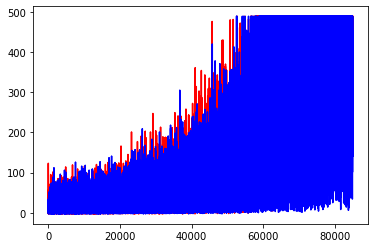

In [91]:
%matplotlib inline  
plt.plot(range(len(R)), history["sarsa"], 'r') # plotting t, a separately 
plt.plot(range(len(R)), history["qlearning"], 'b')
plt.show()